# LSTM Model

## Packages

In [1]:
import numpy as np
import pandas as pd
from lstm_functions import *


from tensorflow.keras.models import Sequential
from tensorflow.keras import layers, callbacks
from tensorflow.keras.optimizers import Adam

from sklearn.metrics import mean_absolute_error, mean_squared_error
from scipy import stats

## Reading and transforming the data

In [2]:
df = pd.read_csv('TDK_data2.csv')
df.head(10)

,Unnamed: 0,row.names.eurhuf.,EURHUF.X.Open,EURHUF.X.High,EURHUF.X.Low,EURHUF.X.Close,EURHUF.X.Volume,EURHUF.X.Adjusted,USDHUF.X.Open,USDHUF.X.High,USDHUF.X.Low,USDHUF.X.Close,USDHUF.X.Volume,USDHUF.X.Adjusted,kinfo_dummy,vm_dummy,nm_dummy,mgy_dummy,alapkamat
0,1,2018-05-31,319.394989,320.140991,319.062012,319.403992,0,319.403992,273.160004,275.339996,272.660004,273.425995,0,273.425995,0,0,0,0,0
1,2,2018-06-03,319.765991,320.066010,318.451996,319.765991,0,319.765991,274.170013,274.239014,271.230011,274.149994,0,274.149994,0,0,0,0,0
2,3,2018-06-04,318.503998,318.946014,318.128998,318.490997,0,318.490997,272.437012,273.454010,271.709992,272.459992,0,272.459992,0,0,0,0,0
3,4,2018-06-05,318.691010,319.067993,317.989014,318.665008,0,318.665008,271.554993,272.079987,269.869995,271.640015,0,271.640015,0,0,0,0,0
4,5,2018-06-06,317.806000,318.454987,316.627014,317.931000,0,317.931000,269.729004,269.729004,267.660004,269.812988,0,269.812988,0,0,0,0,0
5,6,2018-06-07,318.371002,320.480988,318.173004,318.367004,0,318.367004,270.109985,273.122009,269.438995,270.049988,0,270.049988,0,0,0,0,0
6,7,2018-06-10,319.347992,321.665985,319.251007,319.411987,0,319.411987,271.130005,273.123993,270.149994,271.269989,0,271.269989,0,0,0,0,0
7,8,2018-06-11,320.652008,321.769012,319.191986,320.971985,0,320.971985,272.609985,273.328003,270.660004,272.500000,0,272.500000,0,0,0,0,0
8,9,2018-06-12,319.571991,320.850006,319.138000,319.473999,0,319.473999,271.940002,272.937012,271.566986,271.981995,0,271.981995,0,0,0,0,0
9,10,2018-06-13,320.677002,323.261993,320.346008,320.226013,0,320.226013,271.506988,277.709015,271.089996,271.542999,0,271.542999,0,0,0,0,0


In [3]:
df.index = pd.to_datetime(df['row.names.eurhuf.'])
df_eur = df[['EURHUF.X.Close', 'kinfo_dummy', 'vm_dummy', 'mgy_dummy', 'nm_dummy', 'alapkamat']]
# df_usd = df[['USDHUF.X.Close', 'kinfo_dummy', 'vm_dummy', 'mgy_dummy', 'nm_dummy']]

## EUR model with dummies

<Axes: xlabel='row.names.eurhuf.'>

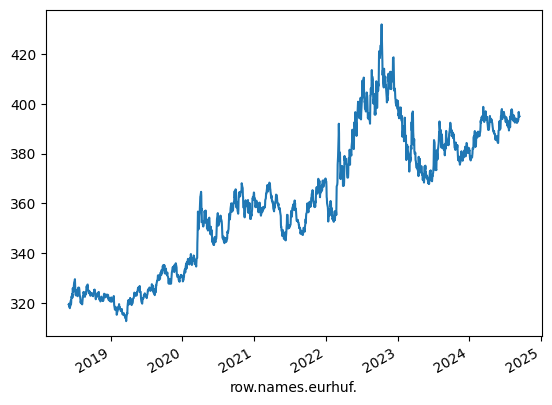

In [4]:
df_eur['EURHUF.X.Close'].plot()

In [5]:
windowed_df = df_to_windowed_df(df_eur['EURHUF.X.Close'], '2018-06-10', '2024-09-14', 6)
dates, X, y = windowed_df_to_date_X_y(windowed_df)
X = merge_with_dummies(X, df_eur[['alapkamat','kinfo_dummy', 'vm_dummy', 'mgy_dummy', 'nm_dummy']], dates)

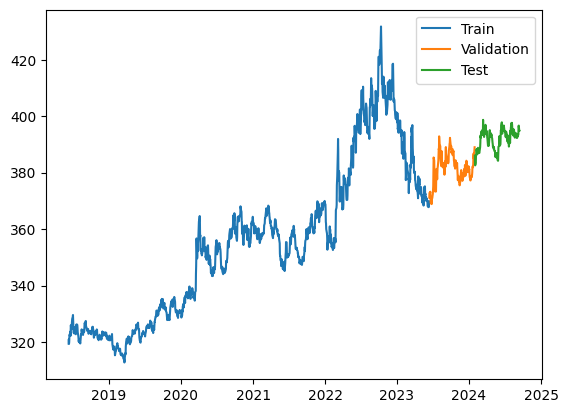

In [6]:
q_80 = int(len(dates) * .8)
q_90 = int(len(dates) * .9)

dates_train, X_train, y_train = dates[:q_80], X[:q_80], y[:q_80]

dates_val, X_val, y_val = dates[q_80:q_90], X[q_80:q_90], y[q_80:q_90]
dates_test, X_test, y_test = dates[q_90:], X[q_90:], y[q_90:]

plt.plot(dates_train, y_train)
plt.plot(dates_val, y_val)
plt.plot(dates_test, y_test)

plt.legend(['Train', 'Validation', 'Test'])

### Model

In [7]:
model = Sequential([layers.Input((len(X[1]), 1)),
                    layers.LSTM(32),
                    layers.Dense(16, activation='relu'),
                    layers.Dense(16, activation='relu'),
                    layers.Dense(1)])

model.compile(loss='mse', 
              optimizer='adam',
              metrics=['mean_absolute_error'])

lstm = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=100, callbacks = callbacks.EarlyStopping(patience = 10, monitor = 'val_loss'))

Epoch 1/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 126883.2031 - mean_absolute_error: 355.1610 - val_loss: 144395.2031 - val_mean_absolute_error: 379.9597
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 124653.5391 - mean_absolute_error: 352.0301 - val_loss: 138612.6094 - val_mean_absolute_error: 372.2724
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 117380.1641 - mean_absolute_error: 341.5187 - val_loss: 128169.5703 - val_mean_absolute_error: 357.9717
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 106743.5547 - mean_absolute_error: 325.5984 - val_loss: 113999.7109 - val_mean_absolute_error: 337.6002
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 93464.2422 - mean_absolute_error: 304.4553 - val_loss: 96337.3203 - val_mean_absolute_error: 310.3409
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 76330.5234 - mean_absolute_error: 274.9628 - val_loss: 76150.4297 - val_mean_absolute_error: 275.9069
Epoch 7/100
41/41 ━━━━━━━

In [8]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 32)             │         4,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 16)             │           272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │            17 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,509 (60.59 KB)

 Trainable params: 5,169 (20.19 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 10,340 (40.39 KB)

Training and validation loss

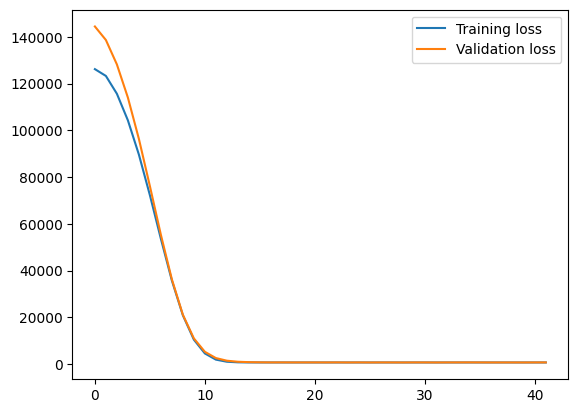

In [9]:
plt.plot(lstm.history['loss'], label = 'Training loss')
plt.plot(lstm.history['val_loss'], label = 'Validation loss')
plt.legend(['Training loss', 'Validation loss'])

Train predictions

41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


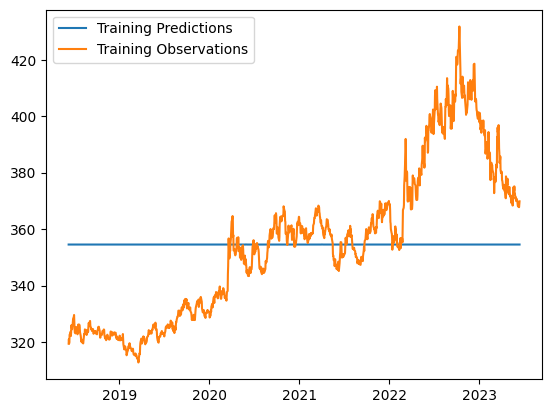

In [10]:
train_predictions = model.predict(X_train).flatten()

plt.plot(dates_train, train_predictions)
plt.plot(dates_train, y_train)
plt.legend(['Training Predictions', 'Training Observations'])

Validation predictions 

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


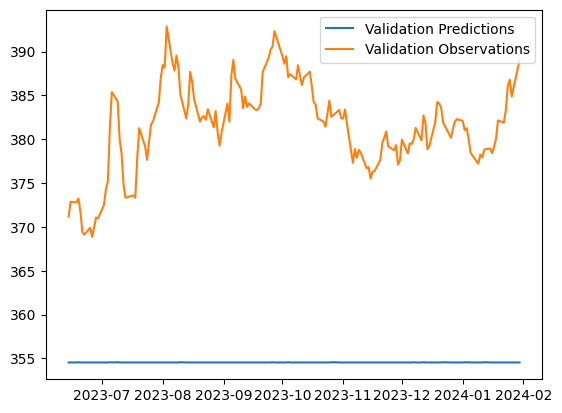

In [11]:
val_predictions = model.predict(X_val).flatten()

plt.plot(dates_val, val_predictions)
plt.plot(dates_val, y_val)
plt.legend(['Validation Predictions', 'Validation Observations'])

Test predictions

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


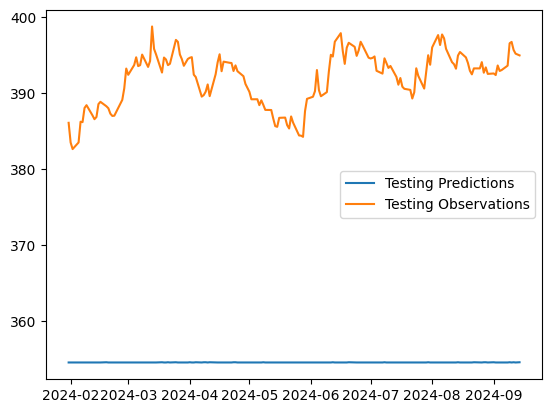

In [12]:
test_predictions = model.predict(X_test).flatten()

plt.plot(dates_test, test_predictions)
plt.plot(dates_test, y_test)
plt.legend(['Testing Predictions', 'Testing Observations'])

Predictions combined

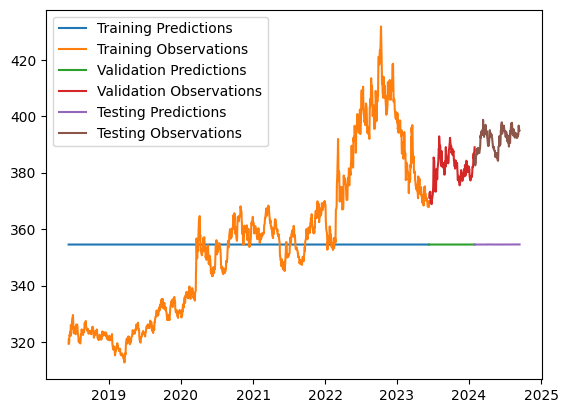

In [13]:
plt.plot(dates_train, train_predictions)
plt.plot(dates_train, y_train)
plt.plot(dates_val, val_predictions)
plt.plot(dates_val, y_val)
plt.plot(dates_test, test_predictions)
plt.plot(dates_test, y_test)
plt.legend(['Training Predictions', 
            'Training Observations',
            'Validation Predictions', 
            'Validation Observations',
            'Testing Predictions', 
            'Testing Observations'])

Metrics

In [14]:
mae = mean_absolute_error(y_test, test_predictions)
rmse = np.sqrt(mean_squared_error(y_test, test_predictions))

print(f'Mean Absolute Error on test data: {mae}')
print(f'Root Mean Squared Error on test data: {rmse}')

Mean Absolute Error on test data: 37.38037109375
Root Mean Squared Error on test data: 37.54574966430664


# EUR model simulations

Defining number of simualtions:

In [15]:
n_sim = 500

In [16]:
import time
start_time = time.time()

## Base model

In [17]:
rmse_all_variables, errors_all_variables = sim_lstm(df_eur, 'EURHUF.X.Close', ['alapkamat','kinfo_dummy', 'vm_dummy', 'mgy_dummy', 'nm_dummy'],  n_sim)

Epoch 1/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 126540.8125 - mean_absolute_error: 354.6937 - val_loss: 144552.6875 - val_mean_absolute_error: 380.1668
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 124584.4688 - mean_absolute_error: 351.9202 - val_loss: 138848.2500 - val_mean_absolute_error: 372.5887
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 117812.0703 - mean_absolute_error: 342.1574 - val_loss: 127272.4375 - val_mean_absolute_error: 356.7164
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 106387.2188 - mean_absolute_error: 325.0432 - val_loss: 112103.5156 - val_mean_absolute_error: 334.7800
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 91567.2578 - mean_absolute_error: 301.3065 - val_loss: 92971.1875 - val_mean_absolute_error: 304.8694
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 73395.5000 - mean_absolute_error: 269.4598 - val_loss: 71126.6953 - val_mean_absolute_error: 266.6474
Epoch 7/100
41/41 ━━━━━━━

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.7954 - mean_absolute_error: 1.9256 - val_loss: 5.6970 - val_mean_absolute_error: 1.8900
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3321 - mean_absolute_error: 1.8458 - val_loss: 4.6189 - val_mean_absolute_error: 1.6462
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.1124 - mean_absolute_error: 1.8139 - val_loss: 5.0423 - val_mean_absolute_error: 1.7027
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2234 - mean_absolute_error: 2.0214 - val_loss: 4.6430 - val_mean_absolute_error: 1.6425
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7006 - mean_absolute_error: 1.7249 - val_loss: 5.5650 - val_mean_absolute_error: 1.7979
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0434 - mean_absolute_error: 1.9245 - val_loss: 4.7707 - val_mean_absolute_error: 1.6601
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0617 - mean_absolute_error: 1.8417 - val_loss: 11.5006 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 6.1104 - mean_absolute_error: 1.8743 - val_loss: 5.3894 - val_mean_absolute_error: 1.8219
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7950 - mean_absolute_error: 1.7995 - val_loss: 7.3666 - val_mean_absolute_error: 2.1251
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8380 - mean_absolute_error: 1.9405 - val_loss: 4.9896 - val_mean_absolute_error: 1.7396
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7959 - mean_absolute_error: 1.8048 - val_loss: 5.0968 - val_mean_absolute_error: 1.7734
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2840 - mean_absolute_error: 1.7063 - val_loss: 8.8227 - val_mean_absolute_error: 2.5000
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3349 - mean_absolute_error: 1.8928 - val_loss: 4.5104 - val_mean_absolute_error: 1.6418
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7498 - mean_absolute_error: 1.7656 - val_loss: 5.0775 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.3256 - mean_absolute_error: 1.8921 - val_loss: 14.3360 - val_mean_absolute_error: 3.2378
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.6702 - mean_absolute_error: 2.0228 - val_loss: 4.4332 - val_mean_absolute_error: 1.6060
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6543 - mean_absolute_error: 1.7690 - val_loss: 9.9922 - val_mean_absolute_error: 2.6782
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8590 - mean_absolute_error: 2.0193 - val_loss: 4.6266 - val_mean_absolute_error: 1.6404
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3278 - mean_absolute_error: 1.8978 - val_loss: 4.5674 - val_mean_absolute_error: 1.6341
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2870 - mean_absolute_error: 1.8144 - val_loss: 5.3351 - val_mean_absolute_error: 1.7591
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2950 - mean_absolute_error: 1.6779 - val_loss: 4.6938 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 6.9157 - mean_absolute_error: 1.8993 - val_loss: 11.3673 - val_mean_absolute_error: 2.8093
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3617 - mean_absolute_error: 2.0317 - val_loss: 5.4212 - val_mean_absolute_error: 1.7846
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3831 - mean_absolute_error: 1.8653 - val_loss: 4.3402 - val_mean_absolute_error: 1.5861
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6364 - mean_absolute_error: 1.7681 - val_loss: 9.5869 - val_mean_absolute_error: 2.5160
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8049 - mean_absolute_error: 1.9643 - val_loss: 5.2016 - val_mean_absolute_error: 1.8229
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.7406 - mean_absolute_error: 2.2583 - val_loss: 4.5889 - val_mean_absolute_error: 1.6450
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7307 - mean_absolute_error: 1.8849 - val_loss: 4.7795 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.0929 - mean_absolute_error: 1.8236 - val_loss: 4.3083 - val_mean_absolute_error: 1.5845
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0815 - mean_absolute_error: 1.7984 - val_loss: 6.0852 - val_mean_absolute_error: 1.9048
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7573 - mean_absolute_error: 1.8046 - val_loss: 5.3966 - val_mean_absolute_error: 1.8278
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7313 - mean_absolute_error: 1.7482 - val_loss: 6.5545 - val_mean_absolute_error: 1.9903
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1439 - mean_absolute_error: 1.8440 - val_loss: 4.7551 - val_mean_absolute_error: 1.6925
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0143 - mean_absolute_error: 1.6717 - val_loss: 6.9002 - val_mean_absolute_error: 2.0628
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7387 - mean_absolute_error: 1.9453 - val_loss: 6.4349 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.3345 - mean_absolute_error: 1.8698 - val_loss: 6.0420 - val_mean_absolute_error: 1.8983
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7923 - mean_absolute_error: 1.7263 - val_loss: 4.7527 - val_mean_absolute_error: 1.6620
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3002 - mean_absolute_error: 1.6947 - val_loss: 5.7273 - val_mean_absolute_error: 1.9647
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.7921 - mean_absolute_error: 2.1105 - val_loss: 7.9918 - val_mean_absolute_error: 2.2610
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4236 - mean_absolute_error: 1.9410 - val_loss: 5.0719 - val_mean_absolute_error: 1.7223
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5580 - mean_absolute_error: 1.9040 - val_loss: 4.5204 - val_mean_absolute_error: 1.6411
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7387 - mean_absolute_error: 1.9503 - val_loss: 5.2789 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.1221 - mean_absolute_error: 1.7786 - val_loss: 11.8775 - val_mean_absolute_error: 3.0154
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8936 - mean_absolute_error: 1.8431 - val_loss: 5.0079 - val_mean_absolute_error: 1.7642
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6910 - mean_absolute_error: 1.5881 - val_loss: 5.5500 - val_mean_absolute_error: 1.9279
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9713 - mean_absolute_error: 2.0034 - val_loss: 4.2986 - val_mean_absolute_error: 1.5794
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1594 - mean_absolute_error: 1.8031 - val_loss: 4.4387 - val_mean_absolute_error: 1.6143
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9629 - mean_absolute_error: 1.6289 - val_loss: 4.5605 - val_mean_absolute_error: 1.6661
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1905 - mean_absolute_error: 1.6839 - val_loss: 8.3912 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 6.0835 - mean_absolute_error: 1.8218 - val_loss: 4.2774 - val_mean_absolute_error: 1.6051
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3634 - mean_absolute_error: 2.0297 - val_loss: 4.4741 - val_mean_absolute_error: 1.6486
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5022 - mean_absolute_error: 1.7276 - val_loss: 5.1787 - val_mean_absolute_error: 1.7419
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0409 - mean_absolute_error: 1.9671 - val_loss: 4.0420 - val_mean_absolute_error: 1.5468
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7376 - mean_absolute_error: 1.7697 - val_loss: 5.7020 - val_mean_absolute_error: 1.9364
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3217 - mean_absolute_error: 1.9492 - val_loss: 4.3205 - val_mean_absolute_error: 1.6118
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9577 - mean_absolute_error: 1.7837 - val_loss: 5.9446 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 6.4142 - mean_absolute_error: 1.9320 - val_loss: 4.6717 - val_mean_absolute_error: 1.6509
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 5.3889 - mean_absolute_error: 1.7318 - val_loss: 6.3656 - val_mean_absolute_error: 2.0687
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 5.2692 - mean_absolute_error: 1.7019 - val_loss: 5.9737 - val_mean_absolute_error: 1.9047
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9913 - mean_absolute_error: 1.8128 - val_loss: 6.1803 - val_mean_absolute_error: 1.9446
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7987 - mean_absolute_error: 1.7519 - val_loss: 6.1469 - val_mean_absolute_error: 1.9344
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.7339 - mean_absolute_error: 1.8930 - val_loss: 10.6538 - val_mean_absolute_error: 2.7418
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0166 - mean_absolute_error: 1.6635 - val_loss: 4.2367 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8713 - mean_absolute_error: 1.5716 - val_loss: 4.1075 - val_mean_absolute_error: 1.5618
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1419 - mean_absolute_error: 1.4699 - val_loss: 6.7983 - val_mean_absolute_error: 2.1907
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6882 - mean_absolute_error: 1.9828 - val_loss: 10.7410 - val_mean_absolute_error: 2.7701
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6585 - mean_absolute_error: 2.0094 - val_loss: 4.0210 - val_mean_absolute_error: 1.5594
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0414 - mean_absolute_error: 1.8150 - val_loss: 6.5354 - val_mean_absolute_error: 2.0924
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2179 - mean_absolute_error: 1.8851 - val_loss: 4.2125 - val_mean_absolute_error: 1.5844
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9268 - mean_absolute_error: 1.6326 - val_loss: 6.8513 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.0075 - mean_absolute_error: 1.9708 - val_loss: 7.5166 - val_mean_absolute_error: 2.2043
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5118 - mean_absolute_error: 1.7665 - val_loss: 4.2303 - val_mean_absolute_error: 1.5910
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9922 - mean_absolute_error: 1.6233 - val_loss: 4.0313 - val_mean_absolute_error: 1.5609
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7909 - mean_absolute_error: 1.7726 - val_loss: 8.2034 - val_mean_absolute_error: 2.4121
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5073 - mean_absolute_error: 1.9615 - val_loss: 5.1542 - val_mean_absolute_error: 1.7532
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5547 - mean_absolute_error: 1.7451 - val_loss: 11.1198 - val_mean_absolute_error: 2.8610
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6915 - mean_absolute_error: 1.7556 - val_loss: 4.0252 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0998 - mean_absolute_error: 1.6510 - val_loss: 7.9727 - val_mean_absolute_error: 2.3726
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1152 - mean_absolute_error: 1.8639 - val_loss: 4.0643 - val_mean_absolute_error: 1.5517
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7492 - mean_absolute_error: 1.6144 - val_loss: 8.9032 - val_mean_absolute_error: 2.4683
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1864 - mean_absolute_error: 1.8793 - val_loss: 8.8497 - val_mean_absolute_error: 2.5326
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9225 - mean_absolute_error: 1.8109 - val_loss: 5.0812 - val_mean_absolute_error: 1.8028
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8024 - mean_absolute_error: 1.6065 - val_loss: 4.5697 - val_mean_absolute_error: 1.6817
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7878 - mean_absolute_error: 1.6077 - val_loss: 4.0893 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1963 - mean_absolute_error: 1.6805 - val_loss: 3.8250 - val_mean_absolute_error: 1.5207
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0553 - mean_absolute_error: 1.6093 - val_loss: 3.8178 - val_mean_absolute_error: 1.5254
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4380 - mean_absolute_error: 1.5430 - val_loss: 4.2753 - val_mean_absolute_error: 1.6231
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7773 - mean_absolute_error: 1.7739 - val_loss: 5.9715 - val_mean_absolute_error: 1.9211
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1687 - mean_absolute_error: 1.9009 - val_loss: 4.8231 - val_mean_absolute_error: 1.6990
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4806 - mean_absolute_error: 1.7261 - val_loss: 5.5024 - val_mean_absolute_error: 1.8897
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2575 - mean_absolute_error: 1.6799 - val_loss: 9.2043 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7200 - mean_absolute_error: 1.5886 - val_loss: 4.4840 - val_mean_absolute_error: 1.6478
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7871 - mean_absolute_error: 1.9709 - val_loss: 4.1326 - val_mean_absolute_error: 1.5905
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9693 - mean_absolute_error: 1.7844 - val_loss: 6.6488 - val_mean_absolute_error: 2.1155
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0983 - mean_absolute_error: 1.7503 - val_loss: 3.9234 - val_mean_absolute_error: 1.5572
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6867 - mean_absolute_error: 1.6013 - val_loss: 8.4791 - val_mean_absolute_error: 2.4818
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.5759 - mean_absolute_error: 2.1889 - val_loss: 7.3571 - val_mean_absolute_error: 2.1919
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2295 - mean_absolute_error: 1.5161 - val_loss: 8.2001 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3194 - mean_absolute_error: 1.6714 - val_loss: 4.3647 - val_mean_absolute_error: 1.6529
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5681 - mean_absolute_error: 1.7688 - val_loss: 4.8474 - val_mean_absolute_error: 1.7126
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2266 - mean_absolute_error: 1.4958 - val_loss: 3.7431 - val_mean_absolute_error: 1.5038
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4066 - mean_absolute_error: 1.5117 - val_loss: 9.8210 - val_mean_absolute_error: 2.6979
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1323 - mean_absolute_error: 1.8652 - val_loss: 4.1293 - val_mean_absolute_error: 1.5756
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3980 - mean_absolute_error: 1.5330 - val_loss: 9.4578 - val_mean_absolute_error: 2.5761
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4532 - mean_absolute_error: 1.9368 - val_loss: 3.6346 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7430 - mean_absolute_error: 1.7852 - val_loss: 3.6763 - val_mean_absolute_error: 1.4940
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1918 - mean_absolute_error: 1.4590 - val_loss: 3.9030 - val_mean_absolute_error: 1.5565
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5533 - mean_absolute_error: 1.9412 - val_loss: 5.6237 - val_mean_absolute_error: 1.8594
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1438 - mean_absolute_error: 1.6979 - val_loss: 10.6365 - val_mean_absolute_error: 2.8396
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.9278 - mean_absolute_error: 2.1628 - val_loss: 3.8517 - val_mean_absolute_error: 1.5308
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7222 - mean_absolute_error: 1.6031 - val_loss: 3.8744 - val_mean_absolute_error: 1.5403
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9374 - mean_absolute_error: 1.7974 - val_loss: 4.0566 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3742 - mean_absolute_error: 1.5449 - val_loss: 4.5400 - val_mean_absolute_error: 1.6893
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3853 - mean_absolute_error: 1.5557 - val_loss: 3.6152 - val_mean_absolute_error: 1.4840
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0853 - mean_absolute_error: 1.6699 - val_loss: 5.6655 - val_mean_absolute_error: 1.9399
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4959 - mean_absolute_error: 1.7446 - val_loss: 6.5189 - val_mean_absolute_error: 2.0338
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5828 - mean_absolute_error: 1.6077 - val_loss: 4.5643 - val_mean_absolute_error: 1.6743
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3217 - mean_absolute_error: 1.4867 - val_loss: 4.1206 - val_mean_absolute_error: 1.5922
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9681 - mean_absolute_error: 1.8278 - val_loss: 4.3861 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.0132 - mean_absolute_error: 2.1757 - val_loss: 4.9603 - val_mean_absolute_error: 1.7781
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.0247 - mean_absolute_error: 1.8822 - val_loss: 6.2888 - val_mean_absolute_error: 1.9807
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4522 - mean_absolute_error: 1.7325 - val_loss: 4.9540 - val_mean_absolute_error: 1.7393
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7519 - mean_absolute_error: 1.5881 - val_loss: 5.5110 - val_mean_absolute_error: 1.8474
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6400 - mean_absolute_error: 1.5957 - val_loss: 3.7746 - val_mean_absolute_error: 1.5338
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5228 - mean_absolute_error: 1.5227 - val_loss: 9.8387 - val_mean_absolute_error: 2.6972
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1910 - mean_absolute_error: 1.7036 - val_loss: 5.5033 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.1533 - mean_absolute_error: 2.0760 - val_loss: 5.2692 - val_mean_absolute_error: 1.8491
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4258 - mean_absolute_error: 1.5204 - val_loss: 5.3824 - val_mean_absolute_error: 1.8132
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3329 - mean_absolute_error: 1.5234 - val_loss: 4.7170 - val_mean_absolute_error: 1.7253
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7656 - mean_absolute_error: 1.8031 - val_loss: 5.3301 - val_mean_absolute_error: 1.8076
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2275 - mean_absolute_error: 1.6405 - val_loss: 5.5186 - val_mean_absolute_error: 1.8852
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0454 - mean_absolute_error: 1.6549 - val_loss: 4.4988 - val_mean_absolute_error: 1.6598
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7935 - mean_absolute_error: 1.5914 - val_loss: 10.9387 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.6927 - mean_absolute_error: 1.9800 - val_loss: 4.2364 - val_mean_absolute_error: 1.6383
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2549 - mean_absolute_error: 1.6818 - val_loss: 6.9816 - val_mean_absolute_error: 2.1793
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9211 - mean_absolute_error: 1.6399 - val_loss: 6.0107 - val_mean_absolute_error: 1.9368
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4559 - mean_absolute_error: 1.9736 - val_loss: 6.2004 - val_mean_absolute_error: 1.9745
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8333 - mean_absolute_error: 1.8819 - val_loss: 4.3912 - val_mean_absolute_error: 1.6367
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9994 - mean_absolute_error: 1.8492 - val_loss: 4.6478 - val_mean_absolute_error: 1.6912
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5158 - mean_absolute_error: 1.6928 - val_loss: 3.9608 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1078 - mean_absolute_error: 1.4768 - val_loss: 3.6700 - val_mean_absolute_error: 1.5001
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4000 - mean_absolute_error: 1.5181 - val_loss: 4.3256 - val_mean_absolute_error: 1.6413
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2269 - mean_absolute_error: 1.5125 - val_loss: 5.6138 - val_mean_absolute_error: 1.8699
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8456 - mean_absolute_error: 1.5363 - val_loss: 9.1651 - val_mean_absolute_error: 2.5945
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3403 - mean_absolute_error: 1.7871 - val_loss: 5.3862 - val_mean_absolute_error: 1.8666
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7109 - mean_absolute_error: 1.5713 - val_loss: 3.8644 - val_mean_absolute_error: 1.5536
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.7338 - mean_absolute_error: 2.1164 - val_loss: 6.2666 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3785 - mean_absolute_error: 1.5264 - val_loss: 3.7451 - val_mean_absolute_error: 1.5318
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1216 - mean_absolute_error: 1.6766 - val_loss: 3.6106 - val_mean_absolute_error: 1.4877
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5632 - mean_absolute_error: 1.5685 - val_loss: 3.9885 - val_mean_absolute_error: 1.5759
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4581 - mean_absolute_error: 1.5265 - val_loss: 3.8188 - val_mean_absolute_error: 1.5424
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6636 - mean_absolute_error: 1.5352 - val_loss: 5.8983 - val_mean_absolute_error: 1.9220
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2254 - mean_absolute_error: 1.8773 - val_loss: 3.7323 - val_mean_absolute_error: 1.5240
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5722 - mean_absolute_error: 1.7206 - val_loss: 4.5747 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6433 - mean_absolute_error: 1.5824 - val_loss: 4.0097 - val_mean_absolute_error: 1.5814
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5464 - mean_absolute_error: 1.9099 - val_loss: 4.3403 - val_mean_absolute_error: 1.6342
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7168 - mean_absolute_error: 1.7654 - val_loss: 4.6793 - val_mean_absolute_error: 1.6999
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2563 - mean_absolute_error: 1.5020 - val_loss: 5.3067 - val_mean_absolute_error: 1.8146
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5112 - mean_absolute_error: 1.5341 - val_loss: 7.5283 - val_mean_absolute_error: 2.2841
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5319 - mean_absolute_error: 1.5903 - val_loss: 3.8529 - val_mean_absolute_error: 1.5552
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4214 - mean_absolute_error: 1.5501 - val_loss: 3.5372 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2278 - mean_absolute_error: 1.6639 - val_loss: 5.0059 - val_mean_absolute_error: 1.7701
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5266 - mean_absolute_error: 1.9551 - val_loss: 5.4493 - val_mean_absolute_error: 1.8366
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6991 - mean_absolute_error: 1.5750 - val_loss: 4.1384 - val_mean_absolute_error: 1.6135
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9939 - mean_absolute_error: 1.5847 - val_loss: 5.0206 - val_mean_absolute_error: 1.7906
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9847 - mean_absolute_error: 1.4499 - val_loss: 3.7056 - val_mean_absolute_error: 1.5167
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4159 - mean_absolute_error: 1.5707 - val_loss: 8.5963 - val_mean_absolute_error: 2.5145
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1694 - mean_absolute_error: 1.7399 - val_loss: 4.1759 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.1372 - mean_absolute_error: 2.0640 - val_loss: 3.5365 - val_mean_absolute_error: 1.4637
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6162 - mean_absolute_error: 1.5860 - val_loss: 3.7548 - val_mean_absolute_error: 1.5234
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4326 - mean_absolute_error: 1.5019 - val_loss: 17.4626 - val_mean_absolute_error: 3.8041
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 10.2727 - mean_absolute_error: 2.6272 - val_loss: 6.6057 - val_mean_absolute_error: 2.0515
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1855 - mean_absolute_error: 1.6761 - val_loss: 5.9682 - val_mean_absolute_error: 1.9928
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3916 - mean_absolute_error: 1.7239 - val_loss: 7.5264 - val_mean_absolute_error: 2.2378
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3137 - mean_absolute_error: 1.7043 - val_loss: 8.1605 -

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0077 - mean_absolute_error: 1.4896 - val_loss: 5.6742 - val_mean_absolute_error: 1.8858
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4837 - mean_absolute_error: 1.7066 - val_loss: 11.8352 - val_mean_absolute_error: 3.0210
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.8655 - mean_absolute_error: 2.3701 - val_loss: 3.6461 - val_mean_absolute_error: 1.4993
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3320 - mean_absolute_error: 1.4906 - val_loss: 3.8819 - val_mean_absolute_error: 1.5622
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5419 - mean_absolute_error: 1.5867 - val_loss: 8.3143 - val_mean_absolute_error: 2.4526
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3135 - mean_absolute_error: 1.7153 - val_loss: 3.5245 - val_mean_absolute_error: 1.4790
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7983 - mean_absolute_error: 1.6662 - val_loss: 3.7290 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.4391 - mean_absolute_error: 1.5093 - val_loss: 3.8633 - val_mean_absolute_error: 1.5318
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3740 - mean_absolute_error: 1.7331 - val_loss: 8.2869 - val_mean_absolute_error: 2.3822
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1962 - mean_absolute_error: 1.8310 - val_loss: 3.8537 - val_mean_absolute_error: 1.5583
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3097 - mean_absolute_error: 1.5305 - val_loss: 4.9031 - val_mean_absolute_error: 1.7441
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6301 - mean_absolute_error: 1.7554 - val_loss: 3.6127 - val_mean_absolute_error: 1.4922
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0746 - mean_absolute_error: 1.6867 - val_loss: 3.7146 - val_mean_absolute_error: 1.5013
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2038 - mean_absolute_error: 1.4939 - val_loss: 3.6224 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0399 - mean_absolute_error: 1.6517 - val_loss: 5.4811 - val_mean_absolute_error: 1.8417
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8119 - mean_absolute_error: 1.6052 - val_loss: 3.7406 - val_mean_absolute_error: 1.5260
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2618 - mean_absolute_error: 1.4858 - val_loss: 17.7018 - val_mean_absolute_error: 3.7928
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4653 - mean_absolute_error: 1.9361 - val_loss: 5.2808 - val_mean_absolute_error: 1.8584
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0882 - mean_absolute_error: 1.6685 - val_loss: 4.2946 - val_mean_absolute_error: 1.6438
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3938 - mean_absolute_error: 1.7473 - val_loss: 3.6944 - val_mean_absolute_error: 1.5002
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2272 - mean_absolute_error: 2.0851 - val_loss: 9.0686 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 6.6541 - mean_absolute_error: 1.9817 - val_loss: 4.0701 - val_mean_absolute_error: 1.6035
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8826 - mean_absolute_error: 2.0209 - val_loss: 6.8041 - val_mean_absolute_error: 2.1465
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8883 - mean_absolute_error: 1.9959 - val_loss: 7.1207 - val_mean_absolute_error: 2.1573
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2362 - mean_absolute_error: 1.5042 - val_loss: 7.8407 - val_mean_absolute_error: 2.3001
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5043 - mean_absolute_error: 1.7368 - val_loss: 3.7538 - val_mean_absolute_error: 1.5404
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1816 - mean_absolute_error: 1.7353 - val_loss: 4.7233 - val_mean_absolute_error: 1.7303
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5214 - mean_absolute_error: 1.5662 - val_loss: 4.9261 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4671 - mean_absolute_error: 1.4987 - val_loss: 5.5641 - val_mean_absolute_error: 1.9143
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3521 - mean_absolute_error: 1.7842 - val_loss: 3.7693 - val_mean_absolute_error: 1.5405
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6790 - mean_absolute_error: 1.5776 - val_loss: 3.5948 - val_mean_absolute_error: 1.5048
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9873 - mean_absolute_error: 1.4393 - val_loss: 4.2928 - val_mean_absolute_error: 1.6394
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1662 - mean_absolute_error: 1.4528 - val_loss: 4.8598 - val_mean_absolute_error: 1.7384
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8964 - mean_absolute_error: 1.8304 - val_loss: 11.1226 - val_mean_absolute_error: 2.8748
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9398 - mean_absolute_error: 1.6629 - val_loss: 9.1268 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6601 - mean_absolute_error: 1.5842 - val_loss: 3.5008 - val_mean_absolute_error: 1.4690
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8072 - mean_absolute_error: 1.6307 - val_loss: 3.6723 - val_mean_absolute_error: 1.5022
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6679 - mean_absolute_error: 1.6515 - val_loss: 11.8385 - val_mean_absolute_error: 3.0220
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1524 - mean_absolute_error: 1.6725 - val_loss: 5.5663 - val_mean_absolute_error: 1.8664
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8633 - mean_absolute_error: 1.7869 - val_loss: 5.4318 - val_mean_absolute_error: 1.8503
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6061 - mean_absolute_error: 1.7772 - val_loss: 5.5209 - val_mean_absolute_error: 1.8547
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8113 - mean_absolute_error: 1.9795 - val_loss: 3.6413 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2003 - mean_absolute_error: 1.6858 - val_loss: 6.8081 - val_mean_absolute_error: 2.0981
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8009 - mean_absolute_error: 1.6449 - val_loss: 3.7949 - val_mean_absolute_error: 1.5420
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0048 - mean_absolute_error: 1.7001 - val_loss: 4.9283 - val_mean_absolute_error: 1.7483
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2443 - mean_absolute_error: 1.9176 - val_loss: 9.8972 - val_mean_absolute_error: 2.6669
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0538 - mean_absolute_error: 1.8688 - val_loss: 3.7535 - val_mean_absolute_error: 1.5321
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5974 - mean_absolute_error: 1.5395 - val_loss: 3.9877 - val_mean_absolute_error: 1.5810
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8600 - mean_absolute_error: 1.4399 - val_loss: 7.4162 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 5.2164 - mean_absolute_error: 1.6699 - val_loss: 3.4445 - val_mean_absolute_error: 1.4711
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9587 - mean_absolute_error: 1.6070 - val_loss: 3.6153 - val_mean_absolute_error: 1.5096
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7106 - mean_absolute_error: 1.6053 - val_loss: 3.5906 - val_mean_absolute_error: 1.4770
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3738 - mean_absolute_error: 1.5126 - val_loss: 5.2271 - val_mean_absolute_error: 1.8339
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9715 - mean_absolute_error: 1.6663 - val_loss: 3.6307 - val_mean_absolute_error: 1.5016
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7347 - mean_absolute_error: 1.6207 - val_loss: 7.0609 - val_mean_absolute_error: 2.1460
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4536 - mean_absolute_error: 2.1437 - val_loss: 5.9616 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7050 - mean_absolute_error: 1.3851 - val_loss: 3.6043 - val_mean_absolute_error: 1.5037
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9356 - mean_absolute_error: 1.6540 - val_loss: 3.4965 - val_mean_absolute_error: 1.4738
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8970 - mean_absolute_error: 1.4490 - val_loss: 3.4311 - val_mean_absolute_error: 1.4656
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0701 - mean_absolute_error: 1.4829 - val_loss: 4.1683 - val_mean_absolute_error: 1.6184
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7049 - mean_absolute_error: 1.5959 - val_loss: 8.6837 - val_mean_absolute_error: 2.5284
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.9663 - mean_absolute_error: 2.2600 - val_loss: 3.7174 - val_mean_absolute_error: 1.5313
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2458 - mean_absolute_error: 1.8927 - val_loss: 4.5896 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5974 - mean_absolute_error: 1.7386 - val_loss: 4.2166 - val_mean_absolute_error: 1.6312
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1068 - mean_absolute_error: 1.6662 - val_loss: 3.4641 - val_mean_absolute_error: 1.4529
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3014 - mean_absolute_error: 1.4728 - val_loss: 4.0281 - val_mean_absolute_error: 1.5892
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7622 - mean_absolute_error: 1.8385 - val_loss: 5.7740 - val_mean_absolute_error: 1.9123
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8718 - mean_absolute_error: 1.6058 - val_loss: 6.7017 - val_mean_absolute_error: 2.0779
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3365 - mean_absolute_error: 1.6891 - val_loss: 3.5487 - val_mean_absolute_error: 1.4885
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9547 - mean_absolute_error: 1.6269 - val_loss: 3.5260 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0408 - mean_absolute_error: 1.4280 - val_loss: 3.5229 - val_mean_absolute_error: 1.4823
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6574 - mean_absolute_error: 1.5442 - val_loss: 4.7734 - val_mean_absolute_error: 1.7234
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9817 - mean_absolute_error: 1.6376 - val_loss: 3.3995 - val_mean_absolute_error: 1.4560
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6486 - mean_absolute_error: 1.5741 - val_loss: 3.5853 - val_mean_absolute_error: 1.4950
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6574 - mean_absolute_error: 1.7794 - val_loss: 5.9167 - val_mean_absolute_error: 1.9254
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5368 - mean_absolute_error: 1.5568 - val_loss: 10.1220 - val_mean_absolute_error: 2.7490
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8311 - mean_absolute_error: 2.0389 - val_loss: 3.7245 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7130 - mean_absolute_error: 1.4050 - val_loss: 3.7567 - val_mean_absolute_error: 1.5426
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6269 - mean_absolute_error: 1.5649 - val_loss: 3.4313 - val_mean_absolute_error: 1.4636
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0414 - mean_absolute_error: 1.6684 - val_loss: 3.8393 - val_mean_absolute_error: 1.5613
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2317 - mean_absolute_error: 1.6680 - val_loss: 7.2436 - val_mean_absolute_error: 2.1873
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3231 - mean_absolute_error: 1.4742 - val_loss: 4.1743 - val_mean_absolute_error: 1.6168
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3980 - mean_absolute_error: 1.5309 - val_loss: 3.6658 - val_mean_absolute_error: 1.5190
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2892 - mean_absolute_error: 1.4982 - val_loss: 11.6756 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4267 - mean_absolute_error: 1.7040 - val_loss: 3.5332 - val_mean_absolute_error: 1.4741
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0412 - mean_absolute_error: 1.6692 - val_loss: 4.8526 - val_mean_absolute_error: 1.7636
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6788 - mean_absolute_error: 1.5649 - val_loss: 5.2513 - val_mean_absolute_error: 1.8211
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6416 - mean_absolute_error: 1.3512 - val_loss: 3.5592 - val_mean_absolute_error: 1.4958
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5001 - mean_absolute_error: 1.5481 - val_loss: 9.4662 - val_mean_absolute_error: 2.6034
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0121 - mean_absolute_error: 1.8570 - val_loss: 3.9811 - val_mean_absolute_error: 1.5830
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6856 - mean_absolute_error: 1.9309 - val_loss: 3.6261 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.1161 - mean_absolute_error: 2.0736 - val_loss: 3.5763 - val_mean_absolute_error: 1.4990
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5452 - mean_absolute_error: 1.5916 - val_loss: 4.1553 - val_mean_absolute_error: 1.6125
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0042 - mean_absolute_error: 1.6316 - val_loss: 5.0466 - val_mean_absolute_error: 1.7801
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7801 - mean_absolute_error: 1.4050 - val_loss: 4.6832 - val_mean_absolute_error: 1.7301
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7286 - mean_absolute_error: 1.6393 - val_loss: 4.0169 - val_mean_absolute_error: 1.5915
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5251 - mean_absolute_error: 1.4689 - val_loss: 3.4774 - val_mean_absolute_error: 1.4797
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7706 - mean_absolute_error: 1.5649 - val_loss: 3.6937 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7117 - mean_absolute_error: 1.7716 - val_loss: 5.8716 - val_mean_absolute_error: 1.9179
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0972 - mean_absolute_error: 1.4548 - val_loss: 3.5196 - val_mean_absolute_error: 1.4638
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0216 - mean_absolute_error: 1.5391 - val_loss: 3.3448 - val_mean_absolute_error: 1.4458
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7314 - mean_absolute_error: 1.5793 - val_loss: 4.8149 - val_mean_absolute_error: 1.7249
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1888 - mean_absolute_error: 1.8046 - val_loss: 3.4288 - val_mean_absolute_error: 1.4593
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6758 - mean_absolute_error: 1.5688 - val_loss: 5.1590 - val_mean_absolute_error: 1.8102
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1515 - mean_absolute_error: 1.4714 - val_loss: 3.8635 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8756 - mean_absolute_error: 1.4029 - val_loss: 4.7534 - val_mean_absolute_error: 1.7293
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7531 - mean_absolute_error: 1.8166 - val_loss: 3.7343 - val_mean_absolute_error: 1.5366
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7429 - mean_absolute_error: 1.5966 - val_loss: 4.1656 - val_mean_absolute_error: 1.6278
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0264 - mean_absolute_error: 1.4636 - val_loss: 3.4619 - val_mean_absolute_error: 1.4778
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5306 - mean_absolute_error: 1.5649 - val_loss: 4.0828 - val_mean_absolute_error: 1.6027
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5351 - mean_absolute_error: 1.7983 - val_loss: 5.8486 - val_mean_absolute_error: 1.9763
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8865 - mean_absolute_error: 1.5906 - val_loss: 5.3647 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 6.0924 - mean_absolute_error: 1.8813 - val_loss: 3.7225 - val_mean_absolute_error: 1.5311
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6386 - mean_absolute_error: 1.5240 - val_loss: 11.2816 - val_mean_absolute_error: 2.9564
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.1121 - mean_absolute_error: 1.9573 - val_loss: 6.5908 - val_mean_absolute_error: 2.1094
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1894 - mean_absolute_error: 1.4767 - val_loss: 3.5818 - val_mean_absolute_error: 1.5000
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4423 - mean_absolute_error: 1.5447 - val_loss: 5.9926 - val_mean_absolute_error: 1.9832
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4589 - mean_absolute_error: 1.7808 - val_loss: 3.7359 - val_mean_absolute_error: 1.5382
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3427 - mean_absolute_error: 1.5169 - val_loss: 3.5273 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5729 - mean_absolute_error: 1.5524 - val_loss: 5.2902 - val_mean_absolute_error: 1.8569
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9429 - mean_absolute_error: 1.8572 - val_loss: 4.5144 - val_mean_absolute_error: 1.6961
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6695 - mean_absolute_error: 1.8010 - val_loss: 3.4253 - val_mean_absolute_error: 1.4575
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3207 - mean_absolute_error: 1.5079 - val_loss: 3.5368 - val_mean_absolute_error: 1.4886
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5432 - mean_absolute_error: 1.5249 - val_loss: 3.4800 - val_mean_absolute_error: 1.4820
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6474 - mean_absolute_error: 1.5636 - val_loss: 7.5090 - val_mean_absolute_error: 2.2861
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3321 - mean_absolute_error: 1.7583 - val_loss: 3.9693 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9744 - mean_absolute_error: 1.6393 - val_loss: 3.4343 - val_mean_absolute_error: 1.4621
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2766 - mean_absolute_error: 1.9038 - val_loss: 5.0851 - val_mean_absolute_error: 1.8047
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6539 - mean_absolute_error: 1.9671 - val_loss: 3.6148 - val_mean_absolute_error: 1.5087
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4792 - mean_absolute_error: 1.5550 - val_loss: 3.4662 - val_mean_absolute_error: 1.4755
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6817 - mean_absolute_error: 1.8119 - val_loss: 3.9075 - val_mean_absolute_error: 1.5682
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4282 - mean_absolute_error: 1.5518 - val_loss: 4.2960 - val_mean_absolute_error: 1.6451
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1390 - mean_absolute_error: 1.5158 - val_loss: 3.6341 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8390 - mean_absolute_error: 1.6935 - val_loss: 4.0706 - val_mean_absolute_error: 1.5991
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4505 - mean_absolute_error: 1.9623 - val_loss: 4.5830 - val_mean_absolute_error: 1.6944
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8717 - mean_absolute_error: 1.6555 - val_loss: 6.5988 - val_mean_absolute_error: 2.1278
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9414 - mean_absolute_error: 1.6123 - val_loss: 3.8404 - val_mean_absolute_error: 1.5526
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2377 - mean_absolute_error: 1.4381 - val_loss: 3.4157 - val_mean_absolute_error: 1.4633
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2207 - mean_absolute_error: 1.5053 - val_loss: 3.5660 - val_mean_absolute_error: 1.4972
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2612 - mean_absolute_error: 1.4838 - val_loss: 6.6813 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6679 - mean_absolute_error: 1.7738 - val_loss: 6.2667 - val_mean_absolute_error: 1.9977
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5622 - mean_absolute_error: 1.7610 - val_loss: 6.8774 - val_mean_absolute_error: 2.1800
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7738 - mean_absolute_error: 1.6715 - val_loss: 3.3798 - val_mean_absolute_error: 1.4465
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3457 - mean_absolute_error: 1.5386 - val_loss: 4.1311 - val_mean_absolute_error: 1.6108
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2074 - mean_absolute_error: 1.5871 - val_loss: 3.8758 - val_mean_absolute_error: 1.5654
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3711 - mean_absolute_error: 1.5112 - val_loss: 4.8015 - val_mean_absolute_error: 1.7381
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6427 - mean_absolute_error: 1.5403 - val_loss: 3.4777 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5542 - mean_absolute_error: 1.7767 - val_loss: 3.9709 - val_mean_absolute_error: 1.5788
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2281 - mean_absolute_error: 1.4883 - val_loss: 3.6289 - val_mean_absolute_error: 1.5173
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1520 - mean_absolute_error: 1.5109 - val_loss: 4.4535 - val_mean_absolute_error: 1.6750
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4316 - mean_absolute_error: 1.5408 - val_loss: 8.1429 - val_mean_absolute_error: 2.4136
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9978 - mean_absolute_error: 1.8668 - val_loss: 5.0473 - val_mean_absolute_error: 1.7999
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6075 - mean_absolute_error: 1.7524 - val_loss: 6.4877 - val_mean_absolute_error: 2.0398
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5444 - mean_absolute_error: 1.5603 - val_loss: 4.9152 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2650 - mean_absolute_error: 1.4898 - val_loss: 4.8548 - val_mean_absolute_error: 1.7454
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3769 - mean_absolute_error: 1.9404 - val_loss: 5.7084 - val_mean_absolute_error: 1.8954
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2217 - mean_absolute_error: 1.7331 - val_loss: 5.7008 - val_mean_absolute_error: 1.9617
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9843 - mean_absolute_error: 1.6917 - val_loss: 8.5065 - val_mean_absolute_error: 2.4255
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4198 - mean_absolute_error: 1.9492 - val_loss: 5.3156 - val_mean_absolute_error: 1.8204
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9678 - mean_absolute_error: 1.6291 - val_loss: 4.5517 - val_mean_absolute_error: 1.7064
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9566 - mean_absolute_error: 1.6109 - val_loss: 6.1330 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3722 - mean_absolute_error: 1.5354 - val_loss: 4.4413 - val_mean_absolute_error: 1.6732
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2300 - mean_absolute_error: 1.4881 - val_loss: 4.8786 - val_mean_absolute_error: 1.7862
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6037 - mean_absolute_error: 2.0018 - val_loss: 3.7253 - val_mean_absolute_error: 1.5325
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5473 - mean_absolute_error: 1.5108 - val_loss: 7.4142 - val_mean_absolute_error: 2.2926
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1428 - mean_absolute_error: 1.9168 - val_loss: 3.3692 - val_mean_absolute_error: 1.4467
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9005 - mean_absolute_error: 1.4212 - val_loss: 3.8234 - val_mean_absolute_error: 1.5510
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2781 - mean_absolute_error: 1.7297 - val_loss: 3.4138 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4355 - mean_absolute_error: 1.5448 - val_loss: 3.4449 - val_mean_absolute_error: 1.4732
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9074 - mean_absolute_error: 1.8387 - val_loss: 8.2983 - val_mean_absolute_error: 2.3985
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7263 - mean_absolute_error: 1.5646 - val_loss: 11.4025 - val_mean_absolute_error: 2.9725
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6111 - mean_absolute_error: 1.9085 - val_loss: 3.7206 - val_mean_absolute_error: 1.5192
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8419 - mean_absolute_error: 1.6657 - val_loss: 4.0684 - val_mean_absolute_error: 1.5824
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5889 - mean_absolute_error: 1.5730 - val_loss: 3.3537 - val_mean_absolute_error: 1.4513
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9284 - mean_absolute_error: 1.4837 - val_loss: 3.9159 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4879 - mean_absolute_error: 1.7523 - val_loss: 9.7330 - val_mean_absolute_error: 2.7003
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6854 - mean_absolute_error: 1.8255 - val_loss: 13.2026 - val_mean_absolute_error: 3.1977
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8786 - mean_absolute_error: 2.0204 - val_loss: 3.3905 - val_mean_absolute_error: 1.4440
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7203 - mean_absolute_error: 1.3857 - val_loss: 4.1723 - val_mean_absolute_error: 1.6308
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3362 - mean_absolute_error: 1.5539 - val_loss: 5.3370 - val_mean_absolute_error: 1.8255
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1686 - mean_absolute_error: 1.6296 - val_loss: 4.7952 - val_mean_absolute_error: 1.7222
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1176 - mean_absolute_error: 1.6646 - val_loss: 3.7496 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6667 - mean_absolute_error: 1.5694 - val_loss: 4.4875 - val_mean_absolute_error: 1.6810
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5738 - mean_absolute_error: 1.5576 - val_loss: 3.4106 - val_mean_absolute_error: 1.4660
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3706 - mean_absolute_error: 1.6874 - val_loss: 3.8892 - val_mean_absolute_error: 1.5621
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1417 - mean_absolute_error: 1.4372 - val_loss: 3.6371 - val_mean_absolute_error: 1.5145
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1661 - mean_absolute_error: 1.4861 - val_loss: 3.5477 - val_mean_absolute_error: 1.4949
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9929 - mean_absolute_error: 1.4451 - val_loss: 5.0592 - val_mean_absolute_error: 1.7854
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4745 - mean_absolute_error: 1.4988 - val_loss: 3.4323 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.4245 - mean_absolute_error: 1.5186 - val_loss: 3.5117 - val_mean_absolute_error: 1.4928
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7190 - mean_absolute_error: 1.3596 - val_loss: 4.7043 - val_mean_absolute_error: 1.7246
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4089 - mean_absolute_error: 1.7845 - val_loss: 4.5148 - val_mean_absolute_error: 1.6835
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4417 - mean_absolute_error: 1.5665 - val_loss: 3.7997 - val_mean_absolute_error: 1.5492
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2006 - mean_absolute_error: 1.6966 - val_loss: 4.9193 - val_mean_absolute_error: 1.7506
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6711 - mean_absolute_error: 1.7287 - val_loss: 3.7062 - val_mean_absolute_error: 1.5333
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3418 - mean_absolute_error: 1.5369 - val_loss: 5.4488 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8151 - mean_absolute_error: 1.6327 - val_loss: 4.3050 - val_mean_absolute_error: 1.6439
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7681 - mean_absolute_error: 1.5478 - val_loss: 3.4168 - val_mean_absolute_error: 1.4657
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8273 - mean_absolute_error: 1.6373 - val_loss: 4.0957 - val_mean_absolute_error: 1.6061
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3793 - mean_absolute_error: 1.5114 - val_loss: 5.3115 - val_mean_absolute_error: 1.8407
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4160 - mean_absolute_error: 1.5392 - val_loss: 5.6049 - val_mean_absolute_error: 1.8786
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1428 - mean_absolute_error: 1.7034 - val_loss: 7.3350 - val_mean_absolute_error: 2.2125
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8040 - mean_absolute_error: 1.6870 - val_loss: 3.7572 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5824 - mean_absolute_error: 1.5793 - val_loss: 6.8835 - val_mean_absolute_error: 2.1260
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8801 - mean_absolute_error: 1.8212 - val_loss: 9.9678 - val_mean_absolute_error: 2.7298
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6042 - mean_absolute_error: 1.7895 - val_loss: 3.4737 - val_mean_absolute_error: 1.4796
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4348 - mean_absolute_error: 1.4885 - val_loss: 3.6961 - val_mean_absolute_error: 1.5261
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9132 - mean_absolute_error: 1.6343 - val_loss: 3.8419 - val_mean_absolute_error: 1.5363
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9994 - mean_absolute_error: 1.6006 - val_loss: 4.3602 - val_mean_absolute_error: 1.6591
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4115 - mean_absolute_error: 1.5240 - val_loss: 3.4690 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5470 - mean_absolute_error: 1.5827 - val_loss: 3.4874 - val_mean_absolute_error: 1.4852
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8573 - mean_absolute_error: 1.3782 - val_loss: 4.0777 - val_mean_absolute_error: 1.5874
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4649 - mean_absolute_error: 1.5430 - val_loss: 6.6345 - val_mean_absolute_error: 2.0785
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3465 - mean_absolute_error: 1.6745 - val_loss: 3.5728 - val_mean_absolute_error: 1.4800
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2479 - mean_absolute_error: 1.4711 - val_loss: 3.4482 - val_mean_absolute_error: 1.4619
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3204 - mean_absolute_error: 1.4687 - val_loss: 3.7718 - val_mean_absolute_error: 1.5436
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3609 - mean_absolute_error: 1.4834 - val_loss: 3.9142 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7091 - mean_absolute_error: 1.5516 - val_loss: 3.4712 - val_mean_absolute_error: 1.4780
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2376 - mean_absolute_error: 1.4605 - val_loss: 3.6521 - val_mean_absolute_error: 1.5042
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3384 - mean_absolute_error: 1.5192 - val_loss: 3.4974 - val_mean_absolute_error: 1.4864
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2429 - mean_absolute_error: 1.4479 - val_loss: 5.0708 - val_mean_absolute_error: 1.7976
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7251 - mean_absolute_error: 1.6521 - val_loss: 3.5582 - val_mean_absolute_error: 1.4814
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1159 - mean_absolute_error: 1.4464 - val_loss: 3.5794 - val_mean_absolute_error: 1.5041
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1760 - mean_absolute_error: 1.4823 - val_loss: 4.2222 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.5086 - mean_absolute_error: 1.5229 - val_loss: 3.4921 - val_mean_absolute_error: 1.4816
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4301 - mean_absolute_error: 1.5679 - val_loss: 6.1076 - val_mean_absolute_error: 1.9710
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5763 - mean_absolute_error: 1.7468 - val_loss: 3.7624 - val_mean_absolute_error: 1.5495
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0404 - mean_absolute_error: 1.4472 - val_loss: 3.5190 - val_mean_absolute_error: 1.4948
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4425 - mean_absolute_error: 1.5177 - val_loss: 3.5878 - val_mean_absolute_error: 1.4913
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9050 - mean_absolute_error: 1.4099 - val_loss: 4.3305 - val_mean_absolute_error: 1.6544
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4111 - mean_absolute_error: 1.5473 - val_loss: 6.6962 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5348 - mean_absolute_error: 1.6079 - val_loss: 3.6544 - val_mean_absolute_error: 1.5271
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6519 - mean_absolute_error: 1.5821 - val_loss: 4.0762 - val_mean_absolute_error: 1.5961
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8688 - mean_absolute_error: 1.4096 - val_loss: 3.4715 - val_mean_absolute_error: 1.4799
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0987 - mean_absolute_error: 1.6657 - val_loss: 6.7703 - val_mean_absolute_error: 2.1092
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7983 - mean_absolute_error: 1.5848 - val_loss: 3.4117 - val_mean_absolute_error: 1.4612
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9246 - mean_absolute_error: 1.4197 - val_loss: 3.6546 - val_mean_absolute_error: 1.5159
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6422 - mean_absolute_error: 1.6000 - val_loss: 3.5209 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3100 - mean_absolute_error: 1.7294 - val_loss: 3.7495 - val_mean_absolute_error: 1.5377
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9807 - mean_absolute_error: 1.4366 - val_loss: 5.5338 - val_mean_absolute_error: 1.9039
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3361 - mean_absolute_error: 1.5064 - val_loss: 3.3468 - val_mean_absolute_error: 1.4513
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7130 - mean_absolute_error: 1.5542 - val_loss: 4.0654 - val_mean_absolute_error: 1.5975
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0168 - mean_absolute_error: 1.4503 - val_loss: 4.0162 - val_mean_absolute_error: 1.6060
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2457 - mean_absolute_error: 1.7054 - val_loss: 3.8526 - val_mean_absolute_error: 1.5620
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9807 - mean_absolute_error: 1.6150 - val_loss: 3.4567 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.9190 - mean_absolute_error: 1.6161 - val_loss: 6.3924 - val_mean_absolute_error: 2.0269
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1672 - mean_absolute_error: 1.9416 - val_loss: 5.4463 - val_mean_absolute_error: 1.8435
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4597 - mean_absolute_error: 1.5104 - val_loss: 3.4823 - val_mean_absolute_error: 1.4801
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9888 - mean_absolute_error: 1.6118 - val_loss: 4.0410 - val_mean_absolute_error: 1.5893
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9716 - mean_absolute_error: 1.4553 - val_loss: 3.5775 - val_mean_absolute_error: 1.5003
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4091 - mean_absolute_error: 1.5003 - val_loss: 4.3721 - val_mean_absolute_error: 1.6712
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1182 - mean_absolute_error: 1.5126 - val_loss: 4.3778 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3804 - mean_absolute_error: 1.4886 - val_loss: 5.9989 - val_mean_absolute_error: 1.9530
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7362 - mean_absolute_error: 1.5712 - val_loss: 3.9156 - val_mean_absolute_error: 1.5686
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9750 - mean_absolute_error: 1.4526 - val_loss: 3.6917 - val_mean_absolute_error: 1.5250
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6820 - mean_absolute_error: 1.5596 - val_loss: 7.3428 - val_mean_absolute_error: 2.2189
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6197 - mean_absolute_error: 1.7454 - val_loss: 3.6171 - val_mean_absolute_error: 1.5065
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2477 - mean_absolute_error: 1.5385 - val_loss: 3.4177 - val_mean_absolute_error: 1.4623
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8008 - mean_absolute_error: 1.5831 - val_loss: 3.4626 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6689 - mean_absolute_error: 1.5323 - val_loss: 5.3837 - val_mean_absolute_error: 1.8868
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6217 - mean_absolute_error: 1.7644 - val_loss: 4.0091 - val_mean_absolute_error: 1.5844
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9536 - mean_absolute_error: 1.4008 - val_loss: 6.1492 - val_mean_absolute_error: 2.0317
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.4641 - mean_absolute_error: 1.9204 - val_loss: 14.7537 - val_mean_absolute_error: 3.4156
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5908 - mean_absolute_error: 1.8285 - val_loss: 5.1899 - val_mean_absolute_error: 1.8266
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8356 - mean_absolute_error: 1.8217 - val_loss: 3.3724 - val_mean_absolute_error: 1.4554
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0156 - mean_absolute_error: 1.4385 - val_loss: 5.0664 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3823 - mean_absolute_error: 1.5115 - val_loss: 7.5527 - val_mean_absolute_error: 2.2932
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9458 - mean_absolute_error: 1.8129 - val_loss: 11.2212 - val_mean_absolute_error: 2.8924
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8444 - mean_absolute_error: 1.6409 - val_loss: 4.6467 - val_mean_absolute_error: 1.7155
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8022 - mean_absolute_error: 1.6251 - val_loss: 4.8586 - val_mean_absolute_error: 1.7493
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8838 - mean_absolute_error: 1.6138 - val_loss: 3.3097 - val_mean_absolute_error: 1.4443
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3351 - mean_absolute_error: 1.5174 - val_loss: 4.3854 - val_mean_absolute_error: 1.6629
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1292 - mean_absolute_error: 1.4650 - val_loss: 3.8140 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3294 - mean_absolute_error: 1.4843 - val_loss: 3.3065 - val_mean_absolute_error: 1.4467
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9406 - mean_absolute_error: 1.6012 - val_loss: 3.3940 - val_mean_absolute_error: 1.4673
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0796 - mean_absolute_error: 1.6466 - val_loss: 4.0607 - val_mean_absolute_error: 1.6102
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4237 - mean_absolute_error: 1.6907 - val_loss: 7.2800 - val_mean_absolute_error: 2.2691
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3559 - mean_absolute_error: 1.7378 - val_loss: 3.5654 - val_mean_absolute_error: 1.4836
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0635 - mean_absolute_error: 1.4398 - val_loss: 4.0357 - val_mean_absolute_error: 1.5883
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5616 - mean_absolute_error: 1.5008 - val_loss: 3.5962 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2272 - mean_absolute_error: 1.6553 - val_loss: 3.3660 - val_mean_absolute_error: 1.4441
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9588 - mean_absolute_error: 1.6656 - val_loss: 13.1553 - val_mean_absolute_error: 3.2476
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8152 - mean_absolute_error: 2.0434 - val_loss: 5.3148 - val_mean_absolute_error: 1.8348
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2964 - mean_absolute_error: 1.5344 - val_loss: 5.1995 - val_mean_absolute_error: 1.8217
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3142 - mean_absolute_error: 1.5297 - val_loss: 3.4391 - val_mean_absolute_error: 1.4633
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5575 - mean_absolute_error: 1.5021 - val_loss: 12.1082 - val_mean_absolute_error: 3.0323
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7431 - mean_absolute_error: 1.5904 - val_loss: 4.0013 -

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 5.3925 - mean_absolute_error: 1.7361 - val_loss: 6.2761 - val_mean_absolute_error: 2.0055
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4577 - mean_absolute_error: 1.7774 - val_loss: 3.3018 - val_mean_absolute_error: 1.4424
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1767 - mean_absolute_error: 1.4665 - val_loss: 3.6229 - val_mean_absolute_error: 1.5078
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8690 - mean_absolute_error: 1.6272 - val_loss: 4.1569 - val_mean_absolute_error: 1.6158
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0254 - mean_absolute_error: 1.6493 - val_loss: 4.2196 - val_mean_absolute_error: 1.6303
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9247 - mean_absolute_error: 1.5146 - val_loss: 5.2748 - val_mean_absolute_error: 1.8214
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4968 - mean_absolute_error: 1.5512 - val_loss: 4.2722 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.9687 - mean_absolute_error: 1.6901 - val_loss: 5.9279 - val_mean_absolute_error: 1.9433
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0120 - mean_absolute_error: 1.8122 - val_loss: 3.5552 - val_mean_absolute_error: 1.4862
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7693 - mean_absolute_error: 1.8026 - val_loss: 3.6552 - val_mean_absolute_error: 1.5098
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3738 - mean_absolute_error: 1.7688 - val_loss: 3.9910 - val_mean_absolute_error: 1.5831
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2117 - mean_absolute_error: 1.4812 - val_loss: 8.8668 - val_mean_absolute_error: 2.5493
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5763 - mean_absolute_error: 1.8197 - val_loss: 6.2505 - val_mean_absolute_error: 2.0486
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0141 - mean_absolute_error: 1.8801 - val_loss: 4.6744 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3.9143 - mean_absolute_error: 1.3928 - val_loss: 12.1293 - val_mean_absolute_error: 3.0783
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5011 - mean_absolute_error: 1.7347 - val_loss: 3.3856 - val_mean_absolute_error: 1.4666
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7882 - mean_absolute_error: 1.5598 - val_loss: 4.3866 - val_mean_absolute_error: 1.6654
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1267 - mean_absolute_error: 1.6088 - val_loss: 8.4246 - val_mean_absolute_error: 2.4200
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5572 - mean_absolute_error: 1.5200 - val_loss: 4.2945 - val_mean_absolute_error: 1.6544
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6092 - mean_absolute_error: 1.5701 - val_loss: 3.5849 - val_mean_absolute_error: 1.5048
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9452 - mean_absolute_error: 1.6252 - val_loss: 8.8587 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.8199 - mean_absolute_error: 1.6269 - val_loss: 3.3312 - val_mean_absolute_error: 1.4394
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3277 - mean_absolute_error: 1.5455 - val_loss: 3.8981 - val_mean_absolute_error: 1.5503
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7610 - mean_absolute_error: 2.0235 - val_loss: 3.8485 - val_mean_absolute_error: 1.5519
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5691 - mean_absolute_error: 1.6134 - val_loss: 4.6246 - val_mean_absolute_error: 1.7181
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4009 - mean_absolute_error: 1.5312 - val_loss: 4.8425 - val_mean_absolute_error: 1.7647
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2412 - mean_absolute_error: 1.5627 - val_loss: 3.4085 - val_mean_absolute_error: 1.4661
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3130 - mean_absolute_error: 1.8670 - val_loss: 9.7651 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9049 - mean_absolute_error: 1.6995 - val_loss: 3.7752 - val_mean_absolute_error: 1.5398
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2748 - mean_absolute_error: 1.6979 - val_loss: 3.4146 - val_mean_absolute_error: 1.4705
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1034 - mean_absolute_error: 1.4330 - val_loss: 6.6053 - val_mean_absolute_error: 2.0754
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2387 - mean_absolute_error: 1.5052 - val_loss: 4.6232 - val_mean_absolute_error: 1.7146
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6030 - mean_absolute_error: 1.5832 - val_loss: 3.5812 - val_mean_absolute_error: 1.5048
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4371 - mean_absolute_error: 1.7575 - val_loss: 3.3809 - val_mean_absolute_error: 1.4651
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0459 - mean_absolute_error: 1.4649 - val_loss: 4.3414 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.5023 - mean_absolute_error: 1.5381 - val_loss: 3.3160 - val_mean_absolute_error: 1.4412
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4977 - mean_absolute_error: 1.5308 - val_loss: 3.5395 - val_mean_absolute_error: 1.4864
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2577 - mean_absolute_error: 1.4803 - val_loss: 5.1543 - val_mean_absolute_error: 1.7973
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9982 - mean_absolute_error: 1.4358 - val_loss: 3.5819 - val_mean_absolute_error: 1.5113
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1975 - mean_absolute_error: 1.7192 - val_loss: 3.3400 - val_mean_absolute_error: 1.4506
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0137 - mean_absolute_error: 1.6517 - val_loss: 3.4692 - val_mean_absolute_error: 1.4783
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0104 - mean_absolute_error: 1.4513 - val_loss: 5.3877 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1384 - mean_absolute_error: 1.4530 - val_loss: 3.3358 - val_mean_absolute_error: 1.4508
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2552 - mean_absolute_error: 1.6959 - val_loss: 8.1662 - val_mean_absolute_error: 2.3781
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6026 - mean_absolute_error: 1.9546 - val_loss: 3.4195 - val_mean_absolute_error: 1.4745
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6477 - mean_absolute_error: 1.5312 - val_loss: 3.5108 - val_mean_absolute_error: 1.4921
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4175 - mean_absolute_error: 1.4541 - val_loss: 3.4381 - val_mean_absolute_error: 1.4550
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5093 - mean_absolute_error: 1.5895 - val_loss: 3.4832 - val_mean_absolute_error: 1.4799
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6689 - mean_absolute_error: 1.3890 - val_loss: 3.4802 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5668 - mean_absolute_error: 1.5996 - val_loss: 4.2665 - val_mean_absolute_error: 1.6558
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5276 - mean_absolute_error: 1.4826 - val_loss: 4.9183 - val_mean_absolute_error: 1.7606
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2317 - mean_absolute_error: 1.9142 - val_loss: 5.8201 - val_mean_absolute_error: 1.9214
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6920 - mean_absolute_error: 1.6154 - val_loss: 5.2455 - val_mean_absolute_error: 1.8321
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1428 - mean_absolute_error: 1.4594 - val_loss: 8.9988 - val_mean_absolute_error: 2.5225
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9724 - mean_absolute_error: 1.6937 - val_loss: 3.5133 - val_mean_absolute_error: 1.4937
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2380 - mean_absolute_error: 1.6907 - val_loss: 3.5807 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.2520 - mean_absolute_error: 1.5171 - val_loss: 3.4362 - val_mean_absolute_error: 1.4787
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.3741 - mean_absolute_error: 1.3240 - val_loss: 3.3958 - val_mean_absolute_error: 1.4708
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9506 - mean_absolute_error: 1.4659 - val_loss: 4.0495 - val_mean_absolute_error: 1.6019
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2009 - mean_absolute_error: 1.4697 - val_loss: 3.4481 - val_mean_absolute_error: 1.4687
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3941 - mean_absolute_error: 1.5630 - val_loss: 3.4089 - val_mean_absolute_error: 1.4736
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1048 - mean_absolute_error: 1.5053 - val_loss: 8.8707 - val_mean_absolute_error: 2.5021
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0181 - mean_absolute_error: 1.8960 - val_loss: 3.5358 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8360 - mean_absolute_error: 1.5693 - val_loss: 3.7205 - val_mean_absolute_error: 1.5291
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3860 - mean_absolute_error: 1.4809 - val_loss: 5.5459 - val_mean_absolute_error: 1.9185
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3593 - mean_absolute_error: 1.7467 - val_loss: 3.6092 - val_mean_absolute_error: 1.5064
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6660 - mean_absolute_error: 1.6177 - val_loss: 3.3199 - val_mean_absolute_error: 1.4488
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9954 - mean_absolute_error: 1.6506 - val_loss: 3.4712 - val_mean_absolute_error: 1.4831
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8358 - mean_absolute_error: 1.5925 - val_loss: 8.4294 - val_mean_absolute_error: 2.4181
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9372 - mean_absolute_error: 1.8696 - val_loss: 4.8427 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.3283 - mean_absolute_error: 1.4720 - val_loss: 4.2138 - val_mean_absolute_error: 1.6396
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3994 - mean_absolute_error: 1.5559 - val_loss: 6.0972 - val_mean_absolute_error: 2.0104
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5753 - mean_absolute_error: 1.8287 - val_loss: 3.6258 - val_mean_absolute_error: 1.5116
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2495 - mean_absolute_error: 1.4655 - val_loss: 4.0560 - val_mean_absolute_error: 1.5875
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7670 - mean_absolute_error: 1.5629 - val_loss: 3.8914 - val_mean_absolute_error: 1.5726
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5867 - mean_absolute_error: 1.7463 - val_loss: 4.9025 - val_mean_absolute_error: 1.7535
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9910 - mean_absolute_error: 1.4474 - val_loss: 3.9973 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7715 - mean_absolute_error: 1.4096 - val_loss: 5.5230 - val_mean_absolute_error: 1.8737
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7329 - mean_absolute_error: 1.5881 - val_loss: 3.3506 - val_mean_absolute_error: 1.4513
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0082 - mean_absolute_error: 1.3875 - val_loss: 3.4475 - val_mean_absolute_error: 1.4597
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7417 - mean_absolute_error: 1.5856 - val_loss: 3.3889 - val_mean_absolute_error: 1.4601
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2085 - mean_absolute_error: 1.5489 - val_loss: 4.2039 - val_mean_absolute_error: 1.6203
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8380 - mean_absolute_error: 1.6870 - val_loss: 5.8578 - val_mean_absolute_error: 1.9299
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7399 - mean_absolute_error: 1.5284 - val_loss: 3.6159 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 6.4630 - mean_absolute_error: 1.9499 - val_loss: 4.2223 - val_mean_absolute_error: 1.6333
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2048 - mean_absolute_error: 1.4836 - val_loss: 5.1036 - val_mean_absolute_error: 1.8040
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5022 - mean_absolute_error: 1.5692 - val_loss: 4.5522 - val_mean_absolute_error: 1.6958
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6556 - mean_absolute_error: 1.3947 - val_loss: 5.1505 - val_mean_absolute_error: 1.8165
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5967 - mean_absolute_error: 1.5742 - val_loss: 7.2599 - val_mean_absolute_error: 2.2023
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6428 - mean_absolute_error: 1.7926 - val_loss: 3.8788 - val_mean_absolute_error: 1.5549
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0831 - mean_absolute_error: 1.8862 - val_loss: 3.8610 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2827 - mean_absolute_error: 1.4703 - val_loss: 4.7346 - val_mean_absolute_error: 1.7376
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4147 - mean_absolute_error: 1.6909 - val_loss: 5.4073 - val_mean_absolute_error: 1.8541
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7486 - mean_absolute_error: 1.6550 - val_loss: 3.3837 - val_mean_absolute_error: 1.4526
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8913 - mean_absolute_error: 1.4085 - val_loss: 5.9683 - val_mean_absolute_error: 1.9522
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4487 - mean_absolute_error: 1.5474 - val_loss: 4.8610 - val_mean_absolute_error: 1.7542
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5596 - mean_absolute_error: 1.5471 - val_loss: 3.3359 - val_mean_absolute_error: 1.4567
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9576 - mean_absolute_error: 1.4334 - val_loss: 5.4449 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5984 - mean_absolute_error: 1.8122 - val_loss: 3.8035 - val_mean_absolute_error: 1.5504
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0255 - mean_absolute_error: 1.4827 - val_loss: 3.3659 - val_mean_absolute_error: 1.4537
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0325 - mean_absolute_error: 1.6456 - val_loss: 4.1572 - val_mean_absolute_error: 1.6118
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8223 - mean_absolute_error: 1.5901 - val_loss: 5.3202 - val_mean_absolute_error: 1.8380
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7806 - mean_absolute_error: 1.6132 - val_loss: 7.7754 - val_mean_absolute_error: 2.3067
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2770 - mean_absolute_error: 1.7384 - val_loss: 4.1386 - val_mean_absolute_error: 1.6068
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6349 - mean_absolute_error: 1.5689 - val_loss: 3.5955 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.1702 - mean_absolute_error: 1.4778 - val_loss: 3.6377 - val_mean_absolute_error: 1.5095
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5035 - mean_absolute_error: 1.5291 - val_loss: 3.5970 - val_mean_absolute_error: 1.4932
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1300 - mean_absolute_error: 1.6790 - val_loss: 4.0994 - val_mean_absolute_error: 1.5937
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0036 - mean_absolute_error: 1.4756 - val_loss: 3.9169 - val_mean_absolute_error: 1.5799
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3702 - mean_absolute_error: 1.5535 - val_loss: 4.5235 - val_mean_absolute_error: 1.6825
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2330 - mean_absolute_error: 1.4806 - val_loss: 3.8023 - val_mean_absolute_error: 1.5628
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6394 - mean_absolute_error: 1.4975 - val_loss: 3.6706 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5651 - mean_absolute_error: 1.5101 - val_loss: 4.3581 - val_mean_absolute_error: 1.6572
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7335 - mean_absolute_error: 1.4015 - val_loss: 3.3748 - val_mean_absolute_error: 1.4610
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7483 - mean_absolute_error: 1.3665 - val_loss: 6.0647 - val_mean_absolute_error: 2.0148
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0733 - mean_absolute_error: 1.4820 - val_loss: 3.8717 - val_mean_absolute_error: 1.5709
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9584 - mean_absolute_error: 1.4183 - val_loss: 5.7051 - val_mean_absolute_error: 1.9487
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6478 - mean_absolute_error: 1.8490 - val_loss: 4.6414 - val_mean_absolute_error: 1.7058
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1314 - mean_absolute_error: 1.8359 - val_loss: 3.4409 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8483 - mean_absolute_error: 1.4366 - val_loss: 3.6463 - val_mean_absolute_error: 1.5139
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7156 - mean_absolute_error: 1.5769 - val_loss: 6.7667 - val_mean_absolute_error: 2.1771
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3872 - mean_absolute_error: 1.7941 - val_loss: 3.4639 - val_mean_absolute_error: 1.4765
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5669 - mean_absolute_error: 1.5116 - val_loss: 3.8226 - val_mean_absolute_error: 1.5762
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1849 - mean_absolute_error: 1.4867 - val_loss: 3.4099 - val_mean_absolute_error: 1.4662
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8323 - mean_absolute_error: 1.5935 - val_loss: 3.7948 - val_mean_absolute_error: 1.5600
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5340 - mean_absolute_error: 1.5361 - val_loss: 3.5479 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2639 - mean_absolute_error: 1.4637 - val_loss: 4.2592 - val_mean_absolute_error: 1.6492
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2674 - mean_absolute_error: 1.4839 - val_loss: 3.3937 - val_mean_absolute_error: 1.4659
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0481 - mean_absolute_error: 1.9919 - val_loss: 3.4727 - val_mean_absolute_error: 1.4941
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1492 - mean_absolute_error: 1.4582 - val_loss: 4.8586 - val_mean_absolute_error: 1.7567
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4379 - mean_absolute_error: 1.5153 - val_loss: 4.0920 - val_mean_absolute_error: 1.5912
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1759 - mean_absolute_error: 1.4768 - val_loss: 6.0043 - val_mean_absolute_error: 1.9684
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5193 - mean_absolute_error: 1.5585 - val_loss: 3.4333 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.4956 - mean_absolute_error: 1.3367 - val_loss: 3.4749 - val_mean_absolute_error: 1.4868
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1411 - mean_absolute_error: 1.6772 - val_loss: 3.4340 - val_mean_absolute_error: 1.4785
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9475 - mean_absolute_error: 1.4045 - val_loss: 4.9818 - val_mean_absolute_error: 1.7759
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2521 - mean_absolute_error: 1.5011 - val_loss: 3.5541 - val_mean_absolute_error: 1.4992
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9823 - mean_absolute_error: 1.4386 - val_loss: 3.3969 - val_mean_absolute_error: 1.4753
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1768 - mean_absolute_error: 1.5229 - val_loss: 3.8450 - val_mean_absolute_error: 1.5547
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1748 - mean_absolute_error: 1.5018 - val_loss: 3.8433 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6460 - mean_absolute_error: 1.6071 - val_loss: 3.5468 - val_mean_absolute_error: 1.5065
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9345 - mean_absolute_error: 1.6021 - val_loss: 4.5299 - val_mean_absolute_error: 1.6787
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8837 - mean_absolute_error: 1.5530 - val_loss: 3.3870 - val_mean_absolute_error: 1.4711
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9141 - mean_absolute_error: 1.4373 - val_loss: 5.9567 - val_mean_absolute_error: 1.9506
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6018 - mean_absolute_error: 1.6146 - val_loss: 4.3842 - val_mean_absolute_error: 1.6658
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4794 - mean_absolute_error: 1.5361 - val_loss: 3.8672 - val_mean_absolute_error: 1.5687
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4420 - mean_absolute_error: 1.7976 - val_loss: 4.6401 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0923 - mean_absolute_error: 1.4959 - val_loss: 3.3770 - val_mean_absolute_error: 1.4657
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1086 - mean_absolute_error: 1.4667 - val_loss: 3.4942 - val_mean_absolute_error: 1.4781
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6033 - mean_absolute_error: 1.5726 - val_loss: 4.4025 - val_mean_absolute_error: 1.6711
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7440 - mean_absolute_error: 1.7981 - val_loss: 9.3346 - val_mean_absolute_error: 2.6595
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8630 - mean_absolute_error: 2.0557 - val_loss: 4.4308 - val_mean_absolute_error: 1.6609
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9114 - mean_absolute_error: 1.8428 - val_loss: 4.4574 - val_mean_absolute_error: 1.6730
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1897 - mean_absolute_error: 1.6383 - val_loss: 4.1766 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.1588 - mean_absolute_error: 1.4655 - val_loss: 3.8046 - val_mean_absolute_error: 1.5306
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5144 - mean_absolute_error: 1.4902 - val_loss: 10.2122 - val_mean_absolute_error: 2.7976
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7546 - mean_absolute_error: 1.8206 - val_loss: 4.1514 - val_mean_absolute_error: 1.6262
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9647 - mean_absolute_error: 1.4526 - val_loss: 3.8836 - val_mean_absolute_error: 1.5686
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8889 - mean_absolute_error: 1.5724 - val_loss: 3.5836 - val_mean_absolute_error: 1.5028
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3235 - mean_absolute_error: 1.5177 - val_loss: 5.2383 - val_mean_absolute_error: 1.8406
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2564 - mean_absolute_error: 1.5139 - val_loss: 3.3679 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9483 - mean_absolute_error: 1.4363 - val_loss: 3.9535 - val_mean_absolute_error: 1.6000
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4796 - mean_absolute_error: 1.5849 - val_loss: 4.1004 - val_mean_absolute_error: 1.5961
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8433 - mean_absolute_error: 1.5878 - val_loss: 5.0009 - val_mean_absolute_error: 1.7844
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0618 - mean_absolute_error: 1.4639 - val_loss: 4.3344 - val_mean_absolute_error: 1.6703
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8692 - mean_absolute_error: 1.5547 - val_loss: 5.7859 - val_mean_absolute_error: 1.9220
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2008 - mean_absolute_error: 1.4687 - val_loss: 4.6670 - val_mean_absolute_error: 1.7171
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0794 - mean_absolute_error: 1.4880 - val_loss: 4.9751 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0121 - mean_absolute_error: 1.4356 - val_loss: 4.9514 - val_mean_absolute_error: 1.7790
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4290 - mean_absolute_error: 1.5653 - val_loss: 3.3496 - val_mean_absolute_error: 1.4540
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9224 - mean_absolute_error: 1.4781 - val_loss: 3.6387 - val_mean_absolute_error: 1.5073
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2681 - mean_absolute_error: 1.5155 - val_loss: 3.4874 - val_mean_absolute_error: 1.4981
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3513 - mean_absolute_error: 1.9290 - val_loss: 5.0190 - val_mean_absolute_error: 1.7892
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1784 - mean_absolute_error: 1.4702 - val_loss: 6.7265 - val_mean_absolute_error: 2.1377
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6202 - mean_absolute_error: 1.8162 - val_loss: 5.2025 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2102 - mean_absolute_error: 1.8576 - val_loss: 3.4178 - val_mean_absolute_error: 1.4751
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3209 - mean_absolute_error: 1.5101 - val_loss: 3.4978 - val_mean_absolute_error: 1.4957
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8238 - mean_absolute_error: 1.4269 - val_loss: 6.7120 - val_mean_absolute_error: 2.0963
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0389 - mean_absolute_error: 1.8866 - val_loss: 4.1653 - val_mean_absolute_error: 1.6137
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2303 - mean_absolute_error: 1.6587 - val_loss: 4.1489 - val_mean_absolute_error: 1.6319
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0346 - mean_absolute_error: 1.7021 - val_loss: 4.4817 - val_mean_absolute_error: 1.6841
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7518 - mean_absolute_error: 1.3918 - val_loss: 3.5967 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3290 - mean_absolute_error: 1.4689 - val_loss: 3.5666 - val_mean_absolute_error: 1.4988
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9726 - mean_absolute_error: 1.6589 - val_loss: 4.7006 - val_mean_absolute_error: 1.7197
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3314 - mean_absolute_error: 1.7795 - val_loss: 3.6519 - val_mean_absolute_error: 1.5204
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9228 - mean_absolute_error: 1.4482 - val_loss: 4.9153 - val_mean_absolute_error: 1.7639
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0148 - mean_absolute_error: 1.4272 - val_loss: 5.0523 - val_mean_absolute_error: 1.7958
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0083 - mean_absolute_error: 1.6644 - val_loss: 3.6242 - val_mean_absolute_error: 1.5278
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4346 - mean_absolute_error: 1.5512 - val_loss: 4.6363 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5294 - mean_absolute_error: 1.5011 - val_loss: 3.7240 - val_mean_absolute_error: 1.5218
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9504 - mean_absolute_error: 1.8302 - val_loss: 7.2643 - val_mean_absolute_error: 2.2025
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7449 - mean_absolute_error: 1.8198 - val_loss: 6.7567 - val_mean_absolute_error: 2.1025
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7129 - mean_absolute_error: 1.6196 - val_loss: 6.3296 - val_mean_absolute_error: 2.0221
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4080 - mean_absolute_error: 1.5347 - val_loss: 4.3740 - val_mean_absolute_error: 1.6692
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9975 - mean_absolute_error: 1.4418 - val_loss: 3.5233 - val_mean_absolute_error: 1.4962
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6692 - mean_absolute_error: 1.5795 - val_loss: 3.7658 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6125 - mean_absolute_error: 1.6279 - val_loss: 4.2841 - val_mean_absolute_error: 1.6485
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6603 - mean_absolute_error: 1.4092 - val_loss: 4.7227 - val_mean_absolute_error: 1.7316
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8672 - mean_absolute_error: 1.6053 - val_loss: 3.6388 - val_mean_absolute_error: 1.5312
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0079 - mean_absolute_error: 1.6432 - val_loss: 3.4572 - val_mean_absolute_error: 1.4829
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5396 - mean_absolute_error: 1.5658 - val_loss: 3.7251 - val_mean_absolute_error: 1.5311
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7383 - mean_absolute_error: 1.6099 - val_loss: 3.8515 - val_mean_absolute_error: 1.5535
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4397 - mean_absolute_error: 1.5327 - val_loss: 3.4643 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.9725 - mean_absolute_error: 1.6737 - val_loss: 6.9501 - val_mean_absolute_error: 2.2129
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4916 - mean_absolute_error: 2.1803 - val_loss: 4.6938 - val_mean_absolute_error: 1.7298
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9634 - mean_absolute_error: 1.6137 - val_loss: 4.2389 - val_mean_absolute_error: 1.6428
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7582 - mean_absolute_error: 1.4183 - val_loss: 15.8775 - val_mean_absolute_error: 3.6161
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5035 - mean_absolute_error: 1.9420 - val_loss: 3.4313 - val_mean_absolute_error: 1.4796
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7578 - mean_absolute_error: 1.4387 - val_loss: 5.3589 - val_mean_absolute_error: 1.8456
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2524 - mean_absolute_error: 1.7745 - val_loss: 3.7445 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9792 - mean_absolute_error: 1.4193 - val_loss: 8.3028 - val_mean_absolute_error: 2.3978
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5740 - mean_absolute_error: 1.7912 - val_loss: 3.9367 - val_mean_absolute_error: 1.5818
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1001 - mean_absolute_error: 1.4088 - val_loss: 3.8154 - val_mean_absolute_error: 1.5518
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1534 - mean_absolute_error: 1.4294 - val_loss: 5.3911 - val_mean_absolute_error: 1.8550
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1877 - mean_absolute_error: 1.9096 - val_loss: 3.5374 - val_mean_absolute_error: 1.4822
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0920 - mean_absolute_error: 1.4234 - val_loss: 3.8165 - val_mean_absolute_error: 1.5659
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7915 - mean_absolute_error: 1.4167 - val_loss: 7.0248 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6026 - mean_absolute_error: 1.6275 - val_loss: 3.4942 - val_mean_absolute_error: 1.4932
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9676 - mean_absolute_error: 1.4440 - val_loss: 4.3210 - val_mean_absolute_error: 1.6374
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2572 - mean_absolute_error: 1.4814 - val_loss: 3.4937 - val_mean_absolute_error: 1.4957
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8780 - mean_absolute_error: 1.3802 - val_loss: 4.0894 - val_mean_absolute_error: 1.6014
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5597 - mean_absolute_error: 1.4951 - val_loss: 3.4381 - val_mean_absolute_error: 1.4777
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.3658 - mean_absolute_error: 1.3059 - val_loss: 6.5479 - val_mean_absolute_error: 2.0660
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3949 - mean_absolute_error: 1.5985 - val_loss: 9.2601 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 5.3475 - mean_absolute_error: 1.7003 - val_loss: 3.5296 - val_mean_absolute_error: 1.4969
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1381 - mean_absolute_error: 1.4515 - val_loss: 4.2469 - val_mean_absolute_error: 1.6379
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2822 - mean_absolute_error: 1.4673 - val_loss: 8.6069 - val_mean_absolute_error: 2.4543
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3487 - mean_absolute_error: 1.7477 - val_loss: 3.6363 - val_mean_absolute_error: 1.5099
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3445 - mean_absolute_error: 1.7113 - val_loss: 3.4912 - val_mean_absolute_error: 1.4853
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5915 - mean_absolute_error: 1.5821 - val_loss: 4.6425 - val_mean_absolute_error: 1.7023
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0149 - mean_absolute_error: 1.7096 - val_loss: 3.5065 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9562 - mean_absolute_error: 1.7102 - val_loss: 7.4432 - val_mean_absolute_error: 2.2938
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1946 - mean_absolute_error: 1.7116 - val_loss: 4.7697 - val_mean_absolute_error: 1.7305
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8555 - mean_absolute_error: 1.7660 - val_loss: 4.3776 - val_mean_absolute_error: 1.6786
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9900 - mean_absolute_error: 1.4133 - val_loss: 4.3182 - val_mean_absolute_error: 1.6516
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9835 - mean_absolute_error: 1.4702 - val_loss: 3.5404 - val_mean_absolute_error: 1.5002
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6330 - mean_absolute_error: 1.3877 - val_loss: 3.4749 - val_mean_absolute_error: 1.4872
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9633 - mean_absolute_error: 1.6905 - val_loss: 3.3292 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0458 - mean_absolute_error: 1.4694 - val_loss: 3.5677 - val_mean_absolute_error: 1.5066
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3063 - mean_absolute_error: 1.5224 - val_loss: 4.4107 - val_mean_absolute_error: 1.6682
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1993 - mean_absolute_error: 1.5678 - val_loss: 17.3804 - val_mean_absolute_error: 3.7396
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0877 - mean_absolute_error: 2.0203 - val_loss: 4.5563 - val_mean_absolute_error: 1.6967
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0946 - mean_absolute_error: 1.4860 - val_loss: 8.9050 - val_mean_absolute_error: 2.5553
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8742 - mean_absolute_error: 1.8598 - val_loss: 5.4043 - val_mean_absolute_error: 1.8607
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7904 - mean_absolute_error: 1.6302 - val_loss: 3.9745 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7305 - mean_absolute_error: 1.6193 - val_loss: 3.8707 - val_mean_absolute_error: 1.5680
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9141 - mean_absolute_error: 1.4034 - val_loss: 3.5884 - val_mean_absolute_error: 1.5104
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3000 - mean_absolute_error: 1.7018 - val_loss: 3.7914 - val_mean_absolute_error: 1.5399
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1352 - mean_absolute_error: 1.4850 - val_loss: 7.0871 - val_mean_absolute_error: 2.1665
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1231 - mean_absolute_error: 1.4990 - val_loss: 5.9802 - val_mean_absolute_error: 1.9578
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9023 - mean_absolute_error: 1.4495 - val_loss: 11.5076 - val_mean_absolute_error: 2.9394
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7847 - mean_absolute_error: 1.6397 - val_loss: 3.4433 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6847 - mean_absolute_error: 1.5503 - val_loss: 3.5030 - val_mean_absolute_error: 1.4931
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9721 - mean_absolute_error: 1.5921 - val_loss: 3.5133 - val_mean_absolute_error: 1.4975
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9419 - mean_absolute_error: 1.4055 - val_loss: 4.2275 - val_mean_absolute_error: 1.6316
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1436 - mean_absolute_error: 1.4994 - val_loss: 3.9574 - val_mean_absolute_error: 1.5683
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0773 - mean_absolute_error: 1.5106 - val_loss: 3.8813 - val_mean_absolute_error: 1.5570
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3747 - mean_absolute_error: 1.5067 - val_loss: 3.6151 - val_mean_absolute_error: 1.5124
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5856 - mean_absolute_error: 1.4988 - val_loss: 4.2172 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9653 - mean_absolute_error: 1.5668 - val_loss: 5.2932 - val_mean_absolute_error: 1.8351
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8173 - mean_absolute_error: 1.8531 - val_loss: 3.5536 - val_mean_absolute_error: 1.5066
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3377 - mean_absolute_error: 1.5008 - val_loss: 3.5039 - val_mean_absolute_error: 1.4789
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0842 - mean_absolute_error: 1.4534 - val_loss: 8.9544 - val_mean_absolute_error: 2.5043
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5244 - mean_absolute_error: 1.9424 - val_loss: 3.5472 - val_mean_absolute_error: 1.5074
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3313 - mean_absolute_error: 1.5150 - val_loss: 3.7441 - val_mean_absolute_error: 1.5308
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5669 - mean_absolute_error: 1.5352 - val_loss: 3.3524 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8611 - mean_absolute_error: 1.6009 - val_loss: 3.7300 - val_mean_absolute_error: 1.5348
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3493 - mean_absolute_error: 1.5016 - val_loss: 9.5873 - val_mean_absolute_error: 2.6943
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.0070 - mean_absolute_error: 2.2602 - val_loss: 3.4262 - val_mean_absolute_error: 1.4704
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6444 - mean_absolute_error: 1.3643 - val_loss: 4.2274 - val_mean_absolute_error: 1.6205
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6659 - mean_absolute_error: 1.5855 - val_loss: 6.8720 - val_mean_absolute_error: 2.1299
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7738 - mean_absolute_error: 1.5944 - val_loss: 4.1633 - val_mean_absolute_error: 1.6281
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3105 - mean_absolute_error: 1.4854 - val_loss: 3.3957 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.7713 - mean_absolute_error: 1.6374 - val_loss: 3.4809 - val_mean_absolute_error: 1.4777
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4114 - mean_absolute_error: 1.5572 - val_loss: 5.3254 - val_mean_absolute_error: 1.8409
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3818 - mean_absolute_error: 1.5307 - val_loss: 3.7579 - val_mean_absolute_error: 1.5366
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7268 - mean_absolute_error: 1.6272 - val_loss: 3.6462 - val_mean_absolute_error: 1.5196
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5559 - mean_absolute_error: 1.5304 - val_loss: 4.8554 - val_mean_absolute_error: 1.7584
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6299 - mean_absolute_error: 1.5973 - val_loss: 8.5929 - val_mean_absolute_error: 2.5000
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7920 - mean_absolute_error: 1.6730 - val_loss: 3.4363 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.2070 - mean_absolute_error: 1.5254 - val_loss: 3.4889 - val_mean_absolute_error: 1.4881
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9882 - mean_absolute_error: 1.4436 - val_loss: 4.8867 - val_mean_absolute_error: 1.7644
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7487 - mean_absolute_error: 1.5905 - val_loss: 4.5886 - val_mean_absolute_error: 1.7009
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6543 - mean_absolute_error: 1.3873 - val_loss: 4.5844 - val_mean_absolute_error: 1.7132
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1879 - mean_absolute_error: 1.6688 - val_loss: 3.9005 - val_mean_absolute_error: 1.5701
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2735 - mean_absolute_error: 1.4756 - val_loss: 4.1968 - val_mean_absolute_error: 1.6164
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0289 - mean_absolute_error: 1.4298 - val_loss: 3.8175 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8447 - mean_absolute_error: 1.6352 - val_loss: 3.5608 - val_mean_absolute_error: 1.5113
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9463 - mean_absolute_error: 1.4337 - val_loss: 3.3725 - val_mean_absolute_error: 1.4700
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3816 - mean_absolute_error: 1.5330 - val_loss: 4.0075 - val_mean_absolute_error: 1.5949
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3306 - mean_absolute_error: 1.5397 - val_loss: 4.3291 - val_mean_absolute_error: 1.6477
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3515 - mean_absolute_error: 1.5547 - val_loss: 4.5726 - val_mean_absolute_error: 1.6863
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7657 - mean_absolute_error: 1.6102 - val_loss: 6.6914 - val_mean_absolute_error: 2.0915
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3936 - mean_absolute_error: 1.6898 - val_loss: 3.4533 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.1374 - mean_absolute_error: 1.5331 - val_loss: 3.4294 - val_mean_absolute_error: 1.4848
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6986 - mean_absolute_error: 1.3631 - val_loss: 4.4948 - val_mean_absolute_error: 1.6751
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4149 - mean_absolute_error: 1.5488 - val_loss: 3.8836 - val_mean_absolute_error: 1.5509
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8553 - mean_absolute_error: 1.4550 - val_loss: 3.6311 - val_mean_absolute_error: 1.5209
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6343 - mean_absolute_error: 1.5711 - val_loss: 5.4823 - val_mean_absolute_error: 1.8706
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8836 - mean_absolute_error: 1.4093 - val_loss: 3.5561 - val_mean_absolute_error: 1.5056
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6212 - mean_absolute_error: 1.3549 - val_loss: 3.4776 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6152 - mean_absolute_error: 1.6130 - val_loss: 5.0144 - val_mean_absolute_error: 1.7793
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2147 - mean_absolute_error: 1.6576 - val_loss: 3.5822 - val_mean_absolute_error: 1.4868
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8156 - mean_absolute_error: 1.3827 - val_loss: 4.0520 - val_mean_absolute_error: 1.5836
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0751 - mean_absolute_error: 1.4867 - val_loss: 4.1577 - val_mean_absolute_error: 1.6354
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8268 - mean_absolute_error: 1.4596 - val_loss: 3.7107 - val_mean_absolute_error: 1.5386
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7935 - mean_absolute_error: 1.5862 - val_loss: 4.0199 - val_mean_absolute_error: 1.6077
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9726 - mean_absolute_error: 1.4737 - val_loss: 7.2514 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7189 - mean_absolute_error: 1.6423 - val_loss: 5.5804 - val_mean_absolute_error: 1.8873
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6383 - mean_absolute_error: 1.5331 - val_loss: 5.1011 - val_mean_absolute_error: 1.7775
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2202 - mean_absolute_error: 1.6834 - val_loss: 3.8255 - val_mean_absolute_error: 1.5479
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6902 - mean_absolute_error: 1.3847 - val_loss: 3.6463 - val_mean_absolute_error: 1.5179
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2003 - mean_absolute_error: 1.4649 - val_loss: 4.0773 - val_mean_absolute_error: 1.5920
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3390 - mean_absolute_error: 1.7169 - val_loss: 4.2959 - val_mean_absolute_error: 1.6282
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4106 - mean_absolute_error: 1.5493 - val_loss: 4.1814 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1463 - mean_absolute_error: 1.4694 - val_loss: 3.6366 - val_mean_absolute_error: 1.5171
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4229 - mean_absolute_error: 1.5259 - val_loss: 3.4007 - val_mean_absolute_error: 1.4791
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2004 - mean_absolute_error: 1.5022 - val_loss: 3.5036 - val_mean_absolute_error: 1.4988
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9450 - mean_absolute_error: 1.3849 - val_loss: 5.8018 - val_mean_absolute_error: 1.9311
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2411 - mean_absolute_error: 1.5473 - val_loss: 4.4264 - val_mean_absolute_error: 1.6609
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6964 - mean_absolute_error: 1.6477 - val_loss: 6.5589 - val_mean_absolute_error: 2.0657
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4887 - mean_absolute_error: 1.7123 - val_loss: 3.7995 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0463 - mean_absolute_error: 1.4470 - val_loss: 3.6304 - val_mean_absolute_error: 1.5221
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9959 - mean_absolute_error: 1.4231 - val_loss: 3.8007 - val_mean_absolute_error: 1.5560
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0681 - mean_absolute_error: 1.4894 - val_loss: 4.1384 - val_mean_absolute_error: 1.6099
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3237 - mean_absolute_error: 1.5005 - val_loss: 3.5814 - val_mean_absolute_error: 1.5006
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7368 - mean_absolute_error: 1.5383 - val_loss: 3.8046 - val_mean_absolute_error: 1.5440
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2071 - mean_absolute_error: 1.4296 - val_loss: 3.5830 - val_mean_absolute_error: 1.5006
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7113 - mean_absolute_error: 1.3907 - val_loss: 4.5135 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.4935 - mean_absolute_error: 1.9259 - val_loss: 3.5729 - val_mean_absolute_error: 1.5160
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9515 - mean_absolute_error: 1.3896 - val_loss: 5.6061 - val_mean_absolute_error: 1.9142
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5390 - mean_absolute_error: 1.7712 - val_loss: 3.7236 - val_mean_absolute_error: 1.5415
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4990 - mean_absolute_error: 1.3383 - val_loss: 3.5640 - val_mean_absolute_error: 1.5062
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6601 - mean_absolute_error: 1.8056 - val_loss: 3.4290 - val_mean_absolute_error: 1.4806
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0246 - mean_absolute_error: 1.5799 - val_loss: 4.4723 - val_mean_absolute_error: 1.6768
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4937 - mean_absolute_error: 1.5366 - val_loss: 3.4816 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1198 - mean_absolute_error: 1.5153 - val_loss: 5.1254 - val_mean_absolute_error: 1.8097
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5856 - mean_absolute_error: 1.5397 - val_loss: 5.2029 - val_mean_absolute_error: 1.8232
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7043 - mean_absolute_error: 1.6533 - val_loss: 3.5776 - val_mean_absolute_error: 1.5080
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3012 - mean_absolute_error: 1.5309 - val_loss: 4.1480 - val_mean_absolute_error: 1.6263
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7074 - mean_absolute_error: 1.5849 - val_loss: 7.6285 - val_mean_absolute_error: 2.2731
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7583 - mean_absolute_error: 1.4304 - val_loss: 4.0986 - val_mean_absolute_error: 1.6217
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5126 - mean_absolute_error: 1.4997 - val_loss: 3.4567 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9114 - mean_absolute_error: 1.5788 - val_loss: 3.6240 - val_mean_absolute_error: 1.5058
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3025 - mean_absolute_error: 1.5152 - val_loss: 3.6626 - val_mean_absolute_error: 1.5304
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7219 - mean_absolute_error: 1.6278 - val_loss: 4.8842 - val_mean_absolute_error: 1.7716
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7643 - mean_absolute_error: 1.6229 - val_loss: 3.9268 - val_mean_absolute_error: 1.5691
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5010 - mean_absolute_error: 1.5829 - val_loss: 4.9614 - val_mean_absolute_error: 1.7570
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5943 - mean_absolute_error: 1.6070 - val_loss: 3.4038 - val_mean_absolute_error: 1.4712
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1026 - mean_absolute_error: 1.5040 - val_loss: 4.0904 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3.9224 - mean_absolute_error: 1.4956 - val_loss: 3.3630 - val_mean_absolute_error: 1.4630
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0869 - mean_absolute_error: 1.4627 - val_loss: 3.4230 - val_mean_absolute_error: 1.4799
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2998 - mean_absolute_error: 1.4974 - val_loss: 4.0748 - val_mean_absolute_error: 1.5885
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3643 - mean_absolute_error: 1.5530 - val_loss: 3.7360 - val_mean_absolute_error: 1.5249
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4118 - mean_absolute_error: 1.5081 - val_loss: 3.8922 - val_mean_absolute_error: 1.5695
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3768 - mean_absolute_error: 1.6880 - val_loss: 3.8295 - val_mean_absolute_error: 1.5497
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9494 - mean_absolute_error: 1.7071 - val_loss: 8.3758 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2098 - mean_absolute_error: 1.4784 - val_loss: 7.3436 - val_mean_absolute_error: 2.2741
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9378 - mean_absolute_error: 1.6743 - val_loss: 3.7864 - val_mean_absolute_error: 1.5426
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3267 - mean_absolute_error: 1.5076 - val_loss: 3.6688 - val_mean_absolute_error: 1.5193
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3566 - mean_absolute_error: 1.4523 - val_loss: 3.9531 - val_mean_absolute_error: 1.5697
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1108 - mean_absolute_error: 1.4647 - val_loss: 3.5944 - val_mean_absolute_error: 1.5092
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9816 - mean_absolute_error: 1.8255 - val_loss: 4.5379 - val_mean_absolute_error: 1.7147
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3096 - mean_absolute_error: 1.5609 - val_loss: 3.6311 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2065 - mean_absolute_error: 1.5081 - val_loss: 4.5959 - val_mean_absolute_error: 1.7179
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4407 - mean_absolute_error: 1.5487 - val_loss: 4.5241 - val_mean_absolute_error: 1.6907
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3649 - mean_absolute_error: 1.4859 - val_loss: 4.2426 - val_mean_absolute_error: 1.6552
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6085 - mean_absolute_error: 1.7928 - val_loss: 4.2298 - val_mean_absolute_error: 1.6396
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7969 - mean_absolute_error: 1.7989 - val_loss: 3.5536 - val_mean_absolute_error: 1.5188
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0713 - mean_absolute_error: 1.4813 - val_loss: 4.1590 - val_mean_absolute_error: 1.6333
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6254 - mean_absolute_error: 1.5653 - val_loss: 6.8572 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1999 - mean_absolute_error: 1.4532 - val_loss: 3.3864 - val_mean_absolute_error: 1.4718
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8124 - mean_absolute_error: 1.3751 - val_loss: 5.5614 - val_mean_absolute_error: 1.8901
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7760 - mean_absolute_error: 1.6321 - val_loss: 10.0590 - val_mean_absolute_error: 2.7059
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3422 - mean_absolute_error: 1.4943 - val_loss: 3.4792 - val_mean_absolute_error: 1.4902
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0475 - mean_absolute_error: 1.4517 - val_loss: 3.5317 - val_mean_absolute_error: 1.4898
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5114 - mean_absolute_error: 1.5121 - val_loss: 4.5569 - val_mean_absolute_error: 1.7107
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9600 - mean_absolute_error: 1.4581 - val_loss: 3.7896 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7689 - mean_absolute_error: 1.4147 - val_loss: 3.9104 - val_mean_absolute_error: 1.5717
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9744 - mean_absolute_error: 1.4776 - val_loss: 3.4823 - val_mean_absolute_error: 1.4957
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1698 - mean_absolute_error: 1.4451 - val_loss: 3.8306 - val_mean_absolute_error: 1.5537
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1137 - mean_absolute_error: 1.7173 - val_loss: 3.7435 - val_mean_absolute_error: 1.5557
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0713 - mean_absolute_error: 1.4582 - val_loss: 3.4671 - val_mean_absolute_error: 1.4900
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4050 - mean_absolute_error: 1.7160 - val_loss: 3.6213 - val_mean_absolute_error: 1.5292
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6683 - mean_absolute_error: 1.3475 - val_loss: 3.6188 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8191 - mean_absolute_error: 1.6095 - val_loss: 3.4830 - val_mean_absolute_error: 1.4986
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7184 - mean_absolute_error: 1.3862 - val_loss: 5.5012 - val_mean_absolute_error: 1.8789
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6644 - mean_absolute_error: 1.5978 - val_loss: 3.5528 - val_mean_absolute_error: 1.4954
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2410 - mean_absolute_error: 1.4798 - val_loss: 4.7802 - val_mean_absolute_error: 1.7586
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5914 - mean_absolute_error: 1.5833 - val_loss: 4.9187 - val_mean_absolute_error: 1.7713
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1174 - mean_absolute_error: 1.7127 - val_loss: 3.5006 - val_mean_absolute_error: 1.5038
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4087 - mean_absolute_error: 1.5583 - val_loss: 4.7126 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1647 - mean_absolute_error: 1.4742 - val_loss: 3.4860 - val_mean_absolute_error: 1.4959
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4788 - mean_absolute_error: 1.7509 - val_loss: 4.0749 - val_mean_absolute_error: 1.6081
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8851 - mean_absolute_error: 1.6371 - val_loss: 3.4620 - val_mean_absolute_error: 1.4947
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2233 - mean_absolute_error: 1.7117 - val_loss: 3.6188 - val_mean_absolute_error: 1.5248
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8706 - mean_absolute_error: 1.3893 - val_loss: 3.3958 - val_mean_absolute_error: 1.4760
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1601 - mean_absolute_error: 1.4961 - val_loss: 3.8266 - val_mean_absolute_error: 1.5499
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2269 - mean_absolute_error: 1.4901 - val_loss: 3.5856 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.3846 - mean_absolute_error: 1.5597 - val_loss: 5.8410 - val_mean_absolute_error: 1.9415
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7893 - mean_absolute_error: 1.6150 - val_loss: 5.1433 - val_mean_absolute_error: 1.8194
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6018 - mean_absolute_error: 1.6123 - val_loss: 3.7357 - val_mean_absolute_error: 1.5385
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9414 - mean_absolute_error: 1.3776 - val_loss: 5.4344 - val_mean_absolute_error: 1.8657
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5216 - mean_absolute_error: 1.5495 - val_loss: 3.4460 - val_mean_absolute_error: 1.4907
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7171 - mean_absolute_error: 1.5657 - val_loss: 6.7012 - val_mean_absolute_error: 2.0941
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7273 - mean_absolute_error: 1.8140 - val_loss: 3.8191 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.4801 - mean_absolute_error: 1.5209 - val_loss: 4.8860 - val_mean_absolute_error: 1.7714
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2027 - mean_absolute_error: 1.4794 - val_loss: 4.5293 - val_mean_absolute_error: 1.7041
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5114 - mean_absolute_error: 1.8182 - val_loss: 4.4445 - val_mean_absolute_error: 1.6648
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9733 - mean_absolute_error: 1.4582 - val_loss: 4.1465 - val_mean_absolute_error: 1.6332
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3329 - mean_absolute_error: 1.4941 - val_loss: 5.3366 - val_mean_absolute_error: 1.8367
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2864 - mean_absolute_error: 1.5515 - val_loss: 5.8279 - val_mean_absolute_error: 1.9375
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7296 - mean_absolute_error: 1.5646 - val_loss: 3.8924 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0007 - mean_absolute_error: 1.4460 - val_loss: 3.4829 - val_mean_absolute_error: 1.4965
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4466 - mean_absolute_error: 1.5487 - val_loss: 4.8280 - val_mean_absolute_error: 1.7576
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8307 - mean_absolute_error: 1.6045 - val_loss: 3.4459 - val_mean_absolute_error: 1.4867
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3350 - mean_absolute_error: 1.4908 - val_loss: 3.4342 - val_mean_absolute_error: 1.4824
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0912 - mean_absolute_error: 1.4609 - val_loss: 5.6542 - val_mean_absolute_error: 1.9065
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3086 - mean_absolute_error: 1.5464 - val_loss: 4.3533 - val_mean_absolute_error: 1.6692
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1463 - mean_absolute_error: 1.4737 - val_loss: 3.6105 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8644 - mean_absolute_error: 1.4173 - val_loss: 4.4319 - val_mean_absolute_error: 1.6838
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6491 - mean_absolute_error: 1.5961 - val_loss: 4.0422 - val_mean_absolute_error: 1.5894
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1014 - mean_absolute_error: 1.4899 - val_loss: 3.7260 - val_mean_absolute_error: 1.5314
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5399 - mean_absolute_error: 1.4998 - val_loss: 4.3220 - val_mean_absolute_error: 1.6639
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1511 - mean_absolute_error: 1.5126 - val_loss: 3.8995 - val_mean_absolute_error: 1.5624
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8154 - mean_absolute_error: 1.7779 - val_loss: 9.2245 - val_mean_absolute_error: 2.6011
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0606 - mean_absolute_error: 1.6689 - val_loss: 3.5444 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3.6127 - mean_absolute_error: 1.3692 - val_loss: 3.4706 - val_mean_absolute_error: 1.4960
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6031 - mean_absolute_error: 1.3652 - val_loss: 3.4758 - val_mean_absolute_error: 1.4952
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4667 - mean_absolute_error: 1.5647 - val_loss: 3.6348 - val_mean_absolute_error: 1.5178
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5858 - mean_absolute_error: 1.5590 - val_loss: 3.7174 - val_mean_absolute_error: 1.5357
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2313 - mean_absolute_error: 1.7057 - val_loss: 3.4541 - val_mean_absolute_error: 1.4913
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9698 - mean_absolute_error: 1.4668 - val_loss: 5.7090 - val_mean_absolute_error: 1.9028
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2283 - mean_absolute_error: 1.9354 - val_loss: 3.9670 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3798 - mean_absolute_error: 1.7147 - val_loss: 3.5480 - val_mean_absolute_error: 1.5098
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8570 - mean_absolute_error: 1.4046 - val_loss: 3.4919 - val_mean_absolute_error: 1.4962
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6478 - mean_absolute_error: 1.5658 - val_loss: 3.5853 - val_mean_absolute_error: 1.5138
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2511 - mean_absolute_error: 1.4918 - val_loss: 4.6240 - val_mean_absolute_error: 1.7146
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2622 - mean_absolute_error: 1.5078 - val_loss: 5.0419 - val_mean_absolute_error: 1.7822
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6956 - mean_absolute_error: 1.8404 - val_loss: 7.0762 - val_mean_absolute_error: 2.1696
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3068 - mean_absolute_error: 1.6659 - val_loss: 3.7276 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3943 - mean_absolute_error: 1.5279 - val_loss: 3.9645 - val_mean_absolute_error: 1.5780
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8704 - mean_absolute_error: 1.3786 - val_loss: 3.4960 - val_mean_absolute_error: 1.4940
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7435 - mean_absolute_error: 1.3939 - val_loss: 5.2819 - val_mean_absolute_error: 1.8175
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1681 - mean_absolute_error: 1.4895 - val_loss: 4.4644 - val_mean_absolute_error: 1.6839
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.3630 - mean_absolute_error: 1.3105 - val_loss: 6.6868 - val_mean_absolute_error: 2.0930
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2295 - mean_absolute_error: 1.7072 - val_loss: 3.5562 - val_mean_absolute_error: 1.5114
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5328 - mean_absolute_error: 1.3479 - val_loss: 3.8440 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.0046 - mean_absolute_error: 1.9464 - val_loss: 3.6008 - val_mean_absolute_error: 1.5252
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5690 - mean_absolute_error: 1.5175 - val_loss: 3.5052 - val_mean_absolute_error: 1.4973
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8954 - mean_absolute_error: 1.6307 - val_loss: 3.3881 - val_mean_absolute_error: 1.4743
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2233 - mean_absolute_error: 1.4720 - val_loss: 3.8526 - val_mean_absolute_error: 1.5668
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1863 - mean_absolute_error: 1.5003 - val_loss: 3.4725 - val_mean_absolute_error: 1.4893
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0448 - mean_absolute_error: 1.4669 - val_loss: 3.7985 - val_mean_absolute_error: 1.5525
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4876 - mean_absolute_error: 1.5283 - val_loss: 3.4987 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3814 - mean_absolute_error: 1.7532 - val_loss: 3.5383 - val_mean_absolute_error: 1.5032
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6340 - mean_absolute_error: 1.3817 - val_loss: 5.6412 - val_mean_absolute_error: 1.8961
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2408 - mean_absolute_error: 1.5400 - val_loss: 6.0049 - val_mean_absolute_error: 1.9675
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3333 - mean_absolute_error: 1.5015 - val_loss: 3.6371 - val_mean_absolute_error: 1.5244
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7683 - mean_absolute_error: 1.4224 - val_loss: 3.9985 - val_mean_absolute_error: 1.5884
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8415 - mean_absolute_error: 1.5574 - val_loss: 8.2564 - val_mean_absolute_error: 2.4304
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5113 - mean_absolute_error: 1.7439 - val_loss: 3.6942 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3.9089 - mean_absolute_error: 1.4178 - val_loss: 3.4717 - val_mean_absolute_error: 1.4834
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5505 - mean_absolute_error: 1.5976 - val_loss: 4.3277 - val_mean_absolute_error: 1.6457
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4625 - mean_absolute_error: 1.5623 - val_loss: 4.0633 - val_mean_absolute_error: 1.5928
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2048 - mean_absolute_error: 1.4274 - val_loss: 3.7074 - val_mean_absolute_error: 1.5284
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7812 - mean_absolute_error: 1.3788 - val_loss: 4.4105 - val_mean_absolute_error: 1.6647
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4802 - mean_absolute_error: 1.7755 - val_loss: 4.7534 - val_mean_absolute_error: 1.7366
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8993 - mean_absolute_error: 1.4131 - val_loss: 6.6994 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.3115 - mean_absolute_error: 1.5004 - val_loss: 3.5304 - val_mean_absolute_error: 1.5091
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0739 - mean_absolute_error: 1.4769 - val_loss: 4.7182 - val_mean_absolute_error: 1.7224
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3888 - mean_absolute_error: 1.5777 - val_loss: 8.0953 - val_mean_absolute_error: 2.3517
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2893 - mean_absolute_error: 1.9445 - val_loss: 9.5358 - val_mean_absolute_error: 2.6085
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2752 - mean_absolute_error: 1.8829 - val_loss: 7.7228 - val_mean_absolute_error: 2.2877
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6434 - mean_absolute_error: 1.7683 - val_loss: 3.9117 - val_mean_absolute_error: 1.5786
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1919 - mean_absolute_error: 1.4341 - val_loss: 3.4615 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3.7625 - mean_absolute_error: 1.3854 - val_loss: 3.4985 - val_mean_absolute_error: 1.4820
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6196 - mean_absolute_error: 1.5741 - val_loss: 3.5581 - val_mean_absolute_error: 1.5022
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8202 - mean_absolute_error: 1.3917 - val_loss: 4.8368 - val_mean_absolute_error: 1.7592
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4002 - mean_absolute_error: 1.5747 - val_loss: 4.1177 - val_mean_absolute_error: 1.6269
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3260 - mean_absolute_error: 1.5333 - val_loss: 3.3968 - val_mean_absolute_error: 1.4761
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1436 - mean_absolute_error: 1.5244 - val_loss: 4.2472 - val_mean_absolute_error: 1.6267
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2312 - mean_absolute_error: 1.4917 - val_loss: 4.2641 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5680 - mean_absolute_error: 1.5268 - val_loss: 4.5764 - val_mean_absolute_error: 1.6916
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7100 - mean_absolute_error: 1.4973 - val_loss: 3.3954 - val_mean_absolute_error: 1.4771
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2867 - mean_absolute_error: 1.4237 - val_loss: 4.2761 - val_mean_absolute_error: 1.6302
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7722 - mean_absolute_error: 1.3706 - val_loss: 3.3802 - val_mean_absolute_error: 1.4735
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9528 - mean_absolute_error: 1.4229 - val_loss: 3.6862 - val_mean_absolute_error: 1.5285
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8571 - mean_absolute_error: 1.3778 - val_loss: 3.6196 - val_mean_absolute_error: 1.5175
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3201 - mean_absolute_error: 1.5602 - val_loss: 7.7552 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5444 - mean_absolute_error: 1.5906 - val_loss: 4.5909 - val_mean_absolute_error: 1.7096
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5039 - mean_absolute_error: 1.5511 - val_loss: 4.0112 - val_mean_absolute_error: 1.5875
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8480 - mean_absolute_error: 1.3957 - val_loss: 4.5850 - val_mean_absolute_error: 1.7102
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3681 - mean_absolute_error: 1.5358 - val_loss: 3.5204 - val_mean_absolute_error: 1.5037
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3451 - mean_absolute_error: 1.5307 - val_loss: 4.4587 - val_mean_absolute_error: 1.6706
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2379 - mean_absolute_error: 1.5252 - val_loss: 3.3950 - val_mean_absolute_error: 1.4742
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0586 - mean_absolute_error: 1.4442 - val_loss: 3.4901 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7241 - mean_absolute_error: 1.5591 - val_loss: 3.6750 - val_mean_absolute_error: 1.5365
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.5807 - mean_absolute_error: 1.3353 - val_loss: 3.5203 - val_mean_absolute_error: 1.5025
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4215 - mean_absolute_error: 1.5274 - val_loss: 4.6501 - val_mean_absolute_error: 1.7195
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8066 - mean_absolute_error: 1.6573 - val_loss: 9.1225 - val_mean_absolute_error: 2.5253
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1099 - mean_absolute_error: 1.8754 - val_loss: 3.8617 - val_mean_absolute_error: 1.5634
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3308 - mean_absolute_error: 1.5408 - val_loss: 3.5329 - val_mean_absolute_error: 1.5156
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9829 - mean_absolute_error: 1.4208 - val_loss: 3.6058 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6776 - mean_absolute_error: 1.6069 - val_loss: 3.5129 - val_mean_absolute_error: 1.4916
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2569 - mean_absolute_error: 1.4950 - val_loss: 4.0841 - val_mean_absolute_error: 1.6116
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1144 - mean_absolute_error: 1.5060 - val_loss: 4.4446 - val_mean_absolute_error: 1.6838
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0333 - mean_absolute_error: 1.6442 - val_loss: 4.2428 - val_mean_absolute_error: 1.6344
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7065 - mean_absolute_error: 1.6107 - val_loss: 5.1468 - val_mean_absolute_error: 1.8047
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4396 - mean_absolute_error: 1.5304 - val_loss: 4.5648 - val_mean_absolute_error: 1.6931
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7516 - mean_absolute_error: 1.4334 - val_loss: 3.6535 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9385 - mean_absolute_error: 1.4456 - val_loss: 4.1200 - val_mean_absolute_error: 1.6051
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5122 - mean_absolute_error: 1.7601 - val_loss: 3.8421 - val_mean_absolute_error: 1.5573
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0640 - mean_absolute_error: 1.4875 - val_loss: 4.1807 - val_mean_absolute_error: 1.6489
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5083 - mean_absolute_error: 1.5890 - val_loss: 5.9649 - val_mean_absolute_error: 1.9604
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2452 - mean_absolute_error: 1.5426 - val_loss: 5.1063 - val_mean_absolute_error: 1.8041
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5299 - mean_absolute_error: 1.7655 - val_loss: 4.1829 - val_mean_absolute_error: 1.6340
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9743 - mean_absolute_error: 1.4485 - val_loss: 6.2310 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.0783 - mean_absolute_error: 1.4638 - val_loss: 3.5272 - val_mean_absolute_error: 1.5144
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6864 - mean_absolute_error: 1.4006 - val_loss: 3.7837 - val_mean_absolute_error: 1.5467
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9806 - mean_absolute_error: 1.6423 - val_loss: 3.5593 - val_mean_absolute_error: 1.5070
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9760 - mean_absolute_error: 1.4867 - val_loss: 6.3871 - val_mean_absolute_error: 2.0398
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5761 - mean_absolute_error: 1.5895 - val_loss: 4.9300 - val_mean_absolute_error: 1.7736
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2112 - mean_absolute_error: 1.4687 - val_loss: 3.8181 - val_mean_absolute_error: 1.5826
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6517 - mean_absolute_error: 1.8192 - val_loss: 4.2308 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9665 - mean_absolute_error: 1.4681 - val_loss: 3.6299 - val_mean_absolute_error: 1.5219
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5503 - mean_absolute_error: 1.5650 - val_loss: 3.4538 - val_mean_absolute_error: 1.4875
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1295 - mean_absolute_error: 1.4749 - val_loss: 3.6723 - val_mean_absolute_error: 1.5399
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1450 - mean_absolute_error: 1.5248 - val_loss: 3.7740 - val_mean_absolute_error: 1.5430
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5476 - mean_absolute_error: 1.7822 - val_loss: 3.5831 - val_mean_absolute_error: 1.5157
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2830 - mean_absolute_error: 1.5224 - val_loss: 4.0479 - val_mean_absolute_error: 1.5939
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8739 - mean_absolute_error: 1.4639 - val_loss: 5.3729 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8465 - mean_absolute_error: 1.6097 - val_loss: 3.4366 - val_mean_absolute_error: 1.4808
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0227 - mean_absolute_error: 1.4113 - val_loss: 3.7181 - val_mean_absolute_error: 1.5456
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7243 - mean_absolute_error: 1.6500 - val_loss: 13.1089 - val_mean_absolute_error: 3.1680
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8218 - mean_absolute_error: 2.0095 - val_loss: 4.0016 - val_mean_absolute_error: 1.5940
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2094 - mean_absolute_error: 1.4592 - val_loss: 3.9912 - val_mean_absolute_error: 1.5974
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4242 - mean_absolute_error: 1.7156 - val_loss: 8.0686 - val_mean_absolute_error: 2.3799
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3748 - mean_absolute_error: 1.7411 - val_loss: 3.4874 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.2412 - mean_absolute_error: 1.4737 - val_loss: 4.0067 - val_mean_absolute_error: 1.5967
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2768 - mean_absolute_error: 1.7349 - val_loss: 4.7648 - val_mean_absolute_error: 1.7441
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7908 - mean_absolute_error: 1.4101 - val_loss: 4.5553 - val_mean_absolute_error: 1.7153
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6299 - mean_absolute_error: 1.6133 - val_loss: 4.7908 - val_mean_absolute_error: 1.7446
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0742 - mean_absolute_error: 1.4987 - val_loss: 6.6088 - val_mean_absolute_error: 2.0775
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3693 - mean_absolute_error: 1.8278 - val_loss: 8.5315 - val_mean_absolute_error: 2.4344
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0973 - mean_absolute_error: 1.7305 - val_loss: 3.6834 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.4233 - mean_absolute_error: 1.5747 - val_loss: 3.4618 - val_mean_absolute_error: 1.4958
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1722 - mean_absolute_error: 1.5189 - val_loss: 7.2699 - val_mean_absolute_error: 2.2033
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6335 - mean_absolute_error: 1.7764 - val_loss: 4.4002 - val_mean_absolute_error: 1.6762
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7918 - mean_absolute_error: 1.6001 - val_loss: 6.0552 - val_mean_absolute_error: 1.9771
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5332 - mean_absolute_error: 1.5579 - val_loss: 5.4865 - val_mean_absolute_error: 1.8770
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4514 - mean_absolute_error: 1.5324 - val_loss: 4.1912 - val_mean_absolute_error: 1.6398
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7910 - mean_absolute_error: 1.3679 - val_loss: 3.7161 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.8478 - mean_absolute_error: 1.5961 - val_loss: 3.6480 - val_mean_absolute_error: 1.5229
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9363 - mean_absolute_error: 1.4060 - val_loss: 3.4387 - val_mean_absolute_error: 1.4850
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6202 - mean_absolute_error: 1.3559 - val_loss: 3.6968 - val_mean_absolute_error: 1.5438
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0533 - mean_absolute_error: 1.6636 - val_loss: 4.5806 - val_mean_absolute_error: 1.7133
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3163 - mean_absolute_error: 1.5248 - val_loss: 3.4012 - val_mean_absolute_error: 1.4681
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9623 - mean_absolute_error: 1.4435 - val_loss: 7.2616 - val_mean_absolute_error: 2.2060
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5982 - mean_absolute_error: 1.7683 - val_loss: 3.4593 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2360 - mean_absolute_error: 1.4440 - val_loss: 4.0002 - val_mean_absolute_error: 1.5852
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1750 - mean_absolute_error: 1.4719 - val_loss: 3.5323 - val_mean_absolute_error: 1.5057
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2283 - mean_absolute_error: 1.4756 - val_loss: 4.7201 - val_mean_absolute_error: 1.7136
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1485 - mean_absolute_error: 1.4355 - val_loss: 3.5837 - val_mean_absolute_error: 1.5247
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.5493 - mean_absolute_error: 1.3364 - val_loss: 3.7175 - val_mean_absolute_error: 1.5220
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0285 - mean_absolute_error: 1.6525 - val_loss: 3.9892 - val_mean_absolute_error: 1.5941
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9666 - mean_absolute_error: 1.6383 - val_loss: 3.6483 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.5012 - mean_absolute_error: 1.3488 - val_loss: 4.4552 - val_mean_absolute_error: 1.6948
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6527 - mean_absolute_error: 1.5864 - val_loss: 5.8630 - val_mean_absolute_error: 1.9569
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2806 - mean_absolute_error: 1.7764 - val_loss: 5.4400 - val_mean_absolute_error: 1.8654
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8784 - mean_absolute_error: 1.4619 - val_loss: 7.8749 - val_mean_absolute_error: 2.3253
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9775 - mean_absolute_error: 1.5996 - val_loss: 3.8386 - val_mean_absolute_error: 1.5562
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6578 - mean_absolute_error: 1.5244 - val_loss: 3.8698 - val_mean_absolute_error: 1.5665
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.4762 - mean_absolute_error: 1.3614 - val_loss: 3.6377 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1532 - mean_absolute_error: 1.4567 - val_loss: 4.0756 - val_mean_absolute_error: 1.6256
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5104 - mean_absolute_error: 1.5761 - val_loss: 4.5911 - val_mean_absolute_error: 1.7118
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3828 - mean_absolute_error: 1.4894 - val_loss: 5.0226 - val_mean_absolute_error: 1.7798
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4859 - mean_absolute_error: 1.5901 - val_loss: 4.9621 - val_mean_absolute_error: 1.7812
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6731 - mean_absolute_error: 1.5965 - val_loss: 3.8239 - val_mean_absolute_error: 1.5683
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9617 - mean_absolute_error: 1.4536 - val_loss: 6.4704 - val_mean_absolute_error: 2.0558
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0847 - mean_absolute_error: 1.7981 - val_loss: 3.6349 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3690 - mean_absolute_error: 1.5445 - val_loss: 3.4773 - val_mean_absolute_error: 1.4950
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7096 - mean_absolute_error: 1.7633 - val_loss: 4.0299 - val_mean_absolute_error: 1.5931
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6194 - mean_absolute_error: 1.3406 - val_loss: 6.8701 - val_mean_absolute_error: 2.1283
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2294 - mean_absolute_error: 1.5361 - val_loss: 4.0311 - val_mean_absolute_error: 1.6095
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4158 - mean_absolute_error: 1.3602 - val_loss: 3.7703 - val_mean_absolute_error: 1.5477
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9465 - mean_absolute_error: 1.4531 - val_loss: 5.3028 - val_mean_absolute_error: 1.8489
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2771 - mean_absolute_error: 1.5864 - val_loss: 3.6852 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9618 - mean_absolute_error: 1.4232 - val_loss: 7.1781 - val_mean_absolute_error: 2.1921
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3768 - mean_absolute_error: 1.7300 - val_loss: 4.1135 - val_mean_absolute_error: 1.6161
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1810 - mean_absolute_error: 1.5013 - val_loss: 3.5311 - val_mean_absolute_error: 1.5107
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3349 - mean_absolute_error: 1.5327 - val_loss: 3.8160 - val_mean_absolute_error: 1.5522
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1076 - mean_absolute_error: 1.4647 - val_loss: 3.8384 - val_mean_absolute_error: 1.5592
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8802 - mean_absolute_error: 1.4223 - val_loss: 4.9516 - val_mean_absolute_error: 1.7804
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9123 - mean_absolute_error: 1.8832 - val_loss: 3.4489 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2257 - mean_absolute_error: 1.4988 - val_loss: 5.5625 - val_mean_absolute_error: 1.8917
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4033 - mean_absolute_error: 1.9664 - val_loss: 3.9443 - val_mean_absolute_error: 1.5855
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1667 - mean_absolute_error: 1.6735 - val_loss: 6.2552 - val_mean_absolute_error: 2.0128
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3901 - mean_absolute_error: 1.5524 - val_loss: 5.3384 - val_mean_absolute_error: 1.8533
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6201 - mean_absolute_error: 1.5490 - val_loss: 5.0940 - val_mean_absolute_error: 1.8036
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2981 - mean_absolute_error: 1.4874 - val_loss: 4.2259 - val_mean_absolute_error: 1.6457
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3399 - mean_absolute_error: 1.5008 - val_loss: 4.0532 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0133 - mean_absolute_error: 1.4154 - val_loss: 6.3193 - val_mean_absolute_error: 2.0327
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6429 - mean_absolute_error: 1.8080 - val_loss: 3.5639 - val_mean_absolute_error: 1.5193
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2419 - mean_absolute_error: 1.4742 - val_loss: 5.0075 - val_mean_absolute_error: 1.7729
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9822 - mean_absolute_error: 1.6788 - val_loss: 3.5930 - val_mean_absolute_error: 1.5197
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7051 - mean_absolute_error: 1.3608 - val_loss: 4.6815 - val_mean_absolute_error: 1.7185
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7945 - mean_absolute_error: 1.4186 - val_loss: 4.0493 - val_mean_absolute_error: 1.5925
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8398 - mean_absolute_error: 1.6070 - val_loss: 3.3811 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3706 - mean_absolute_error: 1.5124 - val_loss: 3.5051 - val_mean_absolute_error: 1.5090
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1613 - mean_absolute_error: 1.4515 - val_loss: 3.5274 - val_mean_absolute_error: 1.5133
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5359 - mean_absolute_error: 1.3534 - val_loss: 3.5287 - val_mean_absolute_error: 1.4976
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8546 - mean_absolute_error: 1.4245 - val_loss: 4.2792 - val_mean_absolute_error: 1.6381
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4918 - mean_absolute_error: 1.7873 - val_loss: 3.5166 - val_mean_absolute_error: 1.5026
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1218 - mean_absolute_error: 1.4641 - val_loss: 3.5650 - val_mean_absolute_error: 1.4988
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2268 - mean_absolute_error: 1.4952 - val_loss: 3.6267 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1473 - mean_absolute_error: 1.5018 - val_loss: 4.7177 - val_mean_absolute_error: 1.7394
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4320 - mean_absolute_error: 1.7164 - val_loss: 4.7176 - val_mean_absolute_error: 1.7214
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9471 - mean_absolute_error: 1.4817 - val_loss: 6.9546 - val_mean_absolute_error: 2.1875
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3585 - mean_absolute_error: 1.7746 - val_loss: 4.0776 - val_mean_absolute_error: 1.6039
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0207 - mean_absolute_error: 1.6819 - val_loss: 4.4193 - val_mean_absolute_error: 1.6643
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6012 - mean_absolute_error: 1.6211 - val_loss: 3.8359 - val_mean_absolute_error: 1.5537
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6867 - mean_absolute_error: 1.3750 - val_loss: 5.1246 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3764 - mean_absolute_error: 1.5096 - val_loss: 3.8671 - val_mean_absolute_error: 1.5634
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9552 - mean_absolute_error: 1.4089 - val_loss: 3.5620 - val_mean_absolute_error: 1.5265
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2926 - mean_absolute_error: 1.5558 - val_loss: 4.8247 - val_mean_absolute_error: 1.7598
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8531 - mean_absolute_error: 1.4251 - val_loss: 3.5215 - val_mean_absolute_error: 1.5055
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0840 - mean_absolute_error: 1.4586 - val_loss: 3.5145 - val_mean_absolute_error: 1.4993
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9569 - mean_absolute_error: 1.4427 - val_loss: 8.1670 - val_mean_absolute_error: 2.4053
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1836 - mean_absolute_error: 1.4955 - val_loss: 4.0018 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.4989 - mean_absolute_error: 1.9854 - val_loss: 5.1241 - val_mean_absolute_error: 1.8081
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1217 - mean_absolute_error: 1.4981 - val_loss: 5.4414 - val_mean_absolute_error: 1.8718
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2120 - mean_absolute_error: 1.5092 - val_loss: 3.4661 - val_mean_absolute_error: 1.4951
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0346 - mean_absolute_error: 1.4213 - val_loss: 5.3587 - val_mean_absolute_error: 1.8539
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6154 - mean_absolute_error: 1.5788 - val_loss: 3.4793 - val_mean_absolute_error: 1.4982
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4910 - mean_absolute_error: 1.6115 - val_loss: 3.8334 - val_mean_absolute_error: 1.5734
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8161 - mean_absolute_error: 1.4283 - val_loss: 5.1043 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6733 - mean_absolute_error: 1.8520 - val_loss: 4.1965 - val_mean_absolute_error: 1.6505
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2992 - mean_absolute_error: 1.5228 - val_loss: 6.5969 - val_mean_absolute_error: 2.0780
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8546 - mean_absolute_error: 1.6828 - val_loss: 3.5396 - val_mean_absolute_error: 1.5140
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4203 - mean_absolute_error: 1.5024 - val_loss: 3.8189 - val_mean_absolute_error: 1.5605
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5393 - mean_absolute_error: 1.5011 - val_loss: 5.0122 - val_mean_absolute_error: 1.7903
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3242 - mean_absolute_error: 1.7593 - val_loss: 3.7232 - val_mean_absolute_error: 1.5408
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6551 - mean_absolute_error: 1.5920 - val_loss: 6.6589 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9500 - mean_absolute_error: 1.8250 - val_loss: 3.5531 - val_mean_absolute_error: 1.5146
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4782 - mean_absolute_error: 1.5129 - val_loss: 3.6386 - val_mean_absolute_error: 1.5401
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5468 - mean_absolute_error: 1.3465 - val_loss: 3.7709 - val_mean_absolute_error: 1.5362
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1506 - mean_absolute_error: 1.4651 - val_loss: 7.1012 - val_mean_absolute_error: 2.1816
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8388 - mean_absolute_error: 1.5966 - val_loss: 3.8051 - val_mean_absolute_error: 1.5592
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7779 - mean_absolute_error: 1.6088 - val_loss: 3.6710 - val_mean_absolute_error: 1.5385
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1381 - mean_absolute_error: 1.4361 - val_loss: 3.5723 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9791 - mean_absolute_error: 1.6675 - val_loss: 4.1172 - val_mean_absolute_error: 1.6102
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5562 - mean_absolute_error: 1.5374 - val_loss: 5.8452 - val_mean_absolute_error: 1.9360
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5658 - mean_absolute_error: 1.5605 - val_loss: 4.1776 - val_mean_absolute_error: 1.6204
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9949 - mean_absolute_error: 1.6546 - val_loss: 3.4200 - val_mean_absolute_error: 1.4789
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0042 - mean_absolute_error: 1.4392 - val_loss: 3.7360 - val_mean_absolute_error: 1.5376
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2505 - mean_absolute_error: 1.6888 - val_loss: 5.0125 - val_mean_absolute_error: 1.7856
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.5563 - mean_absolute_error: 1.4090 - val_loss: 4.0344 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3071 - mean_absolute_error: 1.4926 - val_loss: 4.8191 - val_mean_absolute_error: 1.7519
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4906 - mean_absolute_error: 1.5842 - val_loss: 4.3080 - val_mean_absolute_error: 1.6635
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0482 - mean_absolute_error: 1.4739 - val_loss: 4.0477 - val_mean_absolute_error: 1.6080
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6098 - mean_absolute_error: 1.5489 - val_loss: 5.3774 - val_mean_absolute_error: 1.8622
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9786 - mean_absolute_error: 1.7059 - val_loss: 4.2986 - val_mean_absolute_error: 1.6401
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7255 - mean_absolute_error: 1.5401 - val_loss: 4.4665 - val_mean_absolute_error: 1.6715
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8538 - mean_absolute_error: 1.4228 - val_loss: 4.6247 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.2147 - mean_absolute_error: 1.5078 - val_loss: 3.5374 - val_mean_absolute_error: 1.5110
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0438 - mean_absolute_error: 1.6601 - val_loss: 4.4643 - val_mean_absolute_error: 1.6755
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3260 - mean_absolute_error: 1.6745 - val_loss: 3.5011 - val_mean_absolute_error: 1.4880
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8893 - mean_absolute_error: 1.6103 - val_loss: 4.3315 - val_mean_absolute_error: 1.6502
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1412 - mean_absolute_error: 1.4728 - val_loss: 3.4952 - val_mean_absolute_error: 1.5036
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7842 - mean_absolute_error: 1.6344 - val_loss: 4.0711 - val_mean_absolute_error: 1.6139
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9281 - mean_absolute_error: 1.4189 - val_loss: 3.7622 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2482 - mean_absolute_error: 1.4385 - val_loss: 3.6258 - val_mean_absolute_error: 1.5256
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0030 - mean_absolute_error: 1.4666 - val_loss: 4.0589 - val_mean_absolute_error: 1.5966
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3118 - mean_absolute_error: 1.4794 - val_loss: 3.4753 - val_mean_absolute_error: 1.5019
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1154 - mean_absolute_error: 1.4575 - val_loss: 16.5638 - val_mean_absolute_error: 3.6470
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7175 - mean_absolute_error: 1.7917 - val_loss: 5.0546 - val_mean_absolute_error: 1.8046
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0322 - mean_absolute_error: 1.4549 - val_loss: 3.7145 - val_mean_absolute_error: 1.5560
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7812 - mean_absolute_error: 1.4137 - val_loss: 3.8096 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3.9601 - mean_absolute_error: 1.4811 - val_loss: 3.7059 - val_mean_absolute_error: 1.5348
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7312 - mean_absolute_error: 1.3898 - val_loss: 4.4030 - val_mean_absolute_error: 1.6733
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2081 - mean_absolute_error: 1.5134 - val_loss: 5.8255 - val_mean_absolute_error: 1.9361
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9993 - mean_absolute_error: 1.6796 - val_loss: 7.6009 - val_mean_absolute_error: 2.2718
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6298 - mean_absolute_error: 1.6009 - val_loss: 4.2827 - val_mean_absolute_error: 1.6344
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1381 - mean_absolute_error: 1.4598 - val_loss: 3.4994 - val_mean_absolute_error: 1.4983
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0526 - mean_absolute_error: 1.4361 - val_loss: 3.6105 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.0178 - mean_absolute_error: 1.4443 - val_loss: 4.8334 - val_mean_absolute_error: 1.7586
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0596 - mean_absolute_error: 1.4764 - val_loss: 3.8600 - val_mean_absolute_error: 1.5584
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0354 - mean_absolute_error: 1.4322 - val_loss: 3.6816 - val_mean_absolute_error: 1.5246
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3478 - mean_absolute_error: 1.5264 - val_loss: 3.3918 - val_mean_absolute_error: 1.4744
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8374 - mean_absolute_error: 1.4265 - val_loss: 3.4689 - val_mean_absolute_error: 1.4917
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8117 - mean_absolute_error: 1.6071 - val_loss: 3.9268 - val_mean_absolute_error: 1.5715
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6795 - mean_absolute_error: 1.5790 - val_loss: 5.6556 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.3242 - mean_absolute_error: 1.4927 - val_loss: 3.5569 - val_mean_absolute_error: 1.5078
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1240 - mean_absolute_error: 1.6687 - val_loss: 4.3327 - val_mean_absolute_error: 1.6402
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4902 - mean_absolute_error: 1.8272 - val_loss: 3.5147 - val_mean_absolute_error: 1.4971
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6372 - mean_absolute_error: 1.6126 - val_loss: 3.5160 - val_mean_absolute_error: 1.5020
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7908 - mean_absolute_error: 1.4350 - val_loss: 3.5381 - val_mean_absolute_error: 1.5026
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5969 - mean_absolute_error: 1.3235 - val_loss: 4.2194 - val_mean_absolute_error: 1.6445
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9522 - mean_absolute_error: 1.5852 - val_loss: 3.6410 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9692 - mean_absolute_error: 1.4686 - val_loss: 3.6090 - val_mean_absolute_error: 1.5196
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1422 - mean_absolute_error: 1.4889 - val_loss: 3.5277 - val_mean_absolute_error: 1.5093
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9748 - mean_absolute_error: 1.4492 - val_loss: 3.7866 - val_mean_absolute_error: 1.5469
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2247 - mean_absolute_error: 1.9174 - val_loss: 3.6823 - val_mean_absolute_error: 1.5287
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0825 - mean_absolute_error: 1.4733 - val_loss: 3.4343 - val_mean_absolute_error: 1.4893
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6686 - mean_absolute_error: 1.3915 - val_loss: 3.8385 - val_mean_absolute_error: 1.5662
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3127 - mean_absolute_error: 1.5182 - val_loss: 3.4894 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6468 - mean_absolute_error: 1.4032 - val_loss: 3.6447 - val_mean_absolute_error: 1.5287
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0884 - mean_absolute_error: 1.4726 - val_loss: 8.1780 - val_mean_absolute_error: 2.4157
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0963 - mean_absolute_error: 1.5080 - val_loss: 3.4693 - val_mean_absolute_error: 1.4806
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1060 - mean_absolute_error: 1.4486 - val_loss: 3.9852 - val_mean_absolute_error: 1.5841
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4564 - mean_absolute_error: 1.5344 - val_loss: 3.4706 - val_mean_absolute_error: 1.4897
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1775 - mean_absolute_error: 1.4873 - val_loss: 3.5073 - val_mean_absolute_error: 1.5071
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4181 - mean_absolute_error: 1.5778 - val_loss: 4.0270 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8181 - mean_absolute_error: 1.4036 - val_loss: 3.4367 - val_mean_absolute_error: 1.4871
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5576 - mean_absolute_error: 1.5816 - val_loss: 11.7162 - val_mean_absolute_error: 2.9665
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.2417 - mean_absolute_error: 2.3349 - val_loss: 3.6411 - val_mean_absolute_error: 1.5192
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4349 - mean_absolute_error: 1.5111 - val_loss: 4.8715 - val_mean_absolute_error: 1.7523
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8857 - mean_absolute_error: 1.4097 - val_loss: 4.0232 - val_mean_absolute_error: 1.6064
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2275 - mean_absolute_error: 1.6941 - val_loss: 3.5136 - val_mean_absolute_error: 1.5044
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8557 - mean_absolute_error: 1.4134 - val_loss: 3.5064 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1823 - mean_absolute_error: 1.4988 - val_loss: 4.3562 - val_mean_absolute_error: 1.6506
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2138 - mean_absolute_error: 1.6923 - val_loss: 5.9863 - val_mean_absolute_error: 1.9756
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1512 - mean_absolute_error: 1.7130 - val_loss: 3.4761 - val_mean_absolute_error: 1.4881
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4104 - mean_absolute_error: 1.5767 - val_loss: 3.5484 - val_mean_absolute_error: 1.5051
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7923 - mean_absolute_error: 1.6275 - val_loss: 3.6868 - val_mean_absolute_error: 1.5348
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4922 - mean_absolute_error: 1.3690 - val_loss: 5.0057 - val_mean_absolute_error: 1.7932
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7319 - mean_absolute_error: 1.7040 - val_loss: 3.6659 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6236 - mean_absolute_error: 1.5611 - val_loss: 3.8692 - val_mean_absolute_error: 1.5727
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5220 - mean_absolute_error: 1.3345 - val_loss: 3.5022 - val_mean_absolute_error: 1.5027
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6164 - mean_absolute_error: 1.3287 - val_loss: 3.8011 - val_mean_absolute_error: 1.5543
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5304 - mean_absolute_error: 1.5499 - val_loss: 4.8368 - val_mean_absolute_error: 1.7459
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9274 - mean_absolute_error: 1.7031 - val_loss: 3.6410 - val_mean_absolute_error: 1.5262
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2145 - mean_absolute_error: 1.4618 - val_loss: 3.8958 - val_mean_absolute_error: 1.5662
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0856 - mean_absolute_error: 1.4941 - val_loss: 3.5238 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5855 - mean_absolute_error: 1.6000 - val_loss: 3.9231 - val_mean_absolute_error: 1.5790
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3912 - mean_absolute_error: 1.5373 - val_loss: 4.2775 - val_mean_absolute_error: 1.6469
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7320 - mean_absolute_error: 1.3962 - val_loss: 3.6583 - val_mean_absolute_error: 1.5296
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4005 - mean_absolute_error: 1.5235 - val_loss: 4.1704 - val_mean_absolute_error: 1.6148
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5549 - mean_absolute_error: 1.5573 - val_loss: 3.5950 - val_mean_absolute_error: 1.5120
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6932 - mean_absolute_error: 1.5999 - val_loss: 3.4343 - val_mean_absolute_error: 1.4840
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2063 - mean_absolute_error: 1.4774 - val_loss: 3.4810 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3.8062 - mean_absolute_error: 1.4120 - val_loss: 3.4927 - val_mean_absolute_error: 1.5004
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7526 - mean_absolute_error: 1.3617 - val_loss: 3.6123 - val_mean_absolute_error: 1.5143
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0722 - mean_absolute_error: 1.4965 - val_loss: 4.8885 - val_mean_absolute_error: 1.7736
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7695 - mean_absolute_error: 1.6196 - val_loss: 4.7401 - val_mean_absolute_error: 1.7273
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2068 - mean_absolute_error: 1.5152 - val_loss: 3.4818 - val_mean_absolute_error: 1.4878
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9614 - mean_absolute_error: 1.5993 - val_loss: 5.1597 - val_mean_absolute_error: 1.8112
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2118 - mean_absolute_error: 1.5208 - val_loss: 3.8446 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9609 - mean_absolute_error: 1.4335 - val_loss: 3.6089 - val_mean_absolute_error: 1.5274
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8499 - mean_absolute_error: 1.4067 - val_loss: 4.7577 - val_mean_absolute_error: 1.7476
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4013 - mean_absolute_error: 1.7273 - val_loss: 4.0773 - val_mean_absolute_error: 1.5961
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9756 - mean_absolute_error: 1.4637 - val_loss: 4.2950 - val_mean_absolute_error: 1.6659
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6377 - mean_absolute_error: 1.6305 - val_loss: 4.7396 - val_mean_absolute_error: 1.7488
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1187 - mean_absolute_error: 1.4523 - val_loss: 3.4776 - val_mean_absolute_error: 1.4932
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.5875 - mean_absolute_error: 1.3653 - val_loss: 9.2561 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3.9441 - mean_absolute_error: 1.4661 - val_loss: 3.5244 - val_mean_absolute_error: 1.5017
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6041 - mean_absolute_error: 1.3253 - val_loss: 7.2089 - val_mean_absolute_error: 2.2402
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4280 - mean_absolute_error: 1.7668 - val_loss: 4.6042 - val_mean_absolute_error: 1.6972
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7186 - mean_absolute_error: 1.6230 - val_loss: 3.8585 - val_mean_absolute_error: 1.5617
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8691 - mean_absolute_error: 1.4220 - val_loss: 4.2900 - val_mean_absolute_error: 1.6352
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9405 - mean_absolute_error: 1.4222 - val_loss: 3.6786 - val_mean_absolute_error: 1.5330
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9393 - mean_absolute_error: 1.3948 - val_loss: 3.7390 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.5075 - mean_absolute_error: 1.5714 - val_loss: 5.6774 - val_mean_absolute_error: 1.9111
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2582 - mean_absolute_error: 1.4984 - val_loss: 9.8218 - val_mean_absolute_error: 2.6694
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5974 - mean_absolute_error: 1.7447 - val_loss: 3.5721 - val_mean_absolute_error: 1.5166
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8457 - mean_absolute_error: 1.6383 - val_loss: 8.6299 - val_mean_absolute_error: 2.4726
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0635 - mean_absolute_error: 1.6859 - val_loss: 3.6862 - val_mean_absolute_error: 1.5283
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6384 - mean_absolute_error: 1.3762 - val_loss: 5.1469 - val_mean_absolute_error: 1.8220
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4124 - mean_absolute_error: 1.5468 - val_loss: 5.3593 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6743 - mean_absolute_error: 1.3927 - val_loss: 3.4735 - val_mean_absolute_error: 1.4934
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7301 - mean_absolute_error: 1.3601 - val_loss: 5.3239 - val_mean_absolute_error: 1.8328
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2577 - mean_absolute_error: 1.5038 - val_loss: 3.5206 - val_mean_absolute_error: 1.5069
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1501 - mean_absolute_error: 1.4826 - val_loss: 5.6393 - val_mean_absolute_error: 1.8921
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1073 - mean_absolute_error: 1.4780 - val_loss: 4.2326 - val_mean_absolute_error: 1.6248
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6985 - mean_absolute_error: 1.5896 - val_loss: 3.7154 - val_mean_absolute_error: 1.5388
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7329 - mean_absolute_error: 1.4131 - val_loss: 3.6655 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9006 - mean_absolute_error: 1.4608 - val_loss: 3.5042 - val_mean_absolute_error: 1.4986
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0865 - mean_absolute_error: 1.4591 - val_loss: 4.0284 - val_mean_absolute_error: 1.6009
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5250 - mean_absolute_error: 1.7941 - val_loss: 4.1339 - val_mean_absolute_error: 1.6101
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6779 - mean_absolute_error: 1.6140 - val_loss: 3.8120 - val_mean_absolute_error: 1.5655
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8522 - mean_absolute_error: 1.5805 - val_loss: 5.6205 - val_mean_absolute_error: 1.9080
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4041 - mean_absolute_error: 2.1685 - val_loss: 4.1726 - val_mean_absolute_error: 1.6210
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0800 - mean_absolute_error: 1.6884 - val_loss: 4.5829 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3.5951 - mean_absolute_error: 1.3288 - val_loss: 3.5177 - val_mean_absolute_error: 1.5074
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5160 - mean_absolute_error: 1.3403 - val_loss: 4.8196 - val_mean_absolute_error: 1.7521
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7554 - mean_absolute_error: 1.6240 - val_loss: 4.0349 - val_mean_absolute_error: 1.6121
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5670 - mean_absolute_error: 1.5133 - val_loss: 3.4964 - val_mean_absolute_error: 1.4965
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9898 - mean_absolute_error: 1.4084 - val_loss: 6.6083 - val_mean_absolute_error: 2.1013
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5915 - mean_absolute_error: 1.5448 - val_loss: 3.9709 - val_mean_absolute_error: 1.5784
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0541 - mean_absolute_error: 1.4210 - val_loss: 5.5147 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1713 - mean_absolute_error: 1.5038 - val_loss: 5.1100 - val_mean_absolute_error: 1.7843
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4275 - mean_absolute_error: 1.4771 - val_loss: 3.5613 - val_mean_absolute_error: 1.5095
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8241 - mean_absolute_error: 1.6247 - val_loss: 5.5613 - val_mean_absolute_error: 1.8941
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6011 - mean_absolute_error: 1.5788 - val_loss: 3.6942 - val_mean_absolute_error: 1.5283
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2512 - mean_absolute_error: 1.5149 - val_loss: 4.0994 - val_mean_absolute_error: 1.6180
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2573 - mean_absolute_error: 1.4723 - val_loss: 6.5771 - val_mean_absolute_error: 2.0793
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7012 - mean_absolute_error: 1.7697 - val_loss: 4.1454 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6855 - mean_absolute_error: 1.5825 - val_loss: 3.6972 - val_mean_absolute_error: 1.5446
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.1176 - mean_absolute_error: 1.9186 - val_loss: 4.3061 - val_mean_absolute_error: 1.6606
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0598 - mean_absolute_error: 1.4487 - val_loss: 4.1457 - val_mean_absolute_error: 1.6151
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0641 - mean_absolute_error: 1.7148 - val_loss: 4.3066 - val_mean_absolute_error: 1.6477
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1075 - mean_absolute_error: 1.5303 - val_loss: 3.6413 - val_mean_absolute_error: 1.5312
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5760 - mean_absolute_error: 1.5452 - val_loss: 4.1264 - val_mean_absolute_error: 1.6276
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3958 - mean_absolute_error: 1.7233 - val_loss: 3.5432 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1735 - mean_absolute_error: 1.5236 - val_loss: 3.5756 - val_mean_absolute_error: 1.5059
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6491 - mean_absolute_error: 1.3458 - val_loss: 3.6312 - val_mean_absolute_error: 1.5358
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3231 - mean_absolute_error: 1.4764 - val_loss: 3.7087 - val_mean_absolute_error: 1.5357
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5041 - mean_absolute_error: 1.3554 - val_loss: 4.4996 - val_mean_absolute_error: 1.6769
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6402 - mean_absolute_error: 1.6296 - val_loss: 3.4760 - val_mean_absolute_error: 1.4891
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.2892 - mean_absolute_error: 1.3413 - val_loss: 3.6270 - val_mean_absolute_error: 1.5284
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8352 - mean_absolute_error: 1.4310 - val_loss: 4.4111 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2562 - mean_absolute_error: 1.4572 - val_loss: 3.9186 - val_mean_absolute_error: 1.5876
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8985 - mean_absolute_error: 1.4292 - val_loss: 6.8772 - val_mean_absolute_error: 2.1671
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2550 - mean_absolute_error: 1.5385 - val_loss: 3.6144 - val_mean_absolute_error: 1.5248
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5497 - mean_absolute_error: 1.3127 - val_loss: 4.3156 - val_mean_absolute_error: 1.6396
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9008 - mean_absolute_error: 1.4401 - val_loss: 3.4162 - val_mean_absolute_error: 1.4733
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4640 - mean_absolute_error: 1.5515 - val_loss: 4.4095 - val_mean_absolute_error: 1.6626
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6626 - mean_absolute_error: 1.5985 - val_loss: 4.4941 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1016 - mean_absolute_error: 1.4223 - val_loss: 5.2336 - val_mean_absolute_error: 1.8247
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0932 - mean_absolute_error: 1.7064 - val_loss: 4.7792 - val_mean_absolute_error: 1.7311
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5669 - mean_absolute_error: 1.8141 - val_loss: 3.6645 - val_mean_absolute_error: 1.5325
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4832 - mean_absolute_error: 1.3484 - val_loss: 3.5481 - val_mean_absolute_error: 1.5151
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3193 - mean_absolute_error: 1.5473 - val_loss: 3.9254 - val_mean_absolute_error: 1.5701
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3358 - mean_absolute_error: 1.7273 - val_loss: 3.7948 - val_mean_absolute_error: 1.5708
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6525 - mean_absolute_error: 1.3945 - val_loss: 9.5030 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3.7261 - mean_absolute_error: 1.4087 - val_loss: 3.8563 - val_mean_absolute_error: 1.5704
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1347 - mean_absolute_error: 1.6335 - val_loss: 4.0472 - val_mean_absolute_error: 1.6167
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5434 - mean_absolute_error: 1.3628 - val_loss: 4.3081 - val_mean_absolute_error: 1.6650
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3271 - mean_absolute_error: 1.5402 - val_loss: 3.5294 - val_mean_absolute_error: 1.5053
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0557 - mean_absolute_error: 1.4342 - val_loss: 4.9357 - val_mean_absolute_error: 1.7790
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3590 - mean_absolute_error: 1.5296 - val_loss: 3.5892 - val_mean_absolute_error: 1.5194
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9917 - mean_absolute_error: 1.8234 - val_loss: 6.0226 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8379 - mean_absolute_error: 1.4015 - val_loss: 3.5227 - val_mean_absolute_error: 1.5015
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9500 - mean_absolute_error: 1.4428 - val_loss: 4.3648 - val_mean_absolute_error: 1.6509
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3339 - mean_absolute_error: 1.4985 - val_loss: 5.2276 - val_mean_absolute_error: 1.8185
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4122 - mean_absolute_error: 1.7434 - val_loss: 3.7415 - val_mean_absolute_error: 1.5404
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1638 - mean_absolute_error: 1.5407 - val_loss: 5.2876 - val_mean_absolute_error: 1.8277
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6782 - mean_absolute_error: 1.6655 - val_loss: 3.6466 - val_mean_absolute_error: 1.5276
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6999 - mean_absolute_error: 1.3832 - val_loss: 3.9671 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0032 - mean_absolute_error: 1.4257 - val_loss: 3.6819 - val_mean_absolute_error: 1.5343
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7381 - mean_absolute_error: 1.6234 - val_loss: 3.7533 - val_mean_absolute_error: 1.5389
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2262 - mean_absolute_error: 1.6783 - val_loss: 3.5875 - val_mean_absolute_error: 1.5080
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4645 - mean_absolute_error: 1.5479 - val_loss: 6.9997 - val_mean_absolute_error: 2.1642
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1621 - mean_absolute_error: 1.6933 - val_loss: 5.1135 - val_mean_absolute_error: 1.8134
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3136 - mean_absolute_error: 1.7664 - val_loss: 4.7028 - val_mean_absolute_error: 1.7142
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2599 - mean_absolute_error: 1.6514 - val_loss: 3.5206 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.0836 - mean_absolute_error: 1.4766 - val_loss: 4.2381 - val_mean_absolute_error: 1.6423
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3855 - mean_absolute_error: 1.4973 - val_loss: 3.6666 - val_mean_absolute_error: 1.5305
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7088 - mean_absolute_error: 1.6300 - val_loss: 3.4779 - val_mean_absolute_error: 1.4909
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0985 - mean_absolute_error: 1.4203 - val_loss: 3.8382 - val_mean_absolute_error: 1.5655
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1896 - mean_absolute_error: 1.4814 - val_loss: 5.1524 - val_mean_absolute_error: 1.8000
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9286 - mean_absolute_error: 1.7082 - val_loss: 4.4277 - val_mean_absolute_error: 1.6859
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7485 - mean_absolute_error: 1.8261 - val_loss: 4.7233 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9107 - mean_absolute_error: 1.4117 - val_loss: 3.5683 - val_mean_absolute_error: 1.5195
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1881 - mean_absolute_error: 1.4578 - val_loss: 4.1429 - val_mean_absolute_error: 1.6106
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2017 - mean_absolute_error: 1.7112 - val_loss: 3.5338 - val_mean_absolute_error: 1.5138
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6747 - mean_absolute_error: 1.6023 - val_loss: 5.1655 - val_mean_absolute_error: 1.8264
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7146 - mean_absolute_error: 1.5787 - val_loss: 3.9076 - val_mean_absolute_error: 1.5718
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6576 - mean_absolute_error: 1.6436 - val_loss: 3.5874 - val_mean_absolute_error: 1.5130
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.1968 - mean_absolute_error: 1.3279 - val_loss: 3.5892 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.5582 - mean_absolute_error: 1.3667 - val_loss: 6.9370 - val_mean_absolute_error: 2.1759
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5980 - mean_absolute_error: 1.8462 - val_loss: 4.3243 - val_mean_absolute_error: 1.6670
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8644 - mean_absolute_error: 1.6506 - val_loss: 5.6498 - val_mean_absolute_error: 1.9148
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4030 - mean_absolute_error: 1.7984 - val_loss: 4.5933 - val_mean_absolute_error: 1.6994
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6637 - mean_absolute_error: 1.5693 - val_loss: 4.1993 - val_mean_absolute_error: 1.6223
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6938 - mean_absolute_error: 1.3897 - val_loss: 3.6582 - val_mean_absolute_error: 1.5281
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1217 - mean_absolute_error: 1.4704 - val_loss: 3.6022 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3.8404 - mean_absolute_error: 1.4569 - val_loss: 6.2636 - val_mean_absolute_error: 2.0230
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0380 - mean_absolute_error: 1.8983 - val_loss: 6.3259 - val_mean_absolute_error: 2.0284
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7935 - mean_absolute_error: 1.4269 - val_loss: 4.3251 - val_mean_absolute_error: 1.6445
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4141 - mean_absolute_error: 1.5200 - val_loss: 4.4793 - val_mean_absolute_error: 1.6940
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3246 - mean_absolute_error: 1.4897 - val_loss: 4.3048 - val_mean_absolute_error: 1.6711
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2874 - mean_absolute_error: 1.5562 - val_loss: 4.4942 - val_mean_absolute_error: 1.7002
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1091 - mean_absolute_error: 1.7076 - val_loss: 5.0138 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 5.3227 - mean_absolute_error: 1.7009 - val_loss: 3.5814 - val_mean_absolute_error: 1.5030
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0910 - mean_absolute_error: 1.7053 - val_loss: 3.6847 - val_mean_absolute_error: 1.5382
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1667 - mean_absolute_error: 1.4559 - val_loss: 3.5471 - val_mean_absolute_error: 1.5160
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2372 - mean_absolute_error: 1.4974 - val_loss: 3.8685 - val_mean_absolute_error: 1.5684
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9155 - mean_absolute_error: 1.6400 - val_loss: 5.2404 - val_mean_absolute_error: 1.8268
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3808 - mean_absolute_error: 1.5485 - val_loss: 4.2577 - val_mean_absolute_error: 1.6544
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6941 - mean_absolute_error: 1.6039 - val_loss: 5.3902 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9504 - mean_absolute_error: 1.3899 - val_loss: 4.1157 - val_mean_absolute_error: 1.6044
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1500 - mean_absolute_error: 1.5118 - val_loss: 5.5836 - val_mean_absolute_error: 1.8953
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1456 - mean_absolute_error: 1.3714 - val_loss: 3.9556 - val_mean_absolute_error: 1.5910
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8355 - mean_absolute_error: 1.4361 - val_loss: 3.5725 - val_mean_absolute_error: 1.5183
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.5706 - mean_absolute_error: 1.3445 - val_loss: 4.0502 - val_mean_absolute_error: 1.6094
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8392 - mean_absolute_error: 1.3946 - val_loss: 4.5210 - val_mean_absolute_error: 1.7180
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8610 - mean_absolute_error: 1.6315 - val_loss: 4.2062 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1307 - mean_absolute_error: 1.4516 - val_loss: 4.5135 - val_mean_absolute_error: 1.7075
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6535 - mean_absolute_error: 1.3545 - val_loss: 3.5297 - val_mean_absolute_error: 1.5026
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6425 - mean_absolute_error: 1.3469 - val_loss: 3.4958 - val_mean_absolute_error: 1.4874
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8523 - mean_absolute_error: 1.4214 - val_loss: 3.7181 - val_mean_absolute_error: 1.5376
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0035 - mean_absolute_error: 1.4273 - val_loss: 3.5897 - val_mean_absolute_error: 1.5247
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3553 - mean_absolute_error: 1.5395 - val_loss: 3.5815 - val_mean_absolute_error: 1.5105
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3207 - mean_absolute_error: 1.5031 - val_loss: 3.5838 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3.9969 - mean_absolute_error: 1.4661 - val_loss: 3.7692 - val_mean_absolute_error: 1.5397
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9514 - mean_absolute_error: 1.4399 - val_loss: 3.7170 - val_mean_absolute_error: 1.5481
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0339 - mean_absolute_error: 1.4812 - val_loss: 4.6164 - val_mean_absolute_error: 1.6973
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0087 - mean_absolute_error: 1.4355 - val_loss: 4.8251 - val_mean_absolute_error: 1.7603
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4430 - mean_absolute_error: 1.5045 - val_loss: 4.1766 - val_mean_absolute_error: 1.6416
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8179 - mean_absolute_error: 1.4194 - val_loss: 6.3727 - val_mean_absolute_error: 2.0320
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4693 - mean_absolute_error: 1.5681 - val_loss: 3.5735 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3.6580 - mean_absolute_error: 1.3944 - val_loss: 3.5315 - val_mean_absolute_error: 1.5032
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1601 - mean_absolute_error: 1.4930 - val_loss: 4.1576 - val_mean_absolute_error: 1.6140
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1916 - mean_absolute_error: 1.7574 - val_loss: 3.9252 - val_mean_absolute_error: 1.5840
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8771 - mean_absolute_error: 1.4311 - val_loss: 5.7433 - val_mean_absolute_error: 1.9108
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1162 - mean_absolute_error: 1.4476 - val_loss: 5.1208 - val_mean_absolute_error: 1.8155
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2961 - mean_absolute_error: 1.6929 - val_loss: 8.1974 - val_mean_absolute_error: 2.3924
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5642 - mean_absolute_error: 1.7693 - val_loss: 3.5712 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6539 - mean_absolute_error: 1.3855 - val_loss: 6.0614 - val_mean_absolute_error: 1.9822
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3442 - mean_absolute_error: 1.5394 - val_loss: 3.9974 - val_mean_absolute_error: 1.5861
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6698 - mean_absolute_error: 1.6079 - val_loss: 3.5259 - val_mean_absolute_error: 1.5002
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6549 - mean_absolute_error: 1.5483 - val_loss: 4.7962 - val_mean_absolute_error: 1.7548
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8022 - mean_absolute_error: 1.5829 - val_loss: 4.0717 - val_mean_absolute_error: 1.6003
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2772 - mean_absolute_error: 1.4744 - val_loss: 3.6448 - val_mean_absolute_error: 1.5313
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1567 - mean_absolute_error: 1.4270 - val_loss: 4.2404 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9072 - mean_absolute_error: 1.4600 - val_loss: 3.5691 - val_mean_absolute_error: 1.5141
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5153 - mean_absolute_error: 1.5827 - val_loss: 3.5991 - val_mean_absolute_error: 1.5204
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0173 - mean_absolute_error: 1.4073 - val_loss: 3.7769 - val_mean_absolute_error: 1.5656
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2707 - mean_absolute_error: 1.5274 - val_loss: 5.3809 - val_mean_absolute_error: 1.8581
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0321 - mean_absolute_error: 1.6747 - val_loss: 6.6175 - val_mean_absolute_error: 2.0850
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7618 - mean_absolute_error: 1.6109 - val_loss: 5.8193 - val_mean_absolute_error: 1.9422
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5183 - mean_absolute_error: 1.7045 - val_loss: 5.3137 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8540 - mean_absolute_error: 1.4294 - val_loss: 3.6441 - val_mean_absolute_error: 1.5326
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8447 - mean_absolute_error: 1.3853 - val_loss: 3.5237 - val_mean_absolute_error: 1.5093
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2436 - mean_absolute_error: 1.4841 - val_loss: 3.5431 - val_mean_absolute_error: 1.5042
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1114 - mean_absolute_error: 1.4596 - val_loss: 3.5325 - val_mean_absolute_error: 1.5111
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.3228 - mean_absolute_error: 1.3095 - val_loss: 3.7235 - val_mean_absolute_error: 1.5411
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1079 - mean_absolute_error: 1.4757 - val_loss: 3.6988 - val_mean_absolute_error: 1.5396
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7548 - mean_absolute_error: 1.4421 - val_loss: 6.8780 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.2036 - mean_absolute_error: 1.5090 - val_loss: 3.5873 - val_mean_absolute_error: 1.5190
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6572 - mean_absolute_error: 1.3940 - val_loss: 4.2056 - val_mean_absolute_error: 1.6496
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1500 - mean_absolute_error: 1.4643 - val_loss: 4.7505 - val_mean_absolute_error: 1.7232
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4009 - mean_absolute_error: 1.5495 - val_loss: 5.4126 - val_mean_absolute_error: 1.8746
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6334 - mean_absolute_error: 1.4005 - val_loss: 4.4477 - val_mean_absolute_error: 1.6938
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0785 - mean_absolute_error: 1.4751 - val_loss: 3.7508 - val_mean_absolute_error: 1.5521
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5307 - mean_absolute_error: 1.5399 - val_loss: 3.6894 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6834 - mean_absolute_error: 1.5443 - val_loss: 5.1376 - val_mean_absolute_error: 1.7910
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5377 - mean_absolute_error: 1.7884 - val_loss: 4.1317 - val_mean_absolute_error: 1.6095
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1909 - mean_absolute_error: 1.4774 - val_loss: 3.6244 - val_mean_absolute_error: 1.5182
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3434 - mean_absolute_error: 1.4962 - val_loss: 3.7654 - val_mean_absolute_error: 1.5475
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6968 - mean_absolute_error: 1.5966 - val_loss: 4.3577 - val_mean_absolute_error: 1.6569
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8299 - mean_absolute_error: 1.4240 - val_loss: 3.7835 - val_mean_absolute_error: 1.5597
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3049 - mean_absolute_error: 1.4578 - val_loss: 4.2303 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1014 - mean_absolute_error: 1.4428 - val_loss: 3.6660 - val_mean_absolute_error: 1.5372
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2473 - mean_absolute_error: 1.4762 - val_loss: 3.6959 - val_mean_absolute_error: 1.5378
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1179 - mean_absolute_error: 1.4459 - val_loss: 4.4167 - val_mean_absolute_error: 1.6626
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9472 - mean_absolute_error: 1.4757 - val_loss: 3.5680 - val_mean_absolute_error: 1.5136
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8665 - mean_absolute_error: 1.3768 - val_loss: 3.7109 - val_mean_absolute_error: 1.5387
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8654 - mean_absolute_error: 1.3993 - val_loss: 3.7419 - val_mean_absolute_error: 1.5472
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8504 - mean_absolute_error: 1.4292 - val_loss: 4.1177 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7071 - mean_absolute_error: 1.3461 - val_loss: 3.8552 - val_mean_absolute_error: 1.5776
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2031 - mean_absolute_error: 1.4505 - val_loss: 4.2752 - val_mean_absolute_error: 1.6608
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3179 - mean_absolute_error: 1.4680 - val_loss: 4.5638 - val_mean_absolute_error: 1.6911
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8488 - mean_absolute_error: 1.6089 - val_loss: 4.1062 - val_mean_absolute_error: 1.6043
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8390 - mean_absolute_error: 1.4019 - val_loss: 3.7445 - val_mean_absolute_error: 1.5554
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9891 - mean_absolute_error: 1.4253 - val_loss: 4.8413 - val_mean_absolute_error: 1.7448
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6817 - mean_absolute_error: 1.3545 - val_loss: 3.9272 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2496 - mean_absolute_error: 1.4469 - val_loss: 3.8925 - val_mean_absolute_error: 1.5714
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.5982 - mean_absolute_error: 1.3616 - val_loss: 3.6036 - val_mean_absolute_error: 1.5247
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3636 - mean_absolute_error: 1.4793 - val_loss: 4.9070 - val_mean_absolute_error: 1.7800
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4710 - mean_absolute_error: 1.5692 - val_loss: 3.6019 - val_mean_absolute_error: 1.5217
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2395 - mean_absolute_error: 1.5049 - val_loss: 4.1481 - val_mean_absolute_error: 1.6155
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8911 - mean_absolute_error: 1.6744 - val_loss: 4.2358 - val_mean_absolute_error: 1.6278
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4513 - mean_absolute_error: 1.5611 - val_loss: 3.9068 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9469 - mean_absolute_error: 1.4275 - val_loss: 3.6751 - val_mean_absolute_error: 1.5345
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0208 - mean_absolute_error: 1.4394 - val_loss: 3.4859 - val_mean_absolute_error: 1.4960
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9444 - mean_absolute_error: 1.4902 - val_loss: 6.6484 - val_mean_absolute_error: 2.0953
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0718 - mean_absolute_error: 1.6982 - val_loss: 4.3590 - val_mean_absolute_error: 1.6452
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1768 - mean_absolute_error: 1.4763 - val_loss: 4.3695 - val_mean_absolute_error: 1.6726
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7162 - mean_absolute_error: 1.4071 - val_loss: 3.8921 - val_mean_absolute_error: 1.5818
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4136 - mean_absolute_error: 1.5732 - val_loss: 3.7289 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4633 - mean_absolute_error: 1.5574 - val_loss: 3.5795 - val_mean_absolute_error: 1.5152
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4296 - mean_absolute_error: 1.3525 - val_loss: 6.8970 - val_mean_absolute_error: 2.1590
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7895 - mean_absolute_error: 1.8799 - val_loss: 3.6148 - val_mean_absolute_error: 1.5151
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3067 - mean_absolute_error: 1.5541 - val_loss: 12.0267 - val_mean_absolute_error: 3.0284
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6602 - mean_absolute_error: 1.5822 - val_loss: 3.7397 - val_mean_absolute_error: 1.5584
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3567 - mean_absolute_error: 1.5224 - val_loss: 5.7655 - val_mean_absolute_error: 1.9176
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6994 - mean_absolute_error: 1.7882 - val_loss: 5.4253 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4551 - mean_absolute_error: 1.5465 - val_loss: 3.6140 - val_mean_absolute_error: 1.5246
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8922 - mean_absolute_error: 1.4415 - val_loss: 3.6008 - val_mean_absolute_error: 1.5244
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2541 - mean_absolute_error: 1.4970 - val_loss: 3.6106 - val_mean_absolute_error: 1.5309
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0563 - mean_absolute_error: 1.4361 - val_loss: 3.9862 - val_mean_absolute_error: 1.5811
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2902 - mean_absolute_error: 1.5006 - val_loss: 5.9969 - val_mean_absolute_error: 1.9768
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5609 - mean_absolute_error: 1.8087 - val_loss: 6.8597 - val_mean_absolute_error: 2.1418
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8906 - mean_absolute_error: 1.6838 - val_loss: 3.6990 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.5350 - mean_absolute_error: 1.3871 - val_loss: 10.2369 - val_mean_absolute_error: 2.7664
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2792 - mean_absolute_error: 1.7448 - val_loss: 7.5728 - val_mean_absolute_error: 2.2659
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0998 - mean_absolute_error: 1.6632 - val_loss: 3.6233 - val_mean_absolute_error: 1.5297
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3282 - mean_absolute_error: 1.5365 - val_loss: 4.6821 - val_mean_absolute_error: 1.7094
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5718 - mean_absolute_error: 1.5655 - val_loss: 4.8872 - val_mean_absolute_error: 1.7472
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6441 - mean_absolute_error: 1.5375 - val_loss: 4.0110 - val_mean_absolute_error: 1.5913
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7424 - mean_absolute_error: 1.6198 - val_loss: 3.6221 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0635 - mean_absolute_error: 1.4816 - val_loss: 4.3679 - val_mean_absolute_error: 1.6485
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0327 - mean_absolute_error: 1.7284 - val_loss: 4.4539 - val_mean_absolute_error: 1.6872
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4284 - mean_absolute_error: 1.5120 - val_loss: 3.7379 - val_mean_absolute_error: 1.5612
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8232 - mean_absolute_error: 1.4169 - val_loss: 3.6728 - val_mean_absolute_error: 1.5400
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2438 - mean_absolute_error: 1.4591 - val_loss: 4.5139 - val_mean_absolute_error: 1.6986
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0011 - mean_absolute_error: 1.6359 - val_loss: 4.0312 - val_mean_absolute_error: 1.5949
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9500 - mean_absolute_error: 1.4329 - val_loss: 3.8315 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1086 - mean_absolute_error: 1.4280 - val_loss: 3.9604 - val_mean_absolute_error: 1.5782
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9333 - mean_absolute_error: 1.4278 - val_loss: 3.6737 - val_mean_absolute_error: 1.5374
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8734 - mean_absolute_error: 1.3890 - val_loss: 3.5848 - val_mean_absolute_error: 1.5134
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4108 - mean_absolute_error: 1.3111 - val_loss: 3.5749 - val_mean_absolute_error: 1.5108
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0977 - mean_absolute_error: 1.4652 - val_loss: 3.5768 - val_mean_absolute_error: 1.5186
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9381 - mean_absolute_error: 1.4520 - val_loss: 4.1836 - val_mean_absolute_error: 1.6458
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4559 - mean_absolute_error: 1.5349 - val_loss: 4.1338 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0491 - mean_absolute_error: 1.4651 - val_loss: 3.6300 - val_mean_absolute_error: 1.5267
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3567 - mean_absolute_error: 1.5186 - val_loss: 3.7650 - val_mean_absolute_error: 1.5438
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.3557 - mean_absolute_error: 1.3220 - val_loss: 4.1024 - val_mean_absolute_error: 1.6106
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7957 - mean_absolute_error: 1.6111 - val_loss: 3.5889 - val_mean_absolute_error: 1.5169
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8623 - mean_absolute_error: 1.6027 - val_loss: 3.8791 - val_mean_absolute_error: 1.5893
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4169 - mean_absolute_error: 1.5239 - val_loss: 4.8248 - val_mean_absolute_error: 1.7353
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9453 - mean_absolute_error: 1.4353 - val_loss: 4.2401 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3141 - mean_absolute_error: 1.4938 - val_loss: 3.8345 - val_mean_absolute_error: 1.5595
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8497 - mean_absolute_error: 1.4430 - val_loss: 4.3594 - val_mean_absolute_error: 1.6440
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6227 - mean_absolute_error: 1.7731 - val_loss: 3.6455 - val_mean_absolute_error: 1.5310
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7898 - mean_absolute_error: 1.4066 - val_loss: 3.7022 - val_mean_absolute_error: 1.5507
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1001 - mean_absolute_error: 1.4811 - val_loss: 3.6404 - val_mean_absolute_error: 1.5338
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8220 - mean_absolute_error: 1.3591 - val_loss: 4.0770 - val_mean_absolute_error: 1.6039
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9817 - mean_absolute_error: 1.4633 - val_loss: 3.9018 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1028 - mean_absolute_error: 1.4725 - val_loss: 4.7902 - val_mean_absolute_error: 1.7321
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7817 - mean_absolute_error: 1.6462 - val_loss: 4.0109 - val_mean_absolute_error: 1.5990
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9118 - mean_absolute_error: 1.4040 - val_loss: 4.0021 - val_mean_absolute_error: 1.6118
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8884 - mean_absolute_error: 1.4122 - val_loss: 3.7277 - val_mean_absolute_error: 1.5484
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1208 - mean_absolute_error: 1.4503 - val_loss: 3.7901 - val_mean_absolute_error: 1.5643
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9348 - mean_absolute_error: 1.7166 - val_loss: 3.8452 - val_mean_absolute_error: 1.5668
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9850 - mean_absolute_error: 1.4607 - val_loss: 3.5571 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3153 - mean_absolute_error: 1.5094 - val_loss: 3.6857 - val_mean_absolute_error: 1.5420
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8535 - mean_absolute_error: 1.4496 - val_loss: 3.6333 - val_mean_absolute_error: 1.5261
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9398 - mean_absolute_error: 1.4048 - val_loss: 3.6336 - val_mean_absolute_error: 1.5273
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8344 - mean_absolute_error: 1.4400 - val_loss: 4.8584 - val_mean_absolute_error: 1.7763
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1262 - mean_absolute_error: 1.4639 - val_loss: 3.7051 - val_mean_absolute_error: 1.5377
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9239 - mean_absolute_error: 1.3993 - val_loss: 3.6626 - val_mean_absolute_error: 1.5221
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4666 - mean_absolute_error: 1.2967 - val_loss: 3.6016 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6738 - mean_absolute_error: 1.3954 - val_loss: 4.0029 - val_mean_absolute_error: 1.5984
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5058 - mean_absolute_error: 1.5619 - val_loss: 4.3724 - val_mean_absolute_error: 1.6792
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9563 - mean_absolute_error: 1.4355 - val_loss: 4.3022 - val_mean_absolute_error: 1.6344
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6088 - mean_absolute_error: 1.3489 - val_loss: 4.1541 - val_mean_absolute_error: 1.6397
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1733 - mean_absolute_error: 1.4530 - val_loss: 3.5817 - val_mean_absolute_error: 1.5048
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7357 - mean_absolute_error: 1.4047 - val_loss: 3.6905 - val_mean_absolute_error: 1.5388
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1997 - mean_absolute_error: 1.4711 - val_loss: 3.8096 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4182 - mean_absolute_error: 1.5333 - val_loss: 3.9072 - val_mean_absolute_error: 1.5730
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9704 - mean_absolute_error: 1.4073 - val_loss: 3.6212 - val_mean_absolute_error: 1.5275
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4436 - mean_absolute_error: 1.5517 - val_loss: 4.0734 - val_mean_absolute_error: 1.6203
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0676 - mean_absolute_error: 1.6750 - val_loss: 4.0211 - val_mean_absolute_error: 1.6074
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3572 - mean_absolute_error: 1.4859 - val_loss: 3.7985 - val_mean_absolute_error: 1.5670
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3481 - mean_absolute_error: 1.5301 - val_loss: 3.8421 - val_mean_absolute_error: 1.5694
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8437 - mean_absolute_error: 1.4417 - val_loss: 3.6647 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3.8302 - mean_absolute_error: 1.3800 - val_loss: 4.5476 - val_mean_absolute_error: 1.6795
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6081 - mean_absolute_error: 1.6052 - val_loss: 3.9255 - val_mean_absolute_error: 1.5993
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3061 - mean_absolute_error: 1.4719 - val_loss: 6.7548 - val_mean_absolute_error: 2.1038
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7824 - mean_absolute_error: 1.8001 - val_loss: 3.6242 - val_mean_absolute_error: 1.5302
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2937 - mean_absolute_error: 1.4964 - val_loss: 6.5523 - val_mean_absolute_error: 2.0671
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1094 - mean_absolute_error: 1.4969 - val_loss: 3.6367 - val_mean_absolute_error: 1.5213
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3300 - mean_absolute_error: 1.5020 - val_loss: 3.7684 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3.6655 - mean_absolute_error: 1.4108 - val_loss: 6.0889 - val_mean_absolute_error: 1.9749
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4831 - mean_absolute_error: 1.5735 - val_loss: 4.6509 - val_mean_absolute_error: 1.7356
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7828 - mean_absolute_error: 1.4298 - val_loss: 3.7038 - val_mean_absolute_error: 1.5400
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6792 - mean_absolute_error: 1.3993 - val_loss: 3.7444 - val_mean_absolute_error: 1.5472
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6082 - mean_absolute_error: 1.3630 - val_loss: 3.7659 - val_mean_absolute_error: 1.5480
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4494 - mean_absolute_error: 1.3515 - val_loss: 3.9849 - val_mean_absolute_error: 1.6054
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9998 - mean_absolute_error: 1.4462 - val_loss: 5.3500 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0405 - mean_absolute_error: 1.4716 - val_loss: 7.6506 - val_mean_absolute_error: 2.2817
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5817 - mean_absolute_error: 1.7866 - val_loss: 6.4232 - val_mean_absolute_error: 2.0579
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9266 - mean_absolute_error: 1.4492 - val_loss: 3.6510 - val_mean_absolute_error: 1.5327
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.4238 - mean_absolute_error: 1.3397 - val_loss: 4.7509 - val_mean_absolute_error: 1.7509
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1894 - mean_absolute_error: 1.4619 - val_loss: 3.7224 - val_mean_absolute_error: 1.5517
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9822 - mean_absolute_error: 1.4748 - val_loss: 3.8574 - val_mean_absolute_error: 1.5779
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3766 - mean_absolute_error: 1.5265 - val_loss: 6.4104 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.4057 - mean_absolute_error: 1.3458 - val_loss: 3.6938 - val_mean_absolute_error: 1.5387
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0704 - mean_absolute_error: 1.4752 - val_loss: 3.5634 - val_mean_absolute_error: 1.5090
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4037 - mean_absolute_error: 1.5374 - val_loss: 4.2257 - val_mean_absolute_error: 1.6258
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0366 - mean_absolute_error: 1.4264 - val_loss: 3.9829 - val_mean_absolute_error: 1.5899
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0352 - mean_absolute_error: 1.4132 - val_loss: 3.6374 - val_mean_absolute_error: 1.5285
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0587 - mean_absolute_error: 1.4552 - val_loss: 3.9844 - val_mean_absolute_error: 1.6026
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1246 - mean_absolute_error: 1.4672 - val_loss: 12.7596 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6780 - mean_absolute_error: 1.3943 - val_loss: 4.0605 - val_mean_absolute_error: 1.5968
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5238 - mean_absolute_error: 1.3529 - val_loss: 5.5338 - val_mean_absolute_error: 1.8954
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6397 - mean_absolute_error: 1.5985 - val_loss: 3.6185 - val_mean_absolute_error: 1.5190
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0185 - mean_absolute_error: 1.4187 - val_loss: 3.6817 - val_mean_absolute_error: 1.5412
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0382 - mean_absolute_error: 1.4667 - val_loss: 4.3603 - val_mean_absolute_error: 1.6458
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7952 - mean_absolute_error: 1.4470 - val_loss: 4.1877 - val_mean_absolute_error: 1.6403
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9298 - mean_absolute_error: 1.4515 - val_loss: 3.5969 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5402 - mean_absolute_error: 1.5477 - val_loss: 4.6303 - val_mean_absolute_error: 1.6929
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8112 - mean_absolute_error: 1.6451 - val_loss: 3.9112 - val_mean_absolute_error: 1.5829
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9191 - mean_absolute_error: 1.3989 - val_loss: 4.7027 - val_mean_absolute_error: 1.7472
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1148 - mean_absolute_error: 1.6882 - val_loss: 5.2006 - val_mean_absolute_error: 1.8413
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4055 - mean_absolute_error: 1.5379 - val_loss: 4.8791 - val_mean_absolute_error: 1.7748
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1501 - mean_absolute_error: 1.4959 - val_loss: 3.6366 - val_mean_absolute_error: 1.5285
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3193 - mean_absolute_error: 1.4963 - val_loss: 5.8109 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2108 - mean_absolute_error: 1.4620 - val_loss: 4.5928 - val_mean_absolute_error: 1.6907
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0021 - mean_absolute_error: 1.4353 - val_loss: 3.7274 - val_mean_absolute_error: 1.5540
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0617 - mean_absolute_error: 1.4856 - val_loss: 7.2485 - val_mean_absolute_error: 2.2136
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0211 - mean_absolute_error: 1.6527 - val_loss: 3.5982 - val_mean_absolute_error: 1.5262
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6147 - mean_absolute_error: 1.3662 - val_loss: 3.7125 - val_mean_absolute_error: 1.5533
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0834 - mean_absolute_error: 1.4324 - val_loss: 3.8916 - val_mean_absolute_error: 1.5738
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0155 - mean_absolute_error: 1.4597 - val_loss: 4.2894 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9812 - mean_absolute_error: 1.4394 - val_loss: 3.8129 - val_mean_absolute_error: 1.5610
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9402 - mean_absolute_error: 1.6403 - val_loss: 3.7794 - val_mean_absolute_error: 1.5598
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1295 - mean_absolute_error: 1.7048 - val_loss: 7.3180 - val_mean_absolute_error: 2.2208
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8385 - mean_absolute_error: 1.6016 - val_loss: 4.4284 - val_mean_absolute_error: 1.6617
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3044 - mean_absolute_error: 1.7118 - val_loss: 5.2478 - val_mean_absolute_error: 1.8472
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2608 - mean_absolute_error: 1.5478 - val_loss: 4.4916 - val_mean_absolute_error: 1.6761
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7022 - mean_absolute_error: 1.4323 - val_loss: 4.1089 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.8177 - mean_absolute_error: 2.0094 - val_loss: 5.5654 - val_mean_absolute_error: 1.8593
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8037 - mean_absolute_error: 1.8375 - val_loss: 3.8860 - val_mean_absolute_error: 1.5877
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6124 - mean_absolute_error: 1.3550 - val_loss: 3.6783 - val_mean_absolute_error: 1.5392
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4267 - mean_absolute_error: 1.5456 - val_loss: 3.7383 - val_mean_absolute_error: 1.5487
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0699 - mean_absolute_error: 1.4636 - val_loss: 3.6720 - val_mean_absolute_error: 1.5311
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9767 - mean_absolute_error: 1.4359 - val_loss: 4.6138 - val_mean_absolute_error: 1.7296
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8781 - mean_absolute_error: 1.4351 - val_loss: 3.6832 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2044 - mean_absolute_error: 1.5158 - val_loss: 3.6590 - val_mean_absolute_error: 1.5319
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8554 - mean_absolute_error: 1.3921 - val_loss: 3.7150 - val_mean_absolute_error: 1.5391
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8224 - mean_absolute_error: 1.4310 - val_loss: 3.9884 - val_mean_absolute_error: 1.5929
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2183 - mean_absolute_error: 1.4759 - val_loss: 4.0774 - val_mean_absolute_error: 1.5991
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9737 - mean_absolute_error: 1.4789 - val_loss: 4.4886 - val_mean_absolute_error: 1.7003
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6989 - mean_absolute_error: 1.3324 - val_loss: 4.9949 - val_mean_absolute_error: 1.7637
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8411 - mean_absolute_error: 1.4434 - val_loss: 3.7557 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1004 - mean_absolute_error: 1.4457 - val_loss: 8.1244 - val_mean_absolute_error: 2.3904
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6210 - mean_absolute_error: 1.5969 - val_loss: 4.4421 - val_mean_absolute_error: 1.6620
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9947 - mean_absolute_error: 1.4871 - val_loss: 9.8502 - val_mean_absolute_error: 2.6982
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.5334 - mean_absolute_error: 2.1170 - val_loss: 4.3268 - val_mean_absolute_error: 1.6808
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9924 - mean_absolute_error: 1.4447 - val_loss: 3.7016 - val_mean_absolute_error: 1.5451
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9014 - mean_absolute_error: 1.4287 - val_loss: 4.0733 - val_mean_absolute_error: 1.6275
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3236 - mean_absolute_error: 1.5302 - val_loss: 4.8637 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3162 - mean_absolute_error: 1.5076 - val_loss: 3.7136 - val_mean_absolute_error: 1.5403
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7470 - mean_absolute_error: 1.6194 - val_loss: 4.2393 - val_mean_absolute_error: 1.6703
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4477 - mean_absolute_error: 1.5802 - val_loss: 5.2323 - val_mean_absolute_error: 1.8428
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8498 - mean_absolute_error: 1.4533 - val_loss: 4.6965 - val_mean_absolute_error: 1.7130
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4179 - mean_absolute_error: 1.3380 - val_loss: 4.1474 - val_mean_absolute_error: 1.6413
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6192 - mean_absolute_error: 1.5493 - val_loss: 6.1190 - val_mean_absolute_error: 1.9695
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7376 - mean_absolute_error: 1.4018 - val_loss: 4.1080 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6942 - mean_absolute_error: 1.3721 - val_loss: 3.8450 - val_mean_absolute_error: 1.5657
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9623 - mean_absolute_error: 1.4531 - val_loss: 3.8509 - val_mean_absolute_error: 1.5797
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5211 - mean_absolute_error: 1.3035 - val_loss: 3.6676 - val_mean_absolute_error: 1.5320
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7144 - mean_absolute_error: 1.3876 - val_loss: 3.9142 - val_mean_absolute_error: 1.5775
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7080 - mean_absolute_error: 1.3833 - val_loss: 3.7394 - val_mean_absolute_error: 1.5584
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6493 - mean_absolute_error: 1.3671 - val_loss: 4.6409 - val_mean_absolute_error: 1.6894
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6352 - mean_absolute_error: 1.3708 - val_loss: 6.1454 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.4810 - mean_absolute_error: 1.3462 - val_loss: 3.8199 - val_mean_absolute_error: 1.5726
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1458 - mean_absolute_error: 1.5124 - val_loss: 4.4186 - val_mean_absolute_error: 1.7061
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3779 - mean_absolute_error: 1.5168 - val_loss: 4.0388 - val_mean_absolute_error: 1.6167
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1442 - mean_absolute_error: 1.4496 - val_loss: 3.8260 - val_mean_absolute_error: 1.5796
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9189 - mean_absolute_error: 1.4277 - val_loss: 5.1964 - val_mean_absolute_error: 1.8388
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6801 - mean_absolute_error: 1.6209 - val_loss: 5.7554 - val_mean_absolute_error: 1.9190
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0247 - mean_absolute_error: 1.6664 - val_loss: 3.8306 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.4565 - mean_absolute_error: 1.5967 - val_loss: 3.6813 - val_mean_absolute_error: 1.5402
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2617 - mean_absolute_error: 1.4731 - val_loss: 4.0312 - val_mean_absolute_error: 1.6112
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6771 - mean_absolute_error: 1.3561 - val_loss: 4.0989 - val_mean_absolute_error: 1.6066
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1316 - mean_absolute_error: 1.4931 - val_loss: 4.3075 - val_mean_absolute_error: 1.6407
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6901 - mean_absolute_error: 1.5681 - val_loss: 5.3972 - val_mean_absolute_error: 1.8744
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0717 - mean_absolute_error: 1.4669 - val_loss: 4.1228 - val_mean_absolute_error: 1.6355
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6079 - mean_absolute_error: 1.5597 - val_loss: 3.7627 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1092 - mean_absolute_error: 1.4608 - val_loss: 6.5389 - val_mean_absolute_error: 2.0775
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5763 - mean_absolute_error: 1.5487 - val_loss: 3.7261 - val_mean_absolute_error: 1.5486
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7389 - mean_absolute_error: 1.4217 - val_loss: 3.9015 - val_mean_absolute_error: 1.5722
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5369 - mean_absolute_error: 1.5027 - val_loss: 4.0093 - val_mean_absolute_error: 1.5831
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4574 - mean_absolute_error: 1.5879 - val_loss: 5.3450 - val_mean_absolute_error: 1.8559
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7008 - mean_absolute_error: 1.3826 - val_loss: 3.6825 - val_mean_absolute_error: 1.5374
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6660 - mean_absolute_error: 1.3882 - val_loss: 3.6387 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8103 - mean_absolute_error: 1.3985 - val_loss: 3.8786 - val_mean_absolute_error: 1.5809
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9549 - mean_absolute_error: 1.4577 - val_loss: 3.9923 - val_mean_absolute_error: 1.5888
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8373 - mean_absolute_error: 1.4503 - val_loss: 3.8507 - val_mean_absolute_error: 1.5799
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1489 - mean_absolute_error: 1.4504 - val_loss: 4.0422 - val_mean_absolute_error: 1.6161
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6414 - mean_absolute_error: 1.6285 - val_loss: 3.8532 - val_mean_absolute_error: 1.5695
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1654 - mean_absolute_error: 1.4913 - val_loss: 3.6625 - val_mean_absolute_error: 1.5334
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8603 - mean_absolute_error: 1.3995 - val_loss: 5.0000 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3.6248 - mean_absolute_error: 1.3526 - val_loss: 4.1034 - val_mean_absolute_error: 1.6265
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1135 - mean_absolute_error: 1.5071 - val_loss: 3.9859 - val_mean_absolute_error: 1.6020
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0581 - mean_absolute_error: 1.4392 - val_loss: 4.2145 - val_mean_absolute_error: 1.6575
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7409 - mean_absolute_error: 1.4196 - val_loss: 4.5242 - val_mean_absolute_error: 1.7143
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1663 - mean_absolute_error: 1.4751 - val_loss: 3.7197 - val_mean_absolute_error: 1.5404
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6739 - mean_absolute_error: 1.4138 - val_loss: 4.4663 - val_mean_absolute_error: 1.7027
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5360 - mean_absolute_error: 1.3442 - val_loss: 4.2092 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8276 - mean_absolute_error: 1.4280 - val_loss: 3.8138 - val_mean_absolute_error: 1.5772
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6320 - mean_absolute_error: 1.3788 - val_loss: 5.9941 - val_mean_absolute_error: 1.9495
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1838 - mean_absolute_error: 1.4780 - val_loss: 6.3842 - val_mean_absolute_error: 2.0311
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3149 - mean_absolute_error: 1.5855 - val_loss: 3.8506 - val_mean_absolute_error: 1.5638
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7071 - mean_absolute_error: 1.4152 - val_loss: 5.8572 - val_mean_absolute_error: 1.9180
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3552 - mean_absolute_error: 1.5005 - val_loss: 4.7850 - val_mean_absolute_error: 1.7582
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8016 - mean_absolute_error: 1.4023 - val_loss: 4.2365 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3.6643 - mean_absolute_error: 1.3781 - val_loss: 4.1585 - val_mean_absolute_error: 1.6118
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7800 - mean_absolute_error: 1.6152 - val_loss: 4.9674 - val_mean_absolute_error: 1.7939
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6438 - mean_absolute_error: 1.6062 - val_loss: 3.7671 - val_mean_absolute_error: 1.5602
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0886 - mean_absolute_error: 1.4434 - val_loss: 4.7025 - val_mean_absolute_error: 1.7087
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0252 - mean_absolute_error: 1.6779 - val_loss: 4.7232 - val_mean_absolute_error: 1.7504
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2251 - mean_absolute_error: 1.7202 - val_loss: 6.3358 - val_mean_absolute_error: 2.0332
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2764 - mean_absolute_error: 1.5482 - val_loss: 3.7685 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7212 - mean_absolute_error: 1.3858 - val_loss: 4.3322 - val_mean_absolute_error: 1.6382
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8274 - mean_absolute_error: 1.3954 - val_loss: 4.2463 - val_mean_absolute_error: 1.6275
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5002 - mean_absolute_error: 1.3484 - val_loss: 6.9805 - val_mean_absolute_error: 2.1407
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0067 - mean_absolute_error: 1.4640 - val_loss: 3.8116 - val_mean_absolute_error: 1.5622
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6583 - mean_absolute_error: 1.5698 - val_loss: 3.7593 - val_mean_absolute_error: 1.5527
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7079 - mean_absolute_error: 1.3749 - val_loss: 3.7853 - val_mean_absolute_error: 1.5578
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5700 - mean_absolute_error: 1.3533 - val_loss: 3.8489 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9080 - mean_absolute_error: 1.4507 - val_loss: 3.9527 - val_mean_absolute_error: 1.5977
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8905 - mean_absolute_error: 1.6486 - val_loss: 4.0781 - val_mean_absolute_error: 1.6267
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3361 - mean_absolute_error: 1.4862 - val_loss: 4.5565 - val_mean_absolute_error: 1.6813
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3683 - mean_absolute_error: 1.5309 - val_loss: 4.7391 - val_mean_absolute_error: 1.7658
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9322 - mean_absolute_error: 1.6763 - val_loss: 5.0460 - val_mean_absolute_error: 1.7811
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8077 - mean_absolute_error: 1.6058 - val_loss: 10.7812 - val_mean_absolute_error: 2.8502
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9233 - mean_absolute_error: 1.8587 - val_loss: 3.7133 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0106 - mean_absolute_error: 1.6572 - val_loss: 5.0979 - val_mean_absolute_error: 1.8218
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8971 - mean_absolute_error: 1.4453 - val_loss: 3.8240 - val_mean_absolute_error: 1.5685
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4698 - mean_absolute_error: 1.5688 - val_loss: 4.3607 - val_mean_absolute_error: 1.6807
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5728 - mean_absolute_error: 1.3421 - val_loss: 3.9377 - val_mean_absolute_error: 1.5944
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8084 - mean_absolute_error: 1.3851 - val_loss: 3.8862 - val_mean_absolute_error: 1.5774
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0822 - mean_absolute_error: 1.4154 - val_loss: 9.2853 - val_mean_absolute_error: 2.5848
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5167 - mean_absolute_error: 1.8087 - val_loss: 3.8791 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.3019 - mean_absolute_error: 1.2973 - val_loss: 3.6683 - val_mean_absolute_error: 1.5296
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9004 - mean_absolute_error: 1.4046 - val_loss: 3.8330 - val_mean_absolute_error: 1.5590
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9545 - mean_absolute_error: 1.4186 - val_loss: 3.7445 - val_mean_absolute_error: 1.5435
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5491 - mean_absolute_error: 1.3587 - val_loss: 4.6781 - val_mean_absolute_error: 1.7488
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3893 - mean_absolute_error: 1.4879 - val_loss: 4.2433 - val_mean_absolute_error: 1.6278
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4494 - mean_absolute_error: 1.5589 - val_loss: 4.1701 - val_mean_absolute_error: 1.6493
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3041 - mean_absolute_error: 1.4903 - val_loss: 5.5362 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3.8311 - mean_absolute_error: 1.3925 - val_loss: 3.7065 - val_mean_absolute_error: 1.5346
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4326 - mean_absolute_error: 1.3397 - val_loss: 4.9537 - val_mean_absolute_error: 1.7916
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8952 - mean_absolute_error: 1.4388 - val_loss: 11.8146 - val_mean_absolute_error: 2.9933
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9567 - mean_absolute_error: 1.6764 - val_loss: 4.8316 - val_mean_absolute_error: 1.7751
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8982 - mean_absolute_error: 1.4573 - val_loss: 6.6174 - val_mean_absolute_error: 2.0909
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3529 - mean_absolute_error: 1.5740 - val_loss: 4.0159 - val_mean_absolute_error: 1.6171
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3300 - mean_absolute_error: 1.5584 - val_loss: 3.9324 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9581 - mean_absolute_error: 1.4580 - val_loss: 5.9539 - val_mean_absolute_error: 1.9457
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0407 - mean_absolute_error: 1.4749 - val_loss: 3.8800 - val_mean_absolute_error: 1.5725
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8216 - mean_absolute_error: 1.3902 - val_loss: 4.0336 - val_mean_absolute_error: 1.6162
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4788 - mean_absolute_error: 1.3381 - val_loss: 3.9802 - val_mean_absolute_error: 1.6034
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3155 - mean_absolute_error: 1.5117 - val_loss: 4.0290 - val_mean_absolute_error: 1.6160
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7210 - mean_absolute_error: 1.4069 - val_loss: 5.6576 - val_mean_absolute_error: 1.8937
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1600 - mean_absolute_error: 1.5158 - val_loss: 4.0810 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.3126 - mean_absolute_error: 1.5374 - val_loss: 3.8731 - val_mean_absolute_error: 1.5897
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.2584 - mean_absolute_error: 1.2701 - val_loss: 4.1200 - val_mean_absolute_error: 1.6333
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0616 - mean_absolute_error: 1.4856 - val_loss: 7.0139 - val_mean_absolute_error: 2.1687
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7112 - mean_absolute_error: 1.6505 - val_loss: 5.1029 - val_mean_absolute_error: 1.8184
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0902 - mean_absolute_error: 1.4850 - val_loss: 3.8315 - val_mean_absolute_error: 1.5784
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6967 - mean_absolute_error: 1.6628 - val_loss: 4.0381 - val_mean_absolute_error: 1.6306
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9330 - mean_absolute_error: 1.4455 - val_loss: 3.8058 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0695 - mean_absolute_error: 1.5124 - val_loss: 3.8430 - val_mean_absolute_error: 1.5623
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0328 - mean_absolute_error: 1.4699 - val_loss: 4.5455 - val_mean_absolute_error: 1.6829
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9681 - mean_absolute_error: 1.6287 - val_loss: 4.7179 - val_mean_absolute_error: 1.7564
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1824 - mean_absolute_error: 1.5197 - val_loss: 3.8626 - val_mean_absolute_error: 1.5736
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8110 - mean_absolute_error: 1.3936 - val_loss: 4.3545 - val_mean_absolute_error: 1.6483
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0113 - mean_absolute_error: 1.6823 - val_loss: 3.9193 - val_mean_absolute_error: 1.5824
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8165 - mean_absolute_error: 1.4085 - val_loss: 3.9222 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.4293 - mean_absolute_error: 1.5275 - val_loss: 5.8906 - val_mean_absolute_error: 1.9279
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5898 - mean_absolute_error: 1.5724 - val_loss: 5.2737 - val_mean_absolute_error: 1.8508
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2829 - mean_absolute_error: 1.5134 - val_loss: 3.9530 - val_mean_absolute_error: 1.5815
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1803 - mean_absolute_error: 1.4599 - val_loss: 3.9535 - val_mean_absolute_error: 1.6048
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8603 - mean_absolute_error: 1.4043 - val_loss: 7.1715 - val_mean_absolute_error: 2.1839
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6599 - mean_absolute_error: 1.6354 - val_loss: 7.1218 - val_mean_absolute_error: 2.1630
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2640 - mean_absolute_error: 1.7087 - val_loss: 5.4282 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.4080 - mean_absolute_error: 1.5352 - val_loss: 3.8377 - val_mean_absolute_error: 1.5787
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.5513 - mean_absolute_error: 1.3494 - val_loss: 4.0817 - val_mean_absolute_error: 1.6072
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0554 - mean_absolute_error: 1.4586 - val_loss: 3.8733 - val_mean_absolute_error: 1.5893
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0452 - mean_absolute_error: 1.4891 - val_loss: 3.9656 - val_mean_absolute_error: 1.5842
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1129 - mean_absolute_error: 1.4949 - val_loss: 3.6975 - val_mean_absolute_error: 1.5416
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3420 - mean_absolute_error: 1.5579 - val_loss: 3.8390 - val_mean_absolute_error: 1.5795
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1811 - mean_absolute_error: 1.5259 - val_loss: 3.8892 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 5.1014 - mean_absolute_error: 1.7289 - val_loss: 3.8438 - val_mean_absolute_error: 1.5764
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.3455 - mean_absolute_error: 1.2986 - val_loss: 3.9118 - val_mean_absolute_error: 1.5780
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1875 - mean_absolute_error: 1.4824 - val_loss: 4.3342 - val_mean_absolute_error: 1.6799
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6087 - mean_absolute_error: 1.5274 - val_loss: 4.2714 - val_mean_absolute_error: 1.6681
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9841 - mean_absolute_error: 1.4637 - val_loss: 4.3663 - val_mean_absolute_error: 1.6837
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8564 - mean_absolute_error: 1.3769 - val_loss: 4.0660 - val_mean_absolute_error: 1.6011
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5479 - mean_absolute_error: 1.5921 - val_loss: 5.0577 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8962 - mean_absolute_error: 1.4342 - val_loss: 6.0709 - val_mean_absolute_error: 1.9435
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2901 - mean_absolute_error: 1.5720 - val_loss: 4.2668 - val_mean_absolute_error: 1.6371
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0035 - mean_absolute_error: 1.4735 - val_loss: 4.1478 - val_mean_absolute_error: 1.6454
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6931 - mean_absolute_error: 1.6439 - val_loss: 3.8147 - val_mean_absolute_error: 1.5744
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5686 - mean_absolute_error: 1.3501 - val_loss: 3.9934 - val_mean_absolute_error: 1.6083
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7345 - mean_absolute_error: 1.3993 - val_loss: 3.9799 - val_mean_absolute_error: 1.5961
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7818 - mean_absolute_error: 1.3960 - val_loss: 3.7800 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5438 - mean_absolute_error: 1.5652 - val_loss: 6.2310 - val_mean_absolute_error: 2.0039
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0270 - mean_absolute_error: 1.4523 - val_loss: 3.8903 - val_mean_absolute_error: 1.5749
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4715 - mean_absolute_error: 1.3712 - val_loss: 5.6173 - val_mean_absolute_error: 1.9127
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9254 - mean_absolute_error: 1.5017 - val_loss: 3.8842 - val_mean_absolute_error: 1.5775
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4229 - mean_absolute_error: 1.5510 - val_loss: 5.7945 - val_mean_absolute_error: 1.9439
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9567 - mean_absolute_error: 1.4347 - val_loss: 3.8222 - val_mean_absolute_error: 1.5733
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2397 - mean_absolute_error: 1.4467 - val_loss: 4.0986 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5985 - mean_absolute_error: 1.5724 - val_loss: 3.7569 - val_mean_absolute_error: 1.5466
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5618 - mean_absolute_error: 1.3659 - val_loss: 4.0604 - val_mean_absolute_error: 1.6224
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0812 - mean_absolute_error: 1.4542 - val_loss: 6.5397 - val_mean_absolute_error: 2.0764
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2547 - mean_absolute_error: 1.7536 - val_loss: 4.4777 - val_mean_absolute_error: 1.7163
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0908 - mean_absolute_error: 1.6865 - val_loss: 4.1848 - val_mean_absolute_error: 1.6252
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8753 - mean_absolute_error: 1.4602 - val_loss: 7.0504 - val_mean_absolute_error: 2.1648
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1505 - mean_absolute_error: 1.9236 - val_loss: 4.2200 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.3951 - mean_absolute_error: 1.5584 - val_loss: 3.8340 - val_mean_absolute_error: 1.5611
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6048 - mean_absolute_error: 1.3841 - val_loss: 3.8243 - val_mean_absolute_error: 1.5684
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5372 - mean_absolute_error: 1.5432 - val_loss: 3.8753 - val_mean_absolute_error: 1.5769
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1337 - mean_absolute_error: 1.4869 - val_loss: 4.1843 - val_mean_absolute_error: 1.6355
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7290 - mean_absolute_error: 1.3903 - val_loss: 3.8488 - val_mean_absolute_error: 1.5702
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9766 - mean_absolute_error: 1.4673 - val_loss: 4.5238 - val_mean_absolute_error: 1.7259
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1016 - mean_absolute_error: 1.4768 - val_loss: 4.1169 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2710 - mean_absolute_error: 1.4967 - val_loss: 3.8082 - val_mean_absolute_error: 1.5628
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7372 - mean_absolute_error: 1.3793 - val_loss: 4.6653 - val_mean_absolute_error: 1.7449
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8036 - mean_absolute_error: 1.4362 - val_loss: 4.2976 - val_mean_absolute_error: 1.6375
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.3839 - mean_absolute_error: 1.3057 - val_loss: 4.8707 - val_mean_absolute_error: 1.7305
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0076 - mean_absolute_error: 1.4787 - val_loss: 4.1622 - val_mean_absolute_error: 1.6238
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9061 - mean_absolute_error: 1.4158 - val_loss: 4.7791 - val_mean_absolute_error: 1.7117
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0464 - mean_absolute_error: 1.4920 - val_loss: 3.8254 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.5283 - mean_absolute_error: 1.5192 - val_loss: 3.9857 - val_mean_absolute_error: 1.5862
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0902 - mean_absolute_error: 1.4208 - val_loss: 3.8340 - val_mean_absolute_error: 1.5646
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6873 - mean_absolute_error: 1.3837 - val_loss: 5.4533 - val_mean_absolute_error: 1.8850
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1854 - mean_absolute_error: 1.5362 - val_loss: 4.1601 - val_mean_absolute_error: 1.6184
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1283 - mean_absolute_error: 1.4802 - val_loss: 5.3656 - val_mean_absolute_error: 1.8349
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1287 - mean_absolute_error: 1.4562 - val_loss: 4.9552 - val_mean_absolute_error: 1.7501
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6501 - mean_absolute_error: 1.3952 - val_loss: 4.2783 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.0168 - mean_absolute_error: 1.4738 - val_loss: 6.0294 - val_mean_absolute_error: 1.9905
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2973 - mean_absolute_error: 1.7452 - val_loss: 7.0460 - val_mean_absolute_error: 2.1707
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0812 - mean_absolute_error: 1.6997 - val_loss: 3.9989 - val_mean_absolute_error: 1.5946
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7456 - mean_absolute_error: 1.4103 - val_loss: 5.0538 - val_mean_absolute_error: 1.8158
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4097 - mean_absolute_error: 1.5106 - val_loss: 4.9703 - val_mean_absolute_error: 1.7510
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8703 - mean_absolute_error: 1.3994 - val_loss: 3.9390 - val_mean_absolute_error: 1.5799
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0214 - mean_absolute_error: 1.4495 - val_loss: 4.3435 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4901 - mean_absolute_error: 1.5905 - val_loss: 7.8908 - val_mean_absolute_error: 2.3085
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2871 - mean_absolute_error: 1.9347 - val_loss: 4.5778 - val_mean_absolute_error: 1.6813
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4415 - mean_absolute_error: 1.5518 - val_loss: 5.3087 - val_mean_absolute_error: 1.8647
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0016 - mean_absolute_error: 1.4485 - val_loss: 3.9142 - val_mean_absolute_error: 1.5840
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1230 - mean_absolute_error: 1.4663 - val_loss: 5.1073 - val_mean_absolute_error: 1.8255
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3527 - mean_absolute_error: 1.5287 - val_loss: 4.0977 - val_mean_absolute_error: 1.6115
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.2292 - mean_absolute_error: 1.2896 - val_loss: 4.7084 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6835 - mean_absolute_error: 1.5924 - val_loss: 3.9371 - val_mean_absolute_error: 1.6119
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1101 - mean_absolute_error: 1.4384 - val_loss: 3.9724 - val_mean_absolute_error: 1.5901
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9624 - mean_absolute_error: 1.4356 - val_loss: 5.6572 - val_mean_absolute_error: 1.8654
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7727 - mean_absolute_error: 1.4041 - val_loss: 4.0486 - val_mean_absolute_error: 1.6020
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2972 - mean_absolute_error: 1.4599 - val_loss: 3.8338 - val_mean_absolute_error: 1.5714
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2800 - mean_absolute_error: 1.5389 - val_loss: 4.0041 - val_mean_absolute_error: 1.6138
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2489 - mean_absolute_error: 1.5202 - val_loss: 4.6788 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.5087 - mean_absolute_error: 1.5900 - val_loss: 8.0721 - val_mean_absolute_error: 2.3260
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5100 - mean_absolute_error: 1.5806 - val_loss: 4.9505 - val_mean_absolute_error: 1.8070
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1257 - mean_absolute_error: 1.6598 - val_loss: 5.1570 - val_mean_absolute_error: 1.7843
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1905 - mean_absolute_error: 1.4984 - val_loss: 3.7831 - val_mean_absolute_error: 1.5561
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8064 - mean_absolute_error: 1.3637 - val_loss: 4.0232 - val_mean_absolute_error: 1.5948
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5155 - mean_absolute_error: 1.5746 - val_loss: 4.4400 - val_mean_absolute_error: 1.7001
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4905 - mean_absolute_error: 1.5540 - val_loss: 4.3242 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2513 - mean_absolute_error: 1.5122 - val_loss: 4.4430 - val_mean_absolute_error: 1.7089
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9930 - mean_absolute_error: 1.4752 - val_loss: 5.0748 - val_mean_absolute_error: 1.7667
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2092 - mean_absolute_error: 1.4885 - val_loss: 3.9241 - val_mean_absolute_error: 1.5995
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.3981 - mean_absolute_error: 1.3216 - val_loss: 4.1592 - val_mean_absolute_error: 1.6534
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7319 - mean_absolute_error: 1.6387 - val_loss: 4.7402 - val_mean_absolute_error: 1.7551
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6340 - mean_absolute_error: 1.3784 - val_loss: 6.3680 - val_mean_absolute_error: 2.0091
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4447 - mean_absolute_error: 1.6303 - val_loss: 5.6355 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3.9888 - mean_absolute_error: 1.4249 - val_loss: 4.1922 - val_mean_absolute_error: 1.6502
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6938 - mean_absolute_error: 1.3655 - val_loss: 3.9327 - val_mean_absolute_error: 1.5725
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2098 - mean_absolute_error: 1.5332 - val_loss: 4.1718 - val_mean_absolute_error: 1.6168
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1168 - mean_absolute_error: 1.5040 - val_loss: 8.4177 - val_mean_absolute_error: 2.4060
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3346 - mean_absolute_error: 1.5379 - val_loss: 7.2716 - val_mean_absolute_error: 2.1975
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2834 - mean_absolute_error: 1.7059 - val_loss: 4.0649 - val_mean_absolute_error: 1.6295
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6525 - mean_absolute_error: 1.5939 - val_loss: 3.8792 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9249 - mean_absolute_error: 1.4493 - val_loss: 4.5918 - val_mean_absolute_error: 1.6935
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8612 - mean_absolute_error: 1.4541 - val_loss: 4.1848 - val_mean_absolute_error: 1.6243
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6786 - mean_absolute_error: 1.4030 - val_loss: 4.0106 - val_mean_absolute_error: 1.6057
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0126 - mean_absolute_error: 1.4215 - val_loss: 8.1231 - val_mean_absolute_error: 2.3727
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8546 - mean_absolute_error: 1.6433 - val_loss: 5.0489 - val_mean_absolute_error: 1.8163
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8465 - mean_absolute_error: 1.6674 - val_loss: 4.7283 - val_mean_absolute_error: 1.7100
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6175 - mean_absolute_error: 1.5927 - val_loss: 4.4791 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9703 - mean_absolute_error: 1.4482 - val_loss: 4.6968 - val_mean_absolute_error: 1.7001
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8410 - mean_absolute_error: 1.6973 - val_loss: 4.1139 - val_mean_absolute_error: 1.6274
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1037 - mean_absolute_error: 1.7238 - val_loss: 3.9915 - val_mean_absolute_error: 1.6018
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5042 - mean_absolute_error: 1.3569 - val_loss: 5.6153 - val_mean_absolute_error: 1.9149
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9612 - mean_absolute_error: 1.5990 - val_loss: 4.1832 - val_mean_absolute_error: 1.6169
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1575 - mean_absolute_error: 1.5619 - val_loss: 3.8609 - val_mean_absolute_error: 1.5706
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6856 - mean_absolute_error: 1.5907 - val_loss: 3.9069 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3.9499 - mean_absolute_error: 1.4733 - val_loss: 4.3926 - val_mean_absolute_error: 1.6544
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1149 - mean_absolute_error: 1.4685 - val_loss: 4.0015 - val_mean_absolute_error: 1.5943
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6707 - mean_absolute_error: 1.3996 - val_loss: 4.2106 - val_mean_absolute_error: 1.6224
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8449 - mean_absolute_error: 1.4439 - val_loss: 3.8570 - val_mean_absolute_error: 1.5705
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2350 - mean_absolute_error: 1.4771 - val_loss: 3.9744 - val_mean_absolute_error: 1.6046
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0757 - mean_absolute_error: 1.4566 - val_loss: 4.9704 - val_mean_absolute_error: 1.7470
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9775 - mean_absolute_error: 1.4934 - val_loss: 4.0675 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.0049 - mean_absolute_error: 1.4451 - val_loss: 3.9428 - val_mean_absolute_error: 1.5983
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9534 - mean_absolute_error: 1.4540 - val_loss: 4.0854 - val_mean_absolute_error: 1.6069
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7821 - mean_absolute_error: 1.3715 - val_loss: 3.8810 - val_mean_absolute_error: 1.5752
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8258 - mean_absolute_error: 1.4408 - val_loss: 4.8540 - val_mean_absolute_error: 1.7340
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6299 - mean_absolute_error: 1.6557 - val_loss: 3.9889 - val_mean_absolute_error: 1.6040
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7543 - mean_absolute_error: 1.3405 - val_loss: 3.8464 - val_mean_absolute_error: 1.5718
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8074 - mean_absolute_error: 1.3705 - val_loss: 4.0527 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.4040 - mean_absolute_error: 1.3207 - val_loss: 3.9487 - val_mean_absolute_error: 1.5873
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1299 - mean_absolute_error: 1.4854 - val_loss: 3.9629 - val_mean_absolute_error: 1.5821
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6421 - mean_absolute_error: 1.3719 - val_loss: 8.1420 - val_mean_absolute_error: 2.3688
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7431 - mean_absolute_error: 1.6214 - val_loss: 4.1565 - val_mean_absolute_error: 1.6538
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3552 - mean_absolute_error: 1.7810 - val_loss: 4.1455 - val_mean_absolute_error: 1.6291
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.3778 - mean_absolute_error: 1.3427 - val_loss: 4.0514 - val_mean_absolute_error: 1.6236
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.2103 - mean_absolute_error: 1.2945 - val_loss: 4.0329 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3101 - mean_absolute_error: 1.5164 - val_loss: 8.4720 - val_mean_absolute_error: 2.3938
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5603 - mean_absolute_error: 1.6225 - val_loss: 3.9737 - val_mean_absolute_error: 1.5860
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.2675 - mean_absolute_error: 1.2691 - val_loss: 7.1233 - val_mean_absolute_error: 2.1397
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5114 - mean_absolute_error: 1.5913 - val_loss: 5.1609 - val_mean_absolute_error: 1.8394
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3739 - mean_absolute_error: 1.5628 - val_loss: 7.3554 - val_mean_absolute_error: 2.2296
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4833 - mean_absolute_error: 1.5427 - val_loss: 7.2900 - val_mean_absolute_error: 2.1856
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4881 - mean_absolute_error: 1.5777 - val_loss: 5.4675 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9655 - mean_absolute_error: 1.4261 - val_loss: 3.9548 - val_mean_absolute_error: 1.5879
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3607 - mean_absolute_error: 1.5362 - val_loss: 6.2190 - val_mean_absolute_error: 1.9774
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0138 - mean_absolute_error: 1.4721 - val_loss: 5.4032 - val_mean_absolute_error: 1.8466
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0803 - mean_absolute_error: 1.4761 - val_loss: 4.1453 - val_mean_absolute_error: 1.6182
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8804 - mean_absolute_error: 1.4028 - val_loss: 6.0837 - val_mean_absolute_error: 1.9961
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5806 - mean_absolute_error: 1.5824 - val_loss: 4.2252 - val_mean_absolute_error: 1.6320
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7815 - mean_absolute_error: 1.4192 - val_loss: 4.6431 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.0260 - mean_absolute_error: 1.4285 - val_loss: 4.3905 - val_mean_absolute_error: 1.6577
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5124 - mean_absolute_error: 1.5584 - val_loss: 5.1907 - val_mean_absolute_error: 1.7841
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0217 - mean_absolute_error: 1.6908 - val_loss: 4.8643 - val_mean_absolute_error: 1.7852
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.5537 - mean_absolute_error: 1.3568 - val_loss: 3.9666 - val_mean_absolute_error: 1.6071
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3466 - mean_absolute_error: 1.4697 - val_loss: 4.2187 - val_mean_absolute_error: 1.6492
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9263 - mean_absolute_error: 1.4583 - val_loss: 4.3024 - val_mean_absolute_error: 1.6484
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9863 - mean_absolute_error: 1.4361 - val_loss: 4.1068 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0043 - mean_absolute_error: 1.4460 - val_loss: 3.9879 - val_mean_absolute_error: 1.6065
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3384 - mean_absolute_error: 1.5108 - val_loss: 6.2667 - val_mean_absolute_error: 1.9888
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1656 - mean_absolute_error: 1.7234 - val_loss: 4.0657 - val_mean_absolute_error: 1.6081
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.2408 - mean_absolute_error: 1.2849 - val_loss: 5.5365 - val_mean_absolute_error: 1.8562
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2724 - mean_absolute_error: 1.5019 - val_loss: 8.1303 - val_mean_absolute_error: 2.3770
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6958 - mean_absolute_error: 1.6241 - val_loss: 4.0092 - val_mean_absolute_error: 1.5918
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5239 - mean_absolute_error: 1.3893 - val_loss: 4.5705 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9285 - mean_absolute_error: 1.4586 - val_loss: 6.6936 - val_mean_absolute_error: 2.0652
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7125 - mean_absolute_error: 1.6146 - val_loss: 3.9446 - val_mean_absolute_error: 1.5840
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5656 - mean_absolute_error: 1.7750 - val_loss: 4.0596 - val_mean_absolute_error: 1.5983
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0836 - mean_absolute_error: 1.4879 - val_loss: 4.2257 - val_mean_absolute_error: 1.6328
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9623 - mean_absolute_error: 1.4017 - val_loss: 5.3676 - val_mean_absolute_error: 1.8766
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9604 - mean_absolute_error: 1.6455 - val_loss: 3.9923 - val_mean_absolute_error: 1.5919
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8090 - mean_absolute_error: 1.4144 - val_loss: 4.9080 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0203 - mean_absolute_error: 1.7219 - val_loss: 3.9955 - val_mean_absolute_error: 1.5948
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0113 - mean_absolute_error: 1.4635 - val_loss: 4.1948 - val_mean_absolute_error: 1.6497
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.3935 - mean_absolute_error: 1.3014 - val_loss: 3.9740 - val_mean_absolute_error: 1.5911
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7412 - mean_absolute_error: 1.3938 - val_loss: 5.1073 - val_mean_absolute_error: 1.7793
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6402 - mean_absolute_error: 1.3947 - val_loss: 5.8450 - val_mean_absolute_error: 1.8927
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8999 - mean_absolute_error: 1.6443 - val_loss: 6.7964 - val_mean_absolute_error: 2.1283
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6281 - mean_absolute_error: 1.7797 - val_loss: 6.4145 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3.8947 - mean_absolute_error: 1.4682 - val_loss: 3.9246 - val_mean_absolute_error: 1.5853
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5878 - mean_absolute_error: 1.3789 - val_loss: 4.0597 - val_mean_absolute_error: 1.6080
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7573 - mean_absolute_error: 1.3528 - val_loss: 4.1106 - val_mean_absolute_error: 1.6257
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.1472 - mean_absolute_error: 1.2650 - val_loss: 4.1030 - val_mean_absolute_error: 1.6061
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4158 - mean_absolute_error: 1.5391 - val_loss: 3.9609 - val_mean_absolute_error: 1.5912
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7728 - mean_absolute_error: 1.3661 - val_loss: 4.2941 - val_mean_absolute_error: 1.6706
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7733 - mean_absolute_error: 1.3933 - val_loss: 3.9565 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.5351 - mean_absolute_error: 1.3893 - val_loss: 3.8788 - val_mean_absolute_error: 1.5716
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0240 - mean_absolute_error: 1.4285 - val_loss: 4.2273 - val_mean_absolute_error: 1.6366
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0394 - mean_absolute_error: 1.4868 - val_loss: 4.4188 - val_mean_absolute_error: 1.6960
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2421 - mean_absolute_error: 1.4681 - val_loss: 5.4100 - val_mean_absolute_error: 1.8257
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8045 - mean_absolute_error: 1.4410 - val_loss: 4.2567 - val_mean_absolute_error: 1.6342
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4491 - mean_absolute_error: 1.3684 - val_loss: 4.6395 - val_mean_absolute_error: 1.7436
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5543 - mean_absolute_error: 1.3484 - val_loss: 4.1815 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6626 - mean_absolute_error: 1.3839 - val_loss: 4.0230 - val_mean_absolute_error: 1.6016
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8515 - mean_absolute_error: 1.4449 - val_loss: 7.3873 - val_mean_absolute_error: 2.1845
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0766 - mean_absolute_error: 1.6981 - val_loss: 4.2635 - val_mean_absolute_error: 1.6577
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4854 - mean_absolute_error: 1.3111 - val_loss: 4.0800 - val_mean_absolute_error: 1.6074
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8636 - mean_absolute_error: 1.4144 - val_loss: 4.2805 - val_mean_absolute_error: 1.6700
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2028 - mean_absolute_error: 1.5023 - val_loss: 4.8935 - val_mean_absolute_error: 1.7350
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0417 - mean_absolute_error: 1.5059 - val_loss: 3.9679 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6832 - mean_absolute_error: 1.4234 - val_loss: 4.0571 - val_mean_absolute_error: 1.6187
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7654 - mean_absolute_error: 1.3827 - val_loss: 4.0821 - val_mean_absolute_error: 1.6069
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7739 - mean_absolute_error: 1.3853 - val_loss: 4.1650 - val_mean_absolute_error: 1.6458
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6994 - mean_absolute_error: 1.3852 - val_loss: 4.2389 - val_mean_absolute_error: 1.6608
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9878 - mean_absolute_error: 1.4249 - val_loss: 3.9081 - val_mean_absolute_error: 1.5745
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8796 - mean_absolute_error: 1.3844 - val_loss: 4.3718 - val_mean_absolute_error: 1.6519
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9652 - mean_absolute_error: 1.4266 - val_loss: 4.0333 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9726 - mean_absolute_error: 1.3920 - val_loss: 5.3553 - val_mean_absolute_error: 1.8110
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0762 - mean_absolute_error: 1.4683 - val_loss: 4.3484 - val_mean_absolute_error: 1.6481
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8365 - mean_absolute_error: 1.6792 - val_loss: 5.4561 - val_mean_absolute_error: 1.8936
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2642 - mean_absolute_error: 1.5106 - val_loss: 4.4306 - val_mean_absolute_error: 1.6680
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9251 - mean_absolute_error: 1.4102 - val_loss: 4.9789 - val_mean_absolute_error: 1.7531
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2609 - mean_absolute_error: 1.5477 - val_loss: 4.2292 - val_mean_absolute_error: 1.6551
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2361 - mean_absolute_error: 1.5002 - val_loss: 4.3970 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3.8162 - mean_absolute_error: 1.4160 - val_loss: 6.5448 - val_mean_absolute_error: 2.0136
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8060 - mean_absolute_error: 1.8368 - val_loss: 6.1901 - val_mean_absolute_error: 2.0091
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0181 - mean_absolute_error: 1.4588 - val_loss: 5.1627 - val_mean_absolute_error: 1.7824
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7982 - mean_absolute_error: 1.4026 - val_loss: 4.0353 - val_mean_absolute_error: 1.6018
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5025 - mean_absolute_error: 1.3793 - val_loss: 4.3231 - val_mean_absolute_error: 1.6525
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8663 - mean_absolute_error: 1.4373 - val_loss: 4.3385 - val_mean_absolute_error: 1.6546
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5046 - mean_absolute_error: 1.5858 - val_loss: 5.4775 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8090 - mean_absolute_error: 1.6446 - val_loss: 4.2689 - val_mean_absolute_error: 1.6683
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7559 - mean_absolute_error: 1.3533 - val_loss: 6.1072 - val_mean_absolute_error: 1.9464
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7733 - mean_absolute_error: 1.4022 - val_loss: 4.7969 - val_mean_absolute_error: 1.7744
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9693 - mean_absolute_error: 1.4828 - val_loss: 4.4384 - val_mean_absolute_error: 1.7157
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6114 - mean_absolute_error: 1.5921 - val_loss: 3.9672 - val_mean_absolute_error: 1.6103
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4811 - mean_absolute_error: 1.5542 - val_loss: 7.3777 - val_mean_absolute_error: 2.2280
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8411 - mean_absolute_error: 1.6883 - val_loss: 5.6490 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1185 - mean_absolute_error: 1.4414 - val_loss: 4.6390 - val_mean_absolute_error: 1.6966
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2891 - mean_absolute_error: 1.5625 - val_loss: 5.0368 - val_mean_absolute_error: 1.7578
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9518 - mean_absolute_error: 1.6675 - val_loss: 3.9324 - val_mean_absolute_error: 1.5795
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6942 - mean_absolute_error: 1.3554 - val_loss: 8.8630 - val_mean_absolute_error: 2.4724
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8269 - mean_absolute_error: 1.5944 - val_loss: 4.4567 - val_mean_absolute_error: 1.7119
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8145 - mean_absolute_error: 1.4356 - val_loss: 9.1280 - val_mean_absolute_error: 2.5204
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5215 - mean_absolute_error: 1.5886 - val_loss: 5.2752 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3027 - mean_absolute_error: 1.5150 - val_loss: 8.3712 - val_mean_absolute_error: 2.4142
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4575 - mean_absolute_error: 1.5936 - val_loss: 4.3924 - val_mean_absolute_error: 1.6555
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2198 - mean_absolute_error: 1.4830 - val_loss: 4.0173 - val_mean_absolute_error: 1.5993
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7057 - mean_absolute_error: 1.4263 - val_loss: 5.4314 - val_mean_absolute_error: 1.8226
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7854 - mean_absolute_error: 1.6418 - val_loss: 5.4448 - val_mean_absolute_error: 1.8196
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.5525 - mean_absolute_error: 1.3546 - val_loss: 4.9184 - val_mean_absolute_error: 1.7291
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4272 - mean_absolute_error: 1.5426 - val_loss: 6.5028 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3072 - mean_absolute_error: 1.5750 - val_loss: 4.0179 - val_mean_absolute_error: 1.5948
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8087 - mean_absolute_error: 1.4372 - val_loss: 4.0381 - val_mean_absolute_error: 1.5961
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9041 - mean_absolute_error: 1.4255 - val_loss: 4.5779 - val_mean_absolute_error: 1.6934
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7097 - mean_absolute_error: 1.4370 - val_loss: 4.8653 - val_mean_absolute_error: 1.7896
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0343 - mean_absolute_error: 1.4529 - val_loss: 5.5475 - val_mean_absolute_error: 1.8496
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8745 - mean_absolute_error: 1.3980 - val_loss: 4.1417 - val_mean_absolute_error: 1.6191
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9250 - mean_absolute_error: 1.7236 - val_loss: 4.5575 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.9623 - mean_absolute_error: 1.6767 - val_loss: 4.5104 - val_mean_absolute_error: 1.6773
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2763 - mean_absolute_error: 1.5290 - val_loss: 7.4840 - val_mean_absolute_error: 2.1954
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1670 - mean_absolute_error: 1.5194 - val_loss: 4.5093 - val_mean_absolute_error: 1.7215
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2015 - mean_absolute_error: 1.5164 - val_loss: 4.2464 - val_mean_absolute_error: 1.6327
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5245 - mean_absolute_error: 1.6103 - val_loss: 4.1610 - val_mean_absolute_error: 1.6252
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6011 - mean_absolute_error: 1.4016 - val_loss: 4.1379 - val_mean_absolute_error: 1.6269
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6295 - mean_absolute_error: 1.3381 - val_loss: 5.5532 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9890 - mean_absolute_error: 1.4117 - val_loss: 3.9971 - val_mean_absolute_error: 1.5932
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8828 - mean_absolute_error: 1.4110 - val_loss: 8.3307 - val_mean_absolute_error: 2.3882
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8024 - mean_absolute_error: 1.6938 - val_loss: 4.1996 - val_mean_absolute_error: 1.6596
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9655 - mean_absolute_error: 1.5064 - val_loss: 4.6835 - val_mean_absolute_error: 1.7654
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6349 - mean_absolute_error: 1.6620 - val_loss: 4.1036 - val_mean_absolute_error: 1.6142
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9085 - mean_absolute_error: 1.4170 - val_loss: 4.3599 - val_mean_absolute_error: 1.6886
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8023 - mean_absolute_error: 1.4384 - val_loss: 4.3427 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.2071 - mean_absolute_error: 1.5061 - val_loss: 4.3921 - val_mean_absolute_error: 1.6614
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3099 - mean_absolute_error: 1.5036 - val_loss: 4.2338 - val_mean_absolute_error: 1.6401
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9065 - mean_absolute_error: 1.4143 - val_loss: 4.4496 - val_mean_absolute_error: 1.6712
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3805 - mean_absolute_error: 1.5244 - val_loss: 4.4432 - val_mean_absolute_error: 1.7060
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1417 - mean_absolute_error: 1.5009 - val_loss: 5.0928 - val_mean_absolute_error: 1.7629
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4383 - mean_absolute_error: 1.4847 - val_loss: 4.3532 - val_mean_absolute_error: 1.6492
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0468 - mean_absolute_error: 1.4446 - val_loss: 4.1741 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6174 - mean_absolute_error: 1.5284 - val_loss: 4.1757 - val_mean_absolute_error: 1.6409
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6841 - mean_absolute_error: 1.4112 - val_loss: 4.7458 - val_mean_absolute_error: 1.7656
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0280 - mean_absolute_error: 1.4478 - val_loss: 4.6245 - val_mean_absolute_error: 1.7327
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2785 - mean_absolute_error: 1.5574 - val_loss: 5.7400 - val_mean_absolute_error: 1.8875
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0435 - mean_absolute_error: 1.4572 - val_loss: 6.3534 - val_mean_absolute_error: 1.9993
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0727 - mean_absolute_error: 1.4691 - val_loss: 4.9265 - val_mean_absolute_error: 1.7523
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0843 - mean_absolute_error: 1.6664 - val_loss: 4.1028 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6230 - mean_absolute_error: 1.3836 - val_loss: 4.1892 - val_mean_absolute_error: 1.6248
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7320 - mean_absolute_error: 1.4107 - val_loss: 4.3189 - val_mean_absolute_error: 1.6573
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5005 - mean_absolute_error: 1.3390 - val_loss: 4.3013 - val_mean_absolute_error: 1.6498
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6523 - mean_absolute_error: 1.3828 - val_loss: 4.4098 - val_mean_absolute_error: 1.6645
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7139 - mean_absolute_error: 1.6155 - val_loss: 4.1138 - val_mean_absolute_error: 1.6219
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0532 - mean_absolute_error: 1.4848 - val_loss: 5.8875 - val_mean_absolute_error: 1.9599
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2147 - mean_absolute_error: 1.4877 - val_loss: 6.3554 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3.8238 - mean_absolute_error: 1.4227 - val_loss: 4.0700 - val_mean_absolute_error: 1.6164
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0188 - mean_absolute_error: 1.4613 - val_loss: 4.8980 - val_mean_absolute_error: 1.7415
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0756 - mean_absolute_error: 1.4729 - val_loss: 6.4525 - val_mean_absolute_error: 2.0127
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7072 - mean_absolute_error: 1.4155 - val_loss: 4.1180 - val_mean_absolute_error: 1.6218
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4387 - mean_absolute_error: 1.3393 - val_loss: 4.8914 - val_mean_absolute_error: 1.7974
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2099 - mean_absolute_error: 1.4572 - val_loss: 5.2806 - val_mean_absolute_error: 1.8751
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1649 - mean_absolute_error: 1.4714 - val_loss: 4.7539 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7991 - mean_absolute_error: 1.6394 - val_loss: 4.2955 - val_mean_absolute_error: 1.6413
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3430 - mean_absolute_error: 1.5433 - val_loss: 5.6436 - val_mean_absolute_error: 1.8629
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8450 - mean_absolute_error: 1.6318 - val_loss: 4.2494 - val_mean_absolute_error: 1.6478
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2017 - mean_absolute_error: 1.5173 - val_loss: 4.4467 - val_mean_absolute_error: 1.7021
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9581 - mean_absolute_error: 1.4294 - val_loss: 4.7915 - val_mean_absolute_error: 1.7659
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5372 - mean_absolute_error: 1.3246 - val_loss: 6.1932 - val_mean_absolute_error: 1.9497
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3365 - mean_absolute_error: 1.5172 - val_loss: 4.5085 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2621 - mean_absolute_error: 1.5086 - val_loss: 4.6937 - val_mean_absolute_error: 1.7662
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8374 - mean_absolute_error: 1.8937 - val_loss: 5.1421 - val_mean_absolute_error: 1.8186
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2096 - mean_absolute_error: 1.4724 - val_loss: 4.9868 - val_mean_absolute_error: 1.7683
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9464 - mean_absolute_error: 1.4203 - val_loss: 5.1241 - val_mean_absolute_error: 1.7815
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4739 - mean_absolute_error: 1.5760 - val_loss: 9.0350 - val_mean_absolute_error: 2.5090
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4573 - mean_absolute_error: 1.5712 - val_loss: 4.9623 - val_mean_absolute_error: 1.8072
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9948 - mean_absolute_error: 1.4229 - val_loss: 5.1747 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7629 - mean_absolute_error: 1.3791 - val_loss: 4.3947 - val_mean_absolute_error: 1.6915
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9149 - mean_absolute_error: 1.3967 - val_loss: 4.7354 - val_mean_absolute_error: 1.7139
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5926 - mean_absolute_error: 1.6021 - val_loss: 4.3938 - val_mean_absolute_error: 1.6698
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0891 - mean_absolute_error: 1.4959 - val_loss: 5.6183 - val_mean_absolute_error: 1.8620
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0673 - mean_absolute_error: 1.4385 - val_loss: 4.4917 - val_mean_absolute_error: 1.6766
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7993 - mean_absolute_error: 1.3863 - val_loss: 5.3259 - val_mean_absolute_error: 1.8046
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5938 - mean_absolute_error: 1.5895 - val_loss: 4.6186 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7101 - mean_absolute_error: 1.3767 - val_loss: 4.1125 - val_mean_absolute_error: 1.6236
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7215 - mean_absolute_error: 1.3963 - val_loss: 4.9043 - val_mean_absolute_error: 1.7947
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6294 - mean_absolute_error: 1.3920 - val_loss: 4.6614 - val_mean_absolute_error: 1.7452
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8945 - mean_absolute_error: 1.3984 - val_loss: 4.7923 - val_mean_absolute_error: 1.7293
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9096 - mean_absolute_error: 1.4150 - val_loss: 6.4224 - val_mean_absolute_error: 2.0471
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7108 - mean_absolute_error: 1.8535 - val_loss: 4.6186 - val_mean_absolute_error: 1.7014
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1597 - mean_absolute_error: 1.4699 - val_loss: 7.0013 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.5024 - mean_absolute_error: 1.5228 - val_loss: 4.4583 - val_mean_absolute_error: 1.7082
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0066 - mean_absolute_error: 1.4808 - val_loss: 5.4982 - val_mean_absolute_error: 1.9001
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3973 - mean_absolute_error: 1.7362 - val_loss: 4.0510 - val_mean_absolute_error: 1.6051
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8048 - mean_absolute_error: 1.4012 - val_loss: 4.1197 - val_mean_absolute_error: 1.6222
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5207 - mean_absolute_error: 1.5518 - val_loss: 7.0044 - val_mean_absolute_error: 2.1207
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0368 - mean_absolute_error: 1.4458 - val_loss: 6.5611 - val_mean_absolute_error: 2.0188
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9109 - mean_absolute_error: 1.3858 - val_loss: 6.1794 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.8540 - mean_absolute_error: 2.0526 - val_loss: 4.2388 - val_mean_absolute_error: 1.6407
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0313 - mean_absolute_error: 1.3982 - val_loss: 4.8884 - val_mean_absolute_error: 1.7951
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7400 - mean_absolute_error: 1.3719 - val_loss: 4.5393 - val_mean_absolute_error: 1.7180
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1603 - mean_absolute_error: 1.4577 - val_loss: 4.4184 - val_mean_absolute_error: 1.6675
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6543 - mean_absolute_error: 1.4078 - val_loss: 6.7744 - val_mean_absolute_error: 2.1243
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7983 - mean_absolute_error: 1.6458 - val_loss: 4.3649 - val_mean_absolute_error: 1.6777
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.1095 - mean_absolute_error: 1.2572 - val_loss: 4.1908 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.1482 - mean_absolute_error: 1.2846 - val_loss: 4.4470 - val_mean_absolute_error: 1.6736
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5689 - mean_absolute_error: 1.6162 - val_loss: 5.7908 - val_mean_absolute_error: 1.9468
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8657 - mean_absolute_error: 1.4237 - val_loss: 4.6064 - val_mean_absolute_error: 1.6963
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2126 - mean_absolute_error: 1.5384 - val_loss: 4.5967 - val_mean_absolute_error: 1.7261
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4432 - mean_absolute_error: 1.5176 - val_loss: 5.0143 - val_mean_absolute_error: 1.7662
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9024 - mean_absolute_error: 1.4178 - val_loss: 4.2248 - val_mean_absolute_error: 1.6396
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6175 - mean_absolute_error: 1.3412 - val_loss: 4.2938 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.3182 - mean_absolute_error: 1.5436 - val_loss: 5.7535 - val_mean_absolute_error: 1.9054
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2557 - mean_absolute_error: 1.5082 - val_loss: 5.3662 - val_mean_absolute_error: 1.8287
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0190 - mean_absolute_error: 1.4474 - val_loss: 5.7402 - val_mean_absolute_error: 1.9445
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1923 - mean_absolute_error: 1.7517 - val_loss: 4.1615 - val_mean_absolute_error: 1.6251
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4765 - mean_absolute_error: 1.3611 - val_loss: 5.8429 - val_mean_absolute_error: 1.9073
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6464 - mean_absolute_error: 1.5895 - val_loss: 4.2015 - val_mean_absolute_error: 1.6339
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8600 - mean_absolute_error: 1.4077 - val_loss: 4.1735 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9079 - mean_absolute_error: 1.4391 - val_loss: 5.7053 - val_mean_absolute_error: 1.9384
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6361 - mean_absolute_error: 1.6046 - val_loss: 4.4629 - val_mean_absolute_error: 1.6732
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0153 - mean_absolute_error: 1.4646 - val_loss: 6.7647 - val_mean_absolute_error: 2.1228
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4909 - mean_absolute_error: 1.7851 - val_loss: 4.2701 - val_mean_absolute_error: 1.6457
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6804 - mean_absolute_error: 1.6124 - val_loss: 4.8652 - val_mean_absolute_error: 1.7410
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9889 - mean_absolute_error: 1.4608 - val_loss: 4.4173 - val_mean_absolute_error: 1.6736
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9870 - mean_absolute_error: 1.4258 - val_loss: 5.8017 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0237 - mean_absolute_error: 1.4576 - val_loss: 5.0109 - val_mean_absolute_error: 1.8214
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6390 - mean_absolute_error: 1.3960 - val_loss: 4.9521 - val_mean_absolute_error: 1.7512
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5497 - mean_absolute_error: 1.7776 - val_loss: 4.3037 - val_mean_absolute_error: 1.6682
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3023 - mean_absolute_error: 1.5101 - val_loss: 5.0516 - val_mean_absolute_error: 1.8141
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9610 - mean_absolute_error: 1.4129 - val_loss: 6.9843 - val_mean_absolute_error: 2.1254
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5325 - mean_absolute_error: 1.5466 - val_loss: 4.1533 - val_mean_absolute_error: 1.6364
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9128 - mean_absolute_error: 1.3876 - val_loss: 4.2706 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0884 - mean_absolute_error: 1.4946 - val_loss: 4.7218 - val_mean_absolute_error: 1.7621
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5865 - mean_absolute_error: 1.3583 - val_loss: 4.5449 - val_mean_absolute_error: 1.6863
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.5873 - mean_absolute_error: 1.3449 - val_loss: 13.1220 - val_mean_absolute_error: 3.1657
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1062 - mean_absolute_error: 1.9213 - val_loss: 4.5256 - val_mean_absolute_error: 1.6916
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2982 - mean_absolute_error: 1.8217 - val_loss: 5.0771 - val_mean_absolute_error: 1.7810
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5949 - mean_absolute_error: 1.3971 - val_loss: 4.4197 - val_mean_absolute_error: 1.6934
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7940 - mean_absolute_error: 1.4424 - val_loss: 4.7935 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2568 - mean_absolute_error: 1.4685 - val_loss: 4.6457 - val_mean_absolute_error: 1.7318
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9877 - mean_absolute_error: 1.4082 - val_loss: 6.2818 - val_mean_absolute_error: 2.0281
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1588 - mean_absolute_error: 1.5186 - val_loss: 4.3093 - val_mean_absolute_error: 1.6464
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2342 - mean_absolute_error: 1.7580 - val_loss: 4.5595 - val_mean_absolute_error: 1.7234
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7146 - mean_absolute_error: 1.3649 - val_loss: 4.3823 - val_mean_absolute_error: 1.6644
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7369 - mean_absolute_error: 1.3718 - val_loss: 5.4380 - val_mean_absolute_error: 1.8927
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1675 - mean_absolute_error: 1.4755 - val_loss: 5.4919 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2645 - mean_absolute_error: 1.5192 - val_loss: 5.0504 - val_mean_absolute_error: 1.7712
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0087 - mean_absolute_error: 1.4326 - val_loss: 4.3044 - val_mean_absolute_error: 1.6397
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1165 - mean_absolute_error: 1.5018 - val_loss: 4.3172 - val_mean_absolute_error: 1.6542
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8713 - mean_absolute_error: 1.4098 - val_loss: 4.2432 - val_mean_absolute_error: 1.6384
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4018 - mean_absolute_error: 1.5781 - val_loss: 4.2852 - val_mean_absolute_error: 1.6458
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2483 - mean_absolute_error: 1.5153 - val_loss: 4.3174 - val_mean_absolute_error: 1.6498
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9034 - mean_absolute_error: 1.4091 - val_loss: 5.6661 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1132 - mean_absolute_error: 1.6826 - val_loss: 4.6319 - val_mean_absolute_error: 1.7386
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0534 - mean_absolute_error: 1.4404 - val_loss: 4.3585 - val_mean_absolute_error: 1.6655
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8876 - mean_absolute_error: 1.4157 - val_loss: 4.3657 - val_mean_absolute_error: 1.6604
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7313 - mean_absolute_error: 1.3812 - val_loss: 5.7084 - val_mean_absolute_error: 1.8887
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7811 - mean_absolute_error: 1.4076 - val_loss: 5.0495 - val_mean_absolute_error: 1.8191
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2508 - mean_absolute_error: 1.5107 - val_loss: 4.5520 - val_mean_absolute_error: 1.7205
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8939 - mean_absolute_error: 1.4276 - val_loss: 4.9361 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3547 - mean_absolute_error: 1.5361 - val_loss: 4.2005 - val_mean_absolute_error: 1.6388
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1216 - mean_absolute_error: 1.5188 - val_loss: 4.4177 - val_mean_absolute_error: 1.6874
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0371 - mean_absolute_error: 1.4578 - val_loss: 4.4973 - val_mean_absolute_error: 1.7094
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4942 - mean_absolute_error: 1.5490 - val_loss: 6.2990 - val_mean_absolute_error: 2.0393
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2270 - mean_absolute_error: 1.4933 - val_loss: 6.0694 - val_mean_absolute_error: 1.9343
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9126 - mean_absolute_error: 1.5035 - val_loss: 14.3615 - val_mean_absolute_error: 3.3375
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4072 - mean_absolute_error: 1.7936 - val_loss: 4.1149 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.2501 - mean_absolute_error: 1.4907 - val_loss: 4.4782 - val_mean_absolute_error: 1.7112
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3091 - mean_absolute_error: 1.5669 - val_loss: 4.3413 - val_mean_absolute_error: 1.6515
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0192 - mean_absolute_error: 1.4269 - val_loss: 5.4469 - val_mean_absolute_error: 1.8900
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8256 - mean_absolute_error: 1.4670 - val_loss: 4.2863 - val_mean_absolute_error: 1.6440
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5455 - mean_absolute_error: 1.3662 - val_loss: 4.3676 - val_mean_absolute_error: 1.6668
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9739 - mean_absolute_error: 1.4451 - val_loss: 4.6692 - val_mean_absolute_error: 1.7476
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6985 - mean_absolute_error: 1.5845 - val_loss: 4.2984 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6588 - mean_absolute_error: 1.3966 - val_loss: 4.2751 - val_mean_absolute_error: 1.6416
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4709 - mean_absolute_error: 1.3576 - val_loss: 5.3370 - val_mean_absolute_error: 1.8210
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1754 - mean_absolute_error: 1.7189 - val_loss: 5.0162 - val_mean_absolute_error: 1.7728
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0459 - mean_absolute_error: 1.4300 - val_loss: 4.4572 - val_mean_absolute_error: 1.6748
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4417 - mean_absolute_error: 1.5167 - val_loss: 5.8171 - val_mean_absolute_error: 1.8945
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8805 - mean_absolute_error: 1.4353 - val_loss: 4.3712 - val_mean_absolute_error: 1.6793
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6107 - mean_absolute_error: 1.3932 - val_loss: 4.2077 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5120 - mean_absolute_error: 1.5515 - val_loss: 4.2699 - val_mean_absolute_error: 1.6524
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7518 - mean_absolute_error: 1.3847 - val_loss: 4.3459 - val_mean_absolute_error: 1.6718
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6659 - mean_absolute_error: 1.3558 - val_loss: 4.9702 - val_mean_absolute_error: 1.8048
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0804 - mean_absolute_error: 1.4399 - val_loss: 6.3200 - val_mean_absolute_error: 2.0394
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4143 - mean_absolute_error: 1.5468 - val_loss: 4.4370 - val_mean_absolute_error: 1.6696
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7677 - mean_absolute_error: 1.4252 - val_loss: 5.6807 - val_mean_absolute_error: 1.9293
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9092 - mean_absolute_error: 1.4526 - val_loss: 7.1511 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8844 - mean_absolute_error: 1.3984 - val_loss: 4.3364 - val_mean_absolute_error: 1.6528
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8539 - mean_absolute_error: 1.4122 - val_loss: 4.6143 - val_mean_absolute_error: 1.7001
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7209 - mean_absolute_error: 1.6232 - val_loss: 4.8245 - val_mean_absolute_error: 1.7443
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2699 - mean_absolute_error: 1.5295 - val_loss: 6.3418 - val_mean_absolute_error: 1.9833
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8578 - mean_absolute_error: 1.3966 - val_loss: 5.1275 - val_mean_absolute_error: 1.7874
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1115 - mean_absolute_error: 1.4431 - val_loss: 4.4838 - val_mean_absolute_error: 1.6874
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8786 - mean_absolute_error: 1.4425 - val_loss: 9.2936 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0399 - mean_absolute_error: 1.4858 - val_loss: 4.6720 - val_mean_absolute_error: 1.7473
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9485 - mean_absolute_error: 1.4215 - val_loss: 4.7863 - val_mean_absolute_error: 1.7698
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8376 - mean_absolute_error: 1.4117 - val_loss: 4.6035 - val_mean_absolute_error: 1.7332
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.2884 - mean_absolute_error: 1.3109 - val_loss: 4.5944 - val_mean_absolute_error: 1.6982
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8442 - mean_absolute_error: 1.4140 - val_loss: 4.3306 - val_mean_absolute_error: 1.6517
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2046 - mean_absolute_error: 1.4476 - val_loss: 7.0875 - val_mean_absolute_error: 2.1235
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1961 - mean_absolute_error: 1.4729 - val_loss: 5.4228 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6130 - mean_absolute_error: 1.3560 - val_loss: 4.2953 - val_mean_absolute_error: 1.6777
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6698 - mean_absolute_error: 1.8411 - val_loss: 4.5582 - val_mean_absolute_error: 1.6827
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8411 - mean_absolute_error: 1.4375 - val_loss: 4.5905 - val_mean_absolute_error: 1.6973
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9097 - mean_absolute_error: 1.4492 - val_loss: 4.5286 - val_mean_absolute_error: 1.7221
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0158 - mean_absolute_error: 1.4496 - val_loss: 4.4182 - val_mean_absolute_error: 1.6883
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3968 - mean_absolute_error: 1.9706 - val_loss: 6.1574 - val_mean_absolute_error: 1.9517
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0686 - mean_absolute_error: 1.4642 - val_loss: 4.7421 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.3255 - mean_absolute_error: 1.3028 - val_loss: 4.3310 - val_mean_absolute_error: 1.6473
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5005 - mean_absolute_error: 1.3441 - val_loss: 5.3202 - val_mean_absolute_error: 1.8120
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9574 - mean_absolute_error: 1.4717 - val_loss: 4.3615 - val_mean_absolute_error: 1.6556
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5431 - mean_absolute_error: 1.3660 - val_loss: 4.4753 - val_mean_absolute_error: 1.6774
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2947 - mean_absolute_error: 1.4904 - val_loss: 4.3404 - val_mean_absolute_error: 1.6635
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8131 - mean_absolute_error: 1.3872 - val_loss: 4.9322 - val_mean_absolute_error: 1.7503
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4887 - mean_absolute_error: 1.4962 - val_loss: 4.5587 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1675 - mean_absolute_error: 1.4644 - val_loss: 4.3313 - val_mean_absolute_error: 1.6507
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4778 - mean_absolute_error: 1.3775 - val_loss: 7.6793 - val_mean_absolute_error: 2.2812
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5223 - mean_absolute_error: 1.7814 - val_loss: 5.4768 - val_mean_absolute_error: 1.8490
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7457 - mean_absolute_error: 1.5998 - val_loss: 5.1298 - val_mean_absolute_error: 1.8392
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7310 - mean_absolute_error: 1.3859 - val_loss: 4.4593 - val_mean_absolute_error: 1.6945
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2848 - mean_absolute_error: 1.5285 - val_loss: 4.7599 - val_mean_absolute_error: 1.7289
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8647 - mean_absolute_error: 1.4324 - val_loss: 4.8895 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8178 - mean_absolute_error: 1.3811 - val_loss: 4.1678 - val_mean_absolute_error: 1.6155
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9010 - mean_absolute_error: 1.4182 - val_loss: 4.5024 - val_mean_absolute_error: 1.7145
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6554 - mean_absolute_error: 1.4189 - val_loss: 4.8677 - val_mean_absolute_error: 1.7849
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8263 - mean_absolute_error: 1.4160 - val_loss: 5.0661 - val_mean_absolute_error: 1.7738
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1242 - mean_absolute_error: 1.9103 - val_loss: 4.7283 - val_mean_absolute_error: 1.7160
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5444 - mean_absolute_error: 1.3554 - val_loss: 4.9454 - val_mean_absolute_error: 1.7555
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9368 - mean_absolute_error: 1.4340 - val_loss: 4.1546 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0831 - mean_absolute_error: 1.4783 - val_loss: 5.5497 - val_mean_absolute_error: 1.9115
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8837 - mean_absolute_error: 1.4007 - val_loss: 8.1891 - val_mean_absolute_error: 2.3503
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7029 - mean_absolute_error: 1.6273 - val_loss: 4.3447 - val_mean_absolute_error: 1.6559
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2948 - mean_absolute_error: 1.4829 - val_loss: 4.3765 - val_mean_absolute_error: 1.6666
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.2890 - mean_absolute_error: 1.3121 - val_loss: 4.3187 - val_mean_absolute_error: 1.6546
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9249 - mean_absolute_error: 1.4186 - val_loss: 4.3616 - val_mean_absolute_error: 1.6580
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0870 - mean_absolute_error: 1.4668 - val_loss: 4.3179 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9234 - mean_absolute_error: 1.4275 - val_loss: 4.4296 - val_mean_absolute_error: 1.6773
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0212 - mean_absolute_error: 1.4258 - val_loss: 4.8221 - val_mean_absolute_error: 1.7343
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0568 - mean_absolute_error: 1.5054 - val_loss: 6.0689 - val_mean_absolute_error: 1.9858
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1232 - mean_absolute_error: 1.4646 - val_loss: 4.4621 - val_mean_absolute_error: 1.6917
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5030 - mean_absolute_error: 1.3291 - val_loss: 5.1924 - val_mean_absolute_error: 1.8483
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9811 - mean_absolute_error: 1.4377 - val_loss: 6.4087 - val_mean_absolute_error: 2.0546
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2409 - mean_absolute_error: 1.4925 - val_loss: 4.8350 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7959 - mean_absolute_error: 1.3897 - val_loss: 4.7474 - val_mean_absolute_error: 1.7469
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6359 - mean_absolute_error: 1.5229 - val_loss: 4.9947 - val_mean_absolute_error: 1.7687
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1037 - mean_absolute_error: 1.4744 - val_loss: 6.2920 - val_mean_absolute_error: 1.9930
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4080 - mean_absolute_error: 1.5668 - val_loss: 4.5113 - val_mean_absolute_error: 1.6827
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.5892 - mean_absolute_error: 1.3752 - val_loss: 5.0916 - val_mean_absolute_error: 1.7823
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6928 - mean_absolute_error: 1.4307 - val_loss: 4.3142 - val_mean_absolute_error: 1.6611
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8669 - mean_absolute_error: 1.3979 - val_loss: 5.8768 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.4438 - mean_absolute_error: 1.3304 - val_loss: 4.5036 - val_mean_absolute_error: 1.6806
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8845 - mean_absolute_error: 1.4099 - val_loss: 11.3068 - val_mean_absolute_error: 2.8668
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6780 - mean_absolute_error: 1.5950 - val_loss: 4.9974 - val_mean_absolute_error: 1.7636
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0018 - mean_absolute_error: 1.4932 - val_loss: 6.1561 - val_mean_absolute_error: 2.0064
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7930 - mean_absolute_error: 1.6431 - val_loss: 4.6090 - val_mean_absolute_error: 1.6991
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8713 - mean_absolute_error: 1.6147 - val_loss: 4.6372 - val_mean_absolute_error: 1.7432
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6576 - mean_absolute_error: 1.8684 - val_loss: 4.2586 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1499 - mean_absolute_error: 1.4782 - val_loss: 4.5187 - val_mean_absolute_error: 1.6980
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4081 - mean_absolute_error: 1.3019 - val_loss: 7.9935 - val_mean_absolute_error: 2.2926
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8856 - mean_absolute_error: 1.5964 - val_loss: 4.3831 - val_mean_absolute_error: 1.6635
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.2935 - mean_absolute_error: 1.2915 - val_loss: 6.5281 - val_mean_absolute_error: 2.0814
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7512 - mean_absolute_error: 1.6184 - val_loss: 4.5602 - val_mean_absolute_error: 1.7206
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6870 - mean_absolute_error: 1.3968 - val_loss: 4.9989 - val_mean_absolute_error: 1.7559
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9919 - mean_absolute_error: 1.5195 - val_loss: 4.8471 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3.6017 - mean_absolute_error: 1.3601 - val_loss: 4.5194 - val_mean_absolute_error: 1.6865
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.2729 - mean_absolute_error: 1.3072 - val_loss: 5.6089 - val_mean_absolute_error: 1.8705
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0670 - mean_absolute_error: 1.4546 - val_loss: 5.2540 - val_mean_absolute_error: 1.8047
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0606 - mean_absolute_error: 1.4369 - val_loss: 5.0640 - val_mean_absolute_error: 1.8142
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5398 - mean_absolute_error: 1.5438 - val_loss: 4.5258 - val_mean_absolute_error: 1.7028
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8703 - mean_absolute_error: 1.3949 - val_loss: 4.4640 - val_mean_absolute_error: 1.6933
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4084 - mean_absolute_error: 1.5558 - val_loss: 4.9570 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2730 - mean_absolute_error: 1.9649 - val_loss: 8.8539 - val_mean_absolute_error: 2.4689
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3091 - mean_absolute_error: 1.7557 - val_loss: 4.5310 - val_mean_absolute_error: 1.7085
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.3722 - mean_absolute_error: 1.3025 - val_loss: 5.2081 - val_mean_absolute_error: 1.8566
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1261 - mean_absolute_error: 1.4633 - val_loss: 4.5372 - val_mean_absolute_error: 1.6835
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9913 - mean_absolute_error: 1.4196 - val_loss: 5.4504 - val_mean_absolute_error: 1.8410
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8076 - mean_absolute_error: 1.4729 - val_loss: 4.6026 - val_mean_absolute_error: 1.7278
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0111 - mean_absolute_error: 1.4818 - val_loss: 4.4647 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7190 - mean_absolute_error: 1.5884 - val_loss: 6.0546 - val_mean_absolute_error: 1.9520
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9050 - mean_absolute_error: 1.6599 - val_loss: 4.4115 - val_mean_absolute_error: 1.6819
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9884 - mean_absolute_error: 1.4491 - val_loss: 4.4607 - val_mean_absolute_error: 1.6747
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4052 - mean_absolute_error: 1.5220 - val_loss: 7.9919 - val_mean_absolute_error: 2.2881
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1037 - mean_absolute_error: 1.7442 - val_loss: 4.2939 - val_mean_absolute_error: 1.6434
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5449 - mean_absolute_error: 1.3505 - val_loss: 4.7566 - val_mean_absolute_error: 1.7195
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6808 - mean_absolute_error: 1.4022 - val_loss: 4.7671 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0176 - mean_absolute_error: 1.4407 - val_loss: 4.4092 - val_mean_absolute_error: 1.6735
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7653 - mean_absolute_error: 1.4106 - val_loss: 4.3693 - val_mean_absolute_error: 1.6542
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4137 - mean_absolute_error: 1.3239 - val_loss: 4.5886 - val_mean_absolute_error: 1.6902
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7773 - mean_absolute_error: 1.3904 - val_loss: 5.6325 - val_mean_absolute_error: 1.9279
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5863 - mean_absolute_error: 1.5657 - val_loss: 7.8050 - val_mean_absolute_error: 2.3036
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3223 - mean_absolute_error: 1.5144 - val_loss: 4.7454 - val_mean_absolute_error: 1.7253
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.2722 - mean_absolute_error: 1.3062 - val_loss: 4.4498 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.3805 - mean_absolute_error: 1.3281 - val_loss: 4.8116 - val_mean_absolute_error: 1.7320
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7989 - mean_absolute_error: 1.6115 - val_loss: 8.6095 - val_mean_absolute_error: 2.3756
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0265 - mean_absolute_error: 1.5318 - val_loss: 4.4868 - val_mean_absolute_error: 1.7139
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2561 - mean_absolute_error: 1.5307 - val_loss: 5.1894 - val_mean_absolute_error: 1.8419
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9219 - mean_absolute_error: 1.6432 - val_loss: 5.9937 - val_mean_absolute_error: 1.9834
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1116 - mean_absolute_error: 1.5428 - val_loss: 4.3825 - val_mean_absolute_error: 1.6618
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5035 - mean_absolute_error: 1.5580 - val_loss: 7.2755 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5035 - mean_absolute_error: 1.5375 - val_loss: 4.3155 - val_mean_absolute_error: 1.6491
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3626 - mean_absolute_error: 1.5158 - val_loss: 5.4461 - val_mean_absolute_error: 1.8365
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9989 - mean_absolute_error: 1.6264 - val_loss: 4.3900 - val_mean_absolute_error: 1.6751
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7371 - mean_absolute_error: 1.4331 - val_loss: 4.5100 - val_mean_absolute_error: 1.6808
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4425 - mean_absolute_error: 1.3222 - val_loss: 5.0692 - val_mean_absolute_error: 1.8340
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6182 - mean_absolute_error: 1.3833 - val_loss: 4.4319 - val_mean_absolute_error: 1.6676
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6815 - mean_absolute_error: 1.4011 - val_loss: 4.5535 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.3716 - mean_absolute_error: 1.3284 - val_loss: 5.4381 - val_mean_absolute_error: 1.8388
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3273 - mean_absolute_error: 1.5091 - val_loss: 5.3923 - val_mean_absolute_error: 1.8324
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3457 - mean_absolute_error: 1.5494 - val_loss: 4.7185 - val_mean_absolute_error: 1.7539
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.2405 - mean_absolute_error: 1.2713 - val_loss: 4.8537 - val_mean_absolute_error: 1.7839
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5186 - mean_absolute_error: 1.5937 - val_loss: 5.0909 - val_mean_absolute_error: 1.8326
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4852 - mean_absolute_error: 1.3795 - val_loss: 4.3155 - val_mean_absolute_error: 1.6519
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2645 - mean_absolute_error: 1.5372 - val_loss: 5.0321 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4380 - mean_absolute_error: 1.5207 - val_loss: 4.4466 - val_mean_absolute_error: 1.7110
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0457 - mean_absolute_error: 1.4181 - val_loss: 4.9107 - val_mean_absolute_error: 1.7487
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7059 - mean_absolute_error: 1.3487 - val_loss: 5.0864 - val_mean_absolute_error: 1.8313
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4594 - mean_absolute_error: 1.3542 - val_loss: 4.4139 - val_mean_absolute_error: 1.6625
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9519 - mean_absolute_error: 1.3702 - val_loss: 4.6692 - val_mean_absolute_error: 1.7074
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0206 - mean_absolute_error: 1.4768 - val_loss: 4.4513 - val_mean_absolute_error: 1.6814
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3443 - mean_absolute_error: 1.5620 - val_loss: 6.4936 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3.7086 - mean_absolute_error: 1.4002 - val_loss: 5.1235 - val_mean_absolute_error: 1.8405
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4341 - mean_absolute_error: 1.5835 - val_loss: 4.5131 - val_mean_absolute_error: 1.6835
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5773 - mean_absolute_error: 1.7497 - val_loss: 5.5946 - val_mean_absolute_error: 1.8687
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.5006 - mean_absolute_error: 1.3621 - val_loss: 4.5610 - val_mean_absolute_error: 1.7216
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8245 - mean_absolute_error: 1.3936 - val_loss: 6.2209 - val_mean_absolute_error: 1.9664
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0527 - mean_absolute_error: 1.4889 - val_loss: 4.4923 - val_mean_absolute_error: 1.6936
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1145 - mean_absolute_error: 1.5064 - val_loss: 5.7212 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9341 - mean_absolute_error: 1.4657 - val_loss: 6.0035 - val_mean_absolute_error: 1.9845
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5010 - mean_absolute_error: 1.5345 - val_loss: 5.1569 - val_mean_absolute_error: 1.8403
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3131 - mean_absolute_error: 1.5501 - val_loss: 4.3725 - val_mean_absolute_error: 1.6738
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8556 - mean_absolute_error: 1.3996 - val_loss: 4.4716 - val_mean_absolute_error: 1.6843
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7993 - mean_absolute_error: 1.4247 - val_loss: 5.0097 - val_mean_absolute_error: 1.8039
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3221 - mean_absolute_error: 1.4649 - val_loss: 5.0676 - val_mean_absolute_error: 1.7696
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5071 - mean_absolute_error: 1.3282 - val_loss: 5.4434 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6477 - mean_absolute_error: 1.5606 - val_loss: 4.7451 - val_mean_absolute_error: 1.7239
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8900 - mean_absolute_error: 1.4370 - val_loss: 4.6567 - val_mean_absolute_error: 1.7083
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9630 - mean_absolute_error: 1.4290 - val_loss: 5.7872 - val_mean_absolute_error: 1.9063
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3618 - mean_absolute_error: 1.5521 - val_loss: 9.4863 - val_mean_absolute_error: 2.5910
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2299 - mean_absolute_error: 1.8589 - val_loss: 4.9151 - val_mean_absolute_error: 1.7491
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9275 - mean_absolute_error: 1.4431 - val_loss: 4.7744 - val_mean_absolute_error: 1.7294
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0683 - mean_absolute_error: 1.4266 - val_loss: 4.3805 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1592 - mean_absolute_error: 1.7204 - val_loss: 5.9456 - val_mean_absolute_error: 1.9355
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2553 - mean_absolute_error: 1.5416 - val_loss: 5.6886 - val_mean_absolute_error: 1.8843
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2032 - mean_absolute_error: 1.5001 - val_loss: 4.8860 - val_mean_absolute_error: 1.7967
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6214 - mean_absolute_error: 1.3711 - val_loss: 4.4215 - val_mean_absolute_error: 1.6845
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5840 - mean_absolute_error: 1.3397 - val_loss: 5.0805 - val_mean_absolute_error: 1.8299
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4430 - mean_absolute_error: 1.5689 - val_loss: 9.8630 - val_mean_absolute_error: 2.6019
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0842 - mean_absolute_error: 1.9108 - val_loss: 4.7668 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.7340 - mean_absolute_error: 1.6357 - val_loss: 6.0627 - val_mean_absolute_error: 1.9924
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5493 - mean_absolute_error: 1.3432 - val_loss: 7.8346 - val_mean_absolute_error: 2.2653
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2918 - mean_absolute_error: 1.5140 - val_loss: 4.5572 - val_mean_absolute_error: 1.7173
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7850 - mean_absolute_error: 1.3984 - val_loss: 4.5822 - val_mean_absolute_error: 1.7157
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9312 - mean_absolute_error: 1.4086 - val_loss: 4.8435 - val_mean_absolute_error: 1.7829
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5933 - mean_absolute_error: 1.3792 - val_loss: 10.0736 - val_mean_absolute_error: 2.6609
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7824 - mean_absolute_error: 1.6495 - val_loss: 4.9491 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6105 - mean_absolute_error: 1.5904 - val_loss: 6.8025 - val_mean_absolute_error: 2.1240
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7208 - mean_absolute_error: 1.3834 - val_loss: 4.7049 - val_mean_absolute_error: 1.7222
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9934 - mean_absolute_error: 1.4608 - val_loss: 5.6471 - val_mean_absolute_error: 1.9252
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4949 - mean_absolute_error: 1.3406 - val_loss: 5.3465 - val_mean_absolute_error: 1.8692
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7934 - mean_absolute_error: 1.4038 - val_loss: 8.9891 - val_mean_absolute_error: 2.4736
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1496 - mean_absolute_error: 1.7002 - val_loss: 4.5719 - val_mean_absolute_error: 1.6899
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8380 - mean_absolute_error: 1.6206 - val_loss: 9.1826 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6542 - mean_absolute_error: 1.5502 - val_loss: 4.6777 - val_mean_absolute_error: 1.7481
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8499 - mean_absolute_error: 1.4692 - val_loss: 4.9152 - val_mean_absolute_error: 1.7517
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8458 - mean_absolute_error: 1.4121 - val_loss: 4.6204 - val_mean_absolute_error: 1.7359
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8852 - mean_absolute_error: 1.4134 - val_loss: 9.4937 - val_mean_absolute_error: 2.5439
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3504 - mean_absolute_error: 1.5630 - val_loss: 5.0042 - val_mean_absolute_error: 1.7945
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5619 - mean_absolute_error: 1.3773 - val_loss: 4.7504 - val_mean_absolute_error: 1.7646
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5141 - mean_absolute_error: 1.5192 - val_loss: 4.4548 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9321 - mean_absolute_error: 1.4389 - val_loss: 5.0963 - val_mean_absolute_error: 1.8386
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8019 - mean_absolute_error: 1.4206 - val_loss: 5.8937 - val_mean_absolute_error: 1.9115
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1665 - mean_absolute_error: 1.4633 - val_loss: 4.7874 - val_mean_absolute_error: 1.7729
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3413 - mean_absolute_error: 1.5458 - val_loss: 5.9605 - val_mean_absolute_error: 1.9852
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4050 - mean_absolute_error: 1.5656 - val_loss: 5.3202 - val_mean_absolute_error: 1.8173
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4324 - mean_absolute_error: 1.3410 - val_loss: 4.9756 - val_mean_absolute_error: 1.7620
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2394 - mean_absolute_error: 1.4706 - val_loss: 4.5027 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1416 - mean_absolute_error: 1.5266 - val_loss: 4.6984 - val_mean_absolute_error: 1.7154
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9144 - mean_absolute_error: 1.6141 - val_loss: 4.2063 - val_mean_absolute_error: 1.6284
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4617 - mean_absolute_error: 1.5903 - val_loss: 5.5381 - val_mean_absolute_error: 1.8633
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0230 - mean_absolute_error: 1.4240 - val_loss: 4.9924 - val_mean_absolute_error: 1.8113
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8684 - mean_absolute_error: 1.4116 - val_loss: 4.5717 - val_mean_absolute_error: 1.6945
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1040 - mean_absolute_error: 1.4548 - val_loss: 4.3477 - val_mean_absolute_error: 1.6796
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.3428 - mean_absolute_error: 1.2873 - val_loss: 4.5780 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 5.4882 - mean_absolute_error: 1.7632 - val_loss: 4.8558 - val_mean_absolute_error: 1.7378
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7429 - mean_absolute_error: 1.4225 - val_loss: 4.8457 - val_mean_absolute_error: 1.7726
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6689 - mean_absolute_error: 1.6140 - val_loss: 5.7100 - val_mean_absolute_error: 1.9345
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5168 - mean_absolute_error: 1.5994 - val_loss: 4.9886 - val_mean_absolute_error: 1.8093
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.4693 - mean_absolute_error: 1.3470 - val_loss: 4.7081 - val_mean_absolute_error: 1.7146
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0900 - mean_absolute_error: 1.4993 - val_loss: 6.6151 - val_mean_absolute_error: 2.0992
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6208 - mean_absolute_error: 1.6062 - val_loss: 8.1241 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.4343 - mean_absolute_error: 1.3424 - val_loss: 6.3869 - val_mean_absolute_error: 1.9933
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7955 - mean_absolute_error: 1.4107 - val_loss: 4.8293 - val_mean_absolute_error: 1.7401
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0389 - mean_absolute_error: 1.4749 - val_loss: 4.4547 - val_mean_absolute_error: 1.6734
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8324 - mean_absolute_error: 1.6541 - val_loss: 6.5084 - val_mean_absolute_error: 2.0722
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0100 - mean_absolute_error: 1.4946 - val_loss: 8.4490 - val_mean_absolute_error: 2.3748
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9284 - mean_absolute_error: 1.4698 - val_loss: 5.7154 - val_mean_absolute_error: 1.8888
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0673 - mean_absolute_error: 1.4651 - val_loss: 4.8254 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.1098 - mean_absolute_error: 1.4827 - val_loss: 5.2240 - val_mean_absolute_error: 1.8566
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2576 - mean_absolute_error: 1.4803 - val_loss: 4.6112 - val_mean_absolute_error: 1.6959
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6547 - mean_absolute_error: 1.3578 - val_loss: 4.3909 - val_mean_absolute_error: 1.6867
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7524 - mean_absolute_error: 1.3959 - val_loss: 4.7491 - val_mean_absolute_error: 1.7656
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2003 - mean_absolute_error: 1.5248 - val_loss: 8.6287 - val_mean_absolute_error: 2.4449
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4275 - mean_absolute_error: 1.7642 - val_loss: 4.4822 - val_mean_absolute_error: 1.6893
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2388 - mean_absolute_error: 1.4719 - val_loss: 4.4121 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8018 - mean_absolute_error: 1.4304 - val_loss: 4.3697 - val_mean_absolute_error: 1.6500
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8664 - mean_absolute_error: 1.6549 - val_loss: 5.1544 - val_mean_absolute_error: 1.8489
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1312 - mean_absolute_error: 1.5183 - val_loss: 6.6724 - val_mean_absolute_error: 2.1079
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5035 - mean_absolute_error: 1.5789 - val_loss: 5.8892 - val_mean_absolute_error: 1.9025
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8674 - mean_absolute_error: 1.4448 - val_loss: 4.6125 - val_mean_absolute_error: 1.7038
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6095 - mean_absolute_error: 1.3671 - val_loss: 8.0552 - val_mean_absolute_error: 2.3431
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5574 - mean_absolute_error: 1.6091 - val_loss: 4.4482 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7235 - mean_absolute_error: 1.3951 - val_loss: 4.4403 - val_mean_absolute_error: 1.6672
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8021 - mean_absolute_error: 1.4117 - val_loss: 4.6214 - val_mean_absolute_error: 1.7017
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7876 - mean_absolute_error: 1.4280 - val_loss: 4.4913 - val_mean_absolute_error: 1.6783
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7511 - mean_absolute_error: 1.4037 - val_loss: 4.3748 - val_mean_absolute_error: 1.6646
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4802 - mean_absolute_error: 1.3289 - val_loss: 4.6079 - val_mean_absolute_error: 1.6975
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4309 - mean_absolute_error: 1.3453 - val_loss: 5.2612 - val_mean_absolute_error: 1.8631
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4599 - mean_absolute_error: 1.5530 - val_loss: 4.5883 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.0029 - mean_absolute_error: 1.4989 - val_loss: 4.6803 - val_mean_absolute_error: 1.7363
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6772 - mean_absolute_error: 1.5647 - val_loss: 4.4453 - val_mean_absolute_error: 1.6965
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6134 - mean_absolute_error: 1.3766 - val_loss: 6.6199 - val_mean_absolute_error: 2.0945
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9168 - mean_absolute_error: 1.8481 - val_loss: 4.3934 - val_mean_absolute_error: 1.6597
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0561 - mean_absolute_error: 1.4881 - val_loss: 6.0482 - val_mean_absolute_error: 1.9925
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7206 - mean_absolute_error: 1.6528 - val_loss: 9.1923 - val_mean_absolute_error: 2.4839
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9145 - mean_absolute_error: 1.4654 - val_loss: 4.5630 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.0996 - mean_absolute_error: 1.4626 - val_loss: 5.3079 - val_mean_absolute_error: 1.8508
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0867 - mean_absolute_error: 1.4419 - val_loss: 4.7676 - val_mean_absolute_error: 1.7597
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9209 - mean_absolute_error: 1.4280 - val_loss: 4.4325 - val_mean_absolute_error: 1.6574
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4523 - mean_absolute_error: 1.3386 - val_loss: 6.4731 - val_mean_absolute_error: 2.0124
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2859 - mean_absolute_error: 1.5082 - val_loss: 4.4599 - val_mean_absolute_error: 1.6916
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5073 - mean_absolute_error: 1.3343 - val_loss: 5.0367 - val_mean_absolute_error: 1.8139
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6537 - mean_absolute_error: 1.3823 - val_loss: 4.4576 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.3028 - mean_absolute_error: 1.2911 - val_loss: 5.0041 - val_mean_absolute_error: 1.7641
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5418 - mean_absolute_error: 1.5701 - val_loss: 4.3911 - val_mean_absolute_error: 1.6650
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1122 - mean_absolute_error: 1.4584 - val_loss: 5.4405 - val_mean_absolute_error: 1.8983
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9575 - mean_absolute_error: 1.4598 - val_loss: 4.4739 - val_mean_absolute_error: 1.6922
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9249 - mean_absolute_error: 1.4416 - val_loss: 4.6543 - val_mean_absolute_error: 1.7249
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6909 - mean_absolute_error: 1.6131 - val_loss: 4.7532 - val_mean_absolute_error: 1.7537
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6946 - mean_absolute_error: 1.6580 - val_loss: 8.4791 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3574 - mean_absolute_error: 1.5431 - val_loss: 5.6708 - val_mean_absolute_error: 1.8715
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3311 - mean_absolute_error: 1.5552 - val_loss: 5.0362 - val_mean_absolute_error: 1.8183
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0997 - mean_absolute_error: 1.4073 - val_loss: 4.4062 - val_mean_absolute_error: 1.6763
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9901 - mean_absolute_error: 1.4444 - val_loss: 7.0748 - val_mean_absolute_error: 2.1797
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6891 - mean_absolute_error: 1.6412 - val_loss: 5.9677 - val_mean_absolute_error: 1.9210
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8348 - mean_absolute_error: 1.4273 - val_loss: 4.4280 - val_mean_absolute_error: 1.6626
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1092 - mean_absolute_error: 1.4812 - val_loss: 4.4650 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0843 - mean_absolute_error: 1.4748 - val_loss: 4.5623 - val_mean_absolute_error: 1.6881
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0422 - mean_absolute_error: 1.4667 - val_loss: 4.4138 - val_mean_absolute_error: 1.6672
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6820 - mean_absolute_error: 1.3841 - val_loss: 7.1387 - val_mean_absolute_error: 2.1929
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3587 - mean_absolute_error: 1.5853 - val_loss: 5.1193 - val_mean_absolute_error: 1.7847
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5796 - mean_absolute_error: 1.3413 - val_loss: 4.4309 - val_mean_absolute_error: 1.6667
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0818 - mean_absolute_error: 1.4120 - val_loss: 5.6787 - val_mean_absolute_error: 1.8730
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2334 - mean_absolute_error: 1.5206 - val_loss: 4.4424 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.0962 - mean_absolute_error: 1.5019 - val_loss: 5.7807 - val_mean_absolute_error: 1.8967
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7646 - mean_absolute_error: 1.3667 - val_loss: 6.3360 - val_mean_absolute_error: 1.9832
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6411 - mean_absolute_error: 1.5943 - val_loss: 5.5758 - val_mean_absolute_error: 1.9151
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0123 - mean_absolute_error: 1.4543 - val_loss: 4.6446 - val_mean_absolute_error: 1.7148
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.2456 - mean_absolute_error: 1.2906 - val_loss: 4.6580 - val_mean_absolute_error: 1.7110
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6416 - mean_absolute_error: 1.3662 - val_loss: 4.4398 - val_mean_absolute_error: 1.6726
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7992 - mean_absolute_error: 1.4281 - val_loss: 7.0963 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3.5911 - mean_absolute_error: 1.3719 - val_loss: 4.9866 - val_mean_absolute_error: 1.8131
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2483 - mean_absolute_error: 1.4562 - val_loss: 4.8727 - val_mean_absolute_error: 1.7517
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7215 - mean_absolute_error: 1.3699 - val_loss: 4.6108 - val_mean_absolute_error: 1.7100
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6879 - mean_absolute_error: 1.3720 - val_loss: 5.4126 - val_mean_absolute_error: 1.8387
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4989 - mean_absolute_error: 1.3662 - val_loss: 4.4187 - val_mean_absolute_error: 1.6755
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7206 - mean_absolute_error: 1.3754 - val_loss: 5.3567 - val_mean_absolute_error: 1.8248
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6672 - mean_absolute_error: 1.5487 - val_loss: 4.5841 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9014 - mean_absolute_error: 1.6161 - val_loss: 5.4258 - val_mean_absolute_error: 1.8904
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5821 - mean_absolute_error: 1.3684 - val_loss: 5.1377 - val_mean_absolute_error: 1.8483
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3007 - mean_absolute_error: 1.5002 - val_loss: 6.0279 - val_mean_absolute_error: 1.9460
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9844 - mean_absolute_error: 1.4904 - val_loss: 4.7788 - val_mean_absolute_error: 1.7744
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3673 - mean_absolute_error: 1.5379 - val_loss: 5.0820 - val_mean_absolute_error: 1.8362
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8051 - mean_absolute_error: 1.4659 - val_loss: 4.9399 - val_mean_absolute_error: 1.8001
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3170 - mean_absolute_error: 1.4962 - val_loss: 6.6227 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0350 - mean_absolute_error: 1.4404 - val_loss: 8.5490 - val_mean_absolute_error: 2.3971
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8652 - mean_absolute_error: 1.8459 - val_loss: 4.3203 - val_mean_absolute_error: 1.6578
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7850 - mean_absolute_error: 1.3840 - val_loss: 4.3702 - val_mean_absolute_error: 1.6706
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8037 - mean_absolute_error: 1.4174 - val_loss: 5.3946 - val_mean_absolute_error: 1.8331
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5644 - mean_absolute_error: 1.3755 - val_loss: 4.5089 - val_mean_absolute_error: 1.6793
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4632 - mean_absolute_error: 1.7941 - val_loss: 4.4823 - val_mean_absolute_error: 1.6890
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9774 - mean_absolute_error: 1.4123 - val_loss: 5.1021 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.5487 - mean_absolute_error: 1.3554 - val_loss: 4.2154 - val_mean_absolute_error: 1.6283
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5131 - mean_absolute_error: 1.3428 - val_loss: 4.4245 - val_mean_absolute_error: 1.6574
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7649 - mean_absolute_error: 1.3881 - val_loss: 8.0986 - val_mean_absolute_error: 2.3149
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8497 - mean_absolute_error: 1.8631 - val_loss: 4.3828 - val_mean_absolute_error: 1.6718
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5503 - mean_absolute_error: 1.3380 - val_loss: 9.9834 - val_mean_absolute_error: 2.6582
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5946 - mean_absolute_error: 1.6455 - val_loss: 4.4799 - val_mean_absolute_error: 1.6801
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4884 - mean_absolute_error: 1.5154 - val_loss: 6.3411 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.2811 - mean_absolute_error: 1.4575 - val_loss: 4.7793 - val_mean_absolute_error: 1.7329
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4593 - mean_absolute_error: 1.2997 - val_loss: 4.4486 - val_mean_absolute_error: 1.6748
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9227 - mean_absolute_error: 1.4411 - val_loss: 4.3571 - val_mean_absolute_error: 1.6597
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9970 - mean_absolute_error: 1.3901 - val_loss: 5.6469 - val_mean_absolute_error: 1.8663
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6513 - mean_absolute_error: 1.4236 - val_loss: 6.7687 - val_mean_absolute_error: 2.0469
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7882 - mean_absolute_error: 1.4284 - val_loss: 4.8535 - val_mean_absolute_error: 1.7345
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7545 - mean_absolute_error: 1.3960 - val_loss: 4.5476 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8538 - mean_absolute_error: 1.4440 - val_loss: 5.5131 - val_mean_absolute_error: 1.8449
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2982 - mean_absolute_error: 1.5497 - val_loss: 4.7596 - val_mean_absolute_error: 1.7674
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2952 - mean_absolute_error: 1.4901 - val_loss: 5.7860 - val_mean_absolute_error: 1.8866
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9916 - mean_absolute_error: 1.6950 - val_loss: 5.4196 - val_mean_absolute_error: 1.8895
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6115 - mean_absolute_error: 1.6074 - val_loss: 4.4219 - val_mean_absolute_error: 1.6708
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6219 - mean_absolute_error: 1.3422 - val_loss: 6.0152 - val_mean_absolute_error: 1.9131
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5009 - mean_absolute_error: 1.5545 - val_loss: 4.6521 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.2812 - mean_absolute_error: 1.3316 - val_loss: 4.5781 - val_mean_absolute_error: 1.7292
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0104 - mean_absolute_error: 1.6833 - val_loss: 9.7466 - val_mean_absolute_error: 2.6363
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6533 - mean_absolute_error: 1.6104 - val_loss: 4.4794 - val_mean_absolute_error: 1.6820
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2037 - mean_absolute_error: 1.5144 - val_loss: 4.8036 - val_mean_absolute_error: 1.7702
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5828 - mean_absolute_error: 1.3308 - val_loss: 4.5042 - val_mean_absolute_error: 1.6831
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.4584 - mean_absolute_error: 1.3450 - val_loss: 5.6816 - val_mean_absolute_error: 1.9353
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4185 - mean_absolute_error: 1.4991 - val_loss: 5.1313 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3.6492 - mean_absolute_error: 1.3603 - val_loss: 5.1022 - val_mean_absolute_error: 1.7715
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7294 - mean_absolute_error: 1.4158 - val_loss: 4.4757 - val_mean_absolute_error: 1.6721
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1680 - mean_absolute_error: 1.4937 - val_loss: 4.9706 - val_mean_absolute_error: 1.8013
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.3484 - mean_absolute_error: 1.3404 - val_loss: 4.5872 - val_mean_absolute_error: 1.7233
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1697 - mean_absolute_error: 1.4752 - val_loss: 5.3640 - val_mean_absolute_error: 1.8936
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8073 - mean_absolute_error: 1.4643 - val_loss: 4.3146 - val_mean_absolute_error: 1.6457
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7862 - mean_absolute_error: 1.4139 - val_loss: 4.4366 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 5.3437 - mean_absolute_error: 1.7586 - val_loss: 4.6782 - val_mean_absolute_error: 1.7478
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1649 - mean_absolute_error: 1.6820 - val_loss: 4.4221 - val_mean_absolute_error: 1.6804
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3119 - mean_absolute_error: 1.5064 - val_loss: 6.1870 - val_mean_absolute_error: 1.9605
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7004 - mean_absolute_error: 1.4131 - val_loss: 4.6041 - val_mean_absolute_error: 1.6929
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2575 - mean_absolute_error: 1.5498 - val_loss: 5.2431 - val_mean_absolute_error: 1.8645
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2797 - mean_absolute_error: 1.5488 - val_loss: 4.3378 - val_mean_absolute_error: 1.6543
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9938 - mean_absolute_error: 1.4792 - val_loss: 4.6855 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.3454 - mean_absolute_error: 1.2933 - val_loss: 5.9703 - val_mean_absolute_error: 1.9273
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1115 - mean_absolute_error: 1.6709 - val_loss: 4.5520 - val_mean_absolute_error: 1.6877
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.3878 - mean_absolute_error: 1.3270 - val_loss: 8.8892 - val_mean_absolute_error: 2.4507
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7828 - mean_absolute_error: 1.6197 - val_loss: 6.7770 - val_mean_absolute_error: 2.1354
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6851 - mean_absolute_error: 1.4455 - val_loss: 5.0254 - val_mean_absolute_error: 1.7697
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6079 - mean_absolute_error: 1.5834 - val_loss: 4.5857 - val_mean_absolute_error: 1.7403
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5895 - mean_absolute_error: 1.3563 - val_loss: 5.8003 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.4807 - mean_absolute_error: 1.3139 - val_loss: 4.3208 - val_mean_absolute_error: 1.6522
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6983 - mean_absolute_error: 1.3671 - val_loss: 4.4878 - val_mean_absolute_error: 1.6666
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.0780 - mean_absolute_error: 1.2652 - val_loss: 5.0016 - val_mean_absolute_error: 1.8128
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8252 - mean_absolute_error: 1.4203 - val_loss: 5.2692 - val_mean_absolute_error: 1.8643
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9591 - mean_absolute_error: 1.6796 - val_loss: 6.7960 - val_mean_absolute_error: 2.0714
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5000 - mean_absolute_error: 1.3829 - val_loss: 4.3894 - val_mean_absolute_error: 1.6787
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5433 - mean_absolute_error: 1.3881 - val_loss: 5.2851 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7177 - mean_absolute_error: 1.4103 - val_loss: 6.1303 - val_mean_absolute_error: 1.9448
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1376 - mean_absolute_error: 1.4715 - val_loss: 4.4695 - val_mean_absolute_error: 1.6872
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7210 - mean_absolute_error: 1.3848 - val_loss: 4.2450 - val_mean_absolute_error: 1.6342
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7404 - mean_absolute_error: 1.3535 - val_loss: 4.8248 - val_mean_absolute_error: 1.7420
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7963 - mean_absolute_error: 1.3700 - val_loss: 5.8271 - val_mean_absolute_error: 1.8962
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5691 - mean_absolute_error: 1.4120 - val_loss: 5.1054 - val_mean_absolute_error: 1.7817
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1935 - mean_absolute_error: 1.5019 - val_loss: 5.2979 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6168 - mean_absolute_error: 1.5846 - val_loss: 5.7647 - val_mean_absolute_error: 1.8955
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7959 - mean_absolute_error: 1.6186 - val_loss: 4.5345 - val_mean_absolute_error: 1.6992
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0245 - mean_absolute_error: 1.4317 - val_loss: 7.1831 - val_mean_absolute_error: 2.2030
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5425 - mean_absolute_error: 1.7622 - val_loss: 4.6314 - val_mean_absolute_error: 1.7423
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7842 - mean_absolute_error: 1.4073 - val_loss: 4.4030 - val_mean_absolute_error: 1.6719
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7107 - mean_absolute_error: 1.3906 - val_loss: 7.7456 - val_mean_absolute_error: 2.2992
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9320 - mean_absolute_error: 1.6777 - val_loss: 4.5710 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0705 - mean_absolute_error: 1.4377 - val_loss: 4.4088 - val_mean_absolute_error: 1.6625
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0590 - mean_absolute_error: 1.4266 - val_loss: 4.8961 - val_mean_absolute_error: 1.7515
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8353 - mean_absolute_error: 1.3827 - val_loss: 4.5913 - val_mean_absolute_error: 1.6970
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7656 - mean_absolute_error: 1.3737 - val_loss: 6.0197 - val_mean_absolute_error: 1.9942
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5038 - mean_absolute_error: 1.6105 - val_loss: 6.1125 - val_mean_absolute_error: 1.9470
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3823 - mean_absolute_error: 1.4941 - val_loss: 6.2245 - val_mean_absolute_error: 2.0247
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3134 - mean_absolute_error: 1.5548 - val_loss: 9.8141 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.0204 - mean_absolute_error: 1.8807 - val_loss: 4.5733 - val_mean_absolute_error: 1.7181
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5476 - mean_absolute_error: 1.3722 - val_loss: 5.7337 - val_mean_absolute_error: 1.9444
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6492 - mean_absolute_error: 1.6136 - val_loss: 4.7206 - val_mean_absolute_error: 1.7519
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8114 - mean_absolute_error: 1.4022 - val_loss: 4.9652 - val_mean_absolute_error: 1.7521
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5384 - mean_absolute_error: 1.3545 - val_loss: 4.4750 - val_mean_absolute_error: 1.6777
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.5163 - mean_absolute_error: 1.3590 - val_loss: 6.0985 - val_mean_absolute_error: 2.0069
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2345 - mean_absolute_error: 1.6506 - val_loss: 4.5655 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7468 - mean_absolute_error: 1.3693 - val_loss: 4.3598 - val_mean_absolute_error: 1.6478
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3447 - mean_absolute_error: 1.5047 - val_loss: 4.4392 - val_mean_absolute_error: 1.6675
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5485 - mean_absolute_error: 1.3517 - val_loss: 4.4639 - val_mean_absolute_error: 1.7110
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7786 - mean_absolute_error: 1.3990 - val_loss: 4.4198 - val_mean_absolute_error: 1.6958
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1899 - mean_absolute_error: 1.4932 - val_loss: 4.6525 - val_mean_absolute_error: 1.7308
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6168 - mean_absolute_error: 1.3605 - val_loss: 4.2780 - val_mean_absolute_error: 1.6490
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5062 - mean_absolute_error: 1.5692 - val_loss: 4.4586 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3338 - mean_absolute_error: 1.7523 - val_loss: 5.7417 - val_mean_absolute_error: 1.8855
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5923 - mean_absolute_error: 1.3871 - val_loss: 5.6254 - val_mean_absolute_error: 1.8607
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2374 - mean_absolute_error: 1.6632 - val_loss: 5.9136 - val_mean_absolute_error: 1.9695
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6901 - mean_absolute_error: 1.3960 - val_loss: 5.0792 - val_mean_absolute_error: 1.8394
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2679 - mean_absolute_error: 1.7222 - val_loss: 4.5360 - val_mean_absolute_error: 1.6810
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.5418 - mean_absolute_error: 1.3774 - val_loss: 7.3141 - val_mean_absolute_error: 2.1621
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.4250 - mean_absolute_error: 1.3799 - val_loss: 4.5017 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7320 - mean_absolute_error: 1.3721 - val_loss: 5.7583 - val_mean_absolute_error: 1.8860
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9711 - mean_absolute_error: 1.6580 - val_loss: 4.3506 - val_mean_absolute_error: 1.6641
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5062 - mean_absolute_error: 1.5823 - val_loss: 5.4122 - val_mean_absolute_error: 1.8971
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7821 - mean_absolute_error: 1.4385 - val_loss: 4.5357 - val_mean_absolute_error: 1.6815
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4351 - mean_absolute_error: 1.5374 - val_loss: 4.5568 - val_mean_absolute_error: 1.7118
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1376 - mean_absolute_error: 1.4704 - val_loss: 4.8137 - val_mean_absolute_error: 1.7270
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8756 - mean_absolute_error: 1.4053 - val_loss: 4.7293 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.5788 - mean_absolute_error: 1.3786 - val_loss: 4.5653 - val_mean_absolute_error: 1.7107
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5277 - mean_absolute_error: 1.3372 - val_loss: 4.9510 - val_mean_absolute_error: 1.7941
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3781 - mean_absolute_error: 1.5535 - val_loss: 5.0337 - val_mean_absolute_error: 1.8140
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8311 - mean_absolute_error: 1.4428 - val_loss: 5.1158 - val_mean_absolute_error: 1.8460
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3554 - mean_absolute_error: 1.5299 - val_loss: 6.1635 - val_mean_absolute_error: 1.9653
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2365 - mean_absolute_error: 1.7118 - val_loss: 5.4000 - val_mean_absolute_error: 1.8904
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8717 - mean_absolute_error: 1.4586 - val_loss: 8.1875 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3.9979 - mean_absolute_error: 1.4825 - val_loss: 4.4209 - val_mean_absolute_error: 1.6759
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5411 - mean_absolute_error: 1.3280 - val_loss: 6.0492 - val_mean_absolute_error: 1.9349
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2760 - mean_absolute_error: 1.7222 - val_loss: 4.4901 - val_mean_absolute_error: 1.6852
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3574 - mean_absolute_error: 1.5518 - val_loss: 5.1008 - val_mean_absolute_error: 1.7783
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0138 - mean_absolute_error: 1.7058 - val_loss: 4.6817 - val_mean_absolute_error: 1.7071
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6076 - mean_absolute_error: 1.3797 - val_loss: 4.9066 - val_mean_absolute_error: 1.7886
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6015 - mean_absolute_error: 1.3868 - val_loss: 8.3806 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6828 - mean_absolute_error: 1.3856 - val_loss: 4.4577 - val_mean_absolute_error: 1.6728
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6780 - mean_absolute_error: 1.3612 - val_loss: 4.3541 - val_mean_absolute_error: 1.6559
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8702 - mean_absolute_error: 1.4518 - val_loss: 7.2539 - val_mean_absolute_error: 2.2123
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8648 - mean_absolute_error: 1.6600 - val_loss: 6.0483 - val_mean_absolute_error: 1.9327
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6451 - mean_absolute_error: 1.3816 - val_loss: 4.9211 - val_mean_absolute_error: 1.7982
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5789 - mean_absolute_error: 1.6370 - val_loss: 4.8768 - val_mean_absolute_error: 1.7750
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.1445 - mean_absolute_error: 1.2539 - val_loss: 5.5049 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8103 - mean_absolute_error: 1.4111 - val_loss: 5.9788 - val_mean_absolute_error: 1.9209
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0264 - mean_absolute_error: 1.4364 - val_loss: 7.0360 - val_mean_absolute_error: 2.1679
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5784 - mean_absolute_error: 1.6154 - val_loss: 5.3152 - val_mean_absolute_error: 1.8699
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6101 - mean_absolute_error: 1.4216 - val_loss: 4.7418 - val_mean_absolute_error: 1.7605
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5583 - mean_absolute_error: 1.5793 - val_loss: 5.1993 - val_mean_absolute_error: 1.7963
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7455 - mean_absolute_error: 1.3970 - val_loss: 4.6725 - val_mean_absolute_error: 1.7143
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1338 - mean_absolute_error: 1.4866 - val_loss: 5.2132 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9438 - mean_absolute_error: 1.3728 - val_loss: 5.5584 - val_mean_absolute_error: 1.9044
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8753 - mean_absolute_error: 1.4267 - val_loss: 4.7272 - val_mean_absolute_error: 1.7169
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.5165 - mean_absolute_error: 1.3631 - val_loss: 5.0536 - val_mean_absolute_error: 1.8377
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0220 - mean_absolute_error: 1.5126 - val_loss: 6.5952 - val_mean_absolute_error: 2.0433
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4450 - mean_absolute_error: 1.5361 - val_loss: 4.7542 - val_mean_absolute_error: 1.7225
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1045 - mean_absolute_error: 1.4079 - val_loss: 5.1885 - val_mean_absolute_error: 1.8431
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9925 - mean_absolute_error: 1.4563 - val_loss: 5.8114 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3119 - mean_absolute_error: 1.5272 - val_loss: 12.7196 - val_mean_absolute_error: 3.0893
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0196 - mean_absolute_error: 1.7058 - val_loss: 5.1326 - val_mean_absolute_error: 1.7978
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8609 - mean_absolute_error: 1.4210 - val_loss: 4.4141 - val_mean_absolute_error: 1.6822
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.5672 - mean_absolute_error: 1.3621 - val_loss: 4.7919 - val_mean_absolute_error: 1.7609
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5858 - mean_absolute_error: 1.3582 - val_loss: 6.4604 - val_mean_absolute_error: 2.0152
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5953 - mean_absolute_error: 1.3855 - val_loss: 4.5013 - val_mean_absolute_error: 1.6984
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.5694 - mean_absolute_error: 1.3598 - val_loss: 4.4297 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6856 - mean_absolute_error: 1.4592 - val_loss: 5.7705 - val_mean_absolute_error: 1.8917
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.3430 - mean_absolute_error: 1.9068 - val_loss: 4.7499 - val_mean_absolute_error: 1.7202
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7222 - mean_absolute_error: 1.3773 - val_loss: 4.7649 - val_mean_absolute_error: 1.7523
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.4969 - mean_absolute_error: 1.3442 - val_loss: 4.4811 - val_mean_absolute_error: 1.6720
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9028 - mean_absolute_error: 1.3951 - val_loss: 5.3197 - val_mean_absolute_error: 1.8121
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5835 - mean_absolute_error: 1.5798 - val_loss: 4.7316 - val_mean_absolute_error: 1.7498
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6307 - mean_absolute_error: 1.5260 - val_loss: 5.4922 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4635 - mean_absolute_error: 1.5335 - val_loss: 8.5277 - val_mean_absolute_error: 2.3621
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8310 - mean_absolute_error: 1.6121 - val_loss: 4.3677 - val_mean_absolute_error: 1.6717
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6728 - mean_absolute_error: 1.5374 - val_loss: 7.4447 - val_mean_absolute_error: 2.1792
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8766 - mean_absolute_error: 1.4340 - val_loss: 4.5627 - val_mean_absolute_error: 1.6923
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8917 - mean_absolute_error: 1.4691 - val_loss: 5.0498 - val_mean_absolute_error: 1.8242
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9556 - mean_absolute_error: 1.4599 - val_loss: 5.6225 - val_mean_absolute_error: 1.9258
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9350 - mean_absolute_error: 1.4890 - val_loss: 4.7253 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1951 - mean_absolute_error: 1.4851 - val_loss: 4.3939 - val_mean_absolute_error: 1.6707
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9448 - mean_absolute_error: 1.4278 - val_loss: 4.5484 - val_mean_absolute_error: 1.6874
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.3498 - mean_absolute_error: 1.3307 - val_loss: 4.8325 - val_mean_absolute_error: 1.7345
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0420 - mean_absolute_error: 1.4467 - val_loss: 4.7218 - val_mean_absolute_error: 1.7284
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2388 - mean_absolute_error: 1.5165 - val_loss: 5.9149 - val_mean_absolute_error: 1.9092
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2306 - mean_absolute_error: 1.4327 - val_loss: 5.2127 - val_mean_absolute_error: 1.8549
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8217 - mean_absolute_error: 1.3930 - val_loss: 4.9557 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4344 - mean_absolute_error: 1.5567 - val_loss: 6.2514 - val_mean_absolute_error: 1.9696
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1483 - mean_absolute_error: 1.4696 - val_loss: 4.6251 - val_mean_absolute_error: 1.7052
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2760 - mean_absolute_error: 1.5058 - val_loss: 4.7667 - val_mean_absolute_error: 1.7679
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6237 - mean_absolute_error: 1.3549 - val_loss: 4.8769 - val_mean_absolute_error: 1.7449
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.3121 - mean_absolute_error: 1.3220 - val_loss: 4.8957 - val_mean_absolute_error: 1.7470
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4139 - mean_absolute_error: 1.3267 - val_loss: 6.5129 - val_mean_absolute_error: 2.0173
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1076 - mean_absolute_error: 1.4988 - val_loss: 4.8431 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7163 - mean_absolute_error: 1.3862 - val_loss: 6.2476 - val_mean_absolute_error: 2.0292
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1453 - mean_absolute_error: 1.6531 - val_loss: 5.0384 - val_mean_absolute_error: 1.7762
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5680 - mean_absolute_error: 1.5709 - val_loss: 4.5303 - val_mean_absolute_error: 1.7050
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5111 - mean_absolute_error: 1.3160 - val_loss: 4.9918 - val_mean_absolute_error: 1.7657
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1964 - mean_absolute_error: 1.5207 - val_loss: 4.6960 - val_mean_absolute_error: 1.7618
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7209 - mean_absolute_error: 1.5711 - val_loss: 4.9710 - val_mean_absolute_error: 1.8064
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5587 - mean_absolute_error: 1.5496 - val_loss: 5.8741 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7517 - mean_absolute_error: 1.4093 - val_loss: 5.1675 - val_mean_absolute_error: 1.8241
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.5778 - mean_absolute_error: 1.3942 - val_loss: 4.5144 - val_mean_absolute_error: 1.6834
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7817 - mean_absolute_error: 1.5498 - val_loss: 4.9622 - val_mean_absolute_error: 1.8027
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4243 - mean_absolute_error: 1.5787 - val_loss: 4.9966 - val_mean_absolute_error: 1.7623
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8953 - mean_absolute_error: 1.4229 - val_loss: 4.6682 - val_mean_absolute_error: 1.7132
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6799 - mean_absolute_error: 1.3527 - val_loss: 4.4916 - val_mean_absolute_error: 1.6773
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4575 - mean_absolute_error: 1.2964 - val_loss: 5.5142 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8609 - mean_absolute_error: 1.3944 - val_loss: 4.8925 - val_mean_absolute_error: 1.7499
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5073 - mean_absolute_error: 1.6062 - val_loss: 5.6865 - val_mean_absolute_error: 1.8801
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1530 - mean_absolute_error: 1.6348 - val_loss: 4.7994 - val_mean_absolute_error: 1.7841
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4182 - mean_absolute_error: 1.3361 - val_loss: 4.6579 - val_mean_absolute_error: 1.7084
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6346 - mean_absolute_error: 1.3800 - val_loss: 5.2941 - val_mean_absolute_error: 1.8111
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3459 - mean_absolute_error: 1.5024 - val_loss: 4.4919 - val_mean_absolute_error: 1.6967
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2122 - mean_absolute_error: 1.4496 - val_loss: 7.9973 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7775 - mean_absolute_error: 1.4116 - val_loss: 4.4947 - val_mean_absolute_error: 1.6782
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4122 - mean_absolute_error: 1.5180 - val_loss: 4.4517 - val_mean_absolute_error: 1.6685
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8339 - mean_absolute_error: 1.3764 - val_loss: 4.4193 - val_mean_absolute_error: 1.6747
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.4655 - mean_absolute_error: 1.3406 - val_loss: 4.6433 - val_mean_absolute_error: 1.7354
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7216 - mean_absolute_error: 1.6517 - val_loss: 7.9724 - val_mean_absolute_error: 2.3333
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2693 - mean_absolute_error: 1.7347 - val_loss: 7.8851 - val_mean_absolute_error: 2.3131
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8046 - mean_absolute_error: 1.4256 - val_loss: 4.4354 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.9721 - mean_absolute_error: 1.6594 - val_loss: 5.0331 - val_mean_absolute_error: 1.8341
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5959 - mean_absolute_error: 1.6054 - val_loss: 4.4307 - val_mean_absolute_error: 1.6835
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.3389 - mean_absolute_error: 1.3038 - val_loss: 6.8064 - val_mean_absolute_error: 2.1410
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6689 - mean_absolute_error: 1.5727 - val_loss: 4.5232 - val_mean_absolute_error: 1.6897
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4680 - mean_absolute_error: 1.3696 - val_loss: 7.0777 - val_mean_absolute_error: 2.1192
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4819 - mean_absolute_error: 1.6102 - val_loss: 4.4892 - val_mean_absolute_error: 1.7027
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6093 - mean_absolute_error: 1.3514 - val_loss: 4.9426 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4591 - mean_absolute_error: 1.5059 - val_loss: 4.6149 - val_mean_absolute_error: 1.6989
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5831 - mean_absolute_error: 1.5462 - val_loss: 4.7101 - val_mean_absolute_error: 1.7235
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.2713 - mean_absolute_error: 1.2975 - val_loss: 4.8143 - val_mean_absolute_error: 1.7320
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3676 - mean_absolute_error: 1.5049 - val_loss: 4.3033 - val_mean_absolute_error: 1.6349
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6326 - mean_absolute_error: 1.3609 - val_loss: 5.6572 - val_mean_absolute_error: 1.9246
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1058 - mean_absolute_error: 1.4485 - val_loss: 4.8266 - val_mean_absolute_error: 1.7308
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9926 - mean_absolute_error: 1.3900 - val_loss: 6.1114 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8652 - mean_absolute_error: 1.4029 - val_loss: 6.1234 - val_mean_absolute_error: 2.0080
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7536 - mean_absolute_error: 1.4162 - val_loss: 5.2148 - val_mean_absolute_error: 1.8571
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1089 - mean_absolute_error: 1.4570 - val_loss: 5.4477 - val_mean_absolute_error: 1.8360
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3561 - mean_absolute_error: 1.5277 - val_loss: 4.9644 - val_mean_absolute_error: 1.7548
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2530 - mean_absolute_error: 1.4804 - val_loss: 4.3646 - val_mean_absolute_error: 1.6749
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0992 - mean_absolute_error: 1.4430 - val_loss: 4.5720 - val_mean_absolute_error: 1.6894
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6627 - mean_absolute_error: 1.3696 - val_loss: 4.5900 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7267 - mean_absolute_error: 1.6036 - val_loss: 5.4246 - val_mean_absolute_error: 1.8871
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.5259 - mean_absolute_error: 1.3505 - val_loss: 4.7606 - val_mean_absolute_error: 1.7498
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9624 - mean_absolute_error: 1.4575 - val_loss: 5.7405 - val_mean_absolute_error: 1.8947
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4375 - mean_absolute_error: 1.8068 - val_loss: 4.9370 - val_mean_absolute_error: 1.7648
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2236 - mean_absolute_error: 1.4915 - val_loss: 6.5669 - val_mean_absolute_error: 2.0242
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0650 - mean_absolute_error: 1.4350 - val_loss: 4.6177 - val_mean_absolute_error: 1.7007
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6409 - mean_absolute_error: 1.4155 - val_loss: 9.3646 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5020 - mean_absolute_error: 1.6242 - val_loss: 4.5333 - val_mean_absolute_error: 1.6881
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4873 - mean_absolute_error: 1.3372 - val_loss: 4.8629 - val_mean_absolute_error: 1.7764
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5582 - mean_absolute_error: 1.3775 - val_loss: 4.5600 - val_mean_absolute_error: 1.7012
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7472 - mean_absolute_error: 1.4378 - val_loss: 4.6409 - val_mean_absolute_error: 1.7182
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4052 - mean_absolute_error: 1.3589 - val_loss: 4.8759 - val_mean_absolute_error: 1.7795
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7615 - mean_absolute_error: 1.3911 - val_loss: 4.9674 - val_mean_absolute_error: 1.7538
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8995 - mean_absolute_error: 1.3809 - val_loss: 5.1333 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4428 - mean_absolute_error: 1.5482 - val_loss: 4.5564 - val_mean_absolute_error: 1.6897
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5615 - mean_absolute_error: 1.3386 - val_loss: 4.5229 - val_mean_absolute_error: 1.6918
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6052 - mean_absolute_error: 1.4239 - val_loss: 4.4851 - val_mean_absolute_error: 1.6819
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6932 - mean_absolute_error: 1.3546 - val_loss: 4.6465 - val_mean_absolute_error: 1.7372
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6511 - mean_absolute_error: 1.3924 - val_loss: 4.4026 - val_mean_absolute_error: 1.6674
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5053 - mean_absolute_error: 1.3271 - val_loss: 4.4852 - val_mean_absolute_error: 1.6760
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2615 - mean_absolute_error: 1.5824 - val_loss: 5.2015 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3.6006 - mean_absolute_error: 1.4063 - val_loss: 4.5769 - val_mean_absolute_error: 1.7024
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8098 - mean_absolute_error: 1.4064 - val_loss: 6.0465 - val_mean_absolute_error: 1.9318
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1181 - mean_absolute_error: 1.5077 - val_loss: 4.4290 - val_mean_absolute_error: 1.6715
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9156 - mean_absolute_error: 1.4426 - val_loss: 5.1669 - val_mean_absolute_error: 1.8349
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8888 - mean_absolute_error: 1.4388 - val_loss: 6.4949 - val_mean_absolute_error: 2.0807
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1172 - mean_absolute_error: 1.5150 - val_loss: 4.7647 - val_mean_absolute_error: 1.7223
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7355 - mean_absolute_error: 1.3944 - val_loss: 4.7804 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0021 - mean_absolute_error: 1.4310 - val_loss: 5.4220 - val_mean_absolute_error: 1.8418
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1349 - mean_absolute_error: 1.4885 - val_loss: 5.0516 - val_mean_absolute_error: 1.8080
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4536 - mean_absolute_error: 1.3774 - val_loss: 4.7135 - val_mean_absolute_error: 1.7379
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6839 - mean_absolute_error: 1.6139 - val_loss: 4.9712 - val_mean_absolute_error: 1.8049
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2437 - mean_absolute_error: 1.5045 - val_loss: 7.9645 - val_mean_absolute_error: 2.2851
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4781 - mean_absolute_error: 1.3703 - val_loss: 4.8912 - val_mean_absolute_error: 1.7460
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6891 - mean_absolute_error: 1.3920 - val_loss: 4.6858 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.9760 - mean_absolute_error: 1.7114 - val_loss: 6.6888 - val_mean_absolute_error: 2.0491
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9347 - mean_absolute_error: 1.7004 - val_loss: 6.2893 - val_mean_absolute_error: 1.9784
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8457 - mean_absolute_error: 1.6389 - val_loss: 4.6089 - val_mean_absolute_error: 1.6971
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7692 - mean_absolute_error: 1.4099 - val_loss: 4.6435 - val_mean_absolute_error: 1.7135
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2060 - mean_absolute_error: 1.5105 - val_loss: 5.0319 - val_mean_absolute_error: 1.8031
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5842 - mean_absolute_error: 1.3770 - val_loss: 4.7283 - val_mean_absolute_error: 1.7204
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9085 - mean_absolute_error: 1.4406 - val_loss: 4.9985 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8893 - mean_absolute_error: 1.4265 - val_loss: 6.5326 - val_mean_absolute_error: 2.0201
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9414 - mean_absolute_error: 1.4787 - val_loss: 4.6173 - val_mean_absolute_error: 1.6958
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.3786 - mean_absolute_error: 1.3427 - val_loss: 4.5392 - val_mean_absolute_error: 1.6918
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7516 - mean_absolute_error: 1.3199 - val_loss: 4.6144 - val_mean_absolute_error: 1.7043
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5034 - mean_absolute_error: 1.5101 - val_loss: 6.5395 - val_mean_absolute_error: 2.0331
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0671 - mean_absolute_error: 1.4864 - val_loss: 5.2164 - val_mean_absolute_error: 1.8055
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9375 - mean_absolute_error: 1.6382 - val_loss: 4.6284 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2509 - mean_absolute_error: 1.7063 - val_loss: 4.5091 - val_mean_absolute_error: 1.6975
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4782 - mean_absolute_error: 1.5280 - val_loss: 4.6648 - val_mean_absolute_error: 1.7115
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5250 - mean_absolute_error: 1.3353 - val_loss: 4.8745 - val_mean_absolute_error: 1.7855
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6869 - mean_absolute_error: 1.4130 - val_loss: 7.4971 - val_mean_absolute_error: 2.1871
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8708 - mean_absolute_error: 1.6395 - val_loss: 5.5649 - val_mean_absolute_error: 1.9280
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5868 - mean_absolute_error: 1.6202 - val_loss: 4.7680 - val_mean_absolute_error: 1.7162
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8609 - mean_absolute_error: 1.3793 - val_loss: 4.8233 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.3718 - mean_absolute_error: 1.5891 - val_loss: 7.9002 - val_mean_absolute_error: 2.2455
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5232 - mean_absolute_error: 2.0082 - val_loss: 9.8832 - val_mean_absolute_error: 2.5787
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2521 - mean_absolute_error: 1.4859 - val_loss: 8.2382 - val_mean_absolute_error: 2.3748
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8518 - mean_absolute_error: 1.6635 - val_loss: 4.9844 - val_mean_absolute_error: 1.7917
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0590 - mean_absolute_error: 1.3984 - val_loss: 4.7575 - val_mean_absolute_error: 1.7516
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5947 - mean_absolute_error: 1.3663 - val_loss: 5.3697 - val_mean_absolute_error: 1.8244
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.2787 - mean_absolute_error: 1.2966 - val_loss: 6.8935 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.5921 - mean_absolute_error: 1.3640 - val_loss: 4.9382 - val_mean_absolute_error: 1.7585
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2134 - mean_absolute_error: 1.4962 - val_loss: 4.6928 - val_mean_absolute_error: 1.6986
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0331 - mean_absolute_error: 1.4350 - val_loss: 4.6670 - val_mean_absolute_error: 1.7367
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8651 - mean_absolute_error: 1.4411 - val_loss: 4.6251 - val_mean_absolute_error: 1.7037
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6793 - mean_absolute_error: 1.3722 - val_loss: 4.5986 - val_mean_absolute_error: 1.7087
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0507 - mean_absolute_error: 1.4831 - val_loss: 4.3455 - val_mean_absolute_error: 1.6559
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0312 - mean_absolute_error: 1.4184 - val_loss: 6.1110 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3.2146 - mean_absolute_error: 1.2833 - val_loss: 5.2814 - val_mean_absolute_error: 1.8186
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8119 - mean_absolute_error: 1.3995 - val_loss: 4.9763 - val_mean_absolute_error: 1.8068
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8628 - mean_absolute_error: 1.4070 - val_loss: 5.8231 - val_mean_absolute_error: 1.9527
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9644 - mean_absolute_error: 1.5073 - val_loss: 5.0110 - val_mean_absolute_error: 1.7678
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9400 - mean_absolute_error: 1.4107 - val_loss: 4.7917 - val_mean_absolute_error: 1.7450
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.3433 - mean_absolute_error: 1.3256 - val_loss: 4.7506 - val_mean_absolute_error: 1.7596
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8478 - mean_absolute_error: 1.4077 - val_loss: 6.1626 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0874 - mean_absolute_error: 1.4712 - val_loss: 4.9134 - val_mean_absolute_error: 1.7451
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5892 - mean_absolute_error: 1.3709 - val_loss: 5.6959 - val_mean_absolute_error: 1.9165
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.1328 - mean_absolute_error: 1.2848 - val_loss: 5.3494 - val_mean_absolute_error: 1.8192
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7903 - mean_absolute_error: 1.4516 - val_loss: 4.6608 - val_mean_absolute_error: 1.6996
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8570 - mean_absolute_error: 1.4540 - val_loss: 4.9572 - val_mean_absolute_error: 1.7585
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6695 - mean_absolute_error: 1.4151 - val_loss: 5.9351 - val_mean_absolute_error: 1.9724
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2939 - mean_absolute_error: 1.5463 - val_loss: 4.8350 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.5240 - mean_absolute_error: 1.3323 - val_loss: 7.6152 - val_mean_absolute_error: 2.2634
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6082 - mean_absolute_error: 1.5346 - val_loss: 5.1716 - val_mean_absolute_error: 1.8313
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5276 - mean_absolute_error: 1.3352 - val_loss: 4.9645 - val_mean_absolute_error: 1.7575
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0048 - mean_absolute_error: 1.4637 - val_loss: 4.6854 - val_mean_absolute_error: 1.7393
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8141 - mean_absolute_error: 1.4639 - val_loss: 7.5008 - val_mean_absolute_error: 2.1831
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0451 - mean_absolute_error: 1.5068 - val_loss: 5.5927 - val_mean_absolute_error: 1.9182
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.3838 - mean_absolute_error: 1.3526 - val_loss: 4.6739 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7387 - mean_absolute_error: 1.4542 - val_loss: 4.7112 - val_mean_absolute_error: 1.7344
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1574 - mean_absolute_error: 1.4792 - val_loss: 4.8444 - val_mean_absolute_error: 1.7403
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8671 - mean_absolute_error: 1.3896 - val_loss: 4.2988 - val_mean_absolute_error: 1.6575
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2083 - mean_absolute_error: 1.5687 - val_loss: 8.1251 - val_mean_absolute_error: 2.3099
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2890 - mean_absolute_error: 1.5619 - val_loss: 4.8485 - val_mean_absolute_error: 1.7387
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9453 - mean_absolute_error: 1.4099 - val_loss: 4.6750 - val_mean_absolute_error: 1.7048
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7432 - mean_absolute_error: 1.3882 - val_loss: 5.0303 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8195 - mean_absolute_error: 1.3719 - val_loss: 4.4653 - val_mean_absolute_error: 1.6917
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5140 - mean_absolute_error: 1.3905 - val_loss: 6.6567 - val_mean_absolute_error: 2.1001
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9133 - mean_absolute_error: 1.4916 - val_loss: 9.9719 - val_mean_absolute_error: 2.6089
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7265 - mean_absolute_error: 1.8317 - val_loss: 5.1905 - val_mean_absolute_error: 1.7936
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4451 - mean_absolute_error: 1.5474 - val_loss: 5.0886 - val_mean_absolute_error: 1.7776
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0333 - mean_absolute_error: 1.6758 - val_loss: 4.8168 - val_mean_absolute_error: 1.7260
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5423 - mean_absolute_error: 1.3584 - val_loss: 5.1259 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6814 - mean_absolute_error: 1.3985 - val_loss: 4.5316 - val_mean_absolute_error: 1.6851
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4230 - mean_absolute_error: 1.5636 - val_loss: 4.7555 - val_mean_absolute_error: 1.7334
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4444 - mean_absolute_error: 1.5450 - val_loss: 4.5132 - val_mean_absolute_error: 1.6830
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3665 - mean_absolute_error: 1.5264 - val_loss: 6.0643 - val_mean_absolute_error: 1.9895
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1951 - mean_absolute_error: 1.5204 - val_loss: 4.6104 - val_mean_absolute_error: 1.6984
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9308 - mean_absolute_error: 1.4215 - val_loss: 4.6669 - val_mean_absolute_error: 1.7062
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.2385 - mean_absolute_error: 1.3481 - val_loss: 5.0371 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7340 - mean_absolute_error: 1.4442 - val_loss: 7.9012 - val_mean_absolute_error: 2.2612
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9514 - mean_absolute_error: 1.6798 - val_loss: 5.6234 - val_mean_absolute_error: 1.9118
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0117 - mean_absolute_error: 1.4730 - val_loss: 4.5918 - val_mean_absolute_error: 1.6972
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2213 - mean_absolute_error: 1.5227 - val_loss: 4.7428 - val_mean_absolute_error: 1.7400
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.2804 - mean_absolute_error: 1.2978 - val_loss: 4.5883 - val_mean_absolute_error: 1.6917
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8851 - mean_absolute_error: 1.6388 - val_loss: 5.5067 - val_mean_absolute_error: 1.9026
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6154 - mean_absolute_error: 1.5085 - val_loss: 4.5130 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1446 - mean_absolute_error: 1.5036 - val_loss: 4.5636 - val_mean_absolute_error: 1.6985
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8339 - mean_absolute_error: 1.6393 - val_loss: 6.2491 - val_mean_absolute_error: 2.0078
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9643 - mean_absolute_error: 1.3969 - val_loss: 5.9382 - val_mean_absolute_error: 1.9613
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4838 - mean_absolute_error: 1.3470 - val_loss: 6.0907 - val_mean_absolute_error: 1.9401
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6218 - mean_absolute_error: 1.3603 - val_loss: 5.6636 - val_mean_absolute_error: 1.8820
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7107 - mean_absolute_error: 1.3786 - val_loss: 4.8532 - val_mean_absolute_error: 1.7447
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7384 - mean_absolute_error: 1.3312 - val_loss: 4.7082 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3744 - mean_absolute_error: 1.6184 - val_loss: 4.4971 - val_mean_absolute_error: 1.7050
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4308 - mean_absolute_error: 1.5080 - val_loss: 4.8110 - val_mean_absolute_error: 1.7354
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6819 - mean_absolute_error: 1.6325 - val_loss: 5.4479 - val_mean_absolute_error: 1.9002
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5670 - mean_absolute_error: 1.5735 - val_loss: 5.0979 - val_mean_absolute_error: 1.7894
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6199 - mean_absolute_error: 1.3428 - val_loss: 5.3150 - val_mean_absolute_error: 1.8570
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0925 - mean_absolute_error: 1.5082 - val_loss: 5.2705 - val_mean_absolute_error: 1.8597
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1344 - mean_absolute_error: 1.4660 - val_loss: 4.7214 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8720 - mean_absolute_error: 1.4440 - val_loss: 7.2819 - val_mean_absolute_error: 2.1678
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9924 - mean_absolute_error: 1.4539 - val_loss: 4.7921 - val_mean_absolute_error: 1.7292
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4604 - mean_absolute_error: 1.3683 - val_loss: 4.7364 - val_mean_absolute_error: 1.7176
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0548 - mean_absolute_error: 1.4643 - val_loss: 4.8210 - val_mean_absolute_error: 1.7698
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3024 - mean_absolute_error: 1.5076 - val_loss: 5.5279 - val_mean_absolute_error: 1.8540
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5898 - mean_absolute_error: 1.4764 - val_loss: 4.9603 - val_mean_absolute_error: 1.8034
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0321 - mean_absolute_error: 1.4990 - val_loss: 7.7951 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9135 - mean_absolute_error: 1.4644 - val_loss: 4.7165 - val_mean_absolute_error: 1.7255
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.2833 - mean_absolute_error: 1.3223 - val_loss: 4.7310 - val_mean_absolute_error: 1.7456
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4180 - mean_absolute_error: 1.3402 - val_loss: 4.9504 - val_mean_absolute_error: 1.7594
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3821 - mean_absolute_error: 1.5201 - val_loss: 6.6357 - val_mean_absolute_error: 2.0934
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5781 - mean_absolute_error: 1.3691 - val_loss: 4.8451 - val_mean_absolute_error: 1.7351
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4050 - mean_absolute_error: 1.3545 - val_loss: 4.8316 - val_mean_absolute_error: 1.7374
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5156 - mean_absolute_error: 1.3531 - val_loss: 4.7120 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


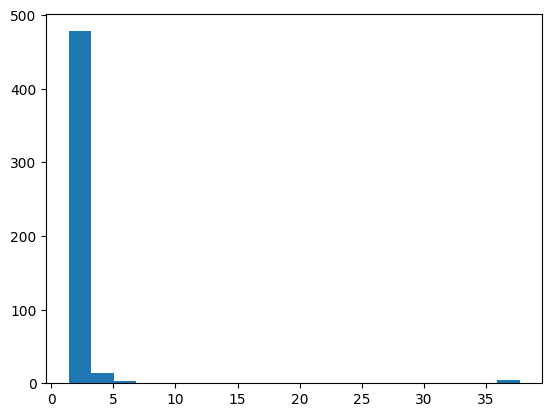

In [18]:
plt.hist(rmse_all_variables, bins = 20)
plt.show()

In [19]:
# stats.describe(rmse_all_variables)

## Models without all the variables

### No dummy model

Epoch 1/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 126366.1328 - mean_absolute_error: 354.4399 - val_loss: 143719.8750 - val_mean_absolute_error: 379.0699
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 123075.1719 - mean_absolute_error: 349.7978 - val_loss: 137376.9375 - val_mean_absolute_error: 370.6091
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 115541.6953 - mean_absolute_error: 338.7994 - val_loss: 116695.5234 - val_mean_absolute_error: 341.5694
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 92883.3125 - mean_absolute_error: 303.3195 - val_loss: 82505.1328 - val_mean_absolute_error: 287.1920
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 59391.8945 - mean_absolute_error: 241.6534 - val_loss: 43866.7461 - val_mean_absolute_error: 209.3822
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 27548.9395 - mean_absolute_error: 162.5531 - val_loss: 15700.5508 - val_mean_absolute_error: 125.1979
Epoch 7/100
41/41 ━━━━━━━━━

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7521 - mean_absolute_error: 1.6242 - val_loss: 6.8512 - val_mean_absolute_error: 2.1003
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4946 - mean_absolute_error: 1.5198 - val_loss: 3.5651 - val_mean_absolute_error: 1.4738
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.9146 - mean_absolute_error: 1.5620 - val_loss: 3.4668 - val_mean_absolute_error: 1.4635
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8487 - mean_absolute_error: 1.5760 - val_loss: 11.9036 - val_mean_absolute_error: 3.0607
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4152 - mean_absolute_error: 2.1478 - val_loss: 4.0966 - val_mean_absolute_error: 1.5896
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7600 - mean_absolute_error: 1.6534 - val_loss: 4.8883 - val_mean_absolute_error: 1.7340
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4384 - mean_absolute_error: 1.7169 - val_loss: 7.4897 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6729 - mean_absolute_error: 1.5492 - val_loss: 3.7508 - val_mean_absolute_error: 1.5245
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3199 - mean_absolute_error: 1.4948 - val_loss: 3.2627 - val_mean_absolute_error: 1.4218
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1500 - mean_absolute_error: 1.6221 - val_loss: 3.4549 - val_mean_absolute_error: 1.4600
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1606 - mean_absolute_error: 1.4876 - val_loss: 3.3257 - val_mean_absolute_error: 1.4348
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4449 - mean_absolute_error: 1.4925 - val_loss: 7.9659 - val_mean_absolute_error: 2.3231
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2575 - mean_absolute_error: 1.9559 - val_loss: 4.2522 - val_mean_absolute_error: 1.6170
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7794 - mean_absolute_error: 1.8150 - val_loss: 6.6072 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0627 - mean_absolute_error: 1.6497 - val_loss: 3.5987 - val_mean_absolute_error: 1.4815
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2266 - mean_absolute_error: 1.6512 - val_loss: 3.7514 - val_mean_absolute_error: 1.5221
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5152 - mean_absolute_error: 1.7472 - val_loss: 10.8993 - val_mean_absolute_error: 2.8975
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.8896 - mean_absolute_error: 2.5059 - val_loss: 8.3459 - val_mean_absolute_error: 2.4789
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1607 - mean_absolute_error: 1.8313 - val_loss: 5.0926 - val_mean_absolute_error: 1.7672
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4641 - mean_absolute_error: 2.1288 - val_loss: 3.8144 - val_mean_absolute_error: 1.5463
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7375 - mean_absolute_error: 1.7817 - val_loss: 3.6257 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5377 - mean_absolute_error: 1.5140 - val_loss: 3.2832 - val_mean_absolute_error: 1.4262
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1321 - mean_absolute_error: 1.6725 - val_loss: 6.9937 - val_mean_absolute_error: 2.1308
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2561 - mean_absolute_error: 1.6586 - val_loss: 3.5214 - val_mean_absolute_error: 1.4772
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1630 - mean_absolute_error: 1.8831 - val_loss: 3.4420 - val_mean_absolute_error: 1.4572
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7491 - mean_absolute_error: 1.5754 - val_loss: 3.3496 - val_mean_absolute_error: 1.4409
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6917 - mean_absolute_error: 1.5905 - val_loss: 3.6123 - val_mean_absolute_error: 1.4944
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9011 - mean_absolute_error: 1.8027 - val_loss: 4.3921 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3218 - mean_absolute_error: 1.6809 - val_loss: 3.6021 - val_mean_absolute_error: 1.4935
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9992 - mean_absolute_error: 1.8023 - val_loss: 6.2999 - val_mean_absolute_error: 1.9901
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4778 - mean_absolute_error: 1.5313 - val_loss: 3.3532 - val_mean_absolute_error: 1.4407
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0536 - mean_absolute_error: 1.5964 - val_loss: 3.9057 - val_mean_absolute_error: 1.5568
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.5896 - mean_absolute_error: 2.0500 - val_loss: 4.2429 - val_mean_absolute_error: 1.6113
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5445 - mean_absolute_error: 1.5411 - val_loss: 5.2216 - val_mean_absolute_error: 1.8448
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0777 - mean_absolute_error: 1.6277 - val_loss: 3.5910 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0335 - mean_absolute_error: 1.6054 - val_loss: 3.3656 - val_mean_absolute_error: 1.4405
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5909 - mean_absolute_error: 1.6099 - val_loss: 3.6986 - val_mean_absolute_error: 1.4977
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.4541 - mean_absolute_error: 2.4366 - val_loss: 4.2367 - val_mean_absolute_error: 1.6356
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6161 - mean_absolute_error: 1.7825 - val_loss: 4.0774 - val_mean_absolute_error: 1.6152
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2421 - mean_absolute_error: 1.8753 - val_loss: 3.3952 - val_mean_absolute_error: 1.4473
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9429 - mean_absolute_error: 1.8321 - val_loss: 5.1395 - val_mean_absolute_error: 1.8381
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6973 - mean_absolute_error: 1.7694 - val_loss: 14.1116 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2467 - mean_absolute_error: 1.4834 - val_loss: 3.5370 - val_mean_absolute_error: 1.4755
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3989 - mean_absolute_error: 1.7021 - val_loss: 3.4289 - val_mean_absolute_error: 1.4549
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2534 - mean_absolute_error: 1.6931 - val_loss: 5.7912 - val_mean_absolute_error: 1.8969
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8193 - mean_absolute_error: 1.6073 - val_loss: 7.2906 - val_mean_absolute_error: 2.1914
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3001 - mean_absolute_error: 1.6491 - val_loss: 6.3538 - val_mean_absolute_error: 2.0832
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7469 - mean_absolute_error: 1.6017 - val_loss: 9.5588 - val_mean_absolute_error: 2.6109
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2145 - mean_absolute_error: 1.9022 - val_loss: 4.0888 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6537 - mean_absolute_error: 1.6461 - val_loss: 3.4019 - val_mean_absolute_error: 1.4509
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4460 - mean_absolute_error: 1.5083 - val_loss: 3.8140 - val_mean_absolute_error: 1.5389
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2206 - mean_absolute_error: 1.9135 - val_loss: 4.7438 - val_mean_absolute_error: 1.7345
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1576 - mean_absolute_error: 1.6388 - val_loss: 3.5651 - val_mean_absolute_error: 1.4747
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6845 - mean_absolute_error: 1.5116 - val_loss: 3.5107 - val_mean_absolute_error: 1.4708
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0111 - mean_absolute_error: 1.4296 - val_loss: 4.2757 - val_mean_absolute_error: 1.6235
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0014 - mean_absolute_error: 1.6630 - val_loss: 4.2403 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2436 - mean_absolute_error: 1.8744 - val_loss: 3.4346 - val_mean_absolute_error: 1.4521
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.3936 - mean_absolute_error: 1.4347 - val_loss: 3.3235 - val_mean_absolute_error: 1.4356
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1982 - mean_absolute_error: 1.6887 - val_loss: 3.3212 - val_mean_absolute_error: 1.4377
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4650 - mean_absolute_error: 1.9422 - val_loss: 4.0268 - val_mean_absolute_error: 1.5829
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7529 - mean_absolute_error: 1.6077 - val_loss: 3.5684 - val_mean_absolute_error: 1.4867
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4700 - mean_absolute_error: 1.8635 - val_loss: 4.3606 - val_mean_absolute_error: 1.6408
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4180 - mean_absolute_error: 1.4929 - val_loss: 5.0963 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2956 - mean_absolute_error: 1.9500 - val_loss: 9.6025 - val_mean_absolute_error: 2.7052
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8411 - mean_absolute_error: 1.6096 - val_loss: 3.8949 - val_mean_absolute_error: 1.5575
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0950 - mean_absolute_error: 1.8157 - val_loss: 3.2857 - val_mean_absolute_error: 1.4297
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6592 - mean_absolute_error: 1.5391 - val_loss: 5.7446 - val_mean_absolute_error: 1.9591
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5206 - mean_absolute_error: 1.7488 - val_loss: 4.1490 - val_mean_absolute_error: 1.6114
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5053 - mean_absolute_error: 1.7482 - val_loss: 3.5710 - val_mean_absolute_error: 1.4857
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8472 - mean_absolute_error: 1.6433 - val_loss: 3.7780 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3157 - mean_absolute_error: 1.7037 - val_loss: 4.7841 - val_mean_absolute_error: 1.7107
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6752 - mean_absolute_error: 1.5179 - val_loss: 4.1736 - val_mean_absolute_error: 1.6087
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3534 - mean_absolute_error: 1.5185 - val_loss: 3.4105 - val_mean_absolute_error: 1.4511
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5819 - mean_absolute_error: 1.7557 - val_loss: 7.0856 - val_mean_absolute_error: 2.1496
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8229 - mean_absolute_error: 2.0384 - val_loss: 3.2853 - val_mean_absolute_error: 1.4269
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.7851 - mean_absolute_error: 1.5751 - val_loss: 3.5386 - val_mean_absolute_error: 1.4747
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4016 - mean_absolute_error: 1.5540 - val_loss: 3.4055 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5164 - mean_absolute_error: 1.5192 - val_loss: 4.5113 - val_mean_absolute_error: 1.6650
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6310 - mean_absolute_error: 1.5410 - val_loss: 11.1002 - val_mean_absolute_error: 2.9365
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.4255 - mean_absolute_error: 2.4155 - val_loss: 3.4629 - val_mean_absolute_error: 1.4492
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1039 - mean_absolute_error: 1.6613 - val_loss: 7.5277 - val_mean_absolute_error: 2.3220
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9362 - mean_absolute_error: 1.5443 - val_loss: 5.7434 - val_mean_absolute_error: 1.9668
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9612 - mean_absolute_error: 1.8357 - val_loss: 4.2877 - val_mean_absolute_error: 1.6398
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6024 - mean_absolute_error: 1.5575 - val_loss: 3.5122 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.8084 - mean_absolute_error: 1.7510 - val_loss: 6.6411 - val_mean_absolute_error: 2.1645
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1646 - mean_absolute_error: 1.8561 - val_loss: 3.7654 - val_mean_absolute_error: 1.5135
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8223 - mean_absolute_error: 1.7853 - val_loss: 3.3392 - val_mean_absolute_error: 1.4386
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7259 - mean_absolute_error: 1.5794 - val_loss: 3.2712 - val_mean_absolute_error: 1.4264
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8079 - mean_absolute_error: 1.6062 - val_loss: 3.3068 - val_mean_absolute_error: 1.4256
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1821 - mean_absolute_error: 1.7124 - val_loss: 3.5535 - val_mean_absolute_error: 1.4848
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7349 - mean_absolute_error: 1.5601 - val_loss: 5.0950 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.7028 - mean_absolute_error: 2.2288 - val_loss: 3.4200 - val_mean_absolute_error: 1.4521
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7321 - mean_absolute_error: 1.5807 - val_loss: 4.8213 - val_mean_absolute_error: 1.7625
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.5854 - mean_absolute_error: 2.3074 - val_loss: 6.0045 - val_mean_absolute_error: 1.9354
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3593 - mean_absolute_error: 1.6989 - val_loss: 3.3803 - val_mean_absolute_error: 1.4393
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8101 - mean_absolute_error: 1.6106 - val_loss: 3.2803 - val_mean_absolute_error: 1.4288
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.9874 - mean_absolute_error: 1.6079 - val_loss: 4.9496 - val_mean_absolute_error: 1.7833
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5735 - mean_absolute_error: 1.7284 - val_loss: 3.8563 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9550 - mean_absolute_error: 1.6036 - val_loss: 3.7635 - val_mean_absolute_error: 1.5258
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6625 - mean_absolute_error: 1.5407 - val_loss: 4.3786 - val_mean_absolute_error: 1.6447
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6613 - mean_absolute_error: 1.5116 - val_loss: 3.4302 - val_mean_absolute_error: 1.4491
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2051 - mean_absolute_error: 1.4636 - val_loss: 5.1825 - val_mean_absolute_error: 1.7893
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6515 - mean_absolute_error: 1.7246 - val_loss: 4.0023 - val_mean_absolute_error: 1.5694
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6147 - mean_absolute_error: 1.6065 - val_loss: 3.4098 - val_mean_absolute_error: 1.4536
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2154 - mean_absolute_error: 1.5143 - val_loss: 6.3030 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8537 - mean_absolute_error: 1.6323 - val_loss: 5.9695 - val_mean_absolute_error: 1.9326
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6753 - mean_absolute_error: 1.7489 - val_loss: 3.3725 - val_mean_absolute_error: 1.4509
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3772 - mean_absolute_error: 1.9189 - val_loss: 8.9119 - val_mean_absolute_error: 2.4939
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3986 - mean_absolute_error: 1.9585 - val_loss: 7.0659 - val_mean_absolute_error: 2.2384
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.6407 - mean_absolute_error: 2.0213 - val_loss: 3.4803 - val_mean_absolute_error: 1.4671
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4957 - mean_absolute_error: 1.5271 - val_loss: 11.3459 - val_mean_absolute_error: 2.9115
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6680 - mean_absolute_error: 1.8159 - val_loss: 3.3964 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 9.1551 - mean_absolute_error: 2.3704 - val_loss: 3.6714 - val_mean_absolute_error: 1.5079
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6592 - mean_absolute_error: 1.5082 - val_loss: 3.3335 - val_mean_absolute_error: 1.4366
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8114 - mean_absolute_error: 1.5569 - val_loss: 5.2192 - val_mean_absolute_error: 1.8466
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4827 - mean_absolute_error: 1.9430 - val_loss: 3.5373 - val_mean_absolute_error: 1.4588
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0661 - mean_absolute_error: 1.8621 - val_loss: 3.8853 - val_mean_absolute_error: 1.5513
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9022 - mean_absolute_error: 1.5755 - val_loss: 3.4271 - val_mean_absolute_error: 1.4540
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5879 - mean_absolute_error: 1.5514 - val_loss: 6.2706 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1233 - mean_absolute_error: 1.6142 - val_loss: 3.3892 - val_mean_absolute_error: 1.4497
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8572 - mean_absolute_error: 1.6416 - val_loss: 6.8785 - val_mean_absolute_error: 2.1106
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1871 - mean_absolute_error: 1.6026 - val_loss: 3.8685 - val_mean_absolute_error: 1.5506
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9080 - mean_absolute_error: 1.8695 - val_loss: 9.2733 - val_mean_absolute_error: 2.5667
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2290 - mean_absolute_error: 2.0418 - val_loss: 3.4543 - val_mean_absolute_error: 1.4625
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1922 - mean_absolute_error: 1.7011 - val_loss: 14.2801 - val_mean_absolute_error: 3.3536
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.6973 - mean_absolute_error: 2.2472 - val_loss: 3.4891 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9006 - mean_absolute_error: 1.5687 - val_loss: 5.6988 - val_mean_absolute_error: 1.9454
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6459 - mean_absolute_error: 1.5730 - val_loss: 6.6992 - val_mean_absolute_error: 2.0718
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.7121 - mean_absolute_error: 2.2587 - val_loss: 3.9340 - val_mean_absolute_error: 1.5638
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5900 - mean_absolute_error: 1.5538 - val_loss: 7.3106 - val_mean_absolute_error: 2.2708
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.4510 - mean_absolute_error: 1.6894 - val_loss: 3.7322 - val_mean_absolute_error: 1.5176
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6347 - mean_absolute_error: 1.5054 - val_loss: 6.2177 - val_mean_absolute_error: 1.9795
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9275 - mean_absolute_error: 1.6566 - val_loss: 4.3279 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5053 - mean_absolute_error: 1.7595 - val_loss: 4.9683 - val_mean_absolute_error: 1.7884
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2779 - mean_absolute_error: 1.6881 - val_loss: 3.9667 - val_mean_absolute_error: 1.5707
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9854 - mean_absolute_error: 1.6752 - val_loss: 3.5587 - val_mean_absolute_error: 1.4813
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.8497 - mean_absolute_error: 2.4737 - val_loss: 6.1955 - val_mean_absolute_error: 2.0503
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1497 - mean_absolute_error: 1.6161 - val_loss: 4.3340 - val_mean_absolute_error: 1.6411
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6267 - mean_absolute_error: 1.9664 - val_loss: 5.2747 - val_mean_absolute_error: 1.8055
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5523 - mean_absolute_error: 1.7677 - val_loss: 4.2623 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6690 - mean_absolute_error: 1.5126 - val_loss: 5.4145 - val_mean_absolute_error: 1.8860
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5831 - mean_absolute_error: 1.9304 - val_loss: 3.4460 - val_mean_absolute_error: 1.4592
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4248 - mean_absolute_error: 1.4926 - val_loss: 3.6897 - val_mean_absolute_error: 1.5133
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0960 - mean_absolute_error: 1.6693 - val_loss: 5.1564 - val_mean_absolute_error: 1.7855
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5775 - mean_absolute_error: 1.5354 - val_loss: 3.4688 - val_mean_absolute_error: 1.4657
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7067 - mean_absolute_error: 1.6229 - val_loss: 3.4782 - val_mean_absolute_error: 1.4655
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2800 - mean_absolute_error: 1.5187 - val_loss: 3.5475 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0085 - mean_absolute_error: 1.6836 - val_loss: 4.5487 - val_mean_absolute_error: 1.6752
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5928 - mean_absolute_error: 1.6816 - val_loss: 3.5728 - val_mean_absolute_error: 1.4924
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6536 - mean_absolute_error: 1.9343 - val_loss: 6.1289 - val_mean_absolute_error: 1.9629
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3137 - mean_absolute_error: 1.7471 - val_loss: 11.0603 - val_mean_absolute_error: 2.8687
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1590 - mean_absolute_error: 1.9218 - val_loss: 3.4667 - val_mean_absolute_error: 1.4652
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4831 - mean_absolute_error: 1.7234 - val_loss: 4.5690 - val_mean_absolute_error: 1.6976
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6042 - mean_absolute_error: 1.7054 - val_loss: 3.3844 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1615 - mean_absolute_error: 1.4336 - val_loss: 3.6308 - val_mean_absolute_error: 1.4901
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2038 - mean_absolute_error: 1.6482 - val_loss: 3.3400 - val_mean_absolute_error: 1.4349
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2566 - mean_absolute_error: 1.4719 - val_loss: 5.3550 - val_mean_absolute_error: 1.8219
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7649 - mean_absolute_error: 1.7189 - val_loss: 4.7364 - val_mean_absolute_error: 1.7413
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5058 - mean_absolute_error: 1.5308 - val_loss: 3.7312 - val_mean_absolute_error: 1.5215
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6903 - mean_absolute_error: 1.7225 - val_loss: 4.6877 - val_mean_absolute_error: 1.7272
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8979 - mean_absolute_error: 1.6087 - val_loss: 3.5577 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8862 - mean_absolute_error: 1.6308 - val_loss: 4.4603 - val_mean_absolute_error: 1.6627
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3771 - mean_absolute_error: 1.7750 - val_loss: 3.9438 - val_mean_absolute_error: 1.5674
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3274 - mean_absolute_error: 1.6876 - val_loss: 5.2112 - val_mean_absolute_error: 1.7942
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0812 - mean_absolute_error: 1.9210 - val_loss: 3.9405 - val_mean_absolute_error: 1.5719
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6865 - mean_absolute_error: 1.7817 - val_loss: 3.5662 - val_mean_absolute_error: 1.4840
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3133 - mean_absolute_error: 1.7069 - val_loss: 3.9090 - val_mean_absolute_error: 1.5568
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4203 - mean_absolute_error: 1.5168 - val_loss: 3.6330 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6626 - mean_absolute_error: 1.7963 - val_loss: 6.4018 - val_mean_absolute_error: 2.0120
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4089 - mean_absolute_error: 1.4937 - val_loss: 4.1992 - val_mean_absolute_error: 1.6212
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4787 - mean_absolute_error: 1.4977 - val_loss: 7.7842 - val_mean_absolute_error: 2.2908
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.0606 - mean_absolute_error: 2.1660 - val_loss: 6.2574 - val_mean_absolute_error: 1.9843
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7431 - mean_absolute_error: 1.5803 - val_loss: 3.3227 - val_mean_absolute_error: 1.4383
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5662 - mean_absolute_error: 1.4988 - val_loss: 4.4299 - val_mean_absolute_error: 1.6506
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8660 - mean_absolute_error: 1.5921 - val_loss: 5.4588 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7511 - mean_absolute_error: 1.5208 - val_loss: 5.5511 - val_mean_absolute_error: 1.8558
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2607 - mean_absolute_error: 1.4805 - val_loss: 5.1023 - val_mean_absolute_error: 1.8131
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8660 - mean_absolute_error: 1.5871 - val_loss: 3.3517 - val_mean_absolute_error: 1.4418
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4765 - mean_absolute_error: 1.5289 - val_loss: 3.3521 - val_mean_absolute_error: 1.4422
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6632 - mean_absolute_error: 1.5317 - val_loss: 4.0258 - val_mean_absolute_error: 1.5818
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0287 - mean_absolute_error: 1.5670 - val_loss: 3.3933 - val_mean_absolute_error: 1.4458
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6968 - mean_absolute_error: 1.5851 - val_loss: 3.3697 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7240 - mean_absolute_error: 1.6647 - val_loss: 3.5027 - val_mean_absolute_error: 1.4735
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5790 - mean_absolute_error: 1.5508 - val_loss: 5.1209 - val_mean_absolute_error: 1.7806
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0922 - mean_absolute_error: 1.6495 - val_loss: 4.9553 - val_mean_absolute_error: 1.7524
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4983 - mean_absolute_error: 1.5473 - val_loss: 3.9286 - val_mean_absolute_error: 1.5660
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5650 - mean_absolute_error: 1.5930 - val_loss: 5.2445 - val_mean_absolute_error: 1.8009
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4026 - mean_absolute_error: 1.6282 - val_loss: 3.4055 - val_mean_absolute_error: 1.4522
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9466 - mean_absolute_error: 1.6280 - val_loss: 6.2475 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7283 - mean_absolute_error: 1.7683 - val_loss: 3.8216 - val_mean_absolute_error: 1.5397
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7347 - mean_absolute_error: 1.7357 - val_loss: 8.6130 - val_mean_absolute_error: 2.4316
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.7732 - mean_absolute_error: 2.4096 - val_loss: 4.3648 - val_mean_absolute_error: 1.6413
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5600 - mean_absolute_error: 1.5463 - val_loss: 3.4290 - val_mean_absolute_error: 1.4605
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3561 - mean_absolute_error: 1.5472 - val_loss: 3.3206 - val_mean_absolute_error: 1.4372
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5708 - mean_absolute_error: 1.7152 - val_loss: 9.5968 - val_mean_absolute_error: 2.6981
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8503 - mean_absolute_error: 1.7705 - val_loss: 4.8182 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9733 - mean_absolute_error: 1.4348 - val_loss: 3.5754 - val_mean_absolute_error: 1.4876
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9224 - mean_absolute_error: 1.6221 - val_loss: 3.5781 - val_mean_absolute_error: 1.4791
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4755 - mean_absolute_error: 1.5272 - val_loss: 4.1634 - val_mean_absolute_error: 1.6066
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3405 - mean_absolute_error: 1.6621 - val_loss: 9.3540 - val_mean_absolute_error: 2.6495
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4561 - mean_absolute_error: 2.0207 - val_loss: 4.5441 - val_mean_absolute_error: 1.7099
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4044 - mean_absolute_error: 1.9108 - val_loss: 4.7189 - val_mean_absolute_error: 1.7041
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9840 - mean_absolute_error: 1.5952 - val_loss: 4.0028 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0131 - mean_absolute_error: 1.6016 - val_loss: 4.7787 - val_mean_absolute_error: 1.7179
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5855 - mean_absolute_error: 1.5253 - val_loss: 6.9096 - val_mean_absolute_error: 2.1158
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0666 - mean_absolute_error: 1.6570 - val_loss: 3.8705 - val_mean_absolute_error: 1.5606
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9091 - mean_absolute_error: 1.8416 - val_loss: 3.3512 - val_mean_absolute_error: 1.4446
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1980 - mean_absolute_error: 1.6309 - val_loss: 3.3993 - val_mean_absolute_error: 1.4512
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2772 - mean_absolute_error: 1.8485 - val_loss: 4.4762 - val_mean_absolute_error: 1.6783
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9606 - mean_absolute_error: 1.6034 - val_loss: 3.4523 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6858 - mean_absolute_error: 1.7797 - val_loss: 3.9757 - val_mean_absolute_error: 1.5725
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9887 - mean_absolute_error: 1.4901 - val_loss: 3.4328 - val_mean_absolute_error: 1.4590
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6914 - mean_absolute_error: 1.5845 - val_loss: 3.4962 - val_mean_absolute_error: 1.4715
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7001 - mean_absolute_error: 1.7542 - val_loss: 4.3662 - val_mean_absolute_error: 1.6439
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5665 - mean_absolute_error: 1.7819 - val_loss: 4.3149 - val_mean_absolute_error: 1.6302
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1366 - mean_absolute_error: 1.9017 - val_loss: 3.7865 - val_mean_absolute_error: 1.5324
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8740 - mean_absolute_error: 1.8065 - val_loss: 4.9896 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1655 - mean_absolute_error: 1.7257 - val_loss: 3.2787 - val_mean_absolute_error: 1.4292
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0684 - mean_absolute_error: 1.8695 - val_loss: 3.3429 - val_mean_absolute_error: 1.4355
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0760 - mean_absolute_error: 1.6338 - val_loss: 4.1374 - val_mean_absolute_error: 1.6105
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5712 - mean_absolute_error: 1.6142 - val_loss: 4.8119 - val_mean_absolute_error: 1.7209
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3309 - mean_absolute_error: 1.5397 - val_loss: 3.8961 - val_mean_absolute_error: 1.5565
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1463 - mean_absolute_error: 1.6858 - val_loss: 3.6120 - val_mean_absolute_error: 1.4955
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8837 - mean_absolute_error: 1.5397 - val_loss: 3.3570 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2549 - mean_absolute_error: 1.6987 - val_loss: 7.3792 - val_mean_absolute_error: 2.2829
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9872 - mean_absolute_error: 2.0089 - val_loss: 3.5331 - val_mean_absolute_error: 1.4712
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8520 - mean_absolute_error: 1.8024 - val_loss: 3.3344 - val_mean_absolute_error: 1.4403
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9545 - mean_absolute_error: 1.8725 - val_loss: 3.8979 - val_mean_absolute_error: 1.5487
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9111 - mean_absolute_error: 1.3959 - val_loss: 3.2828 - val_mean_absolute_error: 1.4307
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4733 - mean_absolute_error: 1.5372 - val_loss: 3.3118 - val_mean_absolute_error: 1.4364
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9577 - mean_absolute_error: 1.6314 - val_loss: 7.1493 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1437 - mean_absolute_error: 1.6558 - val_loss: 4.8357 - val_mean_absolute_error: 1.7617
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4006 - mean_absolute_error: 1.7452 - val_loss: 3.5385 - val_mean_absolute_error: 1.4809
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3706 - mean_absolute_error: 1.5152 - val_loss: 3.7541 - val_mean_absolute_error: 1.5251
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2245 - mean_absolute_error: 1.4883 - val_loss: 8.9395 - val_mean_absolute_error: 2.5032
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.7134 - mean_absolute_error: 2.3490 - val_loss: 3.7882 - val_mean_absolute_error: 1.5350
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.0498 - mean_absolute_error: 1.7087 - val_loss: 5.9270 - val_mean_absolute_error: 1.9265
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7128 - mean_absolute_error: 1.5978 - val_loss: 5.2271 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3675 - mean_absolute_error: 1.7244 - val_loss: 3.7322 - val_mean_absolute_error: 1.5298
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9913 - mean_absolute_error: 1.5911 - val_loss: 3.3160 - val_mean_absolute_error: 1.4388
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8720 - mean_absolute_error: 1.5255 - val_loss: 3.7639 - val_mean_absolute_error: 1.5194
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7844 - mean_absolute_error: 1.5695 - val_loss: 7.7895 - val_mean_absolute_error: 2.2787
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4531 - mean_absolute_error: 1.9228 - val_loss: 3.4840 - val_mean_absolute_error: 1.4624
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2542 - mean_absolute_error: 1.8961 - val_loss: 4.1317 - val_mean_absolute_error: 1.6077
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8211 - mean_absolute_error: 1.6234 - val_loss: 4.3178 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.3248 - mean_absolute_error: 1.9353 - val_loss: 3.7012 - val_mean_absolute_error: 1.5213
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2753 - mean_absolute_error: 1.4796 - val_loss: 3.5105 - val_mean_absolute_error: 1.4746
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4858 - mean_absolute_error: 1.7783 - val_loss: 3.3464 - val_mean_absolute_error: 1.4356
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8295 - mean_absolute_error: 1.5794 - val_loss: 3.3842 - val_mean_absolute_error: 1.4392
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5105 - mean_absolute_error: 1.5093 - val_loss: 5.3451 - val_mean_absolute_error: 1.8671
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3336 - mean_absolute_error: 1.9359 - val_loss: 9.3916 - val_mean_absolute_error: 2.5846
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2759 - mean_absolute_error: 1.8720 - val_loss: 3.8610 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6178 - mean_absolute_error: 1.5472 - val_loss: 3.5543 - val_mean_absolute_error: 1.4846
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3238 - mean_absolute_error: 1.4875 - val_loss: 10.3308 - val_mean_absolute_error: 2.8008
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.7669 - mean_absolute_error: 2.0132 - val_loss: 5.2445 - val_mean_absolute_error: 1.8020
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1562 - mean_absolute_error: 1.4919 - val_loss: 3.6007 - val_mean_absolute_error: 1.4890
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9621 - mean_absolute_error: 1.6696 - val_loss: 4.1451 - val_mean_absolute_error: 1.6095
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2008 - mean_absolute_error: 1.7480 - val_loss: 3.5084 - val_mean_absolute_error: 1.4748
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5985 - mean_absolute_error: 1.5610 - val_loss: 9.7635 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.7457 - mean_absolute_error: 1.9811 - val_loss: 3.3518 - val_mean_absolute_error: 1.4432
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0611 - mean_absolute_error: 1.6064 - val_loss: 3.3412 - val_mean_absolute_error: 1.4379
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0178 - mean_absolute_error: 1.4436 - val_loss: 5.6590 - val_mean_absolute_error: 1.8762
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7538 - mean_absolute_error: 1.5843 - val_loss: 5.3296 - val_mean_absolute_error: 1.8656
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4739 - mean_absolute_error: 1.7293 - val_loss: 5.0467 - val_mean_absolute_error: 1.7669
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0479 - mean_absolute_error: 1.6856 - val_loss: 4.0502 - val_mean_absolute_error: 1.5866
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.0479 - mean_absolute_error: 1.6430 - val_loss: 4.8581 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3290 - mean_absolute_error: 1.7037 - val_loss: 6.0008 - val_mean_absolute_error: 1.9373
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3704 - mean_absolute_error: 1.4975 - val_loss: 3.7964 - val_mean_absolute_error: 1.5401
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1368 - mean_absolute_error: 1.4575 - val_loss: 3.7105 - val_mean_absolute_error: 1.5189
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.0854 - mean_absolute_error: 1.4600 - val_loss: 3.6067 - val_mean_absolute_error: 1.4970
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2691 - mean_absolute_error: 1.6889 - val_loss: 3.4528 - val_mean_absolute_error: 1.4633
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9514 - mean_absolute_error: 1.5847 - val_loss: 5.6255 - val_mean_absolute_error: 1.9346
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4997 - mean_absolute_error: 1.5880 - val_loss: 4.9240 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.6412 - mean_absolute_error: 2.1121 - val_loss: 3.8065 - val_mean_absolute_error: 1.5359
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0303 - mean_absolute_error: 1.6343 - val_loss: 3.8641 - val_mean_absolute_error: 1.5451
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0607 - mean_absolute_error: 1.4885 - val_loss: 4.9197 - val_mean_absolute_error: 1.7441
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9018 - mean_absolute_error: 1.6332 - val_loss: 3.3717 - val_mean_absolute_error: 1.4475
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4452 - mean_absolute_error: 1.5219 - val_loss: 3.3457 - val_mean_absolute_error: 1.4397
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4252 - mean_absolute_error: 1.5025 - val_loss: 3.6544 - val_mean_absolute_error: 1.5060
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6284 - mean_absolute_error: 1.5351 - val_loss: 10.6322 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.4454 - mean_absolute_error: 2.1066 - val_loss: 5.5270 - val_mean_absolute_error: 1.8541
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6878 - mean_absolute_error: 1.7697 - val_loss: 4.9011 - val_mean_absolute_error: 1.7392
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5546 - mean_absolute_error: 1.5212 - val_loss: 5.4070 - val_mean_absolute_error: 1.8326
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4547 - mean_absolute_error: 1.9163 - val_loss: 7.1816 - val_mean_absolute_error: 2.2691
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.9441 - mean_absolute_error: 1.7742 - val_loss: 7.9932 - val_mean_absolute_error: 2.3264
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0075 - mean_absolute_error: 1.8775 - val_loss: 3.5186 - val_mean_absolute_error: 1.4657
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4827 - mean_absolute_error: 1.6875 - val_loss: 4.7787 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.3990 - mean_absolute_error: 2.1210 - val_loss: 4.5055 - val_mean_absolute_error: 1.6647
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7413 - mean_absolute_error: 1.5795 - val_loss: 3.3481 - val_mean_absolute_error: 1.4436
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3929 - mean_absolute_error: 1.6502 - val_loss: 8.7063 - val_mean_absolute_error: 2.5372
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6625 - mean_absolute_error: 1.7820 - val_loss: 3.4806 - val_mean_absolute_error: 1.4651
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.8272 - mean_absolute_error: 1.5807 - val_loss: 3.3072 - val_mean_absolute_error: 1.4248
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2730 - mean_absolute_error: 1.6506 - val_loss: 3.4384 - val_mean_absolute_error: 1.4606
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8991 - mean_absolute_error: 1.6014 - val_loss: 8.3274 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.8311 - mean_absolute_error: 1.8335 - val_loss: 4.2034 - val_mean_absolute_error: 1.6240
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0625 - mean_absolute_error: 1.5835 - val_loss: 8.9328 - val_mean_absolute_error: 2.5066
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6503 - mean_absolute_error: 1.7202 - val_loss: 3.4157 - val_mean_absolute_error: 1.4579
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3526 - mean_absolute_error: 1.4998 - val_loss: 3.4910 - val_mean_absolute_error: 1.4685
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6576 - mean_absolute_error: 1.5214 - val_loss: 3.7579 - val_mean_absolute_error: 1.5280
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8736 - mean_absolute_error: 1.6043 - val_loss: 4.1069 - val_mean_absolute_error: 1.5972
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5653 - mean_absolute_error: 1.8975 - val_loss: 11.3285 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1278 - mean_absolute_error: 1.5998 - val_loss: 3.5614 - val_mean_absolute_error: 1.4840
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6913 - mean_absolute_error: 1.4709 - val_loss: 3.9734 - val_mean_absolute_error: 1.5724
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.2610 - mean_absolute_error: 1.4765 - val_loss: 3.3768 - val_mean_absolute_error: 1.4482
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1633 - mean_absolute_error: 1.4624 - val_loss: 5.5540 - val_mean_absolute_error: 1.8596
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5900 - mean_absolute_error: 1.7526 - val_loss: 3.4454 - val_mean_absolute_error: 1.4611
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2271 - mean_absolute_error: 1.6383 - val_loss: 3.6915 - val_mean_absolute_error: 1.5118
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3271 - mean_absolute_error: 1.7728 - val_loss: 3.5516 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8639 - mean_absolute_error: 1.6113 - val_loss: 3.3576 - val_mean_absolute_error: 1.4430
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1253 - mean_absolute_error: 1.6650 - val_loss: 9.0404 - val_mean_absolute_error: 2.5143
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.0652 - mean_absolute_error: 2.2121 - val_loss: 3.8748 - val_mean_absolute_error: 1.5518
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9092 - mean_absolute_error: 1.6366 - val_loss: 3.3200 - val_mean_absolute_error: 1.4387
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9633 - mean_absolute_error: 1.8128 - val_loss: 3.7452 - val_mean_absolute_error: 1.5281
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2249 - mean_absolute_error: 1.6520 - val_loss: 5.2898 - val_mean_absolute_error: 1.8119
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9145 - mean_absolute_error: 1.5910 - val_loss: 3.4293 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.0222 - mean_absolute_error: 1.8648 - val_loss: 3.3455 - val_mean_absolute_error: 1.4423
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5433 - mean_absolute_error: 1.5102 - val_loss: 5.5190 - val_mean_absolute_error: 1.8521
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4229 - mean_absolute_error: 2.0955 - val_loss: 4.4847 - val_mean_absolute_error: 1.6658
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4328 - mean_absolute_error: 1.5054 - val_loss: 3.3163 - val_mean_absolute_error: 1.4371
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2533 - mean_absolute_error: 1.4795 - val_loss: 4.0186 - val_mean_absolute_error: 1.5808
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9403 - mean_absolute_error: 1.8436 - val_loss: 3.8516 - val_mean_absolute_error: 1.5433
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9414 - mean_absolute_error: 1.5640 - val_loss: 6.3316 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1749 - mean_absolute_error: 1.6635 - val_loss: 5.1060 - val_mean_absolute_error: 1.8170
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6846 - mean_absolute_error: 1.5831 - val_loss: 3.3657 - val_mean_absolute_error: 1.4452
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4908 - mean_absolute_error: 1.7524 - val_loss: 5.6726 - val_mean_absolute_error: 1.9357
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3186 - mean_absolute_error: 1.7315 - val_loss: 3.2827 - val_mean_absolute_error: 1.4301
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4597 - mean_absolute_error: 1.5386 - val_loss: 3.3788 - val_mean_absolute_error: 1.4416
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1338 - mean_absolute_error: 1.4201 - val_loss: 4.6452 - val_mean_absolute_error: 1.7262
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8227 - mean_absolute_error: 1.6846 - val_loss: 4.5070 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6071 - mean_absolute_error: 1.5069 - val_loss: 3.4574 - val_mean_absolute_error: 1.4482
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2631 - mean_absolute_error: 1.8383 - val_loss: 3.3094 - val_mean_absolute_error: 1.4359
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8948 - mean_absolute_error: 1.7712 - val_loss: 3.2549 - val_mean_absolute_error: 1.4257
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4683 - mean_absolute_error: 1.5257 - val_loss: 3.5404 - val_mean_absolute_error: 1.4738
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2792 - mean_absolute_error: 1.5032 - val_loss: 5.3316 - val_mean_absolute_error: 1.8199
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4068 - mean_absolute_error: 1.5645 - val_loss: 11.5121 - val_mean_absolute_error: 2.9429
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8383 - mean_absolute_error: 1.6517 - val_loss: 5.9007 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0740 - mean_absolute_error: 1.3976 - val_loss: 3.3075 - val_mean_absolute_error: 1.4280
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.3211 - mean_absolute_error: 1.4936 - val_loss: 4.2531 - val_mean_absolute_error: 1.6257
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3161 - mean_absolute_error: 1.4443 - val_loss: 6.4275 - val_mean_absolute_error: 2.0238
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3102 - mean_absolute_error: 2.1186 - val_loss: 3.9087 - val_mean_absolute_error: 1.5474
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.9318 - mean_absolute_error: 1.6264 - val_loss: 4.7109 - val_mean_absolute_error: 1.7072
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4076 - mean_absolute_error: 1.5091 - val_loss: 3.2757 - val_mean_absolute_error: 1.4269
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5160 - mean_absolute_error: 1.5486 - val_loss: 3.6277 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5730 - mean_absolute_error: 1.7437 - val_loss: 6.5739 - val_mean_absolute_error: 2.0480
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5211 - mean_absolute_error: 1.7310 - val_loss: 3.4211 - val_mean_absolute_error: 1.4552
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6882 - mean_absolute_error: 1.6023 - val_loss: 11.2132 - val_mean_absolute_error: 2.8886
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1766 - mean_absolute_error: 1.6441 - val_loss: 3.4422 - val_mean_absolute_error: 1.4610
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4869 - mean_absolute_error: 1.5092 - val_loss: 4.0368 - val_mean_absolute_error: 1.5839
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0805 - mean_absolute_error: 1.6423 - val_loss: 8.0222 - val_mean_absolute_error: 2.4250
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2065 - mean_absolute_error: 1.9126 - val_loss: 5.8380 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6215 - mean_absolute_error: 1.5793 - val_loss: 4.2204 - val_mean_absolute_error: 1.6274
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7061 - mean_absolute_error: 1.8034 - val_loss: 3.3910 - val_mean_absolute_error: 1.4510
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5616 - mean_absolute_error: 1.5039 - val_loss: 4.9753 - val_mean_absolute_error: 1.7540
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0731 - mean_absolute_error: 1.4947 - val_loss: 5.5790 - val_mean_absolute_error: 1.8609
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9926 - mean_absolute_error: 1.4206 - val_loss: 6.7100 - val_mean_absolute_error: 2.1516
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2355 - mean_absolute_error: 1.7112 - val_loss: 3.5412 - val_mean_absolute_error: 1.4831
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8722 - mean_absolute_error: 1.6107 - val_loss: 3.7987 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.6185 - mean_absolute_error: 1.9717 - val_loss: 4.3614 - val_mean_absolute_error: 1.6622
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5271 - mean_absolute_error: 1.8796 - val_loss: 4.6290 - val_mean_absolute_error: 1.7074
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9291 - mean_absolute_error: 1.8026 - val_loss: 3.3521 - val_mean_absolute_error: 1.4438
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5739 - mean_absolute_error: 1.5820 - val_loss: 4.1240 - val_mean_absolute_error: 1.6035
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6867 - mean_absolute_error: 1.5642 - val_loss: 7.1065 - val_mean_absolute_error: 2.1548
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2159 - mean_absolute_error: 1.8852 - val_loss: 4.3424 - val_mean_absolute_error: 1.6557
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0974 - mean_absolute_error: 1.6857 - val_loss: 3.5119 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6492 - mean_absolute_error: 1.7073 - val_loss: 3.6851 - val_mean_absolute_error: 1.5156
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4673 - mean_absolute_error: 1.5084 - val_loss: 6.1578 - val_mean_absolute_error: 2.0575
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9837 - mean_absolute_error: 1.8886 - val_loss: 3.4023 - val_mean_absolute_error: 1.4529
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0393 - mean_absolute_error: 1.6940 - val_loss: 3.7103 - val_mean_absolute_error: 1.5080
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2635 - mean_absolute_error: 1.6345 - val_loss: 3.8896 - val_mean_absolute_error: 1.5621
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3596 - mean_absolute_error: 1.4762 - val_loss: 3.3916 - val_mean_absolute_error: 1.4517
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2023 - mean_absolute_error: 1.4719 - val_loss: 3.5304 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9952 - mean_absolute_error: 1.6255 - val_loss: 3.8584 - val_mean_absolute_error: 1.5477
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4172 - mean_absolute_error: 1.4874 - val_loss: 4.2590 - val_mean_absolute_error: 1.6357
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2991 - mean_absolute_error: 1.6949 - val_loss: 4.6965 - val_mean_absolute_error: 1.7275
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2767 - mean_absolute_error: 1.6923 - val_loss: 6.0438 - val_mean_absolute_error: 1.9483
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0450 - mean_absolute_error: 1.6999 - val_loss: 3.5546 - val_mean_absolute_error: 1.4816
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9070 - mean_absolute_error: 1.6077 - val_loss: 3.7847 - val_mean_absolute_error: 1.5350
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9143 - mean_absolute_error: 1.6550 - val_loss: 7.3266 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1845 - mean_absolute_error: 1.6170 - val_loss: 7.1315 - val_mean_absolute_error: 2.1603
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4728 - mean_absolute_error: 1.5458 - val_loss: 6.4827 - val_mean_absolute_error: 2.0323
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0555 - mean_absolute_error: 1.6224 - val_loss: 3.5662 - val_mean_absolute_error: 1.4860
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9551 - mean_absolute_error: 1.4384 - val_loss: 5.3550 - val_mean_absolute_error: 1.8213
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2179 - mean_absolute_error: 1.8228 - val_loss: 3.4531 - val_mean_absolute_error: 1.4639
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4286 - mean_absolute_error: 1.5066 - val_loss: 9.5747 - val_mean_absolute_error: 2.6168
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4567 - mean_absolute_error: 1.9449 - val_loss: 3.2911 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7518 - mean_absolute_error: 1.8278 - val_loss: 6.1281 - val_mean_absolute_error: 1.9620
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8616 - mean_absolute_error: 1.5562 - val_loss: 3.2980 - val_mean_absolute_error: 1.4316
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5152 - mean_absolute_error: 1.5847 - val_loss: 3.2813 - val_mean_absolute_error: 1.4292
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2958 - mean_absolute_error: 1.4874 - val_loss: 4.7095 - val_mean_absolute_error: 1.7312
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9434 - mean_absolute_error: 2.0441 - val_loss: 3.4181 - val_mean_absolute_error: 1.4565
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.6090 - mean_absolute_error: 1.5940 - val_loss: 4.4817 - val_mean_absolute_error: 1.6780
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3797 - mean_absolute_error: 1.7171 - val_loss: 5.4007 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5674 - mean_absolute_error: 1.9453 - val_loss: 3.8477 - val_mean_absolute_error: 1.5391
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4134 - mean_absolute_error: 1.8963 - val_loss: 4.3296 - val_mean_absolute_error: 1.6399
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3799 - mean_absolute_error: 1.4882 - val_loss: 3.4870 - val_mean_absolute_error: 1.4695
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6681 - mean_absolute_error: 1.5618 - val_loss: 3.2790 - val_mean_absolute_error: 1.4332
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9040 - mean_absolute_error: 1.6477 - val_loss: 4.5548 - val_mean_absolute_error: 1.6932
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1281 - mean_absolute_error: 1.4535 - val_loss: 3.2638 - val_mean_absolute_error: 1.4271
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1508 - mean_absolute_error: 1.6239 - val_loss: 3.5979 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2512 - mean_absolute_error: 1.9052 - val_loss: 3.6320 - val_mean_absolute_error: 1.5013
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1942 - mean_absolute_error: 1.6937 - val_loss: 5.2076 - val_mean_absolute_error: 1.7936
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5681 - mean_absolute_error: 1.6383 - val_loss: 6.7317 - val_mean_absolute_error: 2.1697
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.8036 - mean_absolute_error: 1.6098 - val_loss: 3.3612 - val_mean_absolute_error: 1.4483
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0151 - mean_absolute_error: 1.6516 - val_loss: 3.3771 - val_mean_absolute_error: 1.4455
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7572 - mean_absolute_error: 1.7959 - val_loss: 12.7943 - val_mean_absolute_error: 3.1374
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 8.5221 - mean_absolute_error: 2.3229 - val_loss: 3.5879 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1080 - mean_absolute_error: 1.4713 - val_loss: 3.5892 - val_mean_absolute_error: 1.4901
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2983 - mean_absolute_error: 1.4578 - val_loss: 3.3522 - val_mean_absolute_error: 1.4478
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0471 - mean_absolute_error: 1.4370 - val_loss: 3.7359 - val_mean_absolute_error: 1.5220
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4698 - mean_absolute_error: 1.7743 - val_loss: 8.9632 - val_mean_absolute_error: 2.5109
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6344 - mean_absolute_error: 1.5047 - val_loss: 5.3953 - val_mean_absolute_error: 1.8724
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0133 - mean_absolute_error: 1.6176 - val_loss: 3.5981 - val_mean_absolute_error: 1.4960
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4264 - mean_absolute_error: 1.5376 - val_loss: 8.4090 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3044 - mean_absolute_error: 1.4575 - val_loss: 3.4790 - val_mean_absolute_error: 1.4671
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3975 - mean_absolute_error: 1.6927 - val_loss: 4.1980 - val_mean_absolute_error: 1.6122
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7262 - mean_absolute_error: 2.0814 - val_loss: 6.5403 - val_mean_absolute_error: 2.1135
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8321 - mean_absolute_error: 1.5860 - val_loss: 3.3793 - val_mean_absolute_error: 1.4416
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3704 - mean_absolute_error: 1.5309 - val_loss: 4.8972 - val_mean_absolute_error: 1.7413
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0885 - mean_absolute_error: 1.6358 - val_loss: 3.5695 - val_mean_absolute_error: 1.4865
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7437 - mean_absolute_error: 1.8409 - val_loss: 3.4304 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1766 - mean_absolute_error: 1.6797 - val_loss: 3.9063 - val_mean_absolute_error: 1.5633
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6702 - mean_absolute_error: 1.5463 - val_loss: 3.2507 - val_mean_absolute_error: 1.4164
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3903 - mean_absolute_error: 1.7217 - val_loss: 10.4245 - val_mean_absolute_error: 2.7606
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4707 - mean_absolute_error: 1.7407 - val_loss: 3.4766 - val_mean_absolute_error: 1.4684
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6526 - mean_absolute_error: 1.5684 - val_loss: 9.8908 - val_mean_absolute_error: 2.7474
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0031 - mean_absolute_error: 2.0248 - val_loss: 3.6104 - val_mean_absolute_error: 1.4932
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5393 - mean_absolute_error: 1.5460 - val_loss: 3.2774 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7402 - mean_absolute_error: 1.5869 - val_loss: 5.4654 - val_mean_absolute_error: 1.8430
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1787 - mean_absolute_error: 1.7154 - val_loss: 3.4690 - val_mean_absolute_error: 1.4665
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1669 - mean_absolute_error: 1.6539 - val_loss: 3.3230 - val_mean_absolute_error: 1.4332
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.3789 - mean_absolute_error: 1.7432 - val_loss: 3.3259 - val_mean_absolute_error: 1.4412
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0075 - mean_absolute_error: 1.4517 - val_loss: 7.3309 - val_mean_absolute_error: 2.2030
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4116 - mean_absolute_error: 1.6539 - val_loss: 3.3485 - val_mean_absolute_error: 1.4371
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9130 - mean_absolute_error: 1.4194 - val_loss: 6.4816 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2628 - mean_absolute_error: 1.6440 - val_loss: 3.3784 - val_mean_absolute_error: 1.4512
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5999 - mean_absolute_error: 1.9750 - val_loss: 10.3848 - val_mean_absolute_error: 2.7463
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4867 - mean_absolute_error: 2.1386 - val_loss: 5.5317 - val_mean_absolute_error: 1.8550
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6893 - mean_absolute_error: 1.5978 - val_loss: 6.4090 - val_mean_absolute_error: 2.0166
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6977 - mean_absolute_error: 1.6487 - val_loss: 3.9759 - val_mean_absolute_error: 1.5733
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0310 - mean_absolute_error: 1.6697 - val_loss: 3.2627 - val_mean_absolute_error: 1.4311
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5652 - mean_absolute_error: 1.7306 - val_loss: 3.2444 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3391 - mean_absolute_error: 1.5187 - val_loss: 3.8198 - val_mean_absolute_error: 1.5411
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3253 - mean_absolute_error: 1.6672 - val_loss: 3.3960 - val_mean_absolute_error: 1.4550
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9983 - mean_absolute_error: 1.6243 - val_loss: 5.3200 - val_mean_absolute_error: 1.8658
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0302 - mean_absolute_error: 1.6102 - val_loss: 5.4523 - val_mean_absolute_error: 1.8418
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8290 - mean_absolute_error: 2.0147 - val_loss: 7.8671 - val_mean_absolute_error: 2.3047
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.2441 - mean_absolute_error: 1.5436 - val_loss: 3.7355 - val_mean_absolute_error: 1.5226
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1368 - mean_absolute_error: 1.4846 - val_loss: 4.0350 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9805 - mean_absolute_error: 1.8451 - val_loss: 4.1418 - val_mean_absolute_error: 1.6054
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5816 - mean_absolute_error: 1.5308 - val_loss: 3.5061 - val_mean_absolute_error: 1.4638
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1958 - mean_absolute_error: 1.6542 - val_loss: 5.9772 - val_mean_absolute_error: 1.9368
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9917 - mean_absolute_error: 1.6936 - val_loss: 9.9328 - val_mean_absolute_error: 2.7429
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2864 - mean_absolute_error: 2.0546 - val_loss: 3.3369 - val_mean_absolute_error: 1.4478
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3.4660 - mean_absolute_error: 1.3335 - val_loss: 3.3931 - val_mean_absolute_error: 1.4523
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2608 - mean_absolute_error: 1.8458 - val_loss: 10.7545 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8618 - mean_absolute_error: 1.6517 - val_loss: 4.7756 - val_mean_absolute_error: 1.7469
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7488 - mean_absolute_error: 1.5767 - val_loss: 5.8991 - val_mean_absolute_error: 1.9871
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1516 - mean_absolute_error: 1.8866 - val_loss: 4.0000 - val_mean_absolute_error: 1.5675
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2641 - mean_absolute_error: 1.4766 - val_loss: 4.9622 - val_mean_absolute_error: 1.7523
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5923 - mean_absolute_error: 1.5461 - val_loss: 5.8302 - val_mean_absolute_error: 1.9841
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1197 - mean_absolute_error: 1.8705 - val_loss: 5.9761 - val_mean_absolute_error: 1.9328
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9610 - mean_absolute_error: 1.6305 - val_loss: 4.3828 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2084 - mean_absolute_error: 1.6345 - val_loss: 3.6083 - val_mean_absolute_error: 1.4819
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2866 - mean_absolute_error: 1.6615 - val_loss: 3.3584 - val_mean_absolute_error: 1.4472
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7297 - mean_absolute_error: 1.7702 - val_loss: 6.6931 - val_mean_absolute_error: 2.1442
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3641 - mean_absolute_error: 1.9150 - val_loss: 5.7534 - val_mean_absolute_error: 1.8959
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8300 - mean_absolute_error: 1.6139 - val_loss: 3.3093 - val_mean_absolute_error: 1.4294
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2363 - mean_absolute_error: 1.6355 - val_loss: 4.6711 - val_mean_absolute_error: 1.7119
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6125 - mean_absolute_error: 1.5571 - val_loss: 4.1846 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.7958 - mean_absolute_error: 1.9697 - val_loss: 8.6329 - val_mean_absolute_error: 2.5066
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4779 - mean_absolute_error: 1.6267 - val_loss: 5.0428 - val_mean_absolute_error: 1.7669
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0923 - mean_absolute_error: 1.8529 - val_loss: 3.8205 - val_mean_absolute_error: 1.5414
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8208 - mean_absolute_error: 1.3905 - val_loss: 3.6822 - val_mean_absolute_error: 1.5112
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6902 - mean_absolute_error: 1.5525 - val_loss: 4.7264 - val_mean_absolute_error: 1.7076
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.7022 - mean_absolute_error: 1.8071 - val_loss: 9.1830 - val_mean_absolute_error: 2.5494
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9630 - mean_absolute_error: 1.9949 - val_loss: 4.2580 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1449 - mean_absolute_error: 1.4317 - val_loss: 3.3518 - val_mean_absolute_error: 1.4411
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7684 - mean_absolute_error: 1.5996 - val_loss: 4.3992 - val_mean_absolute_error: 1.6529
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2573 - mean_absolute_error: 2.0694 - val_loss: 4.0631 - val_mean_absolute_error: 1.5850
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4470 - mean_absolute_error: 1.4736 - val_loss: 3.9274 - val_mean_absolute_error: 1.5670
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0106 - mean_absolute_error: 1.7978 - val_loss: 5.3142 - val_mean_absolute_error: 1.8168
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8777 - mean_absolute_error: 2.0366 - val_loss: 5.0550 - val_mean_absolute_error: 1.8103
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9412 - mean_absolute_error: 1.8304 - val_loss: 10.0867 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3655 - mean_absolute_error: 1.4781 - val_loss: 3.3343 - val_mean_absolute_error: 1.4449
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9557 - mean_absolute_error: 1.5737 - val_loss: 3.4149 - val_mean_absolute_error: 1.4595
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8892 - mean_absolute_error: 1.8026 - val_loss: 3.3045 - val_mean_absolute_error: 1.4383
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3982 - mean_absolute_error: 1.5283 - val_loss: 3.9251 - val_mean_absolute_error: 1.5753
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3429 - mean_absolute_error: 1.4893 - val_loss: 3.7865 - val_mean_absolute_error: 1.5227
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8593 - mean_absolute_error: 1.8425 - val_loss: 7.4697 - val_mean_absolute_error: 2.2272
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.6166 - mean_absolute_error: 2.1454 - val_loss: 4.5507 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6364 - mean_absolute_error: 1.4902 - val_loss: 3.5625 - val_mean_absolute_error: 1.4866
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6784 - mean_absolute_error: 1.5722 - val_loss: 3.3010 - val_mean_absolute_error: 1.4367
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0390 - mean_absolute_error: 1.4545 - val_loss: 8.2036 - val_mean_absolute_error: 2.3674
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8631 - mean_absolute_error: 1.8012 - val_loss: 3.7054 - val_mean_absolute_error: 1.5168
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0683 - mean_absolute_error: 1.8177 - val_loss: 3.5628 - val_mean_absolute_error: 1.4901
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0332 - mean_absolute_error: 1.4243 - val_loss: 3.5587 - val_mean_absolute_error: 1.4805
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6684 - mean_absolute_error: 1.5142 - val_loss: 5.2029 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0678 - mean_absolute_error: 1.4772 - val_loss: 5.7628 - val_mean_absolute_error: 1.8969
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1751 - mean_absolute_error: 1.6620 - val_loss: 4.8180 - val_mean_absolute_error: 1.7596
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3248 - mean_absolute_error: 1.5196 - val_loss: 4.0729 - val_mean_absolute_error: 1.5932
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.1164 - mean_absolute_error: 2.1935 - val_loss: 3.3285 - val_mean_absolute_error: 1.4403
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4286 - mean_absolute_error: 1.5066 - val_loss: 3.9587 - val_mean_absolute_error: 1.5701
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6564 - mean_absolute_error: 1.6085 - val_loss: 3.3782 - val_mean_absolute_error: 1.4493
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5799 - mean_absolute_error: 1.5119 - val_loss: 3.6203 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1770 - mean_absolute_error: 1.6756 - val_loss: 3.2922 - val_mean_absolute_error: 1.4346
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6362 - mean_absolute_error: 1.5887 - val_loss: 5.4788 - val_mean_absolute_error: 1.8468
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5212 - mean_absolute_error: 1.7876 - val_loss: 3.2864 - val_mean_absolute_error: 1.4321
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6641 - mean_absolute_error: 1.5284 - val_loss: 7.0617 - val_mean_absolute_error: 2.1461
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4970 - mean_absolute_error: 1.7742 - val_loss: 3.5759 - val_mean_absolute_error: 1.4902
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2608 - mean_absolute_error: 1.4791 - val_loss: 3.5464 - val_mean_absolute_error: 1.4855
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.1884 - mean_absolute_error: 1.4662 - val_loss: 5.1349 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1348 - mean_absolute_error: 1.6939 - val_loss: 4.4618 - val_mean_absolute_error: 1.6621
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2030 - mean_absolute_error: 1.6388 - val_loss: 4.1418 - val_mean_absolute_error: 1.6057
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.0799 - mean_absolute_error: 1.4260 - val_loss: 3.3763 - val_mean_absolute_error: 1.4497
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3910 - mean_absolute_error: 1.4609 - val_loss: 6.1148 - val_mean_absolute_error: 2.0416
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8357 - mean_absolute_error: 1.6235 - val_loss: 3.3359 - val_mean_absolute_error: 1.4414
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9535 - mean_absolute_error: 1.6428 - val_loss: 3.3851 - val_mean_absolute_error: 1.4464
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4735 - mean_absolute_error: 1.5301 - val_loss: 3.6562 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6252 - mean_absolute_error: 1.5469 - val_loss: 3.9870 - val_mean_absolute_error: 1.5848
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4693 - mean_absolute_error: 1.5204 - val_loss: 3.4106 - val_mean_absolute_error: 1.4498
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1984 - mean_absolute_error: 1.8194 - val_loss: 3.9275 - val_mean_absolute_error: 1.5658
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6523 - mean_absolute_error: 1.5672 - val_loss: 4.4802 - val_mean_absolute_error: 1.6746
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2044 - mean_absolute_error: 1.9169 - val_loss: 3.3111 - val_mean_absolute_error: 1.4380
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1899 - mean_absolute_error: 1.4482 - val_loss: 3.2993 - val_mean_absolute_error: 1.4352
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7079 - mean_absolute_error: 1.5667 - val_loss: 5.0318 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5657 - mean_absolute_error: 1.5094 - val_loss: 3.7373 - val_mean_absolute_error: 1.5235
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3138 - mean_absolute_error: 1.4815 - val_loss: 3.6786 - val_mean_absolute_error: 1.5099
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9609 - mean_absolute_error: 1.6615 - val_loss: 4.5261 - val_mean_absolute_error: 1.6742
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.3391 - mean_absolute_error: 1.5198 - val_loss: 4.9022 - val_mean_absolute_error: 1.7716
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2426 - mean_absolute_error: 1.6944 - val_loss: 4.0900 - val_mean_absolute_error: 1.5983
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5928 - mean_absolute_error: 1.7905 - val_loss: 3.5286 - val_mean_absolute_error: 1.4806
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2113 - mean_absolute_error: 1.6571 - val_loss: 4.9483 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1887 - mean_absolute_error: 1.4721 - val_loss: 3.3743 - val_mean_absolute_error: 1.4470
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4299 - mean_absolute_error: 1.5460 - val_loss: 10.8964 - val_mean_absolute_error: 2.8944
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 7.4671 - mean_absolute_error: 2.0431 - val_loss: 3.7569 - val_mean_absolute_error: 1.5239
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8623 - mean_absolute_error: 1.6352 - val_loss: 3.4512 - val_mean_absolute_error: 1.4633
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6316 - mean_absolute_error: 1.6163 - val_loss: 7.1191 - val_mean_absolute_error: 2.1603
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1117 - mean_absolute_error: 1.7069 - val_loss: 3.5276 - val_mean_absolute_error: 1.4792
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5108 - mean_absolute_error: 1.6733 - val_loss: 3.6059 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7829 - mean_absolute_error: 1.5797 - val_loss: 5.4691 - val_mean_absolute_error: 1.8463
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9649 - mean_absolute_error: 1.6077 - val_loss: 4.5577 - val_mean_absolute_error: 1.7055
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4215 - mean_absolute_error: 1.4762 - val_loss: 6.8611 - val_mean_absolute_error: 2.1096
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3629 - mean_absolute_error: 1.7426 - val_loss: 10.7066 - val_mean_absolute_error: 2.8692
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2400 - mean_absolute_error: 2.0830 - val_loss: 5.4805 - val_mean_absolute_error: 1.8475
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2943 - mean_absolute_error: 1.4953 - val_loss: 3.4705 - val_mean_absolute_error: 1.4687
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4539 - mean_absolute_error: 1.4834 - val_loss: 3.2494 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5357 - mean_absolute_error: 1.4777 - val_loss: 4.8975 - val_mean_absolute_error: 1.7439
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1087 - mean_absolute_error: 1.4405 - val_loss: 3.6749 - val_mean_absolute_error: 1.5108
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3944 - mean_absolute_error: 1.5002 - val_loss: 7.0087 - val_mean_absolute_error: 2.1365
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5695 - mean_absolute_error: 1.5779 - val_loss: 3.5580 - val_mean_absolute_error: 1.4851
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6347 - mean_absolute_error: 1.7888 - val_loss: 5.9060 - val_mean_absolute_error: 1.9250
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3612 - mean_absolute_error: 1.7274 - val_loss: 4.2672 - val_mean_absolute_error: 1.6345
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7518 - mean_absolute_error: 1.5598 - val_loss: 3.3263 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9319 - mean_absolute_error: 1.4171 - val_loss: 5.0335 - val_mean_absolute_error: 1.7686
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5698 - mean_absolute_error: 1.5289 - val_loss: 4.0466 - val_mean_absolute_error: 1.5892
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7164 - mean_absolute_error: 1.5369 - val_loss: 4.3493 - val_mean_absolute_error: 1.6560
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.5608 - mean_absolute_error: 2.1110 - val_loss: 4.6259 - val_mean_absolute_error: 1.6918
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8659 - mean_absolute_error: 1.8225 - val_loss: 4.2191 - val_mean_absolute_error: 1.6223
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6389 - mean_absolute_error: 1.7157 - val_loss: 3.8475 - val_mean_absolute_error: 1.5464
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9771 - mean_absolute_error: 1.6477 - val_loss: 5.4106 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5595 - mean_absolute_error: 1.5213 - val_loss: 3.3612 - val_mean_absolute_error: 1.4488
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2379 - mean_absolute_error: 1.4647 - val_loss: 3.3175 - val_mean_absolute_error: 1.4382
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7113 - mean_absolute_error: 1.6345 - val_loss: 3.2280 - val_mean_absolute_error: 1.4228
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9769 - mean_absolute_error: 1.7768 - val_loss: 3.8034 - val_mean_absolute_error: 1.5355
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9921 - mean_absolute_error: 1.3944 - val_loss: 3.9268 - val_mean_absolute_error: 1.5682
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6043 - mean_absolute_error: 1.7753 - val_loss: 4.2929 - val_mean_absolute_error: 1.6323
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1398 - mean_absolute_error: 1.4758 - val_loss: 5.0716 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9128 - mean_absolute_error: 1.6542 - val_loss: 5.5224 - val_mean_absolute_error: 1.8541
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3620 - mean_absolute_error: 1.5173 - val_loss: 3.6414 - val_mean_absolute_error: 1.5016
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5938 - mean_absolute_error: 1.5152 - val_loss: 3.7469 - val_mean_absolute_error: 1.5253
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5734 - mean_absolute_error: 1.5461 - val_loss: 4.3115 - val_mean_absolute_error: 1.6364
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5070 - mean_absolute_error: 1.5042 - val_loss: 7.6154 - val_mean_absolute_error: 2.2574
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3532 - mean_absolute_error: 1.8820 - val_loss: 3.8268 - val_mean_absolute_error: 1.5407
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.3206 - mean_absolute_error: 1.9218 - val_loss: 4.7173 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4677 - mean_absolute_error: 1.5186 - val_loss: 3.5151 - val_mean_absolute_error: 1.4814
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8909 - mean_absolute_error: 1.7414 - val_loss: 6.8463 - val_mean_absolute_error: 2.1020
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6189 - mean_absolute_error: 1.5471 - val_loss: 3.4666 - val_mean_absolute_error: 1.4739
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4075 - mean_absolute_error: 1.7263 - val_loss: 8.9800 - val_mean_absolute_error: 2.6033
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7593 - mean_absolute_error: 1.7947 - val_loss: 4.3579 - val_mean_absolute_error: 1.6465
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4830 - mean_absolute_error: 1.5276 - val_loss: 3.8919 - val_mean_absolute_error: 1.5558
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0664 - mean_absolute_error: 1.6991 - val_loss: 3.3100 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8553 - mean_absolute_error: 1.6350 - val_loss: 4.7470 - val_mean_absolute_error: 1.7122
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0608 - mean_absolute_error: 1.6388 - val_loss: 3.3474 - val_mean_absolute_error: 1.4432
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7224 - mean_absolute_error: 1.3815 - val_loss: 4.1592 - val_mean_absolute_error: 1.6153
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5039 - mean_absolute_error: 1.6003 - val_loss: 5.7534 - val_mean_absolute_error: 1.9580
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2900 - mean_absolute_error: 1.6779 - val_loss: 5.0116 - val_mean_absolute_error: 1.7638
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6207 - mean_absolute_error: 1.7139 - val_loss: 3.5485 - val_mean_absolute_error: 1.4822
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5324 - mean_absolute_error: 1.5393 - val_loss: 3.2483 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1867 - mean_absolute_error: 1.7572 - val_loss: 3.3044 - val_mean_absolute_error: 1.4357
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4043 - mean_absolute_error: 1.6781 - val_loss: 4.2731 - val_mean_absolute_error: 1.6271
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5333 - mean_absolute_error: 1.5441 - val_loss: 3.3156 - val_mean_absolute_error: 1.4431
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7386 - mean_absolute_error: 1.6060 - val_loss: 4.9105 - val_mean_absolute_error: 1.7457
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2267 - mean_absolute_error: 1.6737 - val_loss: 3.4319 - val_mean_absolute_error: 1.4582
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0554 - mean_absolute_error: 1.5735 - val_loss: 4.1396 - val_mean_absolute_error: 1.6184
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5632 - mean_absolute_error: 1.7468 - val_loss: 8.5428 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0776 - mean_absolute_error: 1.6895 - val_loss: 8.1252 - val_mean_absolute_error: 2.3526
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8258 - mean_absolute_error: 1.5849 - val_loss: 3.7784 - val_mean_absolute_error: 1.5474
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5013 - mean_absolute_error: 1.7341 - val_loss: 4.1232 - val_mean_absolute_error: 1.5977
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7374 - mean_absolute_error: 1.5584 - val_loss: 6.9026 - val_mean_absolute_error: 2.1164
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8600 - mean_absolute_error: 1.6370 - val_loss: 3.8155 - val_mean_absolute_error: 1.5457
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3176 - mean_absolute_error: 1.5735 - val_loss: 11.7156 - val_mean_absolute_error: 2.9747
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3276 - mean_absolute_error: 1.8318 - val_loss: 7.3578 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5316 - mean_absolute_error: 1.5441 - val_loss: 4.6422 - val_mean_absolute_error: 1.7327
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.7037 - mean_absolute_error: 1.8169 - val_loss: 5.4413 - val_mean_absolute_error: 1.8858
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.9074 - mean_absolute_error: 1.9942 - val_loss: 5.0776 - val_mean_absolute_error: 1.7744
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6728 - mean_absolute_error: 1.7420 - val_loss: 3.4055 - val_mean_absolute_error: 1.4569
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2826 - mean_absolute_error: 1.7292 - val_loss: 3.4120 - val_mean_absolute_error: 1.4544
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8430 - mean_absolute_error: 1.6169 - val_loss: 3.6687 - val_mean_absolute_error: 1.5077
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0660 - mean_absolute_error: 1.6487 - val_loss: 5.5203 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.3198 - mean_absolute_error: 1.8863 - val_loss: 3.3845 - val_mean_absolute_error: 1.4521
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8011 - mean_absolute_error: 1.7658 - val_loss: 3.4078 - val_mean_absolute_error: 1.4563
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9296 - mean_absolute_error: 1.4198 - val_loss: 3.3261 - val_mean_absolute_error: 1.4445
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3451 - mean_absolute_error: 1.7325 - val_loss: 7.4385 - val_mean_absolute_error: 2.2233
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.5649 - mean_absolute_error: 1.7711 - val_loss: 7.3634 - val_mean_absolute_error: 2.2815
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1195 - mean_absolute_error: 1.9046 - val_loss: 3.3512 - val_mean_absolute_error: 1.4456
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8243 - mean_absolute_error: 1.3824 - val_loss: 4.2488 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2606 - mean_absolute_error: 1.7015 - val_loss: 3.4102 - val_mean_absolute_error: 1.4568
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1095 - mean_absolute_error: 1.6451 - val_loss: 3.4754 - val_mean_absolute_error: 1.4614
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0075 - mean_absolute_error: 1.3938 - val_loss: 4.2001 - val_mean_absolute_error: 1.6298
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.5419 - mean_absolute_error: 1.5447 - val_loss: 4.3237 - val_mean_absolute_error: 1.6615
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8460 - mean_absolute_error: 1.8004 - val_loss: 4.8277 - val_mean_absolute_error: 1.7621
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3658 - mean_absolute_error: 1.6854 - val_loss: 4.6050 - val_mean_absolute_error: 1.7089
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2435 - mean_absolute_error: 1.7133 - val_loss: 3.6349 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2841 - mean_absolute_error: 1.4968 - val_loss: 3.3339 - val_mean_absolute_error: 1.4453
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7953 - mean_absolute_error: 1.7628 - val_loss: 4.0706 - val_mean_absolute_error: 1.5891
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6177 - mean_absolute_error: 1.7024 - val_loss: 7.4859 - val_mean_absolute_error: 2.2342
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1084 - mean_absolute_error: 1.8251 - val_loss: 3.3797 - val_mean_absolute_error: 1.4448
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7861 - mean_absolute_error: 1.5869 - val_loss: 3.7797 - val_mean_absolute_error: 1.5326
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2561 - mean_absolute_error: 1.7074 - val_loss: 4.1977 - val_mean_absolute_error: 1.6155
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0904 - mean_absolute_error: 1.4303 - val_loss: 3.2669 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5833 - mean_absolute_error: 1.5793 - val_loss: 3.6128 - val_mean_absolute_error: 1.5018
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8257 - mean_absolute_error: 1.5938 - val_loss: 4.5964 - val_mean_absolute_error: 1.7087
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8575 - mean_absolute_error: 1.5652 - val_loss: 3.3026 - val_mean_absolute_error: 1.4401
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3211 - mean_absolute_error: 1.7453 - val_loss: 3.7377 - val_mean_absolute_error: 1.5161
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0723 - mean_absolute_error: 1.4456 - val_loss: 3.7809 - val_mean_absolute_error: 1.5369
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2216 - mean_absolute_error: 1.8586 - val_loss: 3.9060 - val_mean_absolute_error: 1.5612
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.3877 - mean_absolute_error: 1.5511 - val_loss: 5.0427 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5184 - mean_absolute_error: 1.7450 - val_loss: 4.7737 - val_mean_absolute_error: 1.7229
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9181 - mean_absolute_error: 1.6318 - val_loss: 3.9274 - val_mean_absolute_error: 1.5526
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9970 - mean_absolute_error: 1.6624 - val_loss: 5.8069 - val_mean_absolute_error: 1.9082
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6984 - mean_absolute_error: 1.8032 - val_loss: 5.5887 - val_mean_absolute_error: 1.9222
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7291 - mean_absolute_error: 1.6397 - val_loss: 3.3210 - val_mean_absolute_error: 1.4372
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0099 - mean_absolute_error: 1.3823 - val_loss: 3.9912 - val_mean_absolute_error: 1.5758
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2859 - mean_absolute_error: 1.6808 - val_loss: 5.3253 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5260 - mean_absolute_error: 1.5827 - val_loss: 3.7877 - val_mean_absolute_error: 1.5343
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8977 - mean_absolute_error: 1.6108 - val_loss: 3.9346 - val_mean_absolute_error: 1.5810
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5824 - mean_absolute_error: 1.5983 - val_loss: 4.5579 - val_mean_absolute_error: 1.6801
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4079 - mean_absolute_error: 1.5015 - val_loss: 3.6723 - val_mean_absolute_error: 1.5091
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6785 - mean_absolute_error: 1.5703 - val_loss: 3.4508 - val_mean_absolute_error: 1.4651
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4934 - mean_absolute_error: 1.4823 - val_loss: 3.2745 - val_mean_absolute_error: 1.4283
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6351 - mean_absolute_error: 1.7137 - val_loss: 3.4267 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9216 - mean_absolute_error: 1.6390 - val_loss: 5.4806 - val_mean_absolute_error: 1.8471
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.3986 - mean_absolute_error: 1.7186 - val_loss: 6.2771 - val_mean_absolute_error: 2.0649
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1546 - mean_absolute_error: 2.0319 - val_loss: 6.7133 - val_mean_absolute_error: 2.0774
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5964 - mean_absolute_error: 1.7660 - val_loss: 5.2955 - val_mean_absolute_error: 1.8528
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6323 - mean_absolute_error: 1.5491 - val_loss: 3.4922 - val_mean_absolute_error: 1.4728
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1573 - mean_absolute_error: 1.4612 - val_loss: 3.3302 - val_mean_absolute_error: 1.4417
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3431 - mean_absolute_error: 1.4631 - val_loss: 5.4590 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7859 - mean_absolute_error: 1.5860 - val_loss: 3.4975 - val_mean_absolute_error: 1.4710
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2139 - mean_absolute_error: 1.6173 - val_loss: 5.9606 - val_mean_absolute_error: 1.9349
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9980 - mean_absolute_error: 1.6995 - val_loss: 3.6658 - val_mean_absolute_error: 1.5080
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3560 - mean_absolute_error: 1.4794 - val_loss: 3.8540 - val_mean_absolute_error: 1.5461
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2717 - mean_absolute_error: 1.4654 - val_loss: 6.4264 - val_mean_absolute_error: 2.0248
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3200 - mean_absolute_error: 1.7858 - val_loss: 3.5654 - val_mean_absolute_error: 1.4860
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3038 - mean_absolute_error: 1.4774 - val_loss: 3.7261 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0871 - mean_absolute_error: 1.7283 - val_loss: 3.9744 - val_mean_absolute_error: 1.5733
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2098 - mean_absolute_error: 1.4725 - val_loss: 3.3201 - val_mean_absolute_error: 1.4411
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5927 - mean_absolute_error: 1.7479 - val_loss: 3.3240 - val_mean_absolute_error: 1.4324
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6070 - mean_absolute_error: 1.4876 - val_loss: 3.4785 - val_mean_absolute_error: 1.4692
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5382 - mean_absolute_error: 1.5029 - val_loss: 4.5380 - val_mean_absolute_error: 1.6770
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4852 - mean_absolute_error: 1.5348 - val_loss: 5.4075 - val_mean_absolute_error: 1.8808
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.4855 - mean_absolute_error: 2.3135 - val_loss: 3.5027 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6724 - mean_absolute_error: 1.5831 - val_loss: 3.4923 - val_mean_absolute_error: 1.4779
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3210 - mean_absolute_error: 1.6722 - val_loss: 7.5258 - val_mean_absolute_error: 2.3104
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8792 - mean_absolute_error: 1.6236 - val_loss: 3.4800 - val_mean_absolute_error: 1.4723
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6508 - mean_absolute_error: 1.5280 - val_loss: 5.4225 - val_mean_absolute_error: 1.8824
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9136 - mean_absolute_error: 1.8945 - val_loss: 6.3699 - val_mean_absolute_error: 2.0119
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8866 - mean_absolute_error: 1.5942 - val_loss: 9.8573 - val_mean_absolute_error: 2.6648
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8266 - mean_absolute_error: 2.0937 - val_loss: 3.3002 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5170 - mean_absolute_error: 1.5098 - val_loss: 3.5721 - val_mean_absolute_error: 1.4885
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6193 - mean_absolute_error: 1.5709 - val_loss: 3.6240 - val_mean_absolute_error: 1.5034
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9832 - mean_absolute_error: 1.4303 - val_loss: 3.2457 - val_mean_absolute_error: 1.4218
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.6148 - mean_absolute_error: 1.5299 - val_loss: 3.9019 - val_mean_absolute_error: 1.5574
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3654 - mean_absolute_error: 1.5118 - val_loss: 6.1328 - val_mean_absolute_error: 1.9673
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0714 - mean_absolute_error: 1.7135 - val_loss: 6.6140 - val_mean_absolute_error: 2.1418
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 8.7241 - mean_absolute_error: 2.3330 - val_loss: 4.0500 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8069 - mean_absolute_error: 1.7914 - val_loss: 3.6299 - val_mean_absolute_error: 1.4912
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1549 - mean_absolute_error: 1.6947 - val_loss: 3.6884 - val_mean_absolute_error: 1.5133
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6440 - mean_absolute_error: 1.5839 - val_loss: 4.9010 - val_mean_absolute_error: 1.7445
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3702 - mean_absolute_error: 2.0345 - val_loss: 3.6616 - val_mean_absolute_error: 1.5099
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5426 - mean_absolute_error: 1.5505 - val_loss: 3.2635 - val_mean_absolute_error: 1.4331
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9497 - mean_absolute_error: 1.6447 - val_loss: 3.9541 - val_mean_absolute_error: 1.5717
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9688 - mean_absolute_error: 1.6544 - val_loss: 3.3754 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0651 - mean_absolute_error: 1.6538 - val_loss: 3.4430 - val_mean_absolute_error: 1.4594
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6283 - mean_absolute_error: 1.5256 - val_loss: 3.2769 - val_mean_absolute_error: 1.4321
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.5029 - mean_absolute_error: 1.5076 - val_loss: 3.3797 - val_mean_absolute_error: 1.4470
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1324 - mean_absolute_error: 1.4583 - val_loss: 4.0253 - val_mean_absolute_error: 1.5824
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0988 - mean_absolute_error: 1.6522 - val_loss: 7.2592 - val_mean_absolute_error: 2.1883
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3871 - mean_absolute_error: 1.5544 - val_loss: 4.5443 - val_mean_absolute_error: 1.6799
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7984 - mean_absolute_error: 1.5242 - val_loss: 3.3237 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8283 - mean_absolute_error: 1.3871 - val_loss: 4.7374 - val_mean_absolute_error: 1.7419
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6466 - mean_absolute_error: 1.5485 - val_loss: 12.1046 - val_mean_absolute_error: 3.0357
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5522 - mean_absolute_error: 1.7440 - val_loss: 3.3186 - val_mean_absolute_error: 1.4339
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1817 - mean_absolute_error: 1.4852 - val_loss: 3.3501 - val_mean_absolute_error: 1.4477
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.0255 - mean_absolute_error: 1.5719 - val_loss: 3.9994 - val_mean_absolute_error: 1.5697
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9821 - mean_absolute_error: 1.8295 - val_loss: 3.6851 - val_mean_absolute_error: 1.5189
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1132 - mean_absolute_error: 1.8125 - val_loss: 3.3408 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1092 - mean_absolute_error: 1.4765 - val_loss: 3.3373 - val_mean_absolute_error: 1.4419
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4930 - mean_absolute_error: 1.5116 - val_loss: 3.3700 - val_mean_absolute_error: 1.4500
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0004 - mean_absolute_error: 1.4310 - val_loss: 3.4960 - val_mean_absolute_error: 1.4729
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1557 - mean_absolute_error: 1.6351 - val_loss: 4.1121 - val_mean_absolute_error: 1.6158
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8063 - mean_absolute_error: 1.5835 - val_loss: 3.7245 - val_mean_absolute_error: 1.5211
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2189 - mean_absolute_error: 1.7161 - val_loss: 4.0597 - val_mean_absolute_error: 1.6018
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7942 - mean_absolute_error: 1.5958 - val_loss: 3.9817 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1008 - mean_absolute_error: 1.4653 - val_loss: 3.4250 - val_mean_absolute_error: 1.4605
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0664 - mean_absolute_error: 1.6294 - val_loss: 3.6918 - val_mean_absolute_error: 1.5145
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0555 - mean_absolute_error: 1.4494 - val_loss: 6.0615 - val_mean_absolute_error: 1.9508
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2581 - mean_absolute_error: 1.7084 - val_loss: 6.4507 - val_mean_absolute_error: 2.0287
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.5380 - mean_absolute_error: 1.5714 - val_loss: 13.9469 - val_mean_absolute_error: 3.3613
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8660 - mean_absolute_error: 2.0455 - val_loss: 5.6991 - val_mean_absolute_error: 1.8863
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5270 - mean_absolute_error: 1.5363 - val_loss: 5.9688 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0823 - mean_absolute_error: 1.6615 - val_loss: 3.4790 - val_mean_absolute_error: 1.4744
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0400 - mean_absolute_error: 1.4774 - val_loss: 3.5946 - val_mean_absolute_error: 1.4946
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5580 - mean_absolute_error: 1.5805 - val_loss: 4.1690 - val_mean_absolute_error: 1.6074
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2346 - mean_absolute_error: 1.6873 - val_loss: 3.5361 - val_mean_absolute_error: 1.4837
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2794 - mean_absolute_error: 1.6993 - val_loss: 3.3552 - val_mean_absolute_error: 1.4526
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7465 - mean_absolute_error: 1.6022 - val_loss: 3.5977 - val_mean_absolute_error: 1.4981
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2547 - mean_absolute_error: 1.6871 - val_loss: 3.3545 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5067 - mean_absolute_error: 1.4877 - val_loss: 3.3182 - val_mean_absolute_error: 1.4372
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5190 - mean_absolute_error: 1.5041 - val_loss: 3.8114 - val_mean_absolute_error: 1.5482
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3567 - mean_absolute_error: 1.6981 - val_loss: 10.1377 - val_mean_absolute_error: 2.7900
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.8773 - mean_absolute_error: 2.1809 - val_loss: 8.1330 - val_mean_absolute_error: 2.3561
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3481 - mean_absolute_error: 1.6433 - val_loss: 3.3563 - val_mean_absolute_error: 1.4483
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1824 - mean_absolute_error: 1.4471 - val_loss: 3.5196 - val_mean_absolute_error: 1.4777
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0751 - mean_absolute_error: 1.6566 - val_loss: 4.0073 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1615 - mean_absolute_error: 1.4126 - val_loss: 3.5841 - val_mean_absolute_error: 1.4892
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4867 - mean_absolute_error: 1.4723 - val_loss: 3.6435 - val_mean_absolute_error: 1.5045
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2759 - mean_absolute_error: 1.5065 - val_loss: 3.3501 - val_mean_absolute_error: 1.4472
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3200 - mean_absolute_error: 1.4918 - val_loss: 3.9296 - val_mean_absolute_error: 1.5690
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4295 - mean_absolute_error: 1.5234 - val_loss: 3.4834 - val_mean_absolute_error: 1.4700
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8693 - mean_absolute_error: 1.6165 - val_loss: 5.1062 - val_mean_absolute_error: 1.7822
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8568 - mean_absolute_error: 1.6248 - val_loss: 3.7803 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6935 - mean_absolute_error: 1.5454 - val_loss: 3.2838 - val_mean_absolute_error: 1.4369
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2813 - mean_absolute_error: 1.4455 - val_loss: 5.2845 - val_mean_absolute_error: 1.8151
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6481 - mean_absolute_error: 1.7761 - val_loss: 3.3954 - val_mean_absolute_error: 1.4557
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4644 - mean_absolute_error: 1.7719 - val_loss: 3.7347 - val_mean_absolute_error: 1.5221
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8606 - mean_absolute_error: 1.6037 - val_loss: 3.2395 - val_mean_absolute_error: 1.4192
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8757 - mean_absolute_error: 1.6267 - val_loss: 4.3264 - val_mean_absolute_error: 1.6424
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7567 - mean_absolute_error: 1.3979 - val_loss: 3.5367 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0740 - mean_absolute_error: 1.4340 - val_loss: 3.3164 - val_mean_absolute_error: 1.4430
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2830 - mean_absolute_error: 1.6302 - val_loss: 4.4781 - val_mean_absolute_error: 1.6893
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2836 - mean_absolute_error: 1.6941 - val_loss: 3.5594 - val_mean_absolute_error: 1.4922
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7199 - mean_absolute_error: 1.6011 - val_loss: 7.2199 - val_mean_absolute_error: 2.1817
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1120 - mean_absolute_error: 1.6498 - val_loss: 3.2891 - val_mean_absolute_error: 1.4391
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6386 - mean_absolute_error: 1.5185 - val_loss: 3.5869 - val_mean_absolute_error: 1.4905
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.1481 - mean_absolute_error: 1.4911 - val_loss: 3.2904 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7723 - mean_absolute_error: 1.7571 - val_loss: 4.3548 - val_mean_absolute_error: 1.6511
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8328 - mean_absolute_error: 1.5970 - val_loss: 3.3982 - val_mean_absolute_error: 1.4552
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2737 - mean_absolute_error: 1.4815 - val_loss: 3.3503 - val_mean_absolute_error: 1.4449
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4977 - mean_absolute_error: 1.5109 - val_loss: 3.9472 - val_mean_absolute_error: 1.5704
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3456 - mean_absolute_error: 1.7501 - val_loss: 3.2546 - val_mean_absolute_error: 1.4334
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4666 - mean_absolute_error: 1.5685 - val_loss: 3.5902 - val_mean_absolute_error: 1.5050
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0744 - mean_absolute_error: 1.6238 - val_loss: 3.9803 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5687 - mean_absolute_error: 1.5572 - val_loss: 8.0181 - val_mean_absolute_error: 2.3333
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4996 - mean_absolute_error: 1.8962 - val_loss: 4.1410 - val_mean_absolute_error: 1.6036
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9887 - mean_absolute_error: 1.4490 - val_loss: 6.8122 - val_mean_absolute_error: 2.0979
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.8000 - mean_absolute_error: 1.8852 - val_loss: 3.8000 - val_mean_absolute_error: 1.5360
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2526 - mean_absolute_error: 1.6502 - val_loss: 3.9989 - val_mean_absolute_error: 1.5776
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3117 - mean_absolute_error: 1.5084 - val_loss: 7.6817 - val_mean_absolute_error: 2.2724
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4578 - mean_absolute_error: 1.9703 - val_loss: 3.3319 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7423 - mean_absolute_error: 1.3949 - val_loss: 6.6376 - val_mean_absolute_error: 2.0632
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4031 - mean_absolute_error: 1.5098 - val_loss: 4.0064 - val_mean_absolute_error: 1.5807
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.4953 - mean_absolute_error: 1.5174 - val_loss: 3.5386 - val_mean_absolute_error: 1.4700
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4926 - mean_absolute_error: 1.5157 - val_loss: 3.3307 - val_mean_absolute_error: 1.4459
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6590 - mean_absolute_error: 1.5738 - val_loss: 11.8916 - val_mean_absolute_error: 2.9989
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7094 - mean_absolute_error: 1.9651 - val_loss: 5.7592 - val_mean_absolute_error: 1.8972
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7292 - mean_absolute_error: 1.8105 - val_loss: 3.6901 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5825 - mean_absolute_error: 1.5105 - val_loss: 4.8796 - val_mean_absolute_error: 1.7410
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3816 - mean_absolute_error: 1.4945 - val_loss: 3.3416 - val_mean_absolute_error: 1.4349
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6858 - mean_absolute_error: 1.5548 - val_loss: 4.8278 - val_mean_absolute_error: 1.7310
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4396 - mean_absolute_error: 1.7381 - val_loss: 3.4039 - val_mean_absolute_error: 1.4463
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0683 - mean_absolute_error: 1.6147 - val_loss: 4.0077 - val_mean_absolute_error: 1.5800
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0880 - mean_absolute_error: 1.4427 - val_loss: 3.3872 - val_mean_absolute_error: 1.4534
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3177 - mean_absolute_error: 1.4912 - val_loss: 3.4994 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6519 - mean_absolute_error: 1.8199 - val_loss: 3.3188 - val_mean_absolute_error: 1.4320
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1851 - mean_absolute_error: 1.6601 - val_loss: 7.7401 - val_mean_absolute_error: 2.2808
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6851 - mean_absolute_error: 1.7976 - val_loss: 6.6588 - val_mean_absolute_error: 2.1563
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0366 - mean_absolute_error: 1.8557 - val_loss: 3.2742 - val_mean_absolute_error: 1.4355
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8627 - mean_absolute_error: 1.5858 - val_loss: 3.4377 - val_mean_absolute_error: 1.4608
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4126 - mean_absolute_error: 1.5552 - val_loss: 4.1069 - val_mean_absolute_error: 1.5959
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3680 - mean_absolute_error: 1.4926 - val_loss: 3.3155 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6727 - mean_absolute_error: 1.6150 - val_loss: 3.4152 - val_mean_absolute_error: 1.4547
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2936 - mean_absolute_error: 1.4944 - val_loss: 6.3802 - val_mean_absolute_error: 2.0201
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5764 - mean_absolute_error: 1.5417 - val_loss: 6.3012 - val_mean_absolute_error: 2.0643
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1355 - mean_absolute_error: 1.6748 - val_loss: 8.4177 - val_mean_absolute_error: 2.4712
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9020 - mean_absolute_error: 1.7724 - val_loss: 3.2890 - val_mean_absolute_error: 1.4407
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6742 - mean_absolute_error: 1.5470 - val_loss: 3.7077 - val_mean_absolute_error: 1.5112
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9180 - mean_absolute_error: 1.3951 - val_loss: 5.8454 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0639 - mean_absolute_error: 1.6460 - val_loss: 3.3942 - val_mean_absolute_error: 1.4579
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2723 - mean_absolute_error: 1.4776 - val_loss: 3.4684 - val_mean_absolute_error: 1.4649
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6437 - mean_absolute_error: 1.7546 - val_loss: 4.5305 - val_mean_absolute_error: 1.6709
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.8695 - mean_absolute_error: 1.6025 - val_loss: 4.1469 - val_mean_absolute_error: 1.6024
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7995 - mean_absolute_error: 1.5338 - val_loss: 4.4046 - val_mean_absolute_error: 1.6687
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8629 - mean_absolute_error: 1.6013 - val_loss: 3.2844 - val_mean_absolute_error: 1.4386
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.1660 - mean_absolute_error: 1.4457 - val_loss: 3.4065 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.3693 - mean_absolute_error: 1.9635 - val_loss: 6.2830 - val_mean_absolute_error: 1.9959
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.2344 - mean_absolute_error: 1.7184 - val_loss: 3.3223 - val_mean_absolute_error: 1.4458
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3970 - mean_absolute_error: 1.5498 - val_loss: 7.6145 - val_mean_absolute_error: 2.2580
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9718 - mean_absolute_error: 1.6672 - val_loss: 5.3720 - val_mean_absolute_error: 1.8808
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5701 - mean_absolute_error: 1.9496 - val_loss: 3.2512 - val_mean_absolute_error: 1.4334
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5778 - mean_absolute_error: 1.5095 - val_loss: 3.4224 - val_mean_absolute_error: 1.4587
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5181 - mean_absolute_error: 1.4953 - val_loss: 3.2537 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3468 - mean_absolute_error: 1.5236 - val_loss: 6.0948 - val_mean_absolute_error: 2.0282
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6687 - mean_absolute_error: 1.7772 - val_loss: 7.1223 - val_mean_absolute_error: 2.1622
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5606 - mean_absolute_error: 1.5437 - val_loss: 5.0626 - val_mean_absolute_error: 1.8133
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1523 - mean_absolute_error: 1.6686 - val_loss: 3.2814 - val_mean_absolute_error: 1.4382
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5717 - mean_absolute_error: 1.4536 - val_loss: 4.1055 - val_mean_absolute_error: 1.5898
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4529 - mean_absolute_error: 1.5020 - val_loss: 3.2928 - val_mean_absolute_error: 1.4315
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9233 - mean_absolute_error: 1.5996 - val_loss: 3.3798 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4563 - mean_absolute_error: 1.5091 - val_loss: 5.7107 - val_mean_absolute_error: 1.8874
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8888 - mean_absolute_error: 1.5299 - val_loss: 3.4843 - val_mean_absolute_error: 1.4697
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8903 - mean_absolute_error: 1.6167 - val_loss: 3.4642 - val_mean_absolute_error: 1.4666
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1174 - mean_absolute_error: 1.6739 - val_loss: 4.6820 - val_mean_absolute_error: 1.7032
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2448 - mean_absolute_error: 2.0140 - val_loss: 3.7355 - val_mean_absolute_error: 1.5299
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5644 - mean_absolute_error: 1.5160 - val_loss: 3.7964 - val_mean_absolute_error: 1.5382
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6409 - mean_absolute_error: 1.5980 - val_loss: 8.9111 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7759 - mean_absolute_error: 1.5383 - val_loss: 3.8745 - val_mean_absolute_error: 1.5531
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4382 - mean_absolute_error: 1.5295 - val_loss: 3.7201 - val_mean_absolute_error: 1.5208
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2010 - mean_absolute_error: 1.4274 - val_loss: 5.0280 - val_mean_absolute_error: 1.7987
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6505 - mean_absolute_error: 1.5456 - val_loss: 3.9005 - val_mean_absolute_error: 1.5583
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6186 - mean_absolute_error: 1.5762 - val_loss: 5.5845 - val_mean_absolute_error: 1.8655
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2506 - mean_absolute_error: 1.5350 - val_loss: 3.4886 - val_mean_absolute_error: 1.4728
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3707 - mean_absolute_error: 1.5067 - val_loss: 3.3367 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.0570 - mean_absolute_error: 1.8700 - val_loss: 4.0543 - val_mean_absolute_error: 1.5948
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6009 - mean_absolute_error: 1.5243 - val_loss: 3.3061 - val_mean_absolute_error: 1.4401
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5937 - mean_absolute_error: 1.5401 - val_loss: 4.6043 - val_mean_absolute_error: 1.6926
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8717 - mean_absolute_error: 1.7811 - val_loss: 3.2202 - val_mean_absolute_error: 1.4204
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7424 - mean_absolute_error: 1.5344 - val_loss: 3.5116 - val_mean_absolute_error: 1.4767
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5455 - mean_absolute_error: 1.7423 - val_loss: 7.6709 - val_mean_absolute_error: 2.2702
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2485 - mean_absolute_error: 1.7060 - val_loss: 7.5981 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7993 - mean_absolute_error: 1.8186 - val_loss: 4.4191 - val_mean_absolute_error: 1.6677
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6225 - mean_absolute_error: 1.5157 - val_loss: 3.7440 - val_mean_absolute_error: 1.5328
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.7571 - mean_absolute_error: 1.6229 - val_loss: 3.3775 - val_mean_absolute_error: 1.4439
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4298 - mean_absolute_error: 1.7238 - val_loss: 4.1327 - val_mean_absolute_error: 1.6070
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0248 - mean_absolute_error: 1.6187 - val_loss: 3.4485 - val_mean_absolute_error: 1.4563
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6465 - mean_absolute_error: 1.5373 - val_loss: 10.6340 - val_mean_absolute_error: 2.7946
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9532 - mean_absolute_error: 2.0059 - val_loss: 10.3070 -

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3000 - mean_absolute_error: 1.7298 - val_loss: 8.6268 - val_mean_absolute_error: 2.4460
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7086 - mean_absolute_error: 1.5899 - val_loss: 4.0465 - val_mean_absolute_error: 1.5829
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5341 - mean_absolute_error: 1.7242 - val_loss: 8.0373 - val_mean_absolute_error: 2.4250
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1095 - mean_absolute_error: 1.6411 - val_loss: 5.0907 - val_mean_absolute_error: 1.7742
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0286 - mean_absolute_error: 1.6437 - val_loss: 3.2986 - val_mean_absolute_error: 1.4440
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6049 - mean_absolute_error: 1.6076 - val_loss: 3.7621 - val_mean_absolute_error: 1.5368
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1179 - mean_absolute_error: 1.4630 - val_loss: 4.2482 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5793 - mean_absolute_error: 1.5251 - val_loss: 3.6568 - val_mean_absolute_error: 1.5103
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4830 - mean_absolute_error: 1.9118 - val_loss: 5.7004 - val_mean_absolute_error: 1.9435
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.0164 - mean_absolute_error: 1.6531 - val_loss: 3.4226 - val_mean_absolute_error: 1.4600
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8145 - mean_absolute_error: 1.6193 - val_loss: 3.5606 - val_mean_absolute_error: 1.4839
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8999 - mean_absolute_error: 1.8205 - val_loss: 3.2497 - val_mean_absolute_error: 1.4344
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3571 - mean_absolute_error: 1.5027 - val_loss: 3.9335 - val_mean_absolute_error: 1.5669
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7173 - mean_absolute_error: 1.8126 - val_loss: 4.0379 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2375 - mean_absolute_error: 1.4961 - val_loss: 3.2753 - val_mean_absolute_error: 1.4379
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4078 - mean_absolute_error: 1.5311 - val_loss: 3.9399 - val_mean_absolute_error: 1.5717
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0539 - mean_absolute_error: 1.6796 - val_loss: 3.2610 - val_mean_absolute_error: 1.4315
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.0850 - mean_absolute_error: 1.4663 - val_loss: 3.5075 - val_mean_absolute_error: 1.4680
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1946 - mean_absolute_error: 1.4571 - val_loss: 3.4339 - val_mean_absolute_error: 1.4601
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9129 - mean_absolute_error: 1.6329 - val_loss: 3.4513 - val_mean_absolute_error: 1.4639
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4910 - mean_absolute_error: 1.5122 - val_loss: 3.6122 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9195 - mean_absolute_error: 1.7110 - val_loss: 9.0761 - val_mean_absolute_error: 2.5279
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4608 - mean_absolute_error: 1.5597 - val_loss: 5.4129 - val_mean_absolute_error: 1.8361
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3331 - mean_absolute_error: 1.4798 - val_loss: 5.1754 - val_mean_absolute_error: 1.7936
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4234 - mean_absolute_error: 1.4921 - val_loss: 4.8679 - val_mean_absolute_error: 1.7630
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.7174 - mean_absolute_error: 1.5662 - val_loss: 4.0385 - val_mean_absolute_error: 1.5887
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3164 - mean_absolute_error: 1.4858 - val_loss: 3.9204 - val_mean_absolute_error: 1.5647
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4058 - mean_absolute_error: 1.5190 - val_loss: 3.8852 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3439 - mean_absolute_error: 1.4976 - val_loss: 3.3287 - val_mean_absolute_error: 1.4415
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6839 - mean_absolute_error: 1.6290 - val_loss: 3.3257 - val_mean_absolute_error: 1.4456
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7157 - mean_absolute_error: 1.5794 - val_loss: 3.2424 - val_mean_absolute_error: 1.4314
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1805 - mean_absolute_error: 1.5131 - val_loss: 7.6247 - val_mean_absolute_error: 2.2574
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0028 - mean_absolute_error: 1.6307 - val_loss: 4.7789 - val_mean_absolute_error: 1.7620
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5234 - mean_absolute_error: 1.7897 - val_loss: 4.7615 - val_mean_absolute_error: 1.7204
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4785 - mean_absolute_error: 1.5463 - val_loss: 3.3780 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6811 - mean_absolute_error: 1.5148 - val_loss: 4.0092 - val_mean_absolute_error: 1.5833
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9628 - mean_absolute_error: 1.4535 - val_loss: 3.3185 - val_mean_absolute_error: 1.4363
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9426 - mean_absolute_error: 1.5982 - val_loss: 3.6251 - val_mean_absolute_error: 1.4965
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2922 - mean_absolute_error: 1.4751 - val_loss: 4.7271 - val_mean_absolute_error: 1.7416
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0155 - mean_absolute_error: 1.4514 - val_loss: 4.7742 - val_mean_absolute_error: 1.7222
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3323 - mean_absolute_error: 1.5266 - val_loss: 3.4258 - val_mean_absolute_error: 1.4558
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0026 - mean_absolute_error: 1.5980 - val_loss: 4.1905 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3167 - mean_absolute_error: 1.4944 - val_loss: 5.2766 - val_mean_absolute_error: 1.8091
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1855 - mean_absolute_error: 1.7026 - val_loss: 3.8664 - val_mean_absolute_error: 1.5616
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2629 - mean_absolute_error: 1.7288 - val_loss: 3.3073 - val_mean_absolute_error: 1.4457
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1619 - mean_absolute_error: 1.5062 - val_loss: 5.3173 - val_mean_absolute_error: 1.8647
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5352 - mean_absolute_error: 1.9509 - val_loss: 10.3272 - val_mean_absolute_error: 2.7435
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.2328 - mean_absolute_error: 2.2395 - val_loss: 6.4206 - val_mean_absolute_error: 2.1094
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2088 - mean_absolute_error: 1.9127 - val_loss: 3.4359 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3102 - mean_absolute_error: 1.6942 - val_loss: 3.4544 - val_mean_absolute_error: 1.4599
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3198 - mean_absolute_error: 1.6763 - val_loss: 3.2818 - val_mean_absolute_error: 1.4412
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1639 - mean_absolute_error: 1.6862 - val_loss: 3.4196 - val_mean_absolute_error: 1.4576
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9018 - mean_absolute_error: 1.3984 - val_loss: 3.8989 - val_mean_absolute_error: 1.5518
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3672 - mean_absolute_error: 1.8805 - val_loss: 3.6533 - val_mean_absolute_error: 1.5081
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3279 - mean_absolute_error: 1.5473 - val_loss: 4.0034 - val_mean_absolute_error: 1.5879
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.2583 - mean_absolute_error: 1.9210 - val_loss: 3.3238 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3929 - mean_absolute_error: 1.5250 - val_loss: 4.3402 - val_mean_absolute_error: 1.6586
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0367 - mean_absolute_error: 1.8094 - val_loss: 3.2529 - val_mean_absolute_error: 1.4282
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.3557 - mean_absolute_error: 1.5391 - val_loss: 5.6150 - val_mean_absolute_error: 1.8734
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.4987 - mean_absolute_error: 2.2606 - val_loss: 4.4710 - val_mean_absolute_error: 1.6821
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4310 - mean_absolute_error: 1.5561 - val_loss: 3.4749 - val_mean_absolute_error: 1.4705
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3993 - mean_absolute_error: 1.6551 - val_loss: 4.9472 - val_mean_absolute_error: 1.7496
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9474 - mean_absolute_error: 1.8293 - val_loss: 4.1277 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8368 - mean_absolute_error: 1.3832 - val_loss: 3.4676 - val_mean_absolute_error: 1.4723
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2537 - mean_absolute_error: 1.5031 - val_loss: 3.2946 - val_mean_absolute_error: 1.4437
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9764 - mean_absolute_error: 1.5987 - val_loss: 3.8750 - val_mean_absolute_error: 1.5539
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7256 - mean_absolute_error: 1.5909 - val_loss: 3.2873 - val_mean_absolute_error: 1.4418
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0906 - mean_absolute_error: 1.4574 - val_loss: 3.6360 - val_mean_absolute_error: 1.5030
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.7540 - mean_absolute_error: 1.5270 - val_loss: 3.2692 - val_mean_absolute_error: 1.4375
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6580 - mean_absolute_error: 1.5595 - val_loss: 3.2911 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2387 - mean_absolute_error: 1.7278 - val_loss: 6.3138 - val_mean_absolute_error: 2.0042
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3712 - mean_absolute_error: 1.5565 - val_loss: 3.2737 - val_mean_absolute_error: 1.4313
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3030 - mean_absolute_error: 1.7441 - val_loss: 4.3021 - val_mean_absolute_error: 1.6404
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8550 - mean_absolute_error: 1.3859 - val_loss: 6.0815 - val_mean_absolute_error: 1.9522
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0169 - mean_absolute_error: 1.6197 - val_loss: 5.3827 - val_mean_absolute_error: 1.8329
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1640 - mean_absolute_error: 1.6264 - val_loss: 9.4022 - val_mean_absolute_error: 2.5848
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2543 - mean_absolute_error: 1.4949 - val_loss: 3.9908 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6406 - mean_absolute_error: 1.8266 - val_loss: 5.6372 - val_mean_absolute_error: 1.8768
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.9292 - mean_absolute_error: 1.5902 - val_loss: 10.5835 - val_mean_absolute_error: 2.7879
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7855 - mean_absolute_error: 1.5786 - val_loss: 5.1014 - val_mean_absolute_error: 1.8192
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5764 - mean_absolute_error: 1.5534 - val_loss: 4.0816 - val_mean_absolute_error: 1.6008
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7968 - mean_absolute_error: 1.4242 - val_loss: 3.4094 - val_mean_absolute_error: 1.4612
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4890 - mean_absolute_error: 1.5402 - val_loss: 4.9816 - val_mean_absolute_error: 1.7627
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8573 - mean_absolute_error: 1.8183 - val_loss: 3.3304 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4135 - mean_absolute_error: 1.4834 - val_loss: 3.8991 - val_mean_absolute_error: 1.5582
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5163 - mean_absolute_error: 1.4824 - val_loss: 3.3531 - val_mean_absolute_error: 1.4468
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2863 - mean_absolute_error: 1.6597 - val_loss: 4.7590 - val_mean_absolute_error: 1.7413
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2977 - mean_absolute_error: 1.4818 - val_loss: 3.2701 - val_mean_absolute_error: 1.4388
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4971 - mean_absolute_error: 1.5161 - val_loss: 3.3950 - val_mean_absolute_error: 1.4517
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4002 - mean_absolute_error: 1.5605 - val_loss: 5.9310 - val_mean_absolute_error: 1.9293
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2854 - mean_absolute_error: 1.6871 - val_loss: 5.0109 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1259 - mean_absolute_error: 1.3920 - val_loss: 3.2810 - val_mean_absolute_error: 1.4403
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7821 - mean_absolute_error: 1.5490 - val_loss: 3.6110 - val_mean_absolute_error: 1.4877
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.5247 - mean_absolute_error: 1.4990 - val_loss: 3.2618 - val_mean_absolute_error: 1.4333
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8735 - mean_absolute_error: 1.5587 - val_loss: 3.5125 - val_mean_absolute_error: 1.4789
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7008 - mean_absolute_error: 1.7597 - val_loss: 4.7425 - val_mean_absolute_error: 1.7089
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3269 - mean_absolute_error: 1.6513 - val_loss: 4.9216 - val_mean_absolute_error: 1.7809
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8383 - mean_absolute_error: 1.6164 - val_loss: 3.2662 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4075 - mean_absolute_error: 1.6658 - val_loss: 3.9122 - val_mean_absolute_error: 1.5683
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8588 - mean_absolute_error: 1.6211 - val_loss: 3.3393 - val_mean_absolute_error: 1.4505
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9249 - mean_absolute_error: 1.6001 - val_loss: 3.2739 - val_mean_absolute_error: 1.4400
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0814 - mean_absolute_error: 1.4363 - val_loss: 3.3727 - val_mean_absolute_error: 1.4568
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6497 - mean_absolute_error: 1.5809 - val_loss: 3.8004 - val_mean_absolute_error: 1.5217
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4377 - mean_absolute_error: 1.4895 - val_loss: 3.3838 - val_mean_absolute_error: 1.4499
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9092 - mean_absolute_error: 1.6443 - val_loss: 3.4511 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4718 - mean_absolute_error: 1.8319 - val_loss: 8.2022 - val_mean_absolute_error: 2.4516
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4270 - mean_absolute_error: 1.9359 - val_loss: 8.5851 - val_mean_absolute_error: 2.5150
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6714 - mean_absolute_error: 1.8071 - val_loss: 9.7023 - val_mean_absolute_error: 2.7082
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8953 - mean_absolute_error: 1.8161 - val_loss: 5.1529 - val_mean_absolute_error: 1.7904
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6141 - mean_absolute_error: 1.5342 - val_loss: 5.2836 - val_mean_absolute_error: 1.8115
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5843 - mean_absolute_error: 1.4942 - val_loss: 3.3185 - val_mean_absolute_error: 1.4472
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8391 - mean_absolute_error: 1.3893 - val_loss: 5.2300 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2633 - mean_absolute_error: 1.5461 - val_loss: 3.3061 - val_mean_absolute_error: 1.4455
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0191 - mean_absolute_error: 1.6599 - val_loss: 3.4115 - val_mean_absolute_error: 1.4606
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7352 - mean_absolute_error: 1.5978 - val_loss: 3.2937 - val_mean_absolute_error: 1.4321
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.0697 - mean_absolute_error: 1.6450 - val_loss: 3.3206 - val_mean_absolute_error: 1.4451
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2172 - mean_absolute_error: 1.4789 - val_loss: 3.3682 - val_mean_absolute_error: 1.4556
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0931 - mean_absolute_error: 1.6358 - val_loss: 3.9670 - val_mean_absolute_error: 1.5733
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8716 - mean_absolute_error: 1.7815 - val_loss: 3.3033 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7474 - mean_absolute_error: 1.7897 - val_loss: 4.7849 - val_mean_absolute_error: 1.7248
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2548 - mean_absolute_error: 1.6967 - val_loss: 3.2998 - val_mean_absolute_error: 1.4404
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7254 - mean_absolute_error: 1.5088 - val_loss: 4.0608 - val_mean_absolute_error: 1.5913
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7789 - mean_absolute_error: 1.6037 - val_loss: 3.9235 - val_mean_absolute_error: 1.5655
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6834 - mean_absolute_error: 1.7286 - val_loss: 3.6205 - val_mean_absolute_error: 1.4903
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9716 - mean_absolute_error: 1.4293 - val_loss: 4.4469 - val_mean_absolute_error: 1.6618
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6103 - mean_absolute_error: 1.5733 - val_loss: 3.3173 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7804 - mean_absolute_error: 1.5738 - val_loss: 3.7337 - val_mean_absolute_error: 1.5195
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2578 - mean_absolute_error: 1.4715 - val_loss: 4.8475 - val_mean_absolute_error: 1.7340
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3597 - mean_absolute_error: 1.6686 - val_loss: 5.3212 - val_mean_absolute_error: 1.8576
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0064 - mean_absolute_error: 1.8421 - val_loss: 3.9590 - val_mean_absolute_error: 1.5755
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7064 - mean_absolute_error: 1.5941 - val_loss: 3.5631 - val_mean_absolute_error: 1.4931
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7254 - mean_absolute_error: 1.5590 - val_loss: 3.8195 - val_mean_absolute_error: 1.5427
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7677 - mean_absolute_error: 1.5800 - val_loss: 3.8559 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8872 - mean_absolute_error: 1.6276 - val_loss: 6.4864 - val_mean_absolute_error: 2.0341
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4775 - mean_absolute_error: 1.4970 - val_loss: 3.9842 - val_mean_absolute_error: 1.5744
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2413 - mean_absolute_error: 1.6622 - val_loss: 5.0627 - val_mean_absolute_error: 1.8080
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5631 - mean_absolute_error: 1.7286 - val_loss: 3.6113 - val_mean_absolute_error: 1.4959
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4599 - mean_absolute_error: 1.7708 - val_loss: 5.1151 - val_mean_absolute_error: 1.7768
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7580 - mean_absolute_error: 1.5244 - val_loss: 5.7037 - val_mean_absolute_error: 1.8868
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9730 - mean_absolute_error: 1.5923 - val_loss: 5.4762 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.1700 - mean_absolute_error: 1.8150 - val_loss: 3.4747 - val_mean_absolute_error: 1.4696
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1486 - mean_absolute_error: 1.6718 - val_loss: 3.5919 - val_mean_absolute_error: 1.4965
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3.9474 - mean_absolute_error: 1.4326 - val_loss: 6.2553 - val_mean_absolute_error: 1.9967
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4547 - mean_absolute_error: 1.9218 - val_loss: 5.2369 - val_mean_absolute_error: 1.8463
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4200 - mean_absolute_error: 1.5314 - val_loss: 3.8417 - val_mean_absolute_error: 1.5496
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0973 - mean_absolute_error: 1.6637 - val_loss: 3.2000 - val_mean_absolute_error: 1.4206
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1748 - mean_absolute_error: 1.4665 - val_loss: 3.3015 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5573 - mean_absolute_error: 1.6986 - val_loss: 3.9036 - val_mean_absolute_error: 1.5667
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.1710 - mean_absolute_error: 1.4477 - val_loss: 3.2266 - val_mean_absolute_error: 1.4294
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3875 - mean_absolute_error: 1.5137 - val_loss: 6.3578 - val_mean_absolute_error: 2.0126
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6787 - mean_absolute_error: 1.6100 - val_loss: 5.9977 - val_mean_absolute_error: 1.9508
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2103 - mean_absolute_error: 2.0573 - val_loss: 3.4936 - val_mean_absolute_error: 1.4769
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8529 - mean_absolute_error: 1.5640 - val_loss: 3.2852 - val_mean_absolute_error: 1.4323
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6676 - mean_absolute_error: 1.5564 - val_loss: 3.6106 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0485 - mean_absolute_error: 1.4413 - val_loss: 6.4602 - val_mean_absolute_error: 2.0300
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2148 - mean_absolute_error: 1.4771 - val_loss: 4.0590 - val_mean_absolute_error: 1.5873
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0970 - mean_absolute_error: 1.4410 - val_loss: 3.2211 - val_mean_absolute_error: 1.4270
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4336 - mean_absolute_error: 1.4948 - val_loss: 3.2608 - val_mean_absolute_error: 1.4361
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8739 - mean_absolute_error: 1.5929 - val_loss: 3.6191 - val_mean_absolute_error: 1.5006
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.3636 - mean_absolute_error: 1.7228 - val_loss: 11.1068 - val_mean_absolute_error: 2.8772
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9982 - mean_absolute_error: 1.6920 - val_loss: 4.4134 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5496 - mean_absolute_error: 1.5058 - val_loss: 3.4258 - val_mean_absolute_error: 1.4517
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7572 - mean_absolute_error: 1.8020 - val_loss: 3.3009 - val_mean_absolute_error: 1.4449
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1080 - mean_absolute_error: 1.4887 - val_loss: 3.3154 - val_mean_absolute_error: 1.4462
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3434 - mean_absolute_error: 1.4928 - val_loss: 4.3999 - val_mean_absolute_error: 1.6725
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.0550 - mean_absolute_error: 1.6768 - val_loss: 3.3424 - val_mean_absolute_error: 1.4390
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9507 - mean_absolute_error: 1.4295 - val_loss: 5.6094 - val_mean_absolute_error: 1.9328
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0807 - mean_absolute_error: 1.4652 - val_loss: 4.7326 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9827 - mean_absolute_error: 1.7910 - val_loss: 3.5640 - val_mean_absolute_error: 1.4936
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0134 - mean_absolute_error: 1.8026 - val_loss: 5.6754 - val_mean_absolute_error: 1.8848
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.4933 - mean_absolute_error: 1.5412 - val_loss: 3.2579 - val_mean_absolute_error: 1.4320
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.9299 - mean_absolute_error: 1.8386 - val_loss: 5.4280 - val_mean_absolute_error: 1.8381
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3118 - mean_absolute_error: 1.4496 - val_loss: 3.3104 - val_mean_absolute_error: 1.4448
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0714 - mean_absolute_error: 1.4694 - val_loss: 3.2982 - val_mean_absolute_error: 1.4411
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2161 - mean_absolute_error: 1.6342 - val_loss: 4.2873 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6518 - mean_absolute_error: 1.5631 - val_loss: 3.7930 - val_mean_absolute_error: 1.5465
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5687 - mean_absolute_error: 1.5326 - val_loss: 3.4304 - val_mean_absolute_error: 1.4632
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.6008 - mean_absolute_error: 2.1324 - val_loss: 4.0064 - val_mean_absolute_error: 1.5885
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7411 - mean_absolute_error: 1.5246 - val_loss: 4.6285 - val_mean_absolute_error: 1.6935
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5228 - mean_absolute_error: 1.4766 - val_loss: 7.1237 - val_mean_absolute_error: 2.1607
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4123 - mean_absolute_error: 1.5581 - val_loss: 4.9007 - val_mean_absolute_error: 1.7430
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3100 - mean_absolute_error: 1.5149 - val_loss: 3.5741 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4507 - mean_absolute_error: 1.5359 - val_loss: 4.6420 - val_mean_absolute_error: 1.6972
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.7954 - mean_absolute_error: 1.5695 - val_loss: 3.3571 - val_mean_absolute_error: 1.4538
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9505 - mean_absolute_error: 1.4247 - val_loss: 3.3191 - val_mean_absolute_error: 1.4462
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3971 - mean_absolute_error: 1.5312 - val_loss: 5.5713 - val_mean_absolute_error: 1.9142
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7106 - mean_absolute_error: 1.5880 - val_loss: 5.3660 - val_mean_absolute_error: 1.8693
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1982 - mean_absolute_error: 1.4870 - val_loss: 3.4342 - val_mean_absolute_error: 1.4560
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2471 - mean_absolute_error: 1.4636 - val_loss: 3.5072 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1695 - mean_absolute_error: 1.7371 - val_loss: 4.3093 - val_mean_absolute_error: 1.6609
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2319 - mean_absolute_error: 1.7384 - val_loss: 3.4328 - val_mean_absolute_error: 1.4600
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5444 - mean_absolute_error: 1.5419 - val_loss: 3.4512 - val_mean_absolute_error: 1.4684
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2032 - mean_absolute_error: 1.4858 - val_loss: 3.7478 - val_mean_absolute_error: 1.5393
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9080 - mean_absolute_error: 1.4218 - val_loss: 5.7331 - val_mean_absolute_error: 1.8922
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7970 - mean_absolute_error: 1.6060 - val_loss: 4.4504 - val_mean_absolute_error: 1.6620
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6983 - mean_absolute_error: 1.5526 - val_loss: 3.3794 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4637 - mean_absolute_error: 1.5539 - val_loss: 3.9383 - val_mean_absolute_error: 1.5684
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4843 - mean_absolute_error: 1.5057 - val_loss: 4.2313 - val_mean_absolute_error: 1.6187
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5143 - mean_absolute_error: 1.5338 - val_loss: 3.2657 - val_mean_absolute_error: 1.4373
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7557 - mean_absolute_error: 1.6015 - val_loss: 3.4168 - val_mean_absolute_error: 1.4611
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9959 - mean_absolute_error: 1.9937 - val_loss: 5.0256 - val_mean_absolute_error: 1.7660
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1846 - mean_absolute_error: 1.4881 - val_loss: 3.2928 - val_mean_absolute_error: 1.4412
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5469 - mean_absolute_error: 1.5561 - val_loss: 5.9058 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3901 - mean_absolute_error: 1.5123 - val_loss: 3.4636 - val_mean_absolute_error: 1.4681
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1479 - mean_absolute_error: 1.4864 - val_loss: 4.9672 - val_mean_absolute_error: 1.7546
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5690 - mean_absolute_error: 1.5198 - val_loss: 3.3575 - val_mean_absolute_error: 1.4464
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5789 - mean_absolute_error: 1.5477 - val_loss: 3.4563 - val_mean_absolute_error: 1.4637
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6723 - mean_absolute_error: 1.5982 - val_loss: 5.4908 - val_mean_absolute_error: 1.8495
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5502 - mean_absolute_error: 1.7189 - val_loss: 3.5444 - val_mean_absolute_error: 1.4884
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1619 - mean_absolute_error: 1.6891 - val_loss: 3.9846 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2030 - mean_absolute_error: 1.4428 - val_loss: 3.3578 - val_mean_absolute_error: 1.4540
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8918 - mean_absolute_error: 1.5771 - val_loss: 3.3586 - val_mean_absolute_error: 1.4523
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.6899 - mean_absolute_error: 1.5338 - val_loss: 3.3337 - val_mean_absolute_error: 1.4461
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6546 - mean_absolute_error: 1.7351 - val_loss: 3.7782 - val_mean_absolute_error: 1.5242
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6084 - mean_absolute_error: 1.5940 - val_loss: 4.3319 - val_mean_absolute_error: 1.6407
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2061 - mean_absolute_error: 1.7660 - val_loss: 4.5983 - val_mean_absolute_error: 1.6873
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.8510 - mean_absolute_error: 1.5785 - val_loss: 3.3188 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2587 - mean_absolute_error: 1.5272 - val_loss: 3.4720 - val_mean_absolute_error: 1.4641
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2589 - mean_absolute_error: 1.4898 - val_loss: 9.4702 - val_mean_absolute_error: 2.5918
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3703 - mean_absolute_error: 1.9228 - val_loss: 7.2079 - val_mean_absolute_error: 2.2625
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9533 - mean_absolute_error: 1.7906 - val_loss: 3.3171 - val_mean_absolute_error: 1.4453
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6294 - mean_absolute_error: 1.5665 - val_loss: 3.2195 - val_mean_absolute_error: 1.4275
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.5413 - mean_absolute_error: 1.5354 - val_loss: 3.7243 - val_mean_absolute_error: 1.5210
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.7827 - mean_absolute_error: 1.6073 - val_loss: 8.6962 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4975 - mean_absolute_error: 1.7661 - val_loss: 3.2437 - val_mean_absolute_error: 1.4330
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.1566 - mean_absolute_error: 1.6656 - val_loss: 3.3134 - val_mean_absolute_error: 1.4469
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7395 - mean_absolute_error: 1.5355 - val_loss: 3.4414 - val_mean_absolute_error: 1.4652
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3400 - mean_absolute_error: 1.4979 - val_loss: 4.5129 - val_mean_absolute_error: 1.6737
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3861 - mean_absolute_error: 1.6882 - val_loss: 3.5380 - val_mean_absolute_error: 1.4845
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1776 - mean_absolute_error: 1.4635 - val_loss: 3.3681 - val_mean_absolute_error: 1.4554
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8179 - mean_absolute_error: 1.5946 - val_loss: 9.9845 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8457 - mean_absolute_error: 1.5503 - val_loss: 3.9335 - val_mean_absolute_error: 1.5695
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3378 - mean_absolute_error: 1.5040 - val_loss: 8.5600 - val_mean_absolute_error: 2.4300
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6547 - mean_absolute_error: 1.7790 - val_loss: 3.3132 - val_mean_absolute_error: 1.4474
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0709 - mean_absolute_error: 1.8576 - val_loss: 7.7527 - val_mean_absolute_error: 2.3776
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4517 - mean_absolute_error: 1.7568 - val_loss: 9.0557 - val_mean_absolute_error: 2.5250
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9645 - mean_absolute_error: 1.6485 - val_loss: 3.9346 - val_mean_absolute_error: 1.5660
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2643 - mean_absolute_error: 1.5053 - val_loss: 3.9995 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5579 - mean_absolute_error: 1.5810 - val_loss: 3.2798 - val_mean_absolute_error: 1.4409
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5849 - mean_absolute_error: 1.5505 - val_loss: 3.9180 - val_mean_absolute_error: 1.5576
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0056 - mean_absolute_error: 1.6684 - val_loss: 5.5086 - val_mean_absolute_error: 1.8524
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7378 - mean_absolute_error: 1.5767 - val_loss: 4.2309 - val_mean_absolute_error: 1.6366
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3422 - mean_absolute_error: 1.4928 - val_loss: 3.8379 - val_mean_absolute_error: 1.5469
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4380 - mean_absolute_error: 1.5087 - val_loss: 3.5641 - val_mean_absolute_error: 1.4803
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3767 - mean_absolute_error: 1.5209 - val_loss: 3.2354 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0475 - mean_absolute_error: 1.4474 - val_loss: 3.2886 - val_mean_absolute_error: 1.4398
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6270 - mean_absolute_error: 1.5753 - val_loss: 4.8139 - val_mean_absolute_error: 1.7229
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1302 - mean_absolute_error: 1.8005 - val_loss: 4.4420 - val_mean_absolute_error: 1.6804
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8984 - mean_absolute_error: 1.4139 - val_loss: 6.2173 - val_mean_absolute_error: 1.9785
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7122 - mean_absolute_error: 1.5263 - val_loss: 3.3473 - val_mean_absolute_error: 1.4420
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2962 - mean_absolute_error: 1.7139 - val_loss: 3.8645 - val_mean_absolute_error: 1.5551
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6489 - mean_absolute_error: 1.8213 - val_loss: 5.4837 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0917 - mean_absolute_error: 1.5074 - val_loss: 8.4957 - val_mean_absolute_error: 2.4232
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4264 - mean_absolute_error: 1.6534 - val_loss: 3.2609 - val_mean_absolute_error: 1.4303
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5575 - mean_absolute_error: 1.7957 - val_loss: 10.5782 - val_mean_absolute_error: 2.7853
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9780 - mean_absolute_error: 1.8748 - val_loss: 6.4753 - val_mean_absolute_error: 2.0339
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.0300 - mean_absolute_error: 1.6343 - val_loss: 11.1659 - val_mean_absolute_error: 2.8844
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0272 - mean_absolute_error: 1.6806 - val_loss: 7.1788 - val_mean_absolute_error: 2.1722
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6694 - mean_absolute_error: 1.5265 - val_loss: 3.2414 -

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8829 - mean_absolute_error: 1.4171 - val_loss: 4.3156 - val_mean_absolute_error: 1.6412
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2416 - mean_absolute_error: 1.4929 - val_loss: 3.5052 - val_mean_absolute_error: 1.4781
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1310 - mean_absolute_error: 1.6357 - val_loss: 3.3305 - val_mean_absolute_error: 1.4510
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2628 - mean_absolute_error: 1.4824 - val_loss: 6.0979 - val_mean_absolute_error: 1.9641
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5452 - mean_absolute_error: 1.5440 - val_loss: 3.5882 - val_mean_absolute_error: 1.4938
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5937 - mean_absolute_error: 1.5723 - val_loss: 3.4834 - val_mean_absolute_error: 1.4656
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9700 - mean_absolute_error: 1.5853 - val_loss: 4.2977 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.8551 - mean_absolute_error: 1.7808 - val_loss: 3.3769 - val_mean_absolute_error: 1.4539
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5820 - mean_absolute_error: 1.5951 - val_loss: 5.0335 - val_mean_absolute_error: 1.7667
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1559 - mean_absolute_error: 1.5153 - val_loss: 4.7580 - val_mean_absolute_error: 1.7145
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4219 - mean_absolute_error: 1.5659 - val_loss: 3.5675 - val_mean_absolute_error: 1.4967
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.2519 - mean_absolute_error: 1.6828 - val_loss: 3.4441 - val_mean_absolute_error: 1.4682
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4613 - mean_absolute_error: 1.4983 - val_loss: 4.1282 - val_mean_absolute_error: 1.6160
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5015 - mean_absolute_error: 1.5838 - val_loss: 4.1421 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1056 - mean_absolute_error: 1.6332 - val_loss: 4.0473 - val_mean_absolute_error: 1.6086
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2541 - mean_absolute_error: 1.6662 - val_loss: 8.9445 - val_mean_absolute_error: 2.5035
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4914 - mean_absolute_error: 1.9085 - val_loss: 9.3502 - val_mean_absolute_error: 2.5742
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9170 - mean_absolute_error: 1.6857 - val_loss: 5.3197 - val_mean_absolute_error: 1.8168
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1776 - mean_absolute_error: 1.5182 - val_loss: 11.8646 - val_mean_absolute_error: 2.9967
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9869 - mean_absolute_error: 2.0030 - val_loss: 3.4473 - val_mean_absolute_error: 1.4685
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7418 - mean_absolute_error: 1.3716 - val_loss: 3.3850 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8807 - mean_absolute_error: 1.6404 - val_loss: 4.7525 - val_mean_absolute_error: 1.7536
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7749 - mean_absolute_error: 1.5856 - val_loss: 3.8033 - val_mean_absolute_error: 1.5383
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0334 - mean_absolute_error: 1.8339 - val_loss: 4.3128 - val_mean_absolute_error: 1.6328
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.0065 - mean_absolute_error: 2.2035 - val_loss: 7.7742 - val_mean_absolute_error: 2.2871
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7013 - mean_absolute_error: 1.5911 - val_loss: 4.8959 - val_mean_absolute_error: 1.7446
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5894 - mean_absolute_error: 1.5269 - val_loss: 4.0871 - val_mean_absolute_error: 1.5946
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6807 - mean_absolute_error: 1.5412 - val_loss: 11.5475 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.8659 - mean_absolute_error: 1.8102 - val_loss: 5.2324 - val_mean_absolute_error: 1.8509
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8251 - mean_absolute_error: 1.8093 - val_loss: 3.4350 - val_mean_absolute_error: 1.4648
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7496 - mean_absolute_error: 1.5795 - val_loss: 5.1085 - val_mean_absolute_error: 1.7772
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.1047 - mean_absolute_error: 1.4297 - val_loss: 3.3071 - val_mean_absolute_error: 1.4479
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6163 - mean_absolute_error: 1.5891 - val_loss: 3.8044 - val_mean_absolute_error: 1.5440
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8310 - mean_absolute_error: 1.6365 - val_loss: 4.7182 - val_mean_absolute_error: 1.7528
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9096 - mean_absolute_error: 2.0930 - val_loss: 3.5966 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7603 - mean_absolute_error: 1.5553 - val_loss: 3.3087 - val_mean_absolute_error: 1.4417
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5336 - mean_absolute_error: 1.7459 - val_loss: 4.5114 - val_mean_absolute_error: 1.6742
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1973 - mean_absolute_error: 1.4794 - val_loss: 4.0417 - val_mean_absolute_error: 1.5940
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2783 - mean_absolute_error: 1.4895 - val_loss: 5.4729 - val_mean_absolute_error: 1.8464
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9017 - mean_absolute_error: 1.6431 - val_loss: 3.7477 - val_mean_absolute_error: 1.5309
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4082 - mean_absolute_error: 1.7145 - val_loss: 3.3161 - val_mean_absolute_error: 1.4480
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5025 - mean_absolute_error: 1.5055 - val_loss: 3.2627 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2053 - mean_absolute_error: 1.4998 - val_loss: 3.5772 - val_mean_absolute_error: 1.4941
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3566 - mean_absolute_error: 2.1703 - val_loss: 3.6225 - val_mean_absolute_error: 1.5026
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0061 - mean_absolute_error: 1.6942 - val_loss: 3.3452 - val_mean_absolute_error: 1.4511
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7853 - mean_absolute_error: 1.6174 - val_loss: 10.9441 - val_mean_absolute_error: 2.8478
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1364 - mean_absolute_error: 2.0651 - val_loss: 4.9261 - val_mean_absolute_error: 1.7827
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8061 - mean_absolute_error: 1.6481 - val_loss: 3.5216 - val_mean_absolute_error: 1.4811
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.3325 - mean_absolute_error: 1.4679 - val_loss: 3.2568 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8774 - mean_absolute_error: 1.6145 - val_loss: 3.3479 - val_mean_absolute_error: 1.4541
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2538 - mean_absolute_error: 1.4331 - val_loss: 3.9258 - val_mean_absolute_error: 1.5667
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0160 - mean_absolute_error: 1.4244 - val_loss: 3.8048 - val_mean_absolute_error: 1.5426
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4065 - mean_absolute_error: 1.5359 - val_loss: 3.3256 - val_mean_absolute_error: 1.4487
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3518 - mean_absolute_error: 1.4717 - val_loss: 7.0232 - val_mean_absolute_error: 2.2321
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4200 - mean_absolute_error: 1.7546 - val_loss: 5.4467 - val_mean_absolute_error: 1.8440
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5865 - mean_absolute_error: 1.5246 - val_loss: 3.2424 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0365 - mean_absolute_error: 1.4232 - val_loss: 6.3649 - val_mean_absolute_error: 2.0150
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7465 - mean_absolute_error: 1.5659 - val_loss: 3.2610 - val_mean_absolute_error: 1.4361
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.0894 - mean_absolute_error: 1.4454 - val_loss: 4.3379 - val_mean_absolute_error: 1.6634
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7769 - mean_absolute_error: 1.8267 - val_loss: 7.4156 - val_mean_absolute_error: 2.2168
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3246 - mean_absolute_error: 1.4814 - val_loss: 3.9560 - val_mean_absolute_error: 1.5738
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.5256 - mean_absolute_error: 1.5488 - val_loss: 9.0793 - val_mean_absolute_error: 2.5258
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2463 - mean_absolute_error: 1.8252 - val_loss: 4.0342 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.4043 - mean_absolute_error: 1.8693 - val_loss: 14.0067 - val_mean_absolute_error: 3.3248
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6649 - mean_absolute_error: 2.0219 - val_loss: 3.7370 - val_mean_absolute_error: 1.5344
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6289 - mean_absolute_error: 1.6345 - val_loss: 5.4128 - val_mean_absolute_error: 1.8365
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9328 - mean_absolute_error: 1.6316 - val_loss: 5.3288 - val_mean_absolute_error: 1.8755
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.5403 - mean_absolute_error: 1.5743 - val_loss: 3.3372 - val_mean_absolute_error: 1.4384
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.0116 - mean_absolute_error: 1.5806 - val_loss: 6.9910 - val_mean_absolute_error: 2.2197
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3517 - mean_absolute_error: 1.6960 - val_loss: 3.6551 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9926 - mean_absolute_error: 1.4301 - val_loss: 4.5179 - val_mean_absolute_error: 1.6693
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0967 - mean_absolute_error: 1.4202 - val_loss: 7.7629 - val_mean_absolute_error: 2.3772
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 9.0087 - mean_absolute_error: 2.3987 - val_loss: 3.2610 - val_mean_absolute_error: 1.4368
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2071 - mean_absolute_error: 1.6335 - val_loss: 3.5339 - val_mean_absolute_error: 1.4861
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4439 - mean_absolute_error: 1.7113 - val_loss: 6.9503 - val_mean_absolute_error: 2.2114
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7621 - mean_absolute_error: 1.9832 - val_loss: 3.3314 - val_mean_absolute_error: 1.4489
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5553 - mean_absolute_error: 1.4939 - val_loss: 3.4158 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6281 - mean_absolute_error: 1.3777 - val_loss: 5.0679 - val_mean_absolute_error: 1.7717
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4285 - mean_absolute_error: 1.5130 - val_loss: 4.1631 - val_mean_absolute_error: 1.6236
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2893 - mean_absolute_error: 1.4879 - val_loss: 7.2129 - val_mean_absolute_error: 2.1790
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7554 - mean_absolute_error: 1.6004 - val_loss: 3.4779 - val_mean_absolute_error: 1.4633
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1479 - mean_absolute_error: 1.4489 - val_loss: 5.3017 - val_mean_absolute_error: 1.8147
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.8985 - mean_absolute_error: 1.6339 - val_loss: 3.2913 - val_mean_absolute_error: 1.4418
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7597 - mean_absolute_error: 1.5699 - val_loss: 3.9889 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9646 - mean_absolute_error: 1.5839 - val_loss: 3.4598 - val_mean_absolute_error: 1.4698
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1754 - mean_absolute_error: 1.4388 - val_loss: 3.2713 - val_mean_absolute_error: 1.4357
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2972 - mean_absolute_error: 1.5332 - val_loss: 3.4087 - val_mean_absolute_error: 1.4626
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3854 - mean_absolute_error: 1.6518 - val_loss: 4.1878 - val_mean_absolute_error: 1.6167
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0944 - mean_absolute_error: 1.6185 - val_loss: 3.2605 - val_mean_absolute_error: 1.4345
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2943 - mean_absolute_error: 1.5162 - val_loss: 4.2890 - val_mean_absolute_error: 1.6480
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3436 - mean_absolute_error: 1.7224 - val_loss: 10.8326 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9049 - mean_absolute_error: 1.8512 - val_loss: 3.5502 - val_mean_absolute_error: 1.4796
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7864 - mean_absolute_error: 1.5233 - val_loss: 3.2826 - val_mean_absolute_error: 1.4350
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8982 - mean_absolute_error: 1.6039 - val_loss: 3.3328 - val_mean_absolute_error: 1.4506
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2002 - mean_absolute_error: 1.7090 - val_loss: 3.7524 - val_mean_absolute_error: 1.5294
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8524 - mean_absolute_error: 1.6296 - val_loss: 10.2076 - val_mean_absolute_error: 2.7790
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5495 - mean_absolute_error: 1.9015 - val_loss: 5.7979 - val_mean_absolute_error: 1.9044
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1504 - mean_absolute_error: 1.6989 - val_loss: 3.2671 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6175 - mean_absolute_error: 1.5436 - val_loss: 3.6410 - val_mean_absolute_error: 1.5083
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.4714 - mean_absolute_error: 1.4625 - val_loss: 3.3175 - val_mean_absolute_error: 1.4479
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6050 - mean_absolute_error: 1.5105 - val_loss: 5.0739 - val_mean_absolute_error: 1.7734
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9821 - mean_absolute_error: 1.4361 - val_loss: 3.4041 - val_mean_absolute_error: 1.4622
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3745 - mean_absolute_error: 1.4780 - val_loss: 3.7731 - val_mean_absolute_error: 1.5362
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9418 - mean_absolute_error: 1.6220 - val_loss: 3.6482 - val_mean_absolute_error: 1.4985
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1376 - mean_absolute_error: 1.4569 - val_loss: 6.9979 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4617 - mean_absolute_error: 1.4507 - val_loss: 3.4827 - val_mean_absolute_error: 1.4663
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7053 - mean_absolute_error: 1.3770 - val_loss: 3.6583 - val_mean_absolute_error: 1.5084
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1867 - mean_absolute_error: 1.6404 - val_loss: 3.3388 - val_mean_absolute_error: 1.4473
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2273 - mean_absolute_error: 1.5064 - val_loss: 3.4295 - val_mean_absolute_error: 1.4566
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3078 - mean_absolute_error: 1.6731 - val_loss: 4.1236 - val_mean_absolute_error: 1.5992
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4705 - mean_absolute_error: 1.4519 - val_loss: 5.3636 - val_mean_absolute_error: 1.8242
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5429 - mean_absolute_error: 1.5184 - val_loss: 3.4907 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6408 - mean_absolute_error: 1.5911 - val_loss: 5.6951 - val_mean_absolute_error: 1.8862
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2528 - mean_absolute_error: 1.9089 - val_loss: 4.1101 - val_mean_absolute_error: 1.6019
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.6271 - mean_absolute_error: 1.5103 - val_loss: 3.4018 - val_mean_absolute_error: 1.4544
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2310 - mean_absolute_error: 1.4470 - val_loss: 3.2365 - val_mean_absolute_error: 1.4246
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7314 - mean_absolute_error: 1.5943 - val_loss: 4.6191 - val_mean_absolute_error: 1.6953
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6836 - mean_absolute_error: 1.5574 - val_loss: 5.1171 - val_mean_absolute_error: 1.8297
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3474 - mean_absolute_error: 1.7609 - val_loss: 3.5552 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2310 - mean_absolute_error: 1.4572 - val_loss: 5.2091 - val_mean_absolute_error: 1.7957
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9843 - mean_absolute_error: 1.8167 - val_loss: 3.3411 - val_mean_absolute_error: 1.4496
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7210 - mean_absolute_error: 1.7925 - val_loss: 4.5000 - val_mean_absolute_error: 1.7022
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7930 - mean_absolute_error: 1.6533 - val_loss: 7.5008 - val_mean_absolute_error: 2.2349
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7152 - mean_absolute_error: 1.5671 - val_loss: 3.2499 - val_mean_absolute_error: 1.4350
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9828 - mean_absolute_error: 1.4451 - val_loss: 3.5027 - val_mean_absolute_error: 1.4825
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8839 - mean_absolute_error: 1.4115 - val_loss: 9.0184 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6863 - mean_absolute_error: 1.5839 - val_loss: 4.2122 - val_mean_absolute_error: 1.6173
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9330 - mean_absolute_error: 1.5962 - val_loss: 3.9324 - val_mean_absolute_error: 1.5668
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.6079 - mean_absolute_error: 1.5515 - val_loss: 4.6248 - val_mean_absolute_error: 1.6963
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0312 - mean_absolute_error: 1.6299 - val_loss: 5.2824 - val_mean_absolute_error: 1.8125
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2931 - mean_absolute_error: 1.7118 - val_loss: 3.7318 - val_mean_absolute_error: 1.5253
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3633 - mean_absolute_error: 1.7095 - val_loss: 4.0378 - val_mean_absolute_error: 1.5865
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7194 - mean_absolute_error: 1.8226 - val_loss: 4.0357 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3894 - mean_absolute_error: 1.5081 - val_loss: 3.9153 - val_mean_absolute_error: 1.5553
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2524 - mean_absolute_error: 1.4365 - val_loss: 4.9436 - val_mean_absolute_error: 1.7521
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.4550 - mean_absolute_error: 1.5055 - val_loss: 3.2603 - val_mean_absolute_error: 1.4362
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1136 - mean_absolute_error: 1.5758 - val_loss: 3.7147 - val_mean_absolute_error: 1.5210
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4435 - mean_absolute_error: 1.5533 - val_loss: 3.8771 - val_mean_absolute_error: 1.5529
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0571 - mean_absolute_error: 1.4344 - val_loss: 3.7147 - val_mean_absolute_error: 1.5133
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3614 - mean_absolute_error: 1.5121 - val_loss: 5.9550 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3176 - mean_absolute_error: 1.7351 - val_loss: 3.2899 - val_mean_absolute_error: 1.4347
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0888 - mean_absolute_error: 1.4264 - val_loss: 3.3091 - val_mean_absolute_error: 1.4328
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2792 - mean_absolute_error: 1.4653 - val_loss: 3.2435 - val_mean_absolute_error: 1.4341
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5697 - mean_absolute_error: 1.5674 - val_loss: 5.8308 - val_mean_absolute_error: 1.9101
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7466 - mean_absolute_error: 1.7265 - val_loss: 6.3758 - val_mean_absolute_error: 2.0208
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4594 - mean_absolute_error: 1.6862 - val_loss: 3.4522 - val_mean_absolute_error: 1.4628
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0586 - mean_absolute_error: 1.4348 - val_loss: 3.5097 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7542 - mean_absolute_error: 1.5627 - val_loss: 3.3399 - val_mean_absolute_error: 1.4440
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 48.3155 - mean_absolute_error: 3.0954 - val_loss: 4.7409 - val_mean_absolute_error: 1.7311
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 92.9278 - mean_absolute_error: 7.3919 - val_loss: 8.8375 - val_mean_absolute_error: 2.5640
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0463 - mean_absolute_error: 1.6364 - val_loss: 3.1257 - val_mean_absolute_error: 1.3921
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2668 - mean_absolute_error: 1.4974 - val_loss: 3.8642 - val_mean_absolute_error: 1.5469
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.0829 - mean_absolute_error: 1.6577 - val_loss: 4.0887 - val_mean_absolute_error: 1.5924
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1380 - mean_absolute_error: 1.4564 - val_loss: 3.3917 -

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1104 - mean_absolute_error: 1.4491 - val_loss: 3.2068 - val_mean_absolute_error: 1.4157
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6041 - mean_absolute_error: 1.5653 - val_loss: 3.4523 - val_mean_absolute_error: 1.4653
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4531 - mean_absolute_error: 1.5293 - val_loss: 3.6467 - val_mean_absolute_error: 1.5125
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1164 - mean_absolute_error: 1.4568 - val_loss: 3.1975 - val_mean_absolute_error: 1.4141
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9905 - mean_absolute_error: 1.4213 - val_loss: 8.0169 - val_mean_absolute_error: 2.4052
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7859 - mean_absolute_error: 1.7586 - val_loss: 6.2297 - val_mean_absolute_error: 1.9992
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8859 - mean_absolute_error: 1.6309 - val_loss: 3.3518 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3975 - mean_absolute_error: 1.5109 - val_loss: 3.2358 - val_mean_absolute_error: 1.4165
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3963 - mean_absolute_error: 1.5299 - val_loss: 3.2465 - val_mean_absolute_error: 1.4181
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2268 - mean_absolute_error: 1.4268 - val_loss: 3.3240 - val_mean_absolute_error: 1.4375
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0481 - mean_absolute_error: 1.4647 - val_loss: 4.4874 - val_mean_absolute_error: 1.6768
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6082 - mean_absolute_error: 1.5914 - val_loss: 3.5523 - val_mean_absolute_error: 1.4890
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3228 - mean_absolute_error: 1.5376 - val_loss: 3.2200 - val_mean_absolute_error: 1.4168
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9303 - mean_absolute_error: 1.4389 - val_loss: 4.6802 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4917 - mean_absolute_error: 1.5596 - val_loss: 3.5577 - val_mean_absolute_error: 1.4861
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6796 - mean_absolute_error: 1.6158 - val_loss: 3.8035 - val_mean_absolute_error: 1.5307
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3363 - mean_absolute_error: 1.6904 - val_loss: 3.3366 - val_mean_absolute_error: 1.4357
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0479 - mean_absolute_error: 1.4564 - val_loss: 3.8746 - val_mean_absolute_error: 1.5571
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3282 - mean_absolute_error: 1.6928 - val_loss: 3.7952 - val_mean_absolute_error: 1.5390
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9598 - mean_absolute_error: 1.4049 - val_loss: 4.4922 - val_mean_absolute_error: 1.6822
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6912 - mean_absolute_error: 1.5245 - val_loss: 3.7093 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9992 - mean_absolute_error: 1.5964 - val_loss: 3.5577 - val_mean_absolute_error: 1.4950
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7070 - mean_absolute_error: 1.6280 - val_loss: 5.1284 - val_mean_absolute_error: 1.8167
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.6367 - mean_absolute_error: 1.5798 - val_loss: 3.2965 - val_mean_absolute_error: 1.4325
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8045 - mean_absolute_error: 1.6322 - val_loss: 3.6575 - val_mean_absolute_error: 1.4978
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6187 - mean_absolute_error: 1.5652 - val_loss: 3.9458 - val_mean_absolute_error: 1.5594
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9861 - mean_absolute_error: 1.8298 - val_loss: 6.8356 - val_mean_absolute_error: 2.1851
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7125 - mean_absolute_error: 1.7962 - val_loss: 6.6973 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.8509 - mean_absolute_error: 1.8170 - val_loss: 3.4922 - val_mean_absolute_error: 1.4676
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3017 - mean_absolute_error: 1.6820 - val_loss: 3.5038 - val_mean_absolute_error: 1.4824
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9312 - mean_absolute_error: 1.4253 - val_loss: 3.8197 - val_mean_absolute_error: 1.5516
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3074 - mean_absolute_error: 1.4938 - val_loss: 3.3650 - val_mean_absolute_error: 1.4494
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6657 - mean_absolute_error: 1.5440 - val_loss: 3.5229 - val_mean_absolute_error: 1.4743
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7216 - mean_absolute_error: 1.5905 - val_loss: 3.5901 - val_mean_absolute_error: 1.4871
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8977 - mean_absolute_error: 1.5958 - val_loss: 3.2423 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3748 - mean_absolute_error: 1.4835 - val_loss: 3.4218 - val_mean_absolute_error: 1.4613
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8839 - mean_absolute_error: 1.6063 - val_loss: 5.0229 - val_mean_absolute_error: 1.7781
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4937 - mean_absolute_error: 1.5461 - val_loss: 3.8754 - val_mean_absolute_error: 1.5610
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0514 - mean_absolute_error: 1.4449 - val_loss: 4.8766 - val_mean_absolute_error: 1.7492
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0520 - mean_absolute_error: 1.4090 - val_loss: 3.2656 - val_mean_absolute_error: 1.4290
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3225 - mean_absolute_error: 1.5020 - val_loss: 4.3526 - val_mean_absolute_error: 1.6528
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3388 - mean_absolute_error: 1.4890 - val_loss: 3.4471 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2064 - mean_absolute_error: 1.4282 - val_loss: 4.2392 - val_mean_absolute_error: 1.6314
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.6844 - mean_absolute_error: 1.6130 - val_loss: 6.8188 - val_mean_absolute_error: 2.1117
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4162 - mean_absolute_error: 1.9004 - val_loss: 3.2394 - val_mean_absolute_error: 1.4278
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7477 - mean_absolute_error: 1.5537 - val_loss: 4.9426 - val_mean_absolute_error: 1.7577
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9496 - mean_absolute_error: 1.6840 - val_loss: 4.5394 - val_mean_absolute_error: 1.6875
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4487 - mean_absolute_error: 1.8967 - val_loss: 3.2486 - val_mean_absolute_error: 1.4325
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9236 - mean_absolute_error: 1.4150 - val_loss: 3.4225 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4451 - mean_absolute_error: 1.7804 - val_loss: 3.3053 - val_mean_absolute_error: 1.4399
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2336 - mean_absolute_error: 1.5450 - val_loss: 3.4741 - val_mean_absolute_error: 1.4688
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2827 - mean_absolute_error: 1.4824 - val_loss: 4.0951 - val_mean_absolute_error: 1.5957
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0672 - mean_absolute_error: 1.6349 - val_loss: 3.3939 - val_mean_absolute_error: 1.4564
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2566 - mean_absolute_error: 2.1069 - val_loss: 6.3723 - val_mean_absolute_error: 2.0952
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5253 - mean_absolute_error: 1.8185 - val_loss: 3.3030 - val_mean_absolute_error: 1.4410
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0893 - mean_absolute_error: 1.6327 - val_loss: 4.1484 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4181 - mean_absolute_error: 1.6705 - val_loss: 4.0260 - val_mean_absolute_error: 1.5839
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.2343 - mean_absolute_error: 1.4726 - val_loss: 4.5712 - val_mean_absolute_error: 1.6859
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4474 - mean_absolute_error: 1.4740 - val_loss: 3.7186 - val_mean_absolute_error: 1.5205
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8683 - mean_absolute_error: 1.6793 - val_loss: 3.2537 - val_mean_absolute_error: 1.4348
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6121 - mean_absolute_error: 1.5822 - val_loss: 3.3122 - val_mean_absolute_error: 1.4471
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.6941 - mean_absolute_error: 1.5745 - val_loss: 3.6644 - val_mean_absolute_error: 1.5147
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0800 - mean_absolute_error: 1.4408 - val_loss: 3.9488 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9505 - mean_absolute_error: 1.5724 - val_loss: 3.3406 - val_mean_absolute_error: 1.4450
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9944 - mean_absolute_error: 1.5678 - val_loss: 3.3555 - val_mean_absolute_error: 1.4557
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2939 - mean_absolute_error: 1.4401 - val_loss: 3.3792 - val_mean_absolute_error: 1.4602
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3183 - mean_absolute_error: 1.4712 - val_loss: 3.2443 - val_mean_absolute_error: 1.4346
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7151 - mean_absolute_error: 1.5886 - val_loss: 6.2672 - val_mean_absolute_error: 1.9977
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3707 - mean_absolute_error: 1.7387 - val_loss: 4.0125 - val_mean_absolute_error: 1.5806
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.2467 - mean_absolute_error: 1.4816 - val_loss: 5.3869 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.6114 - mean_absolute_error: 1.9353 - val_loss: 3.5332 - val_mean_absolute_error: 1.4844
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7077 - mean_absolute_error: 1.5847 - val_loss: 11.8138 - val_mean_absolute_error: 2.9887
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.5646 - mean_absolute_error: 1.7656 - val_loss: 6.3518 - val_mean_absolute_error: 2.0128
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6028 - mean_absolute_error: 1.7002 - val_loss: 3.4384 - val_mean_absolute_error: 1.4670
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3444 - mean_absolute_error: 1.5279 - val_loss: 4.2343 - val_mean_absolute_error: 1.6251
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1783 - mean_absolute_error: 1.4841 - val_loss: 7.3650 - val_mean_absolute_error: 2.2885
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8547 - mean_absolute_error: 1.6368 - val_loss: 6.3314 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0976 - mean_absolute_error: 1.4934 - val_loss: 8.3935 - val_mean_absolute_error: 2.4906
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9477 - mean_absolute_error: 1.8361 - val_loss: 3.7560 - val_mean_absolute_error: 1.5335
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5287 - mean_absolute_error: 1.5604 - val_loss: 3.2786 - val_mean_absolute_error: 1.4422
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7475 - mean_absolute_error: 1.3725 - val_loss: 3.5009 - val_mean_absolute_error: 1.4679
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5155 - mean_absolute_error: 1.5312 - val_loss: 6.0472 - val_mean_absolute_error: 2.0275
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1663 - mean_absolute_error: 1.6670 - val_loss: 3.5701 - val_mean_absolute_error: 1.4972
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3362 - mean_absolute_error: 1.5171 - val_loss: 4.2125 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8860 - mean_absolute_error: 1.4226 - val_loss: 3.6186 - val_mean_absolute_error: 1.5027
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5733 - mean_absolute_error: 1.5191 - val_loss: 4.6094 - val_mean_absolute_error: 1.6926
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3113 - mean_absolute_error: 1.4239 - val_loss: 6.8110 - val_mean_absolute_error: 2.1013
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6291 - mean_absolute_error: 1.7237 - val_loss: 3.4346 - val_mean_absolute_error: 1.4611
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1287 - mean_absolute_error: 1.4442 - val_loss: 5.3647 - val_mean_absolute_error: 1.8288
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1990 - mean_absolute_error: 1.6815 - val_loss: 4.2431 - val_mean_absolute_error: 1.6430
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5412 - mean_absolute_error: 1.8027 - val_loss: 3.8233 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6410 - mean_absolute_error: 1.5674 - val_loss: 7.2041 - val_mean_absolute_error: 2.1758
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5614 - mean_absolute_error: 2.0245 - val_loss: 3.3426 - val_mean_absolute_error: 1.4540
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9824 - mean_absolute_error: 1.6137 - val_loss: 3.3152 - val_mean_absolute_error: 1.4505
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4682 - mean_absolute_error: 1.7262 - val_loss: 3.2611 - val_mean_absolute_error: 1.4378
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3836 - mean_absolute_error: 1.5123 - val_loss: 5.6005 - val_mean_absolute_error: 1.8732
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2925 - mean_absolute_error: 1.6996 - val_loss: 3.7260 - val_mean_absolute_error: 1.5267
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5404 - mean_absolute_error: 1.5501 - val_loss: 3.8403 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8910 - mean_absolute_error: 1.6107 - val_loss: 3.3070 - val_mean_absolute_error: 1.4477
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9109 - mean_absolute_error: 1.6081 - val_loss: 6.2186 - val_mean_absolute_error: 1.9862
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4481 - mean_absolute_error: 1.7230 - val_loss: 3.6046 - val_mean_absolute_error: 1.4972
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8644 - mean_absolute_error: 1.4162 - val_loss: 3.4554 - val_mean_absolute_error: 1.4707
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5507 - mean_absolute_error: 1.5342 - val_loss: 3.8671 - val_mean_absolute_error: 1.5559
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3461 - mean_absolute_error: 1.4843 - val_loss: 5.2676 - val_mean_absolute_error: 1.8077
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5734 - mean_absolute_error: 1.5274 - val_loss: 3.5225 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7145 - mean_absolute_error: 1.8427 - val_loss: 4.5824 - val_mean_absolute_error: 1.6802
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.1016 - mean_absolute_error: 1.6287 - val_loss: 3.3579 - val_mean_absolute_error: 1.4448
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3726 - mean_absolute_error: 1.4926 - val_loss: 4.4538 - val_mean_absolute_error: 1.6810
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8137 - mean_absolute_error: 1.7370 - val_loss: 4.4627 - val_mean_absolute_error: 1.6610
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9997 - mean_absolute_error: 1.6763 - val_loss: 4.0297 - val_mean_absolute_error: 1.5963
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4561 - mean_absolute_error: 1.5369 - val_loss: 3.2957 - val_mean_absolute_error: 1.4331
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9320 - mean_absolute_error: 1.8833 - val_loss: 6.6344 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4054 - mean_absolute_error: 1.5438 - val_loss: 4.1247 - val_mean_absolute_error: 1.6000
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0840 - mean_absolute_error: 1.6602 - val_loss: 3.4262 - val_mean_absolute_error: 1.4650
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5150 - mean_absolute_error: 1.6850 - val_loss: 3.2826 - val_mean_absolute_error: 1.4393
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3273 - mean_absolute_error: 1.4572 - val_loss: 3.8983 - val_mean_absolute_error: 1.5631
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8822 - mean_absolute_error: 1.5642 - val_loss: 6.6629 - val_mean_absolute_error: 2.0663
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3583 - mean_absolute_error: 1.7688 - val_loss: 3.9164 - val_mean_absolute_error: 1.5435
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8819 - mean_absolute_error: 1.4271 - val_loss: 3.2970 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.4914 - mean_absolute_error: 1.8956 - val_loss: 3.7925 - val_mean_absolute_error: 1.5400
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5107 - mean_absolute_error: 1.5092 - val_loss: 3.3989 - val_mean_absolute_error: 1.4645
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.9284 - mean_absolute_error: 1.5676 - val_loss: 3.5059 - val_mean_absolute_error: 1.4702
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8092 - mean_absolute_error: 1.5101 - val_loss: 3.7230 - val_mean_absolute_error: 1.5250
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4372 - mean_absolute_error: 1.5211 - val_loss: 4.7982 - val_mean_absolute_error: 1.7537
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6823 - mean_absolute_error: 1.5657 - val_loss: 7.9372 - val_mean_absolute_error: 2.3162
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2213 - mean_absolute_error: 1.6833 - val_loss: 3.3228 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5438 - mean_absolute_error: 1.4882 - val_loss: 4.8187 - val_mean_absolute_error: 1.7307
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4134 - mean_absolute_error: 1.5499 - val_loss: 3.3942 - val_mean_absolute_error: 1.4493
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.0165 - mean_absolute_error: 1.4069 - val_loss: 7.0123 - val_mean_absolute_error: 2.2171
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4311 - mean_absolute_error: 1.8929 - val_loss: 3.7805 - val_mean_absolute_error: 1.5206
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6128 - mean_absolute_error: 1.5664 - val_loss: 3.2983 - val_mean_absolute_error: 1.4413
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8794 - mean_absolute_error: 1.8332 - val_loss: 4.0576 - val_mean_absolute_error: 1.6008
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7735 - mean_absolute_error: 1.5546 - val_loss: 4.3949 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9742 - mean_absolute_error: 1.6047 - val_loss: 3.2878 - val_mean_absolute_error: 1.4446
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7227 - mean_absolute_error: 1.3796 - val_loss: 7.3267 - val_mean_absolute_error: 2.1996
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7520 - mean_absolute_error: 1.6036 - val_loss: 8.8280 - val_mean_absolute_error: 2.4752
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2398 - mean_absolute_error: 2.1062 - val_loss: 6.5515 - val_mean_absolute_error: 2.0458
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.6938 - mean_absolute_error: 1.7416 - val_loss: 6.6111 - val_mean_absolute_error: 2.0598
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5695 - mean_absolute_error: 1.5759 - val_loss: 6.0564 - val_mean_absolute_error: 1.9565
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5535 - mean_absolute_error: 1.5184 - val_loss: 6.1715 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6419 - mean_absolute_error: 1.5303 - val_loss: 5.1737 - val_mean_absolute_error: 1.7921
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2239 - mean_absolute_error: 1.7292 - val_loss: 3.7760 - val_mean_absolute_error: 1.5401
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4787 - mean_absolute_error: 1.4831 - val_loss: 3.6670 - val_mean_absolute_error: 1.5134
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9087 - mean_absolute_error: 1.6125 - val_loss: 3.3951 - val_mean_absolute_error: 1.4626
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9114 - mean_absolute_error: 1.5961 - val_loss: 3.2824 - val_mean_absolute_error: 1.4395
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5773 - mean_absolute_error: 1.5219 - val_loss: 3.3260 - val_mean_absolute_error: 1.4464
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4429 - mean_absolute_error: 1.4936 - val_loss: 5.0161 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6132 - mean_absolute_error: 1.5053 - val_loss: 3.2825 - val_mean_absolute_error: 1.4417
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5564 - mean_absolute_error: 1.5214 - val_loss: 3.5484 - val_mean_absolute_error: 1.4866
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4914 - mean_absolute_error: 1.4793 - val_loss: 3.2915 - val_mean_absolute_error: 1.4356
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1840 - mean_absolute_error: 1.4504 - val_loss: 9.2196 - val_mean_absolute_error: 2.6205
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.5959 - mean_absolute_error: 1.6809 - val_loss: 3.5915 - val_mean_absolute_error: 1.4996
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1606 - mean_absolute_error: 1.6845 - val_loss: 6.0356 - val_mean_absolute_error: 1.9477
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2702 - mean_absolute_error: 1.4936 - val_loss: 3.3249 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3122 - mean_absolute_error: 1.4739 - val_loss: 4.0906 - val_mean_absolute_error: 1.6080
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5804 - mean_absolute_error: 1.7242 - val_loss: 3.5277 - val_mean_absolute_error: 1.4774
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7237 - mean_absolute_error: 1.3817 - val_loss: 3.6290 - val_mean_absolute_error: 1.5055
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7650 - mean_absolute_error: 1.6057 - val_loss: 5.7909 - val_mean_absolute_error: 1.9023
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2894 - mean_absolute_error: 1.4973 - val_loss: 4.3280 - val_mean_absolute_error: 1.6705
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3316 - mean_absolute_error: 1.7620 - val_loss: 3.9496 - val_mean_absolute_error: 1.5649
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.7413 - mean_absolute_error: 1.6036 - val_loss: 3.3774 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4474 - mean_absolute_error: 1.6827 - val_loss: 3.4400 - val_mean_absolute_error: 1.4674
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7218 - mean_absolute_error: 1.5945 - val_loss: 4.5412 - val_mean_absolute_error: 1.6755
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4937 - mean_absolute_error: 1.4932 - val_loss: 4.4445 - val_mean_absolute_error: 1.6638
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.3236 - mean_absolute_error: 1.5102 - val_loss: 4.1214 - val_mean_absolute_error: 1.5998
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6022 - mean_absolute_error: 1.5590 - val_loss: 3.7027 - val_mean_absolute_error: 1.5229
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0900 - mean_absolute_error: 1.4570 - val_loss: 3.3633 - val_mean_absolute_error: 1.4571
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7426 - mean_absolute_error: 1.5726 - val_loss: 9.0627 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5636 - mean_absolute_error: 1.5226 - val_loss: 7.1972 - val_mean_absolute_error: 2.1746
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5105 - mean_absolute_error: 1.5169 - val_loss: 3.2964 - val_mean_absolute_error: 1.4457
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4164 - mean_absolute_error: 1.7319 - val_loss: 3.8337 - val_mean_absolute_error: 1.5471
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3959 - mean_absolute_error: 1.5806 - val_loss: 8.9744 - val_mean_absolute_error: 2.5062
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3179 - mean_absolute_error: 1.7680 - val_loss: 3.6892 - val_mean_absolute_error: 1.5169
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7065 - mean_absolute_error: 1.5813 - val_loss: 4.3850 - val_mean_absolute_error: 1.6661
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5458 - mean_absolute_error: 1.5014 - val_loss: 3.8779 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6742 - mean_absolute_error: 1.5642 - val_loss: 3.7771 - val_mean_absolute_error: 1.5334
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6464 - mean_absolute_error: 1.5423 - val_loss: 3.4160 - val_mean_absolute_error: 1.4671
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9916 - mean_absolute_error: 1.4099 - val_loss: 3.5816 - val_mean_absolute_error: 1.4931
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3554 - mean_absolute_error: 1.4582 - val_loss: 3.8861 - val_mean_absolute_error: 1.5494
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1803 - mean_absolute_error: 1.6118 - val_loss: 3.3043 - val_mean_absolute_error: 1.4459
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6075 - mean_absolute_error: 1.5737 - val_loss: 3.5107 - val_mean_absolute_error: 1.4752
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6829 - mean_absolute_error: 1.5202 - val_loss: 3.5026 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2044 - mean_absolute_error: 1.8926 - val_loss: 4.5463 - val_mean_absolute_error: 1.6988
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3169 - mean_absolute_error: 1.4880 - val_loss: 9.2895 - val_mean_absolute_error: 2.5608
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8437 - mean_absolute_error: 2.0298 - val_loss: 3.9090 - val_mean_absolute_error: 1.5610
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7328 - mean_absolute_error: 1.5712 - val_loss: 5.1000 - val_mean_absolute_error: 1.7797
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9208 - mean_absolute_error: 1.6417 - val_loss: 3.3461 - val_mean_absolute_error: 1.4439
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8575 - mean_absolute_error: 1.6380 - val_loss: 3.7109 - val_mean_absolute_error: 1.5216
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1224 - mean_absolute_error: 1.6631 - val_loss: 3.3126 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8487 - mean_absolute_error: 1.5719 - val_loss: 5.8912 - val_mean_absolute_error: 1.9917
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6739 - mean_absolute_error: 1.7819 - val_loss: 8.4924 - val_mean_absolute_error: 2.4184
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5678 - mean_absolute_error: 1.5688 - val_loss: 4.4464 - val_mean_absolute_error: 1.6857
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4450 - mean_absolute_error: 1.6793 - val_loss: 3.3577 - val_mean_absolute_error: 1.4526
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6895 - mean_absolute_error: 1.7909 - val_loss: 3.3744 - val_mean_absolute_error: 1.4580
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8181 - mean_absolute_error: 1.3983 - val_loss: 4.8752 - val_mean_absolute_error: 1.7306
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0084 - mean_absolute_error: 1.4073 - val_loss: 3.3156 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0658 - mean_absolute_error: 1.6322 - val_loss: 3.5970 - val_mean_absolute_error: 1.4985
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3231 - mean_absolute_error: 1.4492 - val_loss: 3.2701 - val_mean_absolute_error: 1.4404
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4515 - mean_absolute_error: 1.5065 - val_loss: 3.8384 - val_mean_absolute_error: 1.5557
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.0058 - mean_absolute_error: 1.6662 - val_loss: 7.3374 - val_mean_absolute_error: 2.2021
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4531 - mean_absolute_error: 1.5562 - val_loss: 3.8712 - val_mean_absolute_error: 1.5507
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4789 - mean_absolute_error: 1.4886 - val_loss: 3.7329 - val_mean_absolute_error: 1.5259
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.7999 - mean_absolute_error: 1.7825 - val_loss: 4.4117 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4257 - mean_absolute_error: 1.5029 - val_loss: 3.5158 - val_mean_absolute_error: 1.4824
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5737 - mean_absolute_error: 1.6019 - val_loss: 3.3524 - val_mean_absolute_error: 1.4546
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3516 - mean_absolute_error: 1.5134 - val_loss: 3.9806 - val_mean_absolute_error: 1.5753
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7171 - mean_absolute_error: 1.5751 - val_loss: 4.4290 - val_mean_absolute_error: 1.6583
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8658 - mean_absolute_error: 1.8204 - val_loss: 4.9197 - val_mean_absolute_error: 1.7430
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8855 - mean_absolute_error: 1.6074 - val_loss: 11.8469 - val_mean_absolute_error: 2.9940
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8018 - mean_absolute_error: 2.0756 - val_loss: 5.6765 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2527 - mean_absolute_error: 1.7132 - val_loss: 3.8090 - val_mean_absolute_error: 1.5488
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0148 - mean_absolute_error: 1.8722 - val_loss: 4.2941 - val_mean_absolute_error: 1.6294
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6271 - mean_absolute_error: 1.3593 - val_loss: 4.5393 - val_mean_absolute_error: 1.6825
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8356 - mean_absolute_error: 1.5309 - val_loss: 3.7682 - val_mean_absolute_error: 1.5424
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6899 - mean_absolute_error: 1.5466 - val_loss: 3.7661 - val_mean_absolute_error: 1.5337
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7608 - mean_absolute_error: 1.5803 - val_loss: 4.7523 - val_mean_absolute_error: 1.7200
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4145 - mean_absolute_error: 1.7309 - val_loss: 3.4093 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2359 - mean_absolute_error: 1.5034 - val_loss: 3.2614 - val_mean_absolute_error: 1.4388
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3340 - mean_absolute_error: 1.4920 - val_loss: 4.8942 - val_mean_absolute_error: 1.7801
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2303 - mean_absolute_error: 1.4965 - val_loss: 3.3980 - val_mean_absolute_error: 1.4548
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.1576 - mean_absolute_error: 1.4396 - val_loss: 4.6601 - val_mean_absolute_error: 1.7393
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0539 - mean_absolute_error: 1.8856 - val_loss: 3.5367 - val_mean_absolute_error: 1.4892
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7446 - mean_absolute_error: 1.4001 - val_loss: 4.6055 - val_mean_absolute_error: 1.6898
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9159 - mean_absolute_error: 1.4457 - val_loss: 6.7253 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4016 - mean_absolute_error: 1.7276 - val_loss: 4.7950 - val_mean_absolute_error: 1.7643
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4617 - mean_absolute_error: 1.7267 - val_loss: 3.8618 - val_mean_absolute_error: 1.5600
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0960 - mean_absolute_error: 1.8179 - val_loss: 4.4207 - val_mean_absolute_error: 1.6731
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5414 - mean_absolute_error: 1.5037 - val_loss: 7.6538 - val_mean_absolute_error: 2.2652
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.2279 - mean_absolute_error: 1.7312 - val_loss: 3.3544 - val_mean_absolute_error: 1.4534
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1063 - mean_absolute_error: 1.6995 - val_loss: 3.3478 - val_mean_absolute_error: 1.4512
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4510 - mean_absolute_error: 1.5282 - val_loss: 3.2635 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2472 - mean_absolute_error: 1.6013 - val_loss: 3.7083 - val_mean_absolute_error: 1.5224
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0112 - mean_absolute_error: 1.5764 - val_loss: 5.5453 - val_mean_absolute_error: 1.8626
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6853 - mean_absolute_error: 1.5957 - val_loss: 6.5326 - val_mean_absolute_error: 2.0437
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8836 - mean_absolute_error: 1.6098 - val_loss: 3.6561 - val_mean_absolute_error: 1.5184
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9527 - mean_absolute_error: 1.4515 - val_loss: 6.4809 - val_mean_absolute_error: 2.0373
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4384 - mean_absolute_error: 1.7684 - val_loss: 3.8201 - val_mean_absolute_error: 1.5493
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8796 - mean_absolute_error: 1.5954 - val_loss: 7.0814 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3158 - mean_absolute_error: 1.4765 - val_loss: 3.3280 - val_mean_absolute_error: 1.4521
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5350 - mean_absolute_error: 1.5325 - val_loss: 5.8052 - val_mean_absolute_error: 1.9762
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.1859 - mean_absolute_error: 1.7178 - val_loss: 3.7594 - val_mean_absolute_error: 1.5256
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7007 - mean_absolute_error: 1.5556 - val_loss: 3.7222 - val_mean_absolute_error: 1.5253
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.1641 - mean_absolute_error: 1.4816 - val_loss: 3.2559 - val_mean_absolute_error: 1.4342
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1699 - mean_absolute_error: 1.4992 - val_loss: 6.7039 - val_mean_absolute_error: 2.0744
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8465 - mean_absolute_error: 1.6234 - val_loss: 3.8255 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1432 - mean_absolute_error: 1.6809 - val_loss: 4.1238 - val_mean_absolute_error: 1.5970
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0002 - mean_absolute_error: 1.3865 - val_loss: 5.4804 - val_mean_absolute_error: 1.8461
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4175 - mean_absolute_error: 1.5444 - val_loss: 5.5979 - val_mean_absolute_error: 1.9248
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4112 - mean_absolute_error: 1.7277 - val_loss: 3.5304 - val_mean_absolute_error: 1.4871
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.0799 - mean_absolute_error: 1.6365 - val_loss: 7.6449 - val_mean_absolute_error: 2.2596
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6732 - mean_absolute_error: 1.7726 - val_loss: 10.6350 - val_mean_absolute_error: 2.7943
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3401 - mean_absolute_error: 1.9789 - val_loss: 3.8250 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2029 - mean_absolute_error: 1.4333 - val_loss: 5.3221 - val_mean_absolute_error: 1.8197
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6133 - mean_absolute_error: 1.8051 - val_loss: 6.0088 - val_mean_absolute_error: 1.9463
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.9920 - mean_absolute_error: 1.6606 - val_loss: 3.5077 - val_mean_absolute_error: 1.4820
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.1902 - mean_absolute_error: 1.6564 - val_loss: 5.0949 - val_mean_absolute_error: 1.7759
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3820 - mean_absolute_error: 1.6455 - val_loss: 3.3412 - val_mean_absolute_error: 1.4447
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8556 - mean_absolute_error: 1.4170 - val_loss: 4.1623 - val_mean_absolute_error: 1.6023
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1460 - mean_absolute_error: 1.4565 - val_loss: 3.7491 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1128 - mean_absolute_error: 1.4605 - val_loss: 9.5943 - val_mean_absolute_error: 2.6913
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0736 - mean_absolute_error: 1.8025 - val_loss: 4.2122 - val_mean_absolute_error: 1.6196
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1060 - mean_absolute_error: 1.4079 - val_loss: 3.9083 - val_mean_absolute_error: 1.5573
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.6905 - mean_absolute_error: 2.0379 - val_loss: 3.2849 - val_mean_absolute_error: 1.4426
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8689 - mean_absolute_error: 1.3563 - val_loss: 5.4847 - val_mean_absolute_error: 1.8463
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3818 - mean_absolute_error: 1.4950 - val_loss: 3.7245 - val_mean_absolute_error: 1.5093
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3293 - mean_absolute_error: 1.4813 - val_loss: 3.3325 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2512 - mean_absolute_error: 1.5004 - val_loss: 3.4727 - val_mean_absolute_error: 1.4619
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9255 - mean_absolute_error: 1.4427 - val_loss: 3.5264 - val_mean_absolute_error: 1.4753
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.0115 - mean_absolute_error: 1.4086 - val_loss: 3.5313 - val_mean_absolute_error: 1.4864
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3772 - mean_absolute_error: 1.5339 - val_loss: 3.3107 - val_mean_absolute_error: 1.4488
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3992 - mean_absolute_error: 1.5252 - val_loss: 4.8539 - val_mean_absolute_error: 1.7677
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8366 - mean_absolute_error: 1.6139 - val_loss: 3.7467 - val_mean_absolute_error: 1.5300
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4542 - mean_absolute_error: 1.5338 - val_loss: 3.3428 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8553 - mean_absolute_error: 1.6056 - val_loss: 5.5618 - val_mean_absolute_error: 1.8600
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.6427 - mean_absolute_error: 1.5907 - val_loss: 3.2940 - val_mean_absolute_error: 1.4459
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1565 - mean_absolute_error: 1.4414 - val_loss: 3.3920 - val_mean_absolute_error: 1.4616
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7989 - mean_absolute_error: 1.5789 - val_loss: 3.9561 - val_mean_absolute_error: 1.5750
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0392 - mean_absolute_error: 1.6628 - val_loss: 4.1554 - val_mean_absolute_error: 1.6043
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1133 - mean_absolute_error: 1.4586 - val_loss: 5.6919 - val_mean_absolute_error: 1.8825
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9293 - mean_absolute_error: 1.6083 - val_loss: 3.9578 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7411 - mean_absolute_error: 1.7896 - val_loss: 3.9832 - val_mean_absolute_error: 1.5820
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5536 - mean_absolute_error: 1.5558 - val_loss: 5.0725 - val_mean_absolute_error: 1.8184
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0473 - mean_absolute_error: 1.8577 - val_loss: 4.5544 - val_mean_absolute_error: 1.7115
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 7.3449 - mean_absolute_error: 2.1174 - val_loss: 4.3613 - val_mean_absolute_error: 1.6491
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5556 - mean_absolute_error: 1.8689 - val_loss: 4.3733 - val_mean_absolute_error: 1.6493
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3492 - mean_absolute_error: 1.4629 - val_loss: 5.9957 - val_mean_absolute_error: 1.9392
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7095 - mean_absolute_error: 1.5844 - val_loss: 3.4190 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4185 - mean_absolute_error: 1.5097 - val_loss: 4.0832 - val_mean_absolute_error: 1.5895
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0513 - mean_absolute_error: 1.4250 - val_loss: 3.5784 - val_mean_absolute_error: 1.4866
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0520 - mean_absolute_error: 1.8180 - val_loss: 5.0320 - val_mean_absolute_error: 1.7667
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.7593 - mean_absolute_error: 1.7700 - val_loss: 3.3347 - val_mean_absolute_error: 1.4517
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.2744 - mean_absolute_error: 1.6697 - val_loss: 3.7819 - val_mean_absolute_error: 1.5411
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6667 - mean_absolute_error: 1.5745 - val_loss: 3.9419 - val_mean_absolute_error: 1.5732
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2097 - mean_absolute_error: 1.4866 - val_loss: 5.0082 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6665 - mean_absolute_error: 1.5514 - val_loss: 4.5172 - val_mean_absolute_error: 1.7011
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9675 - mean_absolute_error: 1.6486 - val_loss: 3.4473 - val_mean_absolute_error: 1.4670
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0270 - mean_absolute_error: 1.4330 - val_loss: 3.5110 - val_mean_absolute_error: 1.4833
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3961 - mean_absolute_error: 1.4886 - val_loss: 3.4719 - val_mean_absolute_error: 1.4755
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8103 - mean_absolute_error: 1.6038 - val_loss: 3.6227 - val_mean_absolute_error: 1.5083
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7457 - mean_absolute_error: 1.7949 - val_loss: 3.3310 - val_mean_absolute_error: 1.4476
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9753 - mean_absolute_error: 1.4202 - val_loss: 3.2822 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7686 - mean_absolute_error: 1.6168 - val_loss: 3.9027 - val_mean_absolute_error: 1.5737
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6604 - mean_absolute_error: 1.6894 - val_loss: 3.3402 - val_mean_absolute_error: 1.4435
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5592 - mean_absolute_error: 1.5240 - val_loss: 3.8162 - val_mean_absolute_error: 1.5412
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.8981 - mean_absolute_error: 1.5716 - val_loss: 3.8470 - val_mean_absolute_error: 1.5534
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2780 - mean_absolute_error: 1.4945 - val_loss: 3.5892 - val_mean_absolute_error: 1.4884
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0320 - mean_absolute_error: 1.4663 - val_loss: 3.3661 - val_mean_absolute_error: 1.4565
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7249 - mean_absolute_error: 1.6220 - val_loss: 3.9867 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3538 - mean_absolute_error: 1.7083 - val_loss: 3.5396 - val_mean_absolute_error: 1.4915
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2300 - mean_absolute_error: 1.6599 - val_loss: 9.6063 - val_mean_absolute_error: 2.6184
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3111 - mean_absolute_error: 1.7605 - val_loss: 4.2239 - val_mean_absolute_error: 1.6432
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4217 - mean_absolute_error: 1.5375 - val_loss: 5.0673 - val_mean_absolute_error: 1.8117
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4417 - mean_absolute_error: 1.7015 - val_loss: 3.2940 - val_mean_absolute_error: 1.4435
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3557 - mean_absolute_error: 1.4877 - val_loss: 8.9958 - val_mean_absolute_error: 2.5993
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5192 - mean_absolute_error: 1.9524 - val_loss: 4.9335 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0388 - mean_absolute_error: 1.4074 - val_loss: 4.2774 - val_mean_absolute_error: 1.6599
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0896 - mean_absolute_error: 1.6235 - val_loss: 3.4031 - val_mean_absolute_error: 1.4626
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8225 - mean_absolute_error: 1.5589 - val_loss: 3.3562 - val_mean_absolute_error: 1.4455
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3971 - mean_absolute_error: 1.5389 - val_loss: 3.3411 - val_mean_absolute_error: 1.4430
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4357 - mean_absolute_error: 1.5149 - val_loss: 4.2634 - val_mean_absolute_error: 1.6251
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9036 - mean_absolute_error: 1.7930 - val_loss: 3.3846 - val_mean_absolute_error: 1.4595
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.5727 - mean_absolute_error: 1.5402 - val_loss: 3.3063 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1495 - mean_absolute_error: 1.4481 - val_loss: 3.6757 - val_mean_absolute_error: 1.5175
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0593 - mean_absolute_error: 1.6050 - val_loss: 4.4141 - val_mean_absolute_error: 1.6567
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8188 - mean_absolute_error: 1.4172 - val_loss: 4.7768 - val_mean_absolute_error: 1.7216
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3382 - mean_absolute_error: 1.6619 - val_loss: 3.3556 - val_mean_absolute_error: 1.4569
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8899 - mean_absolute_error: 1.6469 - val_loss: 3.2972 - val_mean_absolute_error: 1.4422
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3707 - mean_absolute_error: 1.5261 - val_loss: 3.5763 - val_mean_absolute_error: 1.4895
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3947 - mean_absolute_error: 1.4908 - val_loss: 4.0728 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1978 - mean_absolute_error: 1.4533 - val_loss: 3.3065 - val_mean_absolute_error: 1.4423
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7097 - mean_absolute_error: 1.5137 - val_loss: 3.6247 - val_mean_absolute_error: 1.5068
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4693 - mean_absolute_error: 1.8919 - val_loss: 3.9105 - val_mean_absolute_error: 1.5731
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1204 - mean_absolute_error: 1.6384 - val_loss: 5.4951 - val_mean_absolute_error: 1.9202
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8440 - mean_absolute_error: 1.6253 - val_loss: 3.3177 - val_mean_absolute_error: 1.4465
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9814 - mean_absolute_error: 1.6262 - val_loss: 5.0894 - val_mean_absolute_error: 1.8307
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8251 - mean_absolute_error: 1.5797 - val_loss: 3.7946 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1122 - mean_absolute_error: 1.6824 - val_loss: 4.0642 - val_mean_absolute_error: 1.5909
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1720 - mean_absolute_error: 1.4732 - val_loss: 3.2875 - val_mean_absolute_error: 1.4443
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6049 - mean_absolute_error: 1.5138 - val_loss: 5.9436 - val_mean_absolute_error: 1.9953
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5261 - mean_absolute_error: 1.7168 - val_loss: 3.2848 - val_mean_absolute_error: 1.4430
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0709 - mean_absolute_error: 1.4625 - val_loss: 3.6836 - val_mean_absolute_error: 1.5174
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3247 - mean_absolute_error: 1.5035 - val_loss: 3.7842 - val_mean_absolute_error: 1.5389
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2028 - mean_absolute_error: 1.4361 - val_loss: 4.3430 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5770 - mean_absolute_error: 1.4795 - val_loss: 3.8807 - val_mean_absolute_error: 1.5604
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4826 - mean_absolute_error: 1.5343 - val_loss: 4.4670 - val_mean_absolute_error: 1.6660
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6845 - mean_absolute_error: 1.5277 - val_loss: 4.0543 - val_mean_absolute_error: 1.6028
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7260 - mean_absolute_error: 1.6177 - val_loss: 5.8196 - val_mean_absolute_error: 1.9097
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7803 - mean_absolute_error: 1.9574 - val_loss: 4.5683 - val_mean_absolute_error: 1.6836
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5073 - mean_absolute_error: 1.7323 - val_loss: 3.6069 - val_mean_absolute_error: 1.5021
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6709 - mean_absolute_error: 1.5364 - val_loss: 3.7538 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2232 - mean_absolute_error: 1.4529 - val_loss: 3.4117 - val_mean_absolute_error: 1.4648
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4913 - mean_absolute_error: 1.4723 - val_loss: 3.6100 - val_mean_absolute_error: 1.4951
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7626 - mean_absolute_error: 1.6242 - val_loss: 3.4768 - val_mean_absolute_error: 1.4762
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4418 - mean_absolute_error: 1.5251 - val_loss: 3.9592 - val_mean_absolute_error: 1.5786
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1303 - mean_absolute_error: 1.4931 - val_loss: 3.6683 - val_mean_absolute_error: 1.5075
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1967 - mean_absolute_error: 1.4118 - val_loss: 3.6520 - val_mean_absolute_error: 1.5089
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2520 - mean_absolute_error: 1.4712 - val_loss: 3.5298 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0262 - mean_absolute_error: 1.6885 - val_loss: 3.7162 - val_mean_absolute_error: 1.5290
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0809 - mean_absolute_error: 1.6377 - val_loss: 6.8584 - val_mean_absolute_error: 2.1037
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0374 - mean_absolute_error: 1.4814 - val_loss: 4.8982 - val_mean_absolute_error: 1.7407
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2458 - mean_absolute_error: 1.5078 - val_loss: 4.0046 - val_mean_absolute_error: 1.5800
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5412 - mean_absolute_error: 1.5707 - val_loss: 3.3590 - val_mean_absolute_error: 1.4580
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0438 - mean_absolute_error: 1.4188 - val_loss: 3.3054 - val_mean_absolute_error: 1.4475
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3831 - mean_absolute_error: 1.5555 - val_loss: 4.3283 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4066 - mean_absolute_error: 1.4863 - val_loss: 3.4032 - val_mean_absolute_error: 1.4601
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7551 - mean_absolute_error: 1.5864 - val_loss: 3.3692 - val_mean_absolute_error: 1.4605
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0938 - mean_absolute_error: 1.4535 - val_loss: 4.1216 - val_mean_absolute_error: 1.6024
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2711 - mean_absolute_error: 1.5379 - val_loss: 3.3970 - val_mean_absolute_error: 1.4518
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7609 - mean_absolute_error: 1.7785 - val_loss: 6.8043 - val_mean_absolute_error: 2.1852
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2525 - mean_absolute_error: 1.9050 - val_loss: 5.1493 - val_mean_absolute_error: 1.7836
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3724 - mean_absolute_error: 1.5234 - val_loss: 3.2963 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8212 - mean_absolute_error: 1.5745 - val_loss: 3.9633 - val_mean_absolute_error: 1.5856
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0978 - mean_absolute_error: 1.4584 - val_loss: 5.1317 - val_mean_absolute_error: 1.7842
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2555 - mean_absolute_error: 1.7163 - val_loss: 4.0121 - val_mean_absolute_error: 1.5776
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0289 - mean_absolute_error: 1.6315 - val_loss: 5.3354 - val_mean_absolute_error: 1.8168
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8146 - mean_absolute_error: 1.5736 - val_loss: 3.5673 - val_mean_absolute_error: 1.4910
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7332 - mean_absolute_error: 1.5281 - val_loss: 4.8243 - val_mean_absolute_error: 1.7291
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.4800 - mean_absolute_error: 1.5302 - val_loss: 3.3723 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6905 - mean_absolute_error: 1.5520 - val_loss: 3.4707 - val_mean_absolute_error: 1.4701
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1837 - mean_absolute_error: 1.5964 - val_loss: 3.7655 - val_mean_absolute_error: 1.5433
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2160 - mean_absolute_error: 2.0156 - val_loss: 12.9045 - val_mean_absolute_error: 3.1535
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2207 - mean_absolute_error: 1.8500 - val_loss: 4.6277 - val_mean_absolute_error: 1.6929
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1442 - mean_absolute_error: 1.4261 - val_loss: 7.4127 - val_mean_absolute_error: 2.2131
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5565 - mean_absolute_error: 1.6090 - val_loss: 3.5207 - val_mean_absolute_error: 1.4745
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2797 - mean_absolute_error: 1.5265 - val_loss: 3.5323 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2200 - mean_absolute_error: 1.4812 - val_loss: 3.6380 - val_mean_absolute_error: 1.4977
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1900 - mean_absolute_error: 1.4361 - val_loss: 3.6372 - val_mean_absolute_error: 1.5056
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5789 - mean_absolute_error: 1.5909 - val_loss: 3.7709 - val_mean_absolute_error: 1.5307
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3941 - mean_absolute_error: 1.5297 - val_loss: 3.4465 - val_mean_absolute_error: 1.4732
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6903 - mean_absolute_error: 1.5653 - val_loss: 6.8060 - val_mean_absolute_error: 2.0963
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9387 - mean_absolute_error: 1.6238 - val_loss: 3.4151 - val_mean_absolute_error: 1.4677
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6126 - mean_absolute_error: 1.5006 - val_loss: 3.7032 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1869 - mean_absolute_error: 1.6594 - val_loss: 8.4777 - val_mean_absolute_error: 2.4139
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1338 - mean_absolute_error: 1.6407 - val_loss: 4.9604 - val_mean_absolute_error: 1.7524
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0393 - mean_absolute_error: 1.6418 - val_loss: 4.7658 - val_mean_absolute_error: 1.7476
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4261 - mean_absolute_error: 1.6905 - val_loss: 3.6039 - val_mean_absolute_error: 1.5027
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5390 - mean_absolute_error: 1.5649 - val_loss: 5.1310 - val_mean_absolute_error: 1.7828
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4425 - mean_absolute_error: 1.7440 - val_loss: 3.7389 - val_mean_absolute_error: 1.5222
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8469 - mean_absolute_error: 1.3864 - val_loss: 3.5341 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1397 - mean_absolute_error: 1.4276 - val_loss: 3.8061 - val_mean_absolute_error: 1.5341
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0705 - mean_absolute_error: 1.4129 - val_loss: 3.8536 - val_mean_absolute_error: 1.5542
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2833 - mean_absolute_error: 1.4745 - val_loss: 3.5435 - val_mean_absolute_error: 1.4843
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4796 - mean_absolute_error: 1.5130 - val_loss: 4.4889 - val_mean_absolute_error: 1.6688
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3159 - mean_absolute_error: 1.5258 - val_loss: 4.0704 - val_mean_absolute_error: 1.5944
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2070 - mean_absolute_error: 1.6801 - val_loss: 4.5869 - val_mean_absolute_error: 1.6926
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7769 - mean_absolute_error: 2.0007 - val_loss: 5.3055 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.1126 - mean_absolute_error: 2.0528 - val_loss: 3.4622 - val_mean_absolute_error: 1.4764
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7255 - mean_absolute_error: 1.6165 - val_loss: 3.3272 - val_mean_absolute_error: 1.4463
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4821 - mean_absolute_error: 1.5235 - val_loss: 10.4653 - val_mean_absolute_error: 2.8455
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.5289 - mean_absolute_error: 2.2015 - val_loss: 5.7451 - val_mean_absolute_error: 1.9573
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2206 - mean_absolute_error: 1.6833 - val_loss: 6.0117 - val_mean_absolute_error: 1.9478
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.0236 - mean_absolute_error: 1.8461 - val_loss: 9.2361 - val_mean_absolute_error: 2.6254
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9546 - mean_absolute_error: 1.8369 - val_loss: 4.1251 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6959 - mean_absolute_error: 1.6086 - val_loss: 3.3114 - val_mean_absolute_error: 1.4457
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1706 - mean_absolute_error: 1.4455 - val_loss: 4.6491 - val_mean_absolute_error: 1.7007
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8806 - mean_absolute_error: 1.6093 - val_loss: 4.1508 - val_mean_absolute_error: 1.6173
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6160 - mean_absolute_error: 1.7167 - val_loss: 3.5066 - val_mean_absolute_error: 1.4827
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3.8288 - mean_absolute_error: 1.4300 - val_loss: 3.4668 - val_mean_absolute_error: 1.4742
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9713 - mean_absolute_error: 1.4181 - val_loss: 5.7878 - val_mean_absolute_error: 1.9727
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7118 - mean_absolute_error: 1.6683 - val_loss: 3.5629 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7389 - mean_absolute_error: 1.6221 - val_loss: 4.7653 - val_mean_absolute_error: 1.7186
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4194 - mean_absolute_error: 1.5014 - val_loss: 3.6990 - val_mean_absolute_error: 1.5233
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1184 - mean_absolute_error: 1.4619 - val_loss: 3.6337 - val_mean_absolute_error: 1.5090
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3.6320 - mean_absolute_error: 1.3575 - val_loss: 3.3813 - val_mean_absolute_error: 1.4632
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8175 - mean_absolute_error: 1.5419 - val_loss: 3.3142 - val_mean_absolute_error: 1.4492
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0936 - mean_absolute_error: 1.5987 - val_loss: 3.7453 - val_mean_absolute_error: 1.5399
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9293 - mean_absolute_error: 1.5960 - val_loss: 3.3045 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8843 - mean_absolute_error: 1.6097 - val_loss: 3.3007 - val_mean_absolute_error: 1.4478
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8441 - mean_absolute_error: 1.6426 - val_loss: 8.6166 - val_mean_absolute_error: 2.4392
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2178 - mean_absolute_error: 1.6438 - val_loss: 3.3058 - val_mean_absolute_error: 1.4479
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0224 - mean_absolute_error: 1.4012 - val_loss: 3.4859 - val_mean_absolute_error: 1.4648
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0109 - mean_absolute_error: 1.4258 - val_loss: 3.7200 - val_mean_absolute_error: 1.5226
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3271 - mean_absolute_error: 1.4773 - val_loss: 3.3219 - val_mean_absolute_error: 1.4430
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0359 - mean_absolute_error: 1.4466 - val_loss: 4.6949 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 5.3959 - mean_absolute_error: 1.7369 - val_loss: 3.4876 - val_mean_absolute_error: 1.4794
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5757 - mean_absolute_error: 1.5602 - val_loss: 3.4089 - val_mean_absolute_error: 1.4672
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.1087 - mean_absolute_error: 1.4574 - val_loss: 10.9127 - val_mean_absolute_error: 2.8362
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8783 - mean_absolute_error: 1.9998 - val_loss: 3.3279 - val_mean_absolute_error: 1.4494
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7229 - mean_absolute_error: 1.6060 - val_loss: 3.3096 - val_mean_absolute_error: 1.4440
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8543 - mean_absolute_error: 1.4013 - val_loss: 5.6959 - val_mean_absolute_error: 1.8882
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9019 - mean_absolute_error: 1.5816 - val_loss: 3.4926 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6766 - mean_absolute_error: 1.5973 - val_loss: 3.8296 - val_mean_absolute_error: 1.5475
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4986 - mean_absolute_error: 1.5340 - val_loss: 7.1393 - val_mean_absolute_error: 2.2541
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7540 - mean_absolute_error: 1.8297 - val_loss: 6.1176 - val_mean_absolute_error: 1.9626
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.4449 - mean_absolute_error: 1.7477 - val_loss: 5.1673 - val_mean_absolute_error: 1.7877
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2960 - mean_absolute_error: 1.4744 - val_loss: 5.7696 - val_mean_absolute_error: 1.8993
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5598 - mean_absolute_error: 1.5151 - val_loss: 5.5487 - val_mean_absolute_error: 1.9161
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3794 - mean_absolute_error: 1.5426 - val_loss: 3.8467 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4185 - mean_absolute_error: 1.5297 - val_loss: 5.3447 - val_mean_absolute_error: 1.8669
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6260 - mean_absolute_error: 1.5545 - val_loss: 3.6061 - val_mean_absolute_error: 1.5032
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.4663 - mean_absolute_error: 1.7563 - val_loss: 3.4591 - val_mean_absolute_error: 1.4750
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2596 - mean_absolute_error: 1.4252 - val_loss: 3.3247 - val_mean_absolute_error: 1.4525
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0753 - mean_absolute_error: 1.4301 - val_loss: 3.5741 - val_mean_absolute_error: 1.4845
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2080 - mean_absolute_error: 1.6907 - val_loss: 3.3597 - val_mean_absolute_error: 1.4593
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7045 - mean_absolute_error: 1.5130 - val_loss: 3.3060 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3448 - mean_absolute_error: 1.7136 - val_loss: 3.3904 - val_mean_absolute_error: 1.4651
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0477 - mean_absolute_error: 1.6244 - val_loss: 3.2993 - val_mean_absolute_error: 1.4475
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0663 - mean_absolute_error: 1.6006 - val_loss: 5.4938 - val_mean_absolute_error: 1.8524
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0778 - mean_absolute_error: 1.6634 - val_loss: 3.3161 - val_mean_absolute_error: 1.4515
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9074 - mean_absolute_error: 1.6429 - val_loss: 3.3838 - val_mean_absolute_error: 1.4606
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5764 - mean_absolute_error: 1.3655 - val_loss: 3.6864 - val_mean_absolute_error: 1.5203
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0204 - mean_absolute_error: 1.4214 - val_loss: 3.2960 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3342 - mean_absolute_error: 1.4509 - val_loss: 3.6438 - val_mean_absolute_error: 1.5118
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7381 - mean_absolute_error: 1.5516 - val_loss: 3.2940 - val_mean_absolute_error: 1.4363
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.4379 - mean_absolute_error: 1.5680 - val_loss: 6.2181 - val_mean_absolute_error: 2.0702
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8979 - mean_absolute_error: 1.8454 - val_loss: 3.7982 - val_mean_absolute_error: 1.5441
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0628 - mean_absolute_error: 1.7150 - val_loss: 5.2673 - val_mean_absolute_error: 1.8062
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4985 - mean_absolute_error: 1.5146 - val_loss: 4.4998 - val_mean_absolute_error: 1.7061
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1717 - mean_absolute_error: 1.7117 - val_loss: 3.8315 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4475 - mean_absolute_error: 1.4770 - val_loss: 3.2801 - val_mean_absolute_error: 1.4439
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5135 - mean_absolute_error: 1.5499 - val_loss: 7.2189 - val_mean_absolute_error: 2.1771
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.7494 - mean_absolute_error: 1.5934 - val_loss: 4.3335 - val_mean_absolute_error: 1.6644
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5276 - mean_absolute_error: 1.5527 - val_loss: 3.6303 - val_mean_absolute_error: 1.5100
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2362 - mean_absolute_error: 1.4597 - val_loss: 3.6126 - val_mean_absolute_error: 1.5044
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1768 - mean_absolute_error: 1.4522 - val_loss: 3.3522 - val_mean_absolute_error: 1.4577
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7963 - mean_absolute_error: 1.3768 - val_loss: 4.1389 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4371 - mean_absolute_error: 1.5373 - val_loss: 4.4733 - val_mean_absolute_error: 1.6874
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1395 - mean_absolute_error: 1.6743 - val_loss: 9.4981 - val_mean_absolute_error: 2.6740
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6068 - mean_absolute_error: 1.5684 - val_loss: 3.3654 - val_mean_absolute_error: 1.4484
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9868 - mean_absolute_error: 1.4227 - val_loss: 5.9042 - val_mean_absolute_error: 1.9284
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0826 - mean_absolute_error: 1.6590 - val_loss: 3.5316 - val_mean_absolute_error: 1.4878
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8983 - mean_absolute_error: 1.6131 - val_loss: 6.5367 - val_mean_absolute_error: 2.0436
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5886 - mean_absolute_error: 1.5657 - val_loss: 4.3053 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6647 - mean_absolute_error: 1.5323 - val_loss: 3.4259 - val_mean_absolute_error: 1.4677
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0520 - mean_absolute_error: 1.4250 - val_loss: 3.4205 - val_mean_absolute_error: 1.4670
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.4456 - mean_absolute_error: 1.5227 - val_loss: 3.7634 - val_mean_absolute_error: 1.5396
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9218 - mean_absolute_error: 1.6604 - val_loss: 3.3033 - val_mean_absolute_error: 1.4484
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7101 - mean_absolute_error: 1.5727 - val_loss: 3.5934 - val_mean_absolute_error: 1.5023
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.1228 - mean_absolute_error: 1.4581 - val_loss: 7.1824 - val_mean_absolute_error: 2.1673
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2226 - mean_absolute_error: 1.6985 - val_loss: 3.3380 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7029 - mean_absolute_error: 1.5997 - val_loss: 5.1817 - val_mean_absolute_error: 1.7925
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7416 - mean_absolute_error: 1.6084 - val_loss: 4.0898 - val_mean_absolute_error: 1.6119
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5602 - mean_absolute_error: 1.5752 - val_loss: 4.4867 - val_mean_absolute_error: 1.6685
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4913 - mean_absolute_error: 1.5420 - val_loss: 4.1593 - val_mean_absolute_error: 1.6135
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8369 - mean_absolute_error: 1.5904 - val_loss: 5.0731 - val_mean_absolute_error: 1.7725
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.5630 - mean_absolute_error: 1.5196 - val_loss: 6.0475 - val_mean_absolute_error: 1.9504
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8278 - mean_absolute_error: 1.5942 - val_loss: 3.5724 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5616 - mean_absolute_error: 1.5574 - val_loss: 3.8011 - val_mean_absolute_error: 1.5353
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4770 - mean_absolute_error: 1.6417 - val_loss: 3.9260 - val_mean_absolute_error: 1.5596
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7039 - mean_absolute_error: 1.3804 - val_loss: 4.0364 - val_mean_absolute_error: 1.5977
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4820 - mean_absolute_error: 1.7522 - val_loss: 5.3354 - val_mean_absolute_error: 1.8216
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9477 - mean_absolute_error: 2.0542 - val_loss: 3.4639 - val_mean_absolute_error: 1.4781
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7618 - mean_absolute_error: 1.5683 - val_loss: 3.3523 - val_mean_absolute_error: 1.4523
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5916 - mean_absolute_error: 1.5438 - val_loss: 3.2683 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5345 - mean_absolute_error: 1.7761 - val_loss: 4.9447 - val_mean_absolute_error: 1.7475
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6635 - mean_absolute_error: 1.4858 - val_loss: 3.8771 - val_mean_absolute_error: 1.5596
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5831 - mean_absolute_error: 1.7407 - val_loss: 6.6840 - val_mean_absolute_error: 2.0656
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4857 - mean_absolute_error: 1.6680 - val_loss: 7.7490 - val_mean_absolute_error: 2.3608
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5086 - mean_absolute_error: 1.7751 - val_loss: 3.3101 - val_mean_absolute_error: 1.4503
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4804 - mean_absolute_error: 1.4835 - val_loss: 5.2755 - val_mean_absolute_error: 1.8587
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.7694 - mean_absolute_error: 1.8288 - val_loss: 3.3340 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8299 - mean_absolute_error: 1.6401 - val_loss: 4.3041 - val_mean_absolute_error: 1.6635
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8937 - mean_absolute_error: 1.6385 - val_loss: 5.3330 - val_mean_absolute_error: 1.8720
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.6233 - mean_absolute_error: 1.7470 - val_loss: 6.4016 - val_mean_absolute_error: 2.0184
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8092 - mean_absolute_error: 1.7621 - val_loss: 3.7449 - val_mean_absolute_error: 1.5323
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.9167 - mean_absolute_error: 1.8419 - val_loss: 4.2920 - val_mean_absolute_error: 1.6565
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9875 - mean_absolute_error: 1.6523 - val_loss: 5.5977 - val_mean_absolute_error: 1.8731
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9109 - mean_absolute_error: 1.7290 - val_loss: 3.9054 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0496 - mean_absolute_error: 1.5019 - val_loss: 3.5263 - val_mean_absolute_error: 1.4811
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8422 - mean_absolute_error: 1.3796 - val_loss: 4.0667 - val_mean_absolute_error: 1.6027
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5210 - mean_absolute_error: 1.5489 - val_loss: 4.2911 - val_mean_absolute_error: 1.6308
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3594 - mean_absolute_error: 1.5676 - val_loss: 5.3442 - val_mean_absolute_error: 1.8198
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0343 - mean_absolute_error: 1.5939 - val_loss: 3.3605 - val_mean_absolute_error: 1.4598
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9155 - mean_absolute_error: 1.4067 - val_loss: 9.5396 - val_mean_absolute_error: 2.6031
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.2418 - mean_absolute_error: 1.5033 - val_loss: 4.5907 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2956 - mean_absolute_error: 1.7435 - val_loss: 3.3141 - val_mean_absolute_error: 1.4501
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4140 - mean_absolute_error: 1.5021 - val_loss: 5.2048 - val_mean_absolute_error: 1.7973
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6190 - mean_absolute_error: 1.5253 - val_loss: 3.3429 - val_mean_absolute_error: 1.4470
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1789 - mean_absolute_error: 1.4581 - val_loss: 3.9293 - val_mean_absolute_error: 1.5753
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8314 - mean_absolute_error: 1.5523 - val_loss: 3.4420 - val_mean_absolute_error: 1.4661
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1887 - mean_absolute_error: 1.4487 - val_loss: 5.0322 - val_mean_absolute_error: 1.7689
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.2230 - mean_absolute_error: 1.6973 - val_loss: 3.4775 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6718 - mean_absolute_error: 1.8195 - val_loss: 6.9644 - val_mean_absolute_error: 2.2117
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.7301 - mean_absolute_error: 1.8581 - val_loss: 3.5986 - val_mean_absolute_error: 1.5037
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8474 - mean_absolute_error: 1.5935 - val_loss: 6.5092 - val_mean_absolute_error: 2.1201
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.7120 - mean_absolute_error: 2.0104 - val_loss: 3.6913 - val_mean_absolute_error: 1.5181
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5232 - mean_absolute_error: 1.5142 - val_loss: 3.3928 - val_mean_absolute_error: 1.4618
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3586 - mean_absolute_error: 1.4688 - val_loss: 3.8793 - val_mean_absolute_error: 1.5692
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.4916 - mean_absolute_error: 1.7410 - val_loss: 3.7889 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1169 - mean_absolute_error: 1.7105 - val_loss: 3.6061 - val_mean_absolute_error: 1.5064
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4803 - mean_absolute_error: 1.5205 - val_loss: 3.4016 - val_mean_absolute_error: 1.4656
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.2915 - mean_absolute_error: 1.4829 - val_loss: 3.7527 - val_mean_absolute_error: 1.5344
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4323 - mean_absolute_error: 1.5297 - val_loss: 5.4472 - val_mean_absolute_error: 1.8407
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3461 - mean_absolute_error: 1.5168 - val_loss: 4.8530 - val_mean_absolute_error: 1.7362
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1561 - mean_absolute_error: 1.6189 - val_loss: 3.3829 - val_mean_absolute_error: 1.4636
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9153 - mean_absolute_error: 1.4244 - val_loss: 3.4416 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8091 - mean_absolute_error: 1.5660 - val_loss: 5.9561 - val_mean_absolute_error: 1.9358
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3285 - mean_absolute_error: 1.7363 - val_loss: 4.8296 - val_mean_absolute_error: 1.7326
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4956 - mean_absolute_error: 1.5837 - val_loss: 4.2364 - val_mean_absolute_error: 1.6274
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0041 - mean_absolute_error: 1.4412 - val_loss: 4.4110 - val_mean_absolute_error: 1.6837
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3409 - mean_absolute_error: 1.8698 - val_loss: 3.3401 - val_mean_absolute_error: 1.4555
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4006 - mean_absolute_error: 1.4658 - val_loss: 4.4385 - val_mean_absolute_error: 1.6640
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0343 - mean_absolute_error: 1.6865 - val_loss: 3.8293 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3738 - mean_absolute_error: 1.5003 - val_loss: 4.0188 - val_mean_absolute_error: 1.5865
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9820 - mean_absolute_error: 1.4203 - val_loss: 3.3070 - val_mean_absolute_error: 1.4501
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4478 - mean_absolute_error: 1.5383 - val_loss: 3.5100 - val_mean_absolute_error: 1.4825
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1286 - mean_absolute_error: 1.6023 - val_loss: 3.7049 - val_mean_absolute_error: 1.5229
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8133 - mean_absolute_error: 1.6007 - val_loss: 4.0381 - val_mean_absolute_error: 1.5959
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8171 - mean_absolute_error: 1.6120 - val_loss: 5.0977 - val_mean_absolute_error: 1.7768
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8179 - mean_absolute_error: 1.6831 - val_loss: 3.7910 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0842 - mean_absolute_error: 1.4049 - val_loss: 4.1591 - val_mean_absolute_error: 1.6110
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3.9892 - mean_absolute_error: 1.4353 - val_loss: 4.6063 - val_mean_absolute_error: 1.6913
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5178 - mean_absolute_error: 1.5050 - val_loss: 3.3210 - val_mean_absolute_error: 1.4527
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2420 - mean_absolute_error: 1.4838 - val_loss: 3.2958 - val_mean_absolute_error: 1.4457
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.4385 - mean_absolute_error: 1.5629 - val_loss: 3.5562 - val_mean_absolute_error: 1.4936
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7568 - mean_absolute_error: 1.5694 - val_loss: 4.5175 - val_mean_absolute_error: 1.6788
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5043 - mean_absolute_error: 1.5292 - val_loss: 3.3267 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4611 - mean_absolute_error: 1.5557 - val_loss: 3.2876 - val_mean_absolute_error: 1.4451
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0560 - mean_absolute_error: 1.6976 - val_loss: 3.3227 - val_mean_absolute_error: 1.4502
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1740 - mean_absolute_error: 1.4723 - val_loss: 3.7559 - val_mean_absolute_error: 1.5348
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.6695 - mean_absolute_error: 1.5819 - val_loss: 3.4857 - val_mean_absolute_error: 1.4817
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4745 - mean_absolute_error: 1.7761 - val_loss: 7.7266 - val_mean_absolute_error: 2.2743
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4356 - mean_absolute_error: 1.7499 - val_loss: 4.9360 - val_mean_absolute_error: 1.7835
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1138 - mean_absolute_error: 1.4751 - val_loss: 3.3354 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1318 - mean_absolute_error: 1.4832 - val_loss: 4.3875 - val_mean_absolute_error: 1.6521
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7083 - mean_absolute_error: 1.5549 - val_loss: 3.8276 - val_mean_absolute_error: 1.5519
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8904 - mean_absolute_error: 1.6237 - val_loss: 3.8154 - val_mean_absolute_error: 1.5503
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1072 - mean_absolute_error: 1.6032 - val_loss: 3.3214 - val_mean_absolute_error: 1.4515
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8831 - mean_absolute_error: 1.4159 - val_loss: 3.3585 - val_mean_absolute_error: 1.4540
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4281 - mean_absolute_error: 1.4446 - val_loss: 6.3245 - val_mean_absolute_error: 2.0946
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 7.0037 - mean_absolute_error: 1.9583 - val_loss: 3.4877 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7371 - mean_absolute_error: 1.5783 - val_loss: 4.7118 - val_mean_absolute_error: 1.7092
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4160 - mean_absolute_error: 1.6956 - val_loss: 3.3614 - val_mean_absolute_error: 1.4544
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8673 - mean_absolute_error: 1.8055 - val_loss: 3.2887 - val_mean_absolute_error: 1.4458
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1672 - mean_absolute_error: 1.4522 - val_loss: 3.6202 - val_mean_absolute_error: 1.5030
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5853 - mean_absolute_error: 1.3655 - val_loss: 3.5975 - val_mean_absolute_error: 1.4961
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5306 - mean_absolute_error: 1.5202 - val_loss: 3.3847 - val_mean_absolute_error: 1.4639
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6806 - mean_absolute_error: 1.5273 - val_loss: 4.5337 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2459 - mean_absolute_error: 1.9601 - val_loss: 3.3432 - val_mean_absolute_error: 1.4560
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.6904 - mean_absolute_error: 1.8166 - val_loss: 3.7703 - val_mean_absolute_error: 1.5382
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1993 - mean_absolute_error: 1.5270 - val_loss: 10.5488 - val_mean_absolute_error: 2.8412
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6991 - mean_absolute_error: 1.7979 - val_loss: 3.9473 - val_mean_absolute_error: 1.5800
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4852 - mean_absolute_error: 1.5434 - val_loss: 4.4348 - val_mean_absolute_error: 1.6849
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5380 - mean_absolute_error: 1.5030 - val_loss: 3.2953 - val_mean_absolute_error: 1.4471
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4847 - mean_absolute_error: 1.5125 - val_loss: 6.0651 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8874 - mean_absolute_error: 1.5215 - val_loss: 7.2702 - val_mean_absolute_error: 2.2767
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5757 - mean_absolute_error: 1.7371 - val_loss: 3.8204 - val_mean_absolute_error: 1.5481
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5759 - mean_absolute_error: 1.5815 - val_loss: 3.5315 - val_mean_absolute_error: 1.4884
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1425 - mean_absolute_error: 1.4457 - val_loss: 3.4900 - val_mean_absolute_error: 1.4805
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4417 - mean_absolute_error: 1.5313 - val_loss: 3.5559 - val_mean_absolute_error: 1.4940
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7684 - mean_absolute_error: 1.9907 - val_loss: 3.4211 - val_mean_absolute_error: 1.4700
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2906 - mean_absolute_error: 1.5247 - val_loss: 4.5463 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2726 - mean_absolute_error: 1.5059 - val_loss: 4.1202 - val_mean_absolute_error: 1.5980
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.3764 - mean_absolute_error: 1.5100 - val_loss: 3.4056 - val_mean_absolute_error: 1.4572
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5024 - mean_absolute_error: 1.5382 - val_loss: 3.4571 - val_mean_absolute_error: 1.4705
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3.8748 - mean_absolute_error: 1.4034 - val_loss: 3.4533 - val_mean_absolute_error: 1.4746
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9483 - mean_absolute_error: 1.4551 - val_loss: 5.4305 - val_mean_absolute_error: 1.8928
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0111 - mean_absolute_error: 1.6824 - val_loss: 6.6044 - val_mean_absolute_error: 2.1382
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1528 - mean_absolute_error: 1.6299 - val_loss: 3.3387 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8638 - mean_absolute_error: 1.5856 - val_loss: 3.3459 - val_mean_absolute_error: 1.4565
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0292 - mean_absolute_error: 1.6107 - val_loss: 4.4454 - val_mean_absolute_error: 1.6906
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7658 - mean_absolute_error: 1.5715 - val_loss: 9.2960 - val_mean_absolute_error: 2.6452
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.0026 - mean_absolute_error: 1.8769 - val_loss: 4.2583 - val_mean_absolute_error: 1.6501
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3466 - mean_absolute_error: 1.7131 - val_loss: 3.6546 - val_mean_absolute_error: 1.5122
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1294 - mean_absolute_error: 1.6524 - val_loss: 3.3403 - val_mean_absolute_error: 1.4567
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5369 - mean_absolute_error: 1.5073 - val_loss: 3.3762 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3545 - mean_absolute_error: 1.5419 - val_loss: 3.4671 - val_mean_absolute_error: 1.4790
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2406 - mean_absolute_error: 1.4675 - val_loss: 3.8131 - val_mean_absolute_error: 1.5382
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5271 - mean_absolute_error: 1.5075 - val_loss: 4.7276 - val_mean_absolute_error: 1.7422
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9464 - mean_absolute_error: 1.7018 - val_loss: 4.1954 - val_mean_absolute_error: 1.6373
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6818 - mean_absolute_error: 1.8581 - val_loss: 3.3878 - val_mean_absolute_error: 1.4524
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3724 - mean_absolute_error: 1.5387 - val_loss: 4.7671 - val_mean_absolute_error: 1.7501
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8413 - mean_absolute_error: 1.5754 - val_loss: 3.3317 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1783 - mean_absolute_error: 1.4804 - val_loss: 3.7863 - val_mean_absolute_error: 1.5374
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3037 - mean_absolute_error: 1.4406 - val_loss: 3.3340 - val_mean_absolute_error: 1.4552
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4412 - mean_absolute_error: 1.5390 - val_loss: 3.9278 - val_mean_absolute_error: 1.5788
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.0819 - mean_absolute_error: 1.6523 - val_loss: 3.5893 - val_mean_absolute_error: 1.5010
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1255 - mean_absolute_error: 1.6424 - val_loss: 3.4264 - val_mean_absolute_error: 1.4705
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3740 - mean_absolute_error: 1.6365 - val_loss: 4.9556 - val_mean_absolute_error: 1.7547
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8101 - mean_absolute_error: 1.5561 - val_loss: 3.8594 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1103 - mean_absolute_error: 1.4824 - val_loss: 5.0709 - val_mean_absolute_error: 1.7737
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3882 - mean_absolute_error: 1.8533 - val_loss: 7.1247 - val_mean_absolute_error: 2.1601
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1059 - mean_absolute_error: 1.6492 - val_loss: 3.2959 - val_mean_absolute_error: 1.4476
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.7780 - mean_absolute_error: 1.5869 - val_loss: 5.1008 - val_mean_absolute_error: 1.7743
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.1790 - mean_absolute_error: 1.7059 - val_loss: 4.0841 - val_mean_absolute_error: 1.6119
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4403 - mean_absolute_error: 1.7041 - val_loss: 4.1668 - val_mean_absolute_error: 1.6227
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4413 - mean_absolute_error: 1.5160 - val_loss: 4.1296 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.1139 - mean_absolute_error: 1.8054 - val_loss: 7.4228 - val_mean_absolute_error: 2.2139
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.9991 - mean_absolute_error: 1.8096 - val_loss: 3.3423 - val_mean_absolute_error: 1.4572
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3.8855 - mean_absolute_error: 1.3809 - val_loss: 5.5259 - val_mean_absolute_error: 1.9052
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5742 - mean_absolute_error: 1.6006 - val_loss: 5.2054 - val_mean_absolute_error: 1.8027
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.2943 - mean_absolute_error: 1.7048 - val_loss: 6.5432 - val_mean_absolute_error: 2.0470
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4737 - mean_absolute_error: 1.7157 - val_loss: 3.3700 - val_mean_absolute_error: 1.4596
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3359 - mean_absolute_error: 1.4852 - val_loss: 3.6481 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9615 - mean_absolute_error: 1.6085 - val_loss: 3.9936 - val_mean_absolute_error: 1.5773
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0411 - mean_absolute_error: 1.4235 - val_loss: 3.3448 - val_mean_absolute_error: 1.4541
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7571 - mean_absolute_error: 1.5250 - val_loss: 3.4066 - val_mean_absolute_error: 1.4683
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.0811 - mean_absolute_error: 1.6275 - val_loss: 5.7610 - val_mean_absolute_error: 1.9011
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9207 - mean_absolute_error: 1.6070 - val_loss: 6.3923 - val_mean_absolute_error: 2.0868
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1548 - mean_absolute_error: 1.6968 - val_loss: 3.7651 - val_mean_absolute_error: 1.5348
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2443 - mean_absolute_error: 1.8489 - val_loss: 3.5935 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7818 - mean_absolute_error: 1.5802 - val_loss: 3.3406 - val_mean_absolute_error: 1.4537
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8987 - mean_absolute_error: 1.5628 - val_loss: 6.3385 - val_mean_absolute_error: 2.0082
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5095 - mean_absolute_error: 1.5619 - val_loss: 3.4852 - val_mean_absolute_error: 1.4735
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2510 - mean_absolute_error: 1.4332 - val_loss: 5.0267 - val_mean_absolute_error: 1.7710
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9989 - mean_absolute_error: 1.6902 - val_loss: 3.6794 - val_mean_absolute_error: 1.5102
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.5134 - mean_absolute_error: 1.5825 - val_loss: 3.8664 - val_mean_absolute_error: 1.5602
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6194 - mean_absolute_error: 1.6039 - val_loss: 6.6234 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0454 - mean_absolute_error: 1.6625 - val_loss: 6.7872 - val_mean_absolute_error: 2.0934
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6094 - mean_absolute_error: 1.8003 - val_loss: 3.3892 - val_mean_absolute_error: 1.4596
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4275 - mean_absolute_error: 1.5018 - val_loss: 3.4509 - val_mean_absolute_error: 1.4724
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8099 - mean_absolute_error: 1.3815 - val_loss: 3.2898 - val_mean_absolute_error: 1.4441
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1016 - mean_absolute_error: 1.4159 - val_loss: 5.1732 - val_mean_absolute_error: 1.8318
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7016 - mean_absolute_error: 1.5802 - val_loss: 4.7314 - val_mean_absolute_error: 1.7159
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2599 - mean_absolute_error: 1.6483 - val_loss: 4.7527 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9688 - mean_absolute_error: 1.6151 - val_loss: 3.3453 - val_mean_absolute_error: 1.4526
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1766 - mean_absolute_error: 1.4252 - val_loss: 3.3550 - val_mean_absolute_error: 1.4595
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9935 - mean_absolute_error: 1.6089 - val_loss: 3.8804 - val_mean_absolute_error: 1.5575
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4199 - mean_absolute_error: 1.4778 - val_loss: 3.3955 - val_mean_absolute_error: 1.4667
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9945 - mean_absolute_error: 1.4736 - val_loss: 4.4265 - val_mean_absolute_error: 1.6600
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0741 - mean_absolute_error: 1.4901 - val_loss: 3.5863 - val_mean_absolute_error: 1.5002
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8907 - mean_absolute_error: 1.5896 - val_loss: 3.6551 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0573 - mean_absolute_error: 1.6924 - val_loss: 5.5553 - val_mean_absolute_error: 1.9201
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9262 - mean_absolute_error: 1.9109 - val_loss: 7.0266 - val_mean_absolute_error: 2.2288
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5366 - mean_absolute_error: 1.7305 - val_loss: 7.5654 - val_mean_absolute_error: 2.2389
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.9270 - mean_absolute_error: 1.6794 - val_loss: 3.4671 - val_mean_absolute_error: 1.4743
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7079 - mean_absolute_error: 1.5171 - val_loss: 4.0109 - val_mean_absolute_error: 1.5904
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6172 - mean_absolute_error: 1.5900 - val_loss: 3.2823 - val_mean_absolute_error: 1.4448
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.1349 - mean_absolute_error: 1.7286 - val_loss: 5.4431 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2296 - mean_absolute_error: 1.5023 - val_loss: 3.3199 - val_mean_absolute_error: 1.4530
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0271 - mean_absolute_error: 1.4302 - val_loss: 6.7993 - val_mean_absolute_error: 2.0961
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6428 - mean_absolute_error: 1.5540 - val_loss: 5.3083 - val_mean_absolute_error: 1.8641
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.2210 - mean_absolute_error: 1.5062 - val_loss: 3.4600 - val_mean_absolute_error: 1.4691
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.1308 - mean_absolute_error: 1.4109 - val_loss: 3.2975 - val_mean_absolute_error: 1.4460
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.3819 - mean_absolute_error: 1.4524 - val_loss: 6.6099 - val_mean_absolute_error: 2.0590
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6140 - mean_absolute_error: 1.5784 - val_loss: 3.3189 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.8939 - mean_absolute_error: 1.7709 - val_loss: 3.3352 - val_mean_absolute_error: 1.4544
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5923 - mean_absolute_error: 1.4790 - val_loss: 3.3131 - val_mean_absolute_error: 1.4442
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5041 - mean_absolute_error: 1.5580 - val_loss: 3.3281 - val_mean_absolute_error: 1.4528
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0908 - mean_absolute_error: 1.6555 - val_loss: 4.7844 - val_mean_absolute_error: 1.7583
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1063 - mean_absolute_error: 1.4881 - val_loss: 8.0394 - val_mean_absolute_error: 2.4248
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9854 - mean_absolute_error: 2.0863 - val_loss: 5.4210 - val_mean_absolute_error: 1.8935
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6322 - mean_absolute_error: 1.5181 - val_loss: 3.3495 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4850 - mean_absolute_error: 1.4600 - val_loss: 3.3950 - val_mean_absolute_error: 1.4610
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8326 - mean_absolute_error: 1.3881 - val_loss: 3.9021 - val_mean_absolute_error: 1.5546
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9762 - mean_absolute_error: 1.5948 - val_loss: 5.4648 - val_mean_absolute_error: 1.8492
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8197 - mean_absolute_error: 1.6165 - val_loss: 4.8909 - val_mean_absolute_error: 1.7451
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4852 - mean_absolute_error: 1.5231 - val_loss: 3.8195 - val_mean_absolute_error: 1.5528
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4209 - mean_absolute_error: 1.4731 - val_loss: 11.4346 - val_mean_absolute_error: 2.9235
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7373 - mean_absolute_error: 1.9265 - val_loss: 3.6179 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0169 - mean_absolute_error: 1.6058 - val_loss: 3.4338 - val_mean_absolute_error: 1.4624
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5435 - mean_absolute_error: 1.4974 - val_loss: 3.9193 - val_mean_absolute_error: 1.5719
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7618 - mean_absolute_error: 1.6072 - val_loss: 3.3011 - val_mean_absolute_error: 1.4458
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4399 - mean_absolute_error: 1.4640 - val_loss: 3.3769 - val_mean_absolute_error: 1.4634
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4887 - mean_absolute_error: 1.4989 - val_loss: 4.7518 - val_mean_absolute_error: 1.7203
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.9252 - mean_absolute_error: 1.8590 - val_loss: 7.5547 - val_mean_absolute_error: 2.2423
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7093 - mean_absolute_error: 1.5712 - val_loss: 3.3474 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2196 - mean_absolute_error: 1.4808 - val_loss: 4.3620 - val_mean_absolute_error: 1.6695
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4326 - mean_absolute_error: 1.5278 - val_loss: 3.5998 - val_mean_absolute_error: 1.5024
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2118 - mean_absolute_error: 1.4580 - val_loss: 3.5037 - val_mean_absolute_error: 1.4861
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4399 - mean_absolute_error: 1.5139 - val_loss: 3.5228 - val_mean_absolute_error: 1.4898
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1684 - mean_absolute_error: 1.5988 - val_loss: 3.4631 - val_mean_absolute_error: 1.4690
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2912 - mean_absolute_error: 1.4402 - val_loss: 3.4246 - val_mean_absolute_error: 1.4609
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.0796 - mean_absolute_error: 1.4160 - val_loss: 3.8250 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7924 - mean_absolute_error: 1.5619 - val_loss: 3.3579 - val_mean_absolute_error: 1.4520
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8261 - mean_absolute_error: 1.5773 - val_loss: 3.4953 - val_mean_absolute_error: 1.4790
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6970 - mean_absolute_error: 1.5091 - val_loss: 3.9704 - val_mean_absolute_error: 1.5814
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7191 - mean_absolute_error: 1.3838 - val_loss: 3.5308 - val_mean_absolute_error: 1.4856
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4143 - mean_absolute_error: 1.4763 - val_loss: 3.3818 - val_mean_absolute_error: 1.4595
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3096 - mean_absolute_error: 1.5094 - val_loss: 3.3510 - val_mean_absolute_error: 1.4551
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.9371 - mean_absolute_error: 1.8393 - val_loss: 3.2719 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8756 - mean_absolute_error: 1.5682 - val_loss: 6.1042 - val_mean_absolute_error: 2.0490
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5848 - mean_absolute_error: 2.0285 - val_loss: 3.3523 - val_mean_absolute_error: 1.4582
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.6684 - mean_absolute_error: 1.5847 - val_loss: 3.9145 - val_mean_absolute_error: 1.5691
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4013 - mean_absolute_error: 1.5217 - val_loss: 4.6175 - val_mean_absolute_error: 1.7175
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.2671 - mean_absolute_error: 1.4992 - val_loss: 4.1742 - val_mean_absolute_error: 1.6223
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0706 - mean_absolute_error: 1.6311 - val_loss: 6.2740 - val_mean_absolute_error: 1.9980
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0123 - mean_absolute_error: 1.6535 - val_loss: 4.5461 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8873 - mean_absolute_error: 1.4191 - val_loss: 3.7287 - val_mean_absolute_error: 1.5293
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7219 - mean_absolute_error: 1.5756 - val_loss: 4.3910 - val_mean_absolute_error: 1.6554
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.4368 - mean_absolute_error: 1.5032 - val_loss: 4.3807 - val_mean_absolute_error: 1.6559
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6282 - mean_absolute_error: 1.5453 - val_loss: 3.6103 - val_mean_absolute_error: 1.5050
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3656 - mean_absolute_error: 1.5289 - val_loss: 4.0365 - val_mean_absolute_error: 1.5936
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7179 - mean_absolute_error: 1.5507 - val_loss: 4.0015 - val_mean_absolute_error: 1.5879
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2503 - mean_absolute_error: 1.4604 - val_loss: 3.7131 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3869 - mean_absolute_error: 1.4561 - val_loss: 3.6507 - val_mean_absolute_error: 1.5136
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0672 - mean_absolute_error: 1.5012 - val_loss: 3.4098 - val_mean_absolute_error: 1.4699
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.3825 - mean_absolute_error: 1.5251 - val_loss: 4.8010 - val_mean_absolute_error: 1.7586
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9410 - mean_absolute_error: 1.6622 - val_loss: 3.3230 - val_mean_absolute_error: 1.4531
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7054 - mean_absolute_error: 1.5087 - val_loss: 4.1190 - val_mean_absolute_error: 1.6116
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6046 - mean_absolute_error: 1.5038 - val_loss: 5.0761 - val_mean_absolute_error: 1.8181
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1042 - mean_absolute_error: 1.4938 - val_loss: 3.4568 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6238 - mean_absolute_error: 1.5435 - val_loss: 5.3037 - val_mean_absolute_error: 1.8590
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.4136 - mean_absolute_error: 1.7181 - val_loss: 4.2537 - val_mean_absolute_error: 1.6278
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0655 - mean_absolute_error: 1.8572 - val_loss: 6.1049 - val_mean_absolute_error: 2.0364
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9665 - mean_absolute_error: 1.8415 - val_loss: 5.2303 - val_mean_absolute_error: 1.8060
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7398 - mean_absolute_error: 1.5698 - val_loss: 3.3909 - val_mean_absolute_error: 1.4606
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.7221 - mean_absolute_error: 1.5567 - val_loss: 3.5135 - val_mean_absolute_error: 1.4861
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7178 - mean_absolute_error: 1.5164 - val_loss: 3.4546 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7078 - mean_absolute_error: 1.8518 - val_loss: 3.6402 - val_mean_absolute_error: 1.5127
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7326 - mean_absolute_error: 1.7925 - val_loss: 3.4942 - val_mean_absolute_error: 1.4775
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5976 - mean_absolute_error: 1.4921 - val_loss: 4.0889 - val_mean_absolute_error: 1.6044
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5634 - mean_absolute_error: 1.5163 - val_loss: 3.9297 - val_mean_absolute_error: 1.5652
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.0669 - mean_absolute_error: 1.4422 - val_loss: 3.6910 - val_mean_absolute_error: 1.5254
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.4127 - mean_absolute_error: 1.6656 - val_loss: 6.4857 - val_mean_absolute_error: 2.0332
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7633 - mean_absolute_error: 1.5985 - val_loss: 3.9687 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2590 - mean_absolute_error: 1.4661 - val_loss: 3.3831 - val_mean_absolute_error: 1.4636
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0368 - mean_absolute_error: 1.4375 - val_loss: 3.6067 - val_mean_absolute_error: 1.5042
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7514 - mean_absolute_error: 1.5374 - val_loss: 5.0802 - val_mean_absolute_error: 1.7752
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.5061 - mean_absolute_error: 1.4972 - val_loss: 4.5981 - val_mean_absolute_error: 1.6942
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1670 - mean_absolute_error: 1.4756 - val_loss: 5.1328 - val_mean_absolute_error: 1.8409
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3598 - mean_absolute_error: 1.7193 - val_loss: 3.4653 - val_mean_absolute_error: 1.4786
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6579 - mean_absolute_error: 1.5830 - val_loss: 3.6573 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3886 - mean_absolute_error: 1.4953 - val_loss: 4.5252 - val_mean_absolute_error: 1.6792
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1564 - mean_absolute_error: 1.4376 - val_loss: 4.4861 - val_mean_absolute_error: 1.6731
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1836 - mean_absolute_error: 1.6634 - val_loss: 4.1038 - val_mean_absolute_error: 1.6120
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4702 - mean_absolute_error: 1.5074 - val_loss: 10.2901 - val_mean_absolute_error: 2.7318
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5454 - mean_absolute_error: 1.7604 - val_loss: 4.8776 - val_mean_absolute_error: 1.7765
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7339 - mean_absolute_error: 1.5938 - val_loss: 3.9439 - val_mean_absolute_error: 1.5772
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.3353 - mean_absolute_error: 1.4738 - val_loss: 3.5279 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4060 - mean_absolute_error: 1.5360 - val_loss: 4.1249 - val_mean_absolute_error: 1.6121
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4652 - mean_absolute_error: 1.5064 - val_loss: 4.2925 - val_mean_absolute_error: 1.6390
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5269 - mean_absolute_error: 1.5628 - val_loss: 5.1596 - val_mean_absolute_error: 1.7918
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8778 - mean_absolute_error: 1.6007 - val_loss: 3.5016 - val_mean_absolute_error: 1.4839
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.7639 - mean_absolute_error: 1.5550 - val_loss: 3.5819 - val_mean_absolute_error: 1.4996
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6591 - mean_absolute_error: 1.7216 - val_loss: 3.4140 - val_mean_absolute_error: 1.4694
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7009 - mean_absolute_error: 1.9977 - val_loss: 3.7087 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8463 - mean_absolute_error: 1.6153 - val_loss: 3.5829 - val_mean_absolute_error: 1.4997
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0596 - mean_absolute_error: 1.6256 - val_loss: 3.4752 - val_mean_absolute_error: 1.4809
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7211 - mean_absolute_error: 1.5854 - val_loss: 3.6583 - val_mean_absolute_error: 1.5106
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0807 - mean_absolute_error: 1.4495 - val_loss: 8.1786 - val_mean_absolute_error: 2.3533
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5412 - mean_absolute_error: 1.7808 - val_loss: 3.7403 - val_mean_absolute_error: 1.5295
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0323 - mean_absolute_error: 1.4254 - val_loss: 3.7413 - val_mean_absolute_error: 1.5336
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7141 - mean_absolute_error: 1.4988 - val_loss: 3.3844 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5738 - mean_absolute_error: 1.7974 - val_loss: 3.5709 - val_mean_absolute_error: 1.4999
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8095 - mean_absolute_error: 1.6157 - val_loss: 3.6498 - val_mean_absolute_error: 1.5153
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9803 - mean_absolute_error: 1.4573 - val_loss: 4.0229 - val_mean_absolute_error: 1.5881
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1841 - mean_absolute_error: 1.4415 - val_loss: 5.1632 - val_mean_absolute_error: 1.7959
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6058 - mean_absolute_error: 1.8337 - val_loss: 5.4761 - val_mean_absolute_error: 1.8512
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0260 - mean_absolute_error: 1.5754 - val_loss: 3.3364 - val_mean_absolute_error: 1.4531
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.7502 - mean_absolute_error: 1.5247 - val_loss: 3.6954 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0715 - mean_absolute_error: 1.4445 - val_loss: 3.4681 - val_mean_absolute_error: 1.4814
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9472 - mean_absolute_error: 1.3861 - val_loss: 3.3399 - val_mean_absolute_error: 1.4530
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2703 - mean_absolute_error: 1.4331 - val_loss: 4.6684 - val_mean_absolute_error: 1.7073
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3193 - mean_absolute_error: 1.5049 - val_loss: 6.6302 - val_mean_absolute_error: 2.0641
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.9458 - mean_absolute_error: 2.1858 - val_loss: 4.4818 - val_mean_absolute_error: 1.6718
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1966 - mean_absolute_error: 1.4842 - val_loss: 3.6402 - val_mean_absolute_error: 1.5123
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1234 - mean_absolute_error: 1.6611 - val_loss: 3.4872 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9748 - mean_absolute_error: 1.8505 - val_loss: 6.3910 - val_mean_absolute_error: 2.0167
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9929 - mean_absolute_error: 1.6180 - val_loss: 4.3016 - val_mean_absolute_error: 1.6391
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5348 - mean_absolute_error: 1.7644 - val_loss: 5.0252 - val_mean_absolute_error: 1.7703
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9567 - mean_absolute_error: 1.6038 - val_loss: 7.8129 - val_mean_absolute_error: 2.2895
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8794 - mean_absolute_error: 1.8207 - val_loss: 3.7679 - val_mean_absolute_error: 1.5381
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2574 - mean_absolute_error: 1.4334 - val_loss: 3.5506 - val_mean_absolute_error: 1.4900
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4172 - mean_absolute_error: 1.5409 - val_loss: 3.4746 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9721 - mean_absolute_error: 1.4282 - val_loss: 3.4048 - val_mean_absolute_error: 1.4623
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3159 - mean_absolute_error: 1.4975 - val_loss: 3.3386 - val_mean_absolute_error: 1.4569
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4065 - mean_absolute_error: 1.4634 - val_loss: 4.6874 - val_mean_absolute_error: 1.7095
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4708 - mean_absolute_error: 1.5420 - val_loss: 3.4670 - val_mean_absolute_error: 1.4794
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5483 - mean_absolute_error: 1.4914 - val_loss: 3.6417 - val_mean_absolute_error: 1.5065
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.3551 - mean_absolute_error: 1.4900 - val_loss: 5.7321 - val_mean_absolute_error: 1.8997
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3812 - mean_absolute_error: 1.6434 - val_loss: 8.1917 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2746 - mean_absolute_error: 1.5245 - val_loss: 3.4787 - val_mean_absolute_error: 1.4727
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8334 - mean_absolute_error: 1.5916 - val_loss: 5.1043 - val_mean_absolute_error: 1.7782
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7987 - mean_absolute_error: 1.8304 - val_loss: 3.4667 - val_mean_absolute_error: 1.4758
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4509 - mean_absolute_error: 1.5328 - val_loss: 3.3891 - val_mean_absolute_error: 1.4660
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0734 - mean_absolute_error: 1.4700 - val_loss: 3.6112 - val_mean_absolute_error: 1.5081
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2368 - mean_absolute_error: 1.5006 - val_loss: 4.1679 - val_mean_absolute_error: 1.6317
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6749 - mean_absolute_error: 1.6019 - val_loss: 4.1217 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6173 - mean_absolute_error: 1.8031 - val_loss: 3.5359 - val_mean_absolute_error: 1.4911
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.5792 - mean_absolute_error: 1.5527 - val_loss: 3.4457 - val_mean_absolute_error: 1.4758
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2179 - mean_absolute_error: 1.4850 - val_loss: 4.6150 - val_mean_absolute_error: 1.7173
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4352 - mean_absolute_error: 1.5601 - val_loss: 3.5935 - val_mean_absolute_error: 1.5036
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4321 - mean_absolute_error: 1.5536 - val_loss: 3.4090 - val_mean_absolute_error: 1.4693
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6389 - mean_absolute_error: 1.7627 - val_loss: 4.2120 - val_mean_absolute_error: 1.6281
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3969 - mean_absolute_error: 1.5097 - val_loss: 3.3500 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7693 - mean_absolute_error: 1.3911 - val_loss: 3.6284 - val_mean_absolute_error: 1.5118
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0748 - mean_absolute_error: 1.5169 - val_loss: 3.6265 - val_mean_absolute_error: 1.5094
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1961 - mean_absolute_error: 1.5097 - val_loss: 3.7299 - val_mean_absolute_error: 1.5303
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.6773 - mean_absolute_error: 1.5215 - val_loss: 3.3798 - val_mean_absolute_error: 1.4587
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.4060 - mean_absolute_error: 1.4971 - val_loss: 3.8992 - val_mean_absolute_error: 1.5681
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1269 - mean_absolute_error: 1.4225 - val_loss: 3.3721 - val_mean_absolute_error: 1.4629
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4293 - mean_absolute_error: 1.5172 - val_loss: 4.6580 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1048 - mean_absolute_error: 1.7823 - val_loss: 3.3923 - val_mean_absolute_error: 1.4658
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7705 - mean_absolute_error: 1.4251 - val_loss: 3.8455 - val_mean_absolute_error: 1.5542
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8963 - mean_absolute_error: 1.8104 - val_loss: 3.4912 - val_mean_absolute_error: 1.4708
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4101 - mean_absolute_error: 1.5068 - val_loss: 3.3812 - val_mean_absolute_error: 1.4635
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2833 - mean_absolute_error: 1.4683 - val_loss: 5.2087 - val_mean_absolute_error: 1.8438
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3879 - mean_absolute_error: 1.5623 - val_loss: 3.4710 - val_mean_absolute_error: 1.4812
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1288 - mean_absolute_error: 1.4434 - val_loss: 5.6166 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7068 - mean_absolute_error: 1.5916 - val_loss: 5.3834 - val_mean_absolute_error: 1.8882
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9746 - mean_absolute_error: 1.6800 - val_loss: 5.2573 - val_mean_absolute_error: 1.8107
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3567 - mean_absolute_error: 1.5430 - val_loss: 3.7645 - val_mean_absolute_error: 1.5386
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2729 - mean_absolute_error: 1.4580 - val_loss: 7.3378 - val_mean_absolute_error: 2.1962
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2801 - mean_absolute_error: 1.7475 - val_loss: 4.2626 - val_mean_absolute_error: 1.6499
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2740 - mean_absolute_error: 1.8753 - val_loss: 3.7651 - val_mean_absolute_error: 1.5383
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5159 - mean_absolute_error: 1.5350 - val_loss: 3.8999 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7965 - mean_absolute_error: 1.6487 - val_loss: 3.3375 - val_mean_absolute_error: 1.4529
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4215 - mean_absolute_error: 1.5089 - val_loss: 3.4330 - val_mean_absolute_error: 1.4724
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9068 - mean_absolute_error: 1.5808 - val_loss: 3.3306 - val_mean_absolute_error: 1.4534
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2621 - mean_absolute_error: 1.6487 - val_loss: 3.3873 - val_mean_absolute_error: 1.4643
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9359 - mean_absolute_error: 1.4083 - val_loss: 3.3880 - val_mean_absolute_error: 1.4646
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.4216 - mean_absolute_error: 1.5032 - val_loss: 3.5227 - val_mean_absolute_error: 1.4891
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7295 - mean_absolute_error: 1.5822 - val_loss: 5.7961 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8663 - mean_absolute_error: 1.3997 - val_loss: 3.4345 - val_mean_absolute_error: 1.4710
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2184 - mean_absolute_error: 1.4682 - val_loss: 3.3946 - val_mean_absolute_error: 1.4666
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9127 - mean_absolute_error: 1.6189 - val_loss: 4.2735 - val_mean_absolute_error: 1.6349
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.4927 - mean_absolute_error: 1.4965 - val_loss: 3.8402 - val_mean_absolute_error: 1.5540
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6718 - mean_absolute_error: 1.5773 - val_loss: 3.4000 - val_mean_absolute_error: 1.4678
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8816 - mean_absolute_error: 1.5608 - val_loss: 6.4824 - val_mean_absolute_error: 2.0382
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6890 - mean_absolute_error: 1.5845 - val_loss: 4.2505 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4215 - mean_absolute_error: 1.5191 - val_loss: 4.8391 - val_mean_absolute_error: 1.7350
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1320 - mean_absolute_error: 1.4616 - val_loss: 4.2044 - val_mean_absolute_error: 1.6347
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8465 - mean_absolute_error: 1.6091 - val_loss: 5.9639 - val_mean_absolute_error: 2.0014
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9884 - mean_absolute_error: 1.6441 - val_loss: 3.3376 - val_mean_absolute_error: 1.4537
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4040 - mean_absolute_error: 1.6882 - val_loss: 3.7063 - val_mean_absolute_error: 1.5272
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7336 - mean_absolute_error: 1.9971 - val_loss: 5.4603 - val_mean_absolute_error: 1.8894
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7674 - mean_absolute_error: 1.5936 - val_loss: 4.7046 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2156 - mean_absolute_error: 1.4762 - val_loss: 3.3841 - val_mean_absolute_error: 1.4644
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1520 - mean_absolute_error: 1.4141 - val_loss: 3.3613 - val_mean_absolute_error: 1.4597
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8726 - mean_absolute_error: 1.3766 - val_loss: 3.5423 - val_mean_absolute_error: 1.4955
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7172 - mean_absolute_error: 1.5384 - val_loss: 4.0469 - val_mean_absolute_error: 1.5995
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4938 - mean_absolute_error: 1.5670 - val_loss: 3.6465 - val_mean_absolute_error: 1.5175
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5395 - mean_absolute_error: 1.5268 - val_loss: 3.4116 - val_mean_absolute_error: 1.4658
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.8772 - mean_absolute_error: 1.5926 - val_loss: 3.4328 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8912 - mean_absolute_error: 1.5654 - val_loss: 3.7923 - val_mean_absolute_error: 1.5434
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.1982 - mean_absolute_error: 1.4704 - val_loss: 6.8667 - val_mean_absolute_error: 2.1061
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9151 - mean_absolute_error: 1.6141 - val_loss: 3.3708 - val_mean_absolute_error: 1.4624
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5889 - mean_absolute_error: 1.5333 - val_loss: 3.4567 - val_mean_absolute_error: 1.4780
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3089 - mean_absolute_error: 1.4989 - val_loss: 6.6195 - val_mean_absolute_error: 2.1310
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6731 - mean_absolute_error: 1.5740 - val_loss: 3.4244 - val_mean_absolute_error: 1.4671
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2462 - mean_absolute_error: 1.4346 - val_loss: 4.1180 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0969 - mean_absolute_error: 1.4627 - val_loss: 5.0512 - val_mean_absolute_error: 1.8147
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6840 - mean_absolute_error: 1.5621 - val_loss: 3.5489 - val_mean_absolute_error: 1.4955
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.5911 - mean_absolute_error: 1.5568 - val_loss: 3.7221 - val_mean_absolute_error: 1.5284
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3863 - mean_absolute_error: 1.5175 - val_loss: 3.6740 - val_mean_absolute_error: 1.5186
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8396 - mean_absolute_error: 1.4149 - val_loss: 3.4346 - val_mean_absolute_error: 1.4730
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0871 - mean_absolute_error: 1.6545 - val_loss: 3.7597 - val_mean_absolute_error: 1.5391
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8644 - mean_absolute_error: 1.6128 - val_loss: 3.7729 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5220 - mean_absolute_error: 1.5563 - val_loss: 3.5730 - val_mean_absolute_error: 1.5001
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9090 - mean_absolute_error: 1.6235 - val_loss: 6.1113 - val_mean_absolute_error: 2.0360
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4880 - mean_absolute_error: 1.7950 - val_loss: 6.4365 - val_mean_absolute_error: 2.0247
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6698 - mean_absolute_error: 1.5300 - val_loss: 3.4547 - val_mean_absolute_error: 1.4783
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9326 - mean_absolute_error: 1.4149 - val_loss: 3.5758 - val_mean_absolute_error: 1.5010
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8199 - mean_absolute_error: 1.8515 - val_loss: 5.8342 - val_mean_absolute_error: 1.9167
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5221 - mean_absolute_error: 1.5515 - val_loss: 3.9145 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4333 - mean_absolute_error: 1.5141 - val_loss: 4.0075 - val_mean_absolute_error: 1.5896
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2697 - mean_absolute_error: 1.4686 - val_loss: 3.3687 - val_mean_absolute_error: 1.4614
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3204 - mean_absolute_error: 1.4371 - val_loss: 3.7625 - val_mean_absolute_error: 1.5375
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9302 - mean_absolute_error: 1.6135 - val_loss: 4.1262 - val_mean_absolute_error: 1.6159
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7108 - mean_absolute_error: 1.5431 - val_loss: 3.5454 - val_mean_absolute_error: 1.4955
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1513 - mean_absolute_error: 1.5029 - val_loss: 3.6689 - val_mean_absolute_error: 1.5184
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9626 - mean_absolute_error: 1.5895 - val_loss: 3.4758 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5225 - mean_absolute_error: 1.5060 - val_loss: 4.1695 - val_mean_absolute_error: 1.6168
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9192 - mean_absolute_error: 1.4254 - val_loss: 3.5795 - val_mean_absolute_error: 1.4993
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3959 - mean_absolute_error: 1.5271 - val_loss: 3.7150 - val_mean_absolute_error: 1.5267
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6087 - mean_absolute_error: 1.5710 - val_loss: 3.4424 - val_mean_absolute_error: 1.4746
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2479 - mean_absolute_error: 1.4658 - val_loss: 3.5140 - val_mean_absolute_error: 1.4826
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2609 - mean_absolute_error: 1.6860 - val_loss: 3.5217 - val_mean_absolute_error: 1.4904
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4645 - mean_absolute_error: 1.5427 - val_loss: 5.2467 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9303 - mean_absolute_error: 1.5947 - val_loss: 3.8760 - val_mean_absolute_error: 1.5624
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.2981 - mean_absolute_error: 1.7725 - val_loss: 3.8033 - val_mean_absolute_error: 1.5407
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4052 - mean_absolute_error: 1.4817 - val_loss: 3.6988 - val_mean_absolute_error: 1.5254
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4620 - mean_absolute_error: 1.5119 - val_loss: 4.1260 - val_mean_absolute_error: 1.6150
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8521 - mean_absolute_error: 1.5987 - val_loss: 4.7780 - val_mean_absolute_error: 1.7266
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2976 - mean_absolute_error: 1.4928 - val_loss: 3.6515 - val_mean_absolute_error: 1.5156
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7099 - mean_absolute_error: 1.8262 - val_loss: 3.3979 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1660 - mean_absolute_error: 1.4501 - val_loss: 4.9261 - val_mean_absolute_error: 1.7852
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4854 - mean_absolute_error: 1.5554 - val_loss: 5.3789 - val_mean_absolute_error: 1.8704
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.0286 - mean_absolute_error: 1.4256 - val_loss: 3.4170 - val_mean_absolute_error: 1.4704
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.9315 - mean_absolute_error: 1.6044 - val_loss: 3.8380 - val_mean_absolute_error: 1.5541
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0889 - mean_absolute_error: 1.6792 - val_loss: 3.9200 - val_mean_absolute_error: 1.5701
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8619 - mean_absolute_error: 1.6282 - val_loss: 4.6764 - val_mean_absolute_error: 1.7240
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.3825 - mean_absolute_error: 1.6557 - val_loss: 3.5656 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8640 - mean_absolute_error: 1.5952 - val_loss: 3.6776 - val_mean_absolute_error: 1.5154
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4882 - mean_absolute_error: 1.7735 - val_loss: 3.9932 - val_mean_absolute_error: 1.5844
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.4837 - mean_absolute_error: 1.5351 - val_loss: 4.0605 - val_mean_absolute_error: 1.6067
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1557 - mean_absolute_error: 1.4384 - val_loss: 4.3571 - val_mean_absolute_error: 1.6541
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8864 - mean_absolute_error: 1.4214 - val_loss: 3.3864 - val_mean_absolute_error: 1.4640
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0611 - mean_absolute_error: 1.4386 - val_loss: 3.4409 - val_mean_absolute_error: 1.4729
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7066 - mean_absolute_error: 1.7629 - val_loss: 3.3717 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2050 - mean_absolute_error: 1.7115 - val_loss: 5.3252 - val_mean_absolute_error: 1.8212
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4764 - mean_absolute_error: 1.5413 - val_loss: 6.3821 - val_mean_absolute_error: 2.0943
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4643 - mean_absolute_error: 1.5654 - val_loss: 3.6093 - val_mean_absolute_error: 1.5007
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2556 - mean_absolute_error: 1.6505 - val_loss: 4.1624 - val_mean_absolute_error: 1.6222
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5053 - mean_absolute_error: 1.5263 - val_loss: 3.8454 - val_mean_absolute_error: 1.5546
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8123 - mean_absolute_error: 1.6536 - val_loss: 3.8888 - val_mean_absolute_error: 1.5665
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9521 - mean_absolute_error: 1.6403 - val_loss: 6.3435 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4105 - mean_absolute_error: 1.4806 - val_loss: 4.0158 - val_mean_absolute_error: 1.5913
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.7287 - mean_absolute_error: 1.5755 - val_loss: 3.3354 - val_mean_absolute_error: 1.4520
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9686 - mean_absolute_error: 1.5589 - val_loss: 3.3800 - val_mean_absolute_error: 1.4634
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4145 - mean_absolute_error: 1.5341 - val_loss: 3.3885 - val_mean_absolute_error: 1.4663
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0751 - mean_absolute_error: 1.8780 - val_loss: 5.9887 - val_mean_absolute_error: 1.9443
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.0920 - mean_absolute_error: 1.6515 - val_loss: 3.4235 - val_mean_absolute_error: 1.4731
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2138 - mean_absolute_error: 1.4544 - val_loss: 3.9394 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2299 - mean_absolute_error: 1.4812 - val_loss: 3.3521 - val_mean_absolute_error: 1.4565
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6306 - mean_absolute_error: 1.5138 - val_loss: 7.0890 - val_mean_absolute_error: 2.2276
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3173 - mean_absolute_error: 1.6627 - val_loss: 4.1654 - val_mean_absolute_error: 1.6215
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.8941 - mean_absolute_error: 1.5802 - val_loss: 6.3792 - val_mean_absolute_error: 2.0757
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6821 - mean_absolute_error: 1.5148 - val_loss: 3.4920 - val_mean_absolute_error: 1.4847
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7550 - mean_absolute_error: 1.5549 - val_loss: 3.5888 - val_mean_absolute_error: 1.5065
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2007 - mean_absolute_error: 1.4682 - val_loss: 5.8055 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9351 - mean_absolute_error: 1.8095 - val_loss: 3.7015 - val_mean_absolute_error: 1.5259
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6082 - mean_absolute_error: 1.5889 - val_loss: 4.6086 - val_mean_absolute_error: 1.7182
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3408 - mean_absolute_error: 2.0454 - val_loss: 3.5698 - val_mean_absolute_error: 1.4996
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4728 - mean_absolute_error: 1.5262 - val_loss: 4.3384 - val_mean_absolute_error: 1.6607
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0874 - mean_absolute_error: 1.6219 - val_loss: 4.3791 - val_mean_absolute_error: 1.6740
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1246 - mean_absolute_error: 1.6154 - val_loss: 3.7833 - val_mean_absolute_error: 1.5431
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2883 - mean_absolute_error: 1.4729 - val_loss: 4.5727 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3085 - mean_absolute_error: 1.7513 - val_loss: 8.1647 - val_mean_absolute_error: 2.4260
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8548 - mean_absolute_error: 1.6485 - val_loss: 3.6822 - val_mean_absolute_error: 1.5214
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3735 - mean_absolute_error: 1.4876 - val_loss: 4.3360 - val_mean_absolute_error: 1.6629
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7457 - mean_absolute_error: 1.5700 - val_loss: 3.9226 - val_mean_absolute_error: 1.5700
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0596 - mean_absolute_error: 1.4444 - val_loss: 3.4284 - val_mean_absolute_error: 1.4737
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.8623 - mean_absolute_error: 1.6067 - val_loss: 3.4636 - val_mean_absolute_error: 1.4778
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3455 - mean_absolute_error: 1.4750 - val_loss: 3.9165 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.4184 - mean_absolute_error: 1.9452 - val_loss: 6.5312 - val_mean_absolute_error: 2.0452
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.6741 - mean_absolute_error: 1.5153 - val_loss: 3.5562 - val_mean_absolute_error: 1.4979
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.3864 - mean_absolute_error: 1.4928 - val_loss: 4.0460 - val_mean_absolute_error: 1.5973
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.1467 - mean_absolute_error: 1.3943 - val_loss: 3.5429 - val_mean_absolute_error: 1.4958
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1576 - mean_absolute_error: 1.4654 - val_loss: 4.3652 - val_mean_absolute_error: 1.6688
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.2502 - mean_absolute_error: 1.4988 - val_loss: 3.8963 - val_mean_absolute_error: 1.5676
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1229 - mean_absolute_error: 1.4650 - val_loss: 3.5181 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4004 - mean_absolute_error: 1.7887 - val_loss: 5.7454 - val_mean_absolute_error: 1.8986
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9761 - mean_absolute_error: 1.6727 - val_loss: 6.2746 - val_mean_absolute_error: 2.0658
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.0391 - mean_absolute_error: 1.8597 - val_loss: 3.4939 - val_mean_absolute_error: 1.4827
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3320 - mean_absolute_error: 1.4694 - val_loss: 3.4254 - val_mean_absolute_error: 1.4728
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3386 - mean_absolute_error: 1.5090 - val_loss: 4.2295 - val_mean_absolute_error: 1.6296
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1598 - mean_absolute_error: 1.6381 - val_loss: 6.7301 - val_mean_absolute_error: 2.0802
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8848 - mean_absolute_error: 1.8418 - val_loss: 3.9960 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7001 - mean_absolute_error: 1.4781 - val_loss: 4.5802 - val_mean_absolute_error: 1.6912
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3760 - mean_absolute_error: 1.5239 - val_loss: 6.1527 - val_mean_absolute_error: 1.9778
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7558 - mean_absolute_error: 1.7738 - val_loss: 3.4781 - val_mean_absolute_error: 1.4821
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5711 - mean_absolute_error: 1.3132 - val_loss: 4.1657 - val_mean_absolute_error: 1.6294
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.8866 - mean_absolute_error: 1.6107 - val_loss: 3.8641 - val_mean_absolute_error: 1.5593
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.1574 - mean_absolute_error: 1.5043 - val_loss: 4.0066 - val_mean_absolute_error: 1.5812
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.5821 - mean_absolute_error: 1.5103 - val_loss: 3.5935 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6931 - mean_absolute_error: 1.5719 - val_loss: 3.5700 - val_mean_absolute_error: 1.5011
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3874 - mean_absolute_error: 1.4930 - val_loss: 3.4951 - val_mean_absolute_error: 1.4883
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8532 - mean_absolute_error: 1.3870 - val_loss: 4.8544 - val_mean_absolute_error: 1.7666
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.1645 - mean_absolute_error: 1.4426 - val_loss: 5.2554 - val_mean_absolute_error: 1.8520
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7343 - mean_absolute_error: 1.8114 - val_loss: 4.0053 - val_mean_absolute_error: 1.5947
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.5058 - mean_absolute_error: 1.5428 - val_loss: 4.3199 - val_mean_absolute_error: 1.6559
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7379 - mean_absolute_error: 1.5835 - val_loss: 8.6697 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9440 - mean_absolute_error: 1.4039 - val_loss: 5.3983 - val_mean_absolute_error: 1.8371
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2176 - mean_absolute_error: 1.8979 - val_loss: 3.6673 - val_mean_absolute_error: 1.5183
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5336 - mean_absolute_error: 1.5194 - val_loss: 4.6068 - val_mean_absolute_error: 1.7126
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8978 - mean_absolute_error: 1.6278 - val_loss: 3.4210 - val_mean_absolute_error: 1.4672
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.3053 - mean_absolute_error: 1.5055 - val_loss: 4.5731 - val_mean_absolute_error: 1.7100
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5025 - mean_absolute_error: 1.6275 - val_loss: 4.7508 - val_mean_absolute_error: 1.7188
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4379 - mean_absolute_error: 1.5124 - val_loss: 4.3555 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6127 - mean_absolute_error: 1.5076 - val_loss: 3.3736 - val_mean_absolute_error: 1.4578
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7480 - mean_absolute_error: 1.3827 - val_loss: 3.4394 - val_mean_absolute_error: 1.4730
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.3779 - mean_absolute_error: 1.4856 - val_loss: 4.4719 - val_mean_absolute_error: 1.6723
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8107 - mean_absolute_error: 1.5919 - val_loss: 3.3672 - val_mean_absolute_error: 1.4623
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8571 - mean_absolute_error: 1.6158 - val_loss: 3.7429 - val_mean_absolute_error: 1.5341
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4411 - mean_absolute_error: 1.5645 - val_loss: 3.6037 - val_mean_absolute_error: 1.5068
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2817 - mean_absolute_error: 1.4764 - val_loss: 3.7433 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3831 - mean_absolute_error: 1.5216 - val_loss: 3.9676 - val_mean_absolute_error: 1.5755
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2332 - mean_absolute_error: 1.4508 - val_loss: 3.4493 - val_mean_absolute_error: 1.4782
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1963 - mean_absolute_error: 1.5772 - val_loss: 3.9026 - val_mean_absolute_error: 1.5638
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6530 - mean_absolute_error: 1.5717 - val_loss: 3.4852 - val_mean_absolute_error: 1.4841
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5497 - mean_absolute_error: 1.7631 - val_loss: 3.5138 - val_mean_absolute_error: 1.4881
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6214 - mean_absolute_error: 1.5473 - val_loss: 3.7536 - val_mean_absolute_error: 1.5370
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2724 - mean_absolute_error: 1.5009 - val_loss: 3.7341 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0197 - mean_absolute_error: 1.6000 - val_loss: 3.5401 - val_mean_absolute_error: 1.4924
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1698 - mean_absolute_error: 1.4539 - val_loss: 3.3555 - val_mean_absolute_error: 1.4600
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1276 - mean_absolute_error: 1.4816 - val_loss: 4.4643 - val_mean_absolute_error: 1.6720
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.3075 - mean_absolute_error: 1.6624 - val_loss: 3.5607 - val_mean_absolute_error: 1.4997
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5093 - mean_absolute_error: 1.5403 - val_loss: 4.5212 - val_mean_absolute_error: 1.7018
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6078 - mean_absolute_error: 1.5310 - val_loss: 3.6861 - val_mean_absolute_error: 1.5237
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1789 - mean_absolute_error: 1.7310 - val_loss: 3.5758 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2722 - mean_absolute_error: 1.4295 - val_loss: 3.4203 - val_mean_absolute_error: 1.4713
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3510 - mean_absolute_error: 1.4787 - val_loss: 3.3713 - val_mean_absolute_error: 1.4637
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1813 - mean_absolute_error: 1.4485 - val_loss: 3.4182 - val_mean_absolute_error: 1.4668
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4684 - mean_absolute_error: 1.5481 - val_loss: 3.6949 - val_mean_absolute_error: 1.5291
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0638 - mean_absolute_error: 1.6666 - val_loss: 5.3781 - val_mean_absolute_error: 1.8309
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0823 - mean_absolute_error: 1.6570 - val_loss: 3.4162 - val_mean_absolute_error: 1.4693
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4633 - mean_absolute_error: 1.4933 - val_loss: 3.4344 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2566 - mean_absolute_error: 1.4670 - val_loss: 3.4069 - val_mean_absolute_error: 1.4693
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1901 - mean_absolute_error: 1.4566 - val_loss: 3.4416 - val_mean_absolute_error: 1.4752
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.1914 - mean_absolute_error: 1.4888 - val_loss: 3.4644 - val_mean_absolute_error: 1.4795
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3996 - mean_absolute_error: 1.7425 - val_loss: 4.6831 - val_mean_absolute_error: 1.7142
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7957 - mean_absolute_error: 1.6061 - val_loss: 5.1589 - val_mean_absolute_error: 1.7912
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9571 - mean_absolute_error: 1.6382 - val_loss: 3.3844 - val_mean_absolute_error: 1.4652
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.6729 - mean_absolute_error: 1.5595 - val_loss: 4.1670 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9084 - mean_absolute_error: 1.6097 - val_loss: 4.8016 - val_mean_absolute_error: 1.7282
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1170 - mean_absolute_error: 1.4140 - val_loss: 3.3965 - val_mean_absolute_error: 1.4678
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7931 - mean_absolute_error: 1.4013 - val_loss: 3.5339 - val_mean_absolute_error: 1.4918
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.2625 - mean_absolute_error: 1.4323 - val_loss: 6.0068 - val_mean_absolute_error: 1.9464
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2416 - mean_absolute_error: 1.5103 - val_loss: 4.3300 - val_mean_absolute_error: 1.6603
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6313 - mean_absolute_error: 1.5021 - val_loss: 4.0263 - val_mean_absolute_error: 1.5945
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.0714 - mean_absolute_error: 1.4156 - val_loss: 4.3464 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4424 - mean_absolute_error: 1.7462 - val_loss: 3.3631 - val_mean_absolute_error: 1.4609
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2462 - mean_absolute_error: 1.4393 - val_loss: 6.8276 - val_mean_absolute_error: 2.1011
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5435 - mean_absolute_error: 1.7621 - val_loss: 3.4538 - val_mean_absolute_error: 1.4778
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.1844 - mean_absolute_error: 1.4213 - val_loss: 3.4665 - val_mean_absolute_error: 1.4791
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1322 - mean_absolute_error: 1.4493 - val_loss: 6.1525 - val_mean_absolute_error: 2.0412
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7195 - mean_absolute_error: 1.7915 - val_loss: 4.6095 - val_mean_absolute_error: 1.7202
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6309 - mean_absolute_error: 1.7756 - val_loss: 5.2363 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8587 - mean_absolute_error: 1.5479 - val_loss: 3.4809 - val_mean_absolute_error: 1.4835
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5409 - mean_absolute_error: 1.5582 - val_loss: 3.5940 - val_mean_absolute_error: 1.5056
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7272 - mean_absolute_error: 1.3830 - val_loss: 3.5641 - val_mean_absolute_error: 1.5065
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.9982 - mean_absolute_error: 1.6048 - val_loss: 3.9633 - val_mean_absolute_error: 1.5815
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4299 - mean_absolute_error: 1.5332 - val_loss: 6.2337 - val_mean_absolute_error: 1.9888
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.5719 - mean_absolute_error: 1.5761 - val_loss: 3.7206 - val_mean_absolute_error: 1.5302
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0338 - mean_absolute_error: 1.5761 - val_loss: 3.4377 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4557 - mean_absolute_error: 1.5155 - val_loss: 3.4958 - val_mean_absolute_error: 1.4827
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1497 - mean_absolute_error: 1.6223 - val_loss: 3.4203 - val_mean_absolute_error: 1.4725
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0967 - mean_absolute_error: 1.4627 - val_loss: 3.4973 - val_mean_absolute_error: 1.4857
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3568 - mean_absolute_error: 1.5139 - val_loss: 5.8478 - val_mean_absolute_error: 1.9765
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.1417 - mean_absolute_error: 1.4659 - val_loss: 3.4032 - val_mean_absolute_error: 1.4690
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0802 - mean_absolute_error: 1.6663 - val_loss: 3.3413 - val_mean_absolute_error: 1.4573
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7034 - mean_absolute_error: 1.3697 - val_loss: 5.1314 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9993 - mean_absolute_error: 1.6456 - val_loss: 3.3317 - val_mean_absolute_error: 1.4549
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9761 - mean_absolute_error: 1.6289 - val_loss: 3.9595 - val_mean_absolute_error: 1.5704
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.9625 - mean_absolute_error: 1.6623 - val_loss: 3.5224 - val_mean_absolute_error: 1.4906
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3163 - mean_absolute_error: 1.4793 - val_loss: 4.6066 - val_mean_absolute_error: 1.6994
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0289 - mean_absolute_error: 1.8504 - val_loss: 4.4125 - val_mean_absolute_error: 1.6601
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.4792 - mean_absolute_error: 1.5786 - val_loss: 4.6135 - val_mean_absolute_error: 1.7243
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2606 - mean_absolute_error: 1.7106 - val_loss: 3.6979 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.4707 - mean_absolute_error: 1.9944 - val_loss: 4.8711 - val_mean_absolute_error: 1.7444
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.8652 - mean_absolute_error: 1.6132 - val_loss: 3.3730 - val_mean_absolute_error: 1.4623
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2350 - mean_absolute_error: 1.4354 - val_loss: 3.3492 - val_mean_absolute_error: 1.4550
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8943 - mean_absolute_error: 1.3973 - val_loss: 6.7090 - val_mean_absolute_error: 2.0797
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3920 - mean_absolute_error: 1.7055 - val_loss: 4.6669 - val_mean_absolute_error: 1.7182
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7088 - mean_absolute_error: 1.5498 - val_loss: 4.1244 - val_mean_absolute_error: 1.6170
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7910 - mean_absolute_error: 1.5682 - val_loss: 3.4557 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3811 - mean_absolute_error: 1.4814 - val_loss: 3.7579 - val_mean_absolute_error: 1.5417
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6816 - mean_absolute_error: 1.3541 - val_loss: 3.4263 - val_mean_absolute_error: 1.4697
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3123 - mean_absolute_error: 1.4816 - val_loss: 4.5782 - val_mean_absolute_error: 1.6938
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3784 - mean_absolute_error: 1.5242 - val_loss: 4.0804 - val_mean_absolute_error: 1.6035
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8314 - mean_absolute_error: 1.6667 - val_loss: 4.9043 - val_mean_absolute_error: 1.7814
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.6147 - mean_absolute_error: 1.7756 - val_loss: 3.6446 - val_mean_absolute_error: 1.5217
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0384 - mean_absolute_error: 1.6029 - val_loss: 3.7691 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.4315 - mean_absolute_error: 1.9681 - val_loss: 3.5153 - val_mean_absolute_error: 1.4892
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8263 - mean_absolute_error: 1.5789 - val_loss: 4.4952 - val_mean_absolute_error: 1.6754
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4792 - mean_absolute_error: 1.5042 - val_loss: 3.7427 - val_mean_absolute_error: 1.5345
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5687 - mean_absolute_error: 1.5537 - val_loss: 3.8223 - val_mean_absolute_error: 1.5541
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.0118 - mean_absolute_error: 1.7066 - val_loss: 3.9076 - val_mean_absolute_error: 1.5691
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2213 - mean_absolute_error: 1.4567 - val_loss: 3.4092 - val_mean_absolute_error: 1.4677
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1228 - mean_absolute_error: 1.4557 - val_loss: 3.3930 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2039 - mean_absolute_error: 1.4643 - val_loss: 3.3910 - val_mean_absolute_error: 1.4659
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5104 - mean_absolute_error: 1.7415 - val_loss: 7.8549 - val_mean_absolute_error: 2.2937
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8191 - mean_absolute_error: 1.5573 - val_loss: 3.5005 - val_mean_absolute_error: 1.4782
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3440 - mean_absolute_error: 1.5059 - val_loss: 3.6182 - val_mean_absolute_error: 1.5097
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9169 - mean_absolute_error: 1.3962 - val_loss: 4.9027 - val_mean_absolute_error: 1.7755
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1865 - mean_absolute_error: 1.6724 - val_loss: 3.8077 - val_mean_absolute_error: 1.5478
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.0667 - mean_absolute_error: 1.4550 - val_loss: 3.8714 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9486 - mean_absolute_error: 1.4198 - val_loss: 4.1796 - val_mean_absolute_error: 1.6235
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4042 - mean_absolute_error: 1.7048 - val_loss: 3.7089 - val_mean_absolute_error: 1.5258
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6307 - mean_absolute_error: 1.4964 - val_loss: 3.5669 - val_mean_absolute_error: 1.5007
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.0148 - mean_absolute_error: 1.6472 - val_loss: 5.6725 - val_mean_absolute_error: 1.9358
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1673 - mean_absolute_error: 1.4328 - val_loss: 3.5442 - val_mean_absolute_error: 1.4962
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3488 - mean_absolute_error: 1.4386 - val_loss: 3.7312 - val_mean_absolute_error: 1.5321
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.7000 - mean_absolute_error: 1.5658 - val_loss: 4.6883 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1618 - mean_absolute_error: 1.7244 - val_loss: 3.9975 - val_mean_absolute_error: 1.5868
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.6003 - mean_absolute_error: 1.7329 - val_loss: 3.7667 - val_mean_absolute_error: 1.5397
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1437 - mean_absolute_error: 1.6624 - val_loss: 3.5789 - val_mean_absolute_error: 1.5023
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.2040 - mean_absolute_error: 1.4482 - val_loss: 3.3944 - val_mean_absolute_error: 1.4670
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8748 - mean_absolute_error: 1.4233 - val_loss: 3.7059 - val_mean_absolute_error: 1.5268
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7297 - mean_absolute_error: 1.4964 - val_loss: 4.5161 - val_mean_absolute_error: 1.6831
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7495 - mean_absolute_error: 1.5858 - val_loss: 3.3587 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6693 - mean_absolute_error: 1.3431 - val_loss: 3.4961 - val_mean_absolute_error: 1.4860
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6634 - mean_absolute_error: 1.5703 - val_loss: 7.6630 - val_mean_absolute_error: 2.2555
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3630 - mean_absolute_error: 1.8831 - val_loss: 3.4797 - val_mean_absolute_error: 1.4848
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7727 - mean_absolute_error: 1.6130 - val_loss: 3.5291 - val_mean_absolute_error: 1.4925
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1513 - mean_absolute_error: 1.4455 - val_loss: 3.7558 - val_mean_absolute_error: 1.5379
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7866 - mean_absolute_error: 1.5596 - val_loss: 3.3925 - val_mean_absolute_error: 1.4666
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8749 - mean_absolute_error: 1.4542 - val_loss: 3.5035 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7748 - mean_absolute_error: 1.8015 - val_loss: 3.6328 - val_mean_absolute_error: 1.5122
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8898 - mean_absolute_error: 1.6133 - val_loss: 4.1900 - val_mean_absolute_error: 1.6300
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.1619 - mean_absolute_error: 1.4645 - val_loss: 3.3835 - val_mean_absolute_error: 1.4658
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.5325 - mean_absolute_error: 1.4584 - val_loss: 3.4021 - val_mean_absolute_error: 1.4670
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6479 - mean_absolute_error: 1.3611 - val_loss: 3.9830 - val_mean_absolute_error: 1.5865
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3682 - mean_absolute_error: 1.5215 - val_loss: 3.7718 - val_mean_absolute_error: 1.5407
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6359 - mean_absolute_error: 1.3507 - val_loss: 4.2004 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9092 - mean_absolute_error: 1.5967 - val_loss: 3.5117 - val_mean_absolute_error: 1.4900
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9241 - mean_absolute_error: 1.5713 - val_loss: 4.6960 - val_mean_absolute_error: 1.7226
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1190 - mean_absolute_error: 1.6900 - val_loss: 4.1839 - val_mean_absolute_error: 1.6280
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2307 - mean_absolute_error: 1.6942 - val_loss: 5.8133 - val_mean_absolute_error: 1.9133
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1635 - mean_absolute_error: 1.4357 - val_loss: 5.1948 - val_mean_absolute_error: 1.7996
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7771 - mean_absolute_error: 1.6476 - val_loss: 3.4221 - val_mean_absolute_error: 1.4696
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.6589 - mean_absolute_error: 2.1557 - val_loss: 4.0892 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1559 - mean_absolute_error: 1.4701 - val_loss: 3.4002 - val_mean_absolute_error: 1.4687
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1762 - mean_absolute_error: 1.4576 - val_loss: 3.4518 - val_mean_absolute_error: 1.4758
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0077 - mean_absolute_error: 1.4163 - val_loss: 4.9045 - val_mean_absolute_error: 1.7797
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5065 - mean_absolute_error: 1.5419 - val_loss: 4.6961 - val_mean_absolute_error: 1.7292
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2160 - mean_absolute_error: 1.4977 - val_loss: 3.4597 - val_mean_absolute_error: 1.4792
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9226 - mean_absolute_error: 1.5676 - val_loss: 4.2032 - val_mean_absolute_error: 1.6354
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5976 - mean_absolute_error: 1.7684 - val_loss: 3.5020 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9308 - mean_absolute_error: 1.4483 - val_loss: 3.9501 - val_mean_absolute_error: 1.5772
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.7300 - mean_absolute_error: 1.5778 - val_loss: 3.5875 - val_mean_absolute_error: 1.5027
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7966 - mean_absolute_error: 1.5847 - val_loss: 5.7561 - val_mean_absolute_error: 1.9571
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.2088 - mean_absolute_error: 1.5082 - val_loss: 3.3918 - val_mean_absolute_error: 1.4665
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6861 - mean_absolute_error: 1.5840 - val_loss: 5.2110 - val_mean_absolute_error: 1.8053
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5865 - mean_absolute_error: 1.5692 - val_loss: 3.4730 - val_mean_absolute_error: 1.4809
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7613 - mean_absolute_error: 1.3930 - val_loss: 3.7588 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8251 - mean_absolute_error: 1.5944 - val_loss: 3.6435 - val_mean_absolute_error: 1.5134
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8453 - mean_absolute_error: 1.6216 - val_loss: 4.4584 - val_mean_absolute_error: 1.6795
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3432 - mean_absolute_error: 1.4600 - val_loss: 3.3626 - val_mean_absolute_error: 1.4613
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2499 - mean_absolute_error: 1.5117 - val_loss: 3.9381 - val_mean_absolute_error: 1.5759
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5137 - mean_absolute_error: 1.6825 - val_loss: 4.5930 - val_mean_absolute_error: 1.6960
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7440 - mean_absolute_error: 1.5692 - val_loss: 3.4083 - val_mean_absolute_error: 1.4703
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3686 - mean_absolute_error: 1.4952 - val_loss: 4.0485 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6038 - mean_absolute_error: 1.5998 - val_loss: 3.3924 - val_mean_absolute_error: 1.4666
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6899 - mean_absolute_error: 1.5982 - val_loss: 8.6343 - val_mean_absolute_error: 2.4433
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1511 - mean_absolute_error: 1.5108 - val_loss: 3.4310 - val_mean_absolute_error: 1.4719
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4267 - mean_absolute_error: 1.4685 - val_loss: 3.5501 - val_mean_absolute_error: 1.4886
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0655 - mean_absolute_error: 1.4253 - val_loss: 5.6373 - val_mean_absolute_error: 1.8800
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.8798 - mean_absolute_error: 1.5959 - val_loss: 5.3242 - val_mean_absolute_error: 1.8646
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4919 - mean_absolute_error: 1.6822 - val_loss: 3.3427 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9488 - mean_absolute_error: 1.6308 - val_loss: 3.6198 - val_mean_absolute_error: 1.5095
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9115 - mean_absolute_error: 1.5978 - val_loss: 4.1578 - val_mean_absolute_error: 1.6205
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.2814 - mean_absolute_error: 1.5170 - val_loss: 6.0801 - val_mean_absolute_error: 2.0224
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1233 - mean_absolute_error: 1.6073 - val_loss: 5.4469 - val_mean_absolute_error: 1.8460
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1194 - mean_absolute_error: 1.6530 - val_loss: 4.2689 - val_mean_absolute_error: 1.6459
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.6149 - mean_absolute_error: 1.5377 - val_loss: 3.8563 - val_mean_absolute_error: 1.5635
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3481 - mean_absolute_error: 1.4509 - val_loss: 3.9733 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1294 - mean_absolute_error: 1.7024 - val_loss: 5.2468 - val_mean_absolute_error: 1.8427
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4585 - mean_absolute_error: 1.5168 - val_loss: 5.3389 - val_mean_absolute_error: 1.8651
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1018 - mean_absolute_error: 1.6644 - val_loss: 7.1749 - val_mean_absolute_error: 2.1671
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7990 - mean_absolute_error: 1.5678 - val_loss: 4.0202 - val_mean_absolute_error: 1.5917
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7546 - mean_absolute_error: 1.5819 - val_loss: 4.8013 - val_mean_absolute_error: 1.7291
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.4445 - mean_absolute_error: 1.4786 - val_loss: 3.9815 - val_mean_absolute_error: 1.5839
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1781 - mean_absolute_error: 1.5056 - val_loss: 4.5868 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5477 - mean_absolute_error: 1.4826 - val_loss: 4.4800 - val_mean_absolute_error: 1.6760
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5499 - mean_absolute_error: 1.6191 - val_loss: 5.8205 - val_mean_absolute_error: 1.9654
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3103 - mean_absolute_error: 1.8444 - val_loss: 3.7390 - val_mean_absolute_error: 1.5344
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1494 - mean_absolute_error: 1.4302 - val_loss: 3.4859 - val_mean_absolute_error: 1.4840
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6546 - mean_absolute_error: 1.3637 - val_loss: 4.5105 - val_mean_absolute_error: 1.6782
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5238 - mean_absolute_error: 1.5475 - val_loss: 4.2193 - val_mean_absolute_error: 1.6422
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7045 - mean_absolute_error: 1.5632 - val_loss: 3.4305 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6431 - mean_absolute_error: 1.5631 - val_loss: 3.8358 - val_mean_absolute_error: 1.5541
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4331 - mean_absolute_error: 1.5305 - val_loss: 3.4912 - val_mean_absolute_error: 1.4856
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1685 - mean_absolute_error: 1.4394 - val_loss: 3.4303 - val_mean_absolute_error: 1.4707
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3113 - mean_absolute_error: 1.5126 - val_loss: 3.9403 - val_mean_absolute_error: 1.5751
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2883 - mean_absolute_error: 1.5241 - val_loss: 3.4349 - val_mean_absolute_error: 1.4754
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1112 - mean_absolute_error: 1.4233 - val_loss: 3.8852 - val_mean_absolute_error: 1.5718
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.6020 - mean_absolute_error: 1.5461 - val_loss: 3.4734 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3260 - mean_absolute_error: 1.6933 - val_loss: 3.4054 - val_mean_absolute_error: 1.4698
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3984 - mean_absolute_error: 1.4980 - val_loss: 4.0448 - val_mean_absolute_error: 1.5914
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8644 - mean_absolute_error: 1.8638 - val_loss: 6.7335 - val_mean_absolute_error: 2.0836
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7929 - mean_absolute_error: 1.5646 - val_loss: 3.7840 - val_mean_absolute_error: 1.5426
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9963 - mean_absolute_error: 1.6526 - val_loss: 4.9698 - val_mean_absolute_error: 1.7911
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9688 - mean_absolute_error: 1.4054 - val_loss: 6.2428 - val_mean_absolute_error: 1.9948
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7204 - mean_absolute_error: 1.5902 - val_loss: 3.7298 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4424 - mean_absolute_error: 1.5452 - val_loss: 5.0114 - val_mean_absolute_error: 1.7695
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6668 - mean_absolute_error: 1.6484 - val_loss: 4.0000 - val_mean_absolute_error: 1.5868
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3397 - mean_absolute_error: 1.5177 - val_loss: 3.4958 - val_mean_absolute_error: 1.4934
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3003 - mean_absolute_error: 1.5214 - val_loss: 3.4517 - val_mean_absolute_error: 1.4774
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2737 - mean_absolute_error: 1.5002 - val_loss: 5.8089 - val_mean_absolute_error: 1.9780
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.5323 - mean_absolute_error: 1.7804 - val_loss: 5.8471 - val_mean_absolute_error: 1.9798
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2500 - mean_absolute_error: 1.7011 - val_loss: 5.1561 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1788 - mean_absolute_error: 1.4905 - val_loss: 5.8892 - val_mean_absolute_error: 1.9859
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6254 - mean_absolute_error: 1.5851 - val_loss: 5.9427 - val_mean_absolute_error: 1.9996
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.2861 - mean_absolute_error: 1.5505 - val_loss: 3.6014 - val_mean_absolute_error: 1.5078
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3635 - mean_absolute_error: 1.5166 - val_loss: 3.4922 - val_mean_absolute_error: 1.4856
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5655 - mean_absolute_error: 1.4995 - val_loss: 3.4120 - val_mean_absolute_error: 1.4703
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.4793 - mean_absolute_error: 1.5097 - val_loss: 3.4225 - val_mean_absolute_error: 1.4710
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.6041 - mean_absolute_error: 1.5311 - val_loss: 3.5338 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6768 - mean_absolute_error: 1.5955 - val_loss: 3.7243 - val_mean_absolute_error: 1.5327
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1702 - mean_absolute_error: 1.4455 - val_loss: 3.4728 - val_mean_absolute_error: 1.4827
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.1350 - mean_absolute_error: 1.4742 - val_loss: 7.3614 - val_mean_absolute_error: 2.2006
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.8009 - mean_absolute_error: 1.5972 - val_loss: 3.4629 - val_mean_absolute_error: 1.4789
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1650 - mean_absolute_error: 1.4494 - val_loss: 3.4091 - val_mean_absolute_error: 1.4632
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6655 - mean_absolute_error: 1.6041 - val_loss: 4.2317 - val_mean_absolute_error: 1.6273
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1771 - mean_absolute_error: 1.6581 - val_loss: 4.2812 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7408 - mean_absolute_error: 1.7791 - val_loss: 5.6992 - val_mean_absolute_error: 1.8914
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5903 - mean_absolute_error: 1.5902 - val_loss: 3.3389 - val_mean_absolute_error: 1.4564
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7388 - mean_absolute_error: 1.4100 - val_loss: 5.6604 - val_mean_absolute_error: 1.8845
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2324 - mean_absolute_error: 1.5004 - val_loss: 3.7365 - val_mean_absolute_error: 1.5331
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.5313 - mean_absolute_error: 1.4937 - val_loss: 4.4330 - val_mean_absolute_error: 1.6668
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9685 - mean_absolute_error: 1.4374 - val_loss: 3.4262 - val_mean_absolute_error: 1.4754
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1922 - mean_absolute_error: 1.4756 - val_loss: 4.3124 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1456 - mean_absolute_error: 1.6472 - val_loss: 3.6009 - val_mean_absolute_error: 1.5077
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0735 - mean_absolute_error: 1.4333 - val_loss: 3.8567 - val_mean_absolute_error: 1.5587
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1490 - mean_absolute_error: 1.7145 - val_loss: 4.1069 - val_mean_absolute_error: 1.6123
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.6568 - mean_absolute_error: 1.5031 - val_loss: 3.4382 - val_mean_absolute_error: 1.4756
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6233 - mean_absolute_error: 1.5904 - val_loss: 3.6342 - val_mean_absolute_error: 1.5134
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.1383 - mean_absolute_error: 1.6374 - val_loss: 3.4345 - val_mean_absolute_error: 1.4724
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3798 - mean_absolute_error: 1.4800 - val_loss: 3.3963 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7524 - mean_absolute_error: 1.4846 - val_loss: 5.8030 - val_mean_absolute_error: 1.9668
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.9392 - mean_absolute_error: 1.8054 - val_loss: 4.3482 - val_mean_absolute_error: 1.6631
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.2943 - mean_absolute_error: 1.4921 - val_loss: 3.3939 - val_mean_absolute_error: 1.4663
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4638 - mean_absolute_error: 1.5096 - val_loss: 3.3931 - val_mean_absolute_error: 1.4672
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.2669 - mean_absolute_error: 1.4943 - val_loss: 3.7943 - val_mean_absolute_error: 1.5460
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9285 - mean_absolute_error: 1.4472 - val_loss: 3.4914 - val_mean_absolute_error: 1.4856
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0392 - mean_absolute_error: 1.6517 - val_loss: 3.5494 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.0831 - mean_absolute_error: 1.8117 - val_loss: 3.5752 - val_mean_absolute_error: 1.5027
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1847 - mean_absolute_error: 1.4370 - val_loss: 3.5350 - val_mean_absolute_error: 1.4948
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3639 - mean_absolute_error: 1.7719 - val_loss: 4.8035 - val_mean_absolute_error: 1.7304
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7005 - mean_absolute_error: 1.8190 - val_loss: 4.1546 - val_mean_absolute_error: 1.6191
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3.9789 - mean_absolute_error: 1.4680 - val_loss: 4.8256 - val_mean_absolute_error: 1.7328
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9114 - mean_absolute_error: 1.5418 - val_loss: 4.2046 - val_mean_absolute_error: 1.6320
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1581 - mean_absolute_error: 1.9245 - val_loss: 3.5840 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3147 - mean_absolute_error: 1.5063 - val_loss: 4.0865 - val_mean_absolute_error: 1.5999
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3978 - mean_absolute_error: 1.7498 - val_loss: 14.4976 - val_mean_absolute_error: 3.3822
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4202 - mean_absolute_error: 1.9399 - val_loss: 3.8699 - val_mean_absolute_error: 1.5672
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0592 - mean_absolute_error: 1.4446 - val_loss: 4.7887 - val_mean_absolute_error: 1.7285
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.7382 - mean_absolute_error: 1.9887 - val_loss: 4.2001 - val_mean_absolute_error: 1.6267
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4941 - mean_absolute_error: 1.5475 - val_loss: 4.3046 - val_mean_absolute_error: 1.6414
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5929 - mean_absolute_error: 1.5487 - val_loss: 7.6575 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7125 - mean_absolute_error: 1.5801 - val_loss: 4.6572 - val_mean_absolute_error: 1.7071
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7216 - mean_absolute_error: 1.5050 - val_loss: 3.5476 - val_mean_absolute_error: 1.4967
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7695 - mean_absolute_error: 1.3904 - val_loss: 6.2298 - val_mean_absolute_error: 1.9927
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.2440 - mean_absolute_error: 1.7169 - val_loss: 3.4570 - val_mean_absolute_error: 1.4793
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.4515 - mean_absolute_error: 1.4584 - val_loss: 5.0028 - val_mean_absolute_error: 1.7646
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2971 - mean_absolute_error: 1.4560 - val_loss: 4.0164 - val_mean_absolute_error: 1.5906
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6252 - mean_absolute_error: 1.5335 - val_loss: 3.5804 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9270 - mean_absolute_error: 1.6296 - val_loss: 10.2534 - val_mean_absolute_error: 2.7119
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1879 - mean_absolute_error: 1.9340 - val_loss: 3.9452 - val_mean_absolute_error: 1.5765
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.9892 - mean_absolute_error: 1.6650 - val_loss: 6.1650 - val_mean_absolute_error: 1.9820
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.2637 - mean_absolute_error: 1.6742 - val_loss: 3.4035 - val_mean_absolute_error: 1.4684
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6844 - mean_absolute_error: 1.5720 - val_loss: 4.1857 - val_mean_absolute_error: 1.6242
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8743 - mean_absolute_error: 1.3971 - val_loss: 3.8320 - val_mean_absolute_error: 1.5587
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4935 - mean_absolute_error: 1.5153 - val_loss: 3.5672 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.8369 - mean_absolute_error: 2.0269 - val_loss: 3.8513 - val_mean_absolute_error: 1.5622
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7635 - mean_absolute_error: 1.3713 - val_loss: 3.6711 - val_mean_absolute_error: 1.5275
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8520 - mean_absolute_error: 1.8456 - val_loss: 3.8551 - val_mean_absolute_error: 1.5610
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5251 - mean_absolute_error: 1.4986 - val_loss: 3.4904 - val_mean_absolute_error: 1.4885
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4001 - mean_absolute_error: 1.4426 - val_loss: 5.7894 - val_mean_absolute_error: 1.9711
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2829 - mean_absolute_error: 1.4827 - val_loss: 4.4017 - val_mean_absolute_error: 1.6723
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9752 - mean_absolute_error: 1.5358 - val_loss: 5.8063 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2654 - mean_absolute_error: 1.4513 - val_loss: 4.1034 - val_mean_absolute_error: 1.6148
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8942 - mean_absolute_error: 1.8287 - val_loss: 4.3362 - val_mean_absolute_error: 1.6577
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4506 - mean_absolute_error: 1.4992 - val_loss: 4.5067 - val_mean_absolute_error: 1.6836
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.7029 - mean_absolute_error: 1.8413 - val_loss: 4.6890 - val_mean_absolute_error: 1.7127
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.6782 - mean_absolute_error: 1.5463 - val_loss: 3.4674 - val_mean_absolute_error: 1.4815
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0659 - mean_absolute_error: 1.4638 - val_loss: 6.1121 - val_mean_absolute_error: 2.0285
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3953 - mean_absolute_error: 1.6008 - val_loss: 4.1445 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4316 - mean_absolute_error: 1.4981 - val_loss: 3.4342 - val_mean_absolute_error: 1.4741
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9841 - mean_absolute_error: 1.8437 - val_loss: 11.9481 - val_mean_absolute_error: 3.0528
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6201 - mean_absolute_error: 2.0164 - val_loss: 3.4863 - val_mean_absolute_error: 1.4843
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3264 - mean_absolute_error: 1.6858 - val_loss: 3.7321 - val_mean_absolute_error: 1.5305
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0129 - mean_absolute_error: 1.4171 - val_loss: 5.5514 - val_mean_absolute_error: 1.8628
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4699 - mean_absolute_error: 1.5067 - val_loss: 5.5570 - val_mean_absolute_error: 1.9166
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.6450 - mean_absolute_error: 1.9597 - val_loss: 3.4847 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6456 - mean_absolute_error: 1.4922 - val_loss: 3.9095 - val_mean_absolute_error: 1.5699
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4047 - mean_absolute_error: 1.7115 - val_loss: 5.4943 - val_mean_absolute_error: 1.8540
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4289 - mean_absolute_error: 1.9295 - val_loss: 9.7285 - val_mean_absolute_error: 2.6938
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2239 - mean_absolute_error: 1.9028 - val_loss: 5.0975 - val_mean_absolute_error: 1.7813
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8570 - mean_absolute_error: 1.6249 - val_loss: 3.8323 - val_mean_absolute_error: 1.5543
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.3498 - mean_absolute_error: 1.4190 - val_loss: 3.9908 - val_mean_absolute_error: 1.5960
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.0898 - mean_absolute_error: 1.6024 - val_loss: 3.8533 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8789 - mean_absolute_error: 1.6277 - val_loss: 3.9447 - val_mean_absolute_error: 1.5764
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.4348 - mean_absolute_error: 1.5106 - val_loss: 3.5962 - val_mean_absolute_error: 1.5048
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3217 - mean_absolute_error: 1.5354 - val_loss: 6.7467 - val_mean_absolute_error: 2.0880
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.5166 - mean_absolute_error: 1.9215 - val_loss: 3.4052 - val_mean_absolute_error: 1.4635
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0442 - mean_absolute_error: 1.6267 - val_loss: 3.4854 - val_mean_absolute_error: 1.4853
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9791 - mean_absolute_error: 1.6344 - val_loss: 6.7398 - val_mean_absolute_error: 2.0856
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6293 - mean_absolute_error: 1.5549 - val_loss: 3.8883 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2561 - mean_absolute_error: 1.4902 - val_loss: 3.6030 - val_mean_absolute_error: 1.5098
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4031 - mean_absolute_error: 1.5136 - val_loss: 5.3557 - val_mean_absolute_error: 1.8676
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.4293 - mean_absolute_error: 1.6945 - val_loss: 6.4865 - val_mean_absolute_error: 2.0400
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3347 - mean_absolute_error: 1.7570 - val_loss: 4.2563 - val_mean_absolute_error: 1.6426
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0306 - mean_absolute_error: 1.5963 - val_loss: 3.5439 - val_mean_absolute_error: 1.4961
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1128 - mean_absolute_error: 1.4371 - val_loss: 4.0163 - val_mean_absolute_error: 1.5886
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4249 - mean_absolute_error: 1.4830 - val_loss: 3.9846 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3869 - mean_absolute_error: 1.5364 - val_loss: 9.1861 - val_mean_absolute_error: 2.5362
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7923 - mean_absolute_error: 1.7625 - val_loss: 6.4422 - val_mean_absolute_error: 2.0921
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6071 - mean_absolute_error: 1.5412 - val_loss: 5.1214 - val_mean_absolute_error: 1.7879
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3666 - mean_absolute_error: 1.5359 - val_loss: 7.3731 - val_mean_absolute_error: 2.2875
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.9795 - mean_absolute_error: 1.7029 - val_loss: 7.1710 - val_mean_absolute_error: 2.1661
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3760 - mean_absolute_error: 1.9471 - val_loss: 3.8749 - val_mean_absolute_error: 1.5618
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7190 - mean_absolute_error: 1.5291 - val_loss: 9.3451 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0745 - mean_absolute_error: 1.4317 - val_loss: 3.4213 - val_mean_absolute_error: 1.4735
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3485 - mean_absolute_error: 1.4826 - val_loss: 3.4497 - val_mean_absolute_error: 1.4750
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6766 - mean_absolute_error: 1.5893 - val_loss: 4.4080 - val_mean_absolute_error: 1.6666
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9717 - mean_absolute_error: 1.8024 - val_loss: 6.3778 - val_mean_absolute_error: 2.0844
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6510 - mean_absolute_error: 1.5914 - val_loss: 3.5835 - val_mean_absolute_error: 1.5040
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1918 - mean_absolute_error: 1.4414 - val_loss: 5.5585 - val_mean_absolute_error: 1.8659
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9860 - mean_absolute_error: 1.5587 - val_loss: 4.8821 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2245 - mean_absolute_error: 1.4365 - val_loss: 7.0709 - val_mean_absolute_error: 2.2108
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4991 - mean_absolute_error: 1.5811 - val_loss: 5.1792 - val_mean_absolute_error: 1.8313
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2770 - mean_absolute_error: 1.9126 - val_loss: 4.5981 - val_mean_absolute_error: 1.6971
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5004 - mean_absolute_error: 1.5239 - val_loss: 3.4507 - val_mean_absolute_error: 1.4807
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3356 - mean_absolute_error: 1.5118 - val_loss: 3.4023 - val_mean_absolute_error: 1.4688
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.5293 - mean_absolute_error: 1.7535 - val_loss: 3.6557 - val_mean_absolute_error: 1.5174
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.9213 - mean_absolute_error: 1.6146 - val_loss: 3.4432 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9242 - mean_absolute_error: 1.5987 - val_loss: 3.7186 - val_mean_absolute_error: 1.5311
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5168 - mean_absolute_error: 1.5026 - val_loss: 3.4460 - val_mean_absolute_error: 1.4789
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5492 - mean_absolute_error: 1.5172 - val_loss: 3.5938 - val_mean_absolute_error: 1.5091
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.1723 - mean_absolute_error: 1.4279 - val_loss: 4.1137 - val_mean_absolute_error: 1.6126
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3083 - mean_absolute_error: 1.4514 - val_loss: 6.1890 - val_mean_absolute_error: 2.0485
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9167 - mean_absolute_error: 1.6022 - val_loss: 4.9044 - val_mean_absolute_error: 1.7498
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1799 - mean_absolute_error: 1.4754 - val_loss: 5.3241 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5914 - mean_absolute_error: 1.5224 - val_loss: 3.6016 - val_mean_absolute_error: 1.5074
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5949 - mean_absolute_error: 1.5586 - val_loss: 4.9368 - val_mean_absolute_error: 1.7571
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0741 - mean_absolute_error: 1.7347 - val_loss: 4.0788 - val_mean_absolute_error: 1.6041
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.2189 - mean_absolute_error: 1.4670 - val_loss: 3.4908 - val_mean_absolute_error: 1.4854
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4625 - mean_absolute_error: 1.5105 - val_loss: 3.5911 - val_mean_absolute_error: 1.5101
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.5553 - mean_absolute_error: 1.5557 - val_loss: 3.9567 - val_mean_absolute_error: 1.5799
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3603 - mean_absolute_error: 1.4770 - val_loss: 3.4708 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1415 - mean_absolute_error: 1.4646 - val_loss: 3.3454 - val_mean_absolute_error: 1.4567
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1769 - mean_absolute_error: 1.4502 - val_loss: 3.4939 - val_mean_absolute_error: 1.4914
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5327 - mean_absolute_error: 1.4885 - val_loss: 3.3749 - val_mean_absolute_error: 1.4612
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5659 - mean_absolute_error: 1.5050 - val_loss: 3.6168 - val_mean_absolute_error: 1.5123
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1084 - mean_absolute_error: 1.4625 - val_loss: 5.8528 - val_mean_absolute_error: 1.9205
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0958 - mean_absolute_error: 1.7230 - val_loss: 3.6694 - val_mean_absolute_error: 1.5287
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.6066 - mean_absolute_error: 1.5454 - val_loss: 3.7421 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7570 - mean_absolute_error: 1.3456 - val_loss: 3.7069 - val_mean_absolute_error: 1.5306
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7916 - mean_absolute_error: 1.3907 - val_loss: 3.4508 - val_mean_absolute_error: 1.4771
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6012 - mean_absolute_error: 1.5356 - val_loss: 3.3686 - val_mean_absolute_error: 1.4629
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6628 - mean_absolute_error: 1.5457 - val_loss: 4.3414 - val_mean_absolute_error: 1.6545
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.0516 - mean_absolute_error: 1.4092 - val_loss: 3.9657 - val_mean_absolute_error: 1.5866
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.7705 - mean_absolute_error: 1.5425 - val_loss: 3.7566 - val_mean_absolute_error: 1.5371
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6080 - mean_absolute_error: 1.5408 - val_loss: 3.9549 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1667 - mean_absolute_error: 1.4599 - val_loss: 3.4683 - val_mean_absolute_error: 1.4814
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6169 - mean_absolute_error: 1.5682 - val_loss: 4.3857 - val_mean_absolute_error: 1.6723
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4748 - mean_absolute_error: 1.7245 - val_loss: 4.2782 - val_mean_absolute_error: 1.6452
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4187 - mean_absolute_error: 1.5104 - val_loss: 3.4364 - val_mean_absolute_error: 1.4738
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.7146 - mean_absolute_error: 1.5665 - val_loss: 4.7172 - val_mean_absolute_error: 1.7187
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5606 - mean_absolute_error: 1.5277 - val_loss: 3.9325 - val_mean_absolute_error: 1.5769
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1525 - mean_absolute_error: 1.6305 - val_loss: 7.0585 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3474 - mean_absolute_error: 1.4738 - val_loss: 3.3842 - val_mean_absolute_error: 1.4664
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0386 - mean_absolute_error: 1.6841 - val_loss: 3.5726 - val_mean_absolute_error: 1.5085
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3980 - mean_absolute_error: 1.5005 - val_loss: 4.8217 - val_mean_absolute_error: 1.7563
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.3451 - mean_absolute_error: 1.6803 - val_loss: 5.9110 - val_mean_absolute_error: 1.9874
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4075 - mean_absolute_error: 1.7275 - val_loss: 3.6998 - val_mean_absolute_error: 1.5276
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4010 - mean_absolute_error: 1.5317 - val_loss: 4.5953 - val_mean_absolute_error: 1.7073
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8235 - mean_absolute_error: 1.4286 - val_loss: 4.3738 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2504 - mean_absolute_error: 1.4745 - val_loss: 5.0428 - val_mean_absolute_error: 1.7706
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4199 - mean_absolute_error: 1.4603 - val_loss: 6.1320 - val_mean_absolute_error: 1.9701
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8816 - mean_absolute_error: 1.4304 - val_loss: 3.7018 - val_mean_absolute_error: 1.5328
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.2830 - mean_absolute_error: 1.4227 - val_loss: 3.4354 - val_mean_absolute_error: 1.4747
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5500 - mean_absolute_error: 1.5232 - val_loss: 3.6845 - val_mean_absolute_error: 1.5234
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4357 - mean_absolute_error: 1.5086 - val_loss: 3.8490 - val_mean_absolute_error: 1.5585
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2144 - mean_absolute_error: 1.4331 - val_loss: 3.4182 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8335 - mean_absolute_error: 1.6096 - val_loss: 4.9482 - val_mean_absolute_error: 1.7894
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5791 - mean_absolute_error: 1.5605 - val_loss: 3.6755 - val_mean_absolute_error: 1.5333
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2757 - mean_absolute_error: 1.7309 - val_loss: 5.0531 - val_mean_absolute_error: 1.7751
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1223 - mean_absolute_error: 1.4899 - val_loss: 5.0466 - val_mean_absolute_error: 1.8029
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3041 - mean_absolute_error: 1.7121 - val_loss: 7.9287 - val_mean_absolute_error: 2.3048
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9093 - mean_absolute_error: 1.6321 - val_loss: 5.6982 - val_mean_absolute_error: 1.9467
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1057 - mean_absolute_error: 1.7157 - val_loss: 5.2996 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1784 - mean_absolute_error: 1.5252 - val_loss: 3.8492 - val_mean_absolute_error: 1.5610
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8514 - mean_absolute_error: 1.3793 - val_loss: 6.1431 - val_mean_absolute_error: 1.9742
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5477 - mean_absolute_error: 1.5488 - val_loss: 3.5209 - val_mean_absolute_error: 1.4922
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3444 - mean_absolute_error: 1.7294 - val_loss: 3.5359 - val_mean_absolute_error: 1.4959
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4375 - mean_absolute_error: 1.7518 - val_loss: 4.0593 - val_mean_absolute_error: 1.6019
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.9877 - mean_absolute_error: 1.5853 - val_loss: 7.6688 - val_mean_absolute_error: 2.2585
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2037 - mean_absolute_error: 1.6833 - val_loss: 3.4707 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4981 - mean_absolute_error: 1.4665 - val_loss: 6.3430 - val_mean_absolute_error: 2.0733
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2669 - mean_absolute_error: 1.9152 - val_loss: 6.1812 - val_mean_absolute_error: 1.9853
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1167 - mean_absolute_error: 1.6762 - val_loss: 3.3560 - val_mean_absolute_error: 1.4597
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3806 - mean_absolute_error: 1.4821 - val_loss: 3.4326 - val_mean_absolute_error: 1.4732
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1247 - mean_absolute_error: 1.4364 - val_loss: 5.4639 - val_mean_absolute_error: 1.8961
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6860 - mean_absolute_error: 1.5584 - val_loss: 3.8905 - val_mean_absolute_error: 1.5650
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5263 - mean_absolute_error: 1.5364 - val_loss: 3.3757 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4902 - mean_absolute_error: 1.5364 - val_loss: 4.2166 - val_mean_absolute_error: 1.6317
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0562 - mean_absolute_error: 1.4620 - val_loss: 6.1662 - val_mean_absolute_error: 2.0357
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5866 - mean_absolute_error: 1.5360 - val_loss: 5.4240 - val_mean_absolute_error: 1.8812
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6387 - mean_absolute_error: 1.5379 - val_loss: 3.7730 - val_mean_absolute_error: 1.5517
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6623 - mean_absolute_error: 1.6337 - val_loss: 4.5227 - val_mean_absolute_error: 1.6911
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8953 - mean_absolute_error: 1.7006 - val_loss: 3.4708 - val_mean_absolute_error: 1.4870
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1018 - mean_absolute_error: 1.6265 - val_loss: 3.7651 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3794 - mean_absolute_error: 1.4813 - val_loss: 4.3228 - val_mean_absolute_error: 1.6507
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9470 - mean_absolute_error: 1.5978 - val_loss: 3.3861 - val_mean_absolute_error: 1.4653
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0213 - mean_absolute_error: 1.6002 - val_loss: 3.7240 - val_mean_absolute_error: 1.5386
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.0918 - mean_absolute_error: 1.4754 - val_loss: 6.0489 - val_mean_absolute_error: 1.9572
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8230 - mean_absolute_error: 1.6065 - val_loss: 4.8155 - val_mean_absolute_error: 1.7594
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2019 - mean_absolute_error: 1.7029 - val_loss: 4.1064 - val_mean_absolute_error: 1.6083
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2047 - mean_absolute_error: 1.4486 - val_loss: 3.8275 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8707 - mean_absolute_error: 1.3956 - val_loss: 5.1081 - val_mean_absolute_error: 1.7871
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3336 - mean_absolute_error: 1.5055 - val_loss: 3.4442 - val_mean_absolute_error: 1.4704
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2902 - mean_absolute_error: 1.6794 - val_loss: 3.4198 - val_mean_absolute_error: 1.4723
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8333 - mean_absolute_error: 1.5430 - val_loss: 3.9844 - val_mean_absolute_error: 1.5868
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4247 - mean_absolute_error: 1.4710 - val_loss: 3.8318 - val_mean_absolute_error: 1.5541
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4530 - mean_absolute_error: 1.4589 - val_loss: 3.4024 - val_mean_absolute_error: 1.4684
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.3450 - mean_absolute_error: 1.4937 - val_loss: 3.4605 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8675 - mean_absolute_error: 1.6418 - val_loss: 3.7635 - val_mean_absolute_error: 1.5399
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2673 - mean_absolute_error: 1.4502 - val_loss: 3.5141 - val_mean_absolute_error: 1.4969
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1841 - mean_absolute_error: 1.4790 - val_loss: 4.0819 - val_mean_absolute_error: 1.6095
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4297 - mean_absolute_error: 1.5481 - val_loss: 3.4341 - val_mean_absolute_error: 1.4769
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.2180 - mean_absolute_error: 1.4170 - val_loss: 4.3436 - val_mean_absolute_error: 1.6574
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3272 - mean_absolute_error: 1.5090 - val_loss: 4.9763 - val_mean_absolute_error: 1.7652
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7032 - mean_absolute_error: 1.5498 - val_loss: 5.2605 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6234 - mean_absolute_error: 1.5228 - val_loss: 4.2986 - val_mean_absolute_error: 1.6439
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5717 - mean_absolute_error: 1.5439 - val_loss: 8.5124 - val_mean_absolute_error: 2.4146
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2258 - mean_absolute_error: 1.6850 - val_loss: 4.1599 - val_mean_absolute_error: 1.6210
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2553 - mean_absolute_error: 1.4375 - val_loss: 3.4194 - val_mean_absolute_error: 1.4731
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.1683 - mean_absolute_error: 1.4384 - val_loss: 3.7795 - val_mean_absolute_error: 1.5474
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8749 - mean_absolute_error: 1.4332 - val_loss: 4.6311 - val_mean_absolute_error: 1.7196
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3068 - mean_absolute_error: 1.5181 - val_loss: 4.3917 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4879 - mean_absolute_error: 1.4903 - val_loss: 5.5258 - val_mean_absolute_error: 1.8617
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7956 - mean_absolute_error: 1.5341 - val_loss: 3.4763 - val_mean_absolute_error: 1.4824
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8030 - mean_absolute_error: 1.9996 - val_loss: 3.5672 - val_mean_absolute_error: 1.5013
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.7365 - mean_absolute_error: 1.5397 - val_loss: 4.0624 - val_mean_absolute_error: 1.6122
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9403 - mean_absolute_error: 1.6628 - val_loss: 6.4701 - val_mean_absolute_error: 2.0387
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.3306 - mean_absolute_error: 1.7849 - val_loss: 3.4131 - val_mean_absolute_error: 1.4700
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7107 - mean_absolute_error: 1.5194 - val_loss: 3.5491 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3962 - mean_absolute_error: 1.4379 - val_loss: 3.6461 - val_mean_absolute_error: 1.5149
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8718 - mean_absolute_error: 1.5551 - val_loss: 3.8249 - val_mean_absolute_error: 1.5601
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7963 - mean_absolute_error: 1.5338 - val_loss: 3.5074 - val_mean_absolute_error: 1.4883
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9864 - mean_absolute_error: 1.4176 - val_loss: 3.9905 - val_mean_absolute_error: 1.5877
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2585 - mean_absolute_error: 1.5130 - val_loss: 4.3967 - val_mean_absolute_error: 1.6615
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4138 - mean_absolute_error: 1.5400 - val_loss: 3.4624 - val_mean_absolute_error: 1.4800
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5156 - mean_absolute_error: 1.6931 - val_loss: 4.8328 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6414 - mean_absolute_error: 1.5495 - val_loss: 5.3088 - val_mean_absolute_error: 1.8569
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1904 - mean_absolute_error: 1.4528 - val_loss: 3.4850 - val_mean_absolute_error: 1.4895
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2678 - mean_absolute_error: 1.4220 - val_loss: 4.1373 - val_mean_absolute_error: 1.6143
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7873 - mean_absolute_error: 1.4981 - val_loss: 3.8595 - val_mean_absolute_error: 1.5687
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6037 - mean_absolute_error: 1.5220 - val_loss: 3.6518 - val_mean_absolute_error: 1.5169
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2423 - mean_absolute_error: 1.4865 - val_loss: 3.5078 - val_mean_absolute_error: 1.4947
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0138 - mean_absolute_error: 1.4587 - val_loss: 3.6921 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1982 - mean_absolute_error: 1.4617 - val_loss: 4.2436 - val_mean_absolute_error: 1.6395
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2938 - mean_absolute_error: 1.4624 - val_loss: 3.4741 - val_mean_absolute_error: 1.4821
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2054 - mean_absolute_error: 1.4726 - val_loss: 3.5261 - val_mean_absolute_error: 1.4929
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1312 - mean_absolute_error: 1.4688 - val_loss: 4.4479 - val_mean_absolute_error: 1.6787
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2794 - mean_absolute_error: 1.5093 - val_loss: 4.7501 - val_mean_absolute_error: 1.7238
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.9667 - mean_absolute_error: 1.6319 - val_loss: 3.4922 - val_mean_absolute_error: 1.4871
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.3443 - mean_absolute_error: 1.4496 - val_loss: 3.4647 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6700 - mean_absolute_error: 1.5525 - val_loss: 3.7769 - val_mean_absolute_error: 1.5491
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5141 - mean_absolute_error: 1.4894 - val_loss: 4.6430 - val_mean_absolute_error: 1.7114
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6937 - mean_absolute_error: 1.5781 - val_loss: 3.4824 - val_mean_absolute_error: 1.4834
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5532 - mean_absolute_error: 1.5524 - val_loss: 4.6375 - val_mean_absolute_error: 1.7192
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7903 - mean_absolute_error: 1.6206 - val_loss: 3.9731 - val_mean_absolute_error: 1.5821
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4335 - mean_absolute_error: 1.5640 - val_loss: 5.3481 - val_mean_absolute_error: 1.8675
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9554 - mean_absolute_error: 1.6664 - val_loss: 4.2460 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1413 - mean_absolute_error: 1.4385 - val_loss: 3.6891 - val_mean_absolute_error: 1.5278
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6312 - mean_absolute_error: 1.5540 - val_loss: 4.7514 - val_mean_absolute_error: 1.7457
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5761 - mean_absolute_error: 1.5966 - val_loss: 3.6270 - val_mean_absolute_error: 1.5132
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3189 - mean_absolute_error: 1.5105 - val_loss: 4.6203 - val_mean_absolute_error: 1.7155
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3639 - mean_absolute_error: 1.4913 - val_loss: 3.5345 - val_mean_absolute_error: 1.4975
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5310 - mean_absolute_error: 1.4726 - val_loss: 4.2826 - val_mean_absolute_error: 1.6455
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9139 - mean_absolute_error: 1.7323 - val_loss: 3.9063 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2540 - mean_absolute_error: 1.6622 - val_loss: 3.5600 - val_mean_absolute_error: 1.5034
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.6889 - mean_absolute_error: 1.5344 - val_loss: 4.7408 - val_mean_absolute_error: 1.7226
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2790 - mean_absolute_error: 1.5208 - val_loss: 15.1007 - val_mean_absolute_error: 3.4670
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.1882 - mean_absolute_error: 2.2017 - val_loss: 4.2388 - val_mean_absolute_error: 1.6366
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.1415 - mean_absolute_error: 1.4329 - val_loss: 3.3976 - val_mean_absolute_error: 1.4675
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.7592 - mean_absolute_error: 1.6312 - val_loss: 3.4412 - val_mean_absolute_error: 1.4770
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8470 - mean_absolute_error: 1.3983 - val_loss: 3.5508 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0176 - mean_absolute_error: 1.6778 - val_loss: 3.8119 - val_mean_absolute_error: 1.5508
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2647 - mean_absolute_error: 1.4843 - val_loss: 4.8381 - val_mean_absolute_error: 1.7678
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.7947 - mean_absolute_error: 1.5976 - val_loss: 4.4620 - val_mean_absolute_error: 1.6786
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7549 - mean_absolute_error: 1.6401 - val_loss: 3.4120 - val_mean_absolute_error: 1.4715
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0685 - mean_absolute_error: 1.6398 - val_loss: 3.4636 - val_mean_absolute_error: 1.4844
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.3201 - mean_absolute_error: 1.4954 - val_loss: 3.4265 - val_mean_absolute_error: 1.4734
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8369 - mean_absolute_error: 1.3866 - val_loss: 5.9805 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0319 - mean_absolute_error: 1.6270 - val_loss: 3.4138 - val_mean_absolute_error: 1.4707
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0740 - mean_absolute_error: 1.4304 - val_loss: 3.6715 - val_mean_absolute_error: 1.5199
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0147 - mean_absolute_error: 1.4407 - val_loss: 3.6792 - val_mean_absolute_error: 1.5237
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3742 - mean_absolute_error: 1.4693 - val_loss: 3.8926 - val_mean_absolute_error: 1.5709
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.0738 - mean_absolute_error: 1.4573 - val_loss: 3.4562 - val_mean_absolute_error: 1.4789
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.0094 - mean_absolute_error: 1.8093 - val_loss: 5.7091 - val_mean_absolute_error: 1.8957
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5376 - mean_absolute_error: 1.5239 - val_loss: 3.5746 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6670 - mean_absolute_error: 1.5406 - val_loss: 3.4803 - val_mean_absolute_error: 1.4836
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9291 - mean_absolute_error: 1.5675 - val_loss: 5.9611 - val_mean_absolute_error: 1.9947
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4573 - mean_absolute_error: 1.7285 - val_loss: 5.5601 - val_mean_absolute_error: 1.8660
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1318 - mean_absolute_error: 1.4688 - val_loss: 3.9365 - val_mean_absolute_error: 1.5839
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.5860 - mean_absolute_error: 1.5137 - val_loss: 3.7536 - val_mean_absolute_error: 1.5388
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3788 - mean_absolute_error: 1.4760 - val_loss: 4.5947 - val_mean_absolute_error: 1.6956
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0871 - mean_absolute_error: 1.6263 - val_loss: 4.9651 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1916 - mean_absolute_error: 1.6023 - val_loss: 3.3923 - val_mean_absolute_error: 1.4676
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2246 - mean_absolute_error: 1.4426 - val_loss: 4.3855 - val_mean_absolute_error: 1.6646
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8666 - mean_absolute_error: 1.5835 - val_loss: 3.5823 - val_mean_absolute_error: 1.5033
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.6507 - mean_absolute_error: 1.5399 - val_loss: 3.7646 - val_mean_absolute_error: 1.5457
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1422 - mean_absolute_error: 1.4760 - val_loss: 3.4696 - val_mean_absolute_error: 1.4847
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7174 - mean_absolute_error: 1.3745 - val_loss: 4.3337 - val_mean_absolute_error: 1.6544
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3.8841 - mean_absolute_error: 1.3972 - val_loss: 4.6036 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6800 - mean_absolute_error: 1.5452 - val_loss: 3.8744 - val_mean_absolute_error: 1.5732
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9290 - mean_absolute_error: 1.5850 - val_loss: 4.0403 - val_mean_absolute_error: 1.5974
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8046 - mean_absolute_error: 1.4116 - val_loss: 3.5510 - val_mean_absolute_error: 1.4964
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9884 - mean_absolute_error: 1.4149 - val_loss: 3.3678 - val_mean_absolute_error: 1.4627
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0934 - mean_absolute_error: 1.4806 - val_loss: 3.4322 - val_mean_absolute_error: 1.4759
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2804 - mean_absolute_error: 1.4956 - val_loss: 4.0741 - val_mean_absolute_error: 1.6010
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.2667 - mean_absolute_error: 1.7129 - val_loss: 9.7147 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5021 - mean_absolute_error: 1.6664 - val_loss: 5.5323 - val_mean_absolute_error: 1.8620
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3816 - mean_absolute_error: 1.5389 - val_loss: 3.9751 - val_mean_absolute_error: 1.5841
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.1655 - mean_absolute_error: 1.6863 - val_loss: 3.9253 - val_mean_absolute_error: 1.5737
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0905 - mean_absolute_error: 1.4948 - val_loss: 3.4788 - val_mean_absolute_error: 1.4829
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1275 - mean_absolute_error: 1.4473 - val_loss: 4.2893 - val_mean_absolute_error: 1.6478
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3602 - mean_absolute_error: 1.5264 - val_loss: 4.1513 - val_mean_absolute_error: 1.6184
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.3972 - mean_absolute_error: 1.4935 - val_loss: 3.5781 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7878 - mean_absolute_error: 1.5926 - val_loss: 3.4460 - val_mean_absolute_error: 1.4770
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1601 - mean_absolute_error: 1.4225 - val_loss: 3.5796 - val_mean_absolute_error: 1.5038
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3181 - mean_absolute_error: 1.4744 - val_loss: 3.3869 - val_mean_absolute_error: 1.4659
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3296 - mean_absolute_error: 1.5213 - val_loss: 3.5610 - val_mean_absolute_error: 1.4995
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5752 - mean_absolute_error: 1.5487 - val_loss: 3.7209 - val_mean_absolute_error: 1.5312
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1134 - mean_absolute_error: 1.4600 - val_loss: 3.7916 - val_mean_absolute_error: 1.5455
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.1956 - mean_absolute_error: 1.4838 - val_loss: 3.7915 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


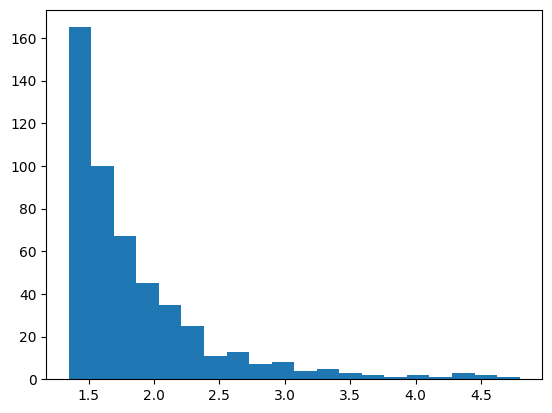

In [20]:
rmse_no_dummies, errors_no_dummies  = sim_lstm(df_eur, 'EURHUF.X.Close', ['alapkamat'],  n_sim)
plt.hist(rmse_no_dummies, bins = 20)
plt.show()
# stats.describe(mse_no_dummies)

### Only Kormanyinfo

Epoch 1/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 125782.0547 - mean_absolute_error: 353.6485 - val_loss: 144592.2500 - val_mean_absolute_error: 380.2188
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 124709.6250 - mean_absolute_error: 352.0801 - val_loss: 140608.0156 - val_mean_absolute_error: 374.9429
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 118582.9922 - mean_absolute_error: 343.3617 - val_loss: 127942.5625 - val_mean_absolute_error: 357.6544
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 105510.0625 - mean_absolute_error: 323.6542 - val_loss: 109179.0859 - val_mean_absolute_error: 330.3835
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 87341.5469 - mean_absolute_error: 294.1884 - val_loss: 85417.0547 - val_mean_absolute_error: 292.2177
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 65673.4922 - mean_absolute_error: 254.5861 - val_loss: 59172.8789 - val_mean_absolute_error: 243.2016
Epoch 7/100
41/41 ━━━━━━━

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8916 - mean_absolute_error: 1.6101 - val_loss: 8.2523 - val_mean_absolute_error: 2.3841
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6591 - mean_absolute_error: 1.7701 - val_loss: 7.2101 - val_mean_absolute_error: 2.1792
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4104 - mean_absolute_error: 1.6778 - val_loss: 3.2188 - val_mean_absolute_error: 1.4126
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6403 - mean_absolute_error: 1.5431 - val_loss: 3.8792 - val_mean_absolute_error: 1.5504
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2599 - mean_absolute_error: 2.0925 - val_loss: 3.5287 - val_mean_absolute_error: 1.4658
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2088 - mean_absolute_error: 1.6384 - val_loss: 5.1962 - val_mean_absolute_error: 1.8009
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0739 - mean_absolute_error: 1.6628 - val_loss: 3.1907 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1609 - mean_absolute_error: 1.6152 - val_loss: 3.2418 - val_mean_absolute_error: 1.4192
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3355 - mean_absolute_error: 1.8850 - val_loss: 4.3960 - val_mean_absolute_error: 1.7033
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8012 - mean_absolute_error: 1.8427 - val_loss: 6.7611 - val_mean_absolute_error: 2.0990
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.5524 - mean_absolute_error: 2.1470 - val_loss: 3.2214 - val_mean_absolute_error: 1.4090
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8915 - mean_absolute_error: 1.5899 - val_loss: 18.9735 - val_mean_absolute_error: 4.0124
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3345 - mean_absolute_error: 2.1453 - val_loss: 5.5699 - val_mean_absolute_error: 1.8707
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6420 - mean_absolute_error: 1.8160 - val_loss: 3.8794 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5480 - mean_absolute_error: 1.5603 - val_loss: 4.5627 - val_mean_absolute_error: 1.7232
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7354 - mean_absolute_error: 1.5722 - val_loss: 3.2904 - val_mean_absolute_error: 1.4278
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4554 - mean_absolute_error: 1.4968 - val_loss: 3.6028 - val_mean_absolute_error: 1.4830
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2865 - mean_absolute_error: 1.6851 - val_loss: 4.8560 - val_mean_absolute_error: 1.7362
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2605 - mean_absolute_error: 1.7310 - val_loss: 3.7755 - val_mean_absolute_error: 1.5278
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0529 - mean_absolute_error: 1.8278 - val_loss: 3.2578 - val_mean_absolute_error: 1.4244
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2405 - mean_absolute_error: 1.4775 - val_loss: 3.2855 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7993 - mean_absolute_error: 1.5965 - val_loss: 4.4739 - val_mean_absolute_error: 1.6578
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2954 - mean_absolute_error: 1.4853 - val_loss: 3.2131 - val_mean_absolute_error: 1.4126
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4094 - mean_absolute_error: 1.4804 - val_loss: 3.2593 - val_mean_absolute_error: 1.4245
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2540 - mean_absolute_error: 1.4839 - val_loss: 3.4259 - val_mean_absolute_error: 1.4501
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6665 - mean_absolute_error: 1.8017 - val_loss: 6.2603 - val_mean_absolute_error: 1.9971
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2499 - mean_absolute_error: 1.4966 - val_loss: 3.2279 - val_mean_absolute_error: 1.4179
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7703 - mean_absolute_error: 1.5728 - val_loss: 4.7664 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1835 - mean_absolute_error: 1.4931 - val_loss: 9.4917 - val_mean_absolute_error: 2.6950
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8984 - mean_absolute_error: 1.8388 - val_loss: 3.1669 - val_mean_absolute_error: 1.4015
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1935 - mean_absolute_error: 1.6940 - val_loss: 3.2649 - val_mean_absolute_error: 1.4252
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1182 - mean_absolute_error: 1.6677 - val_loss: 5.4825 - val_mean_absolute_error: 1.8560
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8872 - mean_absolute_error: 1.6290 - val_loss: 3.2896 - val_mean_absolute_error: 1.4290
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5042 - mean_absolute_error: 1.5193 - val_loss: 3.3152 - val_mean_absolute_error: 1.4366
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8551 - mean_absolute_error: 1.5475 - val_loss: 5.9928 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.4711 - mean_absolute_error: 1.9194 - val_loss: 4.2352 - val_mean_absolute_error: 1.6237
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6813 - mean_absolute_error: 1.6664 - val_loss: 4.1500 - val_mean_absolute_error: 1.6226
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1814 - mean_absolute_error: 1.8207 - val_loss: 3.5293 - val_mean_absolute_error: 1.4792
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7447 - mean_absolute_error: 1.7680 - val_loss: 5.2112 - val_mean_absolute_error: 1.8013
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8457 - mean_absolute_error: 1.7915 - val_loss: 11.0662 - val_mean_absolute_error: 2.8781
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1160 - mean_absolute_error: 1.6764 - val_loss: 4.7280 - val_mean_absolute_error: 1.7155
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6535 - mean_absolute_error: 1.5313 - val_loss: 7.4380 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5201 - mean_absolute_error: 1.5535 - val_loss: 3.6994 - val_mean_absolute_error: 1.5283
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6140 - mean_absolute_error: 1.5215 - val_loss: 4.3951 - val_mean_absolute_error: 1.6818
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6666 - mean_absolute_error: 1.7384 - val_loss: 4.3300 - val_mean_absolute_error: 1.6643
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9148 - mean_absolute_error: 1.9273 - val_loss: 5.2878 - val_mean_absolute_error: 1.8211
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2273 - mean_absolute_error: 1.6568 - val_loss: 5.4925 - val_mean_absolute_error: 1.9165
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5459 - mean_absolute_error: 1.9579 - val_loss: 3.4283 - val_mean_absolute_error: 1.4582
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5355 - mean_absolute_error: 1.5815 - val_loss: 10.7049 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3670 - mean_absolute_error: 1.7050 - val_loss: 4.8974 - val_mean_absolute_error: 1.7404
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7248 - mean_absolute_error: 1.5346 - val_loss: 3.3434 - val_mean_absolute_error: 1.4371
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4777 - mean_absolute_error: 1.5249 - val_loss: 3.6494 - val_mean_absolute_error: 1.4828
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4418 - mean_absolute_error: 1.7437 - val_loss: 5.2322 - val_mean_absolute_error: 1.8096
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4677 - mean_absolute_error: 1.7276 - val_loss: 9.8083 - val_mean_absolute_error: 2.6607
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.6970 - mean_absolute_error: 2.2033 - val_loss: 7.2780 - val_mean_absolute_error: 2.3002
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.2150 - mean_absolute_error: 1.8587 - val_loss: 4.0666 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7321 - mean_absolute_error: 1.5805 - val_loss: 7.4869 - val_mean_absolute_error: 2.2362
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5416 - mean_absolute_error: 1.7364 - val_loss: 3.2320 - val_mean_absolute_error: 1.4178
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8231 - mean_absolute_error: 1.8589 - val_loss: 3.3099 - val_mean_absolute_error: 1.4350
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5862 - mean_absolute_error: 1.5996 - val_loss: 3.4304 - val_mean_absolute_error: 1.4362
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8658 - mean_absolute_error: 1.6073 - val_loss: 3.2390 - val_mean_absolute_error: 1.4095
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5697 - mean_absolute_error: 1.5412 - val_loss: 5.8026 - val_mean_absolute_error: 1.9133
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8876 - mean_absolute_error: 2.0246 - val_loss: 3.7641 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6297 - mean_absolute_error: 1.5502 - val_loss: 5.1769 - val_mean_absolute_error: 1.8008
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6040 - mean_absolute_error: 1.7747 - val_loss: 8.4921 - val_mean_absolute_error: 2.5193
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.4008 - mean_absolute_error: 2.2722 - val_loss: 3.7696 - val_mean_absolute_error: 1.5239
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2191 - mean_absolute_error: 1.4906 - val_loss: 11.5158 - val_mean_absolute_error: 2.9505
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5576 - mean_absolute_error: 1.7733 - val_loss: 4.8228 - val_mean_absolute_error: 1.7269
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5884 - mean_absolute_error: 1.7067 - val_loss: 3.5007 - val_mean_absolute_error: 1.4743
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2175 - mean_absolute_error: 1.6670 - val_loss: 3.7317 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0737 - mean_absolute_error: 1.6895 - val_loss: 3.8306 - val_mean_absolute_error: 1.5399
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4585 - mean_absolute_error: 1.7428 - val_loss: 3.6787 - val_mean_absolute_error: 1.5113
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7292 - mean_absolute_error: 1.5816 - val_loss: 4.3423 - val_mean_absolute_error: 1.6568
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4075 - mean_absolute_error: 1.6545 - val_loss: 3.2347 - val_mean_absolute_error: 1.4208
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8655 - mean_absolute_error: 1.8126 - val_loss: 4.3631 - val_mean_absolute_error: 1.6356
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8853 - mean_absolute_error: 1.6051 - val_loss: 3.2655 - val_mean_absolute_error: 1.4239
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4554 - mean_absolute_error: 1.4882 - val_loss: 4.9190 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3786 - mean_absolute_error: 1.7422 - val_loss: 4.0922 - val_mean_absolute_error: 1.5887
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0769 - mean_absolute_error: 1.6687 - val_loss: 7.1107 - val_mean_absolute_error: 2.1591
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3671 - mean_absolute_error: 1.9115 - val_loss: 6.7768 - val_mean_absolute_error: 2.1883
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2102 - mean_absolute_error: 1.6633 - val_loss: 5.0666 - val_mean_absolute_error: 1.7766
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2773 - mean_absolute_error: 1.6134 - val_loss: 3.5984 - val_mean_absolute_error: 1.5061
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5025 - mean_absolute_error: 1.5644 - val_loss: 5.3155 - val_mean_absolute_error: 1.8222
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3617 - mean_absolute_error: 1.7003 - val_loss: 3.3545 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4044 - mean_absolute_error: 1.5472 - val_loss: 3.2937 - val_mean_absolute_error: 1.4312
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0279 - mean_absolute_error: 1.6864 - val_loss: 3.2429 - val_mean_absolute_error: 1.4112
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6062 - mean_absolute_error: 1.8996 - val_loss: 3.2792 - val_mean_absolute_error: 1.4278
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1842 - mean_absolute_error: 1.4918 - val_loss: 4.7138 - val_mean_absolute_error: 1.7532
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5848 - mean_absolute_error: 1.5481 - val_loss: 4.1990 - val_mean_absolute_error: 1.6028
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5527 - mean_absolute_error: 1.7738 - val_loss: 4.1016 - val_mean_absolute_error: 1.6205
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1457 - mean_absolute_error: 1.8441 - val_loss: 3.2266 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3140 - mean_absolute_error: 1.6583 - val_loss: 3.2417 - val_mean_absolute_error: 1.4202
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5372 - mean_absolute_error: 1.5202 - val_loss: 3.7601 - val_mean_absolute_error: 1.5143
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9817 - mean_absolute_error: 1.6326 - val_loss: 5.7930 - val_mean_absolute_error: 1.9111
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5152 - mean_absolute_error: 1.5146 - val_loss: 3.7256 - val_mean_absolute_error: 1.5335
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1665 - mean_absolute_error: 1.6012 - val_loss: 3.3407 - val_mean_absolute_error: 1.4397
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7315 - mean_absolute_error: 1.5588 - val_loss: 3.3245 - val_mean_absolute_error: 1.4312
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4736 - mean_absolute_error: 1.5619 - val_loss: 3.2080 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.7604 - mean_absolute_error: 1.9910 - val_loss: 3.2651 - val_mean_absolute_error: 1.4259
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9190 - mean_absolute_error: 1.5751 - val_loss: 4.6333 - val_mean_absolute_error: 1.7373
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.2072 - mean_absolute_error: 1.8549 - val_loss: 3.5610 - val_mean_absolute_error: 1.4858
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5284 - mean_absolute_error: 1.5572 - val_loss: 3.2168 - val_mean_absolute_error: 1.4146
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1798 - mean_absolute_error: 1.6295 - val_loss: 3.4765 - val_mean_absolute_error: 1.4706
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5511 - mean_absolute_error: 1.5454 - val_loss: 9.5082 - val_mean_absolute_error: 2.6087
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0529 - mean_absolute_error: 1.8950 - val_loss: 3.6018 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4847 - mean_absolute_error: 1.5123 - val_loss: 3.5492 - val_mean_absolute_error: 1.4707
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0299 - mean_absolute_error: 1.6238 - val_loss: 3.2948 - val_mean_absolute_error: 1.4232
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.7649 - mean_absolute_error: 1.5330 - val_loss: 4.6096 - val_mean_absolute_error: 1.6851
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1825 - mean_absolute_error: 1.8665 - val_loss: 3.6581 - val_mean_absolute_error: 1.5165
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4094 - mean_absolute_error: 1.5303 - val_loss: 3.7001 - val_mean_absolute_error: 1.5246
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0766 - mean_absolute_error: 1.4901 - val_loss: 15.6092 - val_mean_absolute_error: 3.5534
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.9295 - mean_absolute_error: 2.3052 - val_loss: 4.9547 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2579 - mean_absolute_error: 1.6393 - val_loss: 5.0637 - val_mean_absolute_error: 1.7773
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9720 - mean_absolute_error: 1.6561 - val_loss: 7.5887 - val_mean_absolute_error: 2.2542
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5694 - mean_absolute_error: 1.9179 - val_loss: 3.8304 - val_mean_absolute_error: 1.5334
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5678 - mean_absolute_error: 1.5554 - val_loss: 3.2328 - val_mean_absolute_error: 1.4176
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1457 - mean_absolute_error: 1.6189 - val_loss: 3.6879 - val_mean_absolute_error: 1.5016
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5036 - mean_absolute_error: 1.5580 - val_loss: 3.9318 - val_mean_absolute_error: 1.5474
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1324 - mean_absolute_error: 1.4738 - val_loss: 4.3155 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6532 - mean_absolute_error: 1.7447 - val_loss: 3.5118 - val_mean_absolute_error: 1.4817
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1437 - mean_absolute_error: 1.7070 - val_loss: 3.4804 - val_mean_absolute_error: 1.4706
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2356 - mean_absolute_error: 1.7207 - val_loss: 5.2914 - val_mean_absolute_error: 1.8212
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0714 - mean_absolute_error: 2.0383 - val_loss: 8.6219 - val_mean_absolute_error: 2.4484
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2684 - mean_absolute_error: 1.8359 - val_loss: 3.8525 - val_mean_absolute_error: 1.5401
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3948 - mean_absolute_error: 1.4654 - val_loss: 3.8082 - val_mean_absolute_error: 1.5467
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1765 - mean_absolute_error: 1.6719 - val_loss: 3.2488 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6490 - mean_absolute_error: 1.6043 - val_loss: 3.8810 - val_mean_absolute_error: 1.5304
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8098 - mean_absolute_error: 1.5784 - val_loss: 4.6525 - val_mean_absolute_error: 1.7394
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9208 - mean_absolute_error: 1.6312 - val_loss: 3.3223 - val_mean_absolute_error: 1.4373
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4707 - mean_absolute_error: 1.5167 - val_loss: 3.2649 - val_mean_absolute_error: 1.4201
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9730 - mean_absolute_error: 1.6482 - val_loss: 4.7191 - val_mean_absolute_error: 1.7095
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0416 - mean_absolute_error: 1.6328 - val_loss: 3.5785 - val_mean_absolute_error: 1.4977
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4953 - mean_absolute_error: 1.5734 - val_loss: 6.6978 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.5340 - mean_absolute_error: 1.9426 - val_loss: 4.1761 - val_mean_absolute_error: 1.5995
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.9139 - mean_absolute_error: 2.1357 - val_loss: 4.6756 - val_mean_absolute_error: 1.7017
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.2047 - mean_absolute_error: 2.2013 - val_loss: 4.5715 - val_mean_absolute_error: 1.6798
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7610 - mean_absolute_error: 1.5705 - val_loss: 3.4848 - val_mean_absolute_error: 1.4596
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9741 - mean_absolute_error: 1.8103 - val_loss: 3.7619 - val_mean_absolute_error: 1.5376
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5427 - mean_absolute_error: 1.9591 - val_loss: 8.4935 - val_mean_absolute_error: 2.5245
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7215 - mean_absolute_error: 1.9741 - val_loss: 3.4193 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2105 - mean_absolute_error: 1.6829 - val_loss: 4.8989 - val_mean_absolute_error: 1.7843
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5313 - mean_absolute_error: 1.7349 - val_loss: 3.2455 - val_mean_absolute_error: 1.4161
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1541 - mean_absolute_error: 1.7107 - val_loss: 6.0440 - val_mean_absolute_error: 1.9593
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9916 - mean_absolute_error: 1.8072 - val_loss: 5.9574 - val_mean_absolute_error: 2.0178
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5797 - mean_absolute_error: 1.7086 - val_loss: 3.9267 - val_mean_absolute_error: 1.5549
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5486 - mean_absolute_error: 1.6757 - val_loss: 4.0134 - val_mean_absolute_error: 1.5967
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9597 - mean_absolute_error: 1.6471 - val_loss: 4.8467 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.0559 - mean_absolute_error: 1.8107 - val_loss: 6.8075 - val_mean_absolute_error: 2.1943
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5628 - mean_absolute_error: 1.9532 - val_loss: 3.3701 - val_mean_absolute_error: 1.4472
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9280 - mean_absolute_error: 1.8522 - val_loss: 6.0196 - val_mean_absolute_error: 2.0356
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3515 - mean_absolute_error: 1.7358 - val_loss: 3.3280 - val_mean_absolute_error: 1.4378
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0485 - mean_absolute_error: 1.4075 - val_loss: 3.2499 - val_mean_absolute_error: 1.4220
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7039 - mean_absolute_error: 1.5176 - val_loss: 3.2851 - val_mean_absolute_error: 1.4294
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0308 - mean_absolute_error: 1.4066 - val_loss: 4.6867 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6714 - mean_absolute_error: 1.7848 - val_loss: 4.7525 - val_mean_absolute_error: 1.7206
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0819 - mean_absolute_error: 2.0295 - val_loss: 4.8958 - val_mean_absolute_error: 1.7949
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4418 - mean_absolute_error: 1.7530 - val_loss: 6.0548 - val_mean_absolute_error: 1.9644
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8059 - mean_absolute_error: 1.8214 - val_loss: 3.1960 - val_mean_absolute_error: 1.4103
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1931 - mean_absolute_error: 1.8944 - val_loss: 6.6969 - val_mean_absolute_error: 2.0817
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1815 - mean_absolute_error: 1.4733 - val_loss: 3.3374 - val_mean_absolute_error: 1.4311
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2651 - mean_absolute_error: 1.4530 - val_loss: 4.2686 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1120 - mean_absolute_error: 1.4663 - val_loss: 5.0983 - val_mean_absolute_error: 1.7845
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7875 - mean_absolute_error: 1.8342 - val_loss: 13.0797 - val_mean_absolute_error: 3.1918
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.6119 - mean_absolute_error: 2.4548 - val_loss: 9.0804 - val_mean_absolute_error: 2.6293
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9025 - mean_absolute_error: 1.6401 - val_loss: 3.3502 - val_mean_absolute_error: 1.4309
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7597 - mean_absolute_error: 1.5402 - val_loss: 5.0491 - val_mean_absolute_error: 1.8301
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4921 - mean_absolute_error: 1.5854 - val_loss: 3.9308 - val_mean_absolute_error: 1.5505
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8113 - mean_absolute_error: 1.5852 - val_loss: 3.8824 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1230 - mean_absolute_error: 1.6758 - val_loss: 6.2761 - val_mean_absolute_error: 1.9994
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1186 - mean_absolute_error: 1.8040 - val_loss: 3.7513 - val_mean_absolute_error: 1.5352
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2000 - mean_absolute_error: 1.8805 - val_loss: 13.8243 - val_mean_absolute_error: 3.3051
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.2197 - mean_absolute_error: 2.3648 - val_loss: 3.7267 - val_mean_absolute_error: 1.5240
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3642 - mean_absolute_error: 1.9055 - val_loss: 12.9040 - val_mean_absolute_error: 3.1665
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.8254 - mean_absolute_error: 2.1510 - val_loss: 4.5649 - val_mean_absolute_error: 1.7158
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2142 - mean_absolute_error: 1.6990 - val_loss: 3.3223 -

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4424 - mean_absolute_error: 1.5116 - val_loss: 9.3230 - val_mean_absolute_error: 2.5739
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1377 - mean_absolute_error: 1.6855 - val_loss: 9.0449 - val_mean_absolute_error: 2.6098
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8339 - mean_absolute_error: 1.7724 - val_loss: 4.4569 - val_mean_absolute_error: 1.6945
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3936 - mean_absolute_error: 1.7538 - val_loss: 3.6892 - val_mean_absolute_error: 1.5079
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6796 - mean_absolute_error: 1.5910 - val_loss: 5.1588 - val_mean_absolute_error: 1.8539
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0954 - mean_absolute_error: 2.0617 - val_loss: 5.4087 - val_mean_absolute_error: 1.8445
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7447 - mean_absolute_error: 1.7993 - val_loss: 3.2273 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3225 - mean_absolute_error: 1.7237 - val_loss: 3.2731 - val_mean_absolute_error: 1.4278
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3375 - mean_absolute_error: 1.4875 - val_loss: 4.4491 - val_mean_absolute_error: 1.6553
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0481 - mean_absolute_error: 1.4725 - val_loss: 4.0170 - val_mean_absolute_error: 1.5735
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4619 - mean_absolute_error: 1.5221 - val_loss: 3.2541 - val_mean_absolute_error: 1.4208
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9506 - mean_absolute_error: 1.8369 - val_loss: 6.6782 - val_mean_absolute_error: 2.1643
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2579 - mean_absolute_error: 1.7005 - val_loss: 4.4977 - val_mean_absolute_error: 1.6927
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6266 - mean_absolute_error: 1.9652 - val_loss: 5.7582 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.4076 - mean_absolute_error: 1.8642 - val_loss: 3.6465 - val_mean_absolute_error: 1.4924
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1067 - mean_absolute_error: 1.4495 - val_loss: 4.2032 - val_mean_absolute_error: 1.6097
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6546 - mean_absolute_error: 1.7889 - val_loss: 6.1989 - val_mean_absolute_error: 2.0667
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9293 - mean_absolute_error: 1.9167 - val_loss: 4.9639 - val_mean_absolute_error: 1.7592
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5987 - mean_absolute_error: 1.6883 - val_loss: 3.5457 - val_mean_absolute_error: 1.4734
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1310 - mean_absolute_error: 1.8391 - val_loss: 4.1868 - val_mean_absolute_error: 1.6083
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3637 - mean_absolute_error: 1.8802 - val_loss: 3.2177 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0730 - mean_absolute_error: 1.4977 - val_loss: 7.0106 - val_mean_absolute_error: 2.1424
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3001 - mean_absolute_error: 1.7544 - val_loss: 3.5886 - val_mean_absolute_error: 1.4971
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5178 - mean_absolute_error: 1.7568 - val_loss: 3.1700 - val_mean_absolute_error: 1.4022
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4716 - mean_absolute_error: 1.5736 - val_loss: 6.0304 - val_mean_absolute_error: 2.0386
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5807 - mean_absolute_error: 1.7607 - val_loss: 5.0936 - val_mean_absolute_error: 1.8223
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1900 - mean_absolute_error: 1.6760 - val_loss: 3.9568 - val_mean_absolute_error: 1.5763
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7339 - mean_absolute_error: 1.7709 - val_loss: 3.9573 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1638 - mean_absolute_error: 1.6833 - val_loss: 5.7863 - val_mean_absolute_error: 1.9904
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2992 - mean_absolute_error: 1.7157 - val_loss: 3.2019 - val_mean_absolute_error: 1.4100
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3234 - mean_absolute_error: 1.4927 - val_loss: 3.3453 - val_mean_absolute_error: 1.4416
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9786 - mean_absolute_error: 1.6121 - val_loss: 5.7989 - val_mean_absolute_error: 1.9861
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5979 - mean_absolute_error: 1.7519 - val_loss: 5.0772 - val_mean_absolute_error: 1.7804
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1488 - mean_absolute_error: 1.4595 - val_loss: 3.4540 - val_mean_absolute_error: 1.4520
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7138 - mean_absolute_error: 1.4157 - val_loss: 4.0060 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7633 - mean_absolute_error: 1.5923 - val_loss: 4.4288 - val_mean_absolute_error: 1.6507
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5611 - mean_absolute_error: 1.7560 - val_loss: 4.0297 - val_mean_absolute_error: 1.5770
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5635 - mean_absolute_error: 1.5449 - val_loss: 5.2479 - val_mean_absolute_error: 1.8122
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2451 - mean_absolute_error: 1.4988 - val_loss: 3.2866 - val_mean_absolute_error: 1.4212
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4144 - mean_absolute_error: 1.4863 - val_loss: 4.6901 - val_mean_absolute_error: 1.7467
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8117 - mean_absolute_error: 1.4504 - val_loss: 3.5560 - val_mean_absolute_error: 1.4889
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8921 - mean_absolute_error: 1.8177 - val_loss: 5.8114 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6291 - mean_absolute_error: 1.5667 - val_loss: 3.4868 - val_mean_absolute_error: 1.4590
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6012 - mean_absolute_error: 1.5444 - val_loss: 5.2132 - val_mean_absolute_error: 1.8081
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8438 - mean_absolute_error: 1.9910 - val_loss: 6.4728 - val_mean_absolute_error: 2.1263
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0082 - mean_absolute_error: 1.6526 - val_loss: 9.2961 - val_mean_absolute_error: 2.6719
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2725 - mean_absolute_error: 1.9333 - val_loss: 4.3590 - val_mean_absolute_error: 1.6760
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9328 - mean_absolute_error: 1.6147 - val_loss: 3.4444 - val_mean_absolute_error: 1.4633
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2896 - mean_absolute_error: 1.6856 - val_loss: 3.4476 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4507 - mean_absolute_error: 1.5482 - val_loss: 4.2831 - val_mean_absolute_error: 1.6498
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3121 - mean_absolute_error: 1.6753 - val_loss: 7.9756 - val_mean_absolute_error: 2.3256
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5762 - mean_absolute_error: 1.5813 - val_loss: 3.2397 - val_mean_absolute_error: 1.4159
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3727 - mean_absolute_error: 1.4836 - val_loss: 3.4496 - val_mean_absolute_error: 1.4667
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4783 - mean_absolute_error: 1.5177 - val_loss: 3.2607 - val_mean_absolute_error: 1.4224
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1353 - mean_absolute_error: 1.6899 - val_loss: 3.4746 - val_mean_absolute_error: 1.4720
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8005 - mean_absolute_error: 1.5861 - val_loss: 4.4834 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.8734 - mean_absolute_error: 1.7803 - val_loss: 4.4842 - val_mean_absolute_error: 1.6930
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7951 - mean_absolute_error: 1.6158 - val_loss: 3.3472 - val_mean_absolute_error: 1.4462
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6796 - mean_absolute_error: 1.5788 - val_loss: 3.3426 - val_mean_absolute_error: 1.4429
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8852 - mean_absolute_error: 1.5767 - val_loss: 4.3299 - val_mean_absolute_error: 1.6570
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5419 - mean_absolute_error: 1.6807 - val_loss: 4.2492 - val_mean_absolute_error: 1.6499
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2469 - mean_absolute_error: 1.7006 - val_loss: 5.1789 - val_mean_absolute_error: 1.8016
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8653 - mean_absolute_error: 1.5915 - val_loss: 3.2097 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0293 - mean_absolute_error: 1.6580 - val_loss: 3.2546 - val_mean_absolute_error: 1.4226
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5803 - mean_absolute_error: 1.7578 - val_loss: 3.4375 - val_mean_absolute_error: 1.4477
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2405 - mean_absolute_error: 1.4609 - val_loss: 6.0802 - val_mean_absolute_error: 2.0414
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7063 - mean_absolute_error: 1.6007 - val_loss: 8.0060 - val_mean_absolute_error: 2.3323
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0239 - mean_absolute_error: 1.6558 - val_loss: 3.5651 - val_mean_absolute_error: 1.4912
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2393 - mean_absolute_error: 1.7117 - val_loss: 17.6640 - val_mean_absolute_error: 3.8229
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1621 - mean_absolute_error: 1.8940 - val_loss: 3.6713 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0063 - mean_absolute_error: 1.4277 - val_loss: 5.4540 - val_mean_absolute_error: 1.8551
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2637 - mean_absolute_error: 1.5115 - val_loss: 7.5760 - val_mean_absolute_error: 2.2501
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5703 - mean_absolute_error: 1.7664 - val_loss: 3.4110 - val_mean_absolute_error: 1.4527
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5823 - mean_absolute_error: 1.7548 - val_loss: 8.8392 - val_mean_absolute_error: 2.5828
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1551 - mean_absolute_error: 1.7065 - val_loss: 7.2294 - val_mean_absolute_error: 2.1833
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8354 - mean_absolute_error: 1.8596 - val_loss: 3.5313 - val_mean_absolute_error: 1.4841
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9310 - mean_absolute_error: 1.5738 - val_loss: 3.2520 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2500 - mean_absolute_error: 1.4990 - val_loss: 3.2659 - val_mean_absolute_error: 1.4181
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8184 - mean_absolute_error: 1.5507 - val_loss: 3.2105 - val_mean_absolute_error: 1.4150
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3043 - mean_absolute_error: 1.8621 - val_loss: 3.5650 - val_mean_absolute_error: 1.4790
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8716 - mean_absolute_error: 1.5534 - val_loss: 4.0854 - val_mean_absolute_error: 1.5996
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6023 - mean_absolute_error: 1.5299 - val_loss: 3.6555 - val_mean_absolute_error: 1.5095
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7335 - mean_absolute_error: 1.5755 - val_loss: 3.7496 - val_mean_absolute_error: 1.5165
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2771 - mean_absolute_error: 1.5161 - val_loss: 3.3990 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9470 - mean_absolute_error: 1.6236 - val_loss: 5.3720 - val_mean_absolute_error: 1.8898
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.0331 - mean_absolute_error: 2.2277 - val_loss: 3.2147 - val_mean_absolute_error: 1.4165
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7169 - mean_absolute_error: 1.5640 - val_loss: 3.2863 - val_mean_absolute_error: 1.4294
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5811 - mean_absolute_error: 1.7082 - val_loss: 6.3858 - val_mean_absolute_error: 2.1057
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4858 - mean_absolute_error: 1.7271 - val_loss: 5.5036 - val_mean_absolute_error: 1.8613
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9565 - mean_absolute_error: 1.6650 - val_loss: 3.3704 - val_mean_absolute_error: 1.4323
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.4992 - mean_absolute_error: 1.7188 - val_loss: 3.5404 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8624 - mean_absolute_error: 1.5689 - val_loss: 7.5458 - val_mean_absolute_error: 2.2451
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6112 - mean_absolute_error: 1.8775 - val_loss: 3.4866 - val_mean_absolute_error: 1.4650
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4288 - mean_absolute_error: 1.5013 - val_loss: 3.3931 - val_mean_absolute_error: 1.4509
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7226 - mean_absolute_error: 1.6160 - val_loss: 5.3026 - val_mean_absolute_error: 1.8785
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5126 - mean_absolute_error: 1.5042 - val_loss: 6.3579 - val_mean_absolute_error: 2.0214
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6679 - mean_absolute_error: 1.9925 - val_loss: 5.9986 - val_mean_absolute_error: 2.0306
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2340 - mean_absolute_error: 1.8803 - val_loss: 3.9050 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6388 - mean_absolute_error: 1.5796 - val_loss: 3.3244 - val_mean_absolute_error: 1.4386
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9656 - mean_absolute_error: 1.6023 - val_loss: 9.3806 - val_mean_absolute_error: 2.6757
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1559 - mean_absolute_error: 1.8328 - val_loss: 8.9840 - val_mean_absolute_error: 2.5085
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4409 - mean_absolute_error: 1.7206 - val_loss: 5.6751 - val_mean_absolute_error: 1.9557
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5819 - mean_absolute_error: 1.9789 - val_loss: 4.5999 - val_mean_absolute_error: 1.7179
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5522 - mean_absolute_error: 1.7417 - val_loss: 4.4375 - val_mean_absolute_error: 1.6846
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.7751 - mean_absolute_error: 2.1424 - val_loss: 3.5252 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0852 - mean_absolute_error: 1.4321 - val_loss: 3.4622 - val_mean_absolute_error: 1.4680
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4905 - mean_absolute_error: 1.5074 - val_loss: 3.2341 - val_mean_absolute_error: 1.4157
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7850 - mean_absolute_error: 1.4133 - val_loss: 4.9069 - val_mean_absolute_error: 1.8003
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8070 - mean_absolute_error: 1.5935 - val_loss: 5.6829 - val_mean_absolute_error: 1.9553
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.4330 - mean_absolute_error: 2.3286 - val_loss: 9.4444 - val_mean_absolute_error: 2.6815
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7556 - mean_absolute_error: 1.5908 - val_loss: 3.5792 - val_mean_absolute_error: 1.4858
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4382 - mean_absolute_error: 1.5593 - val_loss: 3.5830 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7050 - mean_absolute_error: 1.7354 - val_loss: 4.8687 - val_mean_absolute_error: 1.7403
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.7423 - mean_absolute_error: 2.1410 - val_loss: 3.4686 - val_mean_absolute_error: 1.4592
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7566 - mean_absolute_error: 1.5359 - val_loss: 4.1256 - val_mean_absolute_error: 1.6004
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6322 - mean_absolute_error: 1.7940 - val_loss: 3.2629 - val_mean_absolute_error: 1.4256
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 7.9639 - mean_absolute_error: 2.1775 - val_loss: 3.6981 - val_mean_absolute_error: 1.5113
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7874 - mean_absolute_error: 1.6033 - val_loss: 3.8715 - val_mean_absolute_error: 1.5490
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3712 - mean_absolute_error: 1.5218 - val_loss: 3.5146 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4542 - mean_absolute_error: 1.7246 - val_loss: 5.6247 - val_mean_absolute_error: 1.8858
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4371 - mean_absolute_error: 1.7630 - val_loss: 4.2774 - val_mean_absolute_error: 1.6266
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3101 - mean_absolute_error: 1.9013 - val_loss: 7.7602 - val_mean_absolute_error: 2.2845
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1048 - mean_absolute_error: 1.7199 - val_loss: 5.7067 - val_mean_absolute_error: 1.9580
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.0617 - mean_absolute_error: 1.6397 - val_loss: 7.2221 - val_mean_absolute_error: 2.2799
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2851 - mean_absolute_error: 1.9374 - val_loss: 3.3651 - val_mean_absolute_error: 1.4461
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1558 - mean_absolute_error: 1.4795 - val_loss: 4.2005 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1073 - mean_absolute_error: 1.6252 - val_loss: 4.0412 - val_mean_absolute_error: 1.5955
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9966 - mean_absolute_error: 1.6229 - val_loss: 4.3283 - val_mean_absolute_error: 1.6645
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1772 - mean_absolute_error: 1.6245 - val_loss: 4.7800 - val_mean_absolute_error: 1.7235
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6695 - mean_absolute_error: 1.5547 - val_loss: 4.6391 - val_mean_absolute_error: 1.7283
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2007 - mean_absolute_error: 2.0229 - val_loss: 18.7713 - val_mean_absolute_error: 3.9596
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4930 - mean_absolute_error: 2.0435 - val_loss: 3.2959 - val_mean_absolute_error: 1.4375
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6858 - mean_absolute_error: 1.5062 - val_loss: 5.1586 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5796 - mean_absolute_error: 1.7273 - val_loss: 3.6012 - val_mean_absolute_error: 1.4958
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2025 - mean_absolute_error: 1.4676 - val_loss: 6.0858 - val_mean_absolute_error: 1.9703
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5742 - mean_absolute_error: 1.7215 - val_loss: 4.1405 - val_mean_absolute_error: 1.6229
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6572 - mean_absolute_error: 1.7822 - val_loss: 3.2335 - val_mean_absolute_error: 1.4184
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5420 - mean_absolute_error: 1.4745 - val_loss: 4.8782 - val_mean_absolute_error: 1.7435
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9235 - mean_absolute_error: 1.5707 - val_loss: 3.4169 - val_mean_absolute_error: 1.4482
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.9177 - mean_absolute_error: 1.6018 - val_loss: 4.7873 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1640 - mean_absolute_error: 1.6875 - val_loss: 5.4983 - val_mean_absolute_error: 1.8920
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5669 - mean_absolute_error: 1.5355 - val_loss: 4.0615 - val_mean_absolute_error: 1.5865
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4976 - mean_absolute_error: 1.5380 - val_loss: 3.9578 - val_mean_absolute_error: 1.5648
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9880 - mean_absolute_error: 1.5739 - val_loss: 3.9808 - val_mean_absolute_error: 1.5780
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1379 - mean_absolute_error: 1.7172 - val_loss: 3.6055 - val_mean_absolute_error: 1.4904
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2380 - mean_absolute_error: 1.8650 - val_loss: 3.4208 - val_mean_absolute_error: 1.4597
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5282 - mean_absolute_error: 1.7137 - val_loss: 3.9148 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9410 - mean_absolute_error: 1.6151 - val_loss: 3.3319 - val_mean_absolute_error: 1.4354
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7957 - mean_absolute_error: 1.5281 - val_loss: 3.4325 - val_mean_absolute_error: 1.4572
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8665 - mean_absolute_error: 1.5965 - val_loss: 3.3465 - val_mean_absolute_error: 1.4430
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6898 - mean_absolute_error: 1.5578 - val_loss: 3.2811 - val_mean_absolute_error: 1.4297
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0613 - mean_absolute_error: 1.6347 - val_loss: 3.3829 - val_mean_absolute_error: 1.4514
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1830 - mean_absolute_error: 1.6410 - val_loss: 4.1571 - val_mean_absolute_error: 1.6106
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8473 - mean_absolute_error: 1.6168 - val_loss: 3.3530 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9109 - mean_absolute_error: 1.6117 - val_loss: 8.4370 - val_mean_absolute_error: 2.4082
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1479 - mean_absolute_error: 2.0208 - val_loss: 3.2939 - val_mean_absolute_error: 1.4324
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5944 - mean_absolute_error: 1.5396 - val_loss: 14.8318 - val_mean_absolute_error: 3.4911
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4331 - mean_absolute_error: 1.9624 - val_loss: 8.3986 - val_mean_absolute_error: 2.4063
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0430 - mean_absolute_error: 1.8080 - val_loss: 5.6176 - val_mean_absolute_error: 1.9353
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1192 - mean_absolute_error: 1.8327 - val_loss: 3.5592 - val_mean_absolute_error: 1.4911
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8619 - mean_absolute_error: 1.5471 - val_loss: 14.6884 -

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.4270 - mean_absolute_error: 1.9266 - val_loss: 3.8398 - val_mean_absolute_error: 1.5476
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3948 - mean_absolute_error: 1.5407 - val_loss: 3.3738 - val_mean_absolute_error: 1.4507
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6035 - mean_absolute_error: 1.6956 - val_loss: 3.4687 - val_mean_absolute_error: 1.4694
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1798 - mean_absolute_error: 1.6579 - val_loss: 3.6425 - val_mean_absolute_error: 1.4970
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.2759 - mean_absolute_error: 1.4891 - val_loss: 3.3749 - val_mean_absolute_error: 1.4533
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2493 - mean_absolute_error: 1.6000 - val_loss: 3.2668 - val_mean_absolute_error: 1.4270
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2999 - mean_absolute_error: 1.4555 - val_loss: 4.3301 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6107 - mean_absolute_error: 1.5252 - val_loss: 3.7201 - val_mean_absolute_error: 1.5243
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8226 - mean_absolute_error: 1.6076 - val_loss: 3.4536 - val_mean_absolute_error: 1.4677
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3695 - mean_absolute_error: 1.5115 - val_loss: 7.1806 - val_mean_absolute_error: 2.2718
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9945 - mean_absolute_error: 1.6219 - val_loss: 3.2844 - val_mean_absolute_error: 1.4304
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0175 - mean_absolute_error: 2.0812 - val_loss: 5.7424 - val_mean_absolute_error: 1.9063
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9575 - mean_absolute_error: 1.6227 - val_loss: 3.2567 - val_mean_absolute_error: 1.4245
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3961 - mean_absolute_error: 1.5220 - val_loss: 4.7103 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2265 - mean_absolute_error: 1.6387 - val_loss: 3.2855 - val_mean_absolute_error: 1.4309
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2144 - mean_absolute_error: 1.6314 - val_loss: 3.2683 - val_mean_absolute_error: 1.4280
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3116 - mean_absolute_error: 1.4844 - val_loss: 8.4850 - val_mean_absolute_error: 2.4220
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5091 - mean_absolute_error: 1.7499 - val_loss: 3.4058 - val_mean_absolute_error: 1.4622
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2707 - mean_absolute_error: 1.5428 - val_loss: 3.2504 - val_mean_absolute_error: 1.4238
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2516 - mean_absolute_error: 1.4568 - val_loss: 3.5653 - val_mean_absolute_error: 1.4862
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3448 - mean_absolute_error: 1.4743 - val_loss: 4.2229 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9408 - mean_absolute_error: 1.8763 - val_loss: 9.3838 - val_mean_absolute_error: 2.6718
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7462 - mean_absolute_error: 1.7613 - val_loss: 3.3931 - val_mean_absolute_error: 1.4535
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8742 - mean_absolute_error: 1.6048 - val_loss: 8.9660 - val_mean_absolute_error: 2.5049
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9474 - mean_absolute_error: 1.6041 - val_loss: 3.4146 - val_mean_absolute_error: 1.4581
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8373 - mean_absolute_error: 1.5770 - val_loss: 3.4993 - val_mean_absolute_error: 1.4764
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0196 - mean_absolute_error: 1.6152 - val_loss: 3.2133 - val_mean_absolute_error: 1.4148
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8640 - mean_absolute_error: 1.7690 - val_loss: 3.5918 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3782 - mean_absolute_error: 1.7149 - val_loss: 10.6864 - val_mean_absolute_error: 2.8806
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6287 - mean_absolute_error: 1.7958 - val_loss: 4.9400 - val_mean_absolute_error: 1.7976
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3510 - mean_absolute_error: 1.5290 - val_loss: 4.2903 - val_mean_absolute_error: 1.6351
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2517 - mean_absolute_error: 1.7190 - val_loss: 4.1125 - val_mean_absolute_error: 1.6077
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4225 - mean_absolute_error: 1.6666 - val_loss: 4.4748 - val_mean_absolute_error: 1.6817
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.1994 - mean_absolute_error: 2.3802 - val_loss: 6.8919 - val_mean_absolute_error: 2.2115
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5355 - mean_absolute_error: 1.5631 - val_loss: 3.4229 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5744 - mean_absolute_error: 1.5450 - val_loss: 5.3421 - val_mean_absolute_error: 1.8315
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2446 - mean_absolute_error: 1.4460 - val_loss: 7.3593 - val_mean_absolute_error: 2.2906
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0998 - mean_absolute_error: 1.6161 - val_loss: 4.6020 - val_mean_absolute_error: 1.7134
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7105 - mean_absolute_error: 1.5969 - val_loss: 3.3380 - val_mean_absolute_error: 1.4421
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6447 - mean_absolute_error: 1.6873 - val_loss: 3.3291 - val_mean_absolute_error: 1.4399
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9667 - mean_absolute_error: 1.4156 - val_loss: 3.3821 - val_mean_absolute_error: 1.4538
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6353 - mean_absolute_error: 1.5930 - val_loss: 4.1574 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5724 - mean_absolute_error: 1.7660 - val_loss: 3.8294 - val_mean_absolute_error: 1.5446
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1684 - mean_absolute_error: 1.6200 - val_loss: 5.6422 - val_mean_absolute_error: 1.8903
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5907 - mean_absolute_error: 1.5321 - val_loss: 3.9782 - val_mean_absolute_error: 1.5816
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9722 - mean_absolute_error: 1.7944 - val_loss: 4.8933 - val_mean_absolute_error: 1.7765
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0419 - mean_absolute_error: 1.6099 - val_loss: 3.4000 - val_mean_absolute_error: 1.4630
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.5781 - mean_absolute_error: 1.4498 - val_loss: 4.2634 - val_mean_absolute_error: 1.6390
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1086 - mean_absolute_error: 1.6549 - val_loss: 3.6513 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1134 - mean_absolute_error: 1.4301 - val_loss: 4.1333 - val_mean_absolute_error: 1.6130
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5504 - mean_absolute_error: 1.4976 - val_loss: 5.9402 - val_mean_absolute_error: 1.9976
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.6858 - mean_absolute_error: 1.7452 - val_loss: 6.0720 - val_mean_absolute_error: 1.9706
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9963 - mean_absolute_error: 1.6000 - val_loss: 4.8524 - val_mean_absolute_error: 1.7459
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2621 - mean_absolute_error: 1.7015 - val_loss: 4.1301 - val_mean_absolute_error: 1.6160
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3868 - mean_absolute_error: 1.7223 - val_loss: 3.2957 - val_mean_absolute_error: 1.4333
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8583 - mean_absolute_error: 1.6043 - val_loss: 3.3287 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.1130 - mean_absolute_error: 1.8780 - val_loss: 3.5303 - val_mean_absolute_error: 1.4829
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4082 - mean_absolute_error: 1.5294 - val_loss: 3.6552 - val_mean_absolute_error: 1.5129
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4545 - mean_absolute_error: 1.6522 - val_loss: 4.0906 - val_mean_absolute_error: 1.5975
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6234 - mean_absolute_error: 1.6896 - val_loss: 3.2490 - val_mean_absolute_error: 1.4234
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9560 - mean_absolute_error: 1.5937 - val_loss: 4.3167 - val_mean_absolute_error: 1.6402
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7817 - mean_absolute_error: 1.5706 - val_loss: 5.0047 - val_mean_absolute_error: 1.7699
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4345 - mean_absolute_error: 1.5546 - val_loss: 4.4777 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0687 - mean_absolute_error: 1.6530 - val_loss: 5.1527 - val_mean_absolute_error: 1.8462
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9085 - mean_absolute_error: 1.6082 - val_loss: 9.2576 - val_mean_absolute_error: 2.5624
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0974 - mean_absolute_error: 1.8420 - val_loss: 3.7028 - val_mean_absolute_error: 1.5206
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7087 - mean_absolute_error: 1.7709 - val_loss: 3.9882 - val_mean_absolute_error: 1.5821
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7115 - mean_absolute_error: 1.5258 - val_loss: 4.1924 - val_mean_absolute_error: 1.6210
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3168 - mean_absolute_error: 1.6805 - val_loss: 3.3089 - val_mean_absolute_error: 1.4362
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7597 - mean_absolute_error: 1.3598 - val_loss: 3.3728 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.6022 - mean_absolute_error: 1.8662 - val_loss: 3.6175 - val_mean_absolute_error: 1.5013
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2355 - mean_absolute_error: 1.5315 - val_loss: 7.1565 - val_mean_absolute_error: 2.2616
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6802 - mean_absolute_error: 1.7982 - val_loss: 6.7643 - val_mean_absolute_error: 2.1774
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0517 - mean_absolute_error: 1.6094 - val_loss: 3.2958 - val_mean_absolute_error: 1.4326
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7042 - mean_absolute_error: 1.5015 - val_loss: 4.0850 - val_mean_absolute_error: 1.6003
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3020 - mean_absolute_error: 1.5030 - val_loss: 4.2102 - val_mean_absolute_error: 1.6282
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0692 - mean_absolute_error: 1.7036 - val_loss: 3.6592 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7062 - mean_absolute_error: 1.5699 - val_loss: 6.8471 - val_mean_absolute_error: 2.1858
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3246 - mean_absolute_error: 1.4956 - val_loss: 4.2884 - val_mean_absolute_error: 1.6364
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1976 - mean_absolute_error: 1.7051 - val_loss: 3.3114 - val_mean_absolute_error: 1.4359
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8135 - mean_absolute_error: 1.3933 - val_loss: 3.3357 - val_mean_absolute_error: 1.4422
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4433 - mean_absolute_error: 1.5654 - val_loss: 4.1795 - val_mean_absolute_error: 1.6156
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8639 - mean_absolute_error: 1.6176 - val_loss: 4.9554 - val_mean_absolute_error: 1.7597
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1722 - mean_absolute_error: 1.9563 - val_loss: 3.4664 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5773 - mean_absolute_error: 1.7504 - val_loss: 3.6233 - val_mean_absolute_error: 1.5073
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7180 - mean_absolute_error: 1.8178 - val_loss: 7.3423 - val_mean_absolute_error: 2.2090
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.2470 - mean_absolute_error: 2.1625 - val_loss: 4.5281 - val_mean_absolute_error: 1.6754
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5632 - mean_absolute_error: 1.5687 - val_loss: 3.8093 - val_mean_absolute_error: 1.5406
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6090 - mean_absolute_error: 1.6122 - val_loss: 3.3384 - val_mean_absolute_error: 1.4383
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5315 - mean_absolute_error: 1.4936 - val_loss: 4.1027 - val_mean_absolute_error: 1.6102
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3277 - mean_absolute_error: 1.6921 - val_loss: 3.2462 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1796 - mean_absolute_error: 1.6807 - val_loss: 4.6664 - val_mean_absolute_error: 1.7052
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4045 - mean_absolute_error: 1.6898 - val_loss: 3.8824 - val_mean_absolute_error: 1.5579
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1345 - mean_absolute_error: 1.6561 - val_loss: 3.6769 - val_mean_absolute_error: 1.5129
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6324 - mean_absolute_error: 1.7539 - val_loss: 3.2604 - val_mean_absolute_error: 1.4249
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9830 - mean_absolute_error: 1.4075 - val_loss: 5.1387 - val_mean_absolute_error: 1.8358
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1116 - mean_absolute_error: 1.6412 - val_loss: 9.4415 - val_mean_absolute_error: 2.5887
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5213 - mean_absolute_error: 1.7240 - val_loss: 3.6063 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8431 - mean_absolute_error: 1.4397 - val_loss: 3.3240 - val_mean_absolute_error: 1.4428
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1179 - mean_absolute_error: 1.6260 - val_loss: 3.3332 - val_mean_absolute_error: 1.4414
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4741 - mean_absolute_error: 1.9197 - val_loss: 4.3736 - val_mean_absolute_error: 1.6463
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5597 - mean_absolute_error: 1.5814 - val_loss: 3.6571 - val_mean_absolute_error: 1.5097
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6566 - mean_absolute_error: 1.5271 - val_loss: 4.6393 - val_mean_absolute_error: 1.7209
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3135 - mean_absolute_error: 1.7881 - val_loss: 3.2627 - val_mean_absolute_error: 1.4274
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.5194 - mean_absolute_error: 1.7824 - val_loss: 4.6759 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9780 - mean_absolute_error: 1.6265 - val_loss: 3.2804 - val_mean_absolute_error: 1.4289
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3169 - mean_absolute_error: 1.4852 - val_loss: 3.7066 - val_mean_absolute_error: 1.5191
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4929 - mean_absolute_error: 1.5449 - val_loss: 3.2611 - val_mean_absolute_error: 1.4248
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.5443 - mean_absolute_error: 1.4950 - val_loss: 9.5055 - val_mean_absolute_error: 2.6023
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0717 - mean_absolute_error: 1.7078 - val_loss: 7.2284 - val_mean_absolute_error: 2.2695
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9895 - mean_absolute_error: 1.6481 - val_loss: 5.2643 - val_mean_absolute_error: 1.8513
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5832 - mean_absolute_error: 1.5763 - val_loss: 3.2796 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.0462 - mean_absolute_error: 1.8051 - val_loss: 5.1712 - val_mean_absolute_error: 1.8006
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1052 - mean_absolute_error: 1.8361 - val_loss: 3.3300 - val_mean_absolute_error: 1.4406
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2479 - mean_absolute_error: 1.4893 - val_loss: 3.3351 - val_mean_absolute_error: 1.4372
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4108 - mean_absolute_error: 1.7182 - val_loss: 3.6202 - val_mean_absolute_error: 1.4991
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7645 - mean_absolute_error: 1.5663 - val_loss: 3.9285 - val_mean_absolute_error: 1.5683
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9784 - mean_absolute_error: 1.6401 - val_loss: 6.4953 - val_mean_absolute_error: 2.0478
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4087 - mean_absolute_error: 1.7052 - val_loss: 6.5281 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4650 - mean_absolute_error: 1.7247 - val_loss: 3.5268 - val_mean_absolute_error: 1.4783
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7945 - mean_absolute_error: 1.7477 - val_loss: 3.4817 - val_mean_absolute_error: 1.4814
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2693 - mean_absolute_error: 1.4665 - val_loss: 5.0765 - val_mean_absolute_error: 1.8193
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1128 - mean_absolute_error: 1.6724 - val_loss: 3.6643 - val_mean_absolute_error: 1.5221
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5114 - mean_absolute_error: 1.5481 - val_loss: 3.4321 - val_mean_absolute_error: 1.4619
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.3365 - mean_absolute_error: 1.4426 - val_loss: 3.4028 - val_mean_absolute_error: 1.4562
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4599 - mean_absolute_error: 1.9691 - val_loss: 3.5626 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.6574 - mean_absolute_error: 2.0615 - val_loss: 5.9630 - val_mean_absolute_error: 2.0015
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9782 - mean_absolute_error: 1.9294 - val_loss: 3.6969 - val_mean_absolute_error: 1.5170
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7958 - mean_absolute_error: 1.7780 - val_loss: 4.5217 - val_mean_absolute_error: 1.6999
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2353 - mean_absolute_error: 1.4900 - val_loss: 3.5234 - val_mean_absolute_error: 1.4911
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7889 - mean_absolute_error: 1.5718 - val_loss: 3.3890 - val_mean_absolute_error: 1.4524
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7784 - mean_absolute_error: 1.5233 - val_loss: 3.5057 - val_mean_absolute_error: 1.4767
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3706 - mean_absolute_error: 1.6873 - val_loss: 4.6968 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5735 - mean_absolute_error: 1.5981 - val_loss: 5.9208 - val_mean_absolute_error: 2.0015
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.9650 - mean_absolute_error: 1.6400 - val_loss: 4.4445 - val_mean_absolute_error: 1.6892
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1285 - mean_absolute_error: 1.6296 - val_loss: 14.3596 - val_mean_absolute_error: 3.4154
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2862 - mean_absolute_error: 1.8373 - val_loss: 3.5329 - val_mean_absolute_error: 1.4831
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6284 - mean_absolute_error: 1.5606 - val_loss: 3.4579 - val_mean_absolute_error: 1.4666
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1926 - mean_absolute_error: 1.6608 - val_loss: 5.5451 - val_mean_absolute_error: 1.9185
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2685 - mean_absolute_error: 1.6811 - val_loss: 7.1418 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0221 - mean_absolute_error: 1.5911 - val_loss: 3.4650 - val_mean_absolute_error: 1.4692
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8997 - mean_absolute_error: 1.6164 - val_loss: 3.3756 - val_mean_absolute_error: 1.4553
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3019 - mean_absolute_error: 1.7317 - val_loss: 4.9564 - val_mean_absolute_error: 1.7634
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8257 - mean_absolute_error: 2.0009 - val_loss: 3.3126 - val_mean_absolute_error: 1.4389
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2549 - mean_absolute_error: 1.4608 - val_loss: 4.4491 - val_mean_absolute_error: 1.6840
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6010 - mean_absolute_error: 1.5737 - val_loss: 3.5376 - val_mean_absolute_error: 1.4838
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5412 - mean_absolute_error: 1.5543 - val_loss: 9.5205 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5029 - mean_absolute_error: 1.5773 - val_loss: 5.4635 - val_mean_absolute_error: 1.8971
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6357 - mean_absolute_error: 1.5599 - val_loss: 4.1306 - val_mean_absolute_error: 1.6052
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9092 - mean_absolute_error: 1.5680 - val_loss: 3.3006 - val_mean_absolute_error: 1.4312
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7695 - mean_absolute_error: 1.5699 - val_loss: 3.3970 - val_mean_absolute_error: 1.4552
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4736 - mean_absolute_error: 1.4841 - val_loss: 3.3039 - val_mean_absolute_error: 1.4356
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1184 - mean_absolute_error: 1.6879 - val_loss: 4.8048 - val_mean_absolute_error: 1.7626
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9952 - mean_absolute_error: 1.6124 - val_loss: 3.2961 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4288 - mean_absolute_error: 1.4781 - val_loss: 3.3637 - val_mean_absolute_error: 1.4488
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3528 - mean_absolute_error: 2.0490 - val_loss: 3.5706 - val_mean_absolute_error: 1.4949
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8156 - mean_absolute_error: 1.6241 - val_loss: 5.4448 - val_mean_absolute_error: 1.8844
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5390 - mean_absolute_error: 1.7132 - val_loss: 5.8408 - val_mean_absolute_error: 1.9283
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4766 - mean_absolute_error: 1.5267 - val_loss: 4.1684 - val_mean_absolute_error: 1.6155
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6914 - mean_absolute_error: 1.5146 - val_loss: 4.3059 - val_mean_absolute_error: 1.6434
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2014 - mean_absolute_error: 1.6303 - val_loss: 3.2744 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9601 - mean_absolute_error: 1.8370 - val_loss: 4.7158 - val_mean_absolute_error: 1.7176
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1997 - mean_absolute_error: 1.5044 - val_loss: 3.5650 - val_mean_absolute_error: 1.4937
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6223 - mean_absolute_error: 1.8127 - val_loss: 3.3210 - val_mean_absolute_error: 1.4433
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8689 - mean_absolute_error: 1.6235 - val_loss: 3.6608 - val_mean_absolute_error: 1.5082
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3610 - mean_absolute_error: 1.5033 - val_loss: 3.5155 - val_mean_absolute_error: 1.4802
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.4362 - mean_absolute_error: 1.6806 - val_loss: 7.6458 - val_mean_absolute_error: 2.3512
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4311 - mean_absolute_error: 1.7554 - val_loss: 3.6260 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8770 - mean_absolute_error: 1.4392 - val_loss: 3.8219 - val_mean_absolute_error: 1.5434
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8182 - mean_absolute_error: 1.6097 - val_loss: 8.2576 - val_mean_absolute_error: 2.3703
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9129 - mean_absolute_error: 2.0930 - val_loss: 4.6978 - val_mean_absolute_error: 1.7294
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9627 - mean_absolute_error: 2.0246 - val_loss: 3.6143 - val_mean_absolute_error: 1.5009
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1611 - mean_absolute_error: 1.6713 - val_loss: 5.2830 - val_mean_absolute_error: 1.8256
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0476 - mean_absolute_error: 1.6283 - val_loss: 3.5187 - val_mean_absolute_error: 1.4816
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5714 - mean_absolute_error: 1.7247 - val_loss: 3.5117 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5582 - mean_absolute_error: 1.5712 - val_loss: 3.8063 - val_mean_absolute_error: 1.5469
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2244 - mean_absolute_error: 1.4538 - val_loss: 3.6966 - val_mean_absolute_error: 1.5176
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1017 - mean_absolute_error: 1.6883 - val_loss: 3.4473 - val_mean_absolute_error: 1.4646
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5806 - mean_absolute_error: 1.5373 - val_loss: 4.3108 - val_mean_absolute_error: 1.6481
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3650 - mean_absolute_error: 1.7419 - val_loss: 3.3963 - val_mean_absolute_error: 1.4600
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9824 - mean_absolute_error: 1.4226 - val_loss: 4.2202 - val_mean_absolute_error: 1.6278
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3445 - mean_absolute_error: 1.5169 - val_loss: 6.2452 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9535 - mean_absolute_error: 1.6235 - val_loss: 9.5731 - val_mean_absolute_error: 2.6899
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6615 - mean_absolute_error: 1.7649 - val_loss: 3.7682 - val_mean_absolute_error: 1.5307
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9610 - mean_absolute_error: 1.5965 - val_loss: 3.3984 - val_mean_absolute_error: 1.4541
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5646 - mean_absolute_error: 1.5589 - val_loss: 3.6850 - val_mean_absolute_error: 1.5138
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9943 - mean_absolute_error: 1.6123 - val_loss: 5.9450 - val_mean_absolute_error: 1.9966
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.9134 - mean_absolute_error: 1.5809 - val_loss: 3.3814 - val_mean_absolute_error: 1.4518
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1705 - mean_absolute_error: 1.4179 - val_loss: 4.3031 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.0822 - mean_absolute_error: 2.2519 - val_loss: 3.4470 - val_mean_absolute_error: 1.4666
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6155 - mean_absolute_error: 1.7639 - val_loss: 4.6275 - val_mean_absolute_error: 1.7289
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5257 - mean_absolute_error: 1.8089 - val_loss: 12.7523 - val_mean_absolute_error: 3.1993
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4199 - mean_absolute_error: 1.8877 - val_loss: 4.0804 - val_mean_absolute_error: 1.6091
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7908 - mean_absolute_error: 1.6083 - val_loss: 4.9091 - val_mean_absolute_error: 1.7727
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5071 - mean_absolute_error: 1.7424 - val_loss: 8.1320 - val_mean_absolute_error: 2.4351
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1780 - mean_absolute_error: 2.0792 - val_loss: 3.3767 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9131 - mean_absolute_error: 1.6150 - val_loss: 3.7906 - val_mean_absolute_error: 1.5366
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9387 - mean_absolute_error: 1.6355 - val_loss: 3.3384 - val_mean_absolute_error: 1.4416
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.2915 - mean_absolute_error: 1.4929 - val_loss: 3.8435 - val_mean_absolute_error: 1.5609
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0849 - mean_absolute_error: 1.6984 - val_loss: 4.6640 - val_mean_absolute_error: 1.7107
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4978 - mean_absolute_error: 1.5576 - val_loss: 3.9980 - val_mean_absolute_error: 1.5805
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5233 - mean_absolute_error: 1.5451 - val_loss: 14.1528 - val_mean_absolute_error: 3.3853
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2773 - mean_absolute_error: 1.8983 - val_loss: 3.3675 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3858 - mean_absolute_error: 1.7112 - val_loss: 4.0947 - val_mean_absolute_error: 1.5988
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2266 - mean_absolute_error: 1.6087 - val_loss: 3.4514 - val_mean_absolute_error: 1.4672
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5186 - mean_absolute_error: 1.5035 - val_loss: 3.5159 - val_mean_absolute_error: 1.4859
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1622 - mean_absolute_error: 1.6060 - val_loss: 5.9992 - val_mean_absolute_error: 1.9576
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8527 - mean_absolute_error: 1.9638 - val_loss: 4.5450 - val_mean_absolute_error: 1.6875
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5061 - mean_absolute_error: 1.7160 - val_loss: 3.3838 - val_mean_absolute_error: 1.4529
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2066 - mean_absolute_error: 1.6987 - val_loss: 3.2998 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1922 - mean_absolute_error: 1.6474 - val_loss: 3.7511 - val_mean_absolute_error: 1.5332
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2951 - mean_absolute_error: 1.5196 - val_loss: 4.4690 - val_mean_absolute_error: 1.6740
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4883 - mean_absolute_error: 1.5467 - val_loss: 3.4924 - val_mean_absolute_error: 1.4753
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.1154 - mean_absolute_error: 1.6486 - val_loss: 3.5020 - val_mean_absolute_error: 1.4783
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7648 - mean_absolute_error: 1.5726 - val_loss: 14.8066 - val_mean_absolute_error: 3.4203
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.3356 - mean_absolute_error: 2.2448 - val_loss: 4.2873 - val_mean_absolute_error: 1.6457
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4597 - mean_absolute_error: 1.5513 - val_loss: 3.4921 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5575 - mean_absolute_error: 1.7612 - val_loss: 4.6117 - val_mean_absolute_error: 1.7003
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6774 - mean_absolute_error: 1.5852 - val_loss: 9.8694 - val_mean_absolute_error: 2.6589
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4729 - mean_absolute_error: 1.7799 - val_loss: 5.6075 - val_mean_absolute_error: 1.9257
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5364 - mean_absolute_error: 1.7709 - val_loss: 8.5232 - val_mean_absolute_error: 2.5103
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1057 - mean_absolute_error: 1.7761 - val_loss: 3.3440 - val_mean_absolute_error: 1.4436
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3135 - mean_absolute_error: 1.5114 - val_loss: 3.5065 - val_mean_absolute_error: 1.4779
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8294 - mean_absolute_error: 1.5561 - val_loss: 3.4961 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2370 - mean_absolute_error: 1.4795 - val_loss: 3.2847 - val_mean_absolute_error: 1.4319
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.8058 - mean_absolute_error: 1.8197 - val_loss: 7.2866 - val_mean_absolute_error: 2.1987
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7539 - mean_absolute_error: 1.7832 - val_loss: 3.2922 - val_mean_absolute_error: 1.4341
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7214 - mean_absolute_error: 1.5823 - val_loss: 3.7505 - val_mean_absolute_error: 1.5282
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3465 - mean_absolute_error: 1.4959 - val_loss: 5.7763 - val_mean_absolute_error: 1.9604
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2278 - mean_absolute_error: 1.7474 - val_loss: 3.4750 - val_mean_absolute_error: 1.4710
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6114 - mean_absolute_error: 1.5516 - val_loss: 5.1279 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.7446 - mean_absolute_error: 2.1567 - val_loss: 4.3986 - val_mean_absolute_error: 1.6690
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1248 - mean_absolute_error: 1.8466 - val_loss: 12.2532 - val_mean_absolute_error: 3.0525
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2271 - mean_absolute_error: 1.7517 - val_loss: 3.4716 - val_mean_absolute_error: 1.4706
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4478 - mean_absolute_error: 1.6940 - val_loss: 3.6362 - val_mean_absolute_error: 1.5042
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4147 - mean_absolute_error: 1.5358 - val_loss: 3.5332 - val_mean_absolute_error: 1.4832
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3922 - mean_absolute_error: 1.5018 - val_loss: 5.6662 - val_mean_absolute_error: 1.9314
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6264 - mean_absolute_error: 1.5793 - val_loss: 3.4581 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6330 - mean_absolute_error: 1.7230 - val_loss: 3.4356 - val_mean_absolute_error: 1.4712
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3477 - mean_absolute_error: 1.5195 - val_loss: 5.7349 - val_mean_absolute_error: 1.9423
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3965 - mean_absolute_error: 1.5642 - val_loss: 3.3288 - val_mean_absolute_error: 1.4459
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.1397 - mean_absolute_error: 1.5230 - val_loss: 3.4886 - val_mean_absolute_error: 1.4737
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7311 - mean_absolute_error: 1.5201 - val_loss: 4.4342 - val_mean_absolute_error: 1.6710
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9980 - mean_absolute_error: 1.5645 - val_loss: 4.5369 - val_mean_absolute_error: 1.6953
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1433 - mean_absolute_error: 1.6634 - val_loss: 3.5593 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8001 - mean_absolute_error: 1.5519 - val_loss: 5.3758 - val_mean_absolute_error: 1.8402
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7505 - mean_absolute_error: 1.7252 - val_loss: 3.6188 - val_mean_absolute_error: 1.5057
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9484 - mean_absolute_error: 1.6339 - val_loss: 4.7185 - val_mean_absolute_error: 1.7126
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5926 - mean_absolute_error: 1.5541 - val_loss: 3.5125 - val_mean_absolute_error: 1.4805
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0349 - mean_absolute_error: 1.4490 - val_loss: 6.2319 - val_mean_absolute_error: 2.0001
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2504 - mean_absolute_error: 1.6958 - val_loss: 5.9273 - val_mean_absolute_error: 2.0004
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0492 - mean_absolute_error: 1.9003 - val_loss: 6.9348 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8542 - mean_absolute_error: 1.6080 - val_loss: 10.2511 - val_mean_absolute_error: 2.7296
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0363 - mean_absolute_error: 1.6490 - val_loss: 3.3401 - val_mean_absolute_error: 1.4425
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8790 - mean_absolute_error: 1.5432 - val_loss: 16.4264 - val_mean_absolute_error: 3.6523
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2958 - mean_absolute_error: 2.0284 - val_loss: 3.3983 - val_mean_absolute_error: 1.4554
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6388 - mean_absolute_error: 1.5512 - val_loss: 7.0860 - val_mean_absolute_error: 2.1595
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9463 - mean_absolute_error: 1.7499 - val_loss: 4.3612 - val_mean_absolute_error: 1.6591
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0194 - mean_absolute_error: 1.6457 - val_loss: 3.4100 -

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2895 - mean_absolute_error: 1.6963 - val_loss: 3.6217 - val_mean_absolute_error: 1.5023
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7369 - mean_absolute_error: 1.7660 - val_loss: 3.5942 - val_mean_absolute_error: 1.5009
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0717 - mean_absolute_error: 1.8012 - val_loss: 3.7663 - val_mean_absolute_error: 1.5347
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8183 - mean_absolute_error: 1.6374 - val_loss: 5.8411 - val_mean_absolute_error: 1.9282
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1000 - mean_absolute_error: 1.6761 - val_loss: 6.0008 - val_mean_absolute_error: 2.0121
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1022 - mean_absolute_error: 1.7751 - val_loss: 3.4229 - val_mean_absolute_error: 1.4602
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2032 - mean_absolute_error: 1.6366 - val_loss: 3.5035 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1560 - mean_absolute_error: 1.6829 - val_loss: 6.0894 - val_mean_absolute_error: 2.0236
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1439 - mean_absolute_error: 1.6280 - val_loss: 5.1791 - val_mean_absolute_error: 1.8042
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2421 - mean_absolute_error: 1.7143 - val_loss: 15.1982 - val_mean_absolute_error: 3.4786
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.2268 - mean_absolute_error: 2.2273 - val_loss: 6.5720 - val_mean_absolute_error: 2.0639
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3255 - mean_absolute_error: 1.6985 - val_loss: 5.0519 - val_mean_absolute_error: 1.8007
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8520 - mean_absolute_error: 1.5860 - val_loss: 3.3371 - val_mean_absolute_error: 1.4421
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7315 - mean_absolute_error: 1.5396 - val_loss: 3.4016 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8946 - mean_absolute_error: 1.3985 - val_loss: 5.5480 - val_mean_absolute_error: 1.9035
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0049 - mean_absolute_error: 1.5418 - val_loss: 3.3963 - val_mean_absolute_error: 1.4542
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6305 - mean_absolute_error: 1.5272 - val_loss: 4.2784 - val_mean_absolute_error: 1.6392
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4829 - mean_absolute_error: 1.9315 - val_loss: 3.3607 - val_mean_absolute_error: 1.4547
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7582 - mean_absolute_error: 1.5940 - val_loss: 4.7776 - val_mean_absolute_error: 1.7263
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9473 - mean_absolute_error: 1.6231 - val_loss: 3.3291 - val_mean_absolute_error: 1.4456
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0595 - mean_absolute_error: 1.6596 - val_loss: 4.0281 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.1960 - mean_absolute_error: 1.8673 - val_loss: 3.4565 - val_mean_absolute_error: 1.4754
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4845 - mean_absolute_error: 1.5668 - val_loss: 4.2298 - val_mean_absolute_error: 1.6301
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3102 - mean_absolute_error: 1.9330 - val_loss: 4.0086 - val_mean_absolute_error: 1.5951
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8241 - mean_absolute_error: 1.5634 - val_loss: 6.0609 - val_mean_absolute_error: 1.9690
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9042 - mean_absolute_error: 1.6411 - val_loss: 5.7173 - val_mean_absolute_error: 1.9048
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6878 - mean_absolute_error: 1.5558 - val_loss: 3.5082 - val_mean_absolute_error: 1.4782
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8530 - mean_absolute_error: 1.3925 - val_loss: 3.8175 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7100 - mean_absolute_error: 1.5164 - val_loss: 3.3974 - val_mean_absolute_error: 1.4615
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4312 - mean_absolute_error: 1.5253 - val_loss: 3.8932 - val_mean_absolute_error: 1.5688
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0350 - mean_absolute_error: 1.5862 - val_loss: 6.3141 - val_mean_absolute_error: 2.0168
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9647 - mean_absolute_error: 1.8466 - val_loss: 3.4649 - val_mean_absolute_error: 1.4696
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1621 - mean_absolute_error: 1.6658 - val_loss: 6.5951 - val_mean_absolute_error: 2.0674
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8846 - mean_absolute_error: 1.8243 - val_loss: 3.5060 - val_mean_absolute_error: 1.4794
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3.9669 - mean_absolute_error: 1.4360 - val_loss: 4.9468 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.3814 - mean_absolute_error: 1.9278 - val_loss: 5.7038 - val_mean_absolute_error: 1.9032
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6253 - mean_absolute_error: 1.7892 - val_loss: 4.3788 - val_mean_absolute_error: 1.6621
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7665 - mean_absolute_error: 1.5512 - val_loss: 4.9041 - val_mean_absolute_error: 1.7522
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4222 - mean_absolute_error: 1.5542 - val_loss: 6.0687 - val_mean_absolute_error: 2.0210
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6938 - mean_absolute_error: 1.7573 - val_loss: 7.0017 - val_mean_absolute_error: 2.1431
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7670 - mean_absolute_error: 1.7959 - val_loss: 3.4311 - val_mean_absolute_error: 1.4718
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7702 - mean_absolute_error: 1.5542 - val_loss: 5.4604 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.6392 - mean_absolute_error: 2.3171 - val_loss: 3.4530 - val_mean_absolute_error: 1.4798
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5294 - mean_absolute_error: 1.5464 - val_loss: 3.4971 - val_mean_absolute_error: 1.4898
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9182 - mean_absolute_error: 1.6347 - val_loss: 5.1520 - val_mean_absolute_error: 1.8279
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1849 - mean_absolute_error: 1.4524 - val_loss: 5.3680 - val_mean_absolute_error: 1.8625
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8898 - mean_absolute_error: 1.6273 - val_loss: 3.3372 - val_mean_absolute_error: 1.4429
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1316 - mean_absolute_error: 1.6238 - val_loss: 3.8229 - val_mean_absolute_error: 1.5476
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2563 - mean_absolute_error: 1.6353 - val_loss: 11.0606 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6063 - mean_absolute_error: 1.5664 - val_loss: 4.5060 - val_mean_absolute_error: 1.6825
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0419 - mean_absolute_error: 1.6776 - val_loss: 3.8220 - val_mean_absolute_error: 1.5547
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2887 - mean_absolute_error: 1.6777 - val_loss: 4.3149 - val_mean_absolute_error: 1.6554
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4812 - mean_absolute_error: 1.5735 - val_loss: 4.0568 - val_mean_absolute_error: 1.6037
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3858 - mean_absolute_error: 1.4834 - val_loss: 3.3796 - val_mean_absolute_error: 1.4515
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6329 - mean_absolute_error: 1.5078 - val_loss: 3.3674 - val_mean_absolute_error: 1.4481
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1504 - mean_absolute_error: 1.8790 - val_loss: 3.4603 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6085 - mean_absolute_error: 1.5197 - val_loss: 4.7041 - val_mean_absolute_error: 1.7161
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3224 - mean_absolute_error: 1.7268 - val_loss: 3.4266 - val_mean_absolute_error: 1.4723
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5227 - mean_absolute_error: 1.4865 - val_loss: 7.3292 - val_mean_absolute_error: 2.2068
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0959 - mean_absolute_error: 1.6775 - val_loss: 4.9026 - val_mean_absolute_error: 1.7689
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.2353 - mean_absolute_error: 1.6721 - val_loss: 6.5028 - val_mean_absolute_error: 2.1199
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9725 - mean_absolute_error: 1.6213 - val_loss: 3.7942 - val_mean_absolute_error: 1.5441
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0459 - mean_absolute_error: 1.6079 - val_loss: 4.7050 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1229 - mean_absolute_error: 1.6817 - val_loss: 3.8759 - val_mean_absolute_error: 1.5549
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3559 - mean_absolute_error: 1.5122 - val_loss: 3.9786 - val_mean_absolute_error: 1.5763
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8538 - mean_absolute_error: 1.5729 - val_loss: 3.4144 - val_mean_absolute_error: 1.4617
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0050 - mean_absolute_error: 1.3716 - val_loss: 10.9447 - val_mean_absolute_error: 2.8412
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9231 - mean_absolute_error: 1.9113 - val_loss: 7.1124 - val_mean_absolute_error: 2.1652
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3459 - mean_absolute_error: 1.5275 - val_loss: 3.8027 - val_mean_absolute_error: 1.5381
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8327 - mean_absolute_error: 1.6072 - val_loss: 3.4186 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9825 - mean_absolute_error: 1.9011 - val_loss: 3.6520 - val_mean_absolute_error: 1.5066
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8850 - mean_absolute_error: 2.0193 - val_loss: 3.9013 - val_mean_absolute_error: 1.5784
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9560 - mean_absolute_error: 1.6604 - val_loss: 4.3650 - val_mean_absolute_error: 1.6595
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9556 - mean_absolute_error: 1.6046 - val_loss: 3.4249 - val_mean_absolute_error: 1.4713
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8137 - mean_absolute_error: 1.3827 - val_loss: 7.5920 - val_mean_absolute_error: 2.3218
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7678 - mean_absolute_error: 1.6019 - val_loss: 3.7781 - val_mean_absolute_error: 1.5454
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5450 - mean_absolute_error: 1.8774 - val_loss: 4.4954 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7265 - mean_absolute_error: 1.5401 - val_loss: 4.7370 - val_mean_absolute_error: 1.7225
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4952 - mean_absolute_error: 1.5395 - val_loss: 3.5219 - val_mean_absolute_error: 1.4810
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0300 - mean_absolute_error: 1.4355 - val_loss: 3.4989 - val_mean_absolute_error: 1.4761
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5841 - mean_absolute_error: 1.5790 - val_loss: 4.4202 - val_mean_absolute_error: 1.6699
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6233 - mean_absolute_error: 1.7290 - val_loss: 3.5930 - val_mean_absolute_error: 1.4960
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0823 - mean_absolute_error: 1.4125 - val_loss: 4.3907 - val_mean_absolute_error: 1.6655
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0007 - mean_absolute_error: 1.8502 - val_loss: 3.3298 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4305 - mean_absolute_error: 1.5606 - val_loss: 5.2144 - val_mean_absolute_error: 1.8111
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1264 - mean_absolute_error: 1.6354 - val_loss: 3.4487 - val_mean_absolute_error: 1.4778
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3947 - mean_absolute_error: 1.5019 - val_loss: 5.9913 - val_mean_absolute_error: 2.0123
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7441 - mean_absolute_error: 1.7576 - val_loss: 7.0088 - val_mean_absolute_error: 2.1489
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8093 - mean_absolute_error: 1.6236 - val_loss: 3.3141 - val_mean_absolute_error: 1.4373
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9332 - mean_absolute_error: 1.7862 - val_loss: 4.4201 - val_mean_absolute_error: 1.6689
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2552 - mean_absolute_error: 1.6427 - val_loss: 5.8839 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3870 - mean_absolute_error: 1.6749 - val_loss: 3.3950 - val_mean_absolute_error: 1.4548
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4593 - mean_absolute_error: 1.5257 - val_loss: 7.9572 - val_mean_absolute_error: 2.3190
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4185 - mean_absolute_error: 1.7267 - val_loss: 3.4709 - val_mean_absolute_error: 1.4720
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6656 - mean_absolute_error: 1.6038 - val_loss: 4.4956 - val_mean_absolute_error: 1.6837
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1102 - mean_absolute_error: 1.6420 - val_loss: 6.8957 - val_mean_absolute_error: 2.1913
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9449 - mean_absolute_error: 1.6064 - val_loss: 3.9049 - val_mean_absolute_error: 1.5590
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2204 - mean_absolute_error: 1.4608 - val_loss: 4.7330 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.0975 - mean_absolute_error: 1.7641 - val_loss: 3.5594 - val_mean_absolute_error: 1.4896
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1553 - mean_absolute_error: 1.9123 - val_loss: 4.2410 - val_mean_absolute_error: 1.6404
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1288 - mean_absolute_error: 1.4788 - val_loss: 3.8796 - val_mean_absolute_error: 1.5658
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.5559 - mean_absolute_error: 2.2700 - val_loss: 3.7261 - val_mean_absolute_error: 1.5414
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2791 - mean_absolute_error: 1.4169 - val_loss: 3.5526 - val_mean_absolute_error: 1.4987
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9958 - mean_absolute_error: 1.4223 - val_loss: 3.8606 - val_mean_absolute_error: 1.5505
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6192 - mean_absolute_error: 1.5627 - val_loss: 4.5467 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7252 - mean_absolute_error: 1.5101 - val_loss: 5.2745 - val_mean_absolute_error: 1.8468
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5565 - mean_absolute_error: 1.7530 - val_loss: 4.6654 - val_mean_absolute_error: 1.7104
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6127 - mean_absolute_error: 1.5834 - val_loss: 5.5770 - val_mean_absolute_error: 1.9187
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8912 - mean_absolute_error: 1.6207 - val_loss: 4.1757 - val_mean_absolute_error: 1.6182
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8675 - mean_absolute_error: 1.6049 - val_loss: 4.9094 - val_mean_absolute_error: 1.7856
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3570 - mean_absolute_error: 1.7135 - val_loss: 4.5810 - val_mean_absolute_error: 1.6939
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.8943 - mean_absolute_error: 1.5447 - val_loss: 3.4664 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0566 - mean_absolute_error: 1.6346 - val_loss: 8.8495 - val_mean_absolute_error: 2.4798
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7567 - mean_absolute_error: 1.9627 - val_loss: 3.5740 - val_mean_absolute_error: 1.4929
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9653 - mean_absolute_error: 1.4369 - val_loss: 3.3925 - val_mean_absolute_error: 1.4556
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8702 - mean_absolute_error: 1.5985 - val_loss: 5.7572 - val_mean_absolute_error: 1.9551
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1549 - mean_absolute_error: 1.7747 - val_loss: 5.6665 - val_mean_absolute_error: 1.9352
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.7474 - mean_absolute_error: 1.5585 - val_loss: 3.3720 - val_mean_absolute_error: 1.4518
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8361 - mean_absolute_error: 1.6060 - val_loss: 3.4076 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3248 - mean_absolute_error: 1.4716 - val_loss: 3.3954 - val_mean_absolute_error: 1.4563
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1984 - mean_absolute_error: 1.4815 - val_loss: 7.1221 - val_mean_absolute_error: 2.1677
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3819 - mean_absolute_error: 1.9130 - val_loss: 7.2235 - val_mean_absolute_error: 2.2515
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7327 - mean_absolute_error: 1.7758 - val_loss: 4.2236 - val_mean_absolute_error: 1.6286
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2062 - mean_absolute_error: 1.7636 - val_loss: 8.2000 - val_mean_absolute_error: 2.3606
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3932 - mean_absolute_error: 1.7317 - val_loss: 5.7155 - val_mean_absolute_error: 1.9061
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1436 - mean_absolute_error: 1.8539 - val_loss: 3.3853 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4878 - mean_absolute_error: 1.5587 - val_loss: 3.5820 - val_mean_absolute_error: 1.5028
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0978 - mean_absolute_error: 1.4619 - val_loss: 4.5181 - val_mean_absolute_error: 1.6862
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4925 - mean_absolute_error: 1.5558 - val_loss: 3.4845 - val_mean_absolute_error: 1.4731
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3102 - mean_absolute_error: 1.4285 - val_loss: 5.4520 - val_mean_absolute_error: 1.8551
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9976 - mean_absolute_error: 1.4354 - val_loss: 3.3686 - val_mean_absolute_error: 1.4536
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2878 - mean_absolute_error: 1.4961 - val_loss: 3.3676 - val_mean_absolute_error: 1.4561
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2877 - mean_absolute_error: 1.4757 - val_loss: 3.5108 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7166 - mean_absolute_error: 1.5652 - val_loss: 3.4570 - val_mean_absolute_error: 1.4675
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4548 - mean_absolute_error: 1.5086 - val_loss: 3.6434 - val_mean_absolute_error: 1.5057
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6811 - mean_absolute_error: 1.7469 - val_loss: 7.6679 - val_mean_absolute_error: 2.3463
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9417 - mean_absolute_error: 1.6690 - val_loss: 3.6742 - val_mean_absolute_error: 1.5255
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9558 - mean_absolute_error: 1.5541 - val_loss: 3.4276 - val_mean_absolute_error: 1.4769
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9016 - mean_absolute_error: 1.5563 - val_loss: 3.9838 - val_mean_absolute_error: 1.5769
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9767 - mean_absolute_error: 1.4238 - val_loss: 3.6906 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1332 - mean_absolute_error: 1.6811 - val_loss: 10.2369 - val_mean_absolute_error: 2.7887
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9232 - mean_absolute_error: 1.8131 - val_loss: 3.8855 - val_mean_absolute_error: 1.5724
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0951 - mean_absolute_error: 1.6039 - val_loss: 3.8781 - val_mean_absolute_error: 1.5712
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2571 - mean_absolute_error: 1.4641 - val_loss: 3.4701 - val_mean_absolute_error: 1.4704
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5731 - mean_absolute_error: 1.5442 - val_loss: 4.3133 - val_mean_absolute_error: 1.6437
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5493 - mean_absolute_error: 1.5251 - val_loss: 7.4701 - val_mean_absolute_error: 2.2314
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3962 - mean_absolute_error: 1.7938 - val_loss: 3.7233 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8340 - mean_absolute_error: 1.5408 - val_loss: 3.8664 - val_mean_absolute_error: 1.5524
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9855 - mean_absolute_error: 1.4297 - val_loss: 3.8107 - val_mean_absolute_error: 1.5403
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2780 - mean_absolute_error: 1.6671 - val_loss: 6.4638 - val_mean_absolute_error: 2.1003
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9851 - mean_absolute_error: 1.7105 - val_loss: 5.6978 - val_mean_absolute_error: 1.9024
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1054 - mean_absolute_error: 1.5994 - val_loss: 3.6238 - val_mean_absolute_error: 1.5026
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5352 - mean_absolute_error: 1.5634 - val_loss: 5.2488 - val_mean_absolute_error: 1.8415
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4185 - mean_absolute_error: 1.5059 - val_loss: 5.4388 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2270 - mean_absolute_error: 1.4407 - val_loss: 7.3872 - val_mean_absolute_error: 2.2639
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4267 - mean_absolute_error: 1.6419 - val_loss: 8.4688 - val_mean_absolute_error: 2.4802
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2675 - mean_absolute_error: 1.7807 - val_loss: 5.1543 - val_mean_absolute_error: 1.8020
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7577 - mean_absolute_error: 1.5918 - val_loss: 3.4480 - val_mean_absolute_error: 1.4695
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4768 - mean_absolute_error: 1.5745 - val_loss: 4.6907 - val_mean_absolute_error: 1.7181
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3607 - mean_absolute_error: 1.7412 - val_loss: 14.1718 - val_mean_absolute_error: 3.3814
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5881 - mean_absolute_error: 1.9500 - val_loss: 3.5072 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8914 - mean_absolute_error: 1.6612 - val_loss: 3.4416 - val_mean_absolute_error: 1.4661
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4270 - mean_absolute_error: 1.4620 - val_loss: 4.7356 - val_mean_absolute_error: 1.7262
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3259 - mean_absolute_error: 1.8941 - val_loss: 3.4743 - val_mean_absolute_error: 1.4823
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.9384 - mean_absolute_error: 1.5954 - val_loss: 3.8408 - val_mean_absolute_error: 1.5448
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5356 - mean_absolute_error: 1.8163 - val_loss: 7.2618 - val_mean_absolute_error: 2.1943
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0694 - mean_absolute_error: 1.8209 - val_loss: 5.8090 - val_mean_absolute_error: 1.9223
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5937 - mean_absolute_error: 1.5503 - val_loss: 3.6190 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3861 - mean_absolute_error: 1.7500 - val_loss: 4.4034 - val_mean_absolute_error: 1.6628
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6246 - mean_absolute_error: 1.5544 - val_loss: 4.3890 - val_mean_absolute_error: 1.6688
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8205 - mean_absolute_error: 1.5870 - val_loss: 3.7081 - val_mean_absolute_error: 1.5182
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3630 - mean_absolute_error: 1.4820 - val_loss: 3.3539 - val_mean_absolute_error: 1.4504
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8824 - mean_absolute_error: 1.3704 - val_loss: 4.1099 - val_mean_absolute_error: 1.6023
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5167 - mean_absolute_error: 1.7587 - val_loss: 3.3677 - val_mean_absolute_error: 1.4542
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1197 - mean_absolute_error: 1.8107 - val_loss: 3.3938 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.6384 - mean_absolute_error: 1.9343 - val_loss: 3.4750 - val_mean_absolute_error: 1.4767
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7722 - mean_absolute_error: 1.5715 - val_loss: 7.3203 - val_mean_absolute_error: 2.2025
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0723 - mean_absolute_error: 1.6642 - val_loss: 4.4450 - val_mean_absolute_error: 1.6803
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3719 - mean_absolute_error: 1.5142 - val_loss: 3.4603 - val_mean_absolute_error: 1.4788
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0611 - mean_absolute_error: 1.6700 - val_loss: 7.5313 - val_mean_absolute_error: 2.3092
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1640 - mean_absolute_error: 1.8373 - val_loss: 3.5804 - val_mean_absolute_error: 1.4937
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8968 - mean_absolute_error: 1.6522 - val_loss: 4.2742 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1532 - mean_absolute_error: 1.6888 - val_loss: 9.6804 - val_mean_absolute_error: 2.6262
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9898 - mean_absolute_error: 1.6449 - val_loss: 3.4853 - val_mean_absolute_error: 1.4893
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5181 - mean_absolute_error: 1.5148 - val_loss: 4.6889 - val_mean_absolute_error: 1.7199
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6422 - mean_absolute_error: 1.5761 - val_loss: 3.4606 - val_mean_absolute_error: 1.4859
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5324 - mean_absolute_error: 1.5265 - val_loss: 3.5127 - val_mean_absolute_error: 1.4968
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8282 - mean_absolute_error: 1.7851 - val_loss: 4.8403 - val_mean_absolute_error: 1.7594
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6221 - mean_absolute_error: 1.5566 - val_loss: 7.2483 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1226 - mean_absolute_error: 1.6365 - val_loss: 3.7496 - val_mean_absolute_error: 1.5373
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0281 - mean_absolute_error: 1.8615 - val_loss: 5.0594 - val_mean_absolute_error: 1.8079
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3329 - mean_absolute_error: 1.6903 - val_loss: 3.6010 - val_mean_absolute_error: 1.4991
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3567 - mean_absolute_error: 1.4547 - val_loss: 3.9659 - val_mean_absolute_error: 1.5890
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1543 - mean_absolute_error: 1.6245 - val_loss: 3.7256 - val_mean_absolute_error: 1.5211
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5418 - mean_absolute_error: 1.9051 - val_loss: 10.8293 - val_mean_absolute_error: 2.8186
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6661 - mean_absolute_error: 1.8081 - val_loss: 3.3464 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1655 - mean_absolute_error: 1.4496 - val_loss: 3.6238 - val_mean_absolute_error: 1.5023
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9505 - mean_absolute_error: 1.4074 - val_loss: 3.5054 - val_mean_absolute_error: 1.4918
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4671 - mean_absolute_error: 1.5071 - val_loss: 9.5853 - val_mean_absolute_error: 2.6694
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0853 - mean_absolute_error: 1.8432 - val_loss: 3.4368 - val_mean_absolute_error: 1.4801
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9993 - mean_absolute_error: 1.6312 - val_loss: 8.5337 - val_mean_absolute_error: 2.4162
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7432 - mean_absolute_error: 1.5940 - val_loss: 3.9430 - val_mean_absolute_error: 1.5888
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1452 - mean_absolute_error: 1.6779 - val_loss: 16.8014 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0644 - mean_absolute_error: 1.6519 - val_loss: 3.4475 - val_mean_absolute_error: 1.4701
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8246 - mean_absolute_error: 1.5936 - val_loss: 3.9060 - val_mean_absolute_error: 1.5606
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3389 - mean_absolute_error: 1.4536 - val_loss: 3.4984 - val_mean_absolute_error: 1.4897
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1524 - mean_absolute_error: 1.6240 - val_loss: 3.7454 - val_mean_absolute_error: 1.5253
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.1798 - mean_absolute_error: 1.3749 - val_loss: 3.7241 - val_mean_absolute_error: 1.5448
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1135 - mean_absolute_error: 1.4527 - val_loss: 3.5790 - val_mean_absolute_error: 1.4917
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6902 - mean_absolute_error: 1.7931 - val_loss: 4.0511 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2948 - mean_absolute_error: 1.4963 - val_loss: 6.3380 - val_mean_absolute_error: 2.0181
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3004 - mean_absolute_error: 1.8066 - val_loss: 6.2167 - val_mean_absolute_error: 2.0533
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7698 - mean_absolute_error: 1.6238 - val_loss: 3.4202 - val_mean_absolute_error: 1.4701
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7156 - mean_absolute_error: 1.5157 - val_loss: 3.4583 - val_mean_absolute_error: 1.4837
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8320 - mean_absolute_error: 1.5886 - val_loss: 8.8610 - val_mean_absolute_error: 2.5568
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6224 - mean_absolute_error: 1.6853 - val_loss: 3.4290 - val_mean_absolute_error: 1.4660
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1407 - mean_absolute_error: 1.4847 - val_loss: 3.4358 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4517 - mean_absolute_error: 1.5486 - val_loss: 3.7671 - val_mean_absolute_error: 1.5310
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3428 - mean_absolute_error: 1.4847 - val_loss: 7.0515 - val_mean_absolute_error: 2.1518
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.9734 - mean_absolute_error: 2.2302 - val_loss: 3.5115 - val_mean_absolute_error: 1.5001
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4067 - mean_absolute_error: 1.5125 - val_loss: 4.8194 - val_mean_absolute_error: 1.7466
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2056 - mean_absolute_error: 1.8486 - val_loss: 3.5073 - val_mean_absolute_error: 1.4904
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6097 - mean_absolute_error: 1.5699 - val_loss: 4.5137 - val_mean_absolute_error: 1.6864
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7568 - mean_absolute_error: 1.5893 - val_loss: 3.4503 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6382 - mean_absolute_error: 1.7670 - val_loss: 3.6975 - val_mean_absolute_error: 1.5289
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6419 - mean_absolute_error: 1.5650 - val_loss: 6.7949 - val_mean_absolute_error: 2.1034
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6856 - mean_absolute_error: 1.8429 - val_loss: 3.6997 - val_mean_absolute_error: 1.5183
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9739 - mean_absolute_error: 1.5677 - val_loss: 3.4742 - val_mean_absolute_error: 1.4846
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3185 - mean_absolute_error: 1.5146 - val_loss: 3.6727 - val_mean_absolute_error: 1.5306
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3638 - mean_absolute_error: 1.6682 - val_loss: 5.7668 - val_mean_absolute_error: 1.9521
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9010 - mean_absolute_error: 1.7743 - val_loss: 5.1559 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0191 - mean_absolute_error: 1.6909 - val_loss: 3.7323 - val_mean_absolute_error: 1.5246
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6710 - mean_absolute_error: 1.6023 - val_loss: 3.8534 - val_mean_absolute_error: 1.5737
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9960 - mean_absolute_error: 1.6749 - val_loss: 3.4966 - val_mean_absolute_error: 1.4867
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0732 - mean_absolute_error: 1.6256 - val_loss: 3.8069 - val_mean_absolute_error: 1.5565
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4151 - mean_absolute_error: 1.5366 - val_loss: 3.4451 - val_mean_absolute_error: 1.4804
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4620 - mean_absolute_error: 1.4900 - val_loss: 3.9309 - val_mean_absolute_error: 1.5668
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8963 - mean_absolute_error: 1.4363 - val_loss: 3.4685 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0318 - mean_absolute_error: 1.6559 - val_loss: 5.6864 - val_mean_absolute_error: 1.9015
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7364 - mean_absolute_error: 1.7544 - val_loss: 5.4430 - val_mean_absolute_error: 1.8856
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9418 - mean_absolute_error: 1.6703 - val_loss: 4.6499 - val_mean_absolute_error: 1.7144
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4499 - mean_absolute_error: 1.7657 - val_loss: 6.7765 - val_mean_absolute_error: 2.0994
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2058 - mean_absolute_error: 1.6491 - val_loss: 5.2178 - val_mean_absolute_error: 1.8333
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8387 - mean_absolute_error: 1.5876 - val_loss: 5.3992 - val_mean_absolute_error: 1.8680
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1659 - mean_absolute_error: 1.6449 - val_loss: 4.2447 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.4432 - mean_absolute_error: 1.8694 - val_loss: 3.7753 - val_mean_absolute_error: 1.5543
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9257 - mean_absolute_error: 1.6221 - val_loss: 6.7057 - val_mean_absolute_error: 2.0860
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6239 - mean_absolute_error: 1.5568 - val_loss: 3.8057 - val_mean_absolute_error: 1.5551
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8021 - mean_absolute_error: 1.6249 - val_loss: 5.6893 - val_mean_absolute_error: 1.9006
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2168 - mean_absolute_error: 1.6591 - val_loss: 3.4047 - val_mean_absolute_error: 1.4640
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6936 - mean_absolute_error: 1.7654 - val_loss: 3.6185 - val_mean_absolute_error: 1.5037
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1284 - mean_absolute_error: 1.4572 - val_loss: 3.5538 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3515 - mean_absolute_error: 1.4784 - val_loss: 9.2832 - val_mean_absolute_error: 2.6326
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3645 - mean_absolute_error: 1.9153 - val_loss: 3.9731 - val_mean_absolute_error: 1.5966
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5582 - mean_absolute_error: 1.5210 - val_loss: 3.8776 - val_mean_absolute_error: 1.5559
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5208 - mean_absolute_error: 1.7325 - val_loss: 4.1251 - val_mean_absolute_error: 1.6191
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2583 - mean_absolute_error: 1.5009 - val_loss: 6.3479 - val_mean_absolute_error: 2.0212
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6241 - mean_absolute_error: 1.5512 - val_loss: 3.5261 - val_mean_absolute_error: 1.4877
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4800 - mean_absolute_error: 1.5150 - val_loss: 10.5295 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5832 - mean_absolute_error: 1.7893 - val_loss: 3.9340 - val_mean_absolute_error: 1.5661
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5527 - mean_absolute_error: 1.5253 - val_loss: 6.3975 - val_mean_absolute_error: 2.0308
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.2977 - mean_absolute_error: 1.7346 - val_loss: 3.9237 - val_mean_absolute_error: 1.5846
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5277 - mean_absolute_error: 1.5070 - val_loss: 4.9992 - val_mean_absolute_error: 1.7787
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5019 - mean_absolute_error: 1.5034 - val_loss: 7.3081 - val_mean_absolute_error: 2.2001
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7982 - mean_absolute_error: 1.5954 - val_loss: 10.8815 - val_mean_absolute_error: 2.8198
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5025 - mean_absolute_error: 1.7663 - val_loss: 3.6076 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9589 - mean_absolute_error: 1.6759 - val_loss: 12.5459 - val_mean_absolute_error: 3.0922
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0561 - mean_absolute_error: 2.0640 - val_loss: 3.5252 - val_mean_absolute_error: 1.4853
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5057 - mean_absolute_error: 1.5832 - val_loss: 5.4551 - val_mean_absolute_error: 1.8560
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5074 - mean_absolute_error: 1.5468 - val_loss: 4.2311 - val_mean_absolute_error: 1.6284
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0397 - mean_absolute_error: 1.8464 - val_loss: 5.1393 - val_mean_absolute_error: 1.7986
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3303 - mean_absolute_error: 1.5045 - val_loss: 3.8282 - val_mean_absolute_error: 1.5579
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.4296 - mean_absolute_error: 1.5845 - val_loss: 5.1483 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2291 - mean_absolute_error: 1.6523 - val_loss: 4.9196 - val_mean_absolute_error: 1.7618
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4220 - mean_absolute_error: 1.5044 - val_loss: 4.6321 - val_mean_absolute_error: 1.7060
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5066 - mean_absolute_error: 1.7298 - val_loss: 8.0556 - val_mean_absolute_error: 2.3307
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5134 - mean_absolute_error: 1.5512 - val_loss: 3.8809 - val_mean_absolute_error: 1.5756
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0365 - mean_absolute_error: 1.4377 - val_loss: 4.1345 - val_mean_absolute_error: 1.6092
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0889 - mean_absolute_error: 1.4493 - val_loss: 11.2568 - val_mean_absolute_error: 2.9383
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4712 - mean_absolute_error: 1.8311 - val_loss: 3.5297 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0791 - mean_absolute_error: 1.4249 - val_loss: 3.3833 - val_mean_absolute_error: 1.4648
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1100 - mean_absolute_error: 1.8108 - val_loss: 3.6543 - val_mean_absolute_error: 1.5120
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0728 - mean_absolute_error: 1.7108 - val_loss: 6.2147 - val_mean_absolute_error: 2.0426
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4446 - mean_absolute_error: 1.9198 - val_loss: 3.5286 - val_mean_absolute_error: 1.4931
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9784 - mean_absolute_error: 1.8396 - val_loss: 3.5223 - val_mean_absolute_error: 1.4908
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3739 - mean_absolute_error: 1.4729 - val_loss: 3.6861 - val_mean_absolute_error: 1.5187
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5385 - mean_absolute_error: 1.5730 - val_loss: 6.0194 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2002 - mean_absolute_error: 1.6836 - val_loss: 4.4379 - val_mean_absolute_error: 1.6742
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 7.0563 - mean_absolute_error: 2.0600 - val_loss: 5.5235 - val_mean_absolute_error: 1.8952
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8036 - mean_absolute_error: 1.5917 - val_loss: 3.6709 - val_mean_absolute_error: 1.5139
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6757 - mean_absolute_error: 1.5453 - val_loss: 3.7089 - val_mean_absolute_error: 1.5435
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2240 - mean_absolute_error: 1.4859 - val_loss: 4.8723 - val_mean_absolute_error: 1.7546
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3543 - mean_absolute_error: 1.5237 - val_loss: 4.2485 - val_mean_absolute_error: 1.6303
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7300 - mean_absolute_error: 1.9509 - val_loss: 3.6062 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1677 - mean_absolute_error: 1.4821 - val_loss: 6.3844 - val_mean_absolute_error: 2.0258
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8351 - mean_absolute_error: 1.5562 - val_loss: 3.4911 - val_mean_absolute_error: 1.4936
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8915 - mean_absolute_error: 1.3974 - val_loss: 4.3965 - val_mean_absolute_error: 1.6721
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6324 - mean_absolute_error: 1.5183 - val_loss: 3.4474 - val_mean_absolute_error: 1.4741
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7319 - mean_absolute_error: 1.6046 - val_loss: 3.6932 - val_mean_absolute_error: 1.5428
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1679 - mean_absolute_error: 1.4455 - val_loss: 3.4284 - val_mean_absolute_error: 1.4768
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2011 - mean_absolute_error: 1.8864 - val_loss: 3.8177 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9945 - mean_absolute_error: 1.8394 - val_loss: 3.4959 - val_mean_absolute_error: 1.4854
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0165 - mean_absolute_error: 1.4614 - val_loss: 4.4726 - val_mean_absolute_error: 1.6883
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.8989 - mean_absolute_error: 2.1969 - val_loss: 3.4611 - val_mean_absolute_error: 1.4807
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2703 - mean_absolute_error: 1.4574 - val_loss: 5.4103 - val_mean_absolute_error: 1.8693
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8785 - mean_absolute_error: 1.6327 - val_loss: 3.6016 - val_mean_absolute_error: 1.5189
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4208 - mean_absolute_error: 1.5617 - val_loss: 3.7858 - val_mean_absolute_error: 1.5384
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5778 - mean_absolute_error: 1.5319 - val_loss: 3.4848 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9961 - mean_absolute_error: 1.9075 - val_loss: 3.5664 - val_mean_absolute_error: 1.4971
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4602 - mean_absolute_error: 1.5486 - val_loss: 3.6704 - val_mean_absolute_error: 1.5336
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2610 - mean_absolute_error: 1.5014 - val_loss: 3.6679 - val_mean_absolute_error: 1.5172
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5629 - mean_absolute_error: 1.4897 - val_loss: 3.5304 - val_mean_absolute_error: 1.4905
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7796 - mean_absolute_error: 1.7915 - val_loss: 3.6857 - val_mean_absolute_error: 1.5243
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2826 - mean_absolute_error: 1.6728 - val_loss: 3.7097 - val_mean_absolute_error: 1.5246
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2200 - mean_absolute_error: 1.4834 - val_loss: 3.5635 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9585 - mean_absolute_error: 1.6080 - val_loss: 4.2896 - val_mean_absolute_error: 1.6427
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1388 - mean_absolute_error: 1.4742 - val_loss: 3.4654 - val_mean_absolute_error: 1.4795
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7478 - mean_absolute_error: 1.7337 - val_loss: 4.7897 - val_mean_absolute_error: 1.7465
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7632 - mean_absolute_error: 1.7108 - val_loss: 3.5894 - val_mean_absolute_error: 1.5209
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1696 - mean_absolute_error: 1.4661 - val_loss: 4.2724 - val_mean_absolute_error: 1.6477
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0621 - mean_absolute_error: 1.4188 - val_loss: 5.0783 - val_mean_absolute_error: 1.8054
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5076 - mean_absolute_error: 1.4692 - val_loss: 3.7239 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7111 - mean_absolute_error: 1.5404 - val_loss: 4.2756 - val_mean_absolute_error: 1.6408
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7269 - mean_absolute_error: 1.5836 - val_loss: 3.7818 - val_mean_absolute_error: 1.5513
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3495 - mean_absolute_error: 1.6391 - val_loss: 4.0261 - val_mean_absolute_error: 1.5894
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9026 - mean_absolute_error: 1.5654 - val_loss: 4.5922 - val_mean_absolute_error: 1.7117
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0654 - mean_absolute_error: 1.6575 - val_loss: 3.5027 - val_mean_absolute_error: 1.4974
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2160 - mean_absolute_error: 1.4716 - val_loss: 11.9180 - val_mean_absolute_error: 2.9951
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6768 - mean_absolute_error: 1.7610 - val_loss: 3.4127 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3682 - mean_absolute_error: 1.6827 - val_loss: 6.1831 - val_mean_absolute_error: 2.0331
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4098 - mean_absolute_error: 1.7882 - val_loss: 5.5308 - val_mean_absolute_error: 1.8722
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2359 - mean_absolute_error: 1.4836 - val_loss: 4.3169 - val_mean_absolute_error: 1.6478
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4440 - mean_absolute_error: 1.5336 - val_loss: 3.7653 - val_mean_absolute_error: 1.5547
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9672 - mean_absolute_error: 1.9996 - val_loss: 6.0753 - val_mean_absolute_error: 1.9690
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.5455 - mean_absolute_error: 1.6043 - val_loss: 8.6612 - val_mean_absolute_error: 2.4374
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5751 - mean_absolute_error: 1.6987 - val_loss: 4.7714 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.1352 - mean_absolute_error: 1.8815 - val_loss: 6.4756 - val_mean_absolute_error: 2.0931
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4939 - mean_absolute_error: 1.9011 - val_loss: 6.6898 - val_mean_absolute_error: 2.1408
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4995 - mean_absolute_error: 1.7253 - val_loss: 6.4072 - val_mean_absolute_error: 2.0307
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5440 - mean_absolute_error: 1.7150 - val_loss: 8.4817 - val_mean_absolute_error: 2.4053
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8500 - mean_absolute_error: 1.6364 - val_loss: 3.6046 - val_mean_absolute_error: 1.5203
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6768 - mean_absolute_error: 1.5510 - val_loss: 5.4216 - val_mean_absolute_error: 1.8793
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0430 - mean_absolute_error: 1.8025 - val_loss: 4.0907 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.5520 - mean_absolute_error: 1.9359 - val_loss: 3.5372 - val_mean_absolute_error: 1.4916
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2935 - mean_absolute_error: 1.6909 - val_loss: 3.4271 - val_mean_absolute_error: 1.4689
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.5801 - mean_absolute_error: 2.2770 - val_loss: 7.6766 - val_mean_absolute_error: 2.3309
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7349 - mean_absolute_error: 1.5887 - val_loss: 5.6351 - val_mean_absolute_error: 1.8905
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5859 - mean_absolute_error: 1.5983 - val_loss: 8.3996 - val_mean_absolute_error: 2.4631
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4295 - mean_absolute_error: 1.9374 - val_loss: 3.4529 - val_mean_absolute_error: 1.4802
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7008 - mean_absolute_error: 1.5901 - val_loss: 4.8218 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.3002 - mean_absolute_error: 1.9437 - val_loss: 4.5362 - val_mean_absolute_error: 1.6916
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1162 - mean_absolute_error: 1.4537 - val_loss: 4.7959 - val_mean_absolute_error: 1.7469
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5631 - mean_absolute_error: 1.9312 - val_loss: 4.1444 - val_mean_absolute_error: 1.6338
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3255 - mean_absolute_error: 1.8350 - val_loss: 3.8601 - val_mean_absolute_error: 1.5543
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6800 - mean_absolute_error: 1.5870 - val_loss: 3.4632 - val_mean_absolute_error: 1.4888
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3845 - mean_absolute_error: 1.5517 - val_loss: 4.7732 - val_mean_absolute_error: 1.7442
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4280 - mean_absolute_error: 1.5197 - val_loss: 4.1663 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6879 - mean_absolute_error: 1.7425 - val_loss: 5.8155 - val_mean_absolute_error: 1.9617
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1703 - mean_absolute_error: 1.6887 - val_loss: 6.9523 - val_mean_absolute_error: 2.1853
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7516 - mean_absolute_error: 1.5931 - val_loss: 3.5897 - val_mean_absolute_error: 1.5019
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8171 - mean_absolute_error: 1.6155 - val_loss: 3.7005 - val_mean_absolute_error: 1.5420
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8904 - mean_absolute_error: 1.5977 - val_loss: 3.5694 - val_mean_absolute_error: 1.4990
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2754 - mean_absolute_error: 1.6981 - val_loss: 9.6738 - val_mean_absolute_error: 2.6818
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5662 - mean_absolute_error: 1.7364 - val_loss: 5.7084 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1664 - mean_absolute_error: 1.6187 - val_loss: 4.1348 - val_mean_absolute_error: 1.6117
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7844 - mean_absolute_error: 1.5709 - val_loss: 3.4865 - val_mean_absolute_error: 1.4865
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4707 - mean_absolute_error: 1.5226 - val_loss: 5.4852 - val_mean_absolute_error: 1.8697
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1754 - mean_absolute_error: 1.6726 - val_loss: 3.9851 - val_mean_absolute_error: 1.5808
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7403 - mean_absolute_error: 1.5341 - val_loss: 4.6185 - val_mean_absolute_error: 1.7105
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4051 - mean_absolute_error: 1.5569 - val_loss: 3.7035 - val_mean_absolute_error: 1.5327
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3912 - mean_absolute_error: 1.5244 - val_loss: 7.6619 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5650 - mean_absolute_error: 1.7713 - val_loss: 3.8189 - val_mean_absolute_error: 1.5478
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2205 - mean_absolute_error: 1.6577 - val_loss: 3.7695 - val_mean_absolute_error: 1.5362
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0529 - mean_absolute_error: 1.6602 - val_loss: 6.3581 - val_mean_absolute_error: 2.0632
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1663 - mean_absolute_error: 1.6812 - val_loss: 3.4664 - val_mean_absolute_error: 1.4778
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5581 - mean_absolute_error: 1.5051 - val_loss: 3.5568 - val_mean_absolute_error: 1.5093
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0404 - mean_absolute_error: 1.4349 - val_loss: 6.5330 - val_mean_absolute_error: 2.0539
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8695 - mean_absolute_error: 1.6175 - val_loss: 4.7716 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2559 - mean_absolute_error: 1.4637 - val_loss: 5.1189 - val_mean_absolute_error: 1.8024
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7645 - mean_absolute_error: 1.6137 - val_loss: 3.5438 - val_mean_absolute_error: 1.5060
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2791 - mean_absolute_error: 1.4908 - val_loss: 8.9151 - val_mean_absolute_error: 2.4804
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5091 - mean_absolute_error: 1.7384 - val_loss: 3.5451 - val_mean_absolute_error: 1.5070
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4885 - mean_absolute_error: 1.5584 - val_loss: 3.5234 - val_mean_absolute_error: 1.4905
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5321 - mean_absolute_error: 1.5042 - val_loss: 4.2515 - val_mean_absolute_error: 1.6470
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0163 - mean_absolute_error: 1.5655 - val_loss: 6.5378 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2642 - mean_absolute_error: 1.6974 - val_loss: 3.6702 - val_mean_absolute_error: 1.5193
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3234 - mean_absolute_error: 1.5048 - val_loss: 3.5712 - val_mean_absolute_error: 1.4997
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9259 - mean_absolute_error: 1.8067 - val_loss: 5.0603 - val_mean_absolute_error: 1.7987
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1308 - mean_absolute_error: 1.6517 - val_loss: 12.6408 - val_mean_absolute_error: 3.0968
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0336 - mean_absolute_error: 1.6858 - val_loss: 3.5060 - val_mean_absolute_error: 1.4976
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0927 - mean_absolute_error: 1.4656 - val_loss: 3.8309 - val_mean_absolute_error: 1.5485
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1716 - mean_absolute_error: 1.6798 - val_loss: 3.7143 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.6064 - mean_absolute_error: 2.2421 - val_loss: 5.5493 - val_mean_absolute_error: 1.8950
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8940 - mean_absolute_error: 1.4496 - val_loss: 6.4114 - val_mean_absolute_error: 2.0838
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2249 - mean_absolute_error: 1.8402 - val_loss: 4.1521 - val_mean_absolute_error: 1.6327
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6509 - mean_absolute_error: 1.5399 - val_loss: 4.8892 - val_mean_absolute_error: 1.7649
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4278 - mean_absolute_error: 1.5851 - val_loss: 3.8398 - val_mean_absolute_error: 1.5758
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3890 - mean_absolute_error: 1.5314 - val_loss: 4.0822 - val_mean_absolute_error: 1.6199
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.8634 - mean_absolute_error: 1.5379 - val_loss: 3.7146 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2991 - mean_absolute_error: 1.6582 - val_loss: 4.0343 - val_mean_absolute_error: 1.6127
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5903 - mean_absolute_error: 1.6935 - val_loss: 4.0157 - val_mean_absolute_error: 1.5867
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5380 - mean_absolute_error: 1.5419 - val_loss: 3.5066 - val_mean_absolute_error: 1.4995
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1020 - mean_absolute_error: 1.4474 - val_loss: 5.2045 - val_mean_absolute_error: 1.8275
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5836 - mean_absolute_error: 1.5249 - val_loss: 3.4785 - val_mean_absolute_error: 1.4805
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4336 - mean_absolute_error: 1.5265 - val_loss: 5.2644 - val_mean_absolute_error: 1.8258
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7742 - mean_absolute_error: 1.6194 - val_loss: 3.4940 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.4274 - mean_absolute_error: 1.9127 - val_loss: 4.8240 - val_mean_absolute_error: 1.7467
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0504 - mean_absolute_error: 1.8349 - val_loss: 5.9751 - val_mean_absolute_error: 1.9515
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1475 - mean_absolute_error: 1.6943 - val_loss: 3.7552 - val_mean_absolute_error: 1.5313
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0065 - mean_absolute_error: 1.6194 - val_loss: 6.8354 - val_mean_absolute_error: 2.1586
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9548 - mean_absolute_error: 1.6117 - val_loss: 3.4882 - val_mean_absolute_error: 1.4874
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9950 - mean_absolute_error: 1.6418 - val_loss: 3.5553 - val_mean_absolute_error: 1.5086
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1435 - mean_absolute_error: 1.6321 - val_loss: 3.6602 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3337 - mean_absolute_error: 1.6585 - val_loss: 3.7427 - val_mean_absolute_error: 1.5432
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5922 - mean_absolute_error: 1.5494 - val_loss: 4.5874 - val_mean_absolute_error: 1.7001
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1171 - mean_absolute_error: 1.6214 - val_loss: 6.3248 - val_mean_absolute_error: 2.0601
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9498 - mean_absolute_error: 1.6418 - val_loss: 3.9390 - val_mean_absolute_error: 1.5884
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0169 - mean_absolute_error: 1.4510 - val_loss: 10.9137 - val_mean_absolute_error: 2.8231
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9371 - mean_absolute_error: 1.8449 - val_loss: 3.7057 - val_mean_absolute_error: 1.5234
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4548 - mean_absolute_error: 1.5278 - val_loss: 6.3803 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6776 - mean_absolute_error: 1.5706 - val_loss: 11.1183 - val_mean_absolute_error: 2.8529
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2990 - mean_absolute_error: 1.8872 - val_loss: 3.5415 - val_mean_absolute_error: 1.5077
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4669 - mean_absolute_error: 1.4870 - val_loss: 4.4432 - val_mean_absolute_error: 1.6828
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8352 - mean_absolute_error: 1.9929 - val_loss: 4.1789 - val_mean_absolute_error: 1.6216
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3539 - mean_absolute_error: 1.4764 - val_loss: 3.5670 - val_mean_absolute_error: 1.5115
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9791 - mean_absolute_error: 1.6121 - val_loss: 3.4800 - val_mean_absolute_error: 1.4814
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1742 - mean_absolute_error: 1.4427 - val_loss: 3.5768 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6157 - mean_absolute_error: 1.5185 - val_loss: 3.6586 - val_mean_absolute_error: 1.5341
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7096 - mean_absolute_error: 1.6282 - val_loss: 3.5567 - val_mean_absolute_error: 1.5130
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4119 - mean_absolute_error: 1.5000 - val_loss: 3.8656 - val_mean_absolute_error: 1.5717
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4461 - mean_absolute_error: 1.5118 - val_loss: 3.5689 - val_mean_absolute_error: 1.4964
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7172 - mean_absolute_error: 1.5969 - val_loss: 4.9885 - val_mean_absolute_error: 1.7833
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0302 - mean_absolute_error: 1.9528 - val_loss: 4.8730 - val_mean_absolute_error: 1.7586
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3261 - mean_absolute_error: 1.7215 - val_loss: 4.5089 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2642 - mean_absolute_error: 1.4579 - val_loss: 3.7318 - val_mean_absolute_error: 1.5285
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0294 - mean_absolute_error: 1.4408 - val_loss: 3.7808 - val_mean_absolute_error: 1.5576
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4006 - mean_absolute_error: 1.5667 - val_loss: 3.6793 - val_mean_absolute_error: 1.5374
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2119 - mean_absolute_error: 1.4818 - val_loss: 3.6718 - val_mean_absolute_error: 1.5313
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2387 - mean_absolute_error: 1.4771 - val_loss: 6.8158 - val_mean_absolute_error: 2.1555
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9397 - mean_absolute_error: 1.8541 - val_loss: 6.2154 - val_mean_absolute_error: 2.0434
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0910 - mean_absolute_error: 1.6413 - val_loss: 3.5080 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5565 - mean_absolute_error: 1.5490 - val_loss: 5.8628 - val_mean_absolute_error: 1.9311
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6163 - mean_absolute_error: 1.5744 - val_loss: 3.7295 - val_mean_absolute_error: 1.5307
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5742 - mean_absolute_error: 1.5678 - val_loss: 3.5513 - val_mean_absolute_error: 1.5010
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3971 - mean_absolute_error: 1.4987 - val_loss: 6.7866 - val_mean_absolute_error: 2.1016
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2673 - mean_absolute_error: 1.7230 - val_loss: 3.6244 - val_mean_absolute_error: 1.5083
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1917 - mean_absolute_error: 1.6627 - val_loss: 3.3770 - val_mean_absolute_error: 1.4610
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3390 - mean_absolute_error: 1.4772 - val_loss: 3.4678 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4238 - mean_absolute_error: 1.5605 - val_loss: 8.6845 - val_mean_absolute_error: 2.4414
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8975 - mean_absolute_error: 1.5694 - val_loss: 3.8326 - val_mean_absolute_error: 1.5493
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2515 - mean_absolute_error: 1.6217 - val_loss: 3.8653 - val_mean_absolute_error: 1.5555
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6784 - mean_absolute_error: 1.5425 - val_loss: 4.5157 - val_mean_absolute_error: 1.6840
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5727 - mean_absolute_error: 1.5635 - val_loss: 3.6943 - val_mean_absolute_error: 1.5421
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6283 - mean_absolute_error: 1.5050 - val_loss: 4.2363 - val_mean_absolute_error: 1.6483
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9354 - mean_absolute_error: 1.6494 - val_loss: 3.5737 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2437 - mean_absolute_error: 1.4675 - val_loss: 4.7813 - val_mean_absolute_error: 1.7386
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7961 - mean_absolute_error: 1.5738 - val_loss: 10.5723 - val_mean_absolute_error: 2.7651
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1048 - mean_absolute_error: 1.6626 - val_loss: 3.8302 - val_mean_absolute_error: 1.5492
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1059 - mean_absolute_error: 1.6415 - val_loss: 3.7616 - val_mean_absolute_error: 1.5523
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0913 - mean_absolute_error: 1.4290 - val_loss: 9.9175 - val_mean_absolute_error: 2.6561
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1802 - mean_absolute_error: 1.8688 - val_loss: 4.1852 - val_mean_absolute_error: 1.6211
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9289 - mean_absolute_error: 1.5907 - val_loss: 3.6583 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.7002 - mean_absolute_error: 1.9679 - val_loss: 3.9027 - val_mean_absolute_error: 1.5619
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4882 - mean_absolute_error: 1.5612 - val_loss: 5.8077 - val_mean_absolute_error: 1.9219
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1896 - mean_absolute_error: 1.6627 - val_loss: 3.5586 - val_mean_absolute_error: 1.5141
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5290 - mean_absolute_error: 1.4874 - val_loss: 3.5574 - val_mean_absolute_error: 1.4969
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7499 - mean_absolute_error: 1.5628 - val_loss: 4.4693 - val_mean_absolute_error: 1.6742
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1227 - mean_absolute_error: 1.4277 - val_loss: 3.8108 - val_mean_absolute_error: 1.5629
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4827 - mean_absolute_error: 1.7087 - val_loss: 4.1226 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2300 - mean_absolute_error: 1.8624 - val_loss: 4.0156 - val_mean_absolute_error: 1.5903
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2736 - mean_absolute_error: 1.6987 - val_loss: 3.7694 - val_mean_absolute_error: 1.5389
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0148 - mean_absolute_error: 1.7033 - val_loss: 5.3688 - val_mean_absolute_error: 1.8408
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3486 - mean_absolute_error: 1.4854 - val_loss: 4.7881 - val_mean_absolute_error: 1.7462
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4882 - mean_absolute_error: 1.7379 - val_loss: 8.4581 - val_mean_absolute_error: 2.4756
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9099 - mean_absolute_error: 1.7131 - val_loss: 4.7507 - val_mean_absolute_error: 1.7291
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4106 - mean_absolute_error: 1.6867 - val_loss: 4.8441 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.8177 - mean_absolute_error: 1.8209 - val_loss: 4.9892 - val_mean_absolute_error: 1.7870
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1964 - mean_absolute_error: 1.7094 - val_loss: 4.3390 - val_mean_absolute_error: 1.6519
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7635 - mean_absolute_error: 1.5537 - val_loss: 6.0478 - val_mean_absolute_error: 2.0025
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9043 - mean_absolute_error: 1.5656 - val_loss: 4.5368 - val_mean_absolute_error: 1.6927
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4513 - mean_absolute_error: 1.4950 - val_loss: 6.2597 - val_mean_absolute_error: 2.0025
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7906 - mean_absolute_error: 1.8145 - val_loss: 3.8909 - val_mean_absolute_error: 1.5602
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3689 - mean_absolute_error: 1.5002 - val_loss: 4.7908 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9536 - mean_absolute_error: 1.8128 - val_loss: 3.8513 - val_mean_absolute_error: 1.5543
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4892 - mean_absolute_error: 1.5491 - val_loss: 3.5875 - val_mean_absolute_error: 1.5165
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8644 - mean_absolute_error: 1.6260 - val_loss: 3.7856 - val_mean_absolute_error: 1.5561
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3371 - mean_absolute_error: 1.4878 - val_loss: 4.7415 - val_mean_absolute_error: 1.7313
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2189 - mean_absolute_error: 1.6370 - val_loss: 4.6026 - val_mean_absolute_error: 1.7063
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0851 - mean_absolute_error: 1.4142 - val_loss: 4.0852 - val_mean_absolute_error: 1.6190
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7800 - mean_absolute_error: 1.5415 - val_loss: 4.0486 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1380 - mean_absolute_error: 1.4559 - val_loss: 4.8495 - val_mean_absolute_error: 1.7533
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7018 - mean_absolute_error: 1.5919 - val_loss: 7.7361 - val_mean_absolute_error: 2.2734
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8623 - mean_absolute_error: 1.8262 - val_loss: 5.3353 - val_mean_absolute_error: 1.8330
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0941 - mean_absolute_error: 1.4426 - val_loss: 9.4915 - val_mean_absolute_error: 2.5818
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.7769 - mean_absolute_error: 2.1929 - val_loss: 5.4208 - val_mean_absolute_error: 1.8511
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0926 - mean_absolute_error: 1.6087 - val_loss: 3.5451 - val_mean_absolute_error: 1.4918
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4711 - mean_absolute_error: 1.4934 - val_loss: 5.7738 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8859 - mean_absolute_error: 1.5870 - val_loss: 4.4024 - val_mean_absolute_error: 1.6756
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1331 - mean_absolute_error: 1.6586 - val_loss: 3.8670 - val_mean_absolute_error: 1.5541
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5781 - mean_absolute_error: 1.5389 - val_loss: 4.3520 - val_mean_absolute_error: 1.6540
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5923 - mean_absolute_error: 1.5295 - val_loss: 3.5589 - val_mean_absolute_error: 1.5129
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3177 - mean_absolute_error: 1.5011 - val_loss: 3.4569 - val_mean_absolute_error: 1.4809
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8512 - mean_absolute_error: 1.7881 - val_loss: 5.3848 - val_mean_absolute_error: 1.8446
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5033 - mean_absolute_error: 1.7399 - val_loss: 3.5243 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6358 - mean_absolute_error: 1.5302 - val_loss: 5.5745 - val_mean_absolute_error: 1.9042
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3877 - mean_absolute_error: 1.9248 - val_loss: 6.5082 - val_mean_absolute_error: 2.0990
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6787 - mean_absolute_error: 1.6127 - val_loss: 3.7185 - val_mean_absolute_error: 1.5461
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5761 - mean_absolute_error: 1.7956 - val_loss: 4.6899 - val_mean_absolute_error: 1.7354
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7262 - mean_absolute_error: 1.7534 - val_loss: 3.5797 - val_mean_absolute_error: 1.5176
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6576 - mean_absolute_error: 1.5708 - val_loss: 3.7260 - val_mean_absolute_error: 1.5300
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9002 - mean_absolute_error: 1.5985 - val_loss: 5.1965 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5324 - mean_absolute_error: 1.7287 - val_loss: 6.4239 - val_mean_absolute_error: 2.0881
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.7257 - mean_absolute_error: 1.8721 - val_loss: 5.0490 - val_mean_absolute_error: 1.7968
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7733 - mean_absolute_error: 1.5547 - val_loss: 3.8507 - val_mean_absolute_error: 1.5742
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2893 - mean_absolute_error: 1.6679 - val_loss: 4.1432 - val_mean_absolute_error: 1.6373
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3233 - mean_absolute_error: 1.5117 - val_loss: 3.5409 - val_mean_absolute_error: 1.5006
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5068 - mean_absolute_error: 1.6238 - val_loss: 11.1008 - val_mean_absolute_error: 2.8993
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0800 - mean_absolute_error: 2.0233 - val_loss: 4.2185 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3751 - mean_absolute_error: 1.6581 - val_loss: 5.6142 - val_mean_absolute_error: 1.9103
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7707 - mean_absolute_error: 1.8131 - val_loss: 6.0116 - val_mean_absolute_error: 1.9938
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4924 - mean_absolute_error: 1.5670 - val_loss: 4.4312 - val_mean_absolute_error: 1.6714
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0770 - mean_absolute_error: 1.6473 - val_loss: 3.7116 - val_mean_absolute_error: 1.5374
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6154 - mean_absolute_error: 1.7182 - val_loss: 4.2790 - val_mean_absolute_error: 1.6399
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8405 - mean_absolute_error: 1.4018 - val_loss: 4.9933 - val_mean_absolute_error: 1.7780
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5468 - mean_absolute_error: 1.5769 - val_loss: 5.5468 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8310 - mean_absolute_error: 1.5530 - val_loss: 4.4292 - val_mean_absolute_error: 1.6820
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9392 - mean_absolute_error: 1.5830 - val_loss: 3.5556 - val_mean_absolute_error: 1.4970
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3486 - mean_absolute_error: 1.8402 - val_loss: 4.7505 - val_mean_absolute_error: 1.7401
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5614 - mean_absolute_error: 1.7409 - val_loss: 3.9835 - val_mean_absolute_error: 1.5794
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.9468 - mean_absolute_error: 1.7115 - val_loss: 3.5247 - val_mean_absolute_error: 1.4961
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7478 - mean_absolute_error: 1.5559 - val_loss: 3.5422 - val_mean_absolute_error: 1.4947
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1969 - mean_absolute_error: 1.6755 - val_loss: 3.6097 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9780 - mean_absolute_error: 1.6746 - val_loss: 3.8906 - val_mean_absolute_error: 1.5789
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6258 - mean_absolute_error: 1.5263 - val_loss: 3.5753 - val_mean_absolute_error: 1.5172
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6875 - mean_absolute_error: 1.5516 - val_loss: 3.6137 - val_mean_absolute_error: 1.5256
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0301 - mean_absolute_error: 1.7678 - val_loss: 4.2003 - val_mean_absolute_error: 1.6261
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0385 - mean_absolute_error: 1.6428 - val_loss: 5.7044 - val_mean_absolute_error: 1.9289
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1538 - mean_absolute_error: 1.6325 - val_loss: 4.7230 - val_mean_absolute_error: 1.7239
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8346 - mean_absolute_error: 1.5741 - val_loss: 3.9133 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4844 - mean_absolute_error: 1.5535 - val_loss: 7.3013 - val_mean_absolute_error: 2.2432
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0098 - mean_absolute_error: 1.7161 - val_loss: 4.1897 - val_mean_absolute_error: 1.6429
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1072 - mean_absolute_error: 1.4493 - val_loss: 3.6096 - val_mean_absolute_error: 1.5255
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5553 - mean_absolute_error: 1.7410 - val_loss: 3.4913 - val_mean_absolute_error: 1.4850
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.1703 - mean_absolute_error: 1.8759 - val_loss: 3.6517 - val_mean_absolute_error: 1.5123
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5172 - mean_absolute_error: 1.5078 - val_loss: 4.2178 - val_mean_absolute_error: 1.6524
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2896 - mean_absolute_error: 1.7118 - val_loss: 3.5669 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8438 - mean_absolute_error: 1.6180 - val_loss: 4.2769 - val_mean_absolute_error: 1.6430
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.7725 - mean_absolute_error: 1.6007 - val_loss: 3.7346 - val_mean_absolute_error: 1.5522
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0273 - mean_absolute_error: 1.5758 - val_loss: 11.7303 - val_mean_absolute_error: 2.9969
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8050 - mean_absolute_error: 1.6031 - val_loss: 6.2631 - val_mean_absolute_error: 2.0559
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4511 - mean_absolute_error: 1.7756 - val_loss: 4.7449 - val_mean_absolute_error: 1.7405
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8719 - mean_absolute_error: 1.6034 - val_loss: 4.7642 - val_mean_absolute_error: 1.7371
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0839 - mean_absolute_error: 1.6777 - val_loss: 6.7970 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3464 - mean_absolute_error: 1.4657 - val_loss: 3.9138 - val_mean_absolute_error: 1.5887
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4549 - mean_absolute_error: 1.4912 - val_loss: 3.9521 - val_mean_absolute_error: 1.5740
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2990 - mean_absolute_error: 1.4872 - val_loss: 3.5572 - val_mean_absolute_error: 1.5119
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.1727 - mean_absolute_error: 1.4503 - val_loss: 3.6190 - val_mean_absolute_error: 1.5155
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1289 - mean_absolute_error: 1.4626 - val_loss: 3.6098 - val_mean_absolute_error: 1.5169
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2202 - mean_absolute_error: 1.4876 - val_loss: 4.9890 - val_mean_absolute_error: 1.7869
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3454 - mean_absolute_error: 1.6836 - val_loss: 9.8394 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2078 - mean_absolute_error: 1.7318 - val_loss: 3.6949 - val_mean_absolute_error: 1.5312
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3389 - mean_absolute_error: 1.6008 - val_loss: 5.7373 - val_mean_absolute_error: 1.9083
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6539 - mean_absolute_error: 1.5490 - val_loss: 4.8945 - val_mean_absolute_error: 1.7660
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4245 - mean_absolute_error: 1.7833 - val_loss: 4.8083 - val_mean_absolute_error: 1.7465
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0411 - mean_absolute_error: 1.4246 - val_loss: 4.8354 - val_mean_absolute_error: 1.7536
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.6066 - mean_absolute_error: 1.5537 - val_loss: 13.9622 - val_mean_absolute_error: 3.3285
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2573 - mean_absolute_error: 2.1411 - val_loss: 11.2305 -

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3186 - mean_absolute_error: 1.6994 - val_loss: 3.5102 - val_mean_absolute_error: 1.4881
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7321 - mean_absolute_error: 1.5729 - val_loss: 3.5516 - val_mean_absolute_error: 1.4972
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6672 - mean_absolute_error: 1.4714 - val_loss: 3.6488 - val_mean_absolute_error: 1.5197
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5135 - mean_absolute_error: 1.5152 - val_loss: 6.5363 - val_mean_absolute_error: 2.0987
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7144 - mean_absolute_error: 1.5523 - val_loss: 5.5772 - val_mean_absolute_error: 1.9036
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2374 - mean_absolute_error: 1.7324 - val_loss: 4.6312 - val_mean_absolute_error: 1.7183
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5961 - mean_absolute_error: 1.5783 - val_loss: 3.6666 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7998 - mean_absolute_error: 1.5634 - val_loss: 3.8874 - val_mean_absolute_error: 1.5609
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0507 - mean_absolute_error: 1.6407 - val_loss: 3.7854 - val_mean_absolute_error: 1.5625
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9564 - mean_absolute_error: 1.5664 - val_loss: 6.8745 - val_mean_absolute_error: 2.1183
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7412 - mean_absolute_error: 1.6641 - val_loss: 3.5283 - val_mean_absolute_error: 1.4953
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8292 - mean_absolute_error: 1.6071 - val_loss: 3.5484 - val_mean_absolute_error: 1.5048
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5067 - mean_absolute_error: 1.7417 - val_loss: 4.0960 - val_mean_absolute_error: 1.6053
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9586 - mean_absolute_error: 1.8052 - val_loss: 4.2831 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5628 - mean_absolute_error: 1.5515 - val_loss: 3.5712 - val_mean_absolute_error: 1.5049
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7067 - mean_absolute_error: 1.7482 - val_loss: 4.7303 - val_mean_absolute_error: 1.7295
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0590 - mean_absolute_error: 1.4961 - val_loss: 4.3504 - val_mean_absolute_error: 1.6571
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2975 - mean_absolute_error: 1.4886 - val_loss: 3.6132 - val_mean_absolute_error: 1.5253
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6529 - mean_absolute_error: 1.5465 - val_loss: 3.5521 - val_mean_absolute_error: 1.5008
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8716 - mean_absolute_error: 1.5943 - val_loss: 3.7751 - val_mean_absolute_error: 1.5560
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3105 - mean_absolute_error: 1.4632 - val_loss: 4.7515 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8710 - mean_absolute_error: 1.6399 - val_loss: 3.9041 - val_mean_absolute_error: 1.5643
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3218 - mean_absolute_error: 1.5592 - val_loss: 4.7109 - val_mean_absolute_error: 1.7300
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3248 - mean_absolute_error: 1.7410 - val_loss: 6.1277 - val_mean_absolute_error: 1.9747
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8378 - mean_absolute_error: 1.6235 - val_loss: 6.0331 - val_mean_absolute_error: 2.0099
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.3769 - mean_absolute_error: 1.5190 - val_loss: 3.9485 - val_mean_absolute_error: 1.5754
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8704 - mean_absolute_error: 1.8341 - val_loss: 4.6483 - val_mean_absolute_error: 1.7210
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2339 - mean_absolute_error: 1.5089 - val_loss: 3.5237 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5085 - mean_absolute_error: 1.8097 - val_loss: 3.6322 - val_mean_absolute_error: 1.5307
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4043 - mean_absolute_error: 1.4894 - val_loss: 9.8998 - val_mean_absolute_error: 2.7165
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0976 - mean_absolute_error: 1.8776 - val_loss: 3.8943 - val_mean_absolute_error: 1.5596
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6715 - mean_absolute_error: 1.5709 - val_loss: 4.9425 - val_mean_absolute_error: 1.7767
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5176 - mean_absolute_error: 1.5614 - val_loss: 3.7165 - val_mean_absolute_error: 1.5480
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6745 - mean_absolute_error: 1.5844 - val_loss: 3.7731 - val_mean_absolute_error: 1.5660
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4962 - mean_absolute_error: 1.5204 - val_loss: 4.2616 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4794 - mean_absolute_error: 1.4859 - val_loss: 3.5543 - val_mean_absolute_error: 1.5021
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2668 - mean_absolute_error: 1.6768 - val_loss: 7.9286 - val_mean_absolute_error: 2.3699
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0355 - mean_absolute_error: 1.9002 - val_loss: 3.5496 - val_mean_absolute_error: 1.5003
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4621 - mean_absolute_error: 1.9705 - val_loss: 3.8713 - val_mean_absolute_error: 1.5850
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3814 - mean_absolute_error: 1.5421 - val_loss: 4.2593 - val_mean_absolute_error: 1.6356
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9076 - mean_absolute_error: 1.6268 - val_loss: 3.9715 - val_mean_absolute_error: 1.5781
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1712 - mean_absolute_error: 1.6614 - val_loss: 4.2320 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0798 - mean_absolute_error: 1.6336 - val_loss: 3.7372 - val_mean_absolute_error: 1.5318
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1757 - mean_absolute_error: 1.4630 - val_loss: 5.1344 - val_mean_absolute_error: 1.8114
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0588 - mean_absolute_error: 1.5566 - val_loss: 3.4994 - val_mean_absolute_error: 1.4899
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0009 - mean_absolute_error: 1.6266 - val_loss: 4.1274 - val_mean_absolute_error: 1.6279
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0979 - mean_absolute_error: 1.4540 - val_loss: 5.6471 - val_mean_absolute_error: 1.9178
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1221 - mean_absolute_error: 1.6681 - val_loss: 6.1165 - val_mean_absolute_error: 2.0122
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2838 - mean_absolute_error: 1.7222 - val_loss: 4.6033 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.5261 - mean_absolute_error: 1.9823 - val_loss: 5.2122 - val_mean_absolute_error: 1.8273
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3671 - mean_absolute_error: 1.6332 - val_loss: 3.6864 - val_mean_absolute_error: 1.5429
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1488 - mean_absolute_error: 1.4740 - val_loss: 6.3531 - val_mean_absolute_error: 2.0664
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7647 - mean_absolute_error: 1.5572 - val_loss: 3.8677 - val_mean_absolute_error: 1.5834
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0471 - mean_absolute_error: 1.6107 - val_loss: 4.2950 - val_mean_absolute_error: 1.6624
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2399 - mean_absolute_error: 1.4783 - val_loss: 5.1261 - val_mean_absolute_error: 1.8047
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0016 - mean_absolute_error: 1.6512 - val_loss: 4.5890 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.8221 - mean_absolute_error: 1.9751 - val_loss: 15.0413 - val_mean_absolute_error: 3.4739
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0005 - mean_absolute_error: 1.9618 - val_loss: 3.7316 - val_mean_absolute_error: 1.5317
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5870 - mean_absolute_error: 1.3631 - val_loss: 3.7851 - val_mean_absolute_error: 1.5630
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0249 - mean_absolute_error: 1.4687 - val_loss: 5.6607 - val_mean_absolute_error: 1.8945
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8295 - mean_absolute_error: 1.5495 - val_loss: 6.2974 - val_mean_absolute_error: 2.0544
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7873 - mean_absolute_error: 1.8473 - val_loss: 4.4996 - val_mean_absolute_error: 1.6970
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1235 - mean_absolute_error: 1.6498 - val_loss: 3.6118 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2504 - mean_absolute_error: 1.6710 - val_loss: 4.0352 - val_mean_absolute_error: 1.5922
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9777 - mean_absolute_error: 1.8346 - val_loss: 6.3997 - val_mean_absolute_error: 2.0756
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0584 - mean_absolute_error: 1.8568 - val_loss: 3.8225 - val_mean_absolute_error: 1.5636
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1664 - mean_absolute_error: 1.6278 - val_loss: 4.0510 - val_mean_absolute_error: 1.6166
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6097 - mean_absolute_error: 1.6842 - val_loss: 3.5740 - val_mean_absolute_error: 1.5163
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4365 - mean_absolute_error: 1.5172 - val_loss: 8.6205 - val_mean_absolute_error: 2.4863
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6339 - mean_absolute_error: 1.7272 - val_loss: 3.6658 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4980 - mean_absolute_error: 1.4715 - val_loss: 4.3485 - val_mean_absolute_error: 1.6562
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2795 - mean_absolute_error: 1.5275 - val_loss: 3.7210 - val_mean_absolute_error: 1.5496
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9239 - mean_absolute_error: 1.5921 - val_loss: 4.1192 - val_mean_absolute_error: 1.6193
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7394 - mean_absolute_error: 1.5231 - val_loss: 6.6906 - val_mean_absolute_error: 2.0834
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5294 - mean_absolute_error: 1.5903 - val_loss: 7.8973 - val_mean_absolute_error: 2.3513
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5169 - mean_absolute_error: 1.5218 - val_loss: 5.6697 - val_mean_absolute_error: 1.8988
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7970 - mean_absolute_error: 1.4200 - val_loss: 4.1682 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1306 - mean_absolute_error: 1.6997 - val_loss: 3.4725 - val_mean_absolute_error: 1.4814
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8581 - mean_absolute_error: 1.5642 - val_loss: 4.1152 - val_mean_absolute_error: 1.6088
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5899 - mean_absolute_error: 1.5167 - val_loss: 5.0817 - val_mean_absolute_error: 1.8029
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4344 - mean_absolute_error: 1.7438 - val_loss: 3.8424 - val_mean_absolute_error: 1.5693
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3886 - mean_absolute_error: 1.7098 - val_loss: 6.3639 - val_mean_absolute_error: 2.0222
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2680 - mean_absolute_error: 1.8464 - val_loss: 4.2697 - val_mean_absolute_error: 1.6504
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.5101 - mean_absolute_error: 1.5238 - val_loss: 6.0240 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.1434 - mean_absolute_error: 1.7878 - val_loss: 3.5510 - val_mean_absolute_error: 1.5062
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3965 - mean_absolute_error: 1.5025 - val_loss: 3.5445 - val_mean_absolute_error: 1.4989
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1605 - mean_absolute_error: 1.6568 - val_loss: 7.2156 - val_mean_absolute_error: 2.2269
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3095 - mean_absolute_error: 1.6868 - val_loss: 4.0792 - val_mean_absolute_error: 1.6231
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4151 - mean_absolute_error: 1.5199 - val_loss: 6.1726 - val_mean_absolute_error: 1.9864
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8250 - mean_absolute_error: 1.5215 - val_loss: 4.5880 - val_mean_absolute_error: 1.7079
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0640 - mean_absolute_error: 1.4607 - val_loss: 3.8697 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7281 - mean_absolute_error: 1.5495 - val_loss: 3.5457 - val_mean_absolute_error: 1.5025
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7088 - mean_absolute_error: 1.6322 - val_loss: 3.5287 - val_mean_absolute_error: 1.4922
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1148 - mean_absolute_error: 1.9217 - val_loss: 4.2002 - val_mean_absolute_error: 1.6471
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5336 - mean_absolute_error: 1.5334 - val_loss: 3.5799 - val_mean_absolute_error: 1.5189
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0684 - mean_absolute_error: 1.6360 - val_loss: 4.2762 - val_mean_absolute_error: 1.6486
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1145 - mean_absolute_error: 1.4914 - val_loss: 3.8552 - val_mean_absolute_error: 1.5745
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5227 - mean_absolute_error: 1.5011 - val_loss: 3.6154 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.1761 - mean_absolute_error: 2.0251 - val_loss: 4.0975 - val_mean_absolute_error: 1.6063
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6594 - mean_absolute_error: 1.5406 - val_loss: 3.5312 - val_mean_absolute_error: 1.5037
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9119 - mean_absolute_error: 1.4043 - val_loss: 4.5706 - val_mean_absolute_error: 1.6960
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0855 - mean_absolute_error: 1.6544 - val_loss: 3.9294 - val_mean_absolute_error: 1.5685
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7621 - mean_absolute_error: 1.5632 - val_loss: 7.7412 - val_mean_absolute_error: 2.3199
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2711 - mean_absolute_error: 1.6486 - val_loss: 3.5509 - val_mean_absolute_error: 1.5008
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5546 - mean_absolute_error: 1.5032 - val_loss: 5.2579 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7259 - mean_absolute_error: 1.8045 - val_loss: 3.9940 - val_mean_absolute_error: 1.5845
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8396 - mean_absolute_error: 1.5762 - val_loss: 3.8340 - val_mean_absolute_error: 1.5509
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8817 - mean_absolute_error: 1.4547 - val_loss: 3.8470 - val_mean_absolute_error: 1.5525
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0775 - mean_absolute_error: 1.4704 - val_loss: 3.7826 - val_mean_absolute_error: 1.5411
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0444 - mean_absolute_error: 1.4618 - val_loss: 4.0183 - val_mean_absolute_error: 1.5877
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2427 - mean_absolute_error: 1.4743 - val_loss: 3.7237 - val_mean_absolute_error: 1.5302
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1627 - mean_absolute_error: 1.4585 - val_loss: 3.9347 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4684 - mean_absolute_error: 1.5080 - val_loss: 4.1463 - val_mean_absolute_error: 1.6159
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5325 - mean_absolute_error: 1.5265 - val_loss: 4.0659 - val_mean_absolute_error: 1.5996
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8221 - mean_absolute_error: 1.9971 - val_loss: 3.7289 - val_mean_absolute_error: 1.5433
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5445 - mean_absolute_error: 1.4892 - val_loss: 3.6697 - val_mean_absolute_error: 1.5210
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5951 - mean_absolute_error: 1.5027 - val_loss: 3.4890 - val_mean_absolute_error: 1.4856
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1416 - mean_absolute_error: 1.6327 - val_loss: 3.7405 - val_mean_absolute_error: 1.5330
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7357 - mean_absolute_error: 1.5614 - val_loss: 8.1631 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.7362 - mean_absolute_error: 1.9290 - val_loss: 4.1946 - val_mean_absolute_error: 1.6436
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4767 - mean_absolute_error: 1.7481 - val_loss: 3.7450 - val_mean_absolute_error: 1.5589
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1976 - mean_absolute_error: 1.8710 - val_loss: 4.3985 - val_mean_absolute_error: 1.6780
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6166 - mean_absolute_error: 1.5371 - val_loss: 9.9829 - val_mean_absolute_error: 2.6669
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4173 - mean_absolute_error: 1.7392 - val_loss: 3.9539 - val_mean_absolute_error: 1.5751
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9502 - mean_absolute_error: 1.4134 - val_loss: 3.8353 - val_mean_absolute_error: 1.5741
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4317 - mean_absolute_error: 1.7480 - val_loss: 5.7624 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4826 - mean_absolute_error: 1.4892 - val_loss: 5.2623 - val_mean_absolute_error: 1.8237
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0914 - mean_absolute_error: 2.0538 - val_loss: 4.4273 - val_mean_absolute_error: 1.6696
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9189 - mean_absolute_error: 1.6237 - val_loss: 3.7139 - val_mean_absolute_error: 1.5461
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9653 - mean_absolute_error: 1.5830 - val_loss: 6.1874 - val_mean_absolute_error: 2.0218
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1303 - mean_absolute_error: 1.4797 - val_loss: 3.6074 - val_mean_absolute_error: 1.5255
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7921 - mean_absolute_error: 1.5941 - val_loss: 3.8066 - val_mean_absolute_error: 1.5669
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6442 - mean_absolute_error: 1.4598 - val_loss: 8.4732 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4899 - mean_absolute_error: 1.5256 - val_loss: 4.8580 - val_mean_absolute_error: 1.7526
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5006 - mean_absolute_error: 1.5575 - val_loss: 7.1054 - val_mean_absolute_error: 2.2034
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5245 - mean_absolute_error: 1.9783 - val_loss: 3.6126 - val_mean_absolute_error: 1.5150
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6066 - mean_absolute_error: 1.5215 - val_loss: 3.9982 - val_mean_absolute_error: 1.5847
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3381 - mean_absolute_error: 1.5215 - val_loss: 4.2578 - val_mean_absolute_error: 1.6608
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2883 - mean_absolute_error: 1.6704 - val_loss: 4.0193 - val_mean_absolute_error: 1.5899
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9670 - mean_absolute_error: 1.6041 - val_loss: 4.2359 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2879 - mean_absolute_error: 1.9158 - val_loss: 4.0064 - val_mean_absolute_error: 1.5870
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9000 - mean_absolute_error: 1.6013 - val_loss: 6.5256 - val_mean_absolute_error: 2.0529
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.7395 - mean_absolute_error: 2.1554 - val_loss: 4.5591 - val_mean_absolute_error: 1.6954
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4615 - mean_absolute_error: 1.7436 - val_loss: 9.3657 - val_mean_absolute_error: 2.6007
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4538 - mean_absolute_error: 1.8617 - val_loss: 4.4628 - val_mean_absolute_error: 1.6776
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6189 - mean_absolute_error: 1.5122 - val_loss: 3.8505 - val_mean_absolute_error: 1.5765
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0056 - mean_absolute_error: 1.6292 - val_loss: 3.7846 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4006 - mean_absolute_error: 1.4874 - val_loss: 7.3095 - val_mean_absolute_error: 2.1990
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1338 - mean_absolute_error: 1.6257 - val_loss: 4.2923 - val_mean_absolute_error: 1.6713
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5965 - mean_absolute_error: 1.5388 - val_loss: 3.9351 - val_mean_absolute_error: 1.5932
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0336 - mean_absolute_error: 1.6598 - val_loss: 3.6715 - val_mean_absolute_error: 1.5203
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7660 - mean_absolute_error: 1.5669 - val_loss: 11.4265 - val_mean_absolute_error: 2.9569
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4486 - mean_absolute_error: 1.9409 - val_loss: 10.8268 - val_mean_absolute_error: 2.7962
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5685 - mean_absolute_error: 2.0443 - val_loss: 3.6245 -

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5223 - mean_absolute_error: 1.5196 - val_loss: 3.6967 - val_mean_absolute_error: 1.5430
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4037 - mean_absolute_error: 1.4929 - val_loss: 5.3050 - val_mean_absolute_error: 1.8364
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2742 - mean_absolute_error: 1.6956 - val_loss: 4.0646 - val_mean_absolute_error: 1.6199
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3.8920 - mean_absolute_error: 1.3960 - val_loss: 3.9717 - val_mean_absolute_error: 1.5789
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8709 - mean_absolute_error: 1.4391 - val_loss: 5.1794 - val_mean_absolute_error: 1.8350
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1497 - mean_absolute_error: 2.0355 - val_loss: 4.5425 - val_mean_absolute_error: 1.6899
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3924 - mean_absolute_error: 1.4969 - val_loss: 3.8502 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9618 - mean_absolute_error: 1.6484 - val_loss: 5.3148 - val_mean_absolute_error: 1.8486
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8154 - mean_absolute_error: 1.5560 - val_loss: 5.2445 - val_mean_absolute_error: 1.8301
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6209 - mean_absolute_error: 1.7045 - val_loss: 4.1417 - val_mean_absolute_error: 1.6119
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2566 - mean_absolute_error: 1.6219 - val_loss: 3.5799 - val_mean_absolute_error: 1.5082
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1619 - mean_absolute_error: 1.4742 - val_loss: 3.6777 - val_mean_absolute_error: 1.5403
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1800 - mean_absolute_error: 1.4772 - val_loss: 3.6857 - val_mean_absolute_error: 1.5282
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8668 - mean_absolute_error: 1.6076 - val_loss: 3.6172 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2748 - mean_absolute_error: 1.4803 - val_loss: 13.7308 - val_mean_absolute_error: 3.2823
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6208 - mean_absolute_error: 1.9232 - val_loss: 3.5523 - val_mean_absolute_error: 1.5040
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6285 - mean_absolute_error: 1.5813 - val_loss: 8.5944 - val_mean_absolute_error: 2.4621
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4408 - mean_absolute_error: 1.7164 - val_loss: 5.5487 - val_mean_absolute_error: 1.8795
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0542 - mean_absolute_error: 1.6641 - val_loss: 7.2853 - val_mean_absolute_error: 2.1927
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4035 - mean_absolute_error: 1.7263 - val_loss: 4.2296 - val_mean_absolute_error: 1.6410
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5451 - mean_absolute_error: 1.7653 - val_loss: 4.4309 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8344 - mean_absolute_error: 1.3925 - val_loss: 3.7184 - val_mean_absolute_error: 1.5294
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5312 - mean_absolute_error: 1.5277 - val_loss: 3.8848 - val_mean_absolute_error: 1.5833
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4309 - mean_absolute_error: 1.4705 - val_loss: 5.5649 - val_mean_absolute_error: 1.8793
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8309 - mean_absolute_error: 1.6252 - val_loss: 3.7252 - val_mean_absolute_error: 1.5384
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3604 - mean_absolute_error: 1.5277 - val_loss: 3.8770 - val_mean_absolute_error: 1.5592
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7451 - mean_absolute_error: 1.7913 - val_loss: 4.3382 - val_mean_absolute_error: 1.6507
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7528 - mean_absolute_error: 1.5191 - val_loss: 3.5921 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4909 - mean_absolute_error: 1.5088 - val_loss: 3.6503 - val_mean_absolute_error: 1.5352
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6294 - mean_absolute_error: 1.7013 - val_loss: 3.7421 - val_mean_absolute_error: 1.5524
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3687 - mean_absolute_error: 1.5572 - val_loss: 5.8220 - val_mean_absolute_error: 1.9526
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7073 - mean_absolute_error: 1.5474 - val_loss: 4.0519 - val_mean_absolute_error: 1.5964
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4822 - mean_absolute_error: 1.5217 - val_loss: 3.9141 - val_mean_absolute_error: 1.5898
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6013 - mean_absolute_error: 1.5477 - val_loss: 4.0240 - val_mean_absolute_error: 1.6061
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6901 - mean_absolute_error: 1.6163 - val_loss: 4.0838 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5752 - mean_absolute_error: 1.5446 - val_loss: 3.4527 - val_mean_absolute_error: 1.4835
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6694 - mean_absolute_error: 1.5768 - val_loss: 5.3716 - val_mean_absolute_error: 1.8414
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3293 - mean_absolute_error: 1.6655 - val_loss: 3.4358 - val_mean_absolute_error: 1.4735
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1663 - mean_absolute_error: 1.4716 - val_loss: 3.5093 - val_mean_absolute_error: 1.4970
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8599 - mean_absolute_error: 1.5998 - val_loss: 6.3323 - val_mean_absolute_error: 2.0156
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8216 - mean_absolute_error: 1.5878 - val_loss: 4.9543 - val_mean_absolute_error: 1.7764
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4084 - mean_absolute_error: 1.6604 - val_loss: 4.0606 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2361 - mean_absolute_error: 1.6613 - val_loss: 4.3738 - val_mean_absolute_error: 1.6564
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9311 - mean_absolute_error: 1.5924 - val_loss: 6.2175 - val_mean_absolute_error: 1.9945
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7889 - mean_absolute_error: 1.6296 - val_loss: 4.9194 - val_mean_absolute_error: 1.7676
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6245 - mean_absolute_error: 1.7694 - val_loss: 8.7997 - val_mean_absolute_error: 2.4989
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1745 - mean_absolute_error: 1.6716 - val_loss: 3.7896 - val_mean_absolute_error: 1.5594
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1946 - mean_absolute_error: 1.4771 - val_loss: 3.6877 - val_mean_absolute_error: 1.5460
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3857 - mean_absolute_error: 1.6504 - val_loss: 3.5463 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4730 - mean_absolute_error: 1.7702 - val_loss: 4.0059 - val_mean_absolute_error: 1.5857
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3358 - mean_absolute_error: 1.4995 - val_loss: 6.7065 - val_mean_absolute_error: 2.1249
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2682 - mean_absolute_error: 1.5017 - val_loss: 11.2528 - val_mean_absolute_error: 2.8659
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9780 - mean_absolute_error: 1.8570 - val_loss: 4.6238 - val_mean_absolute_error: 1.7274
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4621 - mean_absolute_error: 1.5526 - val_loss: 7.7409 - val_mean_absolute_error: 2.3091
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0060 - mean_absolute_error: 1.4736 - val_loss: 3.6629 - val_mean_absolute_error: 1.5192
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1212 - mean_absolute_error: 1.4212 - val_loss: 5.7560 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5813 - mean_absolute_error: 1.5946 - val_loss: 5.5525 - val_mean_absolute_error: 1.8973
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8915 - mean_absolute_error: 1.6084 - val_loss: 3.8351 - val_mean_absolute_error: 1.5554
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2171 - mean_absolute_error: 1.4400 - val_loss: 4.2310 - val_mean_absolute_error: 1.6536
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2173 - mean_absolute_error: 1.4667 - val_loss: 6.8195 - val_mean_absolute_error: 2.1029
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6362 - mean_absolute_error: 1.9210 - val_loss: 4.8206 - val_mean_absolute_error: 1.7454
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8812 - mean_absolute_error: 1.5925 - val_loss: 3.9837 - val_mean_absolute_error: 1.5815
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9432 - mean_absolute_error: 1.7890 - val_loss: 3.6813 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2008 - mean_absolute_error: 1.4839 - val_loss: 3.5687 - val_mean_absolute_error: 1.5059
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8074 - mean_absolute_error: 1.5851 - val_loss: 3.5474 - val_mean_absolute_error: 1.5025
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8477 - mean_absolute_error: 1.5865 - val_loss: 3.8986 - val_mean_absolute_error: 1.5627
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0601 - mean_absolute_error: 1.6631 - val_loss: 3.6226 - val_mean_absolute_error: 1.5266
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2282 - mean_absolute_error: 1.6867 - val_loss: 7.2735 - val_mean_absolute_error: 2.2219
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0004 - mean_absolute_error: 1.6451 - val_loss: 3.6842 - val_mean_absolute_error: 1.5210
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6212 - mean_absolute_error: 1.5552 - val_loss: 3.7490 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2772 - mean_absolute_error: 1.7304 - val_loss: 3.8081 - val_mean_absolute_error: 1.5623
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5565 - mean_absolute_error: 1.3355 - val_loss: 3.6505 - val_mean_absolute_error: 1.5310
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9095 - mean_absolute_error: 1.5783 - val_loss: 3.6575 - val_mean_absolute_error: 1.5234
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5455 - mean_absolute_error: 1.5317 - val_loss: 3.8948 - val_mean_absolute_error: 1.5831
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7133 - mean_absolute_error: 1.5649 - val_loss: 4.4585 - val_mean_absolute_error: 1.6948
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9401 - mean_absolute_error: 1.6301 - val_loss: 8.8255 - val_mean_absolute_error: 2.5270
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2374 - mean_absolute_error: 1.6216 - val_loss: 4.7825 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8292 - mean_absolute_error: 1.5306 - val_loss: 3.8073 - val_mean_absolute_error: 1.5453
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5588 - mean_absolute_error: 1.7740 - val_loss: 3.7497 - val_mean_absolute_error: 1.5345
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0888 - mean_absolute_error: 1.6147 - val_loss: 4.2880 - val_mean_absolute_error: 1.6560
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7328 - mean_absolute_error: 1.5601 - val_loss: 4.6578 - val_mean_absolute_error: 1.7322
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3042 - mean_absolute_error: 1.4768 - val_loss: 5.4803 - val_mean_absolute_error: 1.8846
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5991 - mean_absolute_error: 1.7724 - val_loss: 6.5545 - val_mean_absolute_error: 2.1019
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9786 - mean_absolute_error: 1.7831 - val_loss: 4.3113 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3283 - mean_absolute_error: 1.7018 - val_loss: 3.7161 - val_mean_absolute_error: 1.5267
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2360 - mean_absolute_error: 1.5548 - val_loss: 4.2392 - val_mean_absolute_error: 1.6334
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6320 - mean_absolute_error: 1.7742 - val_loss: 4.4854 - val_mean_absolute_error: 1.6791
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5435 - mean_absolute_error: 1.4990 - val_loss: 3.6169 - val_mean_absolute_error: 1.5065
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3208 - mean_absolute_error: 1.4714 - val_loss: 4.9075 - val_mean_absolute_error: 1.7692
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0007 - mean_absolute_error: 1.6718 - val_loss: 4.3425 - val_mean_absolute_error: 1.6742
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3294 - mean_absolute_error: 1.4770 - val_loss: 5.2016 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3496 - mean_absolute_error: 1.5083 - val_loss: 3.9855 - val_mean_absolute_error: 1.5989
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9047 - mean_absolute_error: 1.5913 - val_loss: 3.7384 - val_mean_absolute_error: 1.5473
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6974 - mean_absolute_error: 1.5323 - val_loss: 5.2417 - val_mean_absolute_error: 1.8198
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9755 - mean_absolute_error: 1.6998 - val_loss: 4.0153 - val_mean_absolute_error: 1.6093
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3722 - mean_absolute_error: 1.7347 - val_loss: 4.1264 - val_mean_absolute_error: 1.6302
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7863 - mean_absolute_error: 1.7749 - val_loss: 4.6779 - val_mean_absolute_error: 1.7322
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3173 - mean_absolute_error: 1.4642 - val_loss: 3.5768 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1775 - mean_absolute_error: 1.6501 - val_loss: 6.2449 - val_mean_absolute_error: 2.0406
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7537 - mean_absolute_error: 1.5887 - val_loss: 4.2356 - val_mean_absolute_error: 1.6539
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3281 - mean_absolute_error: 1.6772 - val_loss: 8.6645 - val_mean_absolute_error: 2.4358
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4321 - mean_absolute_error: 1.7157 - val_loss: 4.1956 - val_mean_absolute_error: 1.6237
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7100 - mean_absolute_error: 1.5768 - val_loss: 12.3478 - val_mean_absolute_error: 3.0490
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8566 - mean_absolute_error: 2.0073 - val_loss: 6.9850 - val_mean_absolute_error: 2.1359
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3100 - mean_absolute_error: 1.7253 - val_loss: 4.9879 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5484 - mean_absolute_error: 1.5215 - val_loss: 3.5611 - val_mean_absolute_error: 1.4979
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1974 - mean_absolute_error: 1.6776 - val_loss: 3.5111 - val_mean_absolute_error: 1.4952
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5094 - mean_absolute_error: 1.5296 - val_loss: 3.5822 - val_mean_absolute_error: 1.5021
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1216 - mean_absolute_error: 1.6052 - val_loss: 3.7641 - val_mean_absolute_error: 1.5347
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8201 - mean_absolute_error: 1.6940 - val_loss: 4.3693 - val_mean_absolute_error: 1.6871
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3799 - mean_absolute_error: 1.5253 - val_loss: 3.8993 - val_mean_absolute_error: 1.5861
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0382 - mean_absolute_error: 1.6949 - val_loss: 9.3297 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5714 - mean_absolute_error: 1.5259 - val_loss: 6.7747 - val_mean_absolute_error: 2.1387
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7039 - mean_absolute_error: 1.5796 - val_loss: 8.7199 - val_mean_absolute_error: 2.5235
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8659 - mean_absolute_error: 2.0333 - val_loss: 3.4991 - val_mean_absolute_error: 1.4859
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2429 - mean_absolute_error: 1.4396 - val_loss: 3.9134 - val_mean_absolute_error: 1.5663
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8216 - mean_absolute_error: 1.5859 - val_loss: 4.1086 - val_mean_absolute_error: 1.6073
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3361 - mean_absolute_error: 1.7282 - val_loss: 8.1778 - val_mean_absolute_error: 2.4200
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1311 - mean_absolute_error: 2.0615 - val_loss: 5.2413 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2307 - mean_absolute_error: 1.4545 - val_loss: 3.8880 - val_mean_absolute_error: 1.5810
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6282 - mean_absolute_error: 1.3560 - val_loss: 3.5340 - val_mean_absolute_error: 1.5018
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8183 - mean_absolute_error: 1.5939 - val_loss: 8.9492 - val_mean_absolute_error: 2.4889
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6519 - mean_absolute_error: 1.5988 - val_loss: 4.0842 - val_mean_absolute_error: 1.6180
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4438 - mean_absolute_error: 1.7423 - val_loss: 3.9279 - val_mean_absolute_error: 1.5857
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6022 - mean_absolute_error: 1.5126 - val_loss: 6.7198 - val_mean_absolute_error: 2.1350
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8413 - mean_absolute_error: 1.6015 - val_loss: 4.1499 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.5947 - mean_absolute_error: 2.1211 - val_loss: 3.6262 - val_mean_absolute_error: 1.5240
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7778 - mean_absolute_error: 1.9784 - val_loss: 3.6453 - val_mean_absolute_error: 1.5305
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4949 - mean_absolute_error: 1.5800 - val_loss: 5.6340 - val_mean_absolute_error: 1.9145
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2258 - mean_absolute_error: 1.6479 - val_loss: 4.9581 - val_mean_absolute_error: 1.7694
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3254 - mean_absolute_error: 1.5053 - val_loss: 3.9218 - val_mean_absolute_error: 1.5938
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.3647 - mean_absolute_error: 1.6891 - val_loss: 4.1968 - val_mean_absolute_error: 1.6220
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9609 - mean_absolute_error: 1.6770 - val_loss: 4.4658 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6843 - mean_absolute_error: 1.5530 - val_loss: 5.9023 - val_mean_absolute_error: 1.9390
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9188 - mean_absolute_error: 1.6418 - val_loss: 3.5953 - val_mean_absolute_error: 1.5149
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2324 - mean_absolute_error: 1.4645 - val_loss: 3.6814 - val_mean_absolute_error: 1.5192
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5584 - mean_absolute_error: 1.4993 - val_loss: 4.2671 - val_mean_absolute_error: 1.6357
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1982 - mean_absolute_error: 1.4678 - val_loss: 6.0084 - val_mean_absolute_error: 1.9992
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6030 - mean_absolute_error: 1.5945 - val_loss: 10.2972 - val_mean_absolute_error: 2.7636
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3504 - mean_absolute_error: 2.1160 - val_loss: 3.8211 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2910 - mean_absolute_error: 1.6879 - val_loss: 3.5416 - val_mean_absolute_error: 1.5037
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5445 - mean_absolute_error: 1.5569 - val_loss: 5.3565 - val_mean_absolute_error: 1.8350
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8858 - mean_absolute_error: 1.7723 - val_loss: 5.0027 - val_mean_absolute_error: 1.7914
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3974 - mean_absolute_error: 1.6864 - val_loss: 4.7539 - val_mean_absolute_error: 1.7253
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4726 - mean_absolute_error: 1.4818 - val_loss: 4.2434 - val_mean_absolute_error: 1.6584
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4701 - mean_absolute_error: 1.5216 - val_loss: 5.4157 - val_mean_absolute_error: 1.8524
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0952 - mean_absolute_error: 1.4630 - val_loss: 6.5807 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8242 - mean_absolute_error: 1.5987 - val_loss: 3.7586 - val_mean_absolute_error: 1.5561
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5156 - mean_absolute_error: 1.5773 - val_loss: 3.6547 - val_mean_absolute_error: 1.5220
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4959 - mean_absolute_error: 1.4661 - val_loss: 3.5798 - val_mean_absolute_error: 1.5071
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4827 - mean_absolute_error: 1.7235 - val_loss: 6.7607 - val_mean_absolute_error: 2.1480
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0614 - mean_absolute_error: 1.6184 - val_loss: 4.3266 - val_mean_absolute_error: 1.6512
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8290 - mean_absolute_error: 1.7201 - val_loss: 3.5498 - val_mean_absolute_error: 1.5063
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4306 - mean_absolute_error: 1.5580 - val_loss: 3.8105 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4844 - mean_absolute_error: 1.5343 - val_loss: 4.5865 - val_mean_absolute_error: 1.6994
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5723 - mean_absolute_error: 1.7500 - val_loss: 6.1496 - val_mean_absolute_error: 2.0241
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0349 - mean_absolute_error: 1.6423 - val_loss: 4.1585 - val_mean_absolute_error: 1.6172
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6279 - mean_absolute_error: 1.5713 - val_loss: 6.6801 - val_mean_absolute_error: 2.0801
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3904 - mean_absolute_error: 1.7160 - val_loss: 4.8884 - val_mean_absolute_error: 1.7559
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3419 - mean_absolute_error: 1.4818 - val_loss: 3.6382 - val_mean_absolute_error: 1.5110
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6514 - mean_absolute_error: 1.5201 - val_loss: 3.5873 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5157 - mean_absolute_error: 1.7877 - val_loss: 3.6813 - val_mean_absolute_error: 1.5319
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6405 - mean_absolute_error: 1.5662 - val_loss: 3.5935 - val_mean_absolute_error: 1.5189
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0377 - mean_absolute_error: 1.5863 - val_loss: 4.1033 - val_mean_absolute_error: 1.6256
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6163 - mean_absolute_error: 1.5545 - val_loss: 3.5018 - val_mean_absolute_error: 1.4899
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4872 - mean_absolute_error: 1.5274 - val_loss: 3.9664 - val_mean_absolute_error: 1.5745
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3379 - mean_absolute_error: 1.5036 - val_loss: 3.7787 - val_mean_absolute_error: 1.5393
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5322 - mean_absolute_error: 1.7698 - val_loss: 3.9012 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0495 - mean_absolute_error: 1.6547 - val_loss: 5.2960 - val_mean_absolute_error: 1.8268
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3119 - mean_absolute_error: 1.5329 - val_loss: 4.2114 - val_mean_absolute_error: 1.6267
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3580 - mean_absolute_error: 1.4906 - val_loss: 4.5038 - val_mean_absolute_error: 1.7008
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7177 - mean_absolute_error: 1.5203 - val_loss: 3.8517 - val_mean_absolute_error: 1.5527
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.2937 - mean_absolute_error: 1.6165 - val_loss: 3.5289 - val_mean_absolute_error: 1.4993
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1316 - mean_absolute_error: 1.6558 - val_loss: 3.7865 - val_mean_absolute_error: 1.5592
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3908 - mean_absolute_error: 1.4837 - val_loss: 5.2708 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7018 - mean_absolute_error: 1.5501 - val_loss: 4.5600 - val_mean_absolute_error: 1.6919
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9530 - mean_absolute_error: 1.6148 - val_loss: 4.2309 - val_mean_absolute_error: 1.6310
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.5826 - mean_absolute_error: 1.5331 - val_loss: 9.4737 - val_mean_absolute_error: 2.6341
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9783 - mean_absolute_error: 2.0510 - val_loss: 3.5824 - val_mean_absolute_error: 1.5081
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9482 - mean_absolute_error: 1.5523 - val_loss: 4.6048 - val_mean_absolute_error: 1.7018
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9064 - mean_absolute_error: 1.5992 - val_loss: 3.8698 - val_mean_absolute_error: 1.5600
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7289 - mean_absolute_error: 1.7497 - val_loss: 7.5087 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3937 - mean_absolute_error: 1.5386 - val_loss: 6.2567 - val_mean_absolute_error: 2.0007
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0503 - mean_absolute_error: 1.6655 - val_loss: 4.3529 - val_mean_absolute_error: 1.6792
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1363 - mean_absolute_error: 1.4443 - val_loss: 6.0891 - val_mean_absolute_error: 2.0038
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1756 - mean_absolute_error: 1.7281 - val_loss: 4.0846 - val_mean_absolute_error: 1.6246
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7788 - mean_absolute_error: 1.5342 - val_loss: 5.0528 - val_mean_absolute_error: 1.7923
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0445 - mean_absolute_error: 1.6459 - val_loss: 3.8802 - val_mean_absolute_error: 1.5823
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6073 - mean_absolute_error: 1.5742 - val_loss: 3.7579 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2779 - mean_absolute_error: 1.5061 - val_loss: 4.2726 - val_mean_absolute_error: 1.6604
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2049 - mean_absolute_error: 1.5141 - val_loss: 3.7328 - val_mean_absolute_error: 1.5324
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5183 - mean_absolute_error: 1.5001 - val_loss: 6.1322 - val_mean_absolute_error: 1.9784
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9911 - mean_absolute_error: 1.6166 - val_loss: 3.5126 - val_mean_absolute_error: 1.4983
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9543 - mean_absolute_error: 1.4276 - val_loss: 3.7898 - val_mean_absolute_error: 1.5413
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6285 - mean_absolute_error: 1.5805 - val_loss: 6.4749 - val_mean_absolute_error: 2.0457
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7874 - mean_absolute_error: 1.7880 - val_loss: 4.6113 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.1039 - mean_absolute_error: 1.8434 - val_loss: 8.1595 - val_mean_absolute_error: 2.3964
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1136 - mean_absolute_error: 2.0295 - val_loss: 4.3324 - val_mean_absolute_error: 1.6679
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7699 - mean_absolute_error: 1.6279 - val_loss: 7.1332 - val_mean_absolute_error: 2.1887
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8736 - mean_absolute_error: 1.5969 - val_loss: 4.1737 - val_mean_absolute_error: 1.6178
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.8954 - mean_absolute_error: 1.6099 - val_loss: 8.8332 - val_mean_absolute_error: 2.4640
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9013 - mean_absolute_error: 1.9875 - val_loss: 8.1128 - val_mean_absolute_error: 2.3415
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8458 - mean_absolute_error: 1.7444 - val_loss: 3.7015 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3512 - mean_absolute_error: 1.6906 - val_loss: 3.6529 - val_mean_absolute_error: 1.5342
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4728 - mean_absolute_error: 1.5072 - val_loss: 4.1385 - val_mean_absolute_error: 1.6378
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1810 - mean_absolute_error: 1.5587 - val_loss: 3.9051 - val_mean_absolute_error: 1.5654
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2437 - mean_absolute_error: 1.6558 - val_loss: 3.8013 - val_mean_absolute_error: 1.5589
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5995 - mean_absolute_error: 1.5750 - val_loss: 3.5588 - val_mean_absolute_error: 1.5044
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6214 - mean_absolute_error: 1.3409 - val_loss: 3.6075 - val_mean_absolute_error: 1.5168
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0092 - mean_absolute_error: 1.8210 - val_loss: 4.4647 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3621 - mean_absolute_error: 1.5097 - val_loss: 4.6775 - val_mean_absolute_error: 1.7256
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5532 - mean_absolute_error: 1.7600 - val_loss: 3.6649 - val_mean_absolute_error: 1.5303
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0864 - mean_absolute_error: 1.4163 - val_loss: 3.8616 - val_mean_absolute_error: 1.5735
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3451 - mean_absolute_error: 1.8710 - val_loss: 3.4791 - val_mean_absolute_error: 1.4891
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8502 - mean_absolute_error: 1.4262 - val_loss: 3.8465 - val_mean_absolute_error: 1.5791
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7962 - mean_absolute_error: 1.7637 - val_loss: 4.3025 - val_mean_absolute_error: 1.6732
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6063 - mean_absolute_error: 1.9567 - val_loss: 4.0335 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2152 - mean_absolute_error: 1.6863 - val_loss: 8.9840 - val_mean_absolute_error: 2.5426
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5885 - mean_absolute_error: 1.5287 - val_loss: 10.1558 - val_mean_absolute_error: 2.6858
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3361 - mean_absolute_error: 1.7363 - val_loss: 4.2201 - val_mean_absolute_error: 1.6512
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7642 - mean_absolute_error: 1.7329 - val_loss: 3.6347 - val_mean_absolute_error: 1.5177
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2960 - mean_absolute_error: 1.4495 - val_loss: 4.0116 - val_mean_absolute_error: 1.6068
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.7900 - mean_absolute_error: 1.5795 - val_loss: 4.6590 - val_mean_absolute_error: 1.7119
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9057 - mean_absolute_error: 1.6287 - val_loss: 3.6594 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4633 - mean_absolute_error: 1.5410 - val_loss: 6.6491 - val_mean_absolute_error: 2.0765
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0000 - mean_absolute_error: 1.6222 - val_loss: 4.4591 - val_mean_absolute_error: 1.7017
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6693 - mean_absolute_error: 1.5775 - val_loss: 4.0561 - val_mean_absolute_error: 1.5967
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3144 - mean_absolute_error: 1.4853 - val_loss: 3.7604 - val_mean_absolute_error: 1.5347
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3230 - mean_absolute_error: 1.5082 - val_loss: 6.4176 - val_mean_absolute_error: 2.0302
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8520 - mean_absolute_error: 2.0094 - val_loss: 3.5245 - val_mean_absolute_error: 1.4925
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7794 - mean_absolute_error: 1.5595 - val_loss: 5.1464 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0396 - mean_absolute_error: 1.4357 - val_loss: 3.6175 - val_mean_absolute_error: 1.5212
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4358 - mean_absolute_error: 1.5488 - val_loss: 3.5687 - val_mean_absolute_error: 1.5045
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4496 - mean_absolute_error: 1.4584 - val_loss: 3.5938 - val_mean_absolute_error: 1.5104
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6476 - mean_absolute_error: 1.5308 - val_loss: 5.3337 - val_mean_absolute_error: 1.8384
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4504 - mean_absolute_error: 1.9043 - val_loss: 5.3993 - val_mean_absolute_error: 1.8713
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6706 - mean_absolute_error: 1.5549 - val_loss: 4.0920 - val_mean_absolute_error: 1.6041
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9208 - mean_absolute_error: 1.6286 - val_loss: 4.8999 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7085 - mean_absolute_error: 1.5752 - val_loss: 3.6842 - val_mean_absolute_error: 1.5395
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5085 - mean_absolute_error: 1.5467 - val_loss: 4.2349 - val_mean_absolute_error: 1.6308
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8034 - mean_absolute_error: 1.6138 - val_loss: 5.1404 - val_mean_absolute_error: 1.8053
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0486 - mean_absolute_error: 1.7082 - val_loss: 3.6892 - val_mean_absolute_error: 1.5223
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8185 - mean_absolute_error: 1.3947 - val_loss: 3.8146 - val_mean_absolute_error: 1.5456
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3926 - mean_absolute_error: 1.5115 - val_loss: 5.6680 - val_mean_absolute_error: 1.8997
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0619 - mean_absolute_error: 1.4267 - val_loss: 4.0804 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8615 - mean_absolute_error: 1.3847 - val_loss: 3.6326 - val_mean_absolute_error: 1.5253
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8601 - mean_absolute_error: 1.5050 - val_loss: 3.5946 - val_mean_absolute_error: 1.5184
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6381 - mean_absolute_error: 1.5763 - val_loss: 4.7549 - val_mean_absolute_error: 1.7354
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6850 - mean_absolute_error: 1.8412 - val_loss: 4.0681 - val_mean_absolute_error: 1.6215
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4157 - mean_absolute_error: 1.5000 - val_loss: 3.8101 - val_mean_absolute_error: 1.5591
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0467 - mean_absolute_error: 1.5907 - val_loss: 10.3622 - val_mean_absolute_error: 2.7851
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4094 - mean_absolute_error: 1.7042 - val_loss: 3.6435 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6862 - mean_absolute_error: 1.5854 - val_loss: 4.0287 - val_mean_absolute_error: 1.6141
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4655 - mean_absolute_error: 1.5459 - val_loss: 4.2407 - val_mean_absolute_error: 1.6331
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3636 - mean_absolute_error: 1.4555 - val_loss: 3.7146 - val_mean_absolute_error: 1.5498
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7649 - mean_absolute_error: 1.5689 - val_loss: 3.7210 - val_mean_absolute_error: 1.5485
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3595 - mean_absolute_error: 1.4975 - val_loss: 5.6129 - val_mean_absolute_error: 1.9069
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6931 - mean_absolute_error: 1.5941 - val_loss: 3.5158 - val_mean_absolute_error: 1.4974
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5424 - mean_absolute_error: 1.5310 - val_loss: 3.5943 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8889 - mean_absolute_error: 1.4153 - val_loss: 3.6140 - val_mean_absolute_error: 1.5109
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1915 - mean_absolute_error: 1.4978 - val_loss: 3.5824 - val_mean_absolute_error: 1.5152
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.2660 - mean_absolute_error: 1.6723 - val_loss: 3.6458 - val_mean_absolute_error: 1.5136
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1419 - mean_absolute_error: 1.7257 - val_loss: 3.7911 - val_mean_absolute_error: 1.5668
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8137 - mean_absolute_error: 1.5399 - val_loss: 3.5871 - val_mean_absolute_error: 1.5180
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8546 - mean_absolute_error: 1.5955 - val_loss: 3.8974 - val_mean_absolute_error: 1.5833
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9188 - mean_absolute_error: 1.4202 - val_loss: 5.0439 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7740 - mean_absolute_error: 1.5837 - val_loss: 3.5877 - val_mean_absolute_error: 1.5105
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3439 - mean_absolute_error: 1.5421 - val_loss: 3.5985 - val_mean_absolute_error: 1.5051
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3040 - mean_absolute_error: 1.5110 - val_loss: 4.1281 - val_mean_absolute_error: 1.6308
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2379 - mean_absolute_error: 1.4760 - val_loss: 3.5839 - val_mean_absolute_error: 1.5084
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3149 - mean_absolute_error: 1.4550 - val_loss: 7.9435 - val_mean_absolute_error: 2.3101
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1321 - mean_absolute_error: 1.6977 - val_loss: 4.5900 - val_mean_absolute_error: 1.7151
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7346 - mean_absolute_error: 1.9616 - val_loss: 3.6105 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2223 - mean_absolute_error: 1.7143 - val_loss: 6.5559 - val_mean_absolute_error: 2.0993
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 7.0027 - mean_absolute_error: 2.1122 - val_loss: 3.6450 - val_mean_absolute_error: 1.5273
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2626 - mean_absolute_error: 1.4893 - val_loss: 4.5373 - val_mean_absolute_error: 1.7048
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3.9868 - mean_absolute_error: 1.4364 - val_loss: 3.5417 - val_mean_absolute_error: 1.4958
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5561 - mean_absolute_error: 1.5367 - val_loss: 4.3953 - val_mean_absolute_error: 1.6600
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0148 - mean_absolute_error: 1.4221 - val_loss: 5.4234 - val_mean_absolute_error: 1.8666
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6158 - mean_absolute_error: 1.5582 - val_loss: 4.4098 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8378 - mean_absolute_error: 1.5465 - val_loss: 3.7243 - val_mean_absolute_error: 1.5455
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.4650 - mean_absolute_error: 1.5451 - val_loss: 3.9839 - val_mean_absolute_error: 1.6089
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9694 - mean_absolute_error: 1.6663 - val_loss: 4.8444 - val_mean_absolute_error: 1.7488
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8459 - mean_absolute_error: 1.5703 - val_loss: 9.1952 - val_mean_absolute_error: 2.5255
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8765 - mean_absolute_error: 1.8520 - val_loss: 3.7780 - val_mean_absolute_error: 1.5545
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8515 - mean_absolute_error: 1.5356 - val_loss: 4.0055 - val_mean_absolute_error: 1.5832
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5282 - mean_absolute_error: 1.5606 - val_loss: 3.9365 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8139 - mean_absolute_error: 1.5906 - val_loss: 7.5471 - val_mean_absolute_error: 2.2369
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9307 - mean_absolute_error: 1.6278 - val_loss: 5.3161 - val_mean_absolute_error: 1.8325
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1858 - mean_absolute_error: 1.4681 - val_loss: 3.7937 - val_mean_absolute_error: 1.5678
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1056 - mean_absolute_error: 1.4239 - val_loss: 3.7290 - val_mean_absolute_error: 1.5285
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3394 - mean_absolute_error: 1.4861 - val_loss: 4.7680 - val_mean_absolute_error: 1.7390
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3562 - mean_absolute_error: 1.5504 - val_loss: 3.7717 - val_mean_absolute_error: 1.5567
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6944 - mean_absolute_error: 1.5355 - val_loss: 4.8826 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7331 - mean_absolute_error: 1.6056 - val_loss: 4.8797 - val_mean_absolute_error: 1.7586
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0842 - mean_absolute_error: 1.6203 - val_loss: 5.8018 - val_mean_absolute_error: 1.9193
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3552 - mean_absolute_error: 1.4993 - val_loss: 4.3831 - val_mean_absolute_error: 1.6798
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7374 - mean_absolute_error: 1.6134 - val_loss: 5.4067 - val_mean_absolute_error: 1.8634
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1092 - mean_absolute_error: 1.4395 - val_loss: 6.7659 - val_mean_absolute_error: 2.1405
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9659 - mean_absolute_error: 1.6151 - val_loss: 5.1180 - val_mean_absolute_error: 1.7984
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3243 - mean_absolute_error: 1.7238 - val_loss: 5.5105 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.8368 - mean_absolute_error: 1.8084 - val_loss: 5.7489 - val_mean_absolute_error: 1.9317
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2035 - mean_absolute_error: 1.9084 - val_loss: 3.7705 - val_mean_absolute_error: 1.5349
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7822 - mean_absolute_error: 1.5851 - val_loss: 4.2819 - val_mean_absolute_error: 1.6377
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2285 - mean_absolute_error: 1.5209 - val_loss: 4.1614 - val_mean_absolute_error: 1.6157
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5427 - mean_absolute_error: 1.7099 - val_loss: 3.8849 - val_mean_absolute_error: 1.5765
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1436 - mean_absolute_error: 1.8677 - val_loss: 5.3130 - val_mean_absolute_error: 1.8384
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8912 - mean_absolute_error: 1.6019 - val_loss: 5.5710 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4695 - mean_absolute_error: 1.5624 - val_loss: 4.2815 - val_mean_absolute_error: 1.6412
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7601 - mean_absolute_error: 1.5599 - val_loss: 5.0390 - val_mean_absolute_error: 1.8019
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8445 - mean_absolute_error: 1.5644 - val_loss: 4.2040 - val_mean_absolute_error: 1.6496
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1318 - mean_absolute_error: 1.6360 - val_loss: 3.8296 - val_mean_absolute_error: 1.5503
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1175 - mean_absolute_error: 1.4686 - val_loss: 3.5869 - val_mean_absolute_error: 1.5164
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4980 - mean_absolute_error: 1.5522 - val_loss: 3.5551 - val_mean_absolute_error: 1.5038
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4276 - mean_absolute_error: 1.4983 - val_loss: 3.5586 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9598 - mean_absolute_error: 1.3956 - val_loss: 3.7792 - val_mean_absolute_error: 1.5619
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1854 - mean_absolute_error: 1.4482 - val_loss: 5.5133 - val_mean_absolute_error: 1.8623
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6740 - mean_absolute_error: 1.7464 - val_loss: 3.6041 - val_mean_absolute_error: 1.5140
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2151 - mean_absolute_error: 1.4717 - val_loss: 3.4433 - val_mean_absolute_error: 1.4768
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3851 - mean_absolute_error: 1.5431 - val_loss: 3.8213 - val_mean_absolute_error: 1.5618
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2211 - mean_absolute_error: 1.4484 - val_loss: 3.5700 - val_mean_absolute_error: 1.5093
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7485 - mean_absolute_error: 1.3812 - val_loss: 3.6424 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2706 - mean_absolute_error: 1.4863 - val_loss: 4.8394 - val_mean_absolute_error: 1.7469
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2313 - mean_absolute_error: 1.7043 - val_loss: 8.6182 - val_mean_absolute_error: 2.4242
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8966 - mean_absolute_error: 1.5830 - val_loss: 3.5690 - val_mean_absolute_error: 1.5104
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9818 - mean_absolute_error: 1.5550 - val_loss: 3.6576 - val_mean_absolute_error: 1.5265
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1164 - mean_absolute_error: 1.4305 - val_loss: 4.7599 - val_mean_absolute_error: 1.7356
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4071 - mean_absolute_error: 1.9369 - val_loss: 3.7950 - val_mean_absolute_error: 1.5453
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9488 - mean_absolute_error: 1.4328 - val_loss: 3.9966 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3050 - mean_absolute_error: 1.6409 - val_loss: 3.6531 - val_mean_absolute_error: 1.5319
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7191 - mean_absolute_error: 1.5539 - val_loss: 3.8975 - val_mean_absolute_error: 1.5630
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1321 - mean_absolute_error: 1.4507 - val_loss: 3.8075 - val_mean_absolute_error: 1.5618
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3990 - mean_absolute_error: 1.5022 - val_loss: 3.5321 - val_mean_absolute_error: 1.4986
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3771 - mean_absolute_error: 1.4802 - val_loss: 4.1300 - val_mean_absolute_error: 1.6346
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2992 - mean_absolute_error: 1.5242 - val_loss: 4.9985 - val_mean_absolute_error: 1.7899
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.6956 - mean_absolute_error: 2.1523 - val_loss: 3.7740 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4434 - mean_absolute_error: 1.7294 - val_loss: 4.9167 - val_mean_absolute_error: 1.7612
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2380 - mean_absolute_error: 1.4709 - val_loss: 5.1015 - val_mean_absolute_error: 1.7969
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4721 - mean_absolute_error: 1.5081 - val_loss: 4.8901 - val_mean_absolute_error: 1.7561
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1229 - mean_absolute_error: 1.6348 - val_loss: 4.0051 - val_mean_absolute_error: 1.6099
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4218 - mean_absolute_error: 1.5178 - val_loss: 4.8011 - val_mean_absolute_error: 1.7496
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1747 - mean_absolute_error: 1.6537 - val_loss: 4.8103 - val_mean_absolute_error: 1.7438
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1942 - mean_absolute_error: 1.4267 - val_loss: 3.8605 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6184 - mean_absolute_error: 1.6129 - val_loss: 5.6036 - val_mean_absolute_error: 1.9057
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9704 - mean_absolute_error: 1.6324 - val_loss: 17.1717 - val_mean_absolute_error: 3.7310
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.8753 - mean_absolute_error: 2.1742 - val_loss: 4.3882 - val_mean_absolute_error: 1.6588
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1714 - mean_absolute_error: 1.6705 - val_loss: 3.9496 - val_mean_absolute_error: 1.5952
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6109 - mean_absolute_error: 1.3733 - val_loss: 6.1865 - val_mean_absolute_error: 2.0417
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6904 - mean_absolute_error: 1.8486 - val_loss: 3.9497 - val_mean_absolute_error: 1.5974
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7117 - mean_absolute_error: 1.6099 - val_loss: 4.9200 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7976 - mean_absolute_error: 1.8237 - val_loss: 3.6461 - val_mean_absolute_error: 1.5141
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4438 - mean_absolute_error: 1.5227 - val_loss: 3.6716 - val_mean_absolute_error: 1.5197
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5096 - mean_absolute_error: 1.7740 - val_loss: 5.9423 - val_mean_absolute_error: 1.9405
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4310 - mean_absolute_error: 1.5104 - val_loss: 3.9749 - val_mean_absolute_error: 1.6062
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0517 - mean_absolute_error: 1.4408 - val_loss: 6.6876 - val_mean_absolute_error: 2.1234
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2103 - mean_absolute_error: 1.7375 - val_loss: 3.4787 - val_mean_absolute_error: 1.4864
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8285 - mean_absolute_error: 2.0370 - val_loss: 3.6994 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.1374 - mean_absolute_error: 1.8333 - val_loss: 3.9794 - val_mean_absolute_error: 1.6070
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6228 - mean_absolute_error: 1.5565 - val_loss: 9.6795 - val_mean_absolute_error: 2.6025
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5425 - mean_absolute_error: 1.9992 - val_loss: 4.6776 - val_mean_absolute_error: 1.7153
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7726 - mean_absolute_error: 1.7183 - val_loss: 4.5798 - val_mean_absolute_error: 1.7192
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5455 - mean_absolute_error: 1.7320 - val_loss: 3.5997 - val_mean_absolute_error: 1.5103
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0315 - mean_absolute_error: 1.4039 - val_loss: 3.6743 - val_mean_absolute_error: 1.5187
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4424 - mean_absolute_error: 1.4760 - val_loss: 5.2904 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5739 - mean_absolute_error: 1.5552 - val_loss: 3.7061 - val_mean_absolute_error: 1.5275
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6427 - mean_absolute_error: 1.5747 - val_loss: 3.8375 - val_mean_absolute_error: 1.5702
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2123 - mean_absolute_error: 1.4329 - val_loss: 3.5991 - val_mean_absolute_error: 1.5194
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1295 - mean_absolute_error: 1.4352 - val_loss: 6.4194 - val_mean_absolute_error: 2.0338
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9459 - mean_absolute_error: 1.5993 - val_loss: 6.4865 - val_mean_absolute_error: 2.0924
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5225 - mean_absolute_error: 1.7477 - val_loss: 3.6258 - val_mean_absolute_error: 1.5269
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2663 - mean_absolute_error: 1.4600 - val_loss: 4.3303 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4443 - mean_absolute_error: 1.5308 - val_loss: 3.9064 - val_mean_absolute_error: 1.5698
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8172 - mean_absolute_error: 1.5981 - val_loss: 6.4379 - val_mean_absolute_error: 2.0388
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5930 - mean_absolute_error: 1.5829 - val_loss: 4.3099 - val_mean_absolute_error: 1.6573
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5973 - mean_absolute_error: 1.6838 - val_loss: 3.9941 - val_mean_absolute_error: 1.6063
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7426 - mean_absolute_error: 1.5386 - val_loss: 6.9040 - val_mean_absolute_error: 2.1230
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0431 - mean_absolute_error: 1.6124 - val_loss: 3.9477 - val_mean_absolute_error: 1.5967
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4106 - mean_absolute_error: 1.5269 - val_loss: 5.1167 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3181 - mean_absolute_error: 1.5414 - val_loss: 4.2494 - val_mean_absolute_error: 1.6495
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2405 - mean_absolute_error: 1.8725 - val_loss: 5.8681 - val_mean_absolute_error: 1.9387
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5551 - mean_absolute_error: 1.5971 - val_loss: 3.4610 - val_mean_absolute_error: 1.4807
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9018 - mean_absolute_error: 1.6505 - val_loss: 4.8794 - val_mean_absolute_error: 1.7555
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1914 - mean_absolute_error: 1.4955 - val_loss: 3.8661 - val_mean_absolute_error: 1.5554
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8108 - mean_absolute_error: 1.6252 - val_loss: 3.7163 - val_mean_absolute_error: 1.5253
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0935 - mean_absolute_error: 1.5075 - val_loss: 3.6033 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5832 - mean_absolute_error: 1.4922 - val_loss: 6.6845 - val_mean_absolute_error: 2.1157
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4576 - mean_absolute_error: 1.5963 - val_loss: 3.7554 - val_mean_absolute_error: 1.5523
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1853 - mean_absolute_error: 1.4997 - val_loss: 6.0124 - val_mean_absolute_error: 1.9742
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4495 - mean_absolute_error: 1.5540 - val_loss: 3.8224 - val_mean_absolute_error: 1.5703
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5682 - mean_absolute_error: 1.4933 - val_loss: 7.4712 - val_mean_absolute_error: 2.2590
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8435 - mean_absolute_error: 1.9762 - val_loss: 6.0304 - val_mean_absolute_error: 1.9879
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1789 - mean_absolute_error: 1.5020 - val_loss: 4.7796 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4225 - mean_absolute_error: 1.4839 - val_loss: 4.7300 - val_mean_absolute_error: 1.7252
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8092 - mean_absolute_error: 1.7802 - val_loss: 3.9301 - val_mean_absolute_error: 1.5782
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7247 - mean_absolute_error: 1.8313 - val_loss: 3.6254 - val_mean_absolute_error: 1.5232
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0904 - mean_absolute_error: 1.6404 - val_loss: 3.6583 - val_mean_absolute_error: 1.5252
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2786 - mean_absolute_error: 1.4790 - val_loss: 3.5444 - val_mean_absolute_error: 1.5040
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9725 - mean_absolute_error: 1.5783 - val_loss: 3.7762 - val_mean_absolute_error: 1.5506
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3789 - mean_absolute_error: 1.5384 - val_loss: 4.1525 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8890 - mean_absolute_error: 1.6190 - val_loss: 4.1600 - val_mean_absolute_error: 1.6158
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4082 - mean_absolute_error: 1.5747 - val_loss: 4.3271 - val_mean_absolute_error: 1.6731
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5118 - mean_absolute_error: 1.5243 - val_loss: 5.9917 - val_mean_absolute_error: 1.9828
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1326 - mean_absolute_error: 1.4778 - val_loss: 4.5563 - val_mean_absolute_error: 1.6934
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4520 - mean_absolute_error: 1.5445 - val_loss: 5.5254 - val_mean_absolute_error: 1.8701
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.8925 - mean_absolute_error: 1.7432 - val_loss: 4.1924 - val_mean_absolute_error: 1.6350
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7239 - mean_absolute_error: 1.5572 - val_loss: 5.0299 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5162 - mean_absolute_error: 1.5048 - val_loss: 11.2536 - val_mean_absolute_error: 2.9092
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8383 - mean_absolute_error: 1.6644 - val_loss: 3.5220 - val_mean_absolute_error: 1.5001
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7985 - mean_absolute_error: 1.5401 - val_loss: 3.9500 - val_mean_absolute_error: 1.5734
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2093 - mean_absolute_error: 1.4427 - val_loss: 3.7773 - val_mean_absolute_error: 1.5611
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6601 - mean_absolute_error: 1.5656 - val_loss: 5.6778 - val_mean_absolute_error: 1.8969
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3807 - mean_absolute_error: 1.5309 - val_loss: 8.0004 - val_mean_absolute_error: 2.3194
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9116 - mean_absolute_error: 2.0461 - val_loss: 3.7250 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9326 - mean_absolute_error: 1.6244 - val_loss: 3.9485 - val_mean_absolute_error: 1.5728
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5302 - mean_absolute_error: 1.5094 - val_loss: 7.1890 - val_mean_absolute_error: 2.1703
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8811 - mean_absolute_error: 1.9425 - val_loss: 6.1036 - val_mean_absolute_error: 1.9933
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1488 - mean_absolute_error: 1.6510 - val_loss: 3.6341 - val_mean_absolute_error: 1.5239
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8000 - mean_absolute_error: 1.5819 - val_loss: 3.7339 - val_mean_absolute_error: 1.5309
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3634 - mean_absolute_error: 1.6737 - val_loss: 7.0256 - val_mean_absolute_error: 2.1440
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0253 - mean_absolute_error: 1.6698 - val_loss: 4.0429 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.5453 - mean_absolute_error: 1.9304 - val_loss: 3.8713 - val_mean_absolute_error: 1.5861
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8393 - mean_absolute_error: 1.7361 - val_loss: 4.7024 - val_mean_absolute_error: 1.7198
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4048 - mean_absolute_error: 1.7185 - val_loss: 3.7596 - val_mean_absolute_error: 1.5390
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6209 - mean_absolute_error: 1.5140 - val_loss: 4.1736 - val_mean_absolute_error: 1.6154
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8850 - mean_absolute_error: 1.8433 - val_loss: 5.5851 - val_mean_absolute_error: 1.8968
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4616 - mean_absolute_error: 1.4965 - val_loss: 4.9278 - val_mean_absolute_error: 1.7629
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8507 - mean_absolute_error: 1.6236 - val_loss: 3.6247 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4080 - mean_absolute_error: 1.7354 - val_loss: 4.6280 - val_mean_absolute_error: 1.7029
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7519 - mean_absolute_error: 1.5613 - val_loss: 4.0019 - val_mean_absolute_error: 1.6090
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3415 - mean_absolute_error: 1.4750 - val_loss: 4.0907 - val_mean_absolute_error: 1.6025
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6981 - mean_absolute_error: 1.5229 - val_loss: 3.8384 - val_mean_absolute_error: 1.5465
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6262 - mean_absolute_error: 1.5274 - val_loss: 10.0291 - val_mean_absolute_error: 2.6719
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0514 - mean_absolute_error: 1.7017 - val_loss: 3.7021 - val_mean_absolute_error: 1.5230
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8232 - mean_absolute_error: 1.5717 - val_loss: 4.5906 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1495 - mean_absolute_error: 1.4756 - val_loss: 3.7816 - val_mean_absolute_error: 1.5623
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4707 - mean_absolute_error: 1.5533 - val_loss: 4.6541 - val_mean_absolute_error: 1.7106
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0586 - mean_absolute_error: 1.6545 - val_loss: 7.9203 - val_mean_absolute_error: 2.3633
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2918 - mean_absolute_error: 1.7278 - val_loss: 6.8020 - val_mean_absolute_error: 2.1023
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3101 - mean_absolute_error: 1.4558 - val_loss: 3.7213 - val_mean_absolute_error: 1.5515
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5802 - mean_absolute_error: 1.5472 - val_loss: 4.3692 - val_mean_absolute_error: 1.6869
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3377 - mean_absolute_error: 1.6977 - val_loss: 3.9280 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1333 - mean_absolute_error: 1.5042 - val_loss: 3.5038 - val_mean_absolute_error: 1.4911
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3174 - mean_absolute_error: 1.4830 - val_loss: 4.0835 - val_mean_absolute_error: 1.6023
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6862 - mean_absolute_error: 1.7624 - val_loss: 5.2538 - val_mean_absolute_error: 1.8257
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7074 - mean_absolute_error: 1.4990 - val_loss: 6.3224 - val_mean_absolute_error: 2.0415
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5342 - mean_absolute_error: 1.5735 - val_loss: 7.7978 - val_mean_absolute_error: 2.2867
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6915 - mean_absolute_error: 1.6303 - val_loss: 3.8656 - val_mean_absolute_error: 1.5837
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8560 - mean_absolute_error: 1.5373 - val_loss: 3.5577 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4526 - mean_absolute_error: 1.4897 - val_loss: 6.5296 - val_mean_absolute_error: 2.0891
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6040 - mean_absolute_error: 1.5649 - val_loss: 3.7084 - val_mean_absolute_error: 1.5434
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0037 - mean_absolute_error: 1.4256 - val_loss: 6.4182 - val_mean_absolute_error: 2.0316
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5666 - mean_absolute_error: 1.7013 - val_loss: 5.0853 - val_mean_absolute_error: 1.7919
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7105 - mean_absolute_error: 1.5265 - val_loss: 7.0813 - val_mean_absolute_error: 2.1545
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2831 - mean_absolute_error: 1.9502 - val_loss: 4.1780 - val_mean_absolute_error: 1.6201
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3410 - mean_absolute_error: 1.8713 - val_loss: 4.3735 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3340 - mean_absolute_error: 1.4909 - val_loss: 3.5708 - val_mean_absolute_error: 1.5086
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2447 - mean_absolute_error: 1.4720 - val_loss: 3.5032 - val_mean_absolute_error: 1.4954
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3651 - mean_absolute_error: 1.6740 - val_loss: 3.9209 - val_mean_absolute_error: 1.5707
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9227 - mean_absolute_error: 1.7914 - val_loss: 5.9990 - val_mean_absolute_error: 1.9560
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7823 - mean_absolute_error: 1.5779 - val_loss: 5.4986 - val_mean_absolute_error: 1.8808
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3424 - mean_absolute_error: 1.7387 - val_loss: 5.2820 - val_mean_absolute_error: 1.8275
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7136 - mean_absolute_error: 1.5608 - val_loss: 6.0726 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2099 - mean_absolute_error: 1.6541 - val_loss: 5.3704 - val_mean_absolute_error: 1.8490
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3277 - mean_absolute_error: 1.5221 - val_loss: 3.6389 - val_mean_absolute_error: 1.5284
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3.9840 - mean_absolute_error: 1.4478 - val_loss: 3.4973 - val_mean_absolute_error: 1.4946
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1343 - mean_absolute_error: 1.4448 - val_loss: 3.8713 - val_mean_absolute_error: 1.5814
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3964 - mean_absolute_error: 1.6607 - val_loss: 6.4376 - val_mean_absolute_error: 2.0360
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7919 - mean_absolute_error: 1.6016 - val_loss: 3.9269 - val_mean_absolute_error: 1.5690
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7747 - mean_absolute_error: 1.5497 - val_loss: 3.6517 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9182 - mean_absolute_error: 1.6021 - val_loss: 4.2317 - val_mean_absolute_error: 1.6470
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0517 - mean_absolute_error: 1.6203 - val_loss: 3.6073 - val_mean_absolute_error: 1.5217
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.2764 - mean_absolute_error: 1.6798 - val_loss: 3.8798 - val_mean_absolute_error: 1.5589
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6654 - mean_absolute_error: 1.3807 - val_loss: 5.0351 - val_mean_absolute_error: 1.7827
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0313 - mean_absolute_error: 1.6621 - val_loss: 3.7264 - val_mean_absolute_error: 1.5323
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9607 - mean_absolute_error: 1.4373 - val_loss: 4.2431 - val_mean_absolute_error: 1.6312
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1199 - mean_absolute_error: 1.9128 - val_loss: 4.1666 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9551 - mean_absolute_error: 1.6321 - val_loss: 5.0191 - val_mean_absolute_error: 1.7871
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.6169 - mean_absolute_error: 1.5563 - val_loss: 3.9027 - val_mean_absolute_error: 1.5630
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2893 - mean_absolute_error: 1.5295 - val_loss: 4.4899 - val_mean_absolute_error: 1.6856
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4915 - mean_absolute_error: 1.4874 - val_loss: 3.6149 - val_mean_absolute_error: 1.5243
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4843 - mean_absolute_error: 1.5125 - val_loss: 3.6352 - val_mean_absolute_error: 1.5155
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3497 - mean_absolute_error: 1.6765 - val_loss: 6.3888 - val_mean_absolute_error: 2.0291
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7882 - mean_absolute_error: 1.5489 - val_loss: 4.4514 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2359 - mean_absolute_error: 1.5070 - val_loss: 3.5170 - val_mean_absolute_error: 1.4984
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0497 - mean_absolute_error: 1.4690 - val_loss: 5.1422 - val_mean_absolute_error: 1.8057
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7081 - mean_absolute_error: 1.6064 - val_loss: 7.7367 - val_mean_absolute_error: 2.2998
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.6478 - mean_absolute_error: 1.5431 - val_loss: 3.8975 - val_mean_absolute_error: 1.5617
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1631 - mean_absolute_error: 1.4553 - val_loss: 5.1520 - val_mean_absolute_error: 1.8052
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7595 - mean_absolute_error: 1.5497 - val_loss: 4.3069 - val_mean_absolute_error: 1.6426
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6278 - mean_absolute_error: 1.7462 - val_loss: 7.4433 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4737 - mean_absolute_error: 1.5291 - val_loss: 5.6580 - val_mean_absolute_error: 1.8931
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9818 - mean_absolute_error: 1.4260 - val_loss: 3.4920 - val_mean_absolute_error: 1.4882
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2046 - mean_absolute_error: 1.4655 - val_loss: 3.6960 - val_mean_absolute_error: 1.5296
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7611 - mean_absolute_error: 1.5414 - val_loss: 3.6821 - val_mean_absolute_error: 1.5414
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3216 - mean_absolute_error: 1.4821 - val_loss: 6.1581 - val_mean_absolute_error: 1.9879
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0200 - mean_absolute_error: 1.9699 - val_loss: 5.9595 - val_mean_absolute_error: 1.9716
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1892 - mean_absolute_error: 1.8628 - val_loss: 5.9766 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4629 - mean_absolute_error: 1.5704 - val_loss: 13.0719 - val_mean_absolute_error: 3.1743
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8130 - mean_absolute_error: 1.6786 - val_loss: 6.6891 - val_mean_absolute_error: 2.0840
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0251 - mean_absolute_error: 1.8408 - val_loss: 5.2757 - val_mean_absolute_error: 1.8293
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1030 - mean_absolute_error: 1.5740 - val_loss: 3.7721 - val_mean_absolute_error: 1.5327
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5333 - mean_absolute_error: 1.5677 - val_loss: 7.7570 - val_mean_absolute_error: 2.2784
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9502 - mean_absolute_error: 2.0536 - val_loss: 3.5222 - val_mean_absolute_error: 1.4963
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3117 - mean_absolute_error: 1.4724 - val_loss: 4.4527 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5503 - mean_absolute_error: 1.5527 - val_loss: 3.7990 - val_mean_absolute_error: 1.5637
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2417 - mean_absolute_error: 1.4446 - val_loss: 7.5673 - val_mean_absolute_error: 2.3008
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5604 - mean_absolute_error: 2.0075 - val_loss: 3.7332 - val_mean_absolute_error: 1.5506
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6540 - mean_absolute_error: 1.5145 - val_loss: 3.5993 - val_mean_absolute_error: 1.5156
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9167 - mean_absolute_error: 1.5864 - val_loss: 4.7489 - val_mean_absolute_error: 1.7236
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3798 - mean_absolute_error: 1.5155 - val_loss: 3.9424 - val_mean_absolute_error: 1.5691
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5020 - mean_absolute_error: 1.5727 - val_loss: 3.9737 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8790 - mean_absolute_error: 1.6122 - val_loss: 4.2624 - val_mean_absolute_error: 1.6494
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3896 - mean_absolute_error: 1.5393 - val_loss: 8.5347 - val_mean_absolute_error: 2.4136
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9245 - mean_absolute_error: 1.6801 - val_loss: 4.8535 - val_mean_absolute_error: 1.7487
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3711 - mean_absolute_error: 1.6912 - val_loss: 4.3299 - val_mean_absolute_error: 1.6808
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1805 - mean_absolute_error: 1.6557 - val_loss: 6.7431 - val_mean_absolute_error: 2.0901
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5783 - mean_absolute_error: 1.7485 - val_loss: 3.6951 - val_mean_absolute_error: 1.5208
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1460 - mean_absolute_error: 1.4205 - val_loss: 4.0245 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3685 - mean_absolute_error: 1.4963 - val_loss: 10.3296 - val_mean_absolute_error: 2.7208
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9377 - mean_absolute_error: 1.8573 - val_loss: 6.8885 - val_mean_absolute_error: 2.1586
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3042 - mean_absolute_error: 1.7011 - val_loss: 3.6073 - val_mean_absolute_error: 1.5122
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8196 - mean_absolute_error: 1.3806 - val_loss: 3.6208 - val_mean_absolute_error: 1.5196
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3339 - mean_absolute_error: 1.5075 - val_loss: 4.2323 - val_mean_absolute_error: 1.6291
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5359 - mean_absolute_error: 1.7437 - val_loss: 4.3366 - val_mean_absolute_error: 1.6681
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3739 - mean_absolute_error: 1.4569 - val_loss: 8.7109 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5031 - mean_absolute_error: 1.7548 - val_loss: 3.6667 - val_mean_absolute_error: 1.5330
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4662 - mean_absolute_error: 1.7452 - val_loss: 3.6209 - val_mean_absolute_error: 1.5196
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0261 - mean_absolute_error: 1.6448 - val_loss: 3.4340 - val_mean_absolute_error: 1.4744
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2172 - mean_absolute_error: 1.5014 - val_loss: 4.4040 - val_mean_absolute_error: 1.6724
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5665 - mean_absolute_error: 1.7172 - val_loss: 4.0176 - val_mean_absolute_error: 1.5874
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7834 - mean_absolute_error: 1.6049 - val_loss: 3.6937 - val_mean_absolute_error: 1.5274
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6695 - mean_absolute_error: 1.5250 - val_loss: 5.8570 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4960 - mean_absolute_error: 1.5489 - val_loss: 3.5270 - val_mean_absolute_error: 1.5006
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3696 - mean_absolute_error: 1.5170 - val_loss: 4.0623 - val_mean_absolute_error: 1.5955
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1328 - mean_absolute_error: 1.6281 - val_loss: 4.0349 - val_mean_absolute_error: 1.5911
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5060 - mean_absolute_error: 1.5305 - val_loss: 3.5703 - val_mean_absolute_error: 1.5098
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7681 - mean_absolute_error: 1.5379 - val_loss: 3.5428 - val_mean_absolute_error: 1.5061
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5556 - mean_absolute_error: 1.5282 - val_loss: 3.6678 - val_mean_absolute_error: 1.5206
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2235 - mean_absolute_error: 1.4725 - val_loss: 4.5002 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5156 - mean_absolute_error: 1.5347 - val_loss: 3.5092 - val_mean_absolute_error: 1.4894
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7725 - mean_absolute_error: 1.6650 - val_loss: 3.9531 - val_mean_absolute_error: 1.5956
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5598 - mean_absolute_error: 1.5471 - val_loss: 5.1709 - val_mean_absolute_error: 1.8102
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7587 - mean_absolute_error: 1.9965 - val_loss: 4.6223 - val_mean_absolute_error: 1.7075
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3281 - mean_absolute_error: 1.6506 - val_loss: 3.5612 - val_mean_absolute_error: 1.5059
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9918 - mean_absolute_error: 1.6048 - val_loss: 3.4495 - val_mean_absolute_error: 1.4813
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4243 - mean_absolute_error: 1.5304 - val_loss: 5.1482 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0214 - mean_absolute_error: 1.6096 - val_loss: 4.3193 - val_mean_absolute_error: 1.6803
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7524 - mean_absolute_error: 1.7401 - val_loss: 3.8525 - val_mean_absolute_error: 1.5558
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9788 - mean_absolute_error: 1.4434 - val_loss: 5.4514 - val_mean_absolute_error: 1.8755
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7711 - mean_absolute_error: 1.6166 - val_loss: 3.8558 - val_mean_absolute_error: 1.5572
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3621 - mean_absolute_error: 1.6878 - val_loss: 3.4971 - val_mean_absolute_error: 1.4875
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0718 - mean_absolute_error: 1.6730 - val_loss: 3.6117 - val_mean_absolute_error: 1.5216
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3724 - mean_absolute_error: 1.5329 - val_loss: 4.5918 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1101 - mean_absolute_error: 1.7314 - val_loss: 3.7304 - val_mean_absolute_error: 1.5531
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9799 - mean_absolute_error: 1.6151 - val_loss: 3.5887 - val_mean_absolute_error: 1.5090
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6031 - mean_absolute_error: 1.5007 - val_loss: 3.8518 - val_mean_absolute_error: 1.5518
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0858 - mean_absolute_error: 1.4948 - val_loss: 3.8770 - val_mean_absolute_error: 1.5561
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6689 - mean_absolute_error: 1.5589 - val_loss: 3.6112 - val_mean_absolute_error: 1.5246
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3203 - mean_absolute_error: 1.4870 - val_loss: 4.7961 - val_mean_absolute_error: 1.7369
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4697 - mean_absolute_error: 1.7226 - val_loss: 4.5279 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2807 - mean_absolute_error: 1.5264 - val_loss: 4.6787 - val_mean_absolute_error: 1.7222
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2938 - mean_absolute_error: 1.6364 - val_loss: 4.0790 - val_mean_absolute_error: 1.5979
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4870 - mean_absolute_error: 1.4989 - val_loss: 3.7627 - val_mean_absolute_error: 1.5566
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4796 - mean_absolute_error: 1.5350 - val_loss: 4.1909 - val_mean_absolute_error: 1.6490
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4543 - mean_absolute_error: 1.5604 - val_loss: 3.5159 - val_mean_absolute_error: 1.4913
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0251 - mean_absolute_error: 1.5897 - val_loss: 3.8963 - val_mean_absolute_error: 1.5904
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5560 - mean_absolute_error: 1.6572 - val_loss: 3.7930 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6215 - mean_absolute_error: 1.5765 - val_loss: 7.1295 - val_mean_absolute_error: 2.1632
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0088 - mean_absolute_error: 1.7010 - val_loss: 3.4657 - val_mean_absolute_error: 1.4854
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5284 - mean_absolute_error: 1.5087 - val_loss: 4.9319 - val_mean_absolute_error: 1.7709
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1527 - mean_absolute_error: 1.6788 - val_loss: 3.8093 - val_mean_absolute_error: 1.5502
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3002 - mean_absolute_error: 1.6906 - val_loss: 3.5573 - val_mean_absolute_error: 1.5088
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7746 - mean_absolute_error: 1.6205 - val_loss: 5.3403 - val_mean_absolute_error: 1.8352
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7754 - mean_absolute_error: 1.6507 - val_loss: 3.5909 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9850 - mean_absolute_error: 1.7952 - val_loss: 4.1699 - val_mean_absolute_error: 1.6178
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7246 - mean_absolute_error: 1.4916 - val_loss: 5.1881 - val_mean_absolute_error: 1.8129
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0607 - mean_absolute_error: 1.8456 - val_loss: 6.1335 - val_mean_absolute_error: 2.0041
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9762 - mean_absolute_error: 1.6514 - val_loss: 5.0494 - val_mean_absolute_error: 1.7850
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4453 - mean_absolute_error: 1.6429 - val_loss: 4.2163 - val_mean_absolute_error: 1.6517
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0951 - mean_absolute_error: 1.4806 - val_loss: 3.7286 - val_mean_absolute_error: 1.5284
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7408 - mean_absolute_error: 1.5827 - val_loss: 3.9733 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3280 - mean_absolute_error: 1.4668 - val_loss: 6.2105 - val_mean_absolute_error: 1.9937
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9087 - mean_absolute_error: 1.6303 - val_loss: 3.5735 - val_mean_absolute_error: 1.5016
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0850 - mean_absolute_error: 1.3971 - val_loss: 6.9808 - val_mean_absolute_error: 2.1789
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4690 - mean_absolute_error: 1.7916 - val_loss: 4.3436 - val_mean_absolute_error: 1.6500
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4217 - mean_absolute_error: 1.5414 - val_loss: 3.5552 - val_mean_absolute_error: 1.5004
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5872 - mean_absolute_error: 1.5379 - val_loss: 4.7792 - val_mean_absolute_error: 1.7326
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6353 - mean_absolute_error: 1.5900 - val_loss: 3.6085 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3845 - mean_absolute_error: 1.4926 - val_loss: 4.0018 - val_mean_absolute_error: 1.5817
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0403 - mean_absolute_error: 1.6738 - val_loss: 5.2377 - val_mean_absolute_error: 1.8234
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2261 - mean_absolute_error: 1.6794 - val_loss: 4.7570 - val_mean_absolute_error: 1.7259
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1363 - mean_absolute_error: 1.4222 - val_loss: 9.9816 - val_mean_absolute_error: 2.7204
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3639 - mean_absolute_error: 1.9355 - val_loss: 8.9861 - val_mean_absolute_error: 2.5042
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5045 - mean_absolute_error: 1.8876 - val_loss: 4.0717 - val_mean_absolute_error: 1.6058
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7738 - mean_absolute_error: 1.5264 - val_loss: 7.9042 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6149 - mean_absolute_error: 1.5719 - val_loss: 9.1521 - val_mean_absolute_error: 2.5201
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9932 - mean_absolute_error: 1.8393 - val_loss: 3.7550 - val_mean_absolute_error: 1.5557
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7195 - mean_absolute_error: 1.5380 - val_loss: 4.0605 - val_mean_absolute_error: 1.5952
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8416 - mean_absolute_error: 1.5425 - val_loss: 3.6545 - val_mean_absolute_error: 1.5309
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8763 - mean_absolute_error: 1.5322 - val_loss: 3.8819 - val_mean_absolute_error: 1.5826
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0137 - mean_absolute_error: 1.4365 - val_loss: 4.2560 - val_mean_absolute_error: 1.6541
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1873 - mean_absolute_error: 1.4630 - val_loss: 3.9051 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2898 - mean_absolute_error: 1.4816 - val_loss: 3.8962 - val_mean_absolute_error: 1.5608
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3923 - mean_absolute_error: 1.4949 - val_loss: 7.6904 - val_mean_absolute_error: 2.2879
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4430 - mean_absolute_error: 1.7413 - val_loss: 5.1612 - val_mean_absolute_error: 1.8025
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5910 - mean_absolute_error: 1.5175 - val_loss: 4.3241 - val_mean_absolute_error: 1.6678
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0383 - mean_absolute_error: 1.6037 - val_loss: 5.1448 - val_mean_absolute_error: 1.8022
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4166 - mean_absolute_error: 1.4781 - val_loss: 3.5344 - val_mean_absolute_error: 1.5042
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5517 - mean_absolute_error: 1.5415 - val_loss: 4.5316 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3506 - mean_absolute_error: 1.4636 - val_loss: 3.6162 - val_mean_absolute_error: 1.5215
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8925 - mean_absolute_error: 1.4308 - val_loss: 3.7040 - val_mean_absolute_error: 1.5435
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3093 - mean_absolute_error: 1.5194 - val_loss: 7.3391 - val_mean_absolute_error: 2.2364
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3612 - mean_absolute_error: 1.8988 - val_loss: 3.8322 - val_mean_absolute_error: 1.5746
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9579 - mean_absolute_error: 1.7010 - val_loss: 5.2013 - val_mean_absolute_error: 1.8135
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6745 - mean_absolute_error: 1.5798 - val_loss: 5.0983 - val_mean_absolute_error: 1.7923
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4297 - mean_absolute_error: 1.5483 - val_loss: 3.8329 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0968 - mean_absolute_error: 1.6826 - val_loss: 3.9173 - val_mean_absolute_error: 1.5659
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2812 - mean_absolute_error: 1.4996 - val_loss: 7.0228 - val_mean_absolute_error: 2.1465
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3750 - mean_absolute_error: 1.9415 - val_loss: 3.7933 - val_mean_absolute_error: 1.5577
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4423 - mean_absolute_error: 1.4822 - val_loss: 4.5603 - val_mean_absolute_error: 1.6934
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6011 - mean_absolute_error: 1.5242 - val_loss: 3.5879 - val_mean_absolute_error: 1.5163
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1174 - mean_absolute_error: 1.4423 - val_loss: 13.0976 - val_mean_absolute_error: 3.1727
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8728 - mean_absolute_error: 1.9695 - val_loss: 5.0770 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6355 - mean_absolute_error: 1.5416 - val_loss: 5.4810 - val_mean_absolute_error: 1.8601
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7660 - mean_absolute_error: 1.5266 - val_loss: 3.8294 - val_mean_absolute_error: 1.5701
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9323 - mean_absolute_error: 1.3847 - val_loss: 4.6195 - val_mean_absolute_error: 1.7079
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6179 - mean_absolute_error: 1.4947 - val_loss: 3.5972 - val_mean_absolute_error: 1.5178
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1998 - mean_absolute_error: 1.4686 - val_loss: 5.0379 - val_mean_absolute_error: 1.7953
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6442 - mean_absolute_error: 1.7344 - val_loss: 3.5776 - val_mean_absolute_error: 1.5004
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0718 - mean_absolute_error: 1.4510 - val_loss: 3.6426 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8768 - mean_absolute_error: 1.3909 - val_loss: 4.7132 - val_mean_absolute_error: 1.7280
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5424 - mean_absolute_error: 1.5607 - val_loss: 6.2035 - val_mean_absolute_error: 1.9904
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6582 - mean_absolute_error: 1.6042 - val_loss: 4.9000 - val_mean_absolute_error: 1.7602
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3293 - mean_absolute_error: 1.8162 - val_loss: 3.8576 - val_mean_absolute_error: 1.5756
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0439 - mean_absolute_error: 1.4015 - val_loss: 5.6583 - val_mean_absolute_error: 1.8896
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3028 - mean_absolute_error: 1.5025 - val_loss: 4.4633 - val_mean_absolute_error: 1.6937
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8297 - mean_absolute_error: 1.4459 - val_loss: 6.4479 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1689 - mean_absolute_error: 1.4338 - val_loss: 3.7465 - val_mean_absolute_error: 1.5308
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3874 - mean_absolute_error: 1.7121 - val_loss: 4.5498 - val_mean_absolute_error: 1.7102
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0234 - mean_absolute_error: 1.4507 - val_loss: 3.8504 - val_mean_absolute_error: 1.5762
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4266 - mean_absolute_error: 1.6930 - val_loss: 5.4397 - val_mean_absolute_error: 1.8593
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5576 - mean_absolute_error: 1.5464 - val_loss: 3.7540 - val_mean_absolute_error: 1.5308
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2424 - mean_absolute_error: 1.4786 - val_loss: 4.4623 - val_mean_absolute_error: 1.6877
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9830 - mean_absolute_error: 1.5792 - val_loss: 5.3401 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8954 - mean_absolute_error: 1.6013 - val_loss: 3.7599 - val_mean_absolute_error: 1.5554
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7840 - mean_absolute_error: 1.5810 - val_loss: 6.3891 - val_mean_absolute_error: 2.0326
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8304 - mean_absolute_error: 1.6216 - val_loss: 3.6058 - val_mean_absolute_error: 1.5213
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5886 - mean_absolute_error: 1.5201 - val_loss: 6.5157 - val_mean_absolute_error: 2.0729
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5540 - mean_absolute_error: 1.5373 - val_loss: 5.0251 - val_mean_absolute_error: 1.7850
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6501 - mean_absolute_error: 1.5534 - val_loss: 3.9264 - val_mean_absolute_error: 1.5921
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0366 - mean_absolute_error: 1.5640 - val_loss: 3.6920 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.8804 - mean_absolute_error: 1.8491 - val_loss: 7.8035 - val_mean_absolute_error: 2.3088
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5928 - mean_absolute_error: 1.6020 - val_loss: 4.2163 - val_mean_absolute_error: 1.6240
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9524 - mean_absolute_error: 1.6240 - val_loss: 3.9014 - val_mean_absolute_error: 1.5621
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6939 - mean_absolute_error: 1.5794 - val_loss: 3.4637 - val_mean_absolute_error: 1.4840
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4560 - mean_absolute_error: 1.5296 - val_loss: 7.8990 - val_mean_absolute_error: 2.3026
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6611 - mean_absolute_error: 1.5929 - val_loss: 3.8746 - val_mean_absolute_error: 1.5551
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3433 - mean_absolute_error: 1.4857 - val_loss: 3.9149 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5409 - mean_absolute_error: 1.5593 - val_loss: 3.9955 - val_mean_absolute_error: 1.5784
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8757 - mean_absolute_error: 1.6108 - val_loss: 3.6125 - val_mean_absolute_error: 1.5157
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9035 - mean_absolute_error: 1.4104 - val_loss: 6.3915 - val_mean_absolute_error: 2.0590
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3521 - mean_absolute_error: 1.7510 - val_loss: 6.8775 - val_mean_absolute_error: 2.1186
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2423 - mean_absolute_error: 1.6033 - val_loss: 3.5804 - val_mean_absolute_error: 1.5076
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0127 - mean_absolute_error: 1.5812 - val_loss: 3.8122 - val_mean_absolute_error: 1.5395
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2920 - mean_absolute_error: 1.4741 - val_loss: 4.4062 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7921 - mean_absolute_error: 1.5621 - val_loss: 3.7706 - val_mean_absolute_error: 1.5615
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8613 - mean_absolute_error: 1.6360 - val_loss: 3.7339 - val_mean_absolute_error: 1.5530
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9097 - mean_absolute_error: 1.5812 - val_loss: 3.7623 - val_mean_absolute_error: 1.5340
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5493 - mean_absolute_error: 1.5308 - val_loss: 3.7162 - val_mean_absolute_error: 1.5248
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2101 - mean_absolute_error: 1.4866 - val_loss: 4.8704 - val_mean_absolute_error: 1.7540
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7266 - mean_absolute_error: 1.5593 - val_loss: 3.5195 - val_mean_absolute_error: 1.4982
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9733 - mean_absolute_error: 1.6096 - val_loss: 3.8481 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5491 - mean_absolute_error: 1.7710 - val_loss: 5.5636 - val_mean_absolute_error: 1.8775
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9537 - mean_absolute_error: 1.6960 - val_loss: 4.5522 - val_mean_absolute_error: 1.7041
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5133 - mean_absolute_error: 1.5351 - val_loss: 3.6759 - val_mean_absolute_error: 1.5273
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7597 - mean_absolute_error: 1.5757 - val_loss: 3.5403 - val_mean_absolute_error: 1.5044
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4842 - mean_absolute_error: 1.5109 - val_loss: 6.0161 - val_mean_absolute_error: 1.9917
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3216 - mean_absolute_error: 1.4983 - val_loss: 3.5819 - val_mean_absolute_error: 1.5141
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4610 - mean_absolute_error: 1.5425 - val_loss: 6.7445 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3564 - mean_absolute_error: 1.4653 - val_loss: 3.7576 - val_mean_absolute_error: 1.5341
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6532 - mean_absolute_error: 1.5317 - val_loss: 3.9467 - val_mean_absolute_error: 1.5688
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0004 - mean_absolute_error: 1.6555 - val_loss: 7.5303 - val_mean_absolute_error: 2.2842
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6030 - mean_absolute_error: 1.9345 - val_loss: 3.7780 - val_mean_absolute_error: 1.5447
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2244 - mean_absolute_error: 1.4858 - val_loss: 3.8596 - val_mean_absolute_error: 1.5549
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6613 - mean_absolute_error: 1.7148 - val_loss: 3.8251 - val_mean_absolute_error: 1.5686
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5692 - mean_absolute_error: 1.5386 - val_loss: 4.7244 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6931 - mean_absolute_error: 1.5737 - val_loss: 5.7720 - val_mean_absolute_error: 1.9113
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4264 - mean_absolute_error: 1.5680 - val_loss: 6.6181 - val_mean_absolute_error: 2.0665
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9580 - mean_absolute_error: 1.6165 - val_loss: 9.8135 - val_mean_absolute_error: 2.6988
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0568 - mean_absolute_error: 1.7978 - val_loss: 3.5948 - val_mean_absolute_error: 1.5079
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6037 - mean_absolute_error: 1.5458 - val_loss: 5.3371 - val_mean_absolute_error: 1.8398
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3802 - mean_absolute_error: 1.4759 - val_loss: 6.6756 - val_mean_absolute_error: 2.0820
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0286 - mean_absolute_error: 1.6520 - val_loss: 3.7203 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7256 - mean_absolute_error: 1.6039 - val_loss: 4.1176 - val_mean_absolute_error: 1.6038
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4160 - mean_absolute_error: 1.7383 - val_loss: 3.7527 - val_mean_absolute_error: 1.5435
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8863 - mean_absolute_error: 1.7520 - val_loss: 5.6894 - val_mean_absolute_error: 1.9128
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7879 - mean_absolute_error: 1.7023 - val_loss: 4.0914 - val_mean_absolute_error: 1.5983
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3598 - mean_absolute_error: 1.5107 - val_loss: 3.5539 - val_mean_absolute_error: 1.5055
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7513 - mean_absolute_error: 1.4735 - val_loss: 4.1556 - val_mean_absolute_error: 1.6338
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6813 - mean_absolute_error: 1.5246 - val_loss: 7.0686 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2430 - mean_absolute_error: 1.4739 - val_loss: 3.6109 - val_mean_absolute_error: 1.5235
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2450 - mean_absolute_error: 1.7124 - val_loss: 3.7589 - val_mean_absolute_error: 1.5343
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7828 - mean_absolute_error: 1.9117 - val_loss: 4.7678 - val_mean_absolute_error: 1.7432
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4653 - mean_absolute_error: 1.4790 - val_loss: 4.8486 - val_mean_absolute_error: 1.7408
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6102 - mean_absolute_error: 1.7697 - val_loss: 6.5941 - val_mean_absolute_error: 2.0639
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3082 - mean_absolute_error: 1.4404 - val_loss: 3.6981 - val_mean_absolute_error: 1.5353
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5171 - mean_absolute_error: 1.6409 - val_loss: 3.5953 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 6.3204 - mean_absolute_error: 1.9398 - val_loss: 6.4089 - val_mean_absolute_error: 2.0359
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9715 - mean_absolute_error: 1.8188 - val_loss: 7.0931 - val_mean_absolute_error: 2.1585
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3005 - mean_absolute_error: 1.8961 - val_loss: 11.4218 - val_mean_absolute_error: 2.9376
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3652 - mean_absolute_error: 1.8155 - val_loss: 5.5961 - val_mean_absolute_error: 1.8842
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4091 - mean_absolute_error: 1.6937 - val_loss: 3.6893 - val_mean_absolute_error: 1.5324
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6176 - mean_absolute_error: 1.5507 - val_loss: 4.4027 - val_mean_absolute_error: 1.6568
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6807 - mean_absolute_error: 1.7830 - val_loss: 3.6583 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.4795 - mean_absolute_error: 1.9100 - val_loss: 6.0277 - val_mean_absolute_error: 1.9566
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8423 - mean_absolute_error: 1.3716 - val_loss: 3.8992 - val_mean_absolute_error: 1.5850
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9415 - mean_absolute_error: 1.6116 - val_loss: 3.8509 - val_mean_absolute_error: 1.5744
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8733 - mean_absolute_error: 1.6335 - val_loss: 3.7766 - val_mean_absolute_error: 1.5382
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4872 - mean_absolute_error: 1.5118 - val_loss: 4.2090 - val_mean_absolute_error: 1.6227
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0269 - mean_absolute_error: 1.6646 - val_loss: 4.7852 - val_mean_absolute_error: 1.7422
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3896 - mean_absolute_error: 1.4867 - val_loss: 4.9290 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1468 - mean_absolute_error: 1.6833 - val_loss: 4.8695 - val_mean_absolute_error: 1.7532
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6440 - mean_absolute_error: 1.5062 - val_loss: 3.6876 - val_mean_absolute_error: 1.5394
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2829 - mean_absolute_error: 1.8636 - val_loss: 3.6251 - val_mean_absolute_error: 1.5132
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8773 - mean_absolute_error: 1.8343 - val_loss: 3.6819 - val_mean_absolute_error: 1.5240
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7187 - mean_absolute_error: 1.5156 - val_loss: 5.0823 - val_mean_absolute_error: 1.7894
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2282 - mean_absolute_error: 1.8470 - val_loss: 8.4753 - val_mean_absolute_error: 2.4071
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9030 - mean_absolute_error: 1.8318 - val_loss: 3.6909 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0217 - mean_absolute_error: 1.6278 - val_loss: 3.7728 - val_mean_absolute_error: 1.5601
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0240 - mean_absolute_error: 1.4267 - val_loss: 3.5808 - val_mean_absolute_error: 1.5109
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1943 - mean_absolute_error: 1.4705 - val_loss: 4.0491 - val_mean_absolute_error: 1.6217
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6295 - mean_absolute_error: 1.6725 - val_loss: 3.7083 - val_mean_absolute_error: 1.5468
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6405 - mean_absolute_error: 1.5858 - val_loss: 3.5399 - val_mean_absolute_error: 1.5036
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0861 - mean_absolute_error: 1.4223 - val_loss: 3.4081 - val_mean_absolute_error: 1.4704
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6281 - mean_absolute_error: 1.5499 - val_loss: 4.1772 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1660 - mean_absolute_error: 1.6385 - val_loss: 4.0259 - val_mean_absolute_error: 1.5871
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3604 - mean_absolute_error: 1.7056 - val_loss: 3.5966 - val_mean_absolute_error: 1.5144
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4158 - mean_absolute_error: 1.4972 - val_loss: 11.8417 - val_mean_absolute_error: 2.9743
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9465 - mean_absolute_error: 1.8677 - val_loss: 4.1134 - val_mean_absolute_error: 1.6041
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2273 - mean_absolute_error: 1.4740 - val_loss: 4.9830 - val_mean_absolute_error: 1.7706
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8523 - mean_absolute_error: 1.5572 - val_loss: 3.5626 - val_mean_absolute_error: 1.5049
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4471 - mean_absolute_error: 1.5138 - val_loss: 4.1833 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1241 - mean_absolute_error: 1.6272 - val_loss: 4.3209 - val_mean_absolute_error: 1.6410
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0622 - mean_absolute_error: 1.6246 - val_loss: 4.1396 - val_mean_absolute_error: 1.6325
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8997 - mean_absolute_error: 1.4150 - val_loss: 5.3835 - val_mean_absolute_error: 1.8576
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3172 - mean_absolute_error: 1.6695 - val_loss: 3.8426 - val_mean_absolute_error: 1.5497
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3755 - mean_absolute_error: 1.5007 - val_loss: 4.0479 - val_mean_absolute_error: 1.6166
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7806 - mean_absolute_error: 1.5389 - val_loss: 3.6658 - val_mean_absolute_error: 1.5194
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8315 - mean_absolute_error: 1.6043 - val_loss: 3.8075 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.3154 - mean_absolute_error: 1.7184 - val_loss: 4.3105 - val_mean_absolute_error: 1.6423
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0478 - mean_absolute_error: 1.6709 - val_loss: 10.8565 - val_mean_absolute_error: 2.8564
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5105 - mean_absolute_error: 1.9266 - val_loss: 3.8276 - val_mean_absolute_error: 1.5724
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6418 - mean_absolute_error: 1.5448 - val_loss: 3.5707 - val_mean_absolute_error: 1.5017
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1848 - mean_absolute_error: 1.5141 - val_loss: 4.5450 - val_mean_absolute_error: 1.6843
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1494 - mean_absolute_error: 1.4653 - val_loss: 3.7142 - val_mean_absolute_error: 1.5290
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5087 - mean_absolute_error: 1.5297 - val_loss: 3.6068 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9515 - mean_absolute_error: 1.4546 - val_loss: 4.7154 - val_mean_absolute_error: 1.7369
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7371 - mean_absolute_error: 1.5719 - val_loss: 3.7575 - val_mean_absolute_error: 1.5324
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5965 - mean_absolute_error: 1.7628 - val_loss: 3.5458 - val_mean_absolute_error: 1.4953
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7943 - mean_absolute_error: 1.5535 - val_loss: 5.2920 - val_mean_absolute_error: 1.8393
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3279 - mean_absolute_error: 1.6460 - val_loss: 5.0762 - val_mean_absolute_error: 1.8017
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7463 - mean_absolute_error: 1.6586 - val_loss: 10.1137 - val_mean_absolute_error: 2.6991
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2367 - mean_absolute_error: 1.6061 - val_loss: 4.2238 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.1479 - mean_absolute_error: 2.2425 - val_loss: 6.1537 - val_mean_absolute_error: 1.9946
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6021 - mean_absolute_error: 1.5692 - val_loss: 3.6414 - val_mean_absolute_error: 1.5283
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0240 - mean_absolute_error: 1.6827 - val_loss: 3.9217 - val_mean_absolute_error: 1.5710
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0837 - mean_absolute_error: 1.6207 - val_loss: 3.6185 - val_mean_absolute_error: 1.5226
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5173 - mean_absolute_error: 1.5112 - val_loss: 7.8842 - val_mean_absolute_error: 2.3009
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1085 - mean_absolute_error: 1.6870 - val_loss: 5.5974 - val_mean_absolute_error: 1.8838
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9127 - mean_absolute_error: 1.4093 - val_loss: 6.4588 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7421 - mean_absolute_error: 1.3897 - val_loss: 3.4320 - val_mean_absolute_error: 1.4785
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6970 - mean_absolute_error: 1.5159 - val_loss: 4.3967 - val_mean_absolute_error: 1.6834
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4484 - mean_absolute_error: 1.5330 - val_loss: 3.5377 - val_mean_absolute_error: 1.4985
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1446 - mean_absolute_error: 1.4802 - val_loss: 5.3600 - val_mean_absolute_error: 1.8441
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2162 - mean_absolute_error: 1.4446 - val_loss: 4.1705 - val_mean_absolute_error: 1.6140
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9621 - mean_absolute_error: 1.5458 - val_loss: 3.9395 - val_mean_absolute_error: 1.5698
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8511 - mean_absolute_error: 1.7982 - val_loss: 4.4330 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8339 - mean_absolute_error: 1.5991 - val_loss: 4.9855 - val_mean_absolute_error: 1.7665
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8339 - mean_absolute_error: 1.8157 - val_loss: 5.2888 - val_mean_absolute_error: 1.8281
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9042 - mean_absolute_error: 1.6118 - val_loss: 3.9028 - val_mean_absolute_error: 1.5599
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3205 - mean_absolute_error: 1.4506 - val_loss: 4.9109 - val_mean_absolute_error: 1.7621
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8832 - mean_absolute_error: 1.5995 - val_loss: 3.7852 - val_mean_absolute_error: 1.5635
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0588 - mean_absolute_error: 1.4037 - val_loss: 3.7430 - val_mean_absolute_error: 1.5288
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3034 - mean_absolute_error: 1.4617 - val_loss: 3.5772 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3353 - mean_absolute_error: 1.4963 - val_loss: 3.5313 - val_mean_absolute_error: 1.4919
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8097 - mean_absolute_error: 1.5967 - val_loss: 4.2077 - val_mean_absolute_error: 1.6220
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2110 - mean_absolute_error: 1.4793 - val_loss: 3.4965 - val_mean_absolute_error: 1.4948
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2854 - mean_absolute_error: 1.4744 - val_loss: 3.4955 - val_mean_absolute_error: 1.4906
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1445 - mean_absolute_error: 1.4858 - val_loss: 3.6957 - val_mean_absolute_error: 1.5336
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8979 - mean_absolute_error: 1.9590 - val_loss: 3.4926 - val_mean_absolute_error: 1.4907
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3694 - mean_absolute_error: 1.5085 - val_loss: 5.8420 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9121 - mean_absolute_error: 1.6449 - val_loss: 4.0435 - val_mean_absolute_error: 1.5885
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1590 - mean_absolute_error: 1.6690 - val_loss: 11.5008 - val_mean_absolute_error: 2.9680
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.9699 - mean_absolute_error: 2.3322 - val_loss: 5.3579 - val_mean_absolute_error: 1.8453
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7231 - mean_absolute_error: 1.6193 - val_loss: 4.2339 - val_mean_absolute_error: 1.6636
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1822 - mean_absolute_error: 1.6494 - val_loss: 6.4507 - val_mean_absolute_error: 2.0357
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3617 - mean_absolute_error: 1.7510 - val_loss: 6.2335 - val_mean_absolute_error: 2.0210
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7254 - mean_absolute_error: 1.6022 - val_loss: 3.7651 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6614 - mean_absolute_error: 1.6967 - val_loss: 5.3597 - val_mean_absolute_error: 1.8383
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0753 - mean_absolute_error: 1.6415 - val_loss: 3.5855 - val_mean_absolute_error: 1.5061
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.8510 - mean_absolute_error: 1.5757 - val_loss: 3.4826 - val_mean_absolute_error: 1.4889
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6611 - mean_absolute_error: 1.3648 - val_loss: 4.0679 - val_mean_absolute_error: 1.5936
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0373 - mean_absolute_error: 1.6371 - val_loss: 4.3766 - val_mean_absolute_error: 1.6834
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1693 - mean_absolute_error: 1.6149 - val_loss: 4.4210 - val_mean_absolute_error: 1.6797
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3759 - mean_absolute_error: 1.4523 - val_loss: 3.5077 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1753 - mean_absolute_error: 1.6724 - val_loss: 4.3582 - val_mean_absolute_error: 1.6769
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4048 - mean_absolute_error: 1.5079 - val_loss: 3.8773 - val_mean_absolute_error: 1.5777
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2810 - mean_absolute_error: 1.4929 - val_loss: 3.9301 - val_mean_absolute_error: 1.5792
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6748 - mean_absolute_error: 1.5793 - val_loss: 10.0121 - val_mean_absolute_error: 2.6658
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7047 - mean_absolute_error: 1.6627 - val_loss: 4.2540 - val_mean_absolute_error: 1.6338
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1317 - mean_absolute_error: 1.8465 - val_loss: 3.9821 - val_mean_absolute_error: 1.5791
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5233 - mean_absolute_error: 1.7254 - val_loss: 6.2947 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4506 - mean_absolute_error: 1.7138 - val_loss: 14.5343 - val_mean_absolute_error: 3.3868
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0864 - mean_absolute_error: 1.6793 - val_loss: 4.3930 - val_mean_absolute_error: 1.6735
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9983 - mean_absolute_error: 1.5932 - val_loss: 4.6053 - val_mean_absolute_error: 1.7210
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7547 - mean_absolute_error: 1.6487 - val_loss: 3.6396 - val_mean_absolute_error: 1.5259
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7348 - mean_absolute_error: 1.5354 - val_loss: 4.0977 - val_mean_absolute_error: 1.6227
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1216 - mean_absolute_error: 1.4433 - val_loss: 3.8073 - val_mean_absolute_error: 1.5440
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5349 - mean_absolute_error: 1.7365 - val_loss: 3.7534 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1352 - mean_absolute_error: 1.6929 - val_loss: 3.6110 - val_mean_absolute_error: 1.5173
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7610 - mean_absolute_error: 1.9673 - val_loss: 6.4767 - val_mean_absolute_error: 2.0472
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4977 - mean_absolute_error: 1.8059 - val_loss: 3.5856 - val_mean_absolute_error: 1.5156
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0355 - mean_absolute_error: 1.7780 - val_loss: 4.8943 - val_mean_absolute_error: 1.7537
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3817 - mean_absolute_error: 1.5589 - val_loss: 4.2188 - val_mean_absolute_error: 1.6480
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2022 - mean_absolute_error: 1.6629 - val_loss: 3.5655 - val_mean_absolute_error: 1.5114
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3757 - mean_absolute_error: 1.4826 - val_loss: 5.0575 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2481 - mean_absolute_error: 1.4986 - val_loss: 4.3586 - val_mean_absolute_error: 1.6776
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0057 - mean_absolute_error: 1.6103 - val_loss: 4.1140 - val_mean_absolute_error: 1.6046
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8529 - mean_absolute_error: 1.4153 - val_loss: 3.6221 - val_mean_absolute_error: 1.5266
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6584 - mean_absolute_error: 1.5153 - val_loss: 5.4728 - val_mean_absolute_error: 1.8622
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5320 - mean_absolute_error: 1.5435 - val_loss: 4.5131 - val_mean_absolute_error: 1.6799
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7454 - mean_absolute_error: 1.6444 - val_loss: 4.6958 - val_mean_absolute_error: 1.7378
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5326 - mean_absolute_error: 1.5384 - val_loss: 3.4969 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0567 - mean_absolute_error: 1.6173 - val_loss: 4.2448 - val_mean_absolute_error: 1.6593
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0602 - mean_absolute_error: 1.6121 - val_loss: 3.4443 - val_mean_absolute_error: 1.4805
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8290 - mean_absolute_error: 1.5861 - val_loss: 3.8575 - val_mean_absolute_error: 1.5794
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8428 - mean_absolute_error: 1.5754 - val_loss: 4.1383 - val_mean_absolute_error: 1.6381
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1550 - mean_absolute_error: 1.6443 - val_loss: 3.4676 - val_mean_absolute_error: 1.4864
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3211 - mean_absolute_error: 1.5100 - val_loss: 3.4802 - val_mean_absolute_error: 1.4850
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6869 - mean_absolute_error: 1.6260 - val_loss: 4.3436 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3389 - mean_absolute_error: 1.7183 - val_loss: 3.6112 - val_mean_absolute_error: 1.5235
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2198 - mean_absolute_error: 1.7316 - val_loss: 4.1052 - val_mean_absolute_error: 1.6296
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6579 - mean_absolute_error: 1.5677 - val_loss: 4.7761 - val_mean_absolute_error: 1.7399
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2367 - mean_absolute_error: 1.6975 - val_loss: 4.1482 - val_mean_absolute_error: 1.6431
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6948 - mean_absolute_error: 1.5350 - val_loss: 3.5794 - val_mean_absolute_error: 1.5100
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0971 - mean_absolute_error: 1.4523 - val_loss: 4.4249 - val_mean_absolute_error: 1.6639
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7350 - mean_absolute_error: 1.8006 - val_loss: 8.7743 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5650 - mean_absolute_error: 1.5094 - val_loss: 3.8012 - val_mean_absolute_error: 1.5674
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5424 - mean_absolute_error: 1.5789 - val_loss: 4.3934 - val_mean_absolute_error: 1.6883
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7818 - mean_absolute_error: 1.5600 - val_loss: 3.5699 - val_mean_absolute_error: 1.5011
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7537 - mean_absolute_error: 1.5708 - val_loss: 5.9209 - val_mean_absolute_error: 1.9432
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1618 - mean_absolute_error: 1.6034 - val_loss: 5.7681 - val_mean_absolute_error: 1.9092
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3677 - mean_absolute_error: 1.4874 - val_loss: 3.5702 - val_mean_absolute_error: 1.5131
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3258 - mean_absolute_error: 1.6964 - val_loss: 3.9655 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1395 - mean_absolute_error: 1.4688 - val_loss: 3.5875 - val_mean_absolute_error: 1.5174
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3492 - mean_absolute_error: 1.7066 - val_loss: 6.7488 - val_mean_absolute_error: 2.0934
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8947 - mean_absolute_error: 1.5818 - val_loss: 3.5847 - val_mean_absolute_error: 1.5146
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4462 - mean_absolute_error: 1.6642 - val_loss: 3.7669 - val_mean_absolute_error: 1.5598
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0963 - mean_absolute_error: 1.4311 - val_loss: 3.7210 - val_mean_absolute_error: 1.5460
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5419 - mean_absolute_error: 1.5328 - val_loss: 4.2675 - val_mean_absolute_error: 1.6289
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1879 - mean_absolute_error: 1.9278 - val_loss: 5.2922 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7734 - mean_absolute_error: 1.5862 - val_loss: 3.5789 - val_mean_absolute_error: 1.5085
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2724 - mean_absolute_error: 1.4640 - val_loss: 3.5462 - val_mean_absolute_error: 1.5073
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6641 - mean_absolute_error: 1.5682 - val_loss: 5.0374 - val_mean_absolute_error: 1.7911
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4846 - mean_absolute_error: 1.5225 - val_loss: 10.2447 - val_mean_absolute_error: 2.7179
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9204 - mean_absolute_error: 1.8143 - val_loss: 3.9481 - val_mean_absolute_error: 1.5678
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2784 - mean_absolute_error: 1.6856 - val_loss: 4.2852 - val_mean_absolute_error: 1.6363
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9187 - mean_absolute_error: 1.4231 - val_loss: 11.5185 -

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4003 - mean_absolute_error: 1.7728 - val_loss: 3.6547 - val_mean_absolute_error: 1.5214
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4700 - mean_absolute_error: 1.9521 - val_loss: 4.0921 - val_mean_absolute_error: 1.6129
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5334 - mean_absolute_error: 1.5502 - val_loss: 3.6768 - val_mean_absolute_error: 1.5127
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4826 - mean_absolute_error: 1.5738 - val_loss: 4.2903 - val_mean_absolute_error: 1.6570
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4028 - mean_absolute_error: 1.4990 - val_loss: 3.5989 - val_mean_absolute_error: 1.5160
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6154 - mean_absolute_error: 1.5310 - val_loss: 4.5279 - val_mean_absolute_error: 1.7034
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4039 - mean_absolute_error: 1.4906 - val_loss: 3.5996 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4220 - mean_absolute_error: 1.4799 - val_loss: 4.8232 - val_mean_absolute_error: 1.7574
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2536 - mean_absolute_error: 1.5057 - val_loss: 3.6392 - val_mean_absolute_error: 1.5297
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8743 - mean_absolute_error: 1.4291 - val_loss: 4.2205 - val_mean_absolute_error: 1.6465
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1754 - mean_absolute_error: 1.4871 - val_loss: 6.4524 - val_mean_absolute_error: 2.0626
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2792 - mean_absolute_error: 1.7614 - val_loss: 3.7087 - val_mean_absolute_error: 1.5240
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8555 - mean_absolute_error: 1.6090 - val_loss: 5.8105 - val_mean_absolute_error: 1.9285
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8361 - mean_absolute_error: 1.6009 - val_loss: 3.5507 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9085 - mean_absolute_error: 1.6685 - val_loss: 6.3833 - val_mean_absolute_error: 2.0874
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3279 - mean_absolute_error: 1.8812 - val_loss: 3.9473 - val_mean_absolute_error: 1.5695
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6535 - mean_absolute_error: 1.7832 - val_loss: 4.1840 - val_mean_absolute_error: 1.6414
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4302 - mean_absolute_error: 1.4881 - val_loss: 3.8250 - val_mean_absolute_error: 1.5504
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2113 - mean_absolute_error: 1.4847 - val_loss: 3.5773 - val_mean_absolute_error: 1.5137
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9260 - mean_absolute_error: 1.4167 - val_loss: 4.4092 - val_mean_absolute_error: 1.6742
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9741 - mean_absolute_error: 1.4196 - val_loss: 3.4616 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4548 - mean_absolute_error: 1.4932 - val_loss: 3.5908 - val_mean_absolute_error: 1.5172
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9112 - mean_absolute_error: 1.5738 - val_loss: 5.9702 - val_mean_absolute_error: 1.9476
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7534 - mean_absolute_error: 1.5714 - val_loss: 4.9883 - val_mean_absolute_error: 1.7673
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4840 - mean_absolute_error: 1.6439 - val_loss: 3.9387 - val_mean_absolute_error: 1.5674
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8875 - mean_absolute_error: 1.5799 - val_loss: 3.9188 - val_mean_absolute_error: 1.5660
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6426 - mean_absolute_error: 1.5198 - val_loss: 3.9355 - val_mean_absolute_error: 1.5682
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1531 - mean_absolute_error: 1.6612 - val_loss: 4.9510 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8715 - mean_absolute_error: 1.6519 - val_loss: 4.0077 - val_mean_absolute_error: 1.6067
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1636 - mean_absolute_error: 1.4550 - val_loss: 5.7544 - val_mean_absolute_error: 1.9118
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0981 - mean_absolute_error: 1.6145 - val_loss: 4.1630 - val_mean_absolute_error: 1.6142
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1706 - mean_absolute_error: 1.4813 - val_loss: 3.6323 - val_mean_absolute_error: 1.5181
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4165 - mean_absolute_error: 1.4709 - val_loss: 8.5768 - val_mean_absolute_error: 2.4522
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2343 - mean_absolute_error: 1.6750 - val_loss: 3.7144 - val_mean_absolute_error: 1.5469
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9343 - mean_absolute_error: 1.6279 - val_loss: 3.6118 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9382 - mean_absolute_error: 1.4482 - val_loss: 3.6880 - val_mean_absolute_error: 1.5414
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4195 - mean_absolute_error: 1.6409 - val_loss: 3.7113 - val_mean_absolute_error: 1.5306
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1071 - mean_absolute_error: 1.4583 - val_loss: 3.8234 - val_mean_absolute_error: 1.5681
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3742 - mean_absolute_error: 1.4823 - val_loss: 3.8922 - val_mean_absolute_error: 1.5586
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7947 - mean_absolute_error: 1.6332 - val_loss: 7.1137 - val_mean_absolute_error: 2.2070
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3136 - mean_absolute_error: 1.7048 - val_loss: 3.6857 - val_mean_absolute_error: 1.5410
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4578 - mean_absolute_error: 1.6901 - val_loss: 4.9779 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7498 - mean_absolute_error: 1.5849 - val_loss: 3.9590 - val_mean_absolute_error: 1.5944
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2256 - mean_absolute_error: 1.5069 - val_loss: 6.7216 - val_mean_absolute_error: 2.1356
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6829 - mean_absolute_error: 1.8007 - val_loss: 3.9672 - val_mean_absolute_error: 1.5884
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7507 - mean_absolute_error: 1.5770 - val_loss: 3.9944 - val_mean_absolute_error: 1.6131
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1243 - mean_absolute_error: 1.6459 - val_loss: 3.8480 - val_mean_absolute_error: 1.5461
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6401 - mean_absolute_error: 1.5790 - val_loss: 4.4906 - val_mean_absolute_error: 1.7046
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9631 - mean_absolute_error: 1.6619 - val_loss: 3.6594 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9479 - mean_absolute_error: 1.4540 - val_loss: 4.4749 - val_mean_absolute_error: 1.6718
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9414 - mean_absolute_error: 1.8198 - val_loss: 4.3730 - val_mean_absolute_error: 1.6720
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2177 - mean_absolute_error: 1.4939 - val_loss: 4.7010 - val_mean_absolute_error: 1.7224
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8048 - mean_absolute_error: 1.6547 - val_loss: 4.1706 - val_mean_absolute_error: 1.6427
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7549 - mean_absolute_error: 1.5967 - val_loss: 4.1605 - val_mean_absolute_error: 1.6168
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3863 - mean_absolute_error: 2.1006 - val_loss: 4.7609 - val_mean_absolute_error: 1.7309
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4994 - mean_absolute_error: 1.7487 - val_loss: 3.7456 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7575 - mean_absolute_error: 1.6275 - val_loss: 4.1520 - val_mean_absolute_error: 1.6070
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2838 - mean_absolute_error: 1.6808 - val_loss: 4.7630 - val_mean_absolute_error: 1.7354
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8799 - mean_absolute_error: 1.6597 - val_loss: 7.8431 - val_mean_absolute_error: 2.2958
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5204 - mean_absolute_error: 1.8079 - val_loss: 3.6035 - val_mean_absolute_error: 1.5194
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1503 - mean_absolute_error: 1.6882 - val_loss: 4.2941 - val_mean_absolute_error: 1.6591
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8516 - mean_absolute_error: 1.5787 - val_loss: 4.2847 - val_mean_absolute_error: 1.6346
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0547 - mean_absolute_error: 1.4636 - val_loss: 4.0731 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5431 - mean_absolute_error: 1.5807 - val_loss: 4.0699 - val_mean_absolute_error: 1.6253
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3609 - mean_absolute_error: 1.5164 - val_loss: 12.4462 - val_mean_absolute_error: 3.0760
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9086 - mean_absolute_error: 1.9770 - val_loss: 3.5623 - val_mean_absolute_error: 1.5094
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5818 - mean_absolute_error: 1.5437 - val_loss: 4.2968 - val_mean_absolute_error: 1.6545
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3149 - mean_absolute_error: 1.5305 - val_loss: 3.6419 - val_mean_absolute_error: 1.5177
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8291 - mean_absolute_error: 1.3914 - val_loss: 3.4614 - val_mean_absolute_error: 1.4865
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2821 - mean_absolute_error: 1.5078 - val_loss: 3.5227 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4485 - mean_absolute_error: 1.5400 - val_loss: 3.6169 - val_mean_absolute_error: 1.5223
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2472 - mean_absolute_error: 1.4999 - val_loss: 3.9363 - val_mean_absolute_error: 1.5645
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3537 - mean_absolute_error: 1.7673 - val_loss: 7.2233 - val_mean_absolute_error: 2.2230
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3807 - mean_absolute_error: 1.6964 - val_loss: 3.8912 - val_mean_absolute_error: 1.5854
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2500 - mean_absolute_error: 1.4857 - val_loss: 3.8268 - val_mean_absolute_error: 1.5409
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3055 - mean_absolute_error: 1.4495 - val_loss: 3.5272 - val_mean_absolute_error: 1.4989
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3566 - mean_absolute_error: 1.5039 - val_loss: 3.8035 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2621 - mean_absolute_error: 1.4957 - val_loss: 3.4674 - val_mean_absolute_error: 1.4872
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7495 - mean_absolute_error: 1.5921 - val_loss: 4.1101 - val_mean_absolute_error: 1.6350
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9905 - mean_absolute_error: 1.4561 - val_loss: 6.1610 - val_mean_absolute_error: 1.9840
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4581 - mean_absolute_error: 1.6778 - val_loss: 4.6811 - val_mean_absolute_error: 1.7300
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6412 - mean_absolute_error: 1.5052 - val_loss: 3.6079 - val_mean_absolute_error: 1.5166
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8403 - mean_absolute_error: 1.7934 - val_loss: 5.7728 - val_mean_absolute_error: 1.9146
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7587 - mean_absolute_error: 1.6139 - val_loss: 3.6391 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8590 - mean_absolute_error: 1.5790 - val_loss: 3.7566 - val_mean_absolute_error: 1.5378
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4868 - mean_absolute_error: 1.4890 - val_loss: 3.9036 - val_mean_absolute_error: 1.5865
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1978 - mean_absolute_error: 1.4570 - val_loss: 5.5562 - val_mean_absolute_error: 1.8830
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4738 - mean_absolute_error: 1.6052 - val_loss: 4.4940 - val_mean_absolute_error: 1.6757
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3858 - mean_absolute_error: 1.7175 - val_loss: 4.1814 - val_mean_absolute_error: 1.6444
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3676 - mean_absolute_error: 1.5334 - val_loss: 4.9875 - val_mean_absolute_error: 1.7735
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7608 - mean_absolute_error: 1.6110 - val_loss: 9.3119 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7579 - mean_absolute_error: 1.5760 - val_loss: 3.5964 - val_mean_absolute_error: 1.5157
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8996 - mean_absolute_error: 1.5897 - val_loss: 4.6481 - val_mean_absolute_error: 1.7312
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2865 - mean_absolute_error: 1.7178 - val_loss: 7.7903 - val_mean_absolute_error: 2.3301
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0561 - mean_absolute_error: 1.6859 - val_loss: 4.7578 - val_mean_absolute_error: 1.7465
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2470 - mean_absolute_error: 1.8126 - val_loss: 3.9264 - val_mean_absolute_error: 1.5933
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8341 - mean_absolute_error: 1.3949 - val_loss: 4.3182 - val_mean_absolute_error: 1.6666
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5655 - mean_absolute_error: 1.5187 - val_loss: 3.7113 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2067 - mean_absolute_error: 1.4509 - val_loss: 4.0000 - val_mean_absolute_error: 1.6139
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7200 - mean_absolute_error: 1.5729 - val_loss: 4.6473 - val_mean_absolute_error: 1.7232
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0298 - mean_absolute_error: 1.4379 - val_loss: 6.3104 - val_mean_absolute_error: 2.0133
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2786 - mean_absolute_error: 1.4822 - val_loss: 3.6487 - val_mean_absolute_error: 1.5314
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0238 - mean_absolute_error: 1.6660 - val_loss: 11.5326 - val_mean_absolute_error: 2.9277
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9312 - mean_absolute_error: 1.5972 - val_loss: 3.9442 - val_mean_absolute_error: 1.6021
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5656 - mean_absolute_error: 1.5739 - val_loss: 3.5293 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8582 - mean_absolute_error: 1.5403 - val_loss: 5.9887 - val_mean_absolute_error: 1.9523
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5970 - mean_absolute_error: 1.8096 - val_loss: 12.2532 - val_mean_absolute_error: 3.0451
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3659 - mean_absolute_error: 1.6931 - val_loss: 4.1054 - val_mean_absolute_error: 1.6346
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5277 - mean_absolute_error: 1.7629 - val_loss: 6.6948 - val_mean_absolute_error: 2.1167
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9474 - mean_absolute_error: 1.6483 - val_loss: 5.2087 - val_mean_absolute_error: 1.8137
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0543 - mean_absolute_error: 1.4692 - val_loss: 4.3106 - val_mean_absolute_error: 1.6735
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8467 - mean_absolute_error: 1.6006 - val_loss: 3.8231 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1224 - mean_absolute_error: 1.4423 - val_loss: 6.4794 - val_mean_absolute_error: 2.0744
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6486 - mean_absolute_error: 1.5403 - val_loss: 4.7070 - val_mean_absolute_error: 1.7392
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3432 - mean_absolute_error: 1.7262 - val_loss: 4.6923 - val_mean_absolute_error: 1.7125
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9454 - mean_absolute_error: 1.6200 - val_loss: 3.5143 - val_mean_absolute_error: 1.4972
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3302 - mean_absolute_error: 1.5245 - val_loss: 3.9159 - val_mean_absolute_error: 1.5606
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9914 - mean_absolute_error: 1.5761 - val_loss: 4.7230 - val_mean_absolute_error: 1.7326
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7653 - mean_absolute_error: 1.6460 - val_loss: 9.9987 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1613 - mean_absolute_error: 1.4921 - val_loss: 4.1535 - val_mean_absolute_error: 1.6101
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3840 - mean_absolute_error: 1.4664 - val_loss: 3.5975 - val_mean_absolute_error: 1.5171
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7399 - mean_absolute_error: 1.5649 - val_loss: 4.4246 - val_mean_absolute_error: 1.6602
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0513 - mean_absolute_error: 1.5603 - val_loss: 5.0593 - val_mean_absolute_error: 1.8006
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4424 - mean_absolute_error: 1.5393 - val_loss: 5.3863 - val_mean_absolute_error: 1.8466
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0517 - mean_absolute_error: 1.5672 - val_loss: 3.6220 - val_mean_absolute_error: 1.5242
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0300 - mean_absolute_error: 1.4375 - val_loss: 3.7697 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3045 - mean_absolute_error: 1.4222 - val_loss: 3.5307 - val_mean_absolute_error: 1.5044
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1096 - mean_absolute_error: 1.4584 - val_loss: 3.6762 - val_mean_absolute_error: 1.5158
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5341 - mean_absolute_error: 1.5339 - val_loss: 3.6835 - val_mean_absolute_error: 1.5391
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3248 - mean_absolute_error: 1.4702 - val_loss: 4.1224 - val_mean_absolute_error: 1.6298
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3553 - mean_absolute_error: 1.6822 - val_loss: 3.9590 - val_mean_absolute_error: 1.6041
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6972 - mean_absolute_error: 1.5839 - val_loss: 4.3593 - val_mean_absolute_error: 1.6491
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4816 - mean_absolute_error: 1.5199 - val_loss: 5.0749 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6415 - mean_absolute_error: 1.5096 - val_loss: 8.6320 - val_mean_absolute_error: 2.4292
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1741 - mean_absolute_error: 1.6728 - val_loss: 4.8289 - val_mean_absolute_error: 1.7401
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9685 - mean_absolute_error: 1.6304 - val_loss: 3.9245 - val_mean_absolute_error: 1.5633
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5013 - mean_absolute_error: 1.5064 - val_loss: 3.5508 - val_mean_absolute_error: 1.5006
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6939 - mean_absolute_error: 1.5560 - val_loss: 3.4608 - val_mean_absolute_error: 1.4850
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8608 - mean_absolute_error: 1.5447 - val_loss: 3.5122 - val_mean_absolute_error: 1.4927
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3925 - mean_absolute_error: 1.5199 - val_loss: 3.6415 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9528 - mean_absolute_error: 1.6195 - val_loss: 4.6884 - val_mean_absolute_error: 1.7286
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0885 - mean_absolute_error: 1.6646 - val_loss: 4.7104 - val_mean_absolute_error: 1.7253
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4226 - mean_absolute_error: 1.5510 - val_loss: 3.7241 - val_mean_absolute_error: 1.5282
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2166 - mean_absolute_error: 1.4221 - val_loss: 3.8511 - val_mean_absolute_error: 1.5582
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9663 - mean_absolute_error: 1.4437 - val_loss: 3.5693 - val_mean_absolute_error: 1.5113
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0437 - mean_absolute_error: 1.6155 - val_loss: 4.1640 - val_mean_absolute_error: 1.6402
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0518 - mean_absolute_error: 1.8363 - val_loss: 4.2834 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7208 - mean_absolute_error: 1.5934 - val_loss: 8.0924 - val_mean_absolute_error: 2.4007
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3624 - mean_absolute_error: 1.7310 - val_loss: 3.7246 - val_mean_absolute_error: 1.5498
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2452 - mean_absolute_error: 1.5010 - val_loss: 5.1029 - val_mean_absolute_error: 1.7912
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1952 - mean_absolute_error: 1.5914 - val_loss: 6.3211 - val_mean_absolute_error: 2.0456
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1734 - mean_absolute_error: 1.8314 - val_loss: 7.3096 - val_mean_absolute_error: 2.2498
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4056 - mean_absolute_error: 1.7400 - val_loss: 3.5499 - val_mean_absolute_error: 1.4919
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1074 - mean_absolute_error: 1.6624 - val_loss: 4.9194 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1712 - mean_absolute_error: 1.7008 - val_loss: 5.0252 - val_mean_absolute_error: 1.7828
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6893 - mean_absolute_error: 1.6091 - val_loss: 5.7413 - val_mean_absolute_error: 1.9081
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3745 - mean_absolute_error: 1.5506 - val_loss: 3.6292 - val_mean_absolute_error: 1.5260
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1728 - mean_absolute_error: 1.6459 - val_loss: 3.6585 - val_mean_absolute_error: 1.5336
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0213 - mean_absolute_error: 1.6227 - val_loss: 14.3461 - val_mean_absolute_error: 3.3631
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7939 - mean_absolute_error: 1.8172 - val_loss: 4.9226 - val_mean_absolute_error: 1.7593
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3653 - mean_absolute_error: 1.7287 - val_loss: 6.8584 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9335 - mean_absolute_error: 1.4112 - val_loss: 4.3436 - val_mean_absolute_error: 1.6464
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1949 - mean_absolute_error: 1.4887 - val_loss: 3.5377 - val_mean_absolute_error: 1.5039
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2405 - mean_absolute_error: 1.4696 - val_loss: 4.6693 - val_mean_absolute_error: 1.7372
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1768 - mean_absolute_error: 1.6875 - val_loss: 3.5289 - val_mean_absolute_error: 1.5017
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5291 - mean_absolute_error: 1.4945 - val_loss: 3.5268 - val_mean_absolute_error: 1.5014
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8633 - mean_absolute_error: 1.3847 - val_loss: 5.1972 - val_mean_absolute_error: 1.8094
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2797 - mean_absolute_error: 1.5084 - val_loss: 3.5139 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6222 - mean_absolute_error: 1.5918 - val_loss: 3.6096 - val_mean_absolute_error: 1.5196
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4481 - mean_absolute_error: 1.5414 - val_loss: 4.7144 - val_mean_absolute_error: 1.7271
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6673 - mean_absolute_error: 1.7538 - val_loss: 3.8078 - val_mean_absolute_error: 1.5428
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6861 - mean_absolute_error: 1.5802 - val_loss: 5.3358 - val_mean_absolute_error: 1.8583
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1344 - mean_absolute_error: 1.8293 - val_loss: 3.9330 - val_mean_absolute_error: 1.5652
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4347 - mean_absolute_error: 1.5292 - val_loss: 9.0345 - val_mean_absolute_error: 2.5209
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6123 - mean_absolute_error: 1.5836 - val_loss: 3.6190 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.6299 - mean_absolute_error: 2.0848 - val_loss: 3.6655 - val_mean_absolute_error: 1.5271
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4693 - mean_absolute_error: 1.5117 - val_loss: 6.4422 - val_mean_absolute_error: 2.0371
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8048 - mean_absolute_error: 1.6398 - val_loss: 3.6548 - val_mean_absolute_error: 1.5175
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9524 - mean_absolute_error: 1.5726 - val_loss: 3.8106 - val_mean_absolute_error: 1.5375
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2307 - mean_absolute_error: 1.4512 - val_loss: 5.5742 - val_mean_absolute_error: 1.8756
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2941 - mean_absolute_error: 1.6309 - val_loss: 3.7409 - val_mean_absolute_error: 1.5520
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5702 - mean_absolute_error: 1.5184 - val_loss: 3.6972 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0873 - mean_absolute_error: 1.4762 - val_loss: 4.2201 - val_mean_absolute_error: 1.6470
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1873 - mean_absolute_error: 1.7057 - val_loss: 3.7529 - val_mean_absolute_error: 1.5296
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8520 - mean_absolute_error: 1.5978 - val_loss: 3.5329 - val_mean_absolute_error: 1.5048
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7929 - mean_absolute_error: 1.5627 - val_loss: 3.5587 - val_mean_absolute_error: 1.5051
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0895 - mean_absolute_error: 1.5612 - val_loss: 4.1845 - val_mean_absolute_error: 1.6146
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8093 - mean_absolute_error: 1.6375 - val_loss: 4.3996 - val_mean_absolute_error: 1.6786
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4018 - mean_absolute_error: 1.7120 - val_loss: 3.6442 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2954 - mean_absolute_error: 1.4711 - val_loss: 3.7753 - val_mean_absolute_error: 1.5467
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4116 - mean_absolute_error: 1.4589 - val_loss: 3.6400 - val_mean_absolute_error: 1.5260
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9046 - mean_absolute_error: 1.8047 - val_loss: 4.5860 - val_mean_absolute_error: 1.7185
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5591 - mean_absolute_error: 1.7939 - val_loss: 3.5611 - val_mean_absolute_error: 1.5077
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9728 - mean_absolute_error: 1.4493 - val_loss: 3.4996 - val_mean_absolute_error: 1.4940
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0958 - mean_absolute_error: 1.4094 - val_loss: 6.2479 - val_mean_absolute_error: 1.9987
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0029 - mean_absolute_error: 1.6570 - val_loss: 5.8090 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8290 - mean_absolute_error: 1.5239 - val_loss: 3.7259 - val_mean_absolute_error: 1.5503
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9724 - mean_absolute_error: 1.4458 - val_loss: 4.7256 - val_mean_absolute_error: 1.7220
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.3097 - mean_absolute_error: 1.5140 - val_loss: 5.7104 - val_mean_absolute_error: 1.9031
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5874 - mean_absolute_error: 1.5314 - val_loss: 5.3122 - val_mean_absolute_error: 1.8330
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0317 - mean_absolute_error: 1.6519 - val_loss: 9.4877 - val_mean_absolute_error: 2.5759
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5352 - mean_absolute_error: 1.7470 - val_loss: 5.8291 - val_mean_absolute_error: 1.9249
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5756 - mean_absolute_error: 1.5569 - val_loss: 3.6182 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5994 - mean_absolute_error: 1.6019 - val_loss: 3.5312 - val_mean_absolute_error: 1.5028
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1452 - mean_absolute_error: 1.4696 - val_loss: 3.8011 - val_mean_absolute_error: 1.5457
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1133 - mean_absolute_error: 1.3974 - val_loss: 3.6099 - val_mean_absolute_error: 1.5204
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9779 - mean_absolute_error: 1.6098 - val_loss: 3.6197 - val_mean_absolute_error: 1.5177
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8347 - mean_absolute_error: 1.4399 - val_loss: 8.7184 - val_mean_absolute_error: 2.4442
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2643 - mean_absolute_error: 1.7082 - val_loss: 5.6667 - val_mean_absolute_error: 1.9129
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.8430 - mean_absolute_error: 1.6266 - val_loss: 4.8831 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8348 - mean_absolute_error: 1.6337 - val_loss: 4.8940 - val_mean_absolute_error: 1.7610
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5327 - mean_absolute_error: 1.9531 - val_loss: 4.0750 - val_mean_absolute_error: 1.6099
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3528 - mean_absolute_error: 1.7132 - val_loss: 3.8794 - val_mean_absolute_error: 1.5546
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0833 - mean_absolute_error: 1.6113 - val_loss: 3.6821 - val_mean_absolute_error: 1.5406
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8123 - mean_absolute_error: 1.5859 - val_loss: 4.0286 - val_mean_absolute_error: 1.6183
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6340 - mean_absolute_error: 1.7773 - val_loss: 3.7639 - val_mean_absolute_error: 1.5430
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4064 - mean_absolute_error: 1.5271 - val_loss: 4.2057 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3076 - mean_absolute_error: 1.4750 - val_loss: 7.0704 - val_mean_absolute_error: 2.2018
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0057 - mean_absolute_error: 1.6235 - val_loss: 4.3623 - val_mean_absolute_error: 1.6634
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4932 - mean_absolute_error: 1.6640 - val_loss: 4.8681 - val_mean_absolute_error: 1.7503
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8013 - mean_absolute_error: 1.5796 - val_loss: 8.8421 - val_mean_absolute_error: 2.4678
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7963 - mean_absolute_error: 1.7859 - val_loss: 3.5289 - val_mean_absolute_error: 1.5023
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7271 - mean_absolute_error: 1.3726 - val_loss: 3.4882 - val_mean_absolute_error: 1.4907
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5454 - mean_absolute_error: 1.6516 - val_loss: 3.8921 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2604 - mean_absolute_error: 1.4880 - val_loss: 9.5456 - val_mean_absolute_error: 2.6442
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1554 - mean_absolute_error: 1.7188 - val_loss: 3.9518 - val_mean_absolute_error: 1.5910
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2544 - mean_absolute_error: 1.4411 - val_loss: 4.3236 - val_mean_absolute_error: 1.6724
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6425 - mean_absolute_error: 1.5480 - val_loss: 4.2065 - val_mean_absolute_error: 1.6192
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1261 - mean_absolute_error: 1.4178 - val_loss: 4.3310 - val_mean_absolute_error: 1.6589
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4132 - mean_absolute_error: 1.5520 - val_loss: 3.7114 - val_mean_absolute_error: 1.5351
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2089 - mean_absolute_error: 1.6497 - val_loss: 4.8722 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4062 - mean_absolute_error: 1.4470 - val_loss: 3.5092 - val_mean_absolute_error: 1.4971
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3068 - mean_absolute_error: 1.4850 - val_loss: 6.8394 - val_mean_absolute_error: 2.1517
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2366 - mean_absolute_error: 1.6536 - val_loss: 5.0254 - val_mean_absolute_error: 1.7992
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3174 - mean_absolute_error: 2.0665 - val_loss: 8.4858 - val_mean_absolute_error: 2.4086
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5319 - mean_absolute_error: 1.5169 - val_loss: 4.1118 - val_mean_absolute_error: 1.6009
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6423 - mean_absolute_error: 1.5537 - val_loss: 5.3414 - val_mean_absolute_error: 1.8348
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9506 - mean_absolute_error: 1.6126 - val_loss: 3.4950 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5519 - mean_absolute_error: 1.5695 - val_loss: 3.4798 - val_mean_absolute_error: 1.4920
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0423 - mean_absolute_error: 1.4132 - val_loss: 3.9508 - val_mean_absolute_error: 1.5722
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7403 - mean_absolute_error: 1.5789 - val_loss: 5.5353 - val_mean_absolute_error: 1.8850
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1249 - mean_absolute_error: 1.6984 - val_loss: 3.5082 - val_mean_absolute_error: 1.4979
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0755 - mean_absolute_error: 1.6158 - val_loss: 3.5745 - val_mean_absolute_error: 1.5132
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2732 - mean_absolute_error: 1.4505 - val_loss: 3.7279 - val_mean_absolute_error: 1.5452
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6669 - mean_absolute_error: 1.5504 - val_loss: 3.8437 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7456 - mean_absolute_error: 1.5479 - val_loss: 3.6202 - val_mean_absolute_error: 1.5241
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1452 - mean_absolute_error: 1.4617 - val_loss: 4.1253 - val_mean_absolute_error: 1.6040
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6040 - mean_absolute_error: 1.6997 - val_loss: 3.6744 - val_mean_absolute_error: 1.5235
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5764 - mean_absolute_error: 1.9286 - val_loss: 3.8015 - val_mean_absolute_error: 1.5483
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5789 - mean_absolute_error: 1.5141 - val_loss: 3.5252 - val_mean_absolute_error: 1.5018
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8438 - mean_absolute_error: 1.4175 - val_loss: 4.7579 - val_mean_absolute_error: 1.7509
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2879 - mean_absolute_error: 1.6302 - val_loss: 4.6973 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8236 - mean_absolute_error: 1.5980 - val_loss: 5.1101 - val_mean_absolute_error: 1.8015
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2740 - mean_absolute_error: 1.4964 - val_loss: 4.4147 - val_mean_absolute_error: 1.6562
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7387 - mean_absolute_error: 1.5629 - val_loss: 3.6121 - val_mean_absolute_error: 1.5175
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8044 - mean_absolute_error: 1.5776 - val_loss: 3.6890 - val_mean_absolute_error: 1.5339
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2416 - mean_absolute_error: 1.4767 - val_loss: 3.6013 - val_mean_absolute_error: 1.5090
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5228 - mean_absolute_error: 1.5494 - val_loss: 4.8003 - val_mean_absolute_error: 1.7402
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5071 - mean_absolute_error: 1.5162 - val_loss: 5.2262 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7487 - mean_absolute_error: 1.6150 - val_loss: 4.4361 - val_mean_absolute_error: 1.6829
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0173 - mean_absolute_error: 1.7311 - val_loss: 5.5038 - val_mean_absolute_error: 1.8868
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5939 - mean_absolute_error: 1.5502 - val_loss: 11.8147 - val_mean_absolute_error: 2.9774
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3914 - mean_absolute_error: 1.5420 - val_loss: 3.5255 - val_mean_absolute_error: 1.5000
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6844 - mean_absolute_error: 1.4945 - val_loss: 3.8983 - val_mean_absolute_error: 1.5664
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6597 - mean_absolute_error: 1.5707 - val_loss: 5.7618 - val_mean_absolute_error: 1.9107
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.9549 - mean_absolute_error: 1.6140 - val_loss: 3.4897 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4944 - mean_absolute_error: 1.5111 - val_loss: 8.4587 - val_mean_absolute_error: 2.4359
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8442 - mean_absolute_error: 1.6396 - val_loss: 3.7190 - val_mean_absolute_error: 1.5297
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7849 - mean_absolute_error: 1.5723 - val_loss: 3.4785 - val_mean_absolute_error: 1.4903
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3811 - mean_absolute_error: 1.4944 - val_loss: 5.4432 - val_mean_absolute_error: 1.8493
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7317 - mean_absolute_error: 1.5755 - val_loss: 3.6392 - val_mean_absolute_error: 1.5304
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4702 - mean_absolute_error: 1.9573 - val_loss: 3.4704 - val_mean_absolute_error: 1.4848
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9985 - mean_absolute_error: 1.4526 - val_loss: 4.6163 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0963 - mean_absolute_error: 1.6712 - val_loss: 5.2614 - val_mean_absolute_error: 1.8190
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5317 - mean_absolute_error: 1.5248 - val_loss: 7.8702 - val_mean_absolute_error: 2.3296
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1361 - mean_absolute_error: 1.7417 - val_loss: 3.5633 - val_mean_absolute_error: 1.5050
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2678 - mean_absolute_error: 1.4951 - val_loss: 3.8250 - val_mean_absolute_error: 1.5740
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8328 - mean_absolute_error: 1.6373 - val_loss: 4.0294 - val_mean_absolute_error: 1.5848
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9743 - mean_absolute_error: 1.5971 - val_loss: 3.5585 - val_mean_absolute_error: 1.5079
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0185 - mean_absolute_error: 1.6346 - val_loss: 4.9150 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8324 - mean_absolute_error: 1.5795 - val_loss: 3.8705 - val_mean_absolute_error: 1.5598
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6227 - mean_absolute_error: 1.5403 - val_loss: 4.0186 - val_mean_absolute_error: 1.5894
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1245 - mean_absolute_error: 1.4577 - val_loss: 3.6772 - val_mean_absolute_error: 1.5308
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1979 - mean_absolute_error: 1.6898 - val_loss: 3.6369 - val_mean_absolute_error: 1.5130
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0774 - mean_absolute_error: 1.6209 - val_loss: 5.4583 - val_mean_absolute_error: 1.8580
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1040 - mean_absolute_error: 1.4916 - val_loss: 4.0511 - val_mean_absolute_error: 1.6227
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5248 - mean_absolute_error: 1.6910 - val_loss: 4.8211 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2726 - mean_absolute_error: 1.9480 - val_loss: 3.7668 - val_mean_absolute_error: 1.5425
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6184 - mean_absolute_error: 1.5342 - val_loss: 3.5837 - val_mean_absolute_error: 1.5084
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2586 - mean_absolute_error: 1.4765 - val_loss: 3.5612 - val_mean_absolute_error: 1.5094
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4352 - mean_absolute_error: 1.5065 - val_loss: 4.5867 - val_mean_absolute_error: 1.6943
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6328 - mean_absolute_error: 1.7656 - val_loss: 6.2455 - val_mean_absolute_error: 2.0444
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6540 - mean_absolute_error: 1.6213 - val_loss: 3.5127 - val_mean_absolute_error: 1.4977
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3378 - mean_absolute_error: 1.3931 - val_loss: 3.5657 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1272 - mean_absolute_error: 1.6557 - val_loss: 4.4833 - val_mean_absolute_error: 1.6831
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6751 - mean_absolute_error: 1.5612 - val_loss: 3.9514 - val_mean_absolute_error: 1.5979
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2311 - mean_absolute_error: 1.4841 - val_loss: 3.5270 - val_mean_absolute_error: 1.4999
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6258 - mean_absolute_error: 1.5768 - val_loss: 3.5458 - val_mean_absolute_error: 1.5032
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4121 - mean_absolute_error: 1.4877 - val_loss: 3.6490 - val_mean_absolute_error: 1.5178
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8892 - mean_absolute_error: 1.3807 - val_loss: 3.6949 - val_mean_absolute_error: 1.5388
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9020 - mean_absolute_error: 1.4064 - val_loss: 6.3379 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8134 - mean_absolute_error: 1.5850 - val_loss: 5.7822 - val_mean_absolute_error: 1.9142
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6482 - mean_absolute_error: 1.5899 - val_loss: 3.4819 - val_mean_absolute_error: 1.4887
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3521 - mean_absolute_error: 1.4362 - val_loss: 3.5510 - val_mean_absolute_error: 1.4925
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5974 - mean_absolute_error: 1.8057 - val_loss: 10.3412 - val_mean_absolute_error: 2.7326
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4881 - mean_absolute_error: 1.7301 - val_loss: 3.6305 - val_mean_absolute_error: 1.5189
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4343 - mean_absolute_error: 1.5081 - val_loss: 4.4415 - val_mean_absolute_error: 1.6642
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2268 - mean_absolute_error: 1.4874 - val_loss: 3.5343 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.5549 - mean_absolute_error: 1.8884 - val_loss: 4.0464 - val_mean_absolute_error: 1.6208
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0067 - mean_absolute_error: 1.4597 - val_loss: 3.5650 - val_mean_absolute_error: 1.5075
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0319 - mean_absolute_error: 1.4701 - val_loss: 5.3400 - val_mean_absolute_error: 1.8336
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8793 - mean_absolute_error: 1.4468 - val_loss: 3.4704 - val_mean_absolute_error: 1.4858
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7448 - mean_absolute_error: 1.3565 - val_loss: 3.7174 - val_mean_absolute_error: 1.5239
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5132 - mean_absolute_error: 1.5182 - val_loss: 3.5415 - val_mean_absolute_error: 1.5009
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1721 - mean_absolute_error: 1.6739 - val_loss: 3.5323 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4050 - mean_absolute_error: 1.5555 - val_loss: 3.7858 - val_mean_absolute_error: 1.5468
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9339 - mean_absolute_error: 1.6461 - val_loss: 3.5491 - val_mean_absolute_error: 1.4928
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8585 - mean_absolute_error: 1.8023 - val_loss: 5.3988 - val_mean_absolute_error: 1.8489
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9798 - mean_absolute_error: 1.5861 - val_loss: 3.7677 - val_mean_absolute_error: 1.5311
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7524 - mean_absolute_error: 1.8217 - val_loss: 3.6922 - val_mean_absolute_error: 1.5306
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7596 - mean_absolute_error: 1.5767 - val_loss: 3.8041 - val_mean_absolute_error: 1.5665
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9629 - mean_absolute_error: 1.6148 - val_loss: 5.4070 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1908 - mean_absolute_error: 1.3883 - val_loss: 3.6508 - val_mean_absolute_error: 1.5278
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9235 - mean_absolute_error: 1.3970 - val_loss: 4.8671 - val_mean_absolute_error: 1.7540
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7732 - mean_absolute_error: 1.6137 - val_loss: 4.5079 - val_mean_absolute_error: 1.6767
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9656 - mean_absolute_error: 1.4195 - val_loss: 3.7174 - val_mean_absolute_error: 1.5249
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7499 - mean_absolute_error: 1.5350 - val_loss: 3.8355 - val_mean_absolute_error: 1.5655
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0002 - mean_absolute_error: 1.4169 - val_loss: 3.5597 - val_mean_absolute_error: 1.5071
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4413 - mean_absolute_error: 1.6683 - val_loss: 3.9858 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4722 - mean_absolute_error: 1.7143 - val_loss: 5.2160 - val_mean_absolute_error: 1.8141
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2909 - mean_absolute_error: 1.5169 - val_loss: 4.0757 - val_mean_absolute_error: 1.5956
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6282 - mean_absolute_error: 1.7560 - val_loss: 5.2765 - val_mean_absolute_error: 1.8290
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.4513 - mean_absolute_error: 1.4856 - val_loss: 5.4798 - val_mean_absolute_error: 1.8620
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0948 - mean_absolute_error: 1.6584 - val_loss: 3.6011 - val_mean_absolute_error: 1.5131
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7348 - mean_absolute_error: 1.5664 - val_loss: 6.1545 - val_mean_absolute_error: 1.9778
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0909 - mean_absolute_error: 1.6828 - val_loss: 3.6438 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8281 - mean_absolute_error: 1.5527 - val_loss: 3.6517 - val_mean_absolute_error: 1.5244
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2036 - mean_absolute_error: 1.6676 - val_loss: 5.7828 - val_mean_absolute_error: 1.9339
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7922 - mean_absolute_error: 1.7386 - val_loss: 3.6596 - val_mean_absolute_error: 1.5228
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0467 - mean_absolute_error: 1.4106 - val_loss: 3.5616 - val_mean_absolute_error: 1.4964
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3053 - mean_absolute_error: 1.6842 - val_loss: 3.5851 - val_mean_absolute_error: 1.5148
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7232 - mean_absolute_error: 1.5353 - val_loss: 3.5583 - val_mean_absolute_error: 1.5086
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3.9481 - mean_absolute_error: 1.4330 - val_loss: 3.6309 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3332 - mean_absolute_error: 1.5222 - val_loss: 7.0575 - val_mean_absolute_error: 2.1730
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2960 - mean_absolute_error: 1.9377 - val_loss: 6.0571 - val_mean_absolute_error: 1.9583
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7743 - mean_absolute_error: 1.8517 - val_loss: 3.4935 - val_mean_absolute_error: 1.4951
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0626 - mean_absolute_error: 1.6233 - val_loss: 5.0809 - val_mean_absolute_error: 1.7953
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5200 - mean_absolute_error: 1.5285 - val_loss: 3.4445 - val_mean_absolute_error: 1.4830
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7544 - mean_absolute_error: 1.3980 - val_loss: 6.9755 - val_mean_absolute_error: 2.1285
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4960 - mean_absolute_error: 1.5285 - val_loss: 5.6739 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1152 - mean_absolute_error: 1.6169 - val_loss: 3.5328 - val_mean_absolute_error: 1.4991
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2875 - mean_absolute_error: 1.4376 - val_loss: 3.5091 - val_mean_absolute_error: 1.4923
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2585 - mean_absolute_error: 1.6785 - val_loss: 4.3958 - val_mean_absolute_error: 1.6551
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4510 - mean_absolute_error: 1.9452 - val_loss: 3.7971 - val_mean_absolute_error: 1.5608
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2005 - mean_absolute_error: 1.6592 - val_loss: 6.6935 - val_mean_absolute_error: 2.0792
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4505 - mean_absolute_error: 1.5134 - val_loss: 3.9683 - val_mean_absolute_error: 1.5928
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7081 - mean_absolute_error: 1.3714 - val_loss: 3.5875 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3582 - mean_absolute_error: 1.5208 - val_loss: 3.7312 - val_mean_absolute_error: 1.5440
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4364 - mean_absolute_error: 1.5333 - val_loss: 4.1581 - val_mean_absolute_error: 1.6131
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0309 - mean_absolute_error: 1.6669 - val_loss: 3.4980 - val_mean_absolute_error: 1.4975
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8309 - mean_absolute_error: 1.6038 - val_loss: 4.9973 - val_mean_absolute_error: 1.7765
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5613 - mean_absolute_error: 1.5632 - val_loss: 5.2416 - val_mean_absolute_error: 1.8170
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8121 - mean_absolute_error: 1.5331 - val_loss: 6.3382 - val_mean_absolute_error: 2.0123
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3826 - mean_absolute_error: 1.7243 - val_loss: 3.6260 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2069 - mean_absolute_error: 1.4731 - val_loss: 5.7759 - val_mean_absolute_error: 1.9258
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6734 - mean_absolute_error: 1.5575 - val_loss: 3.6434 - val_mean_absolute_error: 1.5294
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5105 - mean_absolute_error: 1.5507 - val_loss: 3.5200 - val_mean_absolute_error: 1.4970
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9389 - mean_absolute_error: 1.4266 - val_loss: 5.0122 - val_mean_absolute_error: 1.7740
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4248 - mean_absolute_error: 1.4612 - val_loss: 3.5741 - val_mean_absolute_error: 1.5098
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3325 - mean_absolute_error: 1.6735 - val_loss: 7.7124 - val_mean_absolute_error: 2.2673
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0304 - mean_absolute_error: 2.0416 - val_loss: 3.6839 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 5.0398 - mean_absolute_error: 1.7118 - val_loss: 5.1425 - val_mean_absolute_error: 1.7990
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0763 - mean_absolute_error: 1.4720 - val_loss: 3.8709 - val_mean_absolute_error: 1.5754
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6128 - mean_absolute_error: 1.5383 - val_loss: 4.6368 - val_mean_absolute_error: 1.7128
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4381 - mean_absolute_error: 1.7050 - val_loss: 5.7900 - val_mean_absolute_error: 1.9165
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3976 - mean_absolute_error: 1.5221 - val_loss: 3.4806 - val_mean_absolute_error: 1.4922
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1266 - mean_absolute_error: 1.5889 - val_loss: 3.5160 - val_mean_absolute_error: 1.4992
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1323 - mean_absolute_error: 1.4343 - val_loss: 4.2544 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4408 - mean_absolute_error: 1.5147 - val_loss: 4.9616 - val_mean_absolute_error: 1.7687
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1101 - mean_absolute_error: 1.4290 - val_loss: 3.7052 - val_mean_absolute_error: 1.5325
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0600 - mean_absolute_error: 1.4286 - val_loss: 4.4189 - val_mean_absolute_error: 1.6651
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7911 - mean_absolute_error: 1.5969 - val_loss: 3.7519 - val_mean_absolute_error: 1.5461
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0041 - mean_absolute_error: 1.6410 - val_loss: 3.5135 - val_mean_absolute_error: 1.4956
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1434 - mean_absolute_error: 1.4487 - val_loss: 3.9949 - val_mean_absolute_error: 1.5783
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8778 - mean_absolute_error: 1.5840 - val_loss: 4.7523 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.0140 - mean_absolute_error: 1.7621 - val_loss: 3.7999 - val_mean_absolute_error: 1.5631
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3973 - mean_absolute_error: 1.5012 - val_loss: 3.6495 - val_mean_absolute_error: 1.5290
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1087 - mean_absolute_error: 1.4684 - val_loss: 4.4495 - val_mean_absolute_error: 1.6861
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2330 - mean_absolute_error: 1.4709 - val_loss: 4.2620 - val_mean_absolute_error: 1.6559
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4134 - mean_absolute_error: 1.5792 - val_loss: 5.7725 - val_mean_absolute_error: 1.9230
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3537 - mean_absolute_error: 1.5085 - val_loss: 3.5020 - val_mean_absolute_error: 1.4938
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6079 - mean_absolute_error: 1.4754 - val_loss: 8.2699 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7550 - mean_absolute_error: 1.5503 - val_loss: 3.6534 - val_mean_absolute_error: 1.5253
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1679 - mean_absolute_error: 1.4783 - val_loss: 3.6533 - val_mean_absolute_error: 1.5317
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9993 - mean_absolute_error: 1.3669 - val_loss: 3.7019 - val_mean_absolute_error: 1.5313
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4318 - mean_absolute_error: 1.4992 - val_loss: 4.0206 - val_mean_absolute_error: 1.5984
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0301 - mean_absolute_error: 1.6494 - val_loss: 9.5103 - val_mean_absolute_error: 2.5823
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0769 - mean_absolute_error: 1.8820 - val_loss: 4.9370 - val_mean_absolute_error: 1.7655
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4618 - mean_absolute_error: 1.4979 - val_loss: 5.4907 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4029 - mean_absolute_error: 1.5355 - val_loss: 3.4861 - val_mean_absolute_error: 1.4919
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6643 - mean_absolute_error: 1.5495 - val_loss: 3.6553 - val_mean_absolute_error: 1.5307
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2165 - mean_absolute_error: 1.4498 - val_loss: 3.5423 - val_mean_absolute_error: 1.5069
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6811 - mean_absolute_error: 1.3943 - val_loss: 3.6698 - val_mean_absolute_error: 1.5227
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2669 - mean_absolute_error: 1.5123 - val_loss: 4.8001 - val_mean_absolute_error: 1.7343
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1749 - mean_absolute_error: 1.6245 - val_loss: 6.3181 - val_mean_absolute_error: 2.0534
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0260 - mean_absolute_error: 1.8766 - val_loss: 7.9982 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9639 - mean_absolute_error: 1.6008 - val_loss: 3.9645 - val_mean_absolute_error: 1.6014
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2623 - mean_absolute_error: 1.4446 - val_loss: 3.5566 - val_mean_absolute_error: 1.5045
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7845 - mean_absolute_error: 1.5401 - val_loss: 4.7023 - val_mean_absolute_error: 1.7345
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6533 - mean_absolute_error: 1.7761 - val_loss: 4.2055 - val_mean_absolute_error: 1.6188
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6298 - mean_absolute_error: 1.5873 - val_loss: 3.5454 - val_mean_absolute_error: 1.4958
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2214 - mean_absolute_error: 1.7591 - val_loss: 3.8650 - val_mean_absolute_error: 1.5613
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9701 - mean_absolute_error: 1.4222 - val_loss: 4.8272 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0642 - mean_absolute_error: 1.4359 - val_loss: 4.0966 - val_mean_absolute_error: 1.6317
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8870 - mean_absolute_error: 1.5799 - val_loss: 3.7856 - val_mean_absolute_error: 1.5510
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4319 - mean_absolute_error: 1.7728 - val_loss: 3.4854 - val_mean_absolute_error: 1.4923
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5614 - mean_absolute_error: 1.5544 - val_loss: 3.8615 - val_mean_absolute_error: 1.5623
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7235 - mean_absolute_error: 1.4987 - val_loss: 3.8540 - val_mean_absolute_error: 1.5781
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2894 - mean_absolute_error: 1.6781 - val_loss: 3.5554 - val_mean_absolute_error: 1.4972
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0146 - mean_absolute_error: 1.6464 - val_loss: 3.6274 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9143 - mean_absolute_error: 1.6167 - val_loss: 3.8376 - val_mean_absolute_error: 1.5499
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8301 - mean_absolute_error: 1.5776 - val_loss: 3.6048 - val_mean_absolute_error: 1.5133
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4892 - mean_absolute_error: 1.4933 - val_loss: 3.4718 - val_mean_absolute_error: 1.4887
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9839 - mean_absolute_error: 1.6685 - val_loss: 4.0283 - val_mean_absolute_error: 1.5952
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6027 - mean_absolute_error: 1.7231 - val_loss: 3.6284 - val_mean_absolute_error: 1.5194
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2607 - mean_absolute_error: 1.4388 - val_loss: 3.4151 - val_mean_absolute_error: 1.4698
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6831 - mean_absolute_error: 1.7685 - val_loss: 5.2157 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1234 - mean_absolute_error: 1.4057 - val_loss: 8.5711 - val_mean_absolute_error: 2.4236
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5476 - mean_absolute_error: 1.5706 - val_loss: 5.7330 - val_mean_absolute_error: 1.9059
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1908 - mean_absolute_error: 1.7260 - val_loss: 6.4515 - val_mean_absolute_error: 2.0615
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3739 - mean_absolute_error: 1.7189 - val_loss: 3.5394 - val_mean_absolute_error: 1.5060
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5992 - mean_absolute_error: 1.5623 - val_loss: 3.7878 - val_mean_absolute_error: 1.5603
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4047 - mean_absolute_error: 1.5483 - val_loss: 3.6014 - val_mean_absolute_error: 1.5140
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4271 - mean_absolute_error: 1.5136 - val_loss: 5.0419 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7114 - mean_absolute_error: 1.5757 - val_loss: 6.0491 - val_mean_absolute_error: 1.9598
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1122 - mean_absolute_error: 1.6658 - val_loss: 5.4011 - val_mean_absolute_error: 1.8460
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7012 - mean_absolute_error: 1.5054 - val_loss: 5.7441 - val_mean_absolute_error: 1.9146
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4569 - mean_absolute_error: 1.5291 - val_loss: 5.8556 - val_mean_absolute_error: 1.9499
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8975 - mean_absolute_error: 1.5942 - val_loss: 3.6613 - val_mean_absolute_error: 1.5312
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5139 - mean_absolute_error: 1.5625 - val_loss: 3.8170 - val_mean_absolute_error: 1.5593
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1785 - mean_absolute_error: 1.6476 - val_loss: 4.0974 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5026 - mean_absolute_error: 1.4873 - val_loss: 3.8346 - val_mean_absolute_error: 1.5484
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8706 - mean_absolute_error: 1.3614 - val_loss: 3.5977 - val_mean_absolute_error: 1.5184
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6174 - mean_absolute_error: 1.5380 - val_loss: 4.9619 - val_mean_absolute_error: 1.7697
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8580 - mean_absolute_error: 1.6381 - val_loss: 5.3686 - val_mean_absolute_error: 1.8519
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7162 - mean_absolute_error: 1.5515 - val_loss: 3.4933 - val_mean_absolute_error: 1.4922
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1494 - mean_absolute_error: 1.4389 - val_loss: 5.5525 - val_mean_absolute_error: 1.8704
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0157 - mean_absolute_error: 1.6357 - val_loss: 11.6818 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2614 - mean_absolute_error: 1.5002 - val_loss: 3.4748 - val_mean_absolute_error: 1.4905
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5399 - mean_absolute_error: 1.5521 - val_loss: 3.8101 - val_mean_absolute_error: 1.5676
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2102 - mean_absolute_error: 1.4462 - val_loss: 5.3944 - val_mean_absolute_error: 1.8498
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8704 - mean_absolute_error: 1.6724 - val_loss: 7.0159 - val_mean_absolute_error: 2.1362
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5358 - mean_absolute_error: 1.7346 - val_loss: 4.1511 - val_mean_absolute_error: 1.6112
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8602 - mean_absolute_error: 1.6610 - val_loss: 4.4606 - val_mean_absolute_error: 1.6675
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0121 - mean_absolute_error: 2.0054 - val_loss: 3.5658 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1600 - mean_absolute_error: 1.4848 - val_loss: 4.1352 - val_mean_absolute_error: 1.6137
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0961 - mean_absolute_error: 1.4228 - val_loss: 3.8126 - val_mean_absolute_error: 1.5620
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7175 - mean_absolute_error: 1.7352 - val_loss: 4.2132 - val_mean_absolute_error: 1.6482
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7040 - mean_absolute_error: 1.3975 - val_loss: 4.4465 - val_mean_absolute_error: 1.7016
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4696 - mean_absolute_error: 1.7665 - val_loss: 4.7559 - val_mean_absolute_error: 1.7226
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4359 - mean_absolute_error: 1.5547 - val_loss: 3.6835 - val_mean_absolute_error: 1.5374
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3376 - mean_absolute_error: 1.4408 - val_loss: 7.1078 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5592 - mean_absolute_error: 1.5165 - val_loss: 3.6538 - val_mean_absolute_error: 1.5164
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3180 - mean_absolute_error: 1.4286 - val_loss: 5.0109 - val_mean_absolute_error: 1.7737
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5337 - mean_absolute_error: 1.6908 - val_loss: 3.9016 - val_mean_absolute_error: 1.5611
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5170 - mean_absolute_error: 1.5444 - val_loss: 4.3329 - val_mean_absolute_error: 1.6739
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6948 - mean_absolute_error: 1.5282 - val_loss: 5.0409 - val_mean_absolute_error: 1.7847
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2358 - mean_absolute_error: 1.6553 - val_loss: 8.4204 - val_mean_absolute_error: 2.4760
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4456 - mean_absolute_error: 1.8043 - val_loss: 3.6377 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8733 - mean_absolute_error: 1.6203 - val_loss: 4.9024 - val_mean_absolute_error: 1.7536
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3360 - mean_absolute_error: 1.4813 - val_loss: 3.6168 - val_mean_absolute_error: 1.5203
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0948 - mean_absolute_error: 1.3798 - val_loss: 4.1509 - val_mean_absolute_error: 1.6279
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2773 - mean_absolute_error: 1.4598 - val_loss: 4.1772 - val_mean_absolute_error: 1.6129
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8368 - mean_absolute_error: 1.7887 - val_loss: 4.4851 - val_mean_absolute_error: 1.6740
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4818 - mean_absolute_error: 1.5516 - val_loss: 3.7197 - val_mean_absolute_error: 1.5386
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1439 - mean_absolute_error: 1.4555 - val_loss: 3.6781 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8866 - mean_absolute_error: 1.6536 - val_loss: 3.6830 - val_mean_absolute_error: 1.5194
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3201 - mean_absolute_error: 1.5089 - val_loss: 4.0771 - val_mean_absolute_error: 1.6174
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7529 - mean_absolute_error: 1.5709 - val_loss: 4.4987 - val_mean_absolute_error: 1.6797
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2327 - mean_absolute_error: 1.9446 - val_loss: 3.4313 - val_mean_absolute_error: 1.4755
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7921 - mean_absolute_error: 1.5506 - val_loss: 4.8289 - val_mean_absolute_error: 1.7526
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3.9692 - mean_absolute_error: 1.4216 - val_loss: 4.5282 - val_mean_absolute_error: 1.6975
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0977 - mean_absolute_error: 1.4258 - val_loss: 5.4439 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6283 - mean_absolute_error: 1.5258 - val_loss: 4.0231 - val_mean_absolute_error: 1.6043
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4435 - mean_absolute_error: 1.5893 - val_loss: 3.5498 - val_mean_absolute_error: 1.4996
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0528 - mean_absolute_error: 1.4241 - val_loss: 4.1974 - val_mean_absolute_error: 1.6391
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0950 - mean_absolute_error: 1.4272 - val_loss: 6.3827 - val_mean_absolute_error: 2.0468
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2371 - mean_absolute_error: 1.4991 - val_loss: 4.5773 - val_mean_absolute_error: 1.6904
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3706 - mean_absolute_error: 1.5117 - val_loss: 5.1219 - val_mean_absolute_error: 1.7982
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2006 - mean_absolute_error: 1.4770 - val_loss: 9.1184 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.3282 - mean_absolute_error: 1.9464 - val_loss: 4.1625 - val_mean_absolute_error: 1.6259
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3225 - mean_absolute_error: 1.4733 - val_loss: 5.4981 - val_mean_absolute_error: 1.8613
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3046 - mean_absolute_error: 1.4952 - val_loss: 4.9267 - val_mean_absolute_error: 1.7620
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4792 - mean_absolute_error: 1.5045 - val_loss: 3.5951 - val_mean_absolute_error: 1.4959
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5664 - mean_absolute_error: 1.5085 - val_loss: 3.7467 - val_mean_absolute_error: 1.5465
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4928 - mean_absolute_error: 1.7225 - val_loss: 5.8379 - val_mean_absolute_error: 1.9245
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.3497 - mean_absolute_error: 1.7537 - val_loss: 4.1595 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8759 - mean_absolute_error: 1.5783 - val_loss: 3.8259 - val_mean_absolute_error: 1.5613
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4161 - mean_absolute_error: 1.7006 - val_loss: 3.5748 - val_mean_absolute_error: 1.5046
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4073 - mean_absolute_error: 1.5166 - val_loss: 4.5339 - val_mean_absolute_error: 1.6793
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8697 - mean_absolute_error: 1.6180 - val_loss: 3.8444 - val_mean_absolute_error: 1.5527
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6140 - mean_absolute_error: 1.5700 - val_loss: 3.8860 - val_mean_absolute_error: 1.5750
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6670 - mean_absolute_error: 1.5441 - val_loss: 5.9441 - val_mean_absolute_error: 1.9452
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9358 - mean_absolute_error: 1.6178 - val_loss: 4.1289 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5980 - mean_absolute_error: 1.5652 - val_loss: 4.2006 - val_mean_absolute_error: 1.6417
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2182 - mean_absolute_error: 1.4900 - val_loss: 5.5240 - val_mean_absolute_error: 1.8632
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8769 - mean_absolute_error: 1.5435 - val_loss: 3.6924 - val_mean_absolute_error: 1.5236
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3097 - mean_absolute_error: 1.4827 - val_loss: 3.4312 - val_mean_absolute_error: 1.4755
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4987 - mean_absolute_error: 1.7557 - val_loss: 4.7013 - val_mean_absolute_error: 1.7195
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9625 - mean_absolute_error: 1.6505 - val_loss: 4.3308 - val_mean_absolute_error: 1.6472
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9958 - mean_absolute_error: 1.6849 - val_loss: 4.9653 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6873 - mean_absolute_error: 1.3341 - val_loss: 3.5888 - val_mean_absolute_error: 1.5172
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3.9590 - mean_absolute_error: 1.4423 - val_loss: 4.8119 - val_mean_absolute_error: 1.7426
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1786 - mean_absolute_error: 1.4642 - val_loss: 3.7397 - val_mean_absolute_error: 1.5536
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1635 - mean_absolute_error: 1.6548 - val_loss: 7.7404 - val_mean_absolute_error: 2.2727
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.0910 - mean_absolute_error: 1.6879 - val_loss: 3.6455 - val_mean_absolute_error: 1.5272
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2972 - mean_absolute_error: 1.5107 - val_loss: 4.8381 - val_mean_absolute_error: 1.7603
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.6089 - mean_absolute_error: 1.9873 - val_loss: 4.0007 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7144 - mean_absolute_error: 1.5771 - val_loss: 3.7146 - val_mean_absolute_error: 1.5246
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6103 - mean_absolute_error: 1.5028 - val_loss: 6.8895 - val_mean_absolute_error: 2.1120
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.0373 - mean_absolute_error: 1.6231 - val_loss: 4.7752 - val_mean_absolute_error: 1.7382
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1162 - mean_absolute_error: 1.8907 - val_loss: 5.1179 - val_mean_absolute_error: 1.7958
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8860 - mean_absolute_error: 1.6305 - val_loss: 4.6071 - val_mean_absolute_error: 1.7200
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5149 - mean_absolute_error: 1.5745 - val_loss: 5.0735 - val_mean_absolute_error: 1.7880
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6352 - mean_absolute_error: 1.5478 - val_loss: 4.3854 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3044 - mean_absolute_error: 1.5001 - val_loss: 3.8640 - val_mean_absolute_error: 1.5679
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7854 - mean_absolute_error: 1.4824 - val_loss: 3.8847 - val_mean_absolute_error: 1.5721
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8932 - mean_absolute_error: 1.5755 - val_loss: 5.8201 - val_mean_absolute_error: 1.9178
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1153 - mean_absolute_error: 1.8700 - val_loss: 4.3032 - val_mean_absolute_error: 1.6349
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7225 - mean_absolute_error: 1.6035 - val_loss: 3.7487 - val_mean_absolute_error: 1.5529
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9119 - mean_absolute_error: 1.6266 - val_loss: 6.6107 - val_mean_absolute_error: 2.0614
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7792 - mean_absolute_error: 1.8014 - val_loss: 4.1203 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0028 - mean_absolute_error: 1.6432 - val_loss: 4.0190 - val_mean_absolute_error: 1.5982
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6889 - mean_absolute_error: 1.5394 - val_loss: 3.9770 - val_mean_absolute_error: 1.5753
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9049 - mean_absolute_error: 1.4165 - val_loss: 4.0144 - val_mean_absolute_error: 1.5822
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7285 - mean_absolute_error: 1.3889 - val_loss: 3.4929 - val_mean_absolute_error: 1.4930
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2556 - mean_absolute_error: 1.6980 - val_loss: 9.4919 - val_mean_absolute_error: 2.5763
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4707 - mean_absolute_error: 1.7691 - val_loss: 3.9137 - val_mean_absolute_error: 1.5781
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9403 - mean_absolute_error: 1.4108 - val_loss: 3.5962 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3524 - mean_absolute_error: 1.5062 - val_loss: 4.1956 - val_mean_absolute_error: 1.6351
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2352 - mean_absolute_error: 1.4517 - val_loss: 3.9153 - val_mean_absolute_error: 1.5637
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2830 - mean_absolute_error: 1.4781 - val_loss: 4.6731 - val_mean_absolute_error: 1.7251
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8733 - mean_absolute_error: 1.5748 - val_loss: 3.7973 - val_mean_absolute_error: 1.5619
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4764 - mean_absolute_error: 1.4967 - val_loss: 5.4695 - val_mean_absolute_error: 1.8580
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1345 - mean_absolute_error: 1.4321 - val_loss: 3.4945 - val_mean_absolute_error: 1.4929
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7524 - mean_absolute_error: 1.5581 - val_loss: 3.9496 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5427 - mean_absolute_error: 1.5874 - val_loss: 7.3318 - val_mean_absolute_error: 2.1929
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1526 - mean_absolute_error: 1.6552 - val_loss: 3.8188 - val_mean_absolute_error: 1.5479
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1773 - mean_absolute_error: 1.4690 - val_loss: 3.7411 - val_mean_absolute_error: 1.5299
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0565 - mean_absolute_error: 1.6559 - val_loss: 3.6964 - val_mean_absolute_error: 1.5282
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1692 - mean_absolute_error: 1.4506 - val_loss: 3.9501 - val_mean_absolute_error: 1.5937
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8664 - mean_absolute_error: 1.5903 - val_loss: 3.6359 - val_mean_absolute_error: 1.5099
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0923 - mean_absolute_error: 1.6711 - val_loss: 4.6885 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.5749 - mean_absolute_error: 2.1868 - val_loss: 3.9656 - val_mean_absolute_error: 1.6001
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0946 - mean_absolute_error: 1.6871 - val_loss: 9.0578 - val_mean_absolute_error: 2.5459
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0644 - mean_absolute_error: 1.6823 - val_loss: 3.9710 - val_mean_absolute_error: 1.6005
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9118 - mean_absolute_error: 1.4134 - val_loss: 3.5308 - val_mean_absolute_error: 1.4939
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3671 - mean_absolute_error: 1.4552 - val_loss: 3.8850 - val_mean_absolute_error: 1.5589
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2391 - mean_absolute_error: 1.4700 - val_loss: 3.7949 - val_mean_absolute_error: 1.5567
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3201 - mean_absolute_error: 1.5191 - val_loss: 4.9515 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6499 - mean_absolute_error: 1.5638 - val_loss: 4.3073 - val_mean_absolute_error: 1.6488
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3298 - mean_absolute_error: 1.4726 - val_loss: 3.5238 - val_mean_absolute_error: 1.5006
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5933 - mean_absolute_error: 1.5587 - val_loss: 3.6668 - val_mean_absolute_error: 1.5238
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4426 - mean_absolute_error: 1.5297 - val_loss: 3.9520 - val_mean_absolute_error: 1.5755
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4077 - mean_absolute_error: 1.7041 - val_loss: 3.5409 - val_mean_absolute_error: 1.5007
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4134 - mean_absolute_error: 1.4607 - val_loss: 3.7866 - val_mean_absolute_error: 1.5498
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3480 - mean_absolute_error: 1.6397 - val_loss: 4.1550 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5200 - mean_absolute_error: 1.5203 - val_loss: 3.5429 - val_mean_absolute_error: 1.5026
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9767 - mean_absolute_error: 1.4216 - val_loss: 4.5245 - val_mean_absolute_error: 1.6790
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9905 - mean_absolute_error: 1.4593 - val_loss: 6.5740 - val_mean_absolute_error: 2.0572
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9107 - mean_absolute_error: 1.6025 - val_loss: 3.4458 - val_mean_absolute_error: 1.4836
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9784 - mean_absolute_error: 1.6146 - val_loss: 4.3642 - val_mean_absolute_error: 1.6475
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2946 - mean_absolute_error: 1.4841 - val_loss: 4.2422 - val_mean_absolute_error: 1.6264
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2619 - mean_absolute_error: 1.4897 - val_loss: 6.2764 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1495 - mean_absolute_error: 1.5183 - val_loss: 4.6359 - val_mean_absolute_error: 1.7059
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0675 - mean_absolute_error: 1.4886 - val_loss: 5.0401 - val_mean_absolute_error: 1.7812
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.7457 - mean_absolute_error: 1.5611 - val_loss: 3.7675 - val_mean_absolute_error: 1.5508
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1053 - mean_absolute_error: 1.4574 - val_loss: 3.8890 - val_mean_absolute_error: 1.5796
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2928 - mean_absolute_error: 1.6550 - val_loss: 5.4797 - val_mean_absolute_error: 1.8669
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6732 - mean_absolute_error: 1.7424 - val_loss: 3.5328 - val_mean_absolute_error: 1.4965
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5516 - mean_absolute_error: 1.7696 - val_loss: 3.5940 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0447 - mean_absolute_error: 1.6713 - val_loss: 3.9560 - val_mean_absolute_error: 1.5913
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7530 - mean_absolute_error: 1.6132 - val_loss: 6.4493 - val_mean_absolute_error: 2.0925
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8791 - mean_absolute_error: 1.6428 - val_loss: 4.4964 - val_mean_absolute_error: 1.6870
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1607 - mean_absolute_error: 1.4361 - val_loss: 3.4490 - val_mean_absolute_error: 1.4828
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7337 - mean_absolute_error: 1.5584 - val_loss: 3.5060 - val_mean_absolute_error: 1.4939
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8915 - mean_absolute_error: 1.5604 - val_loss: 3.4775 - val_mean_absolute_error: 1.4881
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1771 - mean_absolute_error: 1.4518 - val_loss: 3.8023 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8988 - mean_absolute_error: 1.6090 - val_loss: 3.5381 - val_mean_absolute_error: 1.5004
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7418 - mean_absolute_error: 1.3687 - val_loss: 7.9546 - val_mean_absolute_error: 2.3103
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2230 - mean_absolute_error: 1.7110 - val_loss: 3.5116 - val_mean_absolute_error: 1.4984
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.2274 - mean_absolute_error: 1.4940 - val_loss: 5.6009 - val_mean_absolute_error: 1.8981
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4945 - mean_absolute_error: 1.9115 - val_loss: 3.5542 - val_mean_absolute_error: 1.5010
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5106 - mean_absolute_error: 1.5293 - val_loss: 5.6003 - val_mean_absolute_error: 1.8958
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6700 - mean_absolute_error: 1.5669 - val_loss: 8.0852 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6023 - mean_absolute_error: 1.5450 - val_loss: 3.7734 - val_mean_absolute_error: 1.5322
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1878 - mean_absolute_error: 1.6901 - val_loss: 3.9734 - val_mean_absolute_error: 1.5810
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1287 - mean_absolute_error: 1.4195 - val_loss: 4.6488 - val_mean_absolute_error: 1.7157
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2158 - mean_absolute_error: 1.6295 - val_loss: 3.6154 - val_mean_absolute_error: 1.5207
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8242 - mean_absolute_error: 1.6003 - val_loss: 3.6891 - val_mean_absolute_error: 1.5364
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0101 - mean_absolute_error: 1.4427 - val_loss: 4.3188 - val_mean_absolute_error: 1.6665
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8538 - mean_absolute_error: 1.6402 - val_loss: 10.5174 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6627 - mean_absolute_error: 1.5673 - val_loss: 4.0911 - val_mean_absolute_error: 1.6154
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9497 - mean_absolute_error: 1.6236 - val_loss: 3.9806 - val_mean_absolute_error: 1.5760
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8851 - mean_absolute_error: 1.8389 - val_loss: 9.8364 - val_mean_absolute_error: 2.6446
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2024 - mean_absolute_error: 1.8674 - val_loss: 4.4478 - val_mean_absolute_error: 1.6787
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6946 - mean_absolute_error: 1.5392 - val_loss: 3.6776 - val_mean_absolute_error: 1.5230
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4507 - mean_absolute_error: 1.5545 - val_loss: 6.3520 - val_mean_absolute_error: 2.0673
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4400 - mean_absolute_error: 1.7007 - val_loss: 3.5914 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


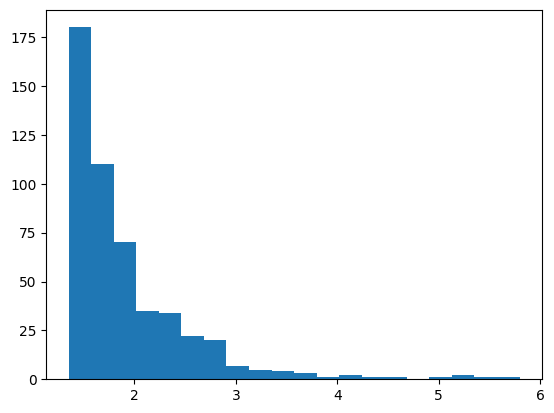

In [21]:
rmse_only_kinfo, errors_only_kinfo = sim_lstm(df_eur, 'EURHUF.X.Close', ['alapkamat','kinfo_dummy'],  n_sim)
plt.hist(rmse_only_kinfo, bins = 20)
plt.show()
# stats.describe(mse_only_kinfo)

### Only Varga Mihaly

Epoch 1/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 126141.4766 - mean_absolute_error: 354.1572 - val_loss: 144882.3750 - val_mean_absolute_error: 380.6002
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 125563.4531 - mean_absolute_error: 353.3290 - val_loss: 140294.8906 - val_mean_absolute_error: 374.5250
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 118505.8125 - mean_absolute_error: 343.1819 - val_loss: 128875.6797 - val_mean_absolute_error: 358.9565
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 107386.0000 - mean_absolute_error: 326.5581 - val_loss: 114363.0625 - val_mean_absolute_error: 338.1378
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 93219.9453 - mean_absolute_error: 304.0916 - val_loss: 96117.9297 - val_mean_absolute_error: 309.9872
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 76447.5703 - mean_absolute_error: 274.9843 - val_loss: 74970.0156 - val_mean_absolute_error: 273.7593
Epoch 7/100
41/41 ━━━━━━━

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3078 - mean_absolute_error: 1.5093 - val_loss: 3.4548 - val_mean_absolute_error: 1.4463
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8421 - mean_absolute_error: 1.6052 - val_loss: 5.5190 - val_mean_absolute_error: 1.9060
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2891 - mean_absolute_error: 1.7632 - val_loss: 8.3535 - val_mean_absolute_error: 2.3747
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1298 - mean_absolute_error: 2.1088 - val_loss: 5.2254 - val_mean_absolute_error: 1.7946
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7625 - mean_absolute_error: 1.5303 - val_loss: 4.5335 - val_mean_absolute_error: 1.6679
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1084 - mean_absolute_error: 1.8723 - val_loss: 3.9475 - val_mean_absolute_error: 1.5517
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4743 - mean_absolute_error: 1.7549 - val_loss: 4.2405 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.8381 - mean_absolute_error: 1.7078 - val_loss: 3.6129 - val_mean_absolute_error: 1.4920
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2347 - mean_absolute_error: 1.6442 - val_loss: 3.6234 - val_mean_absolute_error: 1.4815
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1218 - mean_absolute_error: 1.6405 - val_loss: 4.6129 - val_mean_absolute_error: 1.7023
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2980 - mean_absolute_error: 1.6881 - val_loss: 9.4731 - val_mean_absolute_error: 2.6769
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3624 - mean_absolute_error: 2.1694 - val_loss: 3.5077 - val_mean_absolute_error: 1.4575
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4350 - mean_absolute_error: 1.5232 - val_loss: 4.8437 - val_mean_absolute_error: 1.7377
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3561 - mean_absolute_error: 1.7158 - val_loss: 5.5892 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0891 - mean_absolute_error: 1.4533 - val_loss: 4.5992 - val_mean_absolute_error: 1.6952
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4522 - mean_absolute_error: 1.5832 - val_loss: 3.4014 - val_mean_absolute_error: 1.4377
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6452 - mean_absolute_error: 1.4971 - val_loss: 3.4962 - val_mean_absolute_error: 1.4688
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9778 - mean_absolute_error: 1.5928 - val_loss: 3.8992 - val_mean_absolute_error: 1.5533
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6174 - mean_absolute_error: 1.5612 - val_loss: 3.4772 - val_mean_absolute_error: 1.4502
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4466 - mean_absolute_error: 1.4905 - val_loss: 3.4903 - val_mean_absolute_error: 1.4648
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.4180 - mean_absolute_error: 1.8795 - val_loss: 9.0347 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9765 - mean_absolute_error: 1.6676 - val_loss: 3.6816 - val_mean_absolute_error: 1.4905
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3184 - mean_absolute_error: 1.4887 - val_loss: 4.0446 - val_mean_absolute_error: 1.5763
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6894 - mean_absolute_error: 1.6015 - val_loss: 4.4745 - val_mean_absolute_error: 1.6579
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0687 - mean_absolute_error: 1.6409 - val_loss: 4.4473 - val_mean_absolute_error: 1.6523
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6635 - mean_absolute_error: 1.5125 - val_loss: 6.6187 - val_mean_absolute_error: 2.1440
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6936 - mean_absolute_error: 1.9796 - val_loss: 5.0274 - val_mean_absolute_error: 1.7535
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3073 - mean_absolute_error: 1.5163 - val_loss: 4.6004 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6492 - mean_absolute_error: 1.5552 - val_loss: 3.4874 - val_mean_absolute_error: 1.4552
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3168 - mean_absolute_error: 1.7080 - val_loss: 3.6049 - val_mean_absolute_error: 1.4767
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8732 - mean_absolute_error: 1.6422 - val_loss: 3.6169 - val_mean_absolute_error: 1.4889
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5561 - mean_absolute_error: 1.5676 - val_loss: 7.1188 - val_mean_absolute_error: 2.2465
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6199 - mean_absolute_error: 1.8415 - val_loss: 3.7768 - val_mean_absolute_error: 1.5211
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6180 - mean_absolute_error: 1.5406 - val_loss: 5.5672 - val_mean_absolute_error: 1.8562
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1554 - mean_absolute_error: 1.4724 - val_loss: 7.5866 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6529 - mean_absolute_error: 1.5601 - val_loss: 4.7212 - val_mean_absolute_error: 1.7042
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4848 - mean_absolute_error: 1.7584 - val_loss: 4.9713 - val_mean_absolute_error: 1.7512
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3094 - mean_absolute_error: 1.7232 - val_loss: 4.5557 - val_mean_absolute_error: 1.6720
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8063 - mean_absolute_error: 1.8067 - val_loss: 5.8643 - val_mean_absolute_error: 1.9117
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2407 - mean_absolute_error: 1.8845 - val_loss: 6.4333 - val_mean_absolute_error: 2.0157
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1672 - mean_absolute_error: 1.8783 - val_loss: 8.0864 - val_mean_absolute_error: 2.3276
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0152 - mean_absolute_error: 1.6770 - val_loss: 3.5604 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5117 - mean_absolute_error: 1.8102 - val_loss: 4.0690 - val_mean_absolute_error: 1.5832
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3344 - mean_absolute_error: 2.0725 - val_loss: 3.6812 - val_mean_absolute_error: 1.4993
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7204 - mean_absolute_error: 1.5627 - val_loss: 8.6403 - val_mean_absolute_error: 2.5286
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7519 - mean_absolute_error: 1.9760 - val_loss: 4.4212 - val_mean_absolute_error: 1.6487
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2329 - mean_absolute_error: 1.6512 - val_loss: 4.2261 - val_mean_absolute_error: 1.6184
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0775 - mean_absolute_error: 1.6430 - val_loss: 3.6249 - val_mean_absolute_error: 1.4929
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3081 - mean_absolute_error: 1.7218 - val_loss: 3.6721 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2520 - mean_absolute_error: 1.6978 - val_loss: 4.5807 - val_mean_absolute_error: 1.6758
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8005 - mean_absolute_error: 1.8581 - val_loss: 3.8159 - val_mean_absolute_error: 1.5349
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5906 - mean_absolute_error: 1.5775 - val_loss: 4.0046 - val_mean_absolute_error: 1.5757
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5041 - mean_absolute_error: 1.5306 - val_loss: 3.5379 - val_mean_absolute_error: 1.4658
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0749 - mean_absolute_error: 1.4673 - val_loss: 6.7273 - val_mean_absolute_error: 2.0717
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2288 - mean_absolute_error: 1.8497 - val_loss: 3.6634 - val_mean_absolute_error: 1.5008
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8363 - mean_absolute_error: 1.6096 - val_loss: 7.2419 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4421 - mean_absolute_error: 1.7010 - val_loss: 3.8099 - val_mean_absolute_error: 1.5150
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9720 - mean_absolute_error: 1.7743 - val_loss: 8.5298 - val_mean_absolute_error: 2.5136
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8138 - mean_absolute_error: 1.8412 - val_loss: 5.5239 - val_mean_absolute_error: 1.9148
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4339 - mean_absolute_error: 1.7518 - val_loss: 6.2185 - val_mean_absolute_error: 2.0544
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9430 - mean_absolute_error: 2.0702 - val_loss: 6.0331 - val_mean_absolute_error: 2.0175
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0248 - mean_absolute_error: 1.7095 - val_loss: 3.5969 - val_mean_absolute_error: 1.4729
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.2249 - mean_absolute_error: 1.5011 - val_loss: 15.0248 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6531 - mean_absolute_error: 1.7505 - val_loss: 3.5682 - val_mean_absolute_error: 1.4744
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6670 - mean_absolute_error: 1.5147 - val_loss: 5.3449 - val_mean_absolute_error: 1.8190
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1368 - mean_absolute_error: 1.6877 - val_loss: 3.3783 - val_mean_absolute_error: 1.4424
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6709 - mean_absolute_error: 1.6400 - val_loss: 5.9001 - val_mean_absolute_error: 1.9921
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.6887 - mean_absolute_error: 2.0707 - val_loss: 5.2952 - val_mean_absolute_error: 1.8761
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2318 - mean_absolute_error: 1.7062 - val_loss: 4.0123 - val_mean_absolute_error: 1.5732
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3856 - mean_absolute_error: 1.7337 - val_loss: 4.7766 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 9.1196 - mean_absolute_error: 2.3321 - val_loss: 4.6421 - val_mean_absolute_error: 1.6849
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0772 - mean_absolute_error: 1.5960 - val_loss: 4.6450 - val_mean_absolute_error: 1.6927
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6391 - mean_absolute_error: 1.5509 - val_loss: 6.0679 - val_mean_absolute_error: 1.9518
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2881 - mean_absolute_error: 1.6893 - val_loss: 3.6674 - val_mean_absolute_error: 1.4945
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6631 - mean_absolute_error: 1.5492 - val_loss: 4.4023 - val_mean_absolute_error: 1.6595
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7600 - mean_absolute_error: 1.6133 - val_loss: 3.4363 - val_mean_absolute_error: 1.4515
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8083 - mean_absolute_error: 1.7714 - val_loss: 12.3897 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7167 - mean_absolute_error: 1.5404 - val_loss: 6.4066 - val_mean_absolute_error: 2.0136
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9527 - mean_absolute_error: 1.6394 - val_loss: 5.9298 - val_mean_absolute_error: 2.0049
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0829 - mean_absolute_error: 1.6775 - val_loss: 3.5095 - val_mean_absolute_error: 1.4715
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0533 - mean_absolute_error: 1.6643 - val_loss: 3.5019 - val_mean_absolute_error: 1.4586
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2368 - mean_absolute_error: 1.6262 - val_loss: 7.3200 - val_mean_absolute_error: 2.1875
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9821 - mean_absolute_error: 1.8761 - val_loss: 4.2417 - val_mean_absolute_error: 1.6081
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6224 - mean_absolute_error: 1.5253 - val_loss: 4.0629 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6620 - mean_absolute_error: 1.6040 - val_loss: 3.8137 - val_mean_absolute_error: 1.5341
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0271 - mean_absolute_error: 1.6254 - val_loss: 3.5790 - val_mean_absolute_error: 1.4843
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3033 - mean_absolute_error: 1.9028 - val_loss: 4.7611 - val_mean_absolute_error: 1.7079
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8010 - mean_absolute_error: 1.8502 - val_loss: 3.7758 - val_mean_absolute_error: 1.5105
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6174 - mean_absolute_error: 1.9679 - val_loss: 8.9743 - val_mean_absolute_error: 2.6091
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.9632 - mean_absolute_error: 2.2305 - val_loss: 4.5306 - val_mean_absolute_error: 1.6668
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5003 - mean_absolute_error: 1.6897 - val_loss: 4.6702 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3993 - mean_absolute_error: 1.5336 - val_loss: 3.5617 - val_mean_absolute_error: 1.4819
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0909 - mean_absolute_error: 1.6307 - val_loss: 3.5121 - val_mean_absolute_error: 1.4585
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8970 - mean_absolute_error: 1.6060 - val_loss: 3.4397 - val_mean_absolute_error: 1.4554
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5973 - mean_absolute_error: 1.5371 - val_loss: 6.5501 - val_mean_absolute_error: 2.1347
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0161 - mean_absolute_error: 1.7278 - val_loss: 4.2002 - val_mean_absolute_error: 1.5964
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5160 - mean_absolute_error: 1.9295 - val_loss: 4.0591 - val_mean_absolute_error: 1.5721
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 11.0913 - mean_absolute_error: 2.7459 - val_loss: 3.5093 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3850 - mean_absolute_error: 1.5448 - val_loss: 4.0439 - val_mean_absolute_error: 1.5785
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3436 - mean_absolute_error: 1.5002 - val_loss: 4.0939 - val_mean_absolute_error: 1.5911
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9092 - mean_absolute_error: 1.5980 - val_loss: 10.2940 - val_mean_absolute_error: 2.7154
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2848 - mean_absolute_error: 1.8862 - val_loss: 4.8004 - val_mean_absolute_error: 1.7563
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9366 - mean_absolute_error: 1.8380 - val_loss: 4.2539 - val_mean_absolute_error: 1.6078
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6224 - mean_absolute_error: 1.5767 - val_loss: 4.6447 - val_mean_absolute_error: 1.7138
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4351 - mean_absolute_error: 1.5391 - val_loss: 5.4638 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3721 - mean_absolute_error: 1.5215 - val_loss: 3.4908 - val_mean_absolute_error: 1.4684
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4695 - mean_absolute_error: 1.7314 - val_loss: 4.3380 - val_mean_absolute_error: 1.6286
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5386 - mean_absolute_error: 1.5428 - val_loss: 4.6695 - val_mean_absolute_error: 1.7170
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5776 - mean_absolute_error: 1.5894 - val_loss: 4.5152 - val_mean_absolute_error: 1.6766
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6985 - mean_absolute_error: 1.5641 - val_loss: 3.4995 - val_mean_absolute_error: 1.4700
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2839 - mean_absolute_error: 1.5379 - val_loss: 3.6043 - val_mean_absolute_error: 1.4892
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3823 - mean_absolute_error: 1.7606 - val_loss: 6.3248 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.9774 - mean_absolute_error: 2.1994 - val_loss: 3.4915 - val_mean_absolute_error: 1.4672
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4865 - mean_absolute_error: 1.9056 - val_loss: 3.8388 - val_mean_absolute_error: 1.5378
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1668 - mean_absolute_error: 1.4541 - val_loss: 3.8600 - val_mean_absolute_error: 1.5392
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2349 - mean_absolute_error: 1.7094 - val_loss: 4.2945 - val_mean_absolute_error: 1.6345
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8504 - mean_absolute_error: 1.5810 - val_loss: 5.0440 - val_mean_absolute_error: 1.7594
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5951 - mean_absolute_error: 1.5773 - val_loss: 3.7764 - val_mean_absolute_error: 1.5176
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4367 - mean_absolute_error: 1.5190 - val_loss: 4.1966 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.8137 - mean_absolute_error: 1.7518 - val_loss: 3.5821 - val_mean_absolute_error: 1.4708
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8362 - mean_absolute_error: 1.8337 - val_loss: 3.4989 - val_mean_absolute_error: 1.4571
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6667 - mean_absolute_error: 1.7523 - val_loss: 3.4236 - val_mean_absolute_error: 1.4530
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1967 - mean_absolute_error: 1.6842 - val_loss: 8.8854 - val_mean_absolute_error: 2.4864
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4373 - mean_absolute_error: 1.7180 - val_loss: 3.5367 - val_mean_absolute_error: 1.4653
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4590 - mean_absolute_error: 1.5006 - val_loss: 5.5701 - val_mean_absolute_error: 1.8563
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6250 - mean_absolute_error: 1.9747 - val_loss: 5.9196 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2528 - mean_absolute_error: 1.6318 - val_loss: 3.9357 - val_mean_absolute_error: 1.5612
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4801 - mean_absolute_error: 1.7660 - val_loss: 3.5160 - val_mean_absolute_error: 1.4732
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3325 - mean_absolute_error: 1.6944 - val_loss: 3.4867 - val_mean_absolute_error: 1.4549
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.4978 - mean_absolute_error: 1.5078 - val_loss: 3.4601 - val_mean_absolute_error: 1.4396
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9374 - mean_absolute_error: 1.4319 - val_loss: 3.8554 - val_mean_absolute_error: 1.5431
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9720 - mean_absolute_error: 1.5519 - val_loss: 7.7717 - val_mean_absolute_error: 2.2704
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4833 - mean_absolute_error: 1.9132 - val_loss: 7.7320 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2280 - mean_absolute_error: 1.4380 - val_loss: 4.3429 - val_mean_absolute_error: 1.6636
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9493 - mean_absolute_error: 1.8866 - val_loss: 3.4456 - val_mean_absolute_error: 1.4476
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4287 - mean_absolute_error: 1.4995 - val_loss: 7.3586 - val_mean_absolute_error: 2.1899
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7261 - mean_absolute_error: 1.7447 - val_loss: 6.5437 - val_mean_absolute_error: 2.0365
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5569 - mean_absolute_error: 1.5835 - val_loss: 6.0394 - val_mean_absolute_error: 1.9448
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9595 - mean_absolute_error: 1.6622 - val_loss: 5.2798 - val_mean_absolute_error: 1.8036
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8689 - mean_absolute_error: 2.0476 - val_loss: 4.6906 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7298 - mean_absolute_error: 1.6565 - val_loss: 4.0075 - val_mean_absolute_error: 1.5648
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9321 - mean_absolute_error: 1.6421 - val_loss: 3.7935 - val_mean_absolute_error: 1.5294
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1472 - mean_absolute_error: 1.7651 - val_loss: 3.6621 - val_mean_absolute_error: 1.4954
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1844 - mean_absolute_error: 1.6883 - val_loss: 3.8202 - val_mean_absolute_error: 1.5352
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5278 - mean_absolute_error: 1.5169 - val_loss: 3.9740 - val_mean_absolute_error: 1.5464
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4608 - mean_absolute_error: 1.5384 - val_loss: 5.7340 - val_mean_absolute_error: 1.8864
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7834 - mean_absolute_error: 1.9242 - val_loss: 4.1002 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.0108 - mean_absolute_error: 1.9345 - val_loss: 4.3001 - val_mean_absolute_error: 1.6270
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6904 - mean_absolute_error: 1.5819 - val_loss: 4.9913 - val_mean_absolute_error: 1.7946
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6980 - mean_absolute_error: 1.9788 - val_loss: 3.5665 - val_mean_absolute_error: 1.4826
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6263 - mean_absolute_error: 1.5094 - val_loss: 4.5839 - val_mean_absolute_error: 1.6771
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2029 - mean_absolute_error: 1.6578 - val_loss: 3.5105 - val_mean_absolute_error: 1.4491
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6203 - mean_absolute_error: 1.5783 - val_loss: 3.6346 - val_mean_absolute_error: 1.4951
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4309 - mean_absolute_error: 1.4986 - val_loss: 3.5095 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8464 - mean_absolute_error: 1.5728 - val_loss: 3.5111 - val_mean_absolute_error: 1.4694
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0805 - mean_absolute_error: 1.4414 - val_loss: 4.2115 - val_mean_absolute_error: 1.6026
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6125 - mean_absolute_error: 1.7075 - val_loss: 10.4068 - val_mean_absolute_error: 2.7369
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5167 - mean_absolute_error: 2.0063 - val_loss: 5.0323 - val_mean_absolute_error: 1.7543
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5099 - mean_absolute_error: 1.7409 - val_loss: 4.1340 - val_mean_absolute_error: 1.5861
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6054 - mean_absolute_error: 1.7235 - val_loss: 6.7844 - val_mean_absolute_error: 2.1836
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1848 - mean_absolute_error: 1.8998 - val_loss: 3.9247 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3920 - mean_absolute_error: 1.6713 - val_loss: 3.5195 - val_mean_absolute_error: 1.4722
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2090 - mean_absolute_error: 1.4925 - val_loss: 6.0066 - val_mean_absolute_error: 1.9362
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6733 - mean_absolute_error: 1.5943 - val_loss: 4.1743 - val_mean_absolute_error: 1.6003
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0870 - mean_absolute_error: 1.8830 - val_loss: 3.5113 - val_mean_absolute_error: 1.4548
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6843 - mean_absolute_error: 1.5552 - val_loss: 3.5306 - val_mean_absolute_error: 1.4765
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3239 - mean_absolute_error: 1.4868 - val_loss: 5.7942 - val_mean_absolute_error: 1.8985
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5789 - mean_absolute_error: 1.6831 - val_loss: 4.8048 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2175 - mean_absolute_error: 1.6885 - val_loss: 3.5543 - val_mean_absolute_error: 1.4662
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8641 - mean_absolute_error: 1.5821 - val_loss: 13.9910 - val_mean_absolute_error: 3.2970
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1291 - mean_absolute_error: 2.0700 - val_loss: 6.0498 - val_mean_absolute_error: 1.9448
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1855 - mean_absolute_error: 1.7291 - val_loss: 4.8710 - val_mean_absolute_error: 1.7275
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3962 - mean_absolute_error: 1.9066 - val_loss: 4.7832 - val_mean_absolute_error: 1.7515
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0374 - mean_absolute_error: 1.6272 - val_loss: 4.9770 - val_mean_absolute_error: 1.7447
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1406 - mean_absolute_error: 1.6156 - val_loss: 4.1122 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1610 - mean_absolute_error: 1.6960 - val_loss: 4.9785 - val_mean_absolute_error: 1.7549
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5690 - mean_absolute_error: 1.5313 - val_loss: 4.0951 - val_mean_absolute_error: 1.5960
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7401 - mean_absolute_error: 1.7717 - val_loss: 3.4942 - val_mean_absolute_error: 1.4681
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6889 - mean_absolute_error: 1.9796 - val_loss: 3.7045 - val_mean_absolute_error: 1.5099
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7471 - mean_absolute_error: 1.6039 - val_loss: 3.5440 - val_mean_absolute_error: 1.4605
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2873 - mean_absolute_error: 1.6626 - val_loss: 5.0353 - val_mean_absolute_error: 1.8043
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9419 - mean_absolute_error: 1.5835 - val_loss: 3.7329 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4976 - mean_absolute_error: 1.5001 - val_loss: 3.4972 - val_mean_absolute_error: 1.4622
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1899 - mean_absolute_error: 1.4678 - val_loss: 3.5855 - val_mean_absolute_error: 1.4747
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3498 - mean_absolute_error: 1.5193 - val_loss: 9.3681 - val_mean_absolute_error: 2.5619
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9817 - mean_absolute_error: 1.8344 - val_loss: 4.8259 - val_mean_absolute_error: 1.7469
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5049 - mean_absolute_error: 1.5979 - val_loss: 4.9570 - val_mean_absolute_error: 1.7418
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2637 - mean_absolute_error: 1.8315 - val_loss: 3.5233 - val_mean_absolute_error: 1.4658
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5976 - mean_absolute_error: 1.5955 - val_loss: 4.1058 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2250 - mean_absolute_error: 1.6877 - val_loss: 9.4271 - val_mean_absolute_error: 2.5642
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0667 - mean_absolute_error: 1.6700 - val_loss: 3.7536 - val_mean_absolute_error: 1.5219
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9234 - mean_absolute_error: 1.7226 - val_loss: 3.5510 - val_mean_absolute_error: 1.4649
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6615 - mean_absolute_error: 1.5563 - val_loss: 5.5977 - val_mean_absolute_error: 1.8666
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6318 - mean_absolute_error: 1.7227 - val_loss: 7.0322 - val_mean_absolute_error: 2.2278
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0565 - mean_absolute_error: 1.7010 - val_loss: 3.4857 - val_mean_absolute_error: 1.4586
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8460 - mean_absolute_error: 1.5807 - val_loss: 7.6212 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2747 - mean_absolute_error: 1.6678 - val_loss: 3.9992 - val_mean_absolute_error: 1.5687
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8831 - mean_absolute_error: 1.6273 - val_loss: 3.9394 - val_mean_absolute_error: 1.5604
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8991 - mean_absolute_error: 1.6322 - val_loss: 7.4274 - val_mean_absolute_error: 2.3037
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3915 - mean_absolute_error: 1.7840 - val_loss: 5.4318 - val_mean_absolute_error: 1.8938
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4036 - mean_absolute_error: 1.6672 - val_loss: 3.5113 - val_mean_absolute_error: 1.4722
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4320 - mean_absolute_error: 1.7262 - val_loss: 8.6609 - val_mean_absolute_error: 2.4416
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.3137 - mean_absolute_error: 2.3047 - val_loss: 3.8481 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.1186 - mean_absolute_error: 2.0599 - val_loss: 5.1854 - val_mean_absolute_error: 1.8427
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1411 - mean_absolute_error: 1.5070 - val_loss: 3.5463 - val_mean_absolute_error: 1.4791
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6566 - mean_absolute_error: 1.9879 - val_loss: 6.8489 - val_mean_absolute_error: 2.0922
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6012 - mean_absolute_error: 1.5683 - val_loss: 5.3907 - val_mean_absolute_error: 1.8230
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4076 - mean_absolute_error: 1.5296 - val_loss: 4.0121 - val_mean_absolute_error: 1.5780
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8221 - mean_absolute_error: 1.6148 - val_loss: 4.7489 - val_mean_absolute_error: 1.7022
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2751 - mean_absolute_error: 1.6653 - val_loss: 5.6281 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.1359 - mean_absolute_error: 1.8787 - val_loss: 3.4375 - val_mean_absolute_error: 1.4525
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7234 - mean_absolute_error: 1.7971 - val_loss: 4.6122 - val_mean_absolute_error: 1.6718
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9678 - mean_absolute_error: 1.8072 - val_loss: 5.7864 - val_mean_absolute_error: 1.9798
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0250 - mean_absolute_error: 1.8631 - val_loss: 3.6376 - val_mean_absolute_error: 1.4969
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6623 - mean_absolute_error: 1.5933 - val_loss: 4.8850 - val_mean_absolute_error: 1.7369
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9014 - mean_absolute_error: 1.6332 - val_loss: 4.1099 - val_mean_absolute_error: 1.5915
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0367 - mean_absolute_error: 1.6342 - val_loss: 6.2204 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.7928 - mean_absolute_error: 2.0353 - val_loss: 6.5300 - val_mean_absolute_error: 2.0349
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0304 - mean_absolute_error: 1.6635 - val_loss: 3.8705 - val_mean_absolute_error: 1.5461
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5733 - mean_absolute_error: 1.5536 - val_loss: 3.4146 - val_mean_absolute_error: 1.4383
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2062 - mean_absolute_error: 1.6811 - val_loss: 8.6090 - val_mean_absolute_error: 2.5120
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0530 - mean_absolute_error: 1.8481 - val_loss: 5.5085 - val_mean_absolute_error: 1.8458
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2246 - mean_absolute_error: 1.6175 - val_loss: 5.6472 - val_mean_absolute_error: 1.8723
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1432 - mean_absolute_error: 1.6723 - val_loss: 4.0704 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.8836 - mean_absolute_error: 2.0594 - val_loss: 4.2542 - val_mean_absolute_error: 1.6082
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7057 - mean_absolute_error: 1.7541 - val_loss: 3.4303 - val_mean_absolute_error: 1.4404
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2696 - mean_absolute_error: 1.4678 - val_loss: 3.4322 - val_mean_absolute_error: 1.4508
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3220 - mean_absolute_error: 1.4957 - val_loss: 3.3842 - val_mean_absolute_error: 1.4336
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6229 - mean_absolute_error: 1.5344 - val_loss: 3.7394 - val_mean_absolute_error: 1.5178
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5392 - mean_absolute_error: 1.5865 - val_loss: 3.5487 - val_mean_absolute_error: 1.4693
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6420 - mean_absolute_error: 1.5218 - val_loss: 3.4809 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.1464 - mean_absolute_error: 1.9128 - val_loss: 3.5986 - val_mean_absolute_error: 1.4788
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2877 - mean_absolute_error: 1.4708 - val_loss: 5.0315 - val_mean_absolute_error: 1.7958
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8269 - mean_absolute_error: 1.5952 - val_loss: 3.5520 - val_mean_absolute_error: 1.4675
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0001 - mean_absolute_error: 1.6235 - val_loss: 6.5103 - val_mean_absolute_error: 2.1134
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5928 - mean_absolute_error: 1.7813 - val_loss: 4.7578 - val_mean_absolute_error: 1.7070
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8674 - mean_absolute_error: 1.5793 - val_loss: 3.5593 - val_mean_absolute_error: 1.4801
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2632 - mean_absolute_error: 1.5234 - val_loss: 3.4390 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3878 - mean_absolute_error: 1.5268 - val_loss: 3.6016 - val_mean_absolute_error: 1.4888
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4061 - mean_absolute_error: 1.5048 - val_loss: 12.3340 - val_mean_absolute_error: 3.0469
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3241 - mean_absolute_error: 1.9213 - val_loss: 4.9326 - val_mean_absolute_error: 1.7376
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5632 - mean_absolute_error: 1.7920 - val_loss: 6.0071 - val_mean_absolute_error: 2.0235
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4423 - mean_absolute_error: 1.7137 - val_loss: 5.5078 - val_mean_absolute_error: 1.9084
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0214 - mean_absolute_error: 1.6182 - val_loss: 6.3379 - val_mean_absolute_error: 2.0727
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1249 - mean_absolute_error: 1.9482 - val_loss: 4.3705 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2199 - mean_absolute_error: 1.7014 - val_loss: 3.6051 - val_mean_absolute_error: 1.4915
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1884 - mean_absolute_error: 1.4511 - val_loss: 3.8399 - val_mean_absolute_error: 1.5277
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0303 - mean_absolute_error: 1.4263 - val_loss: 3.6429 - val_mean_absolute_error: 1.4928
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6708 - mean_absolute_error: 1.5629 - val_loss: 4.0385 - val_mean_absolute_error: 1.5730
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7727 - mean_absolute_error: 1.4002 - val_loss: 3.5046 - val_mean_absolute_error: 1.4582
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3349 - mean_absolute_error: 1.5262 - val_loss: 3.7737 - val_mean_absolute_error: 1.5259
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5232 - mean_absolute_error: 1.5331 - val_loss: 4.2086 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5981 - mean_absolute_error: 1.7570 - val_loss: 7.5075 - val_mean_absolute_error: 2.2184
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5019 - mean_absolute_error: 1.9761 - val_loss: 6.3015 - val_mean_absolute_error: 1.9915
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9298 - mean_absolute_error: 1.6009 - val_loss: 3.5084 - val_mean_absolute_error: 1.4568
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0844 - mean_absolute_error: 1.8653 - val_loss: 3.4808 - val_mean_absolute_error: 1.4604
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4245 - mean_absolute_error: 1.7056 - val_loss: 3.4817 - val_mean_absolute_error: 1.4522
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4894 - mean_absolute_error: 1.9193 - val_loss: 4.1096 - val_mean_absolute_error: 1.5716
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6083 - mean_absolute_error: 1.5531 - val_loss: 4.0602 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3769 - mean_absolute_error: 1.6969 - val_loss: 3.4616 - val_mean_absolute_error: 1.4546
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6490 - mean_absolute_error: 1.5649 - val_loss: 4.7732 - val_mean_absolute_error: 1.7454
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8503 - mean_absolute_error: 1.6753 - val_loss: 6.1589 - val_mean_absolute_error: 2.0599
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0262 - mean_absolute_error: 1.6770 - val_loss: 3.6994 - val_mean_absolute_error: 1.5090
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8551 - mean_absolute_error: 1.6130 - val_loss: 15.0758 - val_mean_absolute_error: 3.4481
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9791 - mean_absolute_error: 1.8845 - val_loss: 3.6431 - val_mean_absolute_error: 1.4977
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0002 - mean_absolute_error: 1.6479 - val_loss: 4.1050 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9159 - mean_absolute_error: 1.8125 - val_loss: 3.4698 - val_mean_absolute_error: 1.4601
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4357 - mean_absolute_error: 1.5144 - val_loss: 3.4389 - val_mean_absolute_error: 1.4511
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6005 - mean_absolute_error: 1.7260 - val_loss: 9.8545 - val_mean_absolute_error: 2.6572
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5773 - mean_absolute_error: 1.7351 - val_loss: 3.4505 - val_mean_absolute_error: 1.4472
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7874 - mean_absolute_error: 1.5528 - val_loss: 3.4576 - val_mean_absolute_error: 1.4465
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1689 - mean_absolute_error: 1.4757 - val_loss: 3.9096 - val_mean_absolute_error: 1.5375
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7994 - mean_absolute_error: 1.8277 - val_loss: 4.0583 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9114 - mean_absolute_error: 1.6273 - val_loss: 3.9961 - val_mean_absolute_error: 1.5593
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0358 - mean_absolute_error: 1.6071 - val_loss: 3.6361 - val_mean_absolute_error: 1.4862
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3437 - mean_absolute_error: 1.4765 - val_loss: 3.4845 - val_mean_absolute_error: 1.4539
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4598 - mean_absolute_error: 1.4890 - val_loss: 3.7260 - val_mean_absolute_error: 1.5117
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3933 - mean_absolute_error: 1.5237 - val_loss: 4.9637 - val_mean_absolute_error: 1.7781
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6352 - mean_absolute_error: 1.5324 - val_loss: 5.3860 - val_mean_absolute_error: 1.8233
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9327 - mean_absolute_error: 1.8442 - val_loss: 4.3835 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2310 - mean_absolute_error: 1.9345 - val_loss: 4.1168 - val_mean_absolute_error: 1.5901
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9200 - mean_absolute_error: 1.8286 - val_loss: 3.5473 - val_mean_absolute_error: 1.4801
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3262 - mean_absolute_error: 1.4949 - val_loss: 3.9754 - val_mean_absolute_error: 1.5699
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1571 - mean_absolute_error: 1.9104 - val_loss: 4.4851 - val_mean_absolute_error: 1.6757
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1119 - mean_absolute_error: 1.4593 - val_loss: 3.5213 - val_mean_absolute_error: 1.4741
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8963 - mean_absolute_error: 1.6041 - val_loss: 3.8544 - val_mean_absolute_error: 1.5434
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1933 - mean_absolute_error: 1.4708 - val_loss: 3.7446 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1237 - mean_absolute_error: 1.6916 - val_loss: 3.4683 - val_mean_absolute_error: 1.4488
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9071 - mean_absolute_error: 1.4723 - val_loss: 8.8981 - val_mean_absolute_error: 2.4788
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.1887 - mean_absolute_error: 2.4148 - val_loss: 3.4191 - val_mean_absolute_error: 1.4403
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5790 - mean_absolute_error: 1.5455 - val_loss: 4.5563 - val_mean_absolute_error: 1.6996
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.6902 - mean_absolute_error: 1.5450 - val_loss: 4.6757 - val_mean_absolute_error: 1.6944
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6948 - mean_absolute_error: 1.6351 - val_loss: 3.9817 - val_mean_absolute_error: 1.5697
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5546 - mean_absolute_error: 1.5420 - val_loss: 4.5731 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1397 - mean_absolute_error: 1.6722 - val_loss: 3.6786 - val_mean_absolute_error: 1.5049
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8532 - mean_absolute_error: 1.6106 - val_loss: 4.3085 - val_mean_absolute_error: 1.6283
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.5122 - mean_absolute_error: 2.2828 - val_loss: 3.6685 - val_mean_absolute_error: 1.5035
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1032 - mean_absolute_error: 1.9017 - val_loss: 6.4288 - val_mean_absolute_error: 2.0167
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8199 - mean_absolute_error: 1.6178 - val_loss: 3.4957 - val_mean_absolute_error: 1.4695
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0054 - mean_absolute_error: 1.6269 - val_loss: 3.6231 - val_mean_absolute_error: 1.4880
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7664 - mean_absolute_error: 1.5453 - val_loss: 6.4999 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.5384 - mean_absolute_error: 1.9502 - val_loss: 4.9834 - val_mean_absolute_error: 1.7844
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2899 - mean_absolute_error: 1.5180 - val_loss: 3.4873 - val_mean_absolute_error: 1.4673
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4704 - mean_absolute_error: 1.5327 - val_loss: 3.7852 - val_mean_absolute_error: 1.5277
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3625 - mean_absolute_error: 1.5386 - val_loss: 4.4300 - val_mean_absolute_error: 1.6476
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6492 - mean_absolute_error: 1.7532 - val_loss: 3.3930 - val_mean_absolute_error: 1.4363
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3375 - mean_absolute_error: 1.7302 - val_loss: 5.3918 - val_mean_absolute_error: 1.8987
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3749 - mean_absolute_error: 1.5285 - val_loss: 3.5514 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0563 - mean_absolute_error: 1.5924 - val_loss: 4.5753 - val_mean_absolute_error: 1.6978
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5562 - mean_absolute_error: 1.7968 - val_loss: 4.0955 - val_mean_absolute_error: 1.5929
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1002 - mean_absolute_error: 1.6785 - val_loss: 3.5583 - val_mean_absolute_error: 1.4677
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7790 - mean_absolute_error: 1.5764 - val_loss: 3.3807 - val_mean_absolute_error: 1.4361
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8428 - mean_absolute_error: 1.6112 - val_loss: 5.0886 - val_mean_absolute_error: 1.7716
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0070 - mean_absolute_error: 1.6574 - val_loss: 4.5675 - val_mean_absolute_error: 1.6954
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4460 - mean_absolute_error: 1.7383 - val_loss: 4.5611 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8673 - mean_absolute_error: 1.6281 - val_loss: 6.2159 - val_mean_absolute_error: 1.9786
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6759 - mean_absolute_error: 1.6093 - val_loss: 3.5938 - val_mean_absolute_error: 1.4878
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9453 - mean_absolute_error: 1.6872 - val_loss: 3.6185 - val_mean_absolute_error: 1.4833
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1294 - mean_absolute_error: 1.4514 - val_loss: 8.2344 - val_mean_absolute_error: 2.3610
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0554 - mean_absolute_error: 1.9045 - val_loss: 3.7201 - val_mean_absolute_error: 1.5146
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5472 - mean_absolute_error: 1.9780 - val_loss: 4.2774 - val_mean_absolute_error: 1.6172
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6547 - mean_absolute_error: 1.5326 - val_loss: 5.7259 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6706 - mean_absolute_error: 1.5973 - val_loss: 8.3571 - val_mean_absolute_error: 2.4809
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5551 - mean_absolute_error: 1.7682 - val_loss: 3.3957 - val_mean_absolute_error: 1.4425
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2382 - mean_absolute_error: 1.4630 - val_loss: 3.3857 - val_mean_absolute_error: 1.4373
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6795 - mean_absolute_error: 1.7842 - val_loss: 4.4871 - val_mean_absolute_error: 1.6737
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2778 - mean_absolute_error: 1.8477 - val_loss: 12.2132 - val_mean_absolute_error: 3.0301
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0848 - mean_absolute_error: 2.0421 - val_loss: 3.9580 - val_mean_absolute_error: 1.5629
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6088 - mean_absolute_error: 1.5442 - val_loss: 4.5101 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7575 - mean_absolute_error: 1.5244 - val_loss: 3.3934 - val_mean_absolute_error: 1.4424
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5792 - mean_absolute_error: 1.5728 - val_loss: 3.9442 - val_mean_absolute_error: 1.5546
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7653 - mean_absolute_error: 1.5403 - val_loss: 5.5040 - val_mean_absolute_error: 1.9212
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5533 - mean_absolute_error: 1.7750 - val_loss: 3.7395 - val_mean_absolute_error: 1.5118
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0412 - mean_absolute_error: 1.8679 - val_loss: 8.5731 - val_mean_absolute_error: 2.5024
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6682 - mean_absolute_error: 1.9605 - val_loss: 5.0364 - val_mean_absolute_error: 1.7596
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1274 - mean_absolute_error: 1.7004 - val_loss: 3.5246 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1856 - mean_absolute_error: 1.7525 - val_loss: 4.3204 - val_mean_absolute_error: 1.6421
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3940 - mean_absolute_error: 1.7212 - val_loss: 3.7190 - val_mean_absolute_error: 1.5086
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5048 - mean_absolute_error: 1.7592 - val_loss: 7.1469 - val_mean_absolute_error: 2.1488
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0278 - mean_absolute_error: 1.6103 - val_loss: 4.0171 - val_mean_absolute_error: 1.5740
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6532 - mean_absolute_error: 1.5731 - val_loss: 7.9270 - val_mean_absolute_error: 2.4106
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3371 - mean_absolute_error: 1.7180 - val_loss: 3.9838 - val_mean_absolute_error: 1.5731
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5435 - mean_absolute_error: 1.6040 - val_loss: 5.4342 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2763 - mean_absolute_error: 1.7243 - val_loss: 4.2625 - val_mean_absolute_error: 1.6103
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4068 - mean_absolute_error: 1.5741 - val_loss: 6.3867 - val_mean_absolute_error: 1.9949
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7174 - mean_absolute_error: 1.5774 - val_loss: 4.7392 - val_mean_absolute_error: 1.7156
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9073 - mean_absolute_error: 1.5837 - val_loss: 5.5443 - val_mean_absolute_error: 1.8343
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5892 - mean_absolute_error: 1.6487 - val_loss: 8.2015 - val_mean_absolute_error: 2.3217
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5920 - mean_absolute_error: 1.8829 - val_loss: 3.8625 - val_mean_absolute_error: 1.5268
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7632 - mean_absolute_error: 1.5615 - val_loss: 4.3953 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7981 - mean_absolute_error: 1.6978 - val_loss: 3.7320 - val_mean_absolute_error: 1.5075
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4145 - mean_absolute_error: 1.5095 - val_loss: 6.8203 - val_mean_absolute_error: 2.0684
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0853 - mean_absolute_error: 1.6116 - val_loss: 3.8814 - val_mean_absolute_error: 1.5470
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7321 - mean_absolute_error: 1.7895 - val_loss: 3.9311 - val_mean_absolute_error: 1.5390
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6600 - mean_absolute_error: 1.5226 - val_loss: 3.5341 - val_mean_absolute_error: 1.4584
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9401 - mean_absolute_error: 1.8194 - val_loss: 4.1804 - val_mean_absolute_error: 1.5905
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4522 - mean_absolute_error: 1.5051 - val_loss: 4.0974 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4251 - mean_absolute_error: 1.4831 - val_loss: 3.9400 - val_mean_absolute_error: 1.5382
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1325 - mean_absolute_error: 1.6354 - val_loss: 3.4930 - val_mean_absolute_error: 1.4573
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1372 - mean_absolute_error: 1.6738 - val_loss: 3.3999 - val_mean_absolute_error: 1.4487
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8561 - mean_absolute_error: 1.6361 - val_loss: 6.0743 - val_mean_absolute_error: 1.9422
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7368 - mean_absolute_error: 1.9199 - val_loss: 3.6578 - val_mean_absolute_error: 1.5022
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9647 - mean_absolute_error: 1.6534 - val_loss: 3.6626 - val_mean_absolute_error: 1.4826
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7619 - mean_absolute_error: 1.5717 - val_loss: 4.3495 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7702 - mean_absolute_error: 1.8639 - val_loss: 11.0207 - val_mean_absolute_error: 2.8240
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3200 - mean_absolute_error: 1.8471 - val_loss: 3.9755 - val_mean_absolute_error: 1.5687
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7136 - mean_absolute_error: 1.7799 - val_loss: 4.2447 - val_mean_absolute_error: 1.6153
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4103 - mean_absolute_error: 1.4927 - val_loss: 11.5790 - val_mean_absolute_error: 2.9240
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.3735 - mean_absolute_error: 2.2466 - val_loss: 4.7858 - val_mean_absolute_error: 1.7362
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9740 - mean_absolute_error: 1.8127 - val_loss: 4.8461 - val_mean_absolute_error: 1.7529
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0256 - mean_absolute_error: 1.8262 - val_loss: 3.9827 -

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2137 - mean_absolute_error: 1.6930 - val_loss: 3.4568 - val_mean_absolute_error: 1.4455
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0461 - mean_absolute_error: 1.8288 - val_loss: 9.9298 - val_mean_absolute_error: 2.7420
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1509 - mean_absolute_error: 1.8691 - val_loss: 3.5688 - val_mean_absolute_error: 1.4628
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6890 - mean_absolute_error: 1.5191 - val_loss: 3.8549 - val_mean_absolute_error: 1.5203
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9778 - mean_absolute_error: 1.6135 - val_loss: 3.6643 - val_mean_absolute_error: 1.4975
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4786 - mean_absolute_error: 1.5473 - val_loss: 4.5898 - val_mean_absolute_error: 1.6940
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5193 - mean_absolute_error: 1.5471 - val_loss: 7.4719 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.8451 - mean_absolute_error: 1.8161 - val_loss: 4.7017 - val_mean_absolute_error: 1.7011
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6018 - mean_absolute_error: 1.5472 - val_loss: 4.7631 - val_mean_absolute_error: 1.7190
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3110 - mean_absolute_error: 1.6806 - val_loss: 5.0404 - val_mean_absolute_error: 1.7628
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4107 - mean_absolute_error: 1.6977 - val_loss: 5.1582 - val_mean_absolute_error: 1.7801
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1510 - mean_absolute_error: 1.7002 - val_loss: 3.5236 - val_mean_absolute_error: 1.4765
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4689 - mean_absolute_error: 1.7042 - val_loss: 10.3619 - val_mean_absolute_error: 2.7328
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5561 - mean_absolute_error: 1.8266 - val_loss: 5.3249 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.0187 - mean_absolute_error: 1.9096 - val_loss: 3.7434 - val_mean_absolute_error: 1.4933
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2087 - mean_absolute_error: 1.9148 - val_loss: 5.8028 - val_mean_absolute_error: 1.9035
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6870 - mean_absolute_error: 1.7713 - val_loss: 13.3355 - val_mean_absolute_error: 3.2802
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3084 - mean_absolute_error: 2.0255 - val_loss: 15.0958 - val_mean_absolute_error: 3.4559
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4045 - mean_absolute_error: 2.1468 - val_loss: 4.5998 - val_mean_absolute_error: 1.6920
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4668 - mean_absolute_error: 1.7129 - val_loss: 3.4456 - val_mean_absolute_error: 1.4594
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5245 - mean_absolute_error: 1.5698 - val_loss: 4.6938 -

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2370 - mean_absolute_error: 1.5287 - val_loss: 3.6933 - val_mean_absolute_error: 1.5125
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9500 - mean_absolute_error: 1.6370 - val_loss: 3.7231 - val_mean_absolute_error: 1.5136
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0976 - mean_absolute_error: 1.6932 - val_loss: 4.3280 - val_mean_absolute_error: 1.6344
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4374 - mean_absolute_error: 1.7264 - val_loss: 3.4456 - val_mean_absolute_error: 1.4606
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1243 - mean_absolute_error: 1.6381 - val_loss: 5.8339 - val_mean_absolute_error: 1.9157
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.5488 - mean_absolute_error: 2.1084 - val_loss: 3.3812 - val_mean_absolute_error: 1.4297
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6166 - mean_absolute_error: 1.5162 - val_loss: 6.0491 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4009 - mean_absolute_error: 1.5320 - val_loss: 4.1612 - val_mean_absolute_error: 1.6069
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8289 - mean_absolute_error: 2.0183 - val_loss: 7.0176 - val_mean_absolute_error: 2.1238
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1604 - mean_absolute_error: 1.6966 - val_loss: 3.4498 - val_mean_absolute_error: 1.4459
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4948 - mean_absolute_error: 1.5454 - val_loss: 3.4254 - val_mean_absolute_error: 1.4369
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3858 - mean_absolute_error: 1.4875 - val_loss: 10.5368 - val_mean_absolute_error: 2.7645
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6866 - mean_absolute_error: 1.9996 - val_loss: 4.9226 - val_mean_absolute_error: 1.7719
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3785 - mean_absolute_error: 1.6880 - val_loss: 3.7363 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0546 - mean_absolute_error: 1.6448 - val_loss: 3.7633 - val_mean_absolute_error: 1.5241
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7014 - mean_absolute_error: 1.5485 - val_loss: 6.7688 - val_mean_absolute_error: 2.1715
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0690 - mean_absolute_error: 1.8820 - val_loss: 7.4211 - val_mean_absolute_error: 2.2956
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6871 - mean_absolute_error: 1.9412 - val_loss: 3.4801 - val_mean_absolute_error: 1.4608
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4222 - mean_absolute_error: 1.5474 - val_loss: 8.2913 - val_mean_absolute_error: 2.3685
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8950 - mean_absolute_error: 1.8709 - val_loss: 4.6962 - val_mean_absolute_error: 1.6987
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7091 - mean_absolute_error: 1.7815 - val_loss: 4.4246 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1835 - mean_absolute_error: 1.5998 - val_loss: 3.7114 - val_mean_absolute_error: 1.4914
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7579 - mean_absolute_error: 1.5693 - val_loss: 4.1829 - val_mean_absolute_error: 1.6170
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.3490 - mean_absolute_error: 1.5036 - val_loss: 3.6244 - val_mean_absolute_error: 1.4982
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7770 - mean_absolute_error: 1.5929 - val_loss: 5.0846 - val_mean_absolute_error: 1.7748
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4114 - mean_absolute_error: 1.5419 - val_loss: 4.6253 - val_mean_absolute_error: 1.7015
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8880 - mean_absolute_error: 1.8296 - val_loss: 5.8634 - val_mean_absolute_error: 1.9828
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6058 - mean_absolute_error: 1.9311 - val_loss: 5.0332 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4398 - mean_absolute_error: 1.5825 - val_loss: 4.0703 - val_mean_absolute_error: 1.5852
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0311 - mean_absolute_error: 1.7001 - val_loss: 4.9237 - val_mean_absolute_error: 1.7828
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7184 - mean_absolute_error: 1.6320 - val_loss: 4.5692 - val_mean_absolute_error: 1.6883
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3939 - mean_absolute_error: 1.5403 - val_loss: 8.6821 - val_mean_absolute_error: 2.5568
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9016 - mean_absolute_error: 1.8804 - val_loss: 3.3990 - val_mean_absolute_error: 1.4469
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5559 - mean_absolute_error: 1.5526 - val_loss: 3.9303 - val_mean_absolute_error: 1.5656
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6295 - mean_absolute_error: 1.7568 - val_loss: 3.4337 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9820 - mean_absolute_error: 1.6275 - val_loss: 3.4905 - val_mean_absolute_error: 1.4566
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6640 - mean_absolute_error: 1.5544 - val_loss: 4.0211 - val_mean_absolute_error: 1.5541
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0287 - mean_absolute_error: 1.6418 - val_loss: 3.5611 - val_mean_absolute_error: 1.4832
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1994 - mean_absolute_error: 1.4784 - val_loss: 3.3489 - val_mean_absolute_error: 1.4387
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1762 - mean_absolute_error: 1.4676 - val_loss: 3.3575 - val_mean_absolute_error: 1.4395
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0683 - mean_absolute_error: 1.8924 - val_loss: 11.9650 - val_mean_absolute_error: 3.0888
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.9391 - mean_absolute_error: 2.3716 - val_loss: 4.4672 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9061 - mean_absolute_error: 1.6300 - val_loss: 3.4147 - val_mean_absolute_error: 1.4452
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9870 - mean_absolute_error: 1.6178 - val_loss: 5.4202 - val_mean_absolute_error: 1.8423
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3867 - mean_absolute_error: 1.7093 - val_loss: 4.4225 - val_mean_absolute_error: 1.6643
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8790 - mean_absolute_error: 1.6403 - val_loss: 7.2496 - val_mean_absolute_error: 2.1674
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3560 - mean_absolute_error: 1.7447 - val_loss: 5.2944 - val_mean_absolute_error: 1.8468
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2716 - mean_absolute_error: 1.9057 - val_loss: 8.6242 - val_mean_absolute_error: 2.4333
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2939 - mean_absolute_error: 1.6335 - val_loss: 3.4278 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7402 - mean_absolute_error: 1.5911 - val_loss: 4.8113 - val_mean_absolute_error: 1.7550
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5575 - mean_absolute_error: 1.6889 - val_loss: 4.2974 - val_mean_absolute_error: 1.6188
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9980 - mean_absolute_error: 1.6628 - val_loss: 3.4266 - val_mean_absolute_error: 1.4552
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3890 - mean_absolute_error: 1.7344 - val_loss: 5.1591 - val_mean_absolute_error: 1.7896
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8071 - mean_absolute_error: 1.5536 - val_loss: 3.3532 - val_mean_absolute_error: 1.4353
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2774 - mean_absolute_error: 1.4979 - val_loss: 3.3801 - val_mean_absolute_error: 1.4408
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7700 - mean_absolute_error: 1.5886 - val_loss: 8.5676 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.1808 - mean_absolute_error: 1.8385 - val_loss: 8.4081 - val_mean_absolute_error: 2.4952
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7703 - mean_absolute_error: 1.8407 - val_loss: 3.3919 - val_mean_absolute_error: 1.4445
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3602 - mean_absolute_error: 1.4915 - val_loss: 9.6974 - val_mean_absolute_error: 2.7217
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1527 - mean_absolute_error: 1.9156 - val_loss: 3.7926 - val_mean_absolute_error: 1.5298
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9618 - mean_absolute_error: 1.8282 - val_loss: 4.0067 - val_mean_absolute_error: 1.5812
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3764 - mean_absolute_error: 1.5251 - val_loss: 3.6485 - val_mean_absolute_error: 1.4961
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0294 - mean_absolute_error: 1.6278 - val_loss: 3.7495 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0403 - mean_absolute_error: 1.6675 - val_loss: 3.8584 - val_mean_absolute_error: 1.5445
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3038 - mean_absolute_error: 1.7138 - val_loss: 3.4014 - val_mean_absolute_error: 1.4449
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7426 - mean_absolute_error: 1.5790 - val_loss: 4.0499 - val_mean_absolute_error: 1.5805
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1672 - mean_absolute_error: 1.4558 - val_loss: 3.9747 - val_mean_absolute_error: 1.5670
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6895 - mean_absolute_error: 1.4145 - val_loss: 3.4659 - val_mean_absolute_error: 1.4606
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6314 - mean_absolute_error: 1.5730 - val_loss: 3.7544 - val_mean_absolute_error: 1.5069
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9059 - mean_absolute_error: 1.6118 - val_loss: 3.4575 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7822 - mean_absolute_error: 1.5785 - val_loss: 3.5014 - val_mean_absolute_error: 1.4716
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7102 - mean_absolute_error: 2.0604 - val_loss: 16.5895 - val_mean_absolute_error: 3.6623
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.9080 - mean_absolute_error: 2.3996 - val_loss: 3.6362 - val_mean_absolute_error: 1.5006
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2123 - mean_absolute_error: 1.6825 - val_loss: 5.2719 - val_mean_absolute_error: 1.8128
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4719 - mean_absolute_error: 1.5467 - val_loss: 3.4063 - val_mean_absolute_error: 1.4318
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4112 - mean_absolute_error: 1.5110 - val_loss: 3.4543 - val_mean_absolute_error: 1.4528
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9240 - mean_absolute_error: 1.5889 - val_loss: 3.4866 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8438 - mean_absolute_error: 1.4368 - val_loss: 3.5805 - val_mean_absolute_error: 1.4900
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2176 - mean_absolute_error: 1.4625 - val_loss: 3.3698 - val_mean_absolute_error: 1.4244
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1304 - mean_absolute_error: 1.7571 - val_loss: 3.3180 - val_mean_absolute_error: 1.4234
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4309 - mean_absolute_error: 1.5499 - val_loss: 3.7583 - val_mean_absolute_error: 1.5289
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9089 - mean_absolute_error: 1.6318 - val_loss: 4.0036 - val_mean_absolute_error: 1.5588
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8981 - mean_absolute_error: 1.6224 - val_loss: 3.6947 - val_mean_absolute_error: 1.5132
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1525 - mean_absolute_error: 1.6821 - val_loss: 4.1771 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0530 - mean_absolute_error: 1.6724 - val_loss: 4.7495 - val_mean_absolute_error: 1.7424
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1592 - mean_absolute_error: 1.8536 - val_loss: 3.4146 - val_mean_absolute_error: 1.4426
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4171 - mean_absolute_error: 1.4684 - val_loss: 5.1623 - val_mean_absolute_error: 1.7950
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9145 - mean_absolute_error: 1.8208 - val_loss: 4.7896 - val_mean_absolute_error: 1.7481
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3881 - mean_absolute_error: 1.5596 - val_loss: 4.0475 - val_mean_absolute_error: 1.5809
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0981 - mean_absolute_error: 1.8345 - val_loss: 3.4360 - val_mean_absolute_error: 1.4470
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2372 - mean_absolute_error: 1.9029 - val_loss: 3.6556 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.4994 - mean_absolute_error: 1.8297 - val_loss: 3.6596 - val_mean_absolute_error: 1.5045
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7456 - mean_absolute_error: 1.4056 - val_loss: 3.3850 - val_mean_absolute_error: 1.4377
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6559 - mean_absolute_error: 1.8162 - val_loss: 3.3892 - val_mean_absolute_error: 1.4445
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4276 - mean_absolute_error: 1.5266 - val_loss: 7.9235 - val_mean_absolute_error: 2.3026
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5546 - mean_absolute_error: 1.7040 - val_loss: 3.5367 - val_mean_absolute_error: 1.4716
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5319 - mean_absolute_error: 1.4888 - val_loss: 3.3971 - val_mean_absolute_error: 1.4382
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5709 - mean_absolute_error: 1.5735 - val_loss: 3.2742 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2095 - mean_absolute_error: 1.4545 - val_loss: 4.3561 - val_mean_absolute_error: 1.6247
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8112 - mean_absolute_error: 1.8432 - val_loss: 4.1985 - val_mean_absolute_error: 1.6081
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5118 - mean_absolute_error: 1.9863 - val_loss: 14.2219 - val_mean_absolute_error: 3.3459
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8035 - mean_absolute_error: 1.9782 - val_loss: 3.7295 - val_mean_absolute_error: 1.5199
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1094 - mean_absolute_error: 1.4966 - val_loss: 5.4648 - val_mean_absolute_error: 1.9004
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1117 - mean_absolute_error: 1.6272 - val_loss: 4.3383 - val_mean_absolute_error: 1.6538
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6412 - mean_absolute_error: 1.5885 - val_loss: 8.5794 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4574 - mean_absolute_error: 1.4973 - val_loss: 3.6687 - val_mean_absolute_error: 1.5012
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6670 - mean_absolute_error: 1.5906 - val_loss: 3.5036 - val_mean_absolute_error: 1.4737
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.4575 - mean_absolute_error: 1.7223 - val_loss: 3.4647 - val_mean_absolute_error: 1.4599
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9749 - mean_absolute_error: 1.6190 - val_loss: 3.3212 - val_mean_absolute_error: 1.4338
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9737 - mean_absolute_error: 1.6648 - val_loss: 4.5367 - val_mean_absolute_error: 1.6694
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2633 - mean_absolute_error: 1.6720 - val_loss: 3.4476 - val_mean_absolute_error: 1.4476
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7313 - mean_absolute_error: 1.5472 - val_loss: 3.5144 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7904 - mean_absolute_error: 1.5856 - val_loss: 3.6411 - val_mean_absolute_error: 1.4992
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0472 - mean_absolute_error: 1.6665 - val_loss: 3.8519 - val_mean_absolute_error: 1.5448
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5617 - mean_absolute_error: 1.5568 - val_loss: 4.4272 - val_mean_absolute_error: 1.6626
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6850 - mean_absolute_error: 1.5638 - val_loss: 6.6205 - val_mean_absolute_error: 2.1373
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6099 - mean_absolute_error: 1.7750 - val_loss: 3.4585 - val_mean_absolute_error: 1.4645
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5505 - mean_absolute_error: 1.9291 - val_loss: 4.8920 - val_mean_absolute_error: 1.7841
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7421 - mean_absolute_error: 1.8832 - val_loss: 4.4355 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6233 - mean_absolute_error: 1.5406 - val_loss: 3.4031 - val_mean_absolute_error: 1.4526
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1882 - mean_absolute_error: 1.4897 - val_loss: 3.4453 - val_mean_absolute_error: 1.4561
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6626 - mean_absolute_error: 1.5984 - val_loss: 3.4214 - val_mean_absolute_error: 1.4410
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0289 - mean_absolute_error: 1.4815 - val_loss: 3.4067 - val_mean_absolute_error: 1.4456
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9258 - mean_absolute_error: 1.5759 - val_loss: 4.2528 - val_mean_absolute_error: 1.6262
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7891 - mean_absolute_error: 1.5978 - val_loss: 7.5325 - val_mean_absolute_error: 2.2285
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7426 - mean_absolute_error: 1.8411 - val_loss: 4.2173 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6902 - mean_absolute_error: 1.6098 - val_loss: 3.6627 - val_mean_absolute_error: 1.5062
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3803 - mean_absolute_error: 1.4786 - val_loss: 3.7227 - val_mean_absolute_error: 1.5171
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0004 - mean_absolute_error: 1.4279 - val_loss: 3.9783 - val_mean_absolute_error: 1.5625
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1320 - mean_absolute_error: 1.6776 - val_loss: 3.6075 - val_mean_absolute_error: 1.4951
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6353 - mean_absolute_error: 1.5742 - val_loss: 4.6543 - val_mean_absolute_error: 1.6922
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9362 - mean_absolute_error: 1.6351 - val_loss: 3.4825 - val_mean_absolute_error: 1.4701
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0069 - mean_absolute_error: 1.6321 - val_loss: 3.3795 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9873 - mean_absolute_error: 1.6836 - val_loss: 3.6107 - val_mean_absolute_error: 1.4914
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5293 - mean_absolute_error: 1.5179 - val_loss: 3.5909 - val_mean_absolute_error: 1.4899
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3349 - mean_absolute_error: 1.5599 - val_loss: 6.9778 - val_mean_absolute_error: 2.2117
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4023 - mean_absolute_error: 1.7877 - val_loss: 3.5564 - val_mean_absolute_error: 1.4827
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6401 - mean_absolute_error: 1.5531 - val_loss: 3.6265 - val_mean_absolute_error: 1.4928
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2430 - mean_absolute_error: 1.7084 - val_loss: 3.3508 - val_mean_absolute_error: 1.4318
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6999 - mean_absolute_error: 1.5140 - val_loss: 4.1755 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4949 - mean_absolute_error: 1.4989 - val_loss: 3.3835 - val_mean_absolute_error: 1.4427
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2540 - mean_absolute_error: 1.4536 - val_loss: 3.7021 - val_mean_absolute_error: 1.4974
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6028 - mean_absolute_error: 1.5801 - val_loss: 3.9960 - val_mean_absolute_error: 1.5742
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9623 - mean_absolute_error: 1.4450 - val_loss: 4.3860 - val_mean_absolute_error: 1.6386
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1709 - mean_absolute_error: 1.6871 - val_loss: 3.6841 - val_mean_absolute_error: 1.5100
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2559 - mean_absolute_error: 1.7051 - val_loss: 8.0912 - val_mean_absolute_error: 2.3396
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4213 - mean_absolute_error: 2.1110 - val_loss: 3.9944 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2106 - mean_absolute_error: 1.4935 - val_loss: 6.1781 - val_mean_absolute_error: 1.9789
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6450 - mean_absolute_error: 1.8175 - val_loss: 4.3557 - val_mean_absolute_error: 1.6565
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8059 - mean_absolute_error: 1.6380 - val_loss: 5.5439 - val_mean_absolute_error: 1.9230
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6726 - mean_absolute_error: 1.6137 - val_loss: 3.9745 - val_mean_absolute_error: 1.5587
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2209 - mean_absolute_error: 1.4518 - val_loss: 3.4479 - val_mean_absolute_error: 1.4628
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7634 - mean_absolute_error: 1.5667 - val_loss: 3.3511 - val_mean_absolute_error: 1.4301
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6699 - mean_absolute_error: 1.5730 - val_loss: 3.5101 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2438 - mean_absolute_error: 1.4772 - val_loss: 3.3718 - val_mean_absolute_error: 1.4311
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5970 - mean_absolute_error: 1.7561 - val_loss: 3.2631 - val_mean_absolute_error: 1.4171
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4282 - mean_absolute_error: 1.5183 - val_loss: 3.7781 - val_mean_absolute_error: 1.5303
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0064 - mean_absolute_error: 1.5812 - val_loss: 4.7614 - val_mean_absolute_error: 1.7495
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6984 - mean_absolute_error: 1.5811 - val_loss: 4.0999 - val_mean_absolute_error: 1.5913
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1750 - mean_absolute_error: 1.4484 - val_loss: 3.7360 - val_mean_absolute_error: 1.5046
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0419 - mean_absolute_error: 1.6602 - val_loss: 3.2743 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7940 - mean_absolute_error: 1.6004 - val_loss: 6.4228 - val_mean_absolute_error: 2.1107
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9935 - mean_absolute_error: 1.6590 - val_loss: 3.3035 - val_mean_absolute_error: 1.4284
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 10.2813 - mean_absolute_error: 2.4779 - val_loss: 3.5971 - val_mean_absolute_error: 1.4767
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6577 - mean_absolute_error: 1.7257 - val_loss: 3.4992 - val_mean_absolute_error: 1.4734
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8898 - mean_absolute_error: 1.6010 - val_loss: 4.8947 - val_mean_absolute_error: 1.7852
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0998 - mean_absolute_error: 1.6895 - val_loss: 3.6101 - val_mean_absolute_error: 1.4962
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8621 - mean_absolute_error: 1.6557 - val_loss: 3.3394 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2324 - mean_absolute_error: 1.5045 - val_loss: 4.6720 - val_mean_absolute_error: 1.7277
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1417 - mean_absolute_error: 1.6756 - val_loss: 4.4527 - val_mean_absolute_error: 1.6612
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8648 - mean_absolute_error: 1.4127 - val_loss: 7.6844 - val_mean_absolute_error: 2.3546
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0630 - mean_absolute_error: 1.6398 - val_loss: 3.8918 - val_mean_absolute_error: 1.5433
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3187 - mean_absolute_error: 1.4596 - val_loss: 3.3915 - val_mean_absolute_error: 1.4524
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4228 - mean_absolute_error: 1.7486 - val_loss: 3.6082 - val_mean_absolute_error: 1.4857
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3934 - mean_absolute_error: 1.4937 - val_loss: 4.5179 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4541 - mean_absolute_error: 1.5212 - val_loss: 3.4251 - val_mean_absolute_error: 1.4589
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5638 - mean_absolute_error: 1.5344 - val_loss: 3.4927 - val_mean_absolute_error: 1.4643
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0324 - mean_absolute_error: 1.4408 - val_loss: 4.7719 - val_mean_absolute_error: 1.7594
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6562 - mean_absolute_error: 1.6203 - val_loss: 5.6418 - val_mean_absolute_error: 1.8811
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8953 - mean_absolute_error: 1.6629 - val_loss: 4.4272 - val_mean_absolute_error: 1.6567
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0866 - mean_absolute_error: 1.6297 - val_loss: 5.2201 - val_mean_absolute_error: 1.8018
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0653 - mean_absolute_error: 1.5807 - val_loss: 3.4257 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0845 - mean_absolute_error: 1.4533 - val_loss: 7.8645 - val_mean_absolute_error: 2.2935
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1876 - mean_absolute_error: 1.9056 - val_loss: 3.7128 - val_mean_absolute_error: 1.5147
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5331 - mean_absolute_error: 1.6802 - val_loss: 5.8128 - val_mean_absolute_error: 1.9943
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5719 - mean_absolute_error: 1.7843 - val_loss: 3.3232 - val_mean_absolute_error: 1.4365
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7837 - mean_absolute_error: 1.8243 - val_loss: 4.1020 - val_mean_absolute_error: 1.5744
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6159 - mean_absolute_error: 1.5083 - val_loss: 9.1752 - val_mean_absolute_error: 2.5398
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7509 - mean_absolute_error: 1.9451 - val_loss: 7.1430 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8317 - mean_absolute_error: 1.6288 - val_loss: 4.8978 - val_mean_absolute_error: 1.7803
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4167 - mean_absolute_error: 1.5104 - val_loss: 5.8871 - val_mean_absolute_error: 1.9258
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8583 - mean_absolute_error: 1.8201 - val_loss: 3.7503 - val_mean_absolute_error: 1.5102
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5095 - mean_absolute_error: 1.5673 - val_loss: 3.4351 - val_mean_absolute_error: 1.4520
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2111 - mean_absolute_error: 1.6893 - val_loss: 4.2395 - val_mean_absolute_error: 1.6136
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1566 - mean_absolute_error: 1.6415 - val_loss: 3.7753 - val_mean_absolute_error: 1.5286
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6500 - mean_absolute_error: 1.5381 - val_loss: 3.4153 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2203 - mean_absolute_error: 1.4311 - val_loss: 3.4293 - val_mean_absolute_error: 1.4504
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0820 - mean_absolute_error: 1.4294 - val_loss: 6.0949 - val_mean_absolute_error: 2.0386
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.8475 - mean_absolute_error: 2.2025 - val_loss: 3.3857 - val_mean_absolute_error: 1.4425
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3724 - mean_absolute_error: 1.7113 - val_loss: 4.4349 - val_mean_absolute_error: 1.6914
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1064 - mean_absolute_error: 1.6515 - val_loss: 3.9611 - val_mean_absolute_error: 1.5720
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.8030 - mean_absolute_error: 1.6112 - val_loss: 3.3546 - val_mean_absolute_error: 1.4417
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9410 - mean_absolute_error: 1.6257 - val_loss: 11.6816 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2763 - mean_absolute_error: 1.4492 - val_loss: 4.6616 - val_mean_absolute_error: 1.6936
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2744 - mean_absolute_error: 1.5147 - val_loss: 4.1725 - val_mean_absolute_error: 1.6051
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0398 - mean_absolute_error: 1.9010 - val_loss: 3.5603 - val_mean_absolute_error: 1.4857
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4502 - mean_absolute_error: 1.5078 - val_loss: 6.0629 - val_mean_absolute_error: 2.0460
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6115 - mean_absolute_error: 1.7818 - val_loss: 3.4170 - val_mean_absolute_error: 1.4568
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4069 - mean_absolute_error: 1.5645 - val_loss: 4.0695 - val_mean_absolute_error: 1.5895
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8103 - mean_absolute_error: 1.5495 - val_loss: 3.3955 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1280 - mean_absolute_error: 1.4537 - val_loss: 3.7625 - val_mean_absolute_error: 1.5263
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2737 - mean_absolute_error: 1.4398 - val_loss: 4.0003 - val_mean_absolute_error: 1.5844
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3043 - mean_absolute_error: 1.4700 - val_loss: 4.0009 - val_mean_absolute_error: 1.5672
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8414 - mean_absolute_error: 1.5202 - val_loss: 3.6060 - val_mean_absolute_error: 1.4714
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5518 - mean_absolute_error: 1.5533 - val_loss: 3.4485 - val_mean_absolute_error: 1.4619
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8908 - mean_absolute_error: 1.4258 - val_loss: 6.3652 - val_mean_absolute_error: 2.0988
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.0610 - mean_absolute_error: 2.1015 - val_loss: 3.7162 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4522 - mean_absolute_error: 1.5557 - val_loss: 3.3439 - val_mean_absolute_error: 1.4362
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4438 - mean_absolute_error: 1.5363 - val_loss: 4.8585 - val_mean_absolute_error: 1.7338
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1773 - mean_absolute_error: 1.7031 - val_loss: 5.4571 - val_mean_absolute_error: 1.8467
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4247 - mean_absolute_error: 1.7035 - val_loss: 10.8749 - val_mean_absolute_error: 2.9190
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3361 - mean_absolute_error: 1.9740 - val_loss: 3.5593 - val_mean_absolute_error: 1.4796
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8891 - mean_absolute_error: 1.6019 - val_loss: 3.3876 - val_mean_absolute_error: 1.4419
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8950 - mean_absolute_error: 1.6180 - val_loss: 3.5500 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1685 - mean_absolute_error: 1.5079 - val_loss: 4.7243 - val_mean_absolute_error: 1.7059
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9974 - mean_absolute_error: 1.5604 - val_loss: 6.1299 - val_mean_absolute_error: 1.9725
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1182 - mean_absolute_error: 2.1097 - val_loss: 6.6305 - val_mean_absolute_error: 2.0612
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3423 - mean_absolute_error: 1.7076 - val_loss: 3.5459 - val_mean_absolute_error: 1.4841
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2803 - mean_absolute_error: 1.6380 - val_loss: 3.5890 - val_mean_absolute_error: 1.4844
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0865 - mean_absolute_error: 1.4877 - val_loss: 4.7304 - val_mean_absolute_error: 1.7593
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.2657 - mean_absolute_error: 2.4491 - val_loss: 3.4315 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6376 - mean_absolute_error: 1.7021 - val_loss: 3.5437 - val_mean_absolute_error: 1.4811
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9821 - mean_absolute_error: 1.4496 - val_loss: 3.4379 - val_mean_absolute_error: 1.4547
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8901 - mean_absolute_error: 1.8325 - val_loss: 3.5436 - val_mean_absolute_error: 1.4814
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4089 - mean_absolute_error: 1.4795 - val_loss: 3.4803 - val_mean_absolute_error: 1.4698
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8700 - mean_absolute_error: 1.4153 - val_loss: 4.5080 - val_mean_absolute_error: 1.6713
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1066 - mean_absolute_error: 1.6668 - val_loss: 7.2708 - val_mean_absolute_error: 2.1805
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0245 - mean_absolute_error: 1.8338 - val_loss: 4.2913 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0193 - mean_absolute_error: 1.6447 - val_loss: 5.0127 - val_mean_absolute_error: 1.7988
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7781 - mean_absolute_error: 1.5937 - val_loss: 3.8546 - val_mean_absolute_error: 1.5342
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7694 - mean_absolute_error: 1.4077 - val_loss: 4.4639 - val_mean_absolute_error: 1.6576
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4869 - mean_absolute_error: 1.7789 - val_loss: 3.4279 - val_mean_absolute_error: 1.4492
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3232 - mean_absolute_error: 1.5145 - val_loss: 3.6867 - val_mean_absolute_error: 1.5118
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4535 - mean_absolute_error: 1.7405 - val_loss: 3.4382 - val_mean_absolute_error: 1.4570
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1135 - mean_absolute_error: 1.6420 - val_loss: 3.6128 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9156 - mean_absolute_error: 1.6726 - val_loss: 4.1445 - val_mean_absolute_error: 1.6095
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2628 - mean_absolute_error: 1.4639 - val_loss: 3.3854 - val_mean_absolute_error: 1.4534
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3809 - mean_absolute_error: 1.4973 - val_loss: 5.4924 - val_mean_absolute_error: 1.8553
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0728 - mean_absolute_error: 1.8262 - val_loss: 5.1439 - val_mean_absolute_error: 1.7882
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0178 - mean_absolute_error: 1.8641 - val_loss: 3.2897 - val_mean_absolute_error: 1.4277
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2007 - mean_absolute_error: 2.0410 - val_loss: 6.7448 - val_mean_absolute_error: 2.1722
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2600 - mean_absolute_error: 1.9324 - val_loss: 5.1654 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9785 - mean_absolute_error: 1.6371 - val_loss: 5.7007 - val_mean_absolute_error: 1.8916
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6578 - mean_absolute_error: 1.5248 - val_loss: 3.7096 - val_mean_absolute_error: 1.5157
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2165 - mean_absolute_error: 1.6361 - val_loss: 5.0898 - val_mean_absolute_error: 1.8265
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1669 - mean_absolute_error: 1.6585 - val_loss: 8.0819 - val_mean_absolute_error: 2.3382
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7913 - mean_absolute_error: 1.6016 - val_loss: 3.4221 - val_mean_absolute_error: 1.4581
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6163 - mean_absolute_error: 1.5615 - val_loss: 4.8765 - val_mean_absolute_error: 1.7876
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6528 - mean_absolute_error: 1.8257 - val_loss: 4.9191 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4059 - mean_absolute_error: 1.5348 - val_loss: 4.7427 - val_mean_absolute_error: 1.7459
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9218 - mean_absolute_error: 1.6121 - val_loss: 3.2697 - val_mean_absolute_error: 1.4219
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4121 - mean_absolute_error: 1.6730 - val_loss: 3.2686 - val_mean_absolute_error: 1.4201
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4179 - mean_absolute_error: 1.4946 - val_loss: 6.7317 - val_mean_absolute_error: 2.0777
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8632 - mean_absolute_error: 1.8699 - val_loss: 3.4483 - val_mean_absolute_error: 1.4582
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9640 - mean_absolute_error: 1.6239 - val_loss: 3.7681 - val_mean_absolute_error: 1.5152
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4330 - mean_absolute_error: 1.5404 - val_loss: 7.8641 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9152 - mean_absolute_error: 1.4206 - val_loss: 3.4790 - val_mean_absolute_error: 1.4559
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9010 - mean_absolute_error: 1.4171 - val_loss: 4.7104 - val_mean_absolute_error: 1.7061
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8857 - mean_absolute_error: 1.5639 - val_loss: 3.7933 - val_mean_absolute_error: 1.5335
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3206 - mean_absolute_error: 1.4619 - val_loss: 4.1526 - val_mean_absolute_error: 1.6046
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4406 - mean_absolute_error: 1.5248 - val_loss: 4.0913 - val_mean_absolute_error: 1.5896
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3450 - mean_absolute_error: 1.5048 - val_loss: 3.6290 - val_mean_absolute_error: 1.4783
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8295 - mean_absolute_error: 2.0202 - val_loss: 4.2762 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8072 - mean_absolute_error: 1.5684 - val_loss: 4.7552 - val_mean_absolute_error: 1.7122
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8641 - mean_absolute_error: 1.5915 - val_loss: 3.4604 - val_mean_absolute_error: 1.4608
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3176 - mean_absolute_error: 1.5338 - val_loss: 6.8501 - val_mean_absolute_error: 2.0994
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0856 - mean_absolute_error: 1.8652 - val_loss: 4.5425 - val_mean_absolute_error: 1.6731
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5083 - mean_absolute_error: 1.7090 - val_loss: 3.6603 - val_mean_absolute_error: 1.5049
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0675 - mean_absolute_error: 1.9007 - val_loss: 3.8774 - val_mean_absolute_error: 1.5471
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9359 - mean_absolute_error: 1.4081 - val_loss: 4.5338 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7135 - mean_absolute_error: 1.5862 - val_loss: 3.3156 - val_mean_absolute_error: 1.4334
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0900 - mean_absolute_error: 1.6107 - val_loss: 7.4813 - val_mean_absolute_error: 2.3335
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8022 - mean_absolute_error: 1.8168 - val_loss: 3.3329 - val_mean_absolute_error: 1.4267
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8036 - mean_absolute_error: 1.6023 - val_loss: 4.1723 - val_mean_absolute_error: 1.6162
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4313 - mean_absolute_error: 1.5115 - val_loss: 3.9727 - val_mean_absolute_error: 1.5712
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4026 - mean_absolute_error: 1.5392 - val_loss: 4.5946 - val_mean_absolute_error: 1.6934
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9654 - mean_absolute_error: 1.6454 - val_loss: 4.5649 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.0929 - mean_absolute_error: 1.8871 - val_loss: 3.5634 - val_mean_absolute_error: 1.4869
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3622 - mean_absolute_error: 1.5628 - val_loss: 4.7286 - val_mean_absolute_error: 1.7145
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8323 - mean_absolute_error: 1.9937 - val_loss: 7.2910 - val_mean_absolute_error: 2.2817
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2262 - mean_absolute_error: 2.1032 - val_loss: 3.8686 - val_mean_absolute_error: 1.5481
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7278 - mean_absolute_error: 1.5742 - val_loss: 4.4694 - val_mean_absolute_error: 1.6635
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6167 - mean_absolute_error: 1.5822 - val_loss: 3.8954 - val_mean_absolute_error: 1.5529
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4135 - mean_absolute_error: 1.4842 - val_loss: 3.6610 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3540 - mean_absolute_error: 1.5153 - val_loss: 4.1893 - val_mean_absolute_error: 1.6171
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5169 - mean_absolute_error: 1.7555 - val_loss: 3.5517 - val_mean_absolute_error: 1.4795
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3814 - mean_absolute_error: 1.4560 - val_loss: 3.8224 - val_mean_absolute_error: 1.5366
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5804 - mean_absolute_error: 1.3837 - val_loss: 3.3539 - val_mean_absolute_error: 1.4368
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2397 - mean_absolute_error: 1.6914 - val_loss: 4.3091 - val_mean_absolute_error: 1.6319
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1677 - mean_absolute_error: 1.4637 - val_loss: 3.6279 - val_mean_absolute_error: 1.4921
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2418 - mean_absolute_error: 1.5158 - val_loss: 3.3848 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2848 - mean_absolute_error: 1.4982 - val_loss: 5.8031 - val_mean_absolute_error: 1.9851
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5936 - mean_absolute_error: 1.7548 - val_loss: 6.2663 - val_mean_absolute_error: 1.9970
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6632 - mean_absolute_error: 1.6024 - val_loss: 3.3852 - val_mean_absolute_error: 1.4499
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4856 - mean_absolute_error: 1.8694 - val_loss: 3.5279 - val_mean_absolute_error: 1.4675
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2018 - mean_absolute_error: 1.4872 - val_loss: 3.4598 - val_mean_absolute_error: 1.4665
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3661 - mean_absolute_error: 1.4944 - val_loss: 8.2886 - val_mean_absolute_error: 2.3767
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9920 - mean_absolute_error: 1.6642 - val_loss: 5.4237 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2968 - mean_absolute_error: 1.4802 - val_loss: 3.3407 - val_mean_absolute_error: 1.4258
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3984 - mean_absolute_error: 1.7284 - val_loss: 3.4024 - val_mean_absolute_error: 1.4520
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5731 - mean_absolute_error: 1.5438 - val_loss: 3.3336 - val_mean_absolute_error: 1.4300
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8065 - mean_absolute_error: 1.3761 - val_loss: 4.4319 - val_mean_absolute_error: 1.6591
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5842 - mean_absolute_error: 1.5583 - val_loss: 3.4468 - val_mean_absolute_error: 1.4619
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8592 - mean_absolute_error: 1.4103 - val_loss: 4.5590 - val_mean_absolute_error: 1.7017
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4508 - mean_absolute_error: 1.7954 - val_loss: 3.3605 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9815 - mean_absolute_error: 1.7892 - val_loss: 3.4537 - val_mean_absolute_error: 1.4593
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8227 - mean_absolute_error: 1.3969 - val_loss: 4.3004 - val_mean_absolute_error: 1.6397
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4862 - mean_absolute_error: 1.4984 - val_loss: 4.9705 - val_mean_absolute_error: 1.8048
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5746 - mean_absolute_error: 2.0007 - val_loss: 5.0244 - val_mean_absolute_error: 1.7648
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5397 - mean_absolute_error: 1.7528 - val_loss: 3.3419 - val_mean_absolute_error: 1.4353
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0188 - mean_absolute_error: 1.6312 - val_loss: 5.8465 - val_mean_absolute_error: 1.9192
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5750 - mean_absolute_error: 1.8275 - val_loss: 4.1541 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7791 - mean_absolute_error: 1.6217 - val_loss: 4.3555 - val_mean_absolute_error: 1.6593
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7782 - mean_absolute_error: 1.4026 - val_loss: 3.4785 - val_mean_absolute_error: 1.4691
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7845 - mean_absolute_error: 1.5394 - val_loss: 5.0905 - val_mean_absolute_error: 1.8353
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3184 - mean_absolute_error: 1.7572 - val_loss: 4.6227 - val_mean_absolute_error: 1.7228
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7267 - mean_absolute_error: 1.5520 - val_loss: 3.3238 - val_mean_absolute_error: 1.4385
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6239 - mean_absolute_error: 1.5458 - val_loss: 4.5023 - val_mean_absolute_error: 1.6705
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.2492 - mean_absolute_error: 1.4891 - val_loss: 3.3540 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3344 - mean_absolute_error: 1.5001 - val_loss: 5.6300 - val_mean_absolute_error: 1.8801
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9232 - mean_absolute_error: 1.4262 - val_loss: 3.4767 - val_mean_absolute_error: 1.4704
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3300 - mean_absolute_error: 1.4903 - val_loss: 5.3646 - val_mean_absolute_error: 1.8831
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8316 - mean_absolute_error: 1.5999 - val_loss: 7.1567 - val_mean_absolute_error: 2.1616
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0100 - mean_absolute_error: 1.8035 - val_loss: 5.2476 - val_mean_absolute_error: 1.8094
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3577 - mean_absolute_error: 1.6993 - val_loss: 6.1445 - val_mean_absolute_error: 1.9751
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2965 - mean_absolute_error: 1.4826 - val_loss: 3.5582 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5277 - mean_absolute_error: 1.7358 - val_loss: 9.3020 - val_mean_absolute_error: 2.5638
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7277 - mean_absolute_error: 1.6818 - val_loss: 3.3233 - val_mean_absolute_error: 1.4351
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8504 - mean_absolute_error: 1.5753 - val_loss: 4.7035 - val_mean_absolute_error: 1.7140
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8441 - mean_absolute_error: 1.6621 - val_loss: 3.3321 - val_mean_absolute_error: 1.4347
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9769 - mean_absolute_error: 1.4130 - val_loss: 4.3304 - val_mean_absolute_error: 1.6380
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4394 - mean_absolute_error: 1.5629 - val_loss: 8.1301 - val_mean_absolute_error: 2.4481
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0378 - mean_absolute_error: 1.8580 - val_loss: 3.7647 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0509 - mean_absolute_error: 1.6704 - val_loss: 13.5337 - val_mean_absolute_error: 3.3091
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2647 - mean_absolute_error: 1.9520 - val_loss: 3.4882 - val_mean_absolute_error: 1.4691
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4177 - mean_absolute_error: 1.5213 - val_loss: 5.1294 - val_mean_absolute_error: 1.8446
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1339 - mean_absolute_error: 1.6843 - val_loss: 3.3503 - val_mean_absolute_error: 1.4450
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6025 - mean_absolute_error: 1.5695 - val_loss: 3.7682 - val_mean_absolute_error: 1.5275
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6618 - mean_absolute_error: 1.5893 - val_loss: 3.3914 - val_mean_absolute_error: 1.4468
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7968 - mean_absolute_error: 1.5785 - val_loss: 6.4554 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2650 - mean_absolute_error: 1.5004 - val_loss: 3.6974 - val_mean_absolute_error: 1.5129
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7294 - mean_absolute_error: 1.5660 - val_loss: 5.0271 - val_mean_absolute_error: 1.8018
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7299 - mean_absolute_error: 1.6040 - val_loss: 4.8578 - val_mean_absolute_error: 1.7753
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5234 - mean_absolute_error: 1.7696 - val_loss: 3.6310 - val_mean_absolute_error: 1.5006
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2773 - mean_absolute_error: 1.7191 - val_loss: 3.7700 - val_mean_absolute_error: 1.5317
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6962 - mean_absolute_error: 1.5691 - val_loss: 3.3443 - val_mean_absolute_error: 1.4355
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4843 - mean_absolute_error: 1.5210 - val_loss: 3.3040 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3926 - mean_absolute_error: 1.5394 - val_loss: 3.3494 - val_mean_absolute_error: 1.4332
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0299 - mean_absolute_error: 1.7113 - val_loss: 3.8015 - val_mean_absolute_error: 1.5342
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6449 - mean_absolute_error: 1.5478 - val_loss: 3.6659 - val_mean_absolute_error: 1.5077
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8902 - mean_absolute_error: 1.5351 - val_loss: 3.3559 - val_mean_absolute_error: 1.4334
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5805 - mean_absolute_error: 1.5356 - val_loss: 3.3488 - val_mean_absolute_error: 1.4333
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4762 - mean_absolute_error: 1.5248 - val_loss: 4.2321 - val_mean_absolute_error: 1.6205
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8033 - mean_absolute_error: 1.8733 - val_loss: 4.3850 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1368 - mean_absolute_error: 1.6872 - val_loss: 4.4327 - val_mean_absolute_error: 1.6751
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6508 - mean_absolute_error: 1.5419 - val_loss: 3.8248 - val_mean_absolute_error: 1.5389
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.5654 - mean_absolute_error: 1.5180 - val_loss: 3.5034 - val_mean_absolute_error: 1.4563
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1342 - mean_absolute_error: 1.6363 - val_loss: 3.4674 - val_mean_absolute_error: 1.4695
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1993 - mean_absolute_error: 1.6806 - val_loss: 3.3588 - val_mean_absolute_error: 1.4445
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3460 - mean_absolute_error: 1.5582 - val_loss: 6.0595 - val_mean_absolute_error: 1.9595
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5257 - mean_absolute_error: 1.5084 - val_loss: 4.1760 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7097 - mean_absolute_error: 1.6361 - val_loss: 3.3463 - val_mean_absolute_error: 1.4426
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1562 - mean_absolute_error: 1.6649 - val_loss: 5.4748 - val_mean_absolute_error: 1.8533
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4447 - mean_absolute_error: 1.9302 - val_loss: 3.6695 - val_mean_absolute_error: 1.4965
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0596 - mean_absolute_error: 1.4488 - val_loss: 4.8583 - val_mean_absolute_error: 1.7638
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0809 - mean_absolute_error: 1.6650 - val_loss: 3.3169 - val_mean_absolute_error: 1.4350
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0319 - mean_absolute_error: 1.4066 - val_loss: 3.8285 - val_mean_absolute_error: 1.5342
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3594 - mean_absolute_error: 1.5275 - val_loss: 3.4059 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0025 - mean_absolute_error: 1.6355 - val_loss: 4.4701 - val_mean_absolute_error: 1.6806
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6222 - mean_absolute_error: 1.5553 - val_loss: 7.2659 - val_mean_absolute_error: 2.1836
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8784 - mean_absolute_error: 1.5871 - val_loss: 4.4365 - val_mean_absolute_error: 1.6806
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5527 - mean_absolute_error: 1.6937 - val_loss: 3.2544 - val_mean_absolute_error: 1.4187
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1392 - mean_absolute_error: 1.4541 - val_loss: 3.3163 - val_mean_absolute_error: 1.4298
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4670 - mean_absolute_error: 1.5260 - val_loss: 3.5006 - val_mean_absolute_error: 1.4760
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3728 - mean_absolute_error: 1.4767 - val_loss: 6.5095 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 9.1994 - mean_absolute_error: 2.4130 - val_loss: 4.2058 - val_mean_absolute_error: 1.6294
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7412 - mean_absolute_error: 1.5908 - val_loss: 3.3073 - val_mean_absolute_error: 1.4287
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1521 - mean_absolute_error: 1.6704 - val_loss: 3.4451 - val_mean_absolute_error: 1.4647
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4629 - mean_absolute_error: 1.5759 - val_loss: 3.8179 - val_mean_absolute_error: 1.5171
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4287 - mean_absolute_error: 1.5936 - val_loss: 4.3572 - val_mean_absolute_error: 1.6662
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9070 - mean_absolute_error: 1.6803 - val_loss: 5.7116 - val_mean_absolute_error: 1.9628
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4305 - mean_absolute_error: 1.5171 - val_loss: 5.9609 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2747 - mean_absolute_error: 1.6968 - val_loss: 6.5640 - val_mean_absolute_error: 2.0478
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2216 - mean_absolute_error: 1.6900 - val_loss: 5.3861 - val_mean_absolute_error: 1.8744
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7967 - mean_absolute_error: 1.6354 - val_loss: 3.4378 - val_mean_absolute_error: 1.4548
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2184 - mean_absolute_error: 1.6777 - val_loss: 3.8657 - val_mean_absolute_error: 1.5555
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2925 - mean_absolute_error: 1.5113 - val_loss: 7.8963 - val_mean_absolute_error: 2.3052
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5668 - mean_absolute_error: 1.5280 - val_loss: 3.8904 - val_mean_absolute_error: 1.5423
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0529 - mean_absolute_error: 1.6565 - val_loss: 3.9655 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4553 - mean_absolute_error: 1.5554 - val_loss: 3.2737 - val_mean_absolute_error: 1.4198
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0704 - mean_absolute_error: 1.4675 - val_loss: 4.4185 - val_mean_absolute_error: 1.6569
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4029 - mean_absolute_error: 1.9981 - val_loss: 5.2936 - val_mean_absolute_error: 1.8202
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7954 - mean_absolute_error: 1.8400 - val_loss: 4.3227 - val_mean_absolute_error: 1.6353
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3219 - mean_absolute_error: 1.5718 - val_loss: 4.0686 - val_mean_absolute_error: 1.5778
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4658 - mean_absolute_error: 1.5217 - val_loss: 3.3222 - val_mean_absolute_error: 1.4393
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3.5975 - mean_absolute_error: 1.3658 - val_loss: 3.8620 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2146 - mean_absolute_error: 1.4487 - val_loss: 3.8815 - val_mean_absolute_error: 1.5551
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6794 - mean_absolute_error: 1.5760 - val_loss: 3.4538 - val_mean_absolute_error: 1.4591
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1354 - mean_absolute_error: 1.4212 - val_loss: 9.5950 - val_mean_absolute_error: 2.6923
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8581 - mean_absolute_error: 1.7941 - val_loss: 3.8863 - val_mean_absolute_error: 1.5490
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8684 - mean_absolute_error: 1.5946 - val_loss: 3.3554 - val_mean_absolute_error: 1.4357
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4136 - mean_absolute_error: 1.7372 - val_loss: 11.5511 - val_mean_absolute_error: 3.0262
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1774 - mean_absolute_error: 2.0722 - val_loss: 3.3588 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8278 - mean_absolute_error: 1.4407 - val_loss: 3.4398 - val_mean_absolute_error: 1.4595
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1205 - mean_absolute_error: 1.4707 - val_loss: 3.5470 - val_mean_absolute_error: 1.4781
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9377 - mean_absolute_error: 1.8382 - val_loss: 6.5310 - val_mean_absolute_error: 2.1399
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8694 - mean_absolute_error: 1.8527 - val_loss: 3.9749 - val_mean_absolute_error: 1.5662
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7662 - mean_absolute_error: 1.5705 - val_loss: 3.3100 - val_mean_absolute_error: 1.4284
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2457 - mean_absolute_error: 1.4923 - val_loss: 3.4539 - val_mean_absolute_error: 1.4668
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.3423 - mean_absolute_error: 1.5258 - val_loss: 4.3668 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1829 - mean_absolute_error: 1.5656 - val_loss: 3.5362 - val_mean_absolute_error: 1.4831
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9803 - mean_absolute_error: 1.6756 - val_loss: 3.6766 - val_mean_absolute_error: 1.5087
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6692 - mean_absolute_error: 1.6113 - val_loss: 5.9102 - val_mean_absolute_error: 1.9349
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1037 - mean_absolute_error: 1.6469 - val_loss: 3.3382 - val_mean_absolute_error: 1.4407
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1235 - mean_absolute_error: 1.4537 - val_loss: 3.7644 - val_mean_absolute_error: 1.5262
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5528 - mean_absolute_error: 1.5661 - val_loss: 7.9368 - val_mean_absolute_error: 2.4159
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0695 - mean_absolute_error: 1.6557 - val_loss: 4.5504 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.8910 - mean_absolute_error: 1.9054 - val_loss: 4.3932 - val_mean_absolute_error: 1.6745
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3152 - mean_absolute_error: 1.6820 - val_loss: 3.7988 - val_mean_absolute_error: 1.5282
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2419 - mean_absolute_error: 1.4451 - val_loss: 4.1507 - val_mean_absolute_error: 1.6160
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5217 - mean_absolute_error: 1.9891 - val_loss: 7.3710 - val_mean_absolute_error: 2.2065
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0074 - mean_absolute_error: 1.8232 - val_loss: 4.2028 - val_mean_absolute_error: 1.6264
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7565 - mean_absolute_error: 1.6007 - val_loss: 7.2440 - val_mean_absolute_error: 2.2546
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9270 - mean_absolute_error: 1.8442 - val_loss: 3.2699 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.8467 - mean_absolute_error: 1.7771 - val_loss: 3.8043 - val_mean_absolute_error: 1.5349
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1854 - mean_absolute_error: 1.4500 - val_loss: 5.3568 - val_mean_absolute_error: 1.8318
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4670 - mean_absolute_error: 1.5277 - val_loss: 4.9607 - val_mean_absolute_error: 1.7577
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2937 - mean_absolute_error: 1.5253 - val_loss: 3.4189 - val_mean_absolute_error: 1.4552
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3140 - mean_absolute_error: 1.4700 - val_loss: 4.7534 - val_mean_absolute_error: 1.7159
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4289 - mean_absolute_error: 1.8009 - val_loss: 4.0996 - val_mean_absolute_error: 1.5883
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5131 - mean_absolute_error: 1.5034 - val_loss: 3.3798 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4718 - mean_absolute_error: 1.7412 - val_loss: 3.3111 - val_mean_absolute_error: 1.4253
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9507 - mean_absolute_error: 1.4232 - val_loss: 3.6737 - val_mean_absolute_error: 1.5126
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6253 - mean_absolute_error: 1.5882 - val_loss: 3.2623 - val_mean_absolute_error: 1.4187
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6231 - mean_absolute_error: 1.4957 - val_loss: 5.4880 - val_mean_absolute_error: 1.8555
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6188 - mean_absolute_error: 1.7689 - val_loss: 5.0287 - val_mean_absolute_error: 1.7702
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0803 - mean_absolute_error: 1.4804 - val_loss: 6.0375 - val_mean_absolute_error: 1.9562
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5127 - mean_absolute_error: 1.5802 - val_loss: 3.6586 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3795 - mean_absolute_error: 1.5068 - val_loss: 3.5951 - val_mean_absolute_error: 1.4761
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3295 - mean_absolute_error: 1.6803 - val_loss: 5.3130 - val_mean_absolute_error: 1.8793
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6836 - mean_absolute_error: 1.9987 - val_loss: 3.3616 - val_mean_absolute_error: 1.4465
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6907 - mean_absolute_error: 1.5976 - val_loss: 3.4389 - val_mean_absolute_error: 1.4636
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5359 - mean_absolute_error: 1.7510 - val_loss: 3.3381 - val_mean_absolute_error: 1.4335
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6493 - mean_absolute_error: 1.5577 - val_loss: 3.4631 - val_mean_absolute_error: 1.4697
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5369 - mean_absolute_error: 1.5707 - val_loss: 5.5883 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0935 - mean_absolute_error: 1.4300 - val_loss: 3.6155 - val_mean_absolute_error: 1.4892
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2728 - mean_absolute_error: 1.4696 - val_loss: 3.4333 - val_mean_absolute_error: 1.4646
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7278 - mean_absolute_error: 1.6196 - val_loss: 8.7555 - val_mean_absolute_error: 2.4653
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2306 - mean_absolute_error: 1.8970 - val_loss: 3.2918 - val_mean_absolute_error: 1.4246
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5269 - mean_absolute_error: 1.5368 - val_loss: 6.3370 - val_mean_absolute_error: 2.0144
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7781 - mean_absolute_error: 1.6369 - val_loss: 3.5440 - val_mean_absolute_error: 1.4786
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1019 - mean_absolute_error: 1.6622 - val_loss: 6.9098 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0531 - mean_absolute_error: 1.6181 - val_loss: 3.9605 - val_mean_absolute_error: 1.5652
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1349 - mean_absolute_error: 1.5990 - val_loss: 3.8124 - val_mean_absolute_error: 1.5314
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2602 - mean_absolute_error: 1.5167 - val_loss: 4.0137 - val_mean_absolute_error: 1.5905
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3911 - mean_absolute_error: 1.7169 - val_loss: 3.4823 - val_mean_absolute_error: 1.4689
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3365 - mean_absolute_error: 1.7319 - val_loss: 3.3272 - val_mean_absolute_error: 1.4398
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5650 - mean_absolute_error: 1.5499 - val_loss: 3.3625 - val_mean_absolute_error: 1.4479
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5593 - mean_absolute_error: 1.5846 - val_loss: 3.7753 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3263 - mean_absolute_error: 1.4653 - val_loss: 3.6154 - val_mean_absolute_error: 1.5000
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4179 - mean_absolute_error: 1.5449 - val_loss: 3.5299 - val_mean_absolute_error: 1.4850
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5623 - mean_absolute_error: 1.5156 - val_loss: 6.4289 - val_mean_absolute_error: 2.1169
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2630 - mean_absolute_error: 1.6872 - val_loss: 4.6487 - val_mean_absolute_error: 1.6950
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2316 - mean_absolute_error: 1.6980 - val_loss: 4.8997 - val_mean_absolute_error: 1.7883
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3930 - mean_absolute_error: 1.6389 - val_loss: 3.4179 - val_mean_absolute_error: 1.4545
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8594 - mean_absolute_error: 1.7663 - val_loss: 4.4030 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9649 - mean_absolute_error: 1.6409 - val_loss: 3.3292 - val_mean_absolute_error: 1.4318
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3709 - mean_absolute_error: 1.4585 - val_loss: 4.6635 - val_mean_absolute_error: 1.7312
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7419 - mean_absolute_error: 1.5749 - val_loss: 4.8883 - val_mean_absolute_error: 1.7878
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0840 - mean_absolute_error: 1.4337 - val_loss: 4.5730 - val_mean_absolute_error: 1.6794
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0774 - mean_absolute_error: 1.6929 - val_loss: 6.3043 - val_mean_absolute_error: 2.0895
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0285 - mean_absolute_error: 1.6762 - val_loss: 6.3101 - val_mean_absolute_error: 2.0853
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9859 - mean_absolute_error: 1.6712 - val_loss: 3.4128 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1331 - mean_absolute_error: 1.4847 - val_loss: 3.7137 - val_mean_absolute_error: 1.5243
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4222 - mean_absolute_error: 1.9363 - val_loss: 3.5181 - val_mean_absolute_error: 1.4811
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2108 - mean_absolute_error: 1.6869 - val_loss: 4.3363 - val_mean_absolute_error: 1.6397
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6003 - mean_absolute_error: 1.5022 - val_loss: 5.0639 - val_mean_absolute_error: 1.8316
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5727 - mean_absolute_error: 1.9630 - val_loss: 4.3713 - val_mean_absolute_error: 1.6464
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8427 - mean_absolute_error: 1.7694 - val_loss: 3.9484 - val_mean_absolute_error: 1.5679
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4732 - mean_absolute_error: 1.5471 - val_loss: 3.7721 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0563 - mean_absolute_error: 1.6080 - val_loss: 3.3191 - val_mean_absolute_error: 1.4388
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6181 - mean_absolute_error: 1.5445 - val_loss: 3.6573 - val_mean_absolute_error: 1.5029
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9473 - mean_absolute_error: 1.5723 - val_loss: 4.3244 - val_mean_absolute_error: 1.6363
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9346 - mean_absolute_error: 1.9052 - val_loss: 3.4981 - val_mean_absolute_error: 1.4844
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1672 - mean_absolute_error: 1.5113 - val_loss: 9.9077 - val_mean_absolute_error: 2.7596
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2353 - mean_absolute_error: 1.9269 - val_loss: 3.3667 - val_mean_absolute_error: 1.4414
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3685 - mean_absolute_error: 1.4976 - val_loss: 3.4866 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2384 - mean_absolute_error: 1.5032 - val_loss: 3.7576 - val_mean_absolute_error: 1.5247
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3317 - mean_absolute_error: 1.5066 - val_loss: 3.7521 - val_mean_absolute_error: 1.5276
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1656 - mean_absolute_error: 1.4528 - val_loss: 4.7108 - val_mean_absolute_error: 1.7069
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4954 - mean_absolute_error: 1.5270 - val_loss: 4.9573 - val_mean_absolute_error: 1.7580
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3249 - mean_absolute_error: 1.8721 - val_loss: 4.2050 - val_mean_absolute_error: 1.6159
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2850 - mean_absolute_error: 1.5226 - val_loss: 4.2469 - val_mean_absolute_error: 1.6429
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0663 - mean_absolute_error: 1.4298 - val_loss: 4.5235 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.1001 - mean_absolute_error: 1.7879 - val_loss: 4.1541 - val_mean_absolute_error: 1.6069
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0704 - mean_absolute_error: 1.6919 - val_loss: 3.3982 - val_mean_absolute_error: 1.4479
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4910 - mean_absolute_error: 1.4735 - val_loss: 3.9685 - val_mean_absolute_error: 1.5793
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1258 - mean_absolute_error: 1.6646 - val_loss: 9.5946 - val_mean_absolute_error: 2.7094
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7994 - mean_absolute_error: 1.7939 - val_loss: 3.2850 - val_mean_absolute_error: 1.4298
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6413 - mean_absolute_error: 1.7455 - val_loss: 4.8609 - val_mean_absolute_error: 1.7384
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3593 - mean_absolute_error: 1.7077 - val_loss: 3.4902 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0435 - mean_absolute_error: 1.5974 - val_loss: 3.3343 - val_mean_absolute_error: 1.4355
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8135 - mean_absolute_error: 1.4197 - val_loss: 3.6452 - val_mean_absolute_error: 1.5073
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9668 - mean_absolute_error: 1.3963 - val_loss: 3.7771 - val_mean_absolute_error: 1.5353
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2859 - mean_absolute_error: 1.6376 - val_loss: 3.4988 - val_mean_absolute_error: 1.4714
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2630 - mean_absolute_error: 1.4977 - val_loss: 3.5965 - val_mean_absolute_error: 1.4929
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4337 - mean_absolute_error: 1.5150 - val_loss: 3.6696 - val_mean_absolute_error: 1.5082
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4413 - mean_absolute_error: 1.5099 - val_loss: 3.8661 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2673 - mean_absolute_error: 1.5179 - val_loss: 9.4320 - val_mean_absolute_error: 2.6927
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4200 - mean_absolute_error: 1.9959 - val_loss: 4.3501 - val_mean_absolute_error: 1.6667
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7032 - mean_absolute_error: 1.5815 - val_loss: 3.6420 - val_mean_absolute_error: 1.5077
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4466 - mean_absolute_error: 1.5466 - val_loss: 5.6158 - val_mean_absolute_error: 1.9416
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8227 - mean_absolute_error: 1.6157 - val_loss: 3.5738 - val_mean_absolute_error: 1.4824
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7210 - mean_absolute_error: 1.5955 - val_loss: 3.4426 - val_mean_absolute_error: 1.4638
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1686 - mean_absolute_error: 1.4552 - val_loss: 3.2576 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0104 - mean_absolute_error: 1.4242 - val_loss: 5.4757 - val_mean_absolute_error: 1.8539
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6695 - mean_absolute_error: 1.7836 - val_loss: 4.3765 - val_mean_absolute_error: 1.6438
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9193 - mean_absolute_error: 1.6145 - val_loss: 4.0802 - val_mean_absolute_error: 1.6056
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8742 - mean_absolute_error: 1.6054 - val_loss: 3.4270 - val_mean_absolute_error: 1.4505
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9461 - mean_absolute_error: 1.6606 - val_loss: 3.9260 - val_mean_absolute_error: 1.5567
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9282 - mean_absolute_error: 1.4511 - val_loss: 3.8810 - val_mean_absolute_error: 1.5527
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3547 - mean_absolute_error: 1.5064 - val_loss: 3.3813 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3406 - mean_absolute_error: 1.7497 - val_loss: 3.6125 - val_mean_absolute_error: 1.5057
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6191 - mean_absolute_error: 1.7623 - val_loss: 3.6379 - val_mean_absolute_error: 1.5041
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3733 - mean_absolute_error: 1.5397 - val_loss: 3.3711 - val_mean_absolute_error: 1.4501
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3342 - mean_absolute_error: 1.4903 - val_loss: 3.3792 - val_mean_absolute_error: 1.4467
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2435 - mean_absolute_error: 1.4626 - val_loss: 3.3280 - val_mean_absolute_error: 1.4299
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1608 - mean_absolute_error: 1.7034 - val_loss: 3.3425 - val_mean_absolute_error: 1.4376
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3391 - mean_absolute_error: 1.5053 - val_loss: 5.0119 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9588 - mean_absolute_error: 1.8111 - val_loss: 3.9225 - val_mean_absolute_error: 1.5650
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4596 - mean_absolute_error: 1.5774 - val_loss: 3.3804 - val_mean_absolute_error: 1.4487
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9951 - mean_absolute_error: 1.6164 - val_loss: 3.3392 - val_mean_absolute_error: 1.4290
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5697 - mean_absolute_error: 1.5545 - val_loss: 4.0891 - val_mean_absolute_error: 1.6059
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7751 - mean_absolute_error: 1.7378 - val_loss: 3.3904 - val_mean_absolute_error: 1.4574
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3842 - mean_absolute_error: 1.5116 - val_loss: 3.4767 - val_mean_absolute_error: 1.4695
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6295 - mean_absolute_error: 1.5432 - val_loss: 3.3307 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8042 - mean_absolute_error: 1.6067 - val_loss: 4.9917 - val_mean_absolute_error: 1.7939
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2045 - mean_absolute_error: 1.6963 - val_loss: 3.4426 - val_mean_absolute_error: 1.4657
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0463 - mean_absolute_error: 1.6286 - val_loss: 3.8578 - val_mean_absolute_error: 1.5381
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0162 - mean_absolute_error: 1.6643 - val_loss: 8.2996 - val_mean_absolute_error: 2.3808
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0644 - mean_absolute_error: 2.0804 - val_loss: 3.3285 - val_mean_absolute_error: 1.4391
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8517 - mean_absolute_error: 1.8177 - val_loss: 3.4220 - val_mean_absolute_error: 1.4599
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4241 - mean_absolute_error: 1.5094 - val_loss: 3.9581 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8678 - mean_absolute_error: 1.6382 - val_loss: 4.1974 - val_mean_absolute_error: 1.6163
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0758 - mean_absolute_error: 1.6419 - val_loss: 6.9146 - val_mean_absolute_error: 2.1165
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6956 - mean_absolute_error: 1.7745 - val_loss: 3.7843 - val_mean_absolute_error: 1.5352
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1373 - mean_absolute_error: 1.4436 - val_loss: 3.2234 - val_mean_absolute_error: 1.4104
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5522 - mean_absolute_error: 1.5308 - val_loss: 3.3031 - val_mean_absolute_error: 1.4200
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4405 - mean_absolute_error: 1.5224 - val_loss: 4.3274 - val_mean_absolute_error: 1.6358
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4325 - mean_absolute_error: 1.6534 - val_loss: 3.3163 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3025 - mean_absolute_error: 1.6987 - val_loss: 4.3895 - val_mean_absolute_error: 1.6620
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1552 - mean_absolute_error: 1.8811 - val_loss: 3.5542 - val_mean_absolute_error: 1.4867
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3620 - mean_absolute_error: 1.5128 - val_loss: 10.4221 - val_mean_absolute_error: 2.8476
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0786 - mean_absolute_error: 1.8781 - val_loss: 3.8945 - val_mean_absolute_error: 1.5611
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2386 - mean_absolute_error: 1.4797 - val_loss: 3.5821 - val_mean_absolute_error: 1.4929
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9180 - mean_absolute_error: 1.6435 - val_loss: 3.3246 - val_mean_absolute_error: 1.4397
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2862 - mean_absolute_error: 1.6686 - val_loss: 3.4895 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7269 - mean_absolute_error: 1.5973 - val_loss: 3.4610 - val_mean_absolute_error: 1.4676
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9257 - mean_absolute_error: 1.4315 - val_loss: 3.3860 - val_mean_absolute_error: 1.4543
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1372 - mean_absolute_error: 1.4617 - val_loss: 3.4035 - val_mean_absolute_error: 1.4591
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2993 - mean_absolute_error: 1.5093 - val_loss: 6.2737 - val_mean_absolute_error: 1.9978
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7830 - mean_absolute_error: 1.6019 - val_loss: 3.3589 - val_mean_absolute_error: 1.4478
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7130 - mean_absolute_error: 1.5918 - val_loss: 3.8567 - val_mean_absolute_error: 1.5422
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1981 - mean_absolute_error: 1.4778 - val_loss: 3.4370 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.5566 - mean_absolute_error: 1.3472 - val_loss: 3.3430 - val_mean_absolute_error: 1.4416
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8158 - mean_absolute_error: 1.3926 - val_loss: 8.3765 - val_mean_absolute_error: 2.5009
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1349 - mean_absolute_error: 1.8910 - val_loss: 14.0516 - val_mean_absolute_error: 3.3926
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.0772 - mean_absolute_error: 2.2415 - val_loss: 3.4606 - val_mean_absolute_error: 1.4688
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4832 - mean_absolute_error: 1.5264 - val_loss: 4.9927 - val_mean_absolute_error: 1.8075
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0818 - mean_absolute_error: 1.5091 - val_loss: 3.4491 - val_mean_absolute_error: 1.4666
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2267 - mean_absolute_error: 1.6703 - val_loss: 3.4998 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.3239 - mean_absolute_error: 1.8935 - val_loss: 3.6311 - val_mean_absolute_error: 1.4961
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7852 - mean_absolute_error: 1.8224 - val_loss: 4.7054 - val_mean_absolute_error: 1.7078
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6083 - mean_absolute_error: 1.7762 - val_loss: 3.4522 - val_mean_absolute_error: 1.4731
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0239 - mean_absolute_error: 1.4658 - val_loss: 5.8701 - val_mean_absolute_error: 1.9252
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0406 - mean_absolute_error: 1.9186 - val_loss: 4.6667 - val_mean_absolute_error: 1.6982
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9061 - mean_absolute_error: 1.6480 - val_loss: 6.4860 - val_mean_absolute_error: 2.1146
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1090 - mean_absolute_error: 1.6423 - val_loss: 5.0860 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6463 - mean_absolute_error: 1.5795 - val_loss: 5.3114 - val_mean_absolute_error: 1.8242
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9693 - mean_absolute_error: 1.6255 - val_loss: 3.3195 - val_mean_absolute_error: 1.4323
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6723 - mean_absolute_error: 1.5614 - val_loss: 6.2666 - val_mean_absolute_error: 1.9983
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1317 - mean_absolute_error: 1.8924 - val_loss: 3.3115 - val_mean_absolute_error: 1.4248
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5951 - mean_absolute_error: 1.4906 - val_loss: 3.2968 - val_mean_absolute_error: 1.4251
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0446 - mean_absolute_error: 1.4167 - val_loss: 3.3089 - val_mean_absolute_error: 1.4285
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7578 - mean_absolute_error: 1.5386 - val_loss: 9.1933 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3094 - mean_absolute_error: 1.7433 - val_loss: 3.7418 - val_mean_absolute_error: 1.5269
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5651 - mean_absolute_error: 1.5691 - val_loss: 5.6356 - val_mean_absolute_error: 1.9492
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5555 - mean_absolute_error: 1.5824 - val_loss: 3.3483 - val_mean_absolute_error: 1.4429
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9382 - mean_absolute_error: 1.6561 - val_loss: 3.7080 - val_mean_absolute_error: 1.5145
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4520 - mean_absolute_error: 1.4941 - val_loss: 3.5253 - val_mean_absolute_error: 1.4823
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9152 - mean_absolute_error: 1.8522 - val_loss: 6.2939 - val_mean_absolute_error: 2.0030
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4437 - mean_absolute_error: 1.7364 - val_loss: 3.5135 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.5847 - mean_absolute_error: 1.3453 - val_loss: 4.2833 - val_mean_absolute_error: 1.6454
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2799 - mean_absolute_error: 1.5180 - val_loss: 3.6208 - val_mean_absolute_error: 1.4895
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5661 - mean_absolute_error: 1.4996 - val_loss: 3.4305 - val_mean_absolute_error: 1.4567
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2531 - mean_absolute_error: 1.7288 - val_loss: 7.8111 - val_mean_absolute_error: 2.2917
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3809 - mean_absolute_error: 1.6912 - val_loss: 6.5913 - val_mean_absolute_error: 2.1475
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1165 - mean_absolute_error: 1.8839 - val_loss: 3.7730 - val_mean_absolute_error: 1.5338
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2169 - mean_absolute_error: 1.4527 - val_loss: 6.1164 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5567 - mean_absolute_error: 1.6106 - val_loss: 3.9523 - val_mean_absolute_error: 1.5640
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5786 - mean_absolute_error: 1.5418 - val_loss: 4.8281 - val_mean_absolute_error: 1.7689
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.3756 - mean_absolute_error: 1.5057 - val_loss: 3.8614 - val_mean_absolute_error: 1.5494
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7791 - mean_absolute_error: 1.6144 - val_loss: 3.4730 - val_mean_absolute_error: 1.4717
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0487 - mean_absolute_error: 1.4288 - val_loss: 3.3441 - val_mean_absolute_error: 1.4426
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6887 - mean_absolute_error: 1.5569 - val_loss: 3.2446 - val_mean_absolute_error: 1.4200
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6251 - mean_absolute_error: 1.4642 - val_loss: 4.7581 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5908 - mean_absolute_error: 1.5754 - val_loss: 3.3208 - val_mean_absolute_error: 1.4377
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1543 - mean_absolute_error: 1.6257 - val_loss: 3.6114 - val_mean_absolute_error: 1.4933
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8606 - mean_absolute_error: 1.5729 - val_loss: 3.8534 - val_mean_absolute_error: 1.5569
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9948 - mean_absolute_error: 1.6719 - val_loss: 5.6697 - val_mean_absolute_error: 1.9636
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1443 - mean_absolute_error: 1.6563 - val_loss: 3.2316 - val_mean_absolute_error: 1.4134
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4600 - mean_absolute_error: 1.4999 - val_loss: 3.3923 - val_mean_absolute_error: 1.4541
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7239 - mean_absolute_error: 1.6138 - val_loss: 5.4549 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2054 - mean_absolute_error: 1.4786 - val_loss: 3.5813 - val_mean_absolute_error: 1.4845
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4697 - mean_absolute_error: 1.5214 - val_loss: 3.6272 - val_mean_absolute_error: 1.5081
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0341 - mean_absolute_error: 1.4552 - val_loss: 3.5204 - val_mean_absolute_error: 1.4849
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0582 - mean_absolute_error: 1.4266 - val_loss: 3.2932 - val_mean_absolute_error: 1.4264
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0321 - mean_absolute_error: 1.8827 - val_loss: 3.4724 - val_mean_absolute_error: 1.4751
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8664 - mean_absolute_error: 1.8485 - val_loss: 5.8207 - val_mean_absolute_error: 1.9802
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1509 - mean_absolute_error: 1.6887 - val_loss: 3.5115 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2210 - mean_absolute_error: 1.4648 - val_loss: 5.2384 - val_mean_absolute_error: 1.8095
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7655 - mean_absolute_error: 1.5920 - val_loss: 3.6231 - val_mean_absolute_error: 1.4973
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5614 - mean_absolute_error: 1.5238 - val_loss: 3.3426 - val_mean_absolute_error: 1.4429
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2271 - mean_absolute_error: 1.4663 - val_loss: 3.4125 - val_mean_absolute_error: 1.4634
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2401 - mean_absolute_error: 1.4803 - val_loss: 3.3812 - val_mean_absolute_error: 1.4492
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1981 - mean_absolute_error: 1.8555 - val_loss: 5.0973 - val_mean_absolute_error: 1.7825
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.4289 - mean_absolute_error: 1.5447 - val_loss: 3.6421 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.5692 - mean_absolute_error: 2.0232 - val_loss: 4.7183 - val_mean_absolute_error: 1.7130
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.1934 - mean_absolute_error: 1.6748 - val_loss: 4.6459 - val_mean_absolute_error: 1.6976
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7984 - mean_absolute_error: 1.5731 - val_loss: 3.4676 - val_mean_absolute_error: 1.4709
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4425 - mean_absolute_error: 1.5479 - val_loss: 3.7023 - val_mean_absolute_error: 1.5050
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1592 - mean_absolute_error: 1.4813 - val_loss: 3.4212 - val_mean_absolute_error: 1.4597
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3422 - mean_absolute_error: 1.5387 - val_loss: 8.6860 - val_mean_absolute_error: 2.4530
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0646 - mean_absolute_error: 1.8107 - val_loss: 3.3727 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6692 - mean_absolute_error: 1.5663 - val_loss: 4.2704 - val_mean_absolute_error: 1.6266
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2269 - mean_absolute_error: 1.4949 - val_loss: 3.4736 - val_mean_absolute_error: 1.4655
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6575 - mean_absolute_error: 1.5549 - val_loss: 14.8375 - val_mean_absolute_error: 3.4419
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.7814 - mean_absolute_error: 2.3644 - val_loss: 3.3289 - val_mean_absolute_error: 1.4374
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9517 - mean_absolute_error: 1.4141 - val_loss: 7.8259 - val_mean_absolute_error: 2.3930
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1714 - mean_absolute_error: 1.6854 - val_loss: 4.3412 - val_mean_absolute_error: 1.6628
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.6189 - mean_absolute_error: 1.5494 - val_loss: 3.8359 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3350 - mean_absolute_error: 1.6874 - val_loss: 3.7066 - val_mean_absolute_error: 1.5131
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9429 - mean_absolute_error: 1.6455 - val_loss: 8.6572 - val_mean_absolute_error: 2.4449
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9377 - mean_absolute_error: 2.0536 - val_loss: 5.1738 - val_mean_absolute_error: 1.7973
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2693 - mean_absolute_error: 1.7168 - val_loss: 5.1016 - val_mean_absolute_error: 1.7864
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3824 - mean_absolute_error: 1.7197 - val_loss: 3.3934 - val_mean_absolute_error: 1.4567
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5053 - mean_absolute_error: 1.5032 - val_loss: 7.0220 - val_mean_absolute_error: 2.2255
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4280 - mean_absolute_error: 1.7379 - val_loss: 4.9365 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2492 - mean_absolute_error: 1.6955 - val_loss: 3.6403 - val_mean_absolute_error: 1.5047
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1982 - mean_absolute_error: 1.4737 - val_loss: 3.8922 - val_mean_absolute_error: 1.5631
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0371 - mean_absolute_error: 1.8695 - val_loss: 4.1310 - val_mean_absolute_error: 1.5988
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3437 - mean_absolute_error: 1.7761 - val_loss: 3.8386 - val_mean_absolute_error: 1.5496
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9618 - mean_absolute_error: 1.6596 - val_loss: 4.6033 - val_mean_absolute_error: 1.6885
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5557 - mean_absolute_error: 2.0117 - val_loss: 3.3024 - val_mean_absolute_error: 1.4268
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7739 - mean_absolute_error: 1.5280 - val_loss: 3.4097 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0750 - mean_absolute_error: 1.6895 - val_loss: 3.2465 - val_mean_absolute_error: 1.4201
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0434 - mean_absolute_error: 1.4492 - val_loss: 5.1863 - val_mean_absolute_error: 1.8004
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.7082 - mean_absolute_error: 1.7291 - val_loss: 4.5488 - val_mean_absolute_error: 1.6795
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7489 - mean_absolute_error: 1.5807 - val_loss: 3.3036 - val_mean_absolute_error: 1.4311
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1953 - mean_absolute_error: 1.4796 - val_loss: 4.1294 - val_mean_absolute_error: 1.5994
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2331 - mean_absolute_error: 1.4704 - val_loss: 3.7719 - val_mean_absolute_error: 1.5426
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5189 - mean_absolute_error: 1.5219 - val_loss: 5.8554 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2330 - mean_absolute_error: 1.4928 - val_loss: 3.4034 - val_mean_absolute_error: 1.4474
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6051 - mean_absolute_error: 1.5336 - val_loss: 3.5062 - val_mean_absolute_error: 1.4844
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8876 - mean_absolute_error: 1.8333 - val_loss: 4.7216 - val_mean_absolute_error: 1.7622
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2666 - mean_absolute_error: 1.7220 - val_loss: 3.2568 - val_mean_absolute_error: 1.4239
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9784 - mean_absolute_error: 1.4258 - val_loss: 4.6045 - val_mean_absolute_error: 1.6891
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2866 - mean_absolute_error: 1.4652 - val_loss: 3.3475 - val_mean_absolute_error: 1.4398
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3538 - mean_absolute_error: 1.5041 - val_loss: 3.2795 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9984 - mean_absolute_error: 1.8230 - val_loss: 3.7150 - val_mean_absolute_error: 1.5296
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5299 - mean_absolute_error: 1.5228 - val_loss: 3.9843 - val_mean_absolute_error: 1.5745
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8728 - mean_absolute_error: 1.6056 - val_loss: 3.3056 - val_mean_absolute_error: 1.4328
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5444 - mean_absolute_error: 1.5407 - val_loss: 4.2367 - val_mean_absolute_error: 1.6420
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1433 - mean_absolute_error: 1.4652 - val_loss: 6.6955 - val_mean_absolute_error: 2.1690
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7200 - mean_absolute_error: 1.6150 - val_loss: 3.4369 - val_mean_absolute_error: 1.4584
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5653 - mean_absolute_error: 1.5741 - val_loss: 6.2829 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1850 - mean_absolute_error: 1.4635 - val_loss: 3.4153 - val_mean_absolute_error: 1.4525
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3446 - mean_absolute_error: 1.5081 - val_loss: 3.2787 - val_mean_absolute_error: 1.4270
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7065 - mean_absolute_error: 1.9606 - val_loss: 3.3730 - val_mean_absolute_error: 1.4474
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8218 - mean_absolute_error: 1.8016 - val_loss: 3.3545 - val_mean_absolute_error: 1.4413
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1227 - mean_absolute_error: 1.4629 - val_loss: 3.9054 - val_mean_absolute_error: 1.5693
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5387 - mean_absolute_error: 1.5868 - val_loss: 3.8053 - val_mean_absolute_error: 1.5497
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2903 - mean_absolute_error: 1.5056 - val_loss: 3.3174 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6700 - mean_absolute_error: 1.5378 - val_loss: 3.3411 - val_mean_absolute_error: 1.4388
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8320 - mean_absolute_error: 1.5939 - val_loss: 3.6626 - val_mean_absolute_error: 1.5144
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6383 - mean_absolute_error: 1.3751 - val_loss: 3.6949 - val_mean_absolute_error: 1.5111
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4419 - mean_absolute_error: 1.5239 - val_loss: 3.3367 - val_mean_absolute_error: 1.4268
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1962 - mean_absolute_error: 1.4573 - val_loss: 3.8062 - val_mean_absolute_error: 1.5471
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3969 - mean_absolute_error: 1.9358 - val_loss: 4.4120 - val_mean_absolute_error: 1.6512
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0429 - mean_absolute_error: 1.4405 - val_loss: 6.9202 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0337 - mean_absolute_error: 1.5911 - val_loss: 3.3418 - val_mean_absolute_error: 1.4500
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6491 - mean_absolute_error: 1.5749 - val_loss: 4.9511 - val_mean_absolute_error: 1.7547
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.9322 - mean_absolute_error: 1.6113 - val_loss: 4.1016 - val_mean_absolute_error: 1.6164
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2574 - mean_absolute_error: 1.9003 - val_loss: 3.7392 - val_mean_absolute_error: 1.5238
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0694 - mean_absolute_error: 1.4576 - val_loss: 3.3082 - val_mean_absolute_error: 1.4330
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1083 - mean_absolute_error: 1.4777 - val_loss: 7.0949 - val_mean_absolute_error: 2.2518
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8584 - mean_absolute_error: 1.8684 - val_loss: 3.2704 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4996 - mean_absolute_error: 1.7107 - val_loss: 3.4156 - val_mean_absolute_error: 1.4626
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8025 - mean_absolute_error: 1.6051 - val_loss: 3.4107 - val_mean_absolute_error: 1.4539
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0857 - mean_absolute_error: 1.4441 - val_loss: 3.2979 - val_mean_absolute_error: 1.4342
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2347 - mean_absolute_error: 1.4806 - val_loss: 3.3318 - val_mean_absolute_error: 1.4413
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8682 - mean_absolute_error: 1.3858 - val_loss: 9.2148 - val_mean_absolute_error: 2.6387
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0611 - mean_absolute_error: 1.6552 - val_loss: 5.5695 - val_mean_absolute_error: 1.9278
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4283 - mean_absolute_error: 1.7807 - val_loss: 3.3583 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6654 - mean_absolute_error: 1.7901 - val_loss: 4.1896 - val_mean_absolute_error: 1.6279
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9552 - mean_absolute_error: 1.4288 - val_loss: 6.3317 - val_mean_absolute_error: 2.1035
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9580 - mean_absolute_error: 1.6132 - val_loss: 4.5826 - val_mean_absolute_error: 1.7236
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8139 - mean_absolute_error: 1.5872 - val_loss: 3.4448 - val_mean_absolute_error: 1.4728
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0996 - mean_absolute_error: 1.4476 - val_loss: 4.0336 - val_mean_absolute_error: 1.5752
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1149 - mean_absolute_error: 1.4506 - val_loss: 3.3196 - val_mean_absolute_error: 1.4377
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3809 - mean_absolute_error: 1.5156 - val_loss: 3.7434 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2816 - mean_absolute_error: 1.4630 - val_loss: 3.2988 - val_mean_absolute_error: 1.4234
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2332 - mean_absolute_error: 1.7284 - val_loss: 3.6974 - val_mean_absolute_error: 1.5198
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1194 - mean_absolute_error: 1.6974 - val_loss: 3.3424 - val_mean_absolute_error: 1.4422
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9199 - mean_absolute_error: 1.4160 - val_loss: 3.3786 - val_mean_absolute_error: 1.4474
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3.7732 - mean_absolute_error: 1.3762 - val_loss: 3.3123 - val_mean_absolute_error: 1.4337
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1048 - mean_absolute_error: 1.6027 - val_loss: 3.4950 - val_mean_absolute_error: 1.4845
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0233 - mean_absolute_error: 1.6011 - val_loss: 3.3011 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4642 - mean_absolute_error: 1.5549 - val_loss: 3.5258 - val_mean_absolute_error: 1.4889
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9170 - mean_absolute_error: 1.6690 - val_loss: 5.5751 - val_mean_absolute_error: 1.8716
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3867 - mean_absolute_error: 1.6693 - val_loss: 3.6931 - val_mean_absolute_error: 1.5113
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7822 - mean_absolute_error: 1.4046 - val_loss: 3.4676 - val_mean_absolute_error: 1.4702
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1464 - mean_absolute_error: 1.4932 - val_loss: 3.3820 - val_mean_absolute_error: 1.4472
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8262 - mean_absolute_error: 1.3724 - val_loss: 3.4175 - val_mean_absolute_error: 1.4616
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5191 - mean_absolute_error: 1.4801 - val_loss: 4.4560 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9073 - mean_absolute_error: 1.6064 - val_loss: 3.8114 - val_mean_absolute_error: 1.5376
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3394 - mean_absolute_error: 1.7161 - val_loss: 6.4487 - val_mean_absolute_error: 2.0291
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7994 - mean_absolute_error: 1.7592 - val_loss: 3.7561 - val_mean_absolute_error: 1.5344
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7917 - mean_absolute_error: 1.5329 - val_loss: 3.6530 - val_mean_absolute_error: 1.5099
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7091 - mean_absolute_error: 1.5688 - val_loss: 3.9931 - val_mean_absolute_error: 1.5835
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8761 - mean_absolute_error: 1.6078 - val_loss: 4.1248 - val_mean_absolute_error: 1.5958
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5445 - mean_absolute_error: 1.7585 - val_loss: 3.8498 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1949 - mean_absolute_error: 1.4392 - val_loss: 3.3822 - val_mean_absolute_error: 1.4447
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5966 - mean_absolute_error: 1.5466 - val_loss: 3.3542 - val_mean_absolute_error: 1.4473
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3558 - mean_absolute_error: 1.4914 - val_loss: 3.3349 - val_mean_absolute_error: 1.4360
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.5955 - mean_absolute_error: 1.9517 - val_loss: 3.3903 - val_mean_absolute_error: 1.4527
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0253 - mean_absolute_error: 1.4466 - val_loss: 3.3071 - val_mean_absolute_error: 1.4334
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2861 - mean_absolute_error: 1.4809 - val_loss: 3.8303 - val_mean_absolute_error: 1.5541
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6215 - mean_absolute_error: 1.5400 - val_loss: 5.9687 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6427 - mean_absolute_error: 1.5326 - val_loss: 4.1187 - val_mean_absolute_error: 1.6153
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8640 - mean_absolute_error: 1.6526 - val_loss: 4.8929 - val_mean_absolute_error: 1.7959
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3468 - mean_absolute_error: 1.6422 - val_loss: 4.5244 - val_mean_absolute_error: 1.7050
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2831 - mean_absolute_error: 1.8985 - val_loss: 4.1167 - val_mean_absolute_error: 1.6179
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6001 - mean_absolute_error: 1.5755 - val_loss: 3.5140 - val_mean_absolute_error: 1.4729
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5492 - mean_absolute_error: 1.5647 - val_loss: 3.5300 - val_mean_absolute_error: 1.4767
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6191 - mean_absolute_error: 1.5153 - val_loss: 4.2472 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3551 - mean_absolute_error: 1.5561 - val_loss: 3.3073 - val_mean_absolute_error: 1.4338
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3573 - mean_absolute_error: 1.4925 - val_loss: 3.2553 - val_mean_absolute_error: 1.4234
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4844 - mean_absolute_error: 1.4937 - val_loss: 4.4145 - val_mean_absolute_error: 1.6899
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7629 - mean_absolute_error: 1.6355 - val_loss: 13.9931 - val_mean_absolute_error: 3.3763
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.5465 - mean_absolute_error: 2.1363 - val_loss: 3.8375 - val_mean_absolute_error: 1.5544
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7618 - mean_absolute_error: 1.3902 - val_loss: 3.5764 - val_mean_absolute_error: 1.4982
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3.9611 - mean_absolute_error: 1.4550 - val_loss: 3.6390 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4582 - mean_absolute_error: 1.5606 - val_loss: 3.4325 - val_mean_absolute_error: 1.4726
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7463 - mean_absolute_error: 1.5786 - val_loss: 3.2624 - val_mean_absolute_error: 1.4240
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2508 - mean_absolute_error: 1.4777 - val_loss: 3.3273 - val_mean_absolute_error: 1.4378
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3004 - mean_absolute_error: 1.5356 - val_loss: 3.6949 - val_mean_absolute_error: 1.5259
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0112 - mean_absolute_error: 1.6129 - val_loss: 3.2880 - val_mean_absolute_error: 1.4281
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9528 - mean_absolute_error: 1.6119 - val_loss: 5.2685 - val_mean_absolute_error: 1.8163
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9361 - mean_absolute_error: 1.7812 - val_loss: 5.0840 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0065 - mean_absolute_error: 1.4984 - val_loss: 3.5254 - val_mean_absolute_error: 1.4914
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7853 - mean_absolute_error: 1.5659 - val_loss: 3.2850 - val_mean_absolute_error: 1.4300
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9616 - mean_absolute_error: 1.4216 - val_loss: 3.3487 - val_mean_absolute_error: 1.4466
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0250 - mean_absolute_error: 1.4492 - val_loss: 3.3746 - val_mean_absolute_error: 1.4532
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6562 - mean_absolute_error: 1.5307 - val_loss: 3.8352 - val_mean_absolute_error: 1.5414
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.9644 - mean_absolute_error: 1.5863 - val_loss: 3.6445 - val_mean_absolute_error: 1.5081
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4650 - mean_absolute_error: 1.5391 - val_loss: 9.8192 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5603 - mean_absolute_error: 1.6266 - val_loss: 3.4389 - val_mean_absolute_error: 1.4715
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8877 - mean_absolute_error: 1.4289 - val_loss: 3.9044 - val_mean_absolute_error: 1.5692
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6124 - mean_absolute_error: 1.5704 - val_loss: 3.8397 - val_mean_absolute_error: 1.5530
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7125 - mean_absolute_error: 1.5846 - val_loss: 3.4521 - val_mean_absolute_error: 1.4718
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5455 - mean_absolute_error: 1.7701 - val_loss: 3.3033 - val_mean_absolute_error: 1.4376
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4389 - mean_absolute_error: 1.4919 - val_loss: 6.1544 - val_mean_absolute_error: 1.9754
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9272 - mean_absolute_error: 1.6574 - val_loss: 3.3965 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2840 - mean_absolute_error: 1.7753 - val_loss: 3.7996 - val_mean_absolute_error: 1.5387
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6080 - mean_absolute_error: 1.5302 - val_loss: 3.3095 - val_mean_absolute_error: 1.4332
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9027 - mean_absolute_error: 1.4152 - val_loss: 3.2351 - val_mean_absolute_error: 1.4215
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.7667 - mean_absolute_error: 1.6425 - val_loss: 3.9326 - val_mean_absolute_error: 1.5819
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8720 - mean_absolute_error: 1.5921 - val_loss: 3.6821 - val_mean_absolute_error: 1.5161
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5513 - mean_absolute_error: 1.5236 - val_loss: 4.7546 - val_mean_absolute_error: 1.7183
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5689 - mean_absolute_error: 1.7691 - val_loss: 3.3552 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2299 - mean_absolute_error: 1.4632 - val_loss: 3.8747 - val_mean_absolute_error: 1.5505
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5831 - mean_absolute_error: 1.5465 - val_loss: 4.2050 - val_mean_absolute_error: 1.6116
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4755 - mean_absolute_error: 1.5159 - val_loss: 3.2997 - val_mean_absolute_error: 1.4376
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9175 - mean_absolute_error: 1.6170 - val_loss: 5.4546 - val_mean_absolute_error: 1.8502
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4819 - mean_absolute_error: 1.9403 - val_loss: 4.8199 - val_mean_absolute_error: 1.7360
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0302 - mean_absolute_error: 1.7050 - val_loss: 6.7786 - val_mean_absolute_error: 2.0956
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3786 - mean_absolute_error: 1.7495 - val_loss: 8.9381 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4896 - mean_absolute_error: 1.5395 - val_loss: 7.1620 - val_mean_absolute_error: 2.2600
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6711 - mean_absolute_error: 1.8057 - val_loss: 3.5124 - val_mean_absolute_error: 1.4711
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6564 - mean_absolute_error: 1.5463 - val_loss: 3.6275 - val_mean_absolute_error: 1.5093
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7040 - mean_absolute_error: 1.5442 - val_loss: 4.1565 - val_mean_absolute_error: 1.6226
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9924 - mean_absolute_error: 1.6189 - val_loss: 7.8155 - val_mean_absolute_error: 2.3885
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1896 - mean_absolute_error: 1.7089 - val_loss: 4.9039 - val_mean_absolute_error: 1.7459
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4153 - mean_absolute_error: 1.5347 - val_loss: 4.6364 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9088 - mean_absolute_error: 1.8160 - val_loss: 3.4797 - val_mean_absolute_error: 1.4724
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2590 - mean_absolute_error: 1.6882 - val_loss: 3.6979 - val_mean_absolute_error: 1.5143
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8398 - mean_absolute_error: 1.4219 - val_loss: 3.5577 - val_mean_absolute_error: 1.4965
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7889 - mean_absolute_error: 1.6085 - val_loss: 4.9648 - val_mean_absolute_error: 1.8069
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7834 - mean_absolute_error: 1.6132 - val_loss: 3.6067 - val_mean_absolute_error: 1.4879
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9797 - mean_absolute_error: 1.6756 - val_loss: 5.5785 - val_mean_absolute_error: 1.8726
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0049 - mean_absolute_error: 1.6710 - val_loss: 3.4693 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9806 - mean_absolute_error: 1.6885 - val_loss: 3.7069 - val_mean_absolute_error: 1.5201
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8740 - mean_absolute_error: 1.8624 - val_loss: 3.9979 - val_mean_absolute_error: 1.5736
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5681 - mean_absolute_error: 1.7994 - val_loss: 5.2353 - val_mean_absolute_error: 1.8088
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8435 - mean_absolute_error: 1.6365 - val_loss: 4.6207 - val_mean_absolute_error: 1.7342
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7773 - mean_absolute_error: 1.8055 - val_loss: 4.0198 - val_mean_absolute_error: 1.5777
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4169 - mean_absolute_error: 1.5060 - val_loss: 3.2616 - val_mean_absolute_error: 1.4247
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4941 - mean_absolute_error: 1.5255 - val_loss: 3.7970 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7253 - mean_absolute_error: 1.5926 - val_loss: 3.9812 - val_mean_absolute_error: 1.5842
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6488 - mean_absolute_error: 1.3835 - val_loss: 4.5869 - val_mean_absolute_error: 1.6854
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.0573 - mean_absolute_error: 1.4417 - val_loss: 7.0251 - val_mean_absolute_error: 2.1408
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5688 - mean_absolute_error: 1.7327 - val_loss: 6.2391 - val_mean_absolute_error: 1.9903
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3350 - mean_absolute_error: 1.5108 - val_loss: 3.4711 - val_mean_absolute_error: 1.4721
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2887 - mean_absolute_error: 1.7085 - val_loss: 3.2889 - val_mean_absolute_error: 1.4345
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9417 - mean_absolute_error: 1.6301 - val_loss: 3.8710 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0542 - mean_absolute_error: 1.7061 - val_loss: 3.9983 - val_mean_absolute_error: 1.5934
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0908 - mean_absolute_error: 1.7167 - val_loss: 5.1151 - val_mean_absolute_error: 1.8345
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3392 - mean_absolute_error: 1.7548 - val_loss: 4.4636 - val_mean_absolute_error: 1.6652
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7342 - mean_absolute_error: 1.6032 - val_loss: 4.0163 - val_mean_absolute_error: 1.5729
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4221 - mean_absolute_error: 1.5133 - val_loss: 4.1549 - val_mean_absolute_error: 1.6332
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4115 - mean_absolute_error: 1.5078 - val_loss: 3.3344 - val_mean_absolute_error: 1.4425
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1259 - mean_absolute_error: 1.8248 - val_loss: 3.4260 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8180 - mean_absolute_error: 1.5508 - val_loss: 4.0321 - val_mean_absolute_error: 1.6034
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1293 - mean_absolute_error: 1.6715 - val_loss: 3.8989 - val_mean_absolute_error: 1.5701
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7622 - mean_absolute_error: 1.5630 - val_loss: 4.0839 - val_mean_absolute_error: 1.5914
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0437 - mean_absolute_error: 1.4436 - val_loss: 4.7383 - val_mean_absolute_error: 1.7568
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8874 - mean_absolute_error: 1.7978 - val_loss: 4.0778 - val_mean_absolute_error: 1.6150
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0638 - mean_absolute_error: 1.6412 - val_loss: 5.2895 - val_mean_absolute_error: 1.8673
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.2357 - mean_absolute_error: 1.4488 - val_loss: 3.5663 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.3192 - mean_absolute_error: 1.4702 - val_loss: 3.3011 - val_mean_absolute_error: 1.4355
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6543 - mean_absolute_error: 1.7354 - val_loss: 3.3536 - val_mean_absolute_error: 1.4492
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6787 - mean_absolute_error: 1.3560 - val_loss: 3.2586 - val_mean_absolute_error: 1.4259
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4912 - mean_absolute_error: 1.5208 - val_loss: 4.1345 - val_mean_absolute_error: 1.6239
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9008 - mean_absolute_error: 1.5414 - val_loss: 3.4268 - val_mean_absolute_error: 1.4649
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0820 - mean_absolute_error: 1.4441 - val_loss: 3.2446 - val_mean_absolute_error: 1.4218
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5671 - mean_absolute_error: 1.5170 - val_loss: 4.6793 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4274 - mean_absolute_error: 1.7604 - val_loss: 3.4572 - val_mean_absolute_error: 1.4716
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7491 - mean_absolute_error: 1.5978 - val_loss: 3.6080 - val_mean_absolute_error: 1.5009
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9275 - mean_absolute_error: 1.4262 - val_loss: 3.2987 - val_mean_absolute_error: 1.4346
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9570 - mean_absolute_error: 1.4303 - val_loss: 3.5402 - val_mean_absolute_error: 1.4803
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3834 - mean_absolute_error: 1.4902 - val_loss: 8.5517 - val_mean_absolute_error: 2.5211
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8445 - mean_absolute_error: 1.8666 - val_loss: 4.2383 - val_mean_absolute_error: 1.6518
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1873 - mean_absolute_error: 1.9011 - val_loss: 9.2118 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6099 - mean_absolute_error: 1.5740 - val_loss: 3.3969 - val_mean_absolute_error: 1.4530
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7284 - mean_absolute_error: 1.3847 - val_loss: 3.4032 - val_mean_absolute_error: 1.4645
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8962 - mean_absolute_error: 1.6171 - val_loss: 3.3147 - val_mean_absolute_error: 1.4406
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9949 - mean_absolute_error: 1.4591 - val_loss: 3.8037 - val_mean_absolute_error: 1.5543
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1915 - mean_absolute_error: 1.4959 - val_loss: 3.3266 - val_mean_absolute_error: 1.4428
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8452 - mean_absolute_error: 1.6039 - val_loss: 6.1464 - val_mean_absolute_error: 1.9763
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3150 - mean_absolute_error: 1.9258 - val_loss: 4.0155 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5729 - mean_absolute_error: 1.5232 - val_loss: 3.5874 - val_mean_absolute_error: 1.5015
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3806 - mean_absolute_error: 1.4867 - val_loss: 10.2421 - val_mean_absolute_error: 2.8086
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2757 - mean_absolute_error: 1.7046 - val_loss: 3.3119 - val_mean_absolute_error: 1.4394
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5554 - mean_absolute_error: 1.5689 - val_loss: 3.2896 - val_mean_absolute_error: 1.4343
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1963 - mean_absolute_error: 1.4485 - val_loss: 4.2116 - val_mean_absolute_error: 1.6145
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5405 - mean_absolute_error: 1.5109 - val_loss: 4.2402 - val_mean_absolute_error: 1.6496
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5271 - mean_absolute_error: 1.7251 - val_loss: 3.8937 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3848 - mean_absolute_error: 1.5099 - val_loss: 3.4342 - val_mean_absolute_error: 1.4593
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.4160 - mean_absolute_error: 1.5543 - val_loss: 3.5402 - val_mean_absolute_error: 1.4932
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1333 - mean_absolute_error: 1.6730 - val_loss: 3.4903 - val_mean_absolute_error: 1.4783
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1510 - mean_absolute_error: 1.4982 - val_loss: 3.3253 - val_mean_absolute_error: 1.4357
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2780 - mean_absolute_error: 1.4748 - val_loss: 3.2898 - val_mean_absolute_error: 1.4320
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2313 - mean_absolute_error: 1.4879 - val_loss: 3.3015 - val_mean_absolute_error: 1.4381
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8167 - mean_absolute_error: 1.5632 - val_loss: 3.3613 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2767 - mean_absolute_error: 1.4906 - val_loss: 7.4904 - val_mean_absolute_error: 2.3219
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9536 - mean_absolute_error: 1.6739 - val_loss: 3.6127 - val_mean_absolute_error: 1.5060
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5543 - mean_absolute_error: 1.3471 - val_loss: 3.2789 - val_mean_absolute_error: 1.4316
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6302 - mean_absolute_error: 1.4790 - val_loss: 4.0800 - val_mean_absolute_error: 1.6146
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7951 - mean_absolute_error: 1.5825 - val_loss: 4.9712 - val_mean_absolute_error: 1.8106
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5943 - mean_absolute_error: 1.7630 - val_loss: 3.8091 - val_mean_absolute_error: 1.5289
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7860 - mean_absolute_error: 1.5646 - val_loss: 7.0918 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2787 - mean_absolute_error: 1.9396 - val_loss: 7.1491 - val_mean_absolute_error: 2.1631
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4749 - mean_absolute_error: 1.5333 - val_loss: 3.3786 - val_mean_absolute_error: 1.4559
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8899 - mean_absolute_error: 1.3951 - val_loss: 3.3643 - val_mean_absolute_error: 1.4503
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7108 - mean_absolute_error: 1.5526 - val_loss: 4.0548 - val_mean_absolute_error: 1.5872
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1012 - mean_absolute_error: 1.8623 - val_loss: 5.4461 - val_mean_absolute_error: 1.8482
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7622 - mean_absolute_error: 1.6609 - val_loss: 3.4255 - val_mean_absolute_error: 1.4703
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7417 - mean_absolute_error: 1.7613 - val_loss: 6.2707 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9804 - mean_absolute_error: 1.6136 - val_loss: 3.8925 - val_mean_absolute_error: 1.5654
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7525 - mean_absolute_error: 1.5325 - val_loss: 3.3578 - val_mean_absolute_error: 1.4471
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9456 - mean_absolute_error: 1.4663 - val_loss: 4.5623 - val_mean_absolute_error: 1.6865
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0002 - mean_absolute_error: 1.6633 - val_loss: 3.2687 - val_mean_absolute_error: 1.4277
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5430 - mean_absolute_error: 1.5376 - val_loss: 3.3993 - val_mean_absolute_error: 1.4619
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6089 - mean_absolute_error: 1.5235 - val_loss: 4.9781 - val_mean_absolute_error: 1.8033
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9350 - mean_absolute_error: 1.6305 - val_loss: 3.9290 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9631 - mean_absolute_error: 1.5981 - val_loss: 3.5600 - val_mean_absolute_error: 1.4959
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8601 - mean_absolute_error: 1.5861 - val_loss: 3.6974 - val_mean_absolute_error: 1.5134
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6548 - mean_absolute_error: 1.5408 - val_loss: 3.3833 - val_mean_absolute_error: 1.4514
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3076 - mean_absolute_error: 1.4835 - val_loss: 3.4904 - val_mean_absolute_error: 1.4768
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0603 - mean_absolute_error: 1.4145 - val_loss: 3.3466 - val_mean_absolute_error: 1.4426
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9762 - mean_absolute_error: 1.4470 - val_loss: 5.6559 - val_mean_absolute_error: 1.9574
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1368 - mean_absolute_error: 1.6833 - val_loss: 4.0831 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9662 - mean_absolute_error: 1.6134 - val_loss: 4.7057 - val_mean_absolute_error: 1.7533
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9319 - mean_absolute_error: 1.7848 - val_loss: 4.5267 - val_mean_absolute_error: 1.7022
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8836 - mean_absolute_error: 1.5877 - val_loss: 4.9951 - val_mean_absolute_error: 1.7646
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5082 - mean_absolute_error: 1.7597 - val_loss: 3.4038 - val_mean_absolute_error: 1.4580
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4756 - mean_absolute_error: 1.4688 - val_loss: 3.5198 - val_mean_absolute_error: 1.4799
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1854 - mean_absolute_error: 1.6581 - val_loss: 3.3573 - val_mean_absolute_error: 1.4472
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2625 - mean_absolute_error: 1.4893 - val_loss: 3.8389 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9662 - mean_absolute_error: 1.6521 - val_loss: 3.4247 - val_mean_absolute_error: 1.4577
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0707 - mean_absolute_error: 1.4645 - val_loss: 5.6422 - val_mean_absolute_error: 1.8840
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5796 - mean_absolute_error: 1.5923 - val_loss: 3.3740 - val_mean_absolute_error: 1.4514
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1398 - mean_absolute_error: 1.4819 - val_loss: 3.6434 - val_mean_absolute_error: 1.5096
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1101 - mean_absolute_error: 1.4338 - val_loss: 4.4759 - val_mean_absolute_error: 1.6644
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6081 - mean_absolute_error: 1.5282 - val_loss: 3.4269 - val_mean_absolute_error: 1.4701
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8997 - mean_absolute_error: 1.4222 - val_loss: 4.1119 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0793 - mean_absolute_error: 1.4525 - val_loss: 3.3352 - val_mean_absolute_error: 1.4425
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2352 - mean_absolute_error: 1.6143 - val_loss: 6.9497 - val_mean_absolute_error: 2.2010
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8362 - mean_absolute_error: 1.8321 - val_loss: 5.5118 - val_mean_absolute_error: 1.8620
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4330 - mean_absolute_error: 1.5213 - val_loss: 3.4705 - val_mean_absolute_error: 1.4724
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4910 - mean_absolute_error: 1.5313 - val_loss: 3.2963 - val_mean_absolute_error: 1.4348
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6467 - mean_absolute_error: 1.5444 - val_loss: 3.6867 - val_mean_absolute_error: 1.5263
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9993 - mean_absolute_error: 1.6632 - val_loss: 3.2720 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9706 - mean_absolute_error: 1.4178 - val_loss: 3.4006 - val_mean_absolute_error: 1.4649
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2875 - mean_absolute_error: 1.5032 - val_loss: 7.2053 - val_mean_absolute_error: 2.1710
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7304 - mean_absolute_error: 1.5445 - val_loss: 3.5206 - val_mean_absolute_error: 1.4837
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4303 - mean_absolute_error: 1.5141 - val_loss: 3.3120 - val_mean_absolute_error: 1.4423
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0484 - mean_absolute_error: 1.5902 - val_loss: 9.6394 - val_mean_absolute_error: 2.6242
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7425 - mean_absolute_error: 1.8002 - val_loss: 3.5973 - val_mean_absolute_error: 1.4968
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4912 - mean_absolute_error: 1.5747 - val_loss: 5.0813 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7871 - mean_absolute_error: 1.6819 - val_loss: 4.3732 - val_mean_absolute_error: 1.6758
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1391 - mean_absolute_error: 1.6656 - val_loss: 4.3920 - val_mean_absolute_error: 1.6849
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6076 - mean_absolute_error: 1.7836 - val_loss: 3.8137 - val_mean_absolute_error: 1.5566
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3272 - mean_absolute_error: 1.7286 - val_loss: 3.6343 - val_mean_absolute_error: 1.5105
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2437 - mean_absolute_error: 1.4899 - val_loss: 4.3435 - val_mean_absolute_error: 1.6625
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4390 - mean_absolute_error: 1.7297 - val_loss: 4.3962 - val_mean_absolute_error: 1.6508
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.8384 - mean_absolute_error: 1.6458 - val_loss: 9.0140 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1603 - mean_absolute_error: 1.4652 - val_loss: 4.0866 - val_mean_absolute_error: 1.6100
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2371 - mean_absolute_error: 1.7049 - val_loss: 3.4661 - val_mean_absolute_error: 1.4725
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6247 - mean_absolute_error: 1.3549 - val_loss: 3.3046 - val_mean_absolute_error: 1.4354
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2439 - mean_absolute_error: 1.4664 - val_loss: 3.6165 - val_mean_absolute_error: 1.5007
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6655 - mean_absolute_error: 1.7966 - val_loss: 3.8352 - val_mean_absolute_error: 1.5530
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.9121 - mean_absolute_error: 1.8237 - val_loss: 3.5394 - val_mean_absolute_error: 1.4978
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5896 - mean_absolute_error: 1.5430 - val_loss: 4.8843 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2303 - mean_absolute_error: 1.5235 - val_loss: 3.3257 - val_mean_absolute_error: 1.4330
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9478 - mean_absolute_error: 1.6218 - val_loss: 3.9746 - val_mean_absolute_error: 1.5855
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4535 - mean_absolute_error: 1.5528 - val_loss: 3.7878 - val_mean_absolute_error: 1.5438
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3253 - mean_absolute_error: 1.7661 - val_loss: 7.5336 - val_mean_absolute_error: 2.3282
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3914 - mean_absolute_error: 1.9307 - val_loss: 4.9237 - val_mean_absolute_error: 1.7899
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5647 - mean_absolute_error: 1.5768 - val_loss: 3.3113 - val_mean_absolute_error: 1.4415
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0801 - mean_absolute_error: 1.4678 - val_loss: 3.8646 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5632 - mean_absolute_error: 1.5500 - val_loss: 3.2508 - val_mean_absolute_error: 1.4285
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7613 - mean_absolute_error: 1.6020 - val_loss: 5.5678 - val_mean_absolute_error: 1.9385
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4602 - mean_absolute_error: 1.7269 - val_loss: 3.4539 - val_mean_absolute_error: 1.4639
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3900 - mean_absolute_error: 1.4807 - val_loss: 7.2875 - val_mean_absolute_error: 2.1881
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0020 - mean_absolute_error: 1.6771 - val_loss: 4.0455 - val_mean_absolute_error: 1.6049
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3177 - mean_absolute_error: 1.4632 - val_loss: 3.3197 - val_mean_absolute_error: 1.4407
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0674 - mean_absolute_error: 1.4209 - val_loss: 3.2966 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9999 - mean_absolute_error: 1.6446 - val_loss: 4.7451 - val_mean_absolute_error: 1.7210
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4133 - mean_absolute_error: 1.9163 - val_loss: 3.2522 - val_mean_absolute_error: 1.4218
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3240 - mean_absolute_error: 1.4779 - val_loss: 3.3323 - val_mean_absolute_error: 1.4440
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8855 - mean_absolute_error: 1.5730 - val_loss: 4.1487 - val_mean_absolute_error: 1.6112
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2839 - mean_absolute_error: 1.5207 - val_loss: 3.5194 - val_mean_absolute_error: 1.4872
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0642 - mean_absolute_error: 1.4334 - val_loss: 3.9071 - val_mean_absolute_error: 1.5719
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8087 - mean_absolute_error: 1.6126 - val_loss: 3.4170 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9429 - mean_absolute_error: 1.8576 - val_loss: 6.8650 - val_mean_absolute_error: 2.1924
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2997 - mean_absolute_error: 1.7039 - val_loss: 4.8007 - val_mean_absolute_error: 1.7743
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3950 - mean_absolute_error: 1.9170 - val_loss: 3.3416 - val_mean_absolute_error: 1.4474
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1033 - mean_absolute_error: 1.6843 - val_loss: 3.2585 - val_mean_absolute_error: 1.4250
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8687 - mean_absolute_error: 1.5703 - val_loss: 5.0381 - val_mean_absolute_error: 1.8298
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7392 - mean_absolute_error: 1.6038 - val_loss: 3.4608 - val_mean_absolute_error: 1.4783
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5480 - mean_absolute_error: 1.5101 - val_loss: 4.5889 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.0051 - mean_absolute_error: 1.8728 - val_loss: 6.6772 - val_mean_absolute_error: 2.0699
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4849 - mean_absolute_error: 1.7218 - val_loss: 3.5126 - val_mean_absolute_error: 1.4812
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2156 - mean_absolute_error: 1.4344 - val_loss: 3.3342 - val_mean_absolute_error: 1.4396
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3334 - mean_absolute_error: 1.7032 - val_loss: 5.1244 - val_mean_absolute_error: 1.8456
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1912 - mean_absolute_error: 1.6792 - val_loss: 3.3640 - val_mean_absolute_error: 1.4598
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6767 - mean_absolute_error: 1.6030 - val_loss: 3.4547 - val_mean_absolute_error: 1.4779
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7730 - mean_absolute_error: 1.5796 - val_loss: 3.4583 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5871 - mean_absolute_error: 1.5345 - val_loss: 4.3644 - val_mean_absolute_error: 1.6679
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7260 - mean_absolute_error: 1.5915 - val_loss: 3.3701 - val_mean_absolute_error: 1.4481
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0212 - mean_absolute_error: 1.4241 - val_loss: 4.2195 - val_mean_absolute_error: 1.6505
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1399 - mean_absolute_error: 1.6879 - val_loss: 4.1995 - val_mean_absolute_error: 1.6267
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3178 - mean_absolute_error: 1.4654 - val_loss: 3.8858 - val_mean_absolute_error: 1.5562
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2922 - mean_absolute_error: 1.4907 - val_loss: 4.9398 - val_mean_absolute_error: 1.7900
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4665 - mean_absolute_error: 1.5282 - val_loss: 5.1383 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0092 - mean_absolute_error: 1.4632 - val_loss: 3.8704 - val_mean_absolute_error: 1.5660
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8619 - mean_absolute_error: 1.5902 - val_loss: 5.2716 - val_mean_absolute_error: 1.8165
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2968 - mean_absolute_error: 1.7590 - val_loss: 3.5942 - val_mean_absolute_error: 1.5057
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1477 - mean_absolute_error: 1.6763 - val_loss: 3.8909 - val_mean_absolute_error: 1.5689
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0970 - mean_absolute_error: 1.3899 - val_loss: 3.6492 - val_mean_absolute_error: 1.5110
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.0635 - mean_absolute_error: 1.5111 - val_loss: 6.8419 - val_mean_absolute_error: 2.1969
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6308 - mean_absolute_error: 1.8097 - val_loss: 6.6855 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2631 - mean_absolute_error: 1.4789 - val_loss: 3.5650 - val_mean_absolute_error: 1.4980
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5429 - mean_absolute_error: 1.4954 - val_loss: 3.7180 - val_mean_absolute_error: 1.5316
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4375 - mean_absolute_error: 1.5135 - val_loss: 4.6728 - val_mean_absolute_error: 1.7036
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5694 - mean_absolute_error: 1.5648 - val_loss: 3.9915 - val_mean_absolute_error: 1.5780
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8904 - mean_absolute_error: 1.5414 - val_loss: 3.7060 - val_mean_absolute_error: 1.5280
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8152 - mean_absolute_error: 1.5498 - val_loss: 3.5710 - val_mean_absolute_error: 1.5005
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2446 - mean_absolute_error: 1.4550 - val_loss: 3.6544 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2492 - mean_absolute_error: 1.9250 - val_loss: 3.4947 - val_mean_absolute_error: 1.4842
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2802 - mean_absolute_error: 1.4803 - val_loss: 4.2264 - val_mean_absolute_error: 1.6208
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5680 - mean_absolute_error: 1.5113 - val_loss: 3.2525 - val_mean_absolute_error: 1.4271
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7619 - mean_absolute_error: 1.5917 - val_loss: 6.9604 - val_mean_absolute_error: 2.1272
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2703 - mean_absolute_error: 1.8870 - val_loss: 3.2473 - val_mean_absolute_error: 1.4283
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4000 - mean_absolute_error: 1.5435 - val_loss: 6.8295 - val_mean_absolute_error: 2.1017
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4300 - mean_absolute_error: 1.7246 - val_loss: 3.3847 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0117 - mean_absolute_error: 1.6037 - val_loss: 3.3524 - val_mean_absolute_error: 1.4495
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6285 - mean_absolute_error: 1.5572 - val_loss: 3.3304 - val_mean_absolute_error: 1.4375
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2572 - mean_absolute_error: 1.4944 - val_loss: 3.3530 - val_mean_absolute_error: 1.4507
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3539 - mean_absolute_error: 1.4825 - val_loss: 3.5372 - val_mean_absolute_error: 1.4912
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3736 - mean_absolute_error: 1.5179 - val_loss: 3.4628 - val_mean_absolute_error: 1.4710
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1796 - mean_absolute_error: 1.6455 - val_loss: 3.3001 - val_mean_absolute_error: 1.4407
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4785 - mean_absolute_error: 1.5603 - val_loss: 5.5390 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0162 - mean_absolute_error: 1.4158 - val_loss: 3.4447 - val_mean_absolute_error: 1.4670
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0148 - mean_absolute_error: 1.4311 - val_loss: 3.3392 - val_mean_absolute_error: 1.4447
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7399 - mean_absolute_error: 1.5441 - val_loss: 3.3528 - val_mean_absolute_error: 1.4541
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5387 - mean_absolute_error: 1.5080 - val_loss: 3.3129 - val_mean_absolute_error: 1.4404
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2171 - mean_absolute_error: 1.4893 - val_loss: 4.1038 - val_mean_absolute_error: 1.6142
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0520 - mean_absolute_error: 1.6670 - val_loss: 3.3143 - val_mean_absolute_error: 1.4373
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2221 - mean_absolute_error: 1.6530 - val_loss: 3.7907 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5745 - mean_absolute_error: 1.5221 - val_loss: 3.2687 - val_mean_absolute_error: 1.4306
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9722 - mean_absolute_error: 1.6046 - val_loss: 5.3024 - val_mean_absolute_error: 1.8789
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1163 - mean_absolute_error: 1.4182 - val_loss: 4.3990 - val_mean_absolute_error: 1.6802
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4827 - mean_absolute_error: 1.5282 - val_loss: 3.5451 - val_mean_absolute_error: 1.4874
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6929 - mean_absolute_error: 1.5771 - val_loss: 3.2881 - val_mean_absolute_error: 1.4335
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9965 - mean_absolute_error: 1.6333 - val_loss: 3.3872 - val_mean_absolute_error: 1.4592
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9028 - mean_absolute_error: 1.6171 - val_loss: 3.3740 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3550 - mean_absolute_error: 1.4977 - val_loss: 4.3799 - val_mean_absolute_error: 1.6552
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2956 - mean_absolute_error: 1.6706 - val_loss: 3.8997 - val_mean_absolute_error: 1.5554
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9852 - mean_absolute_error: 1.6172 - val_loss: 5.7077 - val_mean_absolute_error: 1.8969
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0383 - mean_absolute_error: 1.5879 - val_loss: 3.4947 - val_mean_absolute_error: 1.4836
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3916 - mean_absolute_error: 1.5927 - val_loss: 7.3232 - val_mean_absolute_error: 2.1962
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1376 - mean_absolute_error: 1.6258 - val_loss: 4.1817 - val_mean_absolute_error: 1.6137
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1058 - mean_absolute_error: 1.8704 - val_loss: 3.5980 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5300 - mean_absolute_error: 1.5619 - val_loss: 3.3294 - val_mean_absolute_error: 1.4453
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3897 - mean_absolute_error: 1.4954 - val_loss: 3.5388 - val_mean_absolute_error: 1.4947
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8379 - mean_absolute_error: 1.5834 - val_loss: 3.5224 - val_mean_absolute_error: 1.4942
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1729 - mean_absolute_error: 1.6671 - val_loss: 5.9589 - val_mean_absolute_error: 1.9442
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0202 - mean_absolute_error: 1.6912 - val_loss: 3.4874 - val_mean_absolute_error: 1.4864
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0529 - mean_absolute_error: 1.4742 - val_loss: 7.0632 - val_mean_absolute_error: 2.2411
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3567 - mean_absolute_error: 1.7115 - val_loss: 3.7715 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0774 - mean_absolute_error: 1.4281 - val_loss: 4.2281 - val_mean_absolute_error: 1.6224
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8865 - mean_absolute_error: 1.6399 - val_loss: 4.9711 - val_mean_absolute_error: 1.8025
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9498 - mean_absolute_error: 1.6250 - val_loss: 3.5128 - val_mean_absolute_error: 1.4870
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4018 - mean_absolute_error: 1.4894 - val_loss: 3.6212 - val_mean_absolute_error: 1.5053
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3262 - mean_absolute_error: 1.4923 - val_loss: 4.6404 - val_mean_absolute_error: 1.6961
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8817 - mean_absolute_error: 1.8261 - val_loss: 3.6778 - val_mean_absolute_error: 1.5123
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4662 - mean_absolute_error: 1.5044 - val_loss: 7.6491 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2361 - mean_absolute_error: 1.5137 - val_loss: 3.6697 - val_mean_absolute_error: 1.5179
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3336 - mean_absolute_error: 1.5018 - val_loss: 4.8064 - val_mean_absolute_error: 1.7691
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2624 - mean_absolute_error: 1.4651 - val_loss: 6.0115 - val_mean_absolute_error: 2.0159
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5851 - mean_absolute_error: 1.7264 - val_loss: 4.0883 - val_mean_absolute_error: 1.6136
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6176 - mean_absolute_error: 1.8752 - val_loss: 4.2426 - val_mean_absolute_error: 1.6421
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5375 - mean_absolute_error: 1.5354 - val_loss: 5.4242 - val_mean_absolute_error: 1.8986
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4667 - mean_absolute_error: 1.6914 - val_loss: 3.2914 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2704 - mean_absolute_error: 1.7138 - val_loss: 3.6330 - val_mean_absolute_error: 1.5106
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5813 - mean_absolute_error: 1.5507 - val_loss: 3.3332 - val_mean_absolute_error: 1.4478
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3533 - mean_absolute_error: 1.4881 - val_loss: 3.6195 - val_mean_absolute_error: 1.4972
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8427 - mean_absolute_error: 1.5721 - val_loss: 4.8503 - val_mean_absolute_error: 1.7857
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8986 - mean_absolute_error: 1.8433 - val_loss: 3.3546 - val_mean_absolute_error: 1.4493
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0328 - mean_absolute_error: 1.4322 - val_loss: 3.4046 - val_mean_absolute_error: 1.4511
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2461 - mean_absolute_error: 1.4627 - val_loss: 3.6802 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4500 - mean_absolute_error: 1.5282 - val_loss: 4.3209 - val_mean_absolute_error: 1.6706
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8539 - mean_absolute_error: 1.5701 - val_loss: 4.9623 - val_mean_absolute_error: 1.7587
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.9187 - mean_absolute_error: 1.6832 - val_loss: 6.0318 - val_mean_absolute_error: 2.0317
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8716 - mean_absolute_error: 1.8428 - val_loss: 3.5021 - val_mean_absolute_error: 1.4859
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2561 - mean_absolute_error: 1.5219 - val_loss: 3.5460 - val_mean_absolute_error: 1.4817
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8547 - mean_absolute_error: 1.5960 - val_loss: 3.4302 - val_mean_absolute_error: 1.4707
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1948 - mean_absolute_error: 1.6947 - val_loss: 3.3429 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2710 - mean_absolute_error: 1.7190 - val_loss: 6.0288 - val_mean_absolute_error: 2.0249
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3156 - mean_absolute_error: 1.5070 - val_loss: 3.3688 - val_mean_absolute_error: 1.4576
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1555 - mean_absolute_error: 1.4796 - val_loss: 5.4803 - val_mean_absolute_error: 1.9195
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8970 - mean_absolute_error: 1.6303 - val_loss: 4.2519 - val_mean_absolute_error: 1.6256
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1631 - mean_absolute_error: 1.4549 - val_loss: 3.3495 - val_mean_absolute_error: 1.4487
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3626 - mean_absolute_error: 1.4887 - val_loss: 3.3887 - val_mean_absolute_error: 1.4547
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0066 - mean_absolute_error: 1.6805 - val_loss: 4.3041 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6000 - mean_absolute_error: 1.5327 - val_loss: 5.7228 - val_mean_absolute_error: 1.8980
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7533 - mean_absolute_error: 1.5754 - val_loss: 5.3247 - val_mean_absolute_error: 1.8265
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3653 - mean_absolute_error: 1.9202 - val_loss: 6.2603 - val_mean_absolute_error: 2.0770
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4974 - mean_absolute_error: 1.5263 - val_loss: 4.7933 - val_mean_absolute_error: 1.7681
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4683 - mean_absolute_error: 1.5752 - val_loss: 4.0983 - val_mean_absolute_error: 1.6178
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3532 - mean_absolute_error: 1.5039 - val_loss: 4.3421 - val_mean_absolute_error: 1.6416
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4557 - mean_absolute_error: 1.4626 - val_loss: 4.7065 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1824 - mean_absolute_error: 1.4532 - val_loss: 3.3288 - val_mean_absolute_error: 1.4388
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6662 - mean_absolute_error: 1.5741 - val_loss: 3.3248 - val_mean_absolute_error: 1.4433
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0869 - mean_absolute_error: 1.5923 - val_loss: 3.3338 - val_mean_absolute_error: 1.4529
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0714 - mean_absolute_error: 1.7038 - val_loss: 3.6181 - val_mean_absolute_error: 1.5089
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3200 - mean_absolute_error: 1.4730 - val_loss: 3.3885 - val_mean_absolute_error: 1.4532
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9583 - mean_absolute_error: 1.4060 - val_loss: 3.3232 - val_mean_absolute_error: 1.4472
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1862 - mean_absolute_error: 1.7202 - val_loss: 3.2631 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9650 - mean_absolute_error: 1.4212 - val_loss: 4.7139 - val_mean_absolute_error: 1.7469
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5456 - mean_absolute_error: 1.5463 - val_loss: 3.3194 - val_mean_absolute_error: 1.4432
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1734 - mean_absolute_error: 1.4667 - val_loss: 3.7456 - val_mean_absolute_error: 1.5352
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5473 - mean_absolute_error: 1.5074 - val_loss: 3.2906 - val_mean_absolute_error: 1.4387
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8355 - mean_absolute_error: 1.6258 - val_loss: 3.4831 - val_mean_absolute_error: 1.4807
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0175 - mean_absolute_error: 1.4231 - val_loss: 3.4097 - val_mean_absolute_error: 1.4644
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6999 - mean_absolute_error: 1.3912 - val_loss: 3.5146 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0629 - mean_absolute_error: 1.6441 - val_loss: 3.5636 - val_mean_absolute_error: 1.4935
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4517 - mean_absolute_error: 1.5387 - val_loss: 4.5133 - val_mean_absolute_error: 1.6751
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4997 - mean_absolute_error: 1.5425 - val_loss: 3.3126 - val_mean_absolute_error: 1.4427
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1835 - mean_absolute_error: 1.6766 - val_loss: 3.7743 - val_mean_absolute_error: 1.5376
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7333 - mean_absolute_error: 1.5411 - val_loss: 3.2943 - val_mean_absolute_error: 1.4356
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2826 - mean_absolute_error: 1.4367 - val_loss: 4.3178 - val_mean_absolute_error: 1.6733
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3380 - mean_absolute_error: 1.4909 - val_loss: 3.5032 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4138 - mean_absolute_error: 1.6714 - val_loss: 3.3078 - val_mean_absolute_error: 1.4426
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3846 - mean_absolute_error: 1.4704 - val_loss: 3.2927 - val_mean_absolute_error: 1.4376
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7943 - mean_absolute_error: 1.4146 - val_loss: 4.3088 - val_mean_absolute_error: 1.6636
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.3454 - mean_absolute_error: 1.5320 - val_loss: 7.5175 - val_mean_absolute_error: 2.2306
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4671 - mean_absolute_error: 1.5344 - val_loss: 3.8311 - val_mean_absolute_error: 1.5509
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8094 - mean_absolute_error: 1.5047 - val_loss: 3.4048 - val_mean_absolute_error: 1.4615
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8429 - mean_absolute_error: 1.9497 - val_loss: 3.3061 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5542 - mean_absolute_error: 1.5606 - val_loss: 7.6459 - val_mean_absolute_error: 2.3518
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3375 - mean_absolute_error: 1.9328 - val_loss: 3.3034 - val_mean_absolute_error: 1.4440
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9871 - mean_absolute_error: 1.6637 - val_loss: 4.8652 - val_mean_absolute_error: 1.7791
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7781 - mean_absolute_error: 1.5878 - val_loss: 3.2881 - val_mean_absolute_error: 1.4368
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3726 - mean_absolute_error: 1.4842 - val_loss: 4.0232 - val_mean_absolute_error: 1.6005
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.5327 - mean_absolute_error: 2.1789 - val_loss: 4.5871 - val_mean_absolute_error: 1.7231
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6889 - mean_absolute_error: 1.5255 - val_loss: 4.8800 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1102 - mean_absolute_error: 1.6189 - val_loss: 3.9162 - val_mean_absolute_error: 1.5632
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2300 - mean_absolute_error: 1.4240 - val_loss: 4.1571 - val_mean_absolute_error: 1.6248
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5605 - mean_absolute_error: 1.5670 - val_loss: 4.1021 - val_mean_absolute_error: 1.6004
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2649 - mean_absolute_error: 1.7009 - val_loss: 3.3331 - val_mean_absolute_error: 1.4483
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3317 - mean_absolute_error: 1.4971 - val_loss: 4.1457 - val_mean_absolute_error: 1.6291
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2040 - mean_absolute_error: 1.4641 - val_loss: 3.5206 - val_mean_absolute_error: 1.4903
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3148 - mean_absolute_error: 1.4976 - val_loss: 4.0901 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2215 - mean_absolute_error: 1.6857 - val_loss: 3.8821 - val_mean_absolute_error: 1.5548
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1759 - mean_absolute_error: 1.5041 - val_loss: 3.6666 - val_mean_absolute_error: 1.5283
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4437 - mean_absolute_error: 1.4984 - val_loss: 4.8232 - val_mean_absolute_error: 1.7824
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6343 - mean_absolute_error: 1.5395 - val_loss: 3.9158 - val_mean_absolute_error: 1.5614
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4033 - mean_absolute_error: 1.8238 - val_loss: 4.3195 - val_mean_absolute_error: 1.6398
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6200 - mean_absolute_error: 1.5634 - val_loss: 4.5360 - val_mean_absolute_error: 1.6804
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4414 - mean_absolute_error: 1.7282 - val_loss: 3.9159 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2263 - mean_absolute_error: 1.4768 - val_loss: 7.5687 - val_mean_absolute_error: 2.3335
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1371 - mean_absolute_error: 1.7053 - val_loss: 3.3017 - val_mean_absolute_error: 1.4400
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6930 - mean_absolute_error: 1.8588 - val_loss: 3.6834 - val_mean_absolute_error: 1.5308
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8616 - mean_absolute_error: 1.4177 - val_loss: 3.9054 - val_mean_absolute_error: 1.5607
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4942 - mean_absolute_error: 1.4925 - val_loss: 5.1523 - val_mean_absolute_error: 1.7944
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8410 - mean_absolute_error: 1.8632 - val_loss: 10.9004 - val_mean_absolute_error: 2.9086
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5017 - mean_absolute_error: 1.8450 - val_loss: 5.5541 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3360 - mean_absolute_error: 1.5127 - val_loss: 3.4593 - val_mean_absolute_error: 1.4766
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5303 - mean_absolute_error: 1.5622 - val_loss: 5.9870 - val_mean_absolute_error: 1.9465
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2514 - mean_absolute_error: 1.9294 - val_loss: 3.4843 - val_mean_absolute_error: 1.4727
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7331 - mean_absolute_error: 1.5640 - val_loss: 3.3204 - val_mean_absolute_error: 1.4429
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7833 - mean_absolute_error: 1.3752 - val_loss: 3.3026 - val_mean_absolute_error: 1.4402
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9450 - mean_absolute_error: 1.4157 - val_loss: 6.8176 - val_mean_absolute_error: 2.1816
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8361 - mean_absolute_error: 1.6022 - val_loss: 4.2107 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9213 - mean_absolute_error: 1.6226 - val_loss: 5.2086 - val_mean_absolute_error: 1.8513
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9448 - mean_absolute_error: 1.6332 - val_loss: 3.9980 - val_mean_absolute_error: 1.5953
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5693 - mean_absolute_error: 1.5503 - val_loss: 3.4649 - val_mean_absolute_error: 1.4827
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1790 - mean_absolute_error: 1.4998 - val_loss: 3.6303 - val_mean_absolute_error: 1.5130
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7912 - mean_absolute_error: 1.5779 - val_loss: 3.9866 - val_mean_absolute_error: 1.5789
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7203 - mean_absolute_error: 1.5785 - val_loss: 3.2429 - val_mean_absolute_error: 1.4248
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6850 - mean_absolute_error: 1.7674 - val_loss: 3.2938 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7485 - mean_absolute_error: 1.5913 - val_loss: 3.3909 - val_mean_absolute_error: 1.4578
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2322 - mean_absolute_error: 1.4787 - val_loss: 4.0711 - val_mean_absolute_error: 1.6118
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2552 - mean_absolute_error: 1.7433 - val_loss: 3.6044 - val_mean_absolute_error: 1.4953
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6363 - mean_absolute_error: 1.7950 - val_loss: 7.3524 - val_mean_absolute_error: 2.2017
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8891 - mean_absolute_error: 1.8276 - val_loss: 3.7453 - val_mean_absolute_error: 1.5235
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7063 - mean_absolute_error: 1.5452 - val_loss: 3.5021 - val_mean_absolute_error: 1.4759
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.1513 - mean_absolute_error: 1.4379 - val_loss: 3.4514 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2814 - mean_absolute_error: 1.4775 - val_loss: 4.2659 - val_mean_absolute_error: 1.6345
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5614 - mean_absolute_error: 1.5215 - val_loss: 3.5081 - val_mean_absolute_error: 1.4861
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8571 - mean_absolute_error: 1.6308 - val_loss: 3.2801 - val_mean_absolute_error: 1.4404
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2458 - mean_absolute_error: 1.4764 - val_loss: 3.2732 - val_mean_absolute_error: 1.4358
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5477 - mean_absolute_error: 1.6059 - val_loss: 3.4040 - val_mean_absolute_error: 1.4531
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.4073 - mean_absolute_error: 1.4990 - val_loss: 4.5159 - val_mean_absolute_error: 1.6711
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6860 - mean_absolute_error: 1.5893 - val_loss: 3.3099 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0892 - mean_absolute_error: 1.6892 - val_loss: 3.3321 - val_mean_absolute_error: 1.4475
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5947 - mean_absolute_error: 1.5190 - val_loss: 3.4795 - val_mean_absolute_error: 1.4843
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1117 - mean_absolute_error: 1.6508 - val_loss: 5.0454 - val_mean_absolute_error: 1.7764
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6373 - mean_absolute_error: 1.5777 - val_loss: 4.8468 - val_mean_absolute_error: 1.7428
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9568 - mean_absolute_error: 1.6516 - val_loss: 5.7920 - val_mean_absolute_error: 1.9770
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6136 - mean_absolute_error: 1.5731 - val_loss: 4.1001 - val_mean_absolute_error: 1.6187
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3869 - mean_absolute_error: 1.4923 - val_loss: 3.2871 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9972 - mean_absolute_error: 1.6914 - val_loss: 3.6361 - val_mean_absolute_error: 1.5059
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6751 - mean_absolute_error: 1.5761 - val_loss: 3.7914 - val_mean_absolute_error: 1.5510
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6348 - mean_absolute_error: 1.5005 - val_loss: 3.3195 - val_mean_absolute_error: 1.4420
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0270 - mean_absolute_error: 1.4242 - val_loss: 3.3455 - val_mean_absolute_error: 1.4490
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3664 - mean_absolute_error: 1.4569 - val_loss: 4.2034 - val_mean_absolute_error: 1.6112
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0767 - mean_absolute_error: 1.6678 - val_loss: 3.7216 - val_mean_absolute_error: 1.5349
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4624 - mean_absolute_error: 1.4939 - val_loss: 3.2717 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3163 - mean_absolute_error: 1.4995 - val_loss: 5.2585 - val_mean_absolute_error: 1.8698
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7900 - mean_absolute_error: 1.6058 - val_loss: 3.7117 - val_mean_absolute_error: 1.5170
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9294 - mean_absolute_error: 1.5809 - val_loss: 4.3454 - val_mean_absolute_error: 1.6693
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.1140 - mean_absolute_error: 1.6218 - val_loss: 4.5911 - val_mean_absolute_error: 1.7224
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3453 - mean_absolute_error: 1.6596 - val_loss: 3.4032 - val_mean_absolute_error: 1.4636
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3208 - mean_absolute_error: 1.4606 - val_loss: 6.2991 - val_mean_absolute_error: 2.0050
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7383 - mean_absolute_error: 1.6248 - val_loss: 4.2620 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7914 - mean_absolute_error: 1.5933 - val_loss: 5.8980 - val_mean_absolute_error: 1.9305
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9142 - mean_absolute_error: 1.6219 - val_loss: 5.8224 - val_mean_absolute_error: 1.9815
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5428 - mean_absolute_error: 1.5020 - val_loss: 3.3297 - val_mean_absolute_error: 1.4461
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1998 - mean_absolute_error: 1.4749 - val_loss: 3.3534 - val_mean_absolute_error: 1.4563
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5747 - mean_absolute_error: 1.5613 - val_loss: 3.6731 - val_mean_absolute_error: 1.5214
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.9746 - mean_absolute_error: 1.6208 - val_loss: 3.7971 - val_mean_absolute_error: 1.5476
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6912 - mean_absolute_error: 1.5848 - val_loss: 6.8926 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9980 - mean_absolute_error: 1.6631 - val_loss: 3.5648 - val_mean_absolute_error: 1.4959
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0337 - mean_absolute_error: 1.8595 - val_loss: 3.3404 - val_mean_absolute_error: 1.4526
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0017 - mean_absolute_error: 1.6827 - val_loss: 4.4040 - val_mean_absolute_error: 1.6517
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9712 - mean_absolute_error: 1.6758 - val_loss: 4.4364 - val_mean_absolute_error: 1.6931
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6191 - mean_absolute_error: 1.6218 - val_loss: 3.7443 - val_mean_absolute_error: 1.5274
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7669 - mean_absolute_error: 1.7506 - val_loss: 4.0346 - val_mean_absolute_error: 1.5886
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0225 - mean_absolute_error: 1.4594 - val_loss: 3.6972 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4630 - mean_absolute_error: 1.5229 - val_loss: 3.7914 - val_mean_absolute_error: 1.5370
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6617 - mean_absolute_error: 1.6001 - val_loss: 3.4955 - val_mean_absolute_error: 1.4807
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6997 - mean_absolute_error: 1.3683 - val_loss: 4.4351 - val_mean_absolute_error: 1.6980
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8156 - mean_absolute_error: 1.6242 - val_loss: 3.4547 - val_mean_absolute_error: 1.4718
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2831 - mean_absolute_error: 1.4339 - val_loss: 3.4037 - val_mean_absolute_error: 1.4619
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4567 - mean_absolute_error: 1.5572 - val_loss: 3.9628 - val_mean_absolute_error: 1.5815
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5700 - mean_absolute_error: 1.5358 - val_loss: 3.6215 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9490 - mean_absolute_error: 1.6705 - val_loss: 4.5348 - val_mean_absolute_error: 1.7128
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6297 - mean_absolute_error: 1.5348 - val_loss: 4.6585 - val_mean_absolute_error: 1.7035
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9452 - mean_absolute_error: 1.6250 - val_loss: 4.0923 - val_mean_absolute_error: 1.6221
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0108 - mean_absolute_error: 1.6161 - val_loss: 3.5637 - val_mean_absolute_error: 1.4868
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4025 - mean_absolute_error: 1.5261 - val_loss: 3.4076 - val_mean_absolute_error: 1.4648
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6209 - mean_absolute_error: 1.5615 - val_loss: 3.8634 - val_mean_absolute_error: 1.5599
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6605 - mean_absolute_error: 1.5591 - val_loss: 4.3007 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6362 - mean_absolute_error: 1.5280 - val_loss: 3.3307 - val_mean_absolute_error: 1.4465
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4150 - mean_absolute_error: 1.4700 - val_loss: 3.3038 - val_mean_absolute_error: 1.4430
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7744 - mean_absolute_error: 1.4256 - val_loss: 3.5330 - val_mean_absolute_error: 1.4928
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1332 - mean_absolute_error: 1.4605 - val_loss: 3.3072 - val_mean_absolute_error: 1.4429
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8125 - mean_absolute_error: 1.5963 - val_loss: 3.9943 - val_mean_absolute_error: 1.5831
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1588 - mean_absolute_error: 1.5213 - val_loss: 8.3310 - val_mean_absolute_error: 2.4841
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3601 - mean_absolute_error: 1.7568 - val_loss: 4.6085 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1162 - mean_absolute_error: 1.6290 - val_loss: 3.5786 - val_mean_absolute_error: 1.4832
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1344 - mean_absolute_error: 1.4885 - val_loss: 3.3736 - val_mean_absolute_error: 1.4510
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0207 - mean_absolute_error: 1.4520 - val_loss: 4.9886 - val_mean_absolute_error: 1.7630
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9194 - mean_absolute_error: 1.6306 - val_loss: 3.3570 - val_mean_absolute_error: 1.4568
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4890 - mean_absolute_error: 1.4949 - val_loss: 7.8153 - val_mean_absolute_error: 2.2859
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.4933 - mean_absolute_error: 1.7201 - val_loss: 4.9005 - val_mean_absolute_error: 1.7920
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1932 - mean_absolute_error: 1.6999 - val_loss: 3.3520 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5851 - mean_absolute_error: 1.7720 - val_loss: 4.3837 - val_mean_absolute_error: 1.6492
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8325 - mean_absolute_error: 1.7916 - val_loss: 3.6775 - val_mean_absolute_error: 1.5093
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1155 - mean_absolute_error: 1.8167 - val_loss: 4.8918 - val_mean_absolute_error: 1.7470
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6092 - mean_absolute_error: 2.0099 - val_loss: 3.6285 - val_mean_absolute_error: 1.5138
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.1579 - mean_absolute_error: 1.4971 - val_loss: 3.3570 - val_mean_absolute_error: 1.4529
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8730 - mean_absolute_error: 1.3887 - val_loss: 3.6801 - val_mean_absolute_error: 1.5057
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8299 - mean_absolute_error: 1.4159 - val_loss: 3.4057 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6511 - mean_absolute_error: 1.5503 - val_loss: 5.9882 - val_mean_absolute_error: 1.9468
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4902 - mean_absolute_error: 1.7860 - val_loss: 3.4763 - val_mean_absolute_error: 1.4811
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0053 - mean_absolute_error: 1.5720 - val_loss: 3.9056 - val_mean_absolute_error: 1.5578
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5888 - mean_absolute_error: 1.5471 - val_loss: 3.3526 - val_mean_absolute_error: 1.4555
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4306 - mean_absolute_error: 1.5458 - val_loss: 11.8671 - val_mean_absolute_error: 3.0551
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3547 - mean_absolute_error: 1.9239 - val_loss: 3.3818 - val_mean_absolute_error: 1.4583
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1698 - mean_absolute_error: 1.4747 - val_loss: 7.1208 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1663 - mean_absolute_error: 1.4422 - val_loss: 3.3154 - val_mean_absolute_error: 1.4423
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7183 - mean_absolute_error: 1.5647 - val_loss: 3.4879 - val_mean_absolute_error: 1.4819
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.1205 - mean_absolute_error: 1.4563 - val_loss: 3.3829 - val_mean_absolute_error: 1.4547
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5449 - mean_absolute_error: 1.5702 - val_loss: 3.4446 - val_mean_absolute_error: 1.4734
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7007 - mean_absolute_error: 1.6120 - val_loss: 4.0148 - val_mean_absolute_error: 1.5927
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3171 - mean_absolute_error: 1.5132 - val_loss: 4.9848 - val_mean_absolute_error: 1.8113
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2468 - mean_absolute_error: 1.5071 - val_loss: 7.5373 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3457 - mean_absolute_error: 1.5193 - val_loss: 3.4787 - val_mean_absolute_error: 1.4782
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1401 - mean_absolute_error: 1.4419 - val_loss: 5.3098 - val_mean_absolute_error: 1.8244
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9611 - mean_absolute_error: 1.8324 - val_loss: 5.8281 - val_mean_absolute_error: 1.9908
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2181 - mean_absolute_error: 1.7261 - val_loss: 3.3604 - val_mean_absolute_error: 1.4521
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6795 - mean_absolute_error: 1.5686 - val_loss: 4.3143 - val_mean_absolute_error: 1.6379
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8470 - mean_absolute_error: 1.8185 - val_loss: 3.3339 - val_mean_absolute_error: 1.4506
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4050 - mean_absolute_error: 1.5291 - val_loss: 5.3518 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4518 - mean_absolute_error: 1.4960 - val_loss: 3.2924 - val_mean_absolute_error: 1.4396
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3549 - mean_absolute_error: 1.4572 - val_loss: 3.2732 - val_mean_absolute_error: 1.4335
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5284 - mean_absolute_error: 1.4854 - val_loss: 5.9635 - val_mean_absolute_error: 2.0074
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4586 - mean_absolute_error: 1.7806 - val_loss: 3.9865 - val_mean_absolute_error: 1.5795
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9217 - mean_absolute_error: 1.6197 - val_loss: 4.1650 - val_mean_absolute_error: 1.6336
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2849 - mean_absolute_error: 1.5310 - val_loss: 3.7535 - val_mean_absolute_error: 1.5397
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2055 - mean_absolute_error: 1.4681 - val_loss: 4.5115 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2821 - mean_absolute_error: 1.5198 - val_loss: 3.3428 - val_mean_absolute_error: 1.4395
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8792 - mean_absolute_error: 1.6731 - val_loss: 5.5799 - val_mean_absolute_error: 1.8733
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9544 - mean_absolute_error: 1.6849 - val_loss: 3.3074 - val_mean_absolute_error: 1.4441
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5213 - mean_absolute_error: 1.5518 - val_loss: 3.3727 - val_mean_absolute_error: 1.4592
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5414 - mean_absolute_error: 1.6707 - val_loss: 3.4822 - val_mean_absolute_error: 1.4699
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0650 - mean_absolute_error: 1.8917 - val_loss: 3.7760 - val_mean_absolute_error: 1.5401
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3146 - mean_absolute_error: 1.4744 - val_loss: 3.5092 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7942 - mean_absolute_error: 1.7514 - val_loss: 3.8508 - val_mean_absolute_error: 1.5638
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5408 - mean_absolute_error: 1.7955 - val_loss: 3.6257 - val_mean_absolute_error: 1.5119
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5451 - mean_absolute_error: 1.5239 - val_loss: 3.7052 - val_mean_absolute_error: 1.5186
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1213 - mean_absolute_error: 1.4724 - val_loss: 3.3930 - val_mean_absolute_error: 1.4602
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3730 - mean_absolute_error: 1.7117 - val_loss: 3.8453 - val_mean_absolute_error: 1.5543
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5670 - mean_absolute_error: 1.6929 - val_loss: 3.3045 - val_mean_absolute_error: 1.4333
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1714 - mean_absolute_error: 1.4476 - val_loss: 3.5386 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0071 - mean_absolute_error: 1.4574 - val_loss: 6.1843 - val_mean_absolute_error: 1.9837
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1164 - mean_absolute_error: 1.6767 - val_loss: 3.4103 - val_mean_absolute_error: 1.4615
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2336 - mean_absolute_error: 1.4230 - val_loss: 3.4718 - val_mean_absolute_error: 1.4833
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9158 - mean_absolute_error: 1.5816 - val_loss: 3.5516 - val_mean_absolute_error: 1.4966
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3002 - mean_absolute_error: 1.4560 - val_loss: 4.3483 - val_mean_absolute_error: 1.6410
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3858 - mean_absolute_error: 1.5274 - val_loss: 3.9799 - val_mean_absolute_error: 1.5873
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5208 - mean_absolute_error: 1.5299 - val_loss: 6.4779 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4022 - mean_absolute_error: 1.4953 - val_loss: 5.0682 - val_mean_absolute_error: 1.7769
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0106 - mean_absolute_error: 1.6548 - val_loss: 3.5894 - val_mean_absolute_error: 1.5033
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4276 - mean_absolute_error: 1.5443 - val_loss: 3.3292 - val_mean_absolute_error: 1.4485
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1728 - mean_absolute_error: 1.4161 - val_loss: 3.3391 - val_mean_absolute_error: 1.4479
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9639 - mean_absolute_error: 1.6399 - val_loss: 3.4413 - val_mean_absolute_error: 1.4715
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9747 - mean_absolute_error: 1.3809 - val_loss: 3.2830 - val_mean_absolute_error: 1.4360
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3903 - mean_absolute_error: 1.5173 - val_loss: 3.3569 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7843 - mean_absolute_error: 1.3768 - val_loss: 3.7421 - val_mean_absolute_error: 1.5271
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3257 - mean_absolute_error: 1.5046 - val_loss: 7.1376 - val_mean_absolute_error: 2.1648
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0562 - mean_absolute_error: 1.8759 - val_loss: 3.3365 - val_mean_absolute_error: 1.4486
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7430 - mean_absolute_error: 1.6034 - val_loss: 5.2336 - val_mean_absolute_error: 1.8096
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9736 - mean_absolute_error: 1.4281 - val_loss: 6.7501 - val_mean_absolute_error: 2.1752
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6651 - mean_absolute_error: 1.6215 - val_loss: 3.4758 - val_mean_absolute_error: 1.4829
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0702 - mean_absolute_error: 1.7261 - val_loss: 4.1690 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4497 - mean_absolute_error: 1.5295 - val_loss: 3.4003 - val_mean_absolute_error: 1.4570
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8732 - mean_absolute_error: 1.6305 - val_loss: 3.2788 - val_mean_absolute_error: 1.4329
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9091 - mean_absolute_error: 1.5603 - val_loss: 3.3676 - val_mean_absolute_error: 1.4573
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5172 - mean_absolute_error: 1.5227 - val_loss: 3.6328 - val_mean_absolute_error: 1.5117
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3218 - mean_absolute_error: 1.7215 - val_loss: 5.2621 - val_mean_absolute_error: 1.8621
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3801 - mean_absolute_error: 1.5167 - val_loss: 3.3708 - val_mean_absolute_error: 1.4569
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5074 - mean_absolute_error: 1.4871 - val_loss: 6.6837 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0522 - mean_absolute_error: 1.6586 - val_loss: 3.9577 - val_mean_absolute_error: 1.5684
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9217 - mean_absolute_error: 1.8117 - val_loss: 3.4010 - val_mean_absolute_error: 1.4638
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3.8927 - mean_absolute_error: 1.4054 - val_loss: 7.7311 - val_mean_absolute_error: 2.3708
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9619 - mean_absolute_error: 1.6678 - val_loss: 4.0385 - val_mean_absolute_error: 1.5821
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7266 - mean_absolute_error: 1.6227 - val_loss: 3.3636 - val_mean_absolute_error: 1.4541
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7548 - mean_absolute_error: 1.6233 - val_loss: 4.2394 - val_mean_absolute_error: 1.6522
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7739 - mean_absolute_error: 1.6301 - val_loss: 3.3130 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2391 - mean_absolute_error: 1.4728 - val_loss: 5.6510 - val_mean_absolute_error: 1.9497
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6845 - mean_absolute_error: 1.6278 - val_loss: 3.3311 - val_mean_absolute_error: 1.4497
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0076 - mean_absolute_error: 1.4333 - val_loss: 3.3118 - val_mean_absolute_error: 1.4310
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8852 - mean_absolute_error: 1.5600 - val_loss: 3.4297 - val_mean_absolute_error: 1.4669
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8464 - mean_absolute_error: 1.5463 - val_loss: 5.5160 - val_mean_absolute_error: 1.8621
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2320 - mean_absolute_error: 1.6603 - val_loss: 5.0211 - val_mean_absolute_error: 1.7703
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8171 - mean_absolute_error: 1.8454 - val_loss: 4.6808 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5513 - mean_absolute_error: 1.5354 - val_loss: 3.9204 - val_mean_absolute_error: 1.5688
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9517 - mean_absolute_error: 1.6212 - val_loss: 3.3947 - val_mean_absolute_error: 1.4627
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1394 - mean_absolute_error: 1.4050 - val_loss: 4.1042 - val_mean_absolute_error: 1.5944
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1159 - mean_absolute_error: 1.4991 - val_loss: 3.3993 - val_mean_absolute_error: 1.4646
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8660 - mean_absolute_error: 1.4185 - val_loss: 3.3820 - val_mean_absolute_error: 1.4610
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2779 - mean_absolute_error: 1.4539 - val_loss: 3.8790 - val_mean_absolute_error: 1.5616
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0392 - mean_absolute_error: 1.5094 - val_loss: 4.8166 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.0273 - mean_absolute_error: 1.8651 - val_loss: 3.6936 - val_mean_absolute_error: 1.5249
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0950 - mean_absolute_error: 1.4835 - val_loss: 3.5454 - val_mean_absolute_error: 1.4997
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0517 - mean_absolute_error: 1.4597 - val_loss: 3.5580 - val_mean_absolute_error: 1.4977
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5572 - mean_absolute_error: 1.5300 - val_loss: 3.3530 - val_mean_absolute_error: 1.4504
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3288 - mean_absolute_error: 1.7524 - val_loss: 3.2784 - val_mean_absolute_error: 1.4368
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0561 - mean_absolute_error: 1.4386 - val_loss: 3.5259 - val_mean_absolute_error: 1.4811
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0421 - mean_absolute_error: 1.4469 - val_loss: 4.6221 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3506 - mean_absolute_error: 1.5055 - val_loss: 3.9718 - val_mean_absolute_error: 1.5778
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2466 - mean_absolute_error: 1.6274 - val_loss: 3.3459 - val_mean_absolute_error: 1.4509
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7575 - mean_absolute_error: 1.5628 - val_loss: 6.7976 - val_mean_absolute_error: 2.1779
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6669 - mean_absolute_error: 1.5387 - val_loss: 3.4283 - val_mean_absolute_error: 1.4703
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6626 - mean_absolute_error: 1.5656 - val_loss: 4.9654 - val_mean_absolute_error: 1.7577
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6139 - mean_absolute_error: 1.5892 - val_loss: 4.5970 - val_mean_absolute_error: 1.6898
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9821 - mean_absolute_error: 1.6856 - val_loss: 3.4623 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7734 - mean_absolute_error: 1.6055 - val_loss: 3.3649 - val_mean_absolute_error: 1.4529
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4512 - mean_absolute_error: 1.5492 - val_loss: 3.3047 - val_mean_absolute_error: 1.4430
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8249 - mean_absolute_error: 1.4024 - val_loss: 3.4960 - val_mean_absolute_error: 1.4751
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1384 - mean_absolute_error: 1.6685 - val_loss: 7.8224 - val_mean_absolute_error: 2.3815
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6624 - mean_absolute_error: 1.6098 - val_loss: 3.6405 - val_mean_absolute_error: 1.5041
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6461 - mean_absolute_error: 1.5011 - val_loss: 3.5645 - val_mean_absolute_error: 1.4944
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8905 - mean_absolute_error: 1.4493 - val_loss: 3.3926 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4422 - mean_absolute_error: 1.5387 - val_loss: 4.7999 - val_mean_absolute_error: 1.7630
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6765 - mean_absolute_error: 1.5540 - val_loss: 3.5843 - val_mean_absolute_error: 1.5065
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3683 - mean_absolute_error: 1.4792 - val_loss: 3.4701 - val_mean_absolute_error: 1.4786
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5625 - mean_absolute_error: 1.5613 - val_loss: 3.8844 - val_mean_absolute_error: 1.5659
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2422 - mean_absolute_error: 1.7613 - val_loss: 4.2358 - val_mean_absolute_error: 1.6208
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3592 - mean_absolute_error: 1.7190 - val_loss: 3.4456 - val_mean_absolute_error: 1.4689
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9147 - mean_absolute_error: 1.6222 - val_loss: 4.6795 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7743 - mean_absolute_error: 1.5663 - val_loss: 3.5994 - val_mean_absolute_error: 1.5077
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9452 - mean_absolute_error: 1.4757 - val_loss: 4.0659 - val_mean_absolute_error: 1.6004
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8899 - mean_absolute_error: 1.6216 - val_loss: 3.4217 - val_mean_absolute_error: 1.4697
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0850 - mean_absolute_error: 1.4224 - val_loss: 4.8927 - val_mean_absolute_error: 1.7862
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8966 - mean_absolute_error: 1.6024 - val_loss: 5.8318 - val_mean_absolute_error: 1.9752
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3705 - mean_absolute_error: 1.5475 - val_loss: 3.8246 - val_mean_absolute_error: 1.5481
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9633 - mean_absolute_error: 1.4277 - val_loss: 3.9518 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4221 - mean_absolute_error: 1.4994 - val_loss: 4.3810 - val_mean_absolute_error: 1.6716
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1772 - mean_absolute_error: 1.5008 - val_loss: 5.8428 - val_mean_absolute_error: 1.9238
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0139 - mean_absolute_error: 1.6411 - val_loss: 4.6943 - val_mean_absolute_error: 1.7064
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5079 - mean_absolute_error: 1.5037 - val_loss: 5.0139 - val_mean_absolute_error: 1.7708
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0768 - mean_absolute_error: 1.6640 - val_loss: 3.3526 - val_mean_absolute_error: 1.4508
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1893 - mean_absolute_error: 1.4657 - val_loss: 3.9656 - val_mean_absolute_error: 1.5749
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9959 - mean_absolute_error: 1.4468 - val_loss: 3.2831 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7226 - mean_absolute_error: 1.5378 - val_loss: 3.2848 - val_mean_absolute_error: 1.4373
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4732 - mean_absolute_error: 1.5377 - val_loss: 3.5971 - val_mean_absolute_error: 1.5075
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6096 - mean_absolute_error: 1.7560 - val_loss: 3.3435 - val_mean_absolute_error: 1.4533
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8946 - mean_absolute_error: 1.6656 - val_loss: 3.9576 - val_mean_absolute_error: 1.5841
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9431 - mean_absolute_error: 1.4813 - val_loss: 5.5456 - val_mean_absolute_error: 1.9170
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6807 - mean_absolute_error: 1.7951 - val_loss: 3.7274 - val_mean_absolute_error: 1.5298
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3677 - mean_absolute_error: 1.4990 - val_loss: 3.3925 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7687 - mean_absolute_error: 1.5323 - val_loss: 3.3568 - val_mean_absolute_error: 1.4549
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8984 - mean_absolute_error: 1.6194 - val_loss: 3.5926 - val_mean_absolute_error: 1.5053
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2904 - mean_absolute_error: 1.4772 - val_loss: 6.3383 - val_mean_absolute_error: 2.0820
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0721 - mean_absolute_error: 1.9236 - val_loss: 4.3317 - val_mean_absolute_error: 1.6476
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6872 - mean_absolute_error: 1.5910 - val_loss: 4.0322 - val_mean_absolute_error: 1.6031
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4039 - mean_absolute_error: 1.4915 - val_loss: 3.7909 - val_mean_absolute_error: 1.5446
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3451 - mean_absolute_error: 1.4862 - val_loss: 3.6156 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6980 - mean_absolute_error: 1.5916 - val_loss: 7.6532 - val_mean_absolute_error: 2.3636
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1777 - mean_absolute_error: 1.6661 - val_loss: 3.2947 - val_mean_absolute_error: 1.4417
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0346 - mean_absolute_error: 1.4713 - val_loss: 5.7270 - val_mean_absolute_error: 1.9649
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7899 - mean_absolute_error: 1.7289 - val_loss: 7.8387 - val_mean_absolute_error: 2.3872
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2371 - mean_absolute_error: 1.5125 - val_loss: 3.4579 - val_mean_absolute_error: 1.4672
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5283 - mean_absolute_error: 1.4945 - val_loss: 4.2589 - val_mean_absolute_error: 1.6492
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5073 - mean_absolute_error: 1.5696 - val_loss: 6.6623 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8427 - mean_absolute_error: 1.6192 - val_loss: 3.3402 - val_mean_absolute_error: 1.4510
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6655 - mean_absolute_error: 1.5410 - val_loss: 3.4080 - val_mean_absolute_error: 1.4638
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8032 - mean_absolute_error: 1.5939 - val_loss: 3.9997 - val_mean_absolute_error: 1.5915
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3681 - mean_absolute_error: 1.4925 - val_loss: 3.7428 - val_mean_absolute_error: 1.5346
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6016 - mean_absolute_error: 1.5329 - val_loss: 4.3486 - val_mean_absolute_error: 1.6480
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2833 - mean_absolute_error: 1.4623 - val_loss: 3.3609 - val_mean_absolute_error: 1.4465
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4812 - mean_absolute_error: 1.5035 - val_loss: 3.8175 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5379 - mean_absolute_error: 1.5872 - val_loss: 5.3187 - val_mean_absolute_error: 1.8263
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8032 - mean_absolute_error: 1.5611 - val_loss: 3.7722 - val_mean_absolute_error: 1.5419
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9521 - mean_absolute_error: 1.4198 - val_loss: 4.6997 - val_mean_absolute_error: 1.7471
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9800 - mean_absolute_error: 1.6250 - val_loss: 3.3801 - val_mean_absolute_error: 1.4446
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7246 - mean_absolute_error: 1.5505 - val_loss: 4.1117 - val_mean_absolute_error: 1.6061
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3443 - mean_absolute_error: 1.6740 - val_loss: 3.3040 - val_mean_absolute_error: 1.4432
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0692 - mean_absolute_error: 1.4665 - val_loss: 3.6781 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5859 - mean_absolute_error: 1.5524 - val_loss: 3.8201 - val_mean_absolute_error: 1.5500
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1488 - mean_absolute_error: 1.4255 - val_loss: 4.7414 - val_mean_absolute_error: 1.7178
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9240 - mean_absolute_error: 1.6073 - val_loss: 5.3668 - val_mean_absolute_error: 1.8848
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4412 - mean_absolute_error: 1.5012 - val_loss: 5.0479 - val_mean_absolute_error: 1.7762
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1197 - mean_absolute_error: 1.4686 - val_loss: 3.5969 - val_mean_absolute_error: 1.4966
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6129 - mean_absolute_error: 1.3735 - val_loss: 3.7640 - val_mean_absolute_error: 1.5399
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5665 - mean_absolute_error: 1.5239 - val_loss: 3.4895 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5229 - mean_absolute_error: 1.5540 - val_loss: 3.6481 - val_mean_absolute_error: 1.5221
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9415 - mean_absolute_error: 1.4044 - val_loss: 4.3280 - val_mean_absolute_error: 1.6360
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3533 - mean_absolute_error: 1.6958 - val_loss: 3.2986 - val_mean_absolute_error: 1.4431
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1239 - mean_absolute_error: 1.4613 - val_loss: 3.3200 - val_mean_absolute_error: 1.4493
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0179 - mean_absolute_error: 1.8621 - val_loss: 3.4463 - val_mean_absolute_error: 1.4729
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5896 - mean_absolute_error: 1.4974 - val_loss: 4.6218 - val_mean_absolute_error: 1.7297
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6223 - mean_absolute_error: 1.5318 - val_loss: 3.4148 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6241 - mean_absolute_error: 1.4916 - val_loss: 4.9913 - val_mean_absolute_error: 1.7682
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4166 - mean_absolute_error: 1.7895 - val_loss: 3.3315 - val_mean_absolute_error: 1.4398
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6974 - mean_absolute_error: 1.5776 - val_loss: 3.4586 - val_mean_absolute_error: 1.4770
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6285 - mean_absolute_error: 1.5042 - val_loss: 3.6935 - val_mean_absolute_error: 1.5306
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5392 - mean_absolute_error: 1.7573 - val_loss: 3.7198 - val_mean_absolute_error: 1.5285
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6363 - mean_absolute_error: 1.6120 - val_loss: 4.1519 - val_mean_absolute_error: 1.6142
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0555 - mean_absolute_error: 1.4652 - val_loss: 3.3464 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1348 - mean_absolute_error: 1.4541 - val_loss: 4.5667 - val_mean_absolute_error: 1.6881
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3884 - mean_absolute_error: 1.5507 - val_loss: 4.7104 - val_mean_absolute_error: 1.7140
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3995 - mean_absolute_error: 1.5276 - val_loss: 4.0989 - val_mean_absolute_error: 1.6176
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1031 - mean_absolute_error: 1.6328 - val_loss: 3.3138 - val_mean_absolute_error: 1.4485
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0253 - mean_absolute_error: 1.6625 - val_loss: 3.7904 - val_mean_absolute_error: 1.5483
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3281 - mean_absolute_error: 1.5332 - val_loss: 6.0482 - val_mean_absolute_error: 2.0292
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6698 - mean_absolute_error: 1.5972 - val_loss: 3.9002 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4226 - mean_absolute_error: 1.5046 - val_loss: 3.4821 - val_mean_absolute_error: 1.4850
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2681 - mean_absolute_error: 1.4528 - val_loss: 3.3337 - val_mean_absolute_error: 1.4457
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5178 - mean_absolute_error: 1.8993 - val_loss: 3.4691 - val_mean_absolute_error: 1.4778
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1501 - mean_absolute_error: 1.6552 - val_loss: 3.4095 - val_mean_absolute_error: 1.4588
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7950 - mean_absolute_error: 1.3975 - val_loss: 3.3513 - val_mean_absolute_error: 1.4486
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8387 - mean_absolute_error: 1.3866 - val_loss: 4.4016 - val_mean_absolute_error: 1.6558
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2629 - mean_absolute_error: 1.7669 - val_loss: 3.4777 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3995 - mean_absolute_error: 1.7444 - val_loss: 4.1378 - val_mean_absolute_error: 1.6056
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4596 - mean_absolute_error: 1.7198 - val_loss: 3.4222 - val_mean_absolute_error: 1.4704
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8665 - mean_absolute_error: 1.4114 - val_loss: 4.1930 - val_mean_absolute_error: 1.6383
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9943 - mean_absolute_error: 1.6105 - val_loss: 4.2075 - val_mean_absolute_error: 1.6355
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2107 - mean_absolute_error: 1.5188 - val_loss: 3.7129 - val_mean_absolute_error: 1.5269
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3989 - mean_absolute_error: 1.8758 - val_loss: 4.1741 - val_mean_absolute_error: 1.6129
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5007 - mean_absolute_error: 1.5411 - val_loss: 3.4130 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4755 - mean_absolute_error: 1.4925 - val_loss: 3.4788 - val_mean_absolute_error: 1.4856
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7397 - mean_absolute_error: 1.6298 - val_loss: 3.8794 - val_mean_absolute_error: 1.5688
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3507 - mean_absolute_error: 1.5039 - val_loss: 3.9746 - val_mean_absolute_error: 1.5819
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6172 - mean_absolute_error: 1.6177 - val_loss: 3.5389 - val_mean_absolute_error: 1.4864
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6123 - mean_absolute_error: 1.5178 - val_loss: 3.8346 - val_mean_absolute_error: 1.5502
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4151 - mean_absolute_error: 1.5236 - val_loss: 3.5575 - val_mean_absolute_error: 1.4952
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6734 - mean_absolute_error: 1.5400 - val_loss: 3.8258 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6710 - mean_absolute_error: 1.5847 - val_loss: 3.4044 - val_mean_absolute_error: 1.4718
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2740 - mean_absolute_error: 1.7285 - val_loss: 3.4051 - val_mean_absolute_error: 1.4635
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2799 - mean_absolute_error: 1.4786 - val_loss: 3.5546 - val_mean_absolute_error: 1.4997
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7393 - mean_absolute_error: 1.6747 - val_loss: 3.9371 - val_mean_absolute_error: 1.5801
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8648 - mean_absolute_error: 1.6379 - val_loss: 4.2109 - val_mean_absolute_error: 1.6399
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0101 - mean_absolute_error: 1.4259 - val_loss: 3.4228 - val_mean_absolute_error: 1.4652
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7606 - mean_absolute_error: 1.6263 - val_loss: 5.7950 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7005 - mean_absolute_error: 1.7929 - val_loss: 6.8805 - val_mean_absolute_error: 2.1127
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3247 - mean_absolute_error: 1.7016 - val_loss: 3.6322 - val_mean_absolute_error: 1.5065
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4999 - mean_absolute_error: 1.5039 - val_loss: 3.3653 - val_mean_absolute_error: 1.4570
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4361 - mean_absolute_error: 1.5251 - val_loss: 3.6347 - val_mean_absolute_error: 1.5151
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3710 - mean_absolute_error: 1.5092 - val_loss: 3.6536 - val_mean_absolute_error: 1.5167
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1596 - mean_absolute_error: 1.4993 - val_loss: 4.6884 - val_mean_absolute_error: 1.7073
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3605 - mean_absolute_error: 1.6838 - val_loss: 4.7277 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9648 - mean_absolute_error: 1.6660 - val_loss: 3.6631 - val_mean_absolute_error: 1.5246
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6080 - mean_absolute_error: 1.5757 - val_loss: 3.3186 - val_mean_absolute_error: 1.4457
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1419 - mean_absolute_error: 1.4940 - val_loss: 4.2621 - val_mean_absolute_error: 1.6462
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0801 - mean_absolute_error: 1.4787 - val_loss: 4.4160 - val_mean_absolute_error: 1.6482
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1836 - mean_absolute_error: 1.4798 - val_loss: 3.5814 - val_mean_absolute_error: 1.5101
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7510 - mean_absolute_error: 1.3486 - val_loss: 4.7286 - val_mean_absolute_error: 1.7473
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3761 - mean_absolute_error: 1.7653 - val_loss: 4.4731 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6280 - mean_absolute_error: 1.5496 - val_loss: 3.8743 - val_mean_absolute_error: 1.5444
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6393 - mean_absolute_error: 1.5823 - val_loss: 3.5072 - val_mean_absolute_error: 1.4845
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1480 - mean_absolute_error: 1.4370 - val_loss: 3.3864 - val_mean_absolute_error: 1.4648
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8069 - mean_absolute_error: 1.6275 - val_loss: 9.4355 - val_mean_absolute_error: 2.6634
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9074 - mean_absolute_error: 1.8002 - val_loss: 3.3353 - val_mean_absolute_error: 1.4513
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6572 - mean_absolute_error: 1.5431 - val_loss: 5.3767 - val_mean_absolute_error: 1.8388
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3880 - mean_absolute_error: 1.5300 - val_loss: 4.0364 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4443 - mean_absolute_error: 1.5238 - val_loss: 3.5189 - val_mean_absolute_error: 1.4927
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3249 - mean_absolute_error: 1.5130 - val_loss: 3.7773 - val_mean_absolute_error: 1.5377
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6999 - mean_absolute_error: 1.5964 - val_loss: 4.2015 - val_mean_absolute_error: 1.6355
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9375 - mean_absolute_error: 1.4401 - val_loss: 3.3600 - val_mean_absolute_error: 1.4545
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1293 - mean_absolute_error: 1.7366 - val_loss: 3.6940 - val_mean_absolute_error: 1.5286
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3971 - mean_absolute_error: 1.5313 - val_loss: 3.6373 - val_mean_absolute_error: 1.5129
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7843 - mean_absolute_error: 1.5609 - val_loss: 4.5499 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4513 - mean_absolute_error: 1.4879 - val_loss: 3.3962 - val_mean_absolute_error: 1.4599
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5203 - mean_absolute_error: 1.5839 - val_loss: 3.7585 - val_mean_absolute_error: 1.5431
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4960 - mean_absolute_error: 1.6883 - val_loss: 7.2927 - val_mean_absolute_error: 2.2744
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4597 - mean_absolute_error: 1.5142 - val_loss: 4.5381 - val_mean_absolute_error: 1.7083
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4070 - mean_absolute_error: 1.5335 - val_loss: 5.4664 - val_mean_absolute_error: 1.8544
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8240 - mean_absolute_error: 1.5785 - val_loss: 3.5724 - val_mean_absolute_error: 1.5001
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9801 - mean_absolute_error: 1.6255 - val_loss: 4.6505 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1028 - mean_absolute_error: 1.6865 - val_loss: 3.3921 - val_mean_absolute_error: 1.4612
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0294 - mean_absolute_error: 1.4206 - val_loss: 4.3566 - val_mean_absolute_error: 1.6604
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2211 - mean_absolute_error: 1.5001 - val_loss: 5.2349 - val_mean_absolute_error: 1.8124
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2911 - mean_absolute_error: 1.5485 - val_loss: 3.4272 - val_mean_absolute_error: 1.4705
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7167 - mean_absolute_error: 1.7677 - val_loss: 3.6870 - val_mean_absolute_error: 1.5306
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2131 - mean_absolute_error: 1.4745 - val_loss: 4.0901 - val_mean_absolute_error: 1.6106
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4447 - mean_absolute_error: 1.8089 - val_loss: 4.2455 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6080 - mean_absolute_error: 1.5716 - val_loss: 3.8582 - val_mean_absolute_error: 1.5540
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8954 - mean_absolute_error: 1.4201 - val_loss: 3.7890 - val_mean_absolute_error: 1.5428
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4171 - mean_absolute_error: 1.5698 - val_loss: 3.3378 - val_mean_absolute_error: 1.4514
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0873 - mean_absolute_error: 1.4812 - val_loss: 4.1375 - val_mean_absolute_error: 1.6059
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0708 - mean_absolute_error: 1.6683 - val_loss: 3.9237 - val_mean_absolute_error: 1.5712
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0756 - mean_absolute_error: 1.4384 - val_loss: 3.4972 - val_mean_absolute_error: 1.4725
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2205 - mean_absolute_error: 1.4983 - val_loss: 3.2971 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5349 - mean_absolute_error: 1.5074 - val_loss: 3.4278 - val_mean_absolute_error: 1.4698
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5250 - mean_absolute_error: 1.5423 - val_loss: 3.3737 - val_mean_absolute_error: 1.4583
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3429 - mean_absolute_error: 1.7649 - val_loss: 4.1040 - val_mean_absolute_error: 1.6140
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1751 - mean_absolute_error: 1.4629 - val_loss: 3.4041 - val_mean_absolute_error: 1.4667
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5912 - mean_absolute_error: 1.9299 - val_loss: 3.7817 - val_mean_absolute_error: 1.5432
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9317 - mean_absolute_error: 1.8432 - val_loss: 4.1060 - val_mean_absolute_error: 1.6129
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1794 - mean_absolute_error: 1.4610 - val_loss: 3.8228 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8165 - mean_absolute_error: 1.5974 - val_loss: 3.4178 - val_mean_absolute_error: 1.4620
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8556 - mean_absolute_error: 1.3810 - val_loss: 4.7530 - val_mean_absolute_error: 1.7186
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8853 - mean_absolute_error: 1.6818 - val_loss: 4.3566 - val_mean_absolute_error: 1.6676
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1649 - mean_absolute_error: 1.4510 - val_loss: 3.7195 - val_mean_absolute_error: 1.5296
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4799 - mean_absolute_error: 1.5317 - val_loss: 3.6509 - val_mean_absolute_error: 1.5147
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3625 - mean_absolute_error: 1.6769 - val_loss: 4.4813 - val_mean_absolute_error: 1.6936
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5982 - mean_absolute_error: 1.5639 - val_loss: 3.7019 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3626 - mean_absolute_error: 1.7541 - val_loss: 4.1341 - val_mean_absolute_error: 1.6136
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3405 - mean_absolute_error: 1.5202 - val_loss: 3.6482 - val_mean_absolute_error: 1.5137
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4888 - mean_absolute_error: 1.5625 - val_loss: 3.6891 - val_mean_absolute_error: 1.5286
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7545 - mean_absolute_error: 1.6387 - val_loss: 3.3328 - val_mean_absolute_error: 1.4503
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0010 - mean_absolute_error: 1.5566 - val_loss: 3.3572 - val_mean_absolute_error: 1.4547
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6843 - mean_absolute_error: 1.5389 - val_loss: 6.5724 - val_mean_absolute_error: 2.1339
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7080 - mean_absolute_error: 1.6042 - val_loss: 4.6829 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1977 - mean_absolute_error: 1.4701 - val_loss: 5.1383 - val_mean_absolute_error: 1.7942
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6661 - mean_absolute_error: 1.7691 - val_loss: 10.9696 - val_mean_absolute_error: 2.8485
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2889 - mean_absolute_error: 2.1058 - val_loss: 4.6853 - val_mean_absolute_error: 1.7116
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1668 - mean_absolute_error: 1.4585 - val_loss: 3.8862 - val_mean_absolute_error: 1.5617
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0741 - mean_absolute_error: 1.4621 - val_loss: 4.1935 - val_mean_absolute_error: 1.6263
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1308 - mean_absolute_error: 1.6293 - val_loss: 3.5119 - val_mean_absolute_error: 1.4915
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3885 - mean_absolute_error: 1.5106 - val_loss: 4.6466 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4662 - mean_absolute_error: 1.5142 - val_loss: 6.3525 - val_mean_absolute_error: 2.0909
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9793 - mean_absolute_error: 1.6264 - val_loss: 3.4597 - val_mean_absolute_error: 1.4736
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3340 - mean_absolute_error: 1.5029 - val_loss: 3.6317 - val_mean_absolute_error: 1.5104
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1356 - mean_absolute_error: 1.6478 - val_loss: 4.9746 - val_mean_absolute_error: 1.7673
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1447 - mean_absolute_error: 1.7195 - val_loss: 3.4210 - val_mean_absolute_error: 1.4696
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7889 - mean_absolute_error: 1.7864 - val_loss: 3.8268 - val_mean_absolute_error: 1.5491
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7625 - mean_absolute_error: 1.5817 - val_loss: 5.5930 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2477 - mean_absolute_error: 1.4622 - val_loss: 4.9351 - val_mean_absolute_error: 1.7561
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6370 - mean_absolute_error: 1.5664 - val_loss: 5.4165 - val_mean_absolute_error: 1.8959
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9479 - mean_absolute_error: 1.4609 - val_loss: 3.4573 - val_mean_absolute_error: 1.4823
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4484 - mean_absolute_error: 1.5371 - val_loss: 3.5523 - val_mean_absolute_error: 1.4983
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9430 - mean_absolute_error: 1.5784 - val_loss: 5.0311 - val_mean_absolute_error: 1.7730
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6318 - mean_absolute_error: 1.8085 - val_loss: 4.0938 - val_mean_absolute_error: 1.6141
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4483 - mean_absolute_error: 1.5161 - val_loss: 3.3232 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8083 - mean_absolute_error: 1.3956 - val_loss: 3.3812 - val_mean_absolute_error: 1.4510
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9404 - mean_absolute_error: 2.1164 - val_loss: 5.5837 - val_mean_absolute_error: 1.9308
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3983 - mean_absolute_error: 1.5335 - val_loss: 4.1504 - val_mean_absolute_error: 1.6141
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3719 - mean_absolute_error: 1.4795 - val_loss: 3.5340 - val_mean_absolute_error: 1.4844
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0584 - mean_absolute_error: 1.6510 - val_loss: 3.4725 - val_mean_absolute_error: 1.4800
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5180 - mean_absolute_error: 1.5539 - val_loss: 3.8134 - val_mean_absolute_error: 1.5424
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1335 - mean_absolute_error: 1.4601 - val_loss: 4.6222 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4244 - mean_absolute_error: 1.4918 - val_loss: 3.4422 - val_mean_absolute_error: 1.4709
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8954 - mean_absolute_error: 1.4116 - val_loss: 3.4549 - val_mean_absolute_error: 1.4764
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3843 - mean_absolute_error: 1.4516 - val_loss: 4.2444 - val_mean_absolute_error: 1.6402
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4817 - mean_absolute_error: 1.5482 - val_loss: 4.0583 - val_mean_absolute_error: 1.5890
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8240 - mean_absolute_error: 1.5418 - val_loss: 3.4642 - val_mean_absolute_error: 1.4805
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3565 - mean_absolute_error: 1.4898 - val_loss: 3.8830 - val_mean_absolute_error: 1.5677
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9352 - mean_absolute_error: 1.3835 - val_loss: 4.3161 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3102 - mean_absolute_error: 1.5302 - val_loss: 3.5284 - val_mean_absolute_error: 1.4935
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2723 - mean_absolute_error: 1.4850 - val_loss: 3.9372 - val_mean_absolute_error: 1.5595
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3916 - mean_absolute_error: 1.5292 - val_loss: 4.2604 - val_mean_absolute_error: 1.6432
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3085 - mean_absolute_error: 1.6808 - val_loss: 5.4061 - val_mean_absolute_error: 1.8444
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3184 - mean_absolute_error: 1.6866 - val_loss: 3.6102 - val_mean_absolute_error: 1.5154
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8457 - mean_absolute_error: 1.3738 - val_loss: 4.2864 - val_mean_absolute_error: 1.6543
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8947 - mean_absolute_error: 1.6068 - val_loss: 4.5997 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7836 - mean_absolute_error: 1.8376 - val_loss: 3.3341 - val_mean_absolute_error: 1.4479
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3461 - mean_absolute_error: 1.4591 - val_loss: 3.3773 - val_mean_absolute_error: 1.4616
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0948 - mean_absolute_error: 1.4469 - val_loss: 3.5614 - val_mean_absolute_error: 1.4982
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2500 - mean_absolute_error: 1.4761 - val_loss: 3.8355 - val_mean_absolute_error: 1.5507
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7890 - mean_absolute_error: 1.4495 - val_loss: 3.5284 - val_mean_absolute_error: 1.4930
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2389 - mean_absolute_error: 1.4298 - val_loss: 3.9539 - val_mean_absolute_error: 1.5797
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9497 - mean_absolute_error: 1.4350 - val_loss: 5.6577 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7202 - mean_absolute_error: 1.5561 - val_loss: 3.3553 - val_mean_absolute_error: 1.4555
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8864 - mean_absolute_error: 1.4097 - val_loss: 3.4315 - val_mean_absolute_error: 1.4594
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2256 - mean_absolute_error: 1.7285 - val_loss: 5.6294 - val_mean_absolute_error: 1.8868
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6300 - mean_absolute_error: 1.7401 - val_loss: 6.9513 - val_mean_absolute_error: 2.2121
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2307 - mean_absolute_error: 1.7429 - val_loss: 8.1625 - val_mean_absolute_error: 2.3462
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2612 - mean_absolute_error: 1.6800 - val_loss: 3.4333 - val_mean_absolute_error: 1.4819
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1368 - mean_absolute_error: 1.4582 - val_loss: 6.1786 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4407 - mean_absolute_error: 1.5462 - val_loss: 3.4729 - val_mean_absolute_error: 1.4791
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4786 - mean_absolute_error: 1.4948 - val_loss: 3.8001 - val_mean_absolute_error: 1.5418
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5030 - mean_absolute_error: 1.4992 - val_loss: 5.5127 - val_mean_absolute_error: 1.9049
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3107 - mean_absolute_error: 1.5082 - val_loss: 7.3468 - val_mean_absolute_error: 2.2998
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6670 - mean_absolute_error: 2.0121 - val_loss: 4.5864 - val_mean_absolute_error: 1.6944
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8537 - mean_absolute_error: 1.5654 - val_loss: 4.6439 - val_mean_absolute_error: 1.7074
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8771 - mean_absolute_error: 1.6835 - val_loss: 4.3219 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1480 - mean_absolute_error: 1.4852 - val_loss: 5.2896 - val_mean_absolute_error: 1.8635
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4315 - mean_absolute_error: 1.5519 - val_loss: 5.3542 - val_mean_absolute_error: 1.8856
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0056 - mean_absolute_error: 1.4394 - val_loss: 4.2118 - val_mean_absolute_error: 1.6362
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8922 - mean_absolute_error: 1.5708 - val_loss: 3.3614 - val_mean_absolute_error: 1.4498
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3045 - mean_absolute_error: 1.4686 - val_loss: 3.3495 - val_mean_absolute_error: 1.4548
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0191 - mean_absolute_error: 1.6284 - val_loss: 5.9715 - val_mean_absolute_error: 2.0102
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3834 - mean_absolute_error: 1.7580 - val_loss: 3.4632 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1300 - mean_absolute_error: 1.4852 - val_loss: 8.6961 - val_mean_absolute_error: 2.5365
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0585 - mean_absolute_error: 1.8530 - val_loss: 3.4022 - val_mean_absolute_error: 1.4592
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5199 - mean_absolute_error: 1.5140 - val_loss: 4.6972 - val_mean_absolute_error: 1.7398
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8295 - mean_absolute_error: 1.5920 - val_loss: 4.2561 - val_mean_absolute_error: 1.6430
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1904 - mean_absolute_error: 1.6491 - val_loss: 3.9360 - val_mean_absolute_error: 1.5795
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5490 - mean_absolute_error: 1.5695 - val_loss: 4.3329 - val_mean_absolute_error: 1.6444
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7172 - mean_absolute_error: 1.7901 - val_loss: 4.7201 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1460 - mean_absolute_error: 1.6353 - val_loss: 4.9674 - val_mean_absolute_error: 1.7638
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9122 - mean_absolute_error: 1.4188 - val_loss: 5.4859 - val_mean_absolute_error: 1.9120
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3790 - mean_absolute_error: 1.5330 - val_loss: 4.0547 - val_mean_absolute_error: 1.6013
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0390 - mean_absolute_error: 1.7202 - val_loss: 3.4551 - val_mean_absolute_error: 1.4779
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5856 - mean_absolute_error: 1.7672 - val_loss: 3.4162 - val_mean_absolute_error: 1.4760
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5834 - mean_absolute_error: 1.5397 - val_loss: 4.1449 - val_mean_absolute_error: 1.6236
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4975 - mean_absolute_error: 1.4998 - val_loss: 3.4766 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5566 - mean_absolute_error: 1.5367 - val_loss: 3.4461 - val_mean_absolute_error: 1.4687
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0460 - mean_absolute_error: 1.4623 - val_loss: 3.5470 - val_mean_absolute_error: 1.4877
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1908 - mean_absolute_error: 1.4748 - val_loss: 3.9446 - val_mean_absolute_error: 1.5794
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1346 - mean_absolute_error: 1.4614 - val_loss: 3.3125 - val_mean_absolute_error: 1.4470
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8391 - mean_absolute_error: 1.6261 - val_loss: 3.6212 - val_mean_absolute_error: 1.5116
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3450 - mean_absolute_error: 1.5122 - val_loss: 3.5848 - val_mean_absolute_error: 1.5136
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1449 - mean_absolute_error: 1.6893 - val_loss: 6.1273 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2380 - mean_absolute_error: 1.4943 - val_loss: 4.7955 - val_mean_absolute_error: 1.7273
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2995 - mean_absolute_error: 1.5071 - val_loss: 3.4187 - val_mean_absolute_error: 1.4683
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1962 - mean_absolute_error: 1.5444 - val_loss: 4.1433 - val_mean_absolute_error: 1.6175
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8967 - mean_absolute_error: 1.6312 - val_loss: 3.8891 - val_mean_absolute_error: 1.5632
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8613 - mean_absolute_error: 1.5557 - val_loss: 3.3328 - val_mean_absolute_error: 1.4528
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1712 - mean_absolute_error: 1.4691 - val_loss: 3.3202 - val_mean_absolute_error: 1.4508
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6475 - mean_absolute_error: 1.5258 - val_loss: 3.3807 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1266 - mean_absolute_error: 1.4577 - val_loss: 3.5735 - val_mean_absolute_error: 1.5099
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0093 - mean_absolute_error: 1.6284 - val_loss: 3.8712 - val_mean_absolute_error: 1.5458
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7194 - mean_absolute_error: 1.5882 - val_loss: 5.1062 - val_mean_absolute_error: 1.8263
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6803 - mean_absolute_error: 1.9761 - val_loss: 3.5094 - val_mean_absolute_error: 1.4888
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1022 - mean_absolute_error: 1.4740 - val_loss: 4.4876 - val_mean_absolute_error: 1.6895
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5433 - mean_absolute_error: 1.5036 - val_loss: 5.6195 - val_mean_absolute_error: 1.8845
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8547 - mean_absolute_error: 1.8082 - val_loss: 4.8867 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4110 - mean_absolute_error: 1.7432 - val_loss: 3.7446 - val_mean_absolute_error: 1.5104
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2134 - mean_absolute_error: 1.5147 - val_loss: 3.6995 - val_mean_absolute_error: 1.5364
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1049 - mean_absolute_error: 1.7119 - val_loss: 3.5072 - val_mean_absolute_error: 1.4877
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6800 - mean_absolute_error: 1.3740 - val_loss: 3.6527 - val_mean_absolute_error: 1.4998
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4675 - mean_absolute_error: 1.4903 - val_loss: 3.5842 - val_mean_absolute_error: 1.5037
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7259 - mean_absolute_error: 1.5460 - val_loss: 4.0683 - val_mean_absolute_error: 1.5993
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5698 - mean_absolute_error: 1.5621 - val_loss: 3.5543 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2019 - mean_absolute_error: 1.6968 - val_loss: 3.3505 - val_mean_absolute_error: 1.4565
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3459 - mean_absolute_error: 1.4654 - val_loss: 6.3821 - val_mean_absolute_error: 2.0214
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7101 - mean_absolute_error: 1.7589 - val_loss: 3.5676 - val_mean_absolute_error: 1.5024
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9226 - mean_absolute_error: 1.6097 - val_loss: 6.2028 - val_mean_absolute_error: 2.0624
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8146 - mean_absolute_error: 1.6208 - val_loss: 6.9571 - val_mean_absolute_error: 2.1292
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1809 - mean_absolute_error: 1.4888 - val_loss: 3.6518 - val_mean_absolute_error: 1.5191
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5103 - mean_absolute_error: 1.4737 - val_loss: 3.6249 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4510 - mean_absolute_error: 1.4907 - val_loss: 3.3853 - val_mean_absolute_error: 1.4584
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9891 - mean_absolute_error: 1.4319 - val_loss: 4.4992 - val_mean_absolute_error: 1.6966
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9686 - mean_absolute_error: 1.4878 - val_loss: 3.4725 - val_mean_absolute_error: 1.4837
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2494 - mean_absolute_error: 1.4782 - val_loss: 3.6388 - val_mean_absolute_error: 1.5157
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.8109 - mean_absolute_error: 1.6146 - val_loss: 3.3568 - val_mean_absolute_error: 1.4506
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0659 - mean_absolute_error: 1.6394 - val_loss: 3.5098 - val_mean_absolute_error: 1.4899
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0879 - mean_absolute_error: 1.4311 - val_loss: 3.6332 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9289 - mean_absolute_error: 1.4567 - val_loss: 4.9454 - val_mean_absolute_error: 1.7898
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2483 - mean_absolute_error: 1.4828 - val_loss: 5.6814 - val_mean_absolute_error: 1.8975
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3095 - mean_absolute_error: 1.7403 - val_loss: 4.0446 - val_mean_absolute_error: 1.5946
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.2766 - mean_absolute_error: 1.7728 - val_loss: 3.5145 - val_mean_absolute_error: 1.5011
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9253 - mean_absolute_error: 1.4435 - val_loss: 4.1080 - val_mean_absolute_error: 1.6106
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2629 - mean_absolute_error: 1.4551 - val_loss: 3.4080 - val_mean_absolute_error: 1.4693
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0559 - mean_absolute_error: 1.4214 - val_loss: 3.4605 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2910 - mean_absolute_error: 1.7312 - val_loss: 3.4985 - val_mean_absolute_error: 1.4735
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4261 - mean_absolute_error: 1.5599 - val_loss: 5.7699 - val_mean_absolute_error: 1.9127
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9680 - mean_absolute_error: 1.6454 - val_loss: 6.0087 - val_mean_absolute_error: 1.9564
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8877 - mean_absolute_error: 1.6274 - val_loss: 6.9570 - val_mean_absolute_error: 2.2065
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0062 - mean_absolute_error: 1.6470 - val_loss: 8.1959 - val_mean_absolute_error: 2.3564
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3206 - mean_absolute_error: 1.8861 - val_loss: 6.6610 - val_mean_absolute_error: 2.1457
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7539 - mean_absolute_error: 1.8182 - val_loss: 4.5775 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3264 - mean_absolute_error: 1.4945 - val_loss: 3.9550 - val_mean_absolute_error: 1.5792
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2436 - mean_absolute_error: 1.4510 - val_loss: 4.1382 - val_mean_absolute_error: 1.6099
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2968 - mean_absolute_error: 1.4771 - val_loss: 5.1788 - val_mean_absolute_error: 1.8346
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5832 - mean_absolute_error: 1.5963 - val_loss: 6.2104 - val_mean_absolute_error: 2.0556
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3325 - mean_absolute_error: 1.5184 - val_loss: 3.4208 - val_mean_absolute_error: 1.4743
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0817 - mean_absolute_error: 1.4168 - val_loss: 3.4814 - val_mean_absolute_error: 1.4858
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2372 - mean_absolute_error: 1.4431 - val_loss: 5.0676 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2141 - mean_absolute_error: 1.4656 - val_loss: 3.5113 - val_mean_absolute_error: 1.4777
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1189 - mean_absolute_error: 1.6554 - val_loss: 3.3557 - val_mean_absolute_error: 1.4558
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0764 - mean_absolute_error: 1.4566 - val_loss: 5.6095 - val_mean_absolute_error: 1.9351
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4808 - mean_absolute_error: 1.5828 - val_loss: 4.1075 - val_mean_absolute_error: 1.6055
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3996 - mean_absolute_error: 1.7669 - val_loss: 3.4095 - val_mean_absolute_error: 1.4688
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0786 - mean_absolute_error: 1.4375 - val_loss: 7.5558 - val_mean_absolute_error: 2.3256
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0375 - mean_absolute_error: 2.0434 - val_loss: 4.9509 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5730 - mean_absolute_error: 1.5058 - val_loss: 4.1512 - val_mean_absolute_error: 1.6165
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3960 - mean_absolute_error: 1.5036 - val_loss: 3.4161 - val_mean_absolute_error: 1.4682
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0693 - mean_absolute_error: 1.4266 - val_loss: 5.4311 - val_mean_absolute_error: 1.8988
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3385 - mean_absolute_error: 1.9543 - val_loss: 3.9546 - val_mean_absolute_error: 1.5707
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9635 - mean_absolute_error: 1.6036 - val_loss: 3.5888 - val_mean_absolute_error: 1.4984
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5867 - mean_absolute_error: 1.5623 - val_loss: 6.4775 - val_mean_absolute_error: 2.0408
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3190 - mean_absolute_error: 1.6630 - val_loss: 3.3255 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2485 - mean_absolute_error: 1.4372 - val_loss: 3.3644 - val_mean_absolute_error: 1.4585
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2187 - mean_absolute_error: 1.4293 - val_loss: 3.7616 - val_mean_absolute_error: 1.5383
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3013 - mean_absolute_error: 1.4743 - val_loss: 3.6799 - val_mean_absolute_error: 1.5214
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8591 - mean_absolute_error: 1.4028 - val_loss: 4.3368 - val_mean_absolute_error: 1.6583
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2164 - mean_absolute_error: 1.4226 - val_loss: 4.7960 - val_mean_absolute_error: 1.7321
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4230 - mean_absolute_error: 1.6922 - val_loss: 3.7109 - val_mean_absolute_error: 1.5309
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7170 - mean_absolute_error: 1.5806 - val_loss: 3.8527 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5013 - mean_absolute_error: 1.8177 - val_loss: 4.8338 - val_mean_absolute_error: 1.7624
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9667 - mean_absolute_error: 1.6660 - val_loss: 5.2569 - val_mean_absolute_error: 1.8170
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0405 - mean_absolute_error: 1.4515 - val_loss: 3.3967 - val_mean_absolute_error: 1.4644
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2015 - mean_absolute_error: 1.4717 - val_loss: 4.1417 - val_mean_absolute_error: 1.6198
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1220 - mean_absolute_error: 1.6827 - val_loss: 4.1857 - val_mean_absolute_error: 1.6262
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0003 - mean_absolute_error: 1.4102 - val_loss: 4.4030 - val_mean_absolute_error: 1.6637
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9451 - mean_absolute_error: 1.8472 - val_loss: 3.4048 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7410 - mean_absolute_error: 1.3683 - val_loss: 4.1937 - val_mean_absolute_error: 1.6328
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3355 - mean_absolute_error: 1.6916 - val_loss: 6.2203 - val_mean_absolute_error: 2.0510
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2973 - mean_absolute_error: 1.4929 - val_loss: 4.6257 - val_mean_absolute_error: 1.7199
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7031 - mean_absolute_error: 1.5616 - val_loss: 4.3677 - val_mean_absolute_error: 1.6679
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1338 - mean_absolute_error: 1.4700 - val_loss: 3.6705 - val_mean_absolute_error: 1.5241
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2076 - mean_absolute_error: 1.7169 - val_loss: 3.8474 - val_mean_absolute_error: 1.5561
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8426 - mean_absolute_error: 1.6014 - val_loss: 3.4560 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4328 - mean_absolute_error: 1.7575 - val_loss: 3.4147 - val_mean_absolute_error: 1.4806
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0688 - mean_absolute_error: 1.4496 - val_loss: 3.4163 - val_mean_absolute_error: 1.4705
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7354 - mean_absolute_error: 1.3900 - val_loss: 4.8618 - val_mean_absolute_error: 1.7474
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6895 - mean_absolute_error: 1.8071 - val_loss: 4.7143 - val_mean_absolute_error: 1.7159
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2049 - mean_absolute_error: 1.4597 - val_loss: 4.3307 - val_mean_absolute_error: 1.6567
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2119 - mean_absolute_error: 1.4421 - val_loss: 5.0373 - val_mean_absolute_error: 1.8129
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7856 - mean_absolute_error: 1.3717 - val_loss: 3.7336 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6923 - mean_absolute_error: 1.8274 - val_loss: 10.5645 - val_mean_absolute_error: 2.7709
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3391 - mean_absolute_error: 1.9895 - val_loss: 3.3970 - val_mean_absolute_error: 1.4637
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7785 - mean_absolute_error: 1.3864 - val_loss: 5.5323 - val_mean_absolute_error: 1.9059
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2786 - mean_absolute_error: 1.4682 - val_loss: 3.7290 - val_mean_absolute_error: 1.5333
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5176 - mean_absolute_error: 1.4891 - val_loss: 5.5864 - val_mean_absolute_error: 1.8787
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2418 - mean_absolute_error: 1.4976 - val_loss: 3.3628 - val_mean_absolute_error: 1.4583
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5390 - mean_absolute_error: 1.7333 - val_loss: 3.4485 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3853 - mean_absolute_error: 1.5147 - val_loss: 3.5840 - val_mean_absolute_error: 1.5074
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5937 - mean_absolute_error: 1.5516 - val_loss: 4.2402 - val_mean_absolute_error: 1.6413
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2023 - mean_absolute_error: 1.4990 - val_loss: 6.6302 - val_mean_absolute_error: 2.0661
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8628 - mean_absolute_error: 1.8080 - val_loss: 5.7068 - val_mean_absolute_error: 1.9552
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0892 - mean_absolute_error: 1.6291 - val_loss: 3.4560 - val_mean_absolute_error: 1.4776
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5037 - mean_absolute_error: 1.5121 - val_loss: 3.4267 - val_mean_absolute_error: 1.4636
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2049 - mean_absolute_error: 1.4566 - val_loss: 3.4039 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8421 - mean_absolute_error: 1.5598 - val_loss: 4.1909 - val_mean_absolute_error: 1.6237
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9349 - mean_absolute_error: 1.6157 - val_loss: 3.4053 - val_mean_absolute_error: 1.4650
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0938 - mean_absolute_error: 1.4676 - val_loss: 3.7657 - val_mean_absolute_error: 1.5363
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6508 - mean_absolute_error: 1.5137 - val_loss: 3.5700 - val_mean_absolute_error: 1.4999
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1078 - mean_absolute_error: 1.4563 - val_loss: 3.5677 - val_mean_absolute_error: 1.4906
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8606 - mean_absolute_error: 1.3881 - val_loss: 5.5293 - val_mean_absolute_error: 1.8684
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6384 - mean_absolute_error: 1.6077 - val_loss: 7.7723 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2175 - mean_absolute_error: 1.4813 - val_loss: 3.4135 - val_mean_absolute_error: 1.4659
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8892 - mean_absolute_error: 1.5897 - val_loss: 3.5083 - val_mean_absolute_error: 1.4907
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4095 - mean_absolute_error: 1.5107 - val_loss: 3.9206 - val_mean_absolute_error: 1.5827
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8820 - mean_absolute_error: 1.6494 - val_loss: 4.8711 - val_mean_absolute_error: 1.7455
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0413 - mean_absolute_error: 1.6249 - val_loss: 3.3437 - val_mean_absolute_error: 1.4584
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9646 - mean_absolute_error: 1.6029 - val_loss: 5.2739 - val_mean_absolute_error: 1.8507
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.6669 - mean_absolute_error: 1.5877 - val_loss: 3.8034 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7756 - mean_absolute_error: 1.3566 - val_loss: 3.6256 - val_mean_absolute_error: 1.5137
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1265 - mean_absolute_error: 1.4594 - val_loss: 3.4494 - val_mean_absolute_error: 1.4751
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8421 - mean_absolute_error: 1.3997 - val_loss: 5.8791 - val_mean_absolute_error: 1.9280
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9283 - mean_absolute_error: 1.6427 - val_loss: 4.4024 - val_mean_absolute_error: 1.6683
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5518 - mean_absolute_error: 1.5761 - val_loss: 4.5984 - val_mean_absolute_error: 1.7108
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0025 - mean_absolute_error: 1.8103 - val_loss: 3.6199 - val_mean_absolute_error: 1.5059
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0072 - mean_absolute_error: 1.4261 - val_loss: 3.6342 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.7685 - mean_absolute_error: 1.3846 - val_loss: 3.5791 - val_mean_absolute_error: 1.5037
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7811 - mean_absolute_error: 1.6390 - val_loss: 3.6881 - val_mean_absolute_error: 1.5266
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3921 - mean_absolute_error: 1.4945 - val_loss: 3.3623 - val_mean_absolute_error: 1.4567
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3622 - mean_absolute_error: 1.5568 - val_loss: 7.2615 - val_mean_absolute_error: 2.1841
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9531 - mean_absolute_error: 1.4529 - val_loss: 3.4087 - val_mean_absolute_error: 1.4714
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1396 - mean_absolute_error: 1.4665 - val_loss: 3.7933 - val_mean_absolute_error: 1.5501
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1505 - mean_absolute_error: 1.4772 - val_loss: 3.4934 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4272 - mean_absolute_error: 1.5037 - val_loss: 4.5661 - val_mean_absolute_error: 1.6948
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3522 - mean_absolute_error: 1.4956 - val_loss: 4.6551 - val_mean_absolute_error: 1.7079
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1526 - mean_absolute_error: 1.6914 - val_loss: 3.5358 - val_mean_absolute_error: 1.4960
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4812 - mean_absolute_error: 1.5036 - val_loss: 3.5913 - val_mean_absolute_error: 1.5066
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2082 - mean_absolute_error: 1.4763 - val_loss: 3.9501 - val_mean_absolute_error: 1.5796
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5130 - mean_absolute_error: 1.6699 - val_loss: 3.3809 - val_mean_absolute_error: 1.4623
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3027 - mean_absolute_error: 1.4686 - val_loss: 4.8321 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1463 - mean_absolute_error: 1.4514 - val_loss: 5.6252 - val_mean_absolute_error: 1.9319
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6142 - mean_absolute_error: 1.6036 - val_loss: 3.6917 - val_mean_absolute_error: 1.5305
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1691 - mean_absolute_error: 1.4837 - val_loss: 3.9840 - val_mean_absolute_error: 1.5838
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9530 - mean_absolute_error: 1.4602 - val_loss: 4.3988 - val_mean_absolute_error: 1.6702
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7189 - mean_absolute_error: 1.3979 - val_loss: 3.6227 - val_mean_absolute_error: 1.4948
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7663 - mean_absolute_error: 1.5923 - val_loss: 3.4241 - val_mean_absolute_error: 1.4726
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8104 - mean_absolute_error: 1.5690 - val_loss: 6.1765 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9439 - mean_absolute_error: 1.4147 - val_loss: 3.9022 - val_mean_absolute_error: 1.5664
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3905 - mean_absolute_error: 1.5563 - val_loss: 9.0483 - val_mean_absolute_error: 2.5932
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6596 - mean_absolute_error: 1.7825 - val_loss: 3.6969 - val_mean_absolute_error: 1.5321
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5149 - mean_absolute_error: 1.5331 - val_loss: 6.3771 - val_mean_absolute_error: 2.0986
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1254 - mean_absolute_error: 1.6741 - val_loss: 3.4083 - val_mean_absolute_error: 1.4682
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9689 - mean_absolute_error: 1.6455 - val_loss: 4.1805 - val_mean_absolute_error: 1.6228
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3375 - mean_absolute_error: 1.7026 - val_loss: 3.3763 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5641 - mean_absolute_error: 1.5926 - val_loss: 5.4566 - val_mean_absolute_error: 1.8893
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9592 - mean_absolute_error: 1.6286 - val_loss: 3.5183 - val_mean_absolute_error: 1.4930
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9408 - mean_absolute_error: 1.6440 - val_loss: 6.9418 - val_mean_absolute_error: 2.1965
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4514 - mean_absolute_error: 1.5656 - val_loss: 5.1897 - val_mean_absolute_error: 1.8016
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2316 - mean_absolute_error: 1.4652 - val_loss: 4.1780 - val_mean_absolute_error: 1.6249
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6740 - mean_absolute_error: 1.5754 - val_loss: 3.4447 - val_mean_absolute_error: 1.4692
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5791 - mean_absolute_error: 1.5271 - val_loss: 3.6278 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9658 - mean_absolute_error: 1.4375 - val_loss: 5.1484 - val_mean_absolute_error: 1.7966
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7538 - mean_absolute_error: 1.6170 - val_loss: 4.1176 - val_mean_absolute_error: 1.6045
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8196 - mean_absolute_error: 1.4150 - val_loss: 5.7654 - val_mean_absolute_error: 1.9054
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6814 - mean_absolute_error: 1.7996 - val_loss: 3.4139 - val_mean_absolute_error: 1.4714
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3498 - mean_absolute_error: 1.4755 - val_loss: 3.7133 - val_mean_absolute_error: 1.5326
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7594 - mean_absolute_error: 1.5773 - val_loss: 3.6544 - val_mean_absolute_error: 1.5215
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7895 - mean_absolute_error: 1.4161 - val_loss: 3.4364 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1923 - mean_absolute_error: 1.5072 - val_loss: 3.4502 - val_mean_absolute_error: 1.4792
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5315 - mean_absolute_error: 1.5476 - val_loss: 3.3829 - val_mean_absolute_error: 1.4560
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9348 - mean_absolute_error: 1.5410 - val_loss: 4.3178 - val_mean_absolute_error: 1.6663
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.2066 - mean_absolute_error: 1.8501 - val_loss: 3.4246 - val_mean_absolute_error: 1.4700
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4824 - mean_absolute_error: 1.7095 - val_loss: 3.4437 - val_mean_absolute_error: 1.4794
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4188 - mean_absolute_error: 1.5731 - val_loss: 7.7884 - val_mean_absolute_error: 2.3633
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0698 - mean_absolute_error: 1.8679 - val_loss: 4.0949 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3463 - mean_absolute_error: 1.5314 - val_loss: 4.2149 - val_mean_absolute_error: 1.6301
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8694 - mean_absolute_error: 1.6762 - val_loss: 3.7474 - val_mean_absolute_error: 1.5364
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.0934 - mean_absolute_error: 1.4725 - val_loss: 3.6708 - val_mean_absolute_error: 1.5233
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1673 - mean_absolute_error: 1.4767 - val_loss: 4.4867 - val_mean_absolute_error: 1.6756
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6152 - mean_absolute_error: 1.5140 - val_loss: 3.5680 - val_mean_absolute_error: 1.4918
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1754 - mean_absolute_error: 1.5051 - val_loss: 5.1896 - val_mean_absolute_error: 1.8297
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7444 - mean_absolute_error: 1.6165 - val_loss: 3.5496 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5799 - mean_absolute_error: 1.5152 - val_loss: 3.5022 - val_mean_absolute_error: 1.4883
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0541 - mean_absolute_error: 1.4490 - val_loss: 5.3818 - val_mean_absolute_error: 1.8757
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2202 - mean_absolute_error: 1.5175 - val_loss: 3.5817 - val_mean_absolute_error: 1.5059
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1134 - mean_absolute_error: 1.4617 - val_loss: 4.2041 - val_mean_absolute_error: 1.6319
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0816 - mean_absolute_error: 1.7077 - val_loss: 5.3926 - val_mean_absolute_error: 1.8444
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2387 - mean_absolute_error: 1.4980 - val_loss: 5.0028 - val_mean_absolute_error: 1.7924
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4870 - mean_absolute_error: 1.5018 - val_loss: 5.4207 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.6574 - mean_absolute_error: 1.9780 - val_loss: 7.4044 - val_mean_absolute_error: 2.2119
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.9357 - mean_absolute_error: 2.3000 - val_loss: 3.7678 - val_mean_absolute_error: 1.5512
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9763 - mean_absolute_error: 1.6345 - val_loss: 3.7417 - val_mean_absolute_error: 1.5442
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7425 - mean_absolute_error: 1.6084 - val_loss: 3.4363 - val_mean_absolute_error: 1.4747
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4646 - mean_absolute_error: 1.5856 - val_loss: 3.5565 - val_mean_absolute_error: 1.4965
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4695 - mean_absolute_error: 1.5918 - val_loss: 4.6337 - val_mean_absolute_error: 1.7039
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6303 - mean_absolute_error: 1.5231 - val_loss: 3.5026 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9301 - mean_absolute_error: 1.6177 - val_loss: 4.6140 - val_mean_absolute_error: 1.6937
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0091 - mean_absolute_error: 1.6428 - val_loss: 8.1060 - val_mean_absolute_error: 2.4313
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0085 - mean_absolute_error: 1.6980 - val_loss: 8.0862 - val_mean_absolute_error: 2.3315
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.1934 - mean_absolute_error: 1.6845 - val_loss: 4.9050 - val_mean_absolute_error: 1.7712
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1349 - mean_absolute_error: 1.4462 - val_loss: 4.1277 - val_mean_absolute_error: 1.6112
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5719 - mean_absolute_error: 1.4995 - val_loss: 3.9349 - val_mean_absolute_error: 1.5738
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4959 - mean_absolute_error: 1.5154 - val_loss: 3.6141 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0450 - mean_absolute_error: 1.6126 - val_loss: 3.5593 - val_mean_absolute_error: 1.4932
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2375 - mean_absolute_error: 1.4605 - val_loss: 3.3950 - val_mean_absolute_error: 1.4661
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4599 - mean_absolute_error: 1.4790 - val_loss: 3.5773 - val_mean_absolute_error: 1.5029
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2347 - mean_absolute_error: 1.5107 - val_loss: 3.6118 - val_mean_absolute_error: 1.5060
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4118 - mean_absolute_error: 1.5340 - val_loss: 8.3930 - val_mean_absolute_error: 2.4856
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6225 - mean_absolute_error: 1.7608 - val_loss: 4.8096 - val_mean_absolute_error: 1.7359
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9134 - mean_absolute_error: 1.5462 - val_loss: 5.7570 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3011 - mean_absolute_error: 1.4727 - val_loss: 3.5899 - val_mean_absolute_error: 1.5076
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4831 - mean_absolute_error: 1.5168 - val_loss: 3.4350 - val_mean_absolute_error: 1.4782
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8997 - mean_absolute_error: 1.3999 - val_loss: 3.7468 - val_mean_absolute_error: 1.5364
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0358 - mean_absolute_error: 1.4694 - val_loss: 3.4252 - val_mean_absolute_error: 1.4623
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0535 - mean_absolute_error: 1.4386 - val_loss: 6.9803 - val_mean_absolute_error: 2.2168
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1158 - mean_absolute_error: 1.7490 - val_loss: 3.6095 - val_mean_absolute_error: 1.5111
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7640 - mean_absolute_error: 1.3897 - val_loss: 3.4004 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5198 - mean_absolute_error: 1.5705 - val_loss: 3.4365 - val_mean_absolute_error: 1.4610
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9686 - mean_absolute_error: 1.4567 - val_loss: 3.6737 - val_mean_absolute_error: 1.5245
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6695 - mean_absolute_error: 1.5749 - val_loss: 7.0833 - val_mean_absolute_error: 2.2274
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7768 - mean_absolute_error: 1.6010 - val_loss: 3.4653 - val_mean_absolute_error: 1.4697
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1612 - mean_absolute_error: 1.4668 - val_loss: 4.0496 - val_mean_absolute_error: 1.5970
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7234 - mean_absolute_error: 1.5652 - val_loss: 5.9520 - val_mean_absolute_error: 1.9501
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0080 - mean_absolute_error: 1.6785 - val_loss: 3.7403 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5385 - mean_absolute_error: 1.5145 - val_loss: 3.4611 - val_mean_absolute_error: 1.4816
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1216 - mean_absolute_error: 1.4679 - val_loss: 5.4891 - val_mean_absolute_error: 1.8947
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8152 - mean_absolute_error: 1.8459 - val_loss: 3.5684 - val_mean_absolute_error: 1.5016
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1483 - mean_absolute_error: 1.7034 - val_loss: 3.8147 - val_mean_absolute_error: 1.5490
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1859 - mean_absolute_error: 1.4665 - val_loss: 5.3399 - val_mean_absolute_error: 1.8336
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0983 - mean_absolute_error: 1.4543 - val_loss: 3.4084 - val_mean_absolute_error: 1.4690
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0236 - mean_absolute_error: 1.6115 - val_loss: 4.2939 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8025 - mean_absolute_error: 1.5945 - val_loss: 3.5296 - val_mean_absolute_error: 1.4932
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0251 - mean_absolute_error: 1.4222 - val_loss: 4.5485 - val_mean_absolute_error: 1.6977
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4070 - mean_absolute_error: 1.5025 - val_loss: 3.4863 - val_mean_absolute_error: 1.4857
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9920 - mean_absolute_error: 1.3859 - val_loss: 3.4469 - val_mean_absolute_error: 1.4690
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3823 - mean_absolute_error: 1.4510 - val_loss: 4.7337 - val_mean_absolute_error: 1.7438
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0497 - mean_absolute_error: 1.6538 - val_loss: 5.9766 - val_mean_absolute_error: 2.0038
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7147 - mean_absolute_error: 1.5836 - val_loss: 3.4216 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3175 - mean_absolute_error: 1.5240 - val_loss: 4.5982 - val_mean_absolute_error: 1.7178
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1046 - mean_absolute_error: 1.6697 - val_loss: 4.5730 - val_mean_absolute_error: 1.6882
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8970 - mean_absolute_error: 1.5993 - val_loss: 3.4126 - val_mean_absolute_error: 1.4655
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5315 - mean_absolute_error: 1.5118 - val_loss: 3.6112 - val_mean_absolute_error: 1.5115
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2176 - mean_absolute_error: 1.4530 - val_loss: 4.6629 - val_mean_absolute_error: 1.7014
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3523 - mean_absolute_error: 1.5288 - val_loss: 5.4252 - val_mean_absolute_error: 1.8490
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3482 - mean_absolute_error: 1.5539 - val_loss: 3.6636 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1263 - mean_absolute_error: 1.6872 - val_loss: 3.5654 - val_mean_absolute_error: 1.5005
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4684 - mean_absolute_error: 1.5152 - val_loss: 3.4900 - val_mean_absolute_error: 1.4852
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2504 - mean_absolute_error: 1.4845 - val_loss: 5.7626 - val_mean_absolute_error: 1.9634
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6107 - mean_absolute_error: 1.6224 - val_loss: 5.4880 - val_mean_absolute_error: 1.8940
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2996 - mean_absolute_error: 1.4906 - val_loss: 4.7631 - val_mean_absolute_error: 1.7340
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3473 - mean_absolute_error: 1.6912 - val_loss: 3.9114 - val_mean_absolute_error: 1.5663
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1520 - mean_absolute_error: 1.4548 - val_loss: 7.2011 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7796 - mean_absolute_error: 1.5803 - val_loss: 5.9055 - val_mean_absolute_error: 1.9810
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7056 - mean_absolute_error: 1.8359 - val_loss: 3.4630 - val_mean_absolute_error: 1.4784
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9505 - mean_absolute_error: 1.4290 - val_loss: 3.6519 - val_mean_absolute_error: 1.5179
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3477 - mean_absolute_error: 1.7179 - val_loss: 3.4080 - val_mean_absolute_error: 1.4683
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5191 - mean_absolute_error: 1.5268 - val_loss: 4.2286 - val_mean_absolute_error: 1.6346
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3184 - mean_absolute_error: 1.5363 - val_loss: 3.8967 - val_mean_absolute_error: 1.5698
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5170 - mean_absolute_error: 1.5201 - val_loss: 6.3689 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1848 - mean_absolute_error: 1.4947 - val_loss: 4.0437 - val_mean_absolute_error: 1.5954
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6986 - mean_absolute_error: 1.6014 - val_loss: 4.8981 - val_mean_absolute_error: 1.7544
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4627 - mean_absolute_error: 1.6745 - val_loss: 3.5093 - val_mean_absolute_error: 1.4843
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7815 - mean_absolute_error: 1.3957 - val_loss: 3.4997 - val_mean_absolute_error: 1.4837
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1667 - mean_absolute_error: 1.4718 - val_loss: 3.5015 - val_mean_absolute_error: 1.4880
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5032 - mean_absolute_error: 1.4621 - val_loss: 3.8353 - val_mean_absolute_error: 1.5547
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3248 - mean_absolute_error: 1.5224 - val_loss: 3.4530 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8486 - mean_absolute_error: 1.4407 - val_loss: 3.3840 - val_mean_absolute_error: 1.4601
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4184 - mean_absolute_error: 1.4894 - val_loss: 3.5925 - val_mean_absolute_error: 1.5075
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7599 - mean_absolute_error: 1.5643 - val_loss: 4.3336 - val_mean_absolute_error: 1.6618
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6836 - mean_absolute_error: 1.5796 - val_loss: 3.6771 - val_mean_absolute_error: 1.5289
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8674 - mean_absolute_error: 1.4190 - val_loss: 4.5418 - val_mean_absolute_error: 1.7005
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.2990 - mean_absolute_error: 1.5160 - val_loss: 3.4819 - val_mean_absolute_error: 1.4777
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2025 - mean_absolute_error: 1.4662 - val_loss: 4.5405 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5577 - mean_absolute_error: 1.5295 - val_loss: 3.4629 - val_mean_absolute_error: 1.4689
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4760 - mean_absolute_error: 1.4962 - val_loss: 7.2337 - val_mean_absolute_error: 2.1761
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5710 - mean_absolute_error: 1.9651 - val_loss: 5.5218 - val_mean_absolute_error: 1.9042
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3070 - mean_absolute_error: 1.5434 - val_loss: 4.0112 - val_mean_absolute_error: 1.5915
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3767 - mean_absolute_error: 1.5654 - val_loss: 4.4384 - val_mean_absolute_error: 1.6643
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3056 - mean_absolute_error: 1.4949 - val_loss: 9.7257 - val_mean_absolute_error: 2.7145
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1408 - mean_absolute_error: 1.9193 - val_loss: 3.4503 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8884 - mean_absolute_error: 1.4349 - val_loss: 3.6048 - val_mean_absolute_error: 1.5117
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3176 - mean_absolute_error: 1.4672 - val_loss: 3.4198 - val_mean_absolute_error: 1.4648
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4031 - mean_absolute_error: 1.7571 - val_loss: 3.7272 - val_mean_absolute_error: 1.5321
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.0465 - mean_absolute_error: 1.4114 - val_loss: 3.7882 - val_mean_absolute_error: 1.5457
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9429 - mean_absolute_error: 1.6069 - val_loss: 7.5021 - val_mean_absolute_error: 2.2188
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5578 - mean_absolute_error: 1.8846 - val_loss: 3.8870 - val_mean_absolute_error: 1.5629
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7113 - mean_absolute_error: 1.5386 - val_loss: 4.0228 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0353 - mean_absolute_error: 1.6172 - val_loss: 3.6159 - val_mean_absolute_error: 1.4953
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1843 - mean_absolute_error: 1.4956 - val_loss: 4.8862 - val_mean_absolute_error: 1.7724
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8408 - mean_absolute_error: 1.3940 - val_loss: 3.4527 - val_mean_absolute_error: 1.4746
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8022 - mean_absolute_error: 1.4025 - val_loss: 4.2191 - val_mean_absolute_error: 1.6254
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2442 - mean_absolute_error: 1.4754 - val_loss: 3.4672 - val_mean_absolute_error: 1.4733
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5319 - mean_absolute_error: 1.4840 - val_loss: 3.5882 - val_mean_absolute_error: 1.5070
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3495 - mean_absolute_error: 1.4758 - val_loss: 3.6134 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5298 - mean_absolute_error: 1.6955 - val_loss: 3.4494 - val_mean_absolute_error: 1.4827
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5439 - mean_absolute_error: 1.5665 - val_loss: 3.5078 - val_mean_absolute_error: 1.4900
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0697 - mean_absolute_error: 1.4374 - val_loss: 4.5253 - val_mean_absolute_error: 1.6953
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8848 - mean_absolute_error: 1.6278 - val_loss: 3.9790 - val_mean_absolute_error: 1.5847
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6984 - mean_absolute_error: 1.5189 - val_loss: 4.1586 - val_mean_absolute_error: 1.6171
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3201 - mean_absolute_error: 1.5185 - val_loss: 4.2486 - val_mean_absolute_error: 1.6419
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3813 - mean_absolute_error: 1.5039 - val_loss: 4.3447 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4248 - mean_absolute_error: 1.4804 - val_loss: 3.8407 - val_mean_absolute_error: 1.5576
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1229 - mean_absolute_error: 1.4490 - val_loss: 3.4359 - val_mean_absolute_error: 1.4661
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3080 - mean_absolute_error: 1.5245 - val_loss: 3.4123 - val_mean_absolute_error: 1.4712
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1641 - mean_absolute_error: 2.0999 - val_loss: 4.7708 - val_mean_absolute_error: 1.7278
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8651 - mean_absolute_error: 1.5959 - val_loss: 4.2319 - val_mean_absolute_error: 1.6333
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0831 - mean_absolute_error: 1.6380 - val_loss: 3.5354 - val_mean_absolute_error: 1.4956
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3533 - mean_absolute_error: 1.5008 - val_loss: 3.8718 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5050 - mean_absolute_error: 1.5551 - val_loss: 6.1450 - val_mean_absolute_error: 2.0322
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2143 - mean_absolute_error: 1.7199 - val_loss: 3.4895 - val_mean_absolute_error: 1.4963
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8040 - mean_absolute_error: 1.3942 - val_loss: 3.5530 - val_mean_absolute_error: 1.4967
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9804 - mean_absolute_error: 1.5997 - val_loss: 3.4314 - val_mean_absolute_error: 1.4703
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8860 - mean_absolute_error: 1.4612 - val_loss: 5.4531 - val_mean_absolute_error: 1.8567
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8543 - mean_absolute_error: 1.8919 - val_loss: 3.4127 - val_mean_absolute_error: 1.4681
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8970 - mean_absolute_error: 1.3532 - val_loss: 3.4563 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3400 - mean_absolute_error: 1.4895 - val_loss: 6.4875 - val_mean_absolute_error: 2.0450
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5027 - mean_absolute_error: 1.5383 - val_loss: 3.4695 - val_mean_absolute_error: 1.4746
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2296 - mean_absolute_error: 1.4405 - val_loss: 4.9181 - val_mean_absolute_error: 1.7606
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4570 - mean_absolute_error: 1.5348 - val_loss: 4.2156 - val_mean_absolute_error: 1.6268
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7732 - mean_absolute_error: 1.5855 - val_loss: 3.9874 - val_mean_absolute_error: 1.6072
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3319 - mean_absolute_error: 1.7375 - val_loss: 6.4584 - val_mean_absolute_error: 2.1082
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1810 - mean_absolute_error: 1.6471 - val_loss: 4.7436 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2325 - mean_absolute_error: 1.4715 - val_loss: 3.4365 - val_mean_absolute_error: 1.4721
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6574 - mean_absolute_error: 1.3790 - val_loss: 3.4429 - val_mean_absolute_error: 1.4766
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2571 - mean_absolute_error: 1.4261 - val_loss: 3.8809 - val_mean_absolute_error: 1.5645
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3877 - mean_absolute_error: 1.5074 - val_loss: 5.5384 - val_mean_absolute_error: 1.8726
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2233 - mean_absolute_error: 1.6840 - val_loss: 4.1422 - val_mean_absolute_error: 1.6184
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1338 - mean_absolute_error: 1.4739 - val_loss: 3.9771 - val_mean_absolute_error: 1.5721
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9133 - mean_absolute_error: 1.6503 - val_loss: 3.5356 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6974 - mean_absolute_error: 1.5867 - val_loss: 4.0955 - val_mean_absolute_error: 1.6058
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7064 - mean_absolute_error: 1.5755 - val_loss: 4.6305 - val_mean_absolute_error: 1.7129
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8933 - mean_absolute_error: 1.4431 - val_loss: 4.8500 - val_mean_absolute_error: 1.7443
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9450 - mean_absolute_error: 1.4499 - val_loss: 3.4700 - val_mean_absolute_error: 1.4770
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2201 - mean_absolute_error: 1.5431 - val_loss: 5.1853 - val_mean_absolute_error: 1.8401
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2442 - mean_absolute_error: 1.8713 - val_loss: 4.4876 - val_mean_absolute_error: 1.6864
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3102 - mean_absolute_error: 1.6651 - val_loss: 3.4076 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5780 - mean_absolute_error: 1.7801 - val_loss: 7.3266 - val_mean_absolute_error: 2.1968
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1313 - mean_absolute_error: 1.6631 - val_loss: 4.1696 - val_mean_absolute_error: 1.6217
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7907 - mean_absolute_error: 1.4002 - val_loss: 6.4228 - val_mean_absolute_error: 2.0342
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5495 - mean_absolute_error: 1.7111 - val_loss: 3.9027 - val_mean_absolute_error: 1.5657
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9665 - mean_absolute_error: 1.4570 - val_loss: 4.1174 - val_mean_absolute_error: 1.6155
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0168 - mean_absolute_error: 1.6887 - val_loss: 4.9224 - val_mean_absolute_error: 1.7767
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9737 - mean_absolute_error: 1.6214 - val_loss: 3.6335 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7238 - mean_absolute_error: 1.5555 - val_loss: 3.4299 - val_mean_absolute_error: 1.4754
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9773 - mean_absolute_error: 1.3947 - val_loss: 3.4620 - val_mean_absolute_error: 1.4804
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3112 - mean_absolute_error: 1.5157 - val_loss: 3.5613 - val_mean_absolute_error: 1.4996
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8427 - mean_absolute_error: 1.4080 - val_loss: 3.5601 - val_mean_absolute_error: 1.4938
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5105 - mean_absolute_error: 1.7966 - val_loss: 3.5102 - val_mean_absolute_error: 1.4903
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1772 - mean_absolute_error: 1.4997 - val_loss: 3.9640 - val_mean_absolute_error: 1.5775
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3348 - mean_absolute_error: 1.6994 - val_loss: 4.5942 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3625 - mean_absolute_error: 1.5108 - val_loss: 3.5416 - val_mean_absolute_error: 1.4952
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8142 - mean_absolute_error: 1.8741 - val_loss: 6.2751 - val_mean_absolute_error: 2.0697
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2781 - mean_absolute_error: 1.5322 - val_loss: 3.4789 - val_mean_absolute_error: 1.4899
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8220 - mean_absolute_error: 1.3705 - val_loss: 3.4837 - val_mean_absolute_error: 1.4775
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2595 - mean_absolute_error: 1.4940 - val_loss: 3.4751 - val_mean_absolute_error: 1.4847
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9426 - mean_absolute_error: 1.4331 - val_loss: 4.3164 - val_mean_absolute_error: 1.6415
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1233 - mean_absolute_error: 1.6473 - val_loss: 5.4963 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1758 - mean_absolute_error: 1.4233 - val_loss: 3.5162 - val_mean_absolute_error: 1.4907
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2526 - mean_absolute_error: 1.5243 - val_loss: 3.4848 - val_mean_absolute_error: 1.4800
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1126 - mean_absolute_error: 1.4724 - val_loss: 3.8531 - val_mean_absolute_error: 1.5599
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1420 - mean_absolute_error: 1.4820 - val_loss: 4.1561 - val_mean_absolute_error: 1.6175
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3020 - mean_absolute_error: 1.4854 - val_loss: 3.6517 - val_mean_absolute_error: 1.5074
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6012 - mean_absolute_error: 1.8253 - val_loss: 4.1504 - val_mean_absolute_error: 1.6179
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5916 - mean_absolute_error: 1.5512 - val_loss: 4.0743 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.0164 - mean_absolute_error: 1.8884 - val_loss: 3.4110 - val_mean_absolute_error: 1.4628
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4726 - mean_absolute_error: 1.5105 - val_loss: 7.4619 - val_mean_absolute_error: 2.2148
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1314 - mean_absolute_error: 1.8550 - val_loss: 4.6316 - val_mean_absolute_error: 1.7121
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0257 - mean_absolute_error: 1.6226 - val_loss: 4.7810 - val_mean_absolute_error: 1.7577
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5597 - mean_absolute_error: 1.5861 - val_loss: 3.4655 - val_mean_absolute_error: 1.4800
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8227 - mean_absolute_error: 1.3729 - val_loss: 4.9463 - val_mean_absolute_error: 1.7810
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5837 - mean_absolute_error: 1.5764 - val_loss: 4.0765 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3067 - mean_absolute_error: 1.5077 - val_loss: 5.9075 - val_mean_absolute_error: 1.9886
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6481 - mean_absolute_error: 1.6729 - val_loss: 3.4572 - val_mean_absolute_error: 1.4802
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3091 - mean_absolute_error: 1.5131 - val_loss: 4.3847 - val_mean_absolute_error: 1.6618
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2847 - mean_absolute_error: 1.4884 - val_loss: 3.5840 - val_mean_absolute_error: 1.5076
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7941 - mean_absolute_error: 1.6291 - val_loss: 3.6328 - val_mean_absolute_error: 1.5019
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9936 - mean_absolute_error: 1.4424 - val_loss: 5.9040 - val_mean_absolute_error: 1.9870
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4808 - mean_absolute_error: 1.7292 - val_loss: 4.2689 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9881 - mean_absolute_error: 1.4277 - val_loss: 3.4562 - val_mean_absolute_error: 1.4848
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8487 - mean_absolute_error: 1.3971 - val_loss: 5.0303 - val_mean_absolute_error: 1.7977
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5871 - mean_absolute_error: 1.5151 - val_loss: 4.9497 - val_mean_absolute_error: 1.7689
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5337 - mean_absolute_error: 1.5064 - val_loss: 3.5379 - val_mean_absolute_error: 1.4942
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7976 - mean_absolute_error: 1.3949 - val_loss: 3.5265 - val_mean_absolute_error: 1.4878
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9983 - mean_absolute_error: 1.4081 - val_loss: 4.3049 - val_mean_absolute_error: 1.6530
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9565 - mean_absolute_error: 1.7954 - val_loss: 3.9460 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0434 - mean_absolute_error: 1.6139 - val_loss: 3.5465 - val_mean_absolute_error: 1.4981
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1670 - mean_absolute_error: 1.5614 - val_loss: 4.6721 - val_mean_absolute_error: 1.7326
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7250 - mean_absolute_error: 1.7991 - val_loss: 3.8232 - val_mean_absolute_error: 1.5436
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6425 - mean_absolute_error: 1.5683 - val_loss: 3.4097 - val_mean_absolute_error: 1.4681
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6990 - mean_absolute_error: 1.6437 - val_loss: 5.5593 - val_mean_absolute_error: 1.8729
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5918 - mean_absolute_error: 1.5896 - val_loss: 4.3137 - val_mean_absolute_error: 1.6571
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0346 - mean_absolute_error: 1.6405 - val_loss: 7.8681 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5846 - mean_absolute_error: 1.7710 - val_loss: 3.4435 - val_mean_absolute_error: 1.4727
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7403 - mean_absolute_error: 1.5198 - val_loss: 3.5918 - val_mean_absolute_error: 1.5144
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7715 - mean_absolute_error: 1.5420 - val_loss: 4.0039 - val_mean_absolute_error: 1.5860
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0768 - mean_absolute_error: 1.4394 - val_loss: 3.6109 - val_mean_absolute_error: 1.5088
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8968 - mean_absolute_error: 1.6805 - val_loss: 3.6496 - val_mean_absolute_error: 1.5226
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8082 - mean_absolute_error: 1.3782 - val_loss: 3.5041 - val_mean_absolute_error: 1.4807
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3756 - mean_absolute_error: 1.4874 - val_loss: 3.4667 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4931 - mean_absolute_error: 1.5318 - val_loss: 3.4383 - val_mean_absolute_error: 1.4715
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2924 - mean_absolute_error: 1.4940 - val_loss: 3.8708 - val_mean_absolute_error: 1.5614
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9631 - mean_absolute_error: 1.4801 - val_loss: 3.4965 - val_mean_absolute_error: 1.4847
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0742 - mean_absolute_error: 1.4555 - val_loss: 5.4034 - val_mean_absolute_error: 1.8771
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.3424 - mean_absolute_error: 1.7264 - val_loss: 4.0199 - val_mean_absolute_error: 1.5916
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4057 - mean_absolute_error: 1.5624 - val_loss: 4.0386 - val_mean_absolute_error: 1.5968
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7033 - mean_absolute_error: 1.4903 - val_loss: 3.6826 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8852 - mean_absolute_error: 1.4413 - val_loss: 3.8397 - val_mean_absolute_error: 1.5571
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1784 - mean_absolute_error: 1.4985 - val_loss: 4.4967 - val_mean_absolute_error: 1.6940
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9122 - mean_absolute_error: 1.6302 - val_loss: 4.1202 - val_mean_absolute_error: 1.6193
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5792 - mean_absolute_error: 1.5675 - val_loss: 4.6709 - val_mean_absolute_error: 1.7170
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1868 - mean_absolute_error: 1.4905 - val_loss: 3.9751 - val_mean_absolute_error: 1.5836
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0793 - mean_absolute_error: 1.4440 - val_loss: 4.5390 - val_mean_absolute_error: 1.7000
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2096 - mean_absolute_error: 1.4933 - val_loss: 3.5322 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1770 - mean_absolute_error: 1.4400 - val_loss: 3.9650 - val_mean_absolute_error: 1.5792
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0601 - mean_absolute_error: 1.8223 - val_loss: 4.8378 - val_mean_absolute_error: 1.7443
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8940 - mean_absolute_error: 1.6380 - val_loss: 3.4245 - val_mean_absolute_error: 1.4724
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2563 - mean_absolute_error: 1.4974 - val_loss: 3.6543 - val_mean_absolute_error: 1.5226
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0153 - mean_absolute_error: 1.4640 - val_loss: 3.5666 - val_mean_absolute_error: 1.5017
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1245 - mean_absolute_error: 1.4728 - val_loss: 3.5212 - val_mean_absolute_error: 1.4906
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0926 - mean_absolute_error: 1.4220 - val_loss: 7.0563 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8729 - mean_absolute_error: 1.3946 - val_loss: 3.7180 - val_mean_absolute_error: 1.5311
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8667 - mean_absolute_error: 1.5974 - val_loss: 3.5255 - val_mean_absolute_error: 1.4850
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9243 - mean_absolute_error: 1.7164 - val_loss: 5.5311 - val_mean_absolute_error: 1.9071
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7247 - mean_absolute_error: 1.5645 - val_loss: 4.8848 - val_mean_absolute_error: 1.7696
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6399 - mean_absolute_error: 1.4780 - val_loss: 3.4686 - val_mean_absolute_error: 1.4766
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0724 - mean_absolute_error: 1.4142 - val_loss: 4.6364 - val_mean_absolute_error: 1.7170
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4752 - mean_absolute_error: 1.7480 - val_loss: 3.7935 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2195 - mean_absolute_error: 1.5035 - val_loss: 3.4868 - val_mean_absolute_error: 1.4847
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9912 - mean_absolute_error: 1.6584 - val_loss: 3.5056 - val_mean_absolute_error: 1.4858
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3630 - mean_absolute_error: 1.4859 - val_loss: 3.8007 - val_mean_absolute_error: 1.5477
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2396 - mean_absolute_error: 1.5065 - val_loss: 3.7036 - val_mean_absolute_error: 1.5324
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9979 - mean_absolute_error: 1.4170 - val_loss: 3.9169 - val_mean_absolute_error: 1.5710
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6919 - mean_absolute_error: 1.5099 - val_loss: 4.7318 - val_mean_absolute_error: 1.7239
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3958 - mean_absolute_error: 1.4941 - val_loss: 5.4776 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2307 - mean_absolute_error: 1.4643 - val_loss: 3.7492 - val_mean_absolute_error: 1.5383
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.4718 - mean_absolute_error: 1.5291 - val_loss: 4.3501 - val_mean_absolute_error: 1.6539
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9607 - mean_absolute_error: 1.4390 - val_loss: 3.9403 - val_mean_absolute_error: 1.5828
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0181 - mean_absolute_error: 1.4339 - val_loss: 4.1769 - val_mean_absolute_error: 1.6260
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2619 - mean_absolute_error: 1.5040 - val_loss: 4.1712 - val_mean_absolute_error: 1.6210
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0669 - mean_absolute_error: 1.4425 - val_loss: 3.5251 - val_mean_absolute_error: 1.4931
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3773 - mean_absolute_error: 1.5077 - val_loss: 5.5825 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2383 - mean_absolute_error: 1.5636 - val_loss: 3.8994 - val_mean_absolute_error: 1.5674
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0411 - mean_absolute_error: 1.4764 - val_loss: 6.6195 - val_mean_absolute_error: 2.1305
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5323 - mean_absolute_error: 1.5897 - val_loss: 3.4634 - val_mean_absolute_error: 1.4813
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1836 - mean_absolute_error: 1.4564 - val_loss: 3.6436 - val_mean_absolute_error: 1.5092
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4628 - mean_absolute_error: 1.7368 - val_loss: 4.2264 - val_mean_absolute_error: 1.6411
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2101 - mean_absolute_error: 1.5416 - val_loss: 3.5799 - val_mean_absolute_error: 1.4906
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4560 - mean_absolute_error: 1.5780 - val_loss: 3.8402 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9365 - mean_absolute_error: 1.4487 - val_loss: 5.1564 - val_mean_absolute_error: 1.8069
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1384 - mean_absolute_error: 1.6488 - val_loss: 4.5124 - val_mean_absolute_error: 1.6835
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3545 - mean_absolute_error: 1.5124 - val_loss: 3.4888 - val_mean_absolute_error: 1.4795
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.0024 - mean_absolute_error: 1.4430 - val_loss: 3.8566 - val_mean_absolute_error: 1.5692
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3686 - mean_absolute_error: 1.5062 - val_loss: 3.5535 - val_mean_absolute_error: 1.5038
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1565 - mean_absolute_error: 1.4966 - val_loss: 5.5954 - val_mean_absolute_error: 1.8741
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2442 - mean_absolute_error: 1.4457 - val_loss: 3.6263 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8304 - mean_absolute_error: 1.5527 - val_loss: 4.2148 - val_mean_absolute_error: 1.6409
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5677 - mean_absolute_error: 1.5566 - val_loss: 4.9700 - val_mean_absolute_error: 1.7720
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1665 - mean_absolute_error: 1.4701 - val_loss: 4.1452 - val_mean_absolute_error: 1.6163
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1669 - mean_absolute_error: 1.4456 - val_loss: 3.4718 - val_mean_absolute_error: 1.4845
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6725 - mean_absolute_error: 1.5259 - val_loss: 6.6757 - val_mean_absolute_error: 2.1390
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5462 - mean_absolute_error: 1.7357 - val_loss: 4.0612 - val_mean_absolute_error: 1.6123
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7639 - mean_absolute_error: 1.4003 - val_loss: 4.7658 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5016 - mean_absolute_error: 1.5151 - val_loss: 3.6255 - val_mean_absolute_error: 1.4996
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4481 - mean_absolute_error: 1.4937 - val_loss: 4.0627 - val_mean_absolute_error: 1.5994
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3460 - mean_absolute_error: 1.4846 - val_loss: 3.4258 - val_mean_absolute_error: 1.4695
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0915 - mean_absolute_error: 1.4421 - val_loss: 3.4574 - val_mean_absolute_error: 1.4750
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0438 - mean_absolute_error: 1.4655 - val_loss: 3.5562 - val_mean_absolute_error: 1.4975
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6322 - mean_absolute_error: 1.5557 - val_loss: 3.5184 - val_mean_absolute_error: 1.4843
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0705 - mean_absolute_error: 1.4488 - val_loss: 3.8725 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5657 - mean_absolute_error: 1.5451 - val_loss: 3.7327 - val_mean_absolute_error: 1.5391
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1703 - mean_absolute_error: 1.4503 - val_loss: 4.0742 - val_mean_absolute_error: 1.6013
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0539 - mean_absolute_error: 1.4408 - val_loss: 3.4471 - val_mean_absolute_error: 1.4691
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1612 - mean_absolute_error: 1.6691 - val_loss: 3.4321 - val_mean_absolute_error: 1.4738
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4755 - mean_absolute_error: 1.4965 - val_loss: 3.5378 - val_mean_absolute_error: 1.4902
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4265 - mean_absolute_error: 1.5294 - val_loss: 3.4606 - val_mean_absolute_error: 1.4744
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9359 - mean_absolute_error: 1.4508 - val_loss: 3.4799 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6207 - mean_absolute_error: 1.5769 - val_loss: 3.4515 - val_mean_absolute_error: 1.4718
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1017 - mean_absolute_error: 1.4515 - val_loss: 7.4563 - val_mean_absolute_error: 2.3068
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3884 - mean_absolute_error: 1.7403 - val_loss: 3.4632 - val_mean_absolute_error: 1.4889
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8397 - mean_absolute_error: 1.6336 - val_loss: 5.1052 - val_mean_absolute_error: 1.8090
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3443 - mean_absolute_error: 1.5362 - val_loss: 3.6218 - val_mean_absolute_error: 1.5128
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0695 - mean_absolute_error: 1.4523 - val_loss: 3.4507 - val_mean_absolute_error: 1.4728
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2200 - mean_absolute_error: 1.6187 - val_loss: 3.9193 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8189 - mean_absolute_error: 1.5955 - val_loss: 3.6541 - val_mean_absolute_error: 1.5168
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0291 - mean_absolute_error: 1.6777 - val_loss: 9.0104 - val_mean_absolute_error: 2.5904
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2175 - mean_absolute_error: 1.6918 - val_loss: 6.8441 - val_mean_absolute_error: 2.1043
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9779 - mean_absolute_error: 1.6835 - val_loss: 4.0214 - val_mean_absolute_error: 1.5932
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3975 - mean_absolute_error: 1.5350 - val_loss: 5.2636 - val_mean_absolute_error: 1.8470
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1674 - mean_absolute_error: 1.4819 - val_loss: 4.3918 - val_mean_absolute_error: 1.6672
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2629 - mean_absolute_error: 1.5050 - val_loss: 9.0926 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6478 - mean_absolute_error: 1.5911 - val_loss: 3.5359 - val_mean_absolute_error: 1.4989
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3498 - mean_absolute_error: 1.4816 - val_loss: 3.4962 - val_mean_absolute_error: 1.4787
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.1388 - mean_absolute_error: 1.6888 - val_loss: 3.4667 - val_mean_absolute_error: 1.4761
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4257 - mean_absolute_error: 1.5078 - val_loss: 4.4638 - val_mean_absolute_error: 1.6861
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8610 - mean_absolute_error: 1.8035 - val_loss: 3.6645 - val_mean_absolute_error: 1.5258
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0433 - mean_absolute_error: 1.6600 - val_loss: 3.4624 - val_mean_absolute_error: 1.4800
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0721 - mean_absolute_error: 1.4893 - val_loss: 3.7742 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1226 - mean_absolute_error: 1.6715 - val_loss: 3.4522 - val_mean_absolute_error: 1.4770
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3338 - mean_absolute_error: 1.5034 - val_loss: 3.5756 - val_mean_absolute_error: 1.5016
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8156 - mean_absolute_error: 1.4078 - val_loss: 4.0695 - val_mean_absolute_error: 1.5983
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2881 - mean_absolute_error: 1.4863 - val_loss: 7.7934 - val_mean_absolute_error: 2.3704
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2613 - mean_absolute_error: 1.8869 - val_loss: 3.5079 - val_mean_absolute_error: 1.4808
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1781 - mean_absolute_error: 1.4362 - val_loss: 3.5631 - val_mean_absolute_error: 1.5008
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1325 - mean_absolute_error: 1.6255 - val_loss: 4.0035 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1662 - mean_absolute_error: 1.5085 - val_loss: 4.3958 - val_mean_absolute_error: 1.6675
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4283 - mean_absolute_error: 1.5140 - val_loss: 3.6661 - val_mean_absolute_error: 1.5207
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6355 - mean_absolute_error: 1.7749 - val_loss: 4.2969 - val_mean_absolute_error: 1.6505
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9769 - mean_absolute_error: 1.5949 - val_loss: 8.9372 - val_mean_absolute_error: 2.5722
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4337 - mean_absolute_error: 1.5432 - val_loss: 4.6132 - val_mean_absolute_error: 1.7089
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1899 - mean_absolute_error: 1.5130 - val_loss: 3.7974 - val_mean_absolute_error: 1.5543
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9093 - mean_absolute_error: 1.4184 - val_loss: 3.8452 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6102 - mean_absolute_error: 1.5533 - val_loss: 3.6833 - val_mean_absolute_error: 1.5240
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7080 - mean_absolute_error: 1.6178 - val_loss: 4.0048 - val_mean_absolute_error: 1.5876
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1920 - mean_absolute_error: 1.4648 - val_loss: 3.5653 - val_mean_absolute_error: 1.5014
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1142 - mean_absolute_error: 1.6670 - val_loss: 4.9901 - val_mean_absolute_error: 1.7847
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7003 - mean_absolute_error: 1.5411 - val_loss: 3.6399 - val_mean_absolute_error: 1.5234
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2634 - mean_absolute_error: 1.4702 - val_loss: 3.5092 - val_mean_absolute_error: 1.4860
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2079 - mean_absolute_error: 1.4020 - val_loss: 6.9974 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7047 - mean_absolute_error: 1.5637 - val_loss: 4.7735 - val_mean_absolute_error: 1.7438
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9254 - mean_absolute_error: 1.3837 - val_loss: 3.9550 - val_mean_absolute_error: 1.5778
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8429 - mean_absolute_error: 1.6080 - val_loss: 5.6242 - val_mean_absolute_error: 1.8739
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0584 - mean_absolute_error: 1.4323 - val_loss: 4.2092 - val_mean_absolute_error: 1.6297
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5243 - mean_absolute_error: 1.5068 - val_loss: 3.4699 - val_mean_absolute_error: 1.4790
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2334 - mean_absolute_error: 1.6648 - val_loss: 3.9074 - val_mean_absolute_error: 1.5746
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7251 - mean_absolute_error: 1.5590 - val_loss: 3.8755 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6962 - mean_absolute_error: 1.3582 - val_loss: 3.5560 - val_mean_absolute_error: 1.4926
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5808 - mean_absolute_error: 1.3483 - val_loss: 5.1256 - val_mean_absolute_error: 1.7977
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6349 - mean_absolute_error: 1.6577 - val_loss: 3.4962 - val_mean_absolute_error: 1.4863
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0057 - mean_absolute_error: 1.4492 - val_loss: 3.9491 - val_mean_absolute_error: 1.5772
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4677 - mean_absolute_error: 1.7228 - val_loss: 4.5666 - val_mean_absolute_error: 1.6982
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7975 - mean_absolute_error: 1.5929 - val_loss: 3.4719 - val_mean_absolute_error: 1.4899
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2987 - mean_absolute_error: 1.4816 - val_loss: 4.1573 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2281 - mean_absolute_error: 1.4948 - val_loss: 6.9036 - val_mean_absolute_error: 2.1167
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0476 - mean_absolute_error: 1.4486 - val_loss: 4.2933 - val_mean_absolute_error: 1.6476
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1837 - mean_absolute_error: 1.6818 - val_loss: 5.1530 - val_mean_absolute_error: 1.8020
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0989 - mean_absolute_error: 1.6562 - val_loss: 3.5433 - val_mean_absolute_error: 1.4969
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0424 - mean_absolute_error: 1.6448 - val_loss: 3.6091 - val_mean_absolute_error: 1.5081
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3230 - mean_absolute_error: 1.5115 - val_loss: 3.4528 - val_mean_absolute_error: 1.4831
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0984 - mean_absolute_error: 1.4392 - val_loss: 3.5836 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6537 - mean_absolute_error: 1.3743 - val_loss: 3.6706 - val_mean_absolute_error: 1.5087
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2528 - mean_absolute_error: 1.5099 - val_loss: 4.6500 - val_mean_absolute_error: 1.7171
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5231 - mean_absolute_error: 1.5117 - val_loss: 8.3401 - val_mean_absolute_error: 2.4517
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9076 - mean_absolute_error: 1.7687 - val_loss: 3.4645 - val_mean_absolute_error: 1.4851
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8106 - mean_absolute_error: 1.3975 - val_loss: 3.7787 - val_mean_absolute_error: 1.5399
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2427 - mean_absolute_error: 1.5119 - val_loss: 4.0545 - val_mean_absolute_error: 1.5963
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6837 - mean_absolute_error: 1.3887 - val_loss: 4.3582 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1237 - mean_absolute_error: 1.4333 - val_loss: 4.9950 - val_mean_absolute_error: 1.7725
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3280 - mean_absolute_error: 1.4554 - val_loss: 3.5019 - val_mean_absolute_error: 1.4904
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0605 - mean_absolute_error: 1.4018 - val_loss: 3.8003 - val_mean_absolute_error: 1.5445
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8236 - mean_absolute_error: 1.5735 - val_loss: 3.5094 - val_mean_absolute_error: 1.4842
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5437 - mean_absolute_error: 1.5434 - val_loss: 4.1360 - val_mean_absolute_error: 1.6198
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8345 - mean_absolute_error: 1.6354 - val_loss: 4.6892 - val_mean_absolute_error: 1.7324
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4914 - mean_absolute_error: 1.5697 - val_loss: 7.2283 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9232 - mean_absolute_error: 1.7141 - val_loss: 4.3326 - val_mean_absolute_error: 1.6524
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9941 - mean_absolute_error: 1.4088 - val_loss: 6.1779 - val_mean_absolute_error: 1.9939
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1938 - mean_absolute_error: 1.5128 - val_loss: 3.6184 - val_mean_absolute_error: 1.5098
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6055 - mean_absolute_error: 1.5436 - val_loss: 3.6071 - val_mean_absolute_error: 1.5079
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7739 - mean_absolute_error: 1.6375 - val_loss: 3.8842 - val_mean_absolute_error: 1.5625
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9113 - mean_absolute_error: 1.6337 - val_loss: 3.5166 - val_mean_absolute_error: 1.4997
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0030 - mean_absolute_error: 1.4059 - val_loss: 3.6301 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9554 - mean_absolute_error: 1.4220 - val_loss: 3.5078 - val_mean_absolute_error: 1.4865
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3093 - mean_absolute_error: 1.5091 - val_loss: 3.6075 - val_mean_absolute_error: 1.5090
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5759 - mean_absolute_error: 1.5724 - val_loss: 4.0674 - val_mean_absolute_error: 1.5994
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1462 - mean_absolute_error: 1.5231 - val_loss: 6.2219 - val_mean_absolute_error: 2.0508
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3293 - mean_absolute_error: 1.9015 - val_loss: 3.5198 - val_mean_absolute_error: 1.4932
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2834 - mean_absolute_error: 1.4855 - val_loss: 5.9484 - val_mean_absolute_error: 1.9823
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9820 - mean_absolute_error: 1.4881 - val_loss: 3.4429 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4081 - mean_absolute_error: 1.5259 - val_loss: 3.6159 - val_mean_absolute_error: 1.5113
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5007 - mean_absolute_error: 1.4842 - val_loss: 4.0538 - val_mean_absolute_error: 1.6086
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2628 - mean_absolute_error: 1.5019 - val_loss: 6.1759 - val_mean_absolute_error: 1.9837
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3533 - mean_absolute_error: 1.7006 - val_loss: 3.4560 - val_mean_absolute_error: 1.4731
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3472 - mean_absolute_error: 1.9300 - val_loss: 3.4362 - val_mean_absolute_error: 1.4781
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.1833 - mean_absolute_error: 1.6347 - val_loss: 4.3936 - val_mean_absolute_error: 1.6707
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8835 - mean_absolute_error: 1.6102 - val_loss: 3.5020 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4791 - mean_absolute_error: 1.7168 - val_loss: 3.5572 - val_mean_absolute_error: 1.4924
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9372 - mean_absolute_error: 1.4408 - val_loss: 3.4472 - val_mean_absolute_error: 1.4736
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1312 - mean_absolute_error: 1.4099 - val_loss: 3.5413 - val_mean_absolute_error: 1.4907
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3117 - mean_absolute_error: 1.5143 - val_loss: 3.7847 - val_mean_absolute_error: 1.5492
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6709 - mean_absolute_error: 1.3537 - val_loss: 3.4967 - val_mean_absolute_error: 1.4830
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7683 - mean_absolute_error: 1.3935 - val_loss: 3.8213 - val_mean_absolute_error: 1.5515
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1433 - mean_absolute_error: 1.4700 - val_loss: 4.2908 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1619 - mean_absolute_error: 1.6644 - val_loss: 4.3226 - val_mean_absolute_error: 1.6526
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3182 - mean_absolute_error: 1.4836 - val_loss: 4.5638 - val_mean_absolute_error: 1.7018
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6947 - mean_absolute_error: 1.3892 - val_loss: 3.6690 - val_mean_absolute_error: 1.5218
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0964 - mean_absolute_error: 1.4582 - val_loss: 3.7545 - val_mean_absolute_error: 1.5382
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.7657 - mean_absolute_error: 1.5869 - val_loss: 5.1777 - val_mean_absolute_error: 1.8119
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1135 - mean_absolute_error: 1.4716 - val_loss: 3.5532 - val_mean_absolute_error: 1.4913
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4107 - mean_absolute_error: 1.4981 - val_loss: 3.4753 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9577 - mean_absolute_error: 1.4368 - val_loss: 3.4897 - val_mean_absolute_error: 1.4836
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1597 - mean_absolute_error: 1.4959 - val_loss: 8.8065 - val_mean_absolute_error: 2.5418
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8526 - mean_absolute_error: 1.6446 - val_loss: 5.1458 - val_mean_absolute_error: 1.8136
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0777 - mean_absolute_error: 1.6043 - val_loss: 3.7001 - val_mean_absolute_error: 1.5396
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9400 - mean_absolute_error: 1.3958 - val_loss: 3.5293 - val_mean_absolute_error: 1.4979
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8955 - mean_absolute_error: 1.6061 - val_loss: 7.1111 - val_mean_absolute_error: 2.1596
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5030 - mean_absolute_error: 1.5504 - val_loss: 3.4711 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5669 - mean_absolute_error: 1.5184 - val_loss: 3.7968 - val_mean_absolute_error: 1.5466
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3845 - mean_absolute_error: 1.5401 - val_loss: 3.4857 - val_mean_absolute_error: 1.4847
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3070 - mean_absolute_error: 1.4701 - val_loss: 5.6105 - val_mean_absolute_error: 1.9140
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6092 - mean_absolute_error: 1.5684 - val_loss: 4.1137 - val_mean_absolute_error: 1.6092
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4003 - mean_absolute_error: 1.5755 - val_loss: 3.8424 - val_mean_absolute_error: 1.5548
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1769 - mean_absolute_error: 1.4683 - val_loss: 4.5792 - val_mean_absolute_error: 1.7039
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5924 - mean_absolute_error: 1.7379 - val_loss: 3.8516 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0948 - mean_absolute_error: 1.4619 - val_loss: 3.7169 - val_mean_absolute_error: 1.5302
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3743 - mean_absolute_error: 1.4998 - val_loss: 3.9497 - val_mean_absolute_error: 1.5861
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3873 - mean_absolute_error: 1.5029 - val_loss: 3.5265 - val_mean_absolute_error: 1.4966
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1410 - mean_absolute_error: 1.4893 - val_loss: 4.0436 - val_mean_absolute_error: 1.6009
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8924 - mean_absolute_error: 1.4048 - val_loss: 3.8707 - val_mean_absolute_error: 1.5653
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2726 - mean_absolute_error: 1.6776 - val_loss: 3.4739 - val_mean_absolute_error: 1.4790
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4837 - mean_absolute_error: 1.5986 - val_loss: 4.7379 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0548 - mean_absolute_error: 1.6740 - val_loss: 4.1767 - val_mean_absolute_error: 1.6229
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9333 - mean_absolute_error: 1.4189 - val_loss: 3.5158 - val_mean_absolute_error: 1.4854
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8337 - mean_absolute_error: 1.4271 - val_loss: 3.4798 - val_mean_absolute_error: 1.4814
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4052 - mean_absolute_error: 1.5266 - val_loss: 3.4725 - val_mean_absolute_error: 1.4772
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2469 - mean_absolute_error: 1.4817 - val_loss: 4.7178 - val_mean_absolute_error: 1.7324
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6890 - mean_absolute_error: 1.4857 - val_loss: 4.9211 - val_mean_absolute_error: 1.7736
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3217 - mean_absolute_error: 1.5131 - val_loss: 4.1177 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0289 - mean_absolute_error: 1.4106 - val_loss: 4.5059 - val_mean_absolute_error: 1.6861
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1654 - mean_absolute_error: 1.4353 - val_loss: 3.6272 - val_mean_absolute_error: 1.5246
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.0382 - mean_absolute_error: 1.7968 - val_loss: 3.5384 - val_mean_absolute_error: 1.4957
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5747 - mean_absolute_error: 1.6922 - val_loss: 4.0152 - val_mean_absolute_error: 1.5886
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9721 - mean_absolute_error: 1.4121 - val_loss: 4.7868 - val_mean_absolute_error: 1.7355
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0036 - mean_absolute_error: 1.6734 - val_loss: 3.6404 - val_mean_absolute_error: 1.5174
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0861 - mean_absolute_error: 1.6385 - val_loss: 3.8652 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8966 - mean_absolute_error: 1.5750 - val_loss: 3.5010 - val_mean_absolute_error: 1.4886
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0841 - mean_absolute_error: 1.4659 - val_loss: 9.0226 - val_mean_absolute_error: 2.4794
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2037 - mean_absolute_error: 1.9270 - val_loss: 3.4703 - val_mean_absolute_error: 1.4852
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7178 - mean_absolute_error: 1.3962 - val_loss: 3.7249 - val_mean_absolute_error: 1.5257
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0772 - mean_absolute_error: 1.4671 - val_loss: 4.3172 - val_mean_absolute_error: 1.6576
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2936 - mean_absolute_error: 1.4974 - val_loss: 4.5104 - val_mean_absolute_error: 1.6888
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7494 - mean_absolute_error: 1.5215 - val_loss: 4.1878 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1268 - mean_absolute_error: 1.4599 - val_loss: 3.4542 - val_mean_absolute_error: 1.4780
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5058 - mean_absolute_error: 1.5139 - val_loss: 3.6777 - val_mean_absolute_error: 1.5269
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2737 - mean_absolute_error: 1.4569 - val_loss: 3.4802 - val_mean_absolute_error: 1.4829
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1297 - mean_absolute_error: 1.4332 - val_loss: 3.6282 - val_mean_absolute_error: 1.5116
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7716 - mean_absolute_error: 1.3640 - val_loss: 3.4099 - val_mean_absolute_error: 1.4705
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6724 - mean_absolute_error: 1.3620 - val_loss: 3.6074 - val_mean_absolute_error: 1.5066
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2683 - mean_absolute_error: 1.4659 - val_loss: 3.4611 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4191 - mean_absolute_error: 1.4854 - val_loss: 3.9318 - val_mean_absolute_error: 1.5726
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9549 - mean_absolute_error: 1.4825 - val_loss: 4.9374 - val_mean_absolute_error: 1.7769
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8597 - mean_absolute_error: 1.6563 - val_loss: 5.2885 - val_mean_absolute_error: 1.8310
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2603 - mean_absolute_error: 1.5101 - val_loss: 4.4220 - val_mean_absolute_error: 1.6745
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0974 - mean_absolute_error: 1.4881 - val_loss: 4.7860 - val_mean_absolute_error: 1.7449
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5349 - mean_absolute_error: 1.5646 - val_loss: 3.6092 - val_mean_absolute_error: 1.4965
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8237 - mean_absolute_error: 1.5823 - val_loss: 4.7214 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5776 - mean_absolute_error: 1.7434 - val_loss: 4.4214 - val_mean_absolute_error: 1.6777
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3923 - mean_absolute_error: 1.5463 - val_loss: 3.5197 - val_mean_absolute_error: 1.4842
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4484 - mean_absolute_error: 1.5284 - val_loss: 3.5627 - val_mean_absolute_error: 1.4998
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3423 - mean_absolute_error: 1.4546 - val_loss: 4.8747 - val_mean_absolute_error: 1.7663
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4500 - mean_absolute_error: 1.7476 - val_loss: 3.5874 - val_mean_absolute_error: 1.5067
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3830 - mean_absolute_error: 1.5519 - val_loss: 3.9693 - val_mean_absolute_error: 1.5786
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2367 - mean_absolute_error: 1.4851 - val_loss: 3.8973 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4786 - mean_absolute_error: 1.5457 - val_loss: 5.2885 - val_mean_absolute_error: 1.8462
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4656 - mean_absolute_error: 1.5789 - val_loss: 3.8761 - val_mean_absolute_error: 1.5626
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6334 - mean_absolute_error: 1.5365 - val_loss: 3.6400 - val_mean_absolute_error: 1.5418
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5396 - mean_absolute_error: 1.5185 - val_loss: 3.6883 - val_mean_absolute_error: 1.5219
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0388 - mean_absolute_error: 1.6603 - val_loss: 3.5624 - val_mean_absolute_error: 1.4946
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6997 - mean_absolute_error: 1.5884 - val_loss: 3.6814 - val_mean_absolute_error: 1.5169
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5726 - mean_absolute_error: 1.5460 - val_loss: 3.5344 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8271 - mean_absolute_error: 1.6098 - val_loss: 3.9760 - val_mean_absolute_error: 1.5817
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.4905 - mean_absolute_error: 1.3167 - val_loss: 3.8632 - val_mean_absolute_error: 1.5609
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3077 - mean_absolute_error: 1.4622 - val_loss: 3.5022 - val_mean_absolute_error: 1.4847
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5849 - mean_absolute_error: 1.5127 - val_loss: 6.5910 - val_mean_absolute_error: 2.0548
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0119 - mean_absolute_error: 1.5894 - val_loss: 3.5358 - val_mean_absolute_error: 1.4882
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8483 - mean_absolute_error: 1.6593 - val_loss: 4.7971 - val_mean_absolute_error: 1.7539
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5705 - mean_absolute_error: 1.5765 - val_loss: 3.6089 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3291 - mean_absolute_error: 1.5122 - val_loss: 3.7050 - val_mean_absolute_error: 1.5119
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1008 - mean_absolute_error: 1.4180 - val_loss: 3.6422 - val_mean_absolute_error: 1.5161
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9347 - mean_absolute_error: 1.3970 - val_loss: 11.9896 - val_mean_absolute_error: 2.9841
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.6302 - mean_absolute_error: 2.1823 - val_loss: 3.4752 - val_mean_absolute_error: 1.4833
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5381 - mean_absolute_error: 1.5965 - val_loss: 4.2466 - val_mean_absolute_error: 1.6456
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9767 - mean_absolute_error: 1.6541 - val_loss: 4.6851 - val_mean_absolute_error: 1.7249
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.3495 - mean_absolute_error: 1.5065 - val_loss: 4.2574 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9191 - mean_absolute_error: 1.4589 - val_loss: 3.5470 - val_mean_absolute_error: 1.4893
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8834 - mean_absolute_error: 1.6053 - val_loss: 6.5028 - val_mean_absolute_error: 2.0489
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5410 - mean_absolute_error: 1.6235 - val_loss: 3.5380 - val_mean_absolute_error: 1.4999
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9206 - mean_absolute_error: 1.6464 - val_loss: 5.3142 - val_mean_absolute_error: 1.8571
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1942 - mean_absolute_error: 1.6403 - val_loss: 3.5359 - val_mean_absolute_error: 1.4974
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3225 - mean_absolute_error: 1.5249 - val_loss: 7.0235 - val_mean_absolute_error: 2.2077
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7143 - mean_absolute_error: 1.8031 - val_loss: 4.7418 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0387 - mean_absolute_error: 1.6966 - val_loss: 3.6348 - val_mean_absolute_error: 1.5166
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4505 - mean_absolute_error: 1.7968 - val_loss: 3.5727 - val_mean_absolute_error: 1.5007
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0208 - mean_absolute_error: 1.4300 - val_loss: 3.9690 - val_mean_absolute_error: 1.5796
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8169 - mean_absolute_error: 1.4149 - val_loss: 4.2611 - val_mean_absolute_error: 1.6409
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1396 - mean_absolute_error: 1.4813 - val_loss: 3.5221 - val_mean_absolute_error: 1.4874
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6992 - mean_absolute_error: 1.5880 - val_loss: 3.5569 - val_mean_absolute_error: 1.4961
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1567 - mean_absolute_error: 1.7057 - val_loss: 4.1868 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3148 - mean_absolute_error: 1.4758 - val_loss: 3.5121 - val_mean_absolute_error: 1.4887
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9858 - mean_absolute_error: 1.4588 - val_loss: 4.7459 - val_mean_absolute_error: 1.7233
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2945 - mean_absolute_error: 1.7328 - val_loss: 3.5101 - val_mean_absolute_error: 1.5096
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6689 - mean_absolute_error: 1.8197 - val_loss: 5.4023 - val_mean_absolute_error: 1.8692
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3503 - mean_absolute_error: 1.5348 - val_loss: 4.0540 - val_mean_absolute_error: 1.6060
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4198 - mean_absolute_error: 1.5210 - val_loss: 3.9288 - val_mean_absolute_error: 1.5721
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3799 - mean_absolute_error: 1.4983 - val_loss: 6.2171 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5480 - mean_absolute_error: 1.5182 - val_loss: 3.4962 - val_mean_absolute_error: 1.4817
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1521 - mean_absolute_error: 1.5082 - val_loss: 4.4841 - val_mean_absolute_error: 1.6799
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6923 - mean_absolute_error: 1.5702 - val_loss: 3.5674 - val_mean_absolute_error: 1.4994
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5827 - mean_absolute_error: 1.4983 - val_loss: 3.8562 - val_mean_absolute_error: 1.5581
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0569 - mean_absolute_error: 1.4077 - val_loss: 4.2070 - val_mean_absolute_error: 1.6413
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2992 - mean_absolute_error: 1.4862 - val_loss: 3.9302 - val_mean_absolute_error: 1.5722
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1923 - mean_absolute_error: 1.4526 - val_loss: 3.8363 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6032 - mean_absolute_error: 1.3537 - val_loss: 4.9895 - val_mean_absolute_error: 1.7738
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7656 - mean_absolute_error: 1.5825 - val_loss: 4.7417 - val_mean_absolute_error: 1.7345
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6473 - mean_absolute_error: 1.5125 - val_loss: 3.9906 - val_mean_absolute_error: 1.5778
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5790 - mean_absolute_error: 1.5613 - val_loss: 3.5308 - val_mean_absolute_error: 1.5038
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9151 - mean_absolute_error: 1.5996 - val_loss: 3.4787 - val_mean_absolute_error: 1.4773
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1627 - mean_absolute_error: 1.4655 - val_loss: 4.0476 - val_mean_absolute_error: 1.6047
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8258 - mean_absolute_error: 1.6326 - val_loss: 5.9262 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0433 - mean_absolute_error: 1.4319 - val_loss: 4.4083 - val_mean_absolute_error: 1.6705
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0889 - mean_absolute_error: 1.6236 - val_loss: 4.6422 - val_mean_absolute_error: 1.7088
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1702 - mean_absolute_error: 1.4022 - val_loss: 4.7022 - val_mean_absolute_error: 1.7270
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2195 - mean_absolute_error: 1.4936 - val_loss: 5.6596 - val_mean_absolute_error: 1.9004
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6201 - mean_absolute_error: 1.5739 - val_loss: 5.7411 - val_mean_absolute_error: 1.9081
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7461 - mean_absolute_error: 1.6146 - val_loss: 5.9944 - val_mean_absolute_error: 1.9456
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5624 - mean_absolute_error: 1.5426 - val_loss: 3.6783 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3805 - mean_absolute_error: 1.5072 - val_loss: 4.2225 - val_mean_absolute_error: 1.6343
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0940 - mean_absolute_error: 1.6822 - val_loss: 8.2781 - val_mean_absolute_error: 2.4507
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7122 - mean_absolute_error: 1.7512 - val_loss: 4.3180 - val_mean_absolute_error: 1.6465
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6852 - mean_absolute_error: 1.5739 - val_loss: 4.2245 - val_mean_absolute_error: 1.6287
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4400 - mean_absolute_error: 1.5205 - val_loss: 3.6102 - val_mean_absolute_error: 1.5028
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9852 - mean_absolute_error: 1.6224 - val_loss: 5.2714 - val_mean_absolute_error: 1.8273
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5432 - mean_absolute_error: 1.5713 - val_loss: 4.5322 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1078 - mean_absolute_error: 1.4244 - val_loss: 3.6532 - val_mean_absolute_error: 1.5225
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3504 - mean_absolute_error: 1.4911 - val_loss: 3.7357 - val_mean_absolute_error: 1.5325
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9232 - mean_absolute_error: 1.4271 - val_loss: 7.1804 - val_mean_absolute_error: 2.1618
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5847 - mean_absolute_error: 1.6552 - val_loss: 3.8143 - val_mean_absolute_error: 1.5510
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2665 - mean_absolute_error: 1.5043 - val_loss: 5.9129 - val_mean_absolute_error: 1.9799
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5052 - mean_absolute_error: 1.5619 - val_loss: 8.0358 - val_mean_absolute_error: 2.3190
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2163 - mean_absolute_error: 1.9099 - val_loss: 3.6178 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0736 - mean_absolute_error: 1.4499 - val_loss: 3.5976 - val_mean_absolute_error: 1.5072
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.1975 - mean_absolute_error: 1.5324 - val_loss: 5.1736 - val_mean_absolute_error: 1.8175
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4512 - mean_absolute_error: 1.5740 - val_loss: 3.8508 - val_mean_absolute_error: 1.5573
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2071 - mean_absolute_error: 1.4422 - val_loss: 3.7931 - val_mean_absolute_error: 1.5422
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9063 - mean_absolute_error: 1.5670 - val_loss: 4.5100 - val_mean_absolute_error: 1.6934
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9772 - mean_absolute_error: 1.4133 - val_loss: 3.7619 - val_mean_absolute_error: 1.5379
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1960 - mean_absolute_error: 1.4618 - val_loss: 9.1187 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1528 - mean_absolute_error: 1.4613 - val_loss: 3.4479 - val_mean_absolute_error: 1.4778
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4534 - mean_absolute_error: 1.5386 - val_loss: 4.4157 - val_mean_absolute_error: 1.6704
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7179 - mean_absolute_error: 1.5782 - val_loss: 4.0741 - val_mean_absolute_error: 1.5995
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2364 - mean_absolute_error: 1.4639 - val_loss: 3.6888 - val_mean_absolute_error: 1.5260
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2343 - mean_absolute_error: 1.4966 - val_loss: 5.9467 - val_mean_absolute_error: 1.9860
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5074 - mean_absolute_error: 1.6109 - val_loss: 3.6724 - val_mean_absolute_error: 1.5238
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4781 - mean_absolute_error: 1.5706 - val_loss: 4.8357 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1837 - mean_absolute_error: 1.4976 - val_loss: 3.7037 - val_mean_absolute_error: 1.5283
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4319 - mean_absolute_error: 1.5121 - val_loss: 4.0642 - val_mean_absolute_error: 1.6078
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3064 - mean_absolute_error: 1.5214 - val_loss: 6.0495 - val_mean_absolute_error: 2.0059
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7196 - mean_absolute_error: 1.5262 - val_loss: 4.4503 - val_mean_absolute_error: 1.6800
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3916 - mean_absolute_error: 1.5214 - val_loss: 3.5515 - val_mean_absolute_error: 1.4947
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2290 - mean_absolute_error: 1.5033 - val_loss: 3.5660 - val_mean_absolute_error: 1.5077
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3.9817 - mean_absolute_error: 1.3860 - val_loss: 3.4372 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5993 - mean_absolute_error: 1.5933 - val_loss: 4.3195 - val_mean_absolute_error: 1.6603
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1154 - mean_absolute_error: 1.4844 - val_loss: 4.5409 - val_mean_absolute_error: 1.7014
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.4898 - mean_absolute_error: 1.6283 - val_loss: 4.6920 - val_mean_absolute_error: 1.7178
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0240 - mean_absolute_error: 1.4678 - val_loss: 7.6845 - val_mean_absolute_error: 2.3339
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8515 - mean_absolute_error: 1.5897 - val_loss: 5.0164 - val_mean_absolute_error: 1.7884
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4510 - mean_absolute_error: 1.5328 - val_loss: 4.0417 - val_mean_absolute_error: 1.6048
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2543 - mean_absolute_error: 1.4822 - val_loss: 3.5529 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0683 - mean_absolute_error: 1.4384 - val_loss: 3.7002 - val_mean_absolute_error: 1.5228
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1901 - mean_absolute_error: 1.4922 - val_loss: 4.1153 - val_mean_absolute_error: 1.6079
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1200 - mean_absolute_error: 1.4466 - val_loss: 3.5256 - val_mean_absolute_error: 1.4862
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7355 - mean_absolute_error: 1.5436 - val_loss: 5.8497 - val_mean_absolute_error: 1.9331
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6907 - mean_absolute_error: 2.0120 - val_loss: 3.7401 - val_mean_absolute_error: 1.5301
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0746 - mean_absolute_error: 1.4818 - val_loss: 5.2990 - val_mean_absolute_error: 1.8273
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2801 - mean_absolute_error: 1.7208 - val_loss: 4.4967 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2734 - mean_absolute_error: 1.4727 - val_loss: 3.5325 - val_mean_absolute_error: 1.4874
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7798 - mean_absolute_error: 1.5608 - val_loss: 4.4395 - val_mean_absolute_error: 1.6874
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4080 - mean_absolute_error: 1.7519 - val_loss: 3.6073 - val_mean_absolute_error: 1.4993
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9423 - mean_absolute_error: 1.4054 - val_loss: 3.8277 - val_mean_absolute_error: 1.5516
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0222 - mean_absolute_error: 1.4194 - val_loss: 3.8559 - val_mean_absolute_error: 1.5559
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2242 - mean_absolute_error: 1.4728 - val_loss: 9.5797 - val_mean_absolute_error: 2.5856
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5372 - mean_absolute_error: 1.5727 - val_loss: 4.1195 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


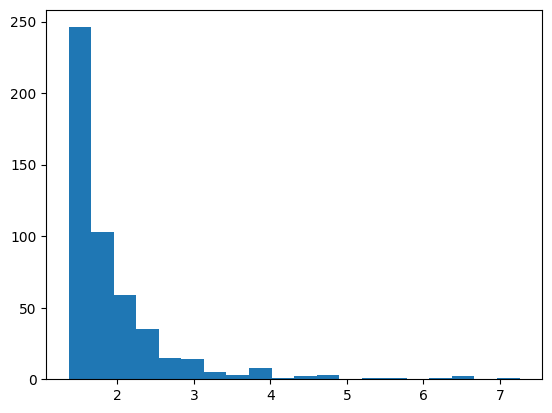

In [22]:
rmse_only_vm, errors_only_vm = sim_lstm(df_eur, 'EURHUF.X.Close', ['alapkamat','vm_dummy'],  n_sim)
plt.hist(rmse_only_vm, bins = 20)
plt.show()
# stats.describe(mse_only_vm)

### Only Nagy Marton

Epoch 1/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 126415.2656 - mean_absolute_error: 354.5055 - val_loss: 143958.7344 - val_mean_absolute_error: 379.3848
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 123575.5156 - mean_absolute_error: 350.4937 - val_loss: 134356.1406 - val_mean_absolute_error: 366.5110
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 112239.1016 - mean_absolute_error: 333.7887 - val_loss: 111504.0938 - val_mean_absolute_error: 333.8836
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 88431.5703 - mean_absolute_error: 295.9924 - val_loss: 81611.1328 - val_mean_absolute_error: 285.6314
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 60522.6328 - mean_absolute_error: 244.0125 - val_loss: 48723.6016 - val_mean_absolute_error: 220.6756
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 32109.1328 - mean_absolute_error: 176.3468 - val_loss: 21758.5918 - val_mean_absolute_error: 147.4203
Epoch 7/100
41/41 ━━━━━━━━━

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.6098 - mean_absolute_error: 2.1880 - val_loss: 9.7330 - val_mean_absolute_error: 2.6103
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.5200 - mean_absolute_error: 2.1317 - val_loss: 3.7531 - val_mean_absolute_error: 1.4843
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9640 - mean_absolute_error: 1.6200 - val_loss: 4.9449 - val_mean_absolute_error: 1.7180
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1031 - mean_absolute_error: 1.6581 - val_loss: 5.9476 - val_mean_absolute_error: 1.9211
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6609 - mean_absolute_error: 1.5397 - val_loss: 4.6432 - val_mean_absolute_error: 1.6660
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4926 - mean_absolute_error: 1.5209 - val_loss: 4.2760 - val_mean_absolute_error: 1.5930
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7575 - mean_absolute_error: 1.7715 - val_loss: 3.6270 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4360 - mean_absolute_error: 1.6810 - val_loss: 3.6236 - val_mean_absolute_error: 1.4801
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4504 - mean_absolute_error: 1.5255 - val_loss: 8.5665 - val_mean_absolute_error: 2.4022
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1477 - mean_absolute_error: 1.6514 - val_loss: 9.2190 - val_mean_absolute_error: 2.6346
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3708 - mean_absolute_error: 1.7282 - val_loss: 7.0760 - val_mean_absolute_error: 2.2521
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9363 - mean_absolute_error: 1.8380 - val_loss: 4.2551 - val_mean_absolute_error: 1.6469
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9782 - mean_absolute_error: 1.8486 - val_loss: 3.9195 - val_mean_absolute_error: 1.5635
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4369 - mean_absolute_error: 1.5501 - val_loss: 7.3486 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4406 - mean_absolute_error: 1.6777 - val_loss: 3.6457 - val_mean_absolute_error: 1.4879
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1797 - mean_absolute_error: 1.8803 - val_loss: 3.6234 - val_mean_absolute_error: 1.4767
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4018 - mean_absolute_error: 1.7094 - val_loss: 3.7131 - val_mean_absolute_error: 1.5039
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5742 - mean_absolute_error: 1.9476 - val_loss: 3.6973 - val_mean_absolute_error: 1.5000
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2112 - mean_absolute_error: 1.6029 - val_loss: 4.0669 - val_mean_absolute_error: 1.5981
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7864 - mean_absolute_error: 1.5993 - val_loss: 11.6638 - val_mean_absolute_error: 2.9239
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 11.2605 - mean_absolute_error: 2.6946 - val_loss: 4.1190 -

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6449 - mean_absolute_error: 1.5923 - val_loss: 6.2594 - val_mean_absolute_error: 1.9793
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1872 - mean_absolute_error: 1.6625 - val_loss: 5.7506 - val_mean_absolute_error: 1.8867
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4332 - mean_absolute_error: 1.7293 - val_loss: 4.8906 - val_mean_absolute_error: 1.7999
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4696 - mean_absolute_error: 1.7572 - val_loss: 7.1059 - val_mean_absolute_error: 2.2312
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5072 - mean_absolute_error: 1.7113 - val_loss: 3.6738 - val_mean_absolute_error: 1.5015
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4634 - mean_absolute_error: 1.5351 - val_loss: 5.6274 - val_mean_absolute_error: 1.9272
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1487 - mean_absolute_error: 1.8852 - val_loss: 3.9404 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7908 - mean_absolute_error: 1.5705 - val_loss: 4.8500 - val_mean_absolute_error: 1.7119
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6308 - mean_absolute_error: 1.7007 - val_loss: 3.8558 - val_mean_absolute_error: 1.5509
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4820 - mean_absolute_error: 1.7156 - val_loss: 5.3928 - val_mean_absolute_error: 1.8151
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1704 - mean_absolute_error: 1.6988 - val_loss: 5.1021 - val_mean_absolute_error: 1.7645
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9548 - mean_absolute_error: 1.6028 - val_loss: 3.8216 - val_mean_absolute_error: 1.5401
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2292 - mean_absolute_error: 1.7336 - val_loss: 4.9819 - val_mean_absolute_error: 1.7711
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6274 - mean_absolute_error: 1.7315 - val_loss: 4.0892 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9062 - mean_absolute_error: 1.7875 - val_loss: 11.3129 - val_mean_absolute_error: 2.8705
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4176 - mean_absolute_error: 2.0703 - val_loss: 3.8260 - val_mean_absolute_error: 1.5477
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8381 - mean_absolute_error: 1.7506 - val_loss: 9.0799 - val_mean_absolute_error: 2.4845
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3308 - mean_absolute_error: 2.0525 - val_loss: 4.0744 - val_mean_absolute_error: 1.6058
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0220 - mean_absolute_error: 1.6339 - val_loss: 13.0061 - val_mean_absolute_error: 3.1753
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.4412 - mean_absolute_error: 2.1895 - val_loss: 3.7936 - val_mean_absolute_error: 1.5309
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0588 - mean_absolute_error: 1.5773 - val_loss: 5.1587 -

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0898 - mean_absolute_error: 1.7611 - val_loss: 3.9093 - val_mean_absolute_error: 1.5190
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.5414 - mean_absolute_error: 2.0868 - val_loss: 4.1279 - val_mean_absolute_error: 1.5517
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3462 - mean_absolute_error: 1.5406 - val_loss: 3.8135 - val_mean_absolute_error: 1.5389
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7983 - mean_absolute_error: 1.5793 - val_loss: 5.6238 - val_mean_absolute_error: 1.8681
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5881 - mean_absolute_error: 1.7415 - val_loss: 4.4701 - val_mean_absolute_error: 1.6347
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0037 - mean_absolute_error: 1.6116 - val_loss: 5.3800 - val_mean_absolute_error: 1.8139
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3010 - mean_absolute_error: 1.6729 - val_loss: 3.7582 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7956 - mean_absolute_error: 1.7857 - val_loss: 4.9608 - val_mean_absolute_error: 1.7351
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5902 - mean_absolute_error: 1.7346 - val_loss: 3.6441 - val_mean_absolute_error: 1.4803
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5355 - mean_absolute_error: 1.9291 - val_loss: 7.4713 - val_mean_absolute_error: 2.2013
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0705 - mean_absolute_error: 1.6843 - val_loss: 6.2703 - val_mean_absolute_error: 2.0843
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9598 - mean_absolute_error: 2.0382 - val_loss: 10.4531 - val_mean_absolute_error: 2.7314
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9790 - mean_absolute_error: 1.8147 - val_loss: 4.5668 - val_mean_absolute_error: 1.6455
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2244 - mean_absolute_error: 1.6581 - val_loss: 3.6865 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7830 - mean_absolute_error: 1.5916 - val_loss: 3.8133 - val_mean_absolute_error: 1.5046
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5954 - mean_absolute_error: 1.5497 - val_loss: 3.6642 - val_mean_absolute_error: 1.4852
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.9108 - mean_absolute_error: 1.8232 - val_loss: 3.7831 - val_mean_absolute_error: 1.5336
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6014 - mean_absolute_error: 1.7351 - val_loss: 3.6832 - val_mean_absolute_error: 1.4779
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5068 - mean_absolute_error: 1.8834 - val_loss: 4.2993 - val_mean_absolute_error: 1.6562
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7022 - mean_absolute_error: 1.7565 - val_loss: 4.6468 - val_mean_absolute_error: 1.6680
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3521 - mean_absolute_error: 1.7044 - val_loss: 4.3469 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5497 - mean_absolute_error: 1.6888 - val_loss: 3.7540 - val_mean_absolute_error: 1.5286
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5626 - mean_absolute_error: 1.5791 - val_loss: 8.2154 - val_mean_absolute_error: 2.4587
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7355 - mean_absolute_error: 1.7870 - val_loss: 4.4317 - val_mean_absolute_error: 1.6874
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5301 - mean_absolute_error: 1.7416 - val_loss: 32.8305 - val_mean_absolute_error: 5.3770
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 10.3808 - mean_absolute_error: 2.6428 - val_loss: 3.7160 - val_mean_absolute_error: 1.5147
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7577 - mean_absolute_error: 1.7523 - val_loss: 4.7909 - val_mean_absolute_error: 1.7619
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5186 - mean_absolute_error: 1.5565 - val_loss: 4.9230 -

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.0095 - mean_absolute_error: 1.8143 - val_loss: 4.4269 - val_mean_absolute_error: 1.6293
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5119 - mean_absolute_error: 1.5585 - val_loss: 5.2314 - val_mean_absolute_error: 1.8640
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1589 - mean_absolute_error: 1.6667 - val_loss: 3.7729 - val_mean_absolute_error: 1.5144
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3401 - mean_absolute_error: 1.4975 - val_loss: 5.9796 - val_mean_absolute_error: 1.9291
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3448 - mean_absolute_error: 1.8801 - val_loss: 3.7279 - val_mean_absolute_error: 1.5221
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2359 - mean_absolute_error: 1.7909 - val_loss: 7.1360 - val_mean_absolute_error: 2.1436
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9819 - mean_absolute_error: 1.7515 - val_loss: 3.7652 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.1283 - mean_absolute_error: 1.8432 - val_loss: 6.6802 - val_mean_absolute_error: 2.0523
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2656 - mean_absolute_error: 1.8629 - val_loss: 3.7031 - val_mean_absolute_error: 1.4933
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2914 - mean_absolute_error: 1.8857 - val_loss: 4.3181 - val_mean_absolute_error: 1.6592
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3492 - mean_absolute_error: 1.7008 - val_loss: 3.6194 - val_mean_absolute_error: 1.4671
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5386 - mean_absolute_error: 1.5258 - val_loss: 3.8774 - val_mean_absolute_error: 1.5609
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5332 - mean_absolute_error: 1.7746 - val_loss: 4.2362 - val_mean_absolute_error: 1.5915
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3715 - mean_absolute_error: 1.7333 - val_loss: 4.1072 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7407 - mean_absolute_error: 1.5985 - val_loss: 4.8568 - val_mean_absolute_error: 1.7122
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3665 - mean_absolute_error: 1.8856 - val_loss: 3.6576 - val_mean_absolute_error: 1.4695
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3885 - mean_absolute_error: 1.7498 - val_loss: 4.3395 - val_mean_absolute_error: 1.6001
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9296 - mean_absolute_error: 1.7847 - val_loss: 5.3626 - val_mean_absolute_error: 1.8787
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7611 - mean_absolute_error: 1.8339 - val_loss: 4.7417 - val_mean_absolute_error: 1.6926
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7359 - mean_absolute_error: 1.5626 - val_loss: 8.1982 - val_mean_absolute_error: 2.3358
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4037 - mean_absolute_error: 1.7139 - val_loss: 10.2894 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2668 - mean_absolute_error: 1.9181 - val_loss: 3.8209 - val_mean_absolute_error: 1.5327
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6302 - mean_absolute_error: 1.7351 - val_loss: 3.6207 - val_mean_absolute_error: 1.4661
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5650 - mean_absolute_error: 1.6973 - val_loss: 3.8636 - val_mean_absolute_error: 1.5077
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7514 - mean_absolute_error: 1.5566 - val_loss: 5.2154 - val_mean_absolute_error: 1.8620
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5354 - mean_absolute_error: 1.7254 - val_loss: 4.5686 - val_mean_absolute_error: 1.6511
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5006 - mean_absolute_error: 1.7486 - val_loss: 8.5995 - val_mean_absolute_error: 2.4051
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6904 - mean_absolute_error: 1.7675 - val_loss: 3.7333 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1869 - mean_absolute_error: 1.7019 - val_loss: 4.0214 - val_mean_absolute_error: 1.5942
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7771 - mean_absolute_error: 1.5955 - val_loss: 5.3347 - val_mean_absolute_error: 1.8215
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.5504 - mean_absolute_error: 2.1185 - val_loss: 4.7838 - val_mean_absolute_error: 1.6876
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9472 - mean_absolute_error: 1.8118 - val_loss: 3.6184 - val_mean_absolute_error: 1.4839
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3752 - mean_absolute_error: 1.9004 - val_loss: 3.6060 - val_mean_absolute_error: 1.4702
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8659 - mean_absolute_error: 1.5841 - val_loss: 4.0934 - val_mean_absolute_error: 1.6062
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2914 - mean_absolute_error: 1.9183 - val_loss: 5.3536 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2767 - mean_absolute_error: 1.6911 - val_loss: 10.2161 - val_mean_absolute_error: 2.6913
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6402 - mean_absolute_error: 1.7697 - val_loss: 4.7282 - val_mean_absolute_error: 1.6884
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0831 - mean_absolute_error: 1.6421 - val_loss: 4.4047 - val_mean_absolute_error: 1.6751
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7000 - mean_absolute_error: 1.5768 - val_loss: 5.1356 - val_mean_absolute_error: 1.7719
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3546 - mean_absolute_error: 1.8946 - val_loss: 3.6514 - val_mean_absolute_error: 1.4945
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3726 - mean_absolute_error: 1.6639 - val_loss: 4.6769 - val_mean_absolute_error: 1.6659
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3412 - mean_absolute_error: 1.8999 - val_loss: 4.8883 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7482 - mean_absolute_error: 1.5844 - val_loss: 6.4974 - val_mean_absolute_error: 2.0253
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1391 - mean_absolute_error: 1.6438 - val_loss: 4.6966 - val_mean_absolute_error: 1.7514
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4250 - mean_absolute_error: 1.6863 - val_loss: 4.7220 - val_mean_absolute_error: 1.7500
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9662 - mean_absolute_error: 1.6278 - val_loss: 3.6562 - val_mean_absolute_error: 1.4907
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0340 - mean_absolute_error: 1.6965 - val_loss: 3.7374 - val_mean_absolute_error: 1.4874
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2124 - mean_absolute_error: 1.4832 - val_loss: 7.0177 - val_mean_absolute_error: 2.1254
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2573 - mean_absolute_error: 1.5148 - val_loss: 8.5761 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3390 - mean_absolute_error: 1.7535 - val_loss: 3.6381 - val_mean_absolute_error: 1.4738
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0152 - mean_absolute_error: 1.6098 - val_loss: 3.8837 - val_mean_absolute_error: 1.5620
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3413 - mean_absolute_error: 2.0721 - val_loss: 6.9037 - val_mean_absolute_error: 2.1921
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8717 - mean_absolute_error: 1.7817 - val_loss: 5.8439 - val_mean_absolute_error: 1.9050
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3760 - mean_absolute_error: 2.0398 - val_loss: 6.4979 - val_mean_absolute_error: 2.0279
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6202 - mean_absolute_error: 1.8106 - val_loss: 9.4285 - val_mean_absolute_error: 2.6482
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9653 - mean_absolute_error: 2.0353 - val_loss: 3.6855 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.2484 - mean_absolute_error: 2.0394 - val_loss: 3.9019 - val_mean_absolute_error: 1.5533
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9038 - mean_absolute_error: 2.0097 - val_loss: 5.2663 - val_mean_absolute_error: 1.7941
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0097 - mean_absolute_error: 1.6372 - val_loss: 6.1615 - val_mean_absolute_error: 1.9636
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9223 - mean_absolute_error: 1.6349 - val_loss: 9.0639 - val_mean_absolute_error: 2.4934
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1421 - mean_absolute_error: 1.7716 - val_loss: 4.8545 - val_mean_absolute_error: 1.7681
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4779 - mean_absolute_error: 1.7887 - val_loss: 3.6327 - val_mean_absolute_error: 1.4866
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7044 - mean_absolute_error: 1.7592 - val_loss: 3.6513 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1110 - mean_absolute_error: 1.6737 - val_loss: 5.5572 - val_mean_absolute_error: 1.9472
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4034 - mean_absolute_error: 1.8958 - val_loss: 3.6355 - val_mean_absolute_error: 1.4730
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5553 - mean_absolute_error: 1.6803 - val_loss: 7.6980 - val_mean_absolute_error: 2.3503
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5565 - mean_absolute_error: 1.7597 - val_loss: 3.5882 - val_mean_absolute_error: 1.4657
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5191 - mean_absolute_error: 1.7875 - val_loss: 8.5673 - val_mean_absolute_error: 2.5287
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9876 - mean_absolute_error: 1.9357 - val_loss: 3.7700 - val_mean_absolute_error: 1.5239
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8213 - mean_absolute_error: 1.6132 - val_loss: 4.1486 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3411 - mean_absolute_error: 1.7205 - val_loss: 4.3831 - val_mean_absolute_error: 1.6775
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9161 - mean_absolute_error: 1.8629 - val_loss: 16.8084 - val_mean_absolute_error: 3.6616
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.0542 - mean_absolute_error: 2.2134 - val_loss: 3.6321 - val_mean_absolute_error: 1.4624
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2771 - mean_absolute_error: 1.9352 - val_loss: 4.9421 - val_mean_absolute_error: 1.8017
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2930 - mean_absolute_error: 1.7010 - val_loss: 4.4235 - val_mean_absolute_error: 1.6815
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7672 - mean_absolute_error: 1.6103 - val_loss: 4.3536 - val_mean_absolute_error: 1.6120
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1812 - mean_absolute_error: 1.6621 - val_loss: 3.8947 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7356 - mean_absolute_error: 1.5553 - val_loss: 3.7212 - val_mean_absolute_error: 1.4856
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5698 - mean_absolute_error: 1.7168 - val_loss: 3.8670 - val_mean_absolute_error: 1.5419
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5340 - mean_absolute_error: 1.5540 - val_loss: 6.3225 - val_mean_absolute_error: 2.1050
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8315 - mean_absolute_error: 1.9399 - val_loss: 9.7997 - val_mean_absolute_error: 2.6256
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4466 - mean_absolute_error: 1.9660 - val_loss: 10.8307 - val_mean_absolute_error: 2.8983
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.9766 - mean_absolute_error: 2.2390 - val_loss: 4.4080 - val_mean_absolute_error: 1.6262
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4522 - mean_absolute_error: 1.5171 - val_loss: 8.0570 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7582 - mean_absolute_error: 1.7841 - val_loss: 3.6136 - val_mean_absolute_error: 1.4790
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8265 - mean_absolute_error: 1.7796 - val_loss: 3.6378 - val_mean_absolute_error: 1.4975
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5308 - mean_absolute_error: 1.7705 - val_loss: 6.3653 - val_mean_absolute_error: 2.0987
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4011 - mean_absolute_error: 1.6916 - val_loss: 4.6184 - val_mean_absolute_error: 1.7347
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8302 - mean_absolute_error: 1.6087 - val_loss: 5.2057 - val_mean_absolute_error: 1.8590
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0603 - mean_absolute_error: 1.7767 - val_loss: 3.7292 - val_mean_absolute_error: 1.4854
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9285 - mean_absolute_error: 1.6248 - val_loss: 7.8698 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6749 - mean_absolute_error: 1.5798 - val_loss: 4.5915 - val_mean_absolute_error: 1.6590
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3317 - mean_absolute_error: 1.8767 - val_loss: 3.8616 - val_mean_absolute_error: 1.5114
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7991 - mean_absolute_error: 1.7658 - val_loss: 4.2002 - val_mean_absolute_error: 1.5825
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8925 - mean_absolute_error: 1.6073 - val_loss: 6.1704 - val_mean_absolute_error: 1.9621
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9865 - mean_absolute_error: 1.6624 - val_loss: 4.1198 - val_mean_absolute_error: 1.5613
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2531 - mean_absolute_error: 1.5311 - val_loss: 3.8330 - val_mean_absolute_error: 1.5504
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7639 - mean_absolute_error: 1.7567 - val_loss: 5.6835 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4265 - mean_absolute_error: 1.5113 - val_loss: 4.6118 - val_mean_absolute_error: 1.6713
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4009 - mean_absolute_error: 1.5307 - val_loss: 3.5970 - val_mean_absolute_error: 1.4659
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5323 - mean_absolute_error: 1.5591 - val_loss: 3.9331 - val_mean_absolute_error: 1.5284
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.9614 - mean_absolute_error: 2.0501 - val_loss: 4.6149 - val_mean_absolute_error: 1.7162
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9991 - mean_absolute_error: 1.8484 - val_loss: 5.1195 - val_mean_absolute_error: 1.7695
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3732 - mean_absolute_error: 1.8523 - val_loss: 3.7024 - val_mean_absolute_error: 1.5170
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8270 - mean_absolute_error: 1.9660 - val_loss: 5.3989 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6546 - mean_absolute_error: 1.7721 - val_loss: 3.6443 - val_mean_absolute_error: 1.4664
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3643 - mean_absolute_error: 1.4925 - val_loss: 4.3303 - val_mean_absolute_error: 1.6069
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2305 - mean_absolute_error: 1.6578 - val_loss: 4.0602 - val_mean_absolute_error: 1.6050
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5158 - mean_absolute_error: 1.8635 - val_loss: 4.7522 - val_mean_absolute_error: 1.6972
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.4936 - mean_absolute_error: 1.7101 - val_loss: 3.6074 - val_mean_absolute_error: 1.4910
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6963 - mean_absolute_error: 2.0024 - val_loss: 6.1510 - val_mean_absolute_error: 1.9583
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.7296 - mean_absolute_error: 2.3066 - val_loss: 3.6797 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 9.2270 - mean_absolute_error: 2.3586 - val_loss: 3.7268 - val_mean_absolute_error: 1.5146
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3178 - mean_absolute_error: 1.6425 - val_loss: 4.8892 - val_mean_absolute_error: 1.7209
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2579 - mean_absolute_error: 1.6927 - val_loss: 10.1405 - val_mean_absolute_error: 2.6825
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3094 - mean_absolute_error: 1.8821 - val_loss: 3.9453 - val_mean_absolute_error: 1.5782
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1611 - mean_absolute_error: 1.4964 - val_loss: 4.2431 - val_mean_absolute_error: 1.6395
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8831 - mean_absolute_error: 1.6008 - val_loss: 4.0875 - val_mean_absolute_error: 1.6113
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8990 - mean_absolute_error: 1.6752 - val_loss: 3.6124 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3682 - mean_absolute_error: 1.7478 - val_loss: 6.1176 - val_mean_absolute_error: 1.9553
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3947 - mean_absolute_error: 1.7333 - val_loss: 3.6930 - val_mean_absolute_error: 1.5120
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9537 - mean_absolute_error: 1.6107 - val_loss: 6.8003 - val_mean_absolute_error: 2.1665
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9260 - mean_absolute_error: 1.8298 - val_loss: 4.4336 - val_mean_absolute_error: 1.6260
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4357 - mean_absolute_error: 1.8797 - val_loss: 3.6705 - val_mean_absolute_error: 1.5039
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7733 - mean_absolute_error: 1.5648 - val_loss: 3.6708 - val_mean_absolute_error: 1.4714
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5185 - mean_absolute_error: 1.4866 - val_loss: 7.3150 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2770 - mean_absolute_error: 1.9165 - val_loss: 11.3779 - val_mean_absolute_error: 2.9778
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5874 - mean_absolute_error: 1.9474 - val_loss: 5.7131 - val_mean_absolute_error: 1.8803
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5009 - mean_absolute_error: 1.7644 - val_loss: 3.6245 - val_mean_absolute_error: 1.4874
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7962 - mean_absolute_error: 1.5815 - val_loss: 4.9678 - val_mean_absolute_error: 1.7344
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9717 - mean_absolute_error: 1.6090 - val_loss: 3.7098 - val_mean_absolute_error: 1.4857
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5735 - mean_absolute_error: 1.7157 - val_loss: 5.3561 - val_mean_absolute_error: 1.8198
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0140 - mean_absolute_error: 1.8388 - val_loss: 3.9866 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4155 - mean_absolute_error: 1.7719 - val_loss: 7.0976 - val_mean_absolute_error: 2.1409
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8708 - mean_absolute_error: 1.6139 - val_loss: 3.8530 - val_mean_absolute_error: 1.5341
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3905 - mean_absolute_error: 1.5067 - val_loss: 4.7844 - val_mean_absolute_error: 1.7023
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9066 - mean_absolute_error: 1.8334 - val_loss: 5.6302 - val_mean_absolute_error: 1.9555
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6204 - mean_absolute_error: 2.0011 - val_loss: 3.8166 - val_mean_absolute_error: 1.5506
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3946 - mean_absolute_error: 1.5427 - val_loss: 3.7125 - val_mean_absolute_error: 1.4951
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4178 - mean_absolute_error: 1.6722 - val_loss: 7.4890 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7740 - mean_absolute_error: 1.8309 - val_loss: 4.4945 - val_mean_absolute_error: 1.6429
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1400 - mean_absolute_error: 1.6746 - val_loss: 6.5906 - val_mean_absolute_error: 2.0489
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.1394 - mean_absolute_error: 2.1838 - val_loss: 9.0982 - val_mean_absolute_error: 2.5030
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9812 - mean_absolute_error: 1.8349 - val_loss: 3.7800 - val_mean_absolute_error: 1.4913
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6469 - mean_absolute_error: 1.6904 - val_loss: 3.5554 - val_mean_absolute_error: 1.4706
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1915 - mean_absolute_error: 1.5091 - val_loss: 4.6966 - val_mean_absolute_error: 1.7374
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7185 - mean_absolute_error: 1.7694 - val_loss: 9.3123 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.3134 - mean_absolute_error: 1.8703 - val_loss: 8.6495 - val_mean_absolute_error: 2.5242
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8244 - mean_absolute_error: 1.9260 - val_loss: 5.5812 - val_mean_absolute_error: 1.8550
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1501 - mean_absolute_error: 1.4740 - val_loss: 6.4454 - val_mean_absolute_error: 2.1253
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.6656 - mean_absolute_error: 1.9901 - val_loss: 5.7591 - val_mean_absolute_error: 1.8918
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0620 - mean_absolute_error: 1.8075 - val_loss: 8.8119 - val_mean_absolute_error: 2.4493
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0074 - mean_absolute_error: 1.8607 - val_loss: 3.5926 - val_mean_absolute_error: 1.4798
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4130 - mean_absolute_error: 1.5273 - val_loss: 5.1928 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7190 - mean_absolute_error: 1.5394 - val_loss: 5.2830 - val_mean_absolute_error: 1.8626
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5353 - mean_absolute_error: 1.6956 - val_loss: 4.1051 - val_mean_absolute_error: 1.5614
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0677 - mean_absolute_error: 1.6410 - val_loss: 4.4955 - val_mean_absolute_error: 1.6455
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7140 - mean_absolute_error: 1.7520 - val_loss: 3.6009 - val_mean_absolute_error: 1.4701
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0734 - mean_absolute_error: 2.0436 - val_loss: 5.5793 - val_mean_absolute_error: 1.8592
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4629 - mean_absolute_error: 1.7356 - val_loss: 12.8788 - val_mean_absolute_error: 3.1127
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0545 - mean_absolute_error: 1.8457 - val_loss: 4.8547 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8607 - mean_absolute_error: 1.5874 - val_loss: 3.7259 - val_mean_absolute_error: 1.4893
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3284 - mean_absolute_error: 1.5157 - val_loss: 3.6183 - val_mean_absolute_error: 1.4693
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7321 - mean_absolute_error: 1.7618 - val_loss: 8.4910 - val_mean_absolute_error: 2.3903
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6227 - mean_absolute_error: 1.7277 - val_loss: 3.7355 - val_mean_absolute_error: 1.4983
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9629 - mean_absolute_error: 1.6200 - val_loss: 3.8044 - val_mean_absolute_error: 1.5077
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6189 - mean_absolute_error: 1.5693 - val_loss: 5.2123 - val_mean_absolute_error: 1.7853
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9834 - mean_absolute_error: 1.5796 - val_loss: 21.3029 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.6119 - mean_absolute_error: 1.9758 - val_loss: 3.6631 - val_mean_absolute_error: 1.5074
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5630 - mean_absolute_error: 1.7126 - val_loss: 4.0265 - val_mean_absolute_error: 1.6024
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8136 - mean_absolute_error: 1.6275 - val_loss: 3.6848 - val_mean_absolute_error: 1.5212
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1396 - mean_absolute_error: 1.6562 - val_loss: 4.2564 - val_mean_absolute_error: 1.5896
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5165 - mean_absolute_error: 1.5025 - val_loss: 7.5768 - val_mean_absolute_error: 2.2264
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3211 - mean_absolute_error: 1.7004 - val_loss: 6.6957 - val_mean_absolute_error: 2.0700
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0205 - mean_absolute_error: 1.6643 - val_loss: 5.4466 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8990 - mean_absolute_error: 1.5549 - val_loss: 3.9052 - val_mean_absolute_error: 1.5745
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7557 - mean_absolute_error: 1.7796 - val_loss: 6.1011 - val_mean_absolute_error: 1.9543
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0613 - mean_absolute_error: 1.6649 - val_loss: 4.3242 - val_mean_absolute_error: 1.6670
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8493 - mean_absolute_error: 1.6231 - val_loss: 3.7306 - val_mean_absolute_error: 1.5314
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2477 - mean_absolute_error: 1.6528 - val_loss: 7.9527 - val_mean_absolute_error: 2.4255
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8792 - mean_absolute_error: 2.0662 - val_loss: 3.6028 - val_mean_absolute_error: 1.4877
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1551 - mean_absolute_error: 1.6541 - val_loss: 18.4209 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7755 - mean_absolute_error: 1.6022 - val_loss: 4.0184 - val_mean_absolute_error: 1.5422
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1481 - mean_absolute_error: 1.8757 - val_loss: 4.6801 - val_mean_absolute_error: 1.6836
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9008 - mean_absolute_error: 1.6269 - val_loss: 3.6730 - val_mean_absolute_error: 1.4990
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9151 - mean_absolute_error: 1.5809 - val_loss: 7.3602 - val_mean_absolute_error: 2.1840
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8538 - mean_absolute_error: 1.5963 - val_loss: 6.1728 - val_mean_absolute_error: 2.0690
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8688 - mean_absolute_error: 1.8204 - val_loss: 16.6209 - val_mean_absolute_error: 3.6406
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.6843 - mean_absolute_error: 2.2784 - val_loss: 7.8732 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.8053 - mean_absolute_error: 1.7564 - val_loss: 7.2549 - val_mean_absolute_error: 2.2953
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2302 - mean_absolute_error: 1.9105 - val_loss: 3.7640 - val_mean_absolute_error: 1.5297
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2551 - mean_absolute_error: 1.6352 - val_loss: 4.0046 - val_mean_absolute_error: 1.5506
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8457 - mean_absolute_error: 1.5817 - val_loss: 3.6436 - val_mean_absolute_error: 1.4754
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4841 - mean_absolute_error: 1.7409 - val_loss: 6.1427 - val_mean_absolute_error: 2.0721
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 7.1815 - mean_absolute_error: 2.0758 - val_loss: 5.9450 - val_mean_absolute_error: 1.9262
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7812 - mean_absolute_error: 1.5817 - val_loss: 3.8281 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6245 - mean_absolute_error: 1.5449 - val_loss: 3.7421 - val_mean_absolute_error: 1.4919
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6933 - mean_absolute_error: 1.7050 - val_loss: 3.6682 - val_mean_absolute_error: 1.4961
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.5638 - mean_absolute_error: 1.7611 - val_loss: 5.6417 - val_mean_absolute_error: 1.8579
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2153 - mean_absolute_error: 1.6270 - val_loss: 4.9316 - val_mean_absolute_error: 1.7473
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1540 - mean_absolute_error: 1.9122 - val_loss: 9.0442 - val_mean_absolute_error: 2.6045
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.1320 - mean_absolute_error: 2.1879 - val_loss: 4.2241 - val_mean_absolute_error: 1.6395
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2163 - mean_absolute_error: 1.6538 - val_loss: 6.7749 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.4557 - mean_absolute_error: 1.9152 - val_loss: 3.5687 - val_mean_absolute_error: 1.4718
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5930 - mean_absolute_error: 1.7984 - val_loss: 5.6020 - val_mean_absolute_error: 1.9345
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6783 - mean_absolute_error: 1.7913 - val_loss: 8.8012 - val_mean_absolute_error: 2.4487
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4059 - mean_absolute_error: 1.7414 - val_loss: 5.1207 - val_mean_absolute_error: 1.7649
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0138 - mean_absolute_error: 1.6429 - val_loss: 4.6231 - val_mean_absolute_error: 1.7179
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5242 - mean_absolute_error: 1.8874 - val_loss: 3.8668 - val_mean_absolute_error: 1.5169
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5734 - mean_absolute_error: 1.7250 - val_loss: 19.7112 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.1201 - mean_absolute_error: 1.8843 - val_loss: 4.7564 - val_mean_absolute_error: 1.7635
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9101 - mean_absolute_error: 2.0208 - val_loss: 3.7210 - val_mean_absolute_error: 1.5154
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2486 - mean_absolute_error: 1.4879 - val_loss: 3.7035 - val_mean_absolute_error: 1.5201
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7117 - mean_absolute_error: 1.9840 - val_loss: 3.7949 - val_mean_absolute_error: 1.5113
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9360 - mean_absolute_error: 1.9593 - val_loss: 3.5932 - val_mean_absolute_error: 1.4785
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5801 - mean_absolute_error: 1.5266 - val_loss: 3.6077 - val_mean_absolute_error: 1.4678
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8214 - mean_absolute_error: 1.5561 - val_loss: 3.8637 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.3012 - mean_absolute_error: 1.8948 - val_loss: 3.6026 - val_mean_absolute_error: 1.4744
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7435 - mean_absolute_error: 1.5999 - val_loss: 8.9004 - val_mean_absolute_error: 2.4623
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6429 - mean_absolute_error: 2.0079 - val_loss: 5.2874 - val_mean_absolute_error: 1.8047
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0887 - mean_absolute_error: 1.8612 - val_loss: 3.6883 - val_mean_absolute_error: 1.5031
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6134 - mean_absolute_error: 1.4975 - val_loss: 4.7635 - val_mean_absolute_error: 1.7472
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9536 - mean_absolute_error: 1.7974 - val_loss: 5.4218 - val_mean_absolute_error: 1.9164
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8929 - mean_absolute_error: 1.7990 - val_loss: 3.6712 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6672 - mean_absolute_error: 1.5725 - val_loss: 4.0400 - val_mean_absolute_error: 1.5591
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3870 - mean_absolute_error: 1.7051 - val_loss: 7.8092 - val_mean_absolute_error: 2.3796
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8856 - mean_absolute_error: 1.7907 - val_loss: 6.5968 - val_mean_absolute_error: 2.0527
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9091 - mean_absolute_error: 1.5910 - val_loss: 4.5670 - val_mean_absolute_error: 1.7185
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6765 - mean_absolute_error: 1.8086 - val_loss: 3.6335 - val_mean_absolute_error: 1.5004
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8930 - mean_absolute_error: 1.5950 - val_loss: 3.5973 - val_mean_absolute_error: 1.4706
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1956 - mean_absolute_error: 1.6764 - val_loss: 9.7197 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6044 - mean_absolute_error: 1.5448 - val_loss: 5.7076 - val_mean_absolute_error: 1.8793
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6095 - mean_absolute_error: 1.7488 - val_loss: 4.1078 - val_mean_absolute_error: 1.6194
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7422 - mean_absolute_error: 1.5703 - val_loss: 4.5405 - val_mean_absolute_error: 1.6588
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6181 - mean_absolute_error: 1.5485 - val_loss: 6.5578 - val_mean_absolute_error: 2.0416
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9265 - mean_absolute_error: 1.8694 - val_loss: 3.5919 - val_mean_absolute_error: 1.4847
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2347 - mean_absolute_error: 1.6156 - val_loss: 4.8055 - val_mean_absolute_error: 1.7132
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1758 - mean_absolute_error: 1.6768 - val_loss: 6.0219 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6262 - mean_absolute_error: 1.7700 - val_loss: 9.4342 - val_mean_absolute_error: 2.5635
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8087 - mean_absolute_error: 1.7381 - val_loss: 5.3905 - val_mean_absolute_error: 1.8901
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1530 - mean_absolute_error: 1.8658 - val_loss: 6.1425 - val_mean_absolute_error: 1.9631
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2329 - mean_absolute_error: 1.7678 - val_loss: 8.8284 - val_mean_absolute_error: 2.4567
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1396 - mean_absolute_error: 1.8422 - val_loss: 3.5708 - val_mean_absolute_error: 1.4812
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5875 - mean_absolute_error: 1.5433 - val_loss: 4.2111 - val_mean_absolute_error: 1.6312
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3171 - mean_absolute_error: 1.8681 - val_loss: 14.2954 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4366 - mean_absolute_error: 1.7428 - val_loss: 4.4051 - val_mean_absolute_error: 1.6316
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7880 - mean_absolute_error: 1.5791 - val_loss: 5.2698 - val_mean_absolute_error: 1.8001
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4230 - mean_absolute_error: 1.6716 - val_loss: 5.8023 - val_mean_absolute_error: 1.9010
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4307 - mean_absolute_error: 1.8989 - val_loss: 4.6242 - val_mean_absolute_error: 1.7315
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0950 - mean_absolute_error: 1.6755 - val_loss: 4.2588 - val_mean_absolute_error: 1.6583
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7367 - mean_absolute_error: 1.7213 - val_loss: 8.7479 - val_mean_absolute_error: 2.4411
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0279 - mean_absolute_error: 1.6028 - val_loss: 3.9270 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4762 - mean_absolute_error: 1.7108 - val_loss: 3.8021 - val_mean_absolute_error: 1.5454
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9871 - mean_absolute_error: 1.7061 - val_loss: 7.0542 - val_mean_absolute_error: 2.1365
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1076 - mean_absolute_error: 1.6509 - val_loss: 4.5094 - val_mean_absolute_error: 1.6511
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2500 - mean_absolute_error: 1.6676 - val_loss: 3.8502 - val_mean_absolute_error: 1.5245
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9466 - mean_absolute_error: 1.6287 - val_loss: 4.1258 - val_mean_absolute_error: 1.5755
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.0059 - mean_absolute_error: 1.6305 - val_loss: 3.8353 - val_mean_absolute_error: 1.5559
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3543 - mean_absolute_error: 1.6915 - val_loss: 5.5800 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.1815 - mean_absolute_error: 1.8332 - val_loss: 3.6517 - val_mean_absolute_error: 1.4842
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6366 - mean_absolute_error: 1.7478 - val_loss: 5.2329 - val_mean_absolute_error: 1.7902
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9109 - mean_absolute_error: 1.6251 - val_loss: 3.8911 - val_mean_absolute_error: 1.5306
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3997 - mean_absolute_error: 1.7033 - val_loss: 4.4958 - val_mean_absolute_error: 1.6463
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7344 - mean_absolute_error: 1.9322 - val_loss: 5.4174 - val_mean_absolute_error: 1.8386
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2842 - mean_absolute_error: 1.8957 - val_loss: 6.2336 - val_mean_absolute_error: 2.0974
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9492 - mean_absolute_error: 2.0200 - val_loss: 4.9812 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4308 - mean_absolute_error: 1.7020 - val_loss: 3.8349 - val_mean_absolute_error: 1.5505
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4562 - mean_absolute_error: 1.7286 - val_loss: 6.5530 - val_mean_absolute_error: 2.1372
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6608 - mean_absolute_error: 1.7431 - val_loss: 3.5461 - val_mean_absolute_error: 1.4606
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9172 - mean_absolute_error: 1.7716 - val_loss: 4.7385 - val_mean_absolute_error: 1.7005
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7750 - mean_absolute_error: 1.7883 - val_loss: 3.7145 - val_mean_absolute_error: 1.5264
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8104 - mean_absolute_error: 1.5621 - val_loss: 4.7654 - val_mean_absolute_error: 1.7058
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3380 - mean_absolute_error: 1.5036 - val_loss: 4.0995 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7794 - mean_absolute_error: 1.5825 - val_loss: 4.3792 - val_mean_absolute_error: 1.6264
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8703 - mean_absolute_error: 1.8002 - val_loss: 3.7480 - val_mean_absolute_error: 1.5309
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2030 - mean_absolute_error: 1.4662 - val_loss: 4.1419 - val_mean_absolute_error: 1.5808
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5398 - mean_absolute_error: 1.5460 - val_loss: 8.0901 - val_mean_absolute_error: 2.3227
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2061 - mean_absolute_error: 1.6055 - val_loss: 3.9016 - val_mean_absolute_error: 1.5641
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8682 - mean_absolute_error: 1.6220 - val_loss: 3.5775 - val_mean_absolute_error: 1.4706
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6808 - mean_absolute_error: 1.5600 - val_loss: 5.6278 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2122 - mean_absolute_error: 1.6975 - val_loss: 6.0093 - val_mean_absolute_error: 1.9430
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4870 - mean_absolute_error: 1.6803 - val_loss: 3.6421 - val_mean_absolute_error: 1.4799
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5413 - mean_absolute_error: 1.5361 - val_loss: 3.6147 - val_mean_absolute_error: 1.4729
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9409 - mean_absolute_error: 1.5669 - val_loss: 4.1892 - val_mean_absolute_error: 1.5814
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3392 - mean_absolute_error: 1.5120 - val_loss: 5.0775 - val_mean_absolute_error: 1.7683
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9854 - mean_absolute_error: 1.8780 - val_loss: 6.6755 - val_mean_absolute_error: 2.0667
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9801 - mean_absolute_error: 1.6871 - val_loss: 6.5803 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5956 - mean_absolute_error: 1.7338 - val_loss: 8.3315 - val_mean_absolute_error: 2.3609
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9828 - mean_absolute_error: 1.8231 - val_loss: 4.3103 - val_mean_absolute_error: 1.6152
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7953 - mean_absolute_error: 1.6140 - val_loss: 4.3431 - val_mean_absolute_error: 1.6177
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9753 - mean_absolute_error: 1.4659 - val_loss: 3.9779 - val_mean_absolute_error: 1.5918
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3400 - mean_absolute_error: 1.6446 - val_loss: 4.7773 - val_mean_absolute_error: 1.7083
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7930 - mean_absolute_error: 1.8081 - val_loss: 4.5359 - val_mean_absolute_error: 1.6591
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1384 - mean_absolute_error: 2.0016 - val_loss: 3.8412 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.1599 - mean_absolute_error: 1.8928 - val_loss: 3.9846 - val_mean_absolute_error: 1.5466
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7152 - mean_absolute_error: 1.5711 - val_loss: 7.3174 - val_mean_absolute_error: 2.2642
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9784 - mean_absolute_error: 2.0754 - val_loss: 5.8082 - val_mean_absolute_error: 1.9059
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8641 - mean_absolute_error: 1.6119 - val_loss: 4.2481 - val_mean_absolute_error: 1.6564
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4993 - mean_absolute_error: 1.7761 - val_loss: 3.6020 - val_mean_absolute_error: 1.4935
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6479 - mean_absolute_error: 1.7192 - val_loss: 3.5940 - val_mean_absolute_error: 1.4696
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1589 - mean_absolute_error: 1.6776 - val_loss: 4.0518 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.9415 - mean_absolute_error: 2.0140 - val_loss: 4.3872 - val_mean_absolute_error: 1.6250
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5381 - mean_absolute_error: 1.7499 - val_loss: 4.0448 - val_mean_absolute_error: 1.5530
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6883 - mean_absolute_error: 1.6271 - val_loss: 3.5451 - val_mean_absolute_error: 1.4687
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9400 - mean_absolute_error: 1.8226 - val_loss: 3.6342 - val_mean_absolute_error: 1.4766
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2289 - mean_absolute_error: 1.6962 - val_loss: 3.9761 - val_mean_absolute_error: 1.5423
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6508 - mean_absolute_error: 1.7465 - val_loss: 3.5742 - val_mean_absolute_error: 1.4852
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2395 - mean_absolute_error: 1.6096 - val_loss: 5.2869 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2609 - mean_absolute_error: 1.4568 - val_loss: 3.5883 - val_mean_absolute_error: 1.4767
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2265 - mean_absolute_error: 1.6515 - val_loss: 6.6025 - val_mean_absolute_error: 2.0553
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4196 - mean_absolute_error: 1.5688 - val_loss: 3.8823 - val_mean_absolute_error: 1.5663
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7477 - mean_absolute_error: 1.6263 - val_loss: 3.7174 - val_mean_absolute_error: 1.5306
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7469 - mean_absolute_error: 1.7536 - val_loss: 5.0929 - val_mean_absolute_error: 1.8380
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1936 - mean_absolute_error: 1.6676 - val_loss: 4.1293 - val_mean_absolute_error: 1.5716
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7202 - mean_absolute_error: 1.5901 - val_loss: 3.9250 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6386 - mean_absolute_error: 1.5457 - val_loss: 3.5572 - val_mean_absolute_error: 1.4833
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7765 - mean_absolute_error: 1.5650 - val_loss: 3.6225 - val_mean_absolute_error: 1.4716
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9907 - mean_absolute_error: 1.6274 - val_loss: 8.4436 - val_mean_absolute_error: 2.3813
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0935 - mean_absolute_error: 1.7774 - val_loss: 4.1462 - val_mean_absolute_error: 1.5816
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8248 - mean_absolute_error: 1.5983 - val_loss: 4.0026 - val_mean_absolute_error: 1.5978
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2312 - mean_absolute_error: 1.8703 - val_loss: 3.5306 - val_mean_absolute_error: 1.4644
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5292 - mean_absolute_error: 1.7717 - val_loss: 4.4287 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9769 - mean_absolute_error: 1.6520 - val_loss: 3.6832 - val_mean_absolute_error: 1.4900
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5476 - mean_absolute_error: 1.6917 - val_loss: 4.4827 - val_mean_absolute_error: 1.7033
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4739 - mean_absolute_error: 1.7187 - val_loss: 5.0456 - val_mean_absolute_error: 1.8566
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0958 - mean_absolute_error: 1.8697 - val_loss: 5.9085 - val_mean_absolute_error: 1.9332
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9450 - mean_absolute_error: 1.8446 - val_loss: 30.7592 - val_mean_absolute_error: 5.1240
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 10.3959 - mean_absolute_error: 2.5368 - val_loss: 3.7956 - val_mean_absolute_error: 1.5417
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7752 - mean_absolute_error: 1.5389 - val_loss: 3.9966 -

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0026 - mean_absolute_error: 1.6417 - val_loss: 6.4887 - val_mean_absolute_error: 2.0264
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2808 - mean_absolute_error: 1.9163 - val_loss: 3.6379 - val_mean_absolute_error: 1.5102
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2830 - mean_absolute_error: 1.8785 - val_loss: 3.7300 - val_mean_absolute_error: 1.5278
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6173 - mean_absolute_error: 1.7566 - val_loss: 3.7976 - val_mean_absolute_error: 1.5305
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4911 - mean_absolute_error: 1.7062 - val_loss: 9.0491 - val_mean_absolute_error: 2.5953
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7889 - mean_absolute_error: 2.0445 - val_loss: 12.9573 - val_mean_absolute_error: 3.1926
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.3262 - mean_absolute_error: 2.2445 - val_loss: 4.5355 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7695 - mean_absolute_error: 1.6028 - val_loss: 5.5393 - val_mean_absolute_error: 1.8532
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4666 - mean_absolute_error: 1.7255 - val_loss: 6.6219 - val_mean_absolute_error: 2.0535
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8968 - mean_absolute_error: 1.7958 - val_loss: 4.4022 - val_mean_absolute_error: 1.6879
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2568 - mean_absolute_error: 1.6617 - val_loss: 3.7497 - val_mean_absolute_error: 1.5350
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7981 - mean_absolute_error: 1.7235 - val_loss: 4.8728 - val_mean_absolute_error: 1.7295
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8981 - mean_absolute_error: 1.6515 - val_loss: 3.5994 - val_mean_absolute_error: 1.4929
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3636 - mean_absolute_error: 1.7251 - val_loss: 5.2513 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2986 - mean_absolute_error: 1.7117 - val_loss: 4.6663 - val_mean_absolute_error: 1.6868
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2430 - mean_absolute_error: 1.7155 - val_loss: 3.6188 - val_mean_absolute_error: 1.5034
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2441 - mean_absolute_error: 1.6910 - val_loss: 3.5703 - val_mean_absolute_error: 1.4594
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9020 - mean_absolute_error: 1.5765 - val_loss: 4.3259 - val_mean_absolute_error: 1.6165
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3661 - mean_absolute_error: 1.5014 - val_loss: 3.7830 - val_mean_absolute_error: 1.5037
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7253 - mean_absolute_error: 1.5760 - val_loss: 3.6188 - val_mean_absolute_error: 1.4739
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9257 - mean_absolute_error: 1.8133 - val_loss: 4.8537 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4205 - mean_absolute_error: 1.5243 - val_loss: 3.7508 - val_mean_absolute_error: 1.5339
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3015 - mean_absolute_error: 1.7358 - val_loss: 4.9336 - val_mean_absolute_error: 1.7353
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2833 - mean_absolute_error: 1.4825 - val_loss: 4.3527 - val_mean_absolute_error: 1.6659
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0320 - mean_absolute_error: 1.8472 - val_loss: 3.6957 - val_mean_absolute_error: 1.5238
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7246 - mean_absolute_error: 1.5991 - val_loss: 5.7856 - val_mean_absolute_error: 1.9617
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5463 - mean_absolute_error: 1.5205 - val_loss: 3.6571 - val_mean_absolute_error: 1.5108
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3408 - mean_absolute_error: 1.5201 - val_loss: 3.5650 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.7448 - mean_absolute_error: 1.9566 - val_loss: 3.6370 - val_mean_absolute_error: 1.4871
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7861 - mean_absolute_error: 1.9597 - val_loss: 5.4041 - val_mean_absolute_error: 1.8933
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3082 - mean_absolute_error: 1.7497 - val_loss: 3.7490 - val_mean_absolute_error: 1.4973
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3286 - mean_absolute_error: 1.4864 - val_loss: 4.0808 - val_mean_absolute_error: 1.6184
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7458 - mean_absolute_error: 2.0064 - val_loss: 5.1850 - val_mean_absolute_error: 1.8569
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1366 - mean_absolute_error: 1.6668 - val_loss: 4.5447 - val_mean_absolute_error: 1.6717
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0315 - mean_absolute_error: 1.6452 - val_loss: 5.1159 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3231 - mean_absolute_error: 1.7097 - val_loss: 5.2470 - val_mean_absolute_error: 1.7894
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1677 - mean_absolute_error: 1.6779 - val_loss: 4.7168 - val_mean_absolute_error: 1.7484
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1339 - mean_absolute_error: 1.7123 - val_loss: 3.8067 - val_mean_absolute_error: 1.5492
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2065 - mean_absolute_error: 1.6642 - val_loss: 3.5836 - val_mean_absolute_error: 1.4895
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6148 - mean_absolute_error: 1.5296 - val_loss: 4.3935 - val_mean_absolute_error: 1.6325
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1238 - mean_absolute_error: 1.6315 - val_loss: 5.7621 - val_mean_absolute_error: 1.9933
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0718 - mean_absolute_error: 1.8283 - val_loss: 3.8148 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5987 - mean_absolute_error: 1.5370 - val_loss: 10.0657 - val_mean_absolute_error: 2.6743
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2224 - mean_absolute_error: 2.0254 - val_loss: 3.5780 - val_mean_absolute_error: 1.4783
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4687 - mean_absolute_error: 1.5012 - val_loss: 6.2829 - val_mean_absolute_error: 1.9951
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3153 - mean_absolute_error: 1.6328 - val_loss: 3.9636 - val_mean_absolute_error: 1.5385
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3565 - mean_absolute_error: 1.6483 - val_loss: 8.2296 - val_mean_absolute_error: 2.3505
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8353 - mean_absolute_error: 1.7462 - val_loss: 3.5559 - val_mean_absolute_error: 1.4827
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8875 - mean_absolute_error: 1.6253 - val_loss: 4.0206 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.3158 - mean_absolute_error: 1.9374 - val_loss: 4.9121 - val_mean_absolute_error: 1.8012
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8188 - mean_absolute_error: 1.5941 - val_loss: 9.3341 - val_mean_absolute_error: 2.5445
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3163 - mean_absolute_error: 1.6986 - val_loss: 3.8043 - val_mean_absolute_error: 1.5526
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3756 - mean_absolute_error: 1.7109 - val_loss: 4.6455 - val_mean_absolute_error: 1.6804
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3547 - mean_absolute_error: 1.8456 - val_loss: 6.6703 - val_mean_absolute_error: 2.1801
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.8061 - mean_absolute_error: 2.1173 - val_loss: 3.8057 - val_mean_absolute_error: 1.5079
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8725 - mean_absolute_error: 1.5963 - val_loss: 11.1251 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4205 - mean_absolute_error: 1.6525 - val_loss: 3.5576 - val_mean_absolute_error: 1.4721
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4764 - mean_absolute_error: 1.5556 - val_loss: 7.6102 - val_mean_absolute_error: 2.2395
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6039 - mean_absolute_error: 1.7350 - val_loss: 3.9568 - val_mean_absolute_error: 1.5784
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4692 - mean_absolute_error: 1.4867 - val_loss: 3.5402 - val_mean_absolute_error: 1.4822
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3512 - mean_absolute_error: 1.5227 - val_loss: 4.4667 - val_mean_absolute_error: 1.7001
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3517 - mean_absolute_error: 1.6840 - val_loss: 4.8872 - val_mean_absolute_error: 1.7385
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6421 - mean_absolute_error: 1.7263 - val_loss: 4.9188 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9361 - mean_absolute_error: 1.5932 - val_loss: 9.3992 - val_mean_absolute_error: 2.5531
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2353 - mean_absolute_error: 1.8181 - val_loss: 4.3177 - val_mean_absolute_error: 1.6569
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7879 - mean_absolute_error: 1.5778 - val_loss: 3.5382 - val_mean_absolute_error: 1.4750
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4051 - mean_absolute_error: 1.7339 - val_loss: 3.9424 - val_mean_absolute_error: 1.5826
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6073 - mean_absolute_error: 1.5522 - val_loss: 4.3039 - val_mean_absolute_error: 1.6675
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0039 - mean_absolute_error: 1.8447 - val_loss: 4.3217 - val_mean_absolute_error: 1.6183
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3321 - mean_absolute_error: 1.5063 - val_loss: 5.1955 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5999 - mean_absolute_error: 1.5621 - val_loss: 3.8591 - val_mean_absolute_error: 1.5183
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7715 - mean_absolute_error: 1.6045 - val_loss: 5.3238 - val_mean_absolute_error: 1.8192
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8163 - mean_absolute_error: 1.5717 - val_loss: 14.3384 - val_mean_absolute_error: 3.3343
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.0158 - mean_absolute_error: 2.1441 - val_loss: 3.7997 - val_mean_absolute_error: 1.5475
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3681 - mean_absolute_error: 1.7608 - val_loss: 4.8596 - val_mean_absolute_error: 1.7304
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4515 - mean_absolute_error: 1.7085 - val_loss: 5.1338 - val_mean_absolute_error: 1.7826
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9349 - mean_absolute_error: 1.9590 - val_loss: 3.5511 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6306 - mean_absolute_error: 1.7532 - val_loss: 4.0908 - val_mean_absolute_error: 1.5566
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3849 - mean_absolute_error: 1.6990 - val_loss: 5.8003 - val_mean_absolute_error: 1.9736
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9387 - mean_absolute_error: 1.6717 - val_loss: 4.9216 - val_mean_absolute_error: 1.7904
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6880 - mean_absolute_error: 1.7050 - val_loss: 5.0006 - val_mean_absolute_error: 1.7512
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8990 - mean_absolute_error: 1.8004 - val_loss: 3.5518 - val_mean_absolute_error: 1.4771
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9339 - mean_absolute_error: 1.6311 - val_loss: 3.5600 - val_mean_absolute_error: 1.4694
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0786 - mean_absolute_error: 1.6115 - val_loss: 3.5685 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9571 - mean_absolute_error: 1.6329 - val_loss: 4.4630 - val_mean_absolute_error: 1.6455
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2956 - mean_absolute_error: 1.7153 - val_loss: 6.6400 - val_mean_absolute_error: 2.0636
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3686 - mean_absolute_error: 1.6946 - val_loss: 4.9325 - val_mean_absolute_error: 1.7418
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9214 - mean_absolute_error: 2.0155 - val_loss: 3.9864 - val_mean_absolute_error: 1.5474
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1498 - mean_absolute_error: 1.6759 - val_loss: 3.5503 - val_mean_absolute_error: 1.4816
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1070 - mean_absolute_error: 1.6703 - val_loss: 3.6261 - val_mean_absolute_error: 1.4793
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6953 - mean_absolute_error: 1.7180 - val_loss: 4.3181 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1517 - mean_absolute_error: 1.6187 - val_loss: 5.2313 - val_mean_absolute_error: 1.7945
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4205 - mean_absolute_error: 1.5045 - val_loss: 3.5901 - val_mean_absolute_error: 1.4808
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7835 - mean_absolute_error: 1.5984 - val_loss: 3.5745 - val_mean_absolute_error: 1.4748
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8076 - mean_absolute_error: 1.8711 - val_loss: 3.7175 - val_mean_absolute_error: 1.4911
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8748 - mean_absolute_error: 1.5741 - val_loss: 4.1138 - val_mean_absolute_error: 1.5678
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9681 - mean_absolute_error: 2.0261 - val_loss: 6.0144 - val_mean_absolute_error: 1.9554
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5049 - mean_absolute_error: 1.7363 - val_loss: 3.6241 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0198 - mean_absolute_error: 2.0329 - val_loss: 3.6374 - val_mean_absolute_error: 1.4943
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3929 - mean_absolute_error: 1.4675 - val_loss: 4.2045 - val_mean_absolute_error: 1.5946
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8955 - mean_absolute_error: 1.5654 - val_loss: 7.4953 - val_mean_absolute_error: 2.2186
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1165 - mean_absolute_error: 1.6795 - val_loss: 9.0189 - val_mean_absolute_error: 2.4887
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2859 - mean_absolute_error: 2.0481 - val_loss: 10.2854 - val_mean_absolute_error: 2.7076
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.3332 - mean_absolute_error: 1.7203 - val_loss: 4.2877 - val_mean_absolute_error: 1.6133
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9105 - mean_absolute_error: 1.5777 - val_loss: 3.7033 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9832 - mean_absolute_error: 1.5825 - val_loss: 5.2261 - val_mean_absolute_error: 1.8621
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4354 - mean_absolute_error: 1.7275 - val_loss: 4.6989 - val_mean_absolute_error: 1.6944
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2689 - mean_absolute_error: 1.6284 - val_loss: 9.0333 - val_mean_absolute_error: 2.5884
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1013 - mean_absolute_error: 1.8476 - val_loss: 3.8015 - val_mean_absolute_error: 1.5070
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.5542 - mean_absolute_error: 2.0810 - val_loss: 8.6061 - val_mean_absolute_error: 2.4198
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9846 - mean_absolute_error: 1.6188 - val_loss: 3.7424 - val_mean_absolute_error: 1.4930
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2936 - mean_absolute_error: 1.4715 - val_loss: 3.7392 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3510 - mean_absolute_error: 1.6908 - val_loss: 3.7823 - val_mean_absolute_error: 1.5070
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.2556 - mean_absolute_error: 2.2835 - val_loss: 6.1912 - val_mean_absolute_error: 2.0892
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6089 - mean_absolute_error: 1.7374 - val_loss: 3.7466 - val_mean_absolute_error: 1.5108
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8322 - mean_absolute_error: 1.5965 - val_loss: 4.0696 - val_mean_absolute_error: 1.5663
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8033 - mean_absolute_error: 1.5482 - val_loss: 3.6104 - val_mean_absolute_error: 1.5028
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1721 - mean_absolute_error: 1.6991 - val_loss: 3.6727 - val_mean_absolute_error: 1.4913
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0738 - mean_absolute_error: 1.4426 - val_loss: 4.0793 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4013 - mean_absolute_error: 1.6531 - val_loss: 4.4527 - val_mean_absolute_error: 1.6437
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3258 - mean_absolute_error: 1.6597 - val_loss: 9.1608 - val_mean_absolute_error: 2.6106
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6077 - mean_absolute_error: 1.7645 - val_loss: 4.6613 - val_mean_absolute_error: 1.6855
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.9679 - mean_absolute_error: 2.0425 - val_loss: 6.1132 - val_mean_absolute_error: 1.9628
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4952 - mean_absolute_error: 1.7391 - val_loss: 4.9945 - val_mean_absolute_error: 1.8132
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2671 - mean_absolute_error: 1.7329 - val_loss: 4.0352 - val_mean_absolute_error: 1.6033
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5048 - mean_absolute_error: 1.9649 - val_loss: 3.6713 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.0719 - mean_absolute_error: 2.0462 - val_loss: 4.1510 - val_mean_absolute_error: 1.5699
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2298 - mean_absolute_error: 1.4829 - val_loss: 3.7738 - val_mean_absolute_error: 1.5483
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8454 - mean_absolute_error: 1.6053 - val_loss: 8.6361 - val_mean_absolute_error: 2.4222
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8983 - mean_absolute_error: 2.0065 - val_loss: 5.4039 - val_mean_absolute_error: 1.8325
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4944 - mean_absolute_error: 1.7537 - val_loss: 4.0012 - val_mean_absolute_error: 1.5924
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.2538 - mean_absolute_error: 2.2461 - val_loss: 3.6267 - val_mean_absolute_error: 1.4910
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9737 - mean_absolute_error: 1.6281 - val_loss: 3.6020 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.4355 - mean_absolute_error: 1.9047 - val_loss: 4.0404 - val_mean_absolute_error: 1.6008
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5707 - mean_absolute_error: 1.7044 - val_loss: 6.9320 - val_mean_absolute_error: 2.2120
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9215 - mean_absolute_error: 1.6467 - val_loss: 5.4117 - val_mean_absolute_error: 1.8359
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0890 - mean_absolute_error: 1.6715 - val_loss: 3.7961 - val_mean_absolute_error: 1.5519
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6015 - mean_absolute_error: 1.9688 - val_loss: 3.5555 - val_mean_absolute_error: 1.4739
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9522 - mean_absolute_error: 1.6078 - val_loss: 4.0240 - val_mean_absolute_error: 1.5492
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2737 - mean_absolute_error: 1.4785 - val_loss: 5.4183 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8629 - mean_absolute_error: 1.6225 - val_loss: 3.9633 - val_mean_absolute_error: 1.5942
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2679 - mean_absolute_error: 1.6991 - val_loss: 3.8547 - val_mean_absolute_error: 1.5495
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9854 - mean_absolute_error: 1.8445 - val_loss: 4.2113 - val_mean_absolute_error: 1.6219
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3543 - mean_absolute_error: 1.7162 - val_loss: 6.1304 - val_mean_absolute_error: 2.0398
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5541 - mean_absolute_error: 1.7389 - val_loss: 3.6271 - val_mean_absolute_error: 1.5093
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7294 - mean_absolute_error: 2.0047 - val_loss: 3.8348 - val_mean_absolute_error: 1.5207
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1456 - mean_absolute_error: 1.6814 - val_loss: 3.7806 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0281 - mean_absolute_error: 1.5828 - val_loss: 3.6450 - val_mean_absolute_error: 1.4801
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4429 - mean_absolute_error: 1.7526 - val_loss: 5.8188 - val_mean_absolute_error: 1.9724
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.5126 - mean_absolute_error: 2.2794 - val_loss: 5.2152 - val_mean_absolute_error: 1.8553
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3578 - mean_absolute_error: 1.7112 - val_loss: 3.9508 - val_mean_absolute_error: 1.5854
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8433 - mean_absolute_error: 1.6047 - val_loss: 4.7825 - val_mean_absolute_error: 1.7680
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3293 - mean_absolute_error: 1.8517 - val_loss: 7.9054 - val_mean_absolute_error: 2.2720
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7308 - mean_absolute_error: 1.7945 - val_loss: 3.6434 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5420 - mean_absolute_error: 1.7415 - val_loss: 4.9961 - val_mean_absolute_error: 1.7467
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1259 - mean_absolute_error: 1.9918 - val_loss: 6.1059 - val_mean_absolute_error: 1.9606
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9445 - mean_absolute_error: 1.8243 - val_loss: 3.5964 - val_mean_absolute_error: 1.4846
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7467 - mean_absolute_error: 1.6091 - val_loss: 4.3800 - val_mean_absolute_error: 1.6289
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9933 - mean_absolute_error: 1.8555 - val_loss: 3.9453 - val_mean_absolute_error: 1.5874
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2876 - mean_absolute_error: 1.6762 - val_loss: 4.3917 - val_mean_absolute_error: 1.6790
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1450 - mean_absolute_error: 1.6499 - val_loss: 8.1701 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.8869 - mean_absolute_error: 1.7136 - val_loss: 4.0758 - val_mean_absolute_error: 1.6209
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9738 - mean_absolute_error: 1.6525 - val_loss: 8.2056 - val_mean_absolute_error: 2.4344
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8474 - mean_absolute_error: 1.8788 - val_loss: 3.6289 - val_mean_absolute_error: 1.4966
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4587 - mean_absolute_error: 1.4740 - val_loss: 4.7325 - val_mean_absolute_error: 1.6976
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0330 - mean_absolute_error: 1.5922 - val_loss: 5.8630 - val_mean_absolute_error: 1.9186
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9428 - mean_absolute_error: 1.9664 - val_loss: 5.1335 - val_mean_absolute_error: 1.7790
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1700 - mean_absolute_error: 1.7117 - val_loss: 3.9745 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.8198 - mean_absolute_error: 1.7833 - val_loss: 4.5592 - val_mean_absolute_error: 1.7185
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7977 - mean_absolute_error: 1.5556 - val_loss: 4.0246 - val_mean_absolute_error: 1.5472
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4878 - mean_absolute_error: 1.6724 - val_loss: 11.1404 - val_mean_absolute_error: 2.8485
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4943 - mean_absolute_error: 2.1010 - val_loss: 8.9611 - val_mean_absolute_error: 2.4774
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5326 - mean_absolute_error: 1.7508 - val_loss: 5.6766 - val_mean_absolute_error: 1.8811
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7165 - mean_absolute_error: 1.7896 - val_loss: 3.7389 - val_mean_absolute_error: 1.5404
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0491 - mean_absolute_error: 1.6155 - val_loss: 3.6046 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6696 - mean_absolute_error: 1.5595 - val_loss: 3.8118 - val_mean_absolute_error: 1.5283
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7785 - mean_absolute_error: 1.7502 - val_loss: 3.6499 - val_mean_absolute_error: 1.4801
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5262 - mean_absolute_error: 1.5853 - val_loss: 4.2280 - val_mean_absolute_error: 1.6025
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6947 - mean_absolute_error: 1.5346 - val_loss: 3.5286 - val_mean_absolute_error: 1.4770
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5732 - mean_absolute_error: 1.5386 - val_loss: 3.5540 - val_mean_absolute_error: 1.4883
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5588 - mean_absolute_error: 1.5195 - val_loss: 6.1678 - val_mean_absolute_error: 1.9619
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9531 - mean_absolute_error: 1.5817 - val_loss: 3.8085 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1029 - mean_absolute_error: 1.6485 - val_loss: 6.2850 - val_mean_absolute_error: 1.9935
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3091 - mean_absolute_error: 1.6739 - val_loss: 3.7603 - val_mean_absolute_error: 1.5180
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6616 - mean_absolute_error: 1.9214 - val_loss: 8.8746 - val_mean_absolute_error: 2.4633
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6529 - mean_absolute_error: 1.7843 - val_loss: 4.1206 - val_mean_absolute_error: 1.5754
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2974 - mean_absolute_error: 1.6891 - val_loss: 4.2556 - val_mean_absolute_error: 1.6595
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6964 - mean_absolute_error: 1.7245 - val_loss: 3.6710 - val_mean_absolute_error: 1.4910
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4879 - mean_absolute_error: 1.5236 - val_loss: 6.8690 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5772 - mean_absolute_error: 1.5415 - val_loss: 6.8804 - val_mean_absolute_error: 2.2058
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0108 - mean_absolute_error: 1.8370 - val_loss: 7.4733 - val_mean_absolute_error: 2.2164
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8199 - mean_absolute_error: 1.8173 - val_loss: 3.5830 - val_mean_absolute_error: 1.4967
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1908 - mean_absolute_error: 1.6905 - val_loss: 7.0668 - val_mean_absolute_error: 2.1384
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7776 - mean_absolute_error: 1.9550 - val_loss: 4.0756 - val_mean_absolute_error: 1.5700
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5591 - mean_absolute_error: 1.5638 - val_loss: 3.6785 - val_mean_absolute_error: 1.5193
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2814 - mean_absolute_error: 1.5009 - val_loss: 3.8637 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2411 - mean_absolute_error: 1.8569 - val_loss: 3.5759 - val_mean_absolute_error: 1.4955
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5497 - mean_absolute_error: 1.4918 - val_loss: 4.9805 - val_mean_absolute_error: 1.8248
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8509 - mean_absolute_error: 1.7887 - val_loss: 3.5370 - val_mean_absolute_error: 1.4821
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8993 - mean_absolute_error: 1.6129 - val_loss: 3.5263 - val_mean_absolute_error: 1.4811
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2666 - mean_absolute_error: 1.8968 - val_loss: 3.9101 - val_mean_absolute_error: 1.5843
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3360 - mean_absolute_error: 1.5330 - val_loss: 9.7208 - val_mean_absolute_error: 2.6121
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2868 - mean_absolute_error: 1.7175 - val_loss: 4.3854 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5459 - mean_absolute_error: 1.7226 - val_loss: 4.4714 - val_mean_absolute_error: 1.6438
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7178 - mean_absolute_error: 1.5495 - val_loss: 3.8840 - val_mean_absolute_error: 1.5775
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3612 - mean_absolute_error: 1.6727 - val_loss: 3.9853 - val_mean_absolute_error: 1.5936
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6401 - mean_absolute_error: 1.5467 - val_loss: 4.9110 - val_mean_absolute_error: 1.7443
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2506 - mean_absolute_error: 1.5188 - val_loss: 3.5895 - val_mean_absolute_error: 1.4861
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8805 - mean_absolute_error: 1.5966 - val_loss: 4.4711 - val_mean_absolute_error: 1.6401
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5156 - mean_absolute_error: 1.7475 - val_loss: 4.0701 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2095 - mean_absolute_error: 1.6954 - val_loss: 4.7594 - val_mean_absolute_error: 1.7200
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6530 - mean_absolute_error: 1.7453 - val_loss: 6.8565 - val_mean_absolute_error: 2.1961
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2585 - mean_absolute_error: 1.8669 - val_loss: 9.1863 - val_mean_absolute_error: 2.5168
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9387 - mean_absolute_error: 1.8433 - val_loss: 5.1369 - val_mean_absolute_error: 1.7802
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1618 - mean_absolute_error: 1.6649 - val_loss: 3.6405 - val_mean_absolute_error: 1.4868
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5955 - mean_absolute_error: 1.5493 - val_loss: 4.0927 - val_mean_absolute_error: 1.5669
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9905 - mean_absolute_error: 1.4369 - val_loss: 3.5459 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.3103 - mean_absolute_error: 1.9016 - val_loss: 4.9221 - val_mean_absolute_error: 1.7378
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7044 - mean_absolute_error: 1.7691 - val_loss: 6.4109 - val_mean_absolute_error: 2.1111
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5642 - mean_absolute_error: 1.7758 - val_loss: 9.9394 - val_mean_absolute_error: 2.7470
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7755 - mean_absolute_error: 1.8461 - val_loss: 4.4534 - val_mean_absolute_error: 1.6383
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5961 - mean_absolute_error: 1.5248 - val_loss: 3.7252 - val_mean_absolute_error: 1.5366
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7222 - mean_absolute_error: 1.5806 - val_loss: 4.2448 - val_mean_absolute_error: 1.6568
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3246 - mean_absolute_error: 1.7251 - val_loss: 5.7588 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7843 - mean_absolute_error: 1.8003 - val_loss: 3.8580 - val_mean_absolute_error: 1.5208
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2616 - mean_absolute_error: 1.4911 - val_loss: 3.6952 - val_mean_absolute_error: 1.4882
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1835 - mean_absolute_error: 1.7023 - val_loss: 4.3757 - val_mean_absolute_error: 1.6299
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5128 - mean_absolute_error: 1.5325 - val_loss: 4.0255 - val_mean_absolute_error: 1.6141
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4677 - mean_absolute_error: 1.5400 - val_loss: 3.5960 - val_mean_absolute_error: 1.5043
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7635 - mean_absolute_error: 1.6448 - val_loss: 3.9334 - val_mean_absolute_error: 1.5834
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6546 - mean_absolute_error: 1.5857 - val_loss: 4.4249 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9144 - mean_absolute_error: 1.7533 - val_loss: 5.2334 - val_mean_absolute_error: 1.8014
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2913 - mean_absolute_error: 1.5188 - val_loss: 13.5794 - val_mean_absolute_error: 3.2197
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8175 - mean_absolute_error: 2.0280 - val_loss: 5.7092 - val_mean_absolute_error: 1.9705
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2475 - mean_absolute_error: 1.5144 - val_loss: 4.6056 - val_mean_absolute_error: 1.7292
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.7306 - mean_absolute_error: 2.1652 - val_loss: 3.7010 - val_mean_absolute_error: 1.5296
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3235 - mean_absolute_error: 1.7366 - val_loss: 3.5332 - val_mean_absolute_error: 1.4781
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7363 - mean_absolute_error: 1.5587 - val_loss: 5.1003 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6999 - mean_absolute_error: 1.7661 - val_loss: 4.8942 - val_mean_absolute_error: 1.8013
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9594 - mean_absolute_error: 1.8405 - val_loss: 4.8346 - val_mean_absolute_error: 1.7729
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2250 - mean_absolute_error: 1.6092 - val_loss: 3.5701 - val_mean_absolute_error: 1.4865
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6282 - mean_absolute_error: 1.5193 - val_loss: 3.6190 - val_mean_absolute_error: 1.5084
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5211 - mean_absolute_error: 1.6618 - val_loss: 4.9999 - val_mean_absolute_error: 1.7576
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3324 - mean_absolute_error: 1.6978 - val_loss: 3.6959 - val_mean_absolute_error: 1.5293
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3192 - mean_absolute_error: 1.6472 - val_loss: 6.5232 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9722 - mean_absolute_error: 1.6556 - val_loss: 7.1969 - val_mean_absolute_error: 2.1602
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4727 - mean_absolute_error: 1.7165 - val_loss: 3.7278 - val_mean_absolute_error: 1.5376
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6331 - mean_absolute_error: 1.8896 - val_loss: 3.8491 - val_mean_absolute_error: 1.5249
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2879 - mean_absolute_error: 1.9012 - val_loss: 3.7059 - val_mean_absolute_error: 1.5349
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6699 - mean_absolute_error: 1.5113 - val_loss: 4.1264 - val_mean_absolute_error: 1.5751
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3559 - mean_absolute_error: 1.4831 - val_loss: 5.2386 - val_mean_absolute_error: 1.7929
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9143 - mean_absolute_error: 1.6530 - val_loss: 5.0302 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0255 - mean_absolute_error: 1.5815 - val_loss: 3.6246 - val_mean_absolute_error: 1.5087
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0903 - mean_absolute_error: 1.6255 - val_loss: 3.8842 - val_mean_absolute_error: 1.5715
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6076 - mean_absolute_error: 1.5535 - val_loss: 3.6550 - val_mean_absolute_error: 1.4955
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7175 - mean_absolute_error: 1.5497 - val_loss: 6.8359 - val_mean_absolute_error: 2.1001
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6821 - mean_absolute_error: 2.0123 - val_loss: 5.1002 - val_mean_absolute_error: 1.8505
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2033 - mean_absolute_error: 1.9244 - val_loss: 4.6491 - val_mean_absolute_error: 1.7361
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.5598 - mean_absolute_error: 2.1404 - val_loss: 5.8873 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7428 - mean_absolute_error: 1.6187 - val_loss: 6.3600 - val_mean_absolute_error: 2.0047
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.0911 - mean_absolute_error: 1.6450 - val_loss: 5.0468 - val_mean_absolute_error: 1.8180
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6013 - mean_absolute_error: 1.5726 - val_loss: 6.3677 - val_mean_absolute_error: 2.0130
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8888 - mean_absolute_error: 1.5984 - val_loss: 4.0130 - val_mean_absolute_error: 1.5997
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0710 - mean_absolute_error: 1.6181 - val_loss: 3.8461 - val_mean_absolute_error: 1.5679
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6359 - mean_absolute_error: 1.7458 - val_loss: 5.8940 - val_mean_absolute_error: 1.9340
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0809 - mean_absolute_error: 1.8580 - val_loss: 3.6503 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2894 - mean_absolute_error: 1.8332 - val_loss: 4.0469 - val_mean_absolute_error: 1.6097
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0969 - mean_absolute_error: 1.8557 - val_loss: 8.4457 - val_mean_absolute_error: 2.4912
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0715 - mean_absolute_error: 1.8565 - val_loss: 6.1793 - val_mean_absolute_error: 2.0664
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7002 - mean_absolute_error: 1.8213 - val_loss: 3.7189 - val_mean_absolute_error: 1.4952
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.6764 - mean_absolute_error: 1.9199 - val_loss: 3.7824 - val_mean_absolute_error: 1.5525
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6916 - mean_absolute_error: 1.7529 - val_loss: 4.0340 - val_mean_absolute_error: 1.6126
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7040 - mean_absolute_error: 1.5310 - val_loss: 3.7819 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2627 - mean_absolute_error: 1.8540 - val_loss: 3.6155 - val_mean_absolute_error: 1.4869
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5837 - mean_absolute_error: 1.7694 - val_loss: 3.6256 - val_mean_absolute_error: 1.4885
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5115 - mean_absolute_error: 1.4984 - val_loss: 3.5667 - val_mean_absolute_error: 1.4765
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0166 - mean_absolute_error: 1.4223 - val_loss: 5.1576 - val_mean_absolute_error: 1.7847
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1804 - mean_absolute_error: 1.4798 - val_loss: 3.9533 - val_mean_absolute_error: 1.5886
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3268 - mean_absolute_error: 1.6670 - val_loss: 3.5867 - val_mean_absolute_error: 1.5002
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0312 - mean_absolute_error: 1.6508 - val_loss: 7.8940 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0776 - mean_absolute_error: 1.6645 - val_loss: 3.6035 - val_mean_absolute_error: 1.5023
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3835 - mean_absolute_error: 1.7084 - val_loss: 7.5367 - val_mean_absolute_error: 2.3063
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9584 - mean_absolute_error: 2.0101 - val_loss: 3.5287 - val_mean_absolute_error: 1.4696
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2953 - mean_absolute_error: 1.4784 - val_loss: 3.6506 - val_mean_absolute_error: 1.4940
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8718 - mean_absolute_error: 1.5605 - val_loss: 3.9894 - val_mean_absolute_error: 1.5526
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0107 - mean_absolute_error: 1.8768 - val_loss: 5.5863 - val_mean_absolute_error: 1.8507
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3594 - mean_absolute_error: 1.6726 - val_loss: 4.2490 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9064 - mean_absolute_error: 1.6210 - val_loss: 3.5907 - val_mean_absolute_error: 1.4781
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5391 - mean_absolute_error: 1.6910 - val_loss: 3.8227 - val_mean_absolute_error: 1.5588
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6354 - mean_absolute_error: 1.5501 - val_loss: 3.7828 - val_mean_absolute_error: 1.5462
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2080 - mean_absolute_error: 1.6689 - val_loss: 3.8745 - val_mean_absolute_error: 1.5702
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9962 - mean_absolute_error: 1.6179 - val_loss: 11.6440 - val_mean_absolute_error: 3.0023
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9088 - mean_absolute_error: 2.0195 - val_loss: 6.2316 - val_mean_absolute_error: 1.9889
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1433 - mean_absolute_error: 1.8652 - val_loss: 4.1466 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2728 - mean_absolute_error: 1.8113 - val_loss: 10.9733 - val_mean_absolute_error: 2.8978
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.6682 - mean_absolute_error: 2.2736 - val_loss: 3.7921 - val_mean_absolute_error: 1.5168
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3914 - mean_absolute_error: 1.7298 - val_loss: 4.3779 - val_mean_absolute_error: 1.6890
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4860 - mean_absolute_error: 1.7579 - val_loss: 4.0964 - val_mean_absolute_error: 1.6223
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8023 - mean_absolute_error: 1.7943 - val_loss: 5.1982 - val_mean_absolute_error: 1.7989
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4565 - mean_absolute_error: 1.5447 - val_loss: 3.8466 - val_mean_absolute_error: 1.5665
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3977 - mean_absolute_error: 1.4917 - val_loss: 4.1253 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2812 - mean_absolute_error: 1.6888 - val_loss: 6.7117 - val_mean_absolute_error: 2.0772
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0684 - mean_absolute_error: 1.8559 - val_loss: 3.6156 - val_mean_absolute_error: 1.4912
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4768 - mean_absolute_error: 1.5215 - val_loss: 5.2130 - val_mean_absolute_error: 1.8023
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0039 - mean_absolute_error: 1.5965 - val_loss: 8.2837 - val_mean_absolute_error: 2.3615
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1725 - mean_absolute_error: 1.6834 - val_loss: 3.9906 - val_mean_absolute_error: 1.5556
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3768 - mean_absolute_error: 1.7182 - val_loss: 3.9256 - val_mean_absolute_error: 1.5319
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.7440 - mean_absolute_error: 2.1371 - val_loss: 4.9115 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6773 - mean_absolute_error: 1.5595 - val_loss: 3.6938 - val_mean_absolute_error: 1.5300
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8865 - mean_absolute_error: 1.5951 - val_loss: 3.6009 - val_mean_absolute_error: 1.5070
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0296 - mean_absolute_error: 1.6669 - val_loss: 3.6188 - val_mean_absolute_error: 1.5133
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1235 - mean_absolute_error: 1.6418 - val_loss: 7.0177 - val_mean_absolute_error: 2.1313
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1130 - mean_absolute_error: 1.8529 - val_loss: 3.6084 - val_mean_absolute_error: 1.4941
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0188 - mean_absolute_error: 1.6320 - val_loss: 3.9515 - val_mean_absolute_error: 1.5820
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6777 - mean_absolute_error: 1.5863 - val_loss: 8.0243 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2937 - mean_absolute_error: 1.4946 - val_loss: 3.9463 - val_mean_absolute_error: 1.5447
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0410 - mean_absolute_error: 1.5822 - val_loss: 3.6109 - val_mean_absolute_error: 1.5091
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9244 - mean_absolute_error: 1.8359 - val_loss: 6.7890 - val_mean_absolute_error: 2.1938
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1136 - mean_absolute_error: 1.8511 - val_loss: 3.7003 - val_mean_absolute_error: 1.4999
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3818 - mean_absolute_error: 1.5023 - val_loss: 3.6756 - val_mean_absolute_error: 1.5191
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7114 - mean_absolute_error: 1.9073 - val_loss: 4.1188 - val_mean_absolute_error: 1.6174
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4647 - mean_absolute_error: 1.6735 - val_loss: 3.5450 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3766 - mean_absolute_error: 1.5019 - val_loss: 8.0283 - val_mean_absolute_error: 2.3130
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8235 - mean_absolute_error: 1.6085 - val_loss: 4.8786 - val_mean_absolute_error: 1.7896
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2679 - mean_absolute_error: 1.6834 - val_loss: 5.8568 - val_mean_absolute_error: 1.9779
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0467 - mean_absolute_error: 1.6288 - val_loss: 3.6469 - val_mean_absolute_error: 1.5038
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7508 - mean_absolute_error: 1.5769 - val_loss: 3.6071 - val_mean_absolute_error: 1.4749
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8406 - mean_absolute_error: 1.5857 - val_loss: 4.4403 - val_mean_absolute_error: 1.6992
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7287 - mean_absolute_error: 1.5783 - val_loss: 3.7458 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5153 - mean_absolute_error: 1.7710 - val_loss: 3.7432 - val_mean_absolute_error: 1.5404
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1502 - mean_absolute_error: 1.6790 - val_loss: 4.1000 - val_mean_absolute_error: 1.5735
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8258 - mean_absolute_error: 1.5615 - val_loss: 3.5641 - val_mean_absolute_error: 1.4957
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6610 - mean_absolute_error: 1.6993 - val_loss: 3.9388 - val_mean_absolute_error: 1.5521
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9879 - mean_absolute_error: 1.7919 - val_loss: 3.6492 - val_mean_absolute_error: 1.5034
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5608 - mean_absolute_error: 1.5501 - val_loss: 4.9739 - val_mean_absolute_error: 1.8223
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8941 - mean_absolute_error: 1.8113 - val_loss: 3.9656 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8224 - mean_absolute_error: 1.5757 - val_loss: 3.9000 - val_mean_absolute_error: 1.5285
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6300 - mean_absolute_error: 1.5386 - val_loss: 4.0521 - val_mean_absolute_error: 1.5609
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3121 - mean_absolute_error: 1.4720 - val_loss: 3.5617 - val_mean_absolute_error: 1.4938
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6323 - mean_absolute_error: 1.5858 - val_loss: 4.1263 - val_mean_absolute_error: 1.6268
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2452 - mean_absolute_error: 1.6576 - val_loss: 4.0761 - val_mean_absolute_error: 1.6210
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.7427 - mean_absolute_error: 1.5454 - val_loss: 3.8505 - val_mean_absolute_error: 1.5332
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8354 - mean_absolute_error: 1.9825 - val_loss: 4.2608 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1886 - mean_absolute_error: 1.4585 - val_loss: 6.4687 - val_mean_absolute_error: 2.1179
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3081 - mean_absolute_error: 1.7133 - val_loss: 5.1582 - val_mean_absolute_error: 1.8536
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9253 - mean_absolute_error: 1.6610 - val_loss: 3.5739 - val_mean_absolute_error: 1.4843
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5110 - mean_absolute_error: 1.5474 - val_loss: 3.6135 - val_mean_absolute_error: 1.4836
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7500 - mean_absolute_error: 1.7393 - val_loss: 3.5928 - val_mean_absolute_error: 1.4874
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7004 - mean_absolute_error: 1.6071 - val_loss: 3.8109 - val_mean_absolute_error: 1.5386
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8392 - mean_absolute_error: 1.5801 - val_loss: 4.9813 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6930 - mean_absolute_error: 1.7567 - val_loss: 7.9451 - val_mean_absolute_error: 2.3881
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4258 - mean_absolute_error: 1.6951 - val_loss: 5.9492 - val_mean_absolute_error: 2.0274
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1277 - mean_absolute_error: 1.8434 - val_loss: 7.5896 - val_mean_absolute_error: 2.2366
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2546 - mean_absolute_error: 1.6577 - val_loss: 4.4827 - val_mean_absolute_error: 1.6518
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3836 - mean_absolute_error: 1.8091 - val_loss: 10.3167 - val_mean_absolute_error: 2.7107
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9497 - mean_absolute_error: 1.7731 - val_loss: 4.0122 - val_mean_absolute_error: 1.5536
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8560 - mean_absolute_error: 1.5971 - val_loss: 5.7921 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.7102 - mean_absolute_error: 2.1649 - val_loss: 4.5249 - val_mean_absolute_error: 1.6594
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1057 - mean_absolute_error: 1.6299 - val_loss: 3.9161 - val_mean_absolute_error: 1.5309
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8124 - mean_absolute_error: 1.6457 - val_loss: 3.5449 - val_mean_absolute_error: 1.4710
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0998 - mean_absolute_error: 1.6527 - val_loss: 5.4228 - val_mean_absolute_error: 1.8434
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9886 - mean_absolute_error: 1.6266 - val_loss: 3.5892 - val_mean_absolute_error: 1.4877
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8617 - mean_absolute_error: 1.6234 - val_loss: 3.9734 - val_mean_absolute_error: 1.5540
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4661 - mean_absolute_error: 1.7167 - val_loss: 3.6265 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3135 - mean_absolute_error: 1.6864 - val_loss: 3.5750 - val_mean_absolute_error: 1.4933
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2256 - mean_absolute_error: 1.6376 - val_loss: 3.5947 - val_mean_absolute_error: 1.4743
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5776 - mean_absolute_error: 1.5666 - val_loss: 7.4478 - val_mean_absolute_error: 2.3170
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4031 - mean_absolute_error: 1.6975 - val_loss: 3.5571 - val_mean_absolute_error: 1.4776
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9401 - mean_absolute_error: 1.5821 - val_loss: 3.5524 - val_mean_absolute_error: 1.4765
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4022 - mean_absolute_error: 1.5071 - val_loss: 3.6478 - val_mean_absolute_error: 1.5084
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2727 - mean_absolute_error: 1.4805 - val_loss: 3.6038 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0686 - mean_absolute_error: 1.6142 - val_loss: 7.8420 - val_mean_absolute_error: 2.3752
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7704 - mean_absolute_error: 1.6185 - val_loss: 7.8857 - val_mean_absolute_error: 2.3983
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4782 - mean_absolute_error: 1.7521 - val_loss: 3.9656 - val_mean_absolute_error: 1.5920
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5040 - mean_absolute_error: 1.5065 - val_loss: 3.6752 - val_mean_absolute_error: 1.5259
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1078 - mean_absolute_error: 1.6650 - val_loss: 10.2180 - val_mean_absolute_error: 2.7796
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8755 - mean_absolute_error: 1.7970 - val_loss: 4.6945 - val_mean_absolute_error: 1.7493
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8690 - mean_absolute_error: 1.5973 - val_loss: 4.1378 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.5410 - mean_absolute_error: 1.9562 - val_loss: 5.6611 - val_mean_absolute_error: 1.8836
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4688 - mean_absolute_error: 1.7567 - val_loss: 5.5249 - val_mean_absolute_error: 1.9298
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4409 - mean_absolute_error: 1.6959 - val_loss: 4.1473 - val_mean_absolute_error: 1.5866
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0915 - mean_absolute_error: 1.6652 - val_loss: 4.4876 - val_mean_absolute_error: 1.6919
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0208 - mean_absolute_error: 1.5907 - val_loss: 3.9948 - val_mean_absolute_error: 1.5993
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5942 - mean_absolute_error: 1.7479 - val_loss: 4.0989 - val_mean_absolute_error: 1.6174
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2232 - mean_absolute_error: 1.6475 - val_loss: 4.8862 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7521 - mean_absolute_error: 1.5979 - val_loss: 3.8025 - val_mean_absolute_error: 1.5124
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6515 - mean_absolute_error: 1.5421 - val_loss: 7.5212 - val_mean_absolute_error: 2.2978
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4518 - mean_absolute_error: 2.1013 - val_loss: 10.2026 - val_mean_absolute_error: 2.7788
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5388 - mean_absolute_error: 1.9285 - val_loss: 11.4336 - val_mean_absolute_error: 2.9772
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9607 - mean_absolute_error: 1.9760 - val_loss: 3.7783 - val_mean_absolute_error: 1.5106
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3659 - mean_absolute_error: 1.5256 - val_loss: 6.3466 - val_mean_absolute_error: 2.0839
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5225 - mean_absolute_error: 1.5435 - val_loss: 4.0051 -

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5574 - mean_absolute_error: 1.5174 - val_loss: 3.6174 - val_mean_absolute_error: 1.5141
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9920 - mean_absolute_error: 1.5679 - val_loss: 5.3135 - val_mean_absolute_error: 1.8174
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2894 - mean_absolute_error: 1.7194 - val_loss: 4.0573 - val_mean_absolute_error: 1.5718
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.5931 - mean_absolute_error: 2.0839 - val_loss: 3.9170 - val_mean_absolute_error: 1.5814
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3799 - mean_absolute_error: 1.7305 - val_loss: 3.8777 - val_mean_absolute_error: 1.5292
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2199 - mean_absolute_error: 1.6638 - val_loss: 3.7397 - val_mean_absolute_error: 1.5066
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6301 - mean_absolute_error: 1.7300 - val_loss: 9.0358 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4119 - mean_absolute_error: 1.6992 - val_loss: 4.2560 - val_mean_absolute_error: 1.6118
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5520 - mean_absolute_error: 1.5752 - val_loss: 4.5059 - val_mean_absolute_error: 1.7025
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8860 - mean_absolute_error: 1.6715 - val_loss: 5.0006 - val_mean_absolute_error: 1.7629
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6762 - mean_absolute_error: 1.5861 - val_loss: 3.9724 - val_mean_absolute_error: 1.5499
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8409 - mean_absolute_error: 1.6299 - val_loss: 6.6360 - val_mean_absolute_error: 2.1608
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6076 - mean_absolute_error: 1.7910 - val_loss: 3.5785 - val_mean_absolute_error: 1.4947
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6284 - mean_absolute_error: 1.5527 - val_loss: 4.8765 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9628 - mean_absolute_error: 1.6045 - val_loss: 3.6896 - val_mean_absolute_error: 1.4957
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2266 - mean_absolute_error: 1.6451 - val_loss: 6.2464 - val_mean_absolute_error: 2.0685
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2412 - mean_absolute_error: 1.6758 - val_loss: 6.7609 - val_mean_absolute_error: 2.0852
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2338 - mean_absolute_error: 1.6557 - val_loss: 14.8588 - val_mean_absolute_error: 3.4097
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9857 - mean_absolute_error: 1.9926 - val_loss: 4.1282 - val_mean_absolute_error: 1.5667
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1490 - mean_absolute_error: 1.4513 - val_loss: 3.6732 - val_mean_absolute_error: 1.5011
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8521 - mean_absolute_error: 1.5419 - val_loss: 6.3819 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.0512 - mean_absolute_error: 1.8920 - val_loss: 5.9228 - val_mean_absolute_error: 1.9189
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8747 - mean_absolute_error: 1.7912 - val_loss: 3.6631 - val_mean_absolute_error: 1.5232
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0869 - mean_absolute_error: 1.6679 - val_loss: 7.7544 - val_mean_absolute_error: 2.3727
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6728 - mean_absolute_error: 1.9829 - val_loss: 3.5936 - val_mean_absolute_error: 1.5018
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2688 - mean_absolute_error: 1.6546 - val_loss: 3.7293 - val_mean_absolute_error: 1.4940
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2631 - mean_absolute_error: 1.4577 - val_loss: 4.2108 - val_mean_absolute_error: 1.6419
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1588 - mean_absolute_error: 1.8536 - val_loss: 3.7920 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9849 - mean_absolute_error: 1.4551 - val_loss: 4.1047 - val_mean_absolute_error: 1.6201
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0882 - mean_absolute_error: 1.6768 - val_loss: 4.5384 - val_mean_absolute_error: 1.7227
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3302 - mean_absolute_error: 1.5167 - val_loss: 4.2885 - val_mean_absolute_error: 1.6732
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5583 - mean_absolute_error: 1.7427 - val_loss: 3.6901 - val_mean_absolute_error: 1.4955
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4353 - mean_absolute_error: 1.7440 - val_loss: 3.6845 - val_mean_absolute_error: 1.5077
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0511 - mean_absolute_error: 1.6372 - val_loss: 4.0760 - val_mean_absolute_error: 1.5710
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4821 - mean_absolute_error: 1.5340 - val_loss: 3.6052 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3750 - mean_absolute_error: 1.5177 - val_loss: 6.7960 - val_mean_absolute_error: 2.0946
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3462 - mean_absolute_error: 1.6374 - val_loss: 3.5869 - val_mean_absolute_error: 1.4909
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4274 - mean_absolute_error: 1.4813 - val_loss: 5.2679 - val_mean_absolute_error: 1.8129
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8837 - mean_absolute_error: 1.6203 - val_loss: 7.4892 - val_mean_absolute_error: 2.3223
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1108 - mean_absolute_error: 1.8557 - val_loss: 3.7337 - val_mean_absolute_error: 1.5131
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2011 - mean_absolute_error: 1.4700 - val_loss: 4.9156 - val_mean_absolute_error: 1.7497
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.8856 - mean_absolute_error: 2.1684 - val_loss: 4.3239 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9586 - mean_absolute_error: 1.5687 - val_loss: 3.6610 - val_mean_absolute_error: 1.4940
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9446 - mean_absolute_error: 1.4549 - val_loss: 3.6629 - val_mean_absolute_error: 1.5219
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7838 - mean_absolute_error: 1.5626 - val_loss: 5.8003 - val_mean_absolute_error: 1.9901
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2493 - mean_absolute_error: 1.6899 - val_loss: 4.1362 - val_mean_absolute_error: 1.5908
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5841 - mean_absolute_error: 1.5831 - val_loss: 3.6005 - val_mean_absolute_error: 1.4854
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6609 - mean_absolute_error: 1.5561 - val_loss: 5.6271 - val_mean_absolute_error: 1.8784
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8278 - mean_absolute_error: 1.5989 - val_loss: 3.6819 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4243 - mean_absolute_error: 1.7475 - val_loss: 4.7609 - val_mean_absolute_error: 1.7586
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7270 - mean_absolute_error: 1.5426 - val_loss: 4.2744 - val_mean_absolute_error: 1.6173
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5409 - mean_absolute_error: 1.5117 - val_loss: 4.7072 - val_mean_absolute_error: 1.6890
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4067 - mean_absolute_error: 1.5245 - val_loss: 4.2269 - val_mean_absolute_error: 1.6473
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0365 - mean_absolute_error: 1.6449 - val_loss: 3.5627 - val_mean_absolute_error: 1.4797
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3328 - mean_absolute_error: 1.5186 - val_loss: 3.5385 - val_mean_absolute_error: 1.4904
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6230 - mean_absolute_error: 1.7704 - val_loss: 4.1232 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3878 - mean_absolute_error: 1.6862 - val_loss: 3.5612 - val_mean_absolute_error: 1.4928
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0658 - mean_absolute_error: 1.6327 - val_loss: 4.6288 - val_mean_absolute_error: 1.6765
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5569 - mean_absolute_error: 1.7249 - val_loss: 5.2285 - val_mean_absolute_error: 1.8140
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4753 - mean_absolute_error: 1.7357 - val_loss: 3.7303 - val_mean_absolute_error: 1.4993
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4016 - mean_absolute_error: 1.5210 - val_loss: 4.2687 - val_mean_absolute_error: 1.6559
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4193 - mean_absolute_error: 1.5298 - val_loss: 6.7072 - val_mean_absolute_error: 2.1825
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9424 - mean_absolute_error: 2.0254 - val_loss: 7.0670 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1504 - mean_absolute_error: 1.6478 - val_loss: 3.5946 - val_mean_absolute_error: 1.5067
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7902 - mean_absolute_error: 1.5844 - val_loss: 5.6638 - val_mean_absolute_error: 1.8887
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4071 - mean_absolute_error: 1.6789 - val_loss: 3.6567 - val_mean_absolute_error: 1.4937
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1252 - mean_absolute_error: 1.8370 - val_loss: 3.5874 - val_mean_absolute_error: 1.4965
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1088 - mean_absolute_error: 1.6209 - val_loss: 4.1656 - val_mean_absolute_error: 1.5865
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6397 - mean_absolute_error: 1.5898 - val_loss: 3.6622 - val_mean_absolute_error: 1.5259
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8389 - mean_absolute_error: 1.5782 - val_loss: 5.2190 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1425 - mean_absolute_error: 1.4326 - val_loss: 3.6704 - val_mean_absolute_error: 1.4842
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4628 - mean_absolute_error: 1.5128 - val_loss: 3.6579 - val_mean_absolute_error: 1.4850
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9199 - mean_absolute_error: 1.5491 - val_loss: 3.6374 - val_mean_absolute_error: 1.4902
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5828 - mean_absolute_error: 1.5781 - val_loss: 3.5847 - val_mean_absolute_error: 1.4854
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9766 - mean_absolute_error: 1.7907 - val_loss: 3.6672 - val_mean_absolute_error: 1.5004
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6309 - mean_absolute_error: 1.5813 - val_loss: 3.9446 - val_mean_absolute_error: 1.5985
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7105 - mean_absolute_error: 1.9943 - val_loss: 3.5724 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1964 - mean_absolute_error: 1.6734 - val_loss: 3.8081 - val_mean_absolute_error: 1.5571
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8623 - mean_absolute_error: 1.6409 - val_loss: 3.9648 - val_mean_absolute_error: 1.5616
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.3560 - mean_absolute_error: 2.3635 - val_loss: 4.0817 - val_mean_absolute_error: 1.5742
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.2406 - mean_absolute_error: 1.6790 - val_loss: 3.5344 - val_mean_absolute_error: 1.4808
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7563 - mean_absolute_error: 1.7439 - val_loss: 3.6114 - val_mean_absolute_error: 1.4815
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0466 - mean_absolute_error: 1.4124 - val_loss: 4.5134 - val_mean_absolute_error: 1.6648
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4537 - mean_absolute_error: 1.7100 - val_loss: 3.5448 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0572 - mean_absolute_error: 1.6673 - val_loss: 4.1243 - val_mean_absolute_error: 1.5856
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3192 - mean_absolute_error: 1.6813 - val_loss: 3.6701 - val_mean_absolute_error: 1.5212
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7796 - mean_absolute_error: 1.7914 - val_loss: 4.7631 - val_mean_absolute_error: 1.7681
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7567 - mean_absolute_error: 1.6066 - val_loss: 3.7758 - val_mean_absolute_error: 1.5053
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6027 - mean_absolute_error: 1.5746 - val_loss: 8.5489 - val_mean_absolute_error: 2.4026
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2843 - mean_absolute_error: 1.6616 - val_loss: 3.9263 - val_mean_absolute_error: 1.5802
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7760 - mean_absolute_error: 1.8052 - val_loss: 3.7073 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0082 - mean_absolute_error: 1.6851 - val_loss: 4.6690 - val_mean_absolute_error: 1.6924
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7817 - mean_absolute_error: 1.7550 - val_loss: 3.6637 - val_mean_absolute_error: 1.4848
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4505 - mean_absolute_error: 1.5165 - val_loss: 3.5652 - val_mean_absolute_error: 1.4740
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1262 - mean_absolute_error: 1.6128 - val_loss: 4.1890 - val_mean_absolute_error: 1.6334
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3575 - mean_absolute_error: 1.5242 - val_loss: 3.6174 - val_mean_absolute_error: 1.4926
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1877 - mean_absolute_error: 1.6883 - val_loss: 3.6527 - val_mean_absolute_error: 1.5095
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.8155 - mean_absolute_error: 1.8030 - val_loss: 3.6195 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8462 - mean_absolute_error: 1.6390 - val_loss: 3.6694 - val_mean_absolute_error: 1.4881
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3418 - mean_absolute_error: 1.5169 - val_loss: 6.0488 - val_mean_absolute_error: 2.0375
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6753 - mean_absolute_error: 1.7652 - val_loss: 3.6604 - val_mean_absolute_error: 1.4888
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0377 - mean_absolute_error: 1.5876 - val_loss: 3.6238 - val_mean_absolute_error: 1.4954
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4086 - mean_absolute_error: 1.5038 - val_loss: 3.7871 - val_mean_absolute_error: 1.5172
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3744 - mean_absolute_error: 1.5091 - val_loss: 3.6249 - val_mean_absolute_error: 1.5067
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1693 - mean_absolute_error: 1.7107 - val_loss: 4.0544 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7451 - mean_absolute_error: 1.5892 - val_loss: 7.6133 - val_mean_absolute_error: 2.3467
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8905 - mean_absolute_error: 1.8098 - val_loss: 5.2076 - val_mean_absolute_error: 1.8576
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8413 - mean_absolute_error: 1.6129 - val_loss: 3.9669 - val_mean_absolute_error: 1.5463
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4852 - mean_absolute_error: 1.5072 - val_loss: 3.8357 - val_mean_absolute_error: 1.5218
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2018 - mean_absolute_error: 1.4560 - val_loss: 4.1415 - val_mean_absolute_error: 1.5865
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6019 - mean_absolute_error: 1.5450 - val_loss: 4.6597 - val_mean_absolute_error: 1.7468
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8668 - mean_absolute_error: 1.8102 - val_loss: 4.6577 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.9870 - mean_absolute_error: 2.0305 - val_loss: 6.0215 - val_mean_absolute_error: 2.0333
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3351 - mean_absolute_error: 1.8666 - val_loss: 5.8834 - val_mean_absolute_error: 2.0159
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0798 - mean_absolute_error: 1.6915 - val_loss: 3.5454 - val_mean_absolute_error: 1.4782
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3386 - mean_absolute_error: 1.7017 - val_loss: 11.7398 - val_mean_absolute_error: 2.9879
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1308 - mean_absolute_error: 1.7772 - val_loss: 4.5138 - val_mean_absolute_error: 1.7105
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8934 - mean_absolute_error: 1.6179 - val_loss: 3.9867 - val_mean_absolute_error: 1.5560
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0551 - mean_absolute_error: 1.8568 - val_loss: 3.7733 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6753 - mean_absolute_error: 1.5666 - val_loss: 4.0368 - val_mean_absolute_error: 1.5636
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1702 - mean_absolute_error: 1.6793 - val_loss: 3.9817 - val_mean_absolute_error: 1.5562
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3568 - mean_absolute_error: 1.6999 - val_loss: 3.8498 - val_mean_absolute_error: 1.5172
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7341 - mean_absolute_error: 1.6148 - val_loss: 5.0858 - val_mean_absolute_error: 1.8347
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9427 - mean_absolute_error: 1.8754 - val_loss: 5.7920 - val_mean_absolute_error: 1.9920
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9887 - mean_absolute_error: 1.6292 - val_loss: 3.6085 - val_mean_absolute_error: 1.5094
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7358 - mean_absolute_error: 1.5594 - val_loss: 3.6779 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.1823 - mean_absolute_error: 2.1012 - val_loss: 5.5461 - val_mean_absolute_error: 1.9405
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5331 - mean_absolute_error: 1.7651 - val_loss: 5.8912 - val_mean_absolute_error: 1.9955
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0134 - mean_absolute_error: 1.8492 - val_loss: 6.7949 - val_mean_absolute_error: 2.0908
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4906 - mean_absolute_error: 1.9297 - val_loss: 3.6450 - val_mean_absolute_error: 1.5115
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3089 - mean_absolute_error: 1.5224 - val_loss: 3.8197 - val_mean_absolute_error: 1.5324
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3412 - mean_absolute_error: 1.4812 - val_loss: 4.4516 - val_mean_absolute_error: 1.6494
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3357 - mean_absolute_error: 1.5123 - val_loss: 8.2170 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0107 - mean_absolute_error: 1.6761 - val_loss: 3.9227 - val_mean_absolute_error: 1.5862
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8024 - mean_absolute_error: 1.5650 - val_loss: 4.5463 - val_mean_absolute_error: 1.7175
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7813 - mean_absolute_error: 1.6193 - val_loss: 6.3027 - val_mean_absolute_error: 2.0051
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6087 - mean_absolute_error: 1.5144 - val_loss: 3.6949 - val_mean_absolute_error: 1.4952
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5217 - mean_absolute_error: 1.5038 - val_loss: 4.3580 - val_mean_absolute_error: 1.6721
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.3644 - mean_absolute_error: 1.6617 - val_loss: 3.8401 - val_mean_absolute_error: 1.5194
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0511 - mean_absolute_error: 1.6557 - val_loss: 3.6090 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2423 - mean_absolute_error: 1.7045 - val_loss: 3.5610 - val_mean_absolute_error: 1.4966
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3901 - mean_absolute_error: 1.4932 - val_loss: 5.0005 - val_mean_absolute_error: 1.7618
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7534 - mean_absolute_error: 1.7729 - val_loss: 3.6858 - val_mean_absolute_error: 1.5040
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9883 - mean_absolute_error: 1.6320 - val_loss: 3.5988 - val_mean_absolute_error: 1.4829
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0881 - mean_absolute_error: 1.6801 - val_loss: 3.6791 - val_mean_absolute_error: 1.4961
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0870 - mean_absolute_error: 1.4788 - val_loss: 5.9580 - val_mean_absolute_error: 2.0243
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1646 - mean_absolute_error: 1.6504 - val_loss: 4.2561 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2035 - mean_absolute_error: 1.5421 - val_loss: 4.9771 - val_mean_absolute_error: 1.8159
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9433 - mean_absolute_error: 1.6299 - val_loss: 3.5754 - val_mean_absolute_error: 1.4768
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1270 - mean_absolute_error: 1.6233 - val_loss: 3.9580 - val_mean_absolute_error: 1.5934
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2900 - mean_absolute_error: 1.6783 - val_loss: 3.6074 - val_mean_absolute_error: 1.4834
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4857 - mean_absolute_error: 1.7494 - val_loss: 9.2775 - val_mean_absolute_error: 2.6376
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2464 - mean_absolute_error: 1.6604 - val_loss: 4.5334 - val_mean_absolute_error: 1.7095
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6655 - mean_absolute_error: 1.6105 - val_loss: 6.1880 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6244 - mean_absolute_error: 1.5417 - val_loss: 4.3560 - val_mean_absolute_error: 1.6741
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7635 - mean_absolute_error: 1.7526 - val_loss: 3.7711 - val_mean_absolute_error: 1.5524
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1377 - mean_absolute_error: 1.6940 - val_loss: 3.8068 - val_mean_absolute_error: 1.5629
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6922 - mean_absolute_error: 1.6246 - val_loss: 3.7734 - val_mean_absolute_error: 1.5135
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4186 - mean_absolute_error: 1.5110 - val_loss: 4.6191 - val_mean_absolute_error: 1.7339
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2591 - mean_absolute_error: 1.5354 - val_loss: 6.4587 - val_mean_absolute_error: 2.0333
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9818 - mean_absolute_error: 1.6494 - val_loss: 3.7630 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7010 - mean_absolute_error: 1.6176 - val_loss: 3.6665 - val_mean_absolute_error: 1.5253
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9355 - mean_absolute_error: 1.6092 - val_loss: 3.9955 - val_mean_absolute_error: 1.5385
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0289 - mean_absolute_error: 1.5924 - val_loss: 3.9837 - val_mean_absolute_error: 1.5560
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4140 - mean_absolute_error: 1.5138 - val_loss: 8.8758 - val_mean_absolute_error: 2.4520
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6882 - mean_absolute_error: 1.7359 - val_loss: 4.7359 - val_mean_absolute_error: 1.7527
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9080 - mean_absolute_error: 1.6026 - val_loss: 5.4575 - val_mean_absolute_error: 1.8446
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1829 - mean_absolute_error: 1.9250 - val_loss: 5.9415 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0769 - mean_absolute_error: 1.6453 - val_loss: 4.1337 - val_mean_absolute_error: 1.6251
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3365 - mean_absolute_error: 1.6556 - val_loss: 6.6664 - val_mean_absolute_error: 2.0678
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4695 - mean_absolute_error: 1.8011 - val_loss: 5.7152 - val_mean_absolute_error: 1.9030
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4185 - mean_absolute_error: 1.7806 - val_loss: 4.8781 - val_mean_absolute_error: 1.7385
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4407 - mean_absolute_error: 1.6958 - val_loss: 9.0000 - val_mean_absolute_error: 2.5797
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7928 - mean_absolute_error: 1.8105 - val_loss: 4.5792 - val_mean_absolute_error: 1.7275
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0833 - mean_absolute_error: 1.6035 - val_loss: 3.5555 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8086 - mean_absolute_error: 1.6152 - val_loss: 7.2715 - val_mean_absolute_error: 2.1852
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3607 - mean_absolute_error: 1.9273 - val_loss: 8.2934 - val_mean_absolute_error: 2.4637
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1311 - mean_absolute_error: 1.8299 - val_loss: 3.5755 - val_mean_absolute_error: 1.4823
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9847 - mean_absolute_error: 1.6321 - val_loss: 6.6663 - val_mean_absolute_error: 2.0718
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7479 - mean_absolute_error: 2.0003 - val_loss: 5.0873 - val_mean_absolute_error: 1.8314
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3283 - mean_absolute_error: 1.5312 - val_loss: 4.1529 - val_mean_absolute_error: 1.5874
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8076 - mean_absolute_error: 1.9697 - val_loss: 3.6038 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1307 - mean_absolute_error: 1.4718 - val_loss: 4.0343 - val_mean_absolute_error: 1.6164
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6339 - mean_absolute_error: 1.5666 - val_loss: 4.1975 - val_mean_absolute_error: 1.6424
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0687 - mean_absolute_error: 1.6796 - val_loss: 3.8326 - val_mean_absolute_error: 1.5214
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9170 - mean_absolute_error: 1.5705 - val_loss: 3.6337 - val_mean_absolute_error: 1.4939
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0879 - mean_absolute_error: 1.6274 - val_loss: 3.9879 - val_mean_absolute_error: 1.5488
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2532 - mean_absolute_error: 1.6949 - val_loss: 3.5451 - val_mean_absolute_error: 1.4889
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8206 - mean_absolute_error: 1.9695 - val_loss: 3.9400 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1824 - mean_absolute_error: 1.4987 - val_loss: 4.0962 - val_mean_absolute_error: 1.5780
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6257 - mean_absolute_error: 1.5295 - val_loss: 3.7057 - val_mean_absolute_error: 1.4983
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7916 - mean_absolute_error: 1.9752 - val_loss: 3.9421 - val_mean_absolute_error: 1.5500
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8290 - mean_absolute_error: 1.6109 - val_loss: 6.0523 - val_mean_absolute_error: 1.9546
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7465 - mean_absolute_error: 1.7527 - val_loss: 4.2427 - val_mean_absolute_error: 1.6674
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5998 - mean_absolute_error: 1.5986 - val_loss: 3.9258 - val_mean_absolute_error: 1.5806
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9316 - mean_absolute_error: 1.6252 - val_loss: 4.6247 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6651 - mean_absolute_error: 1.7676 - val_loss: 5.0379 - val_mean_absolute_error: 1.8274
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1950 - mean_absolute_error: 2.0694 - val_loss: 4.2107 - val_mean_absolute_error: 1.5965
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7334 - mean_absolute_error: 1.6005 - val_loss: 3.6675 - val_mean_absolute_error: 1.5252
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6524 - mean_absolute_error: 1.9538 - val_loss: 4.8318 - val_mean_absolute_error: 1.7198
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4402 - mean_absolute_error: 1.5348 - val_loss: 3.8708 - val_mean_absolute_error: 1.5754
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0235 - mean_absolute_error: 1.4444 - val_loss: 3.5851 - val_mean_absolute_error: 1.4986
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5220 - mean_absolute_error: 1.5221 - val_loss: 5.7818 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2796 - mean_absolute_error: 1.6624 - val_loss: 4.2650 - val_mean_absolute_error: 1.6668
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1890 - mean_absolute_error: 1.7001 - val_loss: 4.8464 - val_mean_absolute_error: 1.7211
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8684 - mean_absolute_error: 1.5625 - val_loss: 4.9660 - val_mean_absolute_error: 1.7628
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9811 - mean_absolute_error: 1.6196 - val_loss: 3.7666 - val_mean_absolute_error: 1.5248
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6036 - mean_absolute_error: 1.5713 - val_loss: 4.3883 - val_mean_absolute_error: 1.6427
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6504 - mean_absolute_error: 1.7954 - val_loss: 6.3088 - val_mean_absolute_error: 2.0056
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0370 - mean_absolute_error: 1.6196 - val_loss: 4.6532 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7957 - mean_absolute_error: 1.7530 - val_loss: 3.5858 - val_mean_absolute_error: 1.4985
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2856 - mean_absolute_error: 1.4935 - val_loss: 3.6540 - val_mean_absolute_error: 1.5229
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6127 - mean_absolute_error: 1.5792 - val_loss: 3.9223 - val_mean_absolute_error: 1.5844
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.2770 - mean_absolute_error: 1.7059 - val_loss: 4.7025 - val_mean_absolute_error: 1.7548
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5532 - mean_absolute_error: 1.7152 - val_loss: 3.6555 - val_mean_absolute_error: 1.5134
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3218 - mean_absolute_error: 1.5001 - val_loss: 4.4276 - val_mean_absolute_error: 1.6490
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8783 - mean_absolute_error: 1.8008 - val_loss: 4.3070 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8001 - mean_absolute_error: 1.6110 - val_loss: 3.5485 - val_mean_absolute_error: 1.4830
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4328 - mean_absolute_error: 1.9239 - val_loss: 4.3739 - val_mean_absolute_error: 1.6793
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0841 - mean_absolute_error: 1.6076 - val_loss: 3.6315 - val_mean_absolute_error: 1.5187
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7131 - mean_absolute_error: 1.5387 - val_loss: 3.6070 - val_mean_absolute_error: 1.4843
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1756 - mean_absolute_error: 1.4434 - val_loss: 8.0779 - val_mean_absolute_error: 2.3244
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3262 - mean_absolute_error: 1.7014 - val_loss: 3.8190 - val_mean_absolute_error: 1.5599
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9676 - mean_absolute_error: 1.6339 - val_loss: 4.2532 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2887 - mean_absolute_error: 1.9130 - val_loss: 3.9218 - val_mean_absolute_error: 1.5859
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1389 - mean_absolute_error: 1.5072 - val_loss: 4.6980 - val_mean_absolute_error: 1.7570
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8644 - mean_absolute_error: 1.6023 - val_loss: 5.2452 - val_mean_absolute_error: 1.8744
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3105 - mean_absolute_error: 1.6748 - val_loss: 3.7487 - val_mean_absolute_error: 1.5037
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7341 - mean_absolute_error: 1.6149 - val_loss: 5.9612 - val_mean_absolute_error: 2.0094
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4359 - mean_absolute_error: 1.6974 - val_loss: 4.1337 - val_mean_absolute_error: 1.6299
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1236 - mean_absolute_error: 1.6919 - val_loss: 3.5780 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6159 - mean_absolute_error: 1.5134 - val_loss: 3.5746 - val_mean_absolute_error: 1.4957
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0557 - mean_absolute_error: 1.6430 - val_loss: 4.0012 - val_mean_absolute_error: 1.5945
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2328 - mean_absolute_error: 1.6708 - val_loss: 3.8698 - val_mean_absolute_error: 1.5775
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0010 - mean_absolute_error: 1.6436 - val_loss: 5.4929 - val_mean_absolute_error: 1.8573
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0357 - mean_absolute_error: 1.8370 - val_loss: 5.9277 - val_mean_absolute_error: 1.9387
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4113 - mean_absolute_error: 1.7139 - val_loss: 5.5895 - val_mean_absolute_error: 1.9418
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6124 - mean_absolute_error: 1.8335 - val_loss: 3.9732 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.0417 - mean_absolute_error: 1.7917 - val_loss: 3.5629 - val_mean_absolute_error: 1.4880
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8909 - mean_absolute_error: 1.5847 - val_loss: 3.5368 - val_mean_absolute_error: 1.4799
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8140 - mean_absolute_error: 1.5902 - val_loss: 3.9064 - val_mean_absolute_error: 1.5295
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3413 - mean_absolute_error: 1.5120 - val_loss: 5.4788 - val_mean_absolute_error: 1.9247
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8408 - mean_absolute_error: 1.7738 - val_loss: 4.1771 - val_mean_absolute_error: 1.6391
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2353 - mean_absolute_error: 1.8725 - val_loss: 5.3869 - val_mean_absolute_error: 1.9238
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1314 - mean_absolute_error: 1.6338 - val_loss: 4.1917 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6287 - mean_absolute_error: 1.7545 - val_loss: 3.7576 - val_mean_absolute_error: 1.5522
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6793 - mean_absolute_error: 1.5428 - val_loss: 4.0620 - val_mean_absolute_error: 1.6218
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1680 - mean_absolute_error: 1.6382 - val_loss: 3.9302 - val_mean_absolute_error: 1.5901
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0975 - mean_absolute_error: 1.6542 - val_loss: 3.9948 - val_mean_absolute_error: 1.6065
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7753 - mean_absolute_error: 1.5457 - val_loss: 3.7248 - val_mean_absolute_error: 1.5013
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9054 - mean_absolute_error: 1.6218 - val_loss: 6.5380 - val_mean_absolute_error: 2.0487
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.7428 - mean_absolute_error: 2.1485 - val_loss: 7.0060 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5285 - mean_absolute_error: 1.5241 - val_loss: 3.6941 - val_mean_absolute_error: 1.5025
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7676 - mean_absolute_error: 1.5581 - val_loss: 4.9781 - val_mean_absolute_error: 1.8250
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7756 - mean_absolute_error: 1.6097 - val_loss: 5.7780 - val_mean_absolute_error: 1.9777
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4770 - mean_absolute_error: 1.5374 - val_loss: 5.5066 - val_mean_absolute_error: 1.9236
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.1335 - mean_absolute_error: 1.8746 - val_loss: 3.9216 - val_mean_absolute_error: 1.5348
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1143 - mean_absolute_error: 1.8806 - val_loss: 4.7393 - val_mean_absolute_error: 1.7146
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4642 - mean_absolute_error: 1.7045 - val_loss: 3.5513 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6329 - mean_absolute_error: 1.7775 - val_loss: 6.1682 - val_mean_absolute_error: 2.0523
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4330 - mean_absolute_error: 1.7455 - val_loss: 6.1399 - val_mean_absolute_error: 1.9792
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4546 - mean_absolute_error: 1.7030 - val_loss: 3.6268 - val_mean_absolute_error: 1.4957
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8887 - mean_absolute_error: 1.7830 - val_loss: 9.8511 - val_mean_absolute_error: 2.6273
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5525 - mean_absolute_error: 1.8973 - val_loss: 5.3158 - val_mean_absolute_error: 1.8205
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4584 - mean_absolute_error: 1.6995 - val_loss: 3.6154 - val_mean_absolute_error: 1.5019
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3169 - mean_absolute_error: 1.5235 - val_loss: 5.3834 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9755 - mean_absolute_error: 1.6118 - val_loss: 7.4321 - val_mean_absolute_error: 2.3160
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3972 - mean_absolute_error: 1.8853 - val_loss: 4.5418 - val_mean_absolute_error: 1.7187
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1060 - mean_absolute_error: 1.6235 - val_loss: 3.7927 - val_mean_absolute_error: 1.5593
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1453 - mean_absolute_error: 1.6180 - val_loss: 3.6561 - val_mean_absolute_error: 1.4858
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5872 - mean_absolute_error: 1.7285 - val_loss: 3.5417 - val_mean_absolute_error: 1.4883
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2767 - mean_absolute_error: 1.7345 - val_loss: 3.5217 - val_mean_absolute_error: 1.4811
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5399 - mean_absolute_error: 1.5119 - val_loss: 3.6921 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0240 - mean_absolute_error: 1.6301 - val_loss: 4.2742 - val_mean_absolute_error: 1.6136
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9411 - mean_absolute_error: 1.6046 - val_loss: 6.4969 - val_mean_absolute_error: 2.1253
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1307 - mean_absolute_error: 1.7060 - val_loss: 3.6191 - val_mean_absolute_error: 1.4958
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7211 - mean_absolute_error: 1.5614 - val_loss: 3.8506 - val_mean_absolute_error: 1.5274
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0783 - mean_absolute_error: 1.7761 - val_loss: 3.6492 - val_mean_absolute_error: 1.4966
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5605 - mean_absolute_error: 1.5706 - val_loss: 5.4456 - val_mean_absolute_error: 1.8340
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2053 - mean_absolute_error: 1.8255 - val_loss: 6.1099 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2445 - mean_absolute_error: 1.5053 - val_loss: 3.7639 - val_mean_absolute_error: 1.5125
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5120 - mean_absolute_error: 1.6110 - val_loss: 3.6429 - val_mean_absolute_error: 1.4970
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0807 - mean_absolute_error: 1.4489 - val_loss: 4.6973 - val_mean_absolute_error: 1.7029
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9776 - mean_absolute_error: 1.6074 - val_loss: 3.5688 - val_mean_absolute_error: 1.5015
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8421 - mean_absolute_error: 1.5513 - val_loss: 5.5700 - val_mean_absolute_error: 1.9507
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3989 - mean_absolute_error: 1.7577 - val_loss: 3.6963 - val_mean_absolute_error: 1.5004
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4851 - mean_absolute_error: 1.5468 - val_loss: 4.2137 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1918 - mean_absolute_error: 1.6609 - val_loss: 5.2312 - val_mean_absolute_error: 1.8728
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2828 - mean_absolute_error: 1.8884 - val_loss: 5.8931 - val_mean_absolute_error: 2.0019
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5235 - mean_absolute_error: 1.9504 - val_loss: 6.1680 - val_mean_absolute_error: 2.0761
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6084 - mean_absolute_error: 1.6828 - val_loss: 3.5735 - val_mean_absolute_error: 1.4998
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9728 - mean_absolute_error: 1.5710 - val_loss: 3.8176 - val_mean_absolute_error: 1.5650
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5271 - mean_absolute_error: 1.5412 - val_loss: 4.0729 - val_mean_absolute_error: 1.5669
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9518 - mean_absolute_error: 1.5752 - val_loss: 5.2291 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0292 - mean_absolute_error: 1.6270 - val_loss: 3.9925 - val_mean_absolute_error: 1.6002
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7012 - mean_absolute_error: 1.5289 - val_loss: 4.5456 - val_mean_absolute_error: 1.6731
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2614 - mean_absolute_error: 1.4473 - val_loss: 3.7790 - val_mean_absolute_error: 1.5156
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8536 - mean_absolute_error: 1.5574 - val_loss: 4.6815 - val_mean_absolute_error: 1.7530
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3525 - mean_absolute_error: 1.9236 - val_loss: 3.6397 - val_mean_absolute_error: 1.5173
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9491 - mean_absolute_error: 1.6086 - val_loss: 5.9593 - val_mean_absolute_error: 2.0252
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6361 - mean_absolute_error: 1.7945 - val_loss: 8.1393 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7007 - mean_absolute_error: 1.5888 - val_loss: 3.8426 - val_mean_absolute_error: 1.5309
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2457 - mean_absolute_error: 1.6991 - val_loss: 4.4505 - val_mean_absolute_error: 1.6577
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6637 - mean_absolute_error: 1.5385 - val_loss: 7.1617 - val_mean_absolute_error: 2.1638
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6728 - mean_absolute_error: 1.5523 - val_loss: 6.3560 - val_mean_absolute_error: 2.0999
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9075 - mean_absolute_error: 1.6376 - val_loss: 5.0644 - val_mean_absolute_error: 1.8285
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0313 - mean_absolute_error: 1.6597 - val_loss: 3.7946 - val_mean_absolute_error: 1.5490
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8017 - mean_absolute_error: 1.5432 - val_loss: 3.6962 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9175 - mean_absolute_error: 1.7893 - val_loss: 5.3467 - val_mean_absolute_error: 1.8938
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4791 - mean_absolute_error: 1.7510 - val_loss: 5.0025 - val_mean_absolute_error: 1.8046
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1260 - mean_absolute_error: 1.6662 - val_loss: 3.8425 - val_mean_absolute_error: 1.5347
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8573 - mean_absolute_error: 1.7987 - val_loss: 5.6218 - val_mean_absolute_error: 1.9334
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5816 - mean_absolute_error: 1.5752 - val_loss: 3.5660 - val_mean_absolute_error: 1.4981
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1239 - mean_absolute_error: 1.6330 - val_loss: 4.1478 - val_mean_absolute_error: 1.6322
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6342 - mean_absolute_error: 1.5563 - val_loss: 3.7072 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0940 - mean_absolute_error: 1.6138 - val_loss: 5.7671 - val_mean_absolute_error: 1.9876
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7554 - mean_absolute_error: 1.7793 - val_loss: 5.3035 - val_mean_absolute_error: 1.8697
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6396 - mean_absolute_error: 1.5278 - val_loss: 7.0358 - val_mean_absolute_error: 2.2303
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4288 - mean_absolute_error: 1.9739 - val_loss: 3.6805 - val_mean_absolute_error: 1.5023
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5882 - mean_absolute_error: 1.5701 - val_loss: 3.6620 - val_mean_absolute_error: 1.5026
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1567 - mean_absolute_error: 1.6346 - val_loss: 6.0220 - val_mean_absolute_error: 2.0376
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2342 - mean_absolute_error: 1.6599 - val_loss: 4.2598 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4915 - mean_absolute_error: 1.5758 - val_loss: 8.1017 - val_mean_absolute_error: 2.4138
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0375 - mean_absolute_error: 1.8197 - val_loss: 3.7000 - val_mean_absolute_error: 1.4945
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.9664 - mean_absolute_error: 1.5987 - val_loss: 4.3615 - val_mean_absolute_error: 1.6400
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3537 - mean_absolute_error: 1.6924 - val_loss: 3.7195 - val_mean_absolute_error: 1.4941
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4780 - mean_absolute_error: 1.5363 - val_loss: 3.5929 - val_mean_absolute_error: 1.4864
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5784 - mean_absolute_error: 1.5722 - val_loss: 3.8063 - val_mean_absolute_error: 1.5640
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4698 - mean_absolute_error: 1.5172 - val_loss: 3.7700 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9030 - mean_absolute_error: 1.4008 - val_loss: 4.0267 - val_mean_absolute_error: 1.5699
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1587 - mean_absolute_error: 1.6214 - val_loss: 3.6386 - val_mean_absolute_error: 1.4952
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1493 - mean_absolute_error: 1.4959 - val_loss: 3.8389 - val_mean_absolute_error: 1.5257
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1543 - mean_absolute_error: 1.8381 - val_loss: 6.0784 - val_mean_absolute_error: 1.9603
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1857 - mean_absolute_error: 1.8757 - val_loss: 4.4883 - val_mean_absolute_error: 1.6637
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8010 - mean_absolute_error: 1.8324 - val_loss: 9.1099 - val_mean_absolute_error: 2.5877
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4839 - mean_absolute_error: 2.1583 - val_loss: 5.9278 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1514 - mean_absolute_error: 1.4549 - val_loss: 3.5543 - val_mean_absolute_error: 1.4808
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7317 - mean_absolute_error: 1.5776 - val_loss: 3.5820 - val_mean_absolute_error: 1.5048
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4100 - mean_absolute_error: 1.7769 - val_loss: 4.5735 - val_mean_absolute_error: 1.7316
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4313 - mean_absolute_error: 1.7194 - val_loss: 4.1888 - val_mean_absolute_error: 1.6382
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7198 - mean_absolute_error: 1.5867 - val_loss: 3.8599 - val_mean_absolute_error: 1.5400
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8698 - mean_absolute_error: 1.8318 - val_loss: 4.3961 - val_mean_absolute_error: 1.6445
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1444 - mean_absolute_error: 1.6921 - val_loss: 3.9914 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8362 - mean_absolute_error: 1.6174 - val_loss: 4.2569 - val_mean_absolute_error: 1.6609
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4334 - mean_absolute_error: 1.5097 - val_loss: 4.6409 - val_mean_absolute_error: 1.6934
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2987 - mean_absolute_error: 2.0137 - val_loss: 3.6266 - val_mean_absolute_error: 1.4890
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3294 - mean_absolute_error: 1.7624 - val_loss: 3.5925 - val_mean_absolute_error: 1.4943
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3689 - mean_absolute_error: 1.7410 - val_loss: 5.2642 - val_mean_absolute_error: 1.8137
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3814 - mean_absolute_error: 1.7189 - val_loss: 3.9526 - val_mean_absolute_error: 1.5799
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0420 - mean_absolute_error: 1.6521 - val_loss: 3.7482 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1346 - mean_absolute_error: 1.5998 - val_loss: 4.5859 - val_mean_absolute_error: 1.7299
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6649 - mean_absolute_error: 1.6039 - val_loss: 4.1898 - val_mean_absolute_error: 1.5963
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7669 - mean_absolute_error: 1.6099 - val_loss: 3.8067 - val_mean_absolute_error: 1.5320
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5790 - mean_absolute_error: 1.5528 - val_loss: 3.7179 - val_mean_absolute_error: 1.5089
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8906 - mean_absolute_error: 1.5827 - val_loss: 3.6325 - val_mean_absolute_error: 1.5186
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.2022 - mean_absolute_error: 1.5307 - val_loss: 3.6215 - val_mean_absolute_error: 1.4850
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9198 - mean_absolute_error: 1.6255 - val_loss: 4.2956 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1504 - mean_absolute_error: 1.5431 - val_loss: 3.5878 - val_mean_absolute_error: 1.5021
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3344 - mean_absolute_error: 1.6773 - val_loss: 4.4119 - val_mean_absolute_error: 1.6565
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0482 - mean_absolute_error: 1.6563 - val_loss: 4.0448 - val_mean_absolute_error: 1.5755
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6175 - mean_absolute_error: 1.5464 - val_loss: 4.8386 - val_mean_absolute_error: 1.7835
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2761 - mean_absolute_error: 1.7279 - val_loss: 3.9828 - val_mean_absolute_error: 1.6038
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8456 - mean_absolute_error: 1.5582 - val_loss: 6.3682 - val_mean_absolute_error: 2.0888
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4480 - mean_absolute_error: 1.6973 - val_loss: 4.1619 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7445 - mean_absolute_error: 1.5537 - val_loss: 5.1422 - val_mean_absolute_error: 1.7879
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1341 - mean_absolute_error: 1.6637 - val_loss: 5.8592 - val_mean_absolute_error: 1.9203
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9410 - mean_absolute_error: 1.5859 - val_loss: 3.6421 - val_mean_absolute_error: 1.4992
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2589 - mean_absolute_error: 1.4577 - val_loss: 4.5085 - val_mean_absolute_error: 1.6634
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8639 - mean_absolute_error: 1.5988 - val_loss: 4.3949 - val_mean_absolute_error: 1.6364
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7163 - mean_absolute_error: 1.5674 - val_loss: 4.8757 - val_mean_absolute_error: 1.8058
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3233 - mean_absolute_error: 1.7058 - val_loss: 5.5393 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4672 - mean_absolute_error: 1.5463 - val_loss: 3.7544 - val_mean_absolute_error: 1.5492
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6224 - mean_absolute_error: 1.5519 - val_loss: 7.2776 - val_mean_absolute_error: 2.1825
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5191 - mean_absolute_error: 1.7342 - val_loss: 6.7059 - val_mean_absolute_error: 2.0790
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5849 - mean_absolute_error: 1.7967 - val_loss: 4.2760 - val_mean_absolute_error: 1.6590
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3780 - mean_absolute_error: 1.4991 - val_loss: 3.8868 - val_mean_absolute_error: 1.5515
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4592 - mean_absolute_error: 1.7603 - val_loss: 3.5471 - val_mean_absolute_error: 1.4854
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2063 - mean_absolute_error: 1.4529 - val_loss: 3.8772 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2258 - mean_absolute_error: 1.6451 - val_loss: 4.8881 - val_mean_absolute_error: 1.7340
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7403 - mean_absolute_error: 1.9990 - val_loss: 5.1820 - val_mean_absolute_error: 1.8518
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4669 - mean_absolute_error: 1.5651 - val_loss: 3.6046 - val_mean_absolute_error: 1.5029
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6460 - mean_absolute_error: 1.5519 - val_loss: 4.2754 - val_mean_absolute_error: 1.6122
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9826 - mean_absolute_error: 1.6059 - val_loss: 3.8545 - val_mean_absolute_error: 1.5323
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2431 - mean_absolute_error: 1.4747 - val_loss: 4.6925 - val_mean_absolute_error: 1.7592
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2506 - mean_absolute_error: 1.6917 - val_loss: 3.7844 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.8299 - mean_absolute_error: 1.8686 - val_loss: 4.8981 - val_mean_absolute_error: 1.7777
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5618 - mean_absolute_error: 1.7825 - val_loss: 4.9108 - val_mean_absolute_error: 1.7999
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6978 - mean_absolute_error: 1.8220 - val_loss: 4.9363 - val_mean_absolute_error: 1.7562
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.1257 - mean_absolute_error: 2.2060 - val_loss: 3.8698 - val_mean_absolute_error: 1.5703
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5600 - mean_absolute_error: 1.4992 - val_loss: 3.6174 - val_mean_absolute_error: 1.4932
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6457 - mean_absolute_error: 1.5763 - val_loss: 9.6686 - val_mean_absolute_error: 2.6949
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3796 - mean_absolute_error: 1.9740 - val_loss: 3.7744 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 5.2901 - mean_absolute_error: 1.6984 - val_loss: 3.8263 - val_mean_absolute_error: 1.5353
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6393 - mean_absolute_error: 1.5307 - val_loss: 3.5954 - val_mean_absolute_error: 1.5094
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.3177 - mean_absolute_error: 1.5568 - val_loss: 6.9318 - val_mean_absolute_error: 2.1194
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9273 - mean_absolute_error: 1.6079 - val_loss: 7.1972 - val_mean_absolute_error: 2.2515
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5696 - mean_absolute_error: 1.7723 - val_loss: 4.4432 - val_mean_absolute_error: 1.7031
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4893 - mean_absolute_error: 1.5382 - val_loss: 4.0197 - val_mean_absolute_error: 1.6048
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0349 - mean_absolute_error: 1.8352 - val_loss: 10.3371 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0042 - mean_absolute_error: 1.6628 - val_loss: 8.6368 - val_mean_absolute_error: 2.5156
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 7.4318 - mean_absolute_error: 2.1631 - val_loss: 3.6182 - val_mean_absolute_error: 1.4950
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5026 - mean_absolute_error: 1.5048 - val_loss: 3.5370 - val_mean_absolute_error: 1.4903
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0763 - mean_absolute_error: 1.6545 - val_loss: 4.4153 - val_mean_absolute_error: 1.6330
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.4161 - mean_absolute_error: 1.6990 - val_loss: 4.5043 - val_mean_absolute_error: 1.6986
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7143 - mean_absolute_error: 1.5930 - val_loss: 3.9165 - val_mean_absolute_error: 1.5401
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2598 - mean_absolute_error: 1.4454 - val_loss: 6.4900 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5385 - mean_absolute_error: 1.7210 - val_loss: 3.9889 - val_mean_absolute_error: 1.5488
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2740 - mean_absolute_error: 1.4694 - val_loss: 4.2029 - val_mean_absolute_error: 1.5993
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8822 - mean_absolute_error: 1.8220 - val_loss: 4.2358 - val_mean_absolute_error: 1.6119
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2828 - mean_absolute_error: 1.7075 - val_loss: 6.8658 - val_mean_absolute_error: 2.2017
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2917 - mean_absolute_error: 1.7208 - val_loss: 4.0634 - val_mean_absolute_error: 1.6211
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6317 - mean_absolute_error: 1.5495 - val_loss: 3.5630 - val_mean_absolute_error: 1.4792
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7272 - mean_absolute_error: 1.5587 - val_loss: 3.9834 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5296 - mean_absolute_error: 1.5446 - val_loss: 4.7778 - val_mean_absolute_error: 1.7621
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9164 - mean_absolute_error: 1.6637 - val_loss: 4.2771 - val_mean_absolute_error: 1.6548
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6046 - mean_absolute_error: 1.5481 - val_loss: 3.7465 - val_mean_absolute_error: 1.5100
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0551 - mean_absolute_error: 1.6037 - val_loss: 4.3942 - val_mean_absolute_error: 1.6850
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3706 - mean_absolute_error: 1.6420 - val_loss: 6.6746 - val_mean_absolute_error: 2.0681
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6447 - mean_absolute_error: 1.7611 - val_loss: 5.3898 - val_mean_absolute_error: 1.8311
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9395 - mean_absolute_error: 1.5761 - val_loss: 3.5994 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.3294 - mean_absolute_error: 1.9034 - val_loss: 4.7468 - val_mean_absolute_error: 1.7089
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4184 - mean_absolute_error: 1.9184 - val_loss: 5.8058 - val_mean_absolute_error: 1.9185
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7405 - mean_absolute_error: 1.5993 - val_loss: 4.8471 - val_mean_absolute_error: 1.7301
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9589 - mean_absolute_error: 1.6023 - val_loss: 5.0370 - val_mean_absolute_error: 1.7769
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6877 - mean_absolute_error: 1.7899 - val_loss: 5.0526 - val_mean_absolute_error: 1.7800
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0073 - mean_absolute_error: 1.5882 - val_loss: 6.9849 - val_mean_absolute_error: 2.2181
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3101 - mean_absolute_error: 1.7675 - val_loss: 3.5811 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.5688 - mean_absolute_error: 1.9663 - val_loss: 4.5779 - val_mean_absolute_error: 1.6815
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8646 - mean_absolute_error: 1.7950 - val_loss: 4.9158 - val_mean_absolute_error: 1.7462
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7865 - mean_absolute_error: 1.6023 - val_loss: 3.6392 - val_mean_absolute_error: 1.4930
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7770 - mean_absolute_error: 1.6033 - val_loss: 3.8041 - val_mean_absolute_error: 1.5314
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3577 - mean_absolute_error: 1.6941 - val_loss: 11.1207 - val_mean_absolute_error: 2.8186
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8454 - mean_absolute_error: 1.9695 - val_loss: 3.9962 - val_mean_absolute_error: 1.5670
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7598 - mean_absolute_error: 1.6001 - val_loss: 4.3620 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.8245 - mean_absolute_error: 1.7694 - val_loss: 3.7070 - val_mean_absolute_error: 1.4975
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.5388 - mean_absolute_error: 1.5298 - val_loss: 3.9242 - val_mean_absolute_error: 1.5440
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2387 - mean_absolute_error: 1.4834 - val_loss: 6.4533 - val_mean_absolute_error: 2.1120
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9483 - mean_absolute_error: 1.7644 - val_loss: 9.5267 - val_mean_absolute_error: 2.5700
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7581 - mean_absolute_error: 1.8451 - val_loss: 3.7551 - val_mean_absolute_error: 1.5412
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2585 - mean_absolute_error: 1.6686 - val_loss: 6.8534 - val_mean_absolute_error: 2.1069
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9735 - mean_absolute_error: 1.8034 - val_loss: 6.3898 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9695 - mean_absolute_error: 1.6076 - val_loss: 3.7896 - val_mean_absolute_error: 1.5149
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4385 - mean_absolute_error: 1.6822 - val_loss: 3.7166 - val_mean_absolute_error: 1.5029
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8680 - mean_absolute_error: 2.0106 - val_loss: 9.8077 - val_mean_absolute_error: 2.7219
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6391 - mean_absolute_error: 1.7592 - val_loss: 5.6819 - val_mean_absolute_error: 1.8943
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1379 - mean_absolute_error: 1.6896 - val_loss: 3.9338 - val_mean_absolute_error: 1.5495
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2017 - mean_absolute_error: 1.6646 - val_loss: 3.9373 - val_mean_absolute_error: 1.5433
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2492 - mean_absolute_error: 1.7037 - val_loss: 4.3997 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6305 - mean_absolute_error: 1.5458 - val_loss: 6.0624 - val_mean_absolute_error: 2.0388
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2483 - mean_absolute_error: 1.8825 - val_loss: 3.6320 - val_mean_absolute_error: 1.4940
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9848 - mean_absolute_error: 1.8263 - val_loss: 5.2758 - val_mean_absolute_error: 1.8130
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6727 - mean_absolute_error: 1.7476 - val_loss: 4.4149 - val_mean_absolute_error: 1.6877
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4343 - mean_absolute_error: 1.5796 - val_loss: 5.2677 - val_mean_absolute_error: 1.8140
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3475 - mean_absolute_error: 1.7309 - val_loss: 6.0591 - val_mean_absolute_error: 2.0348
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0971 - mean_absolute_error: 1.8502 - val_loss: 3.7335 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.8224 - mean_absolute_error: 1.8626 - val_loss: 5.8296 - val_mean_absolute_error: 1.9787
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9554 - mean_absolute_error: 1.5930 - val_loss: 4.3166 - val_mean_absolute_error: 1.6238
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3500 - mean_absolute_error: 1.5031 - val_loss: 7.2811 - val_mean_absolute_error: 2.1739
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1707 - mean_absolute_error: 1.5914 - val_loss: 3.8463 - val_mean_absolute_error: 1.5218
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8573 - mean_absolute_error: 1.5289 - val_loss: 3.5596 - val_mean_absolute_error: 1.4811
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8170 - mean_absolute_error: 1.3833 - val_loss: 5.2985 - val_mean_absolute_error: 1.8818
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8164 - mean_absolute_error: 1.7862 - val_loss: 3.7155 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9885 - mean_absolute_error: 1.6574 - val_loss: 4.3500 - val_mean_absolute_error: 1.6740
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8225 - mean_absolute_error: 1.6108 - val_loss: 4.6600 - val_mean_absolute_error: 1.6912
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.3204 - mean_absolute_error: 1.4608 - val_loss: 6.2498 - val_mean_absolute_error: 1.9915
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4602 - mean_absolute_error: 1.7433 - val_loss: 3.6534 - val_mean_absolute_error: 1.4861
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1374 - mean_absolute_error: 1.6580 - val_loss: 5.4057 - val_mean_absolute_error: 1.8372
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0162 - mean_absolute_error: 1.6168 - val_loss: 7.5120 - val_mean_absolute_error: 2.2248
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.6012 - mean_absolute_error: 2.1125 - val_loss: 7.8684 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1754 - mean_absolute_error: 1.7372 - val_loss: 3.5240 - val_mean_absolute_error: 1.4743
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6514 - mean_absolute_error: 1.5745 - val_loss: 4.0189 - val_mean_absolute_error: 1.6099
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9984 - mean_absolute_error: 1.4267 - val_loss: 4.0753 - val_mean_absolute_error: 1.5796
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5966 - mean_absolute_error: 1.5132 - val_loss: 3.6665 - val_mean_absolute_error: 1.5216
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1798 - mean_absolute_error: 1.6545 - val_loss: 4.0772 - val_mean_absolute_error: 1.5755
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5753 - mean_absolute_error: 1.5203 - val_loss: 4.3076 - val_mean_absolute_error: 1.6716
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7445 - mean_absolute_error: 1.7845 - val_loss: 3.8568 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1366 - mean_absolute_error: 1.6475 - val_loss: 3.5126 - val_mean_absolute_error: 1.4784
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1561 - mean_absolute_error: 1.4742 - val_loss: 7.6468 - val_mean_absolute_error: 2.3457
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9504 - mean_absolute_error: 2.0131 - val_loss: 3.8378 - val_mean_absolute_error: 1.5184
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1636 - mean_absolute_error: 1.9326 - val_loss: 4.8565 - val_mean_absolute_error: 1.7447
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6792 - mean_absolute_error: 1.6195 - val_loss: 4.7601 - val_mean_absolute_error: 1.7640
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7573 - mean_absolute_error: 1.5906 - val_loss: 3.5969 - val_mean_absolute_error: 1.4911
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9708 - mean_absolute_error: 1.5890 - val_loss: 3.9607 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.8364 - mean_absolute_error: 2.2091 - val_loss: 3.7450 - val_mean_absolute_error: 1.5179
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1844 - mean_absolute_error: 1.6263 - val_loss: 4.1765 - val_mean_absolute_error: 1.5898
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0472 - mean_absolute_error: 1.6019 - val_loss: 3.6292 - val_mean_absolute_error: 1.5032
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0218 - mean_absolute_error: 1.4380 - val_loss: 3.8466 - val_mean_absolute_error: 1.5679
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7383 - mean_absolute_error: 1.6175 - val_loss: 3.6196 - val_mean_absolute_error: 1.4869
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9411 - mean_absolute_error: 1.7820 - val_loss: 3.5850 - val_mean_absolute_error: 1.4921
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2639 - mean_absolute_error: 1.7142 - val_loss: 3.5631 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9008 - mean_absolute_error: 1.6169 - val_loss: 3.5538 - val_mean_absolute_error: 1.4743
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0968 - mean_absolute_error: 1.6619 - val_loss: 3.8244 - val_mean_absolute_error: 1.5312
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5866 - mean_absolute_error: 1.5869 - val_loss: 3.6035 - val_mean_absolute_error: 1.4988
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3238 - mean_absolute_error: 1.6634 - val_loss: 7.1964 - val_mean_absolute_error: 2.1718
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5573 - mean_absolute_error: 1.9869 - val_loss: 5.0060 - val_mean_absolute_error: 1.7670
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5854 - mean_absolute_error: 1.7559 - val_loss: 5.3653 - val_mean_absolute_error: 1.8343
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9214 - mean_absolute_error: 1.8333 - val_loss: 3.9750 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1972 - mean_absolute_error: 1.6547 - val_loss: 5.9474 - val_mean_absolute_error: 1.9410
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4475 - mean_absolute_error: 1.9059 - val_loss: 5.7460 - val_mean_absolute_error: 1.9027
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4580 - mean_absolute_error: 1.5287 - val_loss: 3.8926 - val_mean_absolute_error: 1.5342
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7902 - mean_absolute_error: 1.5503 - val_loss: 5.3055 - val_mean_absolute_error: 1.8211
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0279 - mean_absolute_error: 1.6205 - val_loss: 6.7366 - val_mean_absolute_error: 2.1711
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3746 - mean_absolute_error: 1.6984 - val_loss: 5.4195 - val_mean_absolute_error: 1.9034
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2079 - mean_absolute_error: 1.6895 - val_loss: 4.2315 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4886 - mean_absolute_error: 1.7965 - val_loss: 3.6120 - val_mean_absolute_error: 1.5099
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2764 - mean_absolute_error: 1.4702 - val_loss: 3.5274 - val_mean_absolute_error: 1.4877
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3200 - mean_absolute_error: 1.6867 - val_loss: 3.5515 - val_mean_absolute_error: 1.4960
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6846 - mean_absolute_error: 1.5666 - val_loss: 3.8535 - val_mean_absolute_error: 1.5644
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3326 - mean_absolute_error: 1.7214 - val_loss: 6.2934 - val_mean_absolute_error: 2.0800
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7746 - mean_absolute_error: 1.6397 - val_loss: 4.4643 - val_mean_absolute_error: 1.6542
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8596 - mean_absolute_error: 1.7888 - val_loss: 3.5382 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8989 - mean_absolute_error: 1.6099 - val_loss: 8.1936 - val_mean_absolute_error: 2.4491
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6865 - mean_absolute_error: 2.0006 - val_loss: 3.6280 - val_mean_absolute_error: 1.4866
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7177 - mean_absolute_error: 1.5837 - val_loss: 4.7544 - val_mean_absolute_error: 1.7677
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7345 - mean_absolute_error: 1.8417 - val_loss: 4.1628 - val_mean_absolute_error: 1.6344
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5706 - mean_absolute_error: 1.7820 - val_loss: 5.1520 - val_mean_absolute_error: 1.8581
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5676 - mean_absolute_error: 1.7692 - val_loss: 3.9381 - val_mean_absolute_error: 1.5495
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6721 - mean_absolute_error: 1.5612 - val_loss: 5.3621 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2280 - mean_absolute_error: 1.6708 - val_loss: 4.2081 - val_mean_absolute_error: 1.6420
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4523 - mean_absolute_error: 1.5183 - val_loss: 4.4923 - val_mean_absolute_error: 1.6561
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7810 - mean_absolute_error: 1.5588 - val_loss: 3.5860 - val_mean_absolute_error: 1.4903
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8027 - mean_absolute_error: 1.5712 - val_loss: 3.6630 - val_mean_absolute_error: 1.4919
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3507 - mean_absolute_error: 1.4549 - val_loss: 3.7223 - val_mean_absolute_error: 1.5426
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6477 - mean_absolute_error: 1.7701 - val_loss: 4.0026 - val_mean_absolute_error: 1.6009
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2367 - mean_absolute_error: 1.6809 - val_loss: 4.8167 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0112 - mean_absolute_error: 1.7037 - val_loss: 4.1512 - val_mean_absolute_error: 1.5919
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3024 - mean_absolute_error: 1.6974 - val_loss: 4.8305 - val_mean_absolute_error: 1.7365
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4397 - mean_absolute_error: 1.5766 - val_loss: 3.8145 - val_mean_absolute_error: 1.5182
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6063 - mean_absolute_error: 1.5163 - val_loss: 6.9159 - val_mean_absolute_error: 2.1881
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8942 - mean_absolute_error: 1.9577 - val_loss: 5.0324 - val_mean_absolute_error: 1.7755
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6662 - mean_absolute_error: 1.7396 - val_loss: 3.7064 - val_mean_absolute_error: 1.5362
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3722 - mean_absolute_error: 1.8993 - val_loss: 6.2185 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6890 - mean_absolute_error: 1.7280 - val_loss: 6.5596 - val_mean_absolute_error: 2.0518
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3487 - mean_absolute_error: 1.6888 - val_loss: 4.6738 - val_mean_absolute_error: 1.6995
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7239 - mean_absolute_error: 1.7794 - val_loss: 5.7341 - val_mean_absolute_error: 1.8947
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9272 - mean_absolute_error: 1.6590 - val_loss: 3.6548 - val_mean_absolute_error: 1.5266
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9764 - mean_absolute_error: 1.6675 - val_loss: 4.2123 - val_mean_absolute_error: 1.6063
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0740 - mean_absolute_error: 1.6309 - val_loss: 4.2017 - val_mean_absolute_error: 1.6473
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2934 - mean_absolute_error: 1.4911 - val_loss: 5.5477 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0967 - mean_absolute_error: 1.4335 - val_loss: 3.5819 - val_mean_absolute_error: 1.4875
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7952 - mean_absolute_error: 1.5964 - val_loss: 3.6492 - val_mean_absolute_error: 1.5033
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7448 - mean_absolute_error: 1.6013 - val_loss: 4.9339 - val_mean_absolute_error: 1.7498
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5456 - mean_absolute_error: 1.7541 - val_loss: 5.1458 - val_mean_absolute_error: 1.7914
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9264 - mean_absolute_error: 1.5502 - val_loss: 4.0208 - val_mean_absolute_error: 1.6002
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0325 - mean_absolute_error: 1.6026 - val_loss: 3.7986 - val_mean_absolute_error: 1.5242
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5127 - mean_absolute_error: 1.5175 - val_loss: 3.6507 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6560 - mean_absolute_error: 1.5679 - val_loss: 4.7595 - val_mean_absolute_error: 1.7214
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9963 - mean_absolute_error: 1.6378 - val_loss: 3.8220 - val_mean_absolute_error: 1.5428
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9638 - mean_absolute_error: 1.8179 - val_loss: 3.6226 - val_mean_absolute_error: 1.5013
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7255 - mean_absolute_error: 1.5282 - val_loss: 4.4117 - val_mean_absolute_error: 1.6895
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8959 - mean_absolute_error: 1.5769 - val_loss: 8.2306 - val_mean_absolute_error: 2.3546
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8130 - mean_absolute_error: 1.8257 - val_loss: 3.6637 - val_mean_absolute_error: 1.5274
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9301 - mean_absolute_error: 1.5437 - val_loss: 3.6615 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.2942 - mean_absolute_error: 1.9970 - val_loss: 4.7842 - val_mean_absolute_error: 1.7246
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1559 - mean_absolute_error: 1.6992 - val_loss: 3.6679 - val_mean_absolute_error: 1.5232
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5211 - mean_absolute_error: 1.7088 - val_loss: 3.9506 - val_mean_absolute_error: 1.5962
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7440 - mean_absolute_error: 1.5397 - val_loss: 5.1338 - val_mean_absolute_error: 1.7848
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6688 - mean_absolute_error: 1.6109 - val_loss: 5.2249 - val_mean_absolute_error: 1.8050
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4915 - mean_absolute_error: 1.5710 - val_loss: 6.6761 - val_mean_absolute_error: 2.1651
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1945 - mean_absolute_error: 1.6481 - val_loss: 5.0543 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.5236 - mean_absolute_error: 2.0844 - val_loss: 3.5917 - val_mean_absolute_error: 1.5041
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2515 - mean_absolute_error: 1.6848 - val_loss: 3.7459 - val_mean_absolute_error: 1.5162
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4773 - mean_absolute_error: 1.5011 - val_loss: 3.7068 - val_mean_absolute_error: 1.5270
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8303 - mean_absolute_error: 1.8253 - val_loss: 4.5966 - val_mean_absolute_error: 1.6651
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8443 - mean_absolute_error: 1.5896 - val_loss: 4.8976 - val_mean_absolute_error: 1.8121
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9965 - mean_absolute_error: 1.5970 - val_loss: 4.2630 - val_mean_absolute_error: 1.6075
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0177 - mean_absolute_error: 1.4687 - val_loss: 4.0986 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3087 - mean_absolute_error: 1.6998 - val_loss: 3.8466 - val_mean_absolute_error: 1.5723
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3882 - mean_absolute_error: 1.5004 - val_loss: 6.0521 - val_mean_absolute_error: 2.0292
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3180 - mean_absolute_error: 2.0933 - val_loss: 6.7847 - val_mean_absolute_error: 2.1671
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3774 - mean_absolute_error: 1.9100 - val_loss: 6.4732 - val_mean_absolute_error: 2.0364
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5989 - mean_absolute_error: 1.7463 - val_loss: 3.8631 - val_mean_absolute_error: 1.5738
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6686 - mean_absolute_error: 1.5506 - val_loss: 3.8197 - val_mean_absolute_error: 1.5241
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3647 - mean_absolute_error: 1.5013 - val_loss: 4.2809 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5511 - mean_absolute_error: 1.6434 - val_loss: 5.8030 - val_mean_absolute_error: 1.9716
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9152 - mean_absolute_error: 1.5706 - val_loss: 3.9920 - val_mean_absolute_error: 1.5625
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9311 - mean_absolute_error: 1.6321 - val_loss: 4.1689 - val_mean_absolute_error: 1.6441
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8585 - mean_absolute_error: 1.5569 - val_loss: 5.8200 - val_mean_absolute_error: 1.9220
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6994 - mean_absolute_error: 1.5612 - val_loss: 3.5331 - val_mean_absolute_error: 1.4937
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8934 - mean_absolute_error: 1.5906 - val_loss: 4.1826 - val_mean_absolute_error: 1.5986
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8947 - mean_absolute_error: 1.7990 - val_loss: 3.5858 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.5890 - mean_absolute_error: 1.9313 - val_loss: 4.2371 - val_mean_absolute_error: 1.6048
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7313 - mean_absolute_error: 1.5616 - val_loss: 4.5496 - val_mean_absolute_error: 1.6712
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5753 - mean_absolute_error: 1.5623 - val_loss: 3.6940 - val_mean_absolute_error: 1.5360
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.1914 - mean_absolute_error: 1.4889 - val_loss: 3.6848 - val_mean_absolute_error: 1.5307
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5737 - mean_absolute_error: 1.5477 - val_loss: 4.6977 - val_mean_absolute_error: 1.7021
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4274 - mean_absolute_error: 1.4945 - val_loss: 4.0145 - val_mean_absolute_error: 1.6049
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9848 - mean_absolute_error: 1.6635 - val_loss: 3.7759 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6798 - mean_absolute_error: 1.5782 - val_loss: 3.6282 - val_mean_absolute_error: 1.5169
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3896 - mean_absolute_error: 1.8996 - val_loss: 3.5185 - val_mean_absolute_error: 1.4675
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0968 - mean_absolute_error: 1.4265 - val_loss: 3.9909 - val_mean_absolute_error: 1.6039
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3208 - mean_absolute_error: 1.4727 - val_loss: 3.9395 - val_mean_absolute_error: 1.5444
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4201 - mean_absolute_error: 1.7384 - val_loss: 3.8735 - val_mean_absolute_error: 1.5774
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0402 - mean_absolute_error: 1.6438 - val_loss: 3.7772 - val_mean_absolute_error: 1.5429
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5479 - mean_absolute_error: 1.5128 - val_loss: 5.2531 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4743 - mean_absolute_error: 1.5534 - val_loss: 4.9991 - val_mean_absolute_error: 1.7623
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3522 - mean_absolute_error: 1.7324 - val_loss: 3.6509 - val_mean_absolute_error: 1.4960
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8106 - mean_absolute_error: 1.5280 - val_loss: 4.5234 - val_mean_absolute_error: 1.7125
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6428 - mean_absolute_error: 1.5364 - val_loss: 4.5315 - val_mean_absolute_error: 1.7211
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6012 - mean_absolute_error: 1.5467 - val_loss: 3.7210 - val_mean_absolute_error: 1.5042
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9674 - mean_absolute_error: 1.4059 - val_loss: 3.5361 - val_mean_absolute_error: 1.4865
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2186 - mean_absolute_error: 1.6496 - val_loss: 3.7329 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0538 - mean_absolute_error: 1.6907 - val_loss: 3.7251 - val_mean_absolute_error: 1.5109
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9185 - mean_absolute_error: 1.6218 - val_loss: 3.8654 - val_mean_absolute_error: 1.5435
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9535 - mean_absolute_error: 1.4173 - val_loss: 3.5684 - val_mean_absolute_error: 1.4826
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0321 - mean_absolute_error: 1.6613 - val_loss: 5.6696 - val_mean_absolute_error: 1.8921
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4670 - mean_absolute_error: 1.5530 - val_loss: 4.8095 - val_mean_absolute_error: 1.7769
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0519 - mean_absolute_error: 1.4218 - val_loss: 3.7083 - val_mean_absolute_error: 1.5403
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7588 - mean_absolute_error: 1.5771 - val_loss: 3.9480 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8473 - mean_absolute_error: 1.5631 - val_loss: 4.0001 - val_mean_absolute_error: 1.6066
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6920 - mean_absolute_error: 1.5661 - val_loss: 3.5703 - val_mean_absolute_error: 1.4834
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5682 - mean_absolute_error: 1.5291 - val_loss: 4.1389 - val_mean_absolute_error: 1.6291
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2187 - mean_absolute_error: 1.6852 - val_loss: 3.5414 - val_mean_absolute_error: 1.4744
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6290 - mean_absolute_error: 1.5424 - val_loss: 5.2105 - val_mean_absolute_error: 1.8506
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4774 - mean_absolute_error: 1.5078 - val_loss: 6.9765 - val_mean_absolute_error: 2.1295
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7024 - mean_absolute_error: 1.8047 - val_loss: 4.7433 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6448 - mean_absolute_error: 1.5794 - val_loss: 3.7790 - val_mean_absolute_error: 1.5533
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1011 - mean_absolute_error: 1.6094 - val_loss: 5.6685 - val_mean_absolute_error: 1.8911
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0072 - mean_absolute_error: 1.7825 - val_loss: 4.1672 - val_mean_absolute_error: 1.6355
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6834 - mean_absolute_error: 1.5509 - val_loss: 12.6058 - val_mean_absolute_error: 3.1419
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4503 - mean_absolute_error: 2.1144 - val_loss: 4.3127 - val_mean_absolute_error: 1.6276
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2486 - mean_absolute_error: 1.6716 - val_loss: 4.0770 - val_mean_absolute_error: 1.5810
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5991 - mean_absolute_error: 1.9432 - val_loss: 3.5820 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2128 - mean_absolute_error: 1.5980 - val_loss: 3.9293 - val_mean_absolute_error: 1.5912
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1042 - mean_absolute_error: 1.6095 - val_loss: 3.7751 - val_mean_absolute_error: 1.5191
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2989 - mean_absolute_error: 1.4804 - val_loss: 3.6534 - val_mean_absolute_error: 1.4982
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4762 - mean_absolute_error: 1.4627 - val_loss: 4.9629 - val_mean_absolute_error: 1.7672
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9018 - mean_absolute_error: 1.6013 - val_loss: 4.7171 - val_mean_absolute_error: 1.7049
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6401 - mean_absolute_error: 1.5075 - val_loss: 4.5085 - val_mean_absolute_error: 1.6695
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3121 - mean_absolute_error: 1.4907 - val_loss: 3.5504 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2777 - mean_absolute_error: 1.6575 - val_loss: 4.1227 - val_mean_absolute_error: 1.5761
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3512 - mean_absolute_error: 1.5189 - val_loss: 4.1696 - val_mean_absolute_error: 1.6027
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6556 - mean_absolute_error: 1.5908 - val_loss: 3.8407 - val_mean_absolute_error: 1.5717
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5472 - mean_absolute_error: 1.5135 - val_loss: 3.5389 - val_mean_absolute_error: 1.4863
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9796 - mean_absolute_error: 1.6568 - val_loss: 3.6744 - val_mean_absolute_error: 1.5011
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4175 - mean_absolute_error: 1.8733 - val_loss: 5.6632 - val_mean_absolute_error: 1.9543
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5651 - mean_absolute_error: 1.7767 - val_loss: 4.0347 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4217 - mean_absolute_error: 1.5248 - val_loss: 4.7429 - val_mean_absolute_error: 1.7704
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2431 - mean_absolute_error: 1.5400 - val_loss: 9.2623 - val_mean_absolute_error: 2.5370
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6968 - mean_absolute_error: 1.9589 - val_loss: 6.8402 - val_mean_absolute_error: 2.1018
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4891 - mean_absolute_error: 1.7037 - val_loss: 3.8189 - val_mean_absolute_error: 1.5193
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1976 - mean_absolute_error: 1.4523 - val_loss: 4.0798 - val_mean_absolute_error: 1.5677
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.8684 - mean_absolute_error: 1.6071 - val_loss: 4.3222 - val_mean_absolute_error: 1.6786
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4844 - mean_absolute_error: 1.5144 - val_loss: 5.0793 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.2519 - mean_absolute_error: 2.1518 - val_loss: 4.6044 - val_mean_absolute_error: 1.6900
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3347 - mean_absolute_error: 1.6653 - val_loss: 3.7244 - val_mean_absolute_error: 1.5429
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6018 - mean_absolute_error: 1.5475 - val_loss: 3.6531 - val_mean_absolute_error: 1.5168
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5331 - mean_absolute_error: 1.5312 - val_loss: 4.1114 - val_mean_absolute_error: 1.5866
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5297 - mean_absolute_error: 1.7352 - val_loss: 3.8188 - val_mean_absolute_error: 1.5665
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2723 - mean_absolute_error: 1.4947 - val_loss: 4.4643 - val_mean_absolute_error: 1.6930
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0974 - mean_absolute_error: 1.6278 - val_loss: 4.2335 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6314 - mean_absolute_error: 1.5700 - val_loss: 5.6637 - val_mean_absolute_error: 1.8885
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0211 - mean_absolute_error: 1.6371 - val_loss: 3.5612 - val_mean_absolute_error: 1.4930
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3995 - mean_absolute_error: 1.7415 - val_loss: 4.8310 - val_mean_absolute_error: 1.7293
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4746 - mean_absolute_error: 1.5289 - val_loss: 4.2132 - val_mean_absolute_error: 1.6400
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2146 - mean_absolute_error: 1.6763 - val_loss: 3.6006 - val_mean_absolute_error: 1.4924
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2401 - mean_absolute_error: 1.5190 - val_loss: 5.1943 - val_mean_absolute_error: 1.8008
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8499 - mean_absolute_error: 1.6059 - val_loss: 4.0240 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0867 - mean_absolute_error: 1.6504 - val_loss: 3.6638 - val_mean_absolute_error: 1.5258
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9233 - mean_absolute_error: 1.5901 - val_loss: 5.1488 - val_mean_absolute_error: 1.7936
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9533 - mean_absolute_error: 1.8155 - val_loss: 3.6420 - val_mean_absolute_error: 1.5143
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8623 - mean_absolute_error: 1.4287 - val_loss: 4.2331 - val_mean_absolute_error: 1.6493
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2670 - mean_absolute_error: 1.6916 - val_loss: 3.7480 - val_mean_absolute_error: 1.5465
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1465 - mean_absolute_error: 1.4285 - val_loss: 3.9535 - val_mean_absolute_error: 1.5641
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4991 - mean_absolute_error: 1.5402 - val_loss: 3.9316 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.1143 - mean_absolute_error: 1.8784 - val_loss: 3.6816 - val_mean_absolute_error: 1.5077
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2293 - mean_absolute_error: 1.4617 - val_loss: 4.5702 - val_mean_absolute_error: 1.7305
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3456 - mean_absolute_error: 1.7005 - val_loss: 3.9666 - val_mean_absolute_error: 1.5959
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7499 - mean_absolute_error: 1.5742 - val_loss: 4.7122 - val_mean_absolute_error: 1.7147
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6436 - mean_absolute_error: 1.5547 - val_loss: 4.5897 - val_mean_absolute_error: 1.6849
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4920 - mean_absolute_error: 1.5361 - val_loss: 4.2697 - val_mean_absolute_error: 1.6221
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0568 - mean_absolute_error: 1.4264 - val_loss: 3.6334 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1660 - mean_absolute_error: 1.7090 - val_loss: 13.7560 - val_mean_absolute_error: 3.2946
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5217 - mean_absolute_error: 1.8568 - val_loss: 4.7291 - val_mean_absolute_error: 1.7724
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0974 - mean_absolute_error: 1.7837 - val_loss: 4.0246 - val_mean_absolute_error: 1.6076
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1585 - mean_absolute_error: 1.4332 - val_loss: 3.6692 - val_mean_absolute_error: 1.5091
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7740 - mean_absolute_error: 1.5664 - val_loss: 6.3494 - val_mean_absolute_error: 2.0120
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0519 - mean_absolute_error: 1.6712 - val_loss: 8.1727 - val_mean_absolute_error: 2.3415
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0615 - mean_absolute_error: 1.8087 - val_loss: 4.4193 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1443 - mean_absolute_error: 1.7146 - val_loss: 7.3756 - val_mean_absolute_error: 2.2034
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2173 - mean_absolute_error: 2.0576 - val_loss: 4.3876 - val_mean_absolute_error: 1.6551
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3755 - mean_absolute_error: 1.9271 - val_loss: 3.8543 - val_mean_absolute_error: 1.5392
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7918 - mean_absolute_error: 1.5905 - val_loss: 3.6257 - val_mean_absolute_error: 1.5012
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3100 - mean_absolute_error: 1.5187 - val_loss: 3.4913 - val_mean_absolute_error: 1.4691
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5800 - mean_absolute_error: 1.5766 - val_loss: 3.6777 - val_mean_absolute_error: 1.5008
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0692 - mean_absolute_error: 1.6756 - val_loss: 3.6574 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9933 - mean_absolute_error: 1.5728 - val_loss: 3.5110 - val_mean_absolute_error: 1.4702
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4751 - mean_absolute_error: 1.5397 - val_loss: 4.6684 - val_mean_absolute_error: 1.7006
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7407 - mean_absolute_error: 1.5431 - val_loss: 3.6630 - val_mean_absolute_error: 1.4890
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9101 - mean_absolute_error: 1.6445 - val_loss: 6.2482 - val_mean_absolute_error: 2.0871
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8870 - mean_absolute_error: 1.9868 - val_loss: 3.6681 - val_mean_absolute_error: 1.5292
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4902 - mean_absolute_error: 1.6917 - val_loss: 3.9875 - val_mean_absolute_error: 1.6045
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3166 - mean_absolute_error: 1.7308 - val_loss: 5.7531 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6883 - mean_absolute_error: 1.5987 - val_loss: 3.9036 - val_mean_absolute_error: 1.5854
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0750 - mean_absolute_error: 1.9171 - val_loss: 7.4971 - val_mean_absolute_error: 2.2080
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6941 - mean_absolute_error: 1.7797 - val_loss: 3.5900 - val_mean_absolute_error: 1.4784
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0139 - mean_absolute_error: 1.6247 - val_loss: 3.7296 - val_mean_absolute_error: 1.5404
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1045 - mean_absolute_error: 1.6782 - val_loss: 3.4945 - val_mean_absolute_error: 1.4788
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4894 - mean_absolute_error: 1.4986 - val_loss: 5.6639 - val_mean_absolute_error: 1.8964
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2177 - mean_absolute_error: 1.6567 - val_loss: 4.1135 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6326 - mean_absolute_error: 1.7025 - val_loss: 3.7610 - val_mean_absolute_error: 1.5149
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8617 - mean_absolute_error: 1.6948 - val_loss: 6.9604 - val_mean_absolute_error: 2.1182
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3434 - mean_absolute_error: 1.5455 - val_loss: 4.0346 - val_mean_absolute_error: 1.6104
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2333 - mean_absolute_error: 1.6577 - val_loss: 12.2483 - val_mean_absolute_error: 3.1023
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6828 - mean_absolute_error: 1.9817 - val_loss: 3.5479 - val_mean_absolute_error: 1.4803
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4353 - mean_absolute_error: 1.7785 - val_loss: 3.9574 - val_mean_absolute_error: 1.5702
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7280 - mean_absolute_error: 1.5476 - val_loss: 4.0299 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1360 - mean_absolute_error: 1.6744 - val_loss: 4.0164 - val_mean_absolute_error: 1.6013
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9542 - mean_absolute_error: 1.6021 - val_loss: 4.8071 - val_mean_absolute_error: 1.7295
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5758 - mean_absolute_error: 1.7667 - val_loss: 8.5630 - val_mean_absolute_error: 2.4050
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5561 - mean_absolute_error: 1.7345 - val_loss: 3.8497 - val_mean_absolute_error: 1.5737
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2889 - mean_absolute_error: 1.6855 - val_loss: 3.6311 - val_mean_absolute_error: 1.5006
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5217 - mean_absolute_error: 1.7325 - val_loss: 9.4881 - val_mean_absolute_error: 2.6449
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2806 - mean_absolute_error: 1.6546 - val_loss: 3.9316 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0595 - mean_absolute_error: 1.6573 - val_loss: 4.7767 - val_mean_absolute_error: 1.7676
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3623 - mean_absolute_error: 1.6781 - val_loss: 3.5765 - val_mean_absolute_error: 1.4832
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6140 - mean_absolute_error: 1.5230 - val_loss: 4.6128 - val_mean_absolute_error: 1.7260
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8027 - mean_absolute_error: 1.4957 - val_loss: 3.9194 - val_mean_absolute_error: 1.5754
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9867 - mean_absolute_error: 1.6618 - val_loss: 5.7417 - val_mean_absolute_error: 1.9062
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1438 - mean_absolute_error: 1.6884 - val_loss: 6.6607 - val_mean_absolute_error: 2.0757
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3585 - mean_absolute_error: 1.7457 - val_loss: 4.3353 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6933 - mean_absolute_error: 1.5222 - val_loss: 4.8417 - val_mean_absolute_error: 1.7732
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5951 - mean_absolute_error: 1.7456 - val_loss: 4.3138 - val_mean_absolute_error: 1.6762
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9502 - mean_absolute_error: 1.6077 - val_loss: 3.5404 - val_mean_absolute_error: 1.4833
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2996 - mean_absolute_error: 1.6566 - val_loss: 4.0771 - val_mean_absolute_error: 1.6049
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3869 - mean_absolute_error: 1.7337 - val_loss: 3.9410 - val_mean_absolute_error: 1.5431
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7461 - mean_absolute_error: 1.5691 - val_loss: 5.8351 - val_mean_absolute_error: 1.9958
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4419 - mean_absolute_error: 1.7556 - val_loss: 4.0748 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1367 - mean_absolute_error: 1.6788 - val_loss: 4.3843 - val_mean_absolute_error: 1.6383
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2539 - mean_absolute_error: 1.4712 - val_loss: 3.6011 - val_mean_absolute_error: 1.4947
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2314 - mean_absolute_error: 1.6700 - val_loss: 4.8725 - val_mean_absolute_error: 1.7447
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0062 - mean_absolute_error: 2.0362 - val_loss: 6.2248 - val_mean_absolute_error: 1.9881
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4544 - mean_absolute_error: 1.5108 - val_loss: 3.6331 - val_mean_absolute_error: 1.5085
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1456 - mean_absolute_error: 1.4488 - val_loss: 5.3864 - val_mean_absolute_error: 1.8906
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6237 - mean_absolute_error: 1.5587 - val_loss: 3.9696 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7524 - mean_absolute_error: 1.7418 - val_loss: 5.2891 - val_mean_absolute_error: 1.8704
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1520 - mean_absolute_error: 1.7732 - val_loss: 3.6364 - val_mean_absolute_error: 1.5198
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7356 - mean_absolute_error: 1.5928 - val_loss: 3.6915 - val_mean_absolute_error: 1.5164
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8052 - mean_absolute_error: 1.5616 - val_loss: 3.5354 - val_mean_absolute_error: 1.4816
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1741 - mean_absolute_error: 1.4650 - val_loss: 4.2100 - val_mean_absolute_error: 1.6134
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8152 - mean_absolute_error: 1.4216 - val_loss: 3.7715 - val_mean_absolute_error: 1.5516
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3104 - mean_absolute_error: 1.9490 - val_loss: 3.8729 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6936 - mean_absolute_error: 1.7869 - val_loss: 3.9723 - val_mean_absolute_error: 1.5994
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9611 - mean_absolute_error: 1.8501 - val_loss: 5.1700 - val_mean_absolute_error: 1.7971
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9905 - mean_absolute_error: 1.8860 - val_loss: 3.5549 - val_mean_absolute_error: 1.4977
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6894 - mean_absolute_error: 1.5494 - val_loss: 7.0374 - val_mean_absolute_error: 2.1348
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2049 - mean_absolute_error: 1.6877 - val_loss: 4.0895 - val_mean_absolute_error: 1.6254
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8365 - mean_absolute_error: 1.7857 - val_loss: 3.8740 - val_mean_absolute_error: 1.5246
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5657 - mean_absolute_error: 1.4871 - val_loss: 3.4949 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6723 - mean_absolute_error: 1.5746 - val_loss: 3.7134 - val_mean_absolute_error: 1.5086
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9091 - mean_absolute_error: 1.5675 - val_loss: 3.5370 - val_mean_absolute_error: 1.4888
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.3256 - mean_absolute_error: 1.5027 - val_loss: 3.9108 - val_mean_absolute_error: 1.5837
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7407 - mean_absolute_error: 1.6473 - val_loss: 3.6159 - val_mean_absolute_error: 1.5077
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2795 - mean_absolute_error: 1.4939 - val_loss: 4.1301 - val_mean_absolute_error: 1.6330
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.6756 - mean_absolute_error: 1.5552 - val_loss: 3.5499 - val_mean_absolute_error: 1.4925
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4088 - mean_absolute_error: 1.4692 - val_loss: 3.7929 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4387 - mean_absolute_error: 1.6875 - val_loss: 3.9715 - val_mean_absolute_error: 1.5582
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6381 - mean_absolute_error: 1.5183 - val_loss: 3.6088 - val_mean_absolute_error: 1.5007
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2195 - mean_absolute_error: 1.4999 - val_loss: 7.7196 - val_mean_absolute_error: 2.3448
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0262 - mean_absolute_error: 2.0553 - val_loss: 3.7409 - val_mean_absolute_error: 1.5292
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3542 - mean_absolute_error: 1.4651 - val_loss: 7.3295 - val_mean_absolute_error: 2.2900
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1763 - mean_absolute_error: 1.6905 - val_loss: 3.7459 - val_mean_absolute_error: 1.5439
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1252 - mean_absolute_error: 1.7010 - val_loss: 4.1203 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6145 - mean_absolute_error: 1.7943 - val_loss: 3.6450 - val_mean_absolute_error: 1.5101
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3066 - mean_absolute_error: 1.8655 - val_loss: 8.6890 - val_mean_absolute_error: 2.5323
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3852 - mean_absolute_error: 1.6823 - val_loss: 4.0529 - val_mean_absolute_error: 1.6161
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7510 - mean_absolute_error: 1.5753 - val_loss: 3.5202 - val_mean_absolute_error: 1.4751
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6351 - mean_absolute_error: 1.5487 - val_loss: 4.2716 - val_mean_absolute_error: 1.6602
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5335 - mean_absolute_error: 1.5607 - val_loss: 3.7696 - val_mean_absolute_error: 1.5458
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0145 - mean_absolute_error: 1.6154 - val_loss: 3.6359 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6302 - mean_absolute_error: 1.5579 - val_loss: 3.8656 - val_mean_absolute_error: 1.5249
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3212 - mean_absolute_error: 1.5367 - val_loss: 4.9073 - val_mean_absolute_error: 1.7507
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4174 - mean_absolute_error: 1.5440 - val_loss: 3.7089 - val_mean_absolute_error: 1.5400
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1832 - mean_absolute_error: 1.8506 - val_loss: 4.8723 - val_mean_absolute_error: 1.7872
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8033 - mean_absolute_error: 1.6123 - val_loss: 4.3478 - val_mean_absolute_error: 1.6279
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4290 - mean_absolute_error: 1.5634 - val_loss: 3.6509 - val_mean_absolute_error: 1.5131
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.7309 - mean_absolute_error: 1.5246 - val_loss: 3.7780 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5302 - mean_absolute_error: 1.5520 - val_loss: 4.7061 - val_mean_absolute_error: 1.7107
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3358 - mean_absolute_error: 1.4917 - val_loss: 3.7512 - val_mean_absolute_error: 1.5249
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3556 - mean_absolute_error: 1.5208 - val_loss: 3.7123 - val_mean_absolute_error: 1.4978
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8330 - mean_absolute_error: 1.5942 - val_loss: 4.1323 - val_mean_absolute_error: 1.6271
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5961 - mean_absolute_error: 1.7489 - val_loss: 5.3034 - val_mean_absolute_error: 1.8861
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5251 - mean_absolute_error: 1.7121 - val_loss: 7.6042 - val_mean_absolute_error: 2.2413
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3760 - mean_absolute_error: 1.7622 - val_loss: 3.8771 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4821 - mean_absolute_error: 1.4735 - val_loss: 3.7230 - val_mean_absolute_error: 1.5097
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9923 - mean_absolute_error: 1.6034 - val_loss: 3.6229 - val_mean_absolute_error: 1.5189
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0871 - mean_absolute_error: 1.4700 - val_loss: 3.6943 - val_mean_absolute_error: 1.4985
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6664 - mean_absolute_error: 1.6310 - val_loss: 3.7848 - val_mean_absolute_error: 1.5540
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4012 - mean_absolute_error: 1.4825 - val_loss: 3.9157 - val_mean_absolute_error: 1.5867
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4376 - mean_absolute_error: 1.5060 - val_loss: 3.7342 - val_mean_absolute_error: 1.5200
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1392 - mean_absolute_error: 1.4689 - val_loss: 8.5200 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5714 - mean_absolute_error: 1.4889 - val_loss: 6.7470 - val_mean_absolute_error: 2.0895
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4252 - mean_absolute_error: 1.7085 - val_loss: 3.9567 - val_mean_absolute_error: 1.5547
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2279 - mean_absolute_error: 1.7013 - val_loss: 5.0872 - val_mean_absolute_error: 1.7858
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9960 - mean_absolute_error: 1.6209 - val_loss: 3.9391 - val_mean_absolute_error: 1.5909
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4883 - mean_absolute_error: 1.5497 - val_loss: 4.2980 - val_mean_absolute_error: 1.6658
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7802 - mean_absolute_error: 1.7848 - val_loss: 4.5318 - val_mean_absolute_error: 1.7210
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5607 - mean_absolute_error: 1.5462 - val_loss: 6.8724 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.7741 - mean_absolute_error: 2.0285 - val_loss: 3.6386 - val_mean_absolute_error: 1.4974
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7286 - mean_absolute_error: 1.5795 - val_loss: 4.4030 - val_mean_absolute_error: 1.6440
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8730 - mean_absolute_error: 1.5852 - val_loss: 9.6018 - val_mean_absolute_error: 2.6990
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4512 - mean_absolute_error: 1.9547 - val_loss: 3.6880 - val_mean_absolute_error: 1.5006
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.1780 - mean_absolute_error: 1.6395 - val_loss: 6.4225 - val_mean_absolute_error: 2.0259
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6522 - mean_absolute_error: 1.7478 - val_loss: 3.7935 - val_mean_absolute_error: 1.5201
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1762 - mean_absolute_error: 2.0450 - val_loss: 5.7205 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6575 - mean_absolute_error: 1.7363 - val_loss: 5.7750 - val_mean_absolute_error: 1.9837
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9639 - mean_absolute_error: 1.6861 - val_loss: 3.5591 - val_mean_absolute_error: 1.4825
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6120 - mean_absolute_error: 1.5845 - val_loss: 4.4049 - val_mean_absolute_error: 1.6820
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2076 - mean_absolute_error: 1.4913 - val_loss: 4.8103 - val_mean_absolute_error: 1.7200
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1636 - mean_absolute_error: 1.5414 - val_loss: 4.1004 - val_mean_absolute_error: 1.6269
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9083 - mean_absolute_error: 1.6654 - val_loss: 3.6908 - val_mean_absolute_error: 1.5312
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2914 - mean_absolute_error: 1.7489 - val_loss: 3.7951 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2755 - mean_absolute_error: 1.6504 - val_loss: 5.5219 - val_mean_absolute_error: 1.8617
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9578 - mean_absolute_error: 1.6488 - val_loss: 3.5951 - val_mean_absolute_error: 1.4994
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.9124 - mean_absolute_error: 1.5771 - val_loss: 3.5063 - val_mean_absolute_error: 1.4745
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0658 - mean_absolute_error: 1.4468 - val_loss: 3.5432 - val_mean_absolute_error: 1.4862
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3405 - mean_absolute_error: 1.7445 - val_loss: 4.9402 - val_mean_absolute_error: 1.8142
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0969 - mean_absolute_error: 1.6968 - val_loss: 5.3619 - val_mean_absolute_error: 1.8793
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3973 - mean_absolute_error: 1.7204 - val_loss: 4.5937 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8325 - mean_absolute_error: 1.6216 - val_loss: 3.6738 - val_mean_absolute_error: 1.5307
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6347 - mean_absolute_error: 1.5559 - val_loss: 5.6885 - val_mean_absolute_error: 1.9457
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9148 - mean_absolute_error: 1.6106 - val_loss: 4.4168 - val_mean_absolute_error: 1.6866
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9119 - mean_absolute_error: 1.6456 - val_loss: 3.9065 - val_mean_absolute_error: 1.5457
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3980 - mean_absolute_error: 1.4827 - val_loss: 5.7082 - val_mean_absolute_error: 1.9696
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3292 - mean_absolute_error: 1.7085 - val_loss: 4.2939 - val_mean_absolute_error: 1.6706
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9913 - mean_absolute_error: 1.6313 - val_loss: 3.6393 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0144 - mean_absolute_error: 1.6854 - val_loss: 5.7899 - val_mean_absolute_error: 1.9100
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6600 - mean_absolute_error: 1.5664 - val_loss: 5.3960 - val_mean_absolute_error: 1.8369
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2489 - mean_absolute_error: 1.6521 - val_loss: 3.6863 - val_mean_absolute_error: 1.5281
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9769 - mean_absolute_error: 1.6300 - val_loss: 6.7553 - val_mean_absolute_error: 2.1827
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1765 - mean_absolute_error: 1.7205 - val_loss: 3.5228 - val_mean_absolute_error: 1.4812
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2229 - mean_absolute_error: 1.5047 - val_loss: 3.5151 - val_mean_absolute_error: 1.4858
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9344 - mean_absolute_error: 1.7616 - val_loss: 6.6611 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5071 - mean_absolute_error: 1.5317 - val_loss: 4.2069 - val_mean_absolute_error: 1.6479
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6365 - mean_absolute_error: 1.5498 - val_loss: 5.6038 - val_mean_absolute_error: 1.9407
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2383 - mean_absolute_error: 1.9296 - val_loss: 4.5484 - val_mean_absolute_error: 1.7277
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1005 - mean_absolute_error: 1.6452 - val_loss: 3.7960 - val_mean_absolute_error: 1.5282
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8994 - mean_absolute_error: 1.5902 - val_loss: 4.9470 - val_mean_absolute_error: 1.7977
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8608 - mean_absolute_error: 1.6008 - val_loss: 3.6299 - val_mean_absolute_error: 1.4852
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1555 - mean_absolute_error: 1.4671 - val_loss: 3.5901 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9813 - mean_absolute_error: 1.5994 - val_loss: 3.5896 - val_mean_absolute_error: 1.5044
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4608 - mean_absolute_error: 1.9500 - val_loss: 3.6525 - val_mean_absolute_error: 1.4992
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5421 - mean_absolute_error: 1.5223 - val_loss: 7.1705 - val_mean_absolute_error: 2.1652
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5565 - mean_absolute_error: 1.7206 - val_loss: 5.3076 - val_mean_absolute_error: 1.8246
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0207 - mean_absolute_error: 1.6164 - val_loss: 4.2183 - val_mean_absolute_error: 1.6475
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8196 - mean_absolute_error: 1.5814 - val_loss: 5.1170 - val_mean_absolute_error: 1.7823
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0264 - mean_absolute_error: 1.6279 - val_loss: 5.0390 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3025 - mean_absolute_error: 1.6545 - val_loss: 3.6257 - val_mean_absolute_error: 1.4988
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7802 - mean_absolute_error: 1.5378 - val_loss: 6.8155 - val_mean_absolute_error: 2.0914
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4035 - mean_absolute_error: 1.9163 - val_loss: 3.9671 - val_mean_absolute_error: 1.5933
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.7405 - mean_absolute_error: 1.5999 - val_loss: 4.9144 - val_mean_absolute_error: 1.7454
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6591 - mean_absolute_error: 1.7954 - val_loss: 3.9638 - val_mean_absolute_error: 1.5854
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7358 - mean_absolute_error: 1.5584 - val_loss: 3.5370 - val_mean_absolute_error: 1.4856
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8179 - mean_absolute_error: 1.6167 - val_loss: 3.5938 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7220 - mean_absolute_error: 1.5348 - val_loss: 3.5506 - val_mean_absolute_error: 1.4814
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4704 - mean_absolute_error: 1.7634 - val_loss: 3.5412 - val_mean_absolute_error: 1.4788
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3197 - mean_absolute_error: 1.6922 - val_loss: 4.0303 - val_mean_absolute_error: 1.6077
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5058 - mean_absolute_error: 1.5464 - val_loss: 3.9950 - val_mean_absolute_error: 1.5598
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3199 - mean_absolute_error: 1.6332 - val_loss: 4.6140 - val_mean_absolute_error: 1.7437
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3349 - mean_absolute_error: 1.6956 - val_loss: 4.0709 - val_mean_absolute_error: 1.6184
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2135 - mean_absolute_error: 1.6806 - val_loss: 3.6350 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7941 - mean_absolute_error: 1.6151 - val_loss: 4.6376 - val_mean_absolute_error: 1.7058
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4333 - mean_absolute_error: 1.7137 - val_loss: 4.5515 - val_mean_absolute_error: 1.6851
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0381 - mean_absolute_error: 1.8330 - val_loss: 6.5664 - val_mean_absolute_error: 2.1387
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9345 - mean_absolute_error: 1.8562 - val_loss: 4.3343 - val_mean_absolute_error: 1.6761
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6571 - mean_absolute_error: 1.6259 - val_loss: 3.5997 - val_mean_absolute_error: 1.5048
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5237 - mean_absolute_error: 1.5033 - val_loss: 3.6640 - val_mean_absolute_error: 1.5149
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0705 - mean_absolute_error: 1.5959 - val_loss: 6.9415 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5009 - mean_absolute_error: 1.5063 - val_loss: 3.7364 - val_mean_absolute_error: 1.5438
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6128 - mean_absolute_error: 1.5755 - val_loss: 4.2047 - val_mean_absolute_error: 1.6047
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8569 - mean_absolute_error: 1.9930 - val_loss: 6.7096 - val_mean_absolute_error: 2.0786
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3215 - mean_absolute_error: 1.6621 - val_loss: 3.9809 - val_mean_absolute_error: 1.5612
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1117 - mean_absolute_error: 1.6636 - val_loss: 5.8280 - val_mean_absolute_error: 2.0075
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7008 - mean_absolute_error: 1.5942 - val_loss: 3.5656 - val_mean_absolute_error: 1.4999
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9939 - mean_absolute_error: 1.6748 - val_loss: 3.6694 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3738 - mean_absolute_error: 1.4981 - val_loss: 5.1147 - val_mean_absolute_error: 1.7872
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6485 - mean_absolute_error: 1.5694 - val_loss: 3.8171 - val_mean_absolute_error: 1.5649
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3889 - mean_absolute_error: 1.4945 - val_loss: 3.6646 - val_mean_absolute_error: 1.5073
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2621 - mean_absolute_error: 1.6535 - val_loss: 5.0836 - val_mean_absolute_error: 1.8489
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4278 - mean_absolute_error: 1.7444 - val_loss: 3.5799 - val_mean_absolute_error: 1.5003
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1375 - mean_absolute_error: 1.6458 - val_loss: 3.9604 - val_mean_absolute_error: 1.5647
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7080 - mean_absolute_error: 1.5951 - val_loss: 3.6227 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6616 - mean_absolute_error: 1.5345 - val_loss: 3.6583 - val_mean_absolute_error: 1.5058
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3371 - mean_absolute_error: 1.4621 - val_loss: 3.5937 - val_mean_absolute_error: 1.4940
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3607 - mean_absolute_error: 1.5443 - val_loss: 5.3640 - val_mean_absolute_error: 1.8956
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2200 - mean_absolute_error: 1.6432 - val_loss: 3.7596 - val_mean_absolute_error: 1.5097
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9240 - mean_absolute_error: 1.5858 - val_loss: 4.7553 - val_mean_absolute_error: 1.7701
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7620 - mean_absolute_error: 1.6133 - val_loss: 3.9325 - val_mean_absolute_error: 1.5920
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8975 - mean_absolute_error: 1.6103 - val_loss: 8.3583 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1393 - mean_absolute_error: 1.4843 - val_loss: 3.5519 - val_mean_absolute_error: 1.4997
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7697 - mean_absolute_error: 1.9817 - val_loss: 3.6748 - val_mean_absolute_error: 1.4959
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7009 - mean_absolute_error: 1.6165 - val_loss: 3.7311 - val_mean_absolute_error: 1.5298
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6910 - mean_absolute_error: 1.5368 - val_loss: 3.6110 - val_mean_absolute_error: 1.5176
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7132 - mean_absolute_error: 1.5700 - val_loss: 3.5487 - val_mean_absolute_error: 1.5002
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9447 - mean_absolute_error: 1.6312 - val_loss: 3.6181 - val_mean_absolute_error: 1.5115
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9416 - mean_absolute_error: 1.3895 - val_loss: 4.9086 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7523 - mean_absolute_error: 1.6011 - val_loss: 3.7706 - val_mean_absolute_error: 1.5290
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5069 - mean_absolute_error: 1.5501 - val_loss: 4.3547 - val_mean_absolute_error: 1.6734
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7636 - mean_absolute_error: 1.5967 - val_loss: 3.6656 - val_mean_absolute_error: 1.5293
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3853 - mean_absolute_error: 1.5426 - val_loss: 3.7627 - val_mean_absolute_error: 1.5194
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3378 - mean_absolute_error: 1.6832 - val_loss: 3.6994 - val_mean_absolute_error: 1.5372
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1775 - mean_absolute_error: 1.4486 - val_loss: 7.0600 - val_mean_absolute_error: 2.1360
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2534 - mean_absolute_error: 1.6947 - val_loss: 3.6711 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5159 - mean_absolute_error: 1.5312 - val_loss: 3.6648 - val_mean_absolute_error: 1.5279
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8268 - mean_absolute_error: 1.5810 - val_loss: 3.9207 - val_mean_absolute_error: 1.5588
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6834 - mean_absolute_error: 1.8368 - val_loss: 4.3446 - val_mean_absolute_error: 1.6425
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1847 - mean_absolute_error: 1.6494 - val_loss: 4.1413 - val_mean_absolute_error: 1.6318
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1604 - mean_absolute_error: 1.6318 - val_loss: 5.5283 - val_mean_absolute_error: 1.9248
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3325 - mean_absolute_error: 1.7206 - val_loss: 3.8125 - val_mean_absolute_error: 1.5366
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6695 - mean_absolute_error: 1.5688 - val_loss: 6.5689 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6828 - mean_absolute_error: 1.5774 - val_loss: 4.8921 - val_mean_absolute_error: 1.7413
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4207 - mean_absolute_error: 1.5390 - val_loss: 3.6316 - val_mean_absolute_error: 1.5181
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7423 - mean_absolute_error: 1.5685 - val_loss: 3.5636 - val_mean_absolute_error: 1.4894
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4213 - mean_absolute_error: 1.5154 - val_loss: 5.4426 - val_mean_absolute_error: 1.8554
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8108 - mean_absolute_error: 1.7340 - val_loss: 4.6999 - val_mean_absolute_error: 1.7080
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5490 - mean_absolute_error: 1.5233 - val_loss: 4.6602 - val_mean_absolute_error: 1.7009
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9603 - mean_absolute_error: 1.6103 - val_loss: 3.9306 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6330 - mean_absolute_error: 1.6219 - val_loss: 3.8559 - val_mean_absolute_error: 1.5382
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0622 - mean_absolute_error: 1.6859 - val_loss: 4.2952 - val_mean_absolute_error: 1.6173
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9391 - mean_absolute_error: 1.5872 - val_loss: 4.8212 - val_mean_absolute_error: 1.7239
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5373 - mean_absolute_error: 1.5367 - val_loss: 3.6350 - val_mean_absolute_error: 1.5237
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9835 - mean_absolute_error: 1.4451 - val_loss: 4.4400 - val_mean_absolute_error: 1.6623
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8787 - mean_absolute_error: 1.6117 - val_loss: 3.5146 - val_mean_absolute_error: 1.4886
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2993 - mean_absolute_error: 1.7066 - val_loss: 9.5639 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1835 - mean_absolute_error: 1.6638 - val_loss: 3.5535 - val_mean_absolute_error: 1.4806
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3398 - mean_absolute_error: 1.7079 - val_loss: 13.1918 - val_mean_absolute_error: 3.1635
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6045 - mean_absolute_error: 1.9545 - val_loss: 3.7747 - val_mean_absolute_error: 1.5558
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9229 - mean_absolute_error: 1.5559 - val_loss: 5.5868 - val_mean_absolute_error: 1.9417
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8711 - mean_absolute_error: 1.8063 - val_loss: 3.7925 - val_mean_absolute_error: 1.5192
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8740 - mean_absolute_error: 1.7415 - val_loss: 3.6726 - val_mean_absolute_error: 1.5094
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1266 - mean_absolute_error: 1.6420 - val_loss: 7.7285 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3587 - mean_absolute_error: 1.6132 - val_loss: 3.5021 - val_mean_absolute_error: 1.4740
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6730 - mean_absolute_error: 1.7495 - val_loss: 3.6480 - val_mean_absolute_error: 1.5261
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1457 - mean_absolute_error: 1.6814 - val_loss: 6.2158 - val_mean_absolute_error: 2.0624
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6093 - mean_absolute_error: 1.5720 - val_loss: 4.3504 - val_mean_absolute_error: 1.6720
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4546 - mean_absolute_error: 1.5086 - val_loss: 3.7388 - val_mean_absolute_error: 1.5219
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5675 - mean_absolute_error: 1.9540 - val_loss: 3.9136 - val_mean_absolute_error: 1.5801
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8926 - mean_absolute_error: 1.6272 - val_loss: 7.3611 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3932 - mean_absolute_error: 1.7137 - val_loss: 6.0673 - val_mean_absolute_error: 1.9634
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0229 - mean_absolute_error: 1.6216 - val_loss: 6.5552 - val_mean_absolute_error: 2.1402
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5383 - mean_absolute_error: 1.7607 - val_loss: 3.6445 - val_mean_absolute_error: 1.5009
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3965 - mean_absolute_error: 1.6401 - val_loss: 3.6476 - val_mean_absolute_error: 1.5255
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6341 - mean_absolute_error: 1.7663 - val_loss: 4.2310 - val_mean_absolute_error: 1.6113
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1614 - mean_absolute_error: 1.4679 - val_loss: 4.3948 - val_mean_absolute_error: 1.6427
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8146 - mean_absolute_error: 1.5548 - val_loss: 5.7340 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9345 - mean_absolute_error: 1.3822 - val_loss: 3.6276 - val_mean_absolute_error: 1.4889
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9570 - mean_absolute_error: 1.5955 - val_loss: 3.9404 - val_mean_absolute_error: 1.5522
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1255 - mean_absolute_error: 1.8168 - val_loss: 4.4043 - val_mean_absolute_error: 1.6481
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4823 - mean_absolute_error: 1.5987 - val_loss: 3.5665 - val_mean_absolute_error: 1.4890
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8826 - mean_absolute_error: 1.5850 - val_loss: 3.4997 - val_mean_absolute_error: 1.4772
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8213 - mean_absolute_error: 1.5788 - val_loss: 3.6740 - val_mean_absolute_error: 1.5042
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7783 - mean_absolute_error: 1.5761 - val_loss: 5.6749 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2773 - mean_absolute_error: 1.6746 - val_loss: 5.4541 - val_mean_absolute_error: 1.8501
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8986 - mean_absolute_error: 1.6091 - val_loss: 3.6799 - val_mean_absolute_error: 1.5070
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1084 - mean_absolute_error: 1.6457 - val_loss: 3.8145 - val_mean_absolute_error: 1.5263
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7372 - mean_absolute_error: 1.5619 - val_loss: 4.1529 - val_mean_absolute_error: 1.6336
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4201 - mean_absolute_error: 1.5703 - val_loss: 5.2180 - val_mean_absolute_error: 1.8671
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8619 - mean_absolute_error: 1.6165 - val_loss: 3.6834 - val_mean_absolute_error: 1.5324
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4639 - mean_absolute_error: 1.4977 - val_loss: 3.7738 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1509 - mean_absolute_error: 1.6664 - val_loss: 3.8619 - val_mean_absolute_error: 1.5761
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1306 - mean_absolute_error: 1.6558 - val_loss: 4.1676 - val_mean_absolute_error: 1.6403
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3863 - mean_absolute_error: 1.5292 - val_loss: 3.7915 - val_mean_absolute_error: 1.5320
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0039 - mean_absolute_error: 1.6141 - val_loss: 5.0660 - val_mean_absolute_error: 1.7722
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3728 - mean_absolute_error: 1.5431 - val_loss: 4.0354 - val_mean_absolute_error: 1.5635
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1268 - mean_absolute_error: 1.4395 - val_loss: 3.5446 - val_mean_absolute_error: 1.4992
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3897 - mean_absolute_error: 1.5218 - val_loss: 3.5202 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6092 - mean_absolute_error: 1.5111 - val_loss: 3.4921 - val_mean_absolute_error: 1.4665
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7313 - mean_absolute_error: 1.7792 - val_loss: 5.7834 - val_mean_absolute_error: 1.9171
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.8223 - mean_absolute_error: 2.1426 - val_loss: 3.5410 - val_mean_absolute_error: 1.4882
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3465 - mean_absolute_error: 1.6890 - val_loss: 5.9734 - val_mean_absolute_error: 2.0118
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3147 - mean_absolute_error: 1.7347 - val_loss: 4.6688 - val_mean_absolute_error: 1.7028
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3778 - mean_absolute_error: 1.5059 - val_loss: 4.1019 - val_mean_absolute_error: 1.5885
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0417 - mean_absolute_error: 1.8226 - val_loss: 4.4091 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8364 - mean_absolute_error: 1.5478 - val_loss: 6.0341 - val_mean_absolute_error: 1.9561
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7598 - mean_absolute_error: 1.5489 - val_loss: 3.8960 - val_mean_absolute_error: 1.5799
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5479 - mean_absolute_error: 1.5735 - val_loss: 5.9223 - val_mean_absolute_error: 1.9285
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5975 - mean_absolute_error: 1.5190 - val_loss: 3.5479 - val_mean_absolute_error: 1.4917
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3030 - mean_absolute_error: 1.4960 - val_loss: 4.4545 - val_mean_absolute_error: 1.6599
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3445 - mean_absolute_error: 1.5294 - val_loss: 3.5953 - val_mean_absolute_error: 1.5114
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8175 - mean_absolute_error: 1.7741 - val_loss: 4.0074 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9426 - mean_absolute_error: 1.5619 - val_loss: 3.7345 - val_mean_absolute_error: 1.5114
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4835 - mean_absolute_error: 1.7435 - val_loss: 3.8990 - val_mean_absolute_error: 1.5836
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4198 - mean_absolute_error: 1.5526 - val_loss: 4.6437 - val_mean_absolute_error: 1.7484
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6632 - mean_absolute_error: 1.5818 - val_loss: 3.6441 - val_mean_absolute_error: 1.5054
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5327 - mean_absolute_error: 1.5669 - val_loss: 11.7506 - val_mean_absolute_error: 2.9417
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4886 - mean_absolute_error: 1.8800 - val_loss: 5.1603 - val_mean_absolute_error: 1.8005
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5492 - mean_absolute_error: 1.6521 - val_loss: 3.7100 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5616 - mean_absolute_error: 1.5245 - val_loss: 3.7830 - val_mean_absolute_error: 1.5584
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3877 - mean_absolute_error: 1.5036 - val_loss: 3.6675 - val_mean_absolute_error: 1.5318
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4683 - mean_absolute_error: 1.4900 - val_loss: 4.3956 - val_mean_absolute_error: 1.6545
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3966 - mean_absolute_error: 1.5144 - val_loss: 4.6477 - val_mean_absolute_error: 1.7412
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7701 - mean_absolute_error: 1.6431 - val_loss: 4.2932 - val_mean_absolute_error: 1.6669
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6917 - mean_absolute_error: 1.5275 - val_loss: 5.1105 - val_mean_absolute_error: 1.7921
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8441 - mean_absolute_error: 1.6121 - val_loss: 3.6131 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0734 - mean_absolute_error: 1.6582 - val_loss: 4.9212 - val_mean_absolute_error: 1.7513
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8375 - mean_absolute_error: 1.7510 - val_loss: 3.5672 - val_mean_absolute_error: 1.4853
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1921 - mean_absolute_error: 1.5906 - val_loss: 5.1357 - val_mean_absolute_error: 1.7940
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9589 - mean_absolute_error: 1.6097 - val_loss: 3.5594 - val_mean_absolute_error: 1.5026
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1647 - mean_absolute_error: 1.6484 - val_loss: 4.1467 - val_mean_absolute_error: 1.6343
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9032 - mean_absolute_error: 1.8498 - val_loss: 5.2950 - val_mean_absolute_error: 1.8288
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9852 - mean_absolute_error: 1.6571 - val_loss: 5.2687 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8050 - mean_absolute_error: 1.5554 - val_loss: 3.6058 - val_mean_absolute_error: 1.5132
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8570 - mean_absolute_error: 1.4181 - val_loss: 6.2048 - val_mean_absolute_error: 2.0727
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5792 - mean_absolute_error: 1.7791 - val_loss: 5.0617 - val_mean_absolute_error: 1.7785
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3336 - mean_absolute_error: 1.4944 - val_loss: 3.5034 - val_mean_absolute_error: 1.4654
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5331 - mean_absolute_error: 1.5158 - val_loss: 5.1284 - val_mean_absolute_error: 1.7975
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5001 - mean_absolute_error: 1.5850 - val_loss: 7.1571 - val_mean_absolute_error: 2.1450
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3322 - mean_absolute_error: 1.6927 - val_loss: 3.5895 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5545 - mean_absolute_error: 1.5358 - val_loss: 3.6314 - val_mean_absolute_error: 1.5144
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8929 - mean_absolute_error: 1.5861 - val_loss: 5.4074 - val_mean_absolute_error: 1.9243
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9783 - mean_absolute_error: 1.6446 - val_loss: 4.3818 - val_mean_absolute_error: 1.6458
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0285 - mean_absolute_error: 1.6236 - val_loss: 4.2787 - val_mean_absolute_error: 1.6657
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8969 - mean_absolute_error: 1.5442 - val_loss: 3.6951 - val_mean_absolute_error: 1.5357
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8779 - mean_absolute_error: 1.5873 - val_loss: 5.4193 - val_mean_absolute_error: 1.8484
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3231 - mean_absolute_error: 1.9033 - val_loss: 4.0264 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7310 - mean_absolute_error: 1.5214 - val_loss: 5.3274 - val_mean_absolute_error: 1.8921
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0924 - mean_absolute_error: 1.6475 - val_loss: 4.3684 - val_mean_absolute_error: 1.6854
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6944 - mean_absolute_error: 1.5180 - val_loss: 6.0850 - val_mean_absolute_error: 2.0329
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0302 - mean_absolute_error: 1.6023 - val_loss: 4.0025 - val_mean_absolute_error: 1.5790
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7626 - mean_absolute_error: 1.6083 - val_loss: 3.7351 - val_mean_absolute_error: 1.5471
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6890 - mean_absolute_error: 1.5977 - val_loss: 3.6187 - val_mean_absolute_error: 1.5090
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2670 - mean_absolute_error: 1.4596 - val_loss: 3.6721 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6711 - mean_absolute_error: 1.5233 - val_loss: 4.7073 - val_mean_absolute_error: 1.7570
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7718 - mean_absolute_error: 1.8149 - val_loss: 4.1129 - val_mean_absolute_error: 1.6279
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0025 - mean_absolute_error: 1.6515 - val_loss: 4.2983 - val_mean_absolute_error: 1.6209
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.7427 - mean_absolute_error: 2.1717 - val_loss: 3.6550 - val_mean_absolute_error: 1.5141
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9573 - mean_absolute_error: 1.4330 - val_loss: 5.0913 - val_mean_absolute_error: 1.7923
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0551 - mean_absolute_error: 1.7005 - val_loss: 4.8669 - val_mean_absolute_error: 1.8026
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8097 - mean_absolute_error: 1.5100 - val_loss: 4.8856 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3153 - mean_absolute_error: 1.6623 - val_loss: 6.5537 - val_mean_absolute_error: 2.0495
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2192 - mean_absolute_error: 1.6455 - val_loss: 7.0165 - val_mean_absolute_error: 2.2396
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0124 - mean_absolute_error: 1.8699 - val_loss: 3.8057 - val_mean_absolute_error: 1.5567
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9060 - mean_absolute_error: 1.5942 - val_loss: 7.1772 - val_mean_absolute_error: 2.1673
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7499 - mean_absolute_error: 1.9764 - val_loss: 4.2913 - val_mean_absolute_error: 1.6261
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9526 - mean_absolute_error: 1.8967 - val_loss: 4.6777 - val_mean_absolute_error: 1.7153
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2217 - mean_absolute_error: 1.6670 - val_loss: 4.1060 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4477 - mean_absolute_error: 1.7468 - val_loss: 4.0616 - val_mean_absolute_error: 1.5786
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1084 - mean_absolute_error: 1.4757 - val_loss: 4.1851 - val_mean_absolute_error: 1.6458
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9552 - mean_absolute_error: 1.6370 - val_loss: 4.3210 - val_mean_absolute_error: 1.6253
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2826 - mean_absolute_error: 1.6686 - val_loss: 6.5515 - val_mean_absolute_error: 2.1453
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1175 - mean_absolute_error: 1.8685 - val_loss: 3.6521 - val_mean_absolute_error: 1.5274
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4944 - mean_absolute_error: 1.5325 - val_loss: 6.4495 - val_mean_absolute_error: 2.1206
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9380 - mean_absolute_error: 1.6501 - val_loss: 4.1569 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1932 - mean_absolute_error: 1.6056 - val_loss: 5.7236 - val_mean_absolute_error: 1.9597
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8118 - mean_absolute_error: 1.5983 - val_loss: 4.5030 - val_mean_absolute_error: 1.6695
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7781 - mean_absolute_error: 1.5707 - val_loss: 5.2806 - val_mean_absolute_error: 1.8252
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4362 - mean_absolute_error: 1.5495 - val_loss: 4.0240 - val_mean_absolute_error: 1.6107
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1717 - mean_absolute_error: 1.4749 - val_loss: 7.0626 - val_mean_absolute_error: 2.1351
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3456 - mean_absolute_error: 1.7234 - val_loss: 3.7921 - val_mean_absolute_error: 1.5324
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2979 - mean_absolute_error: 1.4410 - val_loss: 3.8166 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1581 - mean_absolute_error: 1.6427 - val_loss: 4.2009 - val_mean_absolute_error: 1.6061
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5199 - mean_absolute_error: 1.6039 - val_loss: 3.5576 - val_mean_absolute_error: 1.4862
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1729 - mean_absolute_error: 1.4751 - val_loss: 4.4805 - val_mean_absolute_error: 1.7115
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2164 - mean_absolute_error: 1.6458 - val_loss: 4.6072 - val_mean_absolute_error: 1.6890
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5119 - mean_absolute_error: 1.7356 - val_loss: 3.9524 - val_mean_absolute_error: 1.5933
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8238 - mean_absolute_error: 1.5773 - val_loss: 3.6148 - val_mean_absolute_error: 1.5162
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2257 - mean_absolute_error: 1.6635 - val_loss: 3.6229 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3826 - mean_absolute_error: 1.7037 - val_loss: 4.7937 - val_mean_absolute_error: 1.7366
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1473 - mean_absolute_error: 1.6690 - val_loss: 3.6960 - val_mean_absolute_error: 1.5159
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6303 - mean_absolute_error: 1.5502 - val_loss: 4.0485 - val_mean_absolute_error: 1.6128
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5879 - mean_absolute_error: 1.5542 - val_loss: 3.5451 - val_mean_absolute_error: 1.4845
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0886 - mean_absolute_error: 1.4351 - val_loss: 3.5883 - val_mean_absolute_error: 1.5026
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9428 - mean_absolute_error: 1.6352 - val_loss: 4.0067 - val_mean_absolute_error: 1.5633
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3851 - mean_absolute_error: 1.7342 - val_loss: 3.6409 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6193 - mean_absolute_error: 1.5804 - val_loss: 5.5927 - val_mean_absolute_error: 1.8832
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9125 - mean_absolute_error: 1.6449 - val_loss: 4.8344 - val_mean_absolute_error: 1.7396
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3143 - mean_absolute_error: 1.7461 - val_loss: 4.3488 - val_mean_absolute_error: 1.6350
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5596 - mean_absolute_error: 1.5042 - val_loss: 3.7945 - val_mean_absolute_error: 1.5612
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3295 - mean_absolute_error: 1.5164 - val_loss: 3.6616 - val_mean_absolute_error: 1.5034
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2986 - mean_absolute_error: 1.5200 - val_loss: 3.6291 - val_mean_absolute_error: 1.5009
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1086 - mean_absolute_error: 1.6502 - val_loss: 3.6503 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0980 - mean_absolute_error: 1.4555 - val_loss: 3.7719 - val_mean_absolute_error: 1.5212
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5505 - mean_absolute_error: 1.7888 - val_loss: 4.2500 - val_mean_absolute_error: 1.6514
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2266 - mean_absolute_error: 1.7044 - val_loss: 4.9707 - val_mean_absolute_error: 1.8003
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2690 - mean_absolute_error: 1.5060 - val_loss: 3.8585 - val_mean_absolute_error: 1.5732
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0172 - mean_absolute_error: 1.6507 - val_loss: 3.8407 - val_mean_absolute_error: 1.5385
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3503 - mean_absolute_error: 1.5107 - val_loss: 3.5225 - val_mean_absolute_error: 1.4852
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5053 - mean_absolute_error: 1.5033 - val_loss: 3.9512 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8808 - mean_absolute_error: 1.5973 - val_loss: 5.5485 - val_mean_absolute_error: 1.8702
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4165 - mean_absolute_error: 1.5365 - val_loss: 5.1885 - val_mean_absolute_error: 1.8041
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3319 - mean_absolute_error: 1.5006 - val_loss: 4.2192 - val_mean_absolute_error: 1.6122
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1243 - mean_absolute_error: 1.6371 - val_loss: 3.8175 - val_mean_absolute_error: 1.5299
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0906 - mean_absolute_error: 1.4807 - val_loss: 3.5836 - val_mean_absolute_error: 1.4976
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0709 - mean_absolute_error: 1.5867 - val_loss: 4.9829 - val_mean_absolute_error: 1.8251
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3385 - mean_absolute_error: 1.4967 - val_loss: 3.6620 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0208 - mean_absolute_error: 1.5766 - val_loss: 4.4030 - val_mean_absolute_error: 1.6597
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7230 - mean_absolute_error: 1.5508 - val_loss: 12.0709 - val_mean_absolute_error: 3.0737
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2274 - mean_absolute_error: 2.1150 - val_loss: 3.9915 - val_mean_absolute_error: 1.6011
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5962 - mean_absolute_error: 1.5286 - val_loss: 4.1388 - val_mean_absolute_error: 1.6300
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5622 - mean_absolute_error: 1.7807 - val_loss: 4.7764 - val_mean_absolute_error: 1.7332
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0914 - mean_absolute_error: 1.4764 - val_loss: 3.6935 - val_mean_absolute_error: 1.5388
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0889 - mean_absolute_error: 1.6373 - val_loss: 8.6475 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7306 - mean_absolute_error: 1.7878 - val_loss: 3.5938 - val_mean_absolute_error: 1.4950
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8975 - mean_absolute_error: 1.6466 - val_loss: 3.6489 - val_mean_absolute_error: 1.5088
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8392 - mean_absolute_error: 1.7998 - val_loss: 6.0364 - val_mean_absolute_error: 1.9535
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8987 - mean_absolute_error: 2.0236 - val_loss: 3.8249 - val_mean_absolute_error: 1.5314
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4586 - mean_absolute_error: 1.5075 - val_loss: 3.5779 - val_mean_absolute_error: 1.5062
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1721 - mean_absolute_error: 1.4680 - val_loss: 8.9628 - val_mean_absolute_error: 2.4861
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1180 - mean_absolute_error: 1.8271 - val_loss: 3.6835 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1030 - mean_absolute_error: 1.6841 - val_loss: 3.7118 - val_mean_absolute_error: 1.5103
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1936 - mean_absolute_error: 1.4816 - val_loss: 3.8777 - val_mean_absolute_error: 1.5648
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2149 - mean_absolute_error: 1.4605 - val_loss: 4.0111 - val_mean_absolute_error: 1.5654
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0458 - mean_absolute_error: 1.4592 - val_loss: 3.8971 - val_mean_absolute_error: 1.5706
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2789 - mean_absolute_error: 1.5011 - val_loss: 4.5402 - val_mean_absolute_error: 1.7213
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2474 - mean_absolute_error: 1.7146 - val_loss: 5.0647 - val_mean_absolute_error: 1.7747
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9541 - mean_absolute_error: 1.6421 - val_loss: 4.8180 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0827 - mean_absolute_error: 1.6168 - val_loss: 3.5923 - val_mean_absolute_error: 1.4912
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3292 - mean_absolute_error: 1.5087 - val_loss: 5.9418 - val_mean_absolute_error: 2.0180
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4853 - mean_absolute_error: 1.9299 - val_loss: 3.5515 - val_mean_absolute_error: 1.4962
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7475 - mean_absolute_error: 1.7881 - val_loss: 9.5643 - val_mean_absolute_error: 2.5859
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5088 - mean_absolute_error: 1.8087 - val_loss: 4.5244 - val_mean_absolute_error: 1.7215
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1198 - mean_absolute_error: 1.5943 - val_loss: 3.7590 - val_mean_absolute_error: 1.5199
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9655 - mean_absolute_error: 1.6601 - val_loss: 4.0221 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1735 - mean_absolute_error: 1.6303 - val_loss: 3.7157 - val_mean_absolute_error: 1.5411
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6174 - mean_absolute_error: 1.5180 - val_loss: 5.1778 - val_mean_absolute_error: 1.8523
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3827 - mean_absolute_error: 1.4654 - val_loss: 3.8056 - val_mean_absolute_error: 1.5624
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9964 - mean_absolute_error: 1.6431 - val_loss: 4.5111 - val_mean_absolute_error: 1.7181
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4947 - mean_absolute_error: 1.6006 - val_loss: 6.6389 - val_mean_absolute_error: 2.0611
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1005 - mean_absolute_error: 1.6800 - val_loss: 5.6074 - val_mean_absolute_error: 1.9513
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7143 - mean_absolute_error: 1.5871 - val_loss: 3.8694 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8165 - mean_absolute_error: 1.6206 - val_loss: 6.1365 - val_mean_absolute_error: 1.9749
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4752 - mean_absolute_error: 1.5686 - val_loss: 4.5661 - val_mean_absolute_error: 1.6918
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3669 - mean_absolute_error: 1.7090 - val_loss: 4.4840 - val_mean_absolute_error: 1.6565
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3528 - mean_absolute_error: 1.7111 - val_loss: 3.8627 - val_mean_absolute_error: 1.5397
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6631 - mean_absolute_error: 1.5733 - val_loss: 3.5662 - val_mean_absolute_error: 1.4849
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5819 - mean_absolute_error: 1.5008 - val_loss: 4.6752 - val_mean_absolute_error: 1.7088
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4954 - mean_absolute_error: 1.9411 - val_loss: 3.6767 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0170 - mean_absolute_error: 1.4407 - val_loss: 4.2710 - val_mean_absolute_error: 1.6274
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9950 - mean_absolute_error: 1.6174 - val_loss: 3.6366 - val_mean_absolute_error: 1.4953
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7598 - mean_absolute_error: 1.5523 - val_loss: 6.9102 - val_mean_absolute_error: 2.1215
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7370 - mean_absolute_error: 1.9742 - val_loss: 3.6581 - val_mean_absolute_error: 1.5255
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1359 - mean_absolute_error: 1.6890 - val_loss: 9.1907 - val_mean_absolute_error: 2.6158
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0530 - mean_absolute_error: 1.6253 - val_loss: 3.6773 - val_mean_absolute_error: 1.5047
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0011 - mean_absolute_error: 1.5866 - val_loss: 5.1765 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8078 - mean_absolute_error: 1.5726 - val_loss: 6.9891 - val_mean_absolute_error: 2.2196
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8341 - mean_absolute_error: 1.6240 - val_loss: 4.5489 - val_mean_absolute_error: 1.6821
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0142 - mean_absolute_error: 1.6339 - val_loss: 6.1576 - val_mean_absolute_error: 2.0543
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8005 - mean_absolute_error: 1.5971 - val_loss: 3.9011 - val_mean_absolute_error: 1.5840
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6476 - mean_absolute_error: 1.5548 - val_loss: 4.6376 - val_mean_absolute_error: 1.7014
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6437 - mean_absolute_error: 1.7528 - val_loss: 4.8997 - val_mean_absolute_error: 1.7976
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2748 - mean_absolute_error: 1.7161 - val_loss: 3.5301 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2038 - mean_absolute_error: 1.7448 - val_loss: 4.3609 - val_mean_absolute_error: 1.6411
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8027 - mean_absolute_error: 1.5581 - val_loss: 5.9259 - val_mean_absolute_error: 1.9376
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0191 - mean_absolute_error: 1.6387 - val_loss: 4.9206 - val_mean_absolute_error: 1.7487
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.3685 - mean_absolute_error: 1.4982 - val_loss: 3.8809 - val_mean_absolute_error: 1.5391
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3410 - mean_absolute_error: 1.9410 - val_loss: 4.1854 - val_mean_absolute_error: 1.5881
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0960 - mean_absolute_error: 1.5841 - val_loss: 3.5073 - val_mean_absolute_error: 1.4787
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9019 - mean_absolute_error: 1.5799 - val_loss: 3.6442 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3596 - mean_absolute_error: 1.4569 - val_loss: 4.0549 - val_mean_absolute_error: 1.6151
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6396 - mean_absolute_error: 1.7684 - val_loss: 6.0666 - val_mean_absolute_error: 2.0552
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4775 - mean_absolute_error: 1.7379 - val_loss: 3.7258 - val_mean_absolute_error: 1.5457
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2362 - mean_absolute_error: 1.4550 - val_loss: 3.5340 - val_mean_absolute_error: 1.4960
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5364 - mean_absolute_error: 1.5356 - val_loss: 6.2273 - val_mean_absolute_error: 2.0864
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9173 - mean_absolute_error: 2.0223 - val_loss: 3.7044 - val_mean_absolute_error: 1.5382
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5011 - mean_absolute_error: 1.4761 - val_loss: 3.6043 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2698 - mean_absolute_error: 1.6676 - val_loss: 5.8122 - val_mean_absolute_error: 1.9808
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4004 - mean_absolute_error: 1.8624 - val_loss: 6.9691 - val_mean_absolute_error: 2.2176
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5761 - mean_absolute_error: 1.9727 - val_loss: 3.9866 - val_mean_absolute_error: 1.5957
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5303 - mean_absolute_error: 1.5455 - val_loss: 3.6517 - val_mean_absolute_error: 1.4945
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5101 - mean_absolute_error: 1.5360 - val_loss: 4.6167 - val_mean_absolute_error: 1.6889
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6996 - mean_absolute_error: 1.5642 - val_loss: 3.4857 - val_mean_absolute_error: 1.4720
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9887 - mean_absolute_error: 1.5585 - val_loss: 5.5923 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9864 - mean_absolute_error: 1.6605 - val_loss: 7.7510 - val_mean_absolute_error: 2.3680
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6391 - mean_absolute_error: 1.6354 - val_loss: 3.6313 - val_mean_absolute_error: 1.5217
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2369 - mean_absolute_error: 1.5124 - val_loss: 3.9766 - val_mean_absolute_error: 1.5578
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3330 - mean_absolute_error: 1.6966 - val_loss: 3.7787 - val_mean_absolute_error: 1.5559
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8385 - mean_absolute_error: 1.7985 - val_loss: 3.5629 - val_mean_absolute_error: 1.4948
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7594 - mean_absolute_error: 1.3957 - val_loss: 3.6455 - val_mean_absolute_error: 1.4970
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4927 - mean_absolute_error: 1.5239 - val_loss: 4.0809 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3345 - mean_absolute_error: 1.4899 - val_loss: 4.4528 - val_mean_absolute_error: 1.6622
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1654 - mean_absolute_error: 1.6526 - val_loss: 5.1970 - val_mean_absolute_error: 1.7975
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5270 - mean_absolute_error: 1.5560 - val_loss: 3.6174 - val_mean_absolute_error: 1.4954
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1585 - mean_absolute_error: 1.6643 - val_loss: 3.5790 - val_mean_absolute_error: 1.4894
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5236 - mean_absolute_error: 1.4972 - val_loss: 4.5541 - val_mean_absolute_error: 1.6746
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9052 - mean_absolute_error: 1.4160 - val_loss: 3.6513 - val_mean_absolute_error: 1.4965
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5024 - mean_absolute_error: 1.5214 - val_loss: 4.6313 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.6078 - mean_absolute_error: 1.8672 - val_loss: 3.7096 - val_mean_absolute_error: 1.5332
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5445 - mean_absolute_error: 1.5348 - val_loss: 7.9026 - val_mean_absolute_error: 2.4013
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3339 - mean_absolute_error: 1.8518 - val_loss: 3.5660 - val_mean_absolute_error: 1.4895
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5923 - mean_absolute_error: 1.5540 - val_loss: 3.8124 - val_mean_absolute_error: 1.5364
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0042 - mean_absolute_error: 1.6608 - val_loss: 5.4297 - val_mean_absolute_error: 1.8484
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6588 - mean_absolute_error: 1.5708 - val_loss: 3.5036 - val_mean_absolute_error: 1.4718
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4864 - mean_absolute_error: 1.5018 - val_loss: 3.5444 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4845 - mean_absolute_error: 1.5211 - val_loss: 3.6403 - val_mean_absolute_error: 1.5016
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0490 - mean_absolute_error: 1.5812 - val_loss: 6.2007 - val_mean_absolute_error: 2.0775
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7201 - mean_absolute_error: 1.6092 - val_loss: 6.5234 - val_mean_absolute_error: 2.1206
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0202 - mean_absolute_error: 1.6548 - val_loss: 3.6715 - val_mean_absolute_error: 1.5323
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1750 - mean_absolute_error: 1.4597 - val_loss: 5.0946 - val_mean_absolute_error: 1.8430
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0954 - mean_absolute_error: 1.7067 - val_loss: 3.8098 - val_mean_absolute_error: 1.5439
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7516 - mean_absolute_error: 1.5679 - val_loss: 5.1372 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3960 - mean_absolute_error: 1.7570 - val_loss: 4.0654 - val_mean_absolute_error: 1.5804
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3623 - mean_absolute_error: 1.4626 - val_loss: 3.9609 - val_mean_absolute_error: 1.5930
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4442 - mean_absolute_error: 1.5566 - val_loss: 3.6923 - val_mean_absolute_error: 1.5217
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3807 - mean_absolute_error: 1.4888 - val_loss: 4.0264 - val_mean_absolute_error: 1.5746
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5330 - mean_absolute_error: 1.5327 - val_loss: 3.6227 - val_mean_absolute_error: 1.4985
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0204 - mean_absolute_error: 1.6429 - val_loss: 4.1041 - val_mean_absolute_error: 1.5943
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6190 - mean_absolute_error: 1.5939 - val_loss: 3.9498 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.3543 - mean_absolute_error: 1.8581 - val_loss: 5.1287 - val_mean_absolute_error: 1.8404
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5490 - mean_absolute_error: 1.7227 - val_loss: 3.6985 - val_mean_absolute_error: 1.5156
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5792 - mean_absolute_error: 1.5269 - val_loss: 4.0307 - val_mean_absolute_error: 1.5828
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5786 - mean_absolute_error: 1.5222 - val_loss: 5.0978 - val_mean_absolute_error: 1.8397
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5009 - mean_absolute_error: 1.6989 - val_loss: 4.5882 - val_mean_absolute_error: 1.6856
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0974 - mean_absolute_error: 1.6238 - val_loss: 4.2400 - val_mean_absolute_error: 1.6544
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5027 - mean_absolute_error: 1.5090 - val_loss: 11.8767 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8384 - mean_absolute_error: 1.5859 - val_loss: 3.4769 - val_mean_absolute_error: 1.4646
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1608 - mean_absolute_error: 1.6001 - val_loss: 4.1108 - val_mean_absolute_error: 1.5878
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6136 - mean_absolute_error: 1.7352 - val_loss: 5.2480 - val_mean_absolute_error: 1.8146
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9683 - mean_absolute_error: 1.8219 - val_loss: 3.8484 - val_mean_absolute_error: 1.5729
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0753 - mean_absolute_error: 1.6874 - val_loss: 3.8340 - val_mean_absolute_error: 1.5643
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7567 - mean_absolute_error: 1.5630 - val_loss: 9.5962 - val_mean_absolute_error: 2.6890
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5463 - mean_absolute_error: 1.7987 - val_loss: 3.7154 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4187 - mean_absolute_error: 1.7730 - val_loss: 5.4547 - val_mean_absolute_error: 1.9061
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2018 - mean_absolute_error: 1.6381 - val_loss: 4.7664 - val_mean_absolute_error: 1.7601
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5305 - mean_absolute_error: 1.5210 - val_loss: 5.4961 - val_mean_absolute_error: 1.9236
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5808 - mean_absolute_error: 1.5669 - val_loss: 3.9394 - val_mean_absolute_error: 1.5531
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1024 - mean_absolute_error: 1.6673 - val_loss: 6.1499 - val_mean_absolute_error: 2.0536
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6763 - mean_absolute_error: 1.7425 - val_loss: 4.7256 - val_mean_absolute_error: 1.7523
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8093 - mean_absolute_error: 1.6061 - val_loss: 3.6506 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6723 - mean_absolute_error: 1.5227 - val_loss: 4.5263 - val_mean_absolute_error: 1.6718
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2688 - mean_absolute_error: 1.6929 - val_loss: 3.8292 - val_mean_absolute_error: 1.5691
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0812 - mean_absolute_error: 1.6273 - val_loss: 3.5622 - val_mean_absolute_error: 1.5059
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1262 - mean_absolute_error: 1.4433 - val_loss: 4.0514 - val_mean_absolute_error: 1.6093
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4806 - mean_absolute_error: 1.5100 - val_loss: 3.7819 - val_mean_absolute_error: 1.5392
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4540 - mean_absolute_error: 1.4831 - val_loss: 3.6005 - val_mean_absolute_error: 1.5030
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5847 - mean_absolute_error: 1.5584 - val_loss: 4.5215 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4241 - mean_absolute_error: 1.4875 - val_loss: 6.3743 - val_mean_absolute_error: 2.0186
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9034 - mean_absolute_error: 1.8612 - val_loss: 4.2673 - val_mean_absolute_error: 1.6529
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5188 - mean_absolute_error: 1.5470 - val_loss: 3.6366 - val_mean_absolute_error: 1.4992
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4395 - mean_absolute_error: 1.4976 - val_loss: 5.5348 - val_mean_absolute_error: 1.9335
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1227 - mean_absolute_error: 1.8059 - val_loss: 4.1561 - val_mean_absolute_error: 1.6345
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8482 - mean_absolute_error: 1.5634 - val_loss: 3.8786 - val_mean_absolute_error: 1.5384
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9039 - mean_absolute_error: 1.6045 - val_loss: 6.5957 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5821 - mean_absolute_error: 1.5657 - val_loss: 5.4854 - val_mean_absolute_error: 1.8642
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3477 - mean_absolute_error: 1.8760 - val_loss: 4.3537 - val_mean_absolute_error: 1.6380
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8691 - mean_absolute_error: 1.6427 - val_loss: 5.6685 - val_mean_absolute_error: 1.9438
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4629 - mean_absolute_error: 1.9910 - val_loss: 7.0371 - val_mean_absolute_error: 2.1374
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3928 - mean_absolute_error: 1.7451 - val_loss: 4.0389 - val_mean_absolute_error: 1.6071
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2535 - mean_absolute_error: 1.6393 - val_loss: 5.6852 - val_mean_absolute_error: 1.9517
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6581 - mean_absolute_error: 1.9248 - val_loss: 4.1320 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4530 - mean_absolute_error: 1.5297 - val_loss: 3.7640 - val_mean_absolute_error: 1.5312
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3918 - mean_absolute_error: 1.5090 - val_loss: 4.1644 - val_mean_absolute_error: 1.6344
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8902 - mean_absolute_error: 1.7617 - val_loss: 7.2736 - val_mean_absolute_error: 2.2700
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7066 - mean_absolute_error: 1.6131 - val_loss: 3.7283 - val_mean_absolute_error: 1.5367
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5493 - mean_absolute_error: 1.5061 - val_loss: 4.2445 - val_mean_absolute_error: 1.6227
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9092 - mean_absolute_error: 1.6261 - val_loss: 3.8010 - val_mean_absolute_error: 1.5247
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3759 - mean_absolute_error: 1.5157 - val_loss: 3.4544 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6907 - mean_absolute_error: 1.5760 - val_loss: 4.0474 - val_mean_absolute_error: 1.5798
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3839 - mean_absolute_error: 1.5029 - val_loss: 3.8333 - val_mean_absolute_error: 1.5666
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7187 - mean_absolute_error: 1.5675 - val_loss: 3.6119 - val_mean_absolute_error: 1.4873
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9012 - mean_absolute_error: 1.5892 - val_loss: 5.3434 - val_mean_absolute_error: 1.8811
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2096 - mean_absolute_error: 1.6367 - val_loss: 3.7819 - val_mean_absolute_error: 1.5167
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2551 - mean_absolute_error: 1.4791 - val_loss: 3.7578 - val_mean_absolute_error: 1.5508
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1034 - mean_absolute_error: 1.5122 - val_loss: 5.0680 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8041 - mean_absolute_error: 1.5185 - val_loss: 3.6789 - val_mean_absolute_error: 1.5314
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6666 - mean_absolute_error: 1.3812 - val_loss: 3.4997 - val_mean_absolute_error: 1.4629
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2127 - mean_absolute_error: 1.6213 - val_loss: 3.4258 - val_mean_absolute_error: 1.4596
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1211 - mean_absolute_error: 1.6464 - val_loss: 3.7003 - val_mean_absolute_error: 1.5271
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0612 - mean_absolute_error: 1.4222 - val_loss: 5.3540 - val_mean_absolute_error: 1.8353
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8010 - mean_absolute_error: 1.5762 - val_loss: 3.4608 - val_mean_absolute_error: 1.4704
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4702 - mean_absolute_error: 1.6930 - val_loss: 3.9178 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2278 - mean_absolute_error: 1.4528 - val_loss: 3.6744 - val_mean_absolute_error: 1.5238
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4928 - mean_absolute_error: 1.5515 - val_loss: 5.4161 - val_mean_absolute_error: 1.8462
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2980 - mean_absolute_error: 1.5009 - val_loss: 3.5084 - val_mean_absolute_error: 1.4794
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9736 - mean_absolute_error: 1.6243 - val_loss: 5.6598 - val_mean_absolute_error: 1.8921
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8890 - mean_absolute_error: 1.6252 - val_loss: 4.1144 - val_mean_absolute_error: 1.6264
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0536 - mean_absolute_error: 1.8611 - val_loss: 6.4145 - val_mean_absolute_error: 2.1000
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8828 - mean_absolute_error: 1.5981 - val_loss: 3.5612 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.1279 - mean_absolute_error: 1.8296 - val_loss: 4.0430 - val_mean_absolute_error: 1.5813
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6544 - mean_absolute_error: 1.5422 - val_loss: 8.5166 - val_mean_absolute_error: 2.5014
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6532 - mean_absolute_error: 1.8037 - val_loss: 4.5286 - val_mean_absolute_error: 1.7167
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5035 - mean_absolute_error: 1.5526 - val_loss: 4.2878 - val_mean_absolute_error: 1.6648
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7003 - mean_absolute_error: 1.5678 - val_loss: 3.9599 - val_mean_absolute_error: 1.5924
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3410 - mean_absolute_error: 1.4655 - val_loss: 4.5711 - val_mean_absolute_error: 1.7131
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0875 - mean_absolute_error: 1.6393 - val_loss: 3.8736 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9652 - mean_absolute_error: 1.6225 - val_loss: 4.7494 - val_mean_absolute_error: 1.7549
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4870 - mean_absolute_error: 1.9448 - val_loss: 5.4450 - val_mean_absolute_error: 1.8471
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4071 - mean_absolute_error: 1.7031 - val_loss: 3.9422 - val_mean_absolute_error: 1.5670
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4138 - mean_absolute_error: 1.4945 - val_loss: 3.6941 - val_mean_absolute_error: 1.5346
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4900 - mean_absolute_error: 1.4840 - val_loss: 4.1865 - val_mean_absolute_error: 1.6176
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9891 - mean_absolute_error: 1.6030 - val_loss: 3.8646 - val_mean_absolute_error: 1.5750
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9081 - mean_absolute_error: 1.6254 - val_loss: 4.2037 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8001 - mean_absolute_error: 1.5535 - val_loss: 5.2807 - val_mean_absolute_error: 1.8236
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7917 - mean_absolute_error: 1.7763 - val_loss: 4.3533 - val_mean_absolute_error: 1.6751
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3957 - mean_absolute_error: 1.5646 - val_loss: 4.8800 - val_mean_absolute_error: 1.7481
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2920 - mean_absolute_error: 1.7165 - val_loss: 4.2344 - val_mean_absolute_error: 1.6149
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9928 - mean_absolute_error: 1.4232 - val_loss: 3.5860 - val_mean_absolute_error: 1.4852
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5228 - mean_absolute_error: 1.5213 - val_loss: 7.4385 - val_mean_absolute_error: 2.3169
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2736 - mean_absolute_error: 1.7149 - val_loss: 3.7025 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0979 - mean_absolute_error: 1.6652 - val_loss: 4.3778 - val_mean_absolute_error: 1.6828
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2833 - mean_absolute_error: 1.5208 - val_loss: 3.6834 - val_mean_absolute_error: 1.4877
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5109 - mean_absolute_error: 1.7304 - val_loss: 6.6936 - val_mean_absolute_error: 2.0790
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9800 - mean_absolute_error: 1.6300 - val_loss: 4.9810 - val_mean_absolute_error: 1.7745
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3003 - mean_absolute_error: 1.6879 - val_loss: 3.4925 - val_mean_absolute_error: 1.4853
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6178 - mean_absolute_error: 1.7646 - val_loss: 3.6312 - val_mean_absolute_error: 1.5122
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5551 - mean_absolute_error: 1.5555 - val_loss: 5.3564 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5222 - mean_absolute_error: 1.5641 - val_loss: 3.7457 - val_mean_absolute_error: 1.5243
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8620 - mean_absolute_error: 1.4369 - val_loss: 4.6474 - val_mean_absolute_error: 1.6983
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1876 - mean_absolute_error: 1.6956 - val_loss: 8.3953 - val_mean_absolute_error: 2.4871
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3413 - mean_absolute_error: 1.6924 - val_loss: 4.8195 - val_mean_absolute_error: 1.7423
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6815 - mean_absolute_error: 1.5067 - val_loss: 4.7443 - val_mean_absolute_error: 1.7658
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6476 - mean_absolute_error: 1.7768 - val_loss: 3.8177 - val_mean_absolute_error: 1.5359
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5136 - mean_absolute_error: 1.5560 - val_loss: 4.2111 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6985 - mean_absolute_error: 1.5285 - val_loss: 4.0554 - val_mean_absolute_error: 1.6167
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2229 - mean_absolute_error: 1.8947 - val_loss: 3.8133 - val_mean_absolute_error: 1.5537
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9637 - mean_absolute_error: 1.7824 - val_loss: 4.0845 - val_mean_absolute_error: 1.5682
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.3374 - mean_absolute_error: 1.7021 - val_loss: 4.7862 - val_mean_absolute_error: 1.7680
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3032 - mean_absolute_error: 1.5068 - val_loss: 4.0110 - val_mean_absolute_error: 1.6068
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2788 - mean_absolute_error: 1.5089 - val_loss: 3.4951 - val_mean_absolute_error: 1.4827
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.6915 - mean_absolute_error: 1.5296 - val_loss: 3.5572 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1171 - mean_absolute_error: 1.6206 - val_loss: 3.8845 - val_mean_absolute_error: 1.5484
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4713 - mean_absolute_error: 1.5073 - val_loss: 3.7735 - val_mean_absolute_error: 1.5222
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5783 - mean_absolute_error: 1.5698 - val_loss: 5.5933 - val_mean_absolute_error: 1.8712
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4092 - mean_absolute_error: 1.7188 - val_loss: 4.6588 - val_mean_absolute_error: 1.7464
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3894 - mean_absolute_error: 1.5553 - val_loss: 4.0923 - val_mean_absolute_error: 1.5845
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7661 - mean_absolute_error: 1.6096 - val_loss: 5.2973 - val_mean_absolute_error: 1.8336
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6818 - mean_absolute_error: 1.5198 - val_loss: 3.7161 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4450 - mean_absolute_error: 1.7653 - val_loss: 4.9460 - val_mean_absolute_error: 1.8069
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6969 - mean_absolute_error: 1.7803 - val_loss: 7.4032 - val_mean_absolute_error: 2.2048
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9573 - mean_absolute_error: 1.9832 - val_loss: 5.3009 - val_mean_absolute_error: 1.8263
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9368 - mean_absolute_error: 1.6744 - val_loss: 3.5447 - val_mean_absolute_error: 1.4854
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5409 - mean_absolute_error: 1.5524 - val_loss: 3.5399 - val_mean_absolute_error: 1.4993
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.6589 - mean_absolute_error: 1.5575 - val_loss: 5.3408 - val_mean_absolute_error: 1.8329
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6078 - mean_absolute_error: 1.5606 - val_loss: 3.6420 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8314 - mean_absolute_error: 1.6383 - val_loss: 4.4713 - val_mean_absolute_error: 1.7072
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8579 - mean_absolute_error: 1.6258 - val_loss: 3.5947 - val_mean_absolute_error: 1.5094
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4205 - mean_absolute_error: 1.5386 - val_loss: 4.5404 - val_mean_absolute_error: 1.6746
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8505 - mean_absolute_error: 1.5671 - val_loss: 3.5280 - val_mean_absolute_error: 1.4758
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8765 - mean_absolute_error: 1.4446 - val_loss: 4.4970 - val_mean_absolute_error: 1.6664
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5715 - mean_absolute_error: 1.5598 - val_loss: 3.9179 - val_mean_absolute_error: 1.5885
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.1049 - mean_absolute_error: 1.8825 - val_loss: 3.7031 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5714 - mean_absolute_error: 1.7832 - val_loss: 6.3749 - val_mean_absolute_error: 2.0973
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2688 - mean_absolute_error: 1.7034 - val_loss: 3.9120 - val_mean_absolute_error: 1.5623
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4048 - mean_absolute_error: 1.5050 - val_loss: 5.7434 - val_mean_absolute_error: 1.9011
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9068 - mean_absolute_error: 1.6230 - val_loss: 7.2693 - val_mean_absolute_error: 2.1592
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2089 - mean_absolute_error: 1.6862 - val_loss: 4.4402 - val_mean_absolute_error: 1.6986
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7348 - mean_absolute_error: 1.7466 - val_loss: 3.6680 - val_mean_absolute_error: 1.5021
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2183 - mean_absolute_error: 1.5031 - val_loss: 4.1555 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.1152 - mean_absolute_error: 1.8844 - val_loss: 5.1602 - val_mean_absolute_error: 1.8580
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1720 - mean_absolute_error: 1.6205 - val_loss: 4.3746 - val_mean_absolute_error: 1.6519
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8195 - mean_absolute_error: 1.5988 - val_loss: 8.2840 - val_mean_absolute_error: 2.3569
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4693 - mean_absolute_error: 1.6465 - val_loss: 4.8865 - val_mean_absolute_error: 1.7514
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4272 - mean_absolute_error: 1.5326 - val_loss: 5.3846 - val_mean_absolute_error: 1.8398
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5696 - mean_absolute_error: 1.5246 - val_loss: 4.1617 - val_mean_absolute_error: 1.6113
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4449 - mean_absolute_error: 1.4977 - val_loss: 4.4466 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7588 - mean_absolute_error: 1.5986 - val_loss: 3.6842 - val_mean_absolute_error: 1.5202
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6926 - mean_absolute_error: 1.5598 - val_loss: 3.6249 - val_mean_absolute_error: 1.5116
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6888 - mean_absolute_error: 1.5035 - val_loss: 4.4049 - val_mean_absolute_error: 1.6849
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3906 - mean_absolute_error: 1.6612 - val_loss: 5.6763 - val_mean_absolute_error: 1.9580
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9688 - mean_absolute_error: 1.6886 - val_loss: 7.1491 - val_mean_absolute_error: 2.1605
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7770 - mean_absolute_error: 1.7857 - val_loss: 3.7115 - val_mean_absolute_error: 1.5082
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3863 - mean_absolute_error: 1.4852 - val_loss: 5.3216 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.6390 - mean_absolute_error: 2.0270 - val_loss: 3.9750 - val_mean_absolute_error: 1.5961
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8409 - mean_absolute_error: 1.5803 - val_loss: 3.7110 - val_mean_absolute_error: 1.5073
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5765 - mean_absolute_error: 1.5335 - val_loss: 5.7980 - val_mean_absolute_error: 1.9722
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4881 - mean_absolute_error: 1.7547 - val_loss: 3.7621 - val_mean_absolute_error: 1.5492
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6228 - mean_absolute_error: 1.5417 - val_loss: 5.0437 - val_mean_absolute_error: 1.8173
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5870 - mean_absolute_error: 1.7741 - val_loss: 4.7696 - val_mean_absolute_error: 1.7217
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5539 - mean_absolute_error: 1.5761 - val_loss: 3.7545 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9173 - mean_absolute_error: 1.5806 - val_loss: 3.9371 - val_mean_absolute_error: 1.5553
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9640 - mean_absolute_error: 1.5920 - val_loss: 12.5495 - val_mean_absolute_error: 3.0778
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4273 - mean_absolute_error: 1.7267 - val_loss: 4.0703 - val_mean_absolute_error: 1.5925
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7573 - mean_absolute_error: 1.5730 - val_loss: 5.3946 - val_mean_absolute_error: 1.8433
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.1186 - mean_absolute_error: 1.8377 - val_loss: 4.1491 - val_mean_absolute_error: 1.5953
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5354 - mean_absolute_error: 1.9457 - val_loss: 3.9173 - val_mean_absolute_error: 1.5559
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2958 - mean_absolute_error: 1.4744 - val_loss: 3.7725 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3205 - mean_absolute_error: 1.6447 - val_loss: 3.5509 - val_mean_absolute_error: 1.4996
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2096 - mean_absolute_error: 1.4912 - val_loss: 3.5274 - val_mean_absolute_error: 1.4825
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5946 - mean_absolute_error: 1.5601 - val_loss: 4.0923 - val_mean_absolute_error: 1.5945
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1172 - mean_absolute_error: 1.6506 - val_loss: 3.4556 - val_mean_absolute_error: 1.4708
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3720 - mean_absolute_error: 1.5541 - val_loss: 5.2296 - val_mean_absolute_error: 1.8165
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3703 - mean_absolute_error: 1.5781 - val_loss: 5.7360 - val_mean_absolute_error: 1.9105
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7538 - mean_absolute_error: 1.5625 - val_loss: 4.4213 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2215 - mean_absolute_error: 1.6904 - val_loss: 3.8563 - val_mean_absolute_error: 1.5712
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3309 - mean_absolute_error: 1.4758 - val_loss: 4.7863 - val_mean_absolute_error: 1.7318
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4135 - mean_absolute_error: 1.5531 - val_loss: 3.9185 - val_mean_absolute_error: 1.5505
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0769 - mean_absolute_error: 1.6760 - val_loss: 4.4295 - val_mean_absolute_error: 1.6584
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.4145 - mean_absolute_error: 1.7253 - val_loss: 5.0855 - val_mean_absolute_error: 1.7902
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2399 - mean_absolute_error: 1.6541 - val_loss: 3.9897 - val_mean_absolute_error: 1.5985
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7282 - mean_absolute_error: 1.5359 - val_loss: 4.6673 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9107 - mean_absolute_error: 1.5621 - val_loss: 4.6081 - val_mean_absolute_error: 1.7244
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0262 - mean_absolute_error: 1.6743 - val_loss: 3.9479 - val_mean_absolute_error: 1.5929
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6059 - mean_absolute_error: 1.7260 - val_loss: 3.6505 - val_mean_absolute_error: 1.5016
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9807 - mean_absolute_error: 1.6369 - val_loss: 4.4168 - val_mean_absolute_error: 1.6897
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1898 - mean_absolute_error: 1.9200 - val_loss: 3.9665 - val_mean_absolute_error: 1.5693
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1837 - mean_absolute_error: 1.6313 - val_loss: 3.6039 - val_mean_absolute_error: 1.5056
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7065 - mean_absolute_error: 1.3640 - val_loss: 3.5759 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.7774 - mean_absolute_error: 2.1469 - val_loss: 5.0107 - val_mean_absolute_error: 1.7801
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9778 - mean_absolute_error: 1.6008 - val_loss: 4.5845 - val_mean_absolute_error: 1.6951
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7356 - mean_absolute_error: 1.5318 - val_loss: 6.2452 - val_mean_absolute_error: 1.9998
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4375 - mean_absolute_error: 1.9143 - val_loss: 7.1311 - val_mean_absolute_error: 2.2590
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8627 - mean_absolute_error: 2.0447 - val_loss: 3.6446 - val_mean_absolute_error: 1.5074
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1128 - mean_absolute_error: 1.6268 - val_loss: 4.8722 - val_mean_absolute_error: 1.7852
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8044 - mean_absolute_error: 1.6121 - val_loss: 3.7307 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9568 - mean_absolute_error: 1.5782 - val_loss: 5.2807 - val_mean_absolute_error: 1.8856
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6858 - mean_absolute_error: 1.6368 - val_loss: 3.8441 - val_mean_absolute_error: 1.5380
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2011 - mean_absolute_error: 1.4021 - val_loss: 3.8823 - val_mean_absolute_error: 1.5525
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9164 - mean_absolute_error: 1.5580 - val_loss: 3.6798 - val_mean_absolute_error: 1.5219
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8436 - mean_absolute_error: 1.5965 - val_loss: 4.4495 - val_mean_absolute_error: 1.6672
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9769 - mean_absolute_error: 1.4195 - val_loss: 4.0436 - val_mean_absolute_error: 1.5820
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4446 - mean_absolute_error: 1.4596 - val_loss: 3.7214 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4846 - mean_absolute_error: 1.5404 - val_loss: 3.6061 - val_mean_absolute_error: 1.4823
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7845 - mean_absolute_error: 1.5654 - val_loss: 7.1973 - val_mean_absolute_error: 2.1728
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0697 - mean_absolute_error: 1.6723 - val_loss: 6.1252 - val_mean_absolute_error: 1.9790
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2994 - mean_absolute_error: 1.6751 - val_loss: 4.1101 - val_mean_absolute_error: 1.6217
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.7804 - mean_absolute_error: 1.5594 - val_loss: 6.8985 - val_mean_absolute_error: 2.1178
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9555 - mean_absolute_error: 1.6054 - val_loss: 4.2927 - val_mean_absolute_error: 1.6386
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8016 - mean_absolute_error: 1.5864 - val_loss: 3.8553 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4480 - mean_absolute_error: 1.7490 - val_loss: 7.3493 - val_mean_absolute_error: 2.2961
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7156 - mean_absolute_error: 1.7799 - val_loss: 6.2207 - val_mean_absolute_error: 2.0660
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2358 - mean_absolute_error: 1.8755 - val_loss: 4.2266 - val_mean_absolute_error: 1.6229
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3247 - mean_absolute_error: 1.5237 - val_loss: 3.8398 - val_mean_absolute_error: 1.5355
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6563 - mean_absolute_error: 1.5574 - val_loss: 3.7688 - val_mean_absolute_error: 1.5312
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9792 - mean_absolute_error: 1.4562 - val_loss: 3.6662 - val_mean_absolute_error: 1.5036
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8875 - mean_absolute_error: 1.4087 - val_loss: 3.5912 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2265 - mean_absolute_error: 1.6700 - val_loss: 3.8658 - val_mean_absolute_error: 1.5480
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0880 - mean_absolute_error: 1.7140 - val_loss: 3.5173 - val_mean_absolute_error: 1.4804
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9908 - mean_absolute_error: 1.4429 - val_loss: 4.9149 - val_mean_absolute_error: 1.7534
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2554 - mean_absolute_error: 1.5439 - val_loss: 3.7046 - val_mean_absolute_error: 1.5337
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4033 - mean_absolute_error: 1.5028 - val_loss: 3.6906 - val_mean_absolute_error: 1.5273
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4691 - mean_absolute_error: 1.6989 - val_loss: 3.5215 - val_mean_absolute_error: 1.4772
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1333 - mean_absolute_error: 1.5947 - val_loss: 3.8877 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9935 - mean_absolute_error: 1.6171 - val_loss: 3.5820 - val_mean_absolute_error: 1.4910
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0641 - mean_absolute_error: 1.6226 - val_loss: 4.0982 - val_mean_absolute_error: 1.6226
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4394 - mean_absolute_error: 1.5256 - val_loss: 4.0700 - val_mean_absolute_error: 1.5825
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5635 - mean_absolute_error: 1.5475 - val_loss: 5.5698 - val_mean_absolute_error: 1.8762
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8138 - mean_absolute_error: 1.6188 - val_loss: 3.6395 - val_mean_absolute_error: 1.5047
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4328 - mean_absolute_error: 1.5127 - val_loss: 5.0105 - val_mean_absolute_error: 1.7694
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2989 - mean_absolute_error: 1.5321 - val_loss: 3.7434 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9062 - mean_absolute_error: 1.5966 - val_loss: 4.4153 - val_mean_absolute_error: 1.6879
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7136 - mean_absolute_error: 1.6000 - val_loss: 7.3140 - val_mean_absolute_error: 2.1891
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8870 - mean_absolute_error: 1.6841 - val_loss: 3.8347 - val_mean_absolute_error: 1.5405
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.3295 - mean_absolute_error: 1.4817 - val_loss: 9.2235 - val_mean_absolute_error: 2.6205
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3728 - mean_absolute_error: 1.7697 - val_loss: 3.7296 - val_mean_absolute_error: 1.5435
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9362 - mean_absolute_error: 1.5614 - val_loss: 3.9229 - val_mean_absolute_error: 1.5857
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2183 - mean_absolute_error: 1.4797 - val_loss: 4.0622 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7266 - mean_absolute_error: 1.6392 - val_loss: 3.8176 - val_mean_absolute_error: 1.5592
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6498 - mean_absolute_error: 1.6008 - val_loss: 3.6237 - val_mean_absolute_error: 1.5106
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0938 - mean_absolute_error: 1.6092 - val_loss: 4.0411 - val_mean_absolute_error: 1.6109
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1727 - mean_absolute_error: 1.4792 - val_loss: 3.5959 - val_mean_absolute_error: 1.4897
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1827 - mean_absolute_error: 1.9144 - val_loss: 3.6825 - val_mean_absolute_error: 1.5171
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4786 - mean_absolute_error: 1.4955 - val_loss: 3.8218 - val_mean_absolute_error: 1.5346
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0199 - mean_absolute_error: 1.6508 - val_loss: 3.5905 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8290 - mean_absolute_error: 1.5753 - val_loss: 4.3003 - val_mean_absolute_error: 1.6619
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2768 - mean_absolute_error: 1.6820 - val_loss: 4.1838 - val_mean_absolute_error: 1.6094
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0621 - mean_absolute_error: 1.5784 - val_loss: 5.0870 - val_mean_absolute_error: 1.8267
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6735 - mean_absolute_error: 1.6088 - val_loss: 3.7684 - val_mean_absolute_error: 1.5301
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8024 - mean_absolute_error: 1.6531 - val_loss: 5.0070 - val_mean_absolute_error: 1.8201
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9979 - mean_absolute_error: 1.8505 - val_loss: 7.2264 - val_mean_absolute_error: 2.1783
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8103 - mean_absolute_error: 2.0065 - val_loss: 4.4943 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4494 - mean_absolute_error: 1.5136 - val_loss: 4.4405 - val_mean_absolute_error: 1.6597
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4758 - mean_absolute_error: 1.4912 - val_loss: 4.0719 - val_mean_absolute_error: 1.6180
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4480 - mean_absolute_error: 1.4977 - val_loss: 3.8436 - val_mean_absolute_error: 1.5439
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5644 - mean_absolute_error: 1.5509 - val_loss: 3.4777 - val_mean_absolute_error: 1.4701
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8915 - mean_absolute_error: 1.4024 - val_loss: 3.5446 - val_mean_absolute_error: 1.5018
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4897 - mean_absolute_error: 1.7446 - val_loss: 3.8649 - val_mean_absolute_error: 1.5546
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3484 - mean_absolute_error: 1.7068 - val_loss: 3.5801 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5589 - mean_absolute_error: 1.5197 - val_loss: 4.5406 - val_mean_absolute_error: 1.7182
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3838 - mean_absolute_error: 1.5177 - val_loss: 6.6373 - val_mean_absolute_error: 2.0640
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3177 - mean_absolute_error: 1.8414 - val_loss: 3.9157 - val_mean_absolute_error: 1.5625
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7696 - mean_absolute_error: 1.6218 - val_loss: 3.6785 - val_mean_absolute_error: 1.5080
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2622 - mean_absolute_error: 1.5105 - val_loss: 3.7243 - val_mean_absolute_error: 1.5237
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3492 - mean_absolute_error: 1.5088 - val_loss: 3.9703 - val_mean_absolute_error: 1.5978
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7271 - mean_absolute_error: 1.5769 - val_loss: 4.4997 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5995 - mean_absolute_error: 1.5667 - val_loss: 3.7168 - val_mean_absolute_error: 1.5414
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3029 - mean_absolute_error: 1.5244 - val_loss: 3.5007 - val_mean_absolute_error: 1.4812
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5701 - mean_absolute_error: 1.7429 - val_loss: 4.3303 - val_mean_absolute_error: 1.6352
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5886 - mean_absolute_error: 1.7806 - val_loss: 5.7884 - val_mean_absolute_error: 1.9121
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.2356 - mean_absolute_error: 1.8593 - val_loss: 6.0253 - val_mean_absolute_error: 2.0303
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9663 - mean_absolute_error: 1.6142 - val_loss: 4.8922 - val_mean_absolute_error: 1.7513
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1368 - mean_absolute_error: 1.6696 - val_loss: 4.5044 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5788 - mean_absolute_error: 1.5049 - val_loss: 4.2037 - val_mean_absolute_error: 1.6436
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3265 - mean_absolute_error: 1.4774 - val_loss: 3.7863 - val_mean_absolute_error: 1.5168
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8329 - mean_absolute_error: 1.6087 - val_loss: 4.5399 - val_mean_absolute_error: 1.7200
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5026 - mean_absolute_error: 1.5283 - val_loss: 3.8973 - val_mean_absolute_error: 1.5494
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1940 - mean_absolute_error: 1.4598 - val_loss: 5.9146 - val_mean_absolute_error: 2.0065
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7962 - mean_absolute_error: 1.6055 - val_loss: 3.7658 - val_mean_absolute_error: 1.5284
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4896 - mean_absolute_error: 1.4933 - val_loss: 3.8499 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7493 - mean_absolute_error: 1.6044 - val_loss: 6.9318 - val_mean_absolute_error: 2.2116
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5829 - mean_absolute_error: 1.5955 - val_loss: 4.5649 - val_mean_absolute_error: 1.6847
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5398 - mean_absolute_error: 1.5349 - val_loss: 3.6489 - val_mean_absolute_error: 1.5040
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5915 - mean_absolute_error: 1.5560 - val_loss: 3.5747 - val_mean_absolute_error: 1.5091
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3286 - mean_absolute_error: 1.6966 - val_loss: 4.0468 - val_mean_absolute_error: 1.6134
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8373 - mean_absolute_error: 1.6144 - val_loss: 3.5966 - val_mean_absolute_error: 1.4949
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9253 - mean_absolute_error: 1.6281 - val_loss: 6.3001 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0603 - mean_absolute_error: 1.6445 - val_loss: 5.4183 - val_mean_absolute_error: 1.8918
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8378 - mean_absolute_error: 1.5883 - val_loss: 3.7208 - val_mean_absolute_error: 1.5266
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1643 - mean_absolute_error: 1.4742 - val_loss: 4.4476 - val_mean_absolute_error: 1.6992
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1244 - mean_absolute_error: 1.6538 - val_loss: 5.9339 - val_mean_absolute_error: 1.9426
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7221 - mean_absolute_error: 1.7070 - val_loss: 4.0373 - val_mean_absolute_error: 1.6063
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7186 - mean_absolute_error: 1.5692 - val_loss: 6.1636 - val_mean_absolute_error: 2.0565
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3664 - mean_absolute_error: 1.9112 - val_loss: 5.5719 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1205 - mean_absolute_error: 1.4886 - val_loss: 3.5629 - val_mean_absolute_error: 1.4972
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1012 - mean_absolute_error: 1.4424 - val_loss: 5.9647 - val_mean_absolute_error: 2.0260
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8859 - mean_absolute_error: 1.7857 - val_loss: 3.6463 - val_mean_absolute_error: 1.5161
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.1504 - mean_absolute_error: 1.4257 - val_loss: 3.7542 - val_mean_absolute_error: 1.5188
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5659 - mean_absolute_error: 1.5078 - val_loss: 3.5407 - val_mean_absolute_error: 1.4848
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3422 - mean_absolute_error: 1.5090 - val_loss: 3.4884 - val_mean_absolute_error: 1.4615
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7601 - mean_absolute_error: 1.6149 - val_loss: 3.4854 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4624 - mean_absolute_error: 1.7222 - val_loss: 5.4278 - val_mean_absolute_error: 1.8542
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6678 - mean_absolute_error: 1.9780 - val_loss: 3.7082 - val_mean_absolute_error: 1.5401
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3149 - mean_absolute_error: 1.5064 - val_loss: 3.5674 - val_mean_absolute_error: 1.4945
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2264 - mean_absolute_error: 1.4949 - val_loss: 3.6629 - val_mean_absolute_error: 1.5293
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0309 - mean_absolute_error: 1.4401 - val_loss: 3.6686 - val_mean_absolute_error: 1.5311
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1065 - mean_absolute_error: 1.5951 - val_loss: 3.5333 - val_mean_absolute_error: 1.4864
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2941 - mean_absolute_error: 1.4916 - val_loss: 6.7744 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9535 - mean_absolute_error: 1.6112 - val_loss: 3.5598 - val_mean_absolute_error: 1.4862
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8310 - mean_absolute_error: 1.6202 - val_loss: 5.0077 - val_mean_absolute_error: 1.8177
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.6857 - mean_absolute_error: 1.5318 - val_loss: 3.6796 - val_mean_absolute_error: 1.5275
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2250 - mean_absolute_error: 1.6458 - val_loss: 3.6821 - val_mean_absolute_error: 1.5166
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1898 - mean_absolute_error: 1.4381 - val_loss: 4.5386 - val_mean_absolute_error: 1.7122
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8156 - mean_absolute_error: 1.6038 - val_loss: 3.8124 - val_mean_absolute_error: 1.5631
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5932 - mean_absolute_error: 1.5344 - val_loss: 3.5508 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6239 - mean_absolute_error: 1.5847 - val_loss: 7.0342 - val_mean_absolute_error: 2.1424
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3694 - mean_absolute_error: 1.8880 - val_loss: 4.9625 - val_mean_absolute_error: 1.7627
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4623 - mean_absolute_error: 1.7854 - val_loss: 4.2977 - val_mean_absolute_error: 1.6628
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1435 - mean_absolute_error: 1.6289 - val_loss: 3.4948 - val_mean_absolute_error: 1.4757
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7352 - mean_absolute_error: 1.5683 - val_loss: 7.4045 - val_mean_absolute_error: 2.3089
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9627 - mean_absolute_error: 1.8222 - val_loss: 3.8502 - val_mean_absolute_error: 1.5358
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3972 - mean_absolute_error: 1.4770 - val_loss: 5.6273 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9786 - mean_absolute_error: 1.6310 - val_loss: 5.2648 - val_mean_absolute_error: 1.8204
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6071 - mean_absolute_error: 1.7954 - val_loss: 3.9059 - val_mean_absolute_error: 1.5836
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4204 - mean_absolute_error: 1.5110 - val_loss: 3.6040 - val_mean_absolute_error: 1.5172
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8054 - mean_absolute_error: 1.5871 - val_loss: 4.2531 - val_mean_absolute_error: 1.6306
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5893 - mean_absolute_error: 1.4699 - val_loss: 4.0822 - val_mean_absolute_error: 1.6156
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2297 - mean_absolute_error: 1.6879 - val_loss: 6.3214 - val_mean_absolute_error: 2.0979
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5073 - mean_absolute_error: 1.8031 - val_loss: 8.1455 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9415 - mean_absolute_error: 1.6238 - val_loss: 4.1419 - val_mean_absolute_error: 1.6304
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4250 - mean_absolute_error: 1.6836 - val_loss: 4.7226 - val_mean_absolute_error: 1.7224
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2621 - mean_absolute_error: 1.5261 - val_loss: 5.1663 - val_mean_absolute_error: 1.8029
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7322 - mean_absolute_error: 1.5621 - val_loss: 3.9459 - val_mean_absolute_error: 1.5601
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8935 - mean_absolute_error: 1.5509 - val_loss: 3.6017 - val_mean_absolute_error: 1.4933
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8279 - mean_absolute_error: 1.5674 - val_loss: 3.7107 - val_mean_absolute_error: 1.5179
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1289 - mean_absolute_error: 1.4455 - val_loss: 3.4979 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5406 - mean_absolute_error: 1.5254 - val_loss: 8.1747 - val_mean_absolute_error: 2.3508
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6522 - mean_absolute_error: 1.7788 - val_loss: 3.7023 - val_mean_absolute_error: 1.5352
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6798 - mean_absolute_error: 1.5667 - val_loss: 4.9851 - val_mean_absolute_error: 1.7689
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9736 - mean_absolute_error: 1.7920 - val_loss: 3.6883 - val_mean_absolute_error: 1.5340
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2635 - mean_absolute_error: 1.4885 - val_loss: 7.2124 - val_mean_absolute_error: 2.1756
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7007 - mean_absolute_error: 1.5771 - val_loss: 3.7033 - val_mean_absolute_error: 1.5015
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4608 - mean_absolute_error: 1.5472 - val_loss: 3.7894 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9289 - mean_absolute_error: 1.6266 - val_loss: 3.7264 - val_mean_absolute_error: 1.5453
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1709 - mean_absolute_error: 1.6134 - val_loss: 3.8261 - val_mean_absolute_error: 1.5640
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9259 - mean_absolute_error: 1.6236 - val_loss: 3.7102 - val_mean_absolute_error: 1.5183
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6296 - mean_absolute_error: 1.5066 - val_loss: 3.5232 - val_mean_absolute_error: 1.4870
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2827 - mean_absolute_error: 1.4587 - val_loss: 3.9185 - val_mean_absolute_error: 1.5840
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5920 - mean_absolute_error: 1.5963 - val_loss: 4.6613 - val_mean_absolute_error: 1.7124
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0811 - mean_absolute_error: 1.6152 - val_loss: 5.3401 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0386 - mean_absolute_error: 1.6600 - val_loss: 4.9737 - val_mean_absolute_error: 1.7716
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9912 - mean_absolute_error: 2.0753 - val_loss: 3.6538 - val_mean_absolute_error: 1.5275
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3767 - mean_absolute_error: 1.7324 - val_loss: 4.2618 - val_mean_absolute_error: 1.6503
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2214 - mean_absolute_error: 1.4949 - val_loss: 3.6340 - val_mean_absolute_error: 1.5148
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2703 - mean_absolute_error: 1.5266 - val_loss: 3.5622 - val_mean_absolute_error: 1.4870
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3005 - mean_absolute_error: 1.9203 - val_loss: 4.4987 - val_mean_absolute_error: 1.7056
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0954 - mean_absolute_error: 1.6631 - val_loss: 3.9222 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3813 - mean_absolute_error: 1.4671 - val_loss: 4.1687 - val_mean_absolute_error: 1.6337
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2689 - mean_absolute_error: 1.5075 - val_loss: 3.7794 - val_mean_absolute_error: 1.5552
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6581 - mean_absolute_error: 1.5501 - val_loss: 4.4498 - val_mean_absolute_error: 1.6996
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8668 - mean_absolute_error: 1.6245 - val_loss: 3.6045 - val_mean_absolute_error: 1.4969
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5640 - mean_absolute_error: 1.5604 - val_loss: 3.8578 - val_mean_absolute_error: 1.5704
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9942 - mean_absolute_error: 1.6549 - val_loss: 4.1353 - val_mean_absolute_error: 1.6333
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6667 - mean_absolute_error: 1.7724 - val_loss: 4.2444 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1421 - mean_absolute_error: 1.6688 - val_loss: 5.5534 - val_mean_absolute_error: 1.8695
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3244 - mean_absolute_error: 1.5419 - val_loss: 3.6234 - val_mean_absolute_error: 1.4988
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7176 - mean_absolute_error: 1.5861 - val_loss: 3.4835 - val_mean_absolute_error: 1.4799
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1905 - mean_absolute_error: 1.4955 - val_loss: 3.9483 - val_mean_absolute_error: 1.5668
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8590 - mean_absolute_error: 1.6157 - val_loss: 3.9567 - val_mean_absolute_error: 1.5638
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7643 - mean_absolute_error: 1.4296 - val_loss: 5.5496 - val_mean_absolute_error: 1.8787
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1342 - mean_absolute_error: 1.4758 - val_loss: 3.4251 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.5014 - mean_absolute_error: 1.9843 - val_loss: 3.8307 - val_mean_absolute_error: 1.5505
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6208 - mean_absolute_error: 1.5489 - val_loss: 3.7225 - val_mean_absolute_error: 1.5225
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1561 - mean_absolute_error: 1.7092 - val_loss: 4.1466 - val_mean_absolute_error: 1.6324
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0338 - mean_absolute_error: 1.6413 - val_loss: 4.0023 - val_mean_absolute_error: 1.5734
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5354 - mean_absolute_error: 1.5226 - val_loss: 6.8911 - val_mean_absolute_error: 2.2044
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9347 - mean_absolute_error: 2.0145 - val_loss: 3.8279 - val_mean_absolute_error: 1.5449
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.9315 - mean_absolute_error: 1.6326 - val_loss: 4.9423 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6431 - mean_absolute_error: 1.7836 - val_loss: 4.4657 - val_mean_absolute_error: 1.6960
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0840 - mean_absolute_error: 1.6805 - val_loss: 5.0562 - val_mean_absolute_error: 1.8208
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8272 - mean_absolute_error: 1.6331 - val_loss: 3.9757 - val_mean_absolute_error: 1.5736
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2267 - mean_absolute_error: 1.4495 - val_loss: 3.7659 - val_mean_absolute_error: 1.5506
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8501 - mean_absolute_error: 1.9211 - val_loss: 4.2879 - val_mean_absolute_error: 1.6390
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2980 - mean_absolute_error: 1.4698 - val_loss: 3.6070 - val_mean_absolute_error: 1.5022
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1065 - mean_absolute_error: 1.6309 - val_loss: 3.4928 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4153 - mean_absolute_error: 1.6723 - val_loss: 3.7702 - val_mean_absolute_error: 1.5512
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8561 - mean_absolute_error: 1.6576 - val_loss: 4.0527 - val_mean_absolute_error: 1.6127
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4891 - mean_absolute_error: 1.5070 - val_loss: 3.8792 - val_mean_absolute_error: 1.5453
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7166 - mean_absolute_error: 1.5414 - val_loss: 3.7600 - val_mean_absolute_error: 1.5180
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9293 - mean_absolute_error: 1.5048 - val_loss: 3.5303 - val_mean_absolute_error: 1.4911
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2473 - mean_absolute_error: 1.4742 - val_loss: 3.7344 - val_mean_absolute_error: 1.5227
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1709 - mean_absolute_error: 1.9325 - val_loss: 3.5316 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5096 - mean_absolute_error: 1.5551 - val_loss: 3.6848 - val_mean_absolute_error: 1.5096
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5153 - mean_absolute_error: 1.4724 - val_loss: 3.6259 - val_mean_absolute_error: 1.4931
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4342 - mean_absolute_error: 1.5059 - val_loss: 3.6813 - val_mean_absolute_error: 1.5349
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1237 - mean_absolute_error: 1.7008 - val_loss: 4.4885 - val_mean_absolute_error: 1.6769
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2897 - mean_absolute_error: 1.5245 - val_loss: 3.5304 - val_mean_absolute_error: 1.4971
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5735 - mean_absolute_error: 1.6123 - val_loss: 3.8606 - val_mean_absolute_error: 1.5720
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5349 - mean_absolute_error: 1.7742 - val_loss: 3.6463 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3217 - mean_absolute_error: 1.7362 - val_loss: 3.5503 - val_mean_absolute_error: 1.5002
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7158 - mean_absolute_error: 1.5619 - val_loss: 4.9836 - val_mean_absolute_error: 1.7921
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7001 - mean_absolute_error: 1.6359 - val_loss: 4.3890 - val_mean_absolute_error: 1.6793
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5323 - mean_absolute_error: 1.5633 - val_loss: 6.5552 - val_mean_absolute_error: 2.0542
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6751 - mean_absolute_error: 1.7375 - val_loss: 3.7889 - val_mean_absolute_error: 1.5366
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4950 - mean_absolute_error: 1.5479 - val_loss: 4.1194 - val_mean_absolute_error: 1.6284
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2434 - mean_absolute_error: 1.7401 - val_loss: 3.6688 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6434 - mean_absolute_error: 1.7319 - val_loss: 3.5333 - val_mean_absolute_error: 1.4857
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1239 - mean_absolute_error: 1.4632 - val_loss: 3.5903 - val_mean_absolute_error: 1.4892
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6848 - mean_absolute_error: 1.5552 - val_loss: 4.6174 - val_mean_absolute_error: 1.7348
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2482 - mean_absolute_error: 1.7088 - val_loss: 4.2830 - val_mean_absolute_error: 1.6588
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8516 - mean_absolute_error: 1.5911 - val_loss: 3.6957 - val_mean_absolute_error: 1.5331
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4584 - mean_absolute_error: 1.5095 - val_loss: 3.7537 - val_mean_absolute_error: 1.5191
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4267 - mean_absolute_error: 1.7465 - val_loss: 3.4685 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6315 - mean_absolute_error: 1.7911 - val_loss: 4.0099 - val_mean_absolute_error: 1.5715
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6506 - mean_absolute_error: 1.5228 - val_loss: 7.7518 - val_mean_absolute_error: 2.2714
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1942 - mean_absolute_error: 1.6878 - val_loss: 3.6205 - val_mean_absolute_error: 1.4947
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5728 - mean_absolute_error: 1.5375 - val_loss: 3.9065 - val_mean_absolute_error: 1.5785
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5533 - mean_absolute_error: 1.4979 - val_loss: 5.5489 - val_mean_absolute_error: 1.8741
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9973 - mean_absolute_error: 1.6568 - val_loss: 3.5566 - val_mean_absolute_error: 1.4842
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5403 - mean_absolute_error: 1.4939 - val_loss: 3.8566 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9328 - mean_absolute_error: 1.5832 - val_loss: 3.5680 - val_mean_absolute_error: 1.5039
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4384 - mean_absolute_error: 1.5382 - val_loss: 4.1678 - val_mean_absolute_error: 1.6375
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3806 - mean_absolute_error: 1.5044 - val_loss: 3.7005 - val_mean_absolute_error: 1.5088
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7566 - mean_absolute_error: 1.5429 - val_loss: 5.1893 - val_mean_absolute_error: 1.8599
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0491 - mean_absolute_error: 1.9025 - val_loss: 3.4448 - val_mean_absolute_error: 1.4658
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2573 - mean_absolute_error: 1.4714 - val_loss: 3.9373 - val_mean_absolute_error: 1.5868
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3373 - mean_absolute_error: 1.4688 - val_loss: 4.5799 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4012 - mean_absolute_error: 1.4984 - val_loss: 8.2497 - val_mean_absolute_error: 2.4694
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1979 - mean_absolute_error: 1.6993 - val_loss: 6.5018 - val_mean_absolute_error: 2.0468
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7546 - mean_absolute_error: 1.5490 - val_loss: 4.0203 - val_mean_absolute_error: 1.5806
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9457 - mean_absolute_error: 1.6114 - val_loss: 6.9015 - val_mean_absolute_error: 2.2088
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7969 - mean_absolute_error: 1.7927 - val_loss: 3.6893 - val_mean_absolute_error: 1.5367
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7580 - mean_absolute_error: 1.6129 - val_loss: 6.9791 - val_mean_absolute_error: 2.1184
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6360 - mean_absolute_error: 1.5313 - val_loss: 4.2543 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5795 - mean_absolute_error: 1.5135 - val_loss: 4.2163 - val_mean_absolute_error: 1.6267
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7687 - mean_absolute_error: 1.7304 - val_loss: 5.2671 - val_mean_absolute_error: 1.8248
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0121 - mean_absolute_error: 1.7043 - val_loss: 3.8221 - val_mean_absolute_error: 1.5595
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.8447 - mean_absolute_error: 1.6269 - val_loss: 4.6766 - val_mean_absolute_error: 1.7369
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2644 - mean_absolute_error: 1.4839 - val_loss: 4.0678 - val_mean_absolute_error: 1.6170
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0796 - mean_absolute_error: 1.6774 - val_loss: 6.3907 - val_mean_absolute_error: 2.0280
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8022 - mean_absolute_error: 1.6108 - val_loss: 3.9149 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7951 - mean_absolute_error: 1.6348 - val_loss: 4.4384 - val_mean_absolute_error: 1.6922
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5970 - mean_absolute_error: 1.5517 - val_loss: 5.3359 - val_mean_absolute_error: 1.8342
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9684 - mean_absolute_error: 1.7720 - val_loss: 7.4143 - val_mean_absolute_error: 2.2074
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4238 - mean_absolute_error: 1.7565 - val_loss: 3.8756 - val_mean_absolute_error: 1.5720
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0010 - mean_absolute_error: 1.6218 - val_loss: 3.7603 - val_mean_absolute_error: 1.5428
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5091 - mean_absolute_error: 1.5244 - val_loss: 8.8078 - val_mean_absolute_error: 2.4650
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9907 - mean_absolute_error: 1.5862 - val_loss: 7.3131 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6694 - mean_absolute_error: 1.5247 - val_loss: 3.7415 - val_mean_absolute_error: 1.5139
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6390 - mean_absolute_error: 1.5757 - val_loss: 5.4268 - val_mean_absolute_error: 1.8904
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5361 - mean_absolute_error: 1.5568 - val_loss: 6.9137 - val_mean_absolute_error: 2.2095
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5303 - mean_absolute_error: 1.5584 - val_loss: 3.7461 - val_mean_absolute_error: 1.5175
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0159 - mean_absolute_error: 1.6064 - val_loss: 8.9578 - val_mean_absolute_error: 2.4884
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5700 - mean_absolute_error: 1.9140 - val_loss: 3.6359 - val_mean_absolute_error: 1.5136
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8704 - mean_absolute_error: 1.5074 - val_loss: 3.5295 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3328 - mean_absolute_error: 1.7149 - val_loss: 5.2547 - val_mean_absolute_error: 1.8215
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6612 - mean_absolute_error: 1.7995 - val_loss: 3.8427 - val_mean_absolute_error: 1.5631
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9931 - mean_absolute_error: 1.6100 - val_loss: 4.9802 - val_mean_absolute_error: 1.7982
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3350 - mean_absolute_error: 1.7169 - val_loss: 3.5233 - val_mean_absolute_error: 1.4917
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6021 - mean_absolute_error: 1.5433 - val_loss: 3.8347 - val_mean_absolute_error: 1.5629
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9149 - mean_absolute_error: 1.5570 - val_loss: 6.5016 - val_mean_absolute_error: 2.0494
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3549 - mean_absolute_error: 1.9456 - val_loss: 5.8483 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0593 - mean_absolute_error: 1.4537 - val_loss: 4.3974 - val_mean_absolute_error: 1.6888
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3543 - mean_absolute_error: 1.5202 - val_loss: 3.4987 - val_mean_absolute_error: 1.4869
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7982 - mean_absolute_error: 1.6074 - val_loss: 3.6708 - val_mean_absolute_error: 1.5321
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0937 - mean_absolute_error: 1.4330 - val_loss: 3.5223 - val_mean_absolute_error: 1.4878
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2885 - mean_absolute_error: 1.4795 - val_loss: 3.5056 - val_mean_absolute_error: 1.4736
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3051 - mean_absolute_error: 1.4746 - val_loss: 3.6950 - val_mean_absolute_error: 1.5166
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5688 - mean_absolute_error: 1.5413 - val_loss: 3.5510 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2261 - mean_absolute_error: 1.4535 - val_loss: 4.2629 - val_mean_absolute_error: 1.6584
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1802 - mean_absolute_error: 1.6811 - val_loss: 4.4810 - val_mean_absolute_error: 1.6996
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2483 - mean_absolute_error: 1.4908 - val_loss: 3.5047 - val_mean_absolute_error: 1.4804
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4150 - mean_absolute_error: 1.5108 - val_loss: 3.8320 - val_mean_absolute_error: 1.5641
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9531 - mean_absolute_error: 1.6581 - val_loss: 3.7904 - val_mean_absolute_error: 1.5397
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3405 - mean_absolute_error: 1.4854 - val_loss: 7.8537 - val_mean_absolute_error: 2.2815
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6379 - mean_absolute_error: 1.5857 - val_loss: 4.8776 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9628 - mean_absolute_error: 1.6507 - val_loss: 3.7262 - val_mean_absolute_error: 1.5170
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4034 - mean_absolute_error: 1.4218 - val_loss: 5.2196 - val_mean_absolute_error: 1.8575
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9771 - mean_absolute_error: 1.8518 - val_loss: 3.9119 - val_mean_absolute_error: 1.5793
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.9309 - mean_absolute_error: 1.6690 - val_loss: 3.5962 - val_mean_absolute_error: 1.5033
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6717 - mean_absolute_error: 1.5505 - val_loss: 3.7089 - val_mean_absolute_error: 1.5395
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6939 - mean_absolute_error: 1.6273 - val_loss: 3.6554 - val_mean_absolute_error: 1.5078
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1628 - mean_absolute_error: 1.4554 - val_loss: 3.6130 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5464 - mean_absolute_error: 1.5604 - val_loss: 4.6087 - val_mean_absolute_error: 1.7319
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7111 - mean_absolute_error: 1.5442 - val_loss: 4.6864 - val_mean_absolute_error: 1.7524
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5104 - mean_absolute_error: 1.5682 - val_loss: 5.6664 - val_mean_absolute_error: 1.9514
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3008 - mean_absolute_error: 1.4952 - val_loss: 4.6620 - val_mean_absolute_error: 1.7087
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9037 - mean_absolute_error: 1.6757 - val_loss: 3.9279 - val_mean_absolute_error: 1.5587
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4659 - mean_absolute_error: 1.7002 - val_loss: 5.4004 - val_mean_absolute_error: 1.8513
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2076 - mean_absolute_error: 1.7081 - val_loss: 3.8098 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8678 - mean_absolute_error: 1.6113 - val_loss: 3.5166 - val_mean_absolute_error: 1.4834
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7321 - mean_absolute_error: 1.5899 - val_loss: 3.5921 - val_mean_absolute_error: 1.5133
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1448 - mean_absolute_error: 1.6757 - val_loss: 5.6651 - val_mean_absolute_error: 1.9001
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1435 - mean_absolute_error: 1.7130 - val_loss: 4.8575 - val_mean_absolute_error: 1.7501
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7029 - mean_absolute_error: 1.5481 - val_loss: 3.4746 - val_mean_absolute_error: 1.4733
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4670 - mean_absolute_error: 1.5028 - val_loss: 5.3683 - val_mean_absolute_error: 1.8445
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9783 - mean_absolute_error: 1.6037 - val_loss: 5.9534 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3269 - mean_absolute_error: 1.4920 - val_loss: 3.6363 - val_mean_absolute_error: 1.5238
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1573 - mean_absolute_error: 1.6550 - val_loss: 3.8950 - val_mean_absolute_error: 1.5771
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4861 - mean_absolute_error: 1.4852 - val_loss: 4.6160 - val_mean_absolute_error: 1.6974
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6174 - mean_absolute_error: 1.5511 - val_loss: 4.0934 - val_mean_absolute_error: 1.5926
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8759 - mean_absolute_error: 1.5444 - val_loss: 6.1152 - val_mean_absolute_error: 2.0386
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2328 - mean_absolute_error: 1.6823 - val_loss: 3.5742 - val_mean_absolute_error: 1.4923
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5546 - mean_absolute_error: 1.5135 - val_loss: 4.9140 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5741 - mean_absolute_error: 1.5889 - val_loss: 3.7586 - val_mean_absolute_error: 1.5293
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0204 - mean_absolute_error: 1.8875 - val_loss: 5.2899 - val_mean_absolute_error: 1.8786
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8476 - mean_absolute_error: 1.8167 - val_loss: 3.6851 - val_mean_absolute_error: 1.5305
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7789 - mean_absolute_error: 1.5439 - val_loss: 3.9726 - val_mean_absolute_error: 1.5658
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5618 - mean_absolute_error: 1.7080 - val_loss: 4.1713 - val_mean_absolute_error: 1.6379
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7171 - mean_absolute_error: 1.5491 - val_loss: 3.9002 - val_mean_absolute_error: 1.5549
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3831 - mean_absolute_error: 1.4970 - val_loss: 3.7949 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2386 - mean_absolute_error: 1.7289 - val_loss: 6.0660 - val_mean_absolute_error: 2.0379
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0350 - mean_absolute_error: 1.6087 - val_loss: 7.5843 - val_mean_absolute_error: 2.3414
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2057 - mean_absolute_error: 1.7291 - val_loss: 3.8082 - val_mean_absolute_error: 1.5442
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9369 - mean_absolute_error: 1.4371 - val_loss: 3.6036 - val_mean_absolute_error: 1.5125
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7034 - mean_absolute_error: 1.5846 - val_loss: 3.5029 - val_mean_absolute_error: 1.4759
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8235 - mean_absolute_error: 1.6143 - val_loss: 5.6220 - val_mean_absolute_error: 1.9339
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0434 - mean_absolute_error: 1.5865 - val_loss: 6.7744 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7787 - mean_absolute_error: 1.6120 - val_loss: 6.4092 - val_mean_absolute_error: 2.0310
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4243 - mean_absolute_error: 1.9047 - val_loss: 4.7391 - val_mean_absolute_error: 1.7253
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6333 - mean_absolute_error: 1.7844 - val_loss: 6.6402 - val_mean_absolute_error: 2.0726
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3515 - mean_absolute_error: 1.7116 - val_loss: 3.6004 - val_mean_absolute_error: 1.4977
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2636 - mean_absolute_error: 1.4382 - val_loss: 3.6835 - val_mean_absolute_error: 1.5340
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5519 - mean_absolute_error: 1.5031 - val_loss: 4.0550 - val_mean_absolute_error: 1.6127
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7137 - mean_absolute_error: 1.5523 - val_loss: 5.6442 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5789 - mean_absolute_error: 1.5090 - val_loss: 4.7326 - val_mean_absolute_error: 1.7480
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8415 - mean_absolute_error: 1.6025 - val_loss: 6.6593 - val_mean_absolute_error: 2.0769
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1835 - mean_absolute_error: 1.7009 - val_loss: 3.5546 - val_mean_absolute_error: 1.4867
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6218 - mean_absolute_error: 1.5715 - val_loss: 3.5444 - val_mean_absolute_error: 1.4851
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1787 - mean_absolute_error: 1.6695 - val_loss: 3.7440 - val_mean_absolute_error: 1.5437
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5064 - mean_absolute_error: 1.5765 - val_loss: 3.5170 - val_mean_absolute_error: 1.4814
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.7767 - mean_absolute_error: 1.5622 - val_loss: 4.7655 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8049 - mean_absolute_error: 1.5719 - val_loss: 4.2602 - val_mean_absolute_error: 1.6520
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1049 - mean_absolute_error: 1.8527 - val_loss: 4.0368 - val_mean_absolute_error: 1.5763
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8223 - mean_absolute_error: 1.4248 - val_loss: 4.1710 - val_mean_absolute_error: 1.6377
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3723 - mean_absolute_error: 1.7111 - val_loss: 5.0030 - val_mean_absolute_error: 1.7750
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5635 - mean_absolute_error: 1.7652 - val_loss: 3.6880 - val_mean_absolute_error: 1.5104
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8353 - mean_absolute_error: 1.6558 - val_loss: 4.0151 - val_mean_absolute_error: 1.5756
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5322 - mean_absolute_error: 1.5149 - val_loss: 7.7014 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7132 - mean_absolute_error: 1.6015 - val_loss: 3.8081 - val_mean_absolute_error: 1.5610
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2569 - mean_absolute_error: 1.6745 - val_loss: 8.4013 - val_mean_absolute_error: 2.4799
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9517 - mean_absolute_error: 1.6366 - val_loss: 4.0868 - val_mean_absolute_error: 1.6191
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.5769 - mean_absolute_error: 1.5099 - val_loss: 3.7161 - val_mean_absolute_error: 1.5366
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0265 - mean_absolute_error: 1.4608 - val_loss: 4.2946 - val_mean_absolute_error: 1.6602
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3121 - mean_absolute_error: 1.4806 - val_loss: 4.3723 - val_mean_absolute_error: 1.6557
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.4768 - mean_absolute_error: 1.4855 - val_loss: 4.7723 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8247 - mean_absolute_error: 1.6166 - val_loss: 3.5367 - val_mean_absolute_error: 1.4772
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1835 - mean_absolute_error: 1.4861 - val_loss: 3.6801 - val_mean_absolute_error: 1.5132
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0385 - mean_absolute_error: 1.8395 - val_loss: 7.2701 - val_mean_absolute_error: 2.1916
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8026 - mean_absolute_error: 1.7607 - val_loss: 4.2825 - val_mean_absolute_error: 1.6532
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8030 - mean_absolute_error: 1.5739 - val_loss: 5.3998 - val_mean_absolute_error: 1.8590
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8068 - mean_absolute_error: 1.5983 - val_loss: 5.3882 - val_mean_absolute_error: 1.8501
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8544 - mean_absolute_error: 1.6028 - val_loss: 4.3217 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6168 - mean_absolute_error: 1.5156 - val_loss: 3.5795 - val_mean_absolute_error: 1.4999
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3628 - mean_absolute_error: 1.4773 - val_loss: 5.9812 - val_mean_absolute_error: 1.9547
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2261 - mean_absolute_error: 1.8725 - val_loss: 4.9702 - val_mean_absolute_error: 1.7749
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7811 - mean_absolute_error: 1.5521 - val_loss: 4.6365 - val_mean_absolute_error: 1.7087
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1488 - mean_absolute_error: 1.4624 - val_loss: 4.2545 - val_mean_absolute_error: 1.6343
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3286 - mean_absolute_error: 1.4933 - val_loss: 3.5632 - val_mean_absolute_error: 1.5019
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7243 - mean_absolute_error: 1.5609 - val_loss: 3.5218 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1863 - mean_absolute_error: 1.4575 - val_loss: 3.9811 - val_mean_absolute_error: 1.5802
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6475 - mean_absolute_error: 1.5928 - val_loss: 4.6362 - val_mean_absolute_error: 1.7165
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2593 - mean_absolute_error: 1.6734 - val_loss: 5.3502 - val_mean_absolute_error: 1.8801
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4769 - mean_absolute_error: 1.7162 - val_loss: 3.4545 - val_mean_absolute_error: 1.4680
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9436 - mean_absolute_error: 1.6027 - val_loss: 3.7192 - val_mean_absolute_error: 1.5394
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5358 - mean_absolute_error: 1.7110 - val_loss: 5.9113 - val_mean_absolute_error: 2.0036
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3289 - mean_absolute_error: 1.7781 - val_loss: 5.3267 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3650 - mean_absolute_error: 1.4885 - val_loss: 3.6713 - val_mean_absolute_error: 1.5319
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8564 - mean_absolute_error: 1.5994 - val_loss: 4.0488 - val_mean_absolute_error: 1.6138
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8644 - mean_absolute_error: 1.5760 - val_loss: 3.6895 - val_mean_absolute_error: 1.5186
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4331 - mean_absolute_error: 1.4501 - val_loss: 4.3282 - val_mean_absolute_error: 1.6419
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6857 - mean_absolute_error: 1.6033 - val_loss: 5.8644 - val_mean_absolute_error: 1.9833
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2666 - mean_absolute_error: 1.8417 - val_loss: 7.8853 - val_mean_absolute_error: 2.3931
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2699 - mean_absolute_error: 1.7288 - val_loss: 3.6173 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2882 - mean_absolute_error: 1.4381 - val_loss: 4.2318 - val_mean_absolute_error: 1.6463
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8289 - mean_absolute_error: 1.5865 - val_loss: 3.5138 - val_mean_absolute_error: 1.4927
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4069 - mean_absolute_error: 1.4754 - val_loss: 3.7828 - val_mean_absolute_error: 1.5215
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5579 - mean_absolute_error: 1.5553 - val_loss: 3.4654 - val_mean_absolute_error: 1.4641
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1578 - mean_absolute_error: 1.6373 - val_loss: 7.8041 - val_mean_absolute_error: 2.3782
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5435 - mean_absolute_error: 1.7743 - val_loss: 6.9736 - val_mean_absolute_error: 2.2000
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4825 - mean_absolute_error: 1.5195 - val_loss: 3.6898 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5283 - mean_absolute_error: 1.5177 - val_loss: 5.5432 - val_mean_absolute_error: 1.8770
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7395 - mean_absolute_error: 1.6132 - val_loss: 4.4325 - val_mean_absolute_error: 1.6801
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0436 - mean_absolute_error: 1.8918 - val_loss: 3.7818 - val_mean_absolute_error: 1.5538
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5043 - mean_absolute_error: 1.5433 - val_loss: 4.0013 - val_mean_absolute_error: 1.5791
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0757 - mean_absolute_error: 1.4566 - val_loss: 3.6845 - val_mean_absolute_error: 1.5185
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3210 - mean_absolute_error: 1.5097 - val_loss: 4.1091 - val_mean_absolute_error: 1.6246
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3439 - mean_absolute_error: 1.4967 - val_loss: 3.9065 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6138 - mean_absolute_error: 1.7894 - val_loss: 8.5928 - val_mean_absolute_error: 2.4071
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7744 - mean_absolute_error: 1.7839 - val_loss: 4.2630 - val_mean_absolute_error: 1.6521
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3600 - mean_absolute_error: 1.4950 - val_loss: 3.7181 - val_mean_absolute_error: 1.5356
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5418 - mean_absolute_error: 1.5250 - val_loss: 3.6218 - val_mean_absolute_error: 1.4924
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0517 - mean_absolute_error: 1.5490 - val_loss: 3.5915 - val_mean_absolute_error: 1.4920
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5732 - mean_absolute_error: 1.5061 - val_loss: 7.0065 - val_mean_absolute_error: 2.1420
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3094 - mean_absolute_error: 1.7066 - val_loss: 6.7406 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4327 - mean_absolute_error: 1.7118 - val_loss: 3.5332 - val_mean_absolute_error: 1.4883
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6603 - mean_absolute_error: 1.5715 - val_loss: 3.4826 - val_mean_absolute_error: 1.4814
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9822 - mean_absolute_error: 1.6346 - val_loss: 11.1245 - val_mean_absolute_error: 2.9169
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0720 - mean_absolute_error: 1.7982 - val_loss: 3.4491 - val_mean_absolute_error: 1.4631
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7583 - mean_absolute_error: 1.5864 - val_loss: 3.8415 - val_mean_absolute_error: 1.5603
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2817 - mean_absolute_error: 1.7017 - val_loss: 4.9097 - val_mean_absolute_error: 1.7636
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6986 - mean_absolute_error: 1.5463 - val_loss: 3.8603 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4386 - mean_absolute_error: 1.5178 - val_loss: 3.7024 - val_mean_absolute_error: 1.5338
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3504 - mean_absolute_error: 1.5332 - val_loss: 3.5861 - val_mean_absolute_error: 1.5089
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2813 - mean_absolute_error: 1.5002 - val_loss: 3.4443 - val_mean_absolute_error: 1.4729
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6524 - mean_absolute_error: 1.6191 - val_loss: 4.5222 - val_mean_absolute_error: 1.6861
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0853 - mean_absolute_error: 1.6167 - val_loss: 4.0290 - val_mean_absolute_error: 1.5783
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4259 - mean_absolute_error: 1.5241 - val_loss: 6.0148 - val_mean_absolute_error: 1.9607
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8843 - mean_absolute_error: 1.5897 - val_loss: 4.7962 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5924 - mean_absolute_error: 1.7494 - val_loss: 3.4387 - val_mean_absolute_error: 1.4700
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6534 - mean_absolute_error: 1.5349 - val_loss: 3.6824 - val_mean_absolute_error: 1.5287
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9703 - mean_absolute_error: 1.6096 - val_loss: 3.6393 - val_mean_absolute_error: 1.5162
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8420 - mean_absolute_error: 1.4377 - val_loss: 3.9353 - val_mean_absolute_error: 1.5830
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9394 - mean_absolute_error: 1.6451 - val_loss: 3.7441 - val_mean_absolute_error: 1.5310
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7310 - mean_absolute_error: 1.3818 - val_loss: 3.4640 - val_mean_absolute_error: 1.4738
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1845 - mean_absolute_error: 1.4303 - val_loss: 3.7155 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5717 - mean_absolute_error: 1.7283 - val_loss: 4.7898 - val_mean_absolute_error: 1.7370
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7965 - mean_absolute_error: 1.6089 - val_loss: 8.5104 - val_mean_absolute_error: 2.4090
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0944 - mean_absolute_error: 1.6598 - val_loss: 3.6104 - val_mean_absolute_error: 1.5073
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1572 - mean_absolute_error: 1.4901 - val_loss: 5.1191 - val_mean_absolute_error: 1.8014
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1318 - mean_absolute_error: 1.6862 - val_loss: 4.5901 - val_mean_absolute_error: 1.7203
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5703 - mean_absolute_error: 1.8050 - val_loss: 3.5608 - val_mean_absolute_error: 1.4887
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9712 - mean_absolute_error: 1.6389 - val_loss: 5.2860 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0868 - mean_absolute_error: 1.4305 - val_loss: 4.3420 - val_mean_absolute_error: 1.6697
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9132 - mean_absolute_error: 1.6091 - val_loss: 3.6039 - val_mean_absolute_error: 1.4958
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3016 - mean_absolute_error: 1.7173 - val_loss: 3.8253 - val_mean_absolute_error: 1.5634
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4506 - mean_absolute_error: 1.5411 - val_loss: 5.2647 - val_mean_absolute_error: 1.8122
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7084 - mean_absolute_error: 1.5609 - val_loss: 3.7110 - val_mean_absolute_error: 1.5280
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4180 - mean_absolute_error: 1.4817 - val_loss: 3.5291 - val_mean_absolute_error: 1.4930
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5554 - mean_absolute_error: 1.5148 - val_loss: 4.2997 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8790 - mean_absolute_error: 1.6776 - val_loss: 4.0759 - val_mean_absolute_error: 1.5836
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8246 - mean_absolute_error: 1.6248 - val_loss: 5.6470 - val_mean_absolute_error: 1.8974
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9164 - mean_absolute_error: 1.5941 - val_loss: 3.5568 - val_mean_absolute_error: 1.4800
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3415 - mean_absolute_error: 1.5154 - val_loss: 3.5943 - val_mean_absolute_error: 1.5003
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0550 - mean_absolute_error: 1.4457 - val_loss: 3.5984 - val_mean_absolute_error: 1.5070
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6716 - mean_absolute_error: 1.5989 - val_loss: 3.7536 - val_mean_absolute_error: 1.5341
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2822 - mean_absolute_error: 1.4719 - val_loss: 4.8719 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5312 - mean_absolute_error: 1.7621 - val_loss: 4.1107 - val_mean_absolute_error: 1.6081
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5797 - mean_absolute_error: 1.5732 - val_loss: 3.7204 - val_mean_absolute_error: 1.5193
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8842 - mean_absolute_error: 1.6055 - val_loss: 3.7179 - val_mean_absolute_error: 1.5151
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0149 - mean_absolute_error: 1.4309 - val_loss: 3.8288 - val_mean_absolute_error: 1.5533
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5281 - mean_absolute_error: 1.5191 - val_loss: 3.6626 - val_mean_absolute_error: 1.5108
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7672 - mean_absolute_error: 1.5952 - val_loss: 3.6069 - val_mean_absolute_error: 1.4888
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7315 - mean_absolute_error: 1.5411 - val_loss: 4.1877 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9759 - mean_absolute_error: 1.6858 - val_loss: 7.4467 - val_mean_absolute_error: 2.2253
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0791 - mean_absolute_error: 2.0584 - val_loss: 3.7432 - val_mean_absolute_error: 1.5425
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3252 - mean_absolute_error: 1.4542 - val_loss: 5.4854 - val_mean_absolute_error: 1.9013
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1660 - mean_absolute_error: 1.7007 - val_loss: 6.6334 - val_mean_absolute_error: 2.1585
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5516 - mean_absolute_error: 1.7054 - val_loss: 3.7133 - val_mean_absolute_error: 1.5341
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3236 - mean_absolute_error: 1.4878 - val_loss: 4.2027 - val_mean_absolute_error: 1.6370
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0872 - mean_absolute_error: 1.6105 - val_loss: 5.5349 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8952 - mean_absolute_error: 1.5965 - val_loss: 4.6763 - val_mean_absolute_error: 1.7495
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9917 - mean_absolute_error: 1.6412 - val_loss: 3.5192 - val_mean_absolute_error: 1.4890
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2910 - mean_absolute_error: 1.4983 - val_loss: 8.2007 - val_mean_absolute_error: 2.3599
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6855 - mean_absolute_error: 1.7500 - val_loss: 3.6336 - val_mean_absolute_error: 1.5055
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3924 - mean_absolute_error: 1.5027 - val_loss: 3.6387 - val_mean_absolute_error: 1.4996
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6162 - mean_absolute_error: 1.5953 - val_loss: 4.2609 - val_mean_absolute_error: 1.6571
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7864 - mean_absolute_error: 1.3768 - val_loss: 3.5187 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1100 - mean_absolute_error: 1.6741 - val_loss: 3.6274 - val_mean_absolute_error: 1.5027
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3893 - mean_absolute_error: 1.5334 - val_loss: 4.2842 - val_mean_absolute_error: 1.6429
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1960 - mean_absolute_error: 1.7065 - val_loss: 3.7626 - val_mean_absolute_error: 1.5478
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2652 - mean_absolute_error: 1.5211 - val_loss: 3.4560 - val_mean_absolute_error: 1.4678
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7969 - mean_absolute_error: 1.3963 - val_loss: 3.5293 - val_mean_absolute_error: 1.4789
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6647 - mean_absolute_error: 1.3767 - val_loss: 4.8418 - val_mean_absolute_error: 1.7751
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9575 - mean_absolute_error: 1.5929 - val_loss: 5.5605 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7478 - mean_absolute_error: 1.5654 - val_loss: 3.5721 - val_mean_absolute_error: 1.5064
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8370 - mean_absolute_error: 1.5567 - val_loss: 3.6304 - val_mean_absolute_error: 1.4971
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5882 - mean_absolute_error: 1.5169 - val_loss: 4.5004 - val_mean_absolute_error: 1.7023
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9128 - mean_absolute_error: 1.6621 - val_loss: 3.4567 - val_mean_absolute_error: 1.4688
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5017 - mean_absolute_error: 1.5336 - val_loss: 4.9477 - val_mean_absolute_error: 1.7683
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7355 - mean_absolute_error: 1.5827 - val_loss: 3.6066 - val_mean_absolute_error: 1.5077
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0840 - mean_absolute_error: 1.4330 - val_loss: 6.5635 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0669 - mean_absolute_error: 1.6906 - val_loss: 3.4927 - val_mean_absolute_error: 1.4805
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3097 - mean_absolute_error: 1.5124 - val_loss: 3.7509 - val_mean_absolute_error: 1.5456
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2708 - mean_absolute_error: 1.5188 - val_loss: 5.2822 - val_mean_absolute_error: 1.8295
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1491 - mean_absolute_error: 1.6681 - val_loss: 3.8489 - val_mean_absolute_error: 1.5608
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3922 - mean_absolute_error: 1.4876 - val_loss: 4.3051 - val_mean_absolute_error: 1.6485
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0520 - mean_absolute_error: 1.5903 - val_loss: 3.5772 - val_mean_absolute_error: 1.4995
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9426 - mean_absolute_error: 1.5999 - val_loss: 3.6495 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7942 - mean_absolute_error: 1.5472 - val_loss: 3.5196 - val_mean_absolute_error: 1.4843
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9031 - mean_absolute_error: 1.5469 - val_loss: 6.3497 - val_mean_absolute_error: 2.0189
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7477 - mean_absolute_error: 1.7679 - val_loss: 4.0492 - val_mean_absolute_error: 1.6120
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9941 - mean_absolute_error: 1.8522 - val_loss: 3.9178 - val_mean_absolute_error: 1.5830
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7002 - mean_absolute_error: 1.5786 - val_loss: 3.5796 - val_mean_absolute_error: 1.5064
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0322 - mean_absolute_error: 1.4285 - val_loss: 4.3536 - val_mean_absolute_error: 1.6457
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6723 - mean_absolute_error: 1.5801 - val_loss: 3.6438 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.1674 - mean_absolute_error: 2.0355 - val_loss: 8.1350 - val_mean_absolute_error: 2.4299
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3240 - mean_absolute_error: 1.7462 - val_loss: 6.7336 - val_mean_absolute_error: 2.0930
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4222 - mean_absolute_error: 1.5248 - val_loss: 5.8901 - val_mean_absolute_error: 2.0070
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5278 - mean_absolute_error: 1.7890 - val_loss: 3.6030 - val_mean_absolute_error: 1.5133
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8769 - mean_absolute_error: 1.7899 - val_loss: 3.5165 - val_mean_absolute_error: 1.4828
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9715 - mean_absolute_error: 1.4414 - val_loss: 3.4962 - val_mean_absolute_error: 1.4748
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4557 - mean_absolute_error: 1.5285 - val_loss: 3.9356 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5303 - mean_absolute_error: 1.5742 - val_loss: 5.3678 - val_mean_absolute_error: 1.8817
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2888 - mean_absolute_error: 1.7039 - val_loss: 3.5355 - val_mean_absolute_error: 1.4853
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2789 - mean_absolute_error: 1.4866 - val_loss: 4.4505 - val_mean_absolute_error: 1.6697
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8375 - mean_absolute_error: 1.4231 - val_loss: 3.5074 - val_mean_absolute_error: 1.4710
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1754 - mean_absolute_error: 1.6623 - val_loss: 5.6975 - val_mean_absolute_error: 1.9582
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9507 - mean_absolute_error: 1.8748 - val_loss: 3.6308 - val_mean_absolute_error: 1.5081
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9686 - mean_absolute_error: 1.6259 - val_loss: 3.5830 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2547 - mean_absolute_error: 1.5165 - val_loss: 6.1102 - val_mean_absolute_error: 1.9808
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5150 - mean_absolute_error: 1.5461 - val_loss: 3.4807 - val_mean_absolute_error: 1.4697
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4778 - mean_absolute_error: 1.5117 - val_loss: 4.0007 - val_mean_absolute_error: 1.6009
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6296 - mean_absolute_error: 1.5246 - val_loss: 4.1484 - val_mean_absolute_error: 1.6288
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8970 - mean_absolute_error: 1.6331 - val_loss: 5.6674 - val_mean_absolute_error: 1.9035
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3113 - mean_absolute_error: 1.7816 - val_loss: 3.8312 - val_mean_absolute_error: 1.5629
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0858 - mean_absolute_error: 1.8084 - val_loss: 3.8293 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8344 - mean_absolute_error: 1.5741 - val_loss: 3.8724 - val_mean_absolute_error: 1.5556
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2319 - mean_absolute_error: 1.6648 - val_loss: 5.6008 - val_mean_absolute_error: 1.9338
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7978 - mean_absolute_error: 1.8618 - val_loss: 4.4981 - val_mean_absolute_error: 1.6860
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7903 - mean_absolute_error: 1.7760 - val_loss: 5.3872 - val_mean_absolute_error: 1.8826
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1651 - mean_absolute_error: 1.7233 - val_loss: 3.7516 - val_mean_absolute_error: 1.5409
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4401 - mean_absolute_error: 1.5092 - val_loss: 5.5276 - val_mean_absolute_error: 1.8794
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0133 - mean_absolute_error: 1.6468 - val_loss: 3.7758 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3946 - mean_absolute_error: 1.5674 - val_loss: 3.5615 - val_mean_absolute_error: 1.4945
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8974 - mean_absolute_error: 1.5464 - val_loss: 4.8131 - val_mean_absolute_error: 1.7660
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5101 - mean_absolute_error: 1.6747 - val_loss: 4.0962 - val_mean_absolute_error: 1.6037
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9157 - mean_absolute_error: 1.5911 - val_loss: 3.5728 - val_mean_absolute_error: 1.4994
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2258 - mean_absolute_error: 1.4849 - val_loss: 3.8632 - val_mean_absolute_error: 1.5703
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8758 - mean_absolute_error: 1.5760 - val_loss: 4.2967 - val_mean_absolute_error: 1.6449
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3051 - mean_absolute_error: 1.6695 - val_loss: 3.8428 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7371 - mean_absolute_error: 1.5716 - val_loss: 3.5862 - val_mean_absolute_error: 1.4961
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5825 - mean_absolute_error: 1.5454 - val_loss: 3.7492 - val_mean_absolute_error: 1.5435
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7074 - mean_absolute_error: 1.5424 - val_loss: 3.4833 - val_mean_absolute_error: 1.4693
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1625 - mean_absolute_error: 1.4547 - val_loss: 7.2739 - val_mean_absolute_error: 2.2752
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3216 - mean_absolute_error: 1.9250 - val_loss: 3.9305 - val_mean_absolute_error: 1.5720
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6065 - mean_absolute_error: 1.5496 - val_loss: 10.3270 - val_mean_absolute_error: 2.7996
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6813 - mean_absolute_error: 2.0139 - val_loss: 3.6161 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3860 - mean_absolute_error: 1.5429 - val_loss: 3.6526 - val_mean_absolute_error: 1.5270
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1215 - mean_absolute_error: 1.7014 - val_loss: 4.7231 - val_mean_absolute_error: 1.7292
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4871 - mean_absolute_error: 1.8984 - val_loss: 3.6010 - val_mean_absolute_error: 1.4974
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1393 - mean_absolute_error: 1.6513 - val_loss: 3.5555 - val_mean_absolute_error: 1.4837
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2807 - mean_absolute_error: 1.5041 - val_loss: 9.5441 - val_mean_absolute_error: 2.6850
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0025 - mean_absolute_error: 2.0751 - val_loss: 5.4084 - val_mean_absolute_error: 1.8578
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3650 - mean_absolute_error: 1.7018 - val_loss: 3.6839 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8660 - mean_absolute_error: 1.5814 - val_loss: 5.7076 - val_mean_absolute_error: 1.9080
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9993 - mean_absolute_error: 1.6703 - val_loss: 3.4654 - val_mean_absolute_error: 1.4709
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4423 - mean_absolute_error: 1.5327 - val_loss: 8.4158 - val_mean_absolute_error: 2.3991
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9919 - mean_absolute_error: 1.6656 - val_loss: 3.5408 - val_mean_absolute_error: 1.5002
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4399 - mean_absolute_error: 1.5376 - val_loss: 5.5581 - val_mean_absolute_error: 1.9395
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7325 - mean_absolute_error: 1.8149 - val_loss: 3.5733 - val_mean_absolute_error: 1.5013
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1789 - mean_absolute_error: 1.4877 - val_loss: 5.2761 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3444 - mean_absolute_error: 1.4519 - val_loss: 5.4927 - val_mean_absolute_error: 1.8710
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9457 - mean_absolute_error: 1.6530 - val_loss: 6.7441 - val_mean_absolute_error: 2.1604
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8592 - mean_absolute_error: 1.6296 - val_loss: 3.5262 - val_mean_absolute_error: 1.4974
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1784 - mean_absolute_error: 1.4682 - val_loss: 5.2096 - val_mean_absolute_error: 1.8562
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3388 - mean_absolute_error: 1.5359 - val_loss: 4.3379 - val_mean_absolute_error: 1.6453
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8695 - mean_absolute_error: 1.4268 - val_loss: 4.4165 - val_mean_absolute_error: 1.6589
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5263 - mean_absolute_error: 1.5668 - val_loss: 4.5403 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2885 - mean_absolute_error: 1.4885 - val_loss: 9.3959 - val_mean_absolute_error: 2.5701
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3051 - mean_absolute_error: 1.6278 - val_loss: 4.9767 - val_mean_absolute_error: 1.7821
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6670 - mean_absolute_error: 1.5729 - val_loss: 3.6681 - val_mean_absolute_error: 1.5325
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7183 - mean_absolute_error: 1.5794 - val_loss: 6.9849 - val_mean_absolute_error: 2.1301
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6314 - mean_absolute_error: 1.7708 - val_loss: 4.3048 - val_mean_absolute_error: 1.6343
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6901 - mean_absolute_error: 1.5590 - val_loss: 3.6476 - val_mean_absolute_error: 1.5234
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8639 - mean_absolute_error: 1.4383 - val_loss: 3.4744 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8705 - mean_absolute_error: 1.3967 - val_loss: 3.6133 - val_mean_absolute_error: 1.5107
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7636 - mean_absolute_error: 1.5552 - val_loss: 5.0616 - val_mean_absolute_error: 1.8181
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3621 - mean_absolute_error: 1.7663 - val_loss: 3.4519 - val_mean_absolute_error: 1.4689
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8038 - mean_absolute_error: 1.5488 - val_loss: 6.5512 - val_mean_absolute_error: 2.0599
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6749 - mean_absolute_error: 1.5977 - val_loss: 3.4897 - val_mean_absolute_error: 1.4857
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2402 - mean_absolute_error: 1.6608 - val_loss: 4.8176 - val_mean_absolute_error: 1.7704
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7307 - mean_absolute_error: 1.5778 - val_loss: 5.2048 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.8080 - mean_absolute_error: 1.7992 - val_loss: 3.4656 - val_mean_absolute_error: 1.4728
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8359 - mean_absolute_error: 1.5829 - val_loss: 4.0289 - val_mean_absolute_error: 1.6048
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3916 - mean_absolute_error: 1.8824 - val_loss: 4.9250 - val_mean_absolute_error: 1.8009
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8583 - mean_absolute_error: 1.5865 - val_loss: 3.7496 - val_mean_absolute_error: 1.5410
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1391 - mean_absolute_error: 1.4814 - val_loss: 4.0188 - val_mean_absolute_error: 1.5797
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9297 - mean_absolute_error: 1.4411 - val_loss: 3.5145 - val_mean_absolute_error: 1.4862
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9149 - mean_absolute_error: 1.6107 - val_loss: 7.7887 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7540 - mean_absolute_error: 1.5844 - val_loss: 4.2993 - val_mean_absolute_error: 1.6601
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6611 - mean_absolute_error: 1.7406 - val_loss: 3.8295 - val_mean_absolute_error: 1.5474
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7338 - mean_absolute_error: 1.3810 - val_loss: 3.8310 - val_mean_absolute_error: 1.5513
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9428 - mean_absolute_error: 1.6118 - val_loss: 3.7658 - val_mean_absolute_error: 1.5219
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4714 - mean_absolute_error: 1.5257 - val_loss: 4.5369 - val_mean_absolute_error: 1.6986
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5504 - mean_absolute_error: 1.5012 - val_loss: 3.6282 - val_mean_absolute_error: 1.5149
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.0265 - mean_absolute_error: 1.4452 - val_loss: 3.5759 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0144 - mean_absolute_error: 1.3934 - val_loss: 3.7614 - val_mean_absolute_error: 1.5242
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4116 - mean_absolute_error: 1.4972 - val_loss: 5.2064 - val_mean_absolute_error: 1.8176
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.2474 - mean_absolute_error: 1.5088 - val_loss: 3.7724 - val_mean_absolute_error: 1.5292
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3760 - mean_absolute_error: 1.5065 - val_loss: 6.1450 - val_mean_absolute_error: 1.9857
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9757 - mean_absolute_error: 1.6637 - val_loss: 9.8152 - val_mean_absolute_error: 2.7177
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1192 - mean_absolute_error: 1.8668 - val_loss: 3.5631 - val_mean_absolute_error: 1.4890
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3984 - mean_absolute_error: 1.5049 - val_loss: 5.1018 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4052 - mean_absolute_error: 1.5007 - val_loss: 3.5950 - val_mean_absolute_error: 1.4958
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6421 - mean_absolute_error: 1.5035 - val_loss: 3.9411 - val_mean_absolute_error: 1.5836
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8454 - mean_absolute_error: 1.5768 - val_loss: 5.6993 - val_mean_absolute_error: 1.9052
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4066 - mean_absolute_error: 1.6792 - val_loss: 3.5989 - val_mean_absolute_error: 1.5141
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6646 - mean_absolute_error: 1.5316 - val_loss: 3.8633 - val_mean_absolute_error: 1.5431
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6478 - mean_absolute_error: 1.5044 - val_loss: 3.6176 - val_mean_absolute_error: 1.5189
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1615 - mean_absolute_error: 1.5084 - val_loss: 3.5009 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.4414 - mean_absolute_error: 1.4885 - val_loss: 3.4890 - val_mean_absolute_error: 1.4776
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7233 - mean_absolute_error: 1.5896 - val_loss: 3.5194 - val_mean_absolute_error: 1.4744
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6749 - mean_absolute_error: 1.5614 - val_loss: 6.2257 - val_mean_absolute_error: 2.0030
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2808 - mean_absolute_error: 1.7353 - val_loss: 6.8865 - val_mean_absolute_error: 2.1168
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8391 - mean_absolute_error: 1.8056 - val_loss: 4.6667 - val_mean_absolute_error: 1.7452
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7595 - mean_absolute_error: 1.5698 - val_loss: 3.5676 - val_mean_absolute_error: 1.4910
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4670 - mean_absolute_error: 1.5516 - val_loss: 4.2470 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0159 - mean_absolute_error: 1.4180 - val_loss: 3.4378 - val_mean_absolute_error: 1.4642
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6143 - mean_absolute_error: 1.5090 - val_loss: 3.8831 - val_mean_absolute_error: 1.5547
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5464 - mean_absolute_error: 1.5487 - val_loss: 3.8313 - val_mean_absolute_error: 1.5613
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4308 - mean_absolute_error: 1.5128 - val_loss: 4.7468 - val_mean_absolute_error: 1.7580
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9483 - mean_absolute_error: 1.5976 - val_loss: 7.2233 - val_mean_absolute_error: 2.2717
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9883 - mean_absolute_error: 1.6057 - val_loss: 4.4154 - val_mean_absolute_error: 1.6814
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7979 - mean_absolute_error: 1.9677 - val_loss: 5.8238 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


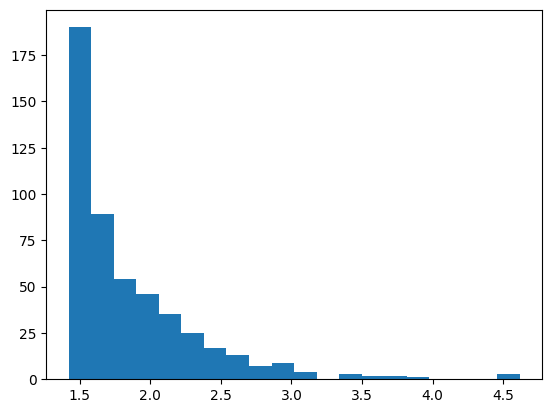

In [23]:
rmse_only_nm, errors_only_nm = sim_lstm(df_eur, 'EURHUF.X.Close', ['alapkamat','nm_dummy'],  n_sim)
plt.hist(rmse_only_nm, bins = 20)
plt.show()
# stats.describe(mse_only_nm)

### Only Matolcsgy Gyorgy

Epoch 1/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 126002.5391 - mean_absolute_error: 353.9892 - val_loss: 143726.4062 - val_mean_absolute_error: 379.0786
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 123715.6797 - mean_absolute_error: 350.7270 - val_loss: 135994.0312 - val_mean_absolute_error: 368.7386
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 113485.3594 - mean_absolute_error: 335.7771 - val_loss: 116436.1953 - val_mean_absolute_error: 341.1896
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 93888.0547 - mean_absolute_error: 305.0413 - val_loss: 87709.6016 - val_mean_absolute_error: 296.1144
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 66037.0078 - mean_absolute_error: 255.1181 - val_loss: 54031.7852 - val_mean_absolute_error: 232.3917
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 36250.2539 - mean_absolute_error: 187.5590 - val_loss: 24756.8438 - val_mean_absolute_error: 157.2609
Epoch 7/100
41/41 ━━━━━━━━━━

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.9581 - mean_absolute_error: 2.1050 - val_loss: 6.1928 - val_mean_absolute_error: 1.9853
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.0504 - mean_absolute_error: 2.0501 - val_loss: 7.7052 - val_mean_absolute_error: 2.1199
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3545 - mean_absolute_error: 1.9691 - val_loss: 7.4639 - val_mean_absolute_error: 2.2354
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.6417 - mean_absolute_error: 2.1486 - val_loss: 6.4886 - val_mean_absolute_error: 1.9550
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.8215 - mean_absolute_error: 2.0540 - val_loss: 6.0343 - val_mean_absolute_error: 1.9093
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.0072 - mean_absolute_error: 2.0401 - val_loss: 9.1340 - val_mean_absolute_error: 2.4898
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.7153 - mean_absolute_error: 2.3627 - val_loss: 6.7849 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.0700 - mean_absolute_error: 1.9353 - val_loss: 6.3802 - val_mean_absolute_error: 1.9446
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6105 - mean_absolute_error: 1.8683 - val_loss: 9.6955 - val_mean_absolute_error: 2.5703
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.6481 - mean_absolute_error: 2.1952 - val_loss: 11.0665 - val_mean_absolute_error: 2.7785
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.5701 - mean_absolute_error: 2.3050 - val_loss: 8.4881 - val_mean_absolute_error: 2.4015
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 10.4209 - mean_absolute_error: 2.5064 - val_loss: 5.9039 - val_mean_absolute_error: 1.9228
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1258 - mean_absolute_error: 1.9609 - val_loss: 7.3133 - val_mean_absolute_error: 2.0617
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.9551 - mean_absolute_error: 2.0998 - val_loss: 7.3404 -

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.2505 - mean_absolute_error: 1.9815 - val_loss: 6.9996 - val_mean_absolute_error: 2.1500
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.9564 - mean_absolute_error: 2.0678 - val_loss: 5.9676 - val_mean_absolute_error: 1.9274
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.8946 - mean_absolute_error: 2.1510 - val_loss: 6.7926 - val_mean_absolute_error: 2.1096
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2205 - mean_absolute_error: 2.0121 - val_loss: 9.6466 - val_mean_absolute_error: 2.5650
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 11.5381 - mean_absolute_error: 2.6322 - val_loss: 6.5214 - val_mean_absolute_error: 2.0587
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8884 - mean_absolute_error: 1.8938 - val_loss: 7.8905 - val_mean_absolute_error: 2.1460
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.6997 - mean_absolute_error: 1.9800 - val_loss: 6.3399 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.9657 - mean_absolute_error: 2.2762 - val_loss: 6.0698 - val_mean_absolute_error: 1.9131
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.4104 - mean_absolute_error: 2.1028 - val_loss: 6.1331 - val_mean_absolute_error: 1.9182
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.7474 - mean_absolute_error: 2.0523 - val_loss: 6.9405 - val_mean_absolute_error: 2.0149
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.0098 - mean_absolute_error: 2.2989 - val_loss: 17.2081 - val_mean_absolute_error: 3.5330
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 12.2269 - mean_absolute_error: 2.6986 - val_loss: 7.2428 - val_mean_absolute_error: 2.0515
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.5653 - mean_absolute_error: 2.0166 - val_loss: 6.0713 - val_mean_absolute_error: 1.9619
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.0350 - mean_absolute_error: 2.0643 - val_loss: 10.0962 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.1741 - mean_absolute_error: 2.0806 - val_loss: 8.5039 - val_mean_absolute_error: 2.3969
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.8223 - mean_absolute_error: 2.1612 - val_loss: 5.9412 - val_mean_absolute_error: 1.9221
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5906 - mean_absolute_error: 1.8746 - val_loss: 6.5825 - val_mean_absolute_error: 2.0704
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.6470 - mean_absolute_error: 2.2365 - val_loss: 6.5334 - val_mean_absolute_error: 1.9551
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2262 - mean_absolute_error: 1.9820 - val_loss: 5.9113 - val_mean_absolute_error: 1.9222
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.1224 - mean_absolute_error: 2.0863 - val_loss: 17.4710 - val_mean_absolute_error: 3.5600
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.4128 - mean_absolute_error: 2.1485 - val_loss: 7.4758 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.8796 - mean_absolute_error: 2.1770 - val_loss: 6.7917 - val_mean_absolute_error: 2.1089
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4342 - mean_absolute_error: 1.8882 - val_loss: 5.8027 - val_mean_absolute_error: 1.8875
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.8550 - mean_absolute_error: 2.0028 - val_loss: 13.2977 - val_mean_absolute_error: 2.9834
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 11.9994 - mean_absolute_error: 2.6840 - val_loss: 5.7257 - val_mean_absolute_error: 1.8594
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7321 - mean_absolute_error: 1.9126 - val_loss: 6.0756 - val_mean_absolute_error: 1.9586
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3623 - mean_absolute_error: 1.9641 - val_loss: 9.7579 - val_mean_absolute_error: 2.4281
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.5141 - mean_absolute_error: 2.3000 - val_loss: 6.4899 -

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.4094 - mean_absolute_error: 1.9734 - val_loss: 6.0433 - val_mean_absolute_error: 1.9083
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.7199 - mean_absolute_error: 2.0000 - val_loss: 7.5021 - val_mean_absolute_error: 2.2396
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.5087 - mean_absolute_error: 2.1500 - val_loss: 11.8937 - val_mean_absolute_error: 2.7672
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.9902 - mean_absolute_error: 2.1243 - val_loss: 5.9048 - val_mean_absolute_error: 1.9209
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.6447 - mean_absolute_error: 2.0575 - val_loss: 7.0515 - val_mean_absolute_error: 2.0261
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.0816 - mean_absolute_error: 2.0809 - val_loss: 5.8144 - val_mean_absolute_error: 1.8791
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.5187 - mean_absolute_error: 2.0068 - val_loss: 6.0925 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.3831 - mean_absolute_error: 1.9895 - val_loss: 6.2922 - val_mean_absolute_error: 1.9303
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.6348 - mean_absolute_error: 2.3487 - val_loss: 5.7728 - val_mean_absolute_error: 1.8675
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.7384 - mean_absolute_error: 2.0420 - val_loss: 7.4781 - val_mean_absolute_error: 2.2365
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.6591 - mean_absolute_error: 2.0812 - val_loss: 7.6577 - val_mean_absolute_error: 2.1139
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2865 - mean_absolute_error: 1.9241 - val_loss: 10.4454 - val_mean_absolute_error: 2.6897
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.0061 - mean_absolute_error: 2.1092 - val_loss: 6.4876 - val_mean_absolute_error: 1.9521
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7912 - mean_absolute_error: 1.9576 - val_loss: 5.9641 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.0691 - mean_absolute_error: 2.0392 - val_loss: 16.8146 - val_mean_absolute_error: 3.4782
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.6355 - mean_absolute_error: 2.0429 - val_loss: 5.9510 - val_mean_absolute_error: 1.9337
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.5634 - mean_absolute_error: 2.0342 - val_loss: 11.2970 - val_mean_absolute_error: 2.6684
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.5233 - mean_absolute_error: 2.1953 - val_loss: 9.3483 - val_mean_absolute_error: 2.3655
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 7.7732 - mean_absolute_error: 2.0691 - val_loss: 6.3067 - val_mean_absolute_error: 2.0129
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.8686 - mean_absolute_error: 2.2070 - val_loss: 10.2927 - val_mean_absolute_error: 2.6638
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.1272 - mean_absolute_error: 2.3313 - val_loss: 5.7958 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.3598 - mean_absolute_error: 1.8698 - val_loss: 13.9946 - val_mean_absolute_error: 3.0742
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.8288 - mean_absolute_error: 2.2097 - val_loss: 16.5707 - val_mean_absolute_error: 3.4400
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.6106 - mean_absolute_error: 2.1560 - val_loss: 6.8449 - val_mean_absolute_error: 1.9969
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3796 - mean_absolute_error: 1.9775 - val_loss: 6.8036 - val_mean_absolute_error: 1.9928
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3289 - mean_absolute_error: 1.9096 - val_loss: 6.1730 - val_mean_absolute_error: 1.9189
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4256 - mean_absolute_error: 1.9418 - val_loss: 5.9712 - val_mean_absolute_error: 1.9437
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 7.2069 - mean_absolute_error: 1.9065 - val_loss: 7.5821 -

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.7772 - mean_absolute_error: 1.9127 - val_loss: 5.7568 - val_mean_absolute_error: 1.8912
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8017 - mean_absolute_error: 1.9078 - val_loss: 6.1308 - val_mean_absolute_error: 1.9027
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2587 - mean_absolute_error: 1.9720 - val_loss: 5.8820 - val_mean_absolute_error: 1.8838
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.7770 - mean_absolute_error: 1.9918 - val_loss: 16.2794 - val_mean_absolute_error: 3.4124
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.5312 - mean_absolute_error: 2.0106 - val_loss: 5.7455 - val_mean_absolute_error: 1.8651
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.0836 - mean_absolute_error: 2.0104 - val_loss: 9.0276 - val_mean_absolute_error: 2.4861
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.0968 - mean_absolute_error: 2.1554 - val_loss: 6.0439 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.9160 - mean_absolute_error: 2.2792 - val_loss: 11.1504 - val_mean_absolute_error: 2.8092
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1265 - mean_absolute_error: 1.9599 - val_loss: 10.5214 - val_mean_absolute_error: 2.7077
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.9567 - mean_absolute_error: 2.4416 - val_loss: 10.5574 - val_mean_absolute_error: 2.7163
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 10.4980 - mean_absolute_error: 2.5382 - val_loss: 6.3503 - val_mean_absolute_error: 2.0310
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1586 - mean_absolute_error: 1.9275 - val_loss: 9.0120 - val_mean_absolute_error: 2.3206
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3948 - mean_absolute_error: 1.9901 - val_loss: 11.2608 - val_mean_absolute_error: 2.6851
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3499 - mean_absolute_error: 2.0145 - val_loss: 5.948

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.2677 - mean_absolute_error: 1.9831 - val_loss: 5.8699 - val_mean_absolute_error: 1.8739
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.9198 - mean_absolute_error: 2.1917 - val_loss: 10.8025 - val_mean_absolute_error: 2.7610
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.9356 - mean_absolute_error: 2.2741 - val_loss: 6.4587 - val_mean_absolute_error: 1.9299
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9443 - mean_absolute_error: 1.9484 - val_loss: 6.7325 - val_mean_absolute_error: 2.1061
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6246 - mean_absolute_error: 1.9037 - val_loss: 6.1887 - val_mean_absolute_error: 1.9946
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.5478 - mean_absolute_error: 1.9882 - val_loss: 6.6588 - val_mean_absolute_error: 1.9672
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9206 - mean_absolute_error: 1.9222 - val_loss: 5.8298 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 9.2166 - mean_absolute_error: 2.2224 - val_loss: 10.1216 - val_mean_absolute_error: 2.5060
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.5707 - mean_absolute_error: 1.9950 - val_loss: 5.9563 - val_mean_absolute_error: 1.8892
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2080 - mean_absolute_error: 1.9204 - val_loss: 7.5123 - val_mean_absolute_error: 2.2455
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.1662 - mean_absolute_error: 2.1258 - val_loss: 13.7365 - val_mean_absolute_error: 3.1616
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.9219 - mean_absolute_error: 2.4007 - val_loss: 5.5788 - val_mean_absolute_error: 1.8538
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8700 - mean_absolute_error: 1.9016 - val_loss: 5.9601 - val_mean_absolute_error: 1.9564
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 10.2465 - mean_absolute_error: 2.4505 - val_loss: 6.0137 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.6967 - mean_absolute_error: 2.1001 - val_loss: 6.5415 - val_mean_absolute_error: 1.9521
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6162 - mean_absolute_error: 1.9066 - val_loss: 5.8417 - val_mean_absolute_error: 1.8580
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.6034 - mean_absolute_error: 2.0786 - val_loss: 5.6368 - val_mean_absolute_error: 1.8417
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6541 - mean_absolute_error: 1.8716 - val_loss: 5.8786 - val_mean_absolute_error: 1.9305
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.6699 - mean_absolute_error: 2.2080 - val_loss: 5.8500 - val_mean_absolute_error: 1.9246
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4857 - mean_absolute_error: 1.9968 - val_loss: 13.3308 - val_mean_absolute_error: 3.0077
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7761 - mean_absolute_error: 1.9472 - val_loss: 6.1652 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.4918 - mean_absolute_error: 1.9855 - val_loss: 5.6347 - val_mean_absolute_error: 1.8464
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5252 - mean_absolute_error: 1.8207 - val_loss: 10.9806 - val_mean_absolute_error: 2.6487
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.3349 - mean_absolute_error: 2.3116 - val_loss: 5.5448 - val_mean_absolute_error: 1.8213
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.6196 - mean_absolute_error: 2.0375 - val_loss: 8.2524 - val_mean_absolute_error: 2.2019
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.9666 - mean_absolute_error: 2.2703 - val_loss: 7.6731 - val_mean_absolute_error: 2.1108
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.7843 - mean_absolute_error: 2.0389 - val_loss: 9.0112 - val_mean_absolute_error: 2.3241
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9620 - mean_absolute_error: 1.9010 - val_loss: 8.3470 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.5481 - mean_absolute_error: 2.0088 - val_loss: 16.5603 - val_mean_absolute_error: 3.4667
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.0811 - mean_absolute_error: 2.2152 - val_loss: 5.5700 - val_mean_absolute_error: 1.8267
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8883 - mean_absolute_error: 1.9303 - val_loss: 5.8350 - val_mean_absolute_error: 1.8681
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.5264 - mean_absolute_error: 1.9975 - val_loss: 13.2555 - val_mean_absolute_error: 3.0117
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.2209 - mean_absolute_error: 2.1155 - val_loss: 6.1062 - val_mean_absolute_error: 1.8957
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9735 - mean_absolute_error: 1.8910 - val_loss: 7.9109 - val_mean_absolute_error: 2.3077
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.5986 - mean_absolute_error: 2.1718 - val_loss: 7.6499 -

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.1223 - mean_absolute_error: 2.0539 - val_loss: 8.8448 - val_mean_absolute_error: 2.3047
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.0917 - mean_absolute_error: 2.0559 - val_loss: 5.8417 - val_mean_absolute_error: 1.9187
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.1065 - mean_absolute_error: 2.1767 - val_loss: 5.5747 - val_mean_absolute_error: 1.8223
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.5687 - mean_absolute_error: 2.0280 - val_loss: 10.5950 - val_mean_absolute_error: 2.5960
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4471 - mean_absolute_error: 1.8422 - val_loss: 6.2476 - val_mean_absolute_error: 1.9076
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6296 - mean_absolute_error: 1.8947 - val_loss: 7.6397 - val_mean_absolute_error: 2.2713
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.2899 - mean_absolute_error: 2.1671 - val_loss: 5.8651 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.8467 - mean_absolute_error: 2.0664 - val_loss: 5.7889 - val_mean_absolute_error: 1.8581
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9979 - mean_absolute_error: 1.9578 - val_loss: 5.3555 - val_mean_absolute_error: 1.8080
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7934 - mean_absolute_error: 1.7679 - val_loss: 8.3196 - val_mean_absolute_error: 2.3817
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.2905 - mean_absolute_error: 2.3254 - val_loss: 6.4287 - val_mean_absolute_error: 1.9295
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1936 - mean_absolute_error: 1.9721 - val_loss: 5.3142 - val_mean_absolute_error: 1.8066
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3406 - mean_absolute_error: 2.0052 - val_loss: 6.7567 - val_mean_absolute_error: 2.1172
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5614 - mean_absolute_error: 1.8699 - val_loss: 10.1316 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.6824 - mean_absolute_error: 1.9821 - val_loss: 5.7425 - val_mean_absolute_error: 1.8498
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2945 - mean_absolute_error: 1.9868 - val_loss: 6.0202 - val_mean_absolute_error: 1.8765
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.7208 - mean_absolute_error: 2.0384 - val_loss: 16.4835 - val_mean_absolute_error: 3.4847
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.7338 - mean_absolute_error: 2.1061 - val_loss: 10.0283 - val_mean_absolute_error: 2.5202
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 7.8520 - mean_absolute_error: 2.0283 - val_loss: 7.3231 - val_mean_absolute_error: 2.0628
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.5291 - mean_absolute_error: 2.3431 - val_loss: 5.5020 - val_mean_absolute_error: 1.8198
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.6835 - mean_absolute_error: 2.2316 - val_loss: 5.6883 -

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.4507 - mean_absolute_error: 2.0512 - val_loss: 6.4321 - val_mean_absolute_error: 2.0490
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7680 - mean_absolute_error: 1.9182 - val_loss: 6.2464 - val_mean_absolute_error: 1.9037
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2505 - mean_absolute_error: 1.8075 - val_loss: 5.6095 - val_mean_absolute_error: 1.8134
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0187 - mean_absolute_error: 1.9151 - val_loss: 5.5576 - val_mean_absolute_error: 1.8183
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4766 - mean_absolute_error: 1.9534 - val_loss: 9.0808 - val_mean_absolute_error: 2.3448
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.2498 - mean_absolute_error: 2.1201 - val_loss: 17.9559 - val_mean_absolute_error: 3.6570
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.5322 - mean_absolute_error: 2.1580 - val_loss: 6.0104 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.0995 - mean_absolute_error: 1.9778 - val_loss: 12.1833 - val_mean_absolute_error: 2.8545
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4288 - mean_absolute_error: 1.9954 - val_loss: 8.8420 - val_mean_absolute_error: 2.3223
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7866 - mean_absolute_error: 1.8600 - val_loss: 6.4331 - val_mean_absolute_error: 1.9321
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2120 - mean_absolute_error: 1.7936 - val_loss: 6.0657 - val_mean_absolute_error: 1.9730
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9140 - mean_absolute_error: 1.9222 - val_loss: 8.7033 - val_mean_absolute_error: 2.2867
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.7750 - mean_absolute_error: 2.0831 - val_loss: 6.3288 - val_mean_absolute_error: 1.9128
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6103 - mean_absolute_error: 1.8514 - val_loss: 5.6214 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 9.2306 - mean_absolute_error: 2.3025 - val_loss: 5.3726 - val_mean_absolute_error: 1.7916
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4339 - mean_absolute_error: 1.8110 - val_loss: 5.7254 - val_mean_absolute_error: 1.9005
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8880 - mean_absolute_error: 1.9163 - val_loss: 5.6649 - val_mean_absolute_error: 1.8843
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.3010 - mean_absolute_error: 2.1316 - val_loss: 5.3130 - val_mean_absolute_error: 1.8008
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.8465 - mean_absolute_error: 2.0872 - val_loss: 5.2996 - val_mean_absolute_error: 1.7994
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2796 - mean_absolute_error: 2.0241 - val_loss: 7.3930 - val_mean_absolute_error: 2.2342
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.5276 - mean_absolute_error: 2.2816 - val_loss: 19.8831 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2337 - mean_absolute_error: 1.8259 - val_loss: 5.2201 - val_mean_absolute_error: 1.7704
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.5276 - mean_absolute_error: 1.9437 - val_loss: 8.4684 - val_mean_absolute_error: 2.2459
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1062 - mean_absolute_error: 1.8027 - val_loss: 6.5662 - val_mean_absolute_error: 2.0808
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5043 - mean_absolute_error: 1.8387 - val_loss: 6.0224 - val_mean_absolute_error: 1.8747
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3978 - mean_absolute_error: 1.8062 - val_loss: 6.4965 - val_mean_absolute_error: 1.9457
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.5596 - mean_absolute_error: 2.0245 - val_loss: 8.9205 - val_mean_absolute_error: 2.3389
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.5081 - mean_absolute_error: 2.0039 - val_loss: 5.2717 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.3825 - mean_absolute_error: 1.9401 - val_loss: 15.1241 - val_mean_absolute_error: 3.2876
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 7.3284 - mean_absolute_error: 1.9668 - val_loss: 5.5030 - val_mean_absolute_error: 1.7904
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7634 - mean_absolute_error: 1.8742 - val_loss: 14.1445 - val_mean_absolute_error: 3.1363
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4432 - mean_absolute_error: 2.0468 - val_loss: 7.2851 - val_mean_absolute_error: 2.0608
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1958 - mean_absolute_error: 1.8145 - val_loss: 5.5037 - val_mean_absolute_error: 1.8029
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3314 - mean_absolute_error: 2.0055 - val_loss: 5.1922 - val_mean_absolute_error: 1.7621
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1268 - mean_absolute_error: 1.9114 - val_loss: 8.9521 -

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.4270 - mean_absolute_error: 1.8056 - val_loss: 5.2824 - val_mean_absolute_error: 1.7995
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.6961 - mean_absolute_error: 2.0189 - val_loss: 6.1571 - val_mean_absolute_error: 2.0020
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5314 - mean_absolute_error: 1.7207 - val_loss: 7.7417 - val_mean_absolute_error: 2.1360
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.6237 - mean_absolute_error: 2.0309 - val_loss: 5.3150 - val_mean_absolute_error: 1.7848
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9125 - mean_absolute_error: 1.9199 - val_loss: 12.4918 - val_mean_absolute_error: 2.9189
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 8.7251 - mean_absolute_error: 2.1013 - val_loss: 5.2544 - val_mean_absolute_error: 1.7847
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9500 - mean_absolute_error: 1.8834 - val_loss: 6.8591 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.5983 - mean_absolute_error: 2.0226 - val_loss: 8.7697 - val_mean_absolute_error: 2.3125
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.9871 - mean_absolute_error: 2.0745 - val_loss: 7.0844 - val_mean_absolute_error: 2.1841
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.9337 - mean_absolute_error: 2.2533 - val_loss: 5.9365 - val_mean_absolute_error: 1.9523
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.7668 - mean_absolute_error: 2.1162 - val_loss: 11.0960 - val_mean_absolute_error: 2.8197
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.3761 - mean_absolute_error: 2.1758 - val_loss: 7.4823 - val_mean_absolute_error: 2.0947
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4916 - mean_absolute_error: 1.9839 - val_loss: 5.2703 - val_mean_absolute_error: 1.7690
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7650 - mean_absolute_error: 1.7687 - val_loss: 6.6054 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.4639 - mean_absolute_error: 1.8879 - val_loss: 5.3645 - val_mean_absolute_error: 1.8166
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4872 - mean_absolute_error: 1.7004 - val_loss: 5.1034 - val_mean_absolute_error: 1.7491
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6959 - mean_absolute_error: 1.8867 - val_loss: 5.5554 - val_mean_absolute_error: 1.7857
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.6028 - mean_absolute_error: 2.0307 - val_loss: 8.8913 - val_mean_absolute_error: 2.3359
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9860 - mean_absolute_error: 1.9668 - val_loss: 7.9849 - val_mean_absolute_error: 2.1830
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.9256 - mean_absolute_error: 2.0232 - val_loss: 5.6405 - val_mean_absolute_error: 1.8846
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.9878 - mean_absolute_error: 2.2314 - val_loss: 5.3607 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 9.3522 - mean_absolute_error: 2.3124 - val_loss: 5.7595 - val_mean_absolute_error: 1.9121
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.7015 - mean_absolute_error: 2.0670 - val_loss: 5.2048 - val_mean_absolute_error: 1.7876
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.8712 - mean_absolute_error: 2.0891 - val_loss: 5.3161 - val_mean_absolute_error: 1.7734
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8484 - mean_absolute_error: 1.8897 - val_loss: 6.9495 - val_mean_absolute_error: 2.1577
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 10.3910 - mean_absolute_error: 2.5208 - val_loss: 9.6534 - val_mean_absolute_error: 2.6190
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4005 - mean_absolute_error: 2.0330 - val_loss: 10.3451 - val_mean_absolute_error: 2.7227
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.1445 - mean_absolute_error: 2.1213 - val_loss: 8.0220 -

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.9620 - mean_absolute_error: 1.9421 - val_loss: 5.5349 - val_mean_absolute_error: 1.8662
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4349 - mean_absolute_error: 1.9699 - val_loss: 7.8668 - val_mean_absolute_error: 2.1599
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6126 - mean_absolute_error: 1.9270 - val_loss: 5.1889 - val_mean_absolute_error: 1.7560
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1859 - mean_absolute_error: 1.9796 - val_loss: 5.4779 - val_mean_absolute_error: 1.7931
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.6988 - mean_absolute_error: 2.0327 - val_loss: 6.7916 - val_mean_absolute_error: 2.1262
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2218 - mean_absolute_error: 1.8508 - val_loss: 5.5608 - val_mean_absolute_error: 1.8046
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2908 - mean_absolute_error: 1.8607 - val_loss: 12.2358 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 9.8547 - mean_absolute_error: 2.3928 - val_loss: 5.0671 - val_mean_absolute_error: 1.7528
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.6797 - mean_absolute_error: 2.0094 - val_loss: 5.9727 - val_mean_absolute_error: 1.8626
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4098 - mean_absolute_error: 1.8459 - val_loss: 6.9131 - val_mean_absolute_error: 2.0041
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4165 - mean_absolute_error: 1.7216 - val_loss: 9.4156 - val_mean_absolute_error: 2.4268
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1752 - mean_absolute_error: 1.9742 - val_loss: 15.4537 - val_mean_absolute_error: 3.3578
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.2040 - mean_absolute_error: 2.0915 - val_loss: 7.1280 - val_mean_absolute_error: 2.0400
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.2670 - mean_absolute_error: 2.1305 - val_loss: 9.0677 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.5456 - mean_absolute_error: 1.8732 - val_loss: 14.1880 - val_mean_absolute_error: 3.1906
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 10.7317 - mean_absolute_error: 2.4920 - val_loss: 6.0849 - val_mean_absolute_error: 1.9930
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5804 - mean_absolute_error: 1.8601 - val_loss: 5.7568 - val_mean_absolute_error: 1.8259
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1157 - mean_absolute_error: 1.8561 - val_loss: 5.1375 - val_mean_absolute_error: 1.7418
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4911 - mean_absolute_error: 1.8152 - val_loss: 16.2627 - val_mean_absolute_error: 3.4618
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.1305 - mean_absolute_error: 2.1111 - val_loss: 5.4647 - val_mean_absolute_error: 1.7890
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4863 - mean_absolute_error: 1.9739 - val_loss: 5.5064 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.9498 - mean_absolute_error: 2.1100 - val_loss: 5.5771 - val_mean_absolute_error: 1.7984
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6670 - mean_absolute_error: 1.8996 - val_loss: 5.1432 - val_mean_absolute_error: 1.7572
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0501 - mean_absolute_error: 1.9445 - val_loss: 8.0104 - val_mean_absolute_error: 2.3414
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.5167 - mean_absolute_error: 2.4042 - val_loss: 6.5811 - val_mean_absolute_error: 1.9546
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.4765 - mean_absolute_error: 2.3110 - val_loss: 6.7974 - val_mean_absolute_error: 1.9861
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.6085 - mean_absolute_error: 2.0803 - val_loss: 7.3104 - val_mean_absolute_error: 2.0655
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8749 - mean_absolute_error: 1.8786 - val_loss: 5.1589 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.3182 - mean_absolute_error: 1.7952 - val_loss: 5.9227 - val_mean_absolute_error: 1.9577
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.0617 - mean_absolute_error: 2.1633 - val_loss: 6.0815 - val_mean_absolute_error: 1.8772
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7501 - mean_absolute_error: 1.7090 - val_loss: 5.5069 - val_mean_absolute_error: 1.8677
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8779 - mean_absolute_error: 2.0045 - val_loss: 6.6446 - val_mean_absolute_error: 1.9591
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1263 - mean_absolute_error: 1.8141 - val_loss: 6.2234 - val_mean_absolute_error: 1.8936
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.0424 - mean_absolute_error: 2.0578 - val_loss: 7.6923 - val_mean_absolute_error: 2.3008
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3851 - mean_absolute_error: 1.9906 - val_loss: 5.1077 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.8860 - mean_absolute_error: 1.8045 - val_loss: 5.9510 - val_mean_absolute_error: 1.9657
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6757 - mean_absolute_error: 1.8652 - val_loss: 5.3832 - val_mean_absolute_error: 1.8319
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1603 - mean_absolute_error: 1.9243 - val_loss: 7.3227 - val_mean_absolute_error: 2.2337
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 7.5660 - mean_absolute_error: 2.0678 - val_loss: 5.5978 - val_mean_absolute_error: 1.8003
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6146 - mean_absolute_error: 1.7328 - val_loss: 6.0274 - val_mean_absolute_error: 1.8656
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3846 - mean_absolute_error: 2.0148 - val_loss: 7.1409 - val_mean_absolute_error: 2.1958
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.7787 - mean_absolute_error: 2.1581 - val_loss: 4.9238 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.3731 - mean_absolute_error: 2.0411 - val_loss: 11.2562 - val_mean_absolute_error: 2.7457
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7819 - mean_absolute_error: 1.9447 - val_loss: 5.2150 - val_mean_absolute_error: 1.7511
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1901 - mean_absolute_error: 1.9067 - val_loss: 5.3780 - val_mean_absolute_error: 1.8300
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1176 - mean_absolute_error: 1.7951 - val_loss: 5.0899 - val_mean_absolute_error: 1.7656
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4116 - mean_absolute_error: 1.8314 - val_loss: 4.9889 - val_mean_absolute_error: 1.7223
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.4433 - mean_absolute_error: 1.8390 - val_loss: 5.5493 - val_mean_absolute_error: 1.7941
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7508 - mean_absolute_error: 1.8932 - val_loss: 8.8402 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.0737 - mean_absolute_error: 1.7732 - val_loss: 13.2499 - val_mean_absolute_error: 3.0469
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7245 - mean_absolute_error: 1.9419 - val_loss: 15.2636 - val_mean_absolute_error: 3.3515
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.7435 - mean_absolute_error: 2.0904 - val_loss: 12.3938 - val_mean_absolute_error: 2.9206
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.3381 - mean_absolute_error: 2.2689 - val_loss: 6.4823 - val_mean_absolute_error: 2.0664
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.6791 - mean_absolute_error: 2.2150 - val_loss: 4.9528 - val_mean_absolute_error: 1.7103
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9513 - mean_absolute_error: 1.7397 - val_loss: 8.6061 - val_mean_absolute_error: 2.2933
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8407 - mean_absolute_error: 1.9394 - val_loss: 5.1292 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.7832 - mean_absolute_error: 1.9553 - val_loss: 5.6754 - val_mean_absolute_error: 1.8163
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3501 - mean_absolute_error: 1.8195 - val_loss: 9.1361 - val_mean_absolute_error: 2.3977
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2345 - mean_absolute_error: 1.9611 - val_loss: 5.0581 - val_mean_absolute_error: 1.7583
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.1485 - mean_absolute_error: 2.0734 - val_loss: 8.7712 - val_mean_absolute_error: 2.3469
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8513 - mean_absolute_error: 1.9455 - val_loss: 4.8659 - val_mean_absolute_error: 1.7069
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6723 - mean_absolute_error: 1.8748 - val_loss: 7.0144 - val_mean_absolute_error: 2.1768
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.9722 - mean_absolute_error: 2.1452 - val_loss: 5.1373 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.4340 - mean_absolute_error: 1.9968 - val_loss: 5.0354 - val_mean_absolute_error: 1.7485
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7115 - mean_absolute_error: 1.7412 - val_loss: 5.6111 - val_mean_absolute_error: 1.7997
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0406 - mean_absolute_error: 1.9113 - val_loss: 6.8222 - val_mean_absolute_error: 1.9950
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7778 - mean_absolute_error: 1.6863 - val_loss: 5.5750 - val_mean_absolute_error: 1.8876
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9934 - mean_absolute_error: 1.9452 - val_loss: 7.9194 - val_mean_absolute_error: 2.3413
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4797 - mean_absolute_error: 2.0682 - val_loss: 4.9959 - val_mean_absolute_error: 1.7292
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5934 - mean_absolute_error: 1.6964 - val_loss: 5.7269 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.5209 - mean_absolute_error: 2.0031 - val_loss: 5.1108 - val_mean_absolute_error: 1.7411
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6843 - mean_absolute_error: 1.8950 - val_loss: 6.7787 - val_mean_absolute_error: 1.9884
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4359 - mean_absolute_error: 1.8659 - val_loss: 5.8060 - val_mean_absolute_error: 1.8306
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2767 - mean_absolute_error: 1.8606 - val_loss: 5.3565 - val_mean_absolute_error: 1.8372
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7979 - mean_absolute_error: 1.8987 - val_loss: 5.8215 - val_mean_absolute_error: 1.8343
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2267 - mean_absolute_error: 1.8153 - val_loss: 4.9099 - val_mean_absolute_error: 1.7066
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4229 - mean_absolute_error: 1.7262 - val_loss: 6.2700 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.7116 - mean_absolute_error: 2.2238 - val_loss: 4.9863 - val_mean_absolute_error: 1.7049
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2979 - mean_absolute_error: 1.9064 - val_loss: 6.4320 - val_mean_absolute_error: 1.9292
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.6652 - mean_absolute_error: 2.1746 - val_loss: 4.8958 - val_mean_absolute_error: 1.6907
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3113 - mean_absolute_error: 1.8441 - val_loss: 7.7477 - val_mean_absolute_error: 2.3132
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.5386 - mean_absolute_error: 2.4318 - val_loss: 6.0376 - val_mean_absolute_error: 1.8697
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8428 - mean_absolute_error: 1.9001 - val_loss: 6.8280 - val_mean_absolute_error: 1.9975
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4456 - mean_absolute_error: 1.8513 - val_loss: 4.7627 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.0937 - mean_absolute_error: 1.9530 - val_loss: 6.3508 - val_mean_absolute_error: 2.0570
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.1087 - mean_absolute_error: 2.1366 - val_loss: 9.5314 - val_mean_absolute_error: 2.4711
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2881 - mean_absolute_error: 2.0338 - val_loss: 5.1746 - val_mean_absolute_error: 1.7833
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.0237 - mean_absolute_error: 2.0983 - val_loss: 11.4244 - val_mean_absolute_error: 2.7838
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.9399 - mean_absolute_error: 2.0705 - val_loss: 6.1618 - val_mean_absolute_error: 1.8844
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.9790 - mean_absolute_error: 2.0826 - val_loss: 4.9223 - val_mean_absolute_error: 1.6985
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1334 - mean_absolute_error: 1.9280 - val_loss: 4.9763 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.9606 - mean_absolute_error: 1.9634 - val_loss: 6.4668 - val_mean_absolute_error: 1.9380
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8353 - mean_absolute_error: 1.9136 - val_loss: 6.1342 - val_mean_absolute_error: 1.8813
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1617 - mean_absolute_error: 1.8160 - val_loss: 7.3937 - val_mean_absolute_error: 2.1072
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3745 - mean_absolute_error: 1.8469 - val_loss: 5.2140 - val_mean_absolute_error: 1.7346
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0980 - mean_absolute_error: 1.7936 - val_loss: 9.1663 - val_mean_absolute_error: 2.4157
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4892 - mean_absolute_error: 1.8817 - val_loss: 4.7691 - val_mean_absolute_error: 1.6824
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2719 - mean_absolute_error: 1.8146 - val_loss: 4.8519 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.4472 - mean_absolute_error: 1.8326 - val_loss: 6.1767 - val_mean_absolute_error: 1.8901
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3564 - mean_absolute_error: 1.8688 - val_loss: 4.9404 - val_mean_absolute_error: 1.6916
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4520 - mean_absolute_error: 1.9954 - val_loss: 5.0625 - val_mean_absolute_error: 1.7172
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3717 - mean_absolute_error: 1.9037 - val_loss: 7.0403 - val_mean_absolute_error: 2.0405
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.8593 - mean_absolute_error: 2.1298 - val_loss: 6.2589 - val_mean_absolute_error: 1.9004
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3100 - mean_absolute_error: 2.0512 - val_loss: 5.1897 - val_mean_absolute_error: 1.7361
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7418 - mean_absolute_error: 1.7031 - val_loss: 5.5115 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.9859 - mean_absolute_error: 1.9310 - val_loss: 8.2111 - val_mean_absolute_error: 2.2370
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3773 - mean_absolute_error: 2.0063 - val_loss: 6.4592 - val_mean_absolute_error: 1.9377
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3165 - mean_absolute_error: 1.7621 - val_loss: 4.9060 - val_mean_absolute_error: 1.7217
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9640 - mean_absolute_error: 1.9430 - val_loss: 6.4444 - val_mean_absolute_error: 2.0673
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.5458 - mean_absolute_error: 2.3471 - val_loss: 5.0172 - val_mean_absolute_error: 1.7448
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6584 - mean_absolute_error: 1.8559 - val_loss: 4.9751 - val_mean_absolute_error: 1.7091
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0860 - mean_absolute_error: 1.8054 - val_loss: 5.6393 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 10.2055 - mean_absolute_error: 2.5078 - val_loss: 6.7779 - val_mean_absolute_error: 2.1363
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6373 - mean_absolute_error: 1.8570 - val_loss: 4.8364 - val_mean_absolute_error: 1.7017
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4774 - mean_absolute_error: 1.8862 - val_loss: 4.8114 - val_mean_absolute_error: 1.6790
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8922 - mean_absolute_error: 1.7224 - val_loss: 4.7269 - val_mean_absolute_error: 1.6773
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6292 - mean_absolute_error: 1.8387 - val_loss: 9.6782 - val_mean_absolute_error: 2.4976
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.9646 - mean_absolute_error: 2.1807 - val_loss: 5.7713 - val_mean_absolute_error: 1.9322
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.5278 - mean_absolute_error: 2.0034 - val_loss: 10.0021 -

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.6311 - mean_absolute_error: 1.8927 - val_loss: 14.4671 - val_mean_absolute_error: 3.2538
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.4929 - mean_absolute_error: 2.1740 - val_loss: 5.2248 - val_mean_absolute_error: 1.7401
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.2844 - mean_absolute_error: 2.1367 - val_loss: 5.6981 - val_mean_absolute_error: 1.8165
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1464 - mean_absolute_error: 1.9198 - val_loss: 4.7783 - val_mean_absolute_error: 1.6943
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.6660 - mean_absolute_error: 2.0361 - val_loss: 5.2007 - val_mean_absolute_error: 1.8043
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1737 - mean_absolute_error: 1.7954 - val_loss: 8.6679 - val_mean_absolute_error: 2.4853
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.5118 - mean_absolute_error: 2.2614 - val_loss: 8.1534 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.8334 - mean_absolute_error: 1.9338 - val_loss: 4.9893 - val_mean_absolute_error: 1.7048
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1688 - mean_absolute_error: 1.9700 - val_loss: 18.6553 - val_mean_absolute_error: 3.7948
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 10.1243 - mean_absolute_error: 2.5038 - val_loss: 17.7110 - val_mean_absolute_error: 3.6846
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.2479 - mean_absolute_error: 2.2233 - val_loss: 6.4344 - val_mean_absolute_error: 1.9352
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9250 - mean_absolute_error: 1.9712 - val_loss: 8.7639 - val_mean_absolute_error: 2.3602
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7122 - mean_absolute_error: 1.9447 - val_loss: 7.4321 - val_mean_absolute_error: 2.1169
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2036 - mean_absolute_error: 1.9799 - val_loss: 4.9264 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5856 - mean_absolute_error: 1.7138 - val_loss: 4.8048 - val_mean_absolute_error: 1.6855
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0131 - mean_absolute_error: 1.7370 - val_loss: 6.0141 - val_mean_absolute_error: 1.9895
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.7206 - mean_absolute_error: 2.0686 - val_loss: 4.7733 - val_mean_absolute_error: 1.6787
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4192 - mean_absolute_error: 1.8396 - val_loss: 5.2260 - val_mean_absolute_error: 1.7430
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1035 - mean_absolute_error: 1.9606 - val_loss: 5.2378 - val_mean_absolute_error: 1.7407
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8955 - mean_absolute_error: 1.7516 - val_loss: 5.8673 - val_mean_absolute_error: 1.8442
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4896 - mean_absolute_error: 1.9844 - val_loss: 10.8522 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.5233 - mean_absolute_error: 2.2153 - val_loss: 4.9063 - val_mean_absolute_error: 1.6973
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7679 - mean_absolute_error: 1.9492 - val_loss: 5.0786 - val_mean_absolute_error: 1.7221
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.7850 - mean_absolute_error: 2.0164 - val_loss: 5.5204 - val_mean_absolute_error: 1.8815
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0648 - mean_absolute_error: 1.9103 - val_loss: 4.9709 - val_mean_absolute_error: 1.7030
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.6578 - mean_absolute_error: 2.0536 - val_loss: 5.3448 - val_mean_absolute_error: 1.8308
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7183 - mean_absolute_error: 1.8865 - val_loss: 6.3142 - val_mean_absolute_error: 2.0527
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3891 - mean_absolute_error: 1.9428 - val_loss: 12.8366 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.0219 - mean_absolute_error: 1.9480 - val_loss: 4.6214 - val_mean_absolute_error: 1.6620
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.4551 - mean_absolute_error: 2.2827 - val_loss: 9.3743 - val_mean_absolute_error: 2.4604
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6291 - mean_absolute_error: 1.8522 - val_loss: 7.8750 - val_mean_absolute_error: 2.1857
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.6811 - mean_absolute_error: 2.1936 - val_loss: 5.9324 - val_mean_absolute_error: 1.8504
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 10.2155 - mean_absolute_error: 2.4620 - val_loss: 4.8650 - val_mean_absolute_error: 1.7192
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2014 - mean_absolute_error: 1.7847 - val_loss: 9.6622 - val_mean_absolute_error: 2.5162
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2017 - mean_absolute_error: 1.9773 - val_loss: 8.1164 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9115 - mean_absolute_error: 1.7574 - val_loss: 4.7575 - val_mean_absolute_error: 1.6932
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1064 - mean_absolute_error: 1.8081 - val_loss: 5.1112 - val_mean_absolute_error: 1.7850
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.6836 - mean_absolute_error: 2.0186 - val_loss: 4.8738 - val_mean_absolute_error: 1.7237
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.8233 - mean_absolute_error: 2.0198 - val_loss: 17.2119 - val_mean_absolute_error: 3.6148
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8987 - mean_absolute_error: 1.9287 - val_loss: 5.1915 - val_mean_absolute_error: 1.8071
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1541 - mean_absolute_error: 1.8215 - val_loss: 4.9083 - val_mean_absolute_error: 1.6888
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6889 - mean_absolute_error: 1.8958 - val_loss: 5.2077 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.1602 - mean_absolute_error: 1.8931 - val_loss: 6.4457 - val_mean_absolute_error: 1.9446
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8738 - mean_absolute_error: 1.9464 - val_loss: 5.4586 - val_mean_absolute_error: 1.7769
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2006 - mean_absolute_error: 1.7750 - val_loss: 5.3396 - val_mean_absolute_error: 1.7567
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7777 - mean_absolute_error: 1.8652 - val_loss: 5.4733 - val_mean_absolute_error: 1.7751
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8595 - mean_absolute_error: 1.8429 - val_loss: 6.6244 - val_mean_absolute_error: 1.9800
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.9516 - mean_absolute_error: 2.0932 - val_loss: 4.8985 - val_mean_absolute_error: 1.6861
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9621 - mean_absolute_error: 1.7624 - val_loss: 8.5177 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.3447 - mean_absolute_error: 1.9556 - val_loss: 5.8961 - val_mean_absolute_error: 1.8468
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9833 - mean_absolute_error: 1.8026 - val_loss: 4.5755 - val_mean_absolute_error: 1.6494
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1743 - mean_absolute_error: 1.7789 - val_loss: 5.6028 - val_mean_absolute_error: 1.7969
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0317 - mean_absolute_error: 1.7461 - val_loss: 4.7611 - val_mean_absolute_error: 1.7004
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5388 - mean_absolute_error: 1.6572 - val_loss: 5.6729 - val_mean_absolute_error: 1.8121
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6576 - mean_absolute_error: 1.9330 - val_loss: 4.9308 - val_mean_absolute_error: 1.7461
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2013 - mean_absolute_error: 1.9026 - val_loss: 6.9145 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.1729 - mean_absolute_error: 2.1882 - val_loss: 6.5257 - val_mean_absolute_error: 2.0994
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.4879 - mean_absolute_error: 2.2164 - val_loss: 6.6334 - val_mean_absolute_error: 1.9895
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1989 - mean_absolute_error: 1.9845 - val_loss: 7.2716 - val_mean_absolute_error: 2.1038
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4375 - mean_absolute_error: 1.9667 - val_loss: 4.6724 - val_mean_absolute_error: 1.6766
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5597 - mean_absolute_error: 1.8589 - val_loss: 5.0286 - val_mean_absolute_error: 1.7668
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7446 - mean_absolute_error: 1.7088 - val_loss: 5.4572 - val_mean_absolute_error: 1.8703
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5022 - mean_absolute_error: 1.8299 - val_loss: 5.5698 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.3772 - mean_absolute_error: 1.9776 - val_loss: 5.0401 - val_mean_absolute_error: 1.7693
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9612 - mean_absolute_error: 1.7662 - val_loss: 20.6413 - val_mean_absolute_error: 4.1080
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.8973 - mean_absolute_error: 2.4495 - val_loss: 4.7599 - val_mean_absolute_error: 1.6722
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2090 - mean_absolute_error: 1.9704 - val_loss: 10.1483 - val_mean_absolute_error: 2.6093
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0414 - mean_absolute_error: 1.9693 - val_loss: 5.6388 - val_mean_absolute_error: 1.8044
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6923 - mean_absolute_error: 1.8891 - val_loss: 6.4339 - val_mean_absolute_error: 1.9435
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7657 - mean_absolute_error: 1.9590 - val_loss: 6.0214 -

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.8027 - mean_absolute_error: 1.8924 - val_loss: 8.9633 - val_mean_absolute_error: 2.5222
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.7590 - mean_absolute_error: 2.1094 - val_loss: 4.9628 - val_mean_absolute_error: 1.7632
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2878 - mean_absolute_error: 1.9777 - val_loss: 4.6555 - val_mean_absolute_error: 1.6556
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4014 - mean_absolute_error: 1.8033 - val_loss: 4.8571 - val_mean_absolute_error: 1.6780
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3262 - mean_absolute_error: 1.9647 - val_loss: 5.3055 - val_mean_absolute_error: 1.7504
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2577 - mean_absolute_error: 1.9630 - val_loss: 8.4544 - val_mean_absolute_error: 2.4497
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8615 - mean_absolute_error: 1.9414 - val_loss: 4.6809 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.5355 - mean_absolute_error: 1.7881 - val_loss: 6.6546 - val_mean_absolute_error: 1.9891
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0996 - mean_absolute_error: 1.8645 - val_loss: 7.4191 - val_mean_absolute_error: 2.1321
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3510 - mean_absolute_error: 1.9882 - val_loss: 5.7710 - val_mean_absolute_error: 1.8275
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2828 - mean_absolute_error: 1.8188 - val_loss: 5.5807 - val_mean_absolute_error: 1.9064
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2785 - mean_absolute_error: 1.8658 - val_loss: 4.8519 - val_mean_absolute_error: 1.6836
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3150 - mean_absolute_error: 1.8095 - val_loss: 4.5901 - val_mean_absolute_error: 1.6456
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1181 - mean_absolute_error: 1.8168 - val_loss: 8.8036 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6886 - mean_absolute_error: 1.7212 - val_loss: 29.9959 - val_mean_absolute_error: 5.0491
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.9282 - mean_absolute_error: 2.3204 - val_loss: 7.9624 - val_mean_absolute_error: 2.3685
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3653 - mean_absolute_error: 2.0061 - val_loss: 4.6000 - val_mean_absolute_error: 1.6412
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2198 - mean_absolute_error: 1.9724 - val_loss: 5.8533 - val_mean_absolute_error: 1.9637
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7762 - mean_absolute_error: 1.7626 - val_loss: 5.7789 - val_mean_absolute_error: 1.9498
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1026 - mean_absolute_error: 1.7839 - val_loss: 6.5037 - val_mean_absolute_error: 2.0967
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2872 - mean_absolute_error: 1.7698 - val_loss: 4.8682 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.8864 - mean_absolute_error: 1.7304 - val_loss: 6.4701 - val_mean_absolute_error: 2.0926
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1795 - mean_absolute_error: 1.8114 - val_loss: 7.2655 - val_mean_absolute_error: 2.2477
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.3291 - mean_absolute_error: 2.3582 - val_loss: 7.1334 - val_mean_absolute_error: 2.0766
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0527 - mean_absolute_error: 1.9697 - val_loss: 4.8225 - val_mean_absolute_error: 1.6836
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9102 - mean_absolute_error: 1.5808 - val_loss: 9.3597 - val_mean_absolute_error: 2.4758
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1713 - mean_absolute_error: 1.9738 - val_loss: 7.7446 - val_mean_absolute_error: 2.3380
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.9722 - mean_absolute_error: 2.3025 - val_loss: 6.5453 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.3191 - mean_absolute_error: 1.9562 - val_loss: 5.8335 - val_mean_absolute_error: 1.8360
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.3089 - mean_absolute_error: 2.1688 - val_loss: 6.7029 - val_mean_absolute_error: 1.9924
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7048 - mean_absolute_error: 1.8140 - val_loss: 5.0130 - val_mean_absolute_error: 1.7702
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0877 - mean_absolute_error: 1.9627 - val_loss: 4.8489 - val_mean_absolute_error: 1.7318
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 7.8493 - mean_absolute_error: 2.1006 - val_loss: 5.6133 - val_mean_absolute_error: 1.7985
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2544 - mean_absolute_error: 1.8074 - val_loss: 4.9697 - val_mean_absolute_error: 1.7552
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0163 - mean_absolute_error: 1.7886 - val_loss: 5.3083 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.0686 - mean_absolute_error: 1.8029 - val_loss: 4.6440 - val_mean_absolute_error: 1.6741
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4235 - mean_absolute_error: 1.8864 - val_loss: 4.7862 - val_mean_absolute_error: 1.7074
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5130 - mean_absolute_error: 1.8614 - val_loss: 4.7122 - val_mean_absolute_error: 1.6637
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8756 - mean_absolute_error: 1.8811 - val_loss: 4.8257 - val_mean_absolute_error: 1.7223
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8632 - mean_absolute_error: 1.8977 - val_loss: 6.2498 - val_mean_absolute_error: 2.0557
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2544 - mean_absolute_error: 1.8311 - val_loss: 4.3399 - val_mean_absolute_error: 1.5909
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4574 - mean_absolute_error: 1.8178 - val_loss: 6.7780 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.0276 - mean_absolute_error: 1.9339 - val_loss: 10.6892 - val_mean_absolute_error: 2.7052
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7740 - mean_absolute_error: 1.9367 - val_loss: 5.6537 - val_mean_absolute_error: 1.8067
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0019 - mean_absolute_error: 1.8942 - val_loss: 4.5841 - val_mean_absolute_error: 1.6327
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8567 - mean_absolute_error: 1.7427 - val_loss: 6.9434 - val_mean_absolute_error: 2.1816
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.9050 - mean_absolute_error: 2.1565 - val_loss: 4.5511 - val_mean_absolute_error: 1.6547
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5967 - mean_absolute_error: 1.7152 - val_loss: 8.8341 - val_mean_absolute_error: 2.3901
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.8956 - mean_absolute_error: 2.1273 - val_loss: 6.5314 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9296 - mean_absolute_error: 1.7723 - val_loss: 4.7751 - val_mean_absolute_error: 1.6607
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1809 - mean_absolute_error: 1.7784 - val_loss: 5.1449 - val_mean_absolute_error: 1.7225
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1472 - mean_absolute_error: 1.7620 - val_loss: 4.4466 - val_mean_absolute_error: 1.6242
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.7390 - mean_absolute_error: 2.0812 - val_loss: 11.6319 - val_mean_absolute_error: 2.9421
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.3085 - mean_absolute_error: 2.2268 - val_loss: 6.8270 - val_mean_absolute_error: 2.0358
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3067 - mean_absolute_error: 1.8301 - val_loss: 4.4603 - val_mean_absolute_error: 1.6309
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0095 - mean_absolute_error: 1.9869 - val_loss: 4.6494 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.9523 - mean_absolute_error: 1.9014 - val_loss: 5.2990 - val_mean_absolute_error: 1.7480
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7429 - mean_absolute_error: 1.9122 - val_loss: 4.5266 - val_mean_absolute_error: 1.6313
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8008 - mean_absolute_error: 1.7119 - val_loss: 4.3824 - val_mean_absolute_error: 1.6018
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0926 - mean_absolute_error: 1.7813 - val_loss: 5.4471 - val_mean_absolute_error: 1.8809
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1926 - mean_absolute_error: 1.8010 - val_loss: 4.5193 - val_mean_absolute_error: 1.6269
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4938 - mean_absolute_error: 1.7089 - val_loss: 4.9736 - val_mean_absolute_error: 1.7676
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3693 - mean_absolute_error: 1.9502 - val_loss: 5.3079 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.2663 - mean_absolute_error: 2.0245 - val_loss: 7.1083 - val_mean_absolute_error: 2.0757
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.5819 - mean_absolute_error: 2.2262 - val_loss: 4.5872 - val_mean_absolute_error: 1.6328
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7453 - mean_absolute_error: 1.8713 - val_loss: 11.1173 - val_mean_absolute_error: 2.7832
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9326 - mean_absolute_error: 1.9799 - val_loss: 11.2407 - val_mean_absolute_error: 2.7865
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3356 - mean_absolute_error: 2.0151 - val_loss: 4.7862 - val_mean_absolute_error: 1.7141
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8869 - mean_absolute_error: 1.7168 - val_loss: 6.6285 - val_mean_absolute_error: 2.1269
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8879 - mean_absolute_error: 1.9602 - val_loss: 4.4771 -

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.4127 - mean_absolute_error: 2.1062 - val_loss: 6.8031 - val_mean_absolute_error: 2.0253
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4282 - mean_absolute_error: 1.8343 - val_loss: 7.1578 - val_mean_absolute_error: 2.0870
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7136 - mean_absolute_error: 1.7405 - val_loss: 8.0863 - val_mean_absolute_error: 2.2544
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5201 - mean_absolute_error: 1.8854 - val_loss: 6.7361 - val_mean_absolute_error: 2.0059
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0739 - mean_absolute_error: 1.9491 - val_loss: 4.6388 - val_mean_absolute_error: 1.6517
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4021 - mean_absolute_error: 2.0506 - val_loss: 4.7006 - val_mean_absolute_error: 1.6444
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2541 - mean_absolute_error: 1.8588 - val_loss: 4.9641 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2112 - mean_absolute_error: 1.8043 - val_loss: 4.6090 - val_mean_absolute_error: 1.6689
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0896 - mean_absolute_error: 1.9980 - val_loss: 7.9030 - val_mean_absolute_error: 2.2181
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0593 - mean_absolute_error: 1.9666 - val_loss: 4.7726 - val_mean_absolute_error: 1.7103
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.8257 - mean_absolute_error: 2.0858 - val_loss: 4.8386 - val_mean_absolute_error: 1.6709
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3807 - mean_absolute_error: 1.6614 - val_loss: 4.4201 - val_mean_absolute_error: 1.6047
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2843 - mean_absolute_error: 1.6656 - val_loss: 4.5025 - val_mean_absolute_error: 1.6279
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7003 - mean_absolute_error: 1.7841 - val_loss: 4.4548 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 9.2242 - mean_absolute_error: 2.3610 - val_loss: 10.4248 - val_mean_absolute_error: 2.6569
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1476 - mean_absolute_error: 1.9857 - val_loss: 5.3724 - val_mean_absolute_error: 1.7618
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3364 - mean_absolute_error: 1.7864 - val_loss: 4.7511 - val_mean_absolute_error: 1.6600
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0970 - mean_absolute_error: 1.7753 - val_loss: 9.0167 - val_mean_absolute_error: 2.4270
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9490 - mean_absolute_error: 1.8688 - val_loss: 4.4470 - val_mean_absolute_error: 1.6195
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9456 - mean_absolute_error: 1.7499 - val_loss: 5.6141 - val_mean_absolute_error: 1.9192
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1657 - mean_absolute_error: 1.8409 - val_loss: 10.2558 -

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.6331 - mean_absolute_error: 2.0605 - val_loss: 4.5258 - val_mean_absolute_error: 1.6485
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8579 - mean_absolute_error: 1.8801 - val_loss: 10.4898 - val_mean_absolute_error: 2.6718
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.4794 - mean_absolute_error: 2.1410 - val_loss: 4.5044 - val_mean_absolute_error: 1.6305
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2539 - mean_absolute_error: 1.8720 - val_loss: 4.4757 - val_mean_absolute_error: 1.6208
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0082 - mean_absolute_error: 1.7469 - val_loss: 6.9839 - val_mean_absolute_error: 2.0716
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0749 - mean_absolute_error: 1.9592 - val_loss: 9.2037 - val_mean_absolute_error: 2.4433
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7737 - mean_absolute_error: 1.9131 - val_loss: 8.1121 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.1278 - mean_absolute_error: 1.7608 - val_loss: 4.4752 - val_mean_absolute_error: 1.6217
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6953 - mean_absolute_error: 1.8675 - val_loss: 4.3370 - val_mean_absolute_error: 1.6003
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1628 - mean_absolute_error: 1.7763 - val_loss: 5.3259 - val_mean_absolute_error: 1.8508
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5729 - mean_absolute_error: 1.8496 - val_loss: 4.6587 - val_mean_absolute_error: 1.6821
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6826 - mean_absolute_error: 1.7548 - val_loss: 6.0453 - val_mean_absolute_error: 1.8965
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.5243 - mean_absolute_error: 2.2279 - val_loss: 4.5594 - val_mean_absolute_error: 1.6461
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2655 - mean_absolute_error: 1.8103 - val_loss: 7.9706 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.5525 - mean_absolute_error: 1.8738 - val_loss: 4.9716 - val_mean_absolute_error: 1.6901
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7084 - mean_absolute_error: 1.7318 - val_loss: 8.0459 - val_mean_absolute_error: 2.2462
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8609 - mean_absolute_error: 1.7741 - val_loss: 4.4848 - val_mean_absolute_error: 1.6222
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4622 - mean_absolute_error: 1.8257 - val_loss: 4.5530 - val_mean_absolute_error: 1.6538
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3913 - mean_absolute_error: 1.7676 - val_loss: 4.8631 - val_mean_absolute_error: 1.7383
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1930 - mean_absolute_error: 1.8017 - val_loss: 4.2696 - val_mean_absolute_error: 1.5821
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7010 - mean_absolute_error: 1.8543 - val_loss: 7.2626 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2555 - mean_absolute_error: 1.8634 - val_loss: 5.2126 - val_mean_absolute_error: 1.8291
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8909 - mean_absolute_error: 1.6918 - val_loss: 4.4485 - val_mean_absolute_error: 1.6155
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5670 - mean_absolute_error: 1.8367 - val_loss: 7.3974 - val_mean_absolute_error: 2.1456
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6069 - mean_absolute_error: 1.8477 - val_loss: 4.7611 - val_mean_absolute_error: 1.6969
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1541 - mean_absolute_error: 1.7601 - val_loss: 4.5178 - val_mean_absolute_error: 1.6198
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0957 - mean_absolute_error: 1.9453 - val_loss: 4.7487 - val_mean_absolute_error: 1.6581
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6100 - mean_absolute_error: 1.7544 - val_loss: 14.2566 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.8747 - mean_absolute_error: 1.8882 - val_loss: 5.0116 - val_mean_absolute_error: 1.7767
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.4249 - mean_absolute_error: 2.2045 - val_loss: 4.4197 - val_mean_absolute_error: 1.5954
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3336 - mean_absolute_error: 1.8000 - val_loss: 4.6005 - val_mean_absolute_error: 1.6309
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6935 - mean_absolute_error: 1.7109 - val_loss: 5.9229 - val_mean_absolute_error: 1.8479
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0162 - mean_absolute_error: 1.7821 - val_loss: 4.3833 - val_mean_absolute_error: 1.5974
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7418 - mean_absolute_error: 1.7527 - val_loss: 4.7961 - val_mean_absolute_error: 1.6612
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6002 - mean_absolute_error: 1.9327 - val_loss: 4.3752 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.9933 - mean_absolute_error: 2.1500 - val_loss: 10.9721 - val_mean_absolute_error: 2.7590
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2281 - mean_absolute_error: 1.8009 - val_loss: 4.4947 - val_mean_absolute_error: 1.6440
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0947 - mean_absolute_error: 1.8087 - val_loss: 5.8174 - val_mean_absolute_error: 1.9681
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3020 - mean_absolute_error: 1.8118 - val_loss: 4.5198 - val_mean_absolute_error: 1.6521
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0902 - mean_absolute_error: 1.8390 - val_loss: 4.3723 - val_mean_absolute_error: 1.5969
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2268 - mean_absolute_error: 1.7602 - val_loss: 7.2386 - val_mean_absolute_error: 2.1046
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8956 - mean_absolute_error: 1.7731 - val_loss: 4.7259 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.6980 - mean_absolute_error: 1.8750 - val_loss: 10.1885 - val_mean_absolute_error: 2.7407
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.5926 - mean_absolute_error: 2.4114 - val_loss: 6.0228 - val_mean_absolute_error: 2.0109
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8593 - mean_absolute_error: 1.7754 - val_loss: 4.8008 - val_mean_absolute_error: 1.6687
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8560 - mean_absolute_error: 1.7743 - val_loss: 4.4064 - val_mean_absolute_error: 1.6229
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.5443 - mean_absolute_error: 2.0300 - val_loss: 4.4986 - val_mean_absolute_error: 1.6340
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0312 - mean_absolute_error: 1.7720 - val_loss: 4.4878 - val_mean_absolute_error: 1.6226
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6636 - mean_absolute_error: 1.8413 - val_loss: 8.6438 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3733 - mean_absolute_error: 1.7076 - val_loss: 4.6022 - val_mean_absolute_error: 1.6343
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2780 - mean_absolute_error: 1.8072 - val_loss: 4.2861 - val_mean_absolute_error: 1.5802
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3850 - mean_absolute_error: 1.6613 - val_loss: 4.8056 - val_mean_absolute_error: 1.6660
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4940 - mean_absolute_error: 1.8336 - val_loss: 4.4390 - val_mean_absolute_error: 1.6106
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7745 - mean_absolute_error: 1.7094 - val_loss: 10.4950 - val_mean_absolute_error: 2.7928
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.9390 - mean_absolute_error: 2.1544 - val_loss: 4.3637 - val_mean_absolute_error: 1.6046
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7686 - mean_absolute_error: 1.7408 - val_loss: 6.0852 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9888 - mean_absolute_error: 1.8083 - val_loss: 6.2146 - val_mean_absolute_error: 2.0502
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3000 - mean_absolute_error: 1.8375 - val_loss: 4.5604 - val_mean_absolute_error: 1.6292
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3313 - mean_absolute_error: 1.8136 - val_loss: 7.4267 - val_mean_absolute_error: 2.1475
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3841 - mean_absolute_error: 1.8230 - val_loss: 8.1863 - val_mean_absolute_error: 2.2732
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.5753 - mean_absolute_error: 2.2290 - val_loss: 4.3642 - val_mean_absolute_error: 1.6097
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3843 - mean_absolute_error: 1.8296 - val_loss: 8.0157 - val_mean_absolute_error: 2.2681
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8717 - mean_absolute_error: 1.9312 - val_loss: 4.6477 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.6306 - mean_absolute_error: 2.1246 - val_loss: 4.3752 - val_mean_absolute_error: 1.6078
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8741 - mean_absolute_error: 1.7973 - val_loss: 7.1801 - val_mean_absolute_error: 2.1003
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7063 - mean_absolute_error: 1.9319 - val_loss: 6.2103 - val_mean_absolute_error: 1.9280
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4957 - mean_absolute_error: 2.0378 - val_loss: 5.4671 - val_mean_absolute_error: 1.7854
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.6895 - mean_absolute_error: 2.0529 - val_loss: 4.3487 - val_mean_absolute_error: 1.5944
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2932 - mean_absolute_error: 1.8385 - val_loss: 9.5335 - val_mean_absolute_error: 2.5291
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2565 - mean_absolute_error: 2.0232 - val_loss: 8.7207 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.6378 - mean_absolute_error: 1.8339 - val_loss: 6.3254 - val_mean_absolute_error: 1.9359
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2672 - mean_absolute_error: 1.8491 - val_loss: 4.8524 - val_mean_absolute_error: 1.7423
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7156 - mean_absolute_error: 1.8928 - val_loss: 5.9355 - val_mean_absolute_error: 1.9935
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4342 - mean_absolute_error: 1.8545 - val_loss: 4.9314 - val_mean_absolute_error: 1.6876
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3177 - mean_absolute_error: 1.8083 - val_loss: 6.8831 - val_mean_absolute_error: 2.0690
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.7975 - mean_absolute_error: 2.0633 - val_loss: 6.5544 - val_mean_absolute_error: 2.1178
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0381 - mean_absolute_error: 1.7742 - val_loss: 6.7051 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.1528 - mean_absolute_error: 1.9416 - val_loss: 4.5574 - val_mean_absolute_error: 1.6632
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5729 - mean_absolute_error: 1.8796 - val_loss: 6.5037 - val_mean_absolute_error: 1.9811
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2043 - mean_absolute_error: 1.7876 - val_loss: 4.5098 - val_mean_absolute_error: 1.6206
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8566 - mean_absolute_error: 1.6979 - val_loss: 4.4978 - val_mean_absolute_error: 1.6196
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1411 - mean_absolute_error: 1.8104 - val_loss: 4.3935 - val_mean_absolute_error: 1.6279
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6126 - mean_absolute_error: 1.8553 - val_loss: 4.6579 - val_mean_absolute_error: 1.6919
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.0604 - mean_absolute_error: 2.1518 - val_loss: 4.3544 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.6136 - mean_absolute_error: 2.2174 - val_loss: 4.6467 - val_mean_absolute_error: 1.6410
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5511 - mean_absolute_error: 1.6815 - val_loss: 10.2858 - val_mean_absolute_error: 2.6670
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4395 - mean_absolute_error: 1.8288 - val_loss: 12.3681 - val_mean_absolute_error: 2.9821
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0911 - mean_absolute_error: 1.8035 - val_loss: 4.4454 - val_mean_absolute_error: 1.6101
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9067 - mean_absolute_error: 1.7209 - val_loss: 4.4592 - val_mean_absolute_error: 1.6132
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0402 - mean_absolute_error: 1.7658 - val_loss: 7.4191 - val_mean_absolute_error: 2.2911
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6975 - mean_absolute_error: 2.0280 - val_loss: 6.0293 -

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2403 - mean_absolute_error: 1.8237 - val_loss: 7.6248 - val_mean_absolute_error: 2.1954
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8676 - mean_absolute_error: 1.9317 - val_loss: 5.8454 - val_mean_absolute_error: 1.8257
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4643 - mean_absolute_error: 1.6767 - val_loss: 5.2417 - val_mean_absolute_error: 1.7340
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6100 - mean_absolute_error: 1.7228 - val_loss: 4.1989 - val_mean_absolute_error: 1.5656
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5128 - mean_absolute_error: 1.8570 - val_loss: 5.4948 - val_mean_absolute_error: 1.9030
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6406 - mean_absolute_error: 1.8528 - val_loss: 5.5783 - val_mean_absolute_error: 1.8029
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0111 - mean_absolute_error: 1.7483 - val_loss: 4.2423 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.0843 - mean_absolute_error: 1.8048 - val_loss: 6.9515 - val_mean_absolute_error: 2.0703
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7153 - mean_absolute_error: 1.7109 - val_loss: 4.4026 - val_mean_absolute_error: 1.6025
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6430 - mean_absolute_error: 1.6881 - val_loss: 4.4874 - val_mean_absolute_error: 1.6500
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0456 - mean_absolute_error: 1.7890 - val_loss: 5.5406 - val_mean_absolute_error: 1.9101
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5733 - mean_absolute_error: 1.9159 - val_loss: 4.2098 - val_mean_absolute_error: 1.5730
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2280 - mean_absolute_error: 1.7979 - val_loss: 4.9900 - val_mean_absolute_error: 1.7765
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9232 - mean_absolute_error: 1.8329 - val_loss: 5.2326 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.8486 - mean_absolute_error: 2.1105 - val_loss: 5.8910 - val_mean_absolute_error: 1.8536
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8205 - mean_absolute_error: 1.9297 - val_loss: 4.9949 - val_mean_absolute_error: 1.7821
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.7647 - mean_absolute_error: 2.0949 - val_loss: 4.9832 - val_mean_absolute_error: 1.6943
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9455 - mean_absolute_error: 1.7891 - val_loss: 4.3511 - val_mean_absolute_error: 1.6002
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9585 - mean_absolute_error: 1.9097 - val_loss: 4.3171 - val_mean_absolute_error: 1.5982
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1117 - mean_absolute_error: 1.8181 - val_loss: 5.4735 - val_mean_absolute_error: 1.8976
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5481 - mean_absolute_error: 1.9688 - val_loss: 4.6564 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.7375 - mean_absolute_error: 1.9438 - val_loss: 4.2023 - val_mean_absolute_error: 1.5701
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6532 - mean_absolute_error: 1.6983 - val_loss: 4.6889 - val_mean_absolute_error: 1.7041
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7551 - mean_absolute_error: 1.7437 - val_loss: 6.0581 - val_mean_absolute_error: 2.0254
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2513 - mean_absolute_error: 1.7824 - val_loss: 4.2764 - val_mean_absolute_error: 1.5951
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0637 - mean_absolute_error: 1.7594 - val_loss: 5.6024 - val_mean_absolute_error: 1.7996
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8604 - mean_absolute_error: 1.7720 - val_loss: 5.0046 - val_mean_absolute_error: 1.7841
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2463 - mean_absolute_error: 1.8060 - val_loss: 4.8310 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.9351 - mean_absolute_error: 1.9355 - val_loss: 4.1856 - val_mean_absolute_error: 1.5685
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.9692 - mean_absolute_error: 2.0638 - val_loss: 5.3918 - val_mean_absolute_error: 1.7764
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1706 - mean_absolute_error: 1.9718 - val_loss: 6.5590 - val_mean_absolute_error: 2.1265
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4323 - mean_absolute_error: 2.0054 - val_loss: 4.2840 - val_mean_absolute_error: 1.5838
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7012 - mean_absolute_error: 1.7378 - val_loss: 11.0097 - val_mean_absolute_error: 2.7750
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.6645 - mean_absolute_error: 2.1271 - val_loss: 4.4623 - val_mean_absolute_error: 1.6413
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5472 - mean_absolute_error: 1.8903 - val_loss: 4.8347 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.0440 - mean_absolute_error: 1.9636 - val_loss: 4.3096 - val_mean_absolute_error: 1.5889
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4820 - mean_absolute_error: 1.7100 - val_loss: 4.5265 - val_mean_absolute_error: 1.6214
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4004 - mean_absolute_error: 1.8317 - val_loss: 4.1880 - val_mean_absolute_error: 1.5661
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9301 - mean_absolute_error: 1.9983 - val_loss: 7.0587 - val_mean_absolute_error: 2.0707
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3869 - mean_absolute_error: 2.0232 - val_loss: 9.8830 - val_mean_absolute_error: 2.5957
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6180 - mean_absolute_error: 1.8521 - val_loss: 4.5393 - val_mean_absolute_error: 1.6267
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0331 - mean_absolute_error: 1.8321 - val_loss: 7.2249 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.0100 - mean_absolute_error: 2.0829 - val_loss: 4.5987 - val_mean_absolute_error: 1.6375
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6905 - mean_absolute_error: 1.7003 - val_loss: 10.9060 - val_mean_absolute_error: 2.8620
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9002 - mean_absolute_error: 1.9121 - val_loss: 4.3317 - val_mean_absolute_error: 1.5873
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9953 - mean_absolute_error: 1.7836 - val_loss: 4.5413 - val_mean_absolute_error: 1.6270
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9244 - mean_absolute_error: 1.9211 - val_loss: 7.7947 - val_mean_absolute_error: 2.2274
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5265 - mean_absolute_error: 1.8466 - val_loss: 4.2091 - val_mean_absolute_error: 1.5770
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0222 - mean_absolute_error: 1.9835 - val_loss: 5.0238 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.6887 - mean_absolute_error: 1.9440 - val_loss: 4.2230 - val_mean_absolute_error: 1.5801
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6596 - mean_absolute_error: 1.6625 - val_loss: 6.9558 - val_mean_absolute_error: 2.0799
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2644 - mean_absolute_error: 2.0049 - val_loss: 7.4443 - val_mean_absolute_error: 2.1791
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4662 - mean_absolute_error: 2.0466 - val_loss: 4.1091 - val_mean_absolute_error: 1.5487
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6987 - mean_absolute_error: 1.8550 - val_loss: 7.2206 - val_mean_absolute_error: 2.2569
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4482 - mean_absolute_error: 2.0631 - val_loss: 4.2815 - val_mean_absolute_error: 1.5850
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1903 - mean_absolute_error: 1.8719 - val_loss: 5.5169 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5066 - mean_absolute_error: 1.7391 - val_loss: 5.6646 - val_mean_absolute_error: 1.8227
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7672 - mean_absolute_error: 1.7471 - val_loss: 6.5391 - val_mean_absolute_error: 1.9967
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4226 - mean_absolute_error: 2.0483 - val_loss: 5.7470 - val_mean_absolute_error: 1.8472
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.6358 - mean_absolute_error: 1.9010 - val_loss: 4.3864 - val_mean_absolute_error: 1.6232
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9009 - mean_absolute_error: 1.7795 - val_loss: 4.8240 - val_mean_absolute_error: 1.6694
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6993 - mean_absolute_error: 1.6727 - val_loss: 9.1408 - val_mean_absolute_error: 2.5871
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0938 - mean_absolute_error: 2.0135 - val_loss: 4.2411 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6039 - mean_absolute_error: 1.7467 - val_loss: 4.3351 - val_mean_absolute_error: 1.6069
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4512 - mean_absolute_error: 1.6885 - val_loss: 4.2792 - val_mean_absolute_error: 1.5931
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3546 - mean_absolute_error: 1.7759 - val_loss: 5.3381 - val_mean_absolute_error: 1.8651
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.2575 - mean_absolute_error: 2.1222 - val_loss: 4.2736 - val_mean_absolute_error: 1.5814
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5789 - mean_absolute_error: 1.8485 - val_loss: 4.2660 - val_mean_absolute_error: 1.5894
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5041 - mean_absolute_error: 1.9333 - val_loss: 4.9025 - val_mean_absolute_error: 1.7588
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6535 - mean_absolute_error: 1.6836 - val_loss: 4.6379 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.6956 - mean_absolute_error: 2.0440 - val_loss: 9.6291 - val_mean_absolute_error: 2.5520
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.1001 - mean_absolute_error: 2.1646 - val_loss: 4.9652 - val_mean_absolute_error: 1.6916
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8422 - mean_absolute_error: 1.7457 - val_loss: 9.9662 - val_mean_absolute_error: 2.6081
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1557 - mean_absolute_error: 1.8400 - val_loss: 5.5900 - val_mean_absolute_error: 1.9268
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1822 - mean_absolute_error: 1.7766 - val_loss: 4.9511 - val_mean_absolute_error: 1.7019
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.4972 - mean_absolute_error: 2.3878 - val_loss: 4.1869 - val_mean_absolute_error: 1.5678
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8286 - mean_absolute_error: 1.9297 - val_loss: 4.3559 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.1164 - mean_absolute_error: 1.7689 - val_loss: 5.8870 - val_mean_absolute_error: 1.9870
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8870 - mean_absolute_error: 1.9506 - val_loss: 5.1354 - val_mean_absolute_error: 1.8178
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0864 - mean_absolute_error: 1.7908 - val_loss: 4.4487 - val_mean_absolute_error: 1.6431
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5110 - mean_absolute_error: 1.8497 - val_loss: 7.1165 - val_mean_absolute_error: 2.1133
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7839 - mean_absolute_error: 1.7285 - val_loss: 5.2741 - val_mean_absolute_error: 1.8499
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4472 - mean_absolute_error: 2.0707 - val_loss: 12.7657 - val_mean_absolute_error: 3.0656
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.6041 - mean_absolute_error: 2.0628 - val_loss: 4.1675 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.8608 - mean_absolute_error: 1.7587 - val_loss: 4.3787 - val_mean_absolute_error: 1.5985
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9552 - mean_absolute_error: 1.8251 - val_loss: 4.1192 - val_mean_absolute_error: 1.5524
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7592 - mean_absolute_error: 1.8508 - val_loss: 4.4279 - val_mean_absolute_error: 1.6394
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0372 - mean_absolute_error: 1.7937 - val_loss: 4.2013 - val_mean_absolute_error: 1.5728
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6186 - mean_absolute_error: 1.6860 - val_loss: 4.4448 - val_mean_absolute_error: 1.6367
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9341 - mean_absolute_error: 1.9602 - val_loss: 5.3098 - val_mean_absolute_error: 1.7564
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5058 - mean_absolute_error: 1.8326 - val_loss: 7.0458 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7692 - mean_absolute_error: 1.7202 - val_loss: 4.3895 - val_mean_absolute_error: 1.6042
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8910 - mean_absolute_error: 1.7259 - val_loss: 4.3988 - val_mean_absolute_error: 1.6002
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4758 - mean_absolute_error: 1.8418 - val_loss: 4.2201 - val_mean_absolute_error: 1.5733
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9038 - mean_absolute_error: 1.7800 - val_loss: 4.5571 - val_mean_absolute_error: 1.6669
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6111 - mean_absolute_error: 1.9532 - val_loss: 5.2523 - val_mean_absolute_error: 1.7481
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0627 - mean_absolute_error: 1.8533 - val_loss: 4.3490 - val_mean_absolute_error: 1.5921
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8222 - mean_absolute_error: 1.7570 - val_loss: 5.5763 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.2132 - mean_absolute_error: 2.0317 - val_loss: 6.8232 - val_mean_absolute_error: 2.1809
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3688 - mean_absolute_error: 2.0391 - val_loss: 4.4379 - val_mean_absolute_error: 1.6361
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0189 - mean_absolute_error: 1.7968 - val_loss: 4.2433 - val_mean_absolute_error: 1.5798
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7271 - mean_absolute_error: 1.9061 - val_loss: 5.1972 - val_mean_absolute_error: 1.8344
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4783 - mean_absolute_error: 1.9040 - val_loss: 4.3406 - val_mean_absolute_error: 1.5955
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9694 - mean_absolute_error: 1.7637 - val_loss: 7.6998 - val_mean_absolute_error: 2.1867
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5626 - mean_absolute_error: 1.8854 - val_loss: 5.0803 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.0887 - mean_absolute_error: 1.7826 - val_loss: 5.6503 - val_mean_absolute_error: 1.7959
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0940 - mean_absolute_error: 1.7479 - val_loss: 6.8687 - val_mean_absolute_error: 2.0489
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6562 - mean_absolute_error: 1.8478 - val_loss: 4.2481 - val_mean_absolute_error: 1.5892
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5869 - mean_absolute_error: 1.9159 - val_loss: 4.6367 - val_mean_absolute_error: 1.6369
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5766 - mean_absolute_error: 1.8952 - val_loss: 4.4092 - val_mean_absolute_error: 1.6057
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3618 - mean_absolute_error: 1.6942 - val_loss: 5.8861 - val_mean_absolute_error: 1.8502
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2131 - mean_absolute_error: 1.7719 - val_loss: 4.1793 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7751 - mean_absolute_error: 1.7781 - val_loss: 6.7909 - val_mean_absolute_error: 2.1846
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.1741 - mean_absolute_error: 2.1782 - val_loss: 6.4565 - val_mean_absolute_error: 1.9810
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.9610 - mean_absolute_error: 2.0806 - val_loss: 4.5363 - val_mean_absolute_error: 1.6237
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0582 - mean_absolute_error: 1.7722 - val_loss: 4.2874 - val_mean_absolute_error: 1.5985
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2519 - mean_absolute_error: 1.6456 - val_loss: 6.7232 - val_mean_absolute_error: 2.0270
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0164 - mean_absolute_error: 2.0170 - val_loss: 4.9897 - val_mean_absolute_error: 1.7743
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4901 - mean_absolute_error: 2.0812 - val_loss: 5.8189 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3588 - mean_absolute_error: 1.6626 - val_loss: 6.8143 - val_mean_absolute_error: 2.0504
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0403 - mean_absolute_error: 1.7824 - val_loss: 4.2932 - val_mean_absolute_error: 1.5867
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6044 - mean_absolute_error: 1.6566 - val_loss: 5.2358 - val_mean_absolute_error: 1.7527
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.8486 - mean_absolute_error: 1.9624 - val_loss: 4.3883 - val_mean_absolute_error: 1.6216
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.4813 - mean_absolute_error: 2.1944 - val_loss: 10.9361 - val_mean_absolute_error: 2.7690
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1175 - mean_absolute_error: 1.8255 - val_loss: 6.0615 - val_mean_absolute_error: 1.9038
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0563 - mean_absolute_error: 2.0025 - val_loss: 8.1282 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.1493 - mean_absolute_error: 1.8103 - val_loss: 4.1124 - val_mean_absolute_error: 1.5508
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6391 - mean_absolute_error: 1.7073 - val_loss: 5.5629 - val_mean_absolute_error: 1.8099
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.0217 - mean_absolute_error: 2.1249 - val_loss: 7.9353 - val_mean_absolute_error: 2.2623
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0932 - mean_absolute_error: 1.8116 - val_loss: 4.6951 - val_mean_absolute_error: 1.7110
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3663 - mean_absolute_error: 1.8789 - val_loss: 4.6663 - val_mean_absolute_error: 1.6450
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9557 - mean_absolute_error: 1.7752 - val_loss: 4.1577 - val_mean_absolute_error: 1.5648
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2974 - mean_absolute_error: 1.7785 - val_loss: 5.7788 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.8160 - mean_absolute_error: 2.2961 - val_loss: 4.5980 - val_mean_absolute_error: 1.6843
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5927 - mean_absolute_error: 1.7128 - val_loss: 4.7757 - val_mean_absolute_error: 1.6665
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3107 - mean_absolute_error: 2.0211 - val_loss: 4.5761 - val_mean_absolute_error: 1.6278
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2740 - mean_absolute_error: 2.0630 - val_loss: 4.4224 - val_mean_absolute_error: 1.6041
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7194 - mean_absolute_error: 1.6998 - val_loss: 4.2437 - val_mean_absolute_error: 1.5781
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6656 - mean_absolute_error: 1.6822 - val_loss: 6.8560 - val_mean_absolute_error: 2.0651
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8111 - mean_absolute_error: 1.9463 - val_loss: 4.1752 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.0964 - mean_absolute_error: 1.8174 - val_loss: 4.3050 - val_mean_absolute_error: 1.5820
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2248 - mean_absolute_error: 1.6676 - val_loss: 5.3872 - val_mean_absolute_error: 1.8829
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8489 - mean_absolute_error: 1.7585 - val_loss: 5.0297 - val_mean_absolute_error: 1.6973
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7030 - mean_absolute_error: 1.7407 - val_loss: 4.7929 - val_mean_absolute_error: 1.7344
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 7.1085 - mean_absolute_error: 1.9577 - val_loss: 7.0147 - val_mean_absolute_error: 2.2286
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.4882 - mean_absolute_error: 2.2460 - val_loss: 4.8158 - val_mean_absolute_error: 1.6789
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9106 - mean_absolute_error: 1.8101 - val_loss: 8.6365 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.3031 - mean_absolute_error: 1.7917 - val_loss: 4.1504 - val_mean_absolute_error: 1.5580
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.8655 - mean_absolute_error: 1.7421 - val_loss: 8.5526 - val_mean_absolute_error: 2.4930
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9033 - mean_absolute_error: 1.7949 - val_loss: 4.2618 - val_mean_absolute_error: 1.5785
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9160 - mean_absolute_error: 1.7053 - val_loss: 4.7169 - val_mean_absolute_error: 1.7165
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5808 - mean_absolute_error: 1.8429 - val_loss: 5.4130 - val_mean_absolute_error: 1.7844
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3403 - mean_absolute_error: 1.7892 - val_loss: 4.1602 - val_mean_absolute_error: 1.5601
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5853 - mean_absolute_error: 1.9012 - val_loss: 4.5494 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2458 - mean_absolute_error: 1.8351 - val_loss: 7.1038 - val_mean_absolute_error: 2.2390
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3878 - mean_absolute_error: 1.8755 - val_loss: 4.5209 - val_mean_absolute_error: 1.6188
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0063 - mean_absolute_error: 1.7648 - val_loss: 6.6907 - val_mean_absolute_error: 2.0391
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4892 - mean_absolute_error: 1.9208 - val_loss: 8.6592 - val_mean_absolute_error: 2.5211
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 13.2986 - mean_absolute_error: 2.9033 - val_loss: 9.2782 - val_mean_absolute_error: 2.6178
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1415 - mean_absolute_error: 1.9713 - val_loss: 5.3856 - val_mean_absolute_error: 1.8855
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2050 - mean_absolute_error: 1.8058 - val_loss: 4.7953 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.9082 - mean_absolute_error: 1.9066 - val_loss: 4.6624 - val_mean_absolute_error: 1.7071
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6989 - mean_absolute_error: 1.6992 - val_loss: 4.5625 - val_mean_absolute_error: 1.6787
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5068 - mean_absolute_error: 1.6626 - val_loss: 5.1692 - val_mean_absolute_error: 1.7476
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.0178 - mean_absolute_error: 2.0627 - val_loss: 4.7332 - val_mean_absolute_error: 1.6656
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5494 - mean_absolute_error: 1.8436 - val_loss: 16.3582 - val_mean_absolute_error: 3.5549
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.6787 - mean_absolute_error: 2.4776 - val_loss: 14.0550 - val_mean_absolute_error: 3.2505
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.1979 - mean_absolute_error: 2.3671 - val_loss: 5.1991 -

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.0892 - mean_absolute_error: 1.7801 - val_loss: 4.1669 - val_mean_absolute_error: 1.5635
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7052 - mean_absolute_error: 1.6749 - val_loss: 9.1237 - val_mean_absolute_error: 2.4781
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7677 - mean_absolute_error: 1.9090 - val_loss: 4.6967 - val_mean_absolute_error: 1.6594
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4175 - mean_absolute_error: 2.1044 - val_loss: 4.3238 - val_mean_absolute_error: 1.5862
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3355 - mean_absolute_error: 1.8315 - val_loss: 5.8127 - val_mean_absolute_error: 1.9791
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3686 - mean_absolute_error: 1.6836 - val_loss: 4.6704 - val_mean_absolute_error: 1.7052
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7233 - mean_absolute_error: 1.7482 - val_loss: 5.5858 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.5445 - mean_absolute_error: 1.8973 - val_loss: 4.7600 - val_mean_absolute_error: 1.6619
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2705 - mean_absolute_error: 1.6447 - val_loss: 4.2393 - val_mean_absolute_error: 1.5756
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7574 - mean_absolute_error: 1.9200 - val_loss: 4.2575 - val_mean_absolute_error: 1.5782
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7412 - mean_absolute_error: 1.7211 - val_loss: 4.6622 - val_mean_absolute_error: 1.7008
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2744 - mean_absolute_error: 1.6758 - val_loss: 4.0592 - val_mean_absolute_error: 1.5371
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8546 - mean_absolute_error: 1.7772 - val_loss: 4.7183 - val_mean_absolute_error: 1.6616
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.8387 - mean_absolute_error: 2.1777 - val_loss: 4.1496 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2124 - mean_absolute_error: 1.8058 - val_loss: 4.2620 - val_mean_absolute_error: 1.5923
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8623 - mean_absolute_error: 1.8982 - val_loss: 6.7373 - val_mean_absolute_error: 2.0549
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1450 - mean_absolute_error: 2.0743 - val_loss: 4.0617 - val_mean_absolute_error: 1.5384
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 7.6874 - mean_absolute_error: 2.0573 - val_loss: 4.4800 - val_mean_absolute_error: 1.6134
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5138 - mean_absolute_error: 1.8353 - val_loss: 4.1948 - val_mean_absolute_error: 1.5685
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1127 - mean_absolute_error: 1.8116 - val_loss: 4.7530 - val_mean_absolute_error: 1.7275
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1607 - mean_absolute_error: 1.8247 - val_loss: 5.1056 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.6869 - mean_absolute_error: 1.9261 - val_loss: 8.2984 - val_mean_absolute_error: 2.3236
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8471 - mean_absolute_error: 1.9372 - val_loss: 5.2579 - val_mean_absolute_error: 1.8547
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6143 - mean_absolute_error: 1.6957 - val_loss: 11.9795 - val_mean_absolute_error: 3.0311
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.1608 - mean_absolute_error: 2.3371 - val_loss: 4.1996 - val_mean_absolute_error: 1.5731
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6956 - mean_absolute_error: 1.9180 - val_loss: 4.0678 - val_mean_absolute_error: 1.5390
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5468 - mean_absolute_error: 1.8895 - val_loss: 5.0170 - val_mean_absolute_error: 1.7949
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1508 - mean_absolute_error: 2.0103 - val_loss: 4.7274 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2262 - mean_absolute_error: 1.8472 - val_loss: 14.1298 - val_mean_absolute_error: 3.3315
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0098 - mean_absolute_error: 1.9962 - val_loss: 4.8624 - val_mean_absolute_error: 1.6828
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7945 - mean_absolute_error: 1.9479 - val_loss: 9.4546 - val_mean_absolute_error: 2.5324
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8455 - mean_absolute_error: 1.7674 - val_loss: 4.5563 - val_mean_absolute_error: 1.6718
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6953 - mean_absolute_error: 1.8779 - val_loss: 4.3924 - val_mean_absolute_error: 1.6025
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3174 - mean_absolute_error: 1.8038 - val_loss: 4.7361 - val_mean_absolute_error: 1.6577
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7326 - mean_absolute_error: 1.7427 - val_loss: 6.0662 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.2096 - mean_absolute_error: 1.8921 - val_loss: 4.0775 - val_mean_absolute_error: 1.5425
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.5909 - mean_absolute_error: 2.0100 - val_loss: 4.1083 - val_mean_absolute_error: 1.5530
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7834 - mean_absolute_error: 1.7463 - val_loss: 4.9195 - val_mean_absolute_error: 1.6958
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6019 - mean_absolute_error: 1.7023 - val_loss: 7.4152 - val_mean_absolute_error: 2.1784
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.3037 - mean_absolute_error: 2.2363 - val_loss: 7.4207 - val_mean_absolute_error: 2.1717
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.9474 - mean_absolute_error: 2.1139 - val_loss: 4.6233 - val_mean_absolute_error: 1.6305
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7318 - mean_absolute_error: 1.7196 - val_loss: 5.9831 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0373 - mean_absolute_error: 1.6492 - val_loss: 4.0511 - val_mean_absolute_error: 1.5366
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4649 - mean_absolute_error: 1.9429 - val_loss: 4.9630 - val_mean_absolute_error: 1.7788
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.6743 - mean_absolute_error: 2.1164 - val_loss: 4.3458 - val_mean_absolute_error: 1.5909
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3778 - mean_absolute_error: 1.8273 - val_loss: 4.7096 - val_mean_absolute_error: 1.7167
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8582 - mean_absolute_error: 1.7539 - val_loss: 4.6373 - val_mean_absolute_error: 1.6364
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3704 - mean_absolute_error: 1.6570 - val_loss: 4.0604 - val_mean_absolute_error: 1.5393
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2673 - mean_absolute_error: 1.8372 - val_loss: 4.0893 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.5926 - mean_absolute_error: 1.8038 - val_loss: 5.0728 - val_mean_absolute_error: 1.7198
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0626 - mean_absolute_error: 1.7525 - val_loss: 4.0985 - val_mean_absolute_error: 1.5465
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4828 - mean_absolute_error: 1.8948 - val_loss: 5.5373 - val_mean_absolute_error: 1.9197
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7260 - mean_absolute_error: 1.7556 - val_loss: 4.9500 - val_mean_absolute_error: 1.7032
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0190 - mean_absolute_error: 1.7481 - val_loss: 5.0574 - val_mean_absolute_error: 1.8062
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8274 - mean_absolute_error: 1.9001 - val_loss: 4.0385 - val_mean_absolute_error: 1.5351
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8834 - mean_absolute_error: 1.9097 - val_loss: 10.2537 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6940 - mean_absolute_error: 1.7147 - val_loss: 4.1394 - val_mean_absolute_error: 1.5636
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0209 - mean_absolute_error: 1.7117 - val_loss: 13.4669 - val_mean_absolute_error: 3.2526
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 9.0141 - mean_absolute_error: 2.3772 - val_loss: 4.6245 - val_mean_absolute_error: 1.6898
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1421 - mean_absolute_error: 1.8096 - val_loss: 4.3398 - val_mean_absolute_error: 1.5880
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9273 - mean_absolute_error: 1.7329 - val_loss: 4.1811 - val_mean_absolute_error: 1.5726
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7199 - mean_absolute_error: 1.8827 - val_loss: 5.7185 - val_mean_absolute_error: 1.8594
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2097 - mean_absolute_error: 1.7617 - val_loss: 5.0564 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6165 - mean_absolute_error: 1.6986 - val_loss: 10.0225 - val_mean_absolute_error: 2.6329
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6338 - mean_absolute_error: 1.9105 - val_loss: 4.6980 - val_mean_absolute_error: 1.6538
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.9237 - mean_absolute_error: 2.0895 - val_loss: 4.0308 - val_mean_absolute_error: 1.5335
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1075 - mean_absolute_error: 1.8894 - val_loss: 7.0629 - val_mean_absolute_error: 2.0956
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8252 - mean_absolute_error: 1.9569 - val_loss: 6.4809 - val_mean_absolute_error: 2.1236
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1042 - mean_absolute_error: 2.0402 - val_loss: 5.7723 - val_mean_absolute_error: 1.8403
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5613 - mean_absolute_error: 1.7848 - val_loss: 4.6141 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.6394 - mean_absolute_error: 2.1127 - val_loss: 4.0361 - val_mean_absolute_error: 1.5348
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9284 - mean_absolute_error: 1.7588 - val_loss: 5.6196 - val_mean_absolute_error: 1.8134
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7461 - mean_absolute_error: 1.7470 - val_loss: 16.1043 - val_mean_absolute_error: 3.5428
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.1137 - mean_absolute_error: 2.4709 - val_loss: 21.1730 - val_mean_absolute_error: 4.1693
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.2877 - mean_absolute_error: 2.1524 - val_loss: 5.4745 - val_mean_absolute_error: 1.7952
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0542 - mean_absolute_error: 1.7787 - val_loss: 4.0477 - val_mean_absolute_error: 1.5380
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7920 - mean_absolute_error: 1.7942 - val_loss: 4.2203 -

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6432 - mean_absolute_error: 1.7270 - val_loss: 4.2122 - val_mean_absolute_error: 1.5750
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8786 - mean_absolute_error: 1.7296 - val_loss: 4.7978 - val_mean_absolute_error: 1.6704
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1318 - mean_absolute_error: 1.7985 - val_loss: 4.2967 - val_mean_absolute_error: 1.5880
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6640 - mean_absolute_error: 1.7361 - val_loss: 7.3882 - val_mean_absolute_error: 2.1700
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0041 - mean_absolute_error: 1.8196 - val_loss: 4.6897 - val_mean_absolute_error: 1.7153
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5780 - mean_absolute_error: 1.7220 - val_loss: 7.4004 - val_mean_absolute_error: 2.1689
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0174 - mean_absolute_error: 1.7774 - val_loss: 6.6749 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9990 - mean_absolute_error: 1.7386 - val_loss: 4.4726 - val_mean_absolute_error: 1.6541
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9858 - mean_absolute_error: 1.7840 - val_loss: 4.1163 - val_mean_absolute_error: 1.5554
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.9101 - mean_absolute_error: 2.1139 - val_loss: 7.5353 - val_mean_absolute_error: 2.3238
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.0414 - mean_absolute_error: 2.2898 - val_loss: 4.2350 - val_mean_absolute_error: 1.5741
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9459 - mean_absolute_error: 1.8109 - val_loss: 5.4605 - val_mean_absolute_error: 1.7934
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0664 - mean_absolute_error: 1.7898 - val_loss: 4.2365 - val_mean_absolute_error: 1.5744
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7820 - mean_absolute_error: 1.8682 - val_loss: 4.7976 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.7503 - mean_absolute_error: 2.1521 - val_loss: 8.3831 - val_mean_absolute_error: 2.3399
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9372 - mean_absolute_error: 1.8888 - val_loss: 6.0856 - val_mean_absolute_error: 1.9110
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3642 - mean_absolute_error: 1.8056 - val_loss: 4.1690 - val_mean_absolute_error: 1.5638
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3447 - mean_absolute_error: 1.6230 - val_loss: 5.0120 - val_mean_absolute_error: 1.7113
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4369 - mean_absolute_error: 1.6668 - val_loss: 8.1834 - val_mean_absolute_error: 2.4388
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1167 - mean_absolute_error: 1.9424 - val_loss: 5.7938 - val_mean_absolute_error: 1.8467
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4594 - mean_absolute_error: 1.8481 - val_loss: 12.7474 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.0138 - mean_absolute_error: 1.7861 - val_loss: 8.4191 - val_mean_absolute_error: 2.3390
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9099 - mean_absolute_error: 1.7561 - val_loss: 4.1455 - val_mean_absolute_error: 1.5594
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3889 - mean_absolute_error: 1.8385 - val_loss: 4.5681 - val_mean_absolute_error: 1.6330
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3527 - mean_absolute_error: 1.6433 - val_loss: 8.1009 - val_mean_absolute_error: 2.2997
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1817 - mean_absolute_error: 1.8054 - val_loss: 4.8263 - val_mean_absolute_error: 1.6793
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7329 - mean_absolute_error: 1.7330 - val_loss: 6.8669 - val_mean_absolute_error: 2.1946
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8771 - mean_absolute_error: 1.9580 - val_loss: 6.5615 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6916 - mean_absolute_error: 1.7778 - val_loss: 4.6527 - val_mean_absolute_error: 1.6468
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3244 - mean_absolute_error: 1.8760 - val_loss: 4.0744 - val_mean_absolute_error: 1.5451
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7778 - mean_absolute_error: 1.6998 - val_loss: 5.3830 - val_mean_absolute_error: 1.7827
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9009 - mean_absolute_error: 1.7358 - val_loss: 4.1346 - val_mean_absolute_error: 1.5593
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.7546 - mean_absolute_error: 2.0951 - val_loss: 4.2792 - val_mean_absolute_error: 1.6079
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3661 - mean_absolute_error: 1.6333 - val_loss: 5.8725 - val_mean_absolute_error: 1.8776
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4108 - mean_absolute_error: 1.8269 - val_loss: 5.9579 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.8551 - mean_absolute_error: 1.7375 - val_loss: 4.0553 - val_mean_absolute_error: 1.5405
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4052 - mean_absolute_error: 1.8875 - val_loss: 5.6539 - val_mean_absolute_error: 1.8529
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.5415 - mean_absolute_error: 2.0673 - val_loss: 4.5738 - val_mean_absolute_error: 1.6186
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4938 - mean_absolute_error: 1.7967 - val_loss: 6.6201 - val_mean_absolute_error: 2.1556
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5375 - mean_absolute_error: 1.9148 - val_loss: 4.9788 - val_mean_absolute_error: 1.7889
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9709 - mean_absolute_error: 1.8152 - val_loss: 4.4658 - val_mean_absolute_error: 1.6152
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6903 - mean_absolute_error: 1.6891 - val_loss: 4.4358 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3581 - mean_absolute_error: 1.7173 - val_loss: 4.4491 - val_mean_absolute_error: 1.6043
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3159 - mean_absolute_error: 1.7684 - val_loss: 6.7574 - val_mean_absolute_error: 2.1795
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0505 - mean_absolute_error: 1.8498 - val_loss: 6.0036 - val_mean_absolute_error: 1.9163
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2112 - mean_absolute_error: 1.8101 - val_loss: 9.7171 - val_mean_absolute_error: 2.5826
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7511 - mean_absolute_error: 1.9904 - val_loss: 4.1270 - val_mean_absolute_error: 1.5572
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3086 - mean_absolute_error: 1.8314 - val_loss: 4.0796 - val_mean_absolute_error: 1.5497
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7779 - mean_absolute_error: 1.9148 - val_loss: 4.0996 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9648 - mean_absolute_error: 1.8200 - val_loss: 5.5803 - val_mean_absolute_error: 1.9343
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2667 - mean_absolute_error: 1.7618 - val_loss: 4.1922 - val_mean_absolute_error: 1.5638
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9133 - mean_absolute_error: 1.7654 - val_loss: 4.1686 - val_mean_absolute_error: 1.5700
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9160 - mean_absolute_error: 1.7256 - val_loss: 4.2633 - val_mean_absolute_error: 1.5769
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3914 - mean_absolute_error: 1.8600 - val_loss: 4.3786 - val_mean_absolute_error: 1.6360
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6492 - mean_absolute_error: 1.7016 - val_loss: 4.0498 - val_mean_absolute_error: 1.5388
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8428 - mean_absolute_error: 1.9336 - val_loss: 4.2597 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.3251 - mean_absolute_error: 1.8211 - val_loss: 4.9034 - val_mean_absolute_error: 1.6758
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6105 - mean_absolute_error: 1.7315 - val_loss: 7.9513 - val_mean_absolute_error: 2.2721
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4227 - mean_absolute_error: 1.9058 - val_loss: 4.3137 - val_mean_absolute_error: 1.5945
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8288 - mean_absolute_error: 1.7444 - val_loss: 4.7318 - val_mean_absolute_error: 1.7260
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9935 - mean_absolute_error: 1.7882 - val_loss: 12.7391 - val_mean_absolute_error: 3.1502
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4757 - mean_absolute_error: 1.9609 - val_loss: 4.7822 - val_mean_absolute_error: 1.7316
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7079 - mean_absolute_error: 1.8336 - val_loss: 4.2722 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6672 - mean_absolute_error: 1.7028 - val_loss: 4.0690 - val_mean_absolute_error: 1.5436
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5657 - mean_absolute_error: 1.7071 - val_loss: 5.9603 - val_mean_absolute_error: 2.0170
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 7.6621 - mean_absolute_error: 2.0930 - val_loss: 4.1414 - val_mean_absolute_error: 1.5621
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6155 - mean_absolute_error: 1.6443 - val_loss: 4.1440 - val_mean_absolute_error: 1.5635
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2660 - mean_absolute_error: 1.8347 - val_loss: 6.9143 - val_mean_absolute_error: 2.2064
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4918 - mean_absolute_error: 1.8936 - val_loss: 5.1000 - val_mean_absolute_error: 1.7377
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8347 - mean_absolute_error: 1.9077 - val_loss: 4.3226 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.1896 - mean_absolute_error: 2.2006 - val_loss: 4.4422 - val_mean_absolute_error: 1.6097
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8813 - mean_absolute_error: 1.5639 - val_loss: 7.7304 - val_mean_absolute_error: 2.2361
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4645 - mean_absolute_error: 1.8767 - val_loss: 4.1873 - val_mean_absolute_error: 1.5668
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.3312 - mean_absolute_error: 1.6765 - val_loss: 4.7296 - val_mean_absolute_error: 1.7253
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7884 - mean_absolute_error: 1.7497 - val_loss: 4.0470 - val_mean_absolute_error: 1.5377
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3868 - mean_absolute_error: 1.6711 - val_loss: 4.1796 - val_mean_absolute_error: 1.5620
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1551 - mean_absolute_error: 1.8351 - val_loss: 5.6668 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2635 - mean_absolute_error: 1.6207 - val_loss: 5.0749 - val_mean_absolute_error: 1.8119
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3026 - mean_absolute_error: 1.9805 - val_loss: 4.0285 - val_mean_absolute_error: 1.5322
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.0198 - mean_absolute_error: 1.6340 - val_loss: 4.5119 - val_mean_absolute_error: 1.6226
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6673 - mean_absolute_error: 1.8436 - val_loss: 4.8768 - val_mean_absolute_error: 1.6923
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1748 - mean_absolute_error: 1.9682 - val_loss: 4.5019 - val_mean_absolute_error: 1.6241
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7058 - mean_absolute_error: 1.7357 - val_loss: 6.5309 - val_mean_absolute_error: 2.1164
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6865 - mean_absolute_error: 1.8490 - val_loss: 8.4112 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.3973 - mean_absolute_error: 2.2022 - val_loss: 4.0162 - val_mean_absolute_error: 1.5297
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9116 - mean_absolute_error: 1.7832 - val_loss: 4.3444 - val_mean_absolute_error: 1.6255
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1560 - mean_absolute_error: 1.8066 - val_loss: 3.9903 - val_mean_absolute_error: 1.5239
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4447 - mean_absolute_error: 1.7195 - val_loss: 4.8770 - val_mean_absolute_error: 1.6904
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9175 - mean_absolute_error: 1.8320 - val_loss: 4.0506 - val_mean_absolute_error: 1.5358
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3544 - mean_absolute_error: 1.8408 - val_loss: 4.4588 - val_mean_absolute_error: 1.6185
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9745 - mean_absolute_error: 1.9748 - val_loss: 8.9404 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.5895 - mean_absolute_error: 2.1153 - val_loss: 4.5543 - val_mean_absolute_error: 1.6294
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.6107 - mean_absolute_error: 2.0279 - val_loss: 4.0636 - val_mean_absolute_error: 1.5422
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8461 - mean_absolute_error: 1.7569 - val_loss: 5.5520 - val_mean_absolute_error: 1.8096
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4110 - mean_absolute_error: 1.6775 - val_loss: 3.9296 - val_mean_absolute_error: 1.5101
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3066 - mean_absolute_error: 1.8179 - val_loss: 10.2006 - val_mean_absolute_error: 2.6640
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9207 - mean_absolute_error: 1.9215 - val_loss: 6.6728 - val_mean_absolute_error: 2.0396
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4568 - mean_absolute_error: 2.0812 - val_loss: 11.2224 -

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.1327 - mean_absolute_error: 1.8236 - val_loss: 4.2840 - val_mean_absolute_error: 1.5803
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.7760 - mean_absolute_error: 1.8956 - val_loss: 4.8009 - val_mean_absolute_error: 1.7445
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4661 - mean_absolute_error: 1.7098 - val_loss: 4.0190 - val_mean_absolute_error: 1.5317
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2198 - mean_absolute_error: 1.6398 - val_loss: 4.5973 - val_mean_absolute_error: 1.6949
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 7.6130 - mean_absolute_error: 2.0990 - val_loss: 5.6126 - val_mean_absolute_error: 1.8452
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3304 - mean_absolute_error: 1.8255 - val_loss: 5.6282 - val_mean_absolute_error: 1.9394
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8710 - mean_absolute_error: 1.7330 - val_loss: 4.2017 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.5281 - mean_absolute_error: 1.8997 - val_loss: 4.0375 - val_mean_absolute_error: 1.5376
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3884 - mean_absolute_error: 1.6730 - val_loss: 7.8142 - val_mean_absolute_error: 2.3791
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.8088 - mean_absolute_error: 2.1291 - val_loss: 3.9969 - val_mean_absolute_error: 1.5284
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9524 - mean_absolute_error: 1.7557 - val_loss: 10.2802 - val_mean_absolute_error: 2.6739
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2883 - mean_absolute_error: 2.0474 - val_loss: 4.2620 - val_mean_absolute_error: 1.5803
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.2333 - mean_absolute_error: 2.2469 - val_loss: 4.6218 - val_mean_absolute_error: 1.6459
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6956 - mean_absolute_error: 1.7806 - val_loss: 7.2316 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7264 - mean_absolute_error: 1.6858 - val_loss: 4.0964 - val_mean_absolute_error: 1.5579
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2829 - mean_absolute_error: 1.6809 - val_loss: 4.9953 - val_mean_absolute_error: 1.7970
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5174 - mean_absolute_error: 1.7229 - val_loss: 4.2959 - val_mean_absolute_error: 1.6185
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9379 - mean_absolute_error: 1.7982 - val_loss: 7.3505 - val_mean_absolute_error: 2.2899
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.3301 - mean_absolute_error: 2.2075 - val_loss: 4.3771 - val_mean_absolute_error: 1.6291
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6253 - mean_absolute_error: 1.7008 - val_loss: 4.0132 - val_mean_absolute_error: 1.5319
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5205 - mean_absolute_error: 1.8339 - val_loss: 5.0703 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.1248 - mean_absolute_error: 1.7804 - val_loss: 4.0111 - val_mean_absolute_error: 1.5305
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0581 - mean_absolute_error: 1.8029 - val_loss: 5.5416 - val_mean_absolute_error: 1.7948
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2189 - mean_absolute_error: 1.8137 - val_loss: 3.9947 - val_mean_absolute_error: 1.5233
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9550 - mean_absolute_error: 1.7768 - val_loss: 3.9617 - val_mean_absolute_error: 1.5178
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6645 - mean_absolute_error: 1.8900 - val_loss: 7.9853 - val_mean_absolute_error: 2.2796
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2307 - mean_absolute_error: 2.0627 - val_loss: 4.0716 - val_mean_absolute_error: 1.5447
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8949 - mean_absolute_error: 1.8735 - val_loss: 8.1613 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2947 - mean_absolute_error: 1.8724 - val_loss: 7.1143 - val_mean_absolute_error: 2.2537
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8549 - mean_absolute_error: 1.7527 - val_loss: 4.7156 - val_mean_absolute_error: 1.6670
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7382 - mean_absolute_error: 1.7560 - val_loss: 4.0612 - val_mean_absolute_error: 1.5405
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4682 - mean_absolute_error: 1.8734 - val_loss: 4.5590 - val_mean_absolute_error: 1.6823
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2957 - mean_absolute_error: 1.8054 - val_loss: 4.6691 - val_mean_absolute_error: 1.6534
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8159 - mean_absolute_error: 1.7125 - val_loss: 3.9927 - val_mean_absolute_error: 1.5258
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2751 - mean_absolute_error: 1.8498 - val_loss: 4.7819 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2528 - mean_absolute_error: 1.8665 - val_loss: 4.1356 - val_mean_absolute_error: 1.5579
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5646 - mean_absolute_error: 1.9038 - val_loss: 5.3401 - val_mean_absolute_error: 1.8825
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6365 - mean_absolute_error: 1.8856 - val_loss: 4.0415 - val_mean_absolute_error: 1.5371
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0425 - mean_absolute_error: 1.7320 - val_loss: 4.1631 - val_mean_absolute_error: 1.5768
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3544 - mean_absolute_error: 1.8313 - val_loss: 5.1682 - val_mean_absolute_error: 1.7583
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1012 - mean_absolute_error: 1.7626 - val_loss: 3.9909 - val_mean_absolute_error: 1.5261
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9997 - mean_absolute_error: 1.9087 - val_loss: 6.6541 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9400 - mean_absolute_error: 1.7847 - val_loss: 8.5994 - val_mean_absolute_error: 2.5132
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0207 - mean_absolute_error: 2.0045 - val_loss: 5.2670 - val_mean_absolute_error: 1.8653
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2254 - mean_absolute_error: 1.8225 - val_loss: 6.2239 - val_mean_absolute_error: 1.9472
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1823 - mean_absolute_error: 1.7879 - val_loss: 5.8860 - val_mean_absolute_error: 2.0067
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.5269 - mean_absolute_error: 2.0704 - val_loss: 4.8929 - val_mean_absolute_error: 1.7665
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.2222 - mean_absolute_error: 1.7738 - val_loss: 5.5506 - val_mean_absolute_error: 1.8337
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2643 - mean_absolute_error: 1.9978 - val_loss: 5.9539 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.8189 - mean_absolute_error: 1.7471 - val_loss: 5.7646 - val_mean_absolute_error: 1.9775
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3266 - mean_absolute_error: 2.0738 - val_loss: 3.9860 - val_mean_absolute_error: 1.5243
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8470 - mean_absolute_error: 1.7204 - val_loss: 4.0628 - val_mean_absolute_error: 1.5433
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6958 - mean_absolute_error: 1.6818 - val_loss: 4.7757 - val_mean_absolute_error: 1.6844
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.9985 - mean_absolute_error: 2.2054 - val_loss: 5.8462 - val_mean_absolute_error: 1.9901
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.7453 - mean_absolute_error: 2.1486 - val_loss: 4.0365 - val_mean_absolute_error: 1.5427
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7806 - mean_absolute_error: 1.8805 - val_loss: 5.7694 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5487 - mean_absolute_error: 1.6347 - val_loss: 4.0304 - val_mean_absolute_error: 1.5291
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9047 - mean_absolute_error: 1.7751 - val_loss: 4.2829 - val_mean_absolute_error: 1.5852
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7102 - mean_absolute_error: 1.7354 - val_loss: 4.1302 - val_mean_absolute_error: 1.5553
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7276 - mean_absolute_error: 1.9084 - val_loss: 4.1434 - val_mean_absolute_error: 1.5584
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4849 - mean_absolute_error: 1.6790 - val_loss: 4.5819 - val_mean_absolute_error: 1.6350
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.4522 - mean_absolute_error: 1.6539 - val_loss: 4.3029 - val_mean_absolute_error: 1.6193
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0985 - mean_absolute_error: 2.0037 - val_loss: 4.1234 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.6321 - mean_absolute_error: 1.8949 - val_loss: 4.4379 - val_mean_absolute_error: 1.6147
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5908 - mean_absolute_error: 1.7344 - val_loss: 5.0486 - val_mean_absolute_error: 1.7092
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9292 - mean_absolute_error: 1.7404 - val_loss: 4.0256 - val_mean_absolute_error: 1.5338
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9619 - mean_absolute_error: 1.7127 - val_loss: 4.2519 - val_mean_absolute_error: 1.5791
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2878 - mean_absolute_error: 1.6447 - val_loss: 4.9102 - val_mean_absolute_error: 1.7040
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.0181 - mean_absolute_error: 1.7590 - val_loss: 4.8951 - val_mean_absolute_error: 1.7720
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0598 - mean_absolute_error: 1.7992 - val_loss: 14.5030 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.4474 - mean_absolute_error: 1.8438 - val_loss: 5.7490 - val_mean_absolute_error: 1.8666
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2347 - mean_absolute_error: 1.8540 - val_loss: 5.5147 - val_mean_absolute_error: 1.8183
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9457 - mean_absolute_error: 1.7138 - val_loss: 3.9755 - val_mean_absolute_error: 1.5206
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4726 - mean_absolute_error: 1.7134 - val_loss: 4.8688 - val_mean_absolute_error: 1.7604
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1815 - mean_absolute_error: 1.7620 - val_loss: 4.0183 - val_mean_absolute_error: 1.5331
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9038 - mean_absolute_error: 1.9566 - val_loss: 4.0065 - val_mean_absolute_error: 1.5300
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6720 - mean_absolute_error: 1.7345 - val_loss: 4.0473 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.5369 - mean_absolute_error: 1.8388 - val_loss: 5.3554 - val_mean_absolute_error: 1.7625
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7266 - mean_absolute_error: 1.6869 - val_loss: 4.0286 - val_mean_absolute_error: 1.5364
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1497 - mean_absolute_error: 1.6179 - val_loss: 7.5267 - val_mean_absolute_error: 2.3205
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8205 - mean_absolute_error: 1.9855 - val_loss: 4.5651 - val_mean_absolute_error: 1.6374
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0013 - mean_absolute_error: 1.5841 - val_loss: 4.8437 - val_mean_absolute_error: 1.7563
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2577 - mean_absolute_error: 1.7019 - val_loss: 3.9523 - val_mean_absolute_error: 1.5121
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8135 - mean_absolute_error: 1.7386 - val_loss: 5.0786 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.6780 - mean_absolute_error: 1.9349 - val_loss: 4.2171 - val_mean_absolute_error: 1.5935
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9590 - mean_absolute_error: 1.7834 - val_loss: 4.0814 - val_mean_absolute_error: 1.5457
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7808 - mean_absolute_error: 1.9772 - val_loss: 10.6131 - val_mean_absolute_error: 2.7332
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1061 - mean_absolute_error: 1.9752 - val_loss: 4.3109 - val_mean_absolute_error: 1.6213
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9655 - mean_absolute_error: 1.7085 - val_loss: 9.2742 - val_mean_absolute_error: 2.6207
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3216 - mean_absolute_error: 1.9744 - val_loss: 4.7391 - val_mean_absolute_error: 1.6674
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.9146 - mean_absolute_error: 2.1437 - val_loss: 4.4643 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2811 - mean_absolute_error: 1.6734 - val_loss: 3.9658 - val_mean_absolute_error: 1.5208
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1378 - mean_absolute_error: 1.8031 - val_loss: 4.0910 - val_mean_absolute_error: 1.5584
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6280 - mean_absolute_error: 1.6661 - val_loss: 5.0608 - val_mean_absolute_error: 1.7390
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7907 - mean_absolute_error: 1.7401 - val_loss: 4.0778 - val_mean_absolute_error: 1.5440
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3692 - mean_absolute_error: 1.6762 - val_loss: 6.1252 - val_mean_absolute_error: 1.9433
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5758 - mean_absolute_error: 1.9234 - val_loss: 5.7773 - val_mean_absolute_error: 1.8632
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5745 - mean_absolute_error: 1.8351 - val_loss: 3.9384 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5245 - mean_absolute_error: 1.6788 - val_loss: 3.9606 - val_mean_absolute_error: 1.5211
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0749 - mean_absolute_error: 1.8073 - val_loss: 4.0382 - val_mean_absolute_error: 1.5383
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1481 - mean_absolute_error: 1.6063 - val_loss: 4.3969 - val_mean_absolute_error: 1.6482
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5582 - mean_absolute_error: 1.9365 - val_loss: 4.7042 - val_mean_absolute_error: 1.7230
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6860 - mean_absolute_error: 1.7040 - val_loss: 4.3495 - val_mean_absolute_error: 1.5958
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2518 - mean_absolute_error: 1.8370 - val_loss: 4.1199 - val_mean_absolute_error: 1.5552
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6460 - mean_absolute_error: 1.6946 - val_loss: 3.9628 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.8859 - mean_absolute_error: 1.7525 - val_loss: 4.2147 - val_mean_absolute_error: 1.5889
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3523 - mean_absolute_error: 2.0323 - val_loss: 14.7176 - val_mean_absolute_error: 3.3597
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.9250 - mean_absolute_error: 2.3005 - val_loss: 3.9879 - val_mean_absolute_error: 1.5284
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5494 - mean_absolute_error: 1.8747 - val_loss: 3.9535 - val_mean_absolute_error: 1.5179
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1428 - mean_absolute_error: 1.9844 - val_loss: 3.9279 - val_mean_absolute_error: 1.5123
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3776 - mean_absolute_error: 1.6881 - val_loss: 5.3027 - val_mean_absolute_error: 1.7773
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1664 - mean_absolute_error: 1.9883 - val_loss: 5.7246 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2586 - mean_absolute_error: 1.6429 - val_loss: 5.5783 - val_mean_absolute_error: 1.8352
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3265 - mean_absolute_error: 1.8169 - val_loss: 4.0387 - val_mean_absolute_error: 1.5385
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0025 - mean_absolute_error: 1.7631 - val_loss: 5.5555 - val_mean_absolute_error: 1.9334
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0017 - mean_absolute_error: 1.7446 - val_loss: 5.9218 - val_mean_absolute_error: 1.9069
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1393 - mean_absolute_error: 1.6366 - val_loss: 5.4133 - val_mean_absolute_error: 1.8871
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5124 - mean_absolute_error: 1.9233 - val_loss: 4.4904 - val_mean_absolute_error: 1.6262
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9211 - mean_absolute_error: 1.7786 - val_loss: 5.2527 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6225 - mean_absolute_error: 1.7066 - val_loss: 10.1716 - val_mean_absolute_error: 2.6605
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2817 - mean_absolute_error: 2.0492 - val_loss: 4.2122 - val_mean_absolute_error: 1.6002
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2530 - mean_absolute_error: 1.8207 - val_loss: 5.6290 - val_mean_absolute_error: 1.8445
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3064 - mean_absolute_error: 1.8526 - val_loss: 5.9047 - val_mean_absolute_error: 1.8954
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5995 - mean_absolute_error: 1.7009 - val_loss: 4.0665 - val_mean_absolute_error: 1.5420
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2500 - mean_absolute_error: 1.8401 - val_loss: 5.0467 - val_mean_absolute_error: 1.7189
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2034 - mean_absolute_error: 1.9621 - val_loss: 5.1883 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.1099 - mean_absolute_error: 1.8180 - val_loss: 3.9425 - val_mean_absolute_error: 1.5152
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8306 - mean_absolute_error: 1.7270 - val_loss: 8.6620 - val_mean_absolute_error: 2.4008
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1163 - mean_absolute_error: 1.9763 - val_loss: 4.0202 - val_mean_absolute_error: 1.5332
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8407 - mean_absolute_error: 1.7320 - val_loss: 4.1065 - val_mean_absolute_error: 1.5512
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9698 - mean_absolute_error: 1.7387 - val_loss: 3.9413 - val_mean_absolute_error: 1.5148
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9212 - mean_absolute_error: 1.7596 - val_loss: 4.1412 - val_mean_absolute_error: 1.5745
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5610 - mean_absolute_error: 1.9203 - val_loss: 4.2828 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.2005 - mean_absolute_error: 1.9861 - val_loss: 5.6835 - val_mean_absolute_error: 1.9659
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2009 - mean_absolute_error: 1.8168 - val_loss: 5.6939 - val_mean_absolute_error: 1.9657
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1513 - mean_absolute_error: 1.7740 - val_loss: 4.4471 - val_mean_absolute_error: 1.6196
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5662 - mean_absolute_error: 1.8932 - val_loss: 4.1247 - val_mean_absolute_error: 1.5529
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4873 - mean_absolute_error: 1.6346 - val_loss: 3.9470 - val_mean_absolute_error: 1.5171
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7765 - mean_absolute_error: 1.7763 - val_loss: 4.3278 - val_mean_absolute_error: 1.5895
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6085 - mean_absolute_error: 1.6764 - val_loss: 4.3989 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.1876 - mean_absolute_error: 1.8803 - val_loss: 5.2669 - val_mean_absolute_error: 1.7791
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6702 - mean_absolute_error: 1.7165 - val_loss: 5.1188 - val_mean_absolute_error: 1.7364
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.0289 - mean_absolute_error: 1.7190 - val_loss: 7.0850 - val_mean_absolute_error: 2.1184
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7610 - mean_absolute_error: 1.7796 - val_loss: 4.6407 - val_mean_absolute_error: 1.6598
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4925 - mean_absolute_error: 1.7014 - val_loss: 4.2693 - val_mean_absolute_error: 1.6172
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0918 - mean_absolute_error: 1.6430 - val_loss: 5.1893 - val_mean_absolute_error: 1.7694
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5405 - mean_absolute_error: 1.6607 - val_loss: 3.9725 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4631 - mean_absolute_error: 1.7172 - val_loss: 5.0087 - val_mean_absolute_error: 1.7213
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6723 - mean_absolute_error: 1.7106 - val_loss: 4.7650 - val_mean_absolute_error: 1.6766
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6351 - mean_absolute_error: 1.8963 - val_loss: 4.0999 - val_mean_absolute_error: 1.5497
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6980 - mean_absolute_error: 1.7078 - val_loss: 5.6009 - val_mean_absolute_error: 1.9455
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7784 - mean_absolute_error: 1.8560 - val_loss: 6.2752 - val_mean_absolute_error: 1.9713
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5369 - mean_absolute_error: 1.9260 - val_loss: 4.5439 - val_mean_absolute_error: 1.6902
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2336 - mean_absolute_error: 1.8092 - val_loss: 4.9783 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.9357 - mean_absolute_error: 2.1262 - val_loss: 5.0519 - val_mean_absolute_error: 1.8132
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8407 - mean_absolute_error: 1.7945 - val_loss: 4.8824 - val_mean_absolute_error: 1.6993
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.8842 - mean_absolute_error: 2.1493 - val_loss: 4.5491 - val_mean_absolute_error: 1.6895
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9253 - mean_absolute_error: 1.8878 - val_loss: 4.4752 - val_mean_absolute_error: 1.6262
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1885 - mean_absolute_error: 1.6434 - val_loss: 4.1730 - val_mean_absolute_error: 1.5609
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9290 - mean_absolute_error: 1.7926 - val_loss: 5.2392 - val_mean_absolute_error: 1.7582
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7151 - mean_absolute_error: 1.9051 - val_loss: 4.6751 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9347 - mean_absolute_error: 1.5972 - val_loss: 5.2001 - val_mean_absolute_error: 1.7632
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 10.0978 - mean_absolute_error: 2.5267 - val_loss: 3.9601 - val_mean_absolute_error: 1.5200
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6712 - mean_absolute_error: 1.7237 - val_loss: 9.5446 - val_mean_absolute_error: 2.6650
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4512 - mean_absolute_error: 1.9234 - val_loss: 3.9439 - val_mean_absolute_error: 1.5168
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8110 - mean_absolute_error: 1.6899 - val_loss: 6.5233 - val_mean_absolute_error: 2.1320
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0332 - mean_absolute_error: 1.7995 - val_loss: 5.1260 - val_mean_absolute_error: 1.8258
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1125 - mean_absolute_error: 1.8222 - val_loss: 4.0516 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.8728 - mean_absolute_error: 2.1865 - val_loss: 4.8057 - val_mean_absolute_error: 1.6847
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6672 - mean_absolute_error: 1.9425 - val_loss: 4.0535 - val_mean_absolute_error: 1.5358
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5800 - mean_absolute_error: 1.7042 - val_loss: 4.8485 - val_mean_absolute_error: 1.6836
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8406 - mean_absolute_error: 1.7758 - val_loss: 4.8878 - val_mean_absolute_error: 1.6940
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2326 - mean_absolute_error: 1.8305 - val_loss: 4.1193 - val_mean_absolute_error: 1.5526
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5958 - mean_absolute_error: 1.6808 - val_loss: 7.9575 - val_mean_absolute_error: 2.3993
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.4296 - mean_absolute_error: 1.8734 - val_loss: 4.4486 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9057 - mean_absolute_error: 1.8171 - val_loss: 4.0748 - val_mean_absolute_error: 1.5438
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.0141 - mean_absolute_error: 2.1184 - val_loss: 5.5633 - val_mean_absolute_error: 1.8301
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4195 - mean_absolute_error: 1.8732 - val_loss: 5.6598 - val_mean_absolute_error: 1.9581
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.1181 - mean_absolute_error: 2.1754 - val_loss: 9.0294 - val_mean_absolute_error: 2.4657
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6639 - mean_absolute_error: 1.9419 - val_loss: 4.3085 - val_mean_absolute_error: 1.6279
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4887 - mean_absolute_error: 1.7025 - val_loss: 11.6787 - val_mean_absolute_error: 2.9076
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.7793 - mean_absolute_error: 2.0856 - val_loss: 4.0213 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6017 - mean_absolute_error: 1.7305 - val_loss: 4.1622 - val_mean_absolute_error: 1.5847
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0888 - mean_absolute_error: 1.8274 - val_loss: 4.8091 - val_mean_absolute_error: 1.7523
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7488 - mean_absolute_error: 1.7712 - val_loss: 4.1564 - val_mean_absolute_error: 1.5628
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1705 - mean_absolute_error: 1.7522 - val_loss: 4.0853 - val_mean_absolute_error: 1.5504
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7839 - mean_absolute_error: 1.7008 - val_loss: 3.9611 - val_mean_absolute_error: 1.5212
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1728 - mean_absolute_error: 1.7493 - val_loss: 5.4111 - val_mean_absolute_error: 1.8150
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6877 - mean_absolute_error: 1.7658 - val_loss: 4.4604 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9978 - mean_absolute_error: 1.7782 - val_loss: 6.2256 - val_mean_absolute_error: 2.0717
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1332 - mean_absolute_error: 1.8188 - val_loss: 4.4205 - val_mean_absolute_error: 1.6598
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5028 - mean_absolute_error: 1.8958 - val_loss: 3.9536 - val_mean_absolute_error: 1.5225
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5008 - mean_absolute_error: 1.7025 - val_loss: 4.0461 - val_mean_absolute_error: 1.5429
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2623 - mean_absolute_error: 1.7874 - val_loss: 4.8150 - val_mean_absolute_error: 1.7551
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4620 - mean_absolute_error: 1.8642 - val_loss: 6.7869 - val_mean_absolute_error: 2.0696
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.1708 - mean_absolute_error: 2.1197 - val_loss: 4.3228 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9768 - mean_absolute_error: 1.7691 - val_loss: 4.8212 - val_mean_absolute_error: 1.6837
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4033 - mean_absolute_error: 1.6221 - val_loss: 4.2923 - val_mean_absolute_error: 1.5850
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8216 - mean_absolute_error: 1.7812 - val_loss: 7.5693 - val_mean_absolute_error: 2.2089
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.3992 - mean_absolute_error: 2.2258 - val_loss: 4.0225 - val_mean_absolute_error: 1.5354
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8263 - mean_absolute_error: 1.9105 - val_loss: 5.2521 - val_mean_absolute_error: 1.7517
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1108 - mean_absolute_error: 1.7656 - val_loss: 4.4885 - val_mean_absolute_error: 1.6275
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8701 - mean_absolute_error: 1.7965 - val_loss: 4.1011 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.6460 - mean_absolute_error: 1.8687 - val_loss: 4.3197 - val_mean_absolute_error: 1.5918
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1003 - mean_absolute_error: 1.7370 - val_loss: 4.0786 - val_mean_absolute_error: 1.5473
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9421 - mean_absolute_error: 1.7742 - val_loss: 4.4737 - val_mean_absolute_error: 1.6197
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.5381 - mean_absolute_error: 2.1037 - val_loss: 8.1952 - val_mean_absolute_error: 2.3261
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8553 - mean_absolute_error: 1.8117 - val_loss: 11.1083 - val_mean_absolute_error: 2.8172
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8187 - mean_absolute_error: 1.9112 - val_loss: 4.2182 - val_mean_absolute_error: 1.5689
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0481 - mean_absolute_error: 1.9930 - val_loss: 6.4041 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2630 - mean_absolute_error: 1.8197 - val_loss: 6.7893 - val_mean_absolute_error: 2.0689
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2167 - mean_absolute_error: 1.9704 - val_loss: 4.7701 - val_mean_absolute_error: 1.7451
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0708 - mean_absolute_error: 1.7462 - val_loss: 5.6470 - val_mean_absolute_error: 1.8262
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2789 - mean_absolute_error: 1.6138 - val_loss: 5.0713 - val_mean_absolute_error: 1.8188
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1964 - mean_absolute_error: 1.9801 - val_loss: 3.9116 - val_mean_absolute_error: 1.5108
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4511 - mean_absolute_error: 1.6476 - val_loss: 4.8161 - val_mean_absolute_error: 1.6937
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7751 - mean_absolute_error: 1.6895 - val_loss: 6.0505 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3507 - mean_absolute_error: 1.6499 - val_loss: 4.4544 - val_mean_absolute_error: 1.6669
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8325 - mean_absolute_error: 1.8073 - val_loss: 9.5861 - val_mean_absolute_error: 2.5645
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4605 - mean_absolute_error: 1.9082 - val_loss: 4.0525 - val_mean_absolute_error: 1.5467
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9709 - mean_absolute_error: 1.6233 - val_loss: 5.8044 - val_mean_absolute_error: 1.8895
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9014 - mean_absolute_error: 1.7751 - val_loss: 3.9644 - val_mean_absolute_error: 1.5216
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9323 - mean_absolute_error: 1.9538 - val_loss: 5.3622 - val_mean_absolute_error: 1.7930
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7073 - mean_absolute_error: 1.8551 - val_loss: 4.2455 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2176 - mean_absolute_error: 1.7795 - val_loss: 9.4713 - val_mean_absolute_error: 2.6639
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.5489 - mean_absolute_error: 2.0896 - val_loss: 4.7877 - val_mean_absolute_error: 1.7516
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1747 - mean_absolute_error: 1.8053 - val_loss: 6.7685 - val_mean_absolute_error: 2.1733
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2822 - mean_absolute_error: 1.8136 - val_loss: 4.0696 - val_mean_absolute_error: 1.5437
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4441 - mean_absolute_error: 1.6444 - val_loss: 3.9058 - val_mean_absolute_error: 1.5102
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8410 - mean_absolute_error: 1.7431 - val_loss: 9.9366 - val_mean_absolute_error: 2.7301
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4046 - mean_absolute_error: 2.0626 - val_loss: 9.5616 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.0136 - mean_absolute_error: 2.1592 - val_loss: 7.9314 - val_mean_absolute_error: 2.3939
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5571 - mean_absolute_error: 1.8898 - val_loss: 4.3329 - val_mean_absolute_error: 1.5930
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8501 - mean_absolute_error: 1.7416 - val_loss: 4.2064 - val_mean_absolute_error: 1.6023
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9447 - mean_absolute_error: 1.7917 - val_loss: 4.2853 - val_mean_absolute_error: 1.5838
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5987 - mean_absolute_error: 1.6615 - val_loss: 4.8499 - val_mean_absolute_error: 1.6990
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7792 - mean_absolute_error: 1.7373 - val_loss: 4.0540 - val_mean_absolute_error: 1.5458
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3871 - mean_absolute_error: 1.7015 - val_loss: 5.3769 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.6809 - mean_absolute_error: 1.9480 - val_loss: 4.1533 - val_mean_absolute_error: 1.5886
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9955 - mean_absolute_error: 1.6055 - val_loss: 3.9076 - val_mean_absolute_error: 1.5095
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4303 - mean_absolute_error: 1.8586 - val_loss: 5.8999 - val_mean_absolute_error: 2.0142
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7071 - mean_absolute_error: 1.7303 - val_loss: 4.9417 - val_mean_absolute_error: 1.7701
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4797 - mean_absolute_error: 1.8837 - val_loss: 4.1481 - val_mean_absolute_error: 1.5861
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8595 - mean_absolute_error: 1.9562 - val_loss: 5.4282 - val_mean_absolute_error: 1.8174
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1538 - mean_absolute_error: 2.0603 - val_loss: 4.4227 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.7332 - mean_absolute_error: 1.8587 - val_loss: 4.9747 - val_mean_absolute_error: 1.7148
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1361 - mean_absolute_error: 1.7908 - val_loss: 6.4531 - val_mean_absolute_error: 2.1290
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1311 - mean_absolute_error: 1.7976 - val_loss: 3.9701 - val_mean_absolute_error: 1.5245
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1532 - mean_absolute_error: 1.7458 - val_loss: 3.9431 - val_mean_absolute_error: 1.5189
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8027 - mean_absolute_error: 1.7715 - val_loss: 7.0724 - val_mean_absolute_error: 2.1177
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7465 - mean_absolute_error: 1.9161 - val_loss: 5.0756 - val_mean_absolute_error: 1.7399
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4924 - mean_absolute_error: 1.6494 - val_loss: 4.6210 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 9.3389 - mean_absolute_error: 2.3988 - val_loss: 4.5895 - val_mean_absolute_error: 1.6982
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.5600 - mean_absolute_error: 2.1021 - val_loss: 9.6240 - val_mean_absolute_error: 2.5727
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0534 - mean_absolute_error: 1.8240 - val_loss: 4.8141 - val_mean_absolute_error: 1.7566
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3483 - mean_absolute_error: 1.7906 - val_loss: 5.6200 - val_mean_absolute_error: 1.8443
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7588 - mean_absolute_error: 1.7195 - val_loss: 6.5479 - val_mean_absolute_error: 2.0095
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7103 - mean_absolute_error: 1.7051 - val_loss: 4.0660 - val_mean_absolute_error: 1.5427
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2083 - mean_absolute_error: 1.6430 - val_loss: 3.9492 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1708 - mean_absolute_error: 1.6594 - val_loss: 4.5653 - val_mean_absolute_error: 1.6986
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6521 - mean_absolute_error: 1.7312 - val_loss: 4.5529 - val_mean_absolute_error: 1.6410
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3134 - mean_absolute_error: 1.8314 - val_loss: 7.0891 - val_mean_absolute_error: 2.1218
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.9160 - mean_absolute_error: 2.1188 - val_loss: 4.3812 - val_mean_absolute_error: 1.6477
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5873 - mean_absolute_error: 1.7292 - val_loss: 5.0234 - val_mean_absolute_error: 1.8077
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6818 - mean_absolute_error: 1.9515 - val_loss: 4.2252 - val_mean_absolute_error: 1.5872
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3344 - mean_absolute_error: 1.6809 - val_loss: 3.9352 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.6084 - mean_absolute_error: 2.1199 - val_loss: 5.5422 - val_mean_absolute_error: 1.9315
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0745 - mean_absolute_error: 1.8015 - val_loss: 4.2903 - val_mean_absolute_error: 1.5863
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4621 - mean_absolute_error: 1.7014 - val_loss: 3.9610 - val_mean_absolute_error: 1.5224
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.4593 - mean_absolute_error: 2.1792 - val_loss: 6.8061 - val_mean_absolute_error: 2.2012
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8012 - mean_absolute_error: 1.8082 - val_loss: 3.9777 - val_mean_absolute_error: 1.5294
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 10.0253 - mean_absolute_error: 2.4897 - val_loss: 3.9581 - val_mean_absolute_error: 1.5218
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9924 - mean_absolute_error: 1.5806 - val_loss: 9.3477 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.5938 - mean_absolute_error: 1.8126 - val_loss: 4.5073 - val_mean_absolute_error: 1.6324
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1243 - mean_absolute_error: 1.6284 - val_loss: 4.8894 - val_mean_absolute_error: 1.7059
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7962 - mean_absolute_error: 1.7426 - val_loss: 3.9087 - val_mean_absolute_error: 1.5102
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7613 - mean_absolute_error: 1.8864 - val_loss: 4.0066 - val_mean_absolute_error: 1.5436
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1306 - mean_absolute_error: 1.9531 - val_loss: 4.1416 - val_mean_absolute_error: 1.5775
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7744 - mean_absolute_error: 1.7412 - val_loss: 3.8880 - val_mean_absolute_error: 1.5075
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7846 - mean_absolute_error: 1.5860 - val_loss: 4.6847 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.9799 - mean_absolute_error: 2.0076 - val_loss: 4.7060 - val_mean_absolute_error: 1.6730
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0465 - mean_absolute_error: 1.7973 - val_loss: 4.7943 - val_mean_absolute_error: 1.7459
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2825 - mean_absolute_error: 1.8671 - val_loss: 5.9005 - val_mean_absolute_error: 1.9061
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1454 - mean_absolute_error: 1.7955 - val_loss: 8.2435 - val_mean_absolute_error: 2.4516
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6660 - mean_absolute_error: 1.8969 - val_loss: 3.9082 - val_mean_absolute_error: 1.5123
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3639 - mean_absolute_error: 2.0460 - val_loss: 4.0703 - val_mean_absolute_error: 1.5411
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0025 - mean_absolute_error: 1.9380 - val_loss: 5.1963 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2324 - mean_absolute_error: 1.8110 - val_loss: 4.6192 - val_mean_absolute_error: 1.7131
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2122 - mean_absolute_error: 2.0360 - val_loss: 5.5677 - val_mean_absolute_error: 1.8401
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8002 - mean_absolute_error: 1.7225 - val_loss: 4.9818 - val_mean_absolute_error: 1.7977
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3166 - mean_absolute_error: 1.7877 - val_loss: 3.9516 - val_mean_absolute_error: 1.5176
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0841 - mean_absolute_error: 1.5970 - val_loss: 3.9529 - val_mean_absolute_error: 1.5217
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5415 - mean_absolute_error: 1.6723 - val_loss: 4.6183 - val_mean_absolute_error: 1.6566
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3324 - mean_absolute_error: 1.6253 - val_loss: 4.0191 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9748 - mean_absolute_error: 1.7654 - val_loss: 4.1043 - val_mean_absolute_error: 1.5639
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4865 - mean_absolute_error: 1.6602 - val_loss: 4.2292 - val_mean_absolute_error: 1.6096
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6958 - mean_absolute_error: 1.7192 - val_loss: 4.3806 - val_mean_absolute_error: 1.6029
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.8002 - mean_absolute_error: 1.7315 - val_loss: 4.6393 - val_mean_absolute_error: 1.6600
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8933 - mean_absolute_error: 1.9557 - val_loss: 4.0654 - val_mean_absolute_error: 1.5417
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9064 - mean_absolute_error: 1.7910 - val_loss: 4.4779 - val_mean_absolute_error: 1.6274
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2308 - mean_absolute_error: 1.6652 - val_loss: 3.9013 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.8824 - mean_absolute_error: 1.6811 - val_loss: 4.0509 - val_mean_absolute_error: 1.5411
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9611 - mean_absolute_error: 1.9335 - val_loss: 10.2616 - val_mean_absolute_error: 2.7886
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1293 - mean_absolute_error: 1.9772 - val_loss: 6.2499 - val_mean_absolute_error: 1.9750
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1014 - mean_absolute_error: 1.7982 - val_loss: 4.2424 - val_mean_absolute_error: 1.6080
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3702 - mean_absolute_error: 1.6725 - val_loss: 3.8736 - val_mean_absolute_error: 1.5040
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3530 - mean_absolute_error: 1.7598 - val_loss: 10.4118 - val_mean_absolute_error: 2.7012
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.5817 - mean_absolute_error: 2.2246 - val_loss: 14.3846 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7543 - mean_absolute_error: 1.7106 - val_loss: 4.1502 - val_mean_absolute_error: 1.5592
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7615 - mean_absolute_error: 1.6950 - val_loss: 20.7698 - val_mean_absolute_error: 4.1370
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 7.9454 - mean_absolute_error: 2.1249 - val_loss: 14.8066 - val_mean_absolute_error: 3.3791
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.0293 - mean_absolute_error: 2.3665 - val_loss: 4.0342 - val_mean_absolute_error: 1.5328
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3722 - mean_absolute_error: 1.6425 - val_loss: 4.1590 - val_mean_absolute_error: 1.5913
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3869 - mean_absolute_error: 1.6666 - val_loss: 4.0720 - val_mean_absolute_error: 1.5619
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8669 - mean_absolute_error: 1.8020 - val_loss: 4.4471 -

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9561 - mean_absolute_error: 1.7857 - val_loss: 4.3154 - val_mean_absolute_error: 1.6329
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0489 - mean_absolute_error: 1.7523 - val_loss: 3.8869 - val_mean_absolute_error: 1.5068
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0359 - mean_absolute_error: 1.5630 - val_loss: 7.3896 - val_mean_absolute_error: 2.2989
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5358 - mean_absolute_error: 1.9008 - val_loss: 3.8898 - val_mean_absolute_error: 1.5078
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6027 - mean_absolute_error: 1.6754 - val_loss: 3.9293 - val_mean_absolute_error: 1.5145
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1243 - mean_absolute_error: 1.6039 - val_loss: 3.9879 - val_mean_absolute_error: 1.5275
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1992 - mean_absolute_error: 1.6305 - val_loss: 4.1018 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5682 - mean_absolute_error: 1.7542 - val_loss: 4.8615 - val_mean_absolute_error: 1.6977
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9173 - mean_absolute_error: 1.7691 - val_loss: 3.8722 - val_mean_absolute_error: 1.5030
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6158 - mean_absolute_error: 1.5640 - val_loss: 4.4420 - val_mean_absolute_error: 1.6200
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3688 - mean_absolute_error: 1.7828 - val_loss: 7.3197 - val_mean_absolute_error: 2.1661
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6270 - mean_absolute_error: 1.7209 - val_loss: 7.3252 - val_mean_absolute_error: 2.2845
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7250 - mean_absolute_error: 1.9537 - val_loss: 4.4234 - val_mean_absolute_error: 1.6667
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0225 - mean_absolute_error: 1.8654 - val_loss: 4.2187 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.3156 - mean_absolute_error: 1.8454 - val_loss: 4.9125 - val_mean_absolute_error: 1.7100
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0058 - mean_absolute_error: 1.5624 - val_loss: 4.8225 - val_mean_absolute_error: 1.6922
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0610 - mean_absolute_error: 1.8048 - val_loss: 6.1638 - val_mean_absolute_error: 1.9491
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1054 - mean_absolute_error: 1.8260 - val_loss: 3.9383 - val_mean_absolute_error: 1.5238
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8648 - mean_absolute_error: 1.7074 - val_loss: 4.0911 - val_mean_absolute_error: 1.5717
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4072 - mean_absolute_error: 1.8686 - val_loss: 6.0175 - val_mean_absolute_error: 2.0297
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4213 - mean_absolute_error: 2.1026 - val_loss: 6.7490 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.1975 - mean_absolute_error: 2.0153 - val_loss: 3.8966 - val_mean_absolute_error: 1.5128
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5070 - mean_absolute_error: 1.8916 - val_loss: 3.9642 - val_mean_absolute_error: 1.5222
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0821 - mean_absolute_error: 1.6059 - val_loss: 5.9785 - val_mean_absolute_error: 2.0300
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6628 - mean_absolute_error: 1.7915 - val_loss: 3.8830 - val_mean_absolute_error: 1.5066
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0796 - mean_absolute_error: 1.6227 - val_loss: 3.9940 - val_mean_absolute_error: 1.5387
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3350 - mean_absolute_error: 1.6678 - val_loss: 4.7868 - val_mean_absolute_error: 1.6879
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8533 - mean_absolute_error: 1.9756 - val_loss: 3.8659 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.7992 - mean_absolute_error: 1.9815 - val_loss: 4.3908 - val_mean_absolute_error: 1.6042
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5157 - mean_absolute_error: 1.8974 - val_loss: 3.9627 - val_mean_absolute_error: 1.5255
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2967 - mean_absolute_error: 1.8754 - val_loss: 4.2612 - val_mean_absolute_error: 1.5818
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2905 - mean_absolute_error: 1.6910 - val_loss: 3.8941 - val_mean_absolute_error: 1.5091
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9975 - mean_absolute_error: 1.9943 - val_loss: 4.3542 - val_mean_absolute_error: 1.5999
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1064 - mean_absolute_error: 1.6455 - val_loss: 4.1237 - val_mean_absolute_error: 1.5846
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0956 - mean_absolute_error: 1.7739 - val_loss: 9.9498 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.8712 - mean_absolute_error: 1.7090 - val_loss: 5.6933 - val_mean_absolute_error: 1.9715
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8446 - mean_absolute_error: 1.9423 - val_loss: 4.0082 - val_mean_absolute_error: 1.5335
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2807 - mean_absolute_error: 1.6731 - val_loss: 4.3692 - val_mean_absolute_error: 1.6045
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4363 - mean_absolute_error: 1.7056 - val_loss: 3.8883 - val_mean_absolute_error: 1.5072
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3702 - mean_absolute_error: 1.7227 - val_loss: 4.0911 - val_mean_absolute_error: 1.5682
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5524 - mean_absolute_error: 1.6842 - val_loss: 6.6223 - val_mean_absolute_error: 2.0314
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2608 - mean_absolute_error: 1.8635 - val_loss: 4.2017 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.1804 - mean_absolute_error: 2.1147 - val_loss: 4.9912 - val_mean_absolute_error: 1.7277
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.6199 - mean_absolute_error: 1.7243 - val_loss: 4.9769 - val_mean_absolute_error: 1.7227
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5589 - mean_absolute_error: 1.7249 - val_loss: 3.9171 - val_mean_absolute_error: 1.5142
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2503 - mean_absolute_error: 1.8679 - val_loss: 4.1440 - val_mean_absolute_error: 1.5878
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2304 - mean_absolute_error: 1.6859 - val_loss: 5.0417 - val_mean_absolute_error: 1.7394
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3536 - mean_absolute_error: 1.6611 - val_loss: 3.9535 - val_mean_absolute_error: 1.5213
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8309 - mean_absolute_error: 1.7150 - val_loss: 5.3282 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6734 - mean_absolute_error: 1.7241 - val_loss: 6.1580 - val_mean_absolute_error: 1.9520
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7708 - mean_absolute_error: 1.9081 - val_loss: 3.8716 - val_mean_absolute_error: 1.5045
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4270 - mean_absolute_error: 1.6355 - val_loss: 4.4731 - val_mean_absolute_error: 1.6728
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3551 - mean_absolute_error: 2.0814 - val_loss: 3.8871 - val_mean_absolute_error: 1.5078
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6622 - mean_absolute_error: 1.6932 - val_loss: 8.5107 - val_mean_absolute_error: 2.3818
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5644 - mean_absolute_error: 1.9181 - val_loss: 4.2530 - val_mean_absolute_error: 1.6211
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7114 - mean_absolute_error: 1.9293 - val_loss: 5.7393 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.9944 - mean_absolute_error: 1.9460 - val_loss: 4.4457 - val_mean_absolute_error: 1.6169
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4589 - mean_absolute_error: 1.7853 - val_loss: 8.4383 - val_mean_absolute_error: 2.4810
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8185 - mean_absolute_error: 1.7367 - val_loss: 3.8850 - val_mean_absolute_error: 1.5073
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7621 - mean_absolute_error: 1.9081 - val_loss: 3.9450 - val_mean_absolute_error: 1.5213
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3053 - mean_absolute_error: 2.0509 - val_loss: 3.9204 - val_mean_absolute_error: 1.5157
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8175 - mean_absolute_error: 1.9197 - val_loss: 3.9908 - val_mean_absolute_error: 1.5409
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0653 - mean_absolute_error: 1.8344 - val_loss: 4.7573 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4405 - mean_absolute_error: 1.6873 - val_loss: 4.5970 - val_mean_absolute_error: 1.6528
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2514 - mean_absolute_error: 1.6224 - val_loss: 4.0263 - val_mean_absolute_error: 1.5526
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2104 - mean_absolute_error: 1.8112 - val_loss: 7.8090 - val_mean_absolute_error: 2.3804
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.1949 - mean_absolute_error: 2.3187 - val_loss: 3.9360 - val_mean_absolute_error: 1.5176
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4368 - mean_absolute_error: 2.0446 - val_loss: 4.4352 - val_mean_absolute_error: 1.6183
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4635 - mean_absolute_error: 1.6793 - val_loss: 4.1472 - val_mean_absolute_error: 1.5867
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5079 - mean_absolute_error: 1.7040 - val_loss: 4.3500 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0770 - mean_absolute_error: 1.6299 - val_loss: 5.5620 - val_mean_absolute_error: 1.9326
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 7.0959 - mean_absolute_error: 2.0207 - val_loss: 3.8864 - val_mean_absolute_error: 1.5079
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7041 - mean_absolute_error: 1.7454 - val_loss: 4.5824 - val_mean_absolute_error: 1.6493
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0993 - mean_absolute_error: 1.7442 - val_loss: 5.4541 - val_mean_absolute_error: 1.9193
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.5452 - mean_absolute_error: 1.8319 - val_loss: 4.9428 - val_mean_absolute_error: 1.7894
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9748 - mean_absolute_error: 1.9895 - val_loss: 4.0653 - val_mean_absolute_error: 1.5465
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9614 - mean_absolute_error: 1.7600 - val_loss: 4.3631 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3286 - mean_absolute_error: 1.6484 - val_loss: 4.8023 - val_mean_absolute_error: 1.6823
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5493 - mean_absolute_error: 1.6936 - val_loss: 5.1995 - val_mean_absolute_error: 1.8436
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9465 - mean_absolute_error: 1.9528 - val_loss: 4.4119 - val_mean_absolute_error: 1.6127
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6389 - mean_absolute_error: 1.8986 - val_loss: 5.2769 - val_mean_absolute_error: 1.7742
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9484 - mean_absolute_error: 1.8086 - val_loss: 3.8748 - val_mean_absolute_error: 1.5090
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9870 - mean_absolute_error: 1.9690 - val_loss: 6.4692 - val_mean_absolute_error: 2.1208
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2285 - mean_absolute_error: 1.6635 - val_loss: 4.0645 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2937 - mean_absolute_error: 1.6955 - val_loss: 4.2964 - val_mean_absolute_error: 1.6272
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8068 - mean_absolute_error: 1.7428 - val_loss: 5.8702 - val_mean_absolute_error: 1.8888
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8777 - mean_absolute_error: 1.9708 - val_loss: 8.2608 - val_mean_absolute_error: 2.3386
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1586 - mean_absolute_error: 1.8413 - val_loss: 9.8205 - val_mean_absolute_error: 2.7173
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4820 - mean_absolute_error: 1.7609 - val_loss: 3.8746 - val_mean_absolute_error: 1.5050
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1334 - mean_absolute_error: 1.6230 - val_loss: 3.9032 - val_mean_absolute_error: 1.5175
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3952 - mean_absolute_error: 1.8291 - val_loss: 10.2138 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.1737 - mean_absolute_error: 1.8152 - val_loss: 3.8692 - val_mean_absolute_error: 1.5058
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5102 - mean_absolute_error: 1.6874 - val_loss: 9.0073 - val_mean_absolute_error: 2.4639
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.1027 - mean_absolute_error: 2.3440 - val_loss: 3.9270 - val_mean_absolute_error: 1.5223
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3452 - mean_absolute_error: 2.0446 - val_loss: 4.1173 - val_mean_absolute_error: 1.5794
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4885 - mean_absolute_error: 1.6859 - val_loss: 5.1591 - val_mean_absolute_error: 1.7674
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4891 - mean_absolute_error: 1.8196 - val_loss: 5.4503 - val_mean_absolute_error: 1.8213
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8796 - mean_absolute_error: 1.6290 - val_loss: 4.0683 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2310 - mean_absolute_error: 1.7956 - val_loss: 3.9402 - val_mean_absolute_error: 1.5200
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.9465 - mean_absolute_error: 2.1045 - val_loss: 3.9498 - val_mean_absolute_error: 1.5297
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6752 - mean_absolute_error: 1.7737 - val_loss: 5.7722 - val_mean_absolute_error: 1.8812
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1842 - mean_absolute_error: 1.6415 - val_loss: 4.5302 - val_mean_absolute_error: 1.6382
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0754 - mean_absolute_error: 1.5888 - val_loss: 4.5620 - val_mean_absolute_error: 1.6442
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3903 - mean_absolute_error: 1.6555 - val_loss: 5.9043 - val_mean_absolute_error: 1.9000
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.8077 - mean_absolute_error: 2.4645 - val_loss: 4.0135 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.0359 - mean_absolute_error: 1.8152 - val_loss: 4.5214 - val_mean_absolute_error: 1.6920
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6598 - mean_absolute_error: 1.7227 - val_loss: 3.9659 - val_mean_absolute_error: 1.5276
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3209 - mean_absolute_error: 1.6722 - val_loss: 4.6631 - val_mean_absolute_error: 1.7185
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1523 - mean_absolute_error: 1.6207 - val_loss: 8.9625 - val_mean_absolute_error: 2.4598
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2911 - mean_absolute_error: 1.8423 - val_loss: 4.1655 - val_mean_absolute_error: 1.5612
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5640 - mean_absolute_error: 1.9266 - val_loss: 4.9361 - val_mean_absolute_error: 1.7856
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3505 - mean_absolute_error: 1.8802 - val_loss: 6.8079 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6788 - mean_absolute_error: 1.7004 - val_loss: 4.2664 - val_mean_absolute_error: 1.5838
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1826 - mean_absolute_error: 1.8240 - val_loss: 4.5296 - val_mean_absolute_error: 1.6406
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6755 - mean_absolute_error: 1.9065 - val_loss: 4.5765 - val_mean_absolute_error: 1.6341
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8624 - mean_absolute_error: 1.9675 - val_loss: 5.4833 - val_mean_absolute_error: 1.8167
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6616 - mean_absolute_error: 1.9719 - val_loss: 4.0932 - val_mean_absolute_error: 1.5466
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3152 - mean_absolute_error: 1.6434 - val_loss: 4.0318 - val_mean_absolute_error: 1.5383
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1154 - mean_absolute_error: 1.8420 - val_loss: 4.2339 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9509 - mean_absolute_error: 1.7328 - val_loss: 3.9114 - val_mean_absolute_error: 1.5212
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0518 - mean_absolute_error: 1.6533 - val_loss: 4.0326 - val_mean_absolute_error: 1.5368
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6471 - mean_absolute_error: 1.6942 - val_loss: 3.9189 - val_mean_absolute_error: 1.5172
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.5656 - mean_absolute_error: 1.8713 - val_loss: 9.2334 - val_mean_absolute_error: 2.5064
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6304 - mean_absolute_error: 1.7728 - val_loss: 9.1735 - val_mean_absolute_error: 2.4948
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3865 - mean_absolute_error: 2.0689 - val_loss: 4.6065 - val_mean_absolute_error: 1.6465
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3364 - mean_absolute_error: 1.6427 - val_loss: 4.0348 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.1246 - mean_absolute_error: 1.9829 - val_loss: 4.9287 - val_mean_absolute_error: 1.7205
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7296 - mean_absolute_error: 1.7186 - val_loss: 7.4465 - val_mean_absolute_error: 2.3213
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0604 - mean_absolute_error: 1.9786 - val_loss: 5.4400 - val_mean_absolute_error: 1.9152
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6056 - mean_absolute_error: 1.9300 - val_loss: 7.3884 - val_mean_absolute_error: 2.1802
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7240 - mean_absolute_error: 1.7463 - val_loss: 4.8508 - val_mean_absolute_error: 1.7716
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3712 - mean_absolute_error: 1.7557 - val_loss: 4.2328 - val_mean_absolute_error: 1.5764
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9725 - mean_absolute_error: 1.7192 - val_loss: 8.1709 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.0154 - mean_absolute_error: 2.1444 - val_loss: 8.1992 - val_mean_absolute_error: 2.3232
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6086 - mean_absolute_error: 1.7120 - val_loss: 4.5981 - val_mean_absolute_error: 1.6536
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.6231 - mean_absolute_error: 2.0216 - val_loss: 4.4609 - val_mean_absolute_error: 1.6253
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6848 - mean_absolute_error: 1.8823 - val_loss: 4.0603 - val_mean_absolute_error: 1.5576
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7716 - mean_absolute_error: 2.0008 - val_loss: 4.0673 - val_mean_absolute_error: 1.5669
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8739 - mean_absolute_error: 1.7571 - val_loss: 10.7926 - val_mean_absolute_error: 2.8716
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.7377 - mean_absolute_error: 2.0810 - val_loss: 3.8910 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.7806 - mean_absolute_error: 1.9611 - val_loss: 5.3800 - val_mean_absolute_error: 1.8984
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5812 - mean_absolute_error: 1.7842 - val_loss: 7.1550 - val_mean_absolute_error: 2.1382
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3363 - mean_absolute_error: 1.6577 - val_loss: 3.8816 - val_mean_absolute_error: 1.5130
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2346 - mean_absolute_error: 1.9896 - val_loss: 5.2060 - val_mean_absolute_error: 1.7703
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5121 - mean_absolute_error: 1.9020 - val_loss: 4.9591 - val_mean_absolute_error: 1.7275
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9923 - mean_absolute_error: 1.9398 - val_loss: 3.8627 - val_mean_absolute_error: 1.5014
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6885 - mean_absolute_error: 1.8971 - val_loss: 7.6936 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2950 - mean_absolute_error: 1.8870 - val_loss: 4.6436 - val_mean_absolute_error: 1.6550
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1302 - mean_absolute_error: 1.6073 - val_loss: 3.9193 - val_mean_absolute_error: 1.5123
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1122 - mean_absolute_error: 1.6644 - val_loss: 5.5781 - val_mean_absolute_error: 1.9379
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6447 - mean_absolute_error: 1.9122 - val_loss: 4.6506 - val_mean_absolute_error: 1.6673
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3221 - mean_absolute_error: 1.6642 - val_loss: 5.8755 - val_mean_absolute_error: 1.9982
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8767 - mean_absolute_error: 1.7835 - val_loss: 3.8871 - val_mean_absolute_error: 1.5081
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2081 - mean_absolute_error: 1.8543 - val_loss: 3.8692 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.3367 - mean_absolute_error: 1.8746 - val_loss: 4.0824 - val_mean_absolute_error: 1.5717
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7579 - mean_absolute_error: 1.7563 - val_loss: 5.4075 - val_mean_absolute_error: 1.9035
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7192 - mean_absolute_error: 1.8811 - val_loss: 4.0457 - val_mean_absolute_error: 1.5368
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5244 - mean_absolute_error: 1.7361 - val_loss: 4.6601 - val_mean_absolute_error: 1.6685
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2587 - mean_absolute_error: 1.7842 - val_loss: 5.1748 - val_mean_absolute_error: 1.7720
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4715 - mean_absolute_error: 1.8550 - val_loss: 5.7713 - val_mean_absolute_error: 1.8759
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3550 - mean_absolute_error: 2.0793 - val_loss: 4.3113 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.4049 - mean_absolute_error: 1.8632 - val_loss: 4.0255 - val_mean_absolute_error: 1.5510
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6003 - mean_absolute_error: 1.7288 - val_loss: 4.0558 - val_mean_absolute_error: 1.5629
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1634 - mean_absolute_error: 1.6569 - val_loss: 11.0604 - val_mean_absolute_error: 2.8083
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.6111 - mean_absolute_error: 2.2503 - val_loss: 3.8462 - val_mean_absolute_error: 1.4979
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6202 - mean_absolute_error: 1.8070 - val_loss: 4.7530 - val_mean_absolute_error: 1.7506
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5323 - mean_absolute_error: 1.7909 - val_loss: 5.9445 - val_mean_absolute_error: 2.0241
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1952 - mean_absolute_error: 1.7996 - val_loss: 3.9582 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.3334 - mean_absolute_error: 2.0631 - val_loss: 4.2089 - val_mean_absolute_error: 1.5675
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9233 - mean_absolute_error: 1.7775 - val_loss: 3.9665 - val_mean_absolute_error: 1.5247
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3588 - mean_absolute_error: 1.6478 - val_loss: 4.9103 - val_mean_absolute_error: 1.7161
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8855 - mean_absolute_error: 1.8356 - val_loss: 6.3492 - val_mean_absolute_error: 1.9884
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0700 - mean_absolute_error: 2.0612 - val_loss: 11.1102 - val_mean_absolute_error: 2.9233
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.6193 - mean_absolute_error: 2.2778 - val_loss: 4.9129 - val_mean_absolute_error: 1.7209
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7217 - mean_absolute_error: 1.7449 - val_loss: 5.1313 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9586 - mean_absolute_error: 1.6493 - val_loss: 3.8919 - val_mean_absolute_error: 1.5171
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9330 - mean_absolute_error: 1.7543 - val_loss: 4.2918 - val_mean_absolute_error: 1.6328
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1643 - mean_absolute_error: 1.8021 - val_loss: 4.3476 - val_mean_absolute_error: 1.6030
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6128 - mean_absolute_error: 1.7325 - val_loss: 4.8198 - val_mean_absolute_error: 1.6927
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.0119 - mean_absolute_error: 1.8373 - val_loss: 5.3228 - val_mean_absolute_error: 1.8836
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.2495 - mean_absolute_error: 2.2090 - val_loss: 4.5656 - val_mean_absolute_error: 1.7028
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0912 - mean_absolute_error: 1.6605 - val_loss: 4.8755 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.7353 - mean_absolute_error: 1.8536 - val_loss: 4.9494 - val_mean_absolute_error: 1.7291
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8593 - mean_absolute_error: 1.5856 - val_loss: 3.8311 - val_mean_absolute_error: 1.4997
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.0465 - mean_absolute_error: 2.1810 - val_loss: 3.9290 - val_mean_absolute_error: 1.5171
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7056 - mean_absolute_error: 1.9646 - val_loss: 10.1224 - val_mean_absolute_error: 2.6553
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8277 - mean_absolute_error: 1.8520 - val_loss: 4.8600 - val_mean_absolute_error: 1.7096
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8739 - mean_absolute_error: 1.7574 - val_loss: 7.1008 - val_mean_absolute_error: 2.2499
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6220 - mean_absolute_error: 1.7530 - val_loss: 3.9340 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.6070 - mean_absolute_error: 2.2363 - val_loss: 6.0300 - val_mean_absolute_error: 1.9360
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6684 - mean_absolute_error: 1.6731 - val_loss: 3.9865 - val_mean_absolute_error: 1.5454
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1554 - mean_absolute_error: 1.8553 - val_loss: 6.6686 - val_mean_absolute_error: 2.1660
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8368 - mean_absolute_error: 1.7669 - val_loss: 3.9965 - val_mean_absolute_error: 1.5477
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0979 - mean_absolute_error: 1.7963 - val_loss: 5.5398 - val_mean_absolute_error: 1.8379
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3783 - mean_absolute_error: 1.6953 - val_loss: 4.4030 - val_mean_absolute_error: 1.6160
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2647 - mean_absolute_error: 1.6813 - val_loss: 3.8849 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.3624 - mean_absolute_error: 1.8683 - val_loss: 6.2195 - val_mean_absolute_error: 1.9628
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3941 - mean_absolute_error: 1.8858 - val_loss: 4.8901 - val_mean_absolute_error: 1.7790
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7569 - mean_absolute_error: 1.6068 - val_loss: 7.5882 - val_mean_absolute_error: 2.2207
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.7365 - mean_absolute_error: 2.1519 - val_loss: 8.3247 - val_mean_absolute_error: 2.3495
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7652 - mean_absolute_error: 1.8791 - val_loss: 4.1913 - val_mean_absolute_error: 1.5719
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4082 - mean_absolute_error: 1.7899 - val_loss: 4.2056 - val_mean_absolute_error: 1.5997
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0026 - mean_absolute_error: 1.7989 - val_loss: 18.1605 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0435 - mean_absolute_error: 1.6505 - val_loss: 4.5858 - val_mean_absolute_error: 1.7020
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1998 - mean_absolute_error: 1.6075 - val_loss: 5.3548 - val_mean_absolute_error: 1.8025
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5928 - mean_absolute_error: 1.7105 - val_loss: 4.0709 - val_mean_absolute_error: 1.5437
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0673 - mean_absolute_error: 1.8000 - val_loss: 5.6110 - val_mean_absolute_error: 1.9513
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5819 - mean_absolute_error: 1.9031 - val_loss: 6.2640 - val_mean_absolute_error: 1.9717
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9285 - mean_absolute_error: 1.7695 - val_loss: 4.8593 - val_mean_absolute_error: 1.7029
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6424 - mean_absolute_error: 1.7292 - val_loss: 13.7997 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9609 - mean_absolute_error: 1.8321 - val_loss: 4.0051 - val_mean_absolute_error: 1.5484
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0347 - mean_absolute_error: 1.7497 - val_loss: 3.8381 - val_mean_absolute_error: 1.4940
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0862 - mean_absolute_error: 1.7756 - val_loss: 5.5703 - val_mean_absolute_error: 1.8328
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1803 - mean_absolute_error: 2.0211 - val_loss: 3.8288 - val_mean_absolute_error: 1.4983
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0927 - mean_absolute_error: 1.7930 - val_loss: 4.0405 - val_mean_absolute_error: 1.5602
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0862 - mean_absolute_error: 1.7666 - val_loss: 4.1355 - val_mean_absolute_error: 1.5573
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0324 - mean_absolute_error: 1.8363 - val_loss: 5.2667 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.8062 - mean_absolute_error: 1.9448 - val_loss: 4.0806 - val_mean_absolute_error: 1.5738
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6107 - mean_absolute_error: 1.7944 - val_loss: 4.0420 - val_mean_absolute_error: 1.5421
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9099 - mean_absolute_error: 1.6126 - val_loss: 4.1548 - val_mean_absolute_error: 1.5980
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9577 - mean_absolute_error: 1.8167 - val_loss: 5.8559 - val_mean_absolute_error: 1.9052
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8610 - mean_absolute_error: 1.7677 - val_loss: 5.7994 - val_mean_absolute_error: 1.8877
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4045 - mean_absolute_error: 1.6523 - val_loss: 4.1296 - val_mean_absolute_error: 1.5577
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8010 - mean_absolute_error: 1.9401 - val_loss: 3.9163 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.1294 - mean_absolute_error: 1.8036 - val_loss: 5.4586 - val_mean_absolute_error: 1.8932
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2090 - mean_absolute_error: 1.8688 - val_loss: 4.6172 - val_mean_absolute_error: 1.7156
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2830 - mean_absolute_error: 1.9021 - val_loss: 6.0276 - val_mean_absolute_error: 2.0360
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0548 - mean_absolute_error: 1.7528 - val_loss: 4.9624 - val_mean_absolute_error: 1.7955
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7132 - mean_absolute_error: 1.6913 - val_loss: 3.8978 - val_mean_absolute_error: 1.5111
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9313 - mean_absolute_error: 1.5749 - val_loss: 3.9172 - val_mean_absolute_error: 1.5137
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2112 - mean_absolute_error: 1.6697 - val_loss: 4.8737 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9584 - mean_absolute_error: 1.7305 - val_loss: 6.4996 - val_mean_absolute_error: 2.0320
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6965 - mean_absolute_error: 1.9186 - val_loss: 4.1082 - val_mean_absolute_error: 1.5772
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9247 - mean_absolute_error: 1.7533 - val_loss: 4.1525 - val_mean_absolute_error: 1.5963
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5453 - mean_absolute_error: 1.6597 - val_loss: 3.9286 - val_mean_absolute_error: 1.5175
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1365 - mean_absolute_error: 1.5818 - val_loss: 6.9150 - val_mean_absolute_error: 2.0944
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4977 - mean_absolute_error: 2.0155 - val_loss: 3.9930 - val_mean_absolute_error: 1.5447
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0376 - mean_absolute_error: 1.6321 - val_loss: 10.0709 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9615 - mean_absolute_error: 1.5905 - val_loss: 4.1887 - val_mean_absolute_error: 1.6005
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2974 - mean_absolute_error: 1.8428 - val_loss: 4.6652 - val_mean_absolute_error: 1.7282
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6636 - mean_absolute_error: 1.7480 - val_loss: 3.8872 - val_mean_absolute_error: 1.5159
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6922 - mean_absolute_error: 1.8666 - val_loss: 3.8628 - val_mean_absolute_error: 1.5041
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8915 - mean_absolute_error: 1.7596 - val_loss: 3.8146 - val_mean_absolute_error: 1.4992
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7714 - mean_absolute_error: 1.7924 - val_loss: 13.1512 - val_mean_absolute_error: 3.1472
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3387 - mean_absolute_error: 2.0234 - val_loss: 5.2351 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.1886 - mean_absolute_error: 2.1475 - val_loss: 4.2485 - val_mean_absolute_error: 1.6267
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9334 - mean_absolute_error: 1.8176 - val_loss: 4.2957 - val_mean_absolute_error: 1.5916
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2729 - mean_absolute_error: 1.6306 - val_loss: 3.7836 - val_mean_absolute_error: 1.4890
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1643 - mean_absolute_error: 1.8329 - val_loss: 4.8915 - val_mean_absolute_error: 1.7801
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2277 - mean_absolute_error: 1.6806 - val_loss: 4.5358 - val_mean_absolute_error: 1.6425
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3150 - mean_absolute_error: 1.8036 - val_loss: 5.9118 - val_mean_absolute_error: 1.9101
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3474 - mean_absolute_error: 2.0322 - val_loss: 5.1028 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5551 - mean_absolute_error: 1.6570 - val_loss: 3.8105 - val_mean_absolute_error: 1.4950
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6798 - mean_absolute_error: 1.7890 - val_loss: 6.1339 - val_mean_absolute_error: 1.9592
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0904 - mean_absolute_error: 1.7448 - val_loss: 4.0679 - val_mean_absolute_error: 1.5399
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6289 - mean_absolute_error: 1.7117 - val_loss: 3.8609 - val_mean_absolute_error: 1.5002
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0990 - mean_absolute_error: 1.6081 - val_loss: 4.3189 - val_mean_absolute_error: 1.5935
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.0279 - mean_absolute_error: 2.1339 - val_loss: 3.9005 - val_mean_absolute_error: 1.5223
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2879 - mean_absolute_error: 1.8834 - val_loss: 3.9817 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.0106 - mean_absolute_error: 1.8015 - val_loss: 5.5696 - val_mean_absolute_error: 1.8453
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1914 - mean_absolute_error: 1.6337 - val_loss: 4.1338 - val_mean_absolute_error: 1.5599
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3986 - mean_absolute_error: 1.8936 - val_loss: 3.9155 - val_mean_absolute_error: 1.5278
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5039 - mean_absolute_error: 1.7029 - val_loss: 3.9915 - val_mean_absolute_error: 1.5285
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1162 - mean_absolute_error: 1.6357 - val_loss: 4.2998 - val_mean_absolute_error: 1.5843
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8463 - mean_absolute_error: 1.6249 - val_loss: 5.7257 - val_mean_absolute_error: 1.8728
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9076 - mean_absolute_error: 1.9237 - val_loss: 5.3428 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3693 - mean_absolute_error: 1.6556 - val_loss: 4.7354 - val_mean_absolute_error: 1.7433
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9984 - mean_absolute_error: 1.7782 - val_loss: 3.9949 - val_mean_absolute_error: 1.5317
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0799 - mean_absolute_error: 1.6203 - val_loss: 4.6258 - val_mean_absolute_error: 1.7138
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9275 - mean_absolute_error: 1.8867 - val_loss: 9.3062 - val_mean_absolute_error: 2.5189
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9945 - mean_absolute_error: 1.8004 - val_loss: 7.1123 - val_mean_absolute_error: 2.1304
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8372 - mean_absolute_error: 1.7597 - val_loss: 4.6377 - val_mean_absolute_error: 1.6616
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5687 - mean_absolute_error: 1.8760 - val_loss: 3.9386 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5946 - mean_absolute_error: 1.7496 - val_loss: 4.3609 - val_mean_absolute_error: 1.6065
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9342 - mean_absolute_error: 1.8537 - val_loss: 4.3009 - val_mean_absolute_error: 1.5933
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7676 - mean_absolute_error: 1.7350 - val_loss: 4.4413 - val_mean_absolute_error: 1.6238
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5647 - mean_absolute_error: 1.7264 - val_loss: 4.3617 - val_mean_absolute_error: 1.6562
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2345 - mean_absolute_error: 1.8153 - val_loss: 6.3639 - val_mean_absolute_error: 1.9923
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9753 - mean_absolute_error: 1.7805 - val_loss: 7.0549 - val_mean_absolute_error: 2.1164
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2000 - mean_absolute_error: 1.7817 - val_loss: 6.8502 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.5652 - mean_absolute_error: 1.8648 - val_loss: 5.5754 - val_mean_absolute_error: 1.8524
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4828 - mean_absolute_error: 1.8241 - val_loss: 4.3678 - val_mean_absolute_error: 1.6077
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8628 - mean_absolute_error: 1.7116 - val_loss: 5.3161 - val_mean_absolute_error: 1.7898
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3369 - mean_absolute_error: 1.6703 - val_loss: 3.8672 - val_mean_absolute_error: 1.5125
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1324 - mean_absolute_error: 1.8153 - val_loss: 4.5187 - val_mean_absolute_error: 1.6392
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7404 - mean_absolute_error: 1.7357 - val_loss: 4.6577 - val_mean_absolute_error: 1.7244
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5638 - mean_absolute_error: 1.6785 - val_loss: 5.9534 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7810 - mean_absolute_error: 1.7157 - val_loss: 4.1494 - val_mean_absolute_error: 1.5612
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8357 - mean_absolute_error: 1.5701 - val_loss: 5.0486 - val_mean_absolute_error: 1.7416
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4088 - mean_absolute_error: 1.6705 - val_loss: 3.8837 - val_mean_absolute_error: 1.5188
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4422 - mean_absolute_error: 1.6569 - val_loss: 3.8620 - val_mean_absolute_error: 1.5016
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3413 - mean_absolute_error: 1.6778 - val_loss: 7.8682 - val_mean_absolute_error: 2.3947
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.1969 - mean_absolute_error: 2.1402 - val_loss: 6.9981 - val_mean_absolute_error: 2.1065
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3230 - mean_absolute_error: 1.8917 - val_loss: 4.2813 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7961 - mean_absolute_error: 1.7204 - val_loss: 3.8874 - val_mean_absolute_error: 1.5079
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2617 - mean_absolute_error: 1.8380 - val_loss: 5.9444 - val_mean_absolute_error: 1.9129
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.3865 - mean_absolute_error: 2.1609 - val_loss: 12.5927 - val_mean_absolute_error: 3.0593
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7336 - mean_absolute_error: 1.9560 - val_loss: 4.8915 - val_mean_absolute_error: 1.7202
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8307 - mean_absolute_error: 1.6081 - val_loss: 4.0318 - val_mean_absolute_error: 1.5341
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3627 - mean_absolute_error: 1.6253 - val_loss: 9.8810 - val_mean_absolute_error: 2.7352
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.7817 - mean_absolute_error: 2.3021 - val_loss: 5.3022 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4778 - mean_absolute_error: 1.7077 - val_loss: 6.5701 - val_mean_absolute_error: 2.0364
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9122 - mean_absolute_error: 1.9189 - val_loss: 3.9047 - val_mean_absolute_error: 1.5310
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1522 - mean_absolute_error: 1.6667 - val_loss: 5.3023 - val_mean_absolute_error: 1.7984
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1170 - mean_absolute_error: 1.7697 - val_loss: 4.4373 - val_mean_absolute_error: 1.6237
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5415 - mean_absolute_error: 1.5551 - val_loss: 3.7940 - val_mean_absolute_error: 1.4919
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9407 - mean_absolute_error: 1.5918 - val_loss: 3.9657 - val_mean_absolute_error: 1.5441
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0893 - mean_absolute_error: 1.7988 - val_loss: 5.4656 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0178 - mean_absolute_error: 1.6551 - val_loss: 5.6941 - val_mean_absolute_error: 1.9660
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3620 - mean_absolute_error: 1.8401 - val_loss: 4.2068 - val_mean_absolute_error: 1.6172
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5202 - mean_absolute_error: 1.6747 - val_loss: 3.8198 - val_mean_absolute_error: 1.4977
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2587 - mean_absolute_error: 1.8863 - val_loss: 19.1666 - val_mean_absolute_error: 3.9572
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6089 - mean_absolute_error: 1.9542 - val_loss: 4.0288 - val_mean_absolute_error: 1.5625
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8329 - mean_absolute_error: 1.7037 - val_loss: 3.9131 - val_mean_absolute_error: 1.5114
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7016 - mean_absolute_error: 1.7103 - val_loss: 3.8641 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5212 - mean_absolute_error: 1.6936 - val_loss: 4.8997 - val_mean_absolute_error: 1.7197
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0952 - mean_absolute_error: 1.8400 - val_loss: 4.3622 - val_mean_absolute_error: 1.6056
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8823 - mean_absolute_error: 1.7334 - val_loss: 5.5507 - val_mean_absolute_error: 1.9295
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5588 - mean_absolute_error: 1.7131 - val_loss: 4.6225 - val_mean_absolute_error: 1.6613
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9493 - mean_absolute_error: 1.7841 - val_loss: 4.4474 - val_mean_absolute_error: 1.6746
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1596 - mean_absolute_error: 1.6321 - val_loss: 5.4193 - val_mean_absolute_error: 1.8145
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5334 - mean_absolute_error: 1.7103 - val_loss: 4.0131 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.9069 - mean_absolute_error: 2.1463 - val_loss: 5.8299 - val_mean_absolute_error: 1.8846
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1848 - mean_absolute_error: 1.8173 - val_loss: 4.2660 - val_mean_absolute_error: 1.6279
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6022 - mean_absolute_error: 1.7601 - val_loss: 3.9966 - val_mean_absolute_error: 1.5298
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7031 - mean_absolute_error: 1.6686 - val_loss: 3.8438 - val_mean_absolute_error: 1.5115
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0721 - mean_absolute_error: 1.6624 - val_loss: 4.0805 - val_mean_absolute_error: 1.5506
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6039 - mean_absolute_error: 1.8526 - val_loss: 6.9932 - val_mean_absolute_error: 2.2325
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9035 - mean_absolute_error: 1.7573 - val_loss: 4.0496 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.5453 - mean_absolute_error: 1.8603 - val_loss: 3.8082 - val_mean_absolute_error: 1.4936
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.6274 - mean_absolute_error: 1.7003 - val_loss: 4.6369 - val_mean_absolute_error: 1.6673
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.6465 - mean_absolute_error: 2.0738 - val_loss: 5.6815 - val_mean_absolute_error: 1.9553
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3253 - mean_absolute_error: 1.8786 - val_loss: 4.1427 - val_mean_absolute_error: 1.5643
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3969 - mean_absolute_error: 1.6547 - val_loss: 3.8757 - val_mean_absolute_error: 1.5179
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9208 - mean_absolute_error: 1.9106 - val_loss: 4.8357 - val_mean_absolute_error: 1.7655
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6460 - mean_absolute_error: 1.7626 - val_loss: 3.9252 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3196 - mean_absolute_error: 1.6665 - val_loss: 5.5840 - val_mean_absolute_error: 1.8610
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4270 - mean_absolute_error: 1.8992 - val_loss: 5.3761 - val_mean_absolute_error: 1.8098
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2855 - mean_absolute_error: 1.7770 - val_loss: 5.1823 - val_mean_absolute_error: 1.7737
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8575 - mean_absolute_error: 1.8452 - val_loss: 3.8957 - val_mean_absolute_error: 1.5106
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8183 - mean_absolute_error: 1.6482 - val_loss: 3.9588 - val_mean_absolute_error: 1.5353
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5741 - mean_absolute_error: 1.7075 - val_loss: 4.7557 - val_mean_absolute_error: 1.6840
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5652 - mean_absolute_error: 1.8483 - val_loss: 5.4582 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1861 - mean_absolute_error: 1.6629 - val_loss: 3.8240 - val_mean_absolute_error: 1.4992
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3312 - mean_absolute_error: 1.8390 - val_loss: 6.2916 - val_mean_absolute_error: 1.9812
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8380 - mean_absolute_error: 2.0136 - val_loss: 4.2447 - val_mean_absolute_error: 1.5829
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0501 - mean_absolute_error: 1.6415 - val_loss: 4.4066 - val_mean_absolute_error: 1.6171
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6291 - mean_absolute_error: 1.9213 - val_loss: 5.0061 - val_mean_absolute_error: 1.8170
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8146 - mean_absolute_error: 1.9632 - val_loss: 6.5719 - val_mean_absolute_error: 2.1649
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.6684 - mean_absolute_error: 2.2817 - val_loss: 5.8829 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0655 - mean_absolute_error: 1.6175 - val_loss: 3.8908 - val_mean_absolute_error: 1.5091
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7511 - mean_absolute_error: 1.9537 - val_loss: 4.1565 - val_mean_absolute_error: 1.5589
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6093 - mean_absolute_error: 1.6886 - val_loss: 4.0969 - val_mean_absolute_error: 1.5485
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5349 - mean_absolute_error: 1.7107 - val_loss: 3.9416 - val_mean_absolute_error: 1.5219
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0573 - mean_absolute_error: 1.7332 - val_loss: 3.9194 - val_mean_absolute_error: 1.5156
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6106 - mean_absolute_error: 1.7282 - val_loss: 3.7973 - val_mean_absolute_error: 1.4966
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8977 - mean_absolute_error: 1.6103 - val_loss: 4.4589 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.8234 - mean_absolute_error: 1.9924 - val_loss: 3.8245 - val_mean_absolute_error: 1.5045
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5147 - mean_absolute_error: 1.8054 - val_loss: 3.8258 - val_mean_absolute_error: 1.4960
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9352 - mean_absolute_error: 1.6128 - val_loss: 4.0248 - val_mean_absolute_error: 1.5377
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9215 - mean_absolute_error: 1.7480 - val_loss: 4.7622 - val_mean_absolute_error: 1.6939
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3627 - mean_absolute_error: 1.9064 - val_loss: 7.4398 - val_mean_absolute_error: 2.1901
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8964 - mean_absolute_error: 1.8887 - val_loss: 5.7139 - val_mean_absolute_error: 1.9730
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0900 - mean_absolute_error: 1.9669 - val_loss: 4.1604 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1492 - mean_absolute_error: 1.6362 - val_loss: 4.5426 - val_mean_absolute_error: 1.7012
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.4850 - mean_absolute_error: 1.7071 - val_loss: 7.1777 - val_mean_absolute_error: 2.1460
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9598 - mean_absolute_error: 1.7895 - val_loss: 3.7643 - val_mean_absolute_error: 1.4859
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1000 - mean_absolute_error: 1.8382 - val_loss: 3.7727 - val_mean_absolute_error: 1.4904
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6948 - mean_absolute_error: 1.7671 - val_loss: 3.8846 - val_mean_absolute_error: 1.5072
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3594 - mean_absolute_error: 1.6689 - val_loss: 5.3239 - val_mean_absolute_error: 1.8903
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9190 - mean_absolute_error: 2.0140 - val_loss: 3.8741 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9831 - mean_absolute_error: 1.7836 - val_loss: 3.8469 - val_mean_absolute_error: 1.5074
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5568 - mean_absolute_error: 1.9192 - val_loss: 3.8673 - val_mean_absolute_error: 1.5029
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.7008 - mean_absolute_error: 2.1005 - val_loss: 3.9067 - val_mean_absolute_error: 1.5140
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0600 - mean_absolute_error: 1.5952 - val_loss: 5.1968 - val_mean_absolute_error: 1.7790
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6588 - mean_absolute_error: 1.7294 - val_loss: 4.1130 - val_mean_absolute_error: 1.5538
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8129 - mean_absolute_error: 1.5741 - val_loss: 6.0454 - val_mean_absolute_error: 1.9401
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9659 - mean_absolute_error: 1.7210 - val_loss: 4.5298 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.5351 - mean_absolute_error: 1.8661 - val_loss: 3.9264 - val_mean_absolute_error: 1.5337
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5010 - mean_absolute_error: 1.6724 - val_loss: 5.0204 - val_mean_absolute_error: 1.8027
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3659 - mean_absolute_error: 1.8394 - val_loss: 4.6490 - val_mean_absolute_error: 1.7235
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3678 - mean_absolute_error: 1.8981 - val_loss: 4.6030 - val_mean_absolute_error: 1.6594
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4196 - mean_absolute_error: 1.6585 - val_loss: 5.5371 - val_mean_absolute_error: 1.8471
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0441 - mean_absolute_error: 1.9888 - val_loss: 4.8953 - val_mean_absolute_error: 1.7777
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1919 - mean_absolute_error: 1.8219 - val_loss: 4.0045 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8799 - mean_absolute_error: 1.5416 - val_loss: 4.0284 - val_mean_absolute_error: 1.5410
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8822 - mean_absolute_error: 1.7681 - val_loss: 6.7225 - val_mean_absolute_error: 2.0635
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4300 - mean_absolute_error: 1.8344 - val_loss: 3.9961 - val_mean_absolute_error: 1.5508
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5322 - mean_absolute_error: 1.5331 - val_loss: 5.8401 - val_mean_absolute_error: 1.9029
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9123 - mean_absolute_error: 1.9582 - val_loss: 4.9162 - val_mean_absolute_error: 1.7898
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7715 - mean_absolute_error: 1.9297 - val_loss: 3.9678 - val_mean_absolute_error: 1.5260
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1920 - mean_absolute_error: 1.8403 - val_loss: 5.9186 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3911 - mean_absolute_error: 1.6251 - val_loss: 5.1954 - val_mean_absolute_error: 1.7803
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6829 - mean_absolute_error: 1.7512 - val_loss: 5.6646 - val_mean_absolute_error: 1.8662
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9976 - mean_absolute_error: 1.5771 - val_loss: 3.8251 - val_mean_absolute_error: 1.4955
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3998 - mean_absolute_error: 1.6978 - val_loss: 8.0144 - val_mean_absolute_error: 2.2964
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.3869 - mean_absolute_error: 2.2283 - val_loss: 3.9890 - val_mean_absolute_error: 1.5275
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7073 - mean_absolute_error: 1.7325 - val_loss: 6.2317 - val_mean_absolute_error: 1.9742
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5400 - mean_absolute_error: 1.7208 - val_loss: 5.1378 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.2332 - mean_absolute_error: 1.9726 - val_loss: 3.8767 - val_mean_absolute_error: 1.5215
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5015 - mean_absolute_error: 1.8584 - val_loss: 5.3363 - val_mean_absolute_error: 1.8081
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3386 - mean_absolute_error: 1.6380 - val_loss: 5.3687 - val_mean_absolute_error: 1.8989
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6595 - mean_absolute_error: 1.7601 - val_loss: 4.3315 - val_mean_absolute_error: 1.6011
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0026 - mean_absolute_error: 1.5605 - val_loss: 4.1496 - val_mean_absolute_error: 1.5618
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2490 - mean_absolute_error: 1.6496 - val_loss: 4.2220 - val_mean_absolute_error: 1.5767
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2726 - mean_absolute_error: 1.6903 - val_loss: 3.9334 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 5.1812 - mean_absolute_error: 1.6633 - val_loss: 12.1170 - val_mean_absolute_error: 2.9878
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9240 - mean_absolute_error: 1.9006 - val_loss: 3.9216 - val_mean_absolute_error: 1.5174
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0708 - mean_absolute_error: 1.7796 - val_loss: 6.2268 - val_mean_absolute_error: 1.9734
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6857 - mean_absolute_error: 1.7616 - val_loss: 7.1430 - val_mean_absolute_error: 2.1412
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5993 - mean_absolute_error: 1.7278 - val_loss: 4.3703 - val_mean_absolute_error: 1.6101
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5333 - mean_absolute_error: 1.7571 - val_loss: 7.2179 - val_mean_absolute_error: 2.2774
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5728 - mean_absolute_error: 1.7858 - val_loss: 4.4305 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2940 - mean_absolute_error: 1.8030 - val_loss: 3.7666 - val_mean_absolute_error: 1.4876
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0446 - mean_absolute_error: 1.8023 - val_loss: 4.7930 - val_mean_absolute_error: 1.7535
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2282 - mean_absolute_error: 1.8152 - val_loss: 4.0472 - val_mean_absolute_error: 1.5398
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0252 - mean_absolute_error: 1.6106 - val_loss: 4.6947 - val_mean_absolute_error: 1.6811
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4582 - mean_absolute_error: 1.7622 - val_loss: 4.2971 - val_mean_absolute_error: 1.6386
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1361 - mean_absolute_error: 1.6441 - val_loss: 4.0906 - val_mean_absolute_error: 1.5834
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8011 - mean_absolute_error: 1.9896 - val_loss: 4.3819 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.8752 - mean_absolute_error: 1.9144 - val_loss: 5.9654 - val_mean_absolute_error: 2.0311
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.8479 - mean_absolute_error: 2.1615 - val_loss: 3.9287 - val_mean_absolute_error: 1.5199
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4697 - mean_absolute_error: 2.0469 - val_loss: 3.7933 - val_mean_absolute_error: 1.4853
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5043 - mean_absolute_error: 1.6874 - val_loss: 5.8889 - val_mean_absolute_error: 1.9098
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6597 - mean_absolute_error: 1.7206 - val_loss: 4.6771 - val_mean_absolute_error: 1.7335
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3231 - mean_absolute_error: 2.0016 - val_loss: 4.0230 - val_mean_absolute_error: 1.5640
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6509 - mean_absolute_error: 1.7012 - val_loss: 4.2933 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.4247 - mean_absolute_error: 1.8470 - val_loss: 4.3336 - val_mean_absolute_error: 1.6011
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0388 - mean_absolute_error: 1.8271 - val_loss: 5.5746 - val_mean_absolute_error: 1.9342
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3803 - mean_absolute_error: 1.8497 - val_loss: 9.0391 - val_mean_absolute_error: 2.4738
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7058 - mean_absolute_error: 1.9179 - val_loss: 4.1058 - val_mean_absolute_error: 1.5510
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0977 - mean_absolute_error: 1.8783 - val_loss: 4.6031 - val_mean_absolute_error: 1.7073
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4591 - mean_absolute_error: 1.6870 - val_loss: 3.7862 - val_mean_absolute_error: 1.4933
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3849 - mean_absolute_error: 1.6449 - val_loss: 6.3525 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6614 - mean_absolute_error: 1.7046 - val_loss: 4.6077 - val_mean_absolute_error: 1.6598
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8701 - mean_absolute_error: 1.7845 - val_loss: 3.8173 - val_mean_absolute_error: 1.5031
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6416 - mean_absolute_error: 1.5325 - val_loss: 3.8633 - val_mean_absolute_error: 1.5021
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4523 - mean_absolute_error: 1.6527 - val_loss: 3.7742 - val_mean_absolute_error: 1.4885
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4960 - mean_absolute_error: 1.6639 - val_loss: 7.4550 - val_mean_absolute_error: 2.1967
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8372 - mean_absolute_error: 1.7801 - val_loss: 3.9237 - val_mean_absolute_error: 1.5346
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9907 - mean_absolute_error: 1.6238 - val_loss: 4.0607 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9851 - mean_absolute_error: 1.7562 - val_loss: 4.9667 - val_mean_absolute_error: 1.7299
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5028 - mean_absolute_error: 1.8158 - val_loss: 4.4639 - val_mean_absolute_error: 1.6836
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7753 - mean_absolute_error: 1.7108 - val_loss: 7.1381 - val_mean_absolute_error: 2.1377
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.7001 - mean_absolute_error: 2.0762 - val_loss: 4.6131 - val_mean_absolute_error: 1.6630
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3214 - mean_absolute_error: 1.7064 - val_loss: 4.3029 - val_mean_absolute_error: 1.5969
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0139 - mean_absolute_error: 1.7806 - val_loss: 4.0136 - val_mean_absolute_error: 1.5354
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1235 - mean_absolute_error: 1.6327 - val_loss: 5.0414 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3882 - mean_absolute_error: 1.6295 - val_loss: 3.9324 - val_mean_absolute_error: 1.5397
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0887 - mean_absolute_error: 1.7984 - val_loss: 4.6132 - val_mean_absolute_error: 1.7212
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1363 - mean_absolute_error: 2.0374 - val_loss: 4.3779 - val_mean_absolute_error: 1.6106
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8569 - mean_absolute_error: 1.7282 - val_loss: 8.2875 - val_mean_absolute_error: 2.4679
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3884 - mean_absolute_error: 1.9475 - val_loss: 3.7968 - val_mean_absolute_error: 1.4960
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5939 - mean_absolute_error: 1.8809 - val_loss: 8.2799 - val_mean_absolute_error: 2.3438
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.0575 - mean_absolute_error: 1.7711 - val_loss: 7.6844 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1604 - mean_absolute_error: 1.6255 - val_loss: 6.5215 - val_mean_absolute_error: 2.0231
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4447 - mean_absolute_error: 1.7700 - val_loss: 7.0153 - val_mean_absolute_error: 2.2371
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8611 - mean_absolute_error: 1.7709 - val_loss: 3.7760 - val_mean_absolute_error: 1.4901
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7499 - mean_absolute_error: 1.6833 - val_loss: 3.8452 - val_mean_absolute_error: 1.5011
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9190 - mean_absolute_error: 1.7808 - val_loss: 3.8837 - val_mean_absolute_error: 1.5059
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9540 - mean_absolute_error: 1.7839 - val_loss: 6.2857 - val_mean_absolute_error: 2.1011
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.5226 - mean_absolute_error: 2.1165 - val_loss: 6.8518 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7865 - mean_absolute_error: 1.5682 - val_loss: 9.6595 - val_mean_absolute_error: 2.5788
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6026 - mean_absolute_error: 1.9429 - val_loss: 5.8634 - val_mean_absolute_error: 1.9926
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9704 - mean_absolute_error: 1.8088 - val_loss: 3.9013 - val_mean_absolute_error: 1.5294
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8321 - mean_absolute_error: 1.5717 - val_loss: 3.7729 - val_mean_absolute_error: 1.4873
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6135 - mean_absolute_error: 1.7067 - val_loss: 3.8955 - val_mean_absolute_error: 1.5122
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4041 - mean_absolute_error: 1.6801 - val_loss: 4.2295 - val_mean_absolute_error: 1.5813
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9342 - mean_absolute_error: 1.5699 - val_loss: 4.4545 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.3618 - mean_absolute_error: 1.9053 - val_loss: 6.3291 - val_mean_absolute_error: 1.9824
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2099 - mean_absolute_error: 1.6483 - val_loss: 7.3003 - val_mean_absolute_error: 2.2929
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.5471 - mean_absolute_error: 2.1129 - val_loss: 4.2885 - val_mean_absolute_error: 1.5931
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.7395 - mean_absolute_error: 1.7612 - val_loss: 3.9036 - val_mean_absolute_error: 1.5154
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4443 - mean_absolute_error: 1.6608 - val_loss: 5.0373 - val_mean_absolute_error: 1.7512
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6712 - mean_absolute_error: 1.6790 - val_loss: 4.3358 - val_mean_absolute_error: 1.6486
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5226 - mean_absolute_error: 1.7250 - val_loss: 5.4502 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2509 - mean_absolute_error: 1.8341 - val_loss: 5.5931 - val_mean_absolute_error: 1.8556
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1648 - mean_absolute_error: 1.7588 - val_loss: 4.0596 - val_mean_absolute_error: 1.5431
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9339 - mean_absolute_error: 1.8082 - val_loss: 3.8457 - val_mean_absolute_error: 1.5016
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3588 - mean_absolute_error: 1.7172 - val_loss: 4.1818 - val_mean_absolute_error: 1.5707
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6048 - mean_absolute_error: 1.7636 - val_loss: 3.7869 - val_mean_absolute_error: 1.4989
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8729 - mean_absolute_error: 1.7683 - val_loss: 7.3010 - val_mean_absolute_error: 2.1718
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4281 - mean_absolute_error: 1.7214 - val_loss: 3.7674 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2703 - mean_absolute_error: 1.9134 - val_loss: 5.1206 - val_mean_absolute_error: 1.7641
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5983 - mean_absolute_error: 1.7261 - val_loss: 4.1657 - val_mean_absolute_error: 1.5690
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6503 - mean_absolute_error: 1.9014 - val_loss: 3.8343 - val_mean_absolute_error: 1.5013
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3202 - mean_absolute_error: 1.8486 - val_loss: 4.1446 - val_mean_absolute_error: 1.5902
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9632 - mean_absolute_error: 1.6017 - val_loss: 3.8627 - val_mean_absolute_error: 1.5216
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8332 - mean_absolute_error: 1.7262 - val_loss: 3.7669 - val_mean_absolute_error: 1.4901
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2793 - mean_absolute_error: 2.0046 - val_loss: 3.8720 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8905 - mean_absolute_error: 1.5850 - val_loss: 3.8275 - val_mean_absolute_error: 1.4942
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0370 - mean_absolute_error: 1.9525 - val_loss: 11.2536 - val_mean_absolute_error: 2.9505
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.0445 - mean_absolute_error: 2.0991 - val_loss: 4.7961 - val_mean_absolute_error: 1.7029
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9094 - mean_absolute_error: 2.0029 - val_loss: 4.9469 - val_mean_absolute_error: 1.7985
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.9234 - mean_absolute_error: 2.3153 - val_loss: 4.0264 - val_mean_absolute_error: 1.5436
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7962 - mean_absolute_error: 1.9189 - val_loss: 6.4410 - val_mean_absolute_error: 2.0093
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5741 - mean_absolute_error: 1.9115 - val_loss: 8.3645 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.1026 - mean_absolute_error: 1.9711 - val_loss: 5.9107 - val_mean_absolute_error: 1.9106
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3765 - mean_absolute_error: 1.6712 - val_loss: 4.4159 - val_mean_absolute_error: 1.6222
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8325 - mean_absolute_error: 1.7274 - val_loss: 4.0046 - val_mean_absolute_error: 1.5599
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5830 - mean_absolute_error: 1.6601 - val_loss: 3.8229 - val_mean_absolute_error: 1.4929
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4725 - mean_absolute_error: 1.6663 - val_loss: 3.7859 - val_mean_absolute_error: 1.4889
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6245 - mean_absolute_error: 1.5349 - val_loss: 3.9428 - val_mean_absolute_error: 1.5359
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2386 - mean_absolute_error: 1.6837 - val_loss: 3.8678 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2765 - mean_absolute_error: 1.6398 - val_loss: 8.9017 - val_mean_absolute_error: 2.5726
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4878 - mean_absolute_error: 1.8475 - val_loss: 3.9166 - val_mean_absolute_error: 1.5273
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4428 - mean_absolute_error: 1.6868 - val_loss: 5.9432 - val_mean_absolute_error: 1.9233
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0498 - mean_absolute_error: 1.6598 - val_loss: 3.9869 - val_mean_absolute_error: 1.5333
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8561 - mean_absolute_error: 1.7720 - val_loss: 3.8787 - val_mean_absolute_error: 1.5087
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0135 - mean_absolute_error: 1.7717 - val_loss: 7.2820 - val_mean_absolute_error: 2.2876
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9633 - mean_absolute_error: 1.9860 - val_loss: 4.4644 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.1416 - mean_absolute_error: 1.8729 - val_loss: 11.2135 - val_mean_absolute_error: 2.8433
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.8726 - mean_absolute_error: 2.1154 - val_loss: 4.4915 - val_mean_absolute_error: 1.6394
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0622 - mean_absolute_error: 1.8564 - val_loss: 4.1953 - val_mean_absolute_error: 1.6120
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9125 - mean_absolute_error: 1.6765 - val_loss: 6.0624 - val_mean_absolute_error: 1.9403
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1140 - mean_absolute_error: 1.9996 - val_loss: 3.8152 - val_mean_absolute_error: 1.4955
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6367 - mean_absolute_error: 1.5614 - val_loss: 3.9111 - val_mean_absolute_error: 1.5154
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5556 - mean_absolute_error: 1.7110 - val_loss: 5.1254 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3318 - mean_absolute_error: 1.6345 - val_loss: 5.3572 - val_mean_absolute_error: 1.8097
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4286 - mean_absolute_error: 1.8885 - val_loss: 3.7864 - val_mean_absolute_error: 1.4885
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8188 - mean_absolute_error: 1.7325 - val_loss: 4.7607 - val_mean_absolute_error: 1.6940
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1761 - mean_absolute_error: 1.8366 - val_loss: 6.7909 - val_mean_absolute_error: 2.0719
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1234 - mean_absolute_error: 1.8162 - val_loss: 4.6857 - val_mean_absolute_error: 1.6805
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5056 - mean_absolute_error: 1.7396 - val_loss: 4.4217 - val_mean_absolute_error: 1.6591
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9809 - mean_absolute_error: 1.7771 - val_loss: 3.7588 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.3507 - mean_absolute_error: 2.0244 - val_loss: 3.7589 - val_mean_absolute_error: 1.4886
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7021 - mean_absolute_error: 1.6763 - val_loss: 5.0253 - val_mean_absolute_error: 1.7471
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7479 - mean_absolute_error: 1.8880 - val_loss: 4.2783 - val_mean_absolute_error: 1.5919
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4242 - mean_absolute_error: 1.6924 - val_loss: 6.3903 - val_mean_absolute_error: 2.1187
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8307 - mean_absolute_error: 1.7810 - val_loss: 4.0307 - val_mean_absolute_error: 1.5703
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.4084 - mean_absolute_error: 2.3991 - val_loss: 5.4096 - val_mean_absolute_error: 1.8870
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9064 - mean_absolute_error: 1.8148 - val_loss: 3.8240 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.8471 - mean_absolute_error: 1.9232 - val_loss: 3.7497 - val_mean_absolute_error: 1.4874
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2863 - mean_absolute_error: 1.6032 - val_loss: 3.8785 - val_mean_absolute_error: 1.5200
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.5160 - mean_absolute_error: 1.7008 - val_loss: 4.7036 - val_mean_absolute_error: 1.6837
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1431 - mean_absolute_error: 1.8621 - val_loss: 4.9529 - val_mean_absolute_error: 1.7347
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6618 - mean_absolute_error: 1.9308 - val_loss: 4.1694 - val_mean_absolute_error: 1.5681
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7711 - mean_absolute_error: 1.5670 - val_loss: 5.1664 - val_mean_absolute_error: 1.7667
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7375 - mean_absolute_error: 1.6851 - val_loss: 3.8164 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6708 - mean_absolute_error: 1.6863 - val_loss: 4.3627 - val_mean_absolute_error: 1.6093
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2454 - mean_absolute_error: 1.8503 - val_loss: 4.6220 - val_mean_absolute_error: 1.7231
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5696 - mean_absolute_error: 1.6748 - val_loss: 8.7686 - val_mean_absolute_error: 2.4281
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5862 - mean_absolute_error: 1.8618 - val_loss: 3.8306 - val_mean_absolute_error: 1.4966
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9858 - mean_absolute_error: 1.6366 - val_loss: 8.1835 - val_mean_absolute_error: 2.3272
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9276 - mean_absolute_error: 1.9770 - val_loss: 4.2318 - val_mean_absolute_error: 1.6217
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.6557 - mean_absolute_error: 2.1082 - val_loss: 5.8399 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9625 - mean_absolute_error: 1.8180 - val_loss: 4.9874 - val_mean_absolute_error: 1.7958
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5187 - mean_absolute_error: 1.8602 - val_loss: 8.1565 - val_mean_absolute_error: 2.4349
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9536 - mean_absolute_error: 1.9864 - val_loss: 3.8229 - val_mean_absolute_error: 1.5105
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1060 - mean_absolute_error: 1.6130 - val_loss: 5.1140 - val_mean_absolute_error: 1.7644
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9431 - mean_absolute_error: 1.8618 - val_loss: 5.1840 - val_mean_absolute_error: 1.8473
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1914 - mean_absolute_error: 1.6479 - val_loss: 4.1246 - val_mean_absolute_error: 1.5613
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4542 - mean_absolute_error: 1.7111 - val_loss: 4.4268 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.8134 - mean_absolute_error: 1.7148 - val_loss: 3.9344 - val_mean_absolute_error: 1.5424
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9790 - mean_absolute_error: 1.7524 - val_loss: 3.8239 - val_mean_absolute_error: 1.4984
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6212 - mean_absolute_error: 1.7170 - val_loss: 4.5968 - val_mean_absolute_error: 1.7133
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3066 - mean_absolute_error: 1.8435 - val_loss: 3.7708 - val_mean_absolute_error: 1.4912
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7001 - mean_absolute_error: 1.7112 - val_loss: 4.9017 - val_mean_absolute_error: 1.7275
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8435 - mean_absolute_error: 1.8985 - val_loss: 3.9880 - val_mean_absolute_error: 1.5502
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7801 - mean_absolute_error: 1.7042 - val_loss: 6.8392 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.3999 - mean_absolute_error: 1.8145 - val_loss: 4.4518 - val_mean_absolute_error: 1.6311
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6345 - mean_absolute_error: 1.9580 - val_loss: 3.7969 - val_mean_absolute_error: 1.4986
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8833 - mean_absolute_error: 1.6765 - val_loss: 4.0308 - val_mean_absolute_error: 1.5701
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0977 - mean_absolute_error: 1.8617 - val_loss: 8.0474 - val_mean_absolute_error: 2.3028
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.7969 - mean_absolute_error: 2.1621 - val_loss: 3.9987 - val_mean_absolute_error: 1.5367
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6198 - mean_absolute_error: 1.6573 - val_loss: 4.4685 - val_mean_absolute_error: 1.6345
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3779 - mean_absolute_error: 1.6514 - val_loss: 3.8347 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2107 - mean_absolute_error: 1.6420 - val_loss: 4.2310 - val_mean_absolute_error: 1.5825
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5995 - mean_absolute_error: 1.7215 - val_loss: 3.9532 - val_mean_absolute_error: 1.5485
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5334 - mean_absolute_error: 1.6794 - val_loss: 4.3396 - val_mean_absolute_error: 1.6045
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5154 - mean_absolute_error: 1.6626 - val_loss: 7.2684 - val_mean_absolute_error: 2.1651
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.3691 - mean_absolute_error: 2.2185 - val_loss: 12.4976 - val_mean_absolute_error: 3.0445
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.9926 - mean_absolute_error: 2.1837 - val_loss: 4.2314 - val_mean_absolute_error: 1.5831
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8578 - mean_absolute_error: 1.9247 - val_loss: 3.8331 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.8045 - mean_absolute_error: 1.7268 - val_loss: 6.5934 - val_mean_absolute_error: 2.1602
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3165 - mean_absolute_error: 1.8804 - val_loss: 4.5093 - val_mean_absolute_error: 1.6418
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7958 - mean_absolute_error: 1.5537 - val_loss: 4.3069 - val_mean_absolute_error: 1.6418
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5377 - mean_absolute_error: 1.9356 - val_loss: 4.6485 - val_mean_absolute_error: 1.6680
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6412 - mean_absolute_error: 1.7060 - val_loss: 4.2165 - val_mean_absolute_error: 1.5798
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3546 - mean_absolute_error: 1.8762 - val_loss: 16.6455 - val_mean_absolute_error: 3.6339
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.3584 - mean_absolute_error: 2.0793 - val_loss: 3.9932 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.3285 - mean_absolute_error: 2.0252 - val_loss: 3.7845 - val_mean_absolute_error: 1.5023
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5817 - mean_absolute_error: 1.6797 - val_loss: 5.1619 - val_mean_absolute_error: 1.7752
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1127 - mean_absolute_error: 1.6501 - val_loss: 3.7794 - val_mean_absolute_error: 1.4883
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4764 - mean_absolute_error: 1.8888 - val_loss: 4.3914 - val_mean_absolute_error: 1.6608
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1353 - mean_absolute_error: 1.7938 - val_loss: 4.0816 - val_mean_absolute_error: 1.5543
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8032 - mean_absolute_error: 1.6114 - val_loss: 3.8193 - val_mean_absolute_error: 1.4968
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2824 - mean_absolute_error: 1.6624 - val_loss: 4.3045 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3637 - mean_absolute_error: 1.6532 - val_loss: 3.8426 - val_mean_absolute_error: 1.5152
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2320 - mean_absolute_error: 1.6470 - val_loss: 6.4950 - val_mean_absolute_error: 2.1396
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0176 - mean_absolute_error: 1.8046 - val_loss: 6.2261 - val_mean_absolute_error: 1.9801
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4731 - mean_absolute_error: 1.8742 - val_loss: 3.9598 - val_mean_absolute_error: 1.5267
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5924 - mean_absolute_error: 1.6780 - val_loss: 5.0599 - val_mean_absolute_error: 1.7556
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9072 - mean_absolute_error: 1.7038 - val_loss: 3.8116 - val_mean_absolute_error: 1.5096
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2257 - mean_absolute_error: 1.6795 - val_loss: 5.2393 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5383 - mean_absolute_error: 1.7260 - val_loss: 6.0992 - val_mean_absolute_error: 1.9509
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9502 - mean_absolute_error: 1.7844 - val_loss: 8.6333 - val_mean_absolute_error: 2.4048
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2086 - mean_absolute_error: 1.8317 - val_loss: 4.3576 - val_mean_absolute_error: 1.6524
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8025 - mean_absolute_error: 1.7740 - val_loss: 3.8740 - val_mean_absolute_error: 1.5078
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7350 - mean_absolute_error: 1.7188 - val_loss: 3.7851 - val_mean_absolute_error: 1.4966
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3331 - mean_absolute_error: 1.6603 - val_loss: 4.4916 - val_mean_absolute_error: 1.6394
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6035 - mean_absolute_error: 1.8563 - val_loss: 4.7561 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4643 - mean_absolute_error: 1.6644 - val_loss: 4.7559 - val_mean_absolute_error: 1.6960
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5996 - mean_absolute_error: 1.8558 - val_loss: 4.4967 - val_mean_absolute_error: 1.6834
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4992 - mean_absolute_error: 1.8796 - val_loss: 6.9411 - val_mean_absolute_error: 2.2330
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.3385 - mean_absolute_error: 1.8962 - val_loss: 4.4457 - val_mean_absolute_error: 1.6294
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6394 - mean_absolute_error: 1.7444 - val_loss: 4.0887 - val_mean_absolute_error: 1.5834
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8913 - mean_absolute_error: 1.9788 - val_loss: 3.8779 - val_mean_absolute_error: 1.5090
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6948 - mean_absolute_error: 1.7043 - val_loss: 4.3806 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5090 - mean_absolute_error: 1.7044 - val_loss: 5.8470 - val_mean_absolute_error: 1.9066
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4234 - mean_absolute_error: 1.8457 - val_loss: 3.8141 - val_mean_absolute_error: 1.4917
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2251 - mean_absolute_error: 1.6489 - val_loss: 3.8999 - val_mean_absolute_error: 1.5349
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6594 - mean_absolute_error: 1.7371 - val_loss: 4.8024 - val_mean_absolute_error: 1.7049
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1632 - mean_absolute_error: 1.6327 - val_loss: 4.2527 - val_mean_absolute_error: 1.6255
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2221 - mean_absolute_error: 2.0263 - val_loss: 4.0924 - val_mean_absolute_error: 1.5890
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7615 - mean_absolute_error: 1.6721 - val_loss: 3.8397 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1846 - mean_absolute_error: 1.6304 - val_loss: 8.4895 - val_mean_absolute_error: 2.4896
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6262 - mean_absolute_error: 1.9075 - val_loss: 3.9268 - val_mean_absolute_error: 1.5417
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1641 - mean_absolute_error: 1.5870 - val_loss: 4.9804 - val_mean_absolute_error: 1.7403
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0420 - mean_absolute_error: 1.6285 - val_loss: 4.1176 - val_mean_absolute_error: 1.5583
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7137 - mean_absolute_error: 1.7260 - val_loss: 5.0067 - val_mean_absolute_error: 1.8066
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4837 - mean_absolute_error: 1.6725 - val_loss: 5.1621 - val_mean_absolute_error: 1.7766
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0309 - mean_absolute_error: 1.7455 - val_loss: 3.7530 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3066 - mean_absolute_error: 1.7313 - val_loss: 3.9265 - val_mean_absolute_error: 1.5184
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4659 - mean_absolute_error: 1.8826 - val_loss: 3.9004 - val_mean_absolute_error: 1.5134
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5577 - mean_absolute_error: 1.9249 - val_loss: 3.8804 - val_mean_absolute_error: 1.5104
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0224 - mean_absolute_error: 1.8314 - val_loss: 5.2588 - val_mean_absolute_error: 1.8601
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8227 - mean_absolute_error: 1.8514 - val_loss: 3.8361 - val_mean_absolute_error: 1.5181
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9266 - mean_absolute_error: 1.9618 - val_loss: 7.4648 - val_mean_absolute_error: 2.2016
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4346 - mean_absolute_error: 1.8733 - val_loss: 3.7960 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3744 - mean_absolute_error: 1.6877 - val_loss: 4.6398 - val_mean_absolute_error: 1.7216
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.6148 - mean_absolute_error: 1.9207 - val_loss: 7.7007 - val_mean_absolute_error: 2.2415
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7285 - mean_absolute_error: 1.7233 - val_loss: 3.9760 - val_mean_absolute_error: 1.5327
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8110 - mean_absolute_error: 1.7243 - val_loss: 5.1084 - val_mean_absolute_error: 1.7664
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9282 - mean_absolute_error: 1.7448 - val_loss: 4.1315 - val_mean_absolute_error: 1.5628
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2886 - mean_absolute_error: 1.9000 - val_loss: 9.0763 - val_mean_absolute_error: 2.6050
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1409 - mean_absolute_error: 1.8098 - val_loss: 6.5424 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4083 - mean_absolute_error: 1.6751 - val_loss: 4.4844 - val_mean_absolute_error: 1.6396
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0951 - mean_absolute_error: 1.9924 - val_loss: 3.9535 - val_mean_absolute_error: 1.5250
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9732 - mean_absolute_error: 1.5795 - val_loss: 5.2622 - val_mean_absolute_error: 1.8696
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9271 - mean_absolute_error: 1.7856 - val_loss: 4.7566 - val_mean_absolute_error: 1.7428
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6953 - mean_absolute_error: 1.7207 - val_loss: 3.8219 - val_mean_absolute_error: 1.5122
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4972 - mean_absolute_error: 1.6870 - val_loss: 3.7887 - val_mean_absolute_error: 1.4924
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8354 - mean_absolute_error: 1.7642 - val_loss: 6.3086 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0949 - mean_absolute_error: 1.6296 - val_loss: 3.7740 - val_mean_absolute_error: 1.4909
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2443 - mean_absolute_error: 1.6418 - val_loss: 7.9501 - val_mean_absolute_error: 2.2883
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0208 - mean_absolute_error: 1.7343 - val_loss: 3.8186 - val_mean_absolute_error: 1.4954
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0215 - mean_absolute_error: 1.7636 - val_loss: 4.4394 - val_mean_absolute_error: 1.6308
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.3972 - mean_absolute_error: 1.6758 - val_loss: 5.4809 - val_mean_absolute_error: 1.8422
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4797 - mean_absolute_error: 1.6698 - val_loss: 9.0606 - val_mean_absolute_error: 2.4774
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4512 - mean_absolute_error: 1.9220 - val_loss: 5.3202 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.8422 - mean_absolute_error: 1.7481 - val_loss: 14.5452 - val_mean_absolute_error: 3.4172
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.1283 - mean_absolute_error: 2.3325 - val_loss: 6.3783 - val_mean_absolute_error: 2.1067
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.9908 - mean_absolute_error: 2.1815 - val_loss: 15.3693 - val_mean_absolute_error: 3.4600
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2906 - mean_absolute_error: 1.9765 - val_loss: 4.6273 - val_mean_absolute_error: 1.6711
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4048 - mean_absolute_error: 1.6732 - val_loss: 4.3227 - val_mean_absolute_error: 1.6493
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5218 - mean_absolute_error: 1.9267 - val_loss: 3.7878 - val_mean_absolute_error: 1.4952
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.6707 - mean_absolute_error: 2.3004 - val_loss: 4.5284 -

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5313 - mean_absolute_error: 1.7221 - val_loss: 3.8189 - val_mean_absolute_error: 1.5118
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1085 - mean_absolute_error: 1.5949 - val_loss: 3.8593 - val_mean_absolute_error: 1.5227
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5982 - mean_absolute_error: 1.6824 - val_loss: 4.1256 - val_mean_absolute_error: 1.6001
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3814 - mean_absolute_error: 1.6626 - val_loss: 4.1797 - val_mean_absolute_error: 1.5728
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0391 - mean_absolute_error: 1.7503 - val_loss: 4.0426 - val_mean_absolute_error: 1.5496
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1093 - mean_absolute_error: 1.8284 - val_loss: 7.5185 - val_mean_absolute_error: 2.2056
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4471 - mean_absolute_error: 1.8891 - val_loss: 8.3362 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6264 - mean_absolute_error: 1.7571 - val_loss: 3.8445 - val_mean_absolute_error: 1.5020
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6480 - mean_absolute_error: 1.8793 - val_loss: 3.7348 - val_mean_absolute_error: 1.4865
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5197 - mean_absolute_error: 1.6607 - val_loss: 4.1891 - val_mean_absolute_error: 1.6127
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2493 - mean_absolute_error: 1.6614 - val_loss: 5.8637 - val_mean_absolute_error: 1.9021
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2989 - mean_absolute_error: 1.8267 - val_loss: 8.2106 - val_mean_absolute_error: 2.3340
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5729 - mean_absolute_error: 1.7410 - val_loss: 4.4211 - val_mean_absolute_error: 1.6252
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1617 - mean_absolute_error: 1.6214 - val_loss: 4.0901 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9022 - mean_absolute_error: 1.5561 - val_loss: 3.7890 - val_mean_absolute_error: 1.4881
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0606 - mean_absolute_error: 1.6329 - val_loss: 4.0678 - val_mean_absolute_error: 1.5795
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5252 - mean_absolute_error: 1.6845 - val_loss: 4.1189 - val_mean_absolute_error: 1.5630
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2232 - mean_absolute_error: 1.8473 - val_loss: 9.7296 - val_mean_absolute_error: 2.5927
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1980 - mean_absolute_error: 1.8250 - val_loss: 9.5662 - val_mean_absolute_error: 2.6874
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2009 - mean_absolute_error: 1.8475 - val_loss: 4.3479 - val_mean_absolute_error: 1.6504
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8012 - mean_absolute_error: 1.7662 - val_loss: 3.7527 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3577 - mean_absolute_error: 1.6636 - val_loss: 3.8124 - val_mean_absolute_error: 1.5080
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2337 - mean_absolute_error: 1.5831 - val_loss: 4.2452 - val_mean_absolute_error: 1.5885
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0576 - mean_absolute_error: 1.5755 - val_loss: 4.1827 - val_mean_absolute_error: 1.6111
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7809 - mean_absolute_error: 1.7312 - val_loss: 4.5094 - val_mean_absolute_error: 1.6421
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1950 - mean_absolute_error: 1.6087 - val_loss: 4.8572 - val_mean_absolute_error: 1.7191
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5505 - mean_absolute_error: 1.7103 - val_loss: 3.7421 - val_mean_absolute_error: 1.4809
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0240 - mean_absolute_error: 1.7281 - val_loss: 5.2413 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9542 - mean_absolute_error: 1.8310 - val_loss: 4.5308 - val_mean_absolute_error: 1.6985
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5473 - mean_absolute_error: 1.7188 - val_loss: 9.3847 - val_mean_absolute_error: 2.5322
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9620 - mean_absolute_error: 1.7681 - val_loss: 3.9050 - val_mean_absolute_error: 1.5169
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5246 - mean_absolute_error: 1.6865 - val_loss: 3.8450 - val_mean_absolute_error: 1.5230
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9665 - mean_absolute_error: 1.6800 - val_loss: 4.3450 - val_mean_absolute_error: 1.6529
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.5972 - mean_absolute_error: 2.0704 - val_loss: 6.6159 - val_mean_absolute_error: 2.0431
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4542 - mean_absolute_error: 1.8444 - val_loss: 14.7645 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.0083 - mean_absolute_error: 1.7740 - val_loss: 3.8341 - val_mean_absolute_error: 1.5038
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1135 - mean_absolute_error: 1.8068 - val_loss: 4.0224 - val_mean_absolute_error: 1.5680
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.3854 - mean_absolute_error: 1.6951 - val_loss: 4.0401 - val_mean_absolute_error: 1.5700
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3096 - mean_absolute_error: 1.6677 - val_loss: 4.7055 - val_mean_absolute_error: 1.6860
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6825 - mean_absolute_error: 1.7410 - val_loss: 5.8533 - val_mean_absolute_error: 2.0082
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2334 - mean_absolute_error: 1.8910 - val_loss: 4.4882 - val_mean_absolute_error: 1.6853
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7599 - mean_absolute_error: 1.7418 - val_loss: 6.7091 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2059 - mean_absolute_error: 1.6216 - val_loss: 4.1717 - val_mean_absolute_error: 1.5738
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6162 - mean_absolute_error: 1.6630 - val_loss: 4.5136 - val_mean_absolute_error: 1.6459
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9763 - mean_absolute_error: 1.7200 - val_loss: 3.7794 - val_mean_absolute_error: 1.4851
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5682 - mean_absolute_error: 1.7153 - val_loss: 3.7893 - val_mean_absolute_error: 1.4972
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8014 - mean_absolute_error: 1.7398 - val_loss: 4.9504 - val_mean_absolute_error: 1.7380
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8283 - mean_absolute_error: 1.5752 - val_loss: 3.9962 - val_mean_absolute_error: 1.5611
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7834 - mean_absolute_error: 1.8758 - val_loss: 4.4127 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.5831 - mean_absolute_error: 1.8727 - val_loss: 3.9226 - val_mean_absolute_error: 1.5458
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5275 - mean_absolute_error: 1.8925 - val_loss: 4.3705 - val_mean_absolute_error: 1.6635
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8422 - mean_absolute_error: 1.5858 - val_loss: 3.9028 - val_mean_absolute_error: 1.5173
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0097 - mean_absolute_error: 1.7193 - val_loss: 5.1663 - val_mean_absolute_error: 1.7752
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7797 - mean_absolute_error: 1.7308 - val_loss: 4.1482 - val_mean_absolute_error: 1.5668
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3645 - mean_absolute_error: 1.7161 - val_loss: 3.8395 - val_mean_absolute_error: 1.5198
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1098 - mean_absolute_error: 1.6683 - val_loss: 4.1375 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.2091 - mean_absolute_error: 2.0341 - val_loss: 4.8994 - val_mean_absolute_error: 1.7220
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8366 - mean_absolute_error: 1.8133 - val_loss: 3.7146 - val_mean_absolute_error: 1.4824
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0632 - mean_absolute_error: 1.6108 - val_loss: 3.7804 - val_mean_absolute_error: 1.5044
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1976 - mean_absolute_error: 1.6379 - val_loss: 6.8666 - val_mean_absolute_error: 2.0913
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1777 - mean_absolute_error: 1.7527 - val_loss: 6.6815 - val_mean_absolute_error: 2.1799
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.8183 - mean_absolute_error: 2.1170 - val_loss: 4.4030 - val_mean_absolute_error: 1.6212
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.1212 - mean_absolute_error: 1.6353 - val_loss: 4.8422 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2038 - mean_absolute_error: 1.6704 - val_loss: 4.0882 - val_mean_absolute_error: 1.5546
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0221 - mean_absolute_error: 1.8234 - val_loss: 5.1349 - val_mean_absolute_error: 1.7737
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0789 - mean_absolute_error: 1.7798 - val_loss: 3.8288 - val_mean_absolute_error: 1.4988
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2074 - mean_absolute_error: 1.6126 - val_loss: 4.0669 - val_mean_absolute_error: 1.5838
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.7835 - mean_absolute_error: 2.1172 - val_loss: 5.7074 - val_mean_absolute_error: 1.9671
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5529 - mean_absolute_error: 1.6802 - val_loss: 7.2131 - val_mean_absolute_error: 2.1574
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6120 - mean_absolute_error: 1.7527 - val_loss: 9.9978 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.0770 - mean_absolute_error: 1.9918 - val_loss: 7.7019 - val_mean_absolute_error: 2.2442
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0244 - mean_absolute_error: 1.8788 - val_loss: 4.2958 - val_mean_absolute_error: 1.6021
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0360 - mean_absolute_error: 1.8003 - val_loss: 3.7825 - val_mean_absolute_error: 1.4928
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6634 - mean_absolute_error: 1.5639 - val_loss: 5.3559 - val_mean_absolute_error: 1.8888
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8132 - mean_absolute_error: 1.7659 - val_loss: 5.1534 - val_mean_absolute_error: 1.7738
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1949 - mean_absolute_error: 1.6333 - val_loss: 3.9893 - val_mean_absolute_error: 1.5330
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8976 - mean_absolute_error: 1.9524 - val_loss: 7.2819 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3533 - mean_absolute_error: 1.6865 - val_loss: 3.8855 - val_mean_absolute_error: 1.5148
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7704 - mean_absolute_error: 1.7164 - val_loss: 4.0116 - val_mean_absolute_error: 1.5677
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0119 - mean_absolute_error: 1.7476 - val_loss: 3.7570 - val_mean_absolute_error: 1.4924
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4146 - mean_absolute_error: 1.9150 - val_loss: 5.5865 - val_mean_absolute_error: 1.8550
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3820 - mean_absolute_error: 1.8721 - val_loss: 4.0113 - val_mean_absolute_error: 1.5709
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5060 - mean_absolute_error: 1.9325 - val_loss: 4.5007 - val_mean_absolute_error: 1.6463
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1568 - mean_absolute_error: 1.8064 - val_loss: 5.9436 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5890 - mean_absolute_error: 1.5785 - val_loss: 4.6682 - val_mean_absolute_error: 1.7276
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9100 - mean_absolute_error: 1.9860 - val_loss: 4.1754 - val_mean_absolute_error: 1.6101
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0268 - mean_absolute_error: 1.8737 - val_loss: 7.0276 - val_mean_absolute_error: 2.2351
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.5490 - mean_absolute_error: 2.0729 - val_loss: 4.7457 - val_mean_absolute_error: 1.7420
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.9944 - mean_absolute_error: 1.8708 - val_loss: 3.7171 - val_mean_absolute_error: 1.4833
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4481 - mean_absolute_error: 1.6893 - val_loss: 3.7415 - val_mean_absolute_error: 1.4874
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8926 - mean_absolute_error: 1.5323 - val_loss: 7.3170 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.1483 - mean_absolute_error: 1.7947 - val_loss: 3.8518 - val_mean_absolute_error: 1.5255
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2989 - mean_absolute_error: 1.6419 - val_loss: 3.7739 - val_mean_absolute_error: 1.4879
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1533 - mean_absolute_error: 1.6320 - val_loss: 4.5913 - val_mean_absolute_error: 1.6611
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5604 - mean_absolute_error: 1.6673 - val_loss: 4.1629 - val_mean_absolute_error: 1.5692
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4421 - mean_absolute_error: 1.6632 - val_loss: 4.5431 - val_mean_absolute_error: 1.6542
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5541 - mean_absolute_error: 1.5567 - val_loss: 4.5908 - val_mean_absolute_error: 1.7048
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9941 - mean_absolute_error: 1.8120 - val_loss: 3.7821 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1182 - mean_absolute_error: 1.6812 - val_loss: 3.7704 - val_mean_absolute_error: 1.5000
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1381 - mean_absolute_error: 1.8505 - val_loss: 3.8128 - val_mean_absolute_error: 1.4968
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9120 - mean_absolute_error: 1.7988 - val_loss: 5.4260 - val_mean_absolute_error: 1.8294
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2558 - mean_absolute_error: 1.6709 - val_loss: 5.6456 - val_mean_absolute_error: 1.9545
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3119 - mean_absolute_error: 1.8622 - val_loss: 5.0921 - val_mean_absolute_error: 1.7581
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4436 - mean_absolute_error: 1.7191 - val_loss: 4.0316 - val_mean_absolute_error: 1.5438
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1311 - mean_absolute_error: 1.8124 - val_loss: 3.7279 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.8529 - mean_absolute_error: 1.7067 - val_loss: 3.9429 - val_mean_absolute_error: 1.5261
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9791 - mean_absolute_error: 1.5763 - val_loss: 3.7561 - val_mean_absolute_error: 1.4915
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0892 - mean_absolute_error: 1.6647 - val_loss: 4.0312 - val_mean_absolute_error: 1.5720
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4469 - mean_absolute_error: 1.7237 - val_loss: 8.1691 - val_mean_absolute_error: 2.3234
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7162 - mean_absolute_error: 1.9143 - val_loss: 3.9917 - val_mean_absolute_error: 1.5635
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8781 - mean_absolute_error: 1.7758 - val_loss: 3.7336 - val_mean_absolute_error: 1.4800
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1745 - mean_absolute_error: 1.8669 - val_loss: 3.7869 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0960 - mean_absolute_error: 1.6544 - val_loss: 4.3066 - val_mean_absolute_error: 1.6007
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2852 - mean_absolute_error: 1.5933 - val_loss: 5.5962 - val_mean_absolute_error: 1.8648
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3659 - mean_absolute_error: 1.8896 - val_loss: 6.0110 - val_mean_absolute_error: 1.9337
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8004 - mean_absolute_error: 1.9423 - val_loss: 3.8796 - val_mean_absolute_error: 1.5139
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3151 - mean_absolute_error: 1.8105 - val_loss: 4.3488 - val_mean_absolute_error: 1.6129
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8117 - mean_absolute_error: 1.7347 - val_loss: 3.7321 - val_mean_absolute_error: 1.4850
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2530 - mean_absolute_error: 2.1338 - val_loss: 5.1061 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.0605 - mean_absolute_error: 1.8353 - val_loss: 5.7568 - val_mean_absolute_error: 1.9844
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6699 - mean_absolute_error: 1.7618 - val_loss: 4.7735 - val_mean_absolute_error: 1.7457
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8701 - mean_absolute_error: 1.6952 - val_loss: 7.1162 - val_mean_absolute_error: 2.1281
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2276 - mean_absolute_error: 1.9013 - val_loss: 3.8471 - val_mean_absolute_error: 1.5031
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2277 - mean_absolute_error: 1.6657 - val_loss: 8.6746 - val_mean_absolute_error: 2.5330
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7245 - mean_absolute_error: 1.9344 - val_loss: 3.7394 - val_mean_absolute_error: 1.4863
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.7981 - mean_absolute_error: 1.7207 - val_loss: 4.2059 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2221 - mean_absolute_error: 1.5638 - val_loss: 4.2888 - val_mean_absolute_error: 1.6365
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1936 - mean_absolute_error: 1.6100 - val_loss: 3.9391 - val_mean_absolute_error: 1.5423
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1693 - mean_absolute_error: 1.6325 - val_loss: 12.1642 - val_mean_absolute_error: 3.0009
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3404 - mean_absolute_error: 2.0662 - val_loss: 3.9851 - val_mean_absolute_error: 1.5610
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2668 - mean_absolute_error: 2.0114 - val_loss: 3.9850 - val_mean_absolute_error: 1.5355
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2838 - mean_absolute_error: 1.6007 - val_loss: 4.0139 - val_mean_absolute_error: 1.5679
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4927 - mean_absolute_error: 1.7415 - val_loss: 10.7499 -

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3991 - mean_absolute_error: 1.6463 - val_loss: 4.3789 - val_mean_absolute_error: 1.6201
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3693 - mean_absolute_error: 1.8728 - val_loss: 16.5816 - val_mean_absolute_error: 3.6286
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2382 - mean_absolute_error: 2.1394 - val_loss: 4.0264 - val_mean_absolute_error: 1.5700
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2740 - mean_absolute_error: 1.6333 - val_loss: 6.6449 - val_mean_absolute_error: 2.1667
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0706 - mean_absolute_error: 1.8085 - val_loss: 5.3779 - val_mean_absolute_error: 1.8170
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0719 - mean_absolute_error: 1.6179 - val_loss: 5.0314 - val_mean_absolute_error: 1.7548
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2737 - mean_absolute_error: 1.6483 - val_loss: 10.6736 -

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2016 - mean_absolute_error: 1.6754 - val_loss: 3.9774 - val_mean_absolute_error: 1.5365
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7851 - mean_absolute_error: 1.7520 - val_loss: 5.2661 - val_mean_absolute_error: 1.8682
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2776 - mean_absolute_error: 1.7988 - val_loss: 3.7592 - val_mean_absolute_error: 1.4896
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0929 - mean_absolute_error: 1.7841 - val_loss: 3.8019 - val_mean_absolute_error: 1.4927
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7664 - mean_absolute_error: 1.7805 - val_loss: 5.4440 - val_mean_absolute_error: 1.8335
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6702 - mean_absolute_error: 1.9021 - val_loss: 3.7545 - val_mean_absolute_error: 1.4945
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2198 - mean_absolute_error: 1.6421 - val_loss: 4.8969 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9440 - mean_absolute_error: 1.6084 - val_loss: 6.1053 - val_mean_absolute_error: 1.9510
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3167 - mean_absolute_error: 1.7090 - val_loss: 5.5814 - val_mean_absolute_error: 1.8604
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2847 - mean_absolute_error: 1.8240 - val_loss: 6.1224 - val_mean_absolute_error: 1.9617
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5574 - mean_absolute_error: 1.7150 - val_loss: 4.6415 - val_mean_absolute_error: 1.6753
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.4912 - mean_absolute_error: 1.6480 - val_loss: 3.8151 - val_mean_absolute_error: 1.5112
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8837 - mean_absolute_error: 1.5787 - val_loss: 3.7447 - val_mean_absolute_error: 1.4809
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3520 - mean_absolute_error: 1.9776 - val_loss: 3.8053 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5654 - mean_absolute_error: 1.7342 - val_loss: 3.8173 - val_mean_absolute_error: 1.5105
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7256 - mean_absolute_error: 1.7910 - val_loss: 4.3782 - val_mean_absolute_error: 1.6175
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9791 - mean_absolute_error: 1.7136 - val_loss: 3.7306 - val_mean_absolute_error: 1.4818
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5414 - mean_absolute_error: 1.8500 - val_loss: 3.9084 - val_mean_absolute_error: 1.5193
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9871 - mean_absolute_error: 1.7753 - val_loss: 6.2266 - val_mean_absolute_error: 1.9747
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4070 - mean_absolute_error: 1.8256 - val_loss: 4.7482 - val_mean_absolute_error: 1.6962
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0263 - mean_absolute_error: 1.7963 - val_loss: 3.7751 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9265 - mean_absolute_error: 1.5984 - val_loss: 4.0812 - val_mean_absolute_error: 1.5548
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9326 - mean_absolute_error: 1.5965 - val_loss: 3.7561 - val_mean_absolute_error: 1.4941
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6317 - mean_absolute_error: 1.6512 - val_loss: 5.4434 - val_mean_absolute_error: 1.8300
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1548 - mean_absolute_error: 1.6532 - val_loss: 3.7809 - val_mean_absolute_error: 1.4887
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0286 - mean_absolute_error: 1.7833 - val_loss: 3.8713 - val_mean_absolute_error: 1.5296
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2416 - mean_absolute_error: 1.7000 - val_loss: 6.6746 - val_mean_absolute_error: 2.1712
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2871 - mean_absolute_error: 1.7048 - val_loss: 10.0343 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.3231 - mean_absolute_error: 1.5289 - val_loss: 6.1064 - val_mean_absolute_error: 1.9588
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6041 - mean_absolute_error: 1.6949 - val_loss: 5.5903 - val_mean_absolute_error: 1.8622
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5077 - mean_absolute_error: 1.6979 - val_loss: 4.0471 - val_mean_absolute_error: 1.5427
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8009 - mean_absolute_error: 1.5740 - val_loss: 3.7552 - val_mean_absolute_error: 1.4890
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9595 - mean_absolute_error: 1.6446 - val_loss: 3.9633 - val_mean_absolute_error: 1.5524
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3043 - mean_absolute_error: 1.6459 - val_loss: 3.8224 - val_mean_absolute_error: 1.4995
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3228 - mean_absolute_error: 1.6022 - val_loss: 5.6467 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0822 - mean_absolute_error: 1.6003 - val_loss: 3.9665 - val_mean_absolute_error: 1.5550
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9384 - mean_absolute_error: 1.7054 - val_loss: 5.3806 - val_mean_absolute_error: 1.8843
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4692 - mean_absolute_error: 1.8607 - val_loss: 3.8144 - val_mean_absolute_error: 1.4968
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8124 - mean_absolute_error: 1.7171 - val_loss: 4.4894 - val_mean_absolute_error: 1.6377
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6256 - mean_absolute_error: 1.6475 - val_loss: 4.5301 - val_mean_absolute_error: 1.6938
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9616 - mean_absolute_error: 1.6504 - val_loss: 3.7296 - val_mean_absolute_error: 1.4843
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5810 - mean_absolute_error: 1.9350 - val_loss: 8.2329 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5249 - mean_absolute_error: 1.7143 - val_loss: 10.6225 - val_mean_absolute_error: 2.7443
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6032 - mean_absolute_error: 1.9152 - val_loss: 5.0446 - val_mean_absolute_error: 1.7561
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.8768 - mean_absolute_error: 1.9446 - val_loss: 3.7891 - val_mean_absolute_error: 1.5079
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3019 - mean_absolute_error: 1.7119 - val_loss: 5.4968 - val_mean_absolute_error: 1.9244
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6689 - mean_absolute_error: 1.7275 - val_loss: 4.7031 - val_mean_absolute_error: 1.7310
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1121 - mean_absolute_error: 1.9741 - val_loss: 3.7454 - val_mean_absolute_error: 1.4927
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5143 - mean_absolute_error: 1.6647 - val_loss: 4.9671 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9913 - mean_absolute_error: 1.8055 - val_loss: 19.2647 - val_mean_absolute_error: 3.9752
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0710 - mean_absolute_error: 2.0888 - val_loss: 3.8725 - val_mean_absolute_error: 1.5290
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4033 - mean_absolute_error: 1.8599 - val_loss: 4.1239 - val_mean_absolute_error: 1.5632
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6418 - mean_absolute_error: 1.6677 - val_loss: 3.7745 - val_mean_absolute_error: 1.5030
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3855 - mean_absolute_error: 1.6511 - val_loss: 3.8040 - val_mean_absolute_error: 1.4940
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0108 - mean_absolute_error: 1.6105 - val_loss: 4.0990 - val_mean_absolute_error: 1.5597
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4710 - mean_absolute_error: 2.0682 - val_loss: 4.8819 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1100 - mean_absolute_error: 1.6200 - val_loss: 4.7711 - val_mean_absolute_error: 1.7455
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7104 - mean_absolute_error: 1.7397 - val_loss: 5.2615 - val_mean_absolute_error: 1.8006
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0369 - mean_absolute_error: 1.6355 - val_loss: 4.9675 - val_mean_absolute_error: 1.7947
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9498 - mean_absolute_error: 1.7615 - val_loss: 15.3325 - val_mean_absolute_error: 3.4599
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.6361 - mean_absolute_error: 2.1246 - val_loss: 6.5820 - val_mean_absolute_error: 2.0367
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8512 - mean_absolute_error: 1.9554 - val_loss: 10.1974 - val_mean_absolute_error: 2.7805
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.6266 - mean_absolute_error: 2.0556 - val_loss: 4.4629 -

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9296 - mean_absolute_error: 1.8654 - val_loss: 4.2071 - val_mean_absolute_error: 1.6156
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0716 - mean_absolute_error: 1.6450 - val_loss: 7.7954 - val_mean_absolute_error: 2.3794
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4681 - mean_absolute_error: 2.1022 - val_loss: 4.4308 - val_mean_absolute_error: 1.6301
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2745 - mean_absolute_error: 1.8267 - val_loss: 5.6507 - val_mean_absolute_error: 1.9630
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4428 - mean_absolute_error: 1.8885 - val_loss: 6.8807 - val_mean_absolute_error: 2.2190
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0095 - mean_absolute_error: 1.7869 - val_loss: 5.8243 - val_mean_absolute_error: 1.9057
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8760 - mean_absolute_error: 1.7052 - val_loss: 4.5216 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.4734 - mean_absolute_error: 2.1445 - val_loss: 3.7676 - val_mean_absolute_error: 1.5004
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2784 - mean_absolute_error: 1.6574 - val_loss: 5.0106 - val_mean_absolute_error: 1.8080
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7344 - mean_absolute_error: 1.7706 - val_loss: 4.2324 - val_mean_absolute_error: 1.5897
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0237 - mean_absolute_error: 1.6026 - val_loss: 5.0953 - val_mean_absolute_error: 1.7693
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6926 - mean_absolute_error: 1.7296 - val_loss: 3.7531 - val_mean_absolute_error: 1.4873
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7771 - mean_absolute_error: 1.5693 - val_loss: 3.9162 - val_mean_absolute_error: 1.5210
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3889 - mean_absolute_error: 1.6650 - val_loss: 5.2033 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6205 - mean_absolute_error: 1.7536 - val_loss: 5.4788 - val_mean_absolute_error: 1.8442
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.6089 - mean_absolute_error: 1.7485 - val_loss: 3.9967 - val_mean_absolute_error: 1.5625
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8056 - mean_absolute_error: 1.5719 - val_loss: 5.6608 - val_mean_absolute_error: 1.8828
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7086 - mean_absolute_error: 1.5758 - val_loss: 6.0725 - val_mean_absolute_error: 1.9547
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6757 - mean_absolute_error: 1.7798 - val_loss: 15.0502 - val_mean_absolute_error: 3.4214
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4509 - mean_absolute_error: 1.9107 - val_loss: 3.7457 - val_mean_absolute_error: 1.4810
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1899 - mean_absolute_error: 1.8035 - val_loss: 4.1565 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2390 - mean_absolute_error: 1.6250 - val_loss: 4.2527 - val_mean_absolute_error: 1.5922
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.0291 - mean_absolute_error: 1.7362 - val_loss: 11.0392 - val_mean_absolute_error: 2.8224
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1350 - mean_absolute_error: 2.0053 - val_loss: 12.7063 - val_mean_absolute_error: 3.0827
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5914 - mean_absolute_error: 1.9020 - val_loss: 4.8607 - val_mean_absolute_error: 1.7200
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 7.0933 - mean_absolute_error: 1.9219 - val_loss: 5.0158 - val_mean_absolute_error: 1.7446
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7298 - mean_absolute_error: 1.7969 - val_loss: 7.4912 - val_mean_absolute_error: 2.2117
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7589 - mean_absolute_error: 1.7530 - val_loss: 4.2399 -

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7731 - mean_absolute_error: 1.7430 - val_loss: 4.0303 - val_mean_absolute_error: 1.5739
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3703 - mean_absolute_error: 1.7787 - val_loss: 3.7397 - val_mean_absolute_error: 1.4939
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0943 - mean_absolute_error: 1.8467 - val_loss: 5.6790 - val_mean_absolute_error: 1.9640
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8771 - mean_absolute_error: 1.8193 - val_loss: 5.0260 - val_mean_absolute_error: 1.7460
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4037 - mean_absolute_error: 1.6670 - val_loss: 4.3056 - val_mean_absolute_error: 1.6073
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4147 - mean_absolute_error: 2.0919 - val_loss: 4.2525 - val_mean_absolute_error: 1.5911
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2532 - mean_absolute_error: 1.6622 - val_loss: 4.7823 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.4054 - mean_absolute_error: 1.9403 - val_loss: 3.9413 - val_mean_absolute_error: 1.5464
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6813 - mean_absolute_error: 1.7648 - val_loss: 4.8330 - val_mean_absolute_error: 1.7124
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7369 - mean_absolute_error: 1.7223 - val_loss: 3.7549 - val_mean_absolute_error: 1.4895
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6521 - mean_absolute_error: 1.6944 - val_loss: 3.7383 - val_mean_absolute_error: 1.4901
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4886 - mean_absolute_error: 1.7018 - val_loss: 3.9576 - val_mean_absolute_error: 1.5555
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3558 - mean_absolute_error: 1.6527 - val_loss: 4.0961 - val_mean_absolute_error: 1.5604
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.6815 - mean_absolute_error: 2.0901 - val_loss: 3.8071 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6990 - mean_absolute_error: 1.7584 - val_loss: 4.7699 - val_mean_absolute_error: 1.7433
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2797 - mean_absolute_error: 1.8878 - val_loss: 6.1322 - val_mean_absolute_error: 1.9595
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4574 - mean_absolute_error: 2.0337 - val_loss: 3.8728 - val_mean_absolute_error: 1.5115
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1237 - mean_absolute_error: 1.8426 - val_loss: 3.7939 - val_mean_absolute_error: 1.4905
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5728 - mean_absolute_error: 1.6736 - val_loss: 3.9735 - val_mean_absolute_error: 1.5354
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4045 - mean_absolute_error: 1.6251 - val_loss: 10.1564 - val_mean_absolute_error: 2.6717
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9970 - mean_absolute_error: 1.7958 - val_loss: 4.1006 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7619 - mean_absolute_error: 1.6857 - val_loss: 6.2046 - val_mean_absolute_error: 1.9756
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9211 - mean_absolute_error: 1.8241 - val_loss: 6.3018 - val_mean_absolute_error: 1.9883
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5213 - mean_absolute_error: 1.6985 - val_loss: 3.8612 - val_mean_absolute_error: 1.5067
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1113 - mean_absolute_error: 1.6179 - val_loss: 5.4417 - val_mean_absolute_error: 1.8386
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5144 - mean_absolute_error: 1.7468 - val_loss: 3.9594 - val_mean_absolute_error: 1.5299
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7450 - mean_absolute_error: 1.5657 - val_loss: 9.9192 - val_mean_absolute_error: 2.6285
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3962 - mean_absolute_error: 2.1077 - val_loss: 3.7828 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3450 - mean_absolute_error: 1.6869 - val_loss: 4.1637 - val_mean_absolute_error: 1.6084
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1973 - mean_absolute_error: 1.6811 - val_loss: 4.9792 - val_mean_absolute_error: 1.7987
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0252 - mean_absolute_error: 1.6376 - val_loss: 4.0555 - val_mean_absolute_error: 1.5803
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6685 - mean_absolute_error: 1.7641 - val_loss: 9.5927 - val_mean_absolute_error: 2.6903
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4759 - mean_absolute_error: 2.0721 - val_loss: 3.7818 - val_mean_absolute_error: 1.4996
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4511 - mean_absolute_error: 1.6559 - val_loss: 3.8177 - val_mean_absolute_error: 1.5161
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8823 - mean_absolute_error: 1.7577 - val_loss: 4.3977 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.0843 - mean_absolute_error: 2.0010 - val_loss: 4.1062 - val_mean_absolute_error: 1.5595
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2746 - mean_absolute_error: 1.7994 - val_loss: 4.5820 - val_mean_absolute_error: 1.7033
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7831 - mean_absolute_error: 1.7357 - val_loss: 4.4608 - val_mean_absolute_error: 1.6397
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0049 - mean_absolute_error: 1.8093 - val_loss: 3.8128 - val_mean_absolute_error: 1.4999
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4902 - mean_absolute_error: 1.6393 - val_loss: 4.3959 - val_mean_absolute_error: 1.6257
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3882 - mean_absolute_error: 1.7590 - val_loss: 3.8419 - val_mean_absolute_error: 1.5019
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2427 - mean_absolute_error: 1.6570 - val_loss: 3.9549 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.4393 - mean_absolute_error: 1.8928 - val_loss: 4.6655 - val_mean_absolute_error: 1.6809
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4038 - mean_absolute_error: 1.5058 - val_loss: 4.0181 - val_mean_absolute_error: 1.5433
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8612 - mean_absolute_error: 1.7286 - val_loss: 5.1829 - val_mean_absolute_error: 1.8489
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6869 - mean_absolute_error: 1.7353 - val_loss: 3.7265 - val_mean_absolute_error: 1.4821
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7752 - mean_absolute_error: 1.5434 - val_loss: 3.7731 - val_mean_absolute_error: 1.4996
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6764 - mean_absolute_error: 1.5889 - val_loss: 4.8318 - val_mean_absolute_error: 1.7621
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7042 - mean_absolute_error: 1.7882 - val_loss: 8.6791 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2920 - mean_absolute_error: 1.6645 - val_loss: 5.1379 - val_mean_absolute_error: 1.8326
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9655 - mean_absolute_error: 1.7558 - val_loss: 3.8658 - val_mean_absolute_error: 1.5100
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2181 - mean_absolute_error: 2.0278 - val_loss: 5.2730 - val_mean_absolute_error: 1.8705
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2471 - mean_absolute_error: 1.6611 - val_loss: 4.9500 - val_mean_absolute_error: 1.7927
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6632 - mean_absolute_error: 1.7436 - val_loss: 4.6949 - val_mean_absolute_error: 1.7343
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4805 - mean_absolute_error: 1.6899 - val_loss: 5.8616 - val_mean_absolute_error: 2.0000
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6827 - mean_absolute_error: 1.7393 - val_loss: 3.7618 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3214 - mean_absolute_error: 1.7035 - val_loss: 3.7821 - val_mean_absolute_error: 1.5066
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4558 - mean_absolute_error: 1.8502 - val_loss: 5.8807 - val_mean_absolute_error: 1.9245
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3294 - mean_absolute_error: 1.6440 - val_loss: 4.0513 - val_mean_absolute_error: 1.5510
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4637 - mean_absolute_error: 1.6472 - val_loss: 4.1106 - val_mean_absolute_error: 1.5945
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9803 - mean_absolute_error: 1.6011 - val_loss: 4.0661 - val_mean_absolute_error: 1.5833
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1852 - mean_absolute_error: 1.8370 - val_loss: 5.6832 - val_mean_absolute_error: 1.9589
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2566 - mean_absolute_error: 2.0735 - val_loss: 6.7973 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7945 - mean_absolute_error: 1.7681 - val_loss: 5.1391 - val_mean_absolute_error: 1.8369
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0515 - mean_absolute_error: 1.7378 - val_loss: 5.1402 - val_mean_absolute_error: 1.8398
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7861 - mean_absolute_error: 1.7873 - val_loss: 4.0306 - val_mean_absolute_error: 1.5494
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8265 - mean_absolute_error: 1.6899 - val_loss: 4.9123 - val_mean_absolute_error: 1.7829
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1155 - mean_absolute_error: 1.6508 - val_loss: 3.9487 - val_mean_absolute_error: 1.5268
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2964 - mean_absolute_error: 1.6035 - val_loss: 3.8555 - val_mean_absolute_error: 1.5080
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8000 - mean_absolute_error: 1.5126 - val_loss: 5.3562 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2851 - mean_absolute_error: 1.5973 - val_loss: 4.0124 - val_mean_absolute_error: 1.5600
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7763 - mean_absolute_error: 1.6750 - val_loss: 4.1815 - val_mean_absolute_error: 1.5810
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7910 - mean_absolute_error: 1.7148 - val_loss: 4.5166 - val_mean_absolute_error: 1.6517
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5321 - mean_absolute_error: 1.6605 - val_loss: 6.2006 - val_mean_absolute_error: 1.9734
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6757 - mean_absolute_error: 1.7268 - val_loss: 3.9144 - val_mean_absolute_error: 1.5430
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8909 - mean_absolute_error: 1.9203 - val_loss: 5.0124 - val_mean_absolute_error: 1.7391
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1784 - mean_absolute_error: 1.8394 - val_loss: 4.8046 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3469 - mean_absolute_error: 1.6655 - val_loss: 6.9287 - val_mean_absolute_error: 2.1029
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8442 - mean_absolute_error: 1.6033 - val_loss: 6.4985 - val_mean_absolute_error: 2.1430
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3256 - mean_absolute_error: 1.8218 - val_loss: 3.7765 - val_mean_absolute_error: 1.4874
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5289 - mean_absolute_error: 1.6691 - val_loss: 5.0271 - val_mean_absolute_error: 1.8111
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8805 - mean_absolute_error: 1.6306 - val_loss: 3.7225 - val_mean_absolute_error: 1.4882
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6419 - mean_absolute_error: 1.7174 - val_loss: 3.7524 - val_mean_absolute_error: 1.4968
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0518 - mean_absolute_error: 1.5423 - val_loss: 3.8096 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.1224 - mean_absolute_error: 1.7595 - val_loss: 4.1577 - val_mean_absolute_error: 1.5752
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7947 - mean_absolute_error: 2.0184 - val_loss: 7.8286 - val_mean_absolute_error: 2.3900
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8591 - mean_absolute_error: 2.0024 - val_loss: 3.7631 - val_mean_absolute_error: 1.4834
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3403 - mean_absolute_error: 1.9233 - val_loss: 3.7134 - val_mean_absolute_error: 1.4870
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0916 - mean_absolute_error: 1.7879 - val_loss: 5.1384 - val_mean_absolute_error: 1.7743
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3263 - mean_absolute_error: 1.7154 - val_loss: 4.0547 - val_mean_absolute_error: 1.5504
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2465 - mean_absolute_error: 1.6705 - val_loss: 3.9020 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7046 - mean_absolute_error: 1.8023 - val_loss: 4.6608 - val_mean_absolute_error: 1.7250
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3959 - mean_absolute_error: 1.8490 - val_loss: 6.2316 - val_mean_absolute_error: 2.0816
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9327 - mean_absolute_error: 1.9757 - val_loss: 5.1550 - val_mean_absolute_error: 1.7791
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0552 - mean_absolute_error: 1.8360 - val_loss: 3.7357 - val_mean_absolute_error: 1.4931
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3823 - mean_absolute_error: 1.6555 - val_loss: 7.2710 - val_mean_absolute_error: 2.2906
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1021 - mean_absolute_error: 1.8088 - val_loss: 4.6665 - val_mean_absolute_error: 1.6814
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6929 - mean_absolute_error: 1.8977 - val_loss: 3.7416 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.1594 - mean_absolute_error: 1.7600 - val_loss: 7.6430 - val_mean_absolute_error: 2.2401
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6545 - mean_absolute_error: 1.7787 - val_loss: 4.3289 - val_mean_absolute_error: 1.6490
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1144 - mean_absolute_error: 2.0714 - val_loss: 11.9441 - val_mean_absolute_error: 2.9682
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 7.5935 - mean_absolute_error: 2.1672 - val_loss: 4.8973 - val_mean_absolute_error: 1.7291
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6922 - mean_absolute_error: 1.7316 - val_loss: 3.9143 - val_mean_absolute_error: 1.5403
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9742 - mean_absolute_error: 2.0096 - val_loss: 3.7375 - val_mean_absolute_error: 1.4899
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6695 - mean_absolute_error: 1.6761 - val_loss: 3.7829 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1273 - mean_absolute_error: 1.6328 - val_loss: 5.6311 - val_mean_absolute_error: 1.8673
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4944 - mean_absolute_error: 1.7032 - val_loss: 5.2343 - val_mean_absolute_error: 1.8555
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0398 - mean_absolute_error: 1.6249 - val_loss: 7.2995 - val_mean_absolute_error: 2.2813
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7142 - mean_absolute_error: 1.6829 - val_loss: 3.8019 - val_mean_absolute_error: 1.5126
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5984 - mean_absolute_error: 1.6999 - val_loss: 4.9272 - val_mean_absolute_error: 1.7344
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0457 - mean_absolute_error: 1.6003 - val_loss: 7.0220 - val_mean_absolute_error: 2.1216
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8427 - mean_absolute_error: 1.7365 - val_loss: 3.9077 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0460 - mean_absolute_error: 1.5951 - val_loss: 3.9775 - val_mean_absolute_error: 1.5333
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8833 - mean_absolute_error: 1.7263 - val_loss: 5.8845 - val_mean_absolute_error: 1.9211
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4058 - mean_absolute_error: 1.6984 - val_loss: 4.5223 - val_mean_absolute_error: 1.6939
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7272 - mean_absolute_error: 1.9577 - val_loss: 3.8274 - val_mean_absolute_error: 1.5194
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4744 - mean_absolute_error: 1.6898 - val_loss: 3.8518 - val_mean_absolute_error: 1.5240
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5285 - mean_absolute_error: 1.6873 - val_loss: 4.0979 - val_mean_absolute_error: 1.5924
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8197 - mean_absolute_error: 1.5485 - val_loss: 3.8059 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1331 - mean_absolute_error: 1.6056 - val_loss: 3.9891 - val_mean_absolute_error: 1.5378
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5605 - mean_absolute_error: 1.4949 - val_loss: 5.8140 - val_mean_absolute_error: 1.9956
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4481 - mean_absolute_error: 1.9244 - val_loss: 3.7263 - val_mean_absolute_error: 1.4819
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7447 - mean_absolute_error: 1.5436 - val_loss: 4.0711 - val_mean_absolute_error: 1.5575
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4729 - mean_absolute_error: 1.7184 - val_loss: 5.0623 - val_mean_absolute_error: 1.8249
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3630 - mean_absolute_error: 1.8145 - val_loss: 4.8403 - val_mean_absolute_error: 1.7181
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2761 - mean_absolute_error: 1.6717 - val_loss: 4.5932 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6938 - mean_absolute_error: 1.6949 - val_loss: 3.9034 - val_mean_absolute_error: 1.5186
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9776 - mean_absolute_error: 1.8135 - val_loss: 4.1741 - val_mean_absolute_error: 1.5803
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3414 - mean_absolute_error: 1.7144 - val_loss: 3.8710 - val_mean_absolute_error: 1.5308
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9820 - mean_absolute_error: 1.5918 - val_loss: 6.6474 - val_mean_absolute_error: 2.0521
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.6234 - mean_absolute_error: 1.6748 - val_loss: 4.0441 - val_mean_absolute_error: 1.5779
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1023 - mean_absolute_error: 1.7494 - val_loss: 5.4910 - val_mean_absolute_error: 1.8491
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9341 - mean_absolute_error: 1.7388 - val_loss: 3.9726 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.0153 - mean_absolute_error: 1.7855 - val_loss: 6.0810 - val_mean_absolute_error: 1.9539
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5060 - mean_absolute_error: 1.8836 - val_loss: 4.5379 - val_mean_absolute_error: 1.6582
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3112 - mean_absolute_error: 1.6538 - val_loss: 5.1792 - val_mean_absolute_error: 1.7871
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9951 - mean_absolute_error: 1.6204 - val_loss: 4.6101 - val_mean_absolute_error: 1.7168
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2662 - mean_absolute_error: 1.6632 - val_loss: 4.3124 - val_mean_absolute_error: 1.6474
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6624 - mean_absolute_error: 1.7493 - val_loss: 3.6986 - val_mean_absolute_error: 1.4842
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3768 - mean_absolute_error: 1.6832 - val_loss: 3.7456 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.1190 - mean_absolute_error: 1.8392 - val_loss: 10.5647 - val_mean_absolute_error: 2.7370
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5489 - mean_absolute_error: 1.8856 - val_loss: 5.4938 - val_mean_absolute_error: 1.8488
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2214 - mean_absolute_error: 1.6112 - val_loss: 4.1721 - val_mean_absolute_error: 1.5787
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2044 - mean_absolute_error: 1.6360 - val_loss: 7.3363 - val_mean_absolute_error: 2.1823
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2815 - mean_absolute_error: 1.9643 - val_loss: 5.3244 - val_mean_absolute_error: 1.8801
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8330 - mean_absolute_error: 1.7526 - val_loss: 3.7090 - val_mean_absolute_error: 1.4855
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0183 - mean_absolute_error: 1.7416 - val_loss: 3.8105 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9544 - mean_absolute_error: 1.5814 - val_loss: 4.7880 - val_mean_absolute_error: 1.7106
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7043 - mean_absolute_error: 1.8990 - val_loss: 3.7177 - val_mean_absolute_error: 1.4813
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6110 - mean_absolute_error: 1.7175 - val_loss: 4.0038 - val_mean_absolute_error: 1.5419
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7263 - mean_absolute_error: 1.7428 - val_loss: 9.4196 - val_mean_absolute_error: 2.5419
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0958 - mean_absolute_error: 1.9919 - val_loss: 7.0541 - val_mean_absolute_error: 2.2494
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9530 - mean_absolute_error: 2.0453 - val_loss: 4.0886 - val_mean_absolute_error: 1.5587
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1763 - mean_absolute_error: 1.7778 - val_loss: 3.9634 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.8325 - mean_absolute_error: 1.5856 - val_loss: 4.7866 - val_mean_absolute_error: 1.7077
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0967 - mean_absolute_error: 1.6270 - val_loss: 3.7464 - val_mean_absolute_error: 1.4852
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8823 - mean_absolute_error: 1.5884 - val_loss: 3.7316 - val_mean_absolute_error: 1.4841
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.9980 - mean_absolute_error: 1.6124 - val_loss: 5.2694 - val_mean_absolute_error: 1.8671
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9652 - mean_absolute_error: 1.9241 - val_loss: 4.0472 - val_mean_absolute_error: 1.5799
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.6880 - mean_absolute_error: 2.2638 - val_loss: 6.4918 - val_mean_absolute_error: 2.0256
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4205 - mean_absolute_error: 1.7162 - val_loss: 3.8531 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9851 - mean_absolute_error: 1.6074 - val_loss: 3.7578 - val_mean_absolute_error: 1.4904
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0229 - mean_absolute_error: 1.7611 - val_loss: 4.3123 - val_mean_absolute_error: 1.6120
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5548 - mean_absolute_error: 1.8515 - val_loss: 4.1166 - val_mean_absolute_error: 1.5675
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9635 - mean_absolute_error: 1.6198 - val_loss: 5.2198 - val_mean_absolute_error: 1.7922
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4240 - mean_absolute_error: 1.7999 - val_loss: 5.2775 - val_mean_absolute_error: 1.8035
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6300 - mean_absolute_error: 1.7436 - val_loss: 4.1341 - val_mean_absolute_error: 1.5716
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3556 - mean_absolute_error: 1.6812 - val_loss: 11.0376 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.8215 - mean_absolute_error: 1.9916 - val_loss: 4.4186 - val_mean_absolute_error: 1.6304
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3277 - mean_absolute_error: 1.6974 - val_loss: 4.0531 - val_mean_absolute_error: 1.5539
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8065 - mean_absolute_error: 1.7940 - val_loss: 8.5693 - val_mean_absolute_error: 2.3960
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9731 - mean_absolute_error: 1.5941 - val_loss: 5.6251 - val_mean_absolute_error: 1.9491
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2172 - mean_absolute_error: 1.8587 - val_loss: 3.7170 - val_mean_absolute_error: 1.4824
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6279 - mean_absolute_error: 1.5757 - val_loss: 4.1162 - val_mean_absolute_error: 1.5670
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3109 - mean_absolute_error: 1.6397 - val_loss: 4.6571 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.0325 - mean_absolute_error: 1.5971 - val_loss: 3.7904 - val_mean_absolute_error: 1.5032
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2962 - mean_absolute_error: 1.6314 - val_loss: 3.8328 - val_mean_absolute_error: 1.5066
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6420 - mean_absolute_error: 1.6969 - val_loss: 4.3700 - val_mean_absolute_error: 1.6207
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4069 - mean_absolute_error: 1.6705 - val_loss: 3.7741 - val_mean_absolute_error: 1.4923
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7467 - mean_absolute_error: 1.8982 - val_loss: 4.2377 - val_mean_absolute_error: 1.6230
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3533 - mean_absolute_error: 1.7056 - val_loss: 3.7322 - val_mean_absolute_error: 1.4925
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9081 - mean_absolute_error: 1.5896 - val_loss: 3.8243 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.8487 - mean_absolute_error: 1.8089 - val_loss: 7.6935 - val_mean_absolute_error: 2.2448
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2116 - mean_absolute_error: 1.6481 - val_loss: 4.1917 - val_mean_absolute_error: 1.6133
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2994 - mean_absolute_error: 2.1078 - val_loss: 5.7786 - val_mean_absolute_error: 1.9023
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5797 - mean_absolute_error: 1.7390 - val_loss: 3.8860 - val_mean_absolute_error: 1.5202
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1311 - mean_absolute_error: 1.5862 - val_loss: 3.9048 - val_mean_absolute_error: 1.5390
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6560 - mean_absolute_error: 1.7183 - val_loss: 3.7302 - val_mean_absolute_error: 1.4852
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1256 - mean_absolute_error: 1.6499 - val_loss: 8.3668 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5075 - mean_absolute_error: 1.7024 - val_loss: 4.3371 - val_mean_absolute_error: 1.6450
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8444 - mean_absolute_error: 1.7580 - val_loss: 3.7214 - val_mean_absolute_error: 1.4806
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0555 - mean_absolute_error: 1.5841 - val_loss: 4.0409 - val_mean_absolute_error: 1.5474
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1159 - mean_absolute_error: 1.6445 - val_loss: 7.1037 - val_mean_absolute_error: 2.2611
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.2912 - mean_absolute_error: 2.1583 - val_loss: 3.7266 - val_mean_absolute_error: 1.4906
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8251 - mean_absolute_error: 1.5899 - val_loss: 3.9157 - val_mean_absolute_error: 1.5244
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2513 - mean_absolute_error: 1.8275 - val_loss: 4.4792 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.6519 - mean_absolute_error: 1.9345 - val_loss: 3.8964 - val_mean_absolute_error: 1.5154
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3085 - mean_absolute_error: 1.8417 - val_loss: 3.7178 - val_mean_absolute_error: 1.4797
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2418 - mean_absolute_error: 1.5873 - val_loss: 3.8880 - val_mean_absolute_error: 1.5160
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2711 - mean_absolute_error: 1.6506 - val_loss: 3.8681 - val_mean_absolute_error: 1.5115
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9447 - mean_absolute_error: 1.8023 - val_loss: 3.7919 - val_mean_absolute_error: 1.5022
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1154 - mean_absolute_error: 1.6290 - val_loss: 3.7600 - val_mean_absolute_error: 1.5021
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.5978 - mean_absolute_error: 1.7466 - val_loss: 3.7763 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5964 - mean_absolute_error: 1.7186 - val_loss: 3.9106 - val_mean_absolute_error: 1.5427
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7476 - mean_absolute_error: 1.7850 - val_loss: 5.3268 - val_mean_absolute_error: 1.8131
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9615 - mean_absolute_error: 1.5726 - val_loss: 3.9219 - val_mean_absolute_error: 1.5461
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4209 - mean_absolute_error: 1.8340 - val_loss: 3.8017 - val_mean_absolute_error: 1.4989
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7954 - mean_absolute_error: 1.7339 - val_loss: 3.9727 - val_mean_absolute_error: 1.5349
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7136 - mean_absolute_error: 1.5768 - val_loss: 4.4446 - val_mean_absolute_error: 1.6397
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2370 - mean_absolute_error: 1.8575 - val_loss: 3.7256 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 9.9906 - mean_absolute_error: 2.5287 - val_loss: 5.4592 - val_mean_absolute_error: 1.8410
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3859 - mean_absolute_error: 1.6580 - val_loss: 7.5171 - val_mean_absolute_error: 2.3226
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7093 - mean_absolute_error: 1.9559 - val_loss: 7.5682 - val_mean_absolute_error: 2.2264
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8153 - mean_absolute_error: 1.9642 - val_loss: 3.7164 - val_mean_absolute_error: 1.4826
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5787 - mean_absolute_error: 1.6511 - val_loss: 5.6210 - val_mean_absolute_error: 1.8755
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.7831 - mean_absolute_error: 1.5471 - val_loss: 4.7238 - val_mean_absolute_error: 1.7375
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1342 - mean_absolute_error: 1.8622 - val_loss: 4.9107 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.8398 - mean_absolute_error: 1.6872 - val_loss: 7.9134 - val_mean_absolute_error: 2.2857
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4555 - mean_absolute_error: 1.6757 - val_loss: 3.7165 - val_mean_absolute_error: 1.4827
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1884 - mean_absolute_error: 1.8431 - val_loss: 3.9982 - val_mean_absolute_error: 1.5390
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1133 - mean_absolute_error: 1.6451 - val_loss: 3.6983 - val_mean_absolute_error: 1.4785
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4773 - mean_absolute_error: 1.6896 - val_loss: 5.1086 - val_mean_absolute_error: 1.7741
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9798 - mean_absolute_error: 1.6351 - val_loss: 3.7230 - val_mean_absolute_error: 1.4918
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3938 - mean_absolute_error: 1.6329 - val_loss: 6.0424 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2273 - mean_absolute_error: 1.9036 - val_loss: 5.1323 - val_mean_absolute_error: 1.7778
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0865 - mean_absolute_error: 1.7460 - val_loss: 4.1818 - val_mean_absolute_error: 1.6129
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1875 - mean_absolute_error: 1.8187 - val_loss: 3.9975 - val_mean_absolute_error: 1.5660
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6954 - mean_absolute_error: 1.7063 - val_loss: 3.7266 - val_mean_absolute_error: 1.4844
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8763 - mean_absolute_error: 1.7422 - val_loss: 5.1980 - val_mean_absolute_error: 1.8533
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5417 - mean_absolute_error: 1.9112 - val_loss: 12.1585 - val_mean_absolute_error: 2.9973
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4786 - mean_absolute_error: 1.9056 - val_loss: 3.7565 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3962 - mean_absolute_error: 1.6678 - val_loss: 3.7790 - val_mean_absolute_error: 1.4939
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5199 - mean_absolute_error: 1.6473 - val_loss: 3.7771 - val_mean_absolute_error: 1.4925
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3540 - mean_absolute_error: 1.6525 - val_loss: 3.9218 - val_mean_absolute_error: 1.5245
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3819 - mean_absolute_error: 1.6813 - val_loss: 5.9751 - val_mean_absolute_error: 1.9381
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9269 - mean_absolute_error: 1.8322 - val_loss: 3.9038 - val_mean_absolute_error: 1.5226
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7013 - mean_absolute_error: 1.7076 - val_loss: 3.9912 - val_mean_absolute_error: 1.5630
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0989 - mean_absolute_error: 1.8663 - val_loss: 3.8466 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2243 - mean_absolute_error: 1.6529 - val_loss: 11.1019 - val_mean_absolute_error: 2.9241
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.7008 - mean_absolute_error: 2.0204 - val_loss: 4.7161 - val_mean_absolute_error: 1.6919
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7604 - mean_absolute_error: 1.5973 - val_loss: 3.7364 - val_mean_absolute_error: 1.4946
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8552 - mean_absolute_error: 1.7525 - val_loss: 4.4587 - val_mean_absolute_error: 1.6417
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0909 - mean_absolute_error: 1.5668 - val_loss: 3.7748 - val_mean_absolute_error: 1.5009
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2919 - mean_absolute_error: 1.6494 - val_loss: 3.8812 - val_mean_absolute_error: 1.5355
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.1250 - mean_absolute_error: 2.1802 - val_loss: 3.8481 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.4482 - mean_absolute_error: 1.8743 - val_loss: 4.5830 - val_mean_absolute_error: 1.7094
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6264 - mean_absolute_error: 1.7325 - val_loss: 6.0655 - val_mean_absolute_error: 2.0413
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1192 - mean_absolute_error: 1.7382 - val_loss: 5.3689 - val_mean_absolute_error: 1.8261
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7543 - mean_absolute_error: 1.7541 - val_loss: 3.8923 - val_mean_absolute_error: 1.5339
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4558 - mean_absolute_error: 1.6428 - val_loss: 10.8638 - val_mean_absolute_error: 2.7830
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6192 - mean_absolute_error: 1.9591 - val_loss: 3.8235 - val_mean_absolute_error: 1.5065
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3924 - mean_absolute_error: 1.6190 - val_loss: 3.7501 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7162 - mean_absolute_error: 1.7725 - val_loss: 4.0455 - val_mean_absolute_error: 1.5515
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8608 - mean_absolute_error: 1.5797 - val_loss: 3.9786 - val_mean_absolute_error: 1.5581
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0134 - mean_absolute_error: 1.8047 - val_loss: 7.7779 - val_mean_absolute_error: 2.3775
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1714 - mean_absolute_error: 1.8595 - val_loss: 3.7482 - val_mean_absolute_error: 1.4841
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2150 - mean_absolute_error: 1.6227 - val_loss: 5.0604 - val_mean_absolute_error: 1.7631
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3833 - mean_absolute_error: 1.6940 - val_loss: 6.1468 - val_mean_absolute_error: 1.9620
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6344 - mean_absolute_error: 1.7003 - val_loss: 3.9992 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7381 - mean_absolute_error: 1.8159 - val_loss: 5.6951 - val_mean_absolute_error: 1.8915
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1490 - mean_absolute_error: 1.6361 - val_loss: 5.5679 - val_mean_absolute_error: 1.8646
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3612 - mean_absolute_error: 1.6206 - val_loss: 3.7229 - val_mean_absolute_error: 1.4824
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7740 - mean_absolute_error: 1.5382 - val_loss: 5.8776 - val_mean_absolute_error: 1.9255
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.1303 - mean_absolute_error: 2.1333 - val_loss: 4.4088 - val_mean_absolute_error: 1.6277
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1924 - mean_absolute_error: 1.7957 - val_loss: 5.4658 - val_mean_absolute_error: 1.8469
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3556 - mean_absolute_error: 1.8472 - val_loss: 5.3806 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9769 - mean_absolute_error: 1.5743 - val_loss: 3.9374 - val_mean_absolute_error: 1.5497
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4119 - mean_absolute_error: 1.6326 - val_loss: 4.1280 - val_mean_absolute_error: 1.5962
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5408 - mean_absolute_error: 1.7204 - val_loss: 4.3936 - val_mean_absolute_error: 1.6285
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4563 - mean_absolute_error: 1.6261 - val_loss: 4.8809 - val_mean_absolute_error: 1.7266
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2088 - mean_absolute_error: 1.6731 - val_loss: 4.3585 - val_mean_absolute_error: 1.6553
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7165 - mean_absolute_error: 1.7503 - val_loss: 9.3819 - val_mean_absolute_error: 2.5376
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8799 - mean_absolute_error: 2.0007 - val_loss: 4.9658 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1282 - mean_absolute_error: 1.5972 - val_loss: 5.3279 - val_mean_absolute_error: 1.8186
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.0404 - mean_absolute_error: 2.1591 - val_loss: 9.0733 - val_mean_absolute_error: 2.4830
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6869 - mean_absolute_error: 1.9603 - val_loss: 3.7415 - val_mean_absolute_error: 1.4847
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1884 - mean_absolute_error: 1.6398 - val_loss: 4.5468 - val_mean_absolute_error: 1.6585
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0095 - mean_absolute_error: 1.6358 - val_loss: 3.7202 - val_mean_absolute_error: 1.4830
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8440 - mean_absolute_error: 1.6881 - val_loss: 4.3070 - val_mean_absolute_error: 1.6065
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7952 - mean_absolute_error: 1.9406 - val_loss: 4.3235 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.6361 - mean_absolute_error: 1.5525 - val_loss: 3.8691 - val_mean_absolute_error: 1.5317
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9702 - mean_absolute_error: 1.5779 - val_loss: 4.0970 - val_mean_absolute_error: 1.5637
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0700 - mean_absolute_error: 1.5675 - val_loss: 4.0421 - val_mean_absolute_error: 1.5776
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5186 - mean_absolute_error: 1.6970 - val_loss: 4.1453 - val_mean_absolute_error: 1.6044
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6708 - mean_absolute_error: 1.7353 - val_loss: 5.0417 - val_mean_absolute_error: 1.7569
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2049 - mean_absolute_error: 1.6310 - val_loss: 8.4755 - val_mean_absolute_error: 2.5021
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.7543 - mean_absolute_error: 2.1038 - val_loss: 3.8630 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2511 - mean_absolute_error: 1.8123 - val_loss: 4.3279 - val_mean_absolute_error: 1.6474
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0560 - mean_absolute_error: 1.6073 - val_loss: 3.8158 - val_mean_absolute_error: 1.5005
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8000 - mean_absolute_error: 1.7317 - val_loss: 4.4676 - val_mean_absolute_error: 1.6796
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8203 - mean_absolute_error: 1.7288 - val_loss: 3.7957 - val_mean_absolute_error: 1.5137
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0893 - mean_absolute_error: 1.6195 - val_loss: 3.7326 - val_mean_absolute_error: 1.4913
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9801 - mean_absolute_error: 1.5839 - val_loss: 6.9003 - val_mean_absolute_error: 2.2090
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9726 - mean_absolute_error: 1.7889 - val_loss: 3.9771 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5909 - mean_absolute_error: 1.7096 - val_loss: 6.4249 - val_mean_absolute_error: 2.0240
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5389 - mean_absolute_error: 1.7424 - val_loss: 3.9557 - val_mean_absolute_error: 1.5336
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1543 - mean_absolute_error: 1.5778 - val_loss: 4.5052 - val_mean_absolute_error: 1.6871
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2235 - mean_absolute_error: 1.6725 - val_loss: 3.9488 - val_mean_absolute_error: 1.5503
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2475 - mean_absolute_error: 1.6002 - val_loss: 5.2946 - val_mean_absolute_error: 1.8728
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2625 - mean_absolute_error: 1.6740 - val_loss: 5.8217 - val_mean_absolute_error: 1.9851
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1336 - mean_absolute_error: 1.8259 - val_loss: 3.8774 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6953 - mean_absolute_error: 1.6956 - val_loss: 4.2399 - val_mean_absolute_error: 1.6274
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6923 - mean_absolute_error: 1.7390 - val_loss: 5.5710 - val_mean_absolute_error: 1.8676
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0085 - mean_absolute_error: 1.6375 - val_loss: 4.0324 - val_mean_absolute_error: 1.5731
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5982 - mean_absolute_error: 1.7753 - val_loss: 4.7062 - val_mean_absolute_error: 1.6936
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5682 - mean_absolute_error: 1.6643 - val_loss: 4.4498 - val_mean_absolute_error: 1.6771
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9176 - mean_absolute_error: 1.7754 - val_loss: 6.3448 - val_mean_absolute_error: 2.0030
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7535 - mean_absolute_error: 1.8840 - val_loss: 6.4841 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1375 - mean_absolute_error: 1.6577 - val_loss: 4.9541 - val_mean_absolute_error: 1.7423
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7322 - mean_absolute_error: 1.7060 - val_loss: 4.0992 - val_mean_absolute_error: 1.5918
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.8127 - mean_absolute_error: 1.6112 - val_loss: 5.6353 - val_mean_absolute_error: 1.8816
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5409 - mean_absolute_error: 1.6246 - val_loss: 15.5341 - val_mean_absolute_error: 3.4935
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.3564 - mean_absolute_error: 2.1652 - val_loss: 3.7248 - val_mean_absolute_error: 1.4829
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0128 - mean_absolute_error: 1.8047 - val_loss: 4.8744 - val_mean_absolute_error: 1.7264
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7894 - mean_absolute_error: 1.5719 - val_loss: 4.0050 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.5662 - mean_absolute_error: 1.8519 - val_loss: 3.7873 - val_mean_absolute_error: 1.5056
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4995 - mean_absolute_error: 1.5320 - val_loss: 10.3039 - val_mean_absolute_error: 2.6937
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0354 - mean_absolute_error: 1.9482 - val_loss: 3.8302 - val_mean_absolute_error: 1.5053
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4960 - mean_absolute_error: 1.5079 - val_loss: 3.9819 - val_mean_absolute_error: 1.5434
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2902 - mean_absolute_error: 1.6550 - val_loss: 3.7327 - val_mean_absolute_error: 1.4902
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8075 - mean_absolute_error: 1.5621 - val_loss: 6.0154 - val_mean_absolute_error: 1.9512
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8762 - mean_absolute_error: 1.7717 - val_loss: 5.4698 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3172 - mean_absolute_error: 1.8432 - val_loss: 3.7988 - val_mean_absolute_error: 1.5134
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4816 - mean_absolute_error: 1.7188 - val_loss: 9.2051 - val_mean_absolute_error: 2.5066
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6312 - mean_absolute_error: 1.9636 - val_loss: 5.2054 - val_mean_absolute_error: 1.8573
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9470 - mean_absolute_error: 1.9523 - val_loss: 4.4517 - val_mean_absolute_error: 1.6410
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8247 - mean_absolute_error: 1.7232 - val_loss: 6.4502 - val_mean_absolute_error: 2.0256
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2320 - mean_absolute_error: 1.6856 - val_loss: 3.7506 - val_mean_absolute_error: 1.4988
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3712 - mean_absolute_error: 1.6103 - val_loss: 3.8025 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6412 - mean_absolute_error: 1.7617 - val_loss: 3.7718 - val_mean_absolute_error: 1.5039
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2009 - mean_absolute_error: 1.8018 - val_loss: 10.1593 - val_mean_absolute_error: 2.6702
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5461 - mean_absolute_error: 1.7843 - val_loss: 4.5428 - val_mean_absolute_error: 1.6957
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2514 - mean_absolute_error: 1.8912 - val_loss: 4.1259 - val_mean_absolute_error: 1.5727
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6432 - mean_absolute_error: 1.6276 - val_loss: 3.7345 - val_mean_absolute_error: 1.4874
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8765 - mean_absolute_error: 1.6047 - val_loss: 3.9210 - val_mean_absolute_error: 1.5285
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8647 - mean_absolute_error: 1.7818 - val_loss: 4.8973 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9996 - mean_absolute_error: 1.8055 - val_loss: 5.1492 - val_mean_absolute_error: 1.7855
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6059 - mean_absolute_error: 1.8853 - val_loss: 4.8980 - val_mean_absolute_error: 1.7798
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2323 - mean_absolute_error: 1.6620 - val_loss: 4.0600 - val_mean_absolute_error: 1.5799
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9036 - mean_absolute_error: 1.7413 - val_loss: 4.8674 - val_mean_absolute_error: 1.7676
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1378 - mean_absolute_error: 1.6696 - val_loss: 4.5664 - val_mean_absolute_error: 1.7037
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1370 - mean_absolute_error: 1.6506 - val_loss: 4.8335 - val_mean_absolute_error: 1.7211
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3037 - mean_absolute_error: 1.6712 - val_loss: 4.7039 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3033 - mean_absolute_error: 1.6457 - val_loss: 4.4742 - val_mean_absolute_error: 1.6826
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6018 - mean_absolute_error: 1.7515 - val_loss: 4.0601 - val_mean_absolute_error: 1.5568
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0665 - mean_absolute_error: 1.6160 - val_loss: 3.7123 - val_mean_absolute_error: 1.4821
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9304 - mean_absolute_error: 1.5728 - val_loss: 8.7616 - val_mean_absolute_error: 2.4362
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0050 - mean_absolute_error: 1.8450 - val_loss: 7.2414 - val_mean_absolute_error: 2.1681
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5355 - mean_absolute_error: 1.7790 - val_loss: 14.4413 - val_mean_absolute_error: 3.3421
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.6483 - mean_absolute_error: 2.0858 - val_loss: 3.8766 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5190 - mean_absolute_error: 1.6440 - val_loss: 5.7821 - val_mean_absolute_error: 1.9059
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9627 - mean_absolute_error: 1.7915 - val_loss: 8.5017 - val_mean_absolute_error: 2.5065
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2392 - mean_absolute_error: 2.0698 - val_loss: 4.4988 - val_mean_absolute_error: 1.6502
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4588 - mean_absolute_error: 1.6280 - val_loss: 3.7871 - val_mean_absolute_error: 1.4968
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9592 - mean_absolute_error: 1.7270 - val_loss: 3.7348 - val_mean_absolute_error: 1.4865
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7067 - mean_absolute_error: 1.7345 - val_loss: 3.7623 - val_mean_absolute_error: 1.4927
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0405 - mean_absolute_error: 1.6107 - val_loss: 5.9735 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6572 - mean_absolute_error: 1.7193 - val_loss: 5.3564 - val_mean_absolute_error: 1.8236
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3858 - mean_absolute_error: 1.6864 - val_loss: 3.7848 - val_mean_absolute_error: 1.4976
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0297 - mean_absolute_error: 1.5979 - val_loss: 10.4163 - val_mean_absolute_error: 2.8205
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6218 - mean_absolute_error: 1.9371 - val_loss: 5.6076 - val_mean_absolute_error: 1.8658
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1353 - mean_absolute_error: 1.6375 - val_loss: 7.2948 - val_mean_absolute_error: 2.1780
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8480 - mean_absolute_error: 1.7653 - val_loss: 4.9401 - val_mean_absolute_error: 1.7421
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5873 - mean_absolute_error: 1.6433 - val_loss: 4.6293 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.8706 - mean_absolute_error: 1.6778 - val_loss: 6.0768 - val_mean_absolute_error: 1.9570
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7826 - mean_absolute_error: 1.7553 - val_loss: 6.1024 - val_mean_absolute_error: 1.9633
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2398 - mean_absolute_error: 1.6403 - val_loss: 3.7018 - val_mean_absolute_error: 1.4840
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4733 - mean_absolute_error: 1.6655 - val_loss: 3.7048 - val_mean_absolute_error: 1.4808
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8995 - mean_absolute_error: 1.7528 - val_loss: 4.7210 - val_mean_absolute_error: 1.7356
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8537 - mean_absolute_error: 1.7748 - val_loss: 5.1766 - val_mean_absolute_error: 1.8460
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6676 - mean_absolute_error: 1.7765 - val_loss: 6.5567 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.8635 - mean_absolute_error: 1.7701 - val_loss: 4.2920 - val_mean_absolute_error: 1.6395
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5390 - mean_absolute_error: 1.7264 - val_loss: 6.5847 - val_mean_absolute_error: 2.0435
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8059 - mean_absolute_error: 1.7697 - val_loss: 3.8434 - val_mean_absolute_error: 1.5095
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2947 - mean_absolute_error: 1.7669 - val_loss: 5.0109 - val_mean_absolute_error: 1.7995
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0675 - mean_absolute_error: 1.6405 - val_loss: 3.7521 - val_mean_absolute_error: 1.4898
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1647 - mean_absolute_error: 1.6599 - val_loss: 3.7803 - val_mean_absolute_error: 1.4960
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2478 - mean_absolute_error: 1.6478 - val_loss: 3.9145 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.9331 - mean_absolute_error: 2.0145 - val_loss: 12.9983 - val_mean_absolute_error: 3.1300
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5626 - mean_absolute_error: 1.9052 - val_loss: 3.7127 - val_mean_absolute_error: 1.4922
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7444 - mean_absolute_error: 1.5829 - val_loss: 7.9846 - val_mean_absolute_error: 2.4059
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0324 - mean_absolute_error: 1.7762 - val_loss: 7.8478 - val_mean_absolute_error: 2.3885
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9181 - mean_absolute_error: 1.9059 - val_loss: 7.0894 - val_mean_absolute_error: 2.1359
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4195 - mean_absolute_error: 1.6499 - val_loss: 9.5040 - val_mean_absolute_error: 2.5579
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4682 - mean_absolute_error: 1.7215 - val_loss: 5.9648 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.1162 - mean_absolute_error: 1.9733 - val_loss: 4.6307 - val_mean_absolute_error: 1.6812
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9751 - mean_absolute_error: 1.6321 - val_loss: 5.4306 - val_mean_absolute_error: 1.9035
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.5222 - mean_absolute_error: 2.1173 - val_loss: 4.0787 - val_mean_absolute_error: 1.5619
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7002 - mean_absolute_error: 1.7836 - val_loss: 3.7155 - val_mean_absolute_error: 1.4928
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3545 - mean_absolute_error: 1.5887 - val_loss: 3.7016 - val_mean_absolute_error: 1.4790
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.6662 - mean_absolute_error: 1.6701 - val_loss: 3.7258 - val_mean_absolute_error: 1.4903
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2553 - mean_absolute_error: 1.6376 - val_loss: 3.7276 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.3355 - mean_absolute_error: 1.8409 - val_loss: 5.4187 - val_mean_absolute_error: 1.8398
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6873 - mean_absolute_error: 1.7711 - val_loss: 4.8517 - val_mean_absolute_error: 1.7673
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4423 - mean_absolute_error: 1.7314 - val_loss: 4.0861 - val_mean_absolute_error: 1.5622
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9544 - mean_absolute_error: 1.5409 - val_loss: 7.2751 - val_mean_absolute_error: 2.1712
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4335 - mean_absolute_error: 1.7605 - val_loss: 3.8351 - val_mean_absolute_error: 1.5100
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7267 - mean_absolute_error: 1.7659 - val_loss: 5.3551 - val_mean_absolute_error: 1.8909
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.4661 - mean_absolute_error: 1.6757 - val_loss: 4.1344 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.7852 - mean_absolute_error: 1.9253 - val_loss: 4.3687 - val_mean_absolute_error: 1.6567
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5681 - mean_absolute_error: 1.6850 - val_loss: 5.6274 - val_mean_absolute_error: 1.9368
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4680 - mean_absolute_error: 1.6745 - val_loss: 5.2720 - val_mean_absolute_error: 1.8715
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.6749 - mean_absolute_error: 1.8864 - val_loss: 6.8552 - val_mean_absolute_error: 2.2036
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1851 - mean_absolute_error: 1.8111 - val_loss: 11.9608 - val_mean_absolute_error: 2.9622
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0601 - mean_absolute_error: 2.0296 - val_loss: 3.7382 - val_mean_absolute_error: 1.4966
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6185 - mean_absolute_error: 1.7398 - val_loss: 5.4018 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1428 - mean_absolute_error: 1.6332 - val_loss: 8.9238 - val_mean_absolute_error: 2.4625
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8596 - mean_absolute_error: 1.9984 - val_loss: 9.1948 - val_mean_absolute_error: 2.6191
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.8790 - mean_absolute_error: 2.1290 - val_loss: 6.1285 - val_mean_absolute_error: 2.0605
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3966 - mean_absolute_error: 1.8543 - val_loss: 4.7936 - val_mean_absolute_error: 1.7099
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4457 - mean_absolute_error: 1.7035 - val_loss: 3.7318 - val_mean_absolute_error: 1.4928
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9402 - mean_absolute_error: 1.6239 - val_loss: 3.8765 - val_mean_absolute_error: 1.5178
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7953 - mean_absolute_error: 1.5324 - val_loss: 3.7264 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4488 - mean_absolute_error: 1.6679 - val_loss: 4.0776 - val_mean_absolute_error: 1.5621
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5397 - mean_absolute_error: 1.7380 - val_loss: 3.7587 - val_mean_absolute_error: 1.4913
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8128 - mean_absolute_error: 1.7408 - val_loss: 3.9988 - val_mean_absolute_error: 1.5633
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9205 - mean_absolute_error: 1.7948 - val_loss: 6.2970 - val_mean_absolute_error: 1.9924
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7782 - mean_absolute_error: 1.7635 - val_loss: 3.9067 - val_mean_absolute_error: 1.5403
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6475 - mean_absolute_error: 1.7067 - val_loss: 4.0897 - val_mean_absolute_error: 1.5890
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1447 - mean_absolute_error: 1.5930 - val_loss: 3.7902 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3957 - mean_absolute_error: 1.7030 - val_loss: 7.4098 - val_mean_absolute_error: 2.1989
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9132 - mean_absolute_error: 1.7903 - val_loss: 3.7406 - val_mean_absolute_error: 1.4882
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7849 - mean_absolute_error: 1.6865 - val_loss: 7.3385 - val_mean_absolute_error: 2.1837
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5207 - mean_absolute_error: 1.8974 - val_loss: 7.3990 - val_mean_absolute_error: 2.3102
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.2507 - mean_absolute_error: 2.3776 - val_loss: 3.8465 - val_mean_absolute_error: 1.5274
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0286 - mean_absolute_error: 1.6545 - val_loss: 3.8442 - val_mean_absolute_error: 1.5263
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.0069 - mean_absolute_error: 2.3226 - val_loss: 7.8544 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7208 - mean_absolute_error: 1.6705 - val_loss: 3.8830 - val_mean_absolute_error: 1.5214
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3190 - mean_absolute_error: 1.6244 - val_loss: 3.6946 - val_mean_absolute_error: 1.4871
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4614 - mean_absolute_error: 1.6528 - val_loss: 3.7848 - val_mean_absolute_error: 1.5123
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6820 - mean_absolute_error: 1.5414 - val_loss: 3.7180 - val_mean_absolute_error: 1.4922
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5891 - mean_absolute_error: 1.7200 - val_loss: 4.1751 - val_mean_absolute_error: 1.6106
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0488 - mean_absolute_error: 1.8785 - val_loss: 4.2358 - val_mean_absolute_error: 1.5988
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2179 - mean_absolute_error: 1.6044 - val_loss: 4.3451 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.6243 - mean_absolute_error: 1.9194 - val_loss: 6.6575 - val_mean_absolute_error: 2.0580
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5507 - mean_absolute_error: 1.7114 - val_loss: 3.8350 - val_mean_absolute_error: 1.5079
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5031 - mean_absolute_error: 1.6475 - val_loss: 3.7150 - val_mean_absolute_error: 1.4881
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2696 - mean_absolute_error: 1.7667 - val_loss: 3.7396 - val_mean_absolute_error: 1.4884
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5142 - mean_absolute_error: 1.6810 - val_loss: 3.7176 - val_mean_absolute_error: 1.4917
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8587 - mean_absolute_error: 1.5561 - val_loss: 3.8967 - val_mean_absolute_error: 1.5256
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7017 - mean_absolute_error: 1.6681 - val_loss: 5.9437 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.3161 - mean_absolute_error: 1.6932 - val_loss: 4.4905 - val_mean_absolute_error: 1.6533
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6713 - mean_absolute_error: 1.7643 - val_loss: 4.2148 - val_mean_absolute_error: 1.5944
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0327 - mean_absolute_error: 1.7612 - val_loss: 3.9539 - val_mean_absolute_error: 1.5512
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2580 - mean_absolute_error: 1.6035 - val_loss: 7.6470 - val_mean_absolute_error: 2.2336
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3422 - mean_absolute_error: 1.8426 - val_loss: 3.8127 - val_mean_absolute_error: 1.5176
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2181 - mean_absolute_error: 1.8234 - val_loss: 8.2560 - val_mean_absolute_error: 2.3409
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1910 - mean_absolute_error: 1.6461 - val_loss: 5.6688 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7041 - mean_absolute_error: 1.7552 - val_loss: 6.5324 - val_mean_absolute_error: 2.1362
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9528 - mean_absolute_error: 1.7275 - val_loss: 3.8411 - val_mean_absolute_error: 1.5257
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.3077 - mean_absolute_error: 1.9031 - val_loss: 4.0663 - val_mean_absolute_error: 1.5610
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8152 - mean_absolute_error: 1.7299 - val_loss: 3.7246 - val_mean_absolute_error: 1.4946
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3307 - mean_absolute_error: 1.6933 - val_loss: 17.6773 - val_mean_absolute_error: 3.7792
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.0135 - mean_absolute_error: 2.3602 - val_loss: 8.4968 - val_mean_absolute_error: 2.3920
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5272 - mean_absolute_error: 1.7176 - val_loss: 4.5777 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1557 - mean_absolute_error: 1.6832 - val_loss: 3.7274 - val_mean_absolute_error: 1.4878
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4640 - mean_absolute_error: 1.7215 - val_loss: 3.8042 - val_mean_absolute_error: 1.5014
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0131 - mean_absolute_error: 1.6102 - val_loss: 6.7055 - val_mean_absolute_error: 2.0639
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2814 - mean_absolute_error: 1.9901 - val_loss: 5.0436 - val_mean_absolute_error: 1.7645
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7957 - mean_absolute_error: 1.6073 - val_loss: 8.0252 - val_mean_absolute_error: 2.3054
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8967 - mean_absolute_error: 1.7817 - val_loss: 3.7817 - val_mean_absolute_error: 1.5115
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2154 - mean_absolute_error: 1.5899 - val_loss: 3.7717 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.7677 - mean_absolute_error: 1.7034 - val_loss: 9.8247 - val_mean_absolute_error: 2.6114
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2735 - mean_absolute_error: 1.8763 - val_loss: 8.4923 - val_mean_absolute_error: 2.3828
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1846 - mean_absolute_error: 1.7256 - val_loss: 3.7751 - val_mean_absolute_error: 1.5046
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5304 - mean_absolute_error: 1.7355 - val_loss: 14.5436 - val_mean_absolute_error: 3.3548
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2426 - mean_absolute_error: 1.9092 - val_loss: 3.9511 - val_mean_absolute_error: 1.5541
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1791 - mean_absolute_error: 1.8301 - val_loss: 3.8410 - val_mean_absolute_error: 1.5255
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7750 - mean_absolute_error: 1.7083 - val_loss: 4.0742 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9230 - mean_absolute_error: 1.7484 - val_loss: 4.1031 - val_mean_absolute_error: 1.5685
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8073 - mean_absolute_error: 1.5288 - val_loss: 5.1980 - val_mean_absolute_error: 1.8449
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3049 - mean_absolute_error: 1.8188 - val_loss: 4.4865 - val_mean_absolute_error: 1.6517
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0253 - mean_absolute_error: 1.7584 - val_loss: 5.1821 - val_mean_absolute_error: 1.8373
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9697 - mean_absolute_error: 1.7741 - val_loss: 3.7970 - val_mean_absolute_error: 1.5021
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6616 - mean_absolute_error: 1.6677 - val_loss: 3.9656 - val_mean_absolute_error: 1.5396
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4415 - mean_absolute_error: 1.9541 - val_loss: 6.3234 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.3535 - mean_absolute_error: 1.8744 - val_loss: 4.0750 - val_mean_absolute_error: 1.5628
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7693 - mean_absolute_error: 1.7586 - val_loss: 5.3175 - val_mean_absolute_error: 1.8220
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4567 - mean_absolute_error: 1.7163 - val_loss: 4.7312 - val_mean_absolute_error: 1.7046
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1333 - mean_absolute_error: 1.6249 - val_loss: 6.0945 - val_mean_absolute_error: 2.0515
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3849 - mean_absolute_error: 1.8356 - val_loss: 3.7845 - val_mean_absolute_error: 1.5020
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3451 - mean_absolute_error: 1.6503 - val_loss: 4.4531 - val_mean_absolute_error: 1.6779
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.7783 - mean_absolute_error: 2.1496 - val_loss: 3.9232 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.4546 - mean_absolute_error: 1.9476 - val_loss: 3.7580 - val_mean_absolute_error: 1.5064
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3168 - mean_absolute_error: 1.6768 - val_loss: 3.8215 - val_mean_absolute_error: 1.5163
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1083 - mean_absolute_error: 1.6165 - val_loss: 9.0201 - val_mean_absolute_error: 2.4797
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0693 - mean_absolute_error: 1.8876 - val_loss: 6.2240 - val_mean_absolute_error: 2.0760
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8908 - mean_absolute_error: 1.8542 - val_loss: 3.8086 - val_mean_absolute_error: 1.5035
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9419 - mean_absolute_error: 1.5925 - val_loss: 3.6925 - val_mean_absolute_error: 1.4844
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8159 - mean_absolute_error: 1.5974 - val_loss: 4.6942 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.8926 - mean_absolute_error: 1.8053 - val_loss: 5.3460 - val_mean_absolute_error: 1.8196
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7706 - mean_absolute_error: 1.5484 - val_loss: 6.1777 - val_mean_absolute_error: 1.9776
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5630 - mean_absolute_error: 1.6609 - val_loss: 3.7384 - val_mean_absolute_error: 1.4895
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2884 - mean_absolute_error: 1.6617 - val_loss: 4.6093 - val_mean_absolute_error: 1.7138
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2542 - mean_absolute_error: 1.6559 - val_loss: 4.7635 - val_mean_absolute_error: 1.7114
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8511 - mean_absolute_error: 1.8255 - val_loss: 7.2836 - val_mean_absolute_error: 2.2956
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.3041 - mean_absolute_error: 2.0886 - val_loss: 6.7362 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5285 - mean_absolute_error: 1.8788 - val_loss: 4.5917 - val_mean_absolute_error: 1.7081
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4394 - mean_absolute_error: 1.7256 - val_loss: 3.9722 - val_mean_absolute_error: 1.5402
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9623 - mean_absolute_error: 1.5635 - val_loss: 4.5347 - val_mean_absolute_error: 1.6637
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0887 - mean_absolute_error: 1.8265 - val_loss: 6.0928 - val_mean_absolute_error: 2.0491
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9911 - mean_absolute_error: 1.8129 - val_loss: 4.0913 - val_mean_absolute_error: 1.5676
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3174 - mean_absolute_error: 1.6070 - val_loss: 4.2394 - val_mean_absolute_error: 1.6266
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4750 - mean_absolute_error: 1.6659 - val_loss: 3.7348 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4901 - mean_absolute_error: 1.7197 - val_loss: 4.9569 - val_mean_absolute_error: 1.7890
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0859 - mean_absolute_error: 1.7935 - val_loss: 8.2372 - val_mean_absolute_error: 2.4523
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5653 - mean_absolute_error: 1.9107 - val_loss: 3.8480 - val_mean_absolute_error: 1.5118
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5083 - mean_absolute_error: 1.7127 - val_loss: 3.8746 - val_mean_absolute_error: 1.5341
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1749 - mean_absolute_error: 1.6012 - val_loss: 5.0283 - val_mean_absolute_error: 1.7593
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6860 - mean_absolute_error: 1.7437 - val_loss: 7.3507 - val_mean_absolute_error: 2.3006
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1787 - mean_absolute_error: 2.0260 - val_loss: 3.7152 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.1061 - mean_absolute_error: 1.8565 - val_loss: 5.1682 - val_mean_absolute_error: 1.8408
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8769 - mean_absolute_error: 1.6207 - val_loss: 3.7069 - val_mean_absolute_error: 1.4827
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.3021 - mean_absolute_error: 1.5011 - val_loss: 4.4043 - val_mean_absolute_error: 1.6358
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9495 - mean_absolute_error: 1.8061 - val_loss: 5.3460 - val_mean_absolute_error: 1.8289
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5027 - mean_absolute_error: 1.6964 - val_loss: 3.9860 - val_mean_absolute_error: 1.5615
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5750 - mean_absolute_error: 1.7068 - val_loss: 4.1548 - val_mean_absolute_error: 1.5819
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2669 - mean_absolute_error: 1.6404 - val_loss: 3.7683 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.0446 - mean_absolute_error: 1.7969 - val_loss: 5.9645 - val_mean_absolute_error: 1.9416
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1658 - mean_absolute_error: 1.8593 - val_loss: 4.3516 - val_mean_absolute_error: 1.6542
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5460 - mean_absolute_error: 1.6979 - val_loss: 4.6609 - val_mean_absolute_error: 1.7246
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4911 - mean_absolute_error: 1.6260 - val_loss: 4.5588 - val_mean_absolute_error: 1.6684
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0408 - mean_absolute_error: 1.6506 - val_loss: 3.7065 - val_mean_absolute_error: 1.4861
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1948 - mean_absolute_error: 1.6032 - val_loss: 5.2755 - val_mean_absolute_error: 1.8655
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3646 - mean_absolute_error: 1.7072 - val_loss: 4.1910 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.7728 - mean_absolute_error: 1.9760 - val_loss: 4.3575 - val_mean_absolute_error: 1.6256
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2474 - mean_absolute_error: 1.6636 - val_loss: 5.2612 - val_mean_absolute_error: 1.8663
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4156 - mean_absolute_error: 1.8681 - val_loss: 5.0540 - val_mean_absolute_error: 1.8126
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.8801 - mean_absolute_error: 1.7800 - val_loss: 3.7162 - val_mean_absolute_error: 1.4849
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6198 - mean_absolute_error: 1.6943 - val_loss: 3.6912 - val_mean_absolute_error: 1.4821
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3724 - mean_absolute_error: 1.6415 - val_loss: 3.7351 - val_mean_absolute_error: 1.4988
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6000 - mean_absolute_error: 1.7600 - val_loss: 3.7229 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.4539 - mean_absolute_error: 1.7064 - val_loss: 5.5517 - val_mean_absolute_error: 1.8643
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2460 - mean_absolute_error: 1.9784 - val_loss: 3.7459 - val_mean_absolute_error: 1.4917
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1592 - mean_absolute_error: 2.0432 - val_loss: 5.6243 - val_mean_absolute_error: 1.8818
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3472 - mean_absolute_error: 1.8891 - val_loss: 3.7667 - val_mean_absolute_error: 1.4987
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4698 - mean_absolute_error: 1.6974 - val_loss: 3.9747 - val_mean_absolute_error: 1.5362
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2437 - mean_absolute_error: 1.6334 - val_loss: 5.4055 - val_mean_absolute_error: 1.8362
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7230 - mean_absolute_error: 1.7408 - val_loss: 5.8521 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1501 - mean_absolute_error: 1.6180 - val_loss: 3.9375 - val_mean_absolute_error: 1.5513
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0857 - mean_absolute_error: 1.8247 - val_loss: 3.9722 - val_mean_absolute_error: 1.5595
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6039 - mean_absolute_error: 1.7111 - val_loss: 6.8412 - val_mean_absolute_error: 2.0962
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5184 - mean_absolute_error: 1.6417 - val_loss: 3.7145 - val_mean_absolute_error: 1.4876
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8252 - mean_absolute_error: 1.7337 - val_loss: 3.9609 - val_mean_absolute_error: 1.5371
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2409 - mean_absolute_error: 1.8464 - val_loss: 3.7925 - val_mean_absolute_error: 1.5025
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5279 - mean_absolute_error: 1.5479 - val_loss: 3.7052 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.6030 - mean_absolute_error: 1.6735 - val_loss: 4.6179 - val_mean_absolute_error: 1.6814
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9221 - mean_absolute_error: 1.5607 - val_loss: 3.7078 - val_mean_absolute_error: 1.4878
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3100 - mean_absolute_error: 1.6507 - val_loss: 3.7964 - val_mean_absolute_error: 1.5168
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5355 - mean_absolute_error: 1.7378 - val_loss: 3.7095 - val_mean_absolute_error: 1.4853
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0387 - mean_absolute_error: 1.6397 - val_loss: 4.3693 - val_mean_absolute_error: 1.6282
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0903 - mean_absolute_error: 1.5870 - val_loss: 4.2008 - val_mean_absolute_error: 1.6185
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9340 - mean_absolute_error: 1.8129 - val_loss: 4.9159 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.2670 - mean_absolute_error: 1.6533 - val_loss: 3.7883 - val_mean_absolute_error: 1.4998
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1030 - mean_absolute_error: 1.5820 - val_loss: 3.8615 - val_mean_absolute_error: 1.5178
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4823 - mean_absolute_error: 1.5096 - val_loss: 9.1804 - val_mean_absolute_error: 2.6156
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5991 - mean_absolute_error: 1.9306 - val_loss: 5.4699 - val_mean_absolute_error: 1.8485
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7791 - mean_absolute_error: 1.6765 - val_loss: 5.4678 - val_mean_absolute_error: 1.9139
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9833 - mean_absolute_error: 1.8056 - val_loss: 3.9181 - val_mean_absolute_error: 1.5456
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6365 - mean_absolute_error: 1.8845 - val_loss: 4.8372 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5345 - mean_absolute_error: 1.7243 - val_loss: 3.7455 - val_mean_absolute_error: 1.4999
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3448 - mean_absolute_error: 1.6721 - val_loss: 3.7096 - val_mean_absolute_error: 1.4931
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9527 - mean_absolute_error: 1.9772 - val_loss: 5.8411 - val_mean_absolute_error: 1.9216
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1884 - mean_absolute_error: 1.6693 - val_loss: 5.4313 - val_mean_absolute_error: 1.9001
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2339 - mean_absolute_error: 1.8246 - val_loss: 4.0485 - val_mean_absolute_error: 1.5580
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4022 - mean_absolute_error: 1.6355 - val_loss: 3.7579 - val_mean_absolute_error: 1.5036
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8657 - mean_absolute_error: 1.6021 - val_loss: 4.1824 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9974 - mean_absolute_error: 1.7829 - val_loss: 4.1017 - val_mean_absolute_error: 1.5707
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2216 - mean_absolute_error: 1.5841 - val_loss: 4.1978 - val_mean_absolute_error: 1.6170
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2885 - mean_absolute_error: 1.6175 - val_loss: 3.8074 - val_mean_absolute_error: 1.5066
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.3292 - mean_absolute_error: 1.6879 - val_loss: 11.9996 - val_mean_absolute_error: 2.9772
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6259 - mean_absolute_error: 1.9398 - val_loss: 4.2183 - val_mean_absolute_error: 1.6204
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4842 - mean_absolute_error: 1.7089 - val_loss: 4.2791 - val_mean_absolute_error: 1.6366
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5842 - mean_absolute_error: 1.9813 - val_loss: 4.7076 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2565 - mean_absolute_error: 1.8137 - val_loss: 4.7630 - val_mean_absolute_error: 1.7064
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8467 - mean_absolute_error: 1.7201 - val_loss: 3.7271 - val_mean_absolute_error: 1.4896
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3292 - mean_absolute_error: 1.6590 - val_loss: 3.8116 - val_mean_absolute_error: 1.5073
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8621 - mean_absolute_error: 1.6089 - val_loss: 4.5242 - val_mean_absolute_error: 1.6585
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3210 - mean_absolute_error: 1.8699 - val_loss: 9.8129 - val_mean_absolute_error: 2.6135
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3776 - mean_absolute_error: 1.6848 - val_loss: 4.8832 - val_mean_absolute_error: 1.7351
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2463 - mean_absolute_error: 1.8756 - val_loss: 5.4948 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1871 - mean_absolute_error: 1.5852 - val_loss: 7.8004 - val_mean_absolute_error: 2.3769
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1911 - mean_absolute_error: 1.8136 - val_loss: 3.9361 - val_mean_absolute_error: 1.5277
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8904 - mean_absolute_error: 1.5775 - val_loss: 3.8594 - val_mean_absolute_error: 1.5313
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0130 - mean_absolute_error: 1.6235 - val_loss: 3.6966 - val_mean_absolute_error: 1.4846
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9789 - mean_absolute_error: 1.7472 - val_loss: 5.2348 - val_mean_absolute_error: 1.8562
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8636 - mean_absolute_error: 1.7607 - val_loss: 7.8575 - val_mean_absolute_error: 2.2802
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6818 - mean_absolute_error: 1.7694 - val_loss: 3.7318 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9088 - mean_absolute_error: 1.7731 - val_loss: 8.2150 - val_mean_absolute_error: 2.3371
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7735 - mean_absolute_error: 1.9568 - val_loss: 3.7420 - val_mean_absolute_error: 1.4964
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8298 - mean_absolute_error: 1.6053 - val_loss: 8.2701 - val_mean_absolute_error: 2.3523
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.5405 - mean_absolute_error: 2.0201 - val_loss: 11.6245 - val_mean_absolute_error: 2.9161
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 8.6876 - mean_absolute_error: 2.2292 - val_loss: 3.7938 - val_mean_absolute_error: 1.5168
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3088 - mean_absolute_error: 1.6095 - val_loss: 4.6925 - val_mean_absolute_error: 1.6951
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5468 - mean_absolute_error: 1.6480 - val_loss: 5.2843 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2588 - mean_absolute_error: 1.7674 - val_loss: 4.0084 - val_mean_absolute_error: 1.5649
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5747 - mean_absolute_error: 1.6417 - val_loss: 4.8375 - val_mean_absolute_error: 1.7267
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7851 - mean_absolute_error: 1.7284 - val_loss: 4.6256 - val_mean_absolute_error: 1.6815
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4749 - mean_absolute_error: 1.7137 - val_loss: 3.7733 - val_mean_absolute_error: 1.4976
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7862 - mean_absolute_error: 1.8074 - val_loss: 3.9783 - val_mean_absolute_error: 1.5604
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0725 - mean_absolute_error: 1.6060 - val_loss: 3.7902 - val_mean_absolute_error: 1.5146
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9316 - mean_absolute_error: 1.5931 - val_loss: 6.6828 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.9452 - mean_absolute_error: 1.5982 - val_loss: 3.8018 - val_mean_absolute_error: 1.5158
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4968 - mean_absolute_error: 1.6835 - val_loss: 3.8103 - val_mean_absolute_error: 1.5080
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6044 - mean_absolute_error: 1.5636 - val_loss: 3.9160 - val_mean_absolute_error: 1.5427
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7338 - mean_absolute_error: 1.8276 - val_loss: 3.6987 - val_mean_absolute_error: 1.4881
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9580 - mean_absolute_error: 1.7536 - val_loss: 5.9180 - val_mean_absolute_error: 1.9352
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4188 - mean_absolute_error: 1.8428 - val_loss: 3.9158 - val_mean_absolute_error: 1.5317
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1511 - mean_absolute_error: 1.6071 - val_loss: 5.6117 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9025 - mean_absolute_error: 1.7937 - val_loss: 7.5462 - val_mean_absolute_error: 2.3368
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1134 - mean_absolute_error: 1.8425 - val_loss: 3.6919 - val_mean_absolute_error: 1.4859
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.7327 - mean_absolute_error: 2.1526 - val_loss: 4.9372 - val_mean_absolute_error: 1.7430
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1090 - mean_absolute_error: 1.8934 - val_loss: 5.0740 - val_mean_absolute_error: 1.8143
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5770 - mean_absolute_error: 1.7510 - val_loss: 7.5918 - val_mean_absolute_error: 2.3358
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.7646 - mean_absolute_error: 1.9566 - val_loss: 4.2232 - val_mean_absolute_error: 1.5987
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9853 - mean_absolute_error: 1.8142 - val_loss: 3.7218 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.3548 - mean_absolute_error: 1.8649 - val_loss: 3.9058 - val_mean_absolute_error: 1.5234
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3069 - mean_absolute_error: 1.6839 - val_loss: 5.4520 - val_mean_absolute_error: 1.8491
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8661 - mean_absolute_error: 1.6207 - val_loss: 4.5093 - val_mean_absolute_error: 1.6589
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.3773 - mean_absolute_error: 1.6612 - val_loss: 4.5885 - val_mean_absolute_error: 1.6757
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6367 - mean_absolute_error: 1.7107 - val_loss: 5.0384 - val_mean_absolute_error: 1.7657
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7255 - mean_absolute_error: 1.7642 - val_loss: 4.3471 - val_mean_absolute_error: 1.6501
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2178 - mean_absolute_error: 1.6459 - val_loss: 3.7858 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.8938 - mean_absolute_error: 1.7919 - val_loss: 4.6198 - val_mean_absolute_error: 1.6809
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9497 - mean_absolute_error: 1.7914 - val_loss: 3.7722 - val_mean_absolute_error: 1.5106
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4197 - mean_absolute_error: 1.6773 - val_loss: 4.4417 - val_mean_absolute_error: 1.6408
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1343 - mean_absolute_error: 1.7218 - val_loss: 8.8661 - val_mean_absolute_error: 2.5695
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5525 - mean_absolute_error: 1.8991 - val_loss: 3.8298 - val_mean_absolute_error: 1.5129
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0209 - mean_absolute_error: 1.6033 - val_loss: 3.7324 - val_mean_absolute_error: 1.4883
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0432 - mean_absolute_error: 1.5695 - val_loss: 4.3280 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.7457 - mean_absolute_error: 1.9503 - val_loss: 3.9516 - val_mean_absolute_error: 1.5565
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9373 - mean_absolute_error: 1.5919 - val_loss: 6.2669 - val_mean_absolute_error: 1.9919
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6369 - mean_absolute_error: 1.7289 - val_loss: 4.3764 - val_mean_absolute_error: 1.6616
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9808 - mean_absolute_error: 1.8327 - val_loss: 5.3467 - val_mean_absolute_error: 1.8887
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.2138 - mean_absolute_error: 2.0184 - val_loss: 3.7749 - val_mean_absolute_error: 1.4985
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1778 - mean_absolute_error: 1.6303 - val_loss: 6.7036 - val_mean_absolute_error: 2.1717
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5339 - mean_absolute_error: 1.9044 - val_loss: 4.1099 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.3517 - mean_absolute_error: 1.9006 - val_loss: 10.4328 - val_mean_absolute_error: 2.8213
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3490 - mean_absolute_error: 1.9056 - val_loss: 4.7838 - val_mean_absolute_error: 1.7168
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7054 - mean_absolute_error: 1.6932 - val_loss: 3.7500 - val_mean_absolute_error: 1.4941
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4837 - mean_absolute_error: 1.6652 - val_loss: 3.6832 - val_mean_absolute_error: 1.4821
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4654 - mean_absolute_error: 1.7017 - val_loss: 5.7596 - val_mean_absolute_error: 1.9771
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.0282 - mean_absolute_error: 1.8061 - val_loss: 3.7451 - val_mean_absolute_error: 1.4922
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8636 - mean_absolute_error: 1.5781 - val_loss: 9.0716 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.0969 - mean_absolute_error: 1.7765 - val_loss: 3.7018 - val_mean_absolute_error: 1.4863
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.6169 - mean_absolute_error: 1.6081 - val_loss: 13.9353 - val_mean_absolute_error: 3.2668
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.3047 - mean_absolute_error: 2.2392 - val_loss: 4.8749 - val_mean_absolute_error: 1.7290
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3416 - mean_absolute_error: 1.8227 - val_loss: 3.9964 - val_mean_absolute_error: 1.5478
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.9942 - mean_absolute_error: 1.5602 - val_loss: 4.9691 - val_mean_absolute_error: 1.7448
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1398 - mean_absolute_error: 1.6538 - val_loss: 3.7341 - val_mean_absolute_error: 1.4911
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8978 - mean_absolute_error: 1.6014 - val_loss: 6.3315 - 

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7816 - mean_absolute_error: 1.5805 - val_loss: 5.0866 - val_mean_absolute_error: 1.7802
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.0615 - mean_absolute_error: 1.6339 - val_loss: 5.0055 - val_mean_absolute_error: 1.8016
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6671 - mean_absolute_error: 1.9588 - val_loss: 3.8424 - val_mean_absolute_error: 1.5290
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8942 - mean_absolute_error: 1.7651 - val_loss: 4.0137 - val_mean_absolute_error: 1.5689
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3948 - mean_absolute_error: 1.6482 - val_loss: 3.9597 - val_mean_absolute_error: 1.5549
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8676 - mean_absolute_error: 1.7213 - val_loss: 4.4869 - val_mean_absolute_error: 1.6524
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3415 - mean_absolute_error: 1.6360 - val_loss: 3.7517 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1798 - mean_absolute_error: 1.5878 - val_loss: 4.1857 - val_mean_absolute_error: 1.6125
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.6399 - mean_absolute_error: 1.7422 - val_loss: 4.1004 - val_mean_absolute_error: 1.5719
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5888 - mean_absolute_error: 1.6882 - val_loss: 3.7110 - val_mean_absolute_error: 1.4888
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1657 - mean_absolute_error: 1.5862 - val_loss: 5.9331 - val_mean_absolute_error: 1.9399
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.1318 - mean_absolute_error: 1.8476 - val_loss: 4.2126 - val_mean_absolute_error: 1.5924
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.3662 - mean_absolute_error: 1.6231 - val_loss: 3.7187 - val_mean_absolute_error: 1.4885
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.4777 - mean_absolute_error: 1.9346 - val_loss: 4.3122 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.5785 - mean_absolute_error: 1.7095 - val_loss: 3.8621 - val_mean_absolute_error: 1.5230
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3624 - mean_absolute_error: 1.8753 - val_loss: 4.7549 - val_mean_absolute_error: 1.7090
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7227 - mean_absolute_error: 1.7247 - val_loss: 4.0575 - val_mean_absolute_error: 1.5617
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2705 - mean_absolute_error: 1.8305 - val_loss: 6.4532 - val_mean_absolute_error: 2.0216
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.8323 - mean_absolute_error: 2.1696 - val_loss: 4.0671 - val_mean_absolute_error: 1.5630
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2737 - mean_absolute_error: 1.8987 - val_loss: 3.7702 - val_mean_absolute_error: 1.5080
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4448 - mean_absolute_error: 1.7124 - val_loss: 3.9733 - v

E:\Downloads\TDK_24H2\lstm_functions.py:147: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  errors[f'sim_{i}'] = y_test - test_predictions


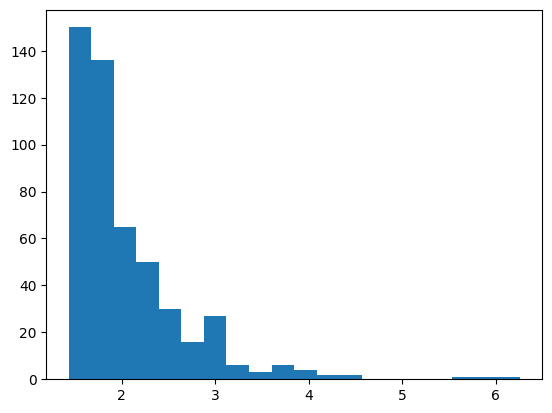

In [24]:
rmse_only_mgy, errors_only_mgy = sim_lstm(df_eur, 'EURHUF.X.Close', ['alapkamat','mgy_dummy'],  n_sim)
plt.hist(rmse_only_mgy, bins = 20)
plt.show()
# stats.describe(mse_only_mgy)

In [25]:
rmse_output = pd.DataFrame(
    {'rmse_all_variables': rmse_all_variables,
     'rmse_no_dummies': rmse_no_dummies,
     'rmse_only_kinfo': rmse_only_kinfo,
     'rmse_only_vm': rmse_only_vm,
     'rmse_only_nm': rmse_only_nm,
     'rmse_only_mgy': rmse_only_mgy
     }
)

rmse_output.to_excel('./rmse_results.xlsx')

with pd.ExcelWriter('errors_results.xlsx', engine='xlsxwriter') as writer:
    errors_all_variables.to_excel(writer, sheet_name = 'all_variables')
    errors_no_dummies.to_excel(writer, sheet_name = 'no_dummies')
    errors_only_kinfo.to_excel(writer, sheet_name = 'only_kinfo')
    errors_only_vm.to_excel(writer, sheet_name = 'only_vm')
    errors_only_nm.to_excel(writer, sheet_name = 'only_nm')
    errors_only_mgy.to_excel(writer, sheet_name = 'only_mgy')



print("--- %s minutes ---" % ((time.time() - start_time)/60))

--- 185.35658344427745 minutes ---
